In [40]:
## 必要なライブラリのimport
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Dense, Flatten
from keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

In [41]:
# メッシュが半分の時の精度と従来のものの精度を比べる

## データについて

### データファイルのpath
no_hole_path = './../tmp_simulation/tmp_data/no_hole_data.csv'
half_no_hole_path = './../tmp_simulation/tmp_data/half_no_hole_data.csv'
half_one_hole_size_path = './../tmp_simulation/tmp_data/half_one_hole_size_data.csv'
half_one_hole_position_path = './../tmp_simulation/tmp_data/half_one_hole_position_data.csv'
four_holes_size_path = './../tmp_simulation/tmp_data/four_holes_size_data.csv'
four_holes_position_path = './../tmp_simulation/tmp_data/four_holes_position_data.csv'
half_four_holes_size_path = './../tmp_simulation/tmp_data/half_four_holes_size_data.csv'
half_four_holes_position_path = './../tmp_simulation/tmp_data/half_four_holes_position_data.csv'
sixteen_holes_size_path = './../tmp_simulation/tmp_data/sixteen_holes_size_data.csv'
sixteen_holes_position_path = './../tmp_simulation/tmp_data/sixteen_holes_position_data.csv'


### 入力データと正解データ
no_hole_data = []
size_x_data = []
size_y_data = []
position_x_data = []
position_y_data = []
half_no_hole_data = []
half_size_x_data = []
half_size_y_data = []
half_position_x_data = []
half_position_y_data = []

### ファイル読み込み

# 従来のメッシュ
#### 欠陥がない場合の温度データ
with open(no_hole_path) as f:
    for line in f:
        no_hole_data = line.split(',')[:-1]

#### 大きさに関するデータ
with open(four_holes_size_path) as fs2:
  for line in fs2:
    data_array = line.split(',')
    size_x_data.append(data_array[1:-1])
    size_y_data.append(data_array[0])
with open(sixteen_holes_size_path) as fs4:
  for line in fs4:
    data_array = line.split(',')
    size_x_data.append(data_array[1:-1])
    size_y_data.append(data_array[0])

#### 位置に関するデータ
with open(four_holes_position_path) as fp2:
  for line in fp2:
    data_array = line.split(',')
    position_x_data.append(data_array[1:-1])
    position_y_data.append(data_array[0])

with open(sixteen_holes_position_path) as fp4:
  for line in fp4:
    data_array = line.split(',')
    position_x_data.append(data_array[1:-1])
    position_y_data.append(data_array[0])


# メッシュhalfの場合
#### 欠陥がない場合の温度データ
with open(half_no_hole_path) as f:
    for line in f:
        half_no_hole_data = line.split(',')[:-1]

#### 大きさに関するデータ
with open(half_one_hole_size_path) as fsh1:
  for line in fsh1:
    data_array = line.split(',')
    half_size_x_data.append(data_array[1:-1])
    half_size_y_data.append(2)
with open(half_four_holes_size_path) as fsh2:
  for line in fsh2:
    data_array = line.split(',')
    half_size_x_data.append(data_array[1:-1])
    half_size_y_data.append(4)

#### 位置に関するデータ
with open(half_one_hole_position_path) as fph1:
  for line in fph1:
    data_array = line.split(',')
    half_position_x_data.append(data_array[1:-1])
    half_position_y_data.append(data_array[0])

with open(half_four_holes_position_path) as fpf2:
  for line in fpf2:
    data_array = line.split(',')
    half_position_x_data.append(data_array[1:-1])
    half_position_y_data.append(data_array[0])

### 各配列をnp.array型にして各要素を型変換
no_hole_data = np.array(no_hole_data, dtype=float)
size_x_data = np.array(size_x_data, dtype=float)
size_y_data = np.array(size_y_data, dtype=int)
position_x_data = np.array(position_x_data, dtype=float)
position_y_data = np.array(position_y_data, dtype=int)
half_no_hole_data = np.array(half_no_hole_data, dtype=float)
half_size_x_data = np.array(half_size_x_data, dtype=float)
half_size_y_data = np.array(half_size_y_data, dtype=int)
half_position_x_data = np.array(half_position_x_data, dtype=float)
half_position_y_data = np.array(half_position_y_data, dtype=int)

### データの加工
size_x_data = (size_x_data-no_hole_data)
position_x_data = (position_x_data-no_hole_data)
size_y_data = keras.utils.to_categorical(size_y_data, 5)
position_y_data = (position_y_data-1)
position_y_data = keras.utils.to_categorical(position_y_data, 25)
half_size_x_data = (half_size_x_data-half_no_hole_data)
half_position_x_data = (half_position_x_data-half_no_hole_data)
half_size_y_data = keras.utils.to_categorical(half_size_y_data, 5)
half_position_y_data = (half_position_y_data-1)
half_position_y_data = keras.utils.to_categorical(half_position_y_data, 25)

### train用とtest用に分割(4:1)
size_x_train, size_x_test, size_y_train, size_y_test = train_test_split(size_x_data, size_y_data, test_size=0.20)
position_x_train, position_x_test, position_y_train, position_y_test = train_test_split(position_x_data, position_y_data, test_size=0.20)
half_size_x_train, half_size_x_test, half_size_y_train, half_size_y_test = train_test_split(half_size_x_data, half_size_y_data, test_size=0.20)
half_position_x_train, half_position_x_test, half_position_y_train, half_position_y_test = train_test_split(half_position_x_data, half_position_y_data, test_size=0.20)

print(size_x_train.shape)
print(size_x_test.shape)
print(size_y_train.shape)
print(size_y_test.shape)
print(half_size_x_train.shape)
print(half_size_x_test.shape)
print(half_size_y_train.shape)
print(half_size_y_test.shape)

### reshape
size_x_train = size_x_train.reshape(3241, 50, 1)
size_x_test = size_x_test.reshape(811, 50, 1)
position_x_train = position_x_train.reshape(3241, 50, 1)
position_x_test = position_x_test.reshape(811, 50, 1)
half_size_x_train = half_size_x_train.reshape(740, 25, 1)
half_size_x_test = half_size_x_test.reshape(185, 25, 1)
half_position_x_train = half_position_x_train.reshape(740, 25, 1)
half_position_x_test = half_position_x_test.reshape(185, 25, 1)

(3241, 50)
(811, 50)
(3241, 5)
(811, 5)
(740, 25)
(185, 25)
(740, 5)
(185, 5)


In [42]:
## CNN(大きさ)

### modelの作成
size_model = Sequential()
### 畳み込み層
size_model.add(Conv1D(32, 3, padding='same', activation='relu', input_shape=(50, 1)))
### プーリング層
size_model.add(MaxPooling1D(2, padding='same'))
### Flatten層
size_model.add(Flatten())
### 全結合層
size_model.add(Dense(5, activation='softmax'))

### optimizer
adam = keras.optimizers.Adam()

###modelのコンパイル
size_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [10]:
# 学習(大きさ)
epochs = 100
batch_size = 128
size_history = size_model.fit(size_x_train, size_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(size_x_test, size_y_test))

Train on 3241 samples, validate on 811 samples
Epoch 1/100
3241/3241 [==============================] - 0s 36us/step - loss: 0.0072 - accuracy: 0.9988 - val_loss: 0.0107 - val_accuracy: 0.9975
Epoch 2/100
3241/3241 [==============================] - 0s 30us/step - loss: 0.0066 - accuracy: 0.9991 - val_loss: 0.0107 - val_accuracy: 0.9975
Epoch 3/100
3241/3241 [==============================] - 0s 37us/step - loss: 0.0064 - accuracy: 0.9991 - val_loss: 0.0117 - val_accuracy: 0.9975
Epoch 4/100
3241/3241 [==============================] - 0s 27us/step - loss: 0.0066 - accuracy: 0.9981 - val_loss: 0.0128 - val_accuracy: 0.9963
Epoch 5/100
3241/3241 [==============================] - 0s 32us/step - loss: 0.0076 - accuracy: 0.9991 - val_loss: 0.0112 - val_accuracy: 0.9975
Epoch 6/100
3241/3241 [==============================] - 0s 43us/step - loss: 0.0075 - accuracy: 0.9978 - val_loss: 0.0116 - val_accuracy: 0.9951
Epoch 7/100
3241/3241 [==============================] - 0s 45us/step - loss:

3241/3241 [==============================] - 0s 27us/step - loss: 0.0060 - accuracy: 0.9985 - val_loss: 0.0118 - val_accuracy: 0.9963
Epoch 57/100
3241/3241 [==============================] - 0s 29us/step - loss: 0.0092 - accuracy: 0.9975 - val_loss: 0.0103 - val_accuracy: 0.9975
Epoch 58/100
3241/3241 [==============================] - 0s 27us/step - loss: 0.0050 - accuracy: 0.9991 - val_loss: 0.0088 - val_accuracy: 0.9975
Epoch 59/100
3241/3241 [==============================] - 0s 26us/step - loss: 0.0048 - accuracy: 0.9991 - val_loss: 0.0083 - val_accuracy: 0.9975
Epoch 60/100
3241/3241 [==============================] - 0s 30us/step - loss: 0.0044 - accuracy: 0.9991 - val_loss: 0.0081 - val_accuracy: 0.9975
Epoch 61/100
3241/3241 [==============================] - 0s 29us/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 0.0090 - val_accuracy: 0.9975
Epoch 62/100
3241/3241 [==============================] - 0s 32us/step - loss: 0.0049 - accuracy: 0.9991 - val_loss: 0.0074 - val_a

In [11]:
# モデルの評価(大きさ)
size_score = size_model.evaluate(size_x_test, size_y_test, verbose=1)
print('Test loss:', size_score[0])
print('Test accuracy:', size_score[1])

811/811 [==============================] - 0s 32us/step
Test loss: 0.0061305991251081335
Test accuracy: 0.9987669587135315


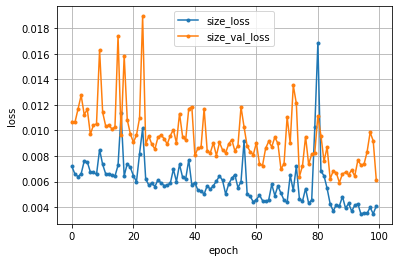

In [12]:
# 学習経過の可視化(大きさ)
size_loss     = size_history.history['loss']
size_val_loss = size_history.history['val_loss']

nb_epoch = len(size_loss)
plt.plot(range(nb_epoch), size_loss,     marker='.', label='size_loss')
plt.plot(range(nb_epoch), size_val_loss, marker='.', label='size_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [43]:
## CNN(位置)

### modelの作成
position_model = Sequential()
### 畳み込み層
position_model.add(Conv1D(32, 3, padding='same', activation='relu', input_shape=(50, 1)))
### プーリング層
position_model.add(MaxPooling1D(2, padding='same'))
### Flatten層
position_model.add(Flatten())
### 全結合層
position_model.add(Dense(25, activation='softmax'))

### optimizer
adam = keras.optimizers.Adam()

###modelのコンパイル
position_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [44]:
# 学習(位置)
epochs = 1000
batch_size = 128
position_history = position_model.fit(position_x_train, position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(position_x_test, position_y_test))

Train on 3241 samples, validate on 811 samples
Epoch 1/1000
3241/3241 [==============================] - 0s 77us/step - loss: 3.2013 - accuracy: 0.0512 - val_loss: 3.1295 - val_accuracy: 0.0863
Epoch 2/1000
3241/3241 [==============================] - 0s 32us/step - loss: 3.0951 - accuracy: 0.0978 - val_loss: 3.0554 - val_accuracy: 0.1319
Epoch 3/1000
3241/3241 [==============================] - 0s 40us/step - loss: 3.0329 - accuracy: 0.1311 - val_loss: 3.0052 - val_accuracy: 0.1147
Epoch 4/1000
3241/3241 [==============================] - 0s 32us/step - loss: 2.9797 - accuracy: 0.1441 - val_loss: 2.9640 - val_accuracy: 0.1085
Epoch 5/1000
3241/3241 [==============================] - 0s 45us/step - loss: 2.9343 - accuracy: 0.1438 - val_loss: 2.9170 - val_accuracy: 0.1171
Epoch 6/1000
3241/3241 [==============================] - 0s 37us/step - loss: 2.8901 - accuracy: 0.1719 - val_loss: 2.8883 - val_accuracy: 0.1554
Epoch 7/1000
3241/3241 [==============================] - 0s 32us/step 

3241/3241 [==============================] - 0s 32us/step - loss: 2.1682 - accuracy: 0.3567 - val_loss: 2.2004 - val_accuracy: 0.3428
Epoch 57/1000
3241/3241 [==============================] - 0s 30us/step - loss: 2.1708 - accuracy: 0.3369 - val_loss: 2.1756 - val_accuracy: 0.3958
Epoch 58/1000
3241/3241 [==============================] - 0s 29us/step - loss: 2.1686 - accuracy: 0.3517 - val_loss: 2.2324 - val_accuracy: 0.3391
Epoch 59/1000
3241/3241 [==============================] - 0s 29us/step - loss: 2.1604 - accuracy: 0.3317 - val_loss: 2.1662 - val_accuracy: 0.3564
Epoch 60/1000
3241/3241 [==============================] - 0s 29us/step - loss: 2.1659 - accuracy: 0.3252 - val_loss: 2.1670 - val_accuracy: 0.3564
Epoch 61/1000
3241/3241 [==============================] - 0s 30us/step - loss: 2.1495 - accuracy: 0.3422 - val_loss: 2.1451 - val_accuracy: 0.4291
Epoch 62/1000
3241/3241 [==============================] - 0s 32us/step - loss: 2.1348 - accuracy: 0.3558 - val_loss: 2.1701 -

3241/3241 [==============================] - 0s 49us/step - loss: 1.9339 - accuracy: 0.4014 - val_loss: 1.9924 - val_accuracy: 0.4118
Epoch 112/1000
3241/3241 [==============================] - 0s 42us/step - loss: 1.9377 - accuracy: 0.3909 - val_loss: 1.9981 - val_accuracy: 0.4155
Epoch 113/1000
3241/3241 [==============================] - 0s 42us/step - loss: 1.9147 - accuracy: 0.4014 - val_loss: 1.9935 - val_accuracy: 0.3798
Epoch 114/1000
3241/3241 [==============================] - 0s 39us/step - loss: 1.9261 - accuracy: 0.3928 - val_loss: 1.9908 - val_accuracy: 0.3983
Epoch 115/1000
3241/3241 [==============================] - 0s 42us/step - loss: 1.9375 - accuracy: 0.3928 - val_loss: 1.9744 - val_accuracy: 0.4192
Epoch 116/1000
3241/3241 [==============================] - 0s 39us/step - loss: 1.9236 - accuracy: 0.3968 - val_loss: 2.0025 - val_accuracy: 0.4131
Epoch 117/1000
3241/3241 [==============================] - 0s 43us/step - loss: 1.9316 - accuracy: 0.3943 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.7794 - accuracy: 0.4391 - val_loss: 1.8737 - val_accuracy: 0.4390
Epoch 167/1000
3241/3241 [==============================] - 0s 30us/step - loss: 1.7865 - accuracy: 0.4295 - val_loss: 1.8674 - val_accuracy: 0.4143
Epoch 168/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.7958 - accuracy: 0.4372 - val_loss: 1.8421 - val_accuracy: 0.4439
Epoch 169/1000
3241/3241 [==============================] - 0s 45us/step - loss: 1.7835 - accuracy: 0.4249 - val_loss: 1.8530 - val_accuracy: 0.4476
Epoch 170/1000
3241/3241 [==============================] - 0s 38us/step - loss: 1.7798 - accuracy: 0.4394 - val_loss: 1.8454 - val_accuracy: 0.4044
Epoch 171/1000
3241/3241 [==============================] - 0s 43us/step - loss: 1.7821 - accuracy: 0.4243 - val_loss: 1.9065 - val_accuracy: 0.4550
Epoch 172/1000
3241/3241 [==============================] - 0s 43us/step - loss: 1.7951 - accuracy: 0.4190 - val_loss: 1.

3241/3241 [==============================] - 0s 32us/step - loss: 1.7142 - accuracy: 0.4492 - val_loss: 1.8032 - val_accuracy: 0.4562
Epoch 222/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.6749 - accuracy: 0.4637 - val_loss: 1.9035 - val_accuracy: 0.3884
Epoch 223/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.7063 - accuracy: 0.4517 - val_loss: 1.8866 - val_accuracy: 0.3946
Epoch 224/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.7131 - accuracy: 0.4360 - val_loss: 1.8585 - val_accuracy: 0.4143
Epoch 225/1000
3241/3241 [==============================] - 0s 30us/step - loss: 1.6973 - accuracy: 0.4579 - val_loss: 1.7827 - val_accuracy: 0.4747
Epoch 226/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.7103 - accuracy: 0.4533 - val_loss: 1.8572 - val_accuracy: 0.4192
Epoch 227/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.7086 - accuracy: 0.4462 - val_loss: 1.

3241/3241 [==============================] - 0s 33us/step - loss: 1.6352 - accuracy: 0.4736 - val_loss: 1.7330 - val_accuracy: 0.4932
Epoch 277/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.6096 - accuracy: 0.4656 - val_loss: 1.7486 - val_accuracy: 0.4883
Epoch 278/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.6025 - accuracy: 0.4909 - val_loss: 1.8011 - val_accuracy: 0.4698
Epoch 279/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.6296 - accuracy: 0.4847 - val_loss: 1.8005 - val_accuracy: 0.4612
Epoch 280/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.6645 - accuracy: 0.4573 - val_loss: 1.7815 - val_accuracy: 0.4525
Epoch 281/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.6047 - accuracy: 0.4761 - val_loss: 1.7280 - val_accuracy: 0.4797
Epoch 282/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.6181 - accuracy: 0.4758 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.5890 - accuracy: 0.4767 - val_loss: 1.7464 - val_accuracy: 0.4784
Epoch 332/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.5619 - accuracy: 0.4980 - val_loss: 1.7275 - val_accuracy: 0.5179
Epoch 333/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.6073 - accuracy: 0.4625 - val_loss: 1.7869 - val_accuracy: 0.4365
Epoch 334/1000
3241/3241 [==============================] - 0s 35us/step - loss: 1.5889 - accuracy: 0.4835 - val_loss: 1.7676 - val_accuracy: 0.4131
Epoch 335/1000
3241/3241 [==============================] - 0s 36us/step - loss: 1.6027 - accuracy: 0.4718 - val_loss: 1.6939 - val_accuracy: 0.4624
Epoch 336/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.5565 - accuracy: 0.4998 - val_loss: 1.7985 - val_accuracy: 0.3995
Epoch 337/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.5980 - accuracy: 0.4566 - val_loss: 1.

3241/3241 [==============================] - 0s 30us/step - loss: 1.5644 - accuracy: 0.4662 - val_loss: 1.6295 - val_accuracy: 0.5265
Epoch 387/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.5167 - accuracy: 0.5005 - val_loss: 1.6966 - val_accuracy: 0.4723
Epoch 388/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.5347 - accuracy: 0.4943 - val_loss: 1.7366 - val_accuracy: 0.4710
Epoch 389/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.5236 - accuracy: 0.5020 - val_loss: 1.6300 - val_accuracy: 0.5462
Epoch 390/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.5237 - accuracy: 0.5051 - val_loss: 1.7020 - val_accuracy: 0.4599
Epoch 391/1000
3241/3241 [==============================] - 0s 30us/step - loss: 1.5679 - accuracy: 0.4730 - val_loss: 1.6779 - val_accuracy: 0.4575
Epoch 392/1000
3241/3241 [==============================] - 0s 30us/step - loss: 1.5029 - accuracy: 0.5137 - val_loss: 1.

3241/3241 [==============================] - 0s 33us/step - loss: 1.5073 - accuracy: 0.5045 - val_loss: 1.6782 - val_accuracy: 0.5006
Epoch 442/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4895 - accuracy: 0.5119 - val_loss: 1.6528 - val_accuracy: 0.4871
Epoch 443/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.5011 - accuracy: 0.5008 - val_loss: 1.6798 - val_accuracy: 0.4587
Epoch 444/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4804 - accuracy: 0.5026 - val_loss: 1.6344 - val_accuracy: 0.4772
Epoch 445/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4507 - accuracy: 0.5230 - val_loss: 1.5897 - val_accuracy: 0.5166
Epoch 446/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4915 - accuracy: 0.5100 - val_loss: 1.6752 - val_accuracy: 0.4760
Epoch 447/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4909 - accuracy: 0.5057 - val_loss: 1.

3241/3241 [==============================] - 0s 32us/step - loss: 1.4175 - accuracy: 0.5437 - val_loss: 1.5835 - val_accuracy: 0.5314
Epoch 497/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4481 - accuracy: 0.5143 - val_loss: 1.5746 - val_accuracy: 0.5031
Epoch 498/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4497 - accuracy: 0.5097 - val_loss: 1.5925 - val_accuracy: 0.5450
Epoch 499/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4729 - accuracy: 0.5165 - val_loss: 1.6018 - val_accuracy: 0.5327
Epoch 500/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4362 - accuracy: 0.5255 - val_loss: 1.5646 - val_accuracy: 0.5561
Epoch 501/1000
3241/3241 [==============================] - 0s 41us/step - loss: 1.4473 - accuracy: 0.5162 - val_loss: 1.6541 - val_accuracy: 0.5203
Epoch 502/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4524 - accuracy: 0.5128 - val_loss: 1.

Epoch 551/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4269 - accuracy: 0.5174 - val_loss: 1.5615 - val_accuracy: 0.5734
Epoch 552/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4142 - accuracy: 0.5307 - val_loss: 1.5664 - val_accuracy: 0.5401
Epoch 553/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4222 - accuracy: 0.5221 - val_loss: 1.6066 - val_accuracy: 0.5018
Epoch 554/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4470 - accuracy: 0.5131 - val_loss: 1.5788 - val_accuracy: 0.5006
Epoch 555/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4232 - accuracy: 0.5279 - val_loss: 1.5865 - val_accuracy: 0.5327
Epoch 556/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.4210 - accuracy: 0.5218 - val_loss: 1.5988 - val_accuracy: 0.5105
Epoch 557/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.4177 - accuracy: 0.5193

Epoch 606/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3985 - accuracy: 0.5282 - val_loss: 1.5979 - val_accuracy: 0.5166
Epoch 607/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4224 - accuracy: 0.5168 - val_loss: 1.6049 - val_accuracy: 0.5376
Epoch 608/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.4021 - accuracy: 0.5264 - val_loss: 1.6040 - val_accuracy: 0.4686
Epoch 609/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.4568 - accuracy: 0.4915 - val_loss: 1.6521 - val_accuracy: 0.4550
Epoch 610/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4359 - accuracy: 0.4968 - val_loss: 1.6232 - val_accuracy: 0.4982
Epoch 611/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.4149 - accuracy: 0.5233 - val_loss: 1.5526 - val_accuracy: 0.5142
Epoch 612/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4147 - accuracy: 0.5125

Epoch 661/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3671 - accuracy: 0.5341 - val_loss: 1.5382 - val_accuracy: 0.5524
Epoch 662/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3808 - accuracy: 0.5319 - val_loss: 1.5309 - val_accuracy: 0.5228
Epoch 663/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3816 - accuracy: 0.5122 - val_loss: 1.5610 - val_accuracy: 0.5253
Epoch 664/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3720 - accuracy: 0.5239 - val_loss: 1.5344 - val_accuracy: 0.5364
Epoch 665/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3942 - accuracy: 0.5301 - val_loss: 1.5957 - val_accuracy: 0.5302
Epoch 666/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4302 - accuracy: 0.5082 - val_loss: 1.5213 - val_accuracy: 0.5388
Epoch 667/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.4040 - accuracy: 0.5202

Epoch 716/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3753 - accuracy: 0.5242 - val_loss: 1.5357 - val_accuracy: 0.4747
Epoch 717/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3602 - accuracy: 0.5372 - val_loss: 1.5071 - val_accuracy: 0.5524
Epoch 718/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3471 - accuracy: 0.5455 - val_loss: 1.5548 - val_accuracy: 0.5092
Epoch 719/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3869 - accuracy: 0.5288 - val_loss: 1.5800 - val_accuracy: 0.4957
Epoch 720/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3669 - accuracy: 0.5258 - val_loss: 1.4315 - val_accuracy: 0.5536
Epoch 721/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3568 - accuracy: 0.5159 - val_loss: 1.5447 - val_accuracy: 0.5413
Epoch 722/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3914 - accuracy: 0.5202

Epoch 771/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3096 - accuracy: 0.5532 - val_loss: 1.5796 - val_accuracy: 0.5142
Epoch 772/1000
3241/3241 [==============================] - 0s 38us/step - loss: 1.3523 - accuracy: 0.5471 - val_loss: 1.6056 - val_accuracy: 0.5364
Epoch 773/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3459 - accuracy: 0.5390 - val_loss: 1.5141 - val_accuracy: 0.5277
Epoch 774/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3688 - accuracy: 0.5359 - val_loss: 1.5110 - val_accuracy: 0.5438
Epoch 775/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3628 - accuracy: 0.5221 - val_loss: 1.5397 - val_accuracy: 0.5129
Epoch 776/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3243 - accuracy: 0.5511 - val_loss: 1.4891 - val_accuracy: 0.5536
Epoch 777/1000
3241/3241 [==============================] - 0s 31us/step - loss: 1.3353 - accuracy: 0.5415

Epoch 826/1000
3241/3241 [==============================] - 0s 35us/step - loss: 1.3409 - accuracy: 0.5353 - val_loss: 1.5406 - val_accuracy: 0.5623
Epoch 827/1000
3241/3241 [==============================] - 0s 36us/step - loss: 1.3448 - accuracy: 0.5366 - val_loss: 1.5008 - val_accuracy: 0.5154
Epoch 828/1000
3241/3241 [==============================] - 0s 35us/step - loss: 1.3321 - accuracy: 0.5486 - val_loss: 1.5393 - val_accuracy: 0.5376
Epoch 829/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2880 - accuracy: 0.5622 - val_loss: 1.4695 - val_accuracy: 0.5413
Epoch 830/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3347 - accuracy: 0.5446 - val_loss: 1.4811 - val_accuracy: 0.5758
Epoch 831/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3292 - accuracy: 0.5498 - val_loss: 1.4895 - val_accuracy: 0.5117
Epoch 832/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3183 - accuracy: 0.5532

Epoch 881/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2961 - accuracy: 0.5480 - val_loss: 1.4536 - val_accuracy: 0.5512
Epoch 882/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3124 - accuracy: 0.5375 - val_loss: 1.4881 - val_accuracy: 0.5598
Epoch 883/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2744 - accuracy: 0.5637 - val_loss: 1.5242 - val_accuracy: 0.5018
Epoch 884/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2978 - accuracy: 0.5440 - val_loss: 1.4596 - val_accuracy: 0.5216
Epoch 885/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.3043 - accuracy: 0.5514 - val_loss: 1.4785 - val_accuracy: 0.5487
Epoch 886/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3128 - accuracy: 0.5396 - val_loss: 1.5008 - val_accuracy: 0.5536
Epoch 887/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3316 - accuracy: 0.5363

Epoch 936/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2782 - accuracy: 0.5440 - val_loss: 1.5185 - val_accuracy: 0.5179
Epoch 937/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2908 - accuracy: 0.5381 - val_loss: 1.4459 - val_accuracy: 0.5388
Epoch 938/1000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2963 - accuracy: 0.5474 - val_loss: 1.4636 - val_accuracy: 0.5438
Epoch 939/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.3025 - accuracy: 0.5418 - val_loss: 1.6916 - val_accuracy: 0.5216
Epoch 940/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3343 - accuracy: 0.5449 - val_loss: 1.3967 - val_accuracy: 0.5635
Epoch 941/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2668 - accuracy: 0.5631 - val_loss: 1.4791 - val_accuracy: 0.5487
Epoch 942/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.3300 - accuracy: 0.5205

Epoch 991/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2605 - accuracy: 0.5535 - val_loss: 1.4465 - val_accuracy: 0.5339
Epoch 992/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2601 - accuracy: 0.5628 - val_loss: 1.4697 - val_accuracy: 0.5351
Epoch 993/1000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2692 - accuracy: 0.5628 - val_loss: 1.5102 - val_accuracy: 0.5006
Epoch 994/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2607 - accuracy: 0.5526 - val_loss: 1.3893 - val_accuracy: 0.5660
Epoch 995/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2369 - accuracy: 0.5687 - val_loss: 1.4638 - val_accuracy: 0.5376
Epoch 996/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2812 - accuracy: 0.5548 - val_loss: 1.4540 - val_accuracy: 0.5376
Epoch 997/1000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2698 - accuracy: 0.5693

In [45]:
# モデルの評価(位置)
position_score = position_model.evaluate(position_x_test, position_y_test, verbose=1)
print('Test loss:', position_score[0])
print('Test accuracy:', position_score[1])

811/811 [==============================] - 0s 32us/step
Test loss: 1.4398676430399997
Test accuracy: 0.5437731146812439


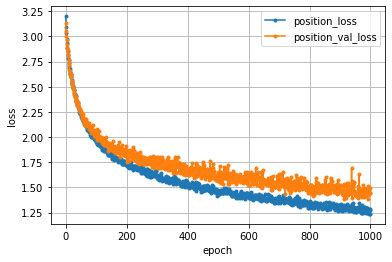

In [46]:
# 学習経過の可視化(位置)
position_loss     = position_history.history['loss']
position_val_loss = position_history.history['val_loss']

nb_epoch = len(position_loss)
plt.plot(range(nb_epoch), position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [51]:
# 学習(位置)
epochs = 4000
batch_size = 128
position_history = position_model.fit(position_x_train, position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(position_x_test, position_y_test))

Train on 3241 samples, validate on 811 samples
Epoch 1/4000
3241/3241 [==============================] - 0s 42us/step - loss: 1.2572 - accuracy: 0.5582 - val_loss: 1.5036 - val_accuracy: 0.5055
Epoch 2/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.2960 - accuracy: 0.5446 - val_loss: 1.4610 - val_accuracy: 0.5339
Epoch 3/4000
3241/3241 [==============================] - 0s 45us/step - loss: 1.2767 - accuracy: 0.5566 - val_loss: 1.5020 - val_accuracy: 0.5055
Epoch 4/4000
3241/3241 [==============================] - 0s 34us/step - loss: 1.2873 - accuracy: 0.5572 - val_loss: 1.4718 - val_accuracy: 0.5364
Epoch 5/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2536 - accuracy: 0.5634 - val_loss: 1.5111 - val_accuracy: 0.4895
Epoch 6/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2810 - accuracy: 0.5529 - val_loss: 1.4508 - val_accuracy: 0.5524
Epoch 7/4000
3241/3241 [==============================] - 0s 32us/step 

3241/3241 [==============================] - 0s 32us/step - loss: 1.2242 - accuracy: 0.5699 - val_loss: 1.4102 - val_accuracy: 0.5499
Epoch 57/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2385 - accuracy: 0.5579 - val_loss: 1.3976 - val_accuracy: 0.5746
Epoch 58/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2086 - accuracy: 0.5828 - val_loss: 1.3829 - val_accuracy: 0.5783
Epoch 59/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2555 - accuracy: 0.5646 - val_loss: 1.3729 - val_accuracy: 0.6091
Epoch 60/4000
3241/3241 [==============================] - 0s 28us/step - loss: 1.2176 - accuracy: 0.5770 - val_loss: 1.4687 - val_accuracy: 0.5401
Epoch 61/4000
3241/3241 [==============================] - 0s 29us/step - loss: 1.2538 - accuracy: 0.5467 - val_loss: 1.4471 - val_accuracy: 0.5290
Epoch 62/4000
3241/3241 [==============================] - 0s 29us/step - loss: 1.2642 - accuracy: 0.5671 - val_loss: 1.4786 -

3241/3241 [==============================] - 0s 34us/step - loss: 1.2311 - accuracy: 0.5591 - val_loss: 1.4405 - val_accuracy: 0.5376
Epoch 112/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2739 - accuracy: 0.5378 - val_loss: 1.4130 - val_accuracy: 0.5869
Epoch 113/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2225 - accuracy: 0.5795 - val_loss: 1.4315 - val_accuracy: 0.5771
Epoch 114/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2343 - accuracy: 0.5659 - val_loss: 1.5122 - val_accuracy: 0.5524
Epoch 115/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2878 - accuracy: 0.5409 - val_loss: 1.4936 - val_accuracy: 0.5265
Epoch 116/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2516 - accuracy: 0.5545 - val_loss: 1.4244 - val_accuracy: 0.5561
Epoch 117/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2806 - accuracy: 0.5649 - val_loss: 1.

3241/3241 [==============================] - 0s 32us/step - loss: 1.2316 - accuracy: 0.5594 - val_loss: 1.3924 - val_accuracy: 0.5943
Epoch 167/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2232 - accuracy: 0.5761 - val_loss: 1.3402 - val_accuracy: 0.5512
Epoch 168/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2248 - accuracy: 0.5773 - val_loss: 1.3665 - val_accuracy: 0.5561
Epoch 169/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2446 - accuracy: 0.5625 - val_loss: 1.4155 - val_accuracy: 0.5734
Epoch 170/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2398 - accuracy: 0.5677 - val_loss: 1.4140 - val_accuracy: 0.5216
Epoch 171/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2224 - accuracy: 0.5600 - val_loss: 1.3425 - val_accuracy: 0.5832
Epoch 172/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.2238 - accuracy: 0.5773 - val_loss: 1.

3241/3241 [==============================] - 0s 34us/step - loss: 1.2267 - accuracy: 0.5579 - val_loss: 1.3329 - val_accuracy: 0.5882
Epoch 222/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2008 - accuracy: 0.5825 - val_loss: 1.3724 - val_accuracy: 0.5450
Epoch 223/4000
3241/3241 [==============================] - 0s 40us/step - loss: 1.2074 - accuracy: 0.5785 - val_loss: 1.3813 - val_accuracy: 0.5265
Epoch 224/4000
3241/3241 [==============================] - 0s 42us/step - loss: 1.2573 - accuracy: 0.5532 - val_loss: 1.3896 - val_accuracy: 0.5610
Epoch 225/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1993 - accuracy: 0.5844 - val_loss: 1.3656 - val_accuracy: 0.5919
Epoch 226/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2039 - accuracy: 0.5708 - val_loss: 1.3601 - val_accuracy: 0.5697
Epoch 227/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.2119 - accuracy: 0.5687 - val_loss: 1.

3241/3241 [==============================] - 0s 30us/step - loss: 1.1987 - accuracy: 0.5788 - val_loss: 1.3612 - val_accuracy: 0.5536
Epoch 277/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1899 - accuracy: 0.5745 - val_loss: 1.3629 - val_accuracy: 0.6042
Epoch 278/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2165 - accuracy: 0.5579 - val_loss: 1.3934 - val_accuracy: 0.5660
Epoch 279/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1987 - accuracy: 0.5757 - val_loss: 1.3348 - val_accuracy: 0.5758
Epoch 280/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2076 - accuracy: 0.5659 - val_loss: 1.4156 - val_accuracy: 0.5203
Epoch 281/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.2031 - accuracy: 0.5736 - val_loss: 1.4167 - val_accuracy: 0.5462
Epoch 282/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.2221 - accuracy: 0.5773 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.2298 - accuracy: 0.5557 - val_loss: 1.3285 - val_accuracy: 0.5598
Epoch 332/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1957 - accuracy: 0.5619 - val_loss: 1.3607 - val_accuracy: 0.5462
Epoch 333/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.1878 - accuracy: 0.5696 - val_loss: 1.3455 - val_accuracy: 0.5980
Epoch 334/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1787 - accuracy: 0.5677 - val_loss: 1.3501 - val_accuracy: 0.5709
Epoch 335/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.1572 - accuracy: 0.5788 - val_loss: 1.4228 - val_accuracy: 0.5166
Epoch 336/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1695 - accuracy: 0.5835 - val_loss: 1.3965 - val_accuracy: 0.5586
Epoch 337/4000
3241/3241 [==============================] - 0s 34us/step - loss: 1.1970 - accuracy: 0.5875 - val_loss: 1.

3241/3241 [==============================] - 0s 38us/step - loss: 1.1480 - accuracy: 0.5949 - val_loss: 1.3003 - val_accuracy: 0.5475
Epoch 387/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.1438 - accuracy: 0.5887 - val_loss: 1.3944 - val_accuracy: 0.5339
Epoch 388/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1557 - accuracy: 0.5702 - val_loss: 1.3803 - val_accuracy: 0.5401
Epoch 389/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1659 - accuracy: 0.5717 - val_loss: 1.3929 - val_accuracy: 0.5783
Epoch 390/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.1721 - accuracy: 0.5733 - val_loss: 1.3995 - val_accuracy: 0.5314
Epoch 391/4000
3241/3241 [==============================] - 0s 34us/step - loss: 1.1818 - accuracy: 0.5751 - val_loss: 1.3098 - val_accuracy: 0.5832
Epoch 392/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.2176 - accuracy: 0.5628 - val_loss: 1.

3241/3241 [==============================] - 0s 34us/step - loss: 1.1705 - accuracy: 0.5727 - val_loss: 1.3541 - val_accuracy: 0.5808
Epoch 442/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.2166 - accuracy: 0.5788 - val_loss: 1.4011 - val_accuracy: 0.5561
Epoch 443/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.1629 - accuracy: 0.5828 - val_loss: 1.4092 - val_accuracy: 0.5980
Epoch 444/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.1571 - accuracy: 0.5973 - val_loss: 1.4307 - val_accuracy: 0.5401
Epoch 445/4000
3241/3241 [==============================] - 0s 34us/step - loss: 1.1574 - accuracy: 0.5751 - val_loss: 1.3307 - val_accuracy: 0.6005
Epoch 446/4000
3241/3241 [==============================] - 0s 34us/step - loss: 1.1599 - accuracy: 0.5909 - val_loss: 1.3466 - val_accuracy: 0.5980
Epoch 447/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1837 - accuracy: 0.5757 - val_loss: 1.

3241/3241 [==============================] - 0s 32us/step - loss: 1.1445 - accuracy: 0.5825 - val_loss: 1.3408 - val_accuracy: 0.5795
Epoch 497/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1430 - accuracy: 0.5896 - val_loss: 1.3326 - val_accuracy: 0.5475
Epoch 498/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.1678 - accuracy: 0.5628 - val_loss: 1.3887 - val_accuracy: 0.5228
Epoch 499/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1873 - accuracy: 0.5594 - val_loss: 1.3912 - val_accuracy: 0.5154
Epoch 500/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1781 - accuracy: 0.5736 - val_loss: 1.3319 - val_accuracy: 0.5610
Epoch 501/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1565 - accuracy: 0.5748 - val_loss: 1.3132 - val_accuracy: 0.5549
Epoch 502/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1879 - accuracy: 0.5523 - val_loss: 1.

3241/3241 [==============================] - 0s 30us/step - loss: 1.1425 - accuracy: 0.5930 - val_loss: 1.2970 - val_accuracy: 0.5647
Epoch 552/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1060 - accuracy: 0.6081 - val_loss: 1.3026 - val_accuracy: 0.5758
Epoch 553/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1528 - accuracy: 0.5779 - val_loss: 1.3022 - val_accuracy: 0.6017
Epoch 554/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1349 - accuracy: 0.5875 - val_loss: 1.3387 - val_accuracy: 0.5561
Epoch 555/4000
3241/3241 [==============================] - 0s 37us/step - loss: 1.1772 - accuracy: 0.5730 - val_loss: 1.3383 - val_accuracy: 0.5758
Epoch 556/4000
3241/3241 [==============================] - 0s 38us/step - loss: 1.1255 - accuracy: 0.5881 - val_loss: 1.3450 - val_accuracy: 0.5228
Epoch 557/4000
3241/3241 [==============================] - 0s 38us/step - loss: 1.1651 - accuracy: 0.5668 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.1308 - accuracy: 0.5961 - val_loss: 1.3017 - val_accuracy: 0.5869
Epoch 607/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1198 - accuracy: 0.5992 - val_loss: 1.2687 - val_accuracy: 0.6128
Epoch 608/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1494 - accuracy: 0.5893 - val_loss: 1.2504 - val_accuracy: 0.5857
Epoch 609/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1275 - accuracy: 0.5915 - val_loss: 1.2031 - val_accuracy: 0.6338
Epoch 610/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1363 - accuracy: 0.5896 - val_loss: 1.2420 - val_accuracy: 0.5339
Epoch 611/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1118 - accuracy: 0.5995 - val_loss: 1.2961 - val_accuracy: 0.5635
Epoch 612/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1714 - accuracy: 0.5754 - val_loss: 1.

3241/3241 [==============================] - 0s 32us/step - loss: 1.1632 - accuracy: 0.5659 - val_loss: 1.3127 - val_accuracy: 0.5660
Epoch 662/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1223 - accuracy: 0.5927 - val_loss: 1.2448 - val_accuracy: 0.6363
Epoch 663/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1492 - accuracy: 0.5764 - val_loss: 1.2809 - val_accuracy: 0.6030
Epoch 664/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1280 - accuracy: 0.5878 - val_loss: 1.3116 - val_accuracy: 0.5573
Epoch 665/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0997 - accuracy: 0.5983 - val_loss: 1.2681 - val_accuracy: 0.5808
Epoch 666/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1153 - accuracy: 0.6010 - val_loss: 1.2532 - val_accuracy: 0.5746
Epoch 667/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1158 - accuracy: 0.5893 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.1437 - accuracy: 0.5801 - val_loss: 1.3826 - val_accuracy: 0.5265
Epoch 717/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1389 - accuracy: 0.5902 - val_loss: 1.2273 - val_accuracy: 0.5832
Epoch 718/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.1218 - accuracy: 0.5943 - val_loss: 1.2746 - val_accuracy: 0.5561
Epoch 719/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1082 - accuracy: 0.5872 - val_loss: 1.2162 - val_accuracy: 0.5832
Epoch 720/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1113 - accuracy: 0.5927 - val_loss: 1.3791 - val_accuracy: 0.5771
Epoch 721/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1506 - accuracy: 0.5788 - val_loss: 1.2744 - val_accuracy: 0.5499
Epoch 722/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0935 - accuracy: 0.6001 - val_loss: 1.

3241/3241 [==============================] - 0s 31us/step - loss: 1.1296 - accuracy: 0.5884 - val_loss: 1.2474 - val_accuracy: 0.6067
Epoch 772/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1073 - accuracy: 0.5940 - val_loss: 1.2186 - val_accuracy: 0.6153
Epoch 773/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0991 - accuracy: 0.6072 - val_loss: 1.2395 - val_accuracy: 0.5561
Epoch 774/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1091 - accuracy: 0.5946 - val_loss: 1.2387 - val_accuracy: 0.5845
Epoch 775/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0827 - accuracy: 0.6118 - val_loss: 1.2415 - val_accuracy: 0.6042
Epoch 776/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0939 - accuracy: 0.6202 - val_loss: 1.2278 - val_accuracy: 0.5906
Epoch 777/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1282 - accuracy: 0.5828 - val_loss: 1.

Epoch 826/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0858 - accuracy: 0.5998 - val_loss: 1.2653 - val_accuracy: 0.5758
Epoch 827/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1106 - accuracy: 0.5921 - val_loss: 1.3464 - val_accuracy: 0.6017
Epoch 828/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1039 - accuracy: 0.6026 - val_loss: 1.3152 - val_accuracy: 0.5450
Epoch 829/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0770 - accuracy: 0.6189 - val_loss: 1.2835 - val_accuracy: 0.5820
Epoch 830/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1258 - accuracy: 0.5844 - val_loss: 1.4047 - val_accuracy: 0.5462
Epoch 831/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1162 - accuracy: 0.5952 - val_loss: 1.2862 - val_accuracy: 0.5709
Epoch 832/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.1023 - accuracy: 0.5915

Epoch 881/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1057 - accuracy: 0.5933 - val_loss: 1.2399 - val_accuracy: 0.6042
Epoch 882/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1018 - accuracy: 0.6035 - val_loss: 1.2092 - val_accuracy: 0.6017
Epoch 883/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0881 - accuracy: 0.6097 - val_loss: 1.3371 - val_accuracy: 0.5475
Epoch 884/4000
3241/3241 [==============================] - 0s 29us/step - loss: 1.1102 - accuracy: 0.5798 - val_loss: 1.2235 - val_accuracy: 0.5968
Epoch 885/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0791 - accuracy: 0.6054 - val_loss: 1.2374 - val_accuracy: 0.6067
Epoch 886/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1068 - accuracy: 0.5912 - val_loss: 1.2340 - val_accuracy: 0.6190
Epoch 887/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0758 - accuracy: 0.6048

Epoch 936/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0750 - accuracy: 0.5973 - val_loss: 1.2347 - val_accuracy: 0.6054
Epoch 937/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0679 - accuracy: 0.6026 - val_loss: 1.2761 - val_accuracy: 0.5623
Epoch 938/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0654 - accuracy: 0.6143 - val_loss: 1.2675 - val_accuracy: 0.6091
Epoch 939/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0778 - accuracy: 0.6140 - val_loss: 1.2613 - val_accuracy: 0.5820
Epoch 940/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0899 - accuracy: 0.6029 - val_loss: 1.2245 - val_accuracy: 0.6005
Epoch 941/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0972 - accuracy: 0.6051 - val_loss: 1.1522 - val_accuracy: 0.6141
Epoch 942/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0844 - accuracy: 0.5986

Epoch 991/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0430 - accuracy: 0.6245 - val_loss: 1.2485 - val_accuracy: 0.5919
Epoch 992/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0482 - accuracy: 0.6159 - val_loss: 1.2605 - val_accuracy: 0.5857
Epoch 993/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.0939 - accuracy: 0.5909 - val_loss: 1.2598 - val_accuracy: 0.5771
Epoch 994/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.0996 - accuracy: 0.5767 - val_loss: 1.2888 - val_accuracy: 0.5660
Epoch 995/4000
3241/3241 [==============================] - 0s 33us/step - loss: 1.0631 - accuracy: 0.6233 - val_loss: 1.2401 - val_accuracy: 0.5820
Epoch 996/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0645 - accuracy: 0.6140 - val_loss: 1.1936 - val_accuracy: 0.6042
Epoch 997/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0565 - accuracy: 0.6060

3241/3241 [==============================] - 0s 31us/step - loss: 1.0635 - accuracy: 0.5946 - val_loss: 1.2042 - val_accuracy: 0.6054
Epoch 1046/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0560 - accuracy: 0.6168 - val_loss: 1.2000 - val_accuracy: 0.5943
Epoch 1047/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0738 - accuracy: 0.5967 - val_loss: 1.3254 - val_accuracy: 0.5302
Epoch 1048/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0820 - accuracy: 0.5902 - val_loss: 1.2598 - val_accuracy: 0.5734
Epoch 1049/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0626 - accuracy: 0.5998 - val_loss: 1.2688 - val_accuracy: 0.5672
Epoch 1050/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0816 - accuracy: 0.6035 - val_loss: 1.2728 - val_accuracy: 0.6276
Epoch 1051/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0327 - accuracy: 0.6310 - val_lo

Epoch 1100/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0301 - accuracy: 0.6196 - val_loss: 1.1845 - val_accuracy: 0.6190
Epoch 1101/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0488 - accuracy: 0.6143 - val_loss: 1.1996 - val_accuracy: 0.5869
Epoch 1102/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0779 - accuracy: 0.6026 - val_loss: 1.2646 - val_accuracy: 0.5721
Epoch 1103/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0555 - accuracy: 0.6140 - val_loss: 1.2807 - val_accuracy: 0.5734
Epoch 1104/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0734 - accuracy: 0.5930 - val_loss: 1.2850 - val_accuracy: 0.5734
Epoch 1105/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0552 - accuracy: 0.6183 - val_loss: 1.2700 - val_accuracy: 0.5549
Epoch 1106/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0779 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 1.0635 - accuracy: 0.6168 - val_loss: 1.2231 - val_accuracy: 0.6067
Epoch 1155/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0400 - accuracy: 0.6180 - val_loss: 1.2517 - val_accuracy: 0.5882
Epoch 1156/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0465 - accuracy: 0.6159 - val_loss: 1.2014 - val_accuracy: 0.6153
Epoch 1157/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0344 - accuracy: 0.6193 - val_loss: 1.2440 - val_accuracy: 0.5943
Epoch 1158/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0811 - accuracy: 0.5958 - val_loss: 1.2346 - val_accuracy: 0.5980
Epoch 1159/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0812 - accuracy: 0.6020 - val_loss: 1.1657 - val_accuracy: 0.6400
Epoch 1160/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0452 - accuracy: 0.6205 - val_lo

3241/3241 [==============================] - 0s 32us/step - loss: 1.0603 - accuracy: 0.6069 - val_loss: 1.1525 - val_accuracy: 0.6400
Epoch 1209/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0390 - accuracy: 0.6152 - val_loss: 1.1633 - val_accuracy: 0.6178
Epoch 1210/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0783 - accuracy: 0.6010 - val_loss: 1.2570 - val_accuracy: 0.5647
Epoch 1211/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.1542 - accuracy: 0.5779 - val_loss: 1.1742 - val_accuracy: 0.5869
Epoch 1212/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0850 - accuracy: 0.5872 - val_loss: 1.1622 - val_accuracy: 0.6017
Epoch 1213/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0530 - accuracy: 0.6066 - val_loss: 1.1660 - val_accuracy: 0.6116
Epoch 1214/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0806 - accuracy: 0.6001 - val_lo

Epoch 1263/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0438 - accuracy: 0.6078 - val_loss: 1.2617 - val_accuracy: 0.5499
Epoch 1264/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0386 - accuracy: 0.6128 - val_loss: 1.2080 - val_accuracy: 0.6153
Epoch 1265/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0343 - accuracy: 0.6251 - val_loss: 1.1552 - val_accuracy: 0.6289
Epoch 1266/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0298 - accuracy: 0.6226 - val_loss: 1.2475 - val_accuracy: 0.5980
Epoch 1267/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0534 - accuracy: 0.6085 - val_loss: 1.3068 - val_accuracy: 0.5339
Epoch 1268/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0858 - accuracy: 0.5896 - val_loss: 1.1682 - val_accuracy: 0.6079
Epoch 1269/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0485 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 1.0483 - accuracy: 0.6069 - val_loss: 1.2591 - val_accuracy: 0.5894
Epoch 1318/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0591 - accuracy: 0.6017 - val_loss: 1.3089 - val_accuracy: 0.5623
Epoch 1319/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0537 - accuracy: 0.6010 - val_loss: 1.2850 - val_accuracy: 0.5857
Epoch 1320/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0476 - accuracy: 0.6137 - val_loss: 1.1964 - val_accuracy: 0.5758
Epoch 1321/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0426 - accuracy: 0.6014 - val_loss: 1.3385 - val_accuracy: 0.5450
Epoch 1322/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0396 - accuracy: 0.6137 - val_loss: 1.2298 - val_accuracy: 0.5832
Epoch 1323/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0337 - accuracy: 0.6088 - val_lo

Epoch 1372/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0519 - accuracy: 0.6100 - val_loss: 1.1557 - val_accuracy: 0.5931
Epoch 1373/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0279 - accuracy: 0.6174 - val_loss: 1.2166 - val_accuracy: 0.5672
Epoch 1374/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0751 - accuracy: 0.5912 - val_loss: 1.2304 - val_accuracy: 0.5672
Epoch 1375/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0397 - accuracy: 0.5998 - val_loss: 1.1859 - val_accuracy: 0.6005
Epoch 1376/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0375 - accuracy: 0.6051 - val_loss: 1.2285 - val_accuracy: 0.5746
Epoch 1377/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0347 - accuracy: 0.6078 - val_loss: 1.1610 - val_accuracy: 0.6215
Epoch 1378/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0219 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 1.0574 - accuracy: 0.6066 - val_loss: 1.1932 - val_accuracy: 0.5586
Epoch 1427/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9974 - accuracy: 0.6319 - val_loss: 1.1091 - val_accuracy: 0.6054
Epoch 1428/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0213 - accuracy: 0.6282 - val_loss: 1.2253 - val_accuracy: 0.5894
Epoch 1429/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0073 - accuracy: 0.6220 - val_loss: 1.1203 - val_accuracy: 0.6400
Epoch 1430/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0250 - accuracy: 0.6310 - val_loss: 1.1543 - val_accuracy: 0.6276
Epoch 1431/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0477 - accuracy: 0.6159 - val_loss: 1.0848 - val_accuracy: 0.6276
Epoch 1432/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0506 - accuracy: 0.6078 - val_lo

Epoch 1481/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0232 - accuracy: 0.6226 - val_loss: 1.1798 - val_accuracy: 0.6091
Epoch 1482/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0249 - accuracy: 0.6307 - val_loss: 1.2148 - val_accuracy: 0.5906
Epoch 1483/4000
3241/3241 [==============================] - 0s 35us/step - loss: 1.0097 - accuracy: 0.6230 - val_loss: 1.1565 - val_accuracy: 0.6104
Epoch 1484/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9984 - accuracy: 0.6421 - val_loss: 1.2129 - val_accuracy: 0.5857
Epoch 1485/4000
3241/3241 [==============================] - 0s 36us/step - loss: 1.0238 - accuracy: 0.6183 - val_loss: 1.1426 - val_accuracy: 0.6227
Epoch 1486/4000
3241/3241 [==============================] - 0s 36us/step - loss: 0.9868 - accuracy: 0.6276 - val_loss: 1.1145 - val_accuracy: 0.6153
Epoch 1487/4000
3241/3241 [==============================] - 0s 38us/step - loss: 1.0307 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 1.0253 - accuracy: 0.6051 - val_loss: 1.1929 - val_accuracy: 0.6202
Epoch 1536/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0185 - accuracy: 0.6131 - val_loss: 1.2072 - val_accuracy: 0.6079
Epoch 1537/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0241 - accuracy: 0.6125 - val_loss: 1.2381 - val_accuracy: 0.6128
Epoch 1538/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9993 - accuracy: 0.6260 - val_loss: 1.1737 - val_accuracy: 0.6264
Epoch 1539/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9977 - accuracy: 0.6331 - val_loss: 1.2491 - val_accuracy: 0.6535
Epoch 1540/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0126 - accuracy: 0.6183 - val_loss: 1.2139 - val_accuracy: 0.6264
Epoch 1541/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9832 - accuracy: 0.6409 - val_lo

Epoch 1590/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0233 - accuracy: 0.6128 - val_loss: 1.2041 - val_accuracy: 0.5993
Epoch 1591/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0185 - accuracy: 0.6122 - val_loss: 1.1933 - val_accuracy: 0.6498
Epoch 1592/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0240 - accuracy: 0.6118 - val_loss: 1.2681 - val_accuracy: 0.5783
Epoch 1593/4000
3241/3241 [==============================] - 0s 36us/step - loss: 1.0279 - accuracy: 0.6020 - val_loss: 1.1689 - val_accuracy: 0.6313
Epoch 1594/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9927 - accuracy: 0.6301 - val_loss: 1.1652 - val_accuracy: 0.6005
Epoch 1595/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9851 - accuracy: 0.6301 - val_loss: 1.2991 - val_accuracy: 0.5598
Epoch 1596/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0015 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 1.0058 - accuracy: 0.6226 - val_loss: 1.1843 - val_accuracy: 0.6042
Epoch 1645/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0271 - accuracy: 0.6146 - val_loss: 1.1682 - val_accuracy: 0.5598
Epoch 1646/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0060 - accuracy: 0.6168 - val_loss: 1.0601 - val_accuracy: 0.6338
Epoch 1647/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9912 - accuracy: 0.6267 - val_loss: 1.1782 - val_accuracy: 0.5684
Epoch 1648/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9918 - accuracy: 0.6288 - val_loss: 1.1081 - val_accuracy: 0.6301
Epoch 1649/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9811 - accuracy: 0.6390 - val_loss: 1.1895 - val_accuracy: 0.5721
Epoch 1650/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0394 - accuracy: 0.6128 - val_lo

Epoch 1699/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9850 - accuracy: 0.6233 - val_loss: 1.1160 - val_accuracy: 0.5795
Epoch 1700/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0191 - accuracy: 0.6208 - val_loss: 1.1070 - val_accuracy: 0.6141
Epoch 1701/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9956 - accuracy: 0.6347 - val_loss: 1.1337 - val_accuracy: 0.6289
Epoch 1702/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0124 - accuracy: 0.6199 - val_loss: 1.1513 - val_accuracy: 0.5943
Epoch 1703/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9997 - accuracy: 0.6270 - val_loss: 1.1574 - val_accuracy: 0.5882
Epoch 1704/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0388 - accuracy: 0.6109 - val_loss: 1.1319 - val_accuracy: 0.5931
Epoch 1705/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0033 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 1.0158 - accuracy: 0.6159 - val_loss: 1.1354 - val_accuracy: 0.5993
Epoch 1754/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9944 - accuracy: 0.6257 - val_loss: 1.1706 - val_accuracy: 0.6486
Epoch 1755/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0394 - accuracy: 0.6146 - val_loss: 1.1335 - val_accuracy: 0.5906
Epoch 1756/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9836 - accuracy: 0.6263 - val_loss: 1.1083 - val_accuracy: 0.5919
Epoch 1757/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9972 - accuracy: 0.6257 - val_loss: 1.1091 - val_accuracy: 0.6313
Epoch 1758/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0120 - accuracy: 0.6156 - val_loss: 1.2027 - val_accuracy: 0.5956
Epoch 1759/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9986 - accuracy: 0.6254 - val_lo

Epoch 1808/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9929 - accuracy: 0.6137 - val_loss: 1.0481 - val_accuracy: 0.6486
Epoch 1809/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9832 - accuracy: 0.6301 - val_loss: 1.1421 - val_accuracy: 0.5980
Epoch 1810/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9839 - accuracy: 0.6199 - val_loss: 1.0809 - val_accuracy: 0.6239
Epoch 1811/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9629 - accuracy: 0.6371 - val_loss: 1.1032 - val_accuracy: 0.6128
Epoch 1812/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9824 - accuracy: 0.6236 - val_loss: 1.1385 - val_accuracy: 0.5845
Epoch 1813/4000
3241/3241 [==============================] - 0s 30us/step - loss: 1.0350 - accuracy: 0.6023 - val_loss: 1.1514 - val_accuracy: 0.6252
Epoch 1814/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9916 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.9723 - accuracy: 0.6316 - val_loss: 1.0843 - val_accuracy: 0.6190
Epoch 1863/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9759 - accuracy: 0.6285 - val_loss: 1.1470 - val_accuracy: 0.5857
Epoch 1864/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0065 - accuracy: 0.6106 - val_loss: 1.1384 - val_accuracy: 0.6264
Epoch 1865/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9983 - accuracy: 0.6251 - val_loss: 1.0993 - val_accuracy: 0.6264
Epoch 1866/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9910 - accuracy: 0.6149 - val_loss: 1.2139 - val_accuracy: 0.5845
Epoch 1867/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0119 - accuracy: 0.6060 - val_loss: 1.2184 - val_accuracy: 0.5388
Epoch 1868/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0248 - accuracy: 0.6248 - val_lo

Epoch 1917/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9743 - accuracy: 0.6319 - val_loss: 1.1231 - val_accuracy: 0.5980
Epoch 1918/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9889 - accuracy: 0.6186 - val_loss: 1.1153 - val_accuracy: 0.6289
Epoch 1919/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9683 - accuracy: 0.6375 - val_loss: 1.1118 - val_accuracy: 0.6338
Epoch 1920/4000
3241/3241 [==============================] - 0s 29us/step - loss: 1.0455 - accuracy: 0.6131 - val_loss: 1.1031 - val_accuracy: 0.6091
Epoch 1921/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9683 - accuracy: 0.6356 - val_loss: 1.0500 - val_accuracy: 0.6769
Epoch 1922/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9466 - accuracy: 0.6427 - val_loss: 1.1471 - val_accuracy: 0.5931
Epoch 1923/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9574 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.9719 - accuracy: 0.6381 - val_loss: 1.1442 - val_accuracy: 0.6375
Epoch 1972/4000
3241/3241 [==============================] - 0s 34us/step - loss: 0.9687 - accuracy: 0.6387 - val_loss: 1.1488 - val_accuracy: 0.6128
Epoch 1973/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.9498 - accuracy: 0.6344 - val_loss: 1.1905 - val_accuracy: 0.6128
Epoch 1974/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.9475 - accuracy: 0.6557 - val_loss: 1.0879 - val_accuracy: 0.6535
Epoch 1975/4000
3241/3241 [==============================] - 0s 39us/step - loss: 0.9762 - accuracy: 0.6270 - val_loss: 1.0879 - val_accuracy: 0.6449
Epoch 1976/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.9759 - accuracy: 0.6325 - val_loss: 1.2177 - val_accuracy: 0.5906
Epoch 1977/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0027 - accuracy: 0.6193 - val_lo

Epoch 2026/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9838 - accuracy: 0.6285 - val_loss: 1.1768 - val_accuracy: 0.6227
Epoch 2027/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9626 - accuracy: 0.6409 - val_loss: 1.0997 - val_accuracy: 0.6017
Epoch 2028/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9851 - accuracy: 0.6282 - val_loss: 1.1461 - val_accuracy: 0.6313
Epoch 2029/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9492 - accuracy: 0.6396 - val_loss: 1.1891 - val_accuracy: 0.5894
Epoch 2030/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9593 - accuracy: 0.6424 - val_loss: 1.1052 - val_accuracy: 0.6141
Epoch 2031/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9761 - accuracy: 0.6196 - val_loss: 1.1745 - val_accuracy: 0.5783
Epoch 2032/4000
3241/3241 [==============================] - 0s 29us/step - loss: 0.9928 - accuracy:

3241/3241 [==============================] - 0s 35us/step - loss: 0.9667 - accuracy: 0.6412 - val_loss: 1.1074 - val_accuracy: 0.6042
Epoch 2081/4000
3241/3241 [==============================] - 0s 34us/step - loss: 0.9635 - accuracy: 0.6430 - val_loss: 1.0648 - val_accuracy: 0.6473
Epoch 2082/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9666 - accuracy: 0.6387 - val_loss: 1.1443 - val_accuracy: 0.6301
Epoch 2083/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.9815 - accuracy: 0.6248 - val_loss: 1.1284 - val_accuracy: 0.5980
Epoch 2084/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.9922 - accuracy: 0.6214 - val_loss: 1.0529 - val_accuracy: 0.6387
Epoch 2085/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9985 - accuracy: 0.6217 - val_loss: 1.0963 - val_accuracy: 0.6030
Epoch 2086/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9462 - accuracy: 0.6464 - val_lo

Epoch 2135/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9506 - accuracy: 0.6421 - val_loss: 1.0936 - val_accuracy: 0.6326
Epoch 2136/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9863 - accuracy: 0.6189 - val_loss: 1.0996 - val_accuracy: 0.6252
Epoch 2137/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9607 - accuracy: 0.6310 - val_loss: 1.1637 - val_accuracy: 0.5857
Epoch 2138/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9846 - accuracy: 0.6248 - val_loss: 1.0554 - val_accuracy: 0.6178
Epoch 2139/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9418 - accuracy: 0.6569 - val_loss: 1.0369 - val_accuracy: 0.6264
Epoch 2140/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9615 - accuracy: 0.6470 - val_loss: 1.0827 - val_accuracy: 0.6289
Epoch 2141/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9742 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.9932 - accuracy: 0.6226 - val_loss: 1.0958 - val_accuracy: 0.6289
Epoch 2190/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9919 - accuracy: 0.6242 - val_loss: 1.0710 - val_accuracy: 0.6227
Epoch 2191/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9424 - accuracy: 0.6461 - val_loss: 1.1723 - val_accuracy: 0.6091
Epoch 2192/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9333 - accuracy: 0.6461 - val_loss: 1.1052 - val_accuracy: 0.6289
Epoch 2193/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9434 - accuracy: 0.6393 - val_loss: 1.1473 - val_accuracy: 0.6128
Epoch 2194/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9374 - accuracy: 0.6439 - val_loss: 1.1218 - val_accuracy: 0.6178
Epoch 2195/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9499 - accuracy: 0.6384 - val_lo

Epoch 2244/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9414 - accuracy: 0.6470 - val_loss: 1.0738 - val_accuracy: 0.6436
Epoch 2245/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9540 - accuracy: 0.6412 - val_loss: 1.1211 - val_accuracy: 0.6350
Epoch 2246/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9398 - accuracy: 0.6412 - val_loss: 1.0853 - val_accuracy: 0.6067
Epoch 2247/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9441 - accuracy: 0.6338 - val_loss: 1.1055 - val_accuracy: 0.5795
Epoch 2248/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9873 - accuracy: 0.6267 - val_loss: 1.0849 - val_accuracy: 0.6264
Epoch 2249/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9858 - accuracy: 0.6193 - val_loss: 1.1178 - val_accuracy: 0.6289
Epoch 2250/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9755 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 0.9629 - accuracy: 0.6368 - val_loss: 1.1275 - val_accuracy: 0.5931
Epoch 2299/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9792 - accuracy: 0.6245 - val_loss: 1.0901 - val_accuracy: 0.6165
Epoch 2300/4000
3241/3241 [==============================] - 0s 31us/step - loss: 1.0185 - accuracy: 0.6143 - val_loss: 1.1452 - val_accuracy: 0.5845
Epoch 2301/4000
3241/3241 [==============================] - 0s 32us/step - loss: 1.0364 - accuracy: 0.6156 - val_loss: 1.2123 - val_accuracy: 0.5561
Epoch 2302/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9814 - accuracy: 0.6276 - val_loss: 1.1687 - val_accuracy: 0.5919
Epoch 2303/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9824 - accuracy: 0.6393 - val_loss: 1.0355 - val_accuracy: 0.6338
Epoch 2304/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.9300 - accuracy: 0.6424 - val_lo

Epoch 2353/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9572 - accuracy: 0.6254 - val_loss: 1.0629 - val_accuracy: 0.6436
Epoch 2354/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9355 - accuracy: 0.6523 - val_loss: 1.0142 - val_accuracy: 0.6424
Epoch 2355/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9365 - accuracy: 0.6436 - val_loss: 1.0502 - val_accuracy: 0.6387
Epoch 2356/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9434 - accuracy: 0.6371 - val_loss: 1.0713 - val_accuracy: 0.6486
Epoch 2357/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9715 - accuracy: 0.6242 - val_loss: 1.0499 - val_accuracy: 0.6326
Epoch 2358/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9342 - accuracy: 0.6393 - val_loss: 1.1676 - val_accuracy: 0.5808
Epoch 2359/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9819 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.9150 - accuracy: 0.6563 - val_loss: 1.0328 - val_accuracy: 0.6646
Epoch 2408/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9504 - accuracy: 0.6409 - val_loss: 1.0459 - val_accuracy: 0.6708
Epoch 2409/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9259 - accuracy: 0.6578 - val_loss: 1.0862 - val_accuracy: 0.6387
Epoch 2410/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9656 - accuracy: 0.6276 - val_loss: 1.0277 - val_accuracy: 0.6819
Epoch 2411/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9380 - accuracy: 0.6418 - val_loss: 1.0719 - val_accuracy: 0.6202
Epoch 2412/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9573 - accuracy: 0.6381 - val_loss: 1.1241 - val_accuracy: 0.6227
Epoch 2413/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9714 - accuracy: 0.6260 - val_lo

Epoch 2462/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9387 - accuracy: 0.6365 - val_loss: 1.1392 - val_accuracy: 0.6535
Epoch 2463/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9205 - accuracy: 0.6603 - val_loss: 1.1564 - val_accuracy: 0.6128
Epoch 2464/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9386 - accuracy: 0.6396 - val_loss: 1.1793 - val_accuracy: 0.5771
Epoch 2465/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9503 - accuracy: 0.6307 - val_loss: 1.1135 - val_accuracy: 0.6141
Epoch 2466/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9756 - accuracy: 0.6279 - val_loss: 1.0856 - val_accuracy: 0.6301
Epoch 2467/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9362 - accuracy: 0.6439 - val_loss: 1.0878 - val_accuracy: 0.6363
Epoch 2468/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9503 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.9732 - accuracy: 0.6378 - val_loss: 1.1332 - val_accuracy: 0.6350
Epoch 2517/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9499 - accuracy: 0.6365 - val_loss: 1.1712 - val_accuracy: 0.5857
Epoch 2518/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9468 - accuracy: 0.6356 - val_loss: 1.1039 - val_accuracy: 0.6547
Epoch 2519/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9373 - accuracy: 0.6541 - val_loss: 1.1175 - val_accuracy: 0.6350
Epoch 2520/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9006 - accuracy: 0.6668 - val_loss: 1.1657 - val_accuracy: 0.6819
Epoch 2521/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9344 - accuracy: 0.6442 - val_loss: 1.1282 - val_accuracy: 0.5919
Epoch 2522/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9497 - accuracy: 0.6267 - val_lo

Epoch 2571/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9142 - accuracy: 0.6479 - val_loss: 1.0895 - val_accuracy: 0.6067
Epoch 2572/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9558 - accuracy: 0.6362 - val_loss: 1.0121 - val_accuracy: 0.6843
Epoch 2573/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.9006 - accuracy: 0.6677 - val_loss: 1.0660 - val_accuracy: 0.6017
Epoch 2574/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.9452 - accuracy: 0.6498 - val_loss: 1.2521 - val_accuracy: 0.5573
Epoch 2575/4000
3241/3241 [==============================] - 0s 34us/step - loss: 0.9499 - accuracy: 0.6291 - val_loss: 1.1079 - val_accuracy: 0.6338
Epoch 2576/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.9257 - accuracy: 0.6572 - val_loss: 1.1016 - val_accuracy: 0.6116
Epoch 2577/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.9905 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.8969 - accuracy: 0.6720 - val_loss: 1.0324 - val_accuracy: 0.6449
Epoch 2626/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9410 - accuracy: 0.6347 - val_loss: 1.0497 - val_accuracy: 0.6239
Epoch 2627/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9613 - accuracy: 0.6418 - val_loss: 1.1327 - val_accuracy: 0.5832
Epoch 2628/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9685 - accuracy: 0.6211 - val_loss: 1.0545 - val_accuracy: 0.5943
Epoch 2629/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9536 - accuracy: 0.6387 - val_loss: 1.0609 - val_accuracy: 0.6658
Epoch 2630/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9347 - accuracy: 0.6483 - val_loss: 1.1145 - val_accuracy: 0.6017
Epoch 2631/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9450 - accuracy: 0.6387 - val_lo

Epoch 2680/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9309 - accuracy: 0.6526 - val_loss: 1.1191 - val_accuracy: 0.6375
Epoch 2681/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9338 - accuracy: 0.6483 - val_loss: 1.1449 - val_accuracy: 0.5919
Epoch 2682/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9357 - accuracy: 0.6547 - val_loss: 1.0950 - val_accuracy: 0.6301
Epoch 2683/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9036 - accuracy: 0.6624 - val_loss: 1.1165 - val_accuracy: 0.6301
Epoch 2684/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9593 - accuracy: 0.6375 - val_loss: 1.1305 - val_accuracy: 0.6424
Epoch 2685/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9370 - accuracy: 0.6449 - val_loss: 1.0836 - val_accuracy: 0.6276
Epoch 2686/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9006 - accuracy:

3241/3241 [==============================] - 0s 33us/step - loss: 0.9193 - accuracy: 0.6520 - val_loss: 1.0842 - val_accuracy: 0.6030
Epoch 2735/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9034 - accuracy: 0.6584 - val_loss: 1.0947 - val_accuracy: 0.6202
Epoch 2736/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9030 - accuracy: 0.6504 - val_loss: 1.0839 - val_accuracy: 0.6326
Epoch 2737/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9277 - accuracy: 0.6578 - val_loss: 1.0750 - val_accuracy: 0.6190
Epoch 2738/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9296 - accuracy: 0.6517 - val_loss: 1.0251 - val_accuracy: 0.6819
Epoch 2739/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9145 - accuracy: 0.6458 - val_loss: 1.0907 - val_accuracy: 0.6239
Epoch 2740/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9171 - accuracy: 0.6547 - val_lo

3241/3241 [==============================] - 0s 31us/step - loss: 0.9519 - accuracy: 0.6260 - val_loss: 1.0910 - val_accuracy: 0.6215
Epoch 2789/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9293 - accuracy: 0.6501 - val_loss: 1.0769 - val_accuracy: 0.6498
Epoch 2790/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9040 - accuracy: 0.6631 - val_loss: 1.0776 - val_accuracy: 0.6165
Epoch 2791/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9493 - accuracy: 0.6267 - val_loss: 1.1036 - val_accuracy: 0.6264
Epoch 2792/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9230 - accuracy: 0.6458 - val_loss: 1.0191 - val_accuracy: 0.6831
Epoch 2793/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9131 - accuracy: 0.6498 - val_loss: 1.0424 - val_accuracy: 0.6387
Epoch 2794/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9130 - accuracy: 0.6529 - val_lo

Epoch 2842/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9106 - accuracy: 0.6584 - val_loss: 1.1276 - val_accuracy: 0.6215
Epoch 2843/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9568 - accuracy: 0.6362 - val_loss: 1.1418 - val_accuracy: 0.5882
Epoch 2844/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9119 - accuracy: 0.6606 - val_loss: 1.1158 - val_accuracy: 0.6165
Epoch 2845/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9483 - accuracy: 0.6390 - val_loss: 1.0913 - val_accuracy: 0.6387
Epoch 2846/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9034 - accuracy: 0.6612 - val_loss: 1.0695 - val_accuracy: 0.6326
Epoch 2847/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9259 - accuracy: 0.6467 - val_loss: 1.1509 - val_accuracy: 0.5968
Epoch 2848/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9873 - accuracy:

3241/3241 [==============================] - 0s 33us/step - loss: 0.8990 - accuracy: 0.6631 - val_loss: 1.1329 - val_accuracy: 0.6449
Epoch 2897/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9442 - accuracy: 0.6307 - val_loss: 1.0971 - val_accuracy: 0.6560
Epoch 2898/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9241 - accuracy: 0.6507 - val_loss: 1.1032 - val_accuracy: 0.6695
Epoch 2899/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9211 - accuracy: 0.6526 - val_loss: 1.1073 - val_accuracy: 0.6301
Epoch 2900/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9288 - accuracy: 0.6368 - val_loss: 1.0711 - val_accuracy: 0.6289
Epoch 2901/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9189 - accuracy: 0.6554 - val_loss: 1.0553 - val_accuracy: 0.6547
Epoch 2902/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9220 - accuracy: 0.6421 - val_lo

Epoch 2951/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9105 - accuracy: 0.6554 - val_loss: 1.1273 - val_accuracy: 0.6079
Epoch 2952/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9336 - accuracy: 0.6402 - val_loss: 1.0947 - val_accuracy: 0.6510
Epoch 2953/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9167 - accuracy: 0.6446 - val_loss: 1.0612 - val_accuracy: 0.6227
Epoch 2954/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9128 - accuracy: 0.6430 - val_loss: 1.0937 - val_accuracy: 0.6412
Epoch 2955/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9442 - accuracy: 0.6412 - val_loss: 1.0778 - val_accuracy: 0.6301
Epoch 2956/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9112 - accuracy: 0.6569 - val_loss: 1.0871 - val_accuracy: 0.6338
Epoch 2957/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9268 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.9252 - accuracy: 0.6510 - val_loss: 1.0715 - val_accuracy: 0.6597
Epoch 3006/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.9026 - accuracy: 0.6547 - val_loss: 1.0424 - val_accuracy: 0.6769
Epoch 3007/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8945 - accuracy: 0.6624 - val_loss: 1.0481 - val_accuracy: 0.6572
Epoch 3008/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8918 - accuracy: 0.6594 - val_loss: 1.0788 - val_accuracy: 0.6178
Epoch 3009/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9216 - accuracy: 0.6381 - val_loss: 1.1165 - val_accuracy: 0.6326
Epoch 3010/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9099 - accuracy: 0.6501 - val_loss: 1.0986 - val_accuracy: 0.6338
Epoch 3011/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8900 - accuracy: 0.6557 - val_lo

Epoch 3060/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9157 - accuracy: 0.6557 - val_loss: 1.0900 - val_accuracy: 0.6202
Epoch 3061/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8991 - accuracy: 0.6591 - val_loss: 1.1334 - val_accuracy: 0.6313
Epoch 3062/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8949 - accuracy: 0.6634 - val_loss: 1.0623 - val_accuracy: 0.6819
Epoch 3063/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8889 - accuracy: 0.6603 - val_loss: 1.1018 - val_accuracy: 0.6301
Epoch 3064/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9072 - accuracy: 0.6554 - val_loss: 1.0876 - val_accuracy: 0.6042
Epoch 3065/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9177 - accuracy: 0.6538 - val_loss: 1.0989 - val_accuracy: 0.6215
Epoch 3066/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9429 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.9336 - accuracy: 0.6359 - val_loss: 1.0889 - val_accuracy: 0.6535
Epoch 3115/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9117 - accuracy: 0.6507 - val_loss: 1.0749 - val_accuracy: 0.6313
Epoch 3116/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8902 - accuracy: 0.6523 - val_loss: 1.0973 - val_accuracy: 0.6436
Epoch 3117/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8970 - accuracy: 0.6566 - val_loss: 1.1290 - val_accuracy: 0.6104
Epoch 3118/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9142 - accuracy: 0.6470 - val_loss: 1.0887 - val_accuracy: 0.6584
Epoch 3119/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9227 - accuracy: 0.6572 - val_loss: 1.2257 - val_accuracy: 0.5993
Epoch 3120/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9077 - accuracy: 0.6517 - val_lo

Epoch 3169/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9217 - accuracy: 0.6486 - val_loss: 1.2356 - val_accuracy: 0.5746
Epoch 3170/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9254 - accuracy: 0.6486 - val_loss: 1.1045 - val_accuracy: 0.6202
Epoch 3171/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8904 - accuracy: 0.6581 - val_loss: 1.0709 - val_accuracy: 0.6436
Epoch 3172/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9009 - accuracy: 0.6532 - val_loss: 1.1152 - val_accuracy: 0.6276
Epoch 3173/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9364 - accuracy: 0.6396 - val_loss: 1.1145 - val_accuracy: 0.6363
Epoch 3174/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8930 - accuracy: 0.6532 - val_loss: 1.0620 - val_accuracy: 0.6498
Epoch 3175/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8870 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.9155 - accuracy: 0.6390 - val_loss: 0.9753 - val_accuracy: 0.6547
Epoch 3224/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8990 - accuracy: 0.6520 - val_loss: 0.9455 - val_accuracy: 0.6745
Epoch 3225/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8941 - accuracy: 0.6520 - val_loss: 0.9667 - val_accuracy: 0.6560
Epoch 3226/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9001 - accuracy: 0.6550 - val_loss: 1.0012 - val_accuracy: 0.6363
Epoch 3227/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8799 - accuracy: 0.6612 - val_loss: 1.0211 - val_accuracy: 0.6042
Epoch 3228/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8848 - accuracy: 0.6631 - val_loss: 0.9627 - val_accuracy: 0.6572
Epoch 3229/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8896 - accuracy: 0.6594 - val_lo

Epoch 3278/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9018 - accuracy: 0.6603 - val_loss: 1.2000 - val_accuracy: 0.6202
Epoch 3279/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9335 - accuracy: 0.6501 - val_loss: 1.0562 - val_accuracy: 0.6708
Epoch 3280/4000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8645 - accuracy: 0.6776 - val_loss: 1.0518 - val_accuracy: 0.6646
Epoch 3281/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8846 - accuracy: 0.6615 - val_loss: 1.1462 - val_accuracy: 0.6301
Epoch 3282/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9079 - accuracy: 0.6631 - val_loss: 1.0809 - val_accuracy: 0.6806
Epoch 3283/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8798 - accuracy: 0.6649 - val_loss: 1.0882 - val_accuracy: 0.6510
Epoch 3284/4000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8954 - accuracy:

3241/3241 [==============================] - 0s 37us/step - loss: 0.8958 - accuracy: 0.6692 - val_loss: 1.0921 - val_accuracy: 0.6313
Epoch 3333/4000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8711 - accuracy: 0.6677 - val_loss: 1.0011 - val_accuracy: 0.6880
Epoch 3334/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8593 - accuracy: 0.6655 - val_loss: 1.0551 - val_accuracy: 0.6264
Epoch 3335/4000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8724 - accuracy: 0.6677 - val_loss: 1.1012 - val_accuracy: 0.6375
Epoch 3336/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8846 - accuracy: 0.6621 - val_loss: 1.1533 - val_accuracy: 0.6363
Epoch 3337/4000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8874 - accuracy: 0.6736 - val_loss: 1.0946 - val_accuracy: 0.6646
Epoch 3338/4000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8759 - accuracy: 0.6674 - val_lo

Epoch 3387/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8838 - accuracy: 0.6662 - val_loss: 1.0445 - val_accuracy: 0.6523
Epoch 3388/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8874 - accuracy: 0.6649 - val_loss: 1.0465 - val_accuracy: 0.6769
Epoch 3389/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8770 - accuracy: 0.6600 - val_loss: 1.0705 - val_accuracy: 0.6436
Epoch 3390/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8968 - accuracy: 0.6529 - val_loss: 1.1289 - val_accuracy: 0.5968
Epoch 3391/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8962 - accuracy: 0.6535 - val_loss: 1.1571 - val_accuracy: 0.6141
Epoch 3392/4000
3241/3241 [==============================] - 0s 29us/step - loss: 0.9153 - accuracy: 0.6424 - val_loss: 1.0495 - val_accuracy: 0.6794
Epoch 3393/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8937 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.8990 - accuracy: 0.6606 - val_loss: 1.1160 - val_accuracy: 0.6523
Epoch 3442/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8662 - accuracy: 0.6760 - val_loss: 1.1558 - val_accuracy: 0.6276
Epoch 3443/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8980 - accuracy: 0.6554 - val_loss: 1.1146 - val_accuracy: 0.6523
Epoch 3444/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8672 - accuracy: 0.6655 - val_loss: 1.0992 - val_accuracy: 0.6819
Epoch 3445/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8816 - accuracy: 0.6563 - val_loss: 1.2014 - val_accuracy: 0.6165
Epoch 3446/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9100 - accuracy: 0.6446 - val_loss: 1.2446 - val_accuracy: 0.6017
Epoch 3447/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9452 - accuracy: 0.6301 - val_lo

Epoch 3496/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8932 - accuracy: 0.6566 - val_loss: 1.0621 - val_accuracy: 0.6671
Epoch 3497/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9080 - accuracy: 0.6427 - val_loss: 1.1449 - val_accuracy: 0.6079
Epoch 3498/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9033 - accuracy: 0.6492 - val_loss: 1.0989 - val_accuracy: 0.6486
Epoch 3499/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8942 - accuracy: 0.6517 - val_loss: 1.1315 - val_accuracy: 0.6523
Epoch 3500/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8863 - accuracy: 0.6649 - val_loss: 1.1471 - val_accuracy: 0.6412
Epoch 3501/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9022 - accuracy: 0.6563 - val_loss: 1.0806 - val_accuracy: 0.6634
Epoch 3502/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8711 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.8854 - accuracy: 0.6507 - val_loss: 1.0216 - val_accuracy: 0.6498
Epoch 3551/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8851 - accuracy: 0.6591 - val_loss: 1.0035 - val_accuracy: 0.6338
Epoch 3552/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8740 - accuracy: 0.6695 - val_loss: 0.9800 - val_accuracy: 0.6905
Epoch 3553/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8663 - accuracy: 0.6671 - val_loss: 1.1228 - val_accuracy: 0.5919
Epoch 3554/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8832 - accuracy: 0.6578 - val_loss: 0.9671 - val_accuracy: 0.6794
Epoch 3555/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8711 - accuracy: 0.6594 - val_loss: 1.0061 - val_accuracy: 0.6584
Epoch 3556/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8639 - accuracy: 0.6538 - val_lo

3241/3241 [==============================] - 0s 31us/step - loss: 0.8830 - accuracy: 0.6520 - val_loss: 1.0214 - val_accuracy: 0.6473
Epoch 3605/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8650 - accuracy: 0.6658 - val_loss: 1.0492 - val_accuracy: 0.6400
Epoch 3606/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8924 - accuracy: 0.6535 - val_loss: 1.0048 - val_accuracy: 0.6671
Epoch 3607/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8952 - accuracy: 0.6479 - val_loss: 1.0695 - val_accuracy: 0.6424
Epoch 3608/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8845 - accuracy: 0.6705 - val_loss: 1.0143 - val_accuracy: 0.6510
Epoch 3609/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8704 - accuracy: 0.6695 - val_loss: 1.0882 - val_accuracy: 0.6252
Epoch 3610/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8866 - accuracy: 0.6523 - val_lo

3241/3241 [==============================] - 0s 31us/step - loss: 0.8576 - accuracy: 0.6868 - val_loss: 0.9536 - val_accuracy: 0.7016
Epoch 3659/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8565 - accuracy: 0.6726 - val_loss: 0.9836 - val_accuracy: 0.6276
Epoch 3660/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8686 - accuracy: 0.6671 - val_loss: 1.0676 - val_accuracy: 0.6547
Epoch 3661/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8627 - accuracy: 0.6732 - val_loss: 0.9582 - val_accuracy: 0.6436
Epoch 3662/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8845 - accuracy: 0.6476 - val_loss: 0.9510 - val_accuracy: 0.6782
Epoch 3663/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8490 - accuracy: 0.6800 - val_loss: 0.9592 - val_accuracy: 0.6584
Epoch 3664/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8753 - accuracy: 0.6671 - val_lo

Epoch 3713/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8819 - accuracy: 0.6624 - val_loss: 1.0328 - val_accuracy: 0.6486
Epoch 3714/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8879 - accuracy: 0.6665 - val_loss: 1.1447 - val_accuracy: 0.6276
Epoch 3715/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9278 - accuracy: 0.6470 - val_loss: 1.1019 - val_accuracy: 0.6276
Epoch 3716/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.9131 - accuracy: 0.6501 - val_loss: 1.0496 - val_accuracy: 0.6523
Epoch 3717/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8616 - accuracy: 0.6671 - val_loss: 1.0531 - val_accuracy: 0.6473
Epoch 3718/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8766 - accuracy: 0.6584 - val_loss: 1.0656 - val_accuracy: 0.6560
Epoch 3719/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8726 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.8549 - accuracy: 0.6726 - val_loss: 1.0439 - val_accuracy: 0.6979
Epoch 3768/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8442 - accuracy: 0.6813 - val_loss: 1.0377 - val_accuracy: 0.6461
Epoch 3769/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8506 - accuracy: 0.6819 - val_loss: 1.0109 - val_accuracy: 0.6757
Epoch 3770/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8812 - accuracy: 0.6668 - val_loss: 1.0354 - val_accuracy: 0.6720
Epoch 3771/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8387 - accuracy: 0.6924 - val_loss: 1.0579 - val_accuracy: 0.6461
Epoch 3772/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8705 - accuracy: 0.6729 - val_loss: 1.0828 - val_accuracy: 0.6449
Epoch 3773/4000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8925 - accuracy: 0.6554 - val_lo

Epoch 3822/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8735 - accuracy: 0.6634 - val_loss: 1.1112 - val_accuracy: 0.6412
Epoch 3823/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.9022 - accuracy: 0.6563 - val_loss: 1.1139 - val_accuracy: 0.6449
Epoch 3824/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8950 - accuracy: 0.6535 - val_loss: 1.0886 - val_accuracy: 0.6412
Epoch 3825/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8741 - accuracy: 0.6655 - val_loss: 1.1573 - val_accuracy: 0.5919
Epoch 3826/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.9026 - accuracy: 0.6550 - val_loss: 1.0951 - val_accuracy: 0.6794
Epoch 3827/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8968 - accuracy: 0.6476 - val_loss: 1.0384 - val_accuracy: 0.6436
Epoch 3828/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8860 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.8624 - accuracy: 0.6631 - val_loss: 1.0200 - val_accuracy: 0.6313
Epoch 3877/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8807 - accuracy: 0.6532 - val_loss: 1.0241 - val_accuracy: 0.6400
Epoch 3878/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8788 - accuracy: 0.6609 - val_loss: 1.0635 - val_accuracy: 0.6215
Epoch 3879/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8665 - accuracy: 0.6529 - val_loss: 1.0003 - val_accuracy: 0.6597
Epoch 3880/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8500 - accuracy: 0.6878 - val_loss: 1.0186 - val_accuracy: 0.6609
Epoch 3881/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8921 - accuracy: 0.6470 - val_loss: 1.1162 - val_accuracy: 0.6091
Epoch 3882/4000
3241/3241 [==============================] - ETA: 0s - loss: 0.8928 - accuracy: 0.65 - 0s 31us/step 

3241/3241 [==============================] - 0s 33us/step - loss: 0.8627 - accuracy: 0.6680 - val_loss: 0.9289 - val_accuracy: 0.6720
Epoch 3931/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8366 - accuracy: 0.6871 - val_loss: 0.9776 - val_accuracy: 0.6498
Epoch 3932/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8430 - accuracy: 0.6837 - val_loss: 1.0407 - val_accuracy: 0.6547
Epoch 3933/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8917 - accuracy: 0.6566 - val_loss: 1.0241 - val_accuracy: 0.6252
Epoch 3934/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8744 - accuracy: 0.6699 - val_loss: 1.0558 - val_accuracy: 0.6289
Epoch 3935/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8842 - accuracy: 0.6668 - val_loss: 0.9561 - val_accuracy: 0.6547
Epoch 3936/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8678 - accuracy: 0.6631 - val_lo

Epoch 3985/4000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8632 - accuracy: 0.6597 - val_loss: 1.0758 - val_accuracy: 0.6301
Epoch 3986/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8860 - accuracy: 0.6634 - val_loss: 1.0170 - val_accuracy: 0.6745
Epoch 3987/4000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8537 - accuracy: 0.6689 - val_loss: 1.0171 - val_accuracy: 0.6769
Epoch 3988/4000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8465 - accuracy: 0.6797 - val_loss: 1.0399 - val_accuracy: 0.6708
Epoch 3989/4000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8739 - accuracy: 0.6649 - val_loss: 1.0738 - val_accuracy: 0.6794
Epoch 3990/4000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8758 - accuracy: 0.6594 - val_loss: 1.0886 - val_accuracy: 0.6535
Epoch 3991/4000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8717 - accuracy:

In [52]:
# モデルの評価(位置)
position_score = position_model.evaluate(position_x_test, position_y_test, verbose=1)
print('Test loss:', position_score[0])
print('Test accuracy:', position_score[1])

811/811 [==============================] - 0s 33us/step
Test loss: 1.13820879754832
Test accuracy: 0.6313193440437317


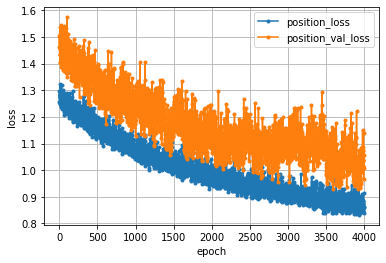

In [53]:
# 学習経過の可視化(位置)
position_loss     = position_history.history['loss']
position_val_loss = position_history.history['val_loss']

nb_epoch = len(position_loss)
plt.plot(range(nb_epoch), position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [58]:
# 学習(位置)
epochs = 10000
batch_size = 128
position_history = position_model.fit(position_x_train, position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(position_x_test, position_y_test))

Train on 3241 samples, validate on 811 samples
Epoch 1/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.9279 - accuracy: 0.6384 - val_loss: 1.1252 - val_accuracy: 0.6301
Epoch 2/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8819 - accuracy: 0.6665 - val_loss: 1.0458 - val_accuracy: 0.6424
Epoch 3/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8701 - accuracy: 0.6683 - val_loss: 1.0108 - val_accuracy: 0.6769
Epoch 4/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8735 - accuracy: 0.6624 - val_loss: 1.0841 - val_accuracy: 0.6350
Epoch 5/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8858 - accuracy: 0.6498 - val_loss: 1.0360 - val_accuracy: 0.6646
Epoch 6/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8585 - accuracy: 0.6720 - val_loss: 1.0893 - val_accuracy: 0.6510
Epoch 7/10000
3241/3241 [==============================] - 0s 33u

Epoch 56/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8658 - accuracy: 0.6646 - val_loss: 1.0753 - val_accuracy: 0.6572
Epoch 57/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8547 - accuracy: 0.6803 - val_loss: 1.0139 - val_accuracy: 0.6720
Epoch 58/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8379 - accuracy: 0.6878 - val_loss: 1.0711 - val_accuracy: 0.6449
Epoch 59/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8467 - accuracy: 0.6807 - val_loss: 1.0300 - val_accuracy: 0.6597
Epoch 60/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.9023 - accuracy: 0.6510 - val_loss: 1.0127 - val_accuracy: 0.6436
Epoch 61/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8496 - accuracy: 0.6692 - val_loss: 1.0006 - val_accuracy: 0.6745
Epoch 62/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8477 - accuracy: 0.6637

Epoch 111/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8927 - accuracy: 0.6421 - val_loss: 1.1017 - val_accuracy: 0.6400
Epoch 112/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8629 - accuracy: 0.6600 - val_loss: 1.0747 - val_accuracy: 0.6264
Epoch 113/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8578 - accuracy: 0.6668 - val_loss: 1.0838 - val_accuracy: 0.6400
Epoch 114/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8861 - accuracy: 0.6498 - val_loss: 1.0077 - val_accuracy: 0.6609
Epoch 115/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8447 - accuracy: 0.6834 - val_loss: 0.9930 - val_accuracy: 0.6757
Epoch 116/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8352 - accuracy: 0.6779 - val_loss: 1.0471 - val_accuracy: 0.6695
Epoch 117/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8462 - accuracy:

3241/3241 [==============================] - 0s 36us/step - loss: 0.8634 - accuracy: 0.6686 - val_loss: 0.9743 - val_accuracy: 0.6547
Epoch 166/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8386 - accuracy: 0.6813 - val_loss: 1.0362 - val_accuracy: 0.6523
Epoch 167/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8752 - accuracy: 0.6655 - val_loss: 0.9884 - val_accuracy: 0.6560
Epoch 168/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8699 - accuracy: 0.6643 - val_loss: 1.0000 - val_accuracy: 0.6671
Epoch 169/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8543 - accuracy: 0.6578 - val_loss: 1.0750 - val_accuracy: 0.6239
Epoch 170/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8673 - accuracy: 0.6643 - val_loss: 1.1020 - val_accuracy: 0.6486
Epoch 171/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8676 - accuracy: 0.6739 - val_lo

Epoch 220/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8815 - accuracy: 0.6550 - val_loss: 1.0144 - val_accuracy: 0.6732
Epoch 221/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8448 - accuracy: 0.6797 - val_loss: 1.0375 - val_accuracy: 0.6609
Epoch 222/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8412 - accuracy: 0.6757 - val_loss: 0.9998 - val_accuracy: 0.6708
Epoch 223/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8322 - accuracy: 0.6794 - val_loss: 0.9639 - val_accuracy: 0.6745
Epoch 224/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8989 - accuracy: 0.6523 - val_loss: 0.9962 - val_accuracy: 0.6819
Epoch 225/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8455 - accuracy: 0.6714 - val_loss: 1.0268 - val_accuracy: 0.6560
Epoch 226/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8788 - accuracy:

3241/3241 [==============================] - 0s 34us/step - loss: 0.8764 - accuracy: 0.6668 - val_loss: 1.0361 - val_accuracy: 0.6597
Epoch 275/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8492 - accuracy: 0.6723 - val_loss: 0.9499 - val_accuracy: 0.6917
Epoch 276/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8128 - accuracy: 0.6936 - val_loss: 1.0251 - val_accuracy: 0.6510
Epoch 277/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8797 - accuracy: 0.6541 - val_loss: 1.0564 - val_accuracy: 0.6473
Epoch 278/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8645 - accuracy: 0.6538 - val_loss: 1.0368 - val_accuracy: 0.6400
Epoch 279/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8896 - accuracy: 0.6544 - val_loss: 1.0889 - val_accuracy: 0.6289
Epoch 280/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8895 - accuracy: 0.6646 - val_lo

Epoch 329/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8926 - accuracy: 0.6606 - val_loss: 1.0609 - val_accuracy: 0.6461
Epoch 330/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8468 - accuracy: 0.6760 - val_loss: 1.0349 - val_accuracy: 0.6510
Epoch 331/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8551 - accuracy: 0.6637 - val_loss: 1.0269 - val_accuracy: 0.6609
Epoch 332/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8701 - accuracy: 0.6597 - val_loss: 1.0409 - val_accuracy: 0.6683
Epoch 333/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8568 - accuracy: 0.6668 - val_loss: 1.0759 - val_accuracy: 0.6436
Epoch 334/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8297 - accuracy: 0.6748 - val_loss: 1.0449 - val_accuracy: 0.6560
Epoch 335/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8608 - accuracy:

3241/3241 [==============================] - 0s 33us/step - loss: 0.8367 - accuracy: 0.6717 - val_loss: 1.0638 - val_accuracy: 0.6658
Epoch 384/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8286 - accuracy: 0.6859 - val_loss: 0.9634 - val_accuracy: 0.6621
Epoch 385/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.8369 - accuracy: 0.6748 - val_loss: 1.0708 - val_accuracy: 0.6276
Epoch 386/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.8554 - accuracy: 0.6634 - val_loss: 0.9861 - val_accuracy: 0.6856
Epoch 387/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8287 - accuracy: 0.6689 - val_loss: 1.0035 - val_accuracy: 0.6769
Epoch 388/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8488 - accuracy: 0.6773 - val_loss: 1.0300 - val_accuracy: 0.6449
Epoch 389/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8371 - accuracy: 0.6754 - val_lo

Epoch 438/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8481 - accuracy: 0.6732 - val_loss: 1.0941 - val_accuracy: 0.6732
Epoch 439/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8353 - accuracy: 0.6726 - val_loss: 1.1753 - val_accuracy: 0.6165
Epoch 440/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8803 - accuracy: 0.6557 - val_loss: 1.0822 - val_accuracy: 0.6104
Epoch 441/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8941 - accuracy: 0.6424 - val_loss: 0.9924 - val_accuracy: 0.6387
Epoch 442/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8847 - accuracy: 0.6581 - val_loss: 0.9860 - val_accuracy: 0.6239
Epoch 443/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8670 - accuracy: 0.6550 - val_loss: 0.9119 - val_accuracy: 0.6671
Epoch 444/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8856 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 0.8418 - accuracy: 0.6720 - val_loss: 0.9698 - val_accuracy: 0.6831
Epoch 493/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8229 - accuracy: 0.6859 - val_loss: 0.9666 - val_accuracy: 0.6905
Epoch 494/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.8381 - accuracy: 0.6779 - val_loss: 0.9945 - val_accuracy: 0.6584
Epoch 495/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.8343 - accuracy: 0.6726 - val_loss: 0.9921 - val_accuracy: 0.6708
Epoch 496/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.8918 - accuracy: 0.6547 - val_loss: 0.9744 - val_accuracy: 0.6732
Epoch 497/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.8936 - accuracy: 0.6591 - val_loss: 0.9745 - val_accuracy: 0.6782
Epoch 498/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.8537 - accuracy: 0.6637 - val_lo

Epoch 547/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.8661 - accuracy: 0.6649 - val_loss: 0.9878 - val_accuracy: 0.6979
Epoch 548/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8148 - accuracy: 0.6927 - val_loss: 1.0016 - val_accuracy: 0.6560
Epoch 549/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8466 - accuracy: 0.6739 - val_loss: 0.9804 - val_accuracy: 0.6905
Epoch 550/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8565 - accuracy: 0.6662 - val_loss: 1.0355 - val_accuracy: 0.6276
Epoch 551/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8330 - accuracy: 0.6810 - val_loss: 1.0047 - val_accuracy: 0.6843
Epoch 552/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8422 - accuracy: 0.6791 - val_loss: 1.0453 - val_accuracy: 0.6449
Epoch 553/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8359 - accuracy:

3241/3241 [==============================] - 0s 45us/step - loss: 0.8463 - accuracy: 0.6686 - val_loss: 0.9870 - val_accuracy: 0.6794
Epoch 602/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8648 - accuracy: 0.6665 - val_loss: 1.0100 - val_accuracy: 0.6436
Epoch 603/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.8583 - accuracy: 0.6751 - val_loss: 1.0385 - val_accuracy: 0.6819
Epoch 604/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8764 - accuracy: 0.6637 - val_loss: 1.0953 - val_accuracy: 0.6671
Epoch 605/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8605 - accuracy: 0.6680 - val_loss: 1.0789 - val_accuracy: 0.6301
Epoch 606/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.9093 - accuracy: 0.6529 - val_loss: 1.0317 - val_accuracy: 0.6757
Epoch 607/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8804 - accuracy: 0.6640 - val_lo

Epoch 656/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8342 - accuracy: 0.6788 - val_loss: 1.0328 - val_accuracy: 0.6227
Epoch 657/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8284 - accuracy: 0.6822 - val_loss: 0.9880 - val_accuracy: 0.6794
Epoch 658/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8154 - accuracy: 0.6878 - val_loss: 1.0158 - val_accuracy: 0.6671
Epoch 659/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8348 - accuracy: 0.6878 - val_loss: 0.9522 - val_accuracy: 0.6720
Epoch 660/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8331 - accuracy: 0.6612 - val_loss: 0.9788 - val_accuracy: 0.6597
Epoch 661/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8139 - accuracy: 0.6853 - val_loss: 0.9448 - val_accuracy: 0.6350
Epoch 662/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.8365 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.8805 - accuracy: 0.6751 - val_loss: 0.9555 - val_accuracy: 0.6621
Epoch 711/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8446 - accuracy: 0.6751 - val_loss: 0.9926 - val_accuracy: 0.6757
Epoch 712/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8236 - accuracy: 0.6797 - val_loss: 1.0184 - val_accuracy: 0.6523
Epoch 713/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8142 - accuracy: 0.6924 - val_loss: 0.9249 - val_accuracy: 0.6856
Epoch 714/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8023 - accuracy: 0.6911 - val_loss: 0.9161 - val_accuracy: 0.6646
Epoch 715/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8415 - accuracy: 0.6729 - val_loss: 1.0208 - val_accuracy: 0.6486
Epoch 716/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8896 - accuracy: 0.6412 - val_lo

Epoch 765/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8895 - accuracy: 0.6523 - val_loss: 1.0814 - val_accuracy: 0.6880
Epoch 766/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8581 - accuracy: 0.6702 - val_loss: 1.1222 - val_accuracy: 0.6165
Epoch 767/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8245 - accuracy: 0.6776 - val_loss: 1.1121 - val_accuracy: 0.6350
Epoch 768/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8185 - accuracy: 0.6844 - val_loss: 1.0448 - val_accuracy: 0.6658
Epoch 769/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8406 - accuracy: 0.6717 - val_loss: 1.0659 - val_accuracy: 0.6646
Epoch 770/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8165 - accuracy: 0.6837 - val_loss: 1.0165 - val_accuracy: 0.6868
Epoch 771/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8314 - accuracy:

3241/3241 [==============================] - 0s 31us/step - loss: 0.8212 - accuracy: 0.6964 - val_loss: 1.1110 - val_accuracy: 0.6535
Epoch 820/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8232 - accuracy: 0.6840 - val_loss: 1.0350 - val_accuracy: 0.6880
Epoch 821/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8004 - accuracy: 0.6887 - val_loss: 1.0242 - val_accuracy: 0.6720
Epoch 822/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8328 - accuracy: 0.6794 - val_loss: 1.0394 - val_accuracy: 0.6979
Epoch 823/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8202 - accuracy: 0.6868 - val_loss: 1.0666 - val_accuracy: 0.6720
Epoch 824/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8117 - accuracy: 0.6856 - val_loss: 1.0138 - val_accuracy: 0.7028
Epoch 825/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8224 - accuracy: 0.6791 - val_lo

Epoch 874/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8295 - accuracy: 0.6847 - val_loss: 1.0381 - val_accuracy: 0.6732
Epoch 875/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8365 - accuracy: 0.6788 - val_loss: 1.0420 - val_accuracy: 0.6424
Epoch 876/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8052 - accuracy: 0.6896 - val_loss: 1.0183 - val_accuracy: 0.6769
Epoch 877/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8171 - accuracy: 0.6770 - val_loss: 1.0147 - val_accuracy: 0.6782
Epoch 878/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8084 - accuracy: 0.6844 - val_loss: 0.9912 - val_accuracy: 0.7016
Epoch 879/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8622 - accuracy: 0.6581 - val_loss: 1.0233 - val_accuracy: 0.6979
Epoch 880/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8098 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.8090 - accuracy: 0.6915 - val_loss: 1.0967 - val_accuracy: 0.6794
Epoch 929/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8522 - accuracy: 0.6726 - val_loss: 1.0005 - val_accuracy: 0.6560
Epoch 930/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8730 - accuracy: 0.6615 - val_loss: 1.1802 - val_accuracy: 0.6153
Epoch 931/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8755 - accuracy: 0.6674 - val_loss: 0.9819 - val_accuracy: 0.6769
Epoch 932/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8020 - accuracy: 0.6952 - val_loss: 1.0360 - val_accuracy: 0.6745
Epoch 933/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8095 - accuracy: 0.6834 - val_loss: 0.9780 - val_accuracy: 0.6794
Epoch 934/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8229 - accuracy: 0.6794 - val_lo

Epoch 983/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8434 - accuracy: 0.6803 - val_loss: 1.0914 - val_accuracy: 0.6634
Epoch 984/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8205 - accuracy: 0.6899 - val_loss: 1.0826 - val_accuracy: 0.6436
Epoch 985/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8431 - accuracy: 0.6705 - val_loss: 1.0269 - val_accuracy: 0.6967
Epoch 986/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8557 - accuracy: 0.6665 - val_loss: 1.1857 - val_accuracy: 0.6141
Epoch 987/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8873 - accuracy: 0.6473 - val_loss: 1.0824 - val_accuracy: 0.6646
Epoch 988/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8372 - accuracy: 0.6699 - val_loss: 1.0583 - val_accuracy: 0.6720
Epoch 989/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8317 - accuracy:

3241/3241 [==============================] - 0s 42us/step - loss: 0.8268 - accuracy: 0.6736 - val_loss: 1.1607 - val_accuracy: 0.6609
Epoch 1038/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.8742 - accuracy: 0.6554 - val_loss: 1.2039 - val_accuracy: 0.6461
Epoch 1039/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.8373 - accuracy: 0.6736 - val_loss: 1.0550 - val_accuracy: 0.6954
Epoch 1040/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8043 - accuracy: 0.6908 - val_loss: 1.0908 - val_accuracy: 0.6720
Epoch 1041/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.8054 - accuracy: 0.6881 - val_loss: 1.0747 - val_accuracy: 0.6794
Epoch 1042/10000
3241/3241 [==============================] - 0s 92us/step - loss: 0.8191 - accuracy: 0.6850 - val_loss: 1.0476 - val_accuracy: 0.6917
Epoch 1043/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.8046 - accuracy: 0.6924 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.8796 - accuracy: 0.6680 - val_loss: 1.0585 - val_accuracy: 0.6843
Epoch 1092/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8081 - accuracy: 0.6992 - val_loss: 1.0521 - val_accuracy: 0.6646
Epoch 1093/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8535 - accuracy: 0.6766 - val_loss: 1.0711 - val_accuracy: 0.6584
Epoch 1094/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8335 - accuracy: 0.6773 - val_loss: 1.0529 - val_accuracy: 0.6720
Epoch 1095/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8396 - accuracy: 0.6773 - val_loss: 1.0568 - val_accuracy: 0.6658
Epoch 1096/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8041 - accuracy: 0.6807 - val_loss: 1.0526 - val_accuracy: 0.6769
Epoch 1097/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8073 - accuracy: 0.6890 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.8183 - accuracy: 0.6871 - val_loss: 0.9686 - val_accuracy: 0.6609
Epoch 1146/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7984 - accuracy: 0.6958 - val_loss: 0.9522 - val_accuracy: 0.6720
Epoch 1147/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8444 - accuracy: 0.6665 - val_loss: 0.9528 - val_accuracy: 0.6880
Epoch 1148/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8030 - accuracy: 0.6862 - val_loss: 0.9705 - val_accuracy: 0.6806
Epoch 1149/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8325 - accuracy: 0.6847 - val_loss: 1.0369 - val_accuracy: 0.6646
Epoch 1150/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8327 - accuracy: 0.6689 - val_loss: 1.0146 - val_accuracy: 0.6584
Epoch 1151/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8285 - accuracy: 0.6791 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.8294 - accuracy: 0.6807 - val_loss: 0.9387 - val_accuracy: 0.6634
Epoch 1200/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8055 - accuracy: 0.6915 - val_loss: 0.9922 - val_accuracy: 0.6634
Epoch 1201/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8290 - accuracy: 0.6822 - val_loss: 0.9273 - val_accuracy: 0.6819
Epoch 1202/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8190 - accuracy: 0.6810 - val_loss: 0.8935 - val_accuracy: 0.6930
Epoch 1203/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8343 - accuracy: 0.6868 - val_loss: 1.0931 - val_accuracy: 0.6461
Epoch 1204/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8566 - accuracy: 0.6856 - val_loss: 0.9805 - val_accuracy: 0.6584
Epoch 1205/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8134 - accuracy: 0.6921 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.8181 - accuracy: 0.6859 - val_loss: 0.9335 - val_accuracy: 0.6794
Epoch 1254/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8038 - accuracy: 0.6915 - val_loss: 0.9811 - val_accuracy: 0.6523
Epoch 1255/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8396 - accuracy: 0.6683 - val_loss: 0.9898 - val_accuracy: 0.6621
Epoch 1256/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.8171 - accuracy: 0.6813 - val_loss: 0.9436 - val_accuracy: 0.7065
Epoch 1257/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.8182 - accuracy: 0.6862 - val_loss: 0.9378 - val_accuracy: 0.6819
Epoch 1258/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.8113 - accuracy: 0.7004 - val_loss: 0.9855 - val_accuracy: 0.6498
Epoch 1259/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.8178 - accuracy: 0.6695 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.8128 - accuracy: 0.6807 - val_loss: 0.9839 - val_accuracy: 0.6843
Epoch 1308/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8042 - accuracy: 0.6927 - val_loss: 0.9813 - val_accuracy: 0.6720
Epoch 1309/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8516 - accuracy: 0.6662 - val_loss: 1.0797 - val_accuracy: 0.6510
Epoch 1310/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8396 - accuracy: 0.6668 - val_loss: 1.0987 - val_accuracy: 0.6301
Epoch 1311/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8222 - accuracy: 0.6908 - val_loss: 0.9884 - val_accuracy: 0.6560
Epoch 1312/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8260 - accuracy: 0.6751 - val_loss: 1.0016 - val_accuracy: 0.6547
Epoch 1313/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.8305 - accuracy: 0.6742 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.8217 - accuracy: 0.6757 - val_loss: 0.9362 - val_accuracy: 0.6671
Epoch 1362/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8096 - accuracy: 0.6936 - val_loss: 0.9195 - val_accuracy: 0.6695
Epoch 1363/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8095 - accuracy: 0.6862 - val_loss: 0.9063 - val_accuracy: 0.6856
Epoch 1364/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8513 - accuracy: 0.6677 - val_loss: 0.9652 - val_accuracy: 0.6831
Epoch 1365/10000
3241/3241 [==============================] - 0s 47us/step - loss: 0.8223 - accuracy: 0.6828 - val_loss: 0.9279 - val_accuracy: 0.6634
Epoch 1366/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8175 - accuracy: 0.6837 - val_loss: 0.9271 - val_accuracy: 0.6769
Epoch 1367/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7904 - accuracy: 0.6955 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.8262 - accuracy: 0.6785 - val_loss: 1.0028 - val_accuracy: 0.6732
Epoch 1416/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8469 - accuracy: 0.6689 - val_loss: 1.0061 - val_accuracy: 0.6769
Epoch 1417/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8343 - accuracy: 0.6732 - val_loss: 1.0077 - val_accuracy: 0.6609
Epoch 1418/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8059 - accuracy: 0.6887 - val_loss: 0.9561 - val_accuracy: 0.6794
Epoch 1419/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8405 - accuracy: 0.6711 - val_loss: 1.0115 - val_accuracy: 0.6584
Epoch 1420/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.8317 - accuracy: 0.6754 - val_loss: 1.0222 - val_accuracy: 0.6449
Epoch 1421/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8131 - accuracy: 0.6773 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.7907 - accuracy: 0.6896 - val_loss: 0.9609 - val_accuracy: 0.6806
Epoch 1470/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8016 - accuracy: 0.6859 - val_loss: 0.9767 - val_accuracy: 0.6720
Epoch 1471/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7948 - accuracy: 0.6939 - val_loss: 0.9796 - val_accuracy: 0.6584
Epoch 1472/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8120 - accuracy: 0.6776 - val_loss: 1.0076 - val_accuracy: 0.6572
Epoch 1473/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7904 - accuracy: 0.6890 - val_loss: 0.9558 - val_accuracy: 0.6868
Epoch 1474/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8224 - accuracy: 0.6732 - val_loss: 0.9849 - val_accuracy: 0.6634
Epoch 1475/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7931 - accuracy: 0.6918 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.7967 - accuracy: 0.6754 - val_loss: 0.9805 - val_accuracy: 0.6720
Epoch 1524/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.8440 - accuracy: 0.6782 - val_loss: 1.0240 - val_accuracy: 0.6597
Epoch 1525/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8193 - accuracy: 0.6844 - val_loss: 0.9886 - val_accuracy: 0.6757
Epoch 1526/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.8068 - accuracy: 0.6816 - val_loss: 1.0215 - val_accuracy: 0.6671
Epoch 1527/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8131 - accuracy: 0.6878 - val_loss: 1.0460 - val_accuracy: 0.6695
Epoch 1528/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7857 - accuracy: 0.7001 - val_loss: 0.9878 - val_accuracy: 0.6535
Epoch 1529/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8102 - accuracy: 0.6847 - 

3241/3241 [==============================] - 0s 47us/step - loss: 0.7822 - accuracy: 0.7127 - val_loss: 0.9307 - val_accuracy: 0.6609
Epoch 1578/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.8196 - accuracy: 0.6745 - val_loss: 0.9543 - val_accuracy: 0.6794
Epoch 1579/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7942 - accuracy: 0.7016 - val_loss: 0.8921 - val_accuracy: 0.6942
Epoch 1580/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7778 - accuracy: 0.7010 - val_loss: 0.8779 - val_accuracy: 0.6683
Epoch 1581/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7865 - accuracy: 0.6915 - val_loss: 0.9521 - val_accuracy: 0.6375
Epoch 1582/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8262 - accuracy: 0.6702 - val_loss: 0.9643 - val_accuracy: 0.6584
Epoch 1583/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8249 - accuracy: 0.6840 - 

3241/3241 [==============================] - 0s 45us/step - loss: 0.7986 - accuracy: 0.6893 - val_loss: 0.9898 - val_accuracy: 0.6436
Epoch 1632/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.8128 - accuracy: 0.6911 - val_loss: 1.0167 - val_accuracy: 0.6782
Epoch 1633/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.8029 - accuracy: 0.7010 - val_loss: 0.9791 - val_accuracy: 0.7041
Epoch 1634/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8090 - accuracy: 0.6797 - val_loss: 0.9020 - val_accuracy: 0.6905
Epoch 1635/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8014 - accuracy: 0.6985 - val_loss: 1.0493 - val_accuracy: 0.6905
Epoch 1636/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8031 - accuracy: 0.6915 - val_loss: 0.9892 - val_accuracy: 0.6658
Epoch 1637/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7846 - accuracy: 0.6967 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7958 - accuracy: 0.6924 - val_loss: 0.9572 - val_accuracy: 0.6819
Epoch 1686/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8146 - accuracy: 0.6760 - val_loss: 0.9540 - val_accuracy: 0.7016
Epoch 1687/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8143 - accuracy: 0.6776 - val_loss: 1.0549 - val_accuracy: 0.6227
Epoch 1688/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8313 - accuracy: 0.6773 - val_loss: 0.9670 - val_accuracy: 0.7016
Epoch 1689/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8169 - accuracy: 0.6822 - val_loss: 1.0036 - val_accuracy: 0.6806
Epoch 1690/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8015 - accuracy: 0.6865 - val_loss: 0.9844 - val_accuracy: 0.6745
Epoch 1691/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8014 - accuracy: 0.6899 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7903 - accuracy: 0.7041 - val_loss: 0.9448 - val_accuracy: 0.6954
Epoch 1740/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8153 - accuracy: 0.6831 - val_loss: 1.0257 - val_accuracy: 0.6572
Epoch 1741/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7838 - accuracy: 0.7032 - val_loss: 0.9983 - val_accuracy: 0.6535
Epoch 1742/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8247 - accuracy: 0.6782 - val_loss: 0.9908 - val_accuracy: 0.6856
Epoch 1743/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8132 - accuracy: 0.6973 - val_loss: 1.0264 - val_accuracy: 0.6671
Epoch 1744/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8369 - accuracy: 0.6834 - val_loss: 1.0530 - val_accuracy: 0.6412
Epoch 1745/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8555 - accuracy: 0.6729 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.7621 - accuracy: 0.7019 - val_loss: 0.9453 - val_accuracy: 0.6954
Epoch 1794/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7854 - accuracy: 0.6970 - val_loss: 1.0704 - val_accuracy: 0.6708
Epoch 1795/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8285 - accuracy: 0.6810 - val_loss: 1.0109 - val_accuracy: 0.6621
Epoch 1796/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8276 - accuracy: 0.6785 - val_loss: 1.0076 - val_accuracy: 0.6683
Epoch 1797/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8013 - accuracy: 0.6908 - val_loss: 1.0208 - val_accuracy: 0.6547
Epoch 1798/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7999 - accuracy: 0.6976 - val_loss: 0.9550 - val_accuracy: 0.6745
Epoch 1799/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7839 - accuracy: 0.7010 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7944 - accuracy: 0.6918 - val_loss: 1.0052 - val_accuracy: 0.6917
Epoch 1848/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8265 - accuracy: 0.6791 - val_loss: 0.9953 - val_accuracy: 0.6769
Epoch 1849/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8264 - accuracy: 0.6745 - val_loss: 1.0114 - val_accuracy: 0.6609
Epoch 1850/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.8045 - accuracy: 0.6794 - val_loss: 0.9788 - val_accuracy: 0.6523
Epoch 1851/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7956 - accuracy: 0.6921 - val_loss: 0.9617 - val_accuracy: 0.6954
Epoch 1852/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7496 - accuracy: 0.7155 - val_loss: 0.9459 - val_accuracy: 0.7028
Epoch 1853/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7696 - accuracy: 0.7066 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.8391 - accuracy: 0.6819 - val_loss: 1.0295 - val_accuracy: 0.6363
Epoch 1902/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8328 - accuracy: 0.6624 - val_loss: 0.8996 - val_accuracy: 0.7016
Epoch 1903/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7803 - accuracy: 0.7026 - val_loss: 1.0149 - val_accuracy: 0.6708
Epoch 1904/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8011 - accuracy: 0.6893 - val_loss: 1.0589 - val_accuracy: 0.6880
Epoch 1905/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7724 - accuracy: 0.7066 - val_loss: 0.8887 - val_accuracy: 0.6967
Epoch 1906/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7726 - accuracy: 0.7118 - val_loss: 0.9049 - val_accuracy: 0.6708
Epoch 1907/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7813 - accuracy: 0.7016 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.8204 - accuracy: 0.6881 - val_loss: 0.9553 - val_accuracy: 0.6819
Epoch 1956/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8222 - accuracy: 0.6785 - val_loss: 0.8765 - val_accuracy: 0.6806
Epoch 1957/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8111 - accuracy: 0.6773 - val_loss: 0.9243 - val_accuracy: 0.6708
Epoch 1958/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8303 - accuracy: 0.6757 - val_loss: 1.0143 - val_accuracy: 0.6695
Epoch 1959/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8162 - accuracy: 0.6862 - val_loss: 0.8989 - val_accuracy: 0.6708
Epoch 1960/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7706 - accuracy: 0.7050 - val_loss: 0.8725 - val_accuracy: 0.7041
Epoch 1961/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7774 - accuracy: 0.7069 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7598 - accuracy: 0.7081 - val_loss: 0.9505 - val_accuracy: 0.6967
Epoch 2010/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8129 - accuracy: 0.6856 - val_loss: 0.9153 - val_accuracy: 0.7164
Epoch 2011/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7685 - accuracy: 0.7038 - val_loss: 0.9392 - val_accuracy: 0.6868
Epoch 2012/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7904 - accuracy: 0.6908 - val_loss: 0.9649 - val_accuracy: 0.6843
Epoch 2013/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7823 - accuracy: 0.7007 - val_loss: 0.9353 - val_accuracy: 0.6893
Epoch 2014/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7598 - accuracy: 0.7195 - val_loss: 0.9726 - val_accuracy: 0.6646
Epoch 2015/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7897 - accuracy: 0.6893 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.7732 - accuracy: 0.7066 - val_loss: 0.9431 - val_accuracy: 0.6819
Epoch 2064/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7947 - accuracy: 0.6924 - val_loss: 0.9738 - val_accuracy: 0.6745
Epoch 2065/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7810 - accuracy: 0.6921 - val_loss: 0.9076 - val_accuracy: 0.7078
Epoch 2066/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7447 - accuracy: 0.7168 - val_loss: 0.9163 - val_accuracy: 0.6695
Epoch 2067/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7952 - accuracy: 0.6945 - val_loss: 0.9198 - val_accuracy: 0.6930
Epoch 2068/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7841 - accuracy: 0.7066 - val_loss: 0.9284 - val_accuracy: 0.6954
Epoch 2069/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8301 - accuracy: 0.6800 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7860 - accuracy: 0.6924 - val_loss: 0.9654 - val_accuracy: 0.7053
Epoch 2118/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7844 - accuracy: 0.6976 - val_loss: 1.0048 - val_accuracy: 0.6979
Epoch 2119/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7794 - accuracy: 0.7087 - val_loss: 1.0306 - val_accuracy: 0.6646
Epoch 2120/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7709 - accuracy: 0.7121 - val_loss: 0.9974 - val_accuracy: 0.6868
Epoch 2121/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7903 - accuracy: 0.6964 - val_loss: 0.9897 - val_accuracy: 0.6769
Epoch 2122/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7729 - accuracy: 0.7023 - val_loss: 1.0510 - val_accuracy: 0.6683
Epoch 2123/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7783 - accuracy: 0.7016 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.8243 - accuracy: 0.6893 - val_loss: 1.0230 - val_accuracy: 0.6720
Epoch 2172/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8045 - accuracy: 0.6760 - val_loss: 1.0639 - val_accuracy: 0.6621
Epoch 2173/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7850 - accuracy: 0.7013 - val_loss: 1.0248 - val_accuracy: 0.6794
Epoch 2174/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7902 - accuracy: 0.6970 - val_loss: 1.0445 - val_accuracy: 0.6720
Epoch 2175/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.8187 - accuracy: 0.6899 - val_loss: 1.0088 - val_accuracy: 0.6757
Epoch 2176/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7814 - accuracy: 0.7087 - val_loss: 0.9827 - val_accuracy: 0.7398
Epoch 2177/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7696 - accuracy: 0.7146 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7848 - accuracy: 0.6911 - val_loss: 1.0038 - val_accuracy: 0.7041
Epoch 2226/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7843 - accuracy: 0.6967 - val_loss: 1.0321 - val_accuracy: 0.6819
Epoch 2227/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7575 - accuracy: 0.7140 - val_loss: 1.0094 - val_accuracy: 0.6967
Epoch 2228/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7867 - accuracy: 0.6927 - val_loss: 1.0107 - val_accuracy: 0.6930
Epoch 2229/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8249 - accuracy: 0.6813 - val_loss: 1.0988 - val_accuracy: 0.6584
Epoch 2230/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7802 - accuracy: 0.7026 - val_loss: 1.0066 - val_accuracy: 0.7041
Epoch 2231/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7887 - accuracy: 0.6930 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.7841 - accuracy: 0.7023 - val_loss: 0.9909 - val_accuracy: 0.6831
Epoch 2280/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7764 - accuracy: 0.7053 - val_loss: 0.9969 - val_accuracy: 0.6831
Epoch 2281/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7921 - accuracy: 0.6896 - val_loss: 0.9827 - val_accuracy: 0.6560
Epoch 2282/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8295 - accuracy: 0.6649 - val_loss: 1.0417 - val_accuracy: 0.6695
Epoch 2283/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7965 - accuracy: 0.6930 - val_loss: 1.0371 - val_accuracy: 0.6572
Epoch 2284/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.8176 - accuracy: 0.6982 - val_loss: 0.9759 - val_accuracy: 0.6806
Epoch 2285/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7760 - accuracy: 0.7023 - 

3241/3241 [==============================] - 0s 43us/step - loss: 0.7647 - accuracy: 0.7081 - val_loss: 1.0002 - val_accuracy: 0.7139
Epoch 2334/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7940 - accuracy: 0.6881 - val_loss: 1.0638 - val_accuracy: 0.6819
Epoch 2335/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.8176 - accuracy: 0.6831 - val_loss: 1.0964 - val_accuracy: 0.6498
Epoch 2336/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7709 - accuracy: 0.7047 - val_loss: 1.0361 - val_accuracy: 0.7028
Epoch 2337/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7815 - accuracy: 0.7140 - val_loss: 1.0337 - val_accuracy: 0.6991
Epoch 2338/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8151 - accuracy: 0.6702 - val_loss: 1.1324 - val_accuracy: 0.6831
Epoch 2339/10000
3241/3241 [==============================] - 0s 47us/step - loss: 0.8008 - accuracy: 0.6881 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7860 - accuracy: 0.6874 - val_loss: 1.0759 - val_accuracy: 0.6868
Epoch 2388/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7940 - accuracy: 0.6936 - val_loss: 1.0619 - val_accuracy: 0.6954
Epoch 2389/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7581 - accuracy: 0.7195 - val_loss: 1.0571 - val_accuracy: 0.6967
Epoch 2390/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7564 - accuracy: 0.7134 - val_loss: 1.0297 - val_accuracy: 0.6856
Epoch 2391/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7748 - accuracy: 0.7026 - val_loss: 1.0615 - val_accuracy: 0.6621
Epoch 2392/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8162 - accuracy: 0.6939 - val_loss: 1.0331 - val_accuracy: 0.6732
Epoch 2393/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8219 - accuracy: 0.6779 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.7678 - accuracy: 0.7087 - val_loss: 1.0886 - val_accuracy: 0.6560
Epoch 2442/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7872 - accuracy: 0.6908 - val_loss: 1.0034 - val_accuracy: 0.6720
Epoch 2443/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7793 - accuracy: 0.6952 - val_loss: 0.9991 - val_accuracy: 0.6646
Epoch 2444/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7671 - accuracy: 0.7019 - val_loss: 0.9509 - val_accuracy: 0.6917
Epoch 2445/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.8129 - accuracy: 0.6930 - val_loss: 0.9677 - val_accuracy: 0.6720
Epoch 2446/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7658 - accuracy: 0.7023 - val_loss: 0.9647 - val_accuracy: 0.6794
Epoch 2447/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7716 - accuracy: 0.7038 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7664 - accuracy: 0.7146 - val_loss: 0.9631 - val_accuracy: 0.7053
Epoch 2496/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7841 - accuracy: 0.6992 - val_loss: 1.0008 - val_accuracy: 0.6819
Epoch 2497/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7791 - accuracy: 0.6905 - val_loss: 1.1042 - val_accuracy: 0.6424
Epoch 2498/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.7919 - accuracy: 0.6865 - val_loss: 1.0474 - val_accuracy: 0.6412
Epoch 2499/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7774 - accuracy: 0.6952 - val_loss: 1.0005 - val_accuracy: 0.6782
Epoch 2500/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7768 - accuracy: 0.7087 - val_loss: 1.0229 - val_accuracy: 0.6917
Epoch 2501/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7812 - accuracy: 0.6967 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.8106 - accuracy: 0.6825 - val_loss: 1.0214 - val_accuracy: 0.6646
Epoch 2550/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8211 - accuracy: 0.6819 - val_loss: 1.0253 - val_accuracy: 0.6843
Epoch 2551/10000
3241/3241 [==============================] - 0s 68us/step - loss: 0.7793 - accuracy: 0.6982 - val_loss: 0.9659 - val_accuracy: 0.6806
Epoch 2552/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7829 - accuracy: 0.6955 - val_loss: 0.9379 - val_accuracy: 0.7065
Epoch 2553/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7618 - accuracy: 0.7100 - val_loss: 0.9424 - val_accuracy: 0.6745
Epoch 2554/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7905 - accuracy: 0.6878 - val_loss: 1.0792 - val_accuracy: 0.6486
Epoch 2555/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7794 - accuracy: 0.7007 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.7830 - accuracy: 0.6927 - val_loss: 1.0337 - val_accuracy: 0.6905
Epoch 2604/10000
3241/3241 [==============================] - 0s 57us/step - loss: 0.7529 - accuracy: 0.7115 - val_loss: 1.0162 - val_accuracy: 0.6708
Epoch 2605/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.7589 - accuracy: 0.7041 - val_loss: 1.0258 - val_accuracy: 0.7065
Epoch 2606/10000
3241/3241 [==============================] - 0s 81us/step - loss: 0.7971 - accuracy: 0.6847 - val_loss: 1.0528 - val_accuracy: 0.7041
Epoch 2607/10000
3241/3241 [==============================] - 0s 50us/step - loss: 0.7912 - accuracy: 0.6985 - val_loss: 1.0160 - val_accuracy: 0.6683
Epoch 2608/10000
3241/3241 [==============================] - 0s 56us/step - loss: 0.7879 - accuracy: 0.6902 - val_loss: 1.0987 - val_accuracy: 0.6461
Epoch 2609/10000
3241/3241 [==============================] - 0s 57us/step - loss: 0.7838 - accuracy: 0.7007 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7732 - accuracy: 0.7047 - val_loss: 1.0903 - val_accuracy: 0.6880
Epoch 2658/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8011 - accuracy: 0.6887 - val_loss: 1.0831 - val_accuracy: 0.6794
Epoch 2659/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7828 - accuracy: 0.6856 - val_loss: 1.0429 - val_accuracy: 0.6905
Epoch 2660/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7475 - accuracy: 0.7177 - val_loss: 1.0353 - val_accuracy: 0.7065
Epoch 2661/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7809 - accuracy: 0.6964 - val_loss: 1.0407 - val_accuracy: 0.7053
Epoch 2662/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7867 - accuracy: 0.6970 - val_loss: 1.0699 - val_accuracy: 0.6745
Epoch 2663/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7831 - accuracy: 0.6961 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7740 - accuracy: 0.6933 - val_loss: 1.0689 - val_accuracy: 0.6560
Epoch 2712/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8032 - accuracy: 0.6911 - val_loss: 1.0775 - val_accuracy: 0.6609
Epoch 2713/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8038 - accuracy: 0.6797 - val_loss: 1.0120 - val_accuracy: 0.6782
Epoch 2714/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7698 - accuracy: 0.6976 - val_loss: 0.9810 - val_accuracy: 0.6893
Epoch 2715/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7879 - accuracy: 0.6924 - val_loss: 1.0285 - val_accuracy: 0.6634
Epoch 2716/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7824 - accuracy: 0.6945 - val_loss: 1.0026 - val_accuracy: 0.7189
Epoch 2717/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7711 - accuracy: 0.6985 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7802 - accuracy: 0.7063 - val_loss: 0.9773 - val_accuracy: 0.7028
Epoch 2766/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7838 - accuracy: 0.6948 - val_loss: 1.0447 - val_accuracy: 0.6856
Epoch 2767/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7913 - accuracy: 0.6936 - val_loss: 0.9810 - val_accuracy: 0.6708
Epoch 2768/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7634 - accuracy: 0.7047 - val_loss: 1.0147 - val_accuracy: 0.6683
Epoch 2769/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7963 - accuracy: 0.6807 - val_loss: 1.0525 - val_accuracy: 0.6856
Epoch 2770/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8218 - accuracy: 0.6868 - val_loss: 1.0447 - val_accuracy: 0.6609
Epoch 2771/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7797 - accuracy: 0.6933 - 

3241/3241 [==============================] - 0s 38us/step - loss: 0.7596 - accuracy: 0.6893 - val_loss: 1.0304 - val_accuracy: 0.6991
Epoch 2820/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7718 - accuracy: 0.7069 - val_loss: 1.0524 - val_accuracy: 0.6819
Epoch 2821/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7697 - accuracy: 0.7035 - val_loss: 1.0757 - val_accuracy: 0.6843
Epoch 2822/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7981 - accuracy: 0.6958 - val_loss: 1.0403 - val_accuracy: 0.6843
Epoch 2823/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7575 - accuracy: 0.7090 - val_loss: 1.0448 - val_accuracy: 0.6757
Epoch 2824/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7838 - accuracy: 0.6967 - val_loss: 1.0210 - val_accuracy: 0.6757
Epoch 2825/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7806 - accuracy: 0.6970 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7508 - accuracy: 0.7177 - val_loss: 0.9356 - val_accuracy: 0.6930
Epoch 2874/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7720 - accuracy: 0.7032 - val_loss: 1.0669 - val_accuracy: 0.6486
Epoch 2875/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8055 - accuracy: 0.6887 - val_loss: 0.9418 - val_accuracy: 0.6917
Epoch 2876/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8270 - accuracy: 0.6776 - val_loss: 1.0194 - val_accuracy: 0.6942
Epoch 2877/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7733 - accuracy: 0.6924 - val_loss: 1.1203 - val_accuracy: 0.6646
Epoch 2878/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7727 - accuracy: 0.7069 - val_loss: 0.9820 - val_accuracy: 0.7238
Epoch 2879/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7993 - accuracy: 0.6896 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.8077 - accuracy: 0.6930 - val_loss: 1.0534 - val_accuracy: 0.6535
Epoch 2928/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8051 - accuracy: 0.6788 - val_loss: 0.9016 - val_accuracy: 0.6967
Epoch 2929/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8055 - accuracy: 0.6834 - val_loss: 0.9679 - val_accuracy: 0.6547
Epoch 2930/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7733 - accuracy: 0.6973 - val_loss: 0.9339 - val_accuracy: 0.6819
Epoch 2931/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7880 - accuracy: 0.6998 - val_loss: 0.9171 - val_accuracy: 0.7053
Epoch 2932/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7747 - accuracy: 0.7056 - val_loss: 0.9098 - val_accuracy: 0.6621
Epoch 2933/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7597 - accuracy: 0.7097 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7727 - accuracy: 0.6939 - val_loss: 0.8825 - val_accuracy: 0.6880
Epoch 2982/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7533 - accuracy: 0.7121 - val_loss: 0.8607 - val_accuracy: 0.7078
Epoch 2983/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7889 - accuracy: 0.6865 - val_loss: 0.8883 - val_accuracy: 0.6942
Epoch 2984/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7630 - accuracy: 0.7143 - val_loss: 0.8839 - val_accuracy: 0.6880
Epoch 2985/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7400 - accuracy: 0.7112 - val_loss: 0.8747 - val_accuracy: 0.7028
Epoch 2986/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7924 - accuracy: 0.6856 - val_loss: 0.9212 - val_accuracy: 0.6510
Epoch 2987/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.8096 - accuracy: 0.6773 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7786 - accuracy: 0.7075 - val_loss: 1.1115 - val_accuracy: 0.6412
Epoch 3036/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7809 - accuracy: 0.6915 - val_loss: 1.1142 - val_accuracy: 0.6732
Epoch 3037/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7576 - accuracy: 0.7186 - val_loss: 1.0462 - val_accuracy: 0.6794
Epoch 3038/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7524 - accuracy: 0.7013 - val_loss: 1.0668 - val_accuracy: 0.6695
Epoch 3039/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7707 - accuracy: 0.7041 - val_loss: 1.0384 - val_accuracy: 0.7028
Epoch 3040/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7611 - accuracy: 0.7053 - val_loss: 1.0614 - val_accuracy: 0.6954
Epoch 3041/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7757 - accuracy: 0.6948 - 

3241/3241 [==============================] - 0s 38us/step - loss: 0.7720 - accuracy: 0.7066 - val_loss: 0.9534 - val_accuracy: 0.7226
Epoch 3090/10000
3241/3241 [==============================] - 0s 54us/step - loss: 0.7738 - accuracy: 0.6961 - val_loss: 1.0687 - val_accuracy: 0.6424
Epoch 3091/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7988 - accuracy: 0.6881 - val_loss: 1.0886 - val_accuracy: 0.6535
Epoch 3092/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7836 - accuracy: 0.6865 - val_loss: 1.0717 - val_accuracy: 0.6831
Epoch 3093/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7599 - accuracy: 0.7050 - val_loss: 1.1024 - val_accuracy: 0.6646
Epoch 3094/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7697 - accuracy: 0.7023 - val_loss: 1.0640 - val_accuracy: 0.6695
Epoch 3095/10000
3241/3241 [==============================] - 0s 61us/step - loss: 0.7633 - accuracy: 0.7100 - 

3241/3241 [==============================] - 0s 46us/step - loss: 0.7348 - accuracy: 0.7161 - val_loss: 1.0759 - val_accuracy: 0.6609
Epoch 3144/10000
3241/3241 [==============================] - 0s 47us/step - loss: 0.7930 - accuracy: 0.6967 - val_loss: 0.9836 - val_accuracy: 0.6819
Epoch 3145/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.7907 - accuracy: 0.6942 - val_loss: 0.9694 - val_accuracy: 0.6634
Epoch 3146/10000
3241/3241 [==============================] - 0s 55us/step - loss: 0.7743 - accuracy: 0.6908 - val_loss: 0.9443 - val_accuracy: 0.7287
Epoch 3147/10000
3241/3241 [==============================] - 0s 52us/step - loss: 0.7603 - accuracy: 0.7013 - val_loss: 0.9741 - val_accuracy: 0.6856
Epoch 3148/10000
3241/3241 [==============================] - 0s 53us/step - loss: 0.7607 - accuracy: 0.6952 - val_loss: 0.9753 - val_accuracy: 0.6683
Epoch 3149/10000
3241/3241 [==============================] - 0s 64us/step - loss: 0.7792 - accuracy: 0.6828 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7737 - accuracy: 0.6964 - val_loss: 0.9074 - val_accuracy: 0.7065
Epoch 3198/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7386 - accuracy: 0.7143 - val_loss: 0.9676 - val_accuracy: 0.6658
Epoch 3199/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7687 - accuracy: 0.7140 - val_loss: 0.9015 - val_accuracy: 0.6880
Epoch 3200/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7794 - accuracy: 0.7041 - val_loss: 0.9130 - val_accuracy: 0.7078
Epoch 3201/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7612 - accuracy: 0.7035 - val_loss: 0.9057 - val_accuracy: 0.7078
Epoch 3202/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7796 - accuracy: 0.6893 - val_loss: 0.9342 - val_accuracy: 0.6695
Epoch 3203/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7741 - accuracy: 0.6899 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7559 - accuracy: 0.7124 - val_loss: 1.0467 - val_accuracy: 0.6782
Epoch 3252/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7740 - accuracy: 0.7078 - val_loss: 1.0643 - val_accuracy: 0.6436
Epoch 3253/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7912 - accuracy: 0.6884 - val_loss: 1.0002 - val_accuracy: 0.6695
Epoch 3254/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7547 - accuracy: 0.6989 - val_loss: 0.9915 - val_accuracy: 0.7189
Epoch 3255/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7778 - accuracy: 0.6992 - val_loss: 1.0207 - val_accuracy: 0.6597
Epoch 3256/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.8105 - accuracy: 0.6905 - val_loss: 0.9863 - val_accuracy: 0.6843
Epoch 3257/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7593 - accuracy: 0.7103 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7562 - accuracy: 0.7109 - val_loss: 0.9253 - val_accuracy: 0.7115
Epoch 3306/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7368 - accuracy: 0.7217 - val_loss: 0.9523 - val_accuracy: 0.6868
Epoch 3307/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7749 - accuracy: 0.6921 - val_loss: 0.9627 - val_accuracy: 0.7201
Epoch 3308/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7655 - accuracy: 0.7053 - val_loss: 0.9502 - val_accuracy: 0.7016
Epoch 3309/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.8043 - accuracy: 0.6893 - val_loss: 0.9037 - val_accuracy: 0.7115
Epoch 3310/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7421 - accuracy: 0.7097 - val_loss: 0.9088 - val_accuracy: 0.7250
Epoch 3311/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7659 - accuracy: 0.7044 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7555 - accuracy: 0.7053 - val_loss: 0.8995 - val_accuracy: 0.7041
Epoch 3360/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7628 - accuracy: 0.7053 - val_loss: 0.9338 - val_accuracy: 0.7016
Epoch 3361/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7753 - accuracy: 0.7026 - val_loss: 0.9427 - val_accuracy: 0.6979
Epoch 3362/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7401 - accuracy: 0.7183 - val_loss: 0.9209 - val_accuracy: 0.6782
Epoch 3363/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7893 - accuracy: 0.6955 - val_loss: 0.9334 - val_accuracy: 0.7041
Epoch 3364/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7731 - accuracy: 0.6998 - val_loss: 0.8703 - val_accuracy: 0.6917
Epoch 3365/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7723 - accuracy: 0.7084 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7926 - accuracy: 0.7026 - val_loss: 0.9425 - val_accuracy: 0.6942
Epoch 3414/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.8202 - accuracy: 0.6856 - val_loss: 0.9491 - val_accuracy: 0.6868
Epoch 3415/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7824 - accuracy: 0.6893 - val_loss: 0.8931 - val_accuracy: 0.6942
Epoch 3416/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7572 - accuracy: 0.6964 - val_loss: 0.9072 - val_accuracy: 0.7004
Epoch 3417/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7459 - accuracy: 0.7106 - val_loss: 0.8997 - val_accuracy: 0.6757
Epoch 3418/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7405 - accuracy: 0.7137 - val_loss: 0.9423 - val_accuracy: 0.7028
Epoch 3419/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7674 - accuracy: 0.7023 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.8433 - accuracy: 0.6683 - val_loss: 1.0286 - val_accuracy: 0.6461
Epoch 3468/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7887 - accuracy: 0.6945 - val_loss: 0.9839 - val_accuracy: 0.6621
Epoch 3469/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7575 - accuracy: 0.7063 - val_loss: 0.9611 - val_accuracy: 0.6942
Epoch 3470/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7569 - accuracy: 0.7109 - val_loss: 0.9737 - val_accuracy: 0.6843
Epoch 3471/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7435 - accuracy: 0.7118 - val_loss: 0.9536 - val_accuracy: 0.7065
Epoch 3472/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7560 - accuracy: 0.7097 - val_loss: 0.8906 - val_accuracy: 0.6979
Epoch 3473/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7594 - accuracy: 0.7019 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.7459 - accuracy: 0.7155 - val_loss: 0.8982 - val_accuracy: 0.6905
Epoch 3522/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7417 - accuracy: 0.7090 - val_loss: 0.9145 - val_accuracy: 0.6597
Epoch 3523/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7900 - accuracy: 0.6964 - val_loss: 0.9367 - val_accuracy: 0.6584
Epoch 3524/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7693 - accuracy: 0.6936 - val_loss: 0.9408 - val_accuracy: 0.6597
Epoch 3525/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7911 - accuracy: 0.6948 - val_loss: 0.9667 - val_accuracy: 0.6461
Epoch 3526/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7731 - accuracy: 0.7131 - val_loss: 0.9311 - val_accuracy: 0.6461
Epoch 3527/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.7973 - accuracy: 0.6816 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.7686 - accuracy: 0.6985 - val_loss: 1.0538 - val_accuracy: 0.7065
Epoch 3576/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7481 - accuracy: 0.7087 - val_loss: 1.0482 - val_accuracy: 0.6658
Epoch 3577/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7447 - accuracy: 0.7134 - val_loss: 1.0097 - val_accuracy: 0.7053
Epoch 3578/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7484 - accuracy: 0.7075 - val_loss: 1.0084 - val_accuracy: 0.7423
Epoch 3579/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.7976 - accuracy: 0.6865 - val_loss: 1.0137 - val_accuracy: 0.7016
Epoch 3580/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.8021 - accuracy: 0.6955 - val_loss: 1.0410 - val_accuracy: 0.6880
Epoch 3581/10000
3241/3241 [==============================] - 0s 72us/step - loss: 0.7463 - accuracy: 0.7183 - 

3241/3241 [==============================] - 0s 41us/step - loss: 0.7675 - accuracy: 0.6924 - val_loss: 0.9313 - val_accuracy: 0.7102
Epoch 3630/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7175 - accuracy: 0.7288 - val_loss: 0.9230 - val_accuracy: 0.6917
Epoch 3631/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7261 - accuracy: 0.7229 - val_loss: 0.9686 - val_accuracy: 0.6806
Epoch 3632/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7665 - accuracy: 0.6948 - val_loss: 1.0486 - val_accuracy: 0.6819
Epoch 3633/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7705 - accuracy: 0.6936 - val_loss: 0.9723 - val_accuracy: 0.6720
Epoch 3634/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7866 - accuracy: 0.6890 - val_loss: 0.9424 - val_accuracy: 0.6831
Epoch 3635/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7591 - accuracy: 0.7090 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7227 - accuracy: 0.7164 - val_loss: 0.8730 - val_accuracy: 0.7090
Epoch 3684/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7472 - accuracy: 0.7118 - val_loss: 0.9099 - val_accuracy: 0.6979
Epoch 3685/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7537 - accuracy: 0.7195 - val_loss: 0.9528 - val_accuracy: 0.6856
Epoch 3686/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7445 - accuracy: 0.7084 - val_loss: 0.8737 - val_accuracy: 0.6782
Epoch 3687/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7394 - accuracy: 0.7134 - val_loss: 0.9311 - val_accuracy: 0.6794
Epoch 3688/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7763 - accuracy: 0.6952 - val_loss: 0.9385 - val_accuracy: 0.6917
Epoch 3689/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7747 - accuracy: 0.7047 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7882 - accuracy: 0.7072 - val_loss: 0.9854 - val_accuracy: 0.6634
Epoch 3738/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7730 - accuracy: 0.7041 - val_loss: 0.9757 - val_accuracy: 0.7016
Epoch 3739/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7531 - accuracy: 0.7143 - val_loss: 0.9710 - val_accuracy: 0.6917
Epoch 3740/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7690 - accuracy: 0.7047 - val_loss: 0.9462 - val_accuracy: 0.6819
Epoch 3741/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7520 - accuracy: 0.7041 - val_loss: 0.9177 - val_accuracy: 0.6868
Epoch 3742/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7262 - accuracy: 0.7248 - val_loss: 1.0084 - val_accuracy: 0.6794
Epoch 3743/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7863 - accuracy: 0.6893 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7783 - accuracy: 0.6933 - val_loss: 1.0081 - val_accuracy: 0.6634
Epoch 3792/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7687 - accuracy: 0.7029 - val_loss: 1.0095 - val_accuracy: 0.6917
Epoch 3793/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7581 - accuracy: 0.6992 - val_loss: 0.9862 - val_accuracy: 0.6893
Epoch 3794/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7877 - accuracy: 0.6837 - val_loss: 1.0020 - val_accuracy: 0.7164
Epoch 3795/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7524 - accuracy: 0.7131 - val_loss: 1.0104 - val_accuracy: 0.6979
Epoch 3796/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7211 - accuracy: 0.7276 - val_loss: 1.0145 - val_accuracy: 0.6769
Epoch 3797/10000
3241/3241 [==============================] - 0s 57us/step - loss: 0.7312 - accuracy: 0.7257 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7449 - accuracy: 0.7158 - val_loss: 0.9499 - val_accuracy: 0.6930
Epoch 3846/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7750 - accuracy: 0.6961 - val_loss: 1.0239 - val_accuracy: 0.6695
Epoch 3847/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7858 - accuracy: 0.7023 - val_loss: 0.9689 - val_accuracy: 0.7127
Epoch 3848/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7427 - accuracy: 0.7137 - val_loss: 0.9619 - val_accuracy: 0.7127
Epoch 3849/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7436 - accuracy: 0.7032 - val_loss: 0.9804 - val_accuracy: 0.6942
Epoch 3850/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7570 - accuracy: 0.7084 - val_loss: 1.0011 - val_accuracy: 0.6646
Epoch 3851/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7948 - accuracy: 0.6878 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.7634 - accuracy: 0.7072 - val_loss: 0.9175 - val_accuracy: 0.7078
Epoch 3900/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7595 - accuracy: 0.7066 - val_loss: 0.9111 - val_accuracy: 0.6942
Epoch 3901/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7522 - accuracy: 0.7053 - val_loss: 0.9151 - val_accuracy: 0.7115
Epoch 3902/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7205 - accuracy: 0.7337 - val_loss: 0.9359 - val_accuracy: 0.6905
Epoch 3903/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7454 - accuracy: 0.7060 - val_loss: 0.9799 - val_accuracy: 0.6757
Epoch 3904/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7636 - accuracy: 0.6955 - val_loss: 0.9797 - val_accuracy: 0.6621
Epoch 3905/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7261 - accuracy: 0.7201 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7319 - accuracy: 0.7161 - val_loss: 0.9209 - val_accuracy: 0.7090
Epoch 3954/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7234 - accuracy: 0.7198 - val_loss: 1.0411 - val_accuracy: 0.6930
Epoch 3955/10000
3241/3241 [==============================] - 0s 53us/step - loss: 0.7519 - accuracy: 0.7075 - val_loss: 1.0199 - val_accuracy: 0.6831
Epoch 3956/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7493 - accuracy: 0.7195 - val_loss: 0.9578 - val_accuracy: 0.7078
Epoch 3957/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7139 - accuracy: 0.7328 - val_loss: 0.9520 - val_accuracy: 0.7176
Epoch 3958/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7608 - accuracy: 0.7041 - val_loss: 1.0140 - val_accuracy: 0.6708
Epoch 3959/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7642 - accuracy: 0.6998 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7355 - accuracy: 0.7115 - val_loss: 1.0109 - val_accuracy: 0.6991
Epoch 4008/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7516 - accuracy: 0.7019 - val_loss: 1.0119 - val_accuracy: 0.6794
Epoch 4009/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7271 - accuracy: 0.7177 - val_loss: 0.9769 - val_accuracy: 0.7078
Epoch 4010/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7604 - accuracy: 0.7127 - val_loss: 1.0243 - val_accuracy: 0.6621
Epoch 4011/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7712 - accuracy: 0.6905 - val_loss: 0.9975 - val_accuracy: 0.6930
Epoch 4012/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7772 - accuracy: 0.7013 - val_loss: 0.9369 - val_accuracy: 0.7139
Epoch 4013/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7471 - accuracy: 0.7171 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7275 - accuracy: 0.7229 - val_loss: 0.9306 - val_accuracy: 0.6868
Epoch 4062/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7556 - accuracy: 0.7044 - val_loss: 1.0078 - val_accuracy: 0.6905
Epoch 4063/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7651 - accuracy: 0.7106 - val_loss: 0.9691 - val_accuracy: 0.6893
Epoch 4064/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7538 - accuracy: 0.6976 - val_loss: 0.9941 - val_accuracy: 0.6893
Epoch 4065/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7494 - accuracy: 0.7016 - val_loss: 0.9671 - val_accuracy: 0.7028
Epoch 4066/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7535 - accuracy: 0.7103 - val_loss: 1.0388 - val_accuracy: 0.6831
Epoch 4067/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7220 - accuracy: 0.7269 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7645 - accuracy: 0.7075 - val_loss: 1.0465 - val_accuracy: 0.6535
Epoch 4116/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7635 - accuracy: 0.6933 - val_loss: 0.9934 - val_accuracy: 0.7090
Epoch 4117/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7325 - accuracy: 0.7152 - val_loss: 0.9973 - val_accuracy: 0.7078
Epoch 4118/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7496 - accuracy: 0.7115 - val_loss: 1.0489 - val_accuracy: 0.6769
Epoch 4119/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7444 - accuracy: 0.7097 - val_loss: 0.9999 - val_accuracy: 0.7201
Epoch 4120/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7620 - accuracy: 0.7019 - val_loss: 1.0021 - val_accuracy: 0.6893
Epoch 4121/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7413 - accuracy: 0.7035 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.7628 - accuracy: 0.6995 - val_loss: 0.9096 - val_accuracy: 0.7028
Epoch 4170/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7373 - accuracy: 0.7124 - val_loss: 0.9385 - val_accuracy: 0.6831
Epoch 4171/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7065 - accuracy: 0.7229 - val_loss: 0.9165 - val_accuracy: 0.6893
Epoch 4172/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7475 - accuracy: 0.7106 - val_loss: 0.9129 - val_accuracy: 0.7078
Epoch 4173/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7500 - accuracy: 0.7239 - val_loss: 0.9767 - val_accuracy: 0.6745
Epoch 4174/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7962 - accuracy: 0.6948 - val_loss: 1.0363 - val_accuracy: 0.6720
Epoch 4175/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7564 - accuracy: 0.7029 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7130 - accuracy: 0.7223 - val_loss: 0.9005 - val_accuracy: 0.7201
Epoch 4224/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7392 - accuracy: 0.7161 - val_loss: 0.9246 - val_accuracy: 0.6732
Epoch 4225/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7503 - accuracy: 0.7097 - val_loss: 0.9059 - val_accuracy: 0.7152
Epoch 4226/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7258 - accuracy: 0.7168 - val_loss: 0.8801 - val_accuracy: 0.7238
Epoch 4227/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7449 - accuracy: 0.7155 - val_loss: 1.0549 - val_accuracy: 0.6905
Epoch 4228/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7406 - accuracy: 0.7143 - val_loss: 0.8808 - val_accuracy: 0.7004
Epoch 4229/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7490 - accuracy: 0.7161 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7422 - accuracy: 0.7109 - val_loss: 0.9878 - val_accuracy: 0.6991
Epoch 4278/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7410 - accuracy: 0.7118 - val_loss: 0.9780 - val_accuracy: 0.7213
Epoch 4279/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7309 - accuracy: 0.7078 - val_loss: 0.9818 - val_accuracy: 0.7004
Epoch 4280/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.8016 - accuracy: 0.6973 - val_loss: 1.0405 - val_accuracy: 0.6856
Epoch 4281/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7461 - accuracy: 0.7038 - val_loss: 0.9610 - val_accuracy: 0.7090
Epoch 4282/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7842 - accuracy: 0.6952 - val_loss: 1.0969 - val_accuracy: 0.6535
Epoch 4283/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7889 - accuracy: 0.6834 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7120 - accuracy: 0.7285 - val_loss: 1.0490 - val_accuracy: 0.7065
Epoch 4332/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7474 - accuracy: 0.7131 - val_loss: 1.0505 - val_accuracy: 0.6967
Epoch 4333/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7840 - accuracy: 0.6973 - val_loss: 0.9525 - val_accuracy: 0.6412
Epoch 4334/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7658 - accuracy: 0.7056 - val_loss: 0.9555 - val_accuracy: 0.6868
Epoch 4335/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7557 - accuracy: 0.7097 - val_loss: 0.9288 - val_accuracy: 0.6954
Epoch 4336/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7471 - accuracy: 0.7118 - val_loss: 0.8821 - val_accuracy: 0.7189
Epoch 4337/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7277 - accuracy: 0.7189 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7605 - accuracy: 0.6924 - val_loss: 0.9822 - val_accuracy: 0.6831
Epoch 4386/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7336 - accuracy: 0.7164 - val_loss: 0.9287 - val_accuracy: 0.7300
Epoch 4387/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7328 - accuracy: 0.7146 - val_loss: 0.9902 - val_accuracy: 0.6782
Epoch 4388/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7592 - accuracy: 0.7131 - val_loss: 0.9600 - val_accuracy: 0.7041
Epoch 4389/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7541 - accuracy: 0.7069 - val_loss: 0.9914 - val_accuracy: 0.7004
Epoch 4390/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7284 - accuracy: 0.7180 - val_loss: 0.9797 - val_accuracy: 0.6905
Epoch 4391/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7241 - accuracy: 0.7211 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7733 - accuracy: 0.7050 - val_loss: 1.0617 - val_accuracy: 0.6621
Epoch 4440/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7666 - accuracy: 0.7121 - val_loss: 1.0726 - val_accuracy: 0.6535
Epoch 4441/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7737 - accuracy: 0.6985 - val_loss: 1.0115 - val_accuracy: 0.6967
Epoch 4442/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7409 - accuracy: 0.7134 - val_loss: 0.9888 - val_accuracy: 0.6880
Epoch 4443/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7342 - accuracy: 0.7158 - val_loss: 1.0190 - val_accuracy: 0.6954
Epoch 4444/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7386 - accuracy: 0.7010 - val_loss: 0.9855 - val_accuracy: 0.7053
Epoch 4445/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7228 - accuracy: 0.7220 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7157 - accuracy: 0.7254 - val_loss: 0.9921 - val_accuracy: 0.7065
Epoch 4494/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7191 - accuracy: 0.7152 - val_loss: 0.9568 - val_accuracy: 0.6930
Epoch 4495/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7305 - accuracy: 0.7137 - val_loss: 0.9907 - val_accuracy: 0.6930
Epoch 4496/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7194 - accuracy: 0.7288 - val_loss: 0.9928 - val_accuracy: 0.6720
Epoch 4497/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7314 - accuracy: 0.7164 - val_loss: 0.9604 - val_accuracy: 0.7189
Epoch 4498/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7384 - accuracy: 0.7127 - val_loss: 1.0020 - val_accuracy: 0.6732
Epoch 4499/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7632 - accuracy: 0.6896 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7175 - accuracy: 0.7272 - val_loss: 0.9224 - val_accuracy: 0.6991
Epoch 4548/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7231 - accuracy: 0.7242 - val_loss: 0.9652 - val_accuracy: 0.7016
Epoch 4549/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7368 - accuracy: 0.7229 - val_loss: 0.9375 - val_accuracy: 0.6782
Epoch 4550/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7364 - accuracy: 0.7109 - val_loss: 0.9437 - val_accuracy: 0.7238
Epoch 4551/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7319 - accuracy: 0.7131 - val_loss: 0.9299 - val_accuracy: 0.6930
Epoch 4552/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7251 - accuracy: 0.7201 - val_loss: 0.9404 - val_accuracy: 0.7016
Epoch 4553/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7397 - accuracy: 0.7171 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7389 - accuracy: 0.7137 - val_loss: 0.9016 - val_accuracy: 0.6991
Epoch 4602/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7358 - accuracy: 0.7168 - val_loss: 0.9151 - val_accuracy: 0.7127
Epoch 4603/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7010 - accuracy: 0.7316 - val_loss: 0.9257 - val_accuracy: 0.7127
Epoch 4604/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7412 - accuracy: 0.7177 - val_loss: 0.8906 - val_accuracy: 0.7065
Epoch 4605/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7352 - accuracy: 0.7097 - val_loss: 0.9354 - val_accuracy: 0.6794
Epoch 4606/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7127 - accuracy: 0.7309 - val_loss: 0.8937 - val_accuracy: 0.7411
Epoch 4607/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7076 - accuracy: 0.7205 - 

3241/3241 [==============================] - 0s 40us/step - loss: 0.7274 - accuracy: 0.7205 - val_loss: 1.0312 - val_accuracy: 0.7004
Epoch 4656/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7627 - accuracy: 0.7047 - val_loss: 1.0571 - val_accuracy: 0.6745
Epoch 4657/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7440 - accuracy: 0.7100 - val_loss: 1.0183 - val_accuracy: 0.7078
Epoch 4658/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7719 - accuracy: 0.7189 - val_loss: 1.0375 - val_accuracy: 0.6782
Epoch 4659/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7865 - accuracy: 0.6908 - val_loss: 0.9939 - val_accuracy: 0.7016
Epoch 4660/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7381 - accuracy: 0.7248 - val_loss: 0.9977 - val_accuracy: 0.7139
Epoch 4661/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7371 - accuracy: 0.7205 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.7278 - accuracy: 0.7155 - val_loss: 0.9843 - val_accuracy: 0.7213
Epoch 4710/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7107 - accuracy: 0.7266 - val_loss: 1.0241 - val_accuracy: 0.7028
Epoch 4711/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7320 - accuracy: 0.7161 - val_loss: 1.0510 - val_accuracy: 0.7016
Epoch 4712/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7403 - accuracy: 0.7097 - val_loss: 1.0565 - val_accuracy: 0.6954
Epoch 4713/10000
3241/3241 [==============================] - 0s 96us/step - loss: 0.7523 - accuracy: 0.7093 - val_loss: 1.0390 - val_accuracy: 0.6917
Epoch 4714/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7483 - accuracy: 0.7007 - val_loss: 1.0641 - val_accuracy: 0.6671
Epoch 4715/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7438 - accuracy: 0.7137 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.7709 - accuracy: 0.7035 - val_loss: 0.9575 - val_accuracy: 0.6942
Epoch 4764/10000
3241/3241 [==============================] - 0s 60us/step - loss: 0.7502 - accuracy: 0.7134 - val_loss: 0.9235 - val_accuracy: 0.7028
Epoch 4765/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7551 - accuracy: 0.7019 - val_loss: 0.8903 - val_accuracy: 0.7139
Epoch 4766/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7335 - accuracy: 0.7251 - val_loss: 0.9741 - val_accuracy: 0.7250
Epoch 4767/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7135 - accuracy: 0.7306 - val_loss: 1.0046 - val_accuracy: 0.7016
Epoch 4768/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7608 - accuracy: 0.6945 - val_loss: 0.9844 - val_accuracy: 0.6757
Epoch 4769/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7623 - accuracy: 0.6976 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7363 - accuracy: 0.7115 - val_loss: 0.9825 - val_accuracy: 0.6831
Epoch 4818/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7111 - accuracy: 0.7260 - val_loss: 1.0024 - val_accuracy: 0.6856
Epoch 4819/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7660 - accuracy: 0.7078 - val_loss: 0.9942 - val_accuracy: 0.7139
Epoch 4820/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7659 - accuracy: 0.6973 - val_loss: 0.9197 - val_accuracy: 0.7053
Epoch 4821/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7207 - accuracy: 0.7164 - val_loss: 0.9596 - val_accuracy: 0.6967
Epoch 4822/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7475 - accuracy: 0.7060 - val_loss: 0.9573 - val_accuracy: 0.7090
Epoch 4823/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7301 - accuracy: 0.7189 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.7390 - accuracy: 0.7078 - val_loss: 0.9315 - val_accuracy: 0.6868
Epoch 4872/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7365 - accuracy: 0.7066 - val_loss: 0.9430 - val_accuracy: 0.6769
Epoch 4873/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7481 - accuracy: 0.6982 - val_loss: 0.9595 - val_accuracy: 0.6967
Epoch 4874/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7146 - accuracy: 0.7306 - val_loss: 0.9499 - val_accuracy: 0.6868
Epoch 4875/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7209 - accuracy: 0.7198 - val_loss: 0.8907 - val_accuracy: 0.7201
Epoch 4876/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7328 - accuracy: 0.7109 - val_loss: 0.9160 - val_accuracy: 0.7065
Epoch 4877/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7607 - accuracy: 0.7016 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7506 - accuracy: 0.7081 - val_loss: 0.9619 - val_accuracy: 0.7176
Epoch 4926/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7546 - accuracy: 0.7050 - val_loss: 0.9692 - val_accuracy: 0.7016
Epoch 4927/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7230 - accuracy: 0.7189 - val_loss: 1.0125 - val_accuracy: 0.6917
Epoch 4928/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7023 - accuracy: 0.7337 - val_loss: 1.0008 - val_accuracy: 0.7226
Epoch 4929/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7055 - accuracy: 0.7205 - val_loss: 0.9774 - val_accuracy: 0.6967
Epoch 4930/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7160 - accuracy: 0.7279 - val_loss: 0.9385 - val_accuracy: 0.7127
Epoch 4931/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7288 - accuracy: 0.7263 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7241 - accuracy: 0.7198 - val_loss: 0.9611 - val_accuracy: 0.7004
Epoch 4980/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7091 - accuracy: 0.7322 - val_loss: 0.9050 - val_accuracy: 0.7435
Epoch 4981/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7220 - accuracy: 0.7239 - val_loss: 0.9408 - val_accuracy: 0.7189
Epoch 4982/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7485 - accuracy: 0.7109 - val_loss: 0.9309 - val_accuracy: 0.7078
Epoch 4983/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7139 - accuracy: 0.7164 - val_loss: 0.9050 - val_accuracy: 0.6930
Epoch 4984/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.7193 - accuracy: 0.7242 - val_loss: 0.9077 - val_accuracy: 0.7004
Epoch 4985/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.7848 - accuracy: 0.7084 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7426 - accuracy: 0.7056 - val_loss: 1.0377 - val_accuracy: 0.6708
Epoch 5034/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7635 - accuracy: 0.6967 - val_loss: 1.1084 - val_accuracy: 0.6326
Epoch 5035/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7631 - accuracy: 0.6998 - val_loss: 0.9651 - val_accuracy: 0.6979
Epoch 5036/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7159 - accuracy: 0.7260 - val_loss: 0.9827 - val_accuracy: 0.6967
Epoch 5037/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7309 - accuracy: 0.7171 - val_loss: 1.0180 - val_accuracy: 0.6893
Epoch 5038/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7529 - accuracy: 0.7032 - val_loss: 1.0284 - val_accuracy: 0.6757
Epoch 5039/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7530 - accuracy: 0.7019 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7447 - accuracy: 0.7019 - val_loss: 0.9812 - val_accuracy: 0.6942
Epoch 5088/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7440 - accuracy: 0.7041 - val_loss: 0.9316 - val_accuracy: 0.7201
Epoch 5089/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7428 - accuracy: 0.7149 - val_loss: 0.9475 - val_accuracy: 0.6967
Epoch 5090/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7102 - accuracy: 0.7248 - val_loss: 0.9741 - val_accuracy: 0.7004
Epoch 5091/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6965 - accuracy: 0.7368 - val_loss: 0.9035 - val_accuracy: 0.7139
Epoch 5092/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7405 - accuracy: 0.7087 - val_loss: 0.9768 - val_accuracy: 0.6597
Epoch 5093/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7399 - accuracy: 0.7149 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6943 - accuracy: 0.7414 - val_loss: 0.9575 - val_accuracy: 0.6880
Epoch 5142/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7335 - accuracy: 0.7155 - val_loss: 0.9238 - val_accuracy: 0.7102
Epoch 5143/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7141 - accuracy: 0.7276 - val_loss: 0.8888 - val_accuracy: 0.7189
Epoch 5144/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7140 - accuracy: 0.7251 - val_loss: 0.9187 - val_accuracy: 0.7090
Epoch 5145/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7328 - accuracy: 0.7090 - val_loss: 1.0085 - val_accuracy: 0.6597
Epoch 5146/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7712 - accuracy: 0.6915 - val_loss: 1.0663 - val_accuracy: 0.6831
Epoch 5147/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7668 - accuracy: 0.7171 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.7850 - accuracy: 0.6998 - val_loss: 1.0720 - val_accuracy: 0.6856
Epoch 5196/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7363 - accuracy: 0.7097 - val_loss: 1.0085 - val_accuracy: 0.6806
Epoch 5197/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7324 - accuracy: 0.7118 - val_loss: 0.9671 - val_accuracy: 0.6720
Epoch 5198/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7170 - accuracy: 0.7180 - val_loss: 0.9427 - val_accuracy: 0.7312
Epoch 5199/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7274 - accuracy: 0.7084 - val_loss: 0.9817 - val_accuracy: 0.7053
Epoch 5200/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7641 - accuracy: 0.7032 - val_loss: 1.0245 - val_accuracy: 0.6868
Epoch 5201/10000
3241/3241 [==============================] - 0s 63us/step - loss: 0.7287 - accuracy: 0.7195 - 

3241/3241 [==============================] - 0s 41us/step - loss: 0.7411 - accuracy: 0.7195 - val_loss: 0.9823 - val_accuracy: 0.7164
Epoch 5250/10000
3241/3241 [==============================] - 0s 52us/step - loss: 0.7343 - accuracy: 0.7066 - val_loss: 0.9644 - val_accuracy: 0.6880
Epoch 5251/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7193 - accuracy: 0.7294 - val_loss: 0.9451 - val_accuracy: 0.7016
Epoch 5252/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7316 - accuracy: 0.7149 - val_loss: 0.9429 - val_accuracy: 0.6831
Epoch 5253/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7395 - accuracy: 0.7146 - val_loss: 0.8911 - val_accuracy: 0.7152
Epoch 5254/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.7254 - accuracy: 0.7158 - val_loss: 1.0321 - val_accuracy: 0.6708
Epoch 5255/10000
3241/3241 [==============================] - 0s 57us/step - loss: 0.7953 - accuracy: 0.6930 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.7365 - accuracy: 0.7097 - val_loss: 0.9946 - val_accuracy: 0.7065
Epoch 5304/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7099 - accuracy: 0.7232 - val_loss: 0.9263 - val_accuracy: 0.7115
Epoch 5305/10000
3241/3241 [==============================] - 0s 60us/step - loss: 0.7039 - accuracy: 0.7291 - val_loss: 0.9399 - val_accuracy: 0.7250
Epoch 5306/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7328 - accuracy: 0.7106 - val_loss: 0.9464 - val_accuracy: 0.7139
Epoch 5307/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7163 - accuracy: 0.7309 - val_loss: 0.9432 - val_accuracy: 0.7226
Epoch 5308/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.7293 - accuracy: 0.7134 - val_loss: 1.0242 - val_accuracy: 0.7102
Epoch 5309/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7180 - accuracy: 0.7205 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.7413 - accuracy: 0.7047 - val_loss: 0.9491 - val_accuracy: 0.7164
Epoch 5358/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7117 - accuracy: 0.7279 - val_loss: 1.0233 - val_accuracy: 0.7238
Epoch 5359/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7485 - accuracy: 0.7143 - val_loss: 0.9912 - val_accuracy: 0.7102
Epoch 5360/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.7071 - accuracy: 0.7248 - val_loss: 0.9798 - val_accuracy: 0.6843
Epoch 5361/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7253 - accuracy: 0.7106 - val_loss: 0.9755 - val_accuracy: 0.7115
Epoch 5362/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7218 - accuracy: 0.7192 - val_loss: 0.9672 - val_accuracy: 0.6843
Epoch 5363/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7567 - accuracy: 0.6899 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7337 - accuracy: 0.7205 - val_loss: 0.9650 - val_accuracy: 0.7041
Epoch 5412/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7240 - accuracy: 0.7211 - val_loss: 0.9457 - val_accuracy: 0.7460
Epoch 5413/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7334 - accuracy: 0.7223 - val_loss: 1.0094 - val_accuracy: 0.7065
Epoch 5414/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7399 - accuracy: 0.7035 - val_loss: 1.0680 - val_accuracy: 0.6683
Epoch 5415/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7420 - accuracy: 0.7093 - val_loss: 1.0495 - val_accuracy: 0.6794
Epoch 5416/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7386 - accuracy: 0.7081 - val_loss: 1.0440 - val_accuracy: 0.6831
Epoch 5417/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7216 - accuracy: 0.7198 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7074 - accuracy: 0.7232 - val_loss: 0.9936 - val_accuracy: 0.6880
Epoch 5466/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7359 - accuracy: 0.7140 - val_loss: 0.9930 - val_accuracy: 0.6917
Epoch 5467/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7117 - accuracy: 0.7306 - val_loss: 0.9607 - val_accuracy: 0.7078
Epoch 5468/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7280 - accuracy: 0.7164 - val_loss: 0.9336 - val_accuracy: 0.7361
Epoch 5469/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7025 - accuracy: 0.7251 - val_loss: 1.0351 - val_accuracy: 0.6806
Epoch 5470/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7279 - accuracy: 0.7158 - val_loss: 0.9362 - val_accuracy: 0.7127
Epoch 5471/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7300 - accuracy: 0.7137 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7364 - accuracy: 0.7106 - val_loss: 0.9613 - val_accuracy: 0.6819
Epoch 5520/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7258 - accuracy: 0.7183 - val_loss: 0.9873 - val_accuracy: 0.6979
Epoch 5521/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7466 - accuracy: 0.7192 - val_loss: 0.9657 - val_accuracy: 0.6979
Epoch 5522/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7271 - accuracy: 0.7140 - val_loss: 1.0257 - val_accuracy: 0.6634
Epoch 5523/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7257 - accuracy: 0.7127 - val_loss: 0.9451 - val_accuracy: 0.6831
Epoch 5524/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7317 - accuracy: 0.7146 - val_loss: 0.9037 - val_accuracy: 0.7053
Epoch 5525/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7310 - accuracy: 0.7112 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.7098 - accuracy: 0.7229 - val_loss: 0.9226 - val_accuracy: 0.7041
Epoch 5574/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.7094 - accuracy: 0.7217 - val_loss: 0.8983 - val_accuracy: 0.7250
Epoch 5575/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7173 - accuracy: 0.7276 - val_loss: 0.8959 - val_accuracy: 0.7139
Epoch 5576/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7282 - accuracy: 0.7140 - val_loss: 0.9075 - val_accuracy: 0.7090
Epoch 5577/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7200 - accuracy: 0.7208 - val_loss: 0.9460 - val_accuracy: 0.6979
Epoch 5578/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7087 - accuracy: 0.7322 - val_loss: 0.8567 - val_accuracy: 0.7312
Epoch 5579/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7372 - accuracy: 0.7069 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7008 - accuracy: 0.7359 - val_loss: 0.9185 - val_accuracy: 0.7213
Epoch 5628/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7031 - accuracy: 0.7254 - val_loss: 0.9714 - val_accuracy: 0.6806
Epoch 5629/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7049 - accuracy: 0.7254 - val_loss: 0.9438 - val_accuracy: 0.7213
Epoch 5630/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7075 - accuracy: 0.7239 - val_loss: 1.0482 - val_accuracy: 0.6905
Epoch 5631/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7124 - accuracy: 0.7325 - val_loss: 0.9157 - val_accuracy: 0.7398
Epoch 5632/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6886 - accuracy: 0.7393 - val_loss: 0.9695 - val_accuracy: 0.7139
Epoch 5633/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7038 - accuracy: 0.7226 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.7198 - accuracy: 0.7186 - val_loss: 1.0000 - val_accuracy: 0.6979
Epoch 5682/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7103 - accuracy: 0.7288 - val_loss: 1.0539 - val_accuracy: 0.7004
Epoch 5683/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7180 - accuracy: 0.7288 - val_loss: 0.9327 - val_accuracy: 0.7102
Epoch 5684/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7092 - accuracy: 0.7356 - val_loss: 0.9527 - val_accuracy: 0.6893
Epoch 5685/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.7441 - accuracy: 0.7069 - val_loss: 0.9432 - val_accuracy: 0.7152
Epoch 5686/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7242 - accuracy: 0.7192 - val_loss: 1.0084 - val_accuracy: 0.7201
Epoch 5687/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7289 - accuracy: 0.7303 - 

3241/3241 [==============================] - 0s 43us/step - loss: 0.7509 - accuracy: 0.7023 - val_loss: 1.0604 - val_accuracy: 0.6782
Epoch 5736/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7405 - accuracy: 0.7192 - val_loss: 0.9150 - val_accuracy: 0.7176
Epoch 5737/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6902 - accuracy: 0.7402 - val_loss: 0.9130 - val_accuracy: 0.7189
Epoch 5738/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6946 - accuracy: 0.7417 - val_loss: 0.9115 - val_accuracy: 0.7028
Epoch 5739/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.7210 - accuracy: 0.7149 - val_loss: 0.9456 - val_accuracy: 0.7139
Epoch 5740/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7332 - accuracy: 0.7121 - val_loss: 1.0282 - val_accuracy: 0.6794
Epoch 5741/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7396 - accuracy: 0.7097 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7147 - accuracy: 0.7282 - val_loss: 0.9244 - val_accuracy: 0.6930
Epoch 5790/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7414 - accuracy: 0.6982 - val_loss: 0.9812 - val_accuracy: 0.6930
Epoch 5791/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7338 - accuracy: 0.7115 - val_loss: 1.0032 - val_accuracy: 0.6979
Epoch 5792/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7322 - accuracy: 0.7090 - val_loss: 0.9969 - val_accuracy: 0.6991
Epoch 5793/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7613 - accuracy: 0.7060 - val_loss: 1.0396 - val_accuracy: 0.7102
Epoch 5794/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7583 - accuracy: 0.6976 - val_loss: 0.9434 - val_accuracy: 0.7287
Epoch 5795/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6926 - accuracy: 0.7346 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.7425 - accuracy: 0.7047 - val_loss: 0.9532 - val_accuracy: 0.7275
Epoch 5844/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7077 - accuracy: 0.7232 - val_loss: 0.9350 - val_accuracy: 0.6856
Epoch 5845/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7418 - accuracy: 0.7060 - val_loss: 0.9823 - val_accuracy: 0.6893
Epoch 5846/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7002 - accuracy: 0.7350 - val_loss: 0.8792 - val_accuracy: 0.7127
Epoch 5847/10000
3241/3241 [==============================] - 0s 54us/step - loss: 0.7199 - accuracy: 0.7171 - val_loss: 0.9402 - val_accuracy: 0.6917
Epoch 5848/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7142 - accuracy: 0.7180 - val_loss: 0.9654 - val_accuracy: 0.6806
Epoch 5849/10000
3241/3241 [==============================] - 0s 47us/step - loss: 0.7109 - accuracy: 0.7189 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7070 - accuracy: 0.7198 - val_loss: 0.9940 - val_accuracy: 0.6905
Epoch 5898/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.7192 - accuracy: 0.7198 - val_loss: 0.9469 - val_accuracy: 0.7176
Epoch 5899/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6984 - accuracy: 0.7232 - val_loss: 0.9725 - val_accuracy: 0.7065
Epoch 5900/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6905 - accuracy: 0.7427 - val_loss: 1.0072 - val_accuracy: 0.6917
Epoch 5901/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7324 - accuracy: 0.7146 - val_loss: 0.9675 - val_accuracy: 0.7053
Epoch 5902/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7160 - accuracy: 0.7242 - val_loss: 1.0911 - val_accuracy: 0.6609
Epoch 5903/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7039 - accuracy: 0.7337 - 

3241/3241 [==============================] - 0s 53us/step - loss: 0.7162 - accuracy: 0.7282 - val_loss: 0.9221 - val_accuracy: 0.7374
Epoch 5952/10000
3241/3241 [==============================] - 0s 51us/step - loss: 0.7061 - accuracy: 0.7245 - val_loss: 1.0033 - val_accuracy: 0.6819
Epoch 5953/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7181 - accuracy: 0.7192 - val_loss: 0.9742 - val_accuracy: 0.7065
Epoch 5954/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6994 - accuracy: 0.7303 - val_loss: 0.9360 - val_accuracy: 0.7201
Epoch 5955/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6998 - accuracy: 0.7313 - val_loss: 0.9785 - val_accuracy: 0.7115
Epoch 5956/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7273 - accuracy: 0.7192 - val_loss: 1.0219 - val_accuracy: 0.7102
Epoch 5957/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.7311 - accuracy: 0.7131 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7132 - accuracy: 0.7337 - val_loss: 1.0663 - val_accuracy: 0.6905
Epoch 6006/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7097 - accuracy: 0.7331 - val_loss: 1.0313 - val_accuracy: 0.6991
Epoch 6007/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7261 - accuracy: 0.7195 - val_loss: 0.9869 - val_accuracy: 0.7016
Epoch 6008/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7499 - accuracy: 0.7072 - val_loss: 1.0944 - val_accuracy: 0.6658
Epoch 6009/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7484 - accuracy: 0.7084 - val_loss: 1.0230 - val_accuracy: 0.7028
Epoch 6010/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7364 - accuracy: 0.7245 - val_loss: 0.9872 - val_accuracy: 0.7226
Epoch 6011/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7139 - accuracy: 0.7192 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6931 - accuracy: 0.7411 - val_loss: 0.9931 - val_accuracy: 0.7398
Epoch 6060/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7063 - accuracy: 0.7276 - val_loss: 0.9650 - val_accuracy: 0.7374
Epoch 6061/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6915 - accuracy: 0.7362 - val_loss: 1.0356 - val_accuracy: 0.6880
Epoch 6062/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7125 - accuracy: 0.7297 - val_loss: 1.0366 - val_accuracy: 0.6745
Epoch 6063/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7312 - accuracy: 0.7164 - val_loss: 1.0271 - val_accuracy: 0.7065
Epoch 6064/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7672 - accuracy: 0.6961 - val_loss: 1.0258 - val_accuracy: 0.7004
Epoch 6065/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7148 - accuracy: 0.7226 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7081 - accuracy: 0.7242 - val_loss: 0.9903 - val_accuracy: 0.7078
Epoch 6114/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7220 - accuracy: 0.7140 - val_loss: 1.0631 - val_accuracy: 0.6671
Epoch 6115/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7334 - accuracy: 0.7084 - val_loss: 0.9946 - val_accuracy: 0.7139
Epoch 6116/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6976 - accuracy: 0.7334 - val_loss: 1.0215 - val_accuracy: 0.6917
Epoch 6117/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7305 - accuracy: 0.7205 - val_loss: 1.0266 - val_accuracy: 0.6942
Epoch 6118/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7363 - accuracy: 0.7050 - val_loss: 1.0900 - val_accuracy: 0.6905
Epoch 6119/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7055 - accuracy: 0.7337 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6689 - accuracy: 0.7461 - val_loss: 1.0065 - val_accuracy: 0.7115
Epoch 6168/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7216 - accuracy: 0.7208 - val_loss: 0.9545 - val_accuracy: 0.7164
Epoch 6169/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7268 - accuracy: 0.7087 - val_loss: 0.9939 - val_accuracy: 0.7028
Epoch 6170/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7203 - accuracy: 0.7226 - val_loss: 1.0232 - val_accuracy: 0.7287
Epoch 6171/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7107 - accuracy: 0.7269 - val_loss: 0.9379 - val_accuracy: 0.7374
Epoch 6172/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6944 - accuracy: 0.7223 - val_loss: 1.0056 - val_accuracy: 0.6831
Epoch 6173/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7298 - accuracy: 0.7161 - 

3241/3241 [==============================] - 0s 62us/step - loss: 0.7583 - accuracy: 0.6927 - val_loss: 0.9816 - val_accuracy: 0.6880
Epoch 6222/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7545 - accuracy: 0.7044 - val_loss: 0.9349 - val_accuracy: 0.6991
Epoch 6223/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6890 - accuracy: 0.7276 - val_loss: 0.9066 - val_accuracy: 0.7065
Epoch 6224/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7151 - accuracy: 0.7146 - val_loss: 0.9703 - val_accuracy: 0.6893
Epoch 6225/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7179 - accuracy: 0.7195 - val_loss: 0.9532 - val_accuracy: 0.6942
Epoch 6226/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7435 - accuracy: 0.6970 - val_loss: 0.8960 - val_accuracy: 0.7152
Epoch 6227/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6861 - accuracy: 0.7374 - 

3241/3241 [==============================] - 0s 40us/step - loss: 0.7030 - accuracy: 0.7300 - val_loss: 1.0069 - val_accuracy: 0.6634
Epoch 6276/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7157 - accuracy: 0.7235 - val_loss: 0.9222 - val_accuracy: 0.6806
Epoch 6277/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7015 - accuracy: 0.7288 - val_loss: 0.8851 - val_accuracy: 0.7189
Epoch 6278/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7185 - accuracy: 0.7322 - val_loss: 0.8822 - val_accuracy: 0.7263
Epoch 6279/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7022 - accuracy: 0.7251 - val_loss: 0.8879 - val_accuracy: 0.7201
Epoch 6280/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7072 - accuracy: 0.7168 - val_loss: 0.9021 - val_accuracy: 0.7053
Epoch 6281/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7501 - accuracy: 0.6896 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7088 - accuracy: 0.7192 - val_loss: 0.8997 - val_accuracy: 0.7090
Epoch 6330/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7655 - accuracy: 0.6961 - val_loss: 0.9960 - val_accuracy: 0.6646
Epoch 6331/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7223 - accuracy: 0.7158 - val_loss: 0.9340 - val_accuracy: 0.7053
Epoch 6332/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6894 - accuracy: 0.7331 - val_loss: 0.9422 - val_accuracy: 0.6880
Epoch 6333/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6975 - accuracy: 0.7300 - val_loss: 0.9918 - val_accuracy: 0.6708
Epoch 6334/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7067 - accuracy: 0.7272 - val_loss: 0.9173 - val_accuracy: 0.7016
Epoch 6335/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7302 - accuracy: 0.7155 - 

3241/3241 [==============================] - 0s 45us/step - loss: 0.6812 - accuracy: 0.7322 - val_loss: 0.9507 - val_accuracy: 0.7028
Epoch 6384/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7269 - accuracy: 0.7177 - val_loss: 0.9783 - val_accuracy: 0.6769
Epoch 6385/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7220 - accuracy: 0.7272 - val_loss: 0.9612 - val_accuracy: 0.7176
Epoch 6386/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7199 - accuracy: 0.7137 - val_loss: 0.9501 - val_accuracy: 0.6991
Epoch 6387/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6886 - accuracy: 0.7294 - val_loss: 0.9253 - val_accuracy: 0.7238
Epoch 6388/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7252 - accuracy: 0.7100 - val_loss: 0.9878 - val_accuracy: 0.6979
Epoch 6389/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7277 - accuracy: 0.7171 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7225 - accuracy: 0.7229 - val_loss: 0.9628 - val_accuracy: 0.7189
Epoch 6438/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7550 - accuracy: 0.7029 - val_loss: 1.0471 - val_accuracy: 0.6880
Epoch 6439/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7376 - accuracy: 0.7168 - val_loss: 1.0148 - val_accuracy: 0.6868
Epoch 6440/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6816 - accuracy: 0.7350 - val_loss: 0.9104 - val_accuracy: 0.7374
Epoch 6441/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6788 - accuracy: 0.7365 - val_loss: 0.9727 - val_accuracy: 0.6967
Epoch 6442/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.7008 - accuracy: 0.7272 - val_loss: 0.9923 - val_accuracy: 0.6954
Epoch 6443/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7518 - accuracy: 0.6908 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7274 - accuracy: 0.7106 - val_loss: 0.9886 - val_accuracy: 0.7324
Epoch 6492/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7606 - accuracy: 0.7106 - val_loss: 0.9745 - val_accuracy: 0.7139
Epoch 6493/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6968 - accuracy: 0.7239 - val_loss: 0.9815 - val_accuracy: 0.7028
Epoch 6494/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7048 - accuracy: 0.7211 - val_loss: 0.9840 - val_accuracy: 0.6880
Epoch 6495/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7059 - accuracy: 0.7263 - val_loss: 1.0044 - val_accuracy: 0.7041
Epoch 6496/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7008 - accuracy: 0.7223 - val_loss: 0.9808 - val_accuracy: 0.7065
Epoch 6497/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7244 - accuracy: 0.7146 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7239 - accuracy: 0.7140 - val_loss: 0.9928 - val_accuracy: 0.6954
Epoch 6546/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7061 - accuracy: 0.7300 - val_loss: 1.0042 - val_accuracy: 0.7176
Epoch 6547/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6999 - accuracy: 0.7340 - val_loss: 1.0256 - val_accuracy: 0.7090
Epoch 6548/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6942 - accuracy: 0.7328 - val_loss: 1.0339 - val_accuracy: 0.6880
Epoch 6549/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7158 - accuracy: 0.7245 - val_loss: 1.0190 - val_accuracy: 0.6782
Epoch 6550/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7411 - accuracy: 0.7149 - val_loss: 1.0782 - val_accuracy: 0.6671
Epoch 6551/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7306 - accuracy: 0.7174 - 

3241/3241 [==============================] - 0s 40us/step - loss: 0.7039 - accuracy: 0.7137 - val_loss: 0.9201 - val_accuracy: 0.7102
Epoch 6600/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.7205 - accuracy: 0.7226 - val_loss: 0.8992 - val_accuracy: 0.7509
Epoch 6601/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7010 - accuracy: 0.7220 - val_loss: 0.9289 - val_accuracy: 0.7041
Epoch 6602/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7128 - accuracy: 0.7223 - val_loss: 0.9240 - val_accuracy: 0.7189
Epoch 6603/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7061 - accuracy: 0.7208 - val_loss: 0.9155 - val_accuracy: 0.7139
Epoch 6604/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7167 - accuracy: 0.7060 - val_loss: 1.0289 - val_accuracy: 0.6769
Epoch 6605/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7062 - accuracy: 0.7269 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6935 - accuracy: 0.7346 - val_loss: 0.9627 - val_accuracy: 0.6954
Epoch 6654/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7389 - accuracy: 0.7060 - val_loss: 1.0126 - val_accuracy: 0.6572
Epoch 6655/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7229 - accuracy: 0.7198 - val_loss: 0.9397 - val_accuracy: 0.7263
Epoch 6656/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7377 - accuracy: 0.7183 - val_loss: 0.9624 - val_accuracy: 0.6769
Epoch 6657/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7017 - accuracy: 0.7248 - val_loss: 0.9452 - val_accuracy: 0.6942
Epoch 6658/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7084 - accuracy: 0.7257 - val_loss: 0.8961 - val_accuracy: 0.7189
Epoch 6659/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6878 - accuracy: 0.7380 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6969 - accuracy: 0.7276 - val_loss: 0.8831 - val_accuracy: 0.7497
Epoch 6708/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6951 - accuracy: 0.7269 - val_loss: 0.9146 - val_accuracy: 0.7078
Epoch 6709/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7283 - accuracy: 0.7177 - val_loss: 0.9173 - val_accuracy: 0.7275
Epoch 6710/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7224 - accuracy: 0.7242 - val_loss: 0.9871 - val_accuracy: 0.7016
Epoch 6711/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7065 - accuracy: 0.7239 - val_loss: 0.9766 - val_accuracy: 0.7028
Epoch 6712/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7072 - accuracy: 0.7269 - val_loss: 0.9476 - val_accuracy: 0.7275
Epoch 6713/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7154 - accuracy: 0.7276 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7315 - accuracy: 0.7010 - val_loss: 0.9474 - val_accuracy: 0.6806
Epoch 6762/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7293 - accuracy: 0.7109 - val_loss: 0.9611 - val_accuracy: 0.6868
Epoch 6763/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6980 - accuracy: 0.7306 - val_loss: 0.9638 - val_accuracy: 0.6819
Epoch 6764/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7131 - accuracy: 0.7279 - val_loss: 0.9368 - val_accuracy: 0.7139
Epoch 6765/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7015 - accuracy: 0.7359 - val_loss: 0.9714 - val_accuracy: 0.6831
Epoch 6766/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6973 - accuracy: 0.7272 - val_loss: 0.8986 - val_accuracy: 0.7201
Epoch 6767/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6775 - accuracy: 0.7359 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7464 - accuracy: 0.7112 - val_loss: 0.8820 - val_accuracy: 0.7275
Epoch 6816/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6961 - accuracy: 0.7248 - val_loss: 0.9908 - val_accuracy: 0.6880
Epoch 6817/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6930 - accuracy: 0.7322 - val_loss: 0.8960 - val_accuracy: 0.7300
Epoch 6818/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6730 - accuracy: 0.7433 - val_loss: 0.9776 - val_accuracy: 0.6880
Epoch 6819/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7099 - accuracy: 0.7272 - val_loss: 0.8888 - val_accuracy: 0.7127
Epoch 6820/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7185 - accuracy: 0.7288 - val_loss: 0.9122 - val_accuracy: 0.7090
Epoch 6821/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6976 - accuracy: 0.7276 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7346 - accuracy: 0.7078 - val_loss: 0.9172 - val_accuracy: 0.6868
Epoch 6870/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7231 - accuracy: 0.7115 - val_loss: 0.8534 - val_accuracy: 0.7361
Epoch 6871/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6767 - accuracy: 0.7451 - val_loss: 0.8825 - val_accuracy: 0.7078
Epoch 6872/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7344 - accuracy: 0.7152 - val_loss: 0.9334 - val_accuracy: 0.6757
Epoch 6873/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7135 - accuracy: 0.7198 - val_loss: 0.8344 - val_accuracy: 0.7201
Epoch 6874/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6840 - accuracy: 0.7387 - val_loss: 0.8760 - val_accuracy: 0.7238
Epoch 6875/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7433 - accuracy: 0.7056 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6905 - accuracy: 0.7448 - val_loss: 1.0114 - val_accuracy: 0.7300
Epoch 6924/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6717 - accuracy: 0.7411 - val_loss: 1.0363 - val_accuracy: 0.7300
Epoch 6925/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6718 - accuracy: 0.7417 - val_loss: 1.0375 - val_accuracy: 0.7263
Epoch 6926/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7126 - accuracy: 0.7303 - val_loss: 1.0282 - val_accuracy: 0.7263
Epoch 6927/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6798 - accuracy: 0.7470 - val_loss: 1.1205 - val_accuracy: 0.6597
Epoch 6928/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6928 - accuracy: 0.7223 - val_loss: 1.1123 - val_accuracy: 0.7226
Epoch 6929/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6981 - accuracy: 0.7371 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7229 - accuracy: 0.7103 - val_loss: 1.0598 - val_accuracy: 0.7078
Epoch 6978/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7002 - accuracy: 0.7272 - val_loss: 1.0333 - val_accuracy: 0.7028
Epoch 6979/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6896 - accuracy: 0.7211 - val_loss: 1.0298 - val_accuracy: 0.7127
Epoch 6980/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6982 - accuracy: 0.7272 - val_loss: 1.0097 - val_accuracy: 0.7115
Epoch 6981/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6939 - accuracy: 0.7291 - val_loss: 1.0252 - val_accuracy: 0.7164
Epoch 6982/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6782 - accuracy: 0.7454 - val_loss: 0.9956 - val_accuracy: 0.7127
Epoch 6983/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6639 - accuracy: 0.7458 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7166 - accuracy: 0.7214 - val_loss: 1.0505 - val_accuracy: 0.7213
Epoch 7032/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6997 - accuracy: 0.7288 - val_loss: 1.0948 - val_accuracy: 0.7090
Epoch 7033/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7006 - accuracy: 0.7266 - val_loss: 1.0850 - val_accuracy: 0.7189
Epoch 7034/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7163 - accuracy: 0.7090 - val_loss: 1.1156 - val_accuracy: 0.7028
Epoch 7035/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7292 - accuracy: 0.7143 - val_loss: 1.1223 - val_accuracy: 0.6831
Epoch 7036/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7259 - accuracy: 0.7152 - val_loss: 1.0707 - val_accuracy: 0.7164
Epoch 7037/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6740 - accuracy: 0.7448 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7198 - accuracy: 0.7164 - val_loss: 1.0763 - val_accuracy: 0.7312
Epoch 7086/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6907 - accuracy: 0.7242 - val_loss: 1.1475 - val_accuracy: 0.6671
Epoch 7087/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7190 - accuracy: 0.7035 - val_loss: 1.0904 - val_accuracy: 0.7115
Epoch 7088/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7239 - accuracy: 0.7297 - val_loss: 1.0638 - val_accuracy: 0.7238
Epoch 7089/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6953 - accuracy: 0.7368 - val_loss: 1.0980 - val_accuracy: 0.6930
Epoch 7090/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7353 - accuracy: 0.7155 - val_loss: 1.0780 - val_accuracy: 0.7028
Epoch 7091/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7045 - accuracy: 0.7331 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.6696 - accuracy: 0.7346 - val_loss: 1.0653 - val_accuracy: 0.7201
Epoch 7140/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6950 - accuracy: 0.7235 - val_loss: 1.0693 - val_accuracy: 0.7102
Epoch 7141/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7468 - accuracy: 0.7066 - val_loss: 1.0381 - val_accuracy: 0.7115
Epoch 7142/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6924 - accuracy: 0.7297 - val_loss: 1.0574 - val_accuracy: 0.7349
Epoch 7143/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6821 - accuracy: 0.7396 - val_loss: 1.0542 - val_accuracy: 0.7312
Epoch 7144/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7050 - accuracy: 0.7201 - val_loss: 1.0859 - val_accuracy: 0.6954
Epoch 7145/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6889 - accuracy: 0.7186 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.7051 - accuracy: 0.7276 - val_loss: 0.9767 - val_accuracy: 0.7509
Epoch 7194/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7093 - accuracy: 0.7269 - val_loss: 0.9973 - val_accuracy: 0.7041
Epoch 7195/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7016 - accuracy: 0.7309 - val_loss: 0.9943 - val_accuracy: 0.7164
Epoch 7196/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6938 - accuracy: 0.7229 - val_loss: 0.9723 - val_accuracy: 0.7176
Epoch 7197/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7084 - accuracy: 0.7303 - val_loss: 1.0154 - val_accuracy: 0.6683
Epoch 7198/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7457 - accuracy: 0.7087 - val_loss: 1.0738 - val_accuracy: 0.6634
Epoch 7199/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7398 - accuracy: 0.7035 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7118 - accuracy: 0.7171 - val_loss: 0.9792 - val_accuracy: 0.7102
Epoch 7248/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6939 - accuracy: 0.7276 - val_loss: 0.9983 - val_accuracy: 0.7053
Epoch 7249/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6580 - accuracy: 0.7587 - val_loss: 1.0113 - val_accuracy: 0.7472
Epoch 7250/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6971 - accuracy: 0.7402 - val_loss: 1.0795 - val_accuracy: 0.7016
Epoch 7251/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7434 - accuracy: 0.7127 - val_loss: 0.9889 - val_accuracy: 0.7263
Epoch 7252/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7215 - accuracy: 0.7340 - val_loss: 1.0607 - val_accuracy: 0.6856
Epoch 7253/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7058 - accuracy: 0.7245 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6825 - accuracy: 0.7414 - val_loss: 0.9904 - val_accuracy: 0.7102
Epoch 7302/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7187 - accuracy: 0.7198 - val_loss: 0.9565 - val_accuracy: 0.6806
Epoch 7303/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6887 - accuracy: 0.7288 - val_loss: 0.9831 - val_accuracy: 0.7028
Epoch 7304/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6834 - accuracy: 0.7390 - val_loss: 0.9293 - val_accuracy: 0.7361
Epoch 7305/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7199 - accuracy: 0.7205 - val_loss: 0.9392 - val_accuracy: 0.7250
Epoch 7306/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6981 - accuracy: 0.7294 - val_loss: 0.9452 - val_accuracy: 0.7053
Epoch 7307/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7091 - accuracy: 0.7208 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6891 - accuracy: 0.7300 - val_loss: 0.9716 - val_accuracy: 0.7534
Epoch 7356/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6680 - accuracy: 0.7519 - val_loss: 1.0221 - val_accuracy: 0.6967
Epoch 7357/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7177 - accuracy: 0.7220 - val_loss: 1.0133 - val_accuracy: 0.6967
Epoch 7358/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7363 - accuracy: 0.7026 - val_loss: 0.9754 - val_accuracy: 0.7300
Epoch 7359/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6953 - accuracy: 0.7189 - val_loss: 0.9580 - val_accuracy: 0.7312
Epoch 7360/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6709 - accuracy: 0.7424 - val_loss: 0.9481 - val_accuracy: 0.7349
Epoch 7361/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6913 - accuracy: 0.7319 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6766 - accuracy: 0.7313 - val_loss: 0.9702 - val_accuracy: 0.7250
Epoch 7410/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6598 - accuracy: 0.7399 - val_loss: 0.9706 - val_accuracy: 0.7497
Epoch 7411/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6808 - accuracy: 0.7340 - val_loss: 0.9676 - val_accuracy: 0.7324
Epoch 7412/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6626 - accuracy: 0.7510 - val_loss: 0.9627 - val_accuracy: 0.7448
Epoch 7413/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6888 - accuracy: 0.7356 - val_loss: 1.0179 - val_accuracy: 0.7189
Epoch 7414/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6906 - accuracy: 0.7319 - val_loss: 0.9573 - val_accuracy: 0.7312
Epoch 7415/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6919 - accuracy: 0.7356 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.7222 - accuracy: 0.7152 - val_loss: 0.9557 - val_accuracy: 0.7263
Epoch 7464/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7134 - accuracy: 0.7251 - val_loss: 0.9507 - val_accuracy: 0.7263
Epoch 7465/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7080 - accuracy: 0.7198 - val_loss: 0.9661 - val_accuracy: 0.7263
Epoch 7466/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6969 - accuracy: 0.7198 - val_loss: 0.9488 - val_accuracy: 0.7226
Epoch 7467/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6774 - accuracy: 0.7380 - val_loss: 0.9844 - val_accuracy: 0.6917
Epoch 7468/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7087 - accuracy: 0.7257 - val_loss: 0.9805 - val_accuracy: 0.7127
Epoch 7469/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6918 - accuracy: 0.7334 - 

3241/3241 [==============================] - 0s 41us/step - loss: 0.6945 - accuracy: 0.7279 - val_loss: 1.0323 - val_accuracy: 0.7065
Epoch 7518/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6740 - accuracy: 0.7492 - val_loss: 1.0338 - val_accuracy: 0.6856
Epoch 7519/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6646 - accuracy: 0.7433 - val_loss: 0.9423 - val_accuracy: 0.7374
Epoch 7520/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6883 - accuracy: 0.7399 - val_loss: 1.0026 - val_accuracy: 0.6843
Epoch 7521/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6831 - accuracy: 0.7337 - val_loss: 0.9419 - val_accuracy: 0.7102
Epoch 7522/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6679 - accuracy: 0.7387 - val_loss: 0.9470 - val_accuracy: 0.7349
Epoch 7523/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6815 - accuracy: 0.7282 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6939 - accuracy: 0.7393 - val_loss: 1.0370 - val_accuracy: 0.7016
Epoch 7572/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6988 - accuracy: 0.7387 - val_loss: 1.0680 - val_accuracy: 0.6732
Epoch 7573/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7183 - accuracy: 0.7248 - val_loss: 1.0380 - val_accuracy: 0.6745
Epoch 7574/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6806 - accuracy: 0.7473 - val_loss: 0.9720 - val_accuracy: 0.6868
Epoch 7575/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6721 - accuracy: 0.7519 - val_loss: 0.9798 - val_accuracy: 0.7053
Epoch 7576/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7058 - accuracy: 0.7257 - val_loss: 0.9664 - val_accuracy: 0.7189
Epoch 7577/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6861 - accuracy: 0.7479 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.7135 - accuracy: 0.7232 - val_loss: 1.0062 - val_accuracy: 0.7115
Epoch 7626/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6751 - accuracy: 0.7390 - val_loss: 0.9624 - val_accuracy: 0.7423
Epoch 7627/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6921 - accuracy: 0.7306 - val_loss: 1.0168 - val_accuracy: 0.6991
Epoch 7628/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7195 - accuracy: 0.7143 - val_loss: 1.0305 - val_accuracy: 0.7102
Epoch 7629/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6729 - accuracy: 0.7377 - val_loss: 0.9801 - val_accuracy: 0.7337
Epoch 7630/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6656 - accuracy: 0.7368 - val_loss: 1.0006 - val_accuracy: 0.7238
Epoch 7631/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.7092 - accuracy: 0.7235 - 

3241/3241 [==============================] - 0s 66us/step - loss: 0.6907 - accuracy: 0.7325 - val_loss: 0.9315 - val_accuracy: 0.7176
Epoch 7680/10000
3241/3241 [==============================] - 0s 63us/step - loss: 0.6677 - accuracy: 0.7470 - val_loss: 0.8944 - val_accuracy: 0.7028
Epoch 7681/10000
3241/3241 [==============================] - 0s 59us/step - loss: 0.6744 - accuracy: 0.7377 - val_loss: 0.9561 - val_accuracy: 0.6782
Epoch 7682/10000
3241/3241 [==============================] - 0s 62us/step - loss: 0.6699 - accuracy: 0.7393 - val_loss: 0.9195 - val_accuracy: 0.7164
Epoch 7683/10000
3241/3241 [==============================] - 0s 62us/step - loss: 0.6895 - accuracy: 0.7297 - val_loss: 0.8920 - val_accuracy: 0.7189
Epoch 7684/10000
3241/3241 [==============================] - 0s 62us/step - loss: 0.6966 - accuracy: 0.7288 - val_loss: 0.8776 - val_accuracy: 0.7534
Epoch 7685/10000
3241/3241 [==============================] - 0s 62us/step - loss: 0.6861 - accuracy: 0.7384 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7042 - accuracy: 0.7276 - val_loss: 0.9468 - val_accuracy: 0.7435
Epoch 7734/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6749 - accuracy: 0.7309 - val_loss: 0.9778 - val_accuracy: 0.7263
Epoch 7735/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6907 - accuracy: 0.7322 - val_loss: 1.0570 - val_accuracy: 0.7016
Epoch 7736/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6957 - accuracy: 0.7319 - val_loss: 0.9574 - val_accuracy: 0.7374
Epoch 7737/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7107 - accuracy: 0.7319 - val_loss: 0.9604 - val_accuracy: 0.7078
Epoch 7738/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6756 - accuracy: 0.7421 - val_loss: 0.9772 - val_accuracy: 0.6868
Epoch 7739/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6886 - accuracy: 0.7476 - 

3241/3241 [==============================] - 0s 48us/step - loss: 0.6955 - accuracy: 0.7331 - val_loss: 1.0706 - val_accuracy: 0.6732
Epoch 7788/10000
3241/3241 [==============================] - 0s 57us/step - loss: 0.7055 - accuracy: 0.7131 - val_loss: 0.9843 - val_accuracy: 0.6930
Epoch 7789/10000
3241/3241 [==============================] - 0s 58us/step - loss: 0.7053 - accuracy: 0.7232 - val_loss: 0.9732 - val_accuracy: 0.7152
Epoch 7790/10000
3241/3241 [==============================] - 0s 58us/step - loss: 0.7002 - accuracy: 0.7300 - val_loss: 0.9596 - val_accuracy: 0.7250
Epoch 7791/10000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6790 - accuracy: 0.7371 - val_loss: 0.9261 - val_accuracy: 0.7250
Epoch 7792/10000
3241/3241 [==============================] - 0s 61us/step - loss: 0.6851 - accuracy: 0.7380 - val_loss: 1.0114 - val_accuracy: 0.7102
Epoch 7793/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6898 - accuracy: 0.7266 - 

3241/3241 [==============================] - 0s 27us/step - loss: 0.6873 - accuracy: 0.7309 - val_loss: 0.9454 - val_accuracy: 0.7275
Epoch 7842/10000
3241/3241 [==============================] - 0s 27us/step - loss: 0.6888 - accuracy: 0.7217 - val_loss: 0.9613 - val_accuracy: 0.6991
Epoch 7843/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6928 - accuracy: 0.7279 - val_loss: 1.0305 - val_accuracy: 0.6757
Epoch 7844/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7131 - accuracy: 0.7285 - val_loss: 1.0105 - val_accuracy: 0.7164
Epoch 7845/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7042 - accuracy: 0.7235 - val_loss: 0.9289 - val_accuracy: 0.7201
Epoch 7846/10000
3241/3241 [==============================] - 0s 27us/step - loss: 0.6683 - accuracy: 0.7507 - val_loss: 0.9634 - val_accuracy: 0.6979
Epoch 7847/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6943 - accuracy: 0.7276 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6653 - accuracy: 0.7371 - val_loss: 0.9260 - val_accuracy: 0.7534
Epoch 7896/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6904 - accuracy: 0.7390 - val_loss: 0.9579 - val_accuracy: 0.7016
Epoch 7897/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6979 - accuracy: 0.7334 - val_loss: 1.0458 - val_accuracy: 0.6856
Epoch 7898/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6911 - accuracy: 0.7260 - val_loss: 0.9571 - val_accuracy: 0.7078
Epoch 7899/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7062 - accuracy: 0.7328 - val_loss: 0.9564 - val_accuracy: 0.7189
Epoch 7900/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6695 - accuracy: 0.7356 - val_loss: 0.9839 - val_accuracy: 0.7263
Epoch 7901/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7429 - accuracy: 0.7078 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6958 - accuracy: 0.7365 - val_loss: 0.9672 - val_accuracy: 0.6991
Epoch 7950/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6794 - accuracy: 0.7328 - val_loss: 0.9388 - val_accuracy: 0.7053
Epoch 7951/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6661 - accuracy: 0.7522 - val_loss: 0.9102 - val_accuracy: 0.7090
Epoch 7952/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6748 - accuracy: 0.7464 - val_loss: 0.9583 - val_accuracy: 0.7102
Epoch 7953/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6794 - accuracy: 0.7319 - val_loss: 0.9704 - val_accuracy: 0.7004
Epoch 7954/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6840 - accuracy: 0.7427 - val_loss: 0.9094 - val_accuracy: 0.7423
Epoch 7955/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6954 - accuracy: 0.7436 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6692 - accuracy: 0.7380 - val_loss: 0.9428 - val_accuracy: 0.6794
Epoch 8004/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6875 - accuracy: 0.7217 - val_loss: 0.9428 - val_accuracy: 0.6843
Epoch 8005/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6797 - accuracy: 0.7380 - val_loss: 0.9110 - val_accuracy: 0.7115
Epoch 8006/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6635 - accuracy: 0.7393 - val_loss: 0.9617 - val_accuracy: 0.6769
Epoch 8007/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6869 - accuracy: 0.7300 - val_loss: 0.9409 - val_accuracy: 0.7176
Epoch 8008/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7117 - accuracy: 0.7229 - val_loss: 0.9331 - val_accuracy: 0.7139
Epoch 8009/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7042 - accuracy: 0.7198 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6753 - accuracy: 0.7424 - val_loss: 0.9684 - val_accuracy: 0.7102
Epoch 8058/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7117 - accuracy: 0.7309 - val_loss: 0.9831 - val_accuracy: 0.6893
Epoch 8059/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7017 - accuracy: 0.7266 - val_loss: 0.9322 - val_accuracy: 0.6893
Epoch 8060/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6696 - accuracy: 0.7421 - val_loss: 0.9009 - val_accuracy: 0.7250
Epoch 8061/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6920 - accuracy: 0.7223 - val_loss: 0.8921 - val_accuracy: 0.7226
Epoch 8062/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6813 - accuracy: 0.7433 - val_loss: 0.9948 - val_accuracy: 0.6967
Epoch 8063/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6950 - accuracy: 0.7223 - 

3241/3241 [==============================] - 0s 49us/step - loss: 0.7018 - accuracy: 0.7282 - val_loss: 0.9000 - val_accuracy: 0.6991
Epoch 8112/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6542 - accuracy: 0.7498 - val_loss: 0.9034 - val_accuracy: 0.6954
Epoch 8113/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6955 - accuracy: 0.7137 - val_loss: 0.9562 - val_accuracy: 0.6856
Epoch 8114/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6991 - accuracy: 0.7306 - val_loss: 0.9246 - val_accuracy: 0.7164
Epoch 8115/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6953 - accuracy: 0.7306 - val_loss: 0.8922 - val_accuracy: 0.7139
Epoch 8116/10000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6600 - accuracy: 0.7390 - val_loss: 0.9069 - val_accuracy: 0.7090
Epoch 8117/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.7018 - accuracy: 0.7245 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.7280 - accuracy: 0.7208 - val_loss: 0.8793 - val_accuracy: 0.6991
Epoch 8166/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6768 - accuracy: 0.7232 - val_loss: 0.8354 - val_accuracy: 0.7275
Epoch 8167/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6473 - accuracy: 0.7482 - val_loss: 0.8215 - val_accuracy: 0.7386
Epoch 8168/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6789 - accuracy: 0.7303 - val_loss: 0.8771 - val_accuracy: 0.7041
Epoch 8169/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6618 - accuracy: 0.7393 - val_loss: 0.8337 - val_accuracy: 0.7065
Epoch 8170/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6639 - accuracy: 0.7476 - val_loss: 0.8705 - val_accuracy: 0.7349
Epoch 8171/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6882 - accuracy: 0.7396 - 

3241/3241 [==============================] - 0s 46us/step - loss: 0.6644 - accuracy: 0.7430 - val_loss: 0.8679 - val_accuracy: 0.7090
Epoch 8220/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6862 - accuracy: 0.7390 - val_loss: 0.8314 - val_accuracy: 0.7435
Epoch 8221/10000
3241/3241 [==============================] - 0s 60us/step - loss: 0.6548 - accuracy: 0.7516 - val_loss: 0.9093 - val_accuracy: 0.7016
Epoch 8222/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6663 - accuracy: 0.7488 - val_loss: 0.8832 - val_accuracy: 0.7078
Epoch 8223/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6905 - accuracy: 0.7331 - val_loss: 0.9417 - val_accuracy: 0.6954
Epoch 8224/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6887 - accuracy: 0.7260 - val_loss: 0.9654 - val_accuracy: 0.6831
Epoch 8225/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6847 - accuracy: 0.7356 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6945 - accuracy: 0.7251 - val_loss: 0.9037 - val_accuracy: 0.7053
Epoch 8274/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6714 - accuracy: 0.7393 - val_loss: 0.8025 - val_accuracy: 0.7497
Epoch 8275/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6684 - accuracy: 0.7439 - val_loss: 0.8842 - val_accuracy: 0.7016
Epoch 8276/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7082 - accuracy: 0.7257 - val_loss: 0.9129 - val_accuracy: 0.7361
Epoch 8277/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6862 - accuracy: 0.7297 - val_loss: 0.8914 - val_accuracy: 0.7361
Epoch 8278/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6736 - accuracy: 0.7405 - val_loss: 0.8601 - val_accuracy: 0.7509
Epoch 8279/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6779 - accuracy: 0.7384 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.6774 - accuracy: 0.7377 - val_loss: 0.9335 - val_accuracy: 0.6905
Epoch 8328/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6680 - accuracy: 0.7424 - val_loss: 0.9301 - val_accuracy: 0.6991
Epoch 8329/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7030 - accuracy: 0.7134 - val_loss: 0.9462 - val_accuracy: 0.6967
Epoch 8330/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6822 - accuracy: 0.7359 - val_loss: 0.8881 - val_accuracy: 0.7337
Epoch 8331/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6529 - accuracy: 0.7547 - val_loss: 0.9150 - val_accuracy: 0.7201
Epoch 8332/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6792 - accuracy: 0.7337 - val_loss: 0.9208 - val_accuracy: 0.7583
Epoch 8333/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6606 - accuracy: 0.7501 - 

3241/3241 [==============================] - 0s 44us/step - loss: 0.6692 - accuracy: 0.7454 - val_loss: 0.9763 - val_accuracy: 0.7226
Epoch 8382/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7038 - accuracy: 0.7306 - val_loss: 0.9448 - val_accuracy: 0.7028
Epoch 8383/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6917 - accuracy: 0.7309 - val_loss: 0.9554 - val_accuracy: 0.6893
Epoch 8384/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6857 - accuracy: 0.7346 - val_loss: 0.9517 - val_accuracy: 0.6917
Epoch 8385/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6814 - accuracy: 0.7285 - val_loss: 0.9402 - val_accuracy: 0.7016
Epoch 8386/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6869 - accuracy: 0.7269 - val_loss: 0.9426 - val_accuracy: 0.7349
Epoch 8387/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6756 - accuracy: 0.7343 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.6742 - accuracy: 0.7343 - val_loss: 0.9568 - val_accuracy: 0.7016
Epoch 8436/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6701 - accuracy: 0.7405 - val_loss: 0.9093 - val_accuracy: 0.7065
Epoch 8437/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6790 - accuracy: 0.7479 - val_loss: 0.8826 - val_accuracy: 0.7152
Epoch 8438/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6876 - accuracy: 0.7380 - val_loss: 0.9647 - val_accuracy: 0.7041
Epoch 8439/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6847 - accuracy: 0.7337 - val_loss: 0.9391 - val_accuracy: 0.7053
Epoch 8440/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6578 - accuracy: 0.7442 - val_loss: 0.9541 - val_accuracy: 0.7361
Epoch 8441/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6865 - accuracy: 0.7408 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6944 - accuracy: 0.7325 - val_loss: 0.9726 - val_accuracy: 0.7152
Epoch 8490/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6834 - accuracy: 0.7328 - val_loss: 1.0216 - val_accuracy: 0.7028
Epoch 8491/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6977 - accuracy: 0.7272 - val_loss: 1.0085 - val_accuracy: 0.7065
Epoch 8492/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6719 - accuracy: 0.7334 - val_loss: 0.9752 - val_accuracy: 0.7201
Epoch 8493/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6723 - accuracy: 0.7356 - val_loss: 0.9365 - val_accuracy: 0.7398
Epoch 8494/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6882 - accuracy: 0.7340 - val_loss: 0.9913 - val_accuracy: 0.7213
Epoch 8495/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6913 - accuracy: 0.7285 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.6841 - accuracy: 0.7313 - val_loss: 0.9191 - val_accuracy: 0.6893
Epoch 8544/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6677 - accuracy: 0.7408 - val_loss: 0.9243 - val_accuracy: 0.6880
Epoch 8545/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6953 - accuracy: 0.7205 - val_loss: 0.8811 - val_accuracy: 0.7250
Epoch 8546/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6702 - accuracy: 0.7436 - val_loss: 0.8533 - val_accuracy: 0.7287
Epoch 8547/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6832 - accuracy: 0.7328 - val_loss: 0.9596 - val_accuracy: 0.6819
Epoch 8548/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6887 - accuracy: 0.7300 - val_loss: 0.9203 - val_accuracy: 0.6954
Epoch 8549/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6729 - accuracy: 0.7421 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6991 - accuracy: 0.7251 - val_loss: 0.8574 - val_accuracy: 0.7213
Epoch 8598/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6830 - accuracy: 0.7340 - val_loss: 0.9552 - val_accuracy: 0.7065
Epoch 8599/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6599 - accuracy: 0.7488 - val_loss: 0.8556 - val_accuracy: 0.7226
Epoch 8600/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6759 - accuracy: 0.7350 - val_loss: 0.8611 - val_accuracy: 0.7152
Epoch 8601/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6693 - accuracy: 0.7393 - val_loss: 0.8868 - val_accuracy: 0.7324
Epoch 8602/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6780 - accuracy: 0.7309 - val_loss: 0.9399 - val_accuracy: 0.7065
Epoch 8603/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.7033 - accuracy: 0.7205 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6809 - accuracy: 0.7297 - val_loss: 0.8543 - val_accuracy: 0.7460
Epoch 8652/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6810 - accuracy: 0.7331 - val_loss: 0.8891 - val_accuracy: 0.7300
Epoch 8653/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.7034 - accuracy: 0.7208 - val_loss: 0.8903 - val_accuracy: 0.7275
Epoch 8654/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6795 - accuracy: 0.7408 - val_loss: 0.9596 - val_accuracy: 0.6634
Epoch 8655/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6694 - accuracy: 0.7451 - val_loss: 0.9161 - val_accuracy: 0.7263
Epoch 8656/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6901 - accuracy: 0.7402 - val_loss: 0.8762 - val_accuracy: 0.7139
Epoch 8657/10000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6882 - accuracy: 0.7417 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6876 - accuracy: 0.7288 - val_loss: 0.8785 - val_accuracy: 0.7275
Epoch 8706/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6974 - accuracy: 0.7294 - val_loss: 0.9314 - val_accuracy: 0.7300
Epoch 8707/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7222 - accuracy: 0.7168 - val_loss: 0.9274 - val_accuracy: 0.7275
Epoch 8708/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6715 - accuracy: 0.7411 - val_loss: 0.8438 - val_accuracy: 0.7312
Epoch 8709/10000
3241/3241 [==============================] - ETA: 0s - loss: 0.7167 - accuracy: 0.72 - 0s 30us/step - loss: 0.6857 - accuracy: 0.7359 - val_loss: 0.8982 - val_accuracy: 0.7115
Epoch 8710/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6689 - accuracy: 0.7414 - val_loss: 0.9892 - val_accuracy: 0.6917
Epoch 8711/10000
3241/3241 [==============================] - 0s 31us

3241/3241 [==============================] - 0s 29us/step - loss: 0.6788 - accuracy: 0.7319 - val_loss: 1.0079 - val_accuracy: 0.6856
Epoch 8760/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6700 - accuracy: 0.7328 - val_loss: 0.9143 - val_accuracy: 0.7534
Epoch 8761/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6440 - accuracy: 0.7488 - val_loss: 0.9126 - val_accuracy: 0.7213
Epoch 8762/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6679 - accuracy: 0.7424 - val_loss: 1.0574 - val_accuracy: 0.6757
Epoch 8763/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.7000 - accuracy: 0.7214 - val_loss: 0.9941 - val_accuracy: 0.7078
Epoch 8764/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6729 - accuracy: 0.7408 - val_loss: 0.9262 - val_accuracy: 0.7411
Epoch 8765/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6653 - accuracy: 0.7405 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.6738 - accuracy: 0.7328 - val_loss: 0.9782 - val_accuracy: 0.7423
Epoch 8814/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6653 - accuracy: 0.7346 - val_loss: 0.9449 - val_accuracy: 0.7435
Epoch 8815/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6738 - accuracy: 0.7427 - val_loss: 0.9177 - val_accuracy: 0.7398
Epoch 8816/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6502 - accuracy: 0.7488 - val_loss: 0.9358 - val_accuracy: 0.7127
Epoch 8817/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6486 - accuracy: 0.7411 - val_loss: 0.9543 - val_accuracy: 0.7337
Epoch 8818/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6619 - accuracy: 0.7424 - val_loss: 1.0350 - val_accuracy: 0.6843
Epoch 8819/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.7051 - accuracy: 0.7164 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6828 - accuracy: 0.7359 - val_loss: 0.8677 - val_accuracy: 0.7238
Epoch 8868/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6661 - accuracy: 0.7402 - val_loss: 0.9862 - val_accuracy: 0.6843
Epoch 8869/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6970 - accuracy: 0.7362 - val_loss: 0.8941 - val_accuracy: 0.7016
Epoch 8870/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6606 - accuracy: 0.7316 - val_loss: 0.8612 - val_accuracy: 0.7201
Epoch 8871/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6595 - accuracy: 0.7356 - val_loss: 0.8997 - val_accuracy: 0.7226
Epoch 8872/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6484 - accuracy: 0.7498 - val_loss: 0.9719 - val_accuracy: 0.7164
Epoch 8873/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6622 - accuracy: 0.7408 - 

3241/3241 [==============================] - 0s 46us/step - loss: 0.6931 - accuracy: 0.7390 - val_loss: 0.9761 - val_accuracy: 0.6831
Epoch 8922/10000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6957 - accuracy: 0.7217 - val_loss: 0.9964 - val_accuracy: 0.7127
Epoch 8923/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7363 - accuracy: 0.7127 - val_loss: 0.9783 - val_accuracy: 0.6695
Epoch 8924/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6796 - accuracy: 0.7356 - val_loss: 0.9003 - val_accuracy: 0.7152
Epoch 8925/10000
3241/3241 [==============================] - 0s 56us/step - loss: 0.6882 - accuracy: 0.7353 - val_loss: 0.8967 - val_accuracy: 0.7016
Epoch 8926/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6821 - accuracy: 0.7325 - val_loss: 0.8848 - val_accuracy: 0.6954
Epoch 8927/10000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6583 - accuracy: 0.7451 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6618 - accuracy: 0.7461 - val_loss: 0.9336 - val_accuracy: 0.7300
Epoch 8976/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6768 - accuracy: 0.7350 - val_loss: 0.9138 - val_accuracy: 0.7028
Epoch 8977/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6621 - accuracy: 0.7380 - val_loss: 0.9229 - val_accuracy: 0.7090
Epoch 8978/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6934 - accuracy: 0.7319 - val_loss: 0.8625 - val_accuracy: 0.7226
Epoch 8979/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6555 - accuracy: 0.7464 - val_loss: 0.8429 - val_accuracy: 0.7411
Epoch 8980/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6637 - accuracy: 0.7427 - val_loss: 0.9000 - val_accuracy: 0.7189
Epoch 8981/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6868 - accuracy: 0.7417 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6607 - accuracy: 0.7393 - val_loss: 0.9238 - val_accuracy: 0.7028
Epoch 9030/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6788 - accuracy: 0.7393 - val_loss: 0.8920 - val_accuracy: 0.6942
Epoch 9031/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6900 - accuracy: 0.7319 - val_loss: 0.8766 - val_accuracy: 0.7411
Epoch 9032/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6782 - accuracy: 0.7297 - val_loss: 0.9071 - val_accuracy: 0.7102
Epoch 9033/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6441 - accuracy: 0.7507 - val_loss: 0.8833 - val_accuracy: 0.7176
Epoch 9034/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6705 - accuracy: 0.7340 - val_loss: 0.9887 - val_accuracy: 0.6991
Epoch 9035/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6771 - accuracy: 0.7276 - 

3241/3241 [==============================] - 0s 53us/step - loss: 0.6867 - accuracy: 0.7331 - val_loss: 0.9269 - val_accuracy: 0.7411
Epoch 9084/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6777 - accuracy: 0.7328 - val_loss: 0.8913 - val_accuracy: 0.7522
Epoch 9085/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7147 - accuracy: 0.7161 - val_loss: 0.9590 - val_accuracy: 0.7041
Epoch 9086/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6613 - accuracy: 0.7427 - val_loss: 0.8886 - val_accuracy: 0.7559
Epoch 9087/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6952 - accuracy: 0.7433 - val_loss: 1.1025 - val_accuracy: 0.6967
Epoch 9088/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7150 - accuracy: 0.7198 - val_loss: 0.9968 - val_accuracy: 0.6954
Epoch 9089/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6664 - accuracy: 0.7306 - 

3241/3241 [==============================] - 0s 58us/step - loss: 0.6762 - accuracy: 0.7421 - val_loss: 0.9129 - val_accuracy: 0.7337
Epoch 9138/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6643 - accuracy: 0.7399 - val_loss: 0.9261 - val_accuracy: 0.7226
Epoch 9139/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6587 - accuracy: 0.7442 - val_loss: 0.9161 - val_accuracy: 0.7337
Epoch 9140/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6741 - accuracy: 0.7377 - val_loss: 0.9363 - val_accuracy: 0.7226
Epoch 9141/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.7018 - accuracy: 0.7285 - val_loss: 0.8790 - val_accuracy: 0.7398
Epoch 9142/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6970 - accuracy: 0.7300 - val_loss: 1.0049 - val_accuracy: 0.6917
Epoch 9143/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6835 - accuracy: 0.7260 - 

3241/3241 [==============================] - 0s 47us/step - loss: 0.6552 - accuracy: 0.7473 - val_loss: 0.8594 - val_accuracy: 0.7250
Epoch 9192/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6631 - accuracy: 0.7393 - val_loss: 0.8724 - val_accuracy: 0.7164
Epoch 9193/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6592 - accuracy: 0.7380 - val_loss: 0.9455 - val_accuracy: 0.7065
Epoch 9194/10000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6625 - accuracy: 0.7356 - val_loss: 0.8797 - val_accuracy: 0.7300
Epoch 9195/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6684 - accuracy: 0.7424 - val_loss: 0.8655 - val_accuracy: 0.7226
Epoch 9196/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6689 - accuracy: 0.7390 - val_loss: 0.8758 - val_accuracy: 0.7509
Epoch 9197/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6486 - accuracy: 0.7544 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.6494 - accuracy: 0.7513 - val_loss: 1.0000 - val_accuracy: 0.6806
Epoch 9246/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6814 - accuracy: 0.7377 - val_loss: 0.8948 - val_accuracy: 0.7139
Epoch 9247/10000
3241/3241 [==============================] - 0s 60us/step - loss: 0.6702 - accuracy: 0.7498 - val_loss: 0.8917 - val_accuracy: 0.7435
Epoch 9248/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6732 - accuracy: 0.7399 - val_loss: 0.9268 - val_accuracy: 0.7201
Epoch 9249/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6658 - accuracy: 0.7396 - val_loss: 0.8740 - val_accuracy: 0.7411
Epoch 9250/10000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6794 - accuracy: 0.7331 - val_loss: 0.9340 - val_accuracy: 0.7275
Epoch 9251/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6534 - accuracy: 0.7458 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.6432 - accuracy: 0.7593 - val_loss: 0.9047 - val_accuracy: 0.7102
Epoch 9300/10000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6623 - accuracy: 0.7353 - val_loss: 0.9506 - val_accuracy: 0.7115
Epoch 9301/10000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6661 - accuracy: 0.7399 - val_loss: 0.9204 - val_accuracy: 0.7509
Epoch 9302/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6405 - accuracy: 0.7609 - val_loss: 0.9231 - val_accuracy: 0.7324
Epoch 9303/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6397 - accuracy: 0.7544 - val_loss: 0.8917 - val_accuracy: 0.7361
Epoch 9304/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6719 - accuracy: 0.7498 - val_loss: 0.9486 - val_accuracy: 0.7115
Epoch 9305/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7357 - accuracy: 0.7201 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.6722 - accuracy: 0.7488 - val_loss: 0.9377 - val_accuracy: 0.7016
Epoch 9354/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7067 - accuracy: 0.7146 - val_loss: 1.0227 - val_accuracy: 0.6843
Epoch 9355/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6801 - accuracy: 0.7384 - val_loss: 0.9400 - val_accuracy: 0.7213
Epoch 9356/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6649 - accuracy: 0.7414 - val_loss: 1.0186 - val_accuracy: 0.6819
Epoch 9357/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6542 - accuracy: 0.7408 - val_loss: 1.0017 - val_accuracy: 0.6905
Epoch 9358/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6863 - accuracy: 0.7328 - val_loss: 0.9014 - val_accuracy: 0.7583
Epoch 9359/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6543 - accuracy: 0.7498 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.6687 - accuracy: 0.7377 - val_loss: 0.9566 - val_accuracy: 0.7016
Epoch 9408/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6974 - accuracy: 0.7285 - val_loss: 0.9036 - val_accuracy: 0.7300
Epoch 9409/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6910 - accuracy: 0.7362 - val_loss: 1.0180 - val_accuracy: 0.6843
Epoch 9410/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7505 - accuracy: 0.7171 - val_loss: 0.9548 - val_accuracy: 0.7189
Epoch 9411/10000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6732 - accuracy: 0.7362 - val_loss: 0.9357 - val_accuracy: 0.7164
Epoch 9412/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6616 - accuracy: 0.7547 - val_loss: 0.9109 - val_accuracy: 0.7115
Epoch 9413/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6835 - accuracy: 0.7325 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6515 - accuracy: 0.7430 - val_loss: 0.8614 - val_accuracy: 0.7361
Epoch 9462/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6503 - accuracy: 0.7451 - val_loss: 0.8732 - val_accuracy: 0.7411
Epoch 9463/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6711 - accuracy: 0.7464 - val_loss: 0.9061 - val_accuracy: 0.7028
Epoch 9464/10000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6855 - accuracy: 0.7279 - val_loss: 0.8945 - val_accuracy: 0.7497
Epoch 9465/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6596 - accuracy: 0.7442 - val_loss: 0.9087 - val_accuracy: 0.7115
Epoch 9466/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6650 - accuracy: 0.7476 - val_loss: 0.8333 - val_accuracy: 0.7633
Epoch 9467/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6736 - accuracy: 0.7380 - 

3241/3241 [==============================] - 0s 63us/step - loss: 0.6725 - accuracy: 0.7414 - val_loss: 0.8769 - val_accuracy: 0.7349
Epoch 9516/10000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6636 - accuracy: 0.7433 - val_loss: 0.9639 - val_accuracy: 0.7189
Epoch 9517/10000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6897 - accuracy: 0.7288 - val_loss: 0.8994 - val_accuracy: 0.7534
Epoch 9518/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6493 - accuracy: 0.7522 - val_loss: 0.9185 - val_accuracy: 0.7115
Epoch 9519/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6494 - accuracy: 0.7535 - val_loss: 0.9437 - val_accuracy: 0.7004
Epoch 9520/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6735 - accuracy: 0.7405 - val_loss: 0.8927 - val_accuracy: 0.7386
Epoch 9521/10000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6754 - accuracy: 0.7362 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6686 - accuracy: 0.7417 - val_loss: 1.0022 - val_accuracy: 0.7275
Epoch 9570/10000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6653 - accuracy: 0.7331 - val_loss: 0.9920 - val_accuracy: 0.7115
Epoch 9571/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6688 - accuracy: 0.7399 - val_loss: 1.0272 - val_accuracy: 0.6745
Epoch 9572/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6738 - accuracy: 0.7337 - val_loss: 0.9924 - val_accuracy: 0.7324
Epoch 9573/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6777 - accuracy: 0.7387 - val_loss: 0.9833 - val_accuracy: 0.7571
Epoch 9574/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6721 - accuracy: 0.7427 - val_loss: 1.0702 - val_accuracy: 0.6967
Epoch 9575/10000
3241/3241 [==============================] - 0s 56us/step - loss: 0.6675 - accuracy: 0.7288 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6502 - accuracy: 0.7488 - val_loss: 0.9399 - val_accuracy: 0.7090
Epoch 9624/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6648 - accuracy: 0.7448 - val_loss: 0.8631 - val_accuracy: 0.7423
Epoch 9625/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6581 - accuracy: 0.7454 - val_loss: 0.9134 - val_accuracy: 0.7300
Epoch 9626/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6785 - accuracy: 0.7309 - val_loss: 0.9118 - val_accuracy: 0.7398
Epoch 9627/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6505 - accuracy: 0.7569 - val_loss: 0.9195 - val_accuracy: 0.7324
Epoch 9628/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6474 - accuracy: 0.7513 - val_loss: 1.0099 - val_accuracy: 0.6880
Epoch 9629/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6985 - accuracy: 0.7279 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6667 - accuracy: 0.7374 - val_loss: 0.9628 - val_accuracy: 0.7411
Epoch 9678/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6550 - accuracy: 0.7408 - val_loss: 1.0305 - val_accuracy: 0.7189
Epoch 9679/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6946 - accuracy: 0.7279 - val_loss: 1.0269 - val_accuracy: 0.7053
Epoch 9680/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6830 - accuracy: 0.7377 - val_loss: 1.0467 - val_accuracy: 0.7226
Epoch 9681/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7042 - accuracy: 0.7242 - val_loss: 1.0516 - val_accuracy: 0.7176
Epoch 9682/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.7015 - accuracy: 0.7198 - val_loss: 1.0104 - val_accuracy: 0.7263
Epoch 9683/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6957 - accuracy: 0.7288 - 

3241/3241 [==============================] - 0s 46us/step - loss: 0.6590 - accuracy: 0.7442 - val_loss: 0.9317 - val_accuracy: 0.7509
Epoch 9732/10000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6653 - accuracy: 0.7365 - val_loss: 1.0479 - val_accuracy: 0.6967
Epoch 9733/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7049 - accuracy: 0.7306 - val_loss: 0.9763 - val_accuracy: 0.7448
Epoch 9734/10000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6738 - accuracy: 0.7377 - val_loss: 1.0090 - val_accuracy: 0.7250
Epoch 9735/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6838 - accuracy: 0.7254 - val_loss: 0.9923 - val_accuracy: 0.7176
Epoch 9736/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6915 - accuracy: 0.7334 - val_loss: 1.0100 - val_accuracy: 0.7127
Epoch 9737/10000
3241/3241 [==============================] - 0s 44us/step - loss: 0.7079 - accuracy: 0.7223 - 

3241/3241 [==============================] - 0s 59us/step - loss: 0.6521 - accuracy: 0.7550 - val_loss: 1.0391 - val_accuracy: 0.7090
Epoch 9786/10000
3241/3241 [==============================] - 0s 55us/step - loss: 0.7185 - accuracy: 0.7161 - val_loss: 1.0213 - val_accuracy: 0.7065
Epoch 9787/10000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6799 - accuracy: 0.7340 - val_loss: 1.0080 - val_accuracy: 0.7238
Epoch 9788/10000
3241/3241 [==============================] - 0s 52us/step - loss: 0.6902 - accuracy: 0.7291 - val_loss: 0.9812 - val_accuracy: 0.7300
Epoch 9789/10000
3241/3241 [==============================] - 0s 51us/step - loss: 0.7015 - accuracy: 0.7337 - val_loss: 1.1057 - val_accuracy: 0.7102
Epoch 9790/10000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6953 - accuracy: 0.7380 - val_loss: 1.0144 - val_accuracy: 0.7411
Epoch 9791/10000
3241/3241 [==============================] - 0s 58us/step - loss: 0.6670 - accuracy: 0.7393 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6753 - accuracy: 0.7399 - val_loss: 0.9618 - val_accuracy: 0.7337
Epoch 9840/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6810 - accuracy: 0.7303 - val_loss: 1.0589 - val_accuracy: 0.7164
Epoch 9841/10000
3241/3241 [==============================] - 0s 36us/step - loss: 0.7025 - accuracy: 0.7282 - val_loss: 1.0054 - val_accuracy: 0.7423
Epoch 9842/10000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6464 - accuracy: 0.7504 - val_loss: 1.0427 - val_accuracy: 0.7213
Epoch 9843/10000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6874 - accuracy: 0.7291 - val_loss: 0.9490 - val_accuracy: 0.7398
Epoch 9844/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.7058 - accuracy: 0.7223 - val_loss: 0.9875 - val_accuracy: 0.6991
Epoch 9845/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6762 - accuracy: 0.7424 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6522 - accuracy: 0.7485 - val_loss: 0.9955 - val_accuracy: 0.7349
Epoch 9894/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6454 - accuracy: 0.7525 - val_loss: 1.0828 - val_accuracy: 0.7041
Epoch 9895/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6709 - accuracy: 0.7337 - val_loss: 0.9786 - val_accuracy: 0.7435
Epoch 9896/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6368 - accuracy: 0.7556 - val_loss: 1.0527 - val_accuracy: 0.7152
Epoch 9897/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6626 - accuracy: 0.7343 - val_loss: 1.0370 - val_accuracy: 0.7374
Epoch 9898/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6607 - accuracy: 0.7353 - val_loss: 1.0591 - val_accuracy: 0.6782
Epoch 9899/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6796 - accuracy: 0.7257 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6667 - accuracy: 0.7417 - val_loss: 1.1179 - val_accuracy: 0.6942
Epoch 9948/10000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6851 - accuracy: 0.7353 - val_loss: 0.9970 - val_accuracy: 0.7472
Epoch 9949/10000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6532 - accuracy: 0.7525 - val_loss: 1.0469 - val_accuracy: 0.7411
Epoch 9950/10000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6760 - accuracy: 0.7380 - val_loss: 0.9649 - val_accuracy: 0.7670
Epoch 9951/10000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6360 - accuracy: 0.7581 - val_loss: 1.0378 - val_accuracy: 0.7226
Epoch 9952/10000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6691 - accuracy: 0.7328 - val_loss: 1.0565 - val_accuracy: 0.7139
Epoch 9953/10000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6622 - accuracy: 0.7390 - 

In [59]:
# モデルの評価(位置)
position_score = position_model.evaluate(position_x_test, position_y_test, verbose=1)
print('Test loss:', position_score[0])
print('Test accuracy:', position_score[1])

811/811 [==============================] - 0s 48us/step
Test loss: 0.9519203998304618
Test accuracy: 0.7262638807296753


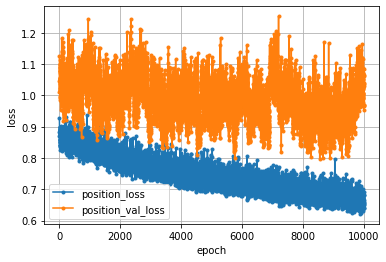

In [61]:
# 学習経過の可視化(位置)
position_loss     = position_history.history['loss']
position_val_loss = position_history.history['val_loss']

nb_epoch = len(position_loss)
plt.plot(range(nb_epoch), position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [65]:
# 学習(位置)
epochs = 40000
batch_size = 128
position_history = position_model.fit(position_x_train, position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(position_x_test, position_y_test))

Train on 3241 samples, validate on 811 samples
Epoch 1/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6688 - accuracy: 0.7445 - val_loss: 1.0008 - val_accuracy: 0.7115
Epoch 2/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6579 - accuracy: 0.7467 - val_loss: 0.9901 - val_accuracy: 0.7386
Epoch 3/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6773 - accuracy: 0.7377 - val_loss: 0.9553 - val_accuracy: 0.7485
Epoch 4/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6908 - accuracy: 0.7368 - val_loss: 1.0614 - val_accuracy: 0.7164
Epoch 5/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6690 - accuracy: 0.7390 - val_loss: 0.9702 - val_accuracy: 0.7287
Epoch 6/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6538 - accuracy: 0.7464 - val_loss: 1.0065 - val_accuracy: 0.7053
Epoch 7/40000
3241/3241 [==============================] - 0s 36u

Epoch 56/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7035 - accuracy: 0.7100 - val_loss: 1.0240 - val_accuracy: 0.7090
Epoch 57/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6710 - accuracy: 0.7417 - val_loss: 0.9819 - val_accuracy: 0.7287
Epoch 58/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6489 - accuracy: 0.7470 - val_loss: 0.9854 - val_accuracy: 0.7398
Epoch 59/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6408 - accuracy: 0.7584 - val_loss: 0.9881 - val_accuracy: 0.7324
Epoch 60/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6402 - accuracy: 0.7488 - val_loss: 0.9618 - val_accuracy: 0.7522
Epoch 61/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6191 - accuracy: 0.7658 - val_loss: 0.9967 - val_accuracy: 0.7201
Epoch 62/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6782 - accuracy: 0.7340

Epoch 111/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6619 - accuracy: 0.7448 - val_loss: 1.0184 - val_accuracy: 0.7102
Epoch 112/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6918 - accuracy: 0.7291 - val_loss: 1.0722 - val_accuracy: 0.6905
Epoch 113/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6788 - accuracy: 0.7334 - val_loss: 1.0162 - val_accuracy: 0.6905
Epoch 114/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6947 - accuracy: 0.7266 - val_loss: 1.0272 - val_accuracy: 0.7201
Epoch 115/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6593 - accuracy: 0.7445 - val_loss: 0.9795 - val_accuracy: 0.7324
Epoch 116/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6329 - accuracy: 0.7516 - val_loss: 1.0064 - val_accuracy: 0.6868
Epoch 117/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6655 - accuracy:

3241/3241 [==============================] - 0s 32us/step - loss: 0.6427 - accuracy: 0.7485 - val_loss: 0.9387 - val_accuracy: 0.6843
Epoch 166/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7065 - accuracy: 0.7195 - val_loss: 1.0122 - val_accuracy: 0.7115
Epoch 167/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6868 - accuracy: 0.7260 - val_loss: 0.8839 - val_accuracy: 0.7201
Epoch 168/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6401 - accuracy: 0.7507 - val_loss: 0.9191 - val_accuracy: 0.7115
Epoch 169/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6882 - accuracy: 0.7269 - val_loss: 0.8565 - val_accuracy: 0.7139
Epoch 170/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6728 - accuracy: 0.7359 - val_loss: 0.9859 - val_accuracy: 0.7004
Epoch 171/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6749 - accuracy: 0.7322 - val_lo

Epoch 220/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6598 - accuracy: 0.7408 - val_loss: 0.9084 - val_accuracy: 0.6905
Epoch 221/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6697 - accuracy: 0.7334 - val_loss: 0.8975 - val_accuracy: 0.7041
Epoch 222/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6413 - accuracy: 0.7529 - val_loss: 0.8429 - val_accuracy: 0.7448
Epoch 223/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6498 - accuracy: 0.7510 - val_loss: 0.8989 - val_accuracy: 0.7189
Epoch 224/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6331 - accuracy: 0.7572 - val_loss: 0.8997 - val_accuracy: 0.7152
Epoch 225/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6680 - accuracy: 0.7362 - val_loss: 0.8562 - val_accuracy: 0.7386
Epoch 226/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6508 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 0.6653 - accuracy: 0.7414 - val_loss: 0.9636 - val_accuracy: 0.7127
Epoch 275/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6571 - accuracy: 0.7482 - val_loss: 0.9205 - val_accuracy: 0.7139
Epoch 276/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6775 - accuracy: 0.7288 - val_loss: 0.9557 - val_accuracy: 0.7164
Epoch 277/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6791 - accuracy: 0.7417 - val_loss: 1.0266 - val_accuracy: 0.7053
Epoch 278/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6841 - accuracy: 0.7405 - val_loss: 1.0128 - val_accuracy: 0.6979
Epoch 279/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6715 - accuracy: 0.7402 - val_loss: 0.9822 - val_accuracy: 0.7041
Epoch 280/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6938 - accuracy: 0.7288 - val_lo

Epoch 329/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6844 - accuracy: 0.7291 - val_loss: 0.9952 - val_accuracy: 0.6893
Epoch 330/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6741 - accuracy: 0.7322 - val_loss: 0.9185 - val_accuracy: 0.7263
Epoch 331/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6719 - accuracy: 0.7353 - val_loss: 0.9274 - val_accuracy: 0.7398
Epoch 332/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6542 - accuracy: 0.7461 - val_loss: 0.9117 - val_accuracy: 0.7386
Epoch 333/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6497 - accuracy: 0.7414 - val_loss: 0.9176 - val_accuracy: 0.7263
Epoch 334/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6360 - accuracy: 0.7578 - val_loss: 0.9404 - val_accuracy: 0.7300
Epoch 335/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6436 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.6791 - accuracy: 0.7346 - val_loss: 0.9562 - val_accuracy: 0.7041
Epoch 384/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6366 - accuracy: 0.7529 - val_loss: 0.9377 - val_accuracy: 0.6991
Epoch 385/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6866 - accuracy: 0.7300 - val_loss: 0.9443 - val_accuracy: 0.7423
Epoch 386/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6631 - accuracy: 0.7390 - val_loss: 1.0111 - val_accuracy: 0.7152
Epoch 387/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.7107 - accuracy: 0.7309 - val_loss: 0.9667 - val_accuracy: 0.7275
Epoch 388/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6794 - accuracy: 0.7421 - val_loss: 0.9476 - val_accuracy: 0.7238
Epoch 389/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6800 - accuracy: 0.7316 - val_lo

Epoch 438/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6357 - accuracy: 0.7529 - val_loss: 0.9775 - val_accuracy: 0.7361
Epoch 439/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6675 - accuracy: 0.7482 - val_loss: 0.9228 - val_accuracy: 0.7546
Epoch 440/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6705 - accuracy: 0.7442 - val_loss: 0.9858 - val_accuracy: 0.7189
Epoch 441/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6861 - accuracy: 0.7346 - val_loss: 0.9606 - val_accuracy: 0.7176
Epoch 442/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6771 - accuracy: 0.7353 - val_loss: 1.0729 - val_accuracy: 0.7028
Epoch 443/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6919 - accuracy: 0.7343 - val_loss: 0.9820 - val_accuracy: 0.7263
Epoch 444/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6506 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.6566 - accuracy: 0.7390 - val_loss: 0.9666 - val_accuracy: 0.7398
Epoch 493/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6596 - accuracy: 0.7377 - val_loss: 1.0284 - val_accuracy: 0.6856
Epoch 494/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6806 - accuracy: 0.7393 - val_loss: 0.9650 - val_accuracy: 0.7287
Epoch 495/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6379 - accuracy: 0.7495 - val_loss: 1.0078 - val_accuracy: 0.6930
Epoch 496/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7070 - accuracy: 0.7211 - val_loss: 1.0476 - val_accuracy: 0.7102
Epoch 497/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6704 - accuracy: 0.7405 - val_loss: 0.9932 - val_accuracy: 0.7189
Epoch 498/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6366 - accuracy: 0.7516 - val_lo

Epoch 547/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6494 - accuracy: 0.7603 - val_loss: 1.0385 - val_accuracy: 0.7078
Epoch 548/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6984 - accuracy: 0.7186 - val_loss: 0.9690 - val_accuracy: 0.7386
Epoch 549/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6511 - accuracy: 0.7439 - val_loss: 0.9737 - val_accuracy: 0.7448
Epoch 550/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6750 - accuracy: 0.7374 - val_loss: 0.9874 - val_accuracy: 0.7189
Epoch 551/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6533 - accuracy: 0.7451 - val_loss: 0.9460 - val_accuracy: 0.7411
Epoch 552/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6295 - accuracy: 0.7640 - val_loss: 0.9761 - val_accuracy: 0.7497
Epoch 553/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7001 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 0.6776 - accuracy: 0.7346 - val_loss: 0.9923 - val_accuracy: 0.7102
Epoch 602/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.7069 - accuracy: 0.7211 - val_loss: 0.9950 - val_accuracy: 0.7115
Epoch 603/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6368 - accuracy: 0.7510 - val_loss: 0.9898 - val_accuracy: 0.7041
Epoch 604/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6282 - accuracy: 0.7550 - val_loss: 0.9415 - val_accuracy: 0.7509
Epoch 605/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6420 - accuracy: 0.7535 - val_loss: 0.9763 - val_accuracy: 0.7485
Epoch 606/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6482 - accuracy: 0.7572 - val_loss: 0.9479 - val_accuracy: 0.7386
Epoch 607/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6419 - accuracy: 0.7637 - val_lo

Epoch 656/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6537 - accuracy: 0.7501 - val_loss: 0.8972 - val_accuracy: 0.6954
Epoch 657/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.6622 - accuracy: 0.7442 - val_loss: 0.9117 - val_accuracy: 0.7250
Epoch 658/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6589 - accuracy: 0.7451 - val_loss: 0.8855 - val_accuracy: 0.7546
Epoch 659/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6580 - accuracy: 0.7384 - val_loss: 0.8745 - val_accuracy: 0.7448
Epoch 660/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6252 - accuracy: 0.7627 - val_loss: 0.9208 - val_accuracy: 0.7041
Epoch 661/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6489 - accuracy: 0.7519 - val_loss: 0.8987 - val_accuracy: 0.7115
Epoch 662/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6359 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.6828 - accuracy: 0.7322 - val_loss: 1.0943 - val_accuracy: 0.7078
Epoch 711/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6735 - accuracy: 0.7390 - val_loss: 1.1365 - val_accuracy: 0.7115
Epoch 712/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.7020 - accuracy: 0.7214 - val_loss: 1.0914 - val_accuracy: 0.7078
Epoch 713/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6584 - accuracy: 0.7359 - val_loss: 1.0466 - val_accuracy: 0.7398
Epoch 714/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6448 - accuracy: 0.7535 - val_loss: 1.0628 - val_accuracy: 0.7041
Epoch 715/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6861 - accuracy: 0.7217 - val_loss: 1.0624 - val_accuracy: 0.7226
Epoch 716/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6652 - accuracy: 0.7371 - val_lo

Epoch 765/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6415 - accuracy: 0.7590 - val_loss: 1.0058 - val_accuracy: 0.7423
Epoch 766/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6405 - accuracy: 0.7495 - val_loss: 1.0851 - val_accuracy: 0.7226
Epoch 767/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6519 - accuracy: 0.7535 - val_loss: 1.0169 - val_accuracy: 0.7398
Epoch 768/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.7073 - accuracy: 0.7285 - val_loss: 1.0998 - val_accuracy: 0.6967
Epoch 769/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6990 - accuracy: 0.7396 - val_loss: 1.0598 - val_accuracy: 0.7078
Epoch 770/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6561 - accuracy: 0.7405 - val_loss: 1.0238 - val_accuracy: 0.7337
Epoch 771/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6623 - accuracy:

3241/3241 [==============================] - 0s 30us/step - loss: 0.6518 - accuracy: 0.7476 - val_loss: 0.9705 - val_accuracy: 0.7485
Epoch 820/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6303 - accuracy: 0.7566 - val_loss: 0.9592 - val_accuracy: 0.7509
Epoch 821/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6521 - accuracy: 0.7421 - val_loss: 1.1076 - val_accuracy: 0.6979
Epoch 822/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6650 - accuracy: 0.7433 - val_loss: 1.0618 - val_accuracy: 0.7287
Epoch 823/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6635 - accuracy: 0.7433 - val_loss: 1.0933 - val_accuracy: 0.7139
Epoch 824/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6564 - accuracy: 0.7510 - val_loss: 1.0152 - val_accuracy: 0.7509
Epoch 825/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6649 - accuracy: 0.7424 - val_lo

Epoch 874/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6692 - accuracy: 0.7399 - val_loss: 0.9967 - val_accuracy: 0.7608
Epoch 875/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6357 - accuracy: 0.7581 - val_loss: 1.0218 - val_accuracy: 0.7337
Epoch 876/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.6260 - accuracy: 0.7618 - val_loss: 1.0012 - val_accuracy: 0.7423
Epoch 877/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.6663 - accuracy: 0.7485 - val_loss: 1.0214 - val_accuracy: 0.7078
Epoch 878/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6340 - accuracy: 0.7482 - val_loss: 1.0479 - val_accuracy: 0.7497
Epoch 879/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6417 - accuracy: 0.7482 - val_loss: 1.0349 - val_accuracy: 0.7423
Epoch 880/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6288 - accuracy:

3241/3241 [==============================] - 0s 29us/step - loss: 0.6190 - accuracy: 0.7562 - val_loss: 1.0162 - val_accuracy: 0.7509
Epoch 929/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6505 - accuracy: 0.7436 - val_loss: 1.0556 - val_accuracy: 0.7102
Epoch 930/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6617 - accuracy: 0.7365 - val_loss: 1.0263 - val_accuracy: 0.7275
Epoch 931/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6698 - accuracy: 0.7408 - val_loss: 0.9993 - val_accuracy: 0.7657
Epoch 932/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6450 - accuracy: 0.7513 - val_loss: 1.0570 - val_accuracy: 0.7337
Epoch 933/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6629 - accuracy: 0.7507 - val_loss: 1.1197 - val_accuracy: 0.6856
Epoch 934/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6907 - accuracy: 0.7297 - val_lo

Epoch 983/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6702 - accuracy: 0.7374 - val_loss: 1.0120 - val_accuracy: 0.7090
Epoch 984/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6399 - accuracy: 0.7535 - val_loss: 1.0292 - val_accuracy: 0.7324
Epoch 985/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6460 - accuracy: 0.7553 - val_loss: 0.9975 - val_accuracy: 0.7201
Epoch 986/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6421 - accuracy: 0.7479 - val_loss: 1.0194 - val_accuracy: 0.7300
Epoch 987/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6626 - accuracy: 0.7421 - val_loss: 0.9863 - val_accuracy: 0.7176
Epoch 988/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6910 - accuracy: 0.7260 - val_loss: 0.9973 - val_accuracy: 0.7411
Epoch 989/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6670 - accuracy:

3241/3241 [==============================] - 0s 41us/step - loss: 0.6635 - accuracy: 0.7405 - val_loss: 0.9997 - val_accuracy: 0.6991
Epoch 1038/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6590 - accuracy: 0.7374 - val_loss: 1.0008 - val_accuracy: 0.7201
Epoch 1039/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6636 - accuracy: 0.7414 - val_loss: 0.9857 - val_accuracy: 0.7337
Epoch 1040/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6621 - accuracy: 0.7399 - val_loss: 1.0509 - val_accuracy: 0.6979
Epoch 1041/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6488 - accuracy: 0.7365 - val_loss: 0.9939 - val_accuracy: 0.7324
Epoch 1042/40000
3241/3241 [==============================] - 0s 89us/step - loss: 0.6591 - accuracy: 0.7417 - val_loss: 1.0843 - val_accuracy: 0.6708
Epoch 1043/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.6657 - accuracy: 0.7390 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.6389 - accuracy: 0.7572 - val_loss: 1.1050 - val_accuracy: 0.6979
Epoch 1092/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6732 - accuracy: 0.7365 - val_loss: 1.0469 - val_accuracy: 0.7620
Epoch 1093/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6516 - accuracy: 0.7485 - val_loss: 1.0489 - val_accuracy: 0.7287
Epoch 1094/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6472 - accuracy: 0.7492 - val_loss: 1.1217 - val_accuracy: 0.7300
Epoch 1095/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6534 - accuracy: 0.7454 - val_loss: 1.1058 - val_accuracy: 0.7078
Epoch 1096/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6503 - accuracy: 0.7467 - val_loss: 1.0232 - val_accuracy: 0.7411
Epoch 1097/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6374 - accuracy: 0.7519 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6384 - accuracy: 0.7578 - val_loss: 0.9788 - val_accuracy: 0.7361
Epoch 1146/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.6409 - accuracy: 0.7488 - val_loss: 1.0719 - val_accuracy: 0.6856
Epoch 1147/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6948 - accuracy: 0.7328 - val_loss: 1.0086 - val_accuracy: 0.7435
Epoch 1148/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6311 - accuracy: 0.7618 - val_loss: 1.0218 - val_accuracy: 0.7337
Epoch 1149/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6375 - accuracy: 0.7495 - val_loss: 1.0393 - val_accuracy: 0.7250
Epoch 1150/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6470 - accuracy: 0.7562 - val_loss: 1.0255 - val_accuracy: 0.7534
Epoch 1151/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6324 - accuracy: 0.7609 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6610 - accuracy: 0.7448 - val_loss: 1.0573 - val_accuracy: 0.7090
Epoch 1200/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6390 - accuracy: 0.7621 - val_loss: 1.0263 - val_accuracy: 0.7448
Epoch 1201/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6307 - accuracy: 0.7559 - val_loss: 1.0773 - val_accuracy: 0.7189
Epoch 1202/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6376 - accuracy: 0.7473 - val_loss: 1.0598 - val_accuracy: 0.7460
Epoch 1203/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6451 - accuracy: 0.7541 - val_loss: 1.1096 - val_accuracy: 0.7078
Epoch 1204/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6631 - accuracy: 0.7445 - val_loss: 1.0369 - val_accuracy: 0.7386
Epoch 1205/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6745 - accuracy: 0.7371 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6526 - accuracy: 0.7522 - val_loss: 1.0499 - val_accuracy: 0.7127
Epoch 1254/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6804 - accuracy: 0.7319 - val_loss: 0.9903 - val_accuracy: 0.7324
Epoch 1255/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6496 - accuracy: 0.7448 - val_loss: 0.9605 - val_accuracy: 0.7608
Epoch 1256/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6612 - accuracy: 0.7417 - val_loss: 1.0282 - val_accuracy: 0.7263
Epoch 1257/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6634 - accuracy: 0.7393 - val_loss: 1.0074 - val_accuracy: 0.7176
Epoch 1258/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6394 - accuracy: 0.7535 - val_loss: 0.9876 - val_accuracy: 0.7250
Epoch 1259/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6418 - accuracy: 0.7414 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6310 - accuracy: 0.7569 - val_loss: 1.0106 - val_accuracy: 0.6942
Epoch 1308/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6498 - accuracy: 0.7442 - val_loss: 0.9302 - val_accuracy: 0.7386
Epoch 1309/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6279 - accuracy: 0.7559 - val_loss: 0.9988 - val_accuracy: 0.7337
Epoch 1310/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6813 - accuracy: 0.7390 - val_loss: 1.1188 - val_accuracy: 0.6831
Epoch 1311/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6692 - accuracy: 0.7371 - val_loss: 1.0823 - val_accuracy: 0.7065
Epoch 1312/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6436 - accuracy: 0.7405 - val_loss: 1.0718 - val_accuracy: 0.7213
Epoch 1313/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6982 - accuracy: 0.7377 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.7068 - accuracy: 0.7288 - val_loss: 1.0232 - val_accuracy: 0.7201
Epoch 1362/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6613 - accuracy: 0.7371 - val_loss: 1.0083 - val_accuracy: 0.7312
Epoch 1363/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6381 - accuracy: 0.7485 - val_loss: 0.9874 - val_accuracy: 0.7226
Epoch 1364/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6535 - accuracy: 0.7384 - val_loss: 1.0370 - val_accuracy: 0.7337
Epoch 1365/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6512 - accuracy: 0.7550 - val_loss: 0.9883 - val_accuracy: 0.7312
Epoch 1366/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6660 - accuracy: 0.7433 - val_loss: 0.9749 - val_accuracy: 0.7312
Epoch 1367/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6994 - accuracy: 0.7205 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6692 - accuracy: 0.7442 - val_loss: 1.0392 - val_accuracy: 0.7287
Epoch 1416/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6758 - accuracy: 0.7303 - val_loss: 1.0429 - val_accuracy: 0.7213
Epoch 1417/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6890 - accuracy: 0.7340 - val_loss: 0.9921 - val_accuracy: 0.7361
Epoch 1418/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6469 - accuracy: 0.7495 - val_loss: 0.9537 - val_accuracy: 0.7423
Epoch 1419/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6249 - accuracy: 0.7630 - val_loss: 0.9828 - val_accuracy: 0.7016
Epoch 1420/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6322 - accuracy: 0.7476 - val_loss: 0.9567 - val_accuracy: 0.7324
Epoch 1421/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6524 - accuracy: 0.7424 - 

3241/3241 [==============================] - 0s 38us/step - loss: 0.6594 - accuracy: 0.7544 - val_loss: 1.0050 - val_accuracy: 0.7201
Epoch 1470/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6748 - accuracy: 0.7402 - val_loss: 1.0146 - val_accuracy: 0.7152
Epoch 1471/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6690 - accuracy: 0.7288 - val_loss: 1.0123 - val_accuracy: 0.7053
Epoch 1472/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6906 - accuracy: 0.7171 - val_loss: 1.0182 - val_accuracy: 0.7115
Epoch 1473/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6620 - accuracy: 0.7396 - val_loss: 0.9479 - val_accuracy: 0.7361
Epoch 1474/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6209 - accuracy: 0.7637 - val_loss: 1.0061 - val_accuracy: 0.6905
Epoch 1475/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6720 - accuracy: 0.7337 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6417 - accuracy: 0.7556 - val_loss: 0.9472 - val_accuracy: 0.7435
Epoch 1524/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6107 - accuracy: 0.7637 - val_loss: 0.9671 - val_accuracy: 0.7398
Epoch 1525/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6099 - accuracy: 0.7649 - val_loss: 1.0317 - val_accuracy: 0.7287
Epoch 1526/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6714 - accuracy: 0.7303 - val_loss: 0.9898 - val_accuracy: 0.7300
Epoch 1527/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6453 - accuracy: 0.7458 - val_loss: 0.9844 - val_accuracy: 0.7287
Epoch 1528/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6571 - accuracy: 0.7442 - val_loss: 1.0254 - val_accuracy: 0.7176
Epoch 1529/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6442 - accuracy: 0.7414 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6591 - accuracy: 0.7535 - val_loss: 1.0038 - val_accuracy: 0.7115
Epoch 1578/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6422 - accuracy: 0.7436 - val_loss: 0.9568 - val_accuracy: 0.7349
Epoch 1579/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6276 - accuracy: 0.7633 - val_loss: 0.8936 - val_accuracy: 0.7497
Epoch 1580/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6323 - accuracy: 0.7510 - val_loss: 0.9085 - val_accuracy: 0.7411
Epoch 1581/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6234 - accuracy: 0.7529 - val_loss: 0.9500 - val_accuracy: 0.7324
Epoch 1582/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6332 - accuracy: 0.7566 - val_loss: 0.9654 - val_accuracy: 0.7300
Epoch 1583/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6323 - accuracy: 0.7562 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6267 - accuracy: 0.7584 - val_loss: 0.9264 - val_accuracy: 0.7460
Epoch 1632/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6238 - accuracy: 0.7590 - val_loss: 0.9968 - val_accuracy: 0.7090
Epoch 1633/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6565 - accuracy: 0.7488 - val_loss: 0.9864 - val_accuracy: 0.7312
Epoch 1634/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6447 - accuracy: 0.7424 - val_loss: 1.0464 - val_accuracy: 0.7102
Epoch 1635/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6761 - accuracy: 0.7359 - val_loss: 0.9526 - val_accuracy: 0.7287
Epoch 1636/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6804 - accuracy: 0.7328 - val_loss: 0.9311 - val_accuracy: 0.7361
Epoch 1637/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6290 - accuracy: 0.7501 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6542 - accuracy: 0.7541 - val_loss: 1.0139 - val_accuracy: 0.7016
Epoch 1686/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6495 - accuracy: 0.7417 - val_loss: 0.9271 - val_accuracy: 0.7571
Epoch 1687/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6619 - accuracy: 0.7427 - val_loss: 1.0621 - val_accuracy: 0.6979
Epoch 1688/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.7037 - accuracy: 0.7285 - val_loss: 1.0494 - val_accuracy: 0.7090
Epoch 1689/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6535 - accuracy: 0.7356 - val_loss: 0.9984 - val_accuracy: 0.7263
Epoch 1690/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6423 - accuracy: 0.7492 - val_loss: 0.9834 - val_accuracy: 0.7127
Epoch 1691/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6851 - accuracy: 0.7322 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6302 - accuracy: 0.7569 - val_loss: 1.0173 - val_accuracy: 0.7127
Epoch 1740/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6845 - accuracy: 0.7343 - val_loss: 1.0419 - val_accuracy: 0.7164
Epoch 1741/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6494 - accuracy: 0.7464 - val_loss: 0.9653 - val_accuracy: 0.7497
Epoch 1742/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6296 - accuracy: 0.7529 - val_loss: 1.0139 - val_accuracy: 0.7300
Epoch 1743/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6449 - accuracy: 0.7498 - val_loss: 1.0040 - val_accuracy: 0.7448
Epoch 1744/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6636 - accuracy: 0.7346 - val_loss: 0.9935 - val_accuracy: 0.7349
Epoch 1745/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6566 - accuracy: 0.7356 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6291 - accuracy: 0.7454 - val_loss: 1.0114 - val_accuracy: 0.7041
Epoch 1794/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6822 - accuracy: 0.7365 - val_loss: 1.0083 - val_accuracy: 0.7053
Epoch 1795/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6421 - accuracy: 0.7461 - val_loss: 1.0191 - val_accuracy: 0.7201
Epoch 1796/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6409 - accuracy: 0.7495 - val_loss: 0.9868 - val_accuracy: 0.7571
Epoch 1797/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6268 - accuracy: 0.7640 - val_loss: 1.0179 - val_accuracy: 0.7460
Epoch 1798/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6584 - accuracy: 0.7368 - val_loss: 0.9841 - val_accuracy: 0.7546
Epoch 1799/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6550 - accuracy: 0.7414 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6509 - accuracy: 0.7464 - val_loss: 0.9821 - val_accuracy: 0.7411
Epoch 1848/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6178 - accuracy: 0.7612 - val_loss: 0.9191 - val_accuracy: 0.7534
Epoch 1849/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6210 - accuracy: 0.7630 - val_loss: 0.9458 - val_accuracy: 0.7682
Epoch 1850/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6474 - accuracy: 0.7433 - val_loss: 1.0050 - val_accuracy: 0.6880
Epoch 1851/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6549 - accuracy: 0.7488 - val_loss: 1.0496 - val_accuracy: 0.6856
Epoch 1852/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6595 - accuracy: 0.7368 - val_loss: 0.9760 - val_accuracy: 0.7176
Epoch 1853/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6279 - accuracy: 0.7596 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6843 - accuracy: 0.7300 - val_loss: 0.9162 - val_accuracy: 0.7324
Epoch 1902/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6526 - accuracy: 0.7439 - val_loss: 0.9497 - val_accuracy: 0.7287
Epoch 1903/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6633 - accuracy: 0.7387 - val_loss: 0.9271 - val_accuracy: 0.7176
Epoch 1904/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6873 - accuracy: 0.7365 - val_loss: 0.9557 - val_accuracy: 0.7164
Epoch 1905/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6561 - accuracy: 0.7414 - val_loss: 0.8978 - val_accuracy: 0.7485
Epoch 1906/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6909 - accuracy: 0.7263 - val_loss: 0.9658 - val_accuracy: 0.7201
Epoch 1907/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6375 - accuracy: 0.7581 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6474 - accuracy: 0.7340 - val_loss: 1.0324 - val_accuracy: 0.7275
Epoch 1956/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6377 - accuracy: 0.7501 - val_loss: 1.0032 - val_accuracy: 0.7485
Epoch 1957/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6506 - accuracy: 0.7421 - val_loss: 0.9668 - val_accuracy: 0.7435
Epoch 1958/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6544 - accuracy: 0.7368 - val_loss: 0.9992 - val_accuracy: 0.7127
Epoch 1959/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6962 - accuracy: 0.7313 - val_loss: 1.0569 - val_accuracy: 0.6954
Epoch 1960/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6549 - accuracy: 0.7433 - val_loss: 0.9770 - val_accuracy: 0.7324
Epoch 1961/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6214 - accuracy: 0.7522 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6544 - accuracy: 0.7421 - val_loss: 0.9824 - val_accuracy: 0.7324
Epoch 2010/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6568 - accuracy: 0.7405 - val_loss: 1.0073 - val_accuracy: 0.7090
Epoch 2011/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6511 - accuracy: 0.7448 - val_loss: 1.0019 - val_accuracy: 0.7139
Epoch 2012/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6462 - accuracy: 0.7377 - val_loss: 0.9252 - val_accuracy: 0.7411
Epoch 2013/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6167 - accuracy: 0.7667 - val_loss: 0.8696 - val_accuracy: 0.7756
Epoch 2014/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6483 - accuracy: 0.7572 - val_loss: 0.9217 - val_accuracy: 0.7534
Epoch 2015/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6432 - accuracy: 0.7535 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6463 - accuracy: 0.7454 - val_loss: 1.0292 - val_accuracy: 0.7053
Epoch 2064/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6290 - accuracy: 0.7467 - val_loss: 0.9838 - val_accuracy: 0.7460
Epoch 2065/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6629 - accuracy: 0.7461 - val_loss: 1.0147 - val_accuracy: 0.7189
Epoch 2066/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6668 - accuracy: 0.7427 - val_loss: 1.0208 - val_accuracy: 0.7053
Epoch 2067/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6250 - accuracy: 0.7590 - val_loss: 1.0160 - val_accuracy: 0.7176
Epoch 2068/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6485 - accuracy: 0.7439 - val_loss: 1.0465 - val_accuracy: 0.7275
Epoch 2069/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6581 - accuracy: 0.7405 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6325 - accuracy: 0.7454 - val_loss: 0.9940 - val_accuracy: 0.7238
Epoch 2118/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6361 - accuracy: 0.7479 - val_loss: 0.9674 - val_accuracy: 0.7522
Epoch 2119/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6415 - accuracy: 0.7488 - val_loss: 0.9737 - val_accuracy: 0.7263
Epoch 2120/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6489 - accuracy: 0.7399 - val_loss: 0.9711 - val_accuracy: 0.7374
Epoch 2121/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6257 - accuracy: 0.7519 - val_loss: 0.9235 - val_accuracy: 0.7583
Epoch 2122/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6679 - accuracy: 0.7421 - val_loss: 1.0216 - val_accuracy: 0.7115
Epoch 2123/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6574 - accuracy: 0.7454 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6750 - accuracy: 0.7316 - val_loss: 0.9442 - val_accuracy: 0.7361
Epoch 2172/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6493 - accuracy: 0.7522 - val_loss: 0.9630 - val_accuracy: 0.7312
Epoch 2173/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6492 - accuracy: 0.7587 - val_loss: 0.9836 - val_accuracy: 0.7374
Epoch 2174/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6461 - accuracy: 0.7559 - val_loss: 0.9451 - val_accuracy: 0.7287
Epoch 2175/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6534 - accuracy: 0.7458 - val_loss: 1.0105 - val_accuracy: 0.7139
Epoch 2176/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6384 - accuracy: 0.7590 - val_loss: 0.9671 - val_accuracy: 0.7176
Epoch 2177/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6298 - accuracy: 0.7529 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6242 - accuracy: 0.7606 - val_loss: 0.9054 - val_accuracy: 0.7620
Epoch 2226/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6797 - accuracy: 0.7421 - val_loss: 0.8751 - val_accuracy: 0.7411
Epoch 2227/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6304 - accuracy: 0.7559 - val_loss: 0.9712 - val_accuracy: 0.7201
Epoch 2228/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6708 - accuracy: 0.7374 - val_loss: 0.8733 - val_accuracy: 0.7485
Epoch 2229/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6308 - accuracy: 0.7612 - val_loss: 0.8615 - val_accuracy: 0.7805
Epoch 2230/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6092 - accuracy: 0.7701 - val_loss: 0.9453 - val_accuracy: 0.7238
Epoch 2231/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6638 - accuracy: 0.7334 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6622 - accuracy: 0.7356 - val_loss: 0.9974 - val_accuracy: 0.7016
Epoch 2280/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6534 - accuracy: 0.7414 - val_loss: 0.9433 - val_accuracy: 0.7337
Epoch 2281/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6635 - accuracy: 0.7464 - val_loss: 0.9304 - val_accuracy: 0.7312
Epoch 2282/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6370 - accuracy: 0.7547 - val_loss: 0.9014 - val_accuracy: 0.7694
Epoch 2283/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6284 - accuracy: 0.7624 - val_loss: 0.9447 - val_accuracy: 0.7287
Epoch 2284/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6423 - accuracy: 0.7504 - val_loss: 0.9104 - val_accuracy: 0.7633
Epoch 2285/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6265 - accuracy: 0.7646 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6277 - accuracy: 0.7535 - val_loss: 0.9850 - val_accuracy: 0.7534
Epoch 2334/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6193 - accuracy: 0.7612 - val_loss: 0.9816 - val_accuracy: 0.7349
Epoch 2335/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6654 - accuracy: 0.7377 - val_loss: 1.0122 - val_accuracy: 0.7016
Epoch 2336/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6514 - accuracy: 0.7458 - val_loss: 0.9712 - val_accuracy: 0.7238
Epoch 2337/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6422 - accuracy: 0.7473 - val_loss: 1.0512 - val_accuracy: 0.6831
Epoch 2338/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6974 - accuracy: 0.7353 - val_loss: 1.0259 - val_accuracy: 0.7349
Epoch 2339/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6780 - accuracy: 0.7417 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6266 - accuracy: 0.7655 - val_loss: 0.8772 - val_accuracy: 0.7189
Epoch 2388/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6300 - accuracy: 0.7609 - val_loss: 0.8601 - val_accuracy: 0.7312
Epoch 2389/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6545 - accuracy: 0.7470 - val_loss: 0.8761 - val_accuracy: 0.7472
Epoch 2390/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6463 - accuracy: 0.7544 - val_loss: 0.8624 - val_accuracy: 0.7152
Epoch 2391/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6227 - accuracy: 0.7572 - val_loss: 0.8480 - val_accuracy: 0.7324
Epoch 2392/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6672 - accuracy: 0.7359 - val_loss: 0.9038 - val_accuracy: 0.7312
Epoch 2393/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6483 - accuracy: 0.7522 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6727 - accuracy: 0.7461 - val_loss: 1.0217 - val_accuracy: 0.7361
Epoch 2442/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6771 - accuracy: 0.7331 - val_loss: 0.9242 - val_accuracy: 0.7004
Epoch 2443/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6262 - accuracy: 0.7544 - val_loss: 0.9409 - val_accuracy: 0.7287
Epoch 2444/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6309 - accuracy: 0.7572 - val_loss: 0.9511 - val_accuracy: 0.7337
Epoch 2445/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6273 - accuracy: 0.7572 - val_loss: 0.9464 - val_accuracy: 0.7324
Epoch 2446/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6362 - accuracy: 0.7525 - val_loss: 0.9134 - val_accuracy: 0.7460
Epoch 2447/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6139 - accuracy: 0.7646 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6298 - accuracy: 0.7624 - val_loss: 0.9262 - val_accuracy: 0.7534
Epoch 2496/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6443 - accuracy: 0.7467 - val_loss: 0.9505 - val_accuracy: 0.7497
Epoch 2497/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6407 - accuracy: 0.7436 - val_loss: 0.9686 - val_accuracy: 0.7226
Epoch 2498/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6314 - accuracy: 0.7510 - val_loss: 0.8875 - val_accuracy: 0.7731
Epoch 2499/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6256 - accuracy: 0.7621 - val_loss: 1.0066 - val_accuracy: 0.7337
Epoch 2500/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6477 - accuracy: 0.7498 - val_loss: 1.0109 - val_accuracy: 0.7337
Epoch 2501/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6382 - accuracy: 0.7572 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6337 - accuracy: 0.7525 - val_loss: 0.9118 - val_accuracy: 0.7571
Epoch 2550/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6073 - accuracy: 0.7674 - val_loss: 0.9682 - val_accuracy: 0.7312
Epoch 2551/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6264 - accuracy: 0.7550 - val_loss: 0.8987 - val_accuracy: 0.7398
Epoch 2552/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6336 - accuracy: 0.7596 - val_loss: 0.9263 - val_accuracy: 0.7226
Epoch 2553/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6200 - accuracy: 0.7550 - val_loss: 0.8696 - val_accuracy: 0.7645
Epoch 2554/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6389 - accuracy: 0.7461 - val_loss: 0.8993 - val_accuracy: 0.7398
Epoch 2555/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6247 - accuracy: 0.7535 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6577 - accuracy: 0.7371 - val_loss: 1.0644 - val_accuracy: 0.6954
Epoch 2604/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6667 - accuracy: 0.7522 - val_loss: 0.9416 - val_accuracy: 0.7349
Epoch 2605/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6314 - accuracy: 0.7615 - val_loss: 0.9428 - val_accuracy: 0.7374
Epoch 2606/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6362 - accuracy: 0.7495 - val_loss: 0.9222 - val_accuracy: 0.7583
Epoch 2607/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6344 - accuracy: 0.7562 - val_loss: 0.8945 - val_accuracy: 0.7448
Epoch 2608/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6397 - accuracy: 0.7553 - val_loss: 0.9057 - val_accuracy: 0.7386
Epoch 2609/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6310 - accuracy: 0.7667 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6322 - accuracy: 0.7553 - val_loss: 0.8801 - val_accuracy: 0.7571
Epoch 2658/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6146 - accuracy: 0.7596 - val_loss: 0.9902 - val_accuracy: 0.7152
Epoch 2659/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6394 - accuracy: 0.7501 - val_loss: 0.9393 - val_accuracy: 0.7337
Epoch 2660/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6341 - accuracy: 0.7513 - val_loss: 0.9139 - val_accuracy: 0.7374
Epoch 2661/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6364 - accuracy: 0.7578 - val_loss: 0.9326 - val_accuracy: 0.7213
Epoch 2662/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6451 - accuracy: 0.7393 - val_loss: 0.8728 - val_accuracy: 0.7361
Epoch 2663/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6259 - accuracy: 0.7603 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6292 - accuracy: 0.7482 - val_loss: 0.8880 - val_accuracy: 0.7263
Epoch 2712/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6231 - accuracy: 0.7575 - val_loss: 0.9208 - val_accuracy: 0.7238
Epoch 2713/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6505 - accuracy: 0.7427 - val_loss: 0.9380 - val_accuracy: 0.7238
Epoch 2714/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6605 - accuracy: 0.7427 - val_loss: 0.8871 - val_accuracy: 0.7448
Epoch 2715/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6479 - accuracy: 0.7541 - val_loss: 0.9872 - val_accuracy: 0.6905
Epoch 2716/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6785 - accuracy: 0.7294 - val_loss: 1.0192 - val_accuracy: 0.6930
Epoch 2717/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6400 - accuracy: 0.7569 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6501 - accuracy: 0.7362 - val_loss: 0.9651 - val_accuracy: 0.7361
Epoch 2766/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6365 - accuracy: 0.7612 - val_loss: 0.9540 - val_accuracy: 0.7102
Epoch 2767/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6289 - accuracy: 0.7621 - val_loss: 0.9530 - val_accuracy: 0.7349
Epoch 2768/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6329 - accuracy: 0.7445 - val_loss: 0.9142 - val_accuracy: 0.7583
Epoch 2769/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6769 - accuracy: 0.7368 - val_loss: 0.9768 - val_accuracy: 0.7065
Epoch 2770/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6518 - accuracy: 0.7408 - val_loss: 0.8882 - val_accuracy: 0.7398
Epoch 2771/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6263 - accuracy: 0.7566 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.6312 - accuracy: 0.7600 - val_loss: 0.9840 - val_accuracy: 0.7287
Epoch 2820/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6201 - accuracy: 0.7698 - val_loss: 0.9621 - val_accuracy: 0.7386
Epoch 2821/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6257 - accuracy: 0.7492 - val_loss: 0.9682 - val_accuracy: 0.7287
Epoch 2822/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6206 - accuracy: 0.7658 - val_loss: 1.0390 - val_accuracy: 0.7423
Epoch 2823/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6673 - accuracy: 0.7387 - val_loss: 0.9782 - val_accuracy: 0.7596
Epoch 2824/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6501 - accuracy: 0.7501 - val_loss: 0.9885 - val_accuracy: 0.7411
Epoch 2825/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6126 - accuracy: 0.7603 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6183 - accuracy: 0.7575 - val_loss: 0.9563 - val_accuracy: 0.7731
Epoch 2874/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6245 - accuracy: 0.7637 - val_loss: 0.9874 - val_accuracy: 0.7423
Epoch 2875/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6084 - accuracy: 0.7658 - val_loss: 0.9800 - val_accuracy: 0.7324
Epoch 2876/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6134 - accuracy: 0.7630 - val_loss: 0.9588 - val_accuracy: 0.7694
Epoch 2877/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6505 - accuracy: 0.7458 - val_loss: 0.9740 - val_accuracy: 0.7374
Epoch 2878/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6293 - accuracy: 0.7562 - val_loss: 0.9886 - val_accuracy: 0.7435
Epoch 2879/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6021 - accuracy: 0.7658 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6208 - accuracy: 0.7535 - val_loss: 0.8869 - val_accuracy: 0.7361
Epoch 2928/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6255 - accuracy: 0.7627 - val_loss: 0.8912 - val_accuracy: 0.7398
Epoch 2929/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6132 - accuracy: 0.7655 - val_loss: 0.9224 - val_accuracy: 0.7201
Epoch 2930/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6401 - accuracy: 0.7492 - val_loss: 0.9171 - val_accuracy: 0.7152
Epoch 2931/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6227 - accuracy: 0.7661 - val_loss: 0.9236 - val_accuracy: 0.7028
Epoch 2932/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6225 - accuracy: 0.7612 - val_loss: 0.9077 - val_accuracy: 0.7152
Epoch 2933/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6093 - accuracy: 0.7624 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6658 - accuracy: 0.7414 - val_loss: 0.9523 - val_accuracy: 0.7324
Epoch 2982/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6673 - accuracy: 0.7353 - val_loss: 0.9540 - val_accuracy: 0.7349
Epoch 2983/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6569 - accuracy: 0.7479 - val_loss: 0.9782 - val_accuracy: 0.7201
Epoch 2984/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6375 - accuracy: 0.7498 - val_loss: 1.0261 - val_accuracy: 0.7078
Epoch 2985/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6321 - accuracy: 0.7606 - val_loss: 0.9565 - val_accuracy: 0.7090
Epoch 2986/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6104 - accuracy: 0.7652 - val_loss: 0.9172 - val_accuracy: 0.7448
Epoch 2987/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6495 - accuracy: 0.7544 - 

3241/3241 [==============================] - 0s 43us/step - loss: 0.6622 - accuracy: 0.7368 - val_loss: 0.9414 - val_accuracy: 0.7386
Epoch 3036/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6355 - accuracy: 0.7513 - val_loss: 0.9035 - val_accuracy: 0.7472
Epoch 3037/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6107 - accuracy: 0.7646 - val_loss: 0.9218 - val_accuracy: 0.7583
Epoch 3038/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6153 - accuracy: 0.7612 - val_loss: 0.9873 - val_accuracy: 0.7139
Epoch 3039/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6396 - accuracy: 0.7464 - val_loss: 0.9307 - val_accuracy: 0.7398
Epoch 3040/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6423 - accuracy: 0.7384 - val_loss: 1.0005 - val_accuracy: 0.6942
Epoch 3041/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6843 - accuracy: 0.7288 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.6692 - accuracy: 0.7359 - val_loss: 0.8574 - val_accuracy: 0.7596
Epoch 3090/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6368 - accuracy: 0.7541 - val_loss: 0.8634 - val_accuracy: 0.7324
Epoch 3091/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6229 - accuracy: 0.7596 - val_loss: 0.8466 - val_accuracy: 0.7657
Epoch 3092/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.6305 - accuracy: 0.7464 - val_loss: 0.9002 - val_accuracy: 0.7374
Epoch 3093/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6424 - accuracy: 0.7461 - val_loss: 0.8340 - val_accuracy: 0.7139
Epoch 3094/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6281 - accuracy: 0.7485 - val_loss: 0.8848 - val_accuracy: 0.7312
Epoch 3095/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6611 - accuracy: 0.7421 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6558 - accuracy: 0.7476 - val_loss: 1.0236 - val_accuracy: 0.7004
Epoch 3144/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6577 - accuracy: 0.7427 - val_loss: 0.9143 - val_accuracy: 0.7189
Epoch 3145/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6266 - accuracy: 0.7572 - val_loss: 0.9154 - val_accuracy: 0.7571
Epoch 3146/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6228 - accuracy: 0.7633 - val_loss: 0.9446 - val_accuracy: 0.7275
Epoch 3147/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6226 - accuracy: 0.7630 - val_loss: 0.9375 - val_accuracy: 0.7226
Epoch 3148/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6213 - accuracy: 0.7633 - val_loss: 0.9105 - val_accuracy: 0.7435
Epoch 3149/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6224 - accuracy: 0.7590 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6284 - accuracy: 0.7544 - val_loss: 0.9190 - val_accuracy: 0.7509
Epoch 3198/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5996 - accuracy: 0.7732 - val_loss: 0.9210 - val_accuracy: 0.7707
Epoch 3199/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5989 - accuracy: 0.7637 - val_loss: 0.9819 - val_accuracy: 0.7337
Epoch 3200/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6164 - accuracy: 0.7584 - val_loss: 0.9656 - val_accuracy: 0.7201
Epoch 3201/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6437 - accuracy: 0.7482 - val_loss: 0.9211 - val_accuracy: 0.7768
Epoch 3202/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6605 - accuracy: 0.7451 - val_loss: 0.9783 - val_accuracy: 0.7460
Epoch 3203/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6284 - accuracy: 0.7581 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6410 - accuracy: 0.7550 - val_loss: 0.9703 - val_accuracy: 0.7053
Epoch 3252/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6338 - accuracy: 0.7430 - val_loss: 0.8572 - val_accuracy: 0.7633
Epoch 3253/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6222 - accuracy: 0.7541 - val_loss: 0.9098 - val_accuracy: 0.7522
Epoch 3254/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6341 - accuracy: 0.7464 - val_loss: 0.9028 - val_accuracy: 0.7448
Epoch 3255/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6337 - accuracy: 0.7408 - val_loss: 0.9156 - val_accuracy: 0.7226
Epoch 3256/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6423 - accuracy: 0.7427 - val_loss: 0.8772 - val_accuracy: 0.7312
Epoch 3257/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6245 - accuracy: 0.7525 - 

3241/3241 [==============================] - 0s 41us/step - loss: 0.6528 - accuracy: 0.7350 - val_loss: 1.1028 - val_accuracy: 0.7312
Epoch 3306/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6703 - accuracy: 0.7405 - val_loss: 1.0350 - val_accuracy: 0.7460
Epoch 3307/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6470 - accuracy: 0.7451 - val_loss: 1.1168 - val_accuracy: 0.7275
Epoch 3308/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6275 - accuracy: 0.7600 - val_loss: 1.0212 - val_accuracy: 0.7361
Epoch 3309/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6346 - accuracy: 0.7510 - val_loss: 1.0340 - val_accuracy: 0.7349
Epoch 3310/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6332 - accuracy: 0.7600 - val_loss: 1.0491 - val_accuracy: 0.7287
Epoch 3311/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6415 - accuracy: 0.7482 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6418 - accuracy: 0.7461 - val_loss: 1.0133 - val_accuracy: 0.7386
Epoch 3360/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6196 - accuracy: 0.7590 - val_loss: 1.0181 - val_accuracy: 0.7472
Epoch 3361/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6752 - accuracy: 0.7439 - val_loss: 1.0052 - val_accuracy: 0.7546
Epoch 3362/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6324 - accuracy: 0.7532 - val_loss: 0.9895 - val_accuracy: 0.7719
Epoch 3363/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6191 - accuracy: 0.7630 - val_loss: 1.0068 - val_accuracy: 0.7633
Epoch 3364/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6308 - accuracy: 0.7581 - val_loss: 1.0067 - val_accuracy: 0.7485
Epoch 3365/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6226 - accuracy: 0.7596 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.6246 - accuracy: 0.7522 - val_loss: 1.1082 - val_accuracy: 0.7078
Epoch 3414/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6874 - accuracy: 0.7288 - val_loss: 1.0314 - val_accuracy: 0.7164
Epoch 3415/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6730 - accuracy: 0.7433 - val_loss: 1.1656 - val_accuracy: 0.7127
Epoch 3416/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6564 - accuracy: 0.7380 - val_loss: 1.0377 - val_accuracy: 0.7386
Epoch 3417/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6403 - accuracy: 0.7513 - val_loss: 1.0403 - val_accuracy: 0.7423
Epoch 3418/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6303 - accuracy: 0.7485 - val_loss: 1.0203 - val_accuracy: 0.7596
Epoch 3419/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6131 - accuracy: 0.7649 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6556 - accuracy: 0.7414 - val_loss: 1.0448 - val_accuracy: 0.7411
Epoch 3468/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6435 - accuracy: 0.7430 - val_loss: 1.0513 - val_accuracy: 0.7324
Epoch 3469/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6156 - accuracy: 0.7655 - val_loss: 1.1032 - val_accuracy: 0.7312
Epoch 3470/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6103 - accuracy: 0.7633 - val_loss: 1.0289 - val_accuracy: 0.7398
Epoch 3471/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6121 - accuracy: 0.7707 - val_loss: 1.0282 - val_accuracy: 0.7127
Epoch 3472/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6217 - accuracy: 0.7519 - val_loss: 1.0580 - val_accuracy: 0.7312
Epoch 3473/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6237 - accuracy: 0.7569 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6134 - accuracy: 0.7686 - val_loss: 0.9895 - val_accuracy: 0.7583
Epoch 3522/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6350 - accuracy: 0.7532 - val_loss: 1.1056 - val_accuracy: 0.7065
Epoch 3523/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6210 - accuracy: 0.7587 - val_loss: 0.9973 - val_accuracy: 0.7682
Epoch 3524/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5911 - accuracy: 0.7726 - val_loss: 1.0147 - val_accuracy: 0.7522
Epoch 3525/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6538 - accuracy: 0.7436 - val_loss: 1.0625 - val_accuracy: 0.7275
Epoch 3526/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6282 - accuracy: 0.7482 - val_loss: 1.0460 - val_accuracy: 0.7472
Epoch 3527/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6149 - accuracy: 0.7569 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6021 - accuracy: 0.7670 - val_loss: 1.0217 - val_accuracy: 0.7682
Epoch 3576/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6104 - accuracy: 0.7670 - val_loss: 1.0540 - val_accuracy: 0.7127
Epoch 3577/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6384 - accuracy: 0.7498 - val_loss: 1.0498 - val_accuracy: 0.7361
Epoch 3578/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6534 - accuracy: 0.7510 - val_loss: 1.0077 - val_accuracy: 0.7534
Epoch 3579/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6172 - accuracy: 0.7637 - val_loss: 1.0612 - val_accuracy: 0.7312
Epoch 3580/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6656 - accuracy: 0.7331 - val_loss: 1.0362 - val_accuracy: 0.7460
Epoch 3581/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6117 - accuracy: 0.7714 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6236 - accuracy: 0.7550 - val_loss: 1.0539 - val_accuracy: 0.7361
Epoch 3630/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6195 - accuracy: 0.7609 - val_loss: 1.0380 - val_accuracy: 0.7448
Epoch 3631/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6055 - accuracy: 0.7621 - val_loss: 1.0420 - val_accuracy: 0.7460
Epoch 3632/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6418 - accuracy: 0.7464 - val_loss: 1.1749 - val_accuracy: 0.6819
Epoch 3633/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6504 - accuracy: 0.7464 - val_loss: 1.0126 - val_accuracy: 0.7583
Epoch 3634/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6456 - accuracy: 0.7498 - val_loss: 1.0616 - val_accuracy: 0.7398
Epoch 3635/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6221 - accuracy: 0.7664 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5992 - accuracy: 0.7695 - val_loss: 1.0176 - val_accuracy: 0.7213
Epoch 3684/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6054 - accuracy: 0.7640 - val_loss: 0.9930 - val_accuracy: 0.7386
Epoch 3685/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6127 - accuracy: 0.7615 - val_loss: 0.9920 - val_accuracy: 0.7608
Epoch 3686/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6251 - accuracy: 0.7513 - val_loss: 0.9760 - val_accuracy: 0.7559
Epoch 3687/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6151 - accuracy: 0.7609 - val_loss: 1.0185 - val_accuracy: 0.7337
Epoch 3688/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6307 - accuracy: 0.7572 - val_loss: 1.0151 - val_accuracy: 0.7275
Epoch 3689/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6768 - accuracy: 0.7328 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6118 - accuracy: 0.7596 - val_loss: 1.0614 - val_accuracy: 0.7139
Epoch 3738/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6617 - accuracy: 0.7427 - val_loss: 1.0079 - val_accuracy: 0.7522
Epoch 3739/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6133 - accuracy: 0.7649 - val_loss: 1.0105 - val_accuracy: 0.7398
Epoch 3740/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6260 - accuracy: 0.7467 - val_loss: 1.0124 - val_accuracy: 0.7522
Epoch 3741/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6440 - accuracy: 0.7411 - val_loss: 1.0294 - val_accuracy: 0.7411
Epoch 3742/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6479 - accuracy: 0.7504 - val_loss: 1.0593 - val_accuracy: 0.7324
Epoch 3743/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6168 - accuracy: 0.7649 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.6068 - accuracy: 0.7652 - val_loss: 1.0051 - val_accuracy: 0.7423
Epoch 3792/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6163 - accuracy: 0.7596 - val_loss: 1.0403 - val_accuracy: 0.7361
Epoch 3793/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6154 - accuracy: 0.7596 - val_loss: 1.0242 - val_accuracy: 0.7250
Epoch 3794/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6107 - accuracy: 0.7655 - val_loss: 0.9923 - val_accuracy: 0.7324
Epoch 3795/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6285 - accuracy: 0.7590 - val_loss: 0.9802 - val_accuracy: 0.7559
Epoch 3796/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6213 - accuracy: 0.7559 - val_loss: 0.9995 - val_accuracy: 0.7349
Epoch 3797/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6269 - accuracy: 0.7553 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.6176 - accuracy: 0.7584 - val_loss: 1.0052 - val_accuracy: 0.7127
Epoch 3846/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6242 - accuracy: 0.7544 - val_loss: 0.9357 - val_accuracy: 0.7534
Epoch 3847/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6163 - accuracy: 0.7596 - val_loss: 0.9696 - val_accuracy: 0.7164
Epoch 3848/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6335 - accuracy: 0.7627 - val_loss: 0.9517 - val_accuracy: 0.7361
Epoch 3849/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6430 - accuracy: 0.7359 - val_loss: 0.9640 - val_accuracy: 0.7337
Epoch 3850/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6285 - accuracy: 0.7538 - val_loss: 0.9812 - val_accuracy: 0.7275
Epoch 3851/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6141 - accuracy: 0.7627 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6766 - accuracy: 0.7390 - val_loss: 1.0184 - val_accuracy: 0.7189
Epoch 3900/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6427 - accuracy: 0.7553 - val_loss: 1.0093 - val_accuracy: 0.7448
Epoch 3901/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6217 - accuracy: 0.7569 - val_loss: 1.0309 - val_accuracy: 0.7127
Epoch 3902/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6647 - accuracy: 0.7454 - val_loss: 1.0197 - val_accuracy: 0.7189
Epoch 3903/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6737 - accuracy: 0.7396 - val_loss: 0.9879 - val_accuracy: 0.7176
Epoch 3904/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6539 - accuracy: 0.7424 - val_loss: 1.0774 - val_accuracy: 0.7090
Epoch 3905/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6269 - accuracy: 0.7529 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6444 - accuracy: 0.7492 - val_loss: 1.0636 - val_accuracy: 0.7522
Epoch 3954/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6090 - accuracy: 0.7717 - val_loss: 1.0347 - val_accuracy: 0.7460
Epoch 3955/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6250 - accuracy: 0.7643 - val_loss: 1.0505 - val_accuracy: 0.7657
Epoch 3956/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6083 - accuracy: 0.7600 - val_loss: 1.1247 - val_accuracy: 0.7164
Epoch 3957/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6177 - accuracy: 0.7609 - val_loss: 1.0670 - val_accuracy: 0.7559
Epoch 3958/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6300 - accuracy: 0.7584 - val_loss: 1.0413 - val_accuracy: 0.7460
Epoch 3959/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6128 - accuracy: 0.7686 - 

3241/3241 [==============================] - 0s 68us/step - loss: 0.6807 - accuracy: 0.7229 - val_loss: 1.0122 - val_accuracy: 0.7670
Epoch 4008/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6276 - accuracy: 0.7559 - val_loss: 1.0549 - val_accuracy: 0.7534
Epoch 4009/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6084 - accuracy: 0.7670 - val_loss: 1.0336 - val_accuracy: 0.7398
Epoch 4010/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6233 - accuracy: 0.7587 - val_loss: 1.0439 - val_accuracy: 0.7546
Epoch 4011/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6230 - accuracy: 0.7593 - val_loss: 1.0716 - val_accuracy: 0.7571
Epoch 4012/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6490 - accuracy: 0.7430 - val_loss: 1.0469 - val_accuracy: 0.7768
Epoch 4013/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6354 - accuracy: 0.7562 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6423 - accuracy: 0.7504 - val_loss: 1.2004 - val_accuracy: 0.7115
Epoch 4062/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6573 - accuracy: 0.7458 - val_loss: 1.0742 - val_accuracy: 0.7559
Epoch 4063/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6688 - accuracy: 0.7390 - val_loss: 1.1610 - val_accuracy: 0.7250
Epoch 4064/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6308 - accuracy: 0.7606 - val_loss: 1.1864 - val_accuracy: 0.7176
Epoch 4065/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6441 - accuracy: 0.7451 - val_loss: 1.0705 - val_accuracy: 0.7435
Epoch 4066/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6128 - accuracy: 0.7606 - val_loss: 1.0480 - val_accuracy: 0.7657
Epoch 4067/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6216 - accuracy: 0.7569 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6545 - accuracy: 0.7510 - val_loss: 1.0568 - val_accuracy: 0.7386
Epoch 4116/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6411 - accuracy: 0.7464 - val_loss: 1.1134 - val_accuracy: 0.7127
Epoch 4117/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6314 - accuracy: 0.7578 - val_loss: 1.1131 - val_accuracy: 0.7435
Epoch 4118/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6511 - accuracy: 0.7433 - val_loss: 1.0599 - val_accuracy: 0.7263
Epoch 4119/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6969 - accuracy: 0.7303 - val_loss: 1.1168 - val_accuracy: 0.7090
Epoch 4120/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6311 - accuracy: 0.7612 - val_loss: 1.0242 - val_accuracy: 0.7620
Epoch 4121/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6111 - accuracy: 0.7701 - 

3241/3241 [==============================] - 0s 47us/step - loss: 0.6220 - accuracy: 0.7479 - val_loss: 1.0259 - val_accuracy: 0.7571
Epoch 4170/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6435 - accuracy: 0.7436 - val_loss: 1.1104 - val_accuracy: 0.7263
Epoch 4171/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6300 - accuracy: 0.7522 - val_loss: 1.1613 - val_accuracy: 0.7374
Epoch 4172/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6235 - accuracy: 0.7603 - val_loss: 1.1156 - val_accuracy: 0.7176
Epoch 4173/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6131 - accuracy: 0.7553 - val_loss: 1.0503 - val_accuracy: 0.7374
Epoch 4174/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5999 - accuracy: 0.7612 - val_loss: 1.0677 - val_accuracy: 0.7374
Epoch 4175/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6417 - accuracy: 0.7525 - 

3241/3241 [==============================] - 0s 59us/step - loss: 0.6200 - accuracy: 0.7529 - val_loss: 0.9401 - val_accuracy: 0.7460
Epoch 4224/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6254 - accuracy: 0.7572 - val_loss: 0.9803 - val_accuracy: 0.7337
Epoch 4225/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6090 - accuracy: 0.7627 - val_loss: 0.9677 - val_accuracy: 0.7398
Epoch 4226/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6106 - accuracy: 0.7590 - val_loss: 0.9698 - val_accuracy: 0.7238
Epoch 4227/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6041 - accuracy: 0.7624 - val_loss: 0.9738 - val_accuracy: 0.7312
Epoch 4228/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6279 - accuracy: 0.7532 - val_loss: 1.0376 - val_accuracy: 0.7115
Epoch 4229/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6283 - accuracy: 0.7529 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6172 - accuracy: 0.7516 - val_loss: 1.0043 - val_accuracy: 0.7571
Epoch 4278/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6417 - accuracy: 0.7513 - val_loss: 0.9820 - val_accuracy: 0.7423
Epoch 4279/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6247 - accuracy: 0.7569 - val_loss: 1.0499 - val_accuracy: 0.7349
Epoch 4280/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6413 - accuracy: 0.7550 - val_loss: 0.9887 - val_accuracy: 0.7670
Epoch 4281/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6120 - accuracy: 0.7704 - val_loss: 1.1135 - val_accuracy: 0.7028
Epoch 4282/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6423 - accuracy: 0.7485 - val_loss: 1.0492 - val_accuracy: 0.7546
Epoch 4283/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6354 - accuracy: 0.7538 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6363 - accuracy: 0.7525 - val_loss: 1.0290 - val_accuracy: 0.7300
Epoch 4332/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6404 - accuracy: 0.7572 - val_loss: 1.0377 - val_accuracy: 0.7090
Epoch 4333/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6268 - accuracy: 0.7473 - val_loss: 1.0444 - val_accuracy: 0.7164
Epoch 4334/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6463 - accuracy: 0.7334 - val_loss: 0.9923 - val_accuracy: 0.7534
Epoch 4335/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6194 - accuracy: 0.7559 - val_loss: 1.0368 - val_accuracy: 0.7460
Epoch 4336/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6380 - accuracy: 0.7559 - val_loss: 0.9945 - val_accuracy: 0.7263
Epoch 4337/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6090 - accuracy: 0.7670 - 

3241/3241 [==============================] - 0s 36us/step - loss: 0.6095 - accuracy: 0.7587 - val_loss: 1.0227 - val_accuracy: 0.7349
Epoch 4386/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6180 - accuracy: 0.7618 - val_loss: 1.0125 - val_accuracy: 0.7448
Epoch 4387/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6313 - accuracy: 0.7473 - val_loss: 1.0478 - val_accuracy: 0.7324
Epoch 4388/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6240 - accuracy: 0.7562 - val_loss: 0.9878 - val_accuracy: 0.7497
Epoch 4389/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6279 - accuracy: 0.7417 - val_loss: 1.0722 - val_accuracy: 0.7053
Epoch 4390/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6642 - accuracy: 0.7513 - val_loss: 1.0750 - val_accuracy: 0.7102
Epoch 4391/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6240 - accuracy: 0.7562 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6148 - accuracy: 0.7575 - val_loss: 1.0183 - val_accuracy: 0.7546
Epoch 4440/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6148 - accuracy: 0.7584 - val_loss: 1.0706 - val_accuracy: 0.7398
Epoch 4441/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6367 - accuracy: 0.7504 - val_loss: 1.0922 - val_accuracy: 0.7250
Epoch 4442/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6370 - accuracy: 0.7461 - val_loss: 1.0794 - val_accuracy: 0.7534
Epoch 4443/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6158 - accuracy: 0.7621 - val_loss: 1.1128 - val_accuracy: 0.7275
Epoch 4444/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6662 - accuracy: 0.7439 - val_loss: 1.1116 - val_accuracy: 0.7324
Epoch 4445/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6202 - accuracy: 0.7566 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6173 - accuracy: 0.7504 - val_loss: 0.9736 - val_accuracy: 0.7250
Epoch 4494/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6432 - accuracy: 0.7374 - val_loss: 1.0233 - val_accuracy: 0.7016
Epoch 4495/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6361 - accuracy: 0.7522 - val_loss: 0.9027 - val_accuracy: 0.7731
Epoch 4496/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6499 - accuracy: 0.7584 - val_loss: 0.9801 - val_accuracy: 0.7361
Epoch 4497/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6483 - accuracy: 0.7482 - val_loss: 0.9651 - val_accuracy: 0.7460
Epoch 4498/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6384 - accuracy: 0.7402 - val_loss: 0.9998 - val_accuracy: 0.7127
Epoch 4499/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6229 - accuracy: 0.7562 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6079 - accuracy: 0.7612 - val_loss: 0.9474 - val_accuracy: 0.7497
Epoch 4548/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6248 - accuracy: 0.7541 - val_loss: 0.9509 - val_accuracy: 0.7349
Epoch 4549/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6540 - accuracy: 0.7343 - val_loss: 0.9501 - val_accuracy: 0.7546
Epoch 4550/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6199 - accuracy: 0.7590 - val_loss: 0.9033 - val_accuracy: 0.7398
Epoch 4551/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6192 - accuracy: 0.7535 - val_loss: 0.9762 - val_accuracy: 0.7176
Epoch 4552/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6064 - accuracy: 0.7720 - val_loss: 0.9457 - val_accuracy: 0.7337
Epoch 4553/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5921 - accuracy: 0.7717 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6451 - accuracy: 0.7566 - val_loss: 0.9729 - val_accuracy: 0.7324
Epoch 4602/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6444 - accuracy: 0.7529 - val_loss: 0.9345 - val_accuracy: 0.7411
Epoch 4603/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6303 - accuracy: 0.7569 - val_loss: 1.0137 - val_accuracy: 0.7337
Epoch 4604/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6393 - accuracy: 0.7556 - val_loss: 0.9570 - val_accuracy: 0.7386
Epoch 4605/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6104 - accuracy: 0.7596 - val_loss: 0.9699 - val_accuracy: 0.7411
Epoch 4606/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6092 - accuracy: 0.7661 - val_loss: 1.0323 - val_accuracy: 0.7139
Epoch 4607/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6589 - accuracy: 0.7377 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6205 - accuracy: 0.7600 - val_loss: 0.9800 - val_accuracy: 0.7657
Epoch 4656/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6189 - accuracy: 0.7655 - val_loss: 0.9351 - val_accuracy: 0.7411
Epoch 4657/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6265 - accuracy: 0.7535 - val_loss: 0.9295 - val_accuracy: 0.7435
Epoch 4658/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6034 - accuracy: 0.7661 - val_loss: 0.9379 - val_accuracy: 0.7546
Epoch 4659/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5941 - accuracy: 0.7735 - val_loss: 0.9446 - val_accuracy: 0.7633
Epoch 4660/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6186 - accuracy: 0.7606 - val_loss: 0.9143 - val_accuracy: 0.7460
Epoch 4661/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6594 - accuracy: 0.7387 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.5855 - accuracy: 0.7794 - val_loss: 0.9688 - val_accuracy: 0.7460
Epoch 4710/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6093 - accuracy: 0.7600 - val_loss: 0.9836 - val_accuracy: 0.7263
Epoch 4711/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6323 - accuracy: 0.7538 - val_loss: 1.0210 - val_accuracy: 0.7201
Epoch 4712/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6276 - accuracy: 0.7578 - val_loss: 1.0432 - val_accuracy: 0.7115
Epoch 4713/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6111 - accuracy: 0.7714 - val_loss: 0.9510 - val_accuracy: 0.7374
Epoch 4714/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6410 - accuracy: 0.7495 - val_loss: 0.9260 - val_accuracy: 0.7596
Epoch 4715/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5930 - accuracy: 0.7778 - 

3241/3241 [==============================] - 0s 45us/step - loss: 0.6010 - accuracy: 0.7735 - val_loss: 1.0071 - val_accuracy: 0.7411
Epoch 4764/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6173 - accuracy: 0.7566 - val_loss: 1.0222 - val_accuracy: 0.7361
Epoch 4765/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6122 - accuracy: 0.7652 - val_loss: 1.0683 - val_accuracy: 0.7115
Epoch 4766/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6176 - accuracy: 0.7658 - val_loss: 1.0045 - val_accuracy: 0.7324
Epoch 4767/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6331 - accuracy: 0.7550 - val_loss: 0.9933 - val_accuracy: 0.7509
Epoch 4768/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6406 - accuracy: 0.7442 - val_loss: 1.0711 - val_accuracy: 0.7102
Epoch 4769/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6646 - accuracy: 0.7346 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5925 - accuracy: 0.7769 - val_loss: 0.8881 - val_accuracy: 0.7756
Epoch 4818/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6058 - accuracy: 0.7664 - val_loss: 0.9524 - val_accuracy: 0.7374
Epoch 4819/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6417 - accuracy: 0.7408 - val_loss: 0.9251 - val_accuracy: 0.7497
Epoch 4820/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6039 - accuracy: 0.7757 - val_loss: 0.9202 - val_accuracy: 0.7571
Epoch 4821/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6014 - accuracy: 0.7754 - val_loss: 0.9434 - val_accuracy: 0.7250
Epoch 4822/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6198 - accuracy: 0.7519 - val_loss: 0.9351 - val_accuracy: 0.7386
Epoch 4823/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6297 - accuracy: 0.7519 - 

3241/3241 [==============================] - 0s 40us/step - loss: 0.6203 - accuracy: 0.7535 - val_loss: 0.9113 - val_accuracy: 0.7250
Epoch 4872/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6377 - accuracy: 0.7356 - val_loss: 0.8941 - val_accuracy: 0.7596
Epoch 4873/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6177 - accuracy: 0.7652 - val_loss: 1.0233 - val_accuracy: 0.7139
Epoch 4874/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6025 - accuracy: 0.7726 - val_loss: 0.9529 - val_accuracy: 0.7793
Epoch 4875/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6059 - accuracy: 0.7674 - val_loss: 1.0035 - val_accuracy: 0.7312
Epoch 4876/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6165 - accuracy: 0.7612 - val_loss: 1.0088 - val_accuracy: 0.7398
Epoch 4877/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6189 - accuracy: 0.7550 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6354 - accuracy: 0.7479 - val_loss: 1.0582 - val_accuracy: 0.6942
Epoch 4926/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6296 - accuracy: 0.7405 - val_loss: 0.9681 - val_accuracy: 0.7768
Epoch 4927/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6030 - accuracy: 0.7587 - val_loss: 0.9814 - val_accuracy: 0.7275
Epoch 4928/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6062 - accuracy: 0.7630 - val_loss: 0.9693 - val_accuracy: 0.7287
Epoch 4929/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6083 - accuracy: 0.7606 - val_loss: 0.9511 - val_accuracy: 0.7534
Epoch 4930/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6178 - accuracy: 0.7553 - val_loss: 0.9941 - val_accuracy: 0.7386
Epoch 4931/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6109 - accuracy: 0.7627 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6326 - accuracy: 0.7492 - val_loss: 1.0421 - val_accuracy: 0.6942
Epoch 4980/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6322 - accuracy: 0.7569 - val_loss: 0.9580 - val_accuracy: 0.7386
Epoch 4981/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6335 - accuracy: 0.7424 - val_loss: 0.9827 - val_accuracy: 0.7152
Epoch 4982/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6353 - accuracy: 0.7492 - val_loss: 1.0829 - val_accuracy: 0.7139
Epoch 4983/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6381 - accuracy: 0.7615 - val_loss: 0.9597 - val_accuracy: 0.7300
Epoch 4984/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6076 - accuracy: 0.7695 - val_loss: 1.0055 - val_accuracy: 0.7300
Epoch 4985/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6439 - accuracy: 0.7510 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6283 - accuracy: 0.7566 - val_loss: 0.9820 - val_accuracy: 0.7078
Epoch 5034/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6600 - accuracy: 0.7464 - val_loss: 0.9496 - val_accuracy: 0.7485
Epoch 5035/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5998 - accuracy: 0.7649 - val_loss: 0.9619 - val_accuracy: 0.7386
Epoch 5036/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6100 - accuracy: 0.7519 - val_loss: 0.9296 - val_accuracy: 0.7805
Epoch 5037/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6102 - accuracy: 0.7701 - val_loss: 0.9615 - val_accuracy: 0.7374
Epoch 5038/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6101 - accuracy: 0.7649 - val_loss: 1.1231 - val_accuracy: 0.7263
Epoch 5039/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6201 - accuracy: 0.7609 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6174 - accuracy: 0.7640 - val_loss: 0.9860 - val_accuracy: 0.7682
Epoch 5088/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6097 - accuracy: 0.7566 - val_loss: 1.0942 - val_accuracy: 0.7349
Epoch 5089/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6373 - accuracy: 0.7562 - val_loss: 1.0874 - val_accuracy: 0.7028
Epoch 5090/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6442 - accuracy: 0.7467 - val_loss: 0.9978 - val_accuracy: 0.7633
Epoch 5091/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6272 - accuracy: 0.7562 - val_loss: 1.0234 - val_accuracy: 0.7386
Epoch 5092/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6203 - accuracy: 0.7612 - val_loss: 0.9980 - val_accuracy: 0.7546
Epoch 5093/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6102 - accuracy: 0.7603 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6004 - accuracy: 0.7701 - val_loss: 0.8955 - val_accuracy: 0.7300
Epoch 5142/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6128 - accuracy: 0.7627 - val_loss: 0.9109 - val_accuracy: 0.7546
Epoch 5143/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5841 - accuracy: 0.7732 - val_loss: 0.8974 - val_accuracy: 0.7386
Epoch 5144/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5975 - accuracy: 0.7667 - val_loss: 0.9133 - val_accuracy: 0.7423
Epoch 5145/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6144 - accuracy: 0.7658 - val_loss: 0.9200 - val_accuracy: 0.7448
Epoch 5146/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6102 - accuracy: 0.7667 - val_loss: 0.9746 - val_accuracy: 0.7472
Epoch 5147/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6177 - accuracy: 0.7553 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6194 - accuracy: 0.7612 - val_loss: 0.9479 - val_accuracy: 0.7250
Epoch 5196/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6177 - accuracy: 0.7633 - val_loss: 0.9056 - val_accuracy: 0.7620
Epoch 5197/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5947 - accuracy: 0.7643 - val_loss: 0.9520 - val_accuracy: 0.7497
Epoch 5198/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.6011 - accuracy: 0.7683 - val_loss: 0.9765 - val_accuracy: 0.7546
Epoch 5199/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6301 - accuracy: 0.7535 - val_loss: 0.9759 - val_accuracy: 0.7349
Epoch 5200/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6041 - accuracy: 0.7692 - val_loss: 0.9752 - val_accuracy: 0.7472
Epoch 5201/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6483 - accuracy: 0.7430 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5974 - accuracy: 0.7726 - val_loss: 1.0154 - val_accuracy: 0.7398
Epoch 5250/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6233 - accuracy: 0.7704 - val_loss: 1.0123 - val_accuracy: 0.7522
Epoch 5251/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6456 - accuracy: 0.7519 - val_loss: 1.0600 - val_accuracy: 0.7004
Epoch 5252/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6246 - accuracy: 0.7606 - val_loss: 0.9494 - val_accuracy: 0.7522
Epoch 5253/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6111 - accuracy: 0.7652 - val_loss: 0.9782 - val_accuracy: 0.7448
Epoch 5254/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6087 - accuracy: 0.7606 - val_loss: 0.9604 - val_accuracy: 0.7608
Epoch 5255/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6081 - accuracy: 0.7596 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.5822 - accuracy: 0.7791 - val_loss: 0.8464 - val_accuracy: 0.7571
Epoch 5304/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6047 - accuracy: 0.7698 - val_loss: 0.8536 - val_accuracy: 0.7633
Epoch 5305/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6147 - accuracy: 0.7590 - val_loss: 0.8533 - val_accuracy: 0.7571
Epoch 5306/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6401 - accuracy: 0.7498 - val_loss: 0.9451 - val_accuracy: 0.7238
Epoch 5307/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6494 - accuracy: 0.7436 - val_loss: 0.9172 - val_accuracy: 0.7041
Epoch 5308/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6206 - accuracy: 0.7562 - val_loss: 0.9879 - val_accuracy: 0.7041
Epoch 5309/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6539 - accuracy: 0.7417 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6168 - accuracy: 0.7541 - val_loss: 1.0242 - val_accuracy: 0.7300
Epoch 5358/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6166 - accuracy: 0.7677 - val_loss: 0.9639 - val_accuracy: 0.7349
Epoch 5359/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6031 - accuracy: 0.7637 - val_loss: 0.9711 - val_accuracy: 0.7238
Epoch 5360/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5984 - accuracy: 0.7791 - val_loss: 0.9351 - val_accuracy: 0.7657
Epoch 5361/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5902 - accuracy: 0.7707 - val_loss: 1.0346 - val_accuracy: 0.7460
Epoch 5362/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6145 - accuracy: 0.7603 - val_loss: 0.9598 - val_accuracy: 0.7287
Epoch 5363/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.6013 - accuracy: 0.7655 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.6255 - accuracy: 0.7439 - val_loss: 0.9920 - val_accuracy: 0.7102
Epoch 5412/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6293 - accuracy: 0.7615 - val_loss: 0.8990 - val_accuracy: 0.7731
Epoch 5413/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6144 - accuracy: 0.7627 - val_loss: 1.0084 - val_accuracy: 0.6868
Epoch 5414/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6557 - accuracy: 0.7390 - val_loss: 0.9809 - val_accuracy: 0.7287
Epoch 5415/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6154 - accuracy: 0.7510 - val_loss: 1.0217 - val_accuracy: 0.7152
Epoch 5416/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6472 - accuracy: 0.7504 - val_loss: 0.9491 - val_accuracy: 0.7411
Epoch 5417/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6261 - accuracy: 0.7516 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6584 - accuracy: 0.7300 - val_loss: 0.9545 - val_accuracy: 0.7423
Epoch 5466/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6434 - accuracy: 0.7492 - val_loss: 1.0087 - val_accuracy: 0.7238
Epoch 5467/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6102 - accuracy: 0.7609 - val_loss: 0.9967 - val_accuracy: 0.7238
Epoch 5468/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6159 - accuracy: 0.7633 - val_loss: 0.9630 - val_accuracy: 0.7522
Epoch 5469/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6296 - accuracy: 0.7562 - val_loss: 0.9637 - val_accuracy: 0.7472
Epoch 5470/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6251 - accuracy: 0.7525 - val_loss: 0.9942 - val_accuracy: 0.7164
Epoch 5471/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6164 - accuracy: 0.7522 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6410 - accuracy: 0.7402 - val_loss: 0.9910 - val_accuracy: 0.7213
Epoch 5520/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6083 - accuracy: 0.7655 - val_loss: 0.9951 - val_accuracy: 0.7152
Epoch 5521/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6180 - accuracy: 0.7627 - val_loss: 0.9376 - val_accuracy: 0.7559
Epoch 5522/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6467 - accuracy: 0.7476 - val_loss: 0.9376 - val_accuracy: 0.7324
Epoch 5523/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6232 - accuracy: 0.7547 - val_loss: 0.9240 - val_accuracy: 0.7608
Epoch 5524/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6457 - accuracy: 0.7559 - val_loss: 0.9403 - val_accuracy: 0.7374
Epoch 5525/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6082 - accuracy: 0.7559 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6272 - accuracy: 0.7559 - val_loss: 0.9677 - val_accuracy: 0.7435
Epoch 5574/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6401 - accuracy: 0.7553 - val_loss: 0.9935 - val_accuracy: 0.7164
Epoch 5575/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6151 - accuracy: 0.7596 - val_loss: 0.9436 - val_accuracy: 0.7472
Epoch 5576/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6005 - accuracy: 0.7692 - val_loss: 0.9494 - val_accuracy: 0.7324
Epoch 5577/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6014 - accuracy: 0.7670 - val_loss: 0.8971 - val_accuracy: 0.7719
Epoch 5578/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6033 - accuracy: 0.7535 - val_loss: 0.9833 - val_accuracy: 0.7411
Epoch 5579/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6201 - accuracy: 0.7535 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6216 - accuracy: 0.7522 - val_loss: 0.9897 - val_accuracy: 0.7102
Epoch 5628/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6397 - accuracy: 0.7504 - val_loss: 0.9249 - val_accuracy: 0.7435
Epoch 5629/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6197 - accuracy: 0.7556 - val_loss: 0.8995 - val_accuracy: 0.7460
Epoch 5630/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6002 - accuracy: 0.7649 - val_loss: 0.9079 - val_accuracy: 0.7349
Epoch 5631/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6226 - accuracy: 0.7510 - val_loss: 0.9186 - val_accuracy: 0.7485
Epoch 5632/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6135 - accuracy: 0.7670 - val_loss: 0.9188 - val_accuracy: 0.7608
Epoch 5633/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6160 - accuracy: 0.7600 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6581 - accuracy: 0.7417 - val_loss: 0.9670 - val_accuracy: 0.7287
Epoch 5682/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6183 - accuracy: 0.7504 - val_loss: 0.9345 - val_accuracy: 0.7608
Epoch 5683/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5998 - accuracy: 0.7695 - val_loss: 0.9412 - val_accuracy: 0.7028
Epoch 5684/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6121 - accuracy: 0.7572 - val_loss: 0.9502 - val_accuracy: 0.7534
Epoch 5685/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6641 - accuracy: 0.7350 - val_loss: 0.9825 - val_accuracy: 0.7176
Epoch 5686/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6731 - accuracy: 0.7353 - val_loss: 1.0652 - val_accuracy: 0.6967
Epoch 5687/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6360 - accuracy: 0.7550 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6034 - accuracy: 0.7667 - val_loss: 0.8908 - val_accuracy: 0.7374
Epoch 5736/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6048 - accuracy: 0.7640 - val_loss: 0.8639 - val_accuracy: 0.7472
Epoch 5737/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5967 - accuracy: 0.7735 - val_loss: 0.8741 - val_accuracy: 0.7448
Epoch 5738/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6035 - accuracy: 0.7643 - val_loss: 0.8983 - val_accuracy: 0.7497
Epoch 5739/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6093 - accuracy: 0.7538 - val_loss: 0.9551 - val_accuracy: 0.7275
Epoch 5740/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6273 - accuracy: 0.7569 - val_loss: 0.8778 - val_accuracy: 0.7509
Epoch 5741/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6389 - accuracy: 0.7439 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5916 - accuracy: 0.7701 - val_loss: 0.9465 - val_accuracy: 0.7781
Epoch 5790/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5915 - accuracy: 0.7707 - val_loss: 0.9343 - val_accuracy: 0.7534
Epoch 5791/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6094 - accuracy: 0.7670 - val_loss: 0.9338 - val_accuracy: 0.7448
Epoch 5792/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5886 - accuracy: 0.7677 - val_loss: 0.9611 - val_accuracy: 0.7633
Epoch 5793/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6382 - accuracy: 0.7544 - val_loss: 0.9500 - val_accuracy: 0.7682
Epoch 5794/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6227 - accuracy: 0.7578 - val_loss: 0.9289 - val_accuracy: 0.7645
Epoch 5795/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5803 - accuracy: 0.7726 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6277 - accuracy: 0.7516 - val_loss: 0.9583 - val_accuracy: 0.7670
Epoch 5844/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6076 - accuracy: 0.7627 - val_loss: 0.9377 - val_accuracy: 0.7608
Epoch 5845/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6068 - accuracy: 0.7677 - val_loss: 0.9501 - val_accuracy: 0.7485
Epoch 5846/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6282 - accuracy: 0.7547 - val_loss: 1.0423 - val_accuracy: 0.7016
Epoch 5847/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6224 - accuracy: 0.7572 - val_loss: 0.9546 - val_accuracy: 0.7744
Epoch 5848/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6063 - accuracy: 0.7689 - val_loss: 1.0742 - val_accuracy: 0.7287
Epoch 5849/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6173 - accuracy: 0.7578 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6157 - accuracy: 0.7652 - val_loss: 0.8768 - val_accuracy: 0.7830
Epoch 5898/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6083 - accuracy: 0.7680 - val_loss: 0.9215 - val_accuracy: 0.7411
Epoch 5899/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6070 - accuracy: 0.7615 - val_loss: 0.9252 - val_accuracy: 0.7522
Epoch 5900/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5924 - accuracy: 0.7711 - val_loss: 0.9446 - val_accuracy: 0.7324
Epoch 5901/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5993 - accuracy: 0.7637 - val_loss: 0.9990 - val_accuracy: 0.7139
Epoch 5902/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6219 - accuracy: 0.7541 - val_loss: 0.9500 - val_accuracy: 0.7423
Epoch 5903/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5974 - accuracy: 0.7732 - 

3241/3241 [==============================] - 0s 45us/step - loss: 0.5752 - accuracy: 0.7819 - val_loss: 0.9202 - val_accuracy: 0.7423
Epoch 5952/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5815 - accuracy: 0.7788 - val_loss: 0.9236 - val_accuracy: 0.7608
Epoch 5953/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6008 - accuracy: 0.7714 - val_loss: 0.9632 - val_accuracy: 0.7300
Epoch 5954/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6235 - accuracy: 0.7547 - val_loss: 0.9537 - val_accuracy: 0.7312
Epoch 5955/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5808 - accuracy: 0.7812 - val_loss: 0.9137 - val_accuracy: 0.7435
Epoch 5956/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6002 - accuracy: 0.7593 - val_loss: 0.9636 - val_accuracy: 0.7250
Epoch 5957/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6330 - accuracy: 0.7562 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6326 - accuracy: 0.7495 - val_loss: 1.0212 - val_accuracy: 0.7620
Epoch 6006/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6146 - accuracy: 0.7544 - val_loss: 1.0402 - val_accuracy: 0.7509
Epoch 6007/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5990 - accuracy: 0.7735 - val_loss: 0.9903 - val_accuracy: 0.7682
Epoch 6008/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6081 - accuracy: 0.7689 - val_loss: 0.9959 - val_accuracy: 0.7374
Epoch 6009/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6088 - accuracy: 0.7680 - val_loss: 1.0277 - val_accuracy: 0.7435
Epoch 6010/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6496 - accuracy: 0.7445 - val_loss: 1.0371 - val_accuracy: 0.7263
Epoch 6011/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6399 - accuracy: 0.7411 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6541 - accuracy: 0.7396 - val_loss: 0.9938 - val_accuracy: 0.7411
Epoch 6060/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6018 - accuracy: 0.7751 - val_loss: 0.9829 - val_accuracy: 0.7374
Epoch 6061/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6201 - accuracy: 0.7559 - val_loss: 0.9987 - val_accuracy: 0.7250
Epoch 6062/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6337 - accuracy: 0.7590 - val_loss: 0.9922 - val_accuracy: 0.6942
Epoch 6063/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6191 - accuracy: 0.7522 - val_loss: 0.9863 - val_accuracy: 0.7349
Epoch 6064/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6175 - accuracy: 0.7612 - val_loss: 0.9259 - val_accuracy: 0.7522
Epoch 6065/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5929 - accuracy: 0.7627 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6562 - accuracy: 0.7371 - val_loss: 0.9476 - val_accuracy: 0.7559
Epoch 6114/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6156 - accuracy: 0.7575 - val_loss: 0.9103 - val_accuracy: 0.7571
Epoch 6115/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6002 - accuracy: 0.7649 - val_loss: 0.9083 - val_accuracy: 0.7361
Epoch 6116/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6066 - accuracy: 0.7729 - val_loss: 0.9247 - val_accuracy: 0.7546
Epoch 6117/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6141 - accuracy: 0.7652 - val_loss: 0.8927 - val_accuracy: 0.7485
Epoch 6118/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6010 - accuracy: 0.7649 - val_loss: 0.9108 - val_accuracy: 0.7534
Epoch 6119/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6215 - accuracy: 0.7572 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.6081 - accuracy: 0.7587 - val_loss: 0.9753 - val_accuracy: 0.7608
Epoch 6168/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6730 - accuracy: 0.7346 - val_loss: 1.1368 - val_accuracy: 0.6942
Epoch 6169/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6235 - accuracy: 0.7464 - val_loss: 1.0504 - val_accuracy: 0.7398
Epoch 6170/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6397 - accuracy: 0.7584 - val_loss: 0.9947 - val_accuracy: 0.7386
Epoch 6171/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5984 - accuracy: 0.7723 - val_loss: 1.0255 - val_accuracy: 0.7226
Epoch 6172/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6172 - accuracy: 0.7516 - val_loss: 1.0293 - val_accuracy: 0.7448
Epoch 6173/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5750 - accuracy: 0.7846 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6745 - accuracy: 0.7414 - val_loss: 0.9960 - val_accuracy: 0.7398
Epoch 6222/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6388 - accuracy: 0.7516 - val_loss: 0.9816 - val_accuracy: 0.7633
Epoch 6223/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6448 - accuracy: 0.7405 - val_loss: 1.0133 - val_accuracy: 0.7053
Epoch 6224/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6123 - accuracy: 0.7587 - val_loss: 1.0442 - val_accuracy: 0.7201
Epoch 6225/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6262 - accuracy: 0.7535 - val_loss: 1.0547 - val_accuracy: 0.7115
Epoch 6226/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6283 - accuracy: 0.7569 - val_loss: 1.0345 - val_accuracy: 0.7398
Epoch 6227/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6216 - accuracy: 0.7670 - 

3241/3241 [==============================] - 0s 44us/step - loss: 0.5803 - accuracy: 0.7763 - val_loss: 0.9875 - val_accuracy: 0.7731
Epoch 6276/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5961 - accuracy: 0.7769 - val_loss: 0.9671 - val_accuracy: 0.7361
Epoch 6277/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6129 - accuracy: 0.7535 - val_loss: 1.0184 - val_accuracy: 0.7559
Epoch 6278/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6423 - accuracy: 0.7529 - val_loss: 0.9835 - val_accuracy: 0.7472
Epoch 6279/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6293 - accuracy: 0.7532 - val_loss: 1.0227 - val_accuracy: 0.7497
Epoch 6280/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6494 - accuracy: 0.7513 - val_loss: 1.0175 - val_accuracy: 0.7300
Epoch 6281/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6068 - accuracy: 0.7711 - 

3241/3241 [==============================] - 0s 59us/step - loss: 0.6483 - accuracy: 0.7384 - val_loss: 0.9968 - val_accuracy: 0.7386
Epoch 6330/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.6308 - accuracy: 0.7504 - val_loss: 1.0033 - val_accuracy: 0.7238
Epoch 6331/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.6173 - accuracy: 0.7529 - val_loss: 1.1043 - val_accuracy: 0.7041
Epoch 6332/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.6074 - accuracy: 0.7547 - val_loss: 1.0204 - val_accuracy: 0.7497
Epoch 6333/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6296 - accuracy: 0.7470 - val_loss: 0.9789 - val_accuracy: 0.7559
Epoch 6334/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5998 - accuracy: 0.7584 - val_loss: 1.0054 - val_accuracy: 0.7472
Epoch 6335/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6069 - accuracy: 0.7649 - 

3241/3241 [==============================] - 0s 68us/step - loss: 0.6269 - accuracy: 0.7541 - val_loss: 0.9903 - val_accuracy: 0.7337
Epoch 6384/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6129 - accuracy: 0.7587 - val_loss: 0.9784 - val_accuracy: 0.7546
Epoch 6385/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5984 - accuracy: 0.7778 - val_loss: 1.0007 - val_accuracy: 0.7386
Epoch 6386/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6261 - accuracy: 0.7559 - val_loss: 0.9995 - val_accuracy: 0.7263
Epoch 6387/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5999 - accuracy: 0.7664 - val_loss: 1.0311 - val_accuracy: 0.7546
Epoch 6388/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5836 - accuracy: 0.7880 - val_loss: 1.0165 - val_accuracy: 0.7842
Epoch 6389/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6043 - accuracy: 0.7612 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6031 - accuracy: 0.7661 - val_loss: 0.9368 - val_accuracy: 0.7522
Epoch 6438/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6044 - accuracy: 0.7646 - val_loss: 0.9588 - val_accuracy: 0.7213
Epoch 6439/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6268 - accuracy: 0.7643 - val_loss: 1.0058 - val_accuracy: 0.7226
Epoch 6440/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6379 - accuracy: 0.7461 - val_loss: 0.9479 - val_accuracy: 0.7559
Epoch 6441/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5885 - accuracy: 0.7729 - val_loss: 0.9650 - val_accuracy: 0.7337
Epoch 6442/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6055 - accuracy: 0.7667 - val_loss: 0.9580 - val_accuracy: 0.7497
Epoch 6443/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5886 - accuracy: 0.7664 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6062 - accuracy: 0.7600 - val_loss: 0.9047 - val_accuracy: 0.7485
Epoch 6492/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6025 - accuracy: 0.7646 - val_loss: 1.0463 - val_accuracy: 0.6979
Epoch 6493/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6414 - accuracy: 0.7454 - val_loss: 1.0061 - val_accuracy: 0.7201
Epoch 6494/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6045 - accuracy: 0.7643 - val_loss: 0.9064 - val_accuracy: 0.7571
Epoch 6495/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5778 - accuracy: 0.7741 - val_loss: 0.9894 - val_accuracy: 0.7349
Epoch 6496/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6135 - accuracy: 0.7646 - val_loss: 0.9334 - val_accuracy: 0.7546
Epoch 6497/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5831 - accuracy: 0.7772 - 

3241/3241 [==============================] - 0s 50us/step - loss: 0.6081 - accuracy: 0.7479 - val_loss: 0.9372 - val_accuracy: 0.7522
Epoch 6546/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6036 - accuracy: 0.7612 - val_loss: 0.9273 - val_accuracy: 0.7472
Epoch 6547/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6103 - accuracy: 0.7550 - val_loss: 0.8951 - val_accuracy: 0.7793
Epoch 6548/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6134 - accuracy: 0.7569 - val_loss: 0.8828 - val_accuracy: 0.7596
Epoch 6549/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6068 - accuracy: 0.7621 - val_loss: 0.9037 - val_accuracy: 0.7596
Epoch 6550/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6117 - accuracy: 0.7609 - val_loss: 0.9195 - val_accuracy: 0.7620
Epoch 6551/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6844 - accuracy: 0.7417 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6298 - accuracy: 0.7513 - val_loss: 0.9738 - val_accuracy: 0.7250
Epoch 6600/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5840 - accuracy: 0.7741 - val_loss: 0.9505 - val_accuracy: 0.7620
Epoch 6601/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6046 - accuracy: 0.7677 - val_loss: 0.9375 - val_accuracy: 0.7571
Epoch 6602/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5985 - accuracy: 0.7670 - val_loss: 0.9380 - val_accuracy: 0.7571
Epoch 6603/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.6001 - accuracy: 0.7674 - val_loss: 0.9300 - val_accuracy: 0.7596
Epoch 6604/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6017 - accuracy: 0.7711 - val_loss: 0.9277 - val_accuracy: 0.7546
Epoch 6605/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5868 - accuracy: 0.7704 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6195 - accuracy: 0.7686 - val_loss: 1.0574 - val_accuracy: 0.6954
Epoch 6654/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6147 - accuracy: 0.7544 - val_loss: 0.9302 - val_accuracy: 0.7805
Epoch 6655/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5910 - accuracy: 0.7757 - val_loss: 0.9669 - val_accuracy: 0.7756
Epoch 6656/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6046 - accuracy: 0.7646 - val_loss: 1.0245 - val_accuracy: 0.7497
Epoch 6657/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6410 - accuracy: 0.7424 - val_loss: 1.0435 - val_accuracy: 0.7287
Epoch 6658/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6323 - accuracy: 0.7569 - val_loss: 1.0675 - val_accuracy: 0.7090
Epoch 6659/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6414 - accuracy: 0.7421 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6024 - accuracy: 0.7769 - val_loss: 0.9939 - val_accuracy: 0.7312
Epoch 6708/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6249 - accuracy: 0.7473 - val_loss: 1.0276 - val_accuracy: 0.7435
Epoch 6709/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5997 - accuracy: 0.7649 - val_loss: 1.0174 - val_accuracy: 0.7645
Epoch 6710/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5995 - accuracy: 0.7711 - val_loss: 1.0375 - val_accuracy: 0.7324
Epoch 6711/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6177 - accuracy: 0.7584 - val_loss: 1.0695 - val_accuracy: 0.7164
Epoch 6712/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6182 - accuracy: 0.7488 - val_loss: 1.0565 - val_accuracy: 0.7386
Epoch 6713/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6258 - accuracy: 0.7479 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6015 - accuracy: 0.7646 - val_loss: 0.9240 - val_accuracy: 0.7781
Epoch 6762/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5892 - accuracy: 0.7794 - val_loss: 1.0316 - val_accuracy: 0.7115
Epoch 6763/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6272 - accuracy: 0.7606 - val_loss: 0.9456 - val_accuracy: 0.7707
Epoch 6764/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6128 - accuracy: 0.7566 - val_loss: 0.9725 - val_accuracy: 0.7571
Epoch 6765/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6094 - accuracy: 0.7587 - val_loss: 0.9653 - val_accuracy: 0.7497
Epoch 6766/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6036 - accuracy: 0.7655 - val_loss: 0.9623 - val_accuracy: 0.7435
Epoch 6767/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6273 - accuracy: 0.7550 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5945 - accuracy: 0.7661 - val_loss: 0.8704 - val_accuracy: 0.7805
Epoch 6816/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6033 - accuracy: 0.7590 - val_loss: 0.8873 - val_accuracy: 0.7485
Epoch 6817/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6350 - accuracy: 0.7343 - val_loss: 0.9022 - val_accuracy: 0.7337
Epoch 6818/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5720 - accuracy: 0.7849 - val_loss: 0.8742 - val_accuracy: 0.7534
Epoch 6819/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5955 - accuracy: 0.7655 - val_loss: 0.9271 - val_accuracy: 0.7065
Epoch 6820/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6421 - accuracy: 0.7516 - val_loss: 0.9091 - val_accuracy: 0.7361
Epoch 6821/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6253 - accuracy: 0.7590 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5728 - accuracy: 0.7840 - val_loss: 0.9210 - val_accuracy: 0.7324
Epoch 6870/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6158 - accuracy: 0.7615 - val_loss: 0.9839 - val_accuracy: 0.7226
Epoch 6871/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6173 - accuracy: 0.7482 - val_loss: 0.9643 - val_accuracy: 0.7423
Epoch 6872/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5816 - accuracy: 0.7757 - val_loss: 0.9066 - val_accuracy: 0.7670
Epoch 6873/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5922 - accuracy: 0.7760 - val_loss: 0.9256 - val_accuracy: 0.7596
Epoch 6874/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6486 - accuracy: 0.7516 - val_loss: 0.9632 - val_accuracy: 0.7324
Epoch 6875/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6188 - accuracy: 0.7590 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.5721 - accuracy: 0.7886 - val_loss: 0.8968 - val_accuracy: 0.7398
Epoch 6924/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5883 - accuracy: 0.7714 - val_loss: 1.0036 - val_accuracy: 0.7152
Epoch 6925/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6313 - accuracy: 0.7600 - val_loss: 0.9014 - val_accuracy: 0.7534
Epoch 6926/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6063 - accuracy: 0.7581 - val_loss: 0.8731 - val_accuracy: 0.7744
Epoch 6927/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5813 - accuracy: 0.7751 - val_loss: 0.9381 - val_accuracy: 0.7300
Epoch 6928/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6227 - accuracy: 0.7550 - val_loss: 0.9062 - val_accuracy: 0.7534
Epoch 6929/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6378 - accuracy: 0.7414 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.5904 - accuracy: 0.7686 - val_loss: 0.8358 - val_accuracy: 0.7830
Epoch 6978/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5891 - accuracy: 0.7723 - val_loss: 0.8511 - val_accuracy: 0.7744
Epoch 6979/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5838 - accuracy: 0.7729 - val_loss: 0.9058 - val_accuracy: 0.7448
Epoch 6980/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6176 - accuracy: 0.7559 - val_loss: 0.8903 - val_accuracy: 0.7559
Epoch 6981/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5919 - accuracy: 0.7741 - val_loss: 0.8950 - val_accuracy: 0.7633
Epoch 6982/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6227 - accuracy: 0.7624 - val_loss: 0.9615 - val_accuracy: 0.7201
Epoch 6983/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6499 - accuracy: 0.7464 - 

3241/3241 [==============================] - 0s 45us/step - loss: 0.6190 - accuracy: 0.7603 - val_loss: 0.9584 - val_accuracy: 0.7423
Epoch 7032/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5932 - accuracy: 0.7618 - val_loss: 0.8930 - val_accuracy: 0.7781
Epoch 7033/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5888 - accuracy: 0.7738 - val_loss: 0.9344 - val_accuracy: 0.7497
Epoch 7034/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6145 - accuracy: 0.7593 - val_loss: 0.9483 - val_accuracy: 0.7608
Epoch 7035/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6114 - accuracy: 0.7566 - val_loss: 0.9041 - val_accuracy: 0.7596
Epoch 7036/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5862 - accuracy: 0.7689 - val_loss: 0.9486 - val_accuracy: 0.7509
Epoch 7037/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5873 - accuracy: 0.7714 - 

3241/3241 [==============================] - 0s 40us/step - loss: 0.6054 - accuracy: 0.7600 - val_loss: 0.9470 - val_accuracy: 0.7534
Epoch 7086/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6144 - accuracy: 0.7649 - val_loss: 0.9650 - val_accuracy: 0.7460
Epoch 7087/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6063 - accuracy: 0.7513 - val_loss: 0.9724 - val_accuracy: 0.7423
Epoch 7088/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5969 - accuracy: 0.7695 - val_loss: 1.1092 - val_accuracy: 0.7127
Epoch 7089/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6044 - accuracy: 0.7603 - val_loss: 1.0118 - val_accuracy: 0.7485
Epoch 7090/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6106 - accuracy: 0.7624 - val_loss: 0.9936 - val_accuracy: 0.7583
Epoch 7091/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6449 - accuracy: 0.7544 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5742 - accuracy: 0.7745 - val_loss: 0.9810 - val_accuracy: 0.7682
Epoch 7140/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5882 - accuracy: 0.7683 - val_loss: 1.0732 - val_accuracy: 0.6905
Epoch 7141/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6175 - accuracy: 0.7624 - val_loss: 0.9841 - val_accuracy: 0.7349
Epoch 7142/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6057 - accuracy: 0.7640 - val_loss: 0.9896 - val_accuracy: 0.7460
Epoch 7143/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6060 - accuracy: 0.7618 - val_loss: 0.9763 - val_accuracy: 0.7608
Epoch 7144/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6094 - accuracy: 0.7661 - val_loss: 1.0065 - val_accuracy: 0.7337
Epoch 7145/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6513 - accuracy: 0.7464 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6193 - accuracy: 0.7569 - val_loss: 1.0056 - val_accuracy: 0.7386
Epoch 7194/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6118 - accuracy: 0.7581 - val_loss: 0.9711 - val_accuracy: 0.7534
Epoch 7195/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6196 - accuracy: 0.7562 - val_loss: 1.0105 - val_accuracy: 0.7386
Epoch 7196/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6084 - accuracy: 0.7572 - val_loss: 0.9717 - val_accuracy: 0.7645
Epoch 7197/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6267 - accuracy: 0.7451 - val_loss: 1.0578 - val_accuracy: 0.7226
Epoch 7198/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6209 - accuracy: 0.7535 - val_loss: 1.0396 - val_accuracy: 0.7287
Epoch 7199/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6348 - accuracy: 0.7421 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6245 - accuracy: 0.7569 - val_loss: 0.9375 - val_accuracy: 0.7805
Epoch 7248/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5603 - accuracy: 0.7825 - val_loss: 0.9420 - val_accuracy: 0.7559
Epoch 7249/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.5940 - accuracy: 0.7729 - val_loss: 0.9616 - val_accuracy: 0.7349
Epoch 7250/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6118 - accuracy: 0.7640 - val_loss: 0.9672 - val_accuracy: 0.7472
Epoch 7251/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5787 - accuracy: 0.7717 - val_loss: 0.9882 - val_accuracy: 0.7324
Epoch 7252/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6411 - accuracy: 0.7516 - val_loss: 1.0382 - val_accuracy: 0.7361
Epoch 7253/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6035 - accuracy: 0.7495 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.5900 - accuracy: 0.7785 - val_loss: 0.9719 - val_accuracy: 0.7571
Epoch 7302/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6267 - accuracy: 0.7578 - val_loss: 0.9606 - val_accuracy: 0.7571
Epoch 7303/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6076 - accuracy: 0.7621 - val_loss: 0.9348 - val_accuracy: 0.7411
Epoch 7304/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6097 - accuracy: 0.7649 - val_loss: 0.9900 - val_accuracy: 0.7349
Epoch 7305/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6360 - accuracy: 0.7578 - val_loss: 0.9646 - val_accuracy: 0.7189
Epoch 7306/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5865 - accuracy: 0.7723 - val_loss: 0.9235 - val_accuracy: 0.7608
Epoch 7307/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6070 - accuracy: 0.7689 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.5919 - accuracy: 0.7732 - val_loss: 0.9077 - val_accuracy: 0.7472
Epoch 7356/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6114 - accuracy: 0.7600 - val_loss: 0.9130 - val_accuracy: 0.7250
Epoch 7357/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5780 - accuracy: 0.7748 - val_loss: 0.9090 - val_accuracy: 0.7435
Epoch 7358/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5852 - accuracy: 0.7766 - val_loss: 0.8840 - val_accuracy: 0.7559
Epoch 7359/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5749 - accuracy: 0.7757 - val_loss: 0.9045 - val_accuracy: 0.7485
Epoch 7360/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5878 - accuracy: 0.7680 - val_loss: 0.9079 - val_accuracy: 0.7472
Epoch 7361/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5905 - accuracy: 0.7627 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.6009 - accuracy: 0.7711 - val_loss: 0.8946 - val_accuracy: 0.7534
Epoch 7410/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6081 - accuracy: 0.7667 - val_loss: 0.8785 - val_accuracy: 0.7534
Epoch 7411/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6264 - accuracy: 0.7547 - val_loss: 0.8686 - val_accuracy: 0.7546
Epoch 7412/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5816 - accuracy: 0.7711 - val_loss: 0.8828 - val_accuracy: 0.7596
Epoch 7413/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6379 - accuracy: 0.7498 - val_loss: 0.9351 - val_accuracy: 0.7374
Epoch 7414/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6355 - accuracy: 0.7476 - val_loss: 0.9666 - val_accuracy: 0.7312
Epoch 7415/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6276 - accuracy: 0.7532 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.6262 - accuracy: 0.7661 - val_loss: 0.9053 - val_accuracy: 0.7485
Epoch 7464/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6037 - accuracy: 0.7714 - val_loss: 0.8874 - val_accuracy: 0.7657
Epoch 7465/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5920 - accuracy: 0.7745 - val_loss: 0.8849 - val_accuracy: 0.7707
Epoch 7466/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5802 - accuracy: 0.7806 - val_loss: 0.8975 - val_accuracy: 0.7423
Epoch 7467/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6042 - accuracy: 0.7562 - val_loss: 0.8939 - val_accuracy: 0.7472
Epoch 7468/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6369 - accuracy: 0.7507 - val_loss: 0.9347 - val_accuracy: 0.7349
Epoch 7469/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6171 - accuracy: 0.7584 - 

3241/3241 [==============================] - 0s 60us/step - loss: 0.6103 - accuracy: 0.7667 - val_loss: 0.9065 - val_accuracy: 0.7423
Epoch 7518/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6210 - accuracy: 0.7562 - val_loss: 0.9194 - val_accuracy: 0.7312
Epoch 7519/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6488 - accuracy: 0.7433 - val_loss: 0.9409 - val_accuracy: 0.7250
Epoch 7520/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6162 - accuracy: 0.7615 - val_loss: 0.8588 - val_accuracy: 0.7620
Epoch 7521/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5647 - accuracy: 0.7834 - val_loss: 0.9051 - val_accuracy: 0.7682
Epoch 7522/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5801 - accuracy: 0.7723 - val_loss: 0.9045 - val_accuracy: 0.7374
Epoch 7523/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5962 - accuracy: 0.7692 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6074 - accuracy: 0.7609 - val_loss: 0.8835 - val_accuracy: 0.7534
Epoch 7572/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5999 - accuracy: 0.7615 - val_loss: 0.9033 - val_accuracy: 0.7213
Epoch 7573/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6019 - accuracy: 0.7615 - val_loss: 0.8727 - val_accuracy: 0.7460
Epoch 7574/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5844 - accuracy: 0.7785 - val_loss: 0.9285 - val_accuracy: 0.7041
Epoch 7575/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.6308 - accuracy: 0.7458 - val_loss: 0.8390 - val_accuracy: 0.7287
Epoch 7576/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5955 - accuracy: 0.7649 - val_loss: 0.8290 - val_accuracy: 0.7645
Epoch 7577/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5882 - accuracy: 0.7704 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6083 - accuracy: 0.7566 - val_loss: 1.0235 - val_accuracy: 0.7152
Epoch 7626/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5945 - accuracy: 0.7667 - val_loss: 0.9469 - val_accuracy: 0.7324
Epoch 7627/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6127 - accuracy: 0.7584 - val_loss: 0.9134 - val_accuracy: 0.7238
Epoch 7628/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6059 - accuracy: 0.7600 - val_loss: 0.8339 - val_accuracy: 0.7645
Epoch 7629/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5854 - accuracy: 0.7782 - val_loss: 0.8368 - val_accuracy: 0.7312
Epoch 7630/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6057 - accuracy: 0.7637 - val_loss: 0.8426 - val_accuracy: 0.7485
Epoch 7631/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6185 - accuracy: 0.7711 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6042 - accuracy: 0.7569 - val_loss: 0.8894 - val_accuracy: 0.7213
Epoch 7680/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6174 - accuracy: 0.7603 - val_loss: 0.7831 - val_accuracy: 0.7633
Epoch 7681/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5881 - accuracy: 0.7729 - val_loss: 0.8049 - val_accuracy: 0.7719
Epoch 7682/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6220 - accuracy: 0.7553 - val_loss: 0.8468 - val_accuracy: 0.7411
Epoch 7683/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6150 - accuracy: 0.7510 - val_loss: 0.9240 - val_accuracy: 0.7028
Epoch 7684/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6250 - accuracy: 0.7411 - val_loss: 0.8265 - val_accuracy: 0.7731
Epoch 7685/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5936 - accuracy: 0.7711 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.5922 - accuracy: 0.7677 - val_loss: 0.8896 - val_accuracy: 0.7041
Epoch 7734/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6043 - accuracy: 0.7627 - val_loss: 0.8097 - val_accuracy: 0.7731
Epoch 7735/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5747 - accuracy: 0.7868 - val_loss: 0.8071 - val_accuracy: 0.7571
Epoch 7736/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5854 - accuracy: 0.7800 - val_loss: 0.8286 - val_accuracy: 0.7312
Epoch 7737/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6153 - accuracy: 0.7535 - val_loss: 0.8606 - val_accuracy: 0.7374
Epoch 7738/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6068 - accuracy: 0.7525 - val_loss: 0.8404 - val_accuracy: 0.7768
Epoch 7739/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6157 - accuracy: 0.7633 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6649 - accuracy: 0.7328 - val_loss: 0.9728 - val_accuracy: 0.7090
Epoch 7788/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6235 - accuracy: 0.7451 - val_loss: 0.8517 - val_accuracy: 0.7374
Epoch 7789/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6031 - accuracy: 0.7606 - val_loss: 0.8703 - val_accuracy: 0.7534
Epoch 7790/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5939 - accuracy: 0.7704 - val_loss: 0.8774 - val_accuracy: 0.7719
Epoch 7791/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5860 - accuracy: 0.7661 - val_loss: 0.8805 - val_accuracy: 0.7361
Epoch 7792/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6011 - accuracy: 0.7674 - val_loss: 0.8857 - val_accuracy: 0.7300
Epoch 7793/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6361 - accuracy: 0.7421 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.5936 - accuracy: 0.7664 - val_loss: 0.8737 - val_accuracy: 0.7460
Epoch 7842/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6088 - accuracy: 0.7566 - val_loss: 0.7923 - val_accuracy: 0.7855
Epoch 7843/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5841 - accuracy: 0.7785 - val_loss: 0.8370 - val_accuracy: 0.7287
Epoch 7844/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5907 - accuracy: 0.7741 - val_loss: 0.8429 - val_accuracy: 0.7497
Epoch 7845/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5843 - accuracy: 0.7738 - val_loss: 0.9173 - val_accuracy: 0.7349
Epoch 7846/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5923 - accuracy: 0.7630 - val_loss: 0.9023 - val_accuracy: 0.7448
Epoch 7847/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5990 - accuracy: 0.7637 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6179 - accuracy: 0.7516 - val_loss: 0.7891 - val_accuracy: 0.7583
Epoch 7896/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5867 - accuracy: 0.7720 - val_loss: 0.8321 - val_accuracy: 0.7485
Epoch 7897/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5900 - accuracy: 0.7600 - val_loss: 0.9161 - val_accuracy: 0.7152
Epoch 7898/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5933 - accuracy: 0.7717 - val_loss: 0.8711 - val_accuracy: 0.7275
Epoch 7899/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6033 - accuracy: 0.7649 - val_loss: 0.8752 - val_accuracy: 0.7238
Epoch 7900/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6273 - accuracy: 0.7492 - val_loss: 0.8071 - val_accuracy: 0.7620
Epoch 7901/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6508 - accuracy: 0.7387 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6007 - accuracy: 0.7596 - val_loss: 0.8456 - val_accuracy: 0.7497
Epoch 7950/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6056 - accuracy: 0.7692 - val_loss: 0.8248 - val_accuracy: 0.7694
Epoch 7951/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5950 - accuracy: 0.7575 - val_loss: 0.7960 - val_accuracy: 0.7707
Epoch 7952/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5913 - accuracy: 0.7704 - val_loss: 0.8474 - val_accuracy: 0.7411
Epoch 7953/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5863 - accuracy: 0.7711 - val_loss: 0.7999 - val_accuracy: 0.7657
Epoch 7954/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5996 - accuracy: 0.7701 - val_loss: 0.8370 - val_accuracy: 0.7731
Epoch 7955/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5832 - accuracy: 0.7692 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.5683 - accuracy: 0.7819 - val_loss: 0.8679 - val_accuracy: 0.7509
Epoch 8004/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6141 - accuracy: 0.7686 - val_loss: 0.8766 - val_accuracy: 0.7608
Epoch 8005/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6037 - accuracy: 0.7612 - val_loss: 0.8733 - val_accuracy: 0.7423
Epoch 8006/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6091 - accuracy: 0.7562 - val_loss: 0.8825 - val_accuracy: 0.7386
Epoch 8007/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5879 - accuracy: 0.7723 - val_loss: 0.8627 - val_accuracy: 0.7226
Epoch 8008/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5964 - accuracy: 0.7766 - val_loss: 0.8801 - val_accuracy: 0.7337
Epoch 8009/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6053 - accuracy: 0.7649 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.5565 - accuracy: 0.7942 - val_loss: 0.8556 - val_accuracy: 0.7657
Epoch 8058/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5852 - accuracy: 0.7717 - val_loss: 0.8435 - val_accuracy: 0.7460
Epoch 8059/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6103 - accuracy: 0.7569 - val_loss: 0.9454 - val_accuracy: 0.7238
Epoch 8060/40000
3241/3241 [==============================] - 0s 81us/step - loss: 0.6167 - accuracy: 0.7578 - val_loss: 0.8217 - val_accuracy: 0.7423
Epoch 8061/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5743 - accuracy: 0.7735 - val_loss: 0.8611 - val_accuracy: 0.7522
Epoch 8062/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5975 - accuracy: 0.7704 - val_loss: 0.8491 - val_accuracy: 0.7411
Epoch 8063/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5938 - accuracy: 0.7652 - 

3241/3241 [==============================] - 0s 35us/step - loss: 0.5980 - accuracy: 0.7667 - val_loss: 0.7803 - val_accuracy: 0.7805
Epoch 8112/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6031 - accuracy: 0.7593 - val_loss: 0.7845 - val_accuracy: 0.7682
Epoch 8113/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6203 - accuracy: 0.7581 - val_loss: 0.7945 - val_accuracy: 0.7435
Epoch 8114/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6111 - accuracy: 0.7630 - val_loss: 0.7816 - val_accuracy: 0.7657
Epoch 8115/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6092 - accuracy: 0.7621 - val_loss: 0.7919 - val_accuracy: 0.7448
Epoch 8116/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5996 - accuracy: 0.7603 - val_loss: 0.7767 - val_accuracy: 0.7398
Epoch 8117/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5971 - accuracy: 0.7670 - 

3241/3241 [==============================] - 0s 43us/step - loss: 0.6223 - accuracy: 0.7544 - val_loss: 0.8230 - val_accuracy: 0.7176
Epoch 8166/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6202 - accuracy: 0.7562 - val_loss: 0.7419 - val_accuracy: 0.8027
Epoch 8167/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5997 - accuracy: 0.7670 - val_loss: 0.8904 - val_accuracy: 0.7583
Epoch 8168/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6031 - accuracy: 0.7646 - val_loss: 0.9345 - val_accuracy: 0.7411
Epoch 8169/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6085 - accuracy: 0.7556 - val_loss: 0.8812 - val_accuracy: 0.7633
Epoch 8170/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5979 - accuracy: 0.7723 - val_loss: 0.8808 - val_accuracy: 0.7127
Epoch 8171/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5828 - accuracy: 0.7717 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.5924 - accuracy: 0.7670 - val_loss: 0.8253 - val_accuracy: 0.7312
Epoch 8220/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5740 - accuracy: 0.7797 - val_loss: 0.8510 - val_accuracy: 0.7374
Epoch 8221/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5781 - accuracy: 0.7822 - val_loss: 0.7730 - val_accuracy: 0.7842
Epoch 8222/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5762 - accuracy: 0.7785 - val_loss: 0.8086 - val_accuracy: 0.7374
Epoch 8223/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5812 - accuracy: 0.7757 - val_loss: 0.7907 - val_accuracy: 0.7509
Epoch 8224/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5943 - accuracy: 0.7714 - val_loss: 0.8278 - val_accuracy: 0.7756
Epoch 8225/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5729 - accuracy: 0.7720 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.5849 - accuracy: 0.7745 - val_loss: 0.8346 - val_accuracy: 0.7620
Epoch 8274/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6134 - accuracy: 0.7547 - val_loss: 0.8151 - val_accuracy: 0.7546
Epoch 8275/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6119 - accuracy: 0.7612 - val_loss: 0.8832 - val_accuracy: 0.7337
Epoch 8276/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5997 - accuracy: 0.7603 - val_loss: 0.8335 - val_accuracy: 0.7509
Epoch 8277/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5805 - accuracy: 0.7782 - val_loss: 0.8615 - val_accuracy: 0.7435
Epoch 8278/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5904 - accuracy: 0.7701 - val_loss: 0.8081 - val_accuracy: 0.7682
Epoch 8279/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5711 - accuracy: 0.7701 - 

3241/3241 [==============================] - 0s 46us/step - loss: 0.5931 - accuracy: 0.7689 - val_loss: 0.8187 - val_accuracy: 0.7300
Epoch 8328/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5894 - accuracy: 0.7661 - val_loss: 0.7960 - val_accuracy: 0.7682
Epoch 8329/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5684 - accuracy: 0.7849 - val_loss: 0.7843 - val_accuracy: 0.7682
Epoch 8330/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5879 - accuracy: 0.7689 - val_loss: 0.8835 - val_accuracy: 0.7090
Epoch 8331/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6179 - accuracy: 0.7553 - val_loss: 0.8279 - val_accuracy: 0.7300
Epoch 8332/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6045 - accuracy: 0.7707 - val_loss: 0.8093 - val_accuracy: 0.7287
Epoch 8333/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.6240 - accuracy: 0.7584 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6149 - accuracy: 0.7492 - val_loss: 0.8127 - val_accuracy: 0.7509
Epoch 8382/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6069 - accuracy: 0.7609 - val_loss: 0.7646 - val_accuracy: 0.7793
Epoch 8383/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5810 - accuracy: 0.7782 - val_loss: 0.7620 - val_accuracy: 0.7583
Epoch 8384/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5829 - accuracy: 0.7683 - val_loss: 0.8625 - val_accuracy: 0.6930
Epoch 8385/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6087 - accuracy: 0.7587 - val_loss: 0.8287 - val_accuracy: 0.7250
Epoch 8386/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6221 - accuracy: 0.7559 - val_loss: 0.8274 - val_accuracy: 0.7139
Epoch 8387/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6083 - accuracy: 0.7652 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6072 - accuracy: 0.7667 - val_loss: 0.8841 - val_accuracy: 0.7694
Epoch 8436/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6092 - accuracy: 0.7624 - val_loss: 0.8679 - val_accuracy: 0.7509
Epoch 8437/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6334 - accuracy: 0.7504 - val_loss: 0.9760 - val_accuracy: 0.7250
Epoch 8438/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6194 - accuracy: 0.7661 - val_loss: 0.9601 - val_accuracy: 0.7349
Epoch 8439/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5858 - accuracy: 0.7707 - val_loss: 0.9445 - val_accuracy: 0.7324
Epoch 8440/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6312 - accuracy: 0.7479 - val_loss: 0.9062 - val_accuracy: 0.7398
Epoch 8441/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6141 - accuracy: 0.7609 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.5886 - accuracy: 0.7683 - val_loss: 0.8739 - val_accuracy: 0.7411
Epoch 8490/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5967 - accuracy: 0.7711 - val_loss: 0.8462 - val_accuracy: 0.7571
Epoch 8491/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5907 - accuracy: 0.7748 - val_loss: 0.8421 - val_accuracy: 0.7583
Epoch 8492/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5659 - accuracy: 0.7834 - val_loss: 0.8494 - val_accuracy: 0.7596
Epoch 8493/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6010 - accuracy: 0.7600 - val_loss: 0.8464 - val_accuracy: 0.7485
Epoch 8494/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5938 - accuracy: 0.7609 - val_loss: 0.8292 - val_accuracy: 0.7731
Epoch 8495/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5841 - accuracy: 0.7803 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.5789 - accuracy: 0.7735 - val_loss: 0.8424 - val_accuracy: 0.7891
Epoch 8544/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5598 - accuracy: 0.7908 - val_loss: 0.8405 - val_accuracy: 0.7818
Epoch 8545/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5867 - accuracy: 0.7723 - val_loss: 0.8703 - val_accuracy: 0.7682
Epoch 8546/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5886 - accuracy: 0.7800 - val_loss: 0.8899 - val_accuracy: 0.7596
Epoch 8547/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6119 - accuracy: 0.7627 - val_loss: 0.8759 - val_accuracy: 0.7534
Epoch 8548/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5929 - accuracy: 0.7704 - val_loss: 0.8467 - val_accuracy: 0.7978
Epoch 8549/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5930 - accuracy: 0.7621 - 

3241/3241 [==============================] - 0s 38us/step - loss: 0.5788 - accuracy: 0.7652 - val_loss: 0.9051 - val_accuracy: 0.7337
Epoch 8598/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5996 - accuracy: 0.7621 - val_loss: 0.8675 - val_accuracy: 0.7830
Epoch 8599/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5802 - accuracy: 0.7738 - val_loss: 0.9298 - val_accuracy: 0.7546
Epoch 8600/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6237 - accuracy: 0.7479 - val_loss: 0.9315 - val_accuracy: 0.7201
Epoch 8601/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5884 - accuracy: 0.7732 - val_loss: 0.9622 - val_accuracy: 0.7300
Epoch 8602/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.6609 - accuracy: 0.7439 - val_loss: 0.9246 - val_accuracy: 0.7250
Epoch 8603/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6338 - accuracy: 0.7522 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6074 - accuracy: 0.7541 - val_loss: 0.9093 - val_accuracy: 0.7509
Epoch 8652/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5950 - accuracy: 0.7760 - val_loss: 0.9115 - val_accuracy: 0.7805
Epoch 8653/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5908 - accuracy: 0.7785 - val_loss: 0.8739 - val_accuracy: 0.7312
Epoch 8654/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6329 - accuracy: 0.7482 - val_loss: 0.8750 - val_accuracy: 0.7238
Epoch 8655/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6198 - accuracy: 0.7581 - val_loss: 0.8430 - val_accuracy: 0.7633
Epoch 8656/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6157 - accuracy: 0.7581 - val_loss: 0.9050 - val_accuracy: 0.7583
Epoch 8657/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5976 - accuracy: 0.7695 - 

3241/3241 [==============================] - 0s 28us/step - loss: 0.5779 - accuracy: 0.7825 - val_loss: 0.9582 - val_accuracy: 0.7312
Epoch 8706/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6145 - accuracy: 0.7661 - val_loss: 0.8970 - val_accuracy: 0.7497
Epoch 8707/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5940 - accuracy: 0.7658 - val_loss: 0.9193 - val_accuracy: 0.7275
Epoch 8708/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6189 - accuracy: 0.7569 - val_loss: 0.8886 - val_accuracy: 0.7337
Epoch 8709/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6483 - accuracy: 0.7473 - val_loss: 0.8444 - val_accuracy: 0.7522
Epoch 8710/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5892 - accuracy: 0.7649 - val_loss: 0.8605 - val_accuracy: 0.7645
Epoch 8711/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5859 - accuracy: 0.7711 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6300 - accuracy: 0.7439 - val_loss: 0.8514 - val_accuracy: 0.7546
Epoch 8760/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5698 - accuracy: 0.7785 - val_loss: 0.8735 - val_accuracy: 0.7176
Epoch 8761/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5733 - accuracy: 0.7714 - val_loss: 0.8279 - val_accuracy: 0.7485
Epoch 8762/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5737 - accuracy: 0.7711 - val_loss: 0.8412 - val_accuracy: 0.7719
Epoch 8763/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5643 - accuracy: 0.7800 - val_loss: 0.7897 - val_accuracy: 0.7818
Epoch 8764/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5723 - accuracy: 0.7729 - val_loss: 0.8797 - val_accuracy: 0.7164
Epoch 8765/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5995 - accuracy: 0.7559 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6114 - accuracy: 0.7550 - val_loss: 0.9448 - val_accuracy: 0.7349
Epoch 8814/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6056 - accuracy: 0.7609 - val_loss: 0.9587 - val_accuracy: 0.7287
Epoch 8815/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6048 - accuracy: 0.7572 - val_loss: 0.8925 - val_accuracy: 0.7596
Epoch 8816/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5763 - accuracy: 0.7760 - val_loss: 0.8913 - val_accuracy: 0.7534
Epoch 8817/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5985 - accuracy: 0.7658 - val_loss: 1.0169 - val_accuracy: 0.7053
Epoch 8818/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6048 - accuracy: 0.7655 - val_loss: 0.8831 - val_accuracy: 0.7460
Epoch 8819/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6232 - accuracy: 0.7569 - 

3241/3241 [==============================] - 0s 34us/step - loss: 0.6006 - accuracy: 0.7562 - val_loss: 0.8934 - val_accuracy: 0.7349
Epoch 8868/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5777 - accuracy: 0.7741 - val_loss: 0.8703 - val_accuracy: 0.7571
Epoch 8869/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5861 - accuracy: 0.7757 - val_loss: 0.8806 - val_accuracy: 0.7694
Epoch 8870/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5904 - accuracy: 0.7686 - val_loss: 0.9629 - val_accuracy: 0.7213
Epoch 8871/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6154 - accuracy: 0.7606 - val_loss: 0.9168 - val_accuracy: 0.7300
Epoch 8872/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5911 - accuracy: 0.7658 - val_loss: 0.9083 - val_accuracy: 0.7472
Epoch 8873/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6349 - accuracy: 0.7464 - 

3241/3241 [==============================] - 0s 58us/step - loss: 0.5949 - accuracy: 0.7674 - val_loss: 0.9009 - val_accuracy: 0.7435
Epoch 8922/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.6039 - accuracy: 0.7624 - val_loss: 0.9688 - val_accuracy: 0.7546
Epoch 8923/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5897 - accuracy: 0.7689 - val_loss: 0.8870 - val_accuracy: 0.7546
Epoch 8924/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5603 - accuracy: 0.7766 - val_loss: 0.8734 - val_accuracy: 0.7324
Epoch 8925/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5895 - accuracy: 0.7680 - val_loss: 0.9378 - val_accuracy: 0.7386
Epoch 8926/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6023 - accuracy: 0.7646 - val_loss: 0.9142 - val_accuracy: 0.7312
Epoch 8927/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5959 - accuracy: 0.7772 - 

3241/3241 [==============================] - 0s 53us/step - loss: 0.5785 - accuracy: 0.7726 - val_loss: 0.9497 - val_accuracy: 0.7361
Epoch 8976/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5953 - accuracy: 0.7637 - val_loss: 0.9656 - val_accuracy: 0.7065
Epoch 8977/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.6175 - accuracy: 0.7559 - val_loss: 0.9306 - val_accuracy: 0.7435
Epoch 8978/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5916 - accuracy: 0.7596 - val_loss: 0.9142 - val_accuracy: 0.7374
Epoch 8979/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.6096 - accuracy: 0.7498 - val_loss: 0.9752 - val_accuracy: 0.7201
Epoch 8980/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5934 - accuracy: 0.7683 - val_loss: 0.9845 - val_accuracy: 0.7534
Epoch 8981/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6045 - accuracy: 0.7683 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6039 - accuracy: 0.7640 - val_loss: 0.9882 - val_accuracy: 0.7324
Epoch 9030/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5989 - accuracy: 0.7711 - val_loss: 0.9479 - val_accuracy: 0.7571
Epoch 9031/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6094 - accuracy: 0.7633 - val_loss: 0.9107 - val_accuracy: 0.7694
Epoch 9032/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5976 - accuracy: 0.7578 - val_loss: 0.8995 - val_accuracy: 0.7509
Epoch 9033/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6071 - accuracy: 0.7674 - val_loss: 0.9520 - val_accuracy: 0.7349
Epoch 9034/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5888 - accuracy: 0.7646 - val_loss: 0.9440 - val_accuracy: 0.7275
Epoch 9035/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6010 - accuracy: 0.7615 - 

3241/3241 [==============================] - 0s 27us/step - loss: 0.5973 - accuracy: 0.7572 - val_loss: 0.8792 - val_accuracy: 0.7287
Epoch 9084/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5755 - accuracy: 0.7831 - val_loss: 0.8321 - val_accuracy: 0.8039
Epoch 9085/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5672 - accuracy: 0.7751 - val_loss: 0.8351 - val_accuracy: 0.7744
Epoch 9086/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5802 - accuracy: 0.7745 - val_loss: 0.8922 - val_accuracy: 0.7176
Epoch 9087/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6059 - accuracy: 0.7559 - val_loss: 0.8413 - val_accuracy: 0.7707
Epoch 9088/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5882 - accuracy: 0.7760 - val_loss: 0.8644 - val_accuracy: 0.7707
Epoch 9089/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5945 - accuracy: 0.7692 - 

3241/3241 [==============================] - 0s 42us/step - loss: 0.5615 - accuracy: 0.7874 - val_loss: 0.8078 - val_accuracy: 0.7694
Epoch 9138/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5576 - accuracy: 0.7868 - val_loss: 0.8104 - val_accuracy: 0.7707
Epoch 9139/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6191 - accuracy: 0.7698 - val_loss: 0.7814 - val_accuracy: 0.7670
Epoch 9140/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6108 - accuracy: 0.7624 - val_loss: 0.8191 - val_accuracy: 0.7435
Epoch 9141/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5982 - accuracy: 0.7581 - val_loss: 0.8138 - val_accuracy: 0.7559
Epoch 9142/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5820 - accuracy: 0.7769 - val_loss: 0.8270 - val_accuracy: 0.7435
Epoch 9143/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6095 - accuracy: 0.7627 - 

3241/3241 [==============================] - 0s 37us/step - loss: 0.5924 - accuracy: 0.7677 - val_loss: 0.8635 - val_accuracy: 0.7226
Epoch 9192/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.6426 - accuracy: 0.7427 - val_loss: 0.8713 - val_accuracy: 0.7090
Epoch 9193/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.6183 - accuracy: 0.7596 - val_loss: 0.7532 - val_accuracy: 0.7694
Epoch 9194/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5881 - accuracy: 0.7760 - val_loss: 0.7950 - val_accuracy: 0.7694
Epoch 9195/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5958 - accuracy: 0.7664 - val_loss: 0.7329 - val_accuracy: 0.7781
Epoch 9196/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5759 - accuracy: 0.7822 - val_loss: 0.7425 - val_accuracy: 0.7793
Epoch 9197/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5951 - accuracy: 0.7621 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.6304 - accuracy: 0.7538 - val_loss: 0.9304 - val_accuracy: 0.7213
Epoch 9246/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6071 - accuracy: 0.7655 - val_loss: 0.8080 - val_accuracy: 0.7324
Epoch 9247/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6445 - accuracy: 0.7575 - val_loss: 0.8970 - val_accuracy: 0.7226
Epoch 9248/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5729 - accuracy: 0.7763 - val_loss: 0.8276 - val_accuracy: 0.7472
Epoch 9249/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5501 - accuracy: 0.7982 - val_loss: 0.7783 - val_accuracy: 0.7596
Epoch 9250/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5901 - accuracy: 0.7714 - val_loss: 0.7925 - val_accuracy: 0.7583
Epoch 9251/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5914 - accuracy: 0.7714 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6446 - accuracy: 0.7328 - val_loss: 0.8879 - val_accuracy: 0.7300
Epoch 9300/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6179 - accuracy: 0.7553 - val_loss: 0.9752 - val_accuracy: 0.7189
Epoch 9301/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6340 - accuracy: 0.7544 - val_loss: 0.8803 - val_accuracy: 0.7534
Epoch 9302/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.6032 - accuracy: 0.7615 - val_loss: 0.8582 - val_accuracy: 0.7559
Epoch 9303/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6137 - accuracy: 0.7618 - val_loss: 0.8195 - val_accuracy: 0.7694
Epoch 9304/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5824 - accuracy: 0.7757 - val_loss: 0.8393 - val_accuracy: 0.7670
Epoch 9305/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5946 - accuracy: 0.7633 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6406 - accuracy: 0.7424 - val_loss: 0.9278 - val_accuracy: 0.7300
Epoch 9354/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5807 - accuracy: 0.7717 - val_loss: 0.8805 - val_accuracy: 0.7756
Epoch 9355/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5750 - accuracy: 0.7794 - val_loss: 0.8597 - val_accuracy: 0.7891
Epoch 9356/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5933 - accuracy: 0.7757 - val_loss: 0.8453 - val_accuracy: 0.7485
Epoch 9357/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5892 - accuracy: 0.7692 - val_loss: 0.8895 - val_accuracy: 0.7596
Epoch 9358/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5918 - accuracy: 0.7745 - val_loss: 0.8905 - val_accuracy: 0.7300
Epoch 9359/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6285 - accuracy: 0.7461 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.5903 - accuracy: 0.7633 - val_loss: 0.8093 - val_accuracy: 0.7583
Epoch 9408/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5855 - accuracy: 0.7649 - val_loss: 0.8122 - val_accuracy: 0.7509
Epoch 9409/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6101 - accuracy: 0.7525 - val_loss: 0.8392 - val_accuracy: 0.7386
Epoch 9410/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6002 - accuracy: 0.7633 - val_loss: 0.8109 - val_accuracy: 0.7559
Epoch 9411/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5630 - accuracy: 0.7809 - val_loss: 0.8129 - val_accuracy: 0.7534
Epoch 9412/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5804 - accuracy: 0.7664 - val_loss: 0.8371 - val_accuracy: 0.7472
Epoch 9413/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6140 - accuracy: 0.7572 - 

3241/3241 [==============================] - 0s 49us/step - loss: 0.5702 - accuracy: 0.7785 - val_loss: 0.8007 - val_accuracy: 0.7756
Epoch 9462/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5971 - accuracy: 0.7652 - val_loss: 0.8203 - val_accuracy: 0.7287
Epoch 9463/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5747 - accuracy: 0.7843 - val_loss: 0.8165 - val_accuracy: 0.7633
Epoch 9464/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5879 - accuracy: 0.7670 - val_loss: 0.7821 - val_accuracy: 0.7744
Epoch 9465/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5997 - accuracy: 0.7649 - val_loss: 0.8658 - val_accuracy: 0.7423
Epoch 9466/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5994 - accuracy: 0.7677 - val_loss: 0.8698 - val_accuracy: 0.7411
Epoch 9467/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5925 - accuracy: 0.7670 - 

3241/3241 [==============================] - 0s 39us/step - loss: 0.5795 - accuracy: 0.7661 - val_loss: 0.8586 - val_accuracy: 0.7324
Epoch 9516/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5975 - accuracy: 0.7692 - val_loss: 0.9364 - val_accuracy: 0.7522
Epoch 9517/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5845 - accuracy: 0.7862 - val_loss: 0.8221 - val_accuracy: 0.7719
Epoch 9518/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5804 - accuracy: 0.7723 - val_loss: 0.8494 - val_accuracy: 0.7744
Epoch 9519/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5943 - accuracy: 0.7701 - val_loss: 0.8405 - val_accuracy: 0.7522
Epoch 9520/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5919 - accuracy: 0.7667 - val_loss: 0.8665 - val_accuracy: 0.7596
Epoch 9521/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6035 - accuracy: 0.7578 - 

3241/3241 [==============================] - 0s 31us/step - loss: 0.6048 - accuracy: 0.7590 - val_loss: 0.8112 - val_accuracy: 0.7596
Epoch 9570/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5752 - accuracy: 0.7837 - val_loss: 0.8516 - val_accuracy: 0.7682
Epoch 9571/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5997 - accuracy: 0.7689 - val_loss: 0.8724 - val_accuracy: 0.7472
Epoch 9572/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5909 - accuracy: 0.7726 - val_loss: 0.8501 - val_accuracy: 0.7448
Epoch 9573/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5711 - accuracy: 0.7961 - val_loss: 0.8306 - val_accuracy: 0.7534
Epoch 9574/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6114 - accuracy: 0.7596 - val_loss: 0.8669 - val_accuracy: 0.7287
Epoch 9575/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5979 - accuracy: 0.7695 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.6102 - accuracy: 0.7661 - val_loss: 0.8809 - val_accuracy: 0.7411
Epoch 9624/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5872 - accuracy: 0.7695 - val_loss: 0.8315 - val_accuracy: 0.7509
Epoch 9625/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5850 - accuracy: 0.7711 - val_loss: 0.8082 - val_accuracy: 0.7546
Epoch 9626/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5881 - accuracy: 0.7757 - val_loss: 0.8310 - val_accuracy: 0.7509
Epoch 9627/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5993 - accuracy: 0.7720 - val_loss: 0.8364 - val_accuracy: 0.7522
Epoch 9628/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5824 - accuracy: 0.7698 - val_loss: 0.9085 - val_accuracy: 0.7349
Epoch 9629/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5797 - accuracy: 0.7741 - 

3241/3241 [==============================] - 0s 32us/step - loss: 0.5820 - accuracy: 0.7828 - val_loss: 0.9133 - val_accuracy: 0.7571
Epoch 9678/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6029 - accuracy: 0.7544 - val_loss: 0.9524 - val_accuracy: 0.7374
Epoch 9679/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5786 - accuracy: 0.7775 - val_loss: 0.8493 - val_accuracy: 0.7731
Epoch 9680/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5882 - accuracy: 0.7677 - val_loss: 0.8565 - val_accuracy: 0.7608
Epoch 9681/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5930 - accuracy: 0.7627 - val_loss: 0.8580 - val_accuracy: 0.7460
Epoch 9682/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5683 - accuracy: 0.7809 - val_loss: 0.8748 - val_accuracy: 0.7386
Epoch 9683/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5992 - accuracy: 0.7674 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.5823 - accuracy: 0.7661 - val_loss: 0.8035 - val_accuracy: 0.7867
Epoch 9732/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5708 - accuracy: 0.7797 - val_loss: 0.8372 - val_accuracy: 0.7744
Epoch 9733/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6110 - accuracy: 0.7603 - val_loss: 0.8934 - val_accuracy: 0.7682
Epoch 9734/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5867 - accuracy: 0.7667 - val_loss: 0.8477 - val_accuracy: 0.7645
Epoch 9735/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6005 - accuracy: 0.7593 - val_loss: 0.9435 - val_accuracy: 0.7423
Epoch 9736/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6012 - accuracy: 0.7664 - val_loss: 0.8614 - val_accuracy: 0.7645
Epoch 9737/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5838 - accuracy: 0.7711 - 

3241/3241 [==============================] - 0s 44us/step - loss: 0.6191 - accuracy: 0.7593 - val_loss: 0.8572 - val_accuracy: 0.7497
Epoch 9786/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6092 - accuracy: 0.7637 - val_loss: 0.8231 - val_accuracy: 0.7546
Epoch 9787/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5790 - accuracy: 0.7800 - val_loss: 0.8091 - val_accuracy: 0.7620
Epoch 9788/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6122 - accuracy: 0.7559 - val_loss: 0.8314 - val_accuracy: 0.7583
Epoch 9789/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5707 - accuracy: 0.7843 - val_loss: 0.8450 - val_accuracy: 0.7546
Epoch 9790/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5879 - accuracy: 0.7670 - val_loss: 0.7905 - val_accuracy: 0.7657
Epoch 9791/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5809 - accuracy: 0.7717 - 

3241/3241 [==============================] - 0s 55us/step - loss: 0.6246 - accuracy: 0.7612 - val_loss: 0.8700 - val_accuracy: 0.7349
Epoch 9840/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.6251 - accuracy: 0.7600 - val_loss: 0.8104 - val_accuracy: 0.7682
Epoch 9841/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5579 - accuracy: 0.7831 - val_loss: 0.8056 - val_accuracy: 0.7670
Epoch 9842/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5504 - accuracy: 0.7920 - val_loss: 0.8092 - val_accuracy: 0.7583
Epoch 9843/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5812 - accuracy: 0.7778 - val_loss: 0.8937 - val_accuracy: 0.7287
Epoch 9844/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5665 - accuracy: 0.7899 - val_loss: 0.8262 - val_accuracy: 0.7559
Epoch 9845/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5743 - accuracy: 0.7670 - 

3241/3241 [==============================] - 0s 30us/step - loss: 0.5753 - accuracy: 0.7785 - val_loss: 0.7645 - val_accuracy: 0.7682
Epoch 9894/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5828 - accuracy: 0.7711 - val_loss: 0.9566 - val_accuracy: 0.6967
Epoch 9895/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.6727 - accuracy: 0.7448 - val_loss: 0.8538 - val_accuracy: 0.7250
Epoch 9896/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.6103 - accuracy: 0.7587 - val_loss: 0.8456 - val_accuracy: 0.7275
Epoch 9897/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.6001 - accuracy: 0.7637 - val_loss: 0.7888 - val_accuracy: 0.7682
Epoch 9898/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.6143 - accuracy: 0.7587 - val_loss: 0.7946 - val_accuracy: 0.7657
Epoch 9899/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5783 - accuracy: 0.7748 - 

3241/3241 [==============================] - 0s 29us/step - loss: 0.5930 - accuracy: 0.7843 - val_loss: 0.8692 - val_accuracy: 0.7300
Epoch 9948/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5667 - accuracy: 0.7748 - val_loss: 0.7571 - val_accuracy: 0.7559
Epoch 9949/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6018 - accuracy: 0.7664 - val_loss: 0.8143 - val_accuracy: 0.7534
Epoch 9950/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6379 - accuracy: 0.7374 - val_loss: 0.7842 - val_accuracy: 0.7497
Epoch 9951/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5887 - accuracy: 0.7732 - val_loss: 0.7472 - val_accuracy: 0.7571
Epoch 9952/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5831 - accuracy: 0.7745 - val_loss: 0.8620 - val_accuracy: 0.7435
Epoch 9953/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6313 - accuracy: 0.7603 - 

3241/3241 [==============================] - 0s 33us/step - loss: 0.5794 - accuracy: 0.7751 - val_loss: 0.8323 - val_accuracy: 0.7522
Epoch 10002/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5884 - accuracy: 0.7757 - val_loss: 0.8027 - val_accuracy: 0.7411
Epoch 10003/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5754 - accuracy: 0.7701 - val_loss: 0.7905 - val_accuracy: 0.7497
Epoch 10004/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5700 - accuracy: 0.7769 - val_loss: 0.7482 - val_accuracy: 0.7620
Epoch 10005/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5580 - accuracy: 0.7859 - val_loss: 0.7969 - val_accuracy: 0.7509
Epoch 10006/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6290 - accuracy: 0.7550 - val_loss: 0.8080 - val_accuracy: 0.7349
Epoch 10007/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5867 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5766 - accuracy: 0.7661 - val_loss: 0.8001 - val_accuracy: 0.7534
Epoch 10056/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5878 - accuracy: 0.7772 - val_loss: 0.7869 - val_accuracy: 0.7670
Epoch 10057/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5729 - accuracy: 0.7859 - val_loss: 0.8691 - val_accuracy: 0.7398
Epoch 10058/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6022 - accuracy: 0.7655 - val_loss: 0.8110 - val_accuracy: 0.7670
Epoch 10059/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6096 - accuracy: 0.7732 - val_loss: 0.8810 - val_accuracy: 0.7411
Epoch 10060/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6114 - accuracy: 0.7593 - val_loss: 0.8300 - val_accuracy: 0.7361
Epoch 10061/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5849 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5847 - accuracy: 0.7692 - val_loss: 0.7999 - val_accuracy: 0.7694
Epoch 10110/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5746 - accuracy: 0.7732 - val_loss: 0.8466 - val_accuracy: 0.7275
Epoch 10111/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5749 - accuracy: 0.7714 - val_loss: 0.8504 - val_accuracy: 0.7349
Epoch 10112/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5961 - accuracy: 0.7652 - val_loss: 0.8098 - val_accuracy: 0.7435
Epoch 10113/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6045 - accuracy: 0.7618 - val_loss: 0.7916 - val_accuracy: 0.7805
Epoch 10114/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6234 - accuracy: 0.7584 - val_loss: 0.8135 - val_accuracy: 0.7337
Epoch 10115/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5841 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5713 - accuracy: 0.7797 - val_loss: 0.8750 - val_accuracy: 0.7448
Epoch 10164/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.5526 - accuracy: 0.7849 - val_loss: 0.8110 - val_accuracy: 0.7916
Epoch 10165/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5611 - accuracy: 0.7815 - val_loss: 0.8647 - val_accuracy: 0.7337
Epoch 10166/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5902 - accuracy: 0.7643 - val_loss: 0.8505 - val_accuracy: 0.7818
Epoch 10167/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5777 - accuracy: 0.7745 - val_loss: 0.8989 - val_accuracy: 0.7448
Epoch 10168/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5923 - accuracy: 0.7766 - val_loss: 0.9010 - val_accuracy: 0.7571
Epoch 10169/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5825 - accuracy: 0.7

3241/3241 [==============================] - 0s 57us/step - loss: 0.5944 - accuracy: 0.7751 - val_loss: 0.9570 - val_accuracy: 0.7633
Epoch 10218/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5876 - accuracy: 0.7720 - val_loss: 0.9422 - val_accuracy: 0.7559
Epoch 10219/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5829 - accuracy: 0.7800 - val_loss: 0.9588 - val_accuracy: 0.7213
Epoch 10220/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5790 - accuracy: 0.7809 - val_loss: 0.9097 - val_accuracy: 0.7744
Epoch 10221/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.5760 - accuracy: 0.7735 - val_loss: 0.9280 - val_accuracy: 0.7670
Epoch 10222/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5972 - accuracy: 0.7704 - val_loss: 0.8751 - val_accuracy: 0.7904
Epoch 10223/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5583 - accuracy: 0.7

3241/3241 [==============================] - 0s 61us/step - loss: 0.5921 - accuracy: 0.7621 - val_loss: 0.9062 - val_accuracy: 0.7386
Epoch 10272/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5768 - accuracy: 0.7649 - val_loss: 0.8531 - val_accuracy: 0.7978
Epoch 10273/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5770 - accuracy: 0.7738 - val_loss: 0.9305 - val_accuracy: 0.7201
Epoch 10274/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.6241 - accuracy: 0.7535 - val_loss: 0.9491 - val_accuracy: 0.7312
Epoch 10275/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.5814 - accuracy: 0.7615 - val_loss: 0.8996 - val_accuracy: 0.7670
Epoch 10276/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.5661 - accuracy: 0.7763 - val_loss: 0.8821 - val_accuracy: 0.7781
Epoch 10277/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5733 - accuracy: 0.7

3241/3241 [==============================] - 0s 38us/step - loss: 0.6021 - accuracy: 0.7606 - val_loss: 0.9097 - val_accuracy: 0.7448
Epoch 10326/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5950 - accuracy: 0.7649 - val_loss: 0.9300 - val_accuracy: 0.7485
Epoch 10327/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5954 - accuracy: 0.7692 - val_loss: 0.8848 - val_accuracy: 0.7509
Epoch 10328/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5847 - accuracy: 0.7751 - val_loss: 0.8581 - val_accuracy: 0.7879
Epoch 10329/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5737 - accuracy: 0.7809 - val_loss: 0.9369 - val_accuracy: 0.7583
Epoch 10330/40000
3241/3241 [==============================] - 0s 77us/step - loss: 0.5988 - accuracy: 0.7717 - val_loss: 0.9019 - val_accuracy: 0.7731
Epoch 10331/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5915 - accuracy: 0.7

3241/3241 [==============================] - 0s 66us/step - loss: 0.6057 - accuracy: 0.7664 - val_loss: 0.9354 - val_accuracy: 0.7781
Epoch 10380/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5658 - accuracy: 0.7732 - val_loss: 0.9116 - val_accuracy: 0.7719
Epoch 10381/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5937 - accuracy: 0.7683 - val_loss: 0.9183 - val_accuracy: 0.7657
Epoch 10382/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5881 - accuracy: 0.7698 - val_loss: 0.9150 - val_accuracy: 0.7522
Epoch 10383/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5916 - accuracy: 0.7655 - val_loss: 0.9151 - val_accuracy: 0.7263
Epoch 10384/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5792 - accuracy: 0.7640 - val_loss: 0.9242 - val_accuracy: 0.7374
Epoch 10385/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5708 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5867 - accuracy: 0.7711 - val_loss: 0.9293 - val_accuracy: 0.7608
Epoch 10434/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6050 - accuracy: 0.7714 - val_loss: 0.9209 - val_accuracy: 0.7189
Epoch 10435/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5774 - accuracy: 0.7717 - val_loss: 0.8469 - val_accuracy: 0.7830
Epoch 10436/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5651 - accuracy: 0.7825 - val_loss: 0.8563 - val_accuracy: 0.7781
Epoch 10437/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5777 - accuracy: 0.7732 - val_loss: 0.9129 - val_accuracy: 0.7275
Epoch 10438/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6037 - accuracy: 0.7612 - val_loss: 0.9047 - val_accuracy: 0.7522
Epoch 10439/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.6194 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5888 - accuracy: 0.7717 - val_loss: 0.9472 - val_accuracy: 0.7176
Epoch 10488/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5809 - accuracy: 0.7809 - val_loss: 0.9166 - val_accuracy: 0.7361
Epoch 10489/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5667 - accuracy: 0.7714 - val_loss: 0.8974 - val_accuracy: 0.7386
Epoch 10490/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6065 - accuracy: 0.7612 - val_loss: 0.8640 - val_accuracy: 0.7731
Epoch 10491/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5733 - accuracy: 0.7763 - val_loss: 0.8708 - val_accuracy: 0.7448
Epoch 10492/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6027 - accuracy: 0.7584 - val_loss: 0.8858 - val_accuracy: 0.7583
Epoch 10493/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5617 - accuracy: 0.7

3241/3241 [==============================] - 0s 47us/step - loss: 0.5652 - accuracy: 0.7865 - val_loss: 0.9935 - val_accuracy: 0.7349
Epoch 10541/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5788 - accuracy: 0.7772 - val_loss: 0.9649 - val_accuracy: 0.7534
Epoch 10542/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5798 - accuracy: 0.7717 - val_loss: 0.9805 - val_accuracy: 0.7472
Epoch 10543/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5702 - accuracy: 0.7877 - val_loss: 1.0083 - val_accuracy: 0.7361
Epoch 10544/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6125 - accuracy: 0.7575 - val_loss: 0.9977 - val_accuracy: 0.7312
Epoch 10545/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5748 - accuracy: 0.7785 - val_loss: 0.9612 - val_accuracy: 0.7620
Epoch 10546/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5889 - accuracy: 0.7

3241/3241 [==============================] - 0s 61us/step - loss: 0.5703 - accuracy: 0.7769 - val_loss: 0.9415 - val_accuracy: 0.7522
Epoch 10595/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5850 - accuracy: 0.7600 - val_loss: 0.9092 - val_accuracy: 0.7645
Epoch 10596/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5910 - accuracy: 0.7711 - val_loss: 1.0160 - val_accuracy: 0.7226
Epoch 10597/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6156 - accuracy: 0.7550 - val_loss: 0.9678 - val_accuracy: 0.7731
Epoch 10598/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5883 - accuracy: 0.7794 - val_loss: 0.9951 - val_accuracy: 0.7226
Epoch 10599/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5871 - accuracy: 0.7640 - val_loss: 0.9954 - val_accuracy: 0.7312
Epoch 10600/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6104 - accuracy: 0.7

3241/3241 [==============================] - 0s 59us/step - loss: 0.5759 - accuracy: 0.7775 - val_loss: 0.8558 - val_accuracy: 0.7830
Epoch 10649/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5881 - accuracy: 0.7689 - val_loss: 0.9198 - val_accuracy: 0.7423
Epoch 10650/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5808 - accuracy: 0.7766 - val_loss: 0.9332 - val_accuracy: 0.7509
Epoch 10651/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5765 - accuracy: 0.7695 - val_loss: 0.9909 - val_accuracy: 0.7004
Epoch 10652/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5973 - accuracy: 0.7674 - val_loss: 0.9170 - val_accuracy: 0.7509
Epoch 10653/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6179 - accuracy: 0.7646 - val_loss: 1.0037 - val_accuracy: 0.7176
Epoch 10654/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6127 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5816 - accuracy: 0.7655 - val_loss: 0.8921 - val_accuracy: 0.7386
Epoch 10703/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5804 - accuracy: 0.7686 - val_loss: 0.9669 - val_accuracy: 0.7534
Epoch 10704/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6170 - accuracy: 0.7495 - val_loss: 0.8877 - val_accuracy: 0.7485
Epoch 10705/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5781 - accuracy: 0.7711 - val_loss: 0.8764 - val_accuracy: 0.7596
Epoch 10706/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5843 - accuracy: 0.7738 - val_loss: 0.9833 - val_accuracy: 0.7411
Epoch 10707/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6106 - accuracy: 0.7578 - val_loss: 0.9030 - val_accuracy: 0.7682
Epoch 10708/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5646 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5777 - accuracy: 0.7698 - val_loss: 0.8809 - val_accuracy: 0.7460
Epoch 10757/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6083 - accuracy: 0.7618 - val_loss: 0.9996 - val_accuracy: 0.7115
Epoch 10758/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6048 - accuracy: 0.7652 - val_loss: 0.9809 - val_accuracy: 0.7189
Epoch 10759/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5978 - accuracy: 0.7544 - val_loss: 0.9031 - val_accuracy: 0.7386
Epoch 10760/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5521 - accuracy: 0.7936 - val_loss: 0.8600 - val_accuracy: 0.7744
Epoch 10761/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5663 - accuracy: 0.7812 - val_loss: 0.9052 - val_accuracy: 0.7263
Epoch 10762/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5980 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5791 - accuracy: 0.7819 - val_loss: 0.8449 - val_accuracy: 0.7670
Epoch 10811/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5779 - accuracy: 0.7741 - val_loss: 0.8989 - val_accuracy: 0.7534
Epoch 10812/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5832 - accuracy: 0.7707 - val_loss: 0.8643 - val_accuracy: 0.7448
Epoch 10813/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5792 - accuracy: 0.7745 - val_loss: 0.8273 - val_accuracy: 0.7830
Epoch 10814/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5736 - accuracy: 0.7871 - val_loss: 0.8452 - val_accuracy: 0.7583
Epoch 10815/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5712 - accuracy: 0.7769 - val_loss: 0.8469 - val_accuracy: 0.7411
Epoch 10816/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5701 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5762 - accuracy: 0.7772 - val_loss: 0.8564 - val_accuracy: 0.7657
Epoch 10865/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5916 - accuracy: 0.7686 - val_loss: 0.8771 - val_accuracy: 0.7596
Epoch 10866/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5773 - accuracy: 0.7803 - val_loss: 0.8719 - val_accuracy: 0.7670
Epoch 10867/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5575 - accuracy: 0.7846 - val_loss: 0.8855 - val_accuracy: 0.7694
Epoch 10868/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5678 - accuracy: 0.7819 - val_loss: 0.9181 - val_accuracy: 0.7497
Epoch 10869/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5800 - accuracy: 0.7815 - val_loss: 0.8471 - val_accuracy: 0.7608
Epoch 10870/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5696 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5572 - accuracy: 0.7846 - val_loss: 0.8752 - val_accuracy: 0.7485
Epoch 10919/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5938 - accuracy: 0.7692 - val_loss: 0.9567 - val_accuracy: 0.7768
Epoch 10920/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5891 - accuracy: 0.7609 - val_loss: 0.9769 - val_accuracy: 0.7485
Epoch 10921/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6605 - accuracy: 0.7488 - val_loss: 0.8651 - val_accuracy: 0.7596
Epoch 10922/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5858 - accuracy: 0.7686 - val_loss: 0.7820 - val_accuracy: 0.7891
Epoch 10923/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5810 - accuracy: 0.7686 - val_loss: 0.8016 - val_accuracy: 0.7670
Epoch 10924/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5727 - accuracy: 0.7

3241/3241 [==============================] - 0s 28us/step - loss: 0.5531 - accuracy: 0.7914 - val_loss: 0.7679 - val_accuracy: 0.7645
Epoch 10973/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5712 - accuracy: 0.7794 - val_loss: 0.8068 - val_accuracy: 0.7386
Epoch 10974/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6069 - accuracy: 0.7581 - val_loss: 0.7863 - val_accuracy: 0.7509
Epoch 10975/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5674 - accuracy: 0.7859 - val_loss: 0.7584 - val_accuracy: 0.7645
Epoch 10976/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5634 - accuracy: 0.7933 - val_loss: 0.7636 - val_accuracy: 0.7694
Epoch 10977/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5602 - accuracy: 0.7846 - val_loss: 0.8466 - val_accuracy: 0.7411
Epoch 10978/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5974 - accuracy: 0.7

3241/3241 [==============================] - 0s 44us/step - loss: 0.5652 - accuracy: 0.7840 - val_loss: 0.8818 - val_accuracy: 0.7300
Epoch 11027/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5798 - accuracy: 0.7745 - val_loss: 0.8253 - val_accuracy: 0.7102
Epoch 11028/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5667 - accuracy: 0.7782 - val_loss: 0.8067 - val_accuracy: 0.7546
Epoch 11029/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5832 - accuracy: 0.7652 - val_loss: 0.7936 - val_accuracy: 0.7670
Epoch 11030/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5668 - accuracy: 0.7893 - val_loss: 0.8039 - val_accuracy: 0.7497
Epoch 11031/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5677 - accuracy: 0.7911 - val_loss: 0.9337 - val_accuracy: 0.7744
Epoch 11032/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5657 - accuracy: 0.7

Epoch 11080/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5647 - accuracy: 0.7778 - val_loss: 0.8301 - val_accuracy: 0.7559
Epoch 11081/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5626 - accuracy: 0.7825 - val_loss: 0.7879 - val_accuracy: 0.7818
Epoch 11082/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5529 - accuracy: 0.7794 - val_loss: 0.7599 - val_accuracy: 0.7719
Epoch 11083/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5678 - accuracy: 0.7748 - val_loss: 0.8019 - val_accuracy: 0.7435
Epoch 11084/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5573 - accuracy: 0.7890 - val_loss: 0.7909 - val_accuracy: 0.7509
Epoch 11085/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5686 - accuracy: 0.7828 - val_loss: 0.8440 - val_accuracy: 0.7398
Epoch 11086/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.57

Epoch 11134/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5545 - accuracy: 0.7862 - val_loss: 0.8031 - val_accuracy: 0.7176
Epoch 11135/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5690 - accuracy: 0.7791 - val_loss: 0.7662 - val_accuracy: 0.7546
Epoch 11136/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5800 - accuracy: 0.7754 - val_loss: 0.7562 - val_accuracy: 0.7559
Epoch 11137/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5884 - accuracy: 0.7763 - val_loss: 0.7393 - val_accuracy: 0.7707
Epoch 11138/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5788 - accuracy: 0.7819 - val_loss: 0.7202 - val_accuracy: 0.7756
Epoch 11139/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5780 - accuracy: 0.7785 - val_loss: 0.7790 - val_accuracy: 0.7522
Epoch 11140/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.58

Epoch 11188/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6146 - accuracy: 0.7624 - val_loss: 0.8843 - val_accuracy: 0.7361
Epoch 11189/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6291 - accuracy: 0.7566 - val_loss: 0.8195 - val_accuracy: 0.7411
Epoch 11190/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5732 - accuracy: 0.7862 - val_loss: 0.7914 - val_accuracy: 0.7694
Epoch 11191/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5859 - accuracy: 0.7695 - val_loss: 0.7469 - val_accuracy: 0.7571
Epoch 11192/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5863 - accuracy: 0.7661 - val_loss: 0.8266 - val_accuracy: 0.7324
Epoch 11193/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5999 - accuracy: 0.7621 - val_loss: 0.8419 - val_accuracy: 0.7238
Epoch 11194/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.58

Epoch 11242/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5675 - accuracy: 0.7658 - val_loss: 0.7512 - val_accuracy: 0.7571
Epoch 11243/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5758 - accuracy: 0.7717 - val_loss: 0.7550 - val_accuracy: 0.7534
Epoch 11244/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5805 - accuracy: 0.7704 - val_loss: 0.8187 - val_accuracy: 0.7374
Epoch 11245/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5986 - accuracy: 0.7578 - val_loss: 0.7596 - val_accuracy: 0.7694
Epoch 11246/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6014 - accuracy: 0.7630 - val_loss: 0.7822 - val_accuracy: 0.7497
Epoch 11247/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5529 - accuracy: 0.7880 - val_loss: 0.8087 - val_accuracy: 0.7731
Epoch 11248/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.59

Epoch 11296/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6149 - accuracy: 0.7498 - val_loss: 0.9351 - val_accuracy: 0.7287
Epoch 11297/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6092 - accuracy: 0.7550 - val_loss: 0.8510 - val_accuracy: 0.7707
Epoch 11298/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5842 - accuracy: 0.7797 - val_loss: 0.8127 - val_accuracy: 0.7731
Epoch 11299/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5940 - accuracy: 0.7714 - val_loss: 0.8443 - val_accuracy: 0.7682
Epoch 11300/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5797 - accuracy: 0.7828 - val_loss: 0.8541 - val_accuracy: 0.7472
Epoch 11301/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5639 - accuracy: 0.7868 - val_loss: 0.8404 - val_accuracy: 0.7448
Epoch 11302/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.56

Epoch 11350/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5578 - accuracy: 0.7819 - val_loss: 0.8174 - val_accuracy: 0.7990
Epoch 11351/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5733 - accuracy: 0.7701 - val_loss: 0.8615 - val_accuracy: 0.7497
Epoch 11352/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5811 - accuracy: 0.7754 - val_loss: 0.8205 - val_accuracy: 0.7879
Epoch 11353/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5918 - accuracy: 0.7652 - val_loss: 0.8667 - val_accuracy: 0.7386
Epoch 11354/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5553 - accuracy: 0.7859 - val_loss: 0.8368 - val_accuracy: 0.7879
Epoch 11355/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5725 - accuracy: 0.7797 - val_loss: 0.8210 - val_accuracy: 0.7731
Epoch 11356/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.59

Epoch 11404/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6113 - accuracy: 0.7470 - val_loss: 0.8237 - val_accuracy: 0.7645
Epoch 11405/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6061 - accuracy: 0.7569 - val_loss: 0.8718 - val_accuracy: 0.7460
Epoch 11406/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5628 - accuracy: 0.7846 - val_loss: 0.8399 - val_accuracy: 0.7608
Epoch 11407/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5658 - accuracy: 0.7732 - val_loss: 0.8451 - val_accuracy: 0.7509
Epoch 11408/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5740 - accuracy: 0.7769 - val_loss: 0.8975 - val_accuracy: 0.7374
Epoch 11409/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5712 - accuracy: 0.7714 - val_loss: 0.8540 - val_accuracy: 0.7682
Epoch 11410/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.56

Epoch 11458/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5912 - accuracy: 0.7732 - val_loss: 0.8577 - val_accuracy: 0.7275
Epoch 11459/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.6122 - accuracy: 0.7510 - val_loss: 0.8444 - val_accuracy: 0.7349
Epoch 11460/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5747 - accuracy: 0.7778 - val_loss: 0.8947 - val_accuracy: 0.7472
Epoch 11461/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6001 - accuracy: 0.7627 - val_loss: 0.8645 - val_accuracy: 0.7176
Epoch 11462/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5845 - accuracy: 0.7822 - val_loss: 0.8805 - val_accuracy: 0.7522
Epoch 11463/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5870 - accuracy: 0.7822 - val_loss: 0.8449 - val_accuracy: 0.7411
Epoch 11464/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.56

Epoch 11512/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5859 - accuracy: 0.7735 - val_loss: 0.8598 - val_accuracy: 0.7559
Epoch 11513/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5596 - accuracy: 0.7766 - val_loss: 0.8958 - val_accuracy: 0.7287
Epoch 11514/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5570 - accuracy: 0.7831 - val_loss: 0.8643 - val_accuracy: 0.7509
Epoch 11515/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5604 - accuracy: 0.7859 - val_loss: 0.8361 - val_accuracy: 0.7731
Epoch 11516/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5669 - accuracy: 0.7815 - val_loss: 0.8811 - val_accuracy: 0.7472
Epoch 11517/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5777 - accuracy: 0.7695 - val_loss: 0.8843 - val_accuracy: 0.7485
Epoch 11518/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.56

Epoch 11566/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5737 - accuracy: 0.7766 - val_loss: 0.8809 - val_accuracy: 0.7620
Epoch 11567/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5969 - accuracy: 0.7680 - val_loss: 0.8932 - val_accuracy: 0.7596
Epoch 11568/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6028 - accuracy: 0.7606 - val_loss: 0.8513 - val_accuracy: 0.7879
Epoch 11569/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5923 - accuracy: 0.7701 - val_loss: 0.9638 - val_accuracy: 0.7287
Epoch 11570/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5782 - accuracy: 0.7711 - val_loss: 0.8546 - val_accuracy: 0.7842
Epoch 11571/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5552 - accuracy: 0.7930 - val_loss: 0.8884 - val_accuracy: 0.7583
Epoch 11572/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.59

Epoch 11620/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5804 - accuracy: 0.7785 - val_loss: 0.7665 - val_accuracy: 0.7583
Epoch 11621/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5847 - accuracy: 0.7701 - val_loss: 0.8229 - val_accuracy: 0.7337
Epoch 11622/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6090 - accuracy: 0.7510 - val_loss: 0.7216 - val_accuracy: 0.7818
Epoch 11623/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5774 - accuracy: 0.7637 - val_loss: 0.7573 - val_accuracy: 0.7423
Epoch 11624/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5739 - accuracy: 0.7794 - val_loss: 0.7104 - val_accuracy: 0.8015
Epoch 11625/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5721 - accuracy: 0.7726 - val_loss: 0.7627 - val_accuracy: 0.7559
Epoch 11626/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.58

Epoch 11674/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5479 - accuracy: 0.7948 - val_loss: 0.8039 - val_accuracy: 0.7189
Epoch 11675/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5891 - accuracy: 0.7615 - val_loss: 0.7710 - val_accuracy: 0.7497
Epoch 11676/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5937 - accuracy: 0.7661 - val_loss: 0.8495 - val_accuracy: 0.7152
Epoch 11677/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.6015 - accuracy: 0.7667 - val_loss: 0.7851 - val_accuracy: 0.7448
Epoch 11678/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5873 - accuracy: 0.7593 - val_loss: 0.7945 - val_accuracy: 0.7448
Epoch 11679/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.6059 - accuracy: 0.7627 - val_loss: 0.7435 - val_accuracy: 0.7497
Epoch 11680/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.60

Epoch 11728/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6051 - accuracy: 0.7683 - val_loss: 0.7664 - val_accuracy: 0.7990
Epoch 11729/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5575 - accuracy: 0.7954 - val_loss: 0.7617 - val_accuracy: 0.7670
Epoch 11730/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5718 - accuracy: 0.7859 - val_loss: 0.7866 - val_accuracy: 0.7768
Epoch 11731/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6026 - accuracy: 0.7670 - val_loss: 0.8558 - val_accuracy: 0.7287
Epoch 11732/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5823 - accuracy: 0.7704 - val_loss: 0.8764 - val_accuracy: 0.7608
Epoch 11733/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5941 - accuracy: 0.7732 - val_loss: 0.7775 - val_accuracy: 0.7645
Epoch 11734/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.58

Epoch 11782/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6154 - accuracy: 0.7633 - val_loss: 0.7385 - val_accuracy: 0.7522
Epoch 11783/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5846 - accuracy: 0.7760 - val_loss: 0.7581 - val_accuracy: 0.7805
Epoch 11784/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5780 - accuracy: 0.7711 - val_loss: 0.8730 - val_accuracy: 0.7386
Epoch 11785/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6040 - accuracy: 0.7640 - val_loss: 0.8096 - val_accuracy: 0.7534
Epoch 11786/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5862 - accuracy: 0.7695 - val_loss: 0.7568 - val_accuracy: 0.7657
Epoch 11787/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5789 - accuracy: 0.7674 - val_loss: 0.8626 - val_accuracy: 0.7213
Epoch 11788/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.57

Epoch 11836/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5658 - accuracy: 0.7800 - val_loss: 0.7876 - val_accuracy: 0.7485
Epoch 11837/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5534 - accuracy: 0.7899 - val_loss: 0.7342 - val_accuracy: 0.7719
Epoch 11838/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5798 - accuracy: 0.7615 - val_loss: 0.7898 - val_accuracy: 0.7201
Epoch 11839/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.6390 - accuracy: 0.7430 - val_loss: 0.7562 - val_accuracy: 0.7620
Epoch 11840/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5823 - accuracy: 0.7686 - val_loss: 0.7622 - val_accuracy: 0.7620
Epoch 11841/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5817 - accuracy: 0.7763 - val_loss: 0.7540 - val_accuracy: 0.7546
Epoch 11842/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.59

Epoch 11890/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5793 - accuracy: 0.7760 - val_loss: 0.7427 - val_accuracy: 0.7571
Epoch 11891/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5743 - accuracy: 0.7726 - val_loss: 0.7185 - val_accuracy: 0.7768
Epoch 11892/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5681 - accuracy: 0.7766 - val_loss: 0.7184 - val_accuracy: 0.7583
Epoch 11893/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5614 - accuracy: 0.7778 - val_loss: 0.7413 - val_accuracy: 0.7867
Epoch 11894/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5937 - accuracy: 0.7689 - val_loss: 0.8164 - val_accuracy: 0.7485
Epoch 11895/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5882 - accuracy: 0.7683 - val_loss: 0.8137 - val_accuracy: 0.7152
Epoch 11896/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.60

Epoch 11944/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5570 - accuracy: 0.7825 - val_loss: 0.7917 - val_accuracy: 0.7509
Epoch 11945/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5999 - accuracy: 0.7683 - val_loss: 0.7468 - val_accuracy: 0.7830
Epoch 11946/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.6048 - accuracy: 0.7633 - val_loss: 0.8305 - val_accuracy: 0.7522
Epoch 11947/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6047 - accuracy: 0.7652 - val_loss: 0.7348 - val_accuracy: 0.7534
Epoch 11948/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5753 - accuracy: 0.7809 - val_loss: 0.7636 - val_accuracy: 0.7472
Epoch 11949/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5553 - accuracy: 0.7880 - val_loss: 0.8400 - val_accuracy: 0.7485
Epoch 11950/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.59

Epoch 11998/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5550 - accuracy: 0.7880 - val_loss: 0.7807 - val_accuracy: 0.7891
Epoch 11999/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5524 - accuracy: 0.7846 - val_loss: 0.8291 - val_accuracy: 0.7534
Epoch 12000/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5981 - accuracy: 0.7664 - val_loss: 0.8404 - val_accuracy: 0.7423
Epoch 12001/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5746 - accuracy: 0.7791 - val_loss: 0.7852 - val_accuracy: 0.7571
Epoch 12002/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5692 - accuracy: 0.7760 - val_loss: 0.7567 - val_accuracy: 0.7978
Epoch 12003/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5614 - accuracy: 0.7819 - val_loss: 0.7857 - val_accuracy: 0.7472
Epoch 12004/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.56

Epoch 12052/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5866 - accuracy: 0.7646 - val_loss: 0.8782 - val_accuracy: 0.7102
Epoch 12053/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6070 - accuracy: 0.7609 - val_loss: 0.8631 - val_accuracy: 0.7460
Epoch 12054/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6174 - accuracy: 0.7525 - val_loss: 0.8246 - val_accuracy: 0.7497
Epoch 12055/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5838 - accuracy: 0.7723 - val_loss: 0.7936 - val_accuracy: 0.7805
Epoch 12056/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5787 - accuracy: 0.7806 - val_loss: 0.7528 - val_accuracy: 0.7879
Epoch 12057/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5546 - accuracy: 0.7871 - val_loss: 0.7844 - val_accuracy: 0.7596
Epoch 12058/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.57

Epoch 12106/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5895 - accuracy: 0.7698 - val_loss: 0.8341 - val_accuracy: 0.7670
Epoch 12107/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5789 - accuracy: 0.7819 - val_loss: 0.7279 - val_accuracy: 0.7694
Epoch 12108/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5838 - accuracy: 0.7717 - val_loss: 0.7387 - val_accuracy: 0.7509
Epoch 12109/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5588 - accuracy: 0.7840 - val_loss: 0.6998 - val_accuracy: 0.7805
Epoch 12110/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5611 - accuracy: 0.7809 - val_loss: 0.7261 - val_accuracy: 0.7694
Epoch 12111/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5589 - accuracy: 0.7856 - val_loss: 0.7224 - val_accuracy: 0.7645
Epoch 12112/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.55

Epoch 12160/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5724 - accuracy: 0.7825 - val_loss: 0.9347 - val_accuracy: 0.7460
Epoch 12161/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6217 - accuracy: 0.7547 - val_loss: 0.9576 - val_accuracy: 0.7349
Epoch 12162/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5582 - accuracy: 0.7791 - val_loss: 0.9270 - val_accuracy: 0.7731
Epoch 12163/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5912 - accuracy: 0.7745 - val_loss: 0.9776 - val_accuracy: 0.7300
Epoch 12164/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5762 - accuracy: 0.7732 - val_loss: 0.9794 - val_accuracy: 0.7226
Epoch 12165/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5682 - accuracy: 0.7834 - val_loss: 0.9059 - val_accuracy: 0.7830
Epoch 12166/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.56

Epoch 12214/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5653 - accuracy: 0.7683 - val_loss: 0.8367 - val_accuracy: 0.7645
Epoch 12215/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5791 - accuracy: 0.7732 - val_loss: 0.8686 - val_accuracy: 0.7509
Epoch 12216/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5664 - accuracy: 0.7831 - val_loss: 0.9303 - val_accuracy: 0.7189
Epoch 12217/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5779 - accuracy: 0.7627 - val_loss: 0.8746 - val_accuracy: 0.7571
Epoch 12218/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5631 - accuracy: 0.7785 - val_loss: 0.8571 - val_accuracy: 0.7842
Epoch 12219/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5692 - accuracy: 0.7707 - val_loss: 0.8380 - val_accuracy: 0.7731
Epoch 12220/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.58

Epoch 12268/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5907 - accuracy: 0.7667 - val_loss: 0.9398 - val_accuracy: 0.7250
Epoch 12269/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5877 - accuracy: 0.7587 - val_loss: 0.8690 - val_accuracy: 0.7596
Epoch 12270/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6313 - accuracy: 0.7532 - val_loss: 0.8360 - val_accuracy: 0.7546
Epoch 12271/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5721 - accuracy: 0.7726 - val_loss: 0.8203 - val_accuracy: 0.7731
Epoch 12272/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5937 - accuracy: 0.7646 - val_loss: 0.8981 - val_accuracy: 0.7756
Epoch 12273/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5879 - accuracy: 0.7717 - val_loss: 0.8607 - val_accuracy: 0.7509
Epoch 12274/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.58

Epoch 12322/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5770 - accuracy: 0.7769 - val_loss: 0.8421 - val_accuracy: 0.7620
Epoch 12323/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.6097 - accuracy: 0.7664 - val_loss: 0.8585 - val_accuracy: 0.7398
Epoch 12324/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5662 - accuracy: 0.7782 - val_loss: 0.7907 - val_accuracy: 0.7842
Epoch 12325/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5546 - accuracy: 0.7920 - val_loss: 0.8125 - val_accuracy: 0.7719
Epoch 12326/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5542 - accuracy: 0.7800 - val_loss: 0.9006 - val_accuracy: 0.7448
Epoch 12327/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5594 - accuracy: 0.7745 - val_loss: 0.8797 - val_accuracy: 0.7349
Epoch 12328/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.57

Epoch 12376/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5904 - accuracy: 0.7763 - val_loss: 0.8937 - val_accuracy: 0.7275
Epoch 12377/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5833 - accuracy: 0.7711 - val_loss: 0.8822 - val_accuracy: 0.7312
Epoch 12378/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6275 - accuracy: 0.7572 - val_loss: 0.8035 - val_accuracy: 0.7620
Epoch 12379/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5721 - accuracy: 0.7819 - val_loss: 0.8114 - val_accuracy: 0.7657
Epoch 12380/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5809 - accuracy: 0.7695 - val_loss: 0.7885 - val_accuracy: 0.7583
Epoch 12381/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5883 - accuracy: 0.7640 - val_loss: 0.8357 - val_accuracy: 0.7497
Epoch 12382/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.57

Epoch 12430/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5919 - accuracy: 0.7646 - val_loss: 0.9243 - val_accuracy: 0.7201
Epoch 12431/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5838 - accuracy: 0.7624 - val_loss: 0.8609 - val_accuracy: 0.7448
Epoch 12432/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5597 - accuracy: 0.7837 - val_loss: 0.8238 - val_accuracy: 0.7608
Epoch 12433/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5641 - accuracy: 0.7862 - val_loss: 0.8165 - val_accuracy: 0.7781
Epoch 12434/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5644 - accuracy: 0.7834 - val_loss: 0.8239 - val_accuracy: 0.7534
Epoch 12435/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5615 - accuracy: 0.7815 - val_loss: 0.8195 - val_accuracy: 0.7571
Epoch 12436/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.56

Epoch 12484/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6140 - accuracy: 0.7578 - val_loss: 0.8013 - val_accuracy: 0.7793
Epoch 12485/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5932 - accuracy: 0.7652 - val_loss: 0.9574 - val_accuracy: 0.7065
Epoch 12486/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5943 - accuracy: 0.7680 - val_loss: 0.7986 - val_accuracy: 0.7731
Epoch 12487/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5808 - accuracy: 0.7738 - val_loss: 0.8027 - val_accuracy: 0.7497
Epoch 12488/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5699 - accuracy: 0.7732 - val_loss: 0.8708 - val_accuracy: 0.7411
Epoch 12489/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5763 - accuracy: 0.7726 - val_loss: 0.8041 - val_accuracy: 0.7509
Epoch 12490/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.55

Epoch 12538/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5779 - accuracy: 0.7785 - val_loss: 0.8256 - val_accuracy: 0.7497
Epoch 12539/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5923 - accuracy: 0.7707 - val_loss: 0.8357 - val_accuracy: 0.7694
Epoch 12540/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5969 - accuracy: 0.7704 - val_loss: 0.9032 - val_accuracy: 0.7275
Epoch 12541/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5961 - accuracy: 0.7612 - val_loss: 0.8338 - val_accuracy: 0.7238
Epoch 12542/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5979 - accuracy: 0.7559 - val_loss: 0.8846 - val_accuracy: 0.7534
Epoch 12543/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5675 - accuracy: 0.7738 - val_loss: 0.7678 - val_accuracy: 0.7707
Epoch 12544/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.57

Epoch 12592/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5526 - accuracy: 0.7871 - val_loss: 0.7829 - val_accuracy: 0.7398
Epoch 12593/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.6031 - accuracy: 0.7553 - val_loss: 0.7787 - val_accuracy: 0.7818
Epoch 12594/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5670 - accuracy: 0.7720 - val_loss: 0.7554 - val_accuracy: 0.7657
Epoch 12595/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5554 - accuracy: 0.7822 - val_loss: 0.7438 - val_accuracy: 0.7694
Epoch 12596/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5668 - accuracy: 0.7772 - val_loss: 0.7683 - val_accuracy: 0.7608
Epoch 12597/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5713 - accuracy: 0.7803 - val_loss: 0.7519 - val_accuracy: 0.7707
Epoch 12598/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.57

Epoch 12646/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5917 - accuracy: 0.7686 - val_loss: 0.7478 - val_accuracy: 0.7398
Epoch 12647/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5711 - accuracy: 0.7788 - val_loss: 0.7803 - val_accuracy: 0.7694
Epoch 12648/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5802 - accuracy: 0.7803 - val_loss: 0.7453 - val_accuracy: 0.7497
Epoch 12649/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6113 - accuracy: 0.7621 - val_loss: 0.8569 - val_accuracy: 0.7337
Epoch 12650/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.6264 - accuracy: 0.7593 - val_loss: 0.8399 - val_accuracy: 0.7238
Epoch 12651/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5822 - accuracy: 0.7825 - val_loss: 0.7727 - val_accuracy: 0.7509
Epoch 12652/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.56

Epoch 12700/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5710 - accuracy: 0.7794 - val_loss: 0.7123 - val_accuracy: 0.7990
Epoch 12701/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5438 - accuracy: 0.7923 - val_loss: 0.7740 - val_accuracy: 0.7423
Epoch 12702/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5750 - accuracy: 0.7661 - val_loss: 0.8099 - val_accuracy: 0.7250
Epoch 12703/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5848 - accuracy: 0.7667 - val_loss: 0.7773 - val_accuracy: 0.7374
Epoch 12704/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6242 - accuracy: 0.7562 - val_loss: 0.8101 - val_accuracy: 0.7275
Epoch 12705/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5730 - accuracy: 0.7760 - val_loss: 0.8099 - val_accuracy: 0.7213
Epoch 12706/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.64

Epoch 12754/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5689 - accuracy: 0.7778 - val_loss: 0.7854 - val_accuracy: 0.7263
Epoch 12755/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5958 - accuracy: 0.7596 - val_loss: 0.7550 - val_accuracy: 0.7411
Epoch 12756/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5973 - accuracy: 0.7612 - val_loss: 0.7241 - val_accuracy: 0.7867
Epoch 12757/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5563 - accuracy: 0.7964 - val_loss: 0.7931 - val_accuracy: 0.7497
Epoch 12758/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5735 - accuracy: 0.7785 - val_loss: 0.7977 - val_accuracy: 0.7744
Epoch 12759/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5475 - accuracy: 0.7927 - val_loss: 0.7521 - val_accuracy: 0.7805
Epoch 12760/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.57

Epoch 12808/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5538 - accuracy: 0.7819 - val_loss: 0.7688 - val_accuracy: 0.7485
Epoch 12809/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5688 - accuracy: 0.7840 - val_loss: 0.7467 - val_accuracy: 0.7583
Epoch 12810/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.6002 - accuracy: 0.7606 - val_loss: 0.7753 - val_accuracy: 0.7559
Epoch 12811/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5810 - accuracy: 0.7701 - val_loss: 0.7260 - val_accuracy: 0.7707
Epoch 12812/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5825 - accuracy: 0.7612 - val_loss: 0.8458 - val_accuracy: 0.6930
Epoch 12813/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5748 - accuracy: 0.7775 - val_loss: 0.7479 - val_accuracy: 0.7596
Epoch 12814/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.54

Epoch 12862/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5641 - accuracy: 0.7865 - val_loss: 0.7444 - val_accuracy: 0.7805
Epoch 12863/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5687 - accuracy: 0.7803 - val_loss: 0.8211 - val_accuracy: 0.7435
Epoch 12864/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5662 - accuracy: 0.7812 - val_loss: 0.7857 - val_accuracy: 0.7657
Epoch 12865/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.6156 - accuracy: 0.7553 - val_loss: 0.7432 - val_accuracy: 0.7534
Epoch 12866/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5818 - accuracy: 0.7695 - val_loss: 0.7508 - val_accuracy: 0.7608
Epoch 12867/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.5621 - accuracy: 0.7698 - val_loss: 0.7900 - val_accuracy: 0.7312
Epoch 12868/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.57

Epoch 12916/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.5508 - accuracy: 0.7840 - val_loss: 0.8381 - val_accuracy: 0.7768
Epoch 12917/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5770 - accuracy: 0.7704 - val_loss: 0.9024 - val_accuracy: 0.7411
Epoch 12918/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5644 - accuracy: 0.7840 - val_loss: 0.8347 - val_accuracy: 0.7670
Epoch 12919/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5668 - accuracy: 0.7862 - val_loss: 0.8596 - val_accuracy: 0.7546
Epoch 12920/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5719 - accuracy: 0.7825 - val_loss: 0.8311 - val_accuracy: 0.7472
Epoch 12921/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5757 - accuracy: 0.7754 - val_loss: 0.8167 - val_accuracy: 0.7546
Epoch 12922/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.55

Epoch 12970/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5787 - accuracy: 0.7590 - val_loss: 0.8048 - val_accuracy: 0.7620
Epoch 12971/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.6095 - accuracy: 0.7544 - val_loss: 0.8237 - val_accuracy: 0.7460
Epoch 12972/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5660 - accuracy: 0.7748 - val_loss: 0.8026 - val_accuracy: 0.7645
Epoch 12973/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5617 - accuracy: 0.7837 - val_loss: 0.8712 - val_accuracy: 0.7349
Epoch 12974/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5665 - accuracy: 0.7791 - val_loss: 0.7878 - val_accuracy: 0.7559
Epoch 12975/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5643 - accuracy: 0.7846 - val_loss: 0.8235 - val_accuracy: 0.7460
Epoch 12976/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.55

Epoch 13024/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5723 - accuracy: 0.7800 - val_loss: 0.8405 - val_accuracy: 0.7583
Epoch 13025/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5848 - accuracy: 0.7714 - val_loss: 0.8610 - val_accuracy: 0.7275
Epoch 13026/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5941 - accuracy: 0.7729 - val_loss: 0.9208 - val_accuracy: 0.7324
Epoch 13027/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5770 - accuracy: 0.7806 - val_loss: 0.8707 - val_accuracy: 0.7374
Epoch 13028/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5703 - accuracy: 0.7735 - val_loss: 0.8622 - val_accuracy: 0.7423
Epoch 13029/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5552 - accuracy: 0.7862 - val_loss: 0.8513 - val_accuracy: 0.7522
Epoch 13030/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.55

Epoch 13078/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5716 - accuracy: 0.7766 - val_loss: 0.9204 - val_accuracy: 0.7102
Epoch 13079/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5978 - accuracy: 0.7609 - val_loss: 0.7706 - val_accuracy: 0.7546
Epoch 13080/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5789 - accuracy: 0.7674 - val_loss: 0.7927 - val_accuracy: 0.7596
Epoch 13081/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5924 - accuracy: 0.7596 - val_loss: 0.7743 - val_accuracy: 0.7756
Epoch 13082/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5750 - accuracy: 0.7711 - val_loss: 0.8340 - val_accuracy: 0.7386
Epoch 13083/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5792 - accuracy: 0.7670 - val_loss: 0.8057 - val_accuracy: 0.7571
Epoch 13084/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.57

Epoch 13132/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5491 - accuracy: 0.7896 - val_loss: 0.7168 - val_accuracy: 0.8002
Epoch 13133/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5743 - accuracy: 0.7772 - val_loss: 0.7792 - val_accuracy: 0.7398
Epoch 13134/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5728 - accuracy: 0.7741 - val_loss: 0.7036 - val_accuracy: 0.7781
Epoch 13135/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5579 - accuracy: 0.7914 - val_loss: 0.7257 - val_accuracy: 0.7719
Epoch 13136/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5743 - accuracy: 0.7766 - val_loss: 0.7102 - val_accuracy: 0.7682
Epoch 13137/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5611 - accuracy: 0.7834 - val_loss: 0.7292 - val_accuracy: 0.7744
Epoch 13138/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.57

Epoch 13186/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5341 - accuracy: 0.8044 - val_loss: 0.7976 - val_accuracy: 0.7719
Epoch 13187/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5331 - accuracy: 0.7967 - val_loss: 0.8154 - val_accuracy: 0.7546
Epoch 13188/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5328 - accuracy: 0.7976 - val_loss: 0.8326 - val_accuracy: 0.7620
Epoch 13189/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5949 - accuracy: 0.7664 - val_loss: 0.9114 - val_accuracy: 0.7361
Epoch 13190/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5757 - accuracy: 0.7732 - val_loss: 0.7543 - val_accuracy: 0.7559
Epoch 13191/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5499 - accuracy: 0.7837 - val_loss: 0.7673 - val_accuracy: 0.7904
Epoch 13192/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.56

Epoch 13240/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5895 - accuracy: 0.7729 - val_loss: 0.9099 - val_accuracy: 0.7855
Epoch 13241/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5787 - accuracy: 0.7769 - val_loss: 1.0197 - val_accuracy: 0.7324
Epoch 13242/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5794 - accuracy: 0.7711 - val_loss: 0.9293 - val_accuracy: 0.7781
Epoch 13243/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5479 - accuracy: 0.7936 - val_loss: 0.9828 - val_accuracy: 0.7583
Epoch 13244/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5647 - accuracy: 0.7849 - val_loss: 0.9917 - val_accuracy: 0.7460
Epoch 13245/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5824 - accuracy: 0.7720 - val_loss: 0.9184 - val_accuracy: 0.7583
Epoch 13246/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.58

Epoch 13294/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5660 - accuracy: 0.7788 - val_loss: 0.9444 - val_accuracy: 0.7645
Epoch 13295/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5657 - accuracy: 0.7812 - val_loss: 0.9406 - val_accuracy: 0.7559
Epoch 13296/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5728 - accuracy: 0.7748 - val_loss: 0.8737 - val_accuracy: 0.8064
Epoch 13297/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5617 - accuracy: 0.7939 - val_loss: 0.9018 - val_accuracy: 0.7620
Epoch 13298/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5684 - accuracy: 0.7825 - val_loss: 0.9343 - val_accuracy: 0.7633
Epoch 13299/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.6210 - accuracy: 0.7581 - val_loss: 0.9881 - val_accuracy: 0.7201
Epoch 13300/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.61

Epoch 13348/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5504 - accuracy: 0.7902 - val_loss: 0.9697 - val_accuracy: 0.7423
Epoch 13349/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5657 - accuracy: 0.7806 - val_loss: 0.9645 - val_accuracy: 0.7423
Epoch 13350/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5903 - accuracy: 0.7704 - val_loss: 1.0204 - val_accuracy: 0.6967
Epoch 13351/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6249 - accuracy: 0.7501 - val_loss: 0.9985 - val_accuracy: 0.7201
Epoch 13352/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5881 - accuracy: 0.7738 - val_loss: 0.9588 - val_accuracy: 0.7411
Epoch 13353/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5506 - accuracy: 0.7886 - val_loss: 0.9464 - val_accuracy: 0.7707
Epoch 13354/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.58

Epoch 13402/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5663 - accuracy: 0.7760 - val_loss: 0.8890 - val_accuracy: 0.7633
Epoch 13403/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5361 - accuracy: 0.7948 - val_loss: 0.8938 - val_accuracy: 0.7386
Epoch 13404/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5758 - accuracy: 0.7772 - val_loss: 0.8911 - val_accuracy: 0.7645
Epoch 13405/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5575 - accuracy: 0.7849 - val_loss: 0.9730 - val_accuracy: 0.7411
Epoch 13406/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6012 - accuracy: 0.7643 - val_loss: 0.9288 - val_accuracy: 0.7707
Epoch 13407/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.6049 - accuracy: 0.7689 - val_loss: 0.9074 - val_accuracy: 0.7287
Epoch 13408/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.55

Epoch 13456/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5567 - accuracy: 0.7927 - val_loss: 0.9105 - val_accuracy: 0.7620
Epoch 13457/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5624 - accuracy: 0.7831 - val_loss: 0.8656 - val_accuracy: 0.7842
Epoch 13458/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5822 - accuracy: 0.7735 - val_loss: 0.9459 - val_accuracy: 0.7460
Epoch 13459/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5657 - accuracy: 0.7735 - val_loss: 0.8855 - val_accuracy: 0.7694
Epoch 13460/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5905 - accuracy: 0.7643 - val_loss: 0.9424 - val_accuracy: 0.7361
Epoch 13461/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5946 - accuracy: 0.7698 - val_loss: 0.8980 - val_accuracy: 0.7497
Epoch 13462/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.55

Epoch 13510/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5582 - accuracy: 0.7812 - val_loss: 0.9928 - val_accuracy: 0.7065
Epoch 13511/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5766 - accuracy: 0.7757 - val_loss: 0.8510 - val_accuracy: 0.7891
Epoch 13512/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5598 - accuracy: 0.7803 - val_loss: 0.8700 - val_accuracy: 0.7719
Epoch 13513/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5877 - accuracy: 0.7760 - val_loss: 0.9479 - val_accuracy: 0.7312
Epoch 13514/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5931 - accuracy: 0.7615 - val_loss: 0.8863 - val_accuracy: 0.7411
Epoch 13515/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5842 - accuracy: 0.7729 - val_loss: 0.9492 - val_accuracy: 0.7485
Epoch 13516/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.57

Epoch 13564/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5826 - accuracy: 0.7686 - val_loss: 0.8949 - val_accuracy: 0.7497
Epoch 13565/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5851 - accuracy: 0.7720 - val_loss: 0.9508 - val_accuracy: 0.7312
Epoch 13566/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5658 - accuracy: 0.7822 - val_loss: 0.8986 - val_accuracy: 0.7596
Epoch 13567/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5719 - accuracy: 0.7723 - val_loss: 0.8616 - val_accuracy: 0.7793
Epoch 13568/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.6034 - accuracy: 0.7640 - val_loss: 0.8401 - val_accuracy: 0.7756
Epoch 13569/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5642 - accuracy: 0.7797 - val_loss: 0.9359 - val_accuracy: 0.7263
Epoch 13570/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.58

Epoch 13618/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5717 - accuracy: 0.7809 - val_loss: 0.9334 - val_accuracy: 0.7411
Epoch 13619/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5860 - accuracy: 0.7689 - val_loss: 0.9210 - val_accuracy: 0.7620
Epoch 13620/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5915 - accuracy: 0.7584 - val_loss: 0.9286 - val_accuracy: 0.7485
Epoch 13621/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5768 - accuracy: 0.7862 - val_loss: 0.8907 - val_accuracy: 0.7435
Epoch 13622/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5520 - accuracy: 0.7951 - val_loss: 0.8962 - val_accuracy: 0.7657
Epoch 13623/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5797 - accuracy: 0.7763 - val_loss: 0.9711 - val_accuracy: 0.7189
Epoch 13624/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.61

3241/3241 [==============================] - 0s 34us/step - loss: 0.5652 - accuracy: 0.7766 - val_loss: 0.9034 - val_accuracy: 0.7534
Epoch 13672/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5701 - accuracy: 0.7738 - val_loss: 0.9049 - val_accuracy: 0.7965
Epoch 13673/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5720 - accuracy: 0.7856 - val_loss: 0.9792 - val_accuracy: 0.7337
Epoch 13674/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5657 - accuracy: 0.7775 - val_loss: 0.9186 - val_accuracy: 0.7694
Epoch 13675/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5662 - accuracy: 0.7800 - val_loss: 0.8834 - val_accuracy: 0.7670
Epoch 13676/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5350 - accuracy: 0.7982 - val_loss: 0.9272 - val_accuracy: 0.7559
Epoch 13677/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5728 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5698 - accuracy: 0.7741 - val_loss: 0.9286 - val_accuracy: 0.7337
Epoch 13726/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5655 - accuracy: 0.7831 - val_loss: 0.8820 - val_accuracy: 0.7731
Epoch 13727/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5773 - accuracy: 0.7751 - val_loss: 0.8662 - val_accuracy: 0.7694
Epoch 13728/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5886 - accuracy: 0.7751 - val_loss: 0.8840 - val_accuracy: 0.7485
Epoch 13729/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5902 - accuracy: 0.7621 - val_loss: 0.9349 - val_accuracy: 0.7139
Epoch 13730/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5773 - accuracy: 0.7738 - val_loss: 0.9163 - val_accuracy: 0.7682
Epoch 13731/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5775 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5594 - accuracy: 0.7748 - val_loss: 0.8659 - val_accuracy: 0.7275
Epoch 13780/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5733 - accuracy: 0.7809 - val_loss: 0.7983 - val_accuracy: 0.7707
Epoch 13781/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5430 - accuracy: 0.7896 - val_loss: 0.8422 - val_accuracy: 0.7546
Epoch 13782/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5586 - accuracy: 0.7831 - val_loss: 0.8152 - val_accuracy: 0.7596
Epoch 13783/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5450 - accuracy: 0.7945 - val_loss: 0.8066 - val_accuracy: 0.7830
Epoch 13784/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5803 - accuracy: 0.7714 - val_loss: 0.8350 - val_accuracy: 0.7645
Epoch 13785/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5716 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5900 - accuracy: 0.7621 - val_loss: 0.9453 - val_accuracy: 0.7398
Epoch 13834/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5989 - accuracy: 0.7652 - val_loss: 0.8855 - val_accuracy: 0.7694
Epoch 13835/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5833 - accuracy: 0.7655 - val_loss: 0.9446 - val_accuracy: 0.7448
Epoch 13836/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5718 - accuracy: 0.7825 - val_loss: 0.8576 - val_accuracy: 0.7694
Epoch 13837/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5621 - accuracy: 0.7831 - val_loss: 0.8872 - val_accuracy: 0.7522
Epoch 13838/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5854 - accuracy: 0.7649 - val_loss: 0.9459 - val_accuracy: 0.7509
Epoch 13839/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5867 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5703 - accuracy: 0.7748 - val_loss: 0.8758 - val_accuracy: 0.7361
Epoch 13888/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5980 - accuracy: 0.7590 - val_loss: 0.9234 - val_accuracy: 0.7448
Epoch 13889/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6057 - accuracy: 0.7633 - val_loss: 0.9071 - val_accuracy: 0.7337
Epoch 13890/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5924 - accuracy: 0.7640 - val_loss: 0.8887 - val_accuracy: 0.7620
Epoch 13891/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5450 - accuracy: 0.7856 - val_loss: 0.8511 - val_accuracy: 0.7707
Epoch 13892/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5430 - accuracy: 0.7936 - val_loss: 0.9244 - val_accuracy: 0.7423
Epoch 13893/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5728 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5399 - accuracy: 0.7883 - val_loss: 0.8752 - val_accuracy: 0.7596
Epoch 13942/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6063 - accuracy: 0.7553 - val_loss: 0.9400 - val_accuracy: 0.7201
Epoch 13943/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.6064 - accuracy: 0.7695 - val_loss: 0.9016 - val_accuracy: 0.7337
Epoch 13944/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5917 - accuracy: 0.7701 - val_loss: 0.8894 - val_accuracy: 0.7793
Epoch 13945/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5568 - accuracy: 0.7862 - val_loss: 0.8760 - val_accuracy: 0.7707
Epoch 13946/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5339 - accuracy: 0.7982 - val_loss: 0.8645 - val_accuracy: 0.7694
Epoch 13947/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5369 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5912 - accuracy: 0.7723 - val_loss: 0.8950 - val_accuracy: 0.7263
Epoch 13996/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5934 - accuracy: 0.7612 - val_loss: 0.7963 - val_accuracy: 0.7657
Epoch 13997/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5577 - accuracy: 0.7843 - val_loss: 0.7581 - val_accuracy: 0.7867
Epoch 13998/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5630 - accuracy: 0.7825 - val_loss: 0.7765 - val_accuracy: 0.7670
Epoch 13999/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5533 - accuracy: 0.7896 - val_loss: 0.8003 - val_accuracy: 0.7694
Epoch 14000/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5661 - accuracy: 0.7908 - val_loss: 0.7978 - val_accuracy: 0.7682
Epoch 14001/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5847 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5930 - accuracy: 0.7640 - val_loss: 0.8607 - val_accuracy: 0.7620
Epoch 14050/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5444 - accuracy: 0.7886 - val_loss: 0.8194 - val_accuracy: 0.7361
Epoch 14051/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5474 - accuracy: 0.7812 - val_loss: 0.8686 - val_accuracy: 0.7522
Epoch 14052/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5594 - accuracy: 0.7843 - val_loss: 0.7909 - val_accuracy: 0.7781
Epoch 14053/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5633 - accuracy: 0.7819 - val_loss: 0.8853 - val_accuracy: 0.7534
Epoch 14054/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5570 - accuracy: 0.7785 - val_loss: 0.7980 - val_accuracy: 0.7608
Epoch 14055/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5666 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5594 - accuracy: 0.7849 - val_loss: 0.8491 - val_accuracy: 0.7435
Epoch 14104/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5542 - accuracy: 0.7825 - val_loss: 0.8418 - val_accuracy: 0.7731
Epoch 14105/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5768 - accuracy: 0.7674 - val_loss: 0.9266 - val_accuracy: 0.7324
Epoch 14106/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5498 - accuracy: 0.7896 - val_loss: 0.8240 - val_accuracy: 0.7830
Epoch 14107/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5520 - accuracy: 0.7825 - val_loss: 0.8175 - val_accuracy: 0.7731
Epoch 14108/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5598 - accuracy: 0.7788 - val_loss: 0.8973 - val_accuracy: 0.7238
Epoch 14109/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5424 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5511 - accuracy: 0.7840 - val_loss: 0.7955 - val_accuracy: 0.7768
Epoch 14158/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5741 - accuracy: 0.7837 - val_loss: 0.8591 - val_accuracy: 0.7756
Epoch 14159/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5841 - accuracy: 0.7667 - val_loss: 0.8684 - val_accuracy: 0.7337
Epoch 14160/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5628 - accuracy: 0.7738 - val_loss: 0.7750 - val_accuracy: 0.8027
Epoch 14161/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5455 - accuracy: 0.7862 - val_loss: 0.7954 - val_accuracy: 0.7546
Epoch 14162/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5647 - accuracy: 0.7806 - val_loss: 0.7630 - val_accuracy: 0.7608
Epoch 14163/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5497 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5434 - accuracy: 0.7886 - val_loss: 0.8324 - val_accuracy: 0.7756
Epoch 14212/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5576 - accuracy: 0.7865 - val_loss: 0.7804 - val_accuracy: 0.7818
Epoch 14213/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5555 - accuracy: 0.7812 - val_loss: 0.8064 - val_accuracy: 0.7571
Epoch 14214/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5863 - accuracy: 0.7661 - val_loss: 0.7909 - val_accuracy: 0.7657
Epoch 14215/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5329 - accuracy: 0.7939 - val_loss: 0.7893 - val_accuracy: 0.7855
Epoch 14216/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5538 - accuracy: 0.7803 - val_loss: 0.7823 - val_accuracy: 0.8015
Epoch 14217/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5538 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5490 - accuracy: 0.7902 - val_loss: 0.6971 - val_accuracy: 0.7941
Epoch 14266/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5556 - accuracy: 0.7890 - val_loss: 0.8038 - val_accuracy: 0.7386
Epoch 14267/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5807 - accuracy: 0.7815 - val_loss: 0.7588 - val_accuracy: 0.7559
Epoch 14268/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5934 - accuracy: 0.7661 - val_loss: 0.7397 - val_accuracy: 0.7694
Epoch 14269/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5461 - accuracy: 0.7859 - val_loss: 0.7422 - val_accuracy: 0.7657
Epoch 14270/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5763 - accuracy: 0.7825 - val_loss: 0.7160 - val_accuracy: 0.7867
Epoch 14271/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5559 - accuracy: 0.8

3241/3241 [==============================] - 0s 42us/step - loss: 0.5439 - accuracy: 0.7914 - val_loss: 0.9003 - val_accuracy: 0.7435
Epoch 14320/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5539 - accuracy: 0.7853 - val_loss: 0.8393 - val_accuracy: 0.7694
Epoch 14321/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5708 - accuracy: 0.7735 - val_loss: 0.8616 - val_accuracy: 0.7509
Epoch 14322/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5635 - accuracy: 0.7757 - val_loss: 0.8595 - val_accuracy: 0.7855
Epoch 14323/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5443 - accuracy: 0.7868 - val_loss: 0.8552 - val_accuracy: 0.7546
Epoch 14324/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5729 - accuracy: 0.7825 - val_loss: 0.8744 - val_accuracy: 0.7633
Epoch 14325/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5422 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5690 - accuracy: 0.7735 - val_loss: 0.8017 - val_accuracy: 0.7830
Epoch 14374/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5644 - accuracy: 0.7812 - val_loss: 0.9048 - val_accuracy: 0.7349
Epoch 14375/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5892 - accuracy: 0.7649 - val_loss: 0.8778 - val_accuracy: 0.7707
Epoch 14376/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5647 - accuracy: 0.7766 - val_loss: 0.8599 - val_accuracy: 0.7793
Epoch 14377/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5627 - accuracy: 0.7917 - val_loss: 0.8167 - val_accuracy: 0.8015
Epoch 14378/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5473 - accuracy: 0.7908 - val_loss: 0.8552 - val_accuracy: 0.7522
Epoch 14379/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5649 - accuracy: 0.7

3241/3241 [==============================] - 0s 38us/step - loss: 0.5494 - accuracy: 0.7794 - val_loss: 0.8262 - val_accuracy: 0.7460
Epoch 14428/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5850 - accuracy: 0.7655 - val_loss: 0.8355 - val_accuracy: 0.7337
Epoch 14429/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5506 - accuracy: 0.7899 - val_loss: 0.8195 - val_accuracy: 0.7374
Epoch 14430/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5715 - accuracy: 0.7726 - val_loss: 0.8061 - val_accuracy: 0.7719
Epoch 14431/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5551 - accuracy: 0.7843 - val_loss: 0.8649 - val_accuracy: 0.7312
Epoch 14432/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5697 - accuracy: 0.7859 - val_loss: 0.8168 - val_accuracy: 0.7571
Epoch 14433/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5855 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5559 - accuracy: 0.7874 - val_loss: 0.7881 - val_accuracy: 0.7485
Epoch 14482/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5576 - accuracy: 0.7735 - val_loss: 0.8235 - val_accuracy: 0.7633
Epoch 14483/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5727 - accuracy: 0.7803 - val_loss: 0.8111 - val_accuracy: 0.7768
Epoch 14484/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5742 - accuracy: 0.7772 - val_loss: 0.7871 - val_accuracy: 0.7719
Epoch 14485/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5763 - accuracy: 0.7772 - val_loss: 0.9300 - val_accuracy: 0.7324
Epoch 14486/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5869 - accuracy: 0.7717 - val_loss: 0.7993 - val_accuracy: 0.7707
Epoch 14487/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5582 - accuracy: 0.7

3241/3241 [==============================] - 0s 28us/step - loss: 0.5542 - accuracy: 0.7806 - val_loss: 0.8191 - val_accuracy: 0.7657
Epoch 14536/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5658 - accuracy: 0.7772 - val_loss: 0.8613 - val_accuracy: 0.7509
Epoch 14537/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5447 - accuracy: 0.7859 - val_loss: 0.8355 - val_accuracy: 0.7657
Epoch 14538/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5574 - accuracy: 0.7883 - val_loss: 0.8458 - val_accuracy: 0.7657
Epoch 14539/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5444 - accuracy: 0.7871 - val_loss: 0.8100 - val_accuracy: 0.7756
Epoch 14540/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5405 - accuracy: 0.7896 - val_loss: 0.7983 - val_accuracy: 0.7916
Epoch 14541/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5536 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5454 - accuracy: 0.7846 - val_loss: 0.7938 - val_accuracy: 0.7633
Epoch 14590/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5804 - accuracy: 0.7686 - val_loss: 0.7636 - val_accuracy: 0.7793
Epoch 14591/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5597 - accuracy: 0.7711 - val_loss: 0.8360 - val_accuracy: 0.7620
Epoch 14592/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5493 - accuracy: 0.7886 - val_loss: 0.8839 - val_accuracy: 0.7349
Epoch 14593/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5629 - accuracy: 0.7751 - val_loss: 0.8090 - val_accuracy: 0.7485
Epoch 14594/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5688 - accuracy: 0.7757 - val_loss: 0.8198 - val_accuracy: 0.7719
Epoch 14595/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5470 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5621 - accuracy: 0.7806 - val_loss: 0.8683 - val_accuracy: 0.7731
Epoch 14644/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5576 - accuracy: 0.7797 - val_loss: 0.8744 - val_accuracy: 0.7571
Epoch 14645/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5889 - accuracy: 0.7630 - val_loss: 0.9770 - val_accuracy: 0.7559
Epoch 14646/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5967 - accuracy: 0.7667 - val_loss: 0.9283 - val_accuracy: 0.7448
Epoch 14647/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5627 - accuracy: 0.7757 - val_loss: 0.9339 - val_accuracy: 0.7398
Epoch 14648/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5783 - accuracy: 0.7695 - val_loss: 0.9009 - val_accuracy: 0.7867
Epoch 14649/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5497 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5959 - accuracy: 0.7606 - val_loss: 0.9253 - val_accuracy: 0.7263
Epoch 14698/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5460 - accuracy: 0.7939 - val_loss: 0.8764 - val_accuracy: 0.7904
Epoch 14699/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5564 - accuracy: 0.7797 - val_loss: 0.9503 - val_accuracy: 0.7361
Epoch 14700/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5649 - accuracy: 0.7754 - val_loss: 0.9202 - val_accuracy: 0.7485
Epoch 14701/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5652 - accuracy: 0.7698 - val_loss: 0.9417 - val_accuracy: 0.7522
Epoch 14702/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5548 - accuracy: 0.7862 - val_loss: 0.8675 - val_accuracy: 0.7657
Epoch 14703/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5735 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5680 - accuracy: 0.7751 - val_loss: 0.9744 - val_accuracy: 0.7559
Epoch 14752/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5571 - accuracy: 0.7853 - val_loss: 0.9171 - val_accuracy: 0.7571
Epoch 14753/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5774 - accuracy: 0.7775 - val_loss: 0.9263 - val_accuracy: 0.7781
Epoch 14754/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5425 - accuracy: 0.7927 - val_loss: 0.9623 - val_accuracy: 0.7694
Epoch 14755/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5975 - accuracy: 0.7726 - val_loss: 0.9394 - val_accuracy: 0.7546
Epoch 14756/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5988 - accuracy: 0.7575 - val_loss: 1.0259 - val_accuracy: 0.7497
Epoch 14757/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.6013 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5659 - accuracy: 0.7865 - val_loss: 0.8728 - val_accuracy: 0.7324
Epoch 14806/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5775 - accuracy: 0.7772 - val_loss: 0.7977 - val_accuracy: 0.7842
Epoch 14807/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5560 - accuracy: 0.7902 - val_loss: 0.9015 - val_accuracy: 0.7337
Epoch 14808/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5661 - accuracy: 0.7695 - val_loss: 0.8444 - val_accuracy: 0.7670
Epoch 14809/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5786 - accuracy: 0.7652 - val_loss: 0.8476 - val_accuracy: 0.7633
Epoch 14810/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.6074 - accuracy: 0.7593 - val_loss: 0.8230 - val_accuracy: 0.7497
Epoch 14811/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5674 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5530 - accuracy: 0.7871 - val_loss: 0.8619 - val_accuracy: 0.7509
Epoch 14860/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5502 - accuracy: 0.7902 - val_loss: 0.8248 - val_accuracy: 0.8015
Epoch 14861/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5718 - accuracy: 0.7856 - val_loss: 0.8304 - val_accuracy: 0.7744
Epoch 14862/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5753 - accuracy: 0.7760 - val_loss: 0.9146 - val_accuracy: 0.7830
Epoch 14863/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5494 - accuracy: 0.7914 - val_loss: 0.9607 - val_accuracy: 0.7571
Epoch 14864/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5426 - accuracy: 0.7936 - val_loss: 0.8384 - val_accuracy: 0.7559
Epoch 14865/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5740 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5940 - accuracy: 0.7720 - val_loss: 0.8019 - val_accuracy: 0.7731
Epoch 14914/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5788 - accuracy: 0.7726 - val_loss: 0.9024 - val_accuracy: 0.7411
Epoch 14915/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5583 - accuracy: 0.7853 - val_loss: 0.8031 - val_accuracy: 0.7620
Epoch 14916/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5651 - accuracy: 0.7794 - val_loss: 0.8273 - val_accuracy: 0.7583
Epoch 14917/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5745 - accuracy: 0.7788 - val_loss: 0.8061 - val_accuracy: 0.7608
Epoch 14918/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5553 - accuracy: 0.7760 - val_loss: 0.7926 - val_accuracy: 0.7744
Epoch 14919/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5395 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5919 - accuracy: 0.7587 - val_loss: 0.8176 - val_accuracy: 0.7250
Epoch 14968/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5356 - accuracy: 0.7945 - val_loss: 0.7607 - val_accuracy: 0.7891
Epoch 14969/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5541 - accuracy: 0.7883 - val_loss: 0.8093 - val_accuracy: 0.7830
Epoch 14970/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5559 - accuracy: 0.7874 - val_loss: 0.7830 - val_accuracy: 0.7855
Epoch 14971/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5423 - accuracy: 0.7917 - val_loss: 0.7481 - val_accuracy: 0.7867
Epoch 14972/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5409 - accuracy: 0.7902 - val_loss: 0.7984 - val_accuracy: 0.7497
Epoch 14973/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5299 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5512 - accuracy: 0.7905 - val_loss: 0.8670 - val_accuracy: 0.7559
Epoch 15022/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5603 - accuracy: 0.7775 - val_loss: 0.8350 - val_accuracy: 0.7682
Epoch 15023/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5825 - accuracy: 0.7745 - val_loss: 0.8585 - val_accuracy: 0.7830
Epoch 15024/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5723 - accuracy: 0.7828 - val_loss: 0.8725 - val_accuracy: 0.7386
Epoch 15025/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6186 - accuracy: 0.7550 - val_loss: 0.8488 - val_accuracy: 0.7620
Epoch 15026/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5756 - accuracy: 0.7806 - val_loss: 0.7475 - val_accuracy: 0.7670
Epoch 15027/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5636 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5546 - accuracy: 0.7886 - val_loss: 0.7460 - val_accuracy: 0.7793
Epoch 15076/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5480 - accuracy: 0.7846 - val_loss: 0.8198 - val_accuracy: 0.7349
Epoch 15077/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5841 - accuracy: 0.7627 - val_loss: 0.7817 - val_accuracy: 0.7485
Epoch 15078/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5812 - accuracy: 0.7720 - val_loss: 0.7797 - val_accuracy: 0.7485
Epoch 15079/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5502 - accuracy: 0.7825 - val_loss: 0.8024 - val_accuracy: 0.7497
Epoch 15080/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5517 - accuracy: 0.7920 - val_loss: 0.7395 - val_accuracy: 0.7891
Epoch 15081/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5638 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5817 - accuracy: 0.7729 - val_loss: 0.7894 - val_accuracy: 0.7472
Epoch 15130/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5741 - accuracy: 0.7812 - val_loss: 0.7941 - val_accuracy: 0.7571
Epoch 15131/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5934 - accuracy: 0.7714 - val_loss: 0.8294 - val_accuracy: 0.7534
Epoch 15132/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5800 - accuracy: 0.7717 - val_loss: 0.8147 - val_accuracy: 0.7546
Epoch 15133/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5745 - accuracy: 0.7714 - val_loss: 0.8518 - val_accuracy: 0.7423
Epoch 15134/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5636 - accuracy: 0.7874 - val_loss: 0.8626 - val_accuracy: 0.7472
Epoch 15135/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5451 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5737 - accuracy: 0.7748 - val_loss: 0.7485 - val_accuracy: 0.7707
Epoch 15184/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5662 - accuracy: 0.7819 - val_loss: 0.7403 - val_accuracy: 0.7818
Epoch 15185/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5730 - accuracy: 0.7701 - val_loss: 0.7660 - val_accuracy: 0.7423
Epoch 15186/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5391 - accuracy: 0.7859 - val_loss: 0.7514 - val_accuracy: 0.7830
Epoch 15187/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5624 - accuracy: 0.7769 - val_loss: 0.7727 - val_accuracy: 0.7411
Epoch 15188/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5680 - accuracy: 0.7732 - val_loss: 0.7506 - val_accuracy: 0.7571
Epoch 15189/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5433 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5560 - accuracy: 0.7822 - val_loss: 0.8366 - val_accuracy: 0.7226
Epoch 15238/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5741 - accuracy: 0.7738 - val_loss: 0.7815 - val_accuracy: 0.7633
Epoch 15239/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5878 - accuracy: 0.7658 - val_loss: 0.7735 - val_accuracy: 0.7620
Epoch 15240/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5659 - accuracy: 0.7775 - val_loss: 0.7625 - val_accuracy: 0.7608
Epoch 15241/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5386 - accuracy: 0.7843 - val_loss: 0.7710 - val_accuracy: 0.8002
Epoch 15242/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5645 - accuracy: 0.7726 - val_loss: 0.8933 - val_accuracy: 0.7287
Epoch 15243/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5668 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5910 - accuracy: 0.7692 - val_loss: 0.8221 - val_accuracy: 0.7275
Epoch 15292/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5950 - accuracy: 0.7655 - val_loss: 0.7329 - val_accuracy: 0.8052
Epoch 15293/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5434 - accuracy: 0.8035 - val_loss: 0.7341 - val_accuracy: 0.7657
Epoch 15294/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5529 - accuracy: 0.7794 - val_loss: 0.7680 - val_accuracy: 0.7620
Epoch 15295/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5536 - accuracy: 0.7819 - val_loss: 0.7413 - val_accuracy: 0.7793
Epoch 15296/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5675 - accuracy: 0.7815 - val_loss: 0.7967 - val_accuracy: 0.7448
Epoch 15297/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5658 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5487 - accuracy: 0.7828 - val_loss: 0.7958 - val_accuracy: 0.7657
Epoch 15346/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5369 - accuracy: 0.7914 - val_loss: 0.8345 - val_accuracy: 0.7460
Epoch 15347/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5638 - accuracy: 0.7840 - val_loss: 0.7683 - val_accuracy: 0.7941
Epoch 15348/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5675 - accuracy: 0.7806 - val_loss: 0.7750 - val_accuracy: 0.7793
Epoch 15349/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5500 - accuracy: 0.7939 - val_loss: 0.8005 - val_accuracy: 0.7534
Epoch 15350/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5461 - accuracy: 0.7893 - val_loss: 0.8109 - val_accuracy: 0.7583
Epoch 15351/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5505 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5789 - accuracy: 0.7717 - val_loss: 0.7741 - val_accuracy: 0.7941
Epoch 15400/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5579 - accuracy: 0.7856 - val_loss: 0.7623 - val_accuracy: 0.7953
Epoch 15401/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5298 - accuracy: 0.7936 - val_loss: 0.7881 - val_accuracy: 0.7818
Epoch 15402/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5426 - accuracy: 0.7883 - val_loss: 0.7606 - val_accuracy: 0.7756
Epoch 15403/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5559 - accuracy: 0.7745 - val_loss: 0.7667 - val_accuracy: 0.7818
Epoch 15404/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5663 - accuracy: 0.7883 - val_loss: 0.7844 - val_accuracy: 0.7781
Epoch 15405/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5804 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5299 - accuracy: 0.8062 - val_loss: 0.7662 - val_accuracy: 0.7620
Epoch 15454/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5715 - accuracy: 0.7729 - val_loss: 0.7716 - val_accuracy: 0.7781
Epoch 15455/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5474 - accuracy: 0.7853 - val_loss: 0.7602 - val_accuracy: 0.7657
Epoch 15456/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5506 - accuracy: 0.7849 - val_loss: 0.8357 - val_accuracy: 0.7608
Epoch 15457/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5809 - accuracy: 0.7692 - val_loss: 0.8878 - val_accuracy: 0.7090
Epoch 15458/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5845 - accuracy: 0.7760 - val_loss: 0.7935 - val_accuracy: 0.7670
Epoch 15459/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5366 - accuracy: 0.7

3241/3241 [==============================] - 0s 41us/step - loss: 0.5397 - accuracy: 0.7775 - val_loss: 0.8080 - val_accuracy: 0.7596
Epoch 15508/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5326 - accuracy: 0.7951 - val_loss: 0.8275 - val_accuracy: 0.7596
Epoch 15509/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.5593 - accuracy: 0.7797 - val_loss: 0.7904 - val_accuracy: 0.7842
Epoch 15510/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5503 - accuracy: 0.7886 - val_loss: 0.8142 - val_accuracy: 0.7768
Epoch 15511/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5467 - accuracy: 0.7886 - val_loss: 0.8196 - val_accuracy: 0.7818
Epoch 15512/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5512 - accuracy: 0.7859 - val_loss: 0.9013 - val_accuracy: 0.7078
Epoch 15513/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5927 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5964 - accuracy: 0.7729 - val_loss: 0.8175 - val_accuracy: 0.7460
Epoch 15562/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6001 - accuracy: 0.7686 - val_loss: 0.7923 - val_accuracy: 0.7349
Epoch 15563/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5882 - accuracy: 0.7652 - val_loss: 0.8159 - val_accuracy: 0.7534
Epoch 15564/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5660 - accuracy: 0.7849 - val_loss: 0.7776 - val_accuracy: 0.7793
Epoch 15565/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5430 - accuracy: 0.7853 - val_loss: 0.7148 - val_accuracy: 0.7805
Epoch 15566/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5437 - accuracy: 0.7908 - val_loss: 0.8290 - val_accuracy: 0.7374
Epoch 15567/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5653 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5835 - accuracy: 0.7778 - val_loss: 0.8012 - val_accuracy: 0.7879
Epoch 15616/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5340 - accuracy: 0.8038 - val_loss: 0.7794 - val_accuracy: 0.7596
Epoch 15617/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5367 - accuracy: 0.7979 - val_loss: 0.8450 - val_accuracy: 0.7263
Epoch 15618/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5410 - accuracy: 0.7877 - val_loss: 0.7654 - val_accuracy: 0.7805
Epoch 15619/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5506 - accuracy: 0.7846 - val_loss: 0.8562 - val_accuracy: 0.7633
Epoch 15620/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5582 - accuracy: 0.7822 - val_loss: 0.8913 - val_accuracy: 0.7670
Epoch 15621/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5452 - accuracy: 0.7

3241/3241 [==============================] - 0s 39us/step - loss: 0.5659 - accuracy: 0.7837 - val_loss: 0.8564 - val_accuracy: 0.7707
Epoch 15670/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5595 - accuracy: 0.7794 - val_loss: 0.8573 - val_accuracy: 0.7300
Epoch 15671/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5350 - accuracy: 0.7985 - val_loss: 0.8431 - val_accuracy: 0.7781
Epoch 15672/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5597 - accuracy: 0.7822 - val_loss: 0.8001 - val_accuracy: 0.7978
Epoch 15673/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5438 - accuracy: 0.7964 - val_loss: 0.8558 - val_accuracy: 0.7361
Epoch 15674/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5614 - accuracy: 0.7874 - val_loss: 0.9240 - val_accuracy: 0.7509
Epoch 15675/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5723 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5440 - accuracy: 0.7874 - val_loss: 0.8342 - val_accuracy: 0.7534
Epoch 15724/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5746 - accuracy: 0.7683 - val_loss: 0.8904 - val_accuracy: 0.7374
Epoch 15725/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5817 - accuracy: 0.7686 - val_loss: 0.8290 - val_accuracy: 0.7645
Epoch 15726/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5561 - accuracy: 0.7874 - val_loss: 0.8043 - val_accuracy: 0.7879
Epoch 15727/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5364 - accuracy: 0.7954 - val_loss: 0.8257 - val_accuracy: 0.7793
Epoch 15728/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5540 - accuracy: 0.7985 - val_loss: 0.8562 - val_accuracy: 0.7460
Epoch 15729/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5453 - accuracy: 0.7

3241/3241 [==============================] - 0s 54us/step - loss: 0.5449 - accuracy: 0.7871 - val_loss: 0.8285 - val_accuracy: 0.7781
Epoch 15778/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5654 - accuracy: 0.7825 - val_loss: 0.8182 - val_accuracy: 0.7682
Epoch 15779/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5835 - accuracy: 0.7667 - val_loss: 0.9011 - val_accuracy: 0.7485
Epoch 15780/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5803 - accuracy: 0.7775 - val_loss: 0.8395 - val_accuracy: 0.7608
Epoch 15781/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5631 - accuracy: 0.7732 - val_loss: 0.8209 - val_accuracy: 0.7904
Epoch 15782/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5568 - accuracy: 0.7979 - val_loss: 0.7902 - val_accuracy: 0.7731
Epoch 15783/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5543 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5642 - accuracy: 0.7778 - val_loss: 0.8285 - val_accuracy: 0.7534
Epoch 15832/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5842 - accuracy: 0.7643 - val_loss: 0.8242 - val_accuracy: 0.7842
Epoch 15833/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5443 - accuracy: 0.7831 - val_loss: 0.8146 - val_accuracy: 0.7682
Epoch 15834/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5578 - accuracy: 0.7751 - val_loss: 0.7786 - val_accuracy: 0.7781
Epoch 15835/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5585 - accuracy: 0.7775 - val_loss: 0.8315 - val_accuracy: 0.7694
Epoch 15836/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5653 - accuracy: 0.7920 - val_loss: 0.8532 - val_accuracy: 0.7435
Epoch 15837/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5510 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5405 - accuracy: 0.7890 - val_loss: 0.8106 - val_accuracy: 0.7707
Epoch 15885/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5591 - accuracy: 0.7806 - val_loss: 0.9448 - val_accuracy: 0.7337
Epoch 15886/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5769 - accuracy: 0.7800 - val_loss: 0.8980 - val_accuracy: 0.7435
Epoch 15887/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5550 - accuracy: 0.7828 - val_loss: 0.8808 - val_accuracy: 0.7263
Epoch 15888/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6187 - accuracy: 0.7606 - val_loss: 0.8600 - val_accuracy: 0.7324
Epoch 15889/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5730 - accuracy: 0.7806 - val_loss: 0.8144 - val_accuracy: 0.7670
Epoch 15890/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5755 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5398 - accuracy: 0.7917 - val_loss: 0.8400 - val_accuracy: 0.7793
Epoch 15939/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5588 - accuracy: 0.7769 - val_loss: 0.8169 - val_accuracy: 0.7633
Epoch 15940/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5524 - accuracy: 0.7815 - val_loss: 0.7973 - val_accuracy: 0.7805
Epoch 15941/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5572 - accuracy: 0.7822 - val_loss: 0.8155 - val_accuracy: 0.7472
Epoch 15942/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5219 - accuracy: 0.7988 - val_loss: 0.8536 - val_accuracy: 0.7571
Epoch 15943/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5489 - accuracy: 0.7914 - val_loss: 0.8538 - val_accuracy: 0.7645
Epoch 15944/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5632 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5730 - accuracy: 0.7766 - val_loss: 0.7874 - val_accuracy: 0.7731
Epoch 15993/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5626 - accuracy: 0.7797 - val_loss: 0.8053 - val_accuracy: 0.7670
Epoch 15994/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5632 - accuracy: 0.7831 - val_loss: 0.8412 - val_accuracy: 0.7435
Epoch 15995/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5745 - accuracy: 0.7692 - val_loss: 0.7950 - val_accuracy: 0.7583
Epoch 15996/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5524 - accuracy: 0.7803 - val_loss: 0.7556 - val_accuracy: 0.7941
Epoch 15997/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5555 - accuracy: 0.7763 - val_loss: 0.7856 - val_accuracy: 0.7645
Epoch 15998/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5620 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5650 - accuracy: 0.7763 - val_loss: 0.7935 - val_accuracy: 0.7546
Epoch 16047/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5539 - accuracy: 0.7905 - val_loss: 0.7969 - val_accuracy: 0.7361
Epoch 16048/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5568 - accuracy: 0.7800 - val_loss: 0.8643 - val_accuracy: 0.7546
Epoch 16049/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6087 - accuracy: 0.7581 - val_loss: 0.8123 - val_accuracy: 0.7509
Epoch 16050/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5733 - accuracy: 0.7741 - val_loss: 0.7465 - val_accuracy: 0.7620
Epoch 16051/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5466 - accuracy: 0.7896 - val_loss: 0.8227 - val_accuracy: 0.7472
Epoch 16052/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5409 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5362 - accuracy: 0.7954 - val_loss: 0.8688 - val_accuracy: 0.7596
Epoch 16101/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5622 - accuracy: 0.7766 - val_loss: 0.8712 - val_accuracy: 0.7719
Epoch 16102/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5606 - accuracy: 0.7877 - val_loss: 0.8160 - val_accuracy: 0.7756
Epoch 16103/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5636 - accuracy: 0.7849 - val_loss: 0.7623 - val_accuracy: 0.8015
Epoch 16104/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6298 - accuracy: 0.7664 - val_loss: 0.8678 - val_accuracy: 0.7423
Epoch 16105/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5586 - accuracy: 0.7772 - val_loss: 0.8039 - val_accuracy: 0.7608
Epoch 16106/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5360 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5467 - accuracy: 0.7815 - val_loss: 0.9104 - val_accuracy: 0.7509
Epoch 16155/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6081 - accuracy: 0.7593 - val_loss: 0.8339 - val_accuracy: 0.8101
Epoch 16156/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5939 - accuracy: 0.7667 - val_loss: 0.8649 - val_accuracy: 0.7731
Epoch 16157/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5503 - accuracy: 0.7908 - val_loss: 0.8323 - val_accuracy: 0.7965
Epoch 16158/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5416 - accuracy: 0.7961 - val_loss: 0.9020 - val_accuracy: 0.7559
Epoch 16159/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5553 - accuracy: 0.7849 - val_loss: 0.8953 - val_accuracy: 0.7571
Epoch 16160/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5639 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5527 - accuracy: 0.7849 - val_loss: 0.9029 - val_accuracy: 0.7645
Epoch 16209/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5545 - accuracy: 0.7917 - val_loss: 0.8087 - val_accuracy: 0.8002
Epoch 16210/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5517 - accuracy: 0.7846 - val_loss: 0.8883 - val_accuracy: 0.7707
Epoch 16211/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5593 - accuracy: 0.7856 - val_loss: 0.8515 - val_accuracy: 0.8002
Epoch 16212/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5336 - accuracy: 0.7948 - val_loss: 0.8463 - val_accuracy: 0.7768
Epoch 16213/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5397 - accuracy: 0.7933 - val_loss: 0.9305 - val_accuracy: 0.7682
Epoch 16214/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5592 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5643 - accuracy: 0.7714 - val_loss: 0.9181 - val_accuracy: 0.7485
Epoch 16263/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5884 - accuracy: 0.7640 - val_loss: 0.8703 - val_accuracy: 0.7768
Epoch 16264/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5537 - accuracy: 0.7877 - val_loss: 0.8917 - val_accuracy: 0.7891
Epoch 16265/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5532 - accuracy: 0.7840 - val_loss: 0.8713 - val_accuracy: 0.7830
Epoch 16266/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5945 - accuracy: 0.7670 - val_loss: 0.9648 - val_accuracy: 0.7213
Epoch 16267/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5968 - accuracy: 0.7600 - val_loss: 0.8996 - val_accuracy: 0.7509
Epoch 16268/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5589 - accuracy: 0.7

3241/3241 [==============================] - 0s 27us/step - loss: 0.5416 - accuracy: 0.7886 - val_loss: 0.8824 - val_accuracy: 0.7522
Epoch 16317/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5574 - accuracy: 0.7815 - val_loss: 0.9106 - val_accuracy: 0.7386
Epoch 16318/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5400 - accuracy: 0.7970 - val_loss: 0.8794 - val_accuracy: 0.7891
Epoch 16319/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5706 - accuracy: 0.7803 - val_loss: 0.9042 - val_accuracy: 0.7904
Epoch 16320/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5528 - accuracy: 0.7849 - val_loss: 0.9050 - val_accuracy: 0.7559
Epoch 16321/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5611 - accuracy: 0.7751 - val_loss: 0.8869 - val_accuracy: 0.7744
Epoch 16322/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5756 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5547 - accuracy: 0.7806 - val_loss: 0.9255 - val_accuracy: 0.7620
Epoch 16371/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5756 - accuracy: 0.7788 - val_loss: 0.9158 - val_accuracy: 0.7472
Epoch 16372/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5658 - accuracy: 0.7748 - val_loss: 0.9379 - val_accuracy: 0.7398
Epoch 16373/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5735 - accuracy: 0.7856 - val_loss: 0.8522 - val_accuracy: 0.7867
Epoch 16374/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5306 - accuracy: 0.7988 - val_loss: 0.8432 - val_accuracy: 0.7830
Epoch 16375/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5397 - accuracy: 0.7948 - val_loss: 0.9277 - val_accuracy: 0.7596
Epoch 16376/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5493 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5527 - accuracy: 0.7871 - val_loss: 0.8646 - val_accuracy: 0.7768
Epoch 16425/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5685 - accuracy: 0.7686 - val_loss: 0.8825 - val_accuracy: 0.7571
Epoch 16426/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5834 - accuracy: 0.7680 - val_loss: 0.8975 - val_accuracy: 0.7201
Epoch 16427/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5515 - accuracy: 0.7939 - val_loss: 0.8864 - val_accuracy: 0.7435
Epoch 16428/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5631 - accuracy: 0.7760 - val_loss: 0.8200 - val_accuracy: 0.7670
Epoch 16429/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5458 - accuracy: 0.7840 - val_loss: 0.8582 - val_accuracy: 0.7633
Epoch 16430/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5615 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5723 - accuracy: 0.7812 - val_loss: 0.8409 - val_accuracy: 0.7596
Epoch 16479/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5409 - accuracy: 0.7957 - val_loss: 0.8075 - val_accuracy: 0.7620
Epoch 16480/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5428 - accuracy: 0.7886 - val_loss: 0.8051 - val_accuracy: 0.7694
Epoch 16481/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5529 - accuracy: 0.7893 - val_loss: 0.7854 - val_accuracy: 0.7855
Epoch 16482/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5705 - accuracy: 0.7778 - val_loss: 0.8385 - val_accuracy: 0.7608
Epoch 16483/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5773 - accuracy: 0.7785 - val_loss: 0.8081 - val_accuracy: 0.7855
Epoch 16484/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5448 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5390 - accuracy: 0.7896 - val_loss: 0.8222 - val_accuracy: 0.7830
Epoch 16533/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5687 - accuracy: 0.7778 - val_loss: 0.8608 - val_accuracy: 0.7731
Epoch 16534/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5699 - accuracy: 0.7754 - val_loss: 0.8580 - val_accuracy: 0.7546
Epoch 16535/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5282 - accuracy: 0.7957 - val_loss: 0.7771 - val_accuracy: 0.7756
Epoch 16536/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5673 - accuracy: 0.7689 - val_loss: 0.8699 - val_accuracy: 0.7509
Epoch 16537/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5791 - accuracy: 0.7825 - val_loss: 0.9129 - val_accuracy: 0.7238
Epoch 16538/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5397 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5570 - accuracy: 0.7899 - val_loss: 0.8517 - val_accuracy: 0.7349
Epoch 16587/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.6086 - accuracy: 0.7584 - val_loss: 0.7696 - val_accuracy: 0.7793
Epoch 16588/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5769 - accuracy: 0.7775 - val_loss: 0.8399 - val_accuracy: 0.7583
Epoch 16589/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5861 - accuracy: 0.7754 - val_loss: 0.8323 - val_accuracy: 0.7620
Epoch 16590/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5669 - accuracy: 0.7717 - val_loss: 0.8979 - val_accuracy: 0.7287
Epoch 16591/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5762 - accuracy: 0.7711 - val_loss: 0.7723 - val_accuracy: 0.7645
Epoch 16592/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5621 - accuracy: 0.7

3241/3241 [==============================] - 0s 43us/step - loss: 0.5496 - accuracy: 0.7902 - val_loss: 0.8739 - val_accuracy: 0.7238
Epoch 16641/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5846 - accuracy: 0.7698 - val_loss: 0.7962 - val_accuracy: 0.7756
Epoch 16642/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5599 - accuracy: 0.7797 - val_loss: 0.8665 - val_accuracy: 0.7287
Epoch 16643/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5654 - accuracy: 0.7711 - val_loss: 0.7949 - val_accuracy: 0.7781
Epoch 16644/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5474 - accuracy: 0.7825 - val_loss: 0.7798 - val_accuracy: 0.7731
Epoch 16645/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5284 - accuracy: 0.7927 - val_loss: 0.7439 - val_accuracy: 0.8027
Epoch 16646/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5551 - accuracy: 0.7

3241/3241 [==============================] - 0s 52us/step - loss: 0.5349 - accuracy: 0.7914 - val_loss: 0.7861 - val_accuracy: 0.8064
Epoch 16695/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5358 - accuracy: 0.7985 - val_loss: 0.8549 - val_accuracy: 0.7842
Epoch 16696/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5439 - accuracy: 0.7957 - val_loss: 0.8322 - val_accuracy: 0.7670
Epoch 16697/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5512 - accuracy: 0.7828 - val_loss: 0.8352 - val_accuracy: 0.7435
Epoch 16698/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5589 - accuracy: 0.7772 - val_loss: 0.7982 - val_accuracy: 0.7731
Epoch 16699/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5583 - accuracy: 0.7883 - val_loss: 0.8164 - val_accuracy: 0.7657
Epoch 16700/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5549 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5731 - accuracy: 0.7627 - val_loss: 0.8185 - val_accuracy: 0.7781
Epoch 16749/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5894 - accuracy: 0.7741 - val_loss: 0.7844 - val_accuracy: 0.7645
Epoch 16750/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5912 - accuracy: 0.7584 - val_loss: 0.9052 - val_accuracy: 0.7102
Epoch 16751/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5515 - accuracy: 0.7883 - val_loss: 0.7701 - val_accuracy: 0.7990
Epoch 16752/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5154 - accuracy: 0.8090 - val_loss: 0.7266 - val_accuracy: 0.8113
Epoch 16753/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5408 - accuracy: 0.7859 - val_loss: 0.7974 - val_accuracy: 0.7485
Epoch 16754/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5334 - accuracy: 0.7

Epoch 16802/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5437 - accuracy: 0.7905 - val_loss: 0.8630 - val_accuracy: 0.7657
Epoch 16803/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5452 - accuracy: 0.7886 - val_loss: 0.8507 - val_accuracy: 0.7546
Epoch 16804/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5597 - accuracy: 0.7865 - val_loss: 0.8906 - val_accuracy: 0.7300
Epoch 16805/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5715 - accuracy: 0.7704 - val_loss: 0.8563 - val_accuracy: 0.7386
Epoch 16806/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5594 - accuracy: 0.7902 - val_loss: 0.8018 - val_accuracy: 0.7608
Epoch 16807/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5708 - accuracy: 0.7803 - val_loss: 0.8420 - val_accuracy: 0.7805
Epoch 16808/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.58

Epoch 16856/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.6255 - accuracy: 0.7544 - val_loss: 0.7893 - val_accuracy: 0.7633
Epoch 16857/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5569 - accuracy: 0.7834 - val_loss: 0.7957 - val_accuracy: 0.7571
Epoch 16858/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5444 - accuracy: 0.7896 - val_loss: 0.8195 - val_accuracy: 0.7670
Epoch 16859/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5686 - accuracy: 0.7741 - val_loss: 0.8035 - val_accuracy: 0.7719
Epoch 16860/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5420 - accuracy: 0.7930 - val_loss: 0.7806 - val_accuracy: 0.7768
Epoch 16861/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5477 - accuracy: 0.7880 - val_loss: 0.7810 - val_accuracy: 0.7953
Epoch 16862/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.53

Epoch 16910/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5493 - accuracy: 0.7822 - val_loss: 0.8353 - val_accuracy: 0.7263
Epoch 16911/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5633 - accuracy: 0.7828 - val_loss: 0.7673 - val_accuracy: 0.7904
Epoch 16912/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5770 - accuracy: 0.7849 - val_loss: 0.7901 - val_accuracy: 0.7571
Epoch 16913/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5874 - accuracy: 0.7704 - val_loss: 0.7645 - val_accuracy: 0.7805
Epoch 16914/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5616 - accuracy: 0.7822 - val_loss: 0.8128 - val_accuracy: 0.7830
Epoch 16915/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5614 - accuracy: 0.7711 - val_loss: 0.8144 - val_accuracy: 0.7633
Epoch 16916/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.54

Epoch 16964/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5744 - accuracy: 0.7741 - val_loss: 0.7909 - val_accuracy: 0.7744
Epoch 16965/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5600 - accuracy: 0.7828 - val_loss: 0.7255 - val_accuracy: 0.7879
Epoch 16966/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5407 - accuracy: 0.7927 - val_loss: 0.7523 - val_accuracy: 0.7633
Epoch 16967/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5443 - accuracy: 0.7880 - val_loss: 0.7396 - val_accuracy: 0.7867
Epoch 16968/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5590 - accuracy: 0.7837 - val_loss: 0.7548 - val_accuracy: 0.7867
Epoch 16969/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5412 - accuracy: 0.7933 - val_loss: 0.8116 - val_accuracy: 0.7620
Epoch 16970/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.57

Epoch 17018/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5581 - accuracy: 0.7775 - val_loss: 0.8435 - val_accuracy: 0.7818
Epoch 17019/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5500 - accuracy: 0.7877 - val_loss: 0.8731 - val_accuracy: 0.7682
Epoch 17020/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5869 - accuracy: 0.7707 - val_loss: 0.9124 - val_accuracy: 0.7522
Epoch 17021/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5673 - accuracy: 0.7806 - val_loss: 0.8703 - val_accuracy: 0.7448
Epoch 17022/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5620 - accuracy: 0.7831 - val_loss: 0.9025 - val_accuracy: 0.7608
Epoch 17023/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5769 - accuracy: 0.7809 - val_loss: 0.7945 - val_accuracy: 0.7719
Epoch 17024/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.53

Epoch 17072/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5648 - accuracy: 0.7797 - val_loss: 0.9164 - val_accuracy: 0.7312
Epoch 17073/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5763 - accuracy: 0.7711 - val_loss: 0.8207 - val_accuracy: 0.8027
Epoch 17074/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5540 - accuracy: 0.7849 - val_loss: 0.8201 - val_accuracy: 0.8015
Epoch 17075/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5348 - accuracy: 0.7911 - val_loss: 0.8443 - val_accuracy: 0.7460
Epoch 17076/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5587 - accuracy: 0.7782 - val_loss: 0.9128 - val_accuracy: 0.7485
Epoch 17077/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5554 - accuracy: 0.7809 - val_loss: 0.8414 - val_accuracy: 0.7891
Epoch 17078/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.54

Epoch 17126/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5653 - accuracy: 0.7803 - val_loss: 0.8218 - val_accuracy: 0.7830
Epoch 17127/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5609 - accuracy: 0.7723 - val_loss: 0.9099 - val_accuracy: 0.7201
Epoch 17128/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5858 - accuracy: 0.7603 - val_loss: 0.8631 - val_accuracy: 0.7633
Epoch 17129/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5661 - accuracy: 0.7726 - val_loss: 0.9275 - val_accuracy: 0.7287
Epoch 17130/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5548 - accuracy: 0.7834 - val_loss: 0.8588 - val_accuracy: 0.7608
Epoch 17131/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5424 - accuracy: 0.7849 - val_loss: 0.8903 - val_accuracy: 0.7546
Epoch 17132/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.53

Epoch 17180/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5510 - accuracy: 0.7908 - val_loss: 0.8481 - val_accuracy: 0.7805
Epoch 17181/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5727 - accuracy: 0.7766 - val_loss: 0.8737 - val_accuracy: 0.7534
Epoch 17182/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5862 - accuracy: 0.7720 - val_loss: 0.8786 - val_accuracy: 0.7633
Epoch 17183/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5815 - accuracy: 0.7707 - val_loss: 0.8774 - val_accuracy: 0.7694
Epoch 17184/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5305 - accuracy: 0.7967 - val_loss: 0.8453 - val_accuracy: 0.7559
Epoch 17185/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5581 - accuracy: 0.7812 - val_loss: 0.8321 - val_accuracy: 0.7571
Epoch 17186/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.53

Epoch 17234/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5501 - accuracy: 0.7862 - val_loss: 0.9306 - val_accuracy: 0.7287
Epoch 17235/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5948 - accuracy: 0.7732 - val_loss: 0.8251 - val_accuracy: 0.7423
Epoch 17236/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5823 - accuracy: 0.7819 - val_loss: 0.7702 - val_accuracy: 0.7818
Epoch 17237/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5665 - accuracy: 0.7815 - val_loss: 0.7664 - val_accuracy: 0.7953
Epoch 17238/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5351 - accuracy: 0.7936 - val_loss: 0.7964 - val_accuracy: 0.7855
Epoch 17239/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5507 - accuracy: 0.7825 - val_loss: 0.8293 - val_accuracy: 0.7559
Epoch 17240/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.55

3241/3241 [==============================] - 0s 33us/step - loss: 0.5347 - accuracy: 0.7899 - val_loss: 0.8081 - val_accuracy: 0.7485
Epoch 17288/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5491 - accuracy: 0.7840 - val_loss: 0.8479 - val_accuracy: 0.7657
Epoch 17289/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5500 - accuracy: 0.7846 - val_loss: 0.7339 - val_accuracy: 0.8064
Epoch 17290/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5283 - accuracy: 0.7899 - val_loss: 0.7974 - val_accuracy: 0.7657
Epoch 17291/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5538 - accuracy: 0.7794 - val_loss: 0.8255 - val_accuracy: 0.7423
Epoch 17292/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5513 - accuracy: 0.7794 - val_loss: 0.7717 - val_accuracy: 0.7830
Epoch 17293/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5384 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5527 - accuracy: 0.7794 - val_loss: 0.8530 - val_accuracy: 0.7300
Epoch 17342/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5783 - accuracy: 0.7729 - val_loss: 0.8577 - val_accuracy: 0.7670
Epoch 17343/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5758 - accuracy: 0.7788 - val_loss: 0.8444 - val_accuracy: 0.7645
Epoch 17344/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5208 - accuracy: 0.8001 - val_loss: 0.8245 - val_accuracy: 0.7596
Epoch 17345/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5278 - accuracy: 0.7923 - val_loss: 0.8130 - val_accuracy: 0.7670
Epoch 17346/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5853 - accuracy: 0.7800 - val_loss: 0.8446 - val_accuracy: 0.7731
Epoch 17347/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5644 - accuracy: 0.7

3241/3241 [==============================] - 0s 40us/step - loss: 0.5592 - accuracy: 0.7794 - val_loss: 0.8146 - val_accuracy: 0.7497
Epoch 17396/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5671 - accuracy: 0.7794 - val_loss: 0.7852 - val_accuracy: 0.7657
Epoch 17397/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5406 - accuracy: 0.8007 - val_loss: 0.7943 - val_accuracy: 0.7201
Epoch 17398/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5730 - accuracy: 0.7741 - val_loss: 0.7925 - val_accuracy: 0.7620
Epoch 17399/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5433 - accuracy: 0.7911 - val_loss: 0.7893 - val_accuracy: 0.7756
Epoch 17400/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5450 - accuracy: 0.7945 - val_loss: 0.8170 - val_accuracy: 0.7657
Epoch 17401/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5561 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5378 - accuracy: 0.7883 - val_loss: 0.7791 - val_accuracy: 0.7707
Epoch 17450/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5539 - accuracy: 0.7886 - val_loss: 0.7585 - val_accuracy: 0.7744
Epoch 17451/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5749 - accuracy: 0.7717 - val_loss: 0.8514 - val_accuracy: 0.7423
Epoch 17452/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5731 - accuracy: 0.7695 - val_loss: 0.7306 - val_accuracy: 0.7781
Epoch 17453/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5346 - accuracy: 0.7914 - val_loss: 0.7616 - val_accuracy: 0.8101
Epoch 17454/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5559 - accuracy: 0.7874 - val_loss: 0.8096 - val_accuracy: 0.7497
Epoch 17455/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5420 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5370 - accuracy: 0.7877 - val_loss: 0.7878 - val_accuracy: 0.7534
Epoch 17504/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5545 - accuracy: 0.7775 - val_loss: 0.8022 - val_accuracy: 0.7756
Epoch 17505/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5441 - accuracy: 0.7899 - val_loss: 0.7908 - val_accuracy: 0.7522
Epoch 17506/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5450 - accuracy: 0.7905 - val_loss: 0.8012 - val_accuracy: 0.7670
Epoch 17507/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5655 - accuracy: 0.7766 - val_loss: 0.7836 - val_accuracy: 0.7435
Epoch 17508/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5464 - accuracy: 0.7831 - val_loss: 0.7649 - val_accuracy: 0.7805
Epoch 17509/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5508 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5431 - accuracy: 0.7917 - val_loss: 0.7532 - val_accuracy: 0.7879
Epoch 17558/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5319 - accuracy: 0.7961 - val_loss: 0.7517 - val_accuracy: 0.7904
Epoch 17559/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5475 - accuracy: 0.7778 - val_loss: 0.7810 - val_accuracy: 0.7608
Epoch 17560/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5660 - accuracy: 0.7800 - val_loss: 0.7611 - val_accuracy: 0.7707
Epoch 17561/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5580 - accuracy: 0.7794 - val_loss: 0.7929 - val_accuracy: 0.7645
Epoch 17562/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5423 - accuracy: 0.7917 - val_loss: 0.7997 - val_accuracy: 0.7546
Epoch 17563/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5502 - accuracy: 0.7

3241/3241 [==============================] - 0s 70us/step - loss: 0.5561 - accuracy: 0.7883 - val_loss: 0.7934 - val_accuracy: 0.7596
Epoch 17612/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5586 - accuracy: 0.7846 - val_loss: 0.7506 - val_accuracy: 0.8002
Epoch 17613/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5536 - accuracy: 0.7859 - val_loss: 0.7632 - val_accuracy: 0.7830
Epoch 17614/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5641 - accuracy: 0.7893 - val_loss: 0.7924 - val_accuracy: 0.7842
Epoch 17615/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5710 - accuracy: 0.7785 - val_loss: 0.7563 - val_accuracy: 0.7916
Epoch 17616/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5379 - accuracy: 0.7957 - val_loss: 0.7784 - val_accuracy: 0.7756
Epoch 17617/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5570 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5470 - accuracy: 0.7917 - val_loss: 0.7808 - val_accuracy: 0.7707
Epoch 17666/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5534 - accuracy: 0.7846 - val_loss: 0.7595 - val_accuracy: 0.7953
Epoch 17667/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5503 - accuracy: 0.7874 - val_loss: 0.7644 - val_accuracy: 0.7756
Epoch 17668/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5468 - accuracy: 0.7812 - val_loss: 0.7824 - val_accuracy: 0.7645
Epoch 17669/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5600 - accuracy: 0.7812 - val_loss: 0.7635 - val_accuracy: 0.7756
Epoch 17670/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5583 - accuracy: 0.7785 - val_loss: 0.8214 - val_accuracy: 0.7583
Epoch 17671/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5474 - accuracy: 0.7

3241/3241 [==============================] - 0s 38us/step - loss: 0.5542 - accuracy: 0.7834 - val_loss: 0.8165 - val_accuracy: 0.7719
Epoch 17720/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5398 - accuracy: 0.7933 - val_loss: 0.7565 - val_accuracy: 0.7781
Epoch 17721/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5395 - accuracy: 0.7883 - val_loss: 0.8509 - val_accuracy: 0.7324
Epoch 17722/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5899 - accuracy: 0.7615 - val_loss: 0.7688 - val_accuracy: 0.7583
Epoch 17723/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5498 - accuracy: 0.7890 - val_loss: 0.8073 - val_accuracy: 0.7571
Epoch 17724/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5828 - accuracy: 0.7714 - val_loss: 0.8054 - val_accuracy: 0.7571
Epoch 17725/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5396 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5436 - accuracy: 0.7976 - val_loss: 0.8812 - val_accuracy: 0.7805
Epoch 17774/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5322 - accuracy: 0.7973 - val_loss: 0.7943 - val_accuracy: 0.7608
Epoch 17775/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5409 - accuracy: 0.7890 - val_loss: 0.8530 - val_accuracy: 0.7497
Epoch 17776/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.6008 - accuracy: 0.7569 - val_loss: 0.8425 - val_accuracy: 0.7423
Epoch 17777/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5463 - accuracy: 0.7849 - val_loss: 0.8092 - val_accuracy: 0.7768
Epoch 17778/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5305 - accuracy: 0.7868 - val_loss: 0.7448 - val_accuracy: 0.7818
Epoch 17779/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5471 - accuracy: 0.7

Epoch 17827/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5370 - accuracy: 0.7856 - val_loss: 0.8365 - val_accuracy: 0.7423
Epoch 17828/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5574 - accuracy: 0.7877 - val_loss: 0.8102 - val_accuracy: 0.7620
Epoch 17829/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5659 - accuracy: 0.7834 - val_loss: 0.7875 - val_accuracy: 0.7670
Epoch 17830/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.5684 - accuracy: 0.7751 - val_loss: 0.8199 - val_accuracy: 0.7682
Epoch 17831/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5572 - accuracy: 0.7877 - val_loss: 0.8065 - val_accuracy: 0.7707
Epoch 17832/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5863 - accuracy: 0.7692 - val_loss: 0.8893 - val_accuracy: 0.7435
Epoch 17833/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.59

Epoch 17881/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5343 - accuracy: 0.7998 - val_loss: 0.8306 - val_accuracy: 0.7435
Epoch 17882/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5344 - accuracy: 0.7868 - val_loss: 0.7946 - val_accuracy: 0.7855
Epoch 17883/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5295 - accuracy: 0.8019 - val_loss: 0.7899 - val_accuracy: 0.7842
Epoch 17884/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5485 - accuracy: 0.7868 - val_loss: 0.8711 - val_accuracy: 0.7176
Epoch 17885/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5753 - accuracy: 0.7720 - val_loss: 0.8110 - val_accuracy: 0.7793
Epoch 17886/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5397 - accuracy: 0.7991 - val_loss: 0.8636 - val_accuracy: 0.7485
Epoch 17887/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.55

3241/3241 [==============================] - 0s 41us/step - loss: 0.6028 - accuracy: 0.7640 - val_loss: 0.8534 - val_accuracy: 0.7509
Epoch 17935/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5723 - accuracy: 0.7704 - val_loss: 0.7836 - val_accuracy: 0.7793
Epoch 17936/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5328 - accuracy: 0.7927 - val_loss: 0.8031 - val_accuracy: 0.7731
Epoch 17937/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5439 - accuracy: 0.7886 - val_loss: 0.7589 - val_accuracy: 0.8052
Epoch 17938/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5178 - accuracy: 0.7994 - val_loss: 0.7578 - val_accuracy: 0.7818
Epoch 17939/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5550 - accuracy: 0.7797 - val_loss: 0.8237 - val_accuracy: 0.7596
Epoch 17940/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5432 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5568 - accuracy: 0.7800 - val_loss: 0.8319 - val_accuracy: 0.7435
Epoch 17989/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5483 - accuracy: 0.7828 - val_loss: 0.8058 - val_accuracy: 0.7583
Epoch 17990/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5811 - accuracy: 0.7704 - val_loss: 0.8325 - val_accuracy: 0.7497
Epoch 17991/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5563 - accuracy: 0.7754 - val_loss: 0.7852 - val_accuracy: 0.7818
Epoch 17992/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5337 - accuracy: 0.7914 - val_loss: 0.8449 - val_accuracy: 0.7361
Epoch 17993/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5563 - accuracy: 0.7834 - val_loss: 0.8027 - val_accuracy: 0.7818
Epoch 17994/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5272 - accuracy: 0.8

3241/3241 [==============================] - 0s 37us/step - loss: 0.5399 - accuracy: 0.7923 - val_loss: 0.7916 - val_accuracy: 0.7781
Epoch 18043/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5538 - accuracy: 0.7865 - val_loss: 0.8037 - val_accuracy: 0.7694
Epoch 18044/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5342 - accuracy: 0.7890 - val_loss: 0.8177 - val_accuracy: 0.7546
Epoch 18045/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5482 - accuracy: 0.7769 - val_loss: 0.7919 - val_accuracy: 0.7830
Epoch 18046/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5587 - accuracy: 0.7815 - val_loss: 0.8579 - val_accuracy: 0.7620
Epoch 18047/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5608 - accuracy: 0.7751 - val_loss: 0.8612 - val_accuracy: 0.7509
Epoch 18048/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5601 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5815 - accuracy: 0.7775 - val_loss: 0.8802 - val_accuracy: 0.7497
Epoch 18097/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5609 - accuracy: 0.7834 - val_loss: 0.7750 - val_accuracy: 0.7744
Epoch 18098/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5587 - accuracy: 0.7791 - val_loss: 0.7814 - val_accuracy: 0.7633
Epoch 18099/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5282 - accuracy: 0.7914 - val_loss: 0.7678 - val_accuracy: 0.7768
Epoch 18100/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5367 - accuracy: 0.7819 - val_loss: 0.8139 - val_accuracy: 0.7485
Epoch 18101/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5648 - accuracy: 0.7692 - val_loss: 0.8278 - val_accuracy: 0.7818
Epoch 18102/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5590 - accuracy: 0.7

3241/3241 [==============================] - 0s 44us/step - loss: 0.5415 - accuracy: 0.7964 - val_loss: 0.9445 - val_accuracy: 0.7189
Epoch 18151/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5798 - accuracy: 0.7683 - val_loss: 0.8885 - val_accuracy: 0.7682
Epoch 18152/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5191 - accuracy: 0.7967 - val_loss: 0.9045 - val_accuracy: 0.7657
Epoch 18153/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5390 - accuracy: 0.7905 - val_loss: 0.8786 - val_accuracy: 0.7818
Epoch 18154/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5371 - accuracy: 0.8016 - val_loss: 0.8629 - val_accuracy: 0.7583
Epoch 18155/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5265 - accuracy: 0.7970 - val_loss: 0.8589 - val_accuracy: 0.7867
Epoch 18156/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5438 - accuracy: 0.7

3241/3241 [==============================] - 0s 48us/step - loss: 0.5279 - accuracy: 0.7939 - val_loss: 0.9235 - val_accuracy: 0.7534
Epoch 18205/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5442 - accuracy: 0.7701 - val_loss: 0.8830 - val_accuracy: 0.7534
Epoch 18206/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5499 - accuracy: 0.7837 - val_loss: 0.9189 - val_accuracy: 0.7670
Epoch 18207/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5317 - accuracy: 0.7908 - val_loss: 0.8515 - val_accuracy: 0.7583
Epoch 18208/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5449 - accuracy: 0.7837 - val_loss: 0.8833 - val_accuracy: 0.7916
Epoch 18209/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5497 - accuracy: 0.7886 - val_loss: 0.8919 - val_accuracy: 0.7768
Epoch 18210/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5582 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5477 - accuracy: 0.7902 - val_loss: 0.9043 - val_accuracy: 0.7608
Epoch 18259/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5460 - accuracy: 0.7834 - val_loss: 0.9167 - val_accuracy: 0.7731
Epoch 18260/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5381 - accuracy: 0.7862 - val_loss: 0.9701 - val_accuracy: 0.7398
Epoch 18261/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5684 - accuracy: 0.7717 - val_loss: 0.9555 - val_accuracy: 0.7398
Epoch 18262/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5885 - accuracy: 0.7760 - val_loss: 0.9177 - val_accuracy: 0.7546
Epoch 18263/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5398 - accuracy: 0.7769 - val_loss: 0.8534 - val_accuracy: 0.7891
Epoch 18264/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5300 - accuracy: 0.7

3241/3241 [==============================] - 0s 37us/step - loss: 0.5406 - accuracy: 0.7923 - val_loss: 0.9204 - val_accuracy: 0.7596
Epoch 18312/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5571 - accuracy: 0.7741 - val_loss: 0.9319 - val_accuracy: 0.7324
Epoch 18313/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5559 - accuracy: 0.7751 - val_loss: 0.9765 - val_accuracy: 0.7460
Epoch 18314/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5545 - accuracy: 0.7831 - val_loss: 0.8545 - val_accuracy: 0.7781
Epoch 18315/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5299 - accuracy: 0.7927 - val_loss: 0.9196 - val_accuracy: 0.7645
Epoch 18316/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5571 - accuracy: 0.7772 - val_loss: 0.8653 - val_accuracy: 0.7707
Epoch 18317/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5352 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5877 - accuracy: 0.7735 - val_loss: 0.8769 - val_accuracy: 0.7472
Epoch 18366/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5737 - accuracy: 0.7819 - val_loss: 0.8679 - val_accuracy: 0.7768
Epoch 18367/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5283 - accuracy: 0.8031 - val_loss: 0.9244 - val_accuracy: 0.7645
Epoch 18368/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5418 - accuracy: 0.7837 - val_loss: 0.8212 - val_accuracy: 0.7756
Epoch 18369/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5291 - accuracy: 0.7942 - val_loss: 0.8739 - val_accuracy: 0.7485
Epoch 18370/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5283 - accuracy: 0.7927 - val_loss: 0.8277 - val_accuracy: 0.7978
Epoch 18371/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5335 - accuracy: 0.7

3241/3241 [==============================] - 0s 38us/step - loss: 0.5710 - accuracy: 0.7794 - val_loss: 0.8286 - val_accuracy: 0.7682
Epoch 18420/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5635 - accuracy: 0.7849 - val_loss: 0.8814 - val_accuracy: 0.7855
Epoch 18421/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5409 - accuracy: 0.7911 - val_loss: 0.8275 - val_accuracy: 0.7830
Epoch 18422/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5115 - accuracy: 0.8007 - val_loss: 0.8781 - val_accuracy: 0.7546
Epoch 18423/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5630 - accuracy: 0.7846 - val_loss: 0.8512 - val_accuracy: 0.7793
Epoch 18424/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5292 - accuracy: 0.7967 - val_loss: 0.8529 - val_accuracy: 0.7793
Epoch 18425/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5693 - accuracy: 0.7

3241/3241 [==============================] - 0s 40us/step - loss: 0.5646 - accuracy: 0.7809 - val_loss: 0.7684 - val_accuracy: 0.7707
Epoch 18474/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5154 - accuracy: 0.8062 - val_loss: 0.8128 - val_accuracy: 0.7645
Epoch 18475/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5452 - accuracy: 0.7948 - val_loss: 0.7799 - val_accuracy: 0.7818
Epoch 18476/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5438 - accuracy: 0.7896 - val_loss: 0.8250 - val_accuracy: 0.7657
Epoch 18477/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5320 - accuracy: 0.7948 - val_loss: 0.7861 - val_accuracy: 0.8002
Epoch 18478/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5616 - accuracy: 0.7794 - val_loss: 0.8275 - val_accuracy: 0.7731
Epoch 18479/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5374 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5402 - accuracy: 0.7877 - val_loss: 0.8858 - val_accuracy: 0.7867
Epoch 18528/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5549 - accuracy: 0.7853 - val_loss: 0.9374 - val_accuracy: 0.7263
Epoch 18529/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5883 - accuracy: 0.7741 - val_loss: 0.8027 - val_accuracy: 0.7830
Epoch 18530/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5445 - accuracy: 0.7936 - val_loss: 0.8095 - val_accuracy: 0.7657
Epoch 18531/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5486 - accuracy: 0.7859 - val_loss: 0.8386 - val_accuracy: 0.7620
Epoch 18532/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5428 - accuracy: 0.7979 - val_loss: 0.7977 - val_accuracy: 0.7694
Epoch 18533/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5515 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5717 - accuracy: 0.7785 - val_loss: 0.8733 - val_accuracy: 0.7682
Epoch 18582/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5747 - accuracy: 0.7766 - val_loss: 0.8105 - val_accuracy: 0.7916
Epoch 18583/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5343 - accuracy: 0.7914 - val_loss: 0.7988 - val_accuracy: 0.7904
Epoch 18584/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5386 - accuracy: 0.7880 - val_loss: 0.8012 - val_accuracy: 0.7781
Epoch 18585/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5247 - accuracy: 0.7948 - val_loss: 0.8225 - val_accuracy: 0.7509
Epoch 18586/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5638 - accuracy: 0.7868 - val_loss: 0.7732 - val_accuracy: 0.7731
Epoch 18587/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5368 - accuracy: 0.7

3241/3241 [==============================] - 0s 65us/step - loss: 0.5188 - accuracy: 0.8050 - val_loss: 0.7461 - val_accuracy: 0.7965
Epoch 18636/40000
3241/3241 [==============================] - 0s 74us/step - loss: 0.5797 - accuracy: 0.7788 - val_loss: 0.7909 - val_accuracy: 0.7707
Epoch 18637/40000
3241/3241 [==============================] - 0s 78us/step - loss: 0.5581 - accuracy: 0.7772 - val_loss: 0.8052 - val_accuracy: 0.7620
Epoch 18638/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5535 - accuracy: 0.7837 - val_loss: 0.7956 - val_accuracy: 0.7842
Epoch 18639/40000
3241/3241 [==============================] - 0s 74us/step - loss: 0.5237 - accuracy: 0.8007 - val_loss: 0.8478 - val_accuracy: 0.7386
Epoch 18640/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5582 - accuracy: 0.7726 - val_loss: 0.8764 - val_accuracy: 0.7546
Epoch 18641/40000
3241/3241 [==============================] - 0s 98us/step - loss: 0.5688 - accuracy: 0.7

3241/3241 [==============================] - 0s 48us/step - loss: 0.5598 - accuracy: 0.7849 - val_loss: 0.8517 - val_accuracy: 0.7645
Epoch 18690/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5178 - accuracy: 0.8031 - val_loss: 0.8321 - val_accuracy: 0.7756
Epoch 18691/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5248 - accuracy: 0.7964 - val_loss: 0.8347 - val_accuracy: 0.7596
Epoch 18692/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.5375 - accuracy: 0.7991 - val_loss: 0.8308 - val_accuracy: 0.7818
Epoch 18693/40000
3241/3241 [==============================] - 0s 77us/step - loss: 0.5592 - accuracy: 0.7714 - val_loss: 0.8455 - val_accuracy: 0.7645
Epoch 18694/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.5396 - accuracy: 0.7819 - val_loss: 0.8697 - val_accuracy: 0.7620
Epoch 18695/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5376 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5376 - accuracy: 0.7890 - val_loss: 0.9255 - val_accuracy: 0.7620
Epoch 18744/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5589 - accuracy: 0.7791 - val_loss: 0.8888 - val_accuracy: 0.7781
Epoch 18745/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5537 - accuracy: 0.7831 - val_loss: 0.9244 - val_accuracy: 0.7559
Epoch 18746/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5606 - accuracy: 0.7769 - val_loss: 0.7725 - val_accuracy: 0.7891
Epoch 18747/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5571 - accuracy: 0.7877 - val_loss: 0.8533 - val_accuracy: 0.7460
Epoch 18748/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5718 - accuracy: 0.7825 - val_loss: 0.7915 - val_accuracy: 0.7855
Epoch 18749/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5198 - accuracy: 0.8

3241/3241 [==============================] - 0s 43us/step - loss: 0.5442 - accuracy: 0.7791 - val_loss: 0.8130 - val_accuracy: 0.7670
Epoch 18798/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5444 - accuracy: 0.7828 - val_loss: 0.7637 - val_accuracy: 0.7965
Epoch 18799/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5742 - accuracy: 0.7782 - val_loss: 0.7882 - val_accuracy: 0.7744
Epoch 18800/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.5349 - accuracy: 0.7970 - val_loss: 0.7857 - val_accuracy: 0.7670
Epoch 18801/40000
3241/3241 [==============================] - 1s 197us/step - loss: 0.5410 - accuracy: 0.7828 - val_loss: 0.8261 - val_accuracy: 0.7744
Epoch 18802/40000
3241/3241 [==============================] - 0s 106us/step - loss: 0.5413 - accuracy: 0.7911 - val_loss: 0.7769 - val_accuracy: 0.7805
Epoch 18803/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5439 - accuracy: 0

3241/3241 [==============================] - 0s 44us/step - loss: 0.5801 - accuracy: 0.7763 - val_loss: 0.8889 - val_accuracy: 0.7139
Epoch 18852/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5694 - accuracy: 0.7720 - val_loss: 0.8133 - val_accuracy: 0.7694
Epoch 18853/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5390 - accuracy: 0.7927 - val_loss: 0.8898 - val_accuracy: 0.7620
Epoch 18854/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5372 - accuracy: 0.7927 - val_loss: 0.8173 - val_accuracy: 0.7719
Epoch 18855/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5476 - accuracy: 0.7896 - val_loss: 0.8211 - val_accuracy: 0.7941
Epoch 18856/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5513 - accuracy: 0.7964 - val_loss: 0.8945 - val_accuracy: 0.7386
Epoch 18857/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5356 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5505 - accuracy: 0.7853 - val_loss: 0.8088 - val_accuracy: 0.7781
Epoch 18906/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5516 - accuracy: 0.7800 - val_loss: 0.8006 - val_accuracy: 0.7867
Epoch 18907/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5764 - accuracy: 0.7655 - val_loss: 0.8137 - val_accuracy: 0.7731
Epoch 18908/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5762 - accuracy: 0.7812 - val_loss: 0.8134 - val_accuracy: 0.7645
Epoch 18909/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5262 - accuracy: 0.8001 - val_loss: 0.8552 - val_accuracy: 0.7879
Epoch 18910/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5438 - accuracy: 0.7914 - val_loss: 0.8487 - val_accuracy: 0.7571
Epoch 18911/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5660 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5618 - accuracy: 0.7831 - val_loss: 0.8645 - val_accuracy: 0.7596
Epoch 18960/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5567 - accuracy: 0.7865 - val_loss: 0.8287 - val_accuracy: 0.7546
Epoch 18961/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5567 - accuracy: 0.7822 - val_loss: 0.8480 - val_accuracy: 0.7608
Epoch 18962/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5366 - accuracy: 0.7865 - val_loss: 0.7639 - val_accuracy: 0.7891
Epoch 18963/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5204 - accuracy: 0.7979 - val_loss: 0.8338 - val_accuracy: 0.7608
Epoch 18964/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5429 - accuracy: 0.7735 - val_loss: 0.8272 - val_accuracy: 0.7435
Epoch 18965/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5288 - accuracy: 0.7

Epoch 19013/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5936 - accuracy: 0.7707 - val_loss: 0.7922 - val_accuracy: 0.7818
Epoch 19014/40000
3241/3241 [==============================] - 0s 70us/step - loss: 0.5590 - accuracy: 0.7840 - val_loss: 0.8554 - val_accuracy: 0.7645
Epoch 19015/40000
3241/3241 [==============================] - 0s 79us/step - loss: 0.5411 - accuracy: 0.7957 - val_loss: 0.9515 - val_accuracy: 0.7719
Epoch 19016/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.5229 - accuracy: 0.8025 - val_loss: 0.9204 - val_accuracy: 0.7941
Epoch 19017/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5356 - accuracy: 0.7923 - val_loss: 0.8970 - val_accuracy: 0.7842
Epoch 19018/40000
3241/3241 [==============================] - 0s 72us/step - loss: 0.5382 - accuracy: 0.7923 - val_loss: 0.9008 - val_accuracy: 0.7879
Epoch 19019/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.52

3241/3241 [==============================] - 0s 67us/step - loss: 0.5248 - accuracy: 0.7893 - val_loss: 0.9177 - val_accuracy: 0.7497
Epoch 19067/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.5349 - accuracy: 0.8004 - val_loss: 0.9317 - val_accuracy: 0.7583
Epoch 19068/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5581 - accuracy: 0.7714 - val_loss: 0.9444 - val_accuracy: 0.7398
Epoch 19069/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5572 - accuracy: 0.7809 - val_loss: 0.9059 - val_accuracy: 0.7805
Epoch 19070/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5182 - accuracy: 0.8022 - val_loss: 0.9222 - val_accuracy: 0.7682
Epoch 19071/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5385 - accuracy: 0.8041 - val_loss: 0.8978 - val_accuracy: 0.7559
Epoch 19072/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5289 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5565 - accuracy: 0.7738 - val_loss: 0.8488 - val_accuracy: 0.8002
Epoch 19121/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5371 - accuracy: 0.7902 - val_loss: 0.8463 - val_accuracy: 0.7830
Epoch 19122/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5328 - accuracy: 0.7871 - val_loss: 0.8604 - val_accuracy: 0.7855
Epoch 19123/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5349 - accuracy: 0.7973 - val_loss: 0.9055 - val_accuracy: 0.7571
Epoch 19124/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5394 - accuracy: 0.7933 - val_loss: 0.8854 - val_accuracy: 0.7731
Epoch 19125/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5563 - accuracy: 0.7794 - val_loss: 0.9071 - val_accuracy: 0.7707
Epoch 19126/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5491 - accuracy: 0.7

3241/3241 [==============================] - 0s 40us/step - loss: 0.5420 - accuracy: 0.7865 - val_loss: 0.8998 - val_accuracy: 0.7522
Epoch 19175/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5778 - accuracy: 0.7664 - val_loss: 0.9132 - val_accuracy: 0.7596
Epoch 19176/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5600 - accuracy: 0.7791 - val_loss: 0.8963 - val_accuracy: 0.7805
Epoch 19177/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5378 - accuracy: 0.7896 - val_loss: 0.8892 - val_accuracy: 0.7571
Epoch 19178/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5378 - accuracy: 0.7954 - val_loss: 0.9052 - val_accuracy: 0.7670
Epoch 19179/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5608 - accuracy: 0.7797 - val_loss: 0.9110 - val_accuracy: 0.7448
Epoch 19180/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5391 - accuracy: 0.7

3241/3241 [==============================] - 0s 51us/step - loss: 0.5277 - accuracy: 0.7964 - val_loss: 0.9350 - val_accuracy: 0.7497
Epoch 19229/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5584 - accuracy: 0.7751 - val_loss: 0.8865 - val_accuracy: 0.7633
Epoch 19230/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5455 - accuracy: 0.7856 - val_loss: 0.8828 - val_accuracy: 0.7682
Epoch 19231/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5444 - accuracy: 0.7927 - val_loss: 0.9254 - val_accuracy: 0.7670
Epoch 19232/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5135 - accuracy: 0.8019 - val_loss: 0.9033 - val_accuracy: 0.7608
Epoch 19233/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5543 - accuracy: 0.7849 - val_loss: 0.9212 - val_accuracy: 0.7546
Epoch 19234/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5497 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5164 - accuracy: 0.8019 - val_loss: 0.8647 - val_accuracy: 0.7818
Epoch 19283/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5298 - accuracy: 0.7880 - val_loss: 0.9672 - val_accuracy: 0.7127
Epoch 19284/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5544 - accuracy: 0.7760 - val_loss: 0.9474 - val_accuracy: 0.7312
Epoch 19285/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5666 - accuracy: 0.7711 - val_loss: 0.8742 - val_accuracy: 0.7768
Epoch 19286/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5673 - accuracy: 0.7812 - val_loss: 0.9034 - val_accuracy: 0.7546
Epoch 19287/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5391 - accuracy: 0.7893 - val_loss: 0.8575 - val_accuracy: 0.7830
Epoch 19288/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.6123 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5515 - accuracy: 0.7831 - val_loss: 0.8812 - val_accuracy: 0.7534
Epoch 19337/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5430 - accuracy: 0.7942 - val_loss: 0.8805 - val_accuracy: 0.7781
Epoch 19338/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5202 - accuracy: 0.7991 - val_loss: 0.8759 - val_accuracy: 0.7830
Epoch 19339/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5499 - accuracy: 0.7914 - val_loss: 0.9162 - val_accuracy: 0.7472
Epoch 19340/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5703 - accuracy: 0.7769 - val_loss: 0.9457 - val_accuracy: 0.7448
Epoch 19341/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5770 - accuracy: 0.7723 - val_loss: 0.9062 - val_accuracy: 0.7645
Epoch 19342/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5864 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5508 - accuracy: 0.7896 - val_loss: 0.8245 - val_accuracy: 0.7768
Epoch 19391/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5475 - accuracy: 0.7834 - val_loss: 0.7985 - val_accuracy: 0.7744
Epoch 19392/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5586 - accuracy: 0.7732 - val_loss: 0.8981 - val_accuracy: 0.7707
Epoch 19393/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5609 - accuracy: 0.7778 - val_loss: 0.8215 - val_accuracy: 0.7682
Epoch 19394/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5325 - accuracy: 0.7957 - val_loss: 0.8283 - val_accuracy: 0.7472
Epoch 19395/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5543 - accuracy: 0.7809 - val_loss: 0.8596 - val_accuracy: 0.7707
Epoch 19396/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5450 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5368 - accuracy: 0.7886 - val_loss: 0.8428 - val_accuracy: 0.7546
Epoch 19445/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5224 - accuracy: 0.8038 - val_loss: 0.8008 - val_accuracy: 0.7731
Epoch 19446/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5174 - accuracy: 0.8028 - val_loss: 0.7740 - val_accuracy: 0.8002
Epoch 19447/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5423 - accuracy: 0.7859 - val_loss: 0.8208 - val_accuracy: 0.7620
Epoch 19448/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5498 - accuracy: 0.7791 - val_loss: 0.8004 - val_accuracy: 0.7830
Epoch 19449/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5387 - accuracy: 0.7933 - val_loss: 0.7898 - val_accuracy: 0.7744
Epoch 19450/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5277 - accuracy: 0.7

3241/3241 [==============================] - 0s 52us/step - loss: 0.5160 - accuracy: 0.8044 - val_loss: 0.7532 - val_accuracy: 0.8113
Epoch 19499/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5270 - accuracy: 0.7988 - val_loss: 0.8783 - val_accuracy: 0.7300
Epoch 19500/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5695 - accuracy: 0.7738 - val_loss: 0.8081 - val_accuracy: 0.7818
Epoch 19501/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5261 - accuracy: 0.8013 - val_loss: 0.8420 - val_accuracy: 0.7633
Epoch 19502/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5781 - accuracy: 0.7772 - val_loss: 0.8410 - val_accuracy: 0.7620
Epoch 19503/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5242 - accuracy: 0.7979 - val_loss: 0.7694 - val_accuracy: 0.7744
Epoch 19504/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5289 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5680 - accuracy: 0.7794 - val_loss: 0.8458 - val_accuracy: 0.7596
Epoch 19553/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5448 - accuracy: 0.7874 - val_loss: 0.8462 - val_accuracy: 0.7460
Epoch 19554/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5249 - accuracy: 0.7967 - val_loss: 0.8100 - val_accuracy: 0.7620
Epoch 19555/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5374 - accuracy: 0.7954 - val_loss: 0.8060 - val_accuracy: 0.7855
Epoch 19556/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5412 - accuracy: 0.7920 - val_loss: 0.8353 - val_accuracy: 0.7879
Epoch 19557/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5496 - accuracy: 0.7908 - val_loss: 0.8425 - val_accuracy: 0.7707
Epoch 19558/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5386 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5211 - accuracy: 0.7951 - val_loss: 0.8303 - val_accuracy: 0.7448
Epoch 19607/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5435 - accuracy: 0.7893 - val_loss: 0.7805 - val_accuracy: 0.7707
Epoch 19608/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5224 - accuracy: 0.7979 - val_loss: 0.7691 - val_accuracy: 0.7768
Epoch 19609/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5332 - accuracy: 0.7982 - val_loss: 0.7748 - val_accuracy: 0.8052
Epoch 19610/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5304 - accuracy: 0.7945 - val_loss: 0.8121 - val_accuracy: 0.7719
Epoch 19611/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5343 - accuracy: 0.7896 - val_loss: 0.8007 - val_accuracy: 0.7608
Epoch 19612/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5498 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5327 - accuracy: 0.7868 - val_loss: 0.9016 - val_accuracy: 0.7423
Epoch 19661/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5482 - accuracy: 0.7871 - val_loss: 0.8503 - val_accuracy: 0.7805
Epoch 19662/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5499 - accuracy: 0.7809 - val_loss: 0.8612 - val_accuracy: 0.7719
Epoch 19663/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5279 - accuracy: 0.7964 - val_loss: 0.8752 - val_accuracy: 0.7682
Epoch 19664/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5350 - accuracy: 0.7899 - val_loss: 0.8861 - val_accuracy: 0.7583
Epoch 19665/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5581 - accuracy: 0.7760 - val_loss: 0.8736 - val_accuracy: 0.7620
Epoch 19666/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5339 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5656 - accuracy: 0.7828 - val_loss: 0.9540 - val_accuracy: 0.7472
Epoch 19715/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5494 - accuracy: 0.7831 - val_loss: 0.9352 - val_accuracy: 0.7534
Epoch 19716/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5398 - accuracy: 0.7905 - val_loss: 0.8869 - val_accuracy: 0.7855
Epoch 19717/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5621 - accuracy: 0.7837 - val_loss: 0.9346 - val_accuracy: 0.7719
Epoch 19718/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5437 - accuracy: 0.7843 - val_loss: 0.9375 - val_accuracy: 0.7522
Epoch 19719/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5347 - accuracy: 0.7948 - val_loss: 0.9122 - val_accuracy: 0.7707
Epoch 19720/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5342 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5687 - accuracy: 0.7692 - val_loss: 0.8818 - val_accuracy: 0.7928
Epoch 19769/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5485 - accuracy: 0.7923 - val_loss: 0.8990 - val_accuracy: 0.7670
Epoch 19770/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5669 - accuracy: 0.7707 - val_loss: 0.8121 - val_accuracy: 0.7867
Epoch 19771/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5178 - accuracy: 0.7994 - val_loss: 0.8757 - val_accuracy: 0.7793
Epoch 19772/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5264 - accuracy: 0.7942 - val_loss: 0.8834 - val_accuracy: 0.7670
Epoch 19773/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5446 - accuracy: 0.7800 - val_loss: 0.8633 - val_accuracy: 0.7522
Epoch 19774/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5478 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5619 - accuracy: 0.7803 - val_loss: 0.8405 - val_accuracy: 0.7497
Epoch 19823/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5383 - accuracy: 0.7988 - val_loss: 0.8230 - val_accuracy: 0.7719
Epoch 19824/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5303 - accuracy: 0.7920 - val_loss: 0.8313 - val_accuracy: 0.7670
Epoch 19825/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5392 - accuracy: 0.7883 - val_loss: 0.8395 - val_accuracy: 0.7620
Epoch 19826/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5560 - accuracy: 0.7809 - val_loss: 0.8407 - val_accuracy: 0.7485
Epoch 19827/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5707 - accuracy: 0.7748 - val_loss: 0.8279 - val_accuracy: 0.7472
Epoch 19828/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5427 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5496 - accuracy: 0.7825 - val_loss: 0.8662 - val_accuracy: 0.7781
Epoch 19877/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5542 - accuracy: 0.7908 - val_loss: 0.8100 - val_accuracy: 0.7559
Epoch 19878/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5585 - accuracy: 0.7806 - val_loss: 0.7989 - val_accuracy: 0.7867
Epoch 19879/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5280 - accuracy: 0.8025 - val_loss: 0.7736 - val_accuracy: 0.7990
Epoch 19880/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5165 - accuracy: 0.7893 - val_loss: 0.8218 - val_accuracy: 0.7559
Epoch 19881/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5187 - accuracy: 0.7982 - val_loss: 0.7714 - val_accuracy: 0.8089
Epoch 19882/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5661 - accuracy: 0.7

3241/3241 [==============================] - 0s 43us/step - loss: 0.5503 - accuracy: 0.7815 - val_loss: 0.8854 - val_accuracy: 0.7608
Epoch 19931/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5485 - accuracy: 0.7880 - val_loss: 0.8283 - val_accuracy: 0.7583
Epoch 19932/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5583 - accuracy: 0.7822 - val_loss: 0.8207 - val_accuracy: 0.7448
Epoch 19933/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5757 - accuracy: 0.7714 - val_loss: 0.8095 - val_accuracy: 0.7731
Epoch 19934/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5277 - accuracy: 0.7843 - val_loss: 0.8116 - val_accuracy: 0.7855
Epoch 19935/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5542 - accuracy: 0.7806 - val_loss: 0.9037 - val_accuracy: 0.7411
Epoch 19936/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.6102 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5288 - accuracy: 0.7896 - val_loss: 0.8282 - val_accuracy: 0.7855
Epoch 19985/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5304 - accuracy: 0.7914 - val_loss: 0.8193 - val_accuracy: 0.7867
Epoch 19986/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5125 - accuracy: 0.8044 - val_loss: 0.8193 - val_accuracy: 0.7879
Epoch 19987/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5346 - accuracy: 0.7945 - val_loss: 0.8097 - val_accuracy: 0.7472
Epoch 19988/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5399 - accuracy: 0.7815 - val_loss: 0.8709 - val_accuracy: 0.7361
Epoch 19989/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5671 - accuracy: 0.7741 - val_loss: 0.8184 - val_accuracy: 0.7719
Epoch 19990/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5232 - accuracy: 0.7

3241/3241 [==============================] - 0s 43us/step - loss: 0.5436 - accuracy: 0.7886 - val_loss: 0.8176 - val_accuracy: 0.7744
Epoch 20039/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5542 - accuracy: 0.7822 - val_loss: 0.8231 - val_accuracy: 0.7546
Epoch 20040/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5437 - accuracy: 0.7868 - val_loss: 0.7797 - val_accuracy: 0.7744
Epoch 20041/40000
3241/3241 [==============================] - 0s 81us/step - loss: 0.5398 - accuracy: 0.7865 - val_loss: 0.7881 - val_accuracy: 0.7891
Epoch 20042/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5249 - accuracy: 0.7973 - val_loss: 0.7667 - val_accuracy: 0.7867
Epoch 20043/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5187 - accuracy: 0.7954 - val_loss: 0.8345 - val_accuracy: 0.7546
Epoch 20044/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5553 - accuracy: 0.7

3241/3241 [==============================] - 0s 84us/step - loss: 0.5423 - accuracy: 0.7886 - val_loss: 0.9343 - val_accuracy: 0.7176
Epoch 20093/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5734 - accuracy: 0.7729 - val_loss: 0.7984 - val_accuracy: 0.7928
Epoch 20094/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5353 - accuracy: 0.7920 - val_loss: 0.8203 - val_accuracy: 0.7781
Epoch 20095/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5330 - accuracy: 0.8025 - val_loss: 0.7777 - val_accuracy: 0.7916
Epoch 20096/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5295 - accuracy: 0.7988 - val_loss: 0.7856 - val_accuracy: 0.7657
Epoch 20097/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5356 - accuracy: 0.7914 - val_loss: 0.8115 - val_accuracy: 0.7472
Epoch 20098/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5318 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5269 - accuracy: 0.7985 - val_loss: 0.8159 - val_accuracy: 0.7891
Epoch 20147/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5441 - accuracy: 0.7914 - val_loss: 0.7797 - val_accuracy: 0.7830
Epoch 20148/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5351 - accuracy: 0.7893 - val_loss: 0.7688 - val_accuracy: 0.7965
Epoch 20149/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5415 - accuracy: 0.7828 - val_loss: 0.7741 - val_accuracy: 0.7830
Epoch 20150/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5037 - accuracy: 0.8093 - val_loss: 0.7339 - val_accuracy: 0.8126
Epoch 20151/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5337 - accuracy: 0.7936 - val_loss: 0.8090 - val_accuracy: 0.7522
Epoch 20152/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5484 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5394 - accuracy: 0.7896 - val_loss: 0.8165 - val_accuracy: 0.7620
Epoch 20201/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5174 - accuracy: 0.8035 - val_loss: 0.8507 - val_accuracy: 0.7670
Epoch 20202/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5405 - accuracy: 0.7791 - val_loss: 0.8469 - val_accuracy: 0.7756
Epoch 20203/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5438 - accuracy: 0.7917 - val_loss: 0.8243 - val_accuracy: 0.7768
Epoch 20204/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5336 - accuracy: 0.7973 - val_loss: 0.8742 - val_accuracy: 0.7460
Epoch 20205/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5507 - accuracy: 0.7868 - val_loss: 0.8547 - val_accuracy: 0.7559
Epoch 20206/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5463 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5363 - accuracy: 0.7902 - val_loss: 0.8395 - val_accuracy: 0.7978
Epoch 20255/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5416 - accuracy: 0.7908 - val_loss: 0.8876 - val_accuracy: 0.7867
Epoch 20256/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5308 - accuracy: 0.7874 - val_loss: 0.8575 - val_accuracy: 0.7904
Epoch 20257/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5372 - accuracy: 0.7957 - val_loss: 0.9010 - val_accuracy: 0.7805
Epoch 20258/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5220 - accuracy: 0.8013 - val_loss: 0.8247 - val_accuracy: 0.8138
Epoch 20259/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5352 - accuracy: 0.7930 - val_loss: 0.8993 - val_accuracy: 0.7694
Epoch 20260/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5531 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5460 - accuracy: 0.7837 - val_loss: 0.8884 - val_accuracy: 0.7633
Epoch 20309/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5756 - accuracy: 0.7680 - val_loss: 0.8782 - val_accuracy: 0.7965
Epoch 20310/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5469 - accuracy: 0.7800 - val_loss: 0.9057 - val_accuracy: 0.7608
Epoch 20311/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5301 - accuracy: 0.7961 - val_loss: 0.9759 - val_accuracy: 0.7337
Epoch 20312/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5912 - accuracy: 0.7674 - val_loss: 0.8758 - val_accuracy: 0.7509
Epoch 20313/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5421 - accuracy: 0.7837 - val_loss: 0.8749 - val_accuracy: 0.7781
Epoch 20314/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5382 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5595 - accuracy: 0.7828 - val_loss: 0.7885 - val_accuracy: 0.7793
Epoch 20363/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5282 - accuracy: 0.7902 - val_loss: 0.8338 - val_accuracy: 0.7645
Epoch 20364/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5215 - accuracy: 0.7961 - val_loss: 0.8124 - val_accuracy: 0.7781
Epoch 20365/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5314 - accuracy: 0.7917 - val_loss: 0.8367 - val_accuracy: 0.7719
Epoch 20366/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5381 - accuracy: 0.7905 - val_loss: 0.8109 - val_accuracy: 0.7842
Epoch 20367/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5616 - accuracy: 0.7819 - val_loss: 0.8349 - val_accuracy: 0.7522
Epoch 20368/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5269 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5359 - accuracy: 0.7948 - val_loss: 0.7994 - val_accuracy: 0.7867
Epoch 20417/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5330 - accuracy: 0.7927 - val_loss: 0.8540 - val_accuracy: 0.7423
Epoch 20418/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5323 - accuracy: 0.7908 - val_loss: 0.7658 - val_accuracy: 0.8027
Epoch 20419/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5185 - accuracy: 0.8025 - val_loss: 0.7982 - val_accuracy: 0.7744
Epoch 20420/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5220 - accuracy: 0.7957 - val_loss: 0.7790 - val_accuracy: 0.7842
Epoch 20421/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5314 - accuracy: 0.7939 - val_loss: 0.8444 - val_accuracy: 0.7620
Epoch 20422/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5388 - accuracy: 0.7

3241/3241 [==============================] - 0s 28us/step - loss: 0.5204 - accuracy: 0.7920 - val_loss: 0.9544 - val_accuracy: 0.7176
Epoch 20471/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5706 - accuracy: 0.7704 - val_loss: 0.8638 - val_accuracy: 0.7608
Epoch 20472/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5575 - accuracy: 0.7785 - val_loss: 0.9258 - val_accuracy: 0.7448
Epoch 20473/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5709 - accuracy: 0.7760 - val_loss: 0.8883 - val_accuracy: 0.7460
Epoch 20474/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5426 - accuracy: 0.7923 - val_loss: 0.8452 - val_accuracy: 0.7596
Epoch 20475/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5388 - accuracy: 0.7886 - val_loss: 0.8681 - val_accuracy: 0.7534
Epoch 20476/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5538 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5525 - accuracy: 0.7877 - val_loss: 0.8483 - val_accuracy: 0.7608
Epoch 20525/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5307 - accuracy: 0.8004 - val_loss: 0.8458 - val_accuracy: 0.7670
Epoch 20526/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5197 - accuracy: 0.7985 - val_loss: 0.7969 - val_accuracy: 0.7805
Epoch 20527/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5093 - accuracy: 0.8081 - val_loss: 0.8594 - val_accuracy: 0.7460
Epoch 20528/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5415 - accuracy: 0.7868 - val_loss: 0.8333 - val_accuracy: 0.7472
Epoch 20529/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5559 - accuracy: 0.7760 - val_loss: 0.8594 - val_accuracy: 0.7707
Epoch 20530/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5734 - accuracy: 0.7

3241/3241 [==============================] - 0s 53us/step - loss: 0.5444 - accuracy: 0.7939 - val_loss: 0.8958 - val_accuracy: 0.7201
Epoch 20579/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5638 - accuracy: 0.7738 - val_loss: 0.8497 - val_accuracy: 0.7781
Epoch 20580/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5242 - accuracy: 0.7954 - val_loss: 0.7982 - val_accuracy: 0.7891
Epoch 20581/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5268 - accuracy: 0.8053 - val_loss: 0.7834 - val_accuracy: 0.8064
Epoch 20582/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5148 - accuracy: 0.8155 - val_loss: 0.8162 - val_accuracy: 0.7522
Epoch 20583/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5713 - accuracy: 0.7683 - val_loss: 0.8322 - val_accuracy: 0.7707
Epoch 20584/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5568 - accuracy: 0.7

3241/3241 [==============================] - 0s 40us/step - loss: 0.5593 - accuracy: 0.7815 - val_loss: 0.9350 - val_accuracy: 0.7781
Epoch 20633/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5478 - accuracy: 0.7896 - val_loss: 0.9440 - val_accuracy: 0.7781
Epoch 20634/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5351 - accuracy: 0.7911 - val_loss: 0.9237 - val_accuracy: 0.7645
Epoch 20635/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5184 - accuracy: 0.8022 - val_loss: 0.9732 - val_accuracy: 0.7657
Epoch 20636/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5407 - accuracy: 0.7979 - val_loss: 0.9116 - val_accuracy: 0.7855
Epoch 20637/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5270 - accuracy: 0.7985 - val_loss: 0.9454 - val_accuracy: 0.7645
Epoch 20638/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5197 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5179 - accuracy: 0.7970 - val_loss: 0.9624 - val_accuracy: 0.7534
Epoch 20687/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5403 - accuracy: 0.7843 - val_loss: 0.9320 - val_accuracy: 0.7608
Epoch 20688/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5352 - accuracy: 0.7899 - val_loss: 0.8873 - val_accuracy: 0.7904
Epoch 20689/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5309 - accuracy: 0.7936 - val_loss: 0.9382 - val_accuracy: 0.7596
Epoch 20690/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5444 - accuracy: 0.7843 - val_loss: 0.9029 - val_accuracy: 0.7744
Epoch 20691/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5305 - accuracy: 0.7886 - val_loss: 0.8792 - val_accuracy: 0.7830
Epoch 20692/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5343 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5198 - accuracy: 0.8044 - val_loss: 0.8840 - val_accuracy: 0.7818
Epoch 20741/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5478 - accuracy: 0.7890 - val_loss: 0.9462 - val_accuracy: 0.7435
Epoch 20742/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5750 - accuracy: 0.7809 - val_loss: 0.8733 - val_accuracy: 0.7768
Epoch 20743/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5453 - accuracy: 0.7862 - val_loss: 0.8826 - val_accuracy: 0.7842
Epoch 20744/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5428 - accuracy: 0.7846 - val_loss: 0.9193 - val_accuracy: 0.7571
Epoch 20745/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5469 - accuracy: 0.7815 - val_loss: 0.8541 - val_accuracy: 0.7941
Epoch 20746/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5408 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5293 - accuracy: 0.7896 - val_loss: 0.9114 - val_accuracy: 0.7781
Epoch 20795/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5497 - accuracy: 0.7812 - val_loss: 0.8702 - val_accuracy: 0.7941
Epoch 20796/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5568 - accuracy: 0.7920 - val_loss: 0.8992 - val_accuracy: 0.7756
Epoch 20797/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5515 - accuracy: 0.7908 - val_loss: 0.8874 - val_accuracy: 0.7620
Epoch 20798/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5528 - accuracy: 0.7723 - val_loss: 0.9254 - val_accuracy: 0.7633
Epoch 20799/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5567 - accuracy: 0.7846 - val_loss: 0.9315 - val_accuracy: 0.7583
Epoch 20800/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5500 - accuracy: 0.7

3241/3241 [==============================] - 0s 39us/step - loss: 0.5269 - accuracy: 0.8004 - val_loss: 0.8390 - val_accuracy: 0.7891
Epoch 20849/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5407 - accuracy: 0.8059 - val_loss: 0.8658 - val_accuracy: 0.7682
Epoch 20850/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5265 - accuracy: 0.7911 - val_loss: 0.8876 - val_accuracy: 0.7583
Epoch 20851/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5468 - accuracy: 0.7800 - val_loss: 0.8522 - val_accuracy: 0.7744
Epoch 20852/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5501 - accuracy: 0.7834 - val_loss: 0.8905 - val_accuracy: 0.7731
Epoch 20853/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5681 - accuracy: 0.7794 - val_loss: 0.9344 - val_accuracy: 0.7349
Epoch 20854/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5438 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5346 - accuracy: 0.7988 - val_loss: 0.8476 - val_accuracy: 0.8002
Epoch 20903/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5122 - accuracy: 0.8087 - val_loss: 0.8275 - val_accuracy: 0.7965
Epoch 20904/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5280 - accuracy: 0.7930 - val_loss: 0.8741 - val_accuracy: 0.7879
Epoch 20905/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5411 - accuracy: 0.7945 - val_loss: 0.8477 - val_accuracy: 0.7978
Epoch 20906/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5350 - accuracy: 0.7961 - val_loss: 0.9370 - val_accuracy: 0.7472
Epoch 20907/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5559 - accuracy: 0.7785 - val_loss: 0.8844 - val_accuracy: 0.7460
Epoch 20908/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5393 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5169 - accuracy: 0.8013 - val_loss: 0.8603 - val_accuracy: 0.7768
Epoch 20957/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5281 - accuracy: 0.7985 - val_loss: 0.8201 - val_accuracy: 0.8039
Epoch 20958/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5605 - accuracy: 0.7893 - val_loss: 0.9061 - val_accuracy: 0.7620
Epoch 20959/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5670 - accuracy: 0.7723 - val_loss: 0.9083 - val_accuracy: 0.7324
Epoch 20960/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5709 - accuracy: 0.7686 - val_loss: 0.9619 - val_accuracy: 0.7435
Epoch 20961/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5310 - accuracy: 0.7961 - val_loss: 0.9281 - val_accuracy: 0.7275
Epoch 20962/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5595 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5470 - accuracy: 0.7772 - val_loss: 0.8503 - val_accuracy: 0.7509
Epoch 21011/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5370 - accuracy: 0.7930 - val_loss: 0.9114 - val_accuracy: 0.7398
Epoch 21012/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5622 - accuracy: 0.7778 - val_loss: 0.8420 - val_accuracy: 0.7744
Epoch 21013/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5489 - accuracy: 0.7871 - val_loss: 0.8824 - val_accuracy: 0.7312
Epoch 21014/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5491 - accuracy: 0.7815 - val_loss: 0.8687 - val_accuracy: 0.7633
Epoch 21015/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5485 - accuracy: 0.7849 - val_loss: 0.8839 - val_accuracy: 0.7435
Epoch 21016/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5279 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5404 - accuracy: 0.7964 - val_loss: 0.8314 - val_accuracy: 0.7707
Epoch 21065/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5491 - accuracy: 0.7763 - val_loss: 0.9379 - val_accuracy: 0.7559
Epoch 21066/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5517 - accuracy: 0.7871 - val_loss: 0.8673 - val_accuracy: 0.7744
Epoch 21067/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5489 - accuracy: 0.7831 - val_loss: 0.9623 - val_accuracy: 0.7423
Epoch 21068/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5372 - accuracy: 0.7902 - val_loss: 0.8549 - val_accuracy: 0.7657
Epoch 21069/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5466 - accuracy: 0.7862 - val_loss: 0.9040 - val_accuracy: 0.7472
Epoch 21070/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5623 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5365 - accuracy: 0.7976 - val_loss: 0.8885 - val_accuracy: 0.7324
Epoch 21119/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5950 - accuracy: 0.7714 - val_loss: 0.8490 - val_accuracy: 0.7719
Epoch 21120/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5702 - accuracy: 0.7686 - val_loss: 0.8681 - val_accuracy: 0.7645
Epoch 21121/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5354 - accuracy: 0.7862 - val_loss: 0.8370 - val_accuracy: 0.7670
Epoch 21122/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5220 - accuracy: 0.8004 - val_loss: 0.8113 - val_accuracy: 0.7978
Epoch 21123/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5177 - accuracy: 0.8062 - val_loss: 0.8387 - val_accuracy: 0.7953
Epoch 21124/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5614 - accuracy: 0.7

3241/3241 [==============================] - 0s 44us/step - loss: 0.5264 - accuracy: 0.7954 - val_loss: 0.8580 - val_accuracy: 0.7448
Epoch 21173/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5386 - accuracy: 0.7877 - val_loss: 0.8336 - val_accuracy: 0.7904
Epoch 21174/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5407 - accuracy: 0.7902 - val_loss: 0.8841 - val_accuracy: 0.7583
Epoch 21175/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5308 - accuracy: 0.7914 - val_loss: 0.8563 - val_accuracy: 0.7818
Epoch 21176/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5104 - accuracy: 0.8044 - val_loss: 0.8521 - val_accuracy: 0.7744
Epoch 21177/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5248 - accuracy: 0.8004 - val_loss: 0.8133 - val_accuracy: 0.8039
Epoch 21178/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5040 - accuracy: 0.8

3241/3241 [==============================] - 0s 54us/step - loss: 0.5239 - accuracy: 0.8056 - val_loss: 0.9265 - val_accuracy: 0.7534
Epoch 21227/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5673 - accuracy: 0.7769 - val_loss: 0.8193 - val_accuracy: 0.7768
Epoch 21228/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5258 - accuracy: 0.7911 - val_loss: 0.8708 - val_accuracy: 0.7879
Epoch 21229/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5370 - accuracy: 0.7859 - val_loss: 0.9221 - val_accuracy: 0.7645
Epoch 21230/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5475 - accuracy: 0.7886 - val_loss: 0.8792 - val_accuracy: 0.7522
Epoch 21231/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5668 - accuracy: 0.7683 - val_loss: 0.8502 - val_accuracy: 0.7682
Epoch 21232/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5607 - accuracy: 0.7

3241/3241 [==============================] - 0s 40us/step - loss: 0.5773 - accuracy: 0.7760 - val_loss: 0.8308 - val_accuracy: 0.7768
Epoch 21281/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5385 - accuracy: 0.7979 - val_loss: 0.7690 - val_accuracy: 0.8064
Epoch 21282/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5284 - accuracy: 0.7994 - val_loss: 0.8477 - val_accuracy: 0.7509
Epoch 21283/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5484 - accuracy: 0.7862 - val_loss: 0.7898 - val_accuracy: 0.7891
Epoch 21284/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5556 - accuracy: 0.7834 - val_loss: 0.9412 - val_accuracy: 0.7053
Epoch 21285/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5520 - accuracy: 0.7853 - val_loss: 0.8723 - val_accuracy: 0.7485
Epoch 21286/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5499 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5272 - accuracy: 0.7923 - val_loss: 0.9441 - val_accuracy: 0.7842
Epoch 21335/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5376 - accuracy: 0.7871 - val_loss: 0.9937 - val_accuracy: 0.7497
Epoch 21336/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5482 - accuracy: 0.7754 - val_loss: 0.9743 - val_accuracy: 0.7781
Epoch 21337/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5468 - accuracy: 0.7828 - val_loss: 1.0176 - val_accuracy: 0.7719
Epoch 21338/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5457 - accuracy: 0.7856 - val_loss: 0.9815 - val_accuracy: 0.7855
Epoch 21339/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5202 - accuracy: 0.7985 - val_loss: 1.0726 - val_accuracy: 0.7349
Epoch 21340/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5315 - accuracy: 0.7

3241/3241 [==============================] - 0s 38us/step - loss: 0.5502 - accuracy: 0.7806 - val_loss: 0.9685 - val_accuracy: 0.7855
Epoch 21389/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5434 - accuracy: 0.7886 - val_loss: 0.9668 - val_accuracy: 0.7645
Epoch 21390/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5589 - accuracy: 0.7890 - val_loss: 1.0176 - val_accuracy: 0.7312
Epoch 21391/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5719 - accuracy: 0.7711 - val_loss: 1.0701 - val_accuracy: 0.7090
Epoch 21392/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5472 - accuracy: 0.7846 - val_loss: 0.9520 - val_accuracy: 0.7818
Epoch 21393/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5088 - accuracy: 0.8072 - val_loss: 0.9482 - val_accuracy: 0.7719
Epoch 21394/40000
3241/3241 [==============================] - 0s 72us/step - loss: 0.5194 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.5479 - accuracy: 0.7886 - val_loss: 1.0105 - val_accuracy: 0.7509
Epoch 21443/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5141 - accuracy: 0.8050 - val_loss: 0.9378 - val_accuracy: 0.7608
Epoch 21444/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5293 - accuracy: 0.8016 - val_loss: 0.9413 - val_accuracy: 0.7608
Epoch 21445/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5292 - accuracy: 0.7976 - val_loss: 0.9315 - val_accuracy: 0.7953
Epoch 21446/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5092 - accuracy: 0.8010 - val_loss: 0.9135 - val_accuracy: 0.7485
Epoch 21447/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5279 - accuracy: 0.7948 - val_loss: 0.9551 - val_accuracy: 0.7682
Epoch 21448/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5163 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5229 - accuracy: 0.7939 - val_loss: 0.9379 - val_accuracy: 0.7904
Epoch 21497/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5593 - accuracy: 0.7846 - val_loss: 0.9608 - val_accuracy: 0.7731
Epoch 21498/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5394 - accuracy: 0.7920 - val_loss: 0.9428 - val_accuracy: 0.7781
Epoch 21499/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5198 - accuracy: 0.7905 - val_loss: 0.9479 - val_accuracy: 0.7608
Epoch 21500/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5413 - accuracy: 0.7880 - val_loss: 1.0238 - val_accuracy: 0.7509
Epoch 21501/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5826 - accuracy: 0.7831 - val_loss: 0.9632 - val_accuracy: 0.7744
Epoch 21502/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5349 - accuracy: 0.7

3241/3241 [==============================] - 0s 51us/step - loss: 0.5539 - accuracy: 0.7819 - val_loss: 0.9941 - val_accuracy: 0.7879
Epoch 21551/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5279 - accuracy: 0.7964 - val_loss: 0.9224 - val_accuracy: 0.7793
Epoch 21552/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5130 - accuracy: 0.7998 - val_loss: 0.9109 - val_accuracy: 0.7891
Epoch 21553/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5243 - accuracy: 0.8001 - val_loss: 0.9128 - val_accuracy: 0.7842
Epoch 21554/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5380 - accuracy: 0.7825 - val_loss: 0.9301 - val_accuracy: 0.7620
Epoch 21555/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5460 - accuracy: 0.7868 - val_loss: 0.9941 - val_accuracy: 0.7534
Epoch 21556/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5412 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5239 - accuracy: 0.8013 - val_loss: 0.9198 - val_accuracy: 0.7694
Epoch 21605/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4956 - accuracy: 0.8189 - val_loss: 0.8975 - val_accuracy: 0.7904
Epoch 21606/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5234 - accuracy: 0.7942 - val_loss: 0.9437 - val_accuracy: 0.7596
Epoch 21607/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5399 - accuracy: 0.7908 - val_loss: 0.8960 - val_accuracy: 0.7842
Epoch 21608/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4992 - accuracy: 0.8139 - val_loss: 0.9097 - val_accuracy: 0.7571
Epoch 21609/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5275 - accuracy: 0.7886 - val_loss: 0.9248 - val_accuracy: 0.7793
Epoch 21610/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5361 - accuracy: 0.7

3241/3241 [==============================] - 0s 42us/step - loss: 0.5280 - accuracy: 0.7865 - val_loss: 0.9076 - val_accuracy: 0.7546
Epoch 21659/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5455 - accuracy: 0.7930 - val_loss: 0.9271 - val_accuracy: 0.7571
Epoch 21660/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5469 - accuracy: 0.7899 - val_loss: 0.9432 - val_accuracy: 0.7423
Epoch 21661/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5199 - accuracy: 0.7951 - val_loss: 0.8928 - val_accuracy: 0.7559
Epoch 21662/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5099 - accuracy: 0.7988 - val_loss: 0.8673 - val_accuracy: 0.7620
Epoch 21663/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5409 - accuracy: 0.7862 - val_loss: 0.8874 - val_accuracy: 0.7879
Epoch 21664/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5808 - accuracy: 0.7

3241/3241 [==============================] - 0s 54us/step - loss: 0.5498 - accuracy: 0.7914 - val_loss: 0.8666 - val_accuracy: 0.7855
Epoch 21713/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5577 - accuracy: 0.7923 - val_loss: 0.8742 - val_accuracy: 0.7891
Epoch 21714/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5276 - accuracy: 0.7917 - val_loss: 0.8734 - val_accuracy: 0.7670
Epoch 21715/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5338 - accuracy: 0.7964 - val_loss: 0.9574 - val_accuracy: 0.7300
Epoch 21716/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5284 - accuracy: 0.7853 - val_loss: 0.8587 - val_accuracy: 0.7965
Epoch 21717/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5217 - accuracy: 0.8044 - val_loss: 0.8493 - val_accuracy: 0.7965
Epoch 21718/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5161 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5535 - accuracy: 0.7846 - val_loss: 1.0117 - val_accuracy: 0.7509
Epoch 21767/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5660 - accuracy: 0.7803 - val_loss: 1.0557 - val_accuracy: 0.7176
Epoch 21768/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5567 - accuracy: 0.7809 - val_loss: 0.9714 - val_accuracy: 0.7596
Epoch 21769/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5611 - accuracy: 0.7754 - val_loss: 0.9674 - val_accuracy: 0.7645
Epoch 21770/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5352 - accuracy: 0.7920 - val_loss: 0.9112 - val_accuracy: 0.7879
Epoch 21771/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5280 - accuracy: 0.7973 - val_loss: 0.9564 - val_accuracy: 0.7559
Epoch 21772/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5359 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5062 - accuracy: 0.8004 - val_loss: 1.0126 - val_accuracy: 0.7867
Epoch 21821/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5117 - accuracy: 0.7964 - val_loss: 1.0341 - val_accuracy: 0.7682
Epoch 21822/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5417 - accuracy: 0.7837 - val_loss: 1.0261 - val_accuracy: 0.7805
Epoch 21823/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5271 - accuracy: 0.7933 - val_loss: 1.0011 - val_accuracy: 0.8002
Epoch 21824/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5530 - accuracy: 0.7871 - val_loss: 1.0334 - val_accuracy: 0.7435
Epoch 21825/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5700 - accuracy: 0.7757 - val_loss: 1.0158 - val_accuracy: 0.7842
Epoch 21826/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5438 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5250 - accuracy: 0.8025 - val_loss: 1.0008 - val_accuracy: 0.7953
Epoch 21875/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5254 - accuracy: 0.7945 - val_loss: 1.0071 - val_accuracy: 0.7842
Epoch 21876/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5209 - accuracy: 0.7954 - val_loss: 1.0165 - val_accuracy: 0.7855
Epoch 21877/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5213 - accuracy: 0.8007 - val_loss: 1.1170 - val_accuracy: 0.7374
Epoch 21878/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5154 - accuracy: 0.7988 - val_loss: 1.0168 - val_accuracy: 0.7928
Epoch 21879/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5335 - accuracy: 0.7933 - val_loss: 1.0389 - val_accuracy: 0.7645
Epoch 21880/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5313 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5218 - accuracy: 0.8025 - val_loss: 1.0514 - val_accuracy: 0.7497
Epoch 21929/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5108 - accuracy: 0.8031 - val_loss: 1.0318 - val_accuracy: 0.7485
Epoch 21930/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5449 - accuracy: 0.7849 - val_loss: 1.0354 - val_accuracy: 0.7571
Epoch 21931/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5228 - accuracy: 0.7961 - val_loss: 0.9779 - val_accuracy: 0.8002
Epoch 21932/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5389 - accuracy: 0.7905 - val_loss: 1.0144 - val_accuracy: 0.7707
Epoch 21933/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5341 - accuracy: 0.7914 - val_loss: 1.0424 - val_accuracy: 0.7916
Epoch 21934/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5092 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5087 - accuracy: 0.8038 - val_loss: 1.0132 - val_accuracy: 0.7879
Epoch 21983/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5251 - accuracy: 0.8081 - val_loss: 1.0102 - val_accuracy: 0.7818
Epoch 21984/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5181 - accuracy: 0.7982 - val_loss: 1.0520 - val_accuracy: 0.7657
Epoch 21985/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5190 - accuracy: 0.7961 - val_loss: 1.0275 - val_accuracy: 0.7842
Epoch 21986/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5221 - accuracy: 0.7933 - val_loss: 1.0066 - val_accuracy: 0.7793
Epoch 21987/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5150 - accuracy: 0.7994 - val_loss: 0.9961 - val_accuracy: 0.7891
Epoch 21988/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5168 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5444 - accuracy: 0.7936 - val_loss: 0.9726 - val_accuracy: 0.7805
Epoch 22037/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5281 - accuracy: 0.7976 - val_loss: 0.9672 - val_accuracy: 0.7855
Epoch 22038/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5221 - accuracy: 0.7967 - val_loss: 1.0163 - val_accuracy: 0.7546
Epoch 22039/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5302 - accuracy: 0.7914 - val_loss: 1.0009 - val_accuracy: 0.7694
Epoch 22040/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5303 - accuracy: 0.7871 - val_loss: 1.0070 - val_accuracy: 0.7756
Epoch 22041/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5590 - accuracy: 0.7757 - val_loss: 0.9736 - val_accuracy: 0.7719
Epoch 22042/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5424 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5264 - accuracy: 0.8053 - val_loss: 1.0478 - val_accuracy: 0.7534
Epoch 22091/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5241 - accuracy: 0.8010 - val_loss: 1.0199 - val_accuracy: 0.7867
Epoch 22092/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5612 - accuracy: 0.7769 - val_loss: 1.1052 - val_accuracy: 0.7448
Epoch 22093/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5152 - accuracy: 0.7979 - val_loss: 1.0655 - val_accuracy: 0.7633
Epoch 22094/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5351 - accuracy: 0.7914 - val_loss: 0.9722 - val_accuracy: 0.7867
Epoch 22095/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5257 - accuracy: 0.7939 - val_loss: 1.0847 - val_accuracy: 0.7559
Epoch 22096/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5462 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5242 - accuracy: 0.7899 - val_loss: 1.0413 - val_accuracy: 0.7361
Epoch 22145/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5525 - accuracy: 0.7806 - val_loss: 1.0422 - val_accuracy: 0.7263
Epoch 22146/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5421 - accuracy: 0.7840 - val_loss: 1.0280 - val_accuracy: 0.7756
Epoch 22147/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5741 - accuracy: 0.7670 - val_loss: 1.0439 - val_accuracy: 0.7435
Epoch 22148/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5670 - accuracy: 0.7782 - val_loss: 0.9776 - val_accuracy: 0.7781
Epoch 22149/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5330 - accuracy: 0.7917 - val_loss: 0.9376 - val_accuracy: 0.8002
Epoch 22150/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5418 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5268 - accuracy: 0.8010 - val_loss: 0.9732 - val_accuracy: 0.7818
Epoch 22199/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5221 - accuracy: 0.7933 - val_loss: 0.9461 - val_accuracy: 0.7990
Epoch 22200/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5539 - accuracy: 0.7948 - val_loss: 0.9860 - val_accuracy: 0.7867
Epoch 22201/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5308 - accuracy: 0.7896 - val_loss: 0.9647 - val_accuracy: 0.7904
Epoch 22202/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5577 - accuracy: 0.7834 - val_loss: 1.0896 - val_accuracy: 0.7386
Epoch 22203/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5888 - accuracy: 0.7677 - val_loss: 1.0474 - val_accuracy: 0.7793
Epoch 22204/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5374 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5110 - accuracy: 0.8081 - val_loss: 0.9592 - val_accuracy: 0.7978
Epoch 22253/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5549 - accuracy: 0.7834 - val_loss: 1.0242 - val_accuracy: 0.7608
Epoch 22254/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5315 - accuracy: 0.7976 - val_loss: 0.9478 - val_accuracy: 0.7744
Epoch 22255/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5408 - accuracy: 0.7927 - val_loss: 0.9974 - val_accuracy: 0.7928
Epoch 22256/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5372 - accuracy: 0.7970 - val_loss: 0.9486 - val_accuracy: 0.7842
Epoch 22257/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5421 - accuracy: 0.7862 - val_loss: 0.9967 - val_accuracy: 0.7744
Epoch 22258/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5307 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5251 - accuracy: 0.7976 - val_loss: 0.9069 - val_accuracy: 0.8212
Epoch 22307/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5181 - accuracy: 0.8038 - val_loss: 0.9794 - val_accuracy: 0.7571
Epoch 22308/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5519 - accuracy: 0.7890 - val_loss: 1.0491 - val_accuracy: 0.7645
Epoch 22309/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5484 - accuracy: 0.7893 - val_loss: 0.9810 - val_accuracy: 0.7596
Epoch 22310/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5302 - accuracy: 0.7961 - val_loss: 0.9469 - val_accuracy: 0.7756
Epoch 22311/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4986 - accuracy: 0.8081 - val_loss: 0.9812 - val_accuracy: 0.7633
Epoch 22312/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5347 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5544 - accuracy: 0.7778 - val_loss: 0.9546 - val_accuracy: 0.7633
Epoch 22361/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5231 - accuracy: 0.7920 - val_loss: 1.0521 - val_accuracy: 0.7509
Epoch 22362/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5637 - accuracy: 0.7732 - val_loss: 1.0578 - val_accuracy: 0.7337
Epoch 22363/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5702 - accuracy: 0.7797 - val_loss: 0.9786 - val_accuracy: 0.7324
Epoch 22364/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5559 - accuracy: 0.7893 - val_loss: 1.0584 - val_accuracy: 0.7485
Epoch 22365/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5317 - accuracy: 0.7896 - val_loss: 1.0996 - val_accuracy: 0.7509
Epoch 22366/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5326 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5306 - accuracy: 0.8062 - val_loss: 0.9386 - val_accuracy: 0.7781
Epoch 22415/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5269 - accuracy: 0.7890 - val_loss: 0.9344 - val_accuracy: 0.7583
Epoch 22416/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5248 - accuracy: 0.7908 - val_loss: 0.9385 - val_accuracy: 0.7719
Epoch 22417/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5316 - accuracy: 0.7970 - val_loss: 0.9330 - val_accuracy: 0.7744
Epoch 22418/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5089 - accuracy: 0.8025 - val_loss: 0.9231 - val_accuracy: 0.7768
Epoch 22419/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5196 - accuracy: 0.8022 - val_loss: 0.9247 - val_accuracy: 0.7645
Epoch 22420/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5122 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5044 - accuracy: 0.8087 - val_loss: 0.9574 - val_accuracy: 0.7435
Epoch 22469/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5216 - accuracy: 0.7905 - val_loss: 0.9433 - val_accuracy: 0.7682
Epoch 22470/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5480 - accuracy: 0.7899 - val_loss: 0.9310 - val_accuracy: 0.7768
Epoch 22471/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5517 - accuracy: 0.7828 - val_loss: 0.9399 - val_accuracy: 0.7891
Epoch 22472/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5358 - accuracy: 0.7846 - val_loss: 1.0290 - val_accuracy: 0.7423
Epoch 22473/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5332 - accuracy: 0.7914 - val_loss: 0.9851 - val_accuracy: 0.7657
Epoch 22474/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5352 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5588 - accuracy: 0.7834 - val_loss: 0.9616 - val_accuracy: 0.7670
Epoch 22523/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5211 - accuracy: 0.7988 - val_loss: 0.9131 - val_accuracy: 0.7965
Epoch 22524/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5439 - accuracy: 0.7886 - val_loss: 0.9519 - val_accuracy: 0.7694
Epoch 22525/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5245 - accuracy: 0.8013 - val_loss: 1.0216 - val_accuracy: 0.7583
Epoch 22526/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5561 - accuracy: 0.7936 - val_loss: 0.9495 - val_accuracy: 0.7571
Epoch 22527/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5318 - accuracy: 0.7954 - val_loss: 0.9137 - val_accuracy: 0.8064
Epoch 22528/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5287 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5352 - accuracy: 0.7890 - val_loss: 0.9892 - val_accuracy: 0.7891
Epoch 22577/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5244 - accuracy: 0.7970 - val_loss: 0.9965 - val_accuracy: 0.7707
Epoch 22578/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5298 - accuracy: 0.7942 - val_loss: 1.0626 - val_accuracy: 0.7472
Epoch 22579/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5317 - accuracy: 0.7970 - val_loss: 0.9930 - val_accuracy: 0.7756
Epoch 22580/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5181 - accuracy: 0.7982 - val_loss: 1.0326 - val_accuracy: 0.7448
Epoch 22581/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5603 - accuracy: 0.7800 - val_loss: 1.0189 - val_accuracy: 0.7522
Epoch 22582/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5891 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5091 - accuracy: 0.7967 - val_loss: 0.9165 - val_accuracy: 0.7953
Epoch 22631/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5341 - accuracy: 0.8007 - val_loss: 0.9215 - val_accuracy: 0.7965
Epoch 22632/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5187 - accuracy: 0.8010 - val_loss: 0.9607 - val_accuracy: 0.7472
Epoch 22633/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5269 - accuracy: 0.7957 - val_loss: 0.9303 - val_accuracy: 0.7682
Epoch 22634/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5209 - accuracy: 0.7985 - val_loss: 0.9150 - val_accuracy: 0.7670
Epoch 22635/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5207 - accuracy: 0.7951 - val_loss: 0.9107 - val_accuracy: 0.7842
Epoch 22636/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5258 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5200 - accuracy: 0.7991 - val_loss: 0.8928 - val_accuracy: 0.8002
Epoch 22685/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5181 - accuracy: 0.7988 - val_loss: 0.9726 - val_accuracy: 0.7559
Epoch 22686/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5454 - accuracy: 0.7806 - val_loss: 0.9419 - val_accuracy: 0.7583
Epoch 22687/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5200 - accuracy: 0.7954 - val_loss: 0.9702 - val_accuracy: 0.7657
Epoch 22688/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5379 - accuracy: 0.7846 - val_loss: 0.9179 - val_accuracy: 0.7830
Epoch 22689/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5440 - accuracy: 0.7840 - val_loss: 0.9956 - val_accuracy: 0.7670
Epoch 22690/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5407 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5328 - accuracy: 0.7853 - val_loss: 0.9666 - val_accuracy: 0.7682
Epoch 22739/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5071 - accuracy: 0.8016 - val_loss: 1.0071 - val_accuracy: 0.7534
Epoch 22740/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5213 - accuracy: 0.7954 - val_loss: 1.0110 - val_accuracy: 0.7608
Epoch 22741/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5152 - accuracy: 0.7994 - val_loss: 1.0552 - val_accuracy: 0.7546
Epoch 22742/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5446 - accuracy: 0.7923 - val_loss: 0.9998 - val_accuracy: 0.7485
Epoch 22743/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5087 - accuracy: 0.8078 - val_loss: 1.0132 - val_accuracy: 0.7583
Epoch 22744/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5446 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5007 - accuracy: 0.8081 - val_loss: 0.9459 - val_accuracy: 0.7781
Epoch 22793/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5274 - accuracy: 0.7893 - val_loss: 0.9563 - val_accuracy: 0.7744
Epoch 22794/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5365 - accuracy: 0.7899 - val_loss: 0.9518 - val_accuracy: 0.7781
Epoch 22795/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5248 - accuracy: 0.7988 - val_loss: 0.9245 - val_accuracy: 0.7842
Epoch 22796/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5337 - accuracy: 0.7911 - val_loss: 0.9782 - val_accuracy: 0.7682
Epoch 22797/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5538 - accuracy: 0.7871 - val_loss: 0.9679 - val_accuracy: 0.7633
Epoch 22798/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5452 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5052 - accuracy: 0.8031 - val_loss: 1.1373 - val_accuracy: 0.7559
Epoch 22847/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5405 - accuracy: 0.7846 - val_loss: 1.0590 - val_accuracy: 0.7719
Epoch 22848/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5607 - accuracy: 0.7809 - val_loss: 1.1518 - val_accuracy: 0.7349
Epoch 22849/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5503 - accuracy: 0.7911 - val_loss: 1.0235 - val_accuracy: 0.8015
Epoch 22850/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5098 - accuracy: 0.8053 - val_loss: 1.1065 - val_accuracy: 0.7460
Epoch 22851/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5290 - accuracy: 0.7942 - val_loss: 1.0726 - val_accuracy: 0.7756
Epoch 22852/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5602 - accuracy: 0.7

3241/3241 [==============================] - 0s 42us/step - loss: 0.5202 - accuracy: 0.7961 - val_loss: 1.0364 - val_accuracy: 0.8064
Epoch 22901/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5081 - accuracy: 0.7973 - val_loss: 1.1222 - val_accuracy: 0.7781
Epoch 22902/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5211 - accuracy: 0.7923 - val_loss: 1.0827 - val_accuracy: 0.7571
Epoch 22903/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5648 - accuracy: 0.7775 - val_loss: 1.0998 - val_accuracy: 0.7694
Epoch 22904/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5443 - accuracy: 0.7896 - val_loss: 1.0707 - val_accuracy: 0.7904
Epoch 22905/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5405 - accuracy: 0.7893 - val_loss: 1.0747 - val_accuracy: 0.7781
Epoch 22906/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5635 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5073 - accuracy: 0.8016 - val_loss: 1.0263 - val_accuracy: 0.7879
Epoch 22955/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5426 - accuracy: 0.7877 - val_loss: 1.0505 - val_accuracy: 0.7608
Epoch 22956/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5700 - accuracy: 0.7748 - val_loss: 1.0092 - val_accuracy: 0.7694
Epoch 22957/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5339 - accuracy: 0.7982 - val_loss: 1.0218 - val_accuracy: 0.7756
Epoch 22958/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5453 - accuracy: 0.7865 - val_loss: 1.0633 - val_accuracy: 0.7361
Epoch 22959/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5480 - accuracy: 0.7890 - val_loss: 1.0572 - val_accuracy: 0.7670
Epoch 22960/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5394 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5779 - accuracy: 0.7865 - val_loss: 1.0017 - val_accuracy: 0.7928
Epoch 23009/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5583 - accuracy: 0.7846 - val_loss: 1.0593 - val_accuracy: 0.7904
Epoch 23010/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5352 - accuracy: 0.7883 - val_loss: 1.0038 - val_accuracy: 0.7867
Epoch 23011/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5264 - accuracy: 0.8013 - val_loss: 0.9909 - val_accuracy: 0.7855
Epoch 23012/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5656 - accuracy: 0.7778 - val_loss: 1.0571 - val_accuracy: 0.7534
Epoch 23013/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5234 - accuracy: 0.7973 - val_loss: 0.9737 - val_accuracy: 0.8064
Epoch 23014/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5334 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5108 - accuracy: 0.8016 - val_loss: 1.0112 - val_accuracy: 0.8052
Epoch 23063/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5199 - accuracy: 0.7985 - val_loss: 1.0241 - val_accuracy: 0.7657
Epoch 23064/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5100 - accuracy: 0.7991 - val_loss: 0.9941 - val_accuracy: 0.8027
Epoch 23065/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5136 - accuracy: 0.7994 - val_loss: 1.0161 - val_accuracy: 0.7842
Epoch 23066/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5096 - accuracy: 0.8087 - val_loss: 1.1099 - val_accuracy: 0.7435
Epoch 23067/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5499 - accuracy: 0.7782 - val_loss: 1.0097 - val_accuracy: 0.7707
Epoch 23068/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5092 - accuracy: 0.8

3241/3241 [==============================] - 0s 46us/step - loss: 0.5332 - accuracy: 0.8001 - val_loss: 1.0265 - val_accuracy: 0.7707
Epoch 23117/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5260 - accuracy: 0.7945 - val_loss: 0.9961 - val_accuracy: 0.7965
Epoch 23118/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5472 - accuracy: 0.7865 - val_loss: 0.9888 - val_accuracy: 0.7694
Epoch 23119/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5315 - accuracy: 0.7883 - val_loss: 1.1329 - val_accuracy: 0.7435
Epoch 23120/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5470 - accuracy: 0.7853 - val_loss: 0.9934 - val_accuracy: 0.7842
Epoch 23121/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5031 - accuracy: 0.8096 - val_loss: 0.9969 - val_accuracy: 0.7916
Epoch 23122/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5022 - accuracy: 0.8

3241/3241 [==============================] - 0s 53us/step - loss: 0.5210 - accuracy: 0.8010 - val_loss: 1.0714 - val_accuracy: 0.7485
Epoch 23171/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5611 - accuracy: 0.7815 - val_loss: 1.0274 - val_accuracy: 0.7756
Epoch 23172/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5387 - accuracy: 0.7905 - val_loss: 1.1233 - val_accuracy: 0.7546
Epoch 23173/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5889 - accuracy: 0.7674 - val_loss: 1.1676 - val_accuracy: 0.7386
Epoch 23174/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5248 - accuracy: 0.7868 - val_loss: 1.0139 - val_accuracy: 0.8064
Epoch 23175/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5081 - accuracy: 0.7973 - val_loss: 1.0289 - val_accuracy: 0.7916
Epoch 23176/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5275 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5379 - accuracy: 0.7840 - val_loss: 1.0631 - val_accuracy: 0.7682
Epoch 23225/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5512 - accuracy: 0.7834 - val_loss: 1.0621 - val_accuracy: 0.7768
Epoch 23226/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5027 - accuracy: 0.7973 - val_loss: 1.1128 - val_accuracy: 0.7694
Epoch 23227/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5413 - accuracy: 0.7853 - val_loss: 1.0394 - val_accuracy: 0.7953
Epoch 23228/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5230 - accuracy: 0.7893 - val_loss: 1.1469 - val_accuracy: 0.7201
Epoch 23229/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5305 - accuracy: 0.7945 - val_loss: 1.1004 - val_accuracy: 0.7620
Epoch 23230/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5236 - accuracy: 0.7

Epoch 23278/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4899 - accuracy: 0.8093 - val_loss: 1.1549 - val_accuracy: 0.7448
Epoch 23279/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5367 - accuracy: 0.7930 - val_loss: 1.1186 - val_accuracy: 0.7250
Epoch 23280/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5332 - accuracy: 0.7939 - val_loss: 1.0591 - val_accuracy: 0.7818
Epoch 23281/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5606 - accuracy: 0.7890 - val_loss: 1.1020 - val_accuracy: 0.7965
Epoch 23282/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5547 - accuracy: 0.7853 - val_loss: 1.0440 - val_accuracy: 0.7855
Epoch 23283/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5618 - accuracy: 0.7849 - val_loss: 1.0577 - val_accuracy: 0.7744
Epoch 23284/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.53

Epoch 23332/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5262 - accuracy: 0.8004 - val_loss: 1.0461 - val_accuracy: 0.8052
Epoch 23333/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5070 - accuracy: 0.8065 - val_loss: 1.0625 - val_accuracy: 0.7953
Epoch 23334/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5070 - accuracy: 0.7994 - val_loss: 1.1135 - val_accuracy: 0.7657
Epoch 23335/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5175 - accuracy: 0.8031 - val_loss: 1.0570 - val_accuracy: 0.7879
Epoch 23336/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5274 - accuracy: 0.7893 - val_loss: 1.0828 - val_accuracy: 0.7509
Epoch 23337/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5312 - accuracy: 0.7769 - val_loss: 1.0812 - val_accuracy: 0.7756
Epoch 23338/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.51

Epoch 23386/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5508 - accuracy: 0.7785 - val_loss: 1.1338 - val_accuracy: 0.7559
Epoch 23387/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5254 - accuracy: 0.7939 - val_loss: 1.0555 - val_accuracy: 0.7891
Epoch 23388/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5396 - accuracy: 0.7856 - val_loss: 1.1082 - val_accuracy: 0.7756
Epoch 23389/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5595 - accuracy: 0.7868 - val_loss: 1.1794 - val_accuracy: 0.7793
Epoch 23390/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5549 - accuracy: 0.7880 - val_loss: 1.1026 - val_accuracy: 0.7793
Epoch 23391/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5049 - accuracy: 0.8158 - val_loss: 1.0929 - val_accuracy: 0.7830
Epoch 23392/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.52

Epoch 23440/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5357 - accuracy: 0.7822 - val_loss: 1.0900 - val_accuracy: 0.7879
Epoch 23441/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5372 - accuracy: 0.7917 - val_loss: 1.1359 - val_accuracy: 0.7423
Epoch 23442/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5421 - accuracy: 0.7862 - val_loss: 1.1247 - val_accuracy: 0.7707
Epoch 23443/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5036 - accuracy: 0.8053 - val_loss: 1.0687 - val_accuracy: 0.7891
Epoch 23444/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5093 - accuracy: 0.7967 - val_loss: 1.0567 - val_accuracy: 0.8138
Epoch 23445/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5288 - accuracy: 0.7890 - val_loss: 1.2002 - val_accuracy: 0.7398
Epoch 23446/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.56

Epoch 23494/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5678 - accuracy: 0.7819 - val_loss: 1.1710 - val_accuracy: 0.7398
Epoch 23495/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5310 - accuracy: 0.7883 - val_loss: 1.1126 - val_accuracy: 0.7891
Epoch 23496/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5221 - accuracy: 0.7920 - val_loss: 1.1020 - val_accuracy: 0.7818
Epoch 23497/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5110 - accuracy: 0.8007 - val_loss: 1.1034 - val_accuracy: 0.7953
Epoch 23498/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5352 - accuracy: 0.7905 - val_loss: 1.1384 - val_accuracy: 0.7546
Epoch 23499/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5605 - accuracy: 0.7677 - val_loss: 1.0959 - val_accuracy: 0.7682
Epoch 23500/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.53

Epoch 23548/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5318 - accuracy: 0.7939 - val_loss: 1.0922 - val_accuracy: 0.8027
Epoch 23549/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5026 - accuracy: 0.8056 - val_loss: 1.0946 - val_accuracy: 0.7731
Epoch 23550/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5297 - accuracy: 0.7883 - val_loss: 1.1540 - val_accuracy: 0.7485
Epoch 23551/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5152 - accuracy: 0.8035 - val_loss: 1.1135 - val_accuracy: 0.7497
Epoch 23552/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5564 - accuracy: 0.7751 - val_loss: 1.1609 - val_accuracy: 0.7423
Epoch 23553/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5515 - accuracy: 0.7797 - val_loss: 1.1586 - val_accuracy: 0.7793
Epoch 23554/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.55

Epoch 23602/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5210 - accuracy: 0.8022 - val_loss: 1.1457 - val_accuracy: 0.7793
Epoch 23603/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5263 - accuracy: 0.8050 - val_loss: 1.1857 - val_accuracy: 0.7645
Epoch 23604/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5248 - accuracy: 0.7961 - val_loss: 1.1763 - val_accuracy: 0.7707
Epoch 23605/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5180 - accuracy: 0.7994 - val_loss: 1.1313 - val_accuracy: 0.7867
Epoch 23606/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5755 - accuracy: 0.7741 - val_loss: 1.1705 - val_accuracy: 0.7349
Epoch 23607/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5457 - accuracy: 0.7883 - val_loss: 1.1154 - val_accuracy: 0.7559
Epoch 23608/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.51

Epoch 23656/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5293 - accuracy: 0.7954 - val_loss: 1.1447 - val_accuracy: 0.7522
Epoch 23657/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5557 - accuracy: 0.7828 - val_loss: 1.2052 - val_accuracy: 0.7583
Epoch 23658/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5489 - accuracy: 0.7806 - val_loss: 1.1892 - val_accuracy: 0.7842
Epoch 23659/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5331 - accuracy: 0.7893 - val_loss: 1.1533 - val_accuracy: 0.7793
Epoch 23660/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5349 - accuracy: 0.7862 - val_loss: 1.2088 - val_accuracy: 0.7497
Epoch 23661/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5450 - accuracy: 0.7803 - val_loss: 1.2486 - val_accuracy: 0.7324
Epoch 23662/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.52

Epoch 23710/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5000 - accuracy: 0.8155 - val_loss: 1.1664 - val_accuracy: 0.7423
Epoch 23711/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5322 - accuracy: 0.7911 - val_loss: 1.1229 - val_accuracy: 0.7559
Epoch 23712/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5056 - accuracy: 0.8090 - val_loss: 1.1178 - val_accuracy: 0.7756
Epoch 23713/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5238 - accuracy: 0.7967 - val_loss: 1.1945 - val_accuracy: 0.7213
Epoch 23714/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5578 - accuracy: 0.7815 - val_loss: 1.1985 - val_accuracy: 0.7645
Epoch 23715/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5669 - accuracy: 0.7741 - val_loss: 1.1347 - val_accuracy: 0.7670
Epoch 23716/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.52

Epoch 23764/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5255 - accuracy: 0.7988 - val_loss: 1.0472 - val_accuracy: 0.7891
Epoch 23765/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5175 - accuracy: 0.7979 - val_loss: 1.1215 - val_accuracy: 0.7694
Epoch 23766/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5367 - accuracy: 0.7911 - val_loss: 1.0765 - val_accuracy: 0.8027
Epoch 23767/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5245 - accuracy: 0.7939 - val_loss: 1.1687 - val_accuracy: 0.7448
Epoch 23768/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5389 - accuracy: 0.7837 - val_loss: 1.1190 - val_accuracy: 0.7928
Epoch 23769/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5424 - accuracy: 0.7902 - val_loss: 1.0939 - val_accuracy: 0.7830
Epoch 23770/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.55

Epoch 23818/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5518 - accuracy: 0.7880 - val_loss: 1.2035 - val_accuracy: 0.7941
Epoch 23819/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5192 - accuracy: 0.8010 - val_loss: 1.1808 - val_accuracy: 0.7916
Epoch 23820/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5507 - accuracy: 0.7874 - val_loss: 1.1663 - val_accuracy: 0.7879
Epoch 23821/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5215 - accuracy: 0.7930 - val_loss: 1.2295 - val_accuracy: 0.7670
Epoch 23822/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5354 - accuracy: 0.7902 - val_loss: 1.2829 - val_accuracy: 0.7275
Epoch 23823/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5295 - accuracy: 0.7923 - val_loss: 1.1907 - val_accuracy: 0.7916
Epoch 23824/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.52

Epoch 23872/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5258 - accuracy: 0.7923 - val_loss: 1.2146 - val_accuracy: 0.7546
Epoch 23873/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5379 - accuracy: 0.7896 - val_loss: 1.1897 - val_accuracy: 0.7978
Epoch 23874/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5318 - accuracy: 0.7942 - val_loss: 1.2367 - val_accuracy: 0.7670
Epoch 23875/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5063 - accuracy: 0.8053 - val_loss: 1.2253 - val_accuracy: 0.7781
Epoch 23876/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5345 - accuracy: 0.7920 - val_loss: 1.2069 - val_accuracy: 0.7965
Epoch 23877/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5088 - accuracy: 0.8062 - val_loss: 1.2016 - val_accuracy: 0.7793
Epoch 23878/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.52

Epoch 23926/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5183 - accuracy: 0.8075 - val_loss: 1.2068 - val_accuracy: 0.7830
Epoch 23927/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5053 - accuracy: 0.8007 - val_loss: 1.1573 - val_accuracy: 0.7768
Epoch 23928/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5087 - accuracy: 0.8031 - val_loss: 1.1694 - val_accuracy: 0.8052
Epoch 23929/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5159 - accuracy: 0.8007 - val_loss: 1.1625 - val_accuracy: 0.8002
Epoch 23930/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5025 - accuracy: 0.8050 - val_loss: 1.1938 - val_accuracy: 0.7559
Epoch 23931/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5252 - accuracy: 0.7951 - val_loss: 1.2231 - val_accuracy: 0.7781
Epoch 23932/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.51

Epoch 23980/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5531 - accuracy: 0.7856 - val_loss: 1.1749 - val_accuracy: 0.7855
Epoch 23981/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5161 - accuracy: 0.7982 - val_loss: 1.2226 - val_accuracy: 0.7707
Epoch 23982/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5357 - accuracy: 0.7871 - val_loss: 1.1960 - val_accuracy: 0.7793
Epoch 23983/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5294 - accuracy: 0.7951 - val_loss: 1.2919 - val_accuracy: 0.7497
Epoch 23984/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5301 - accuracy: 0.7973 - val_loss: 1.2103 - val_accuracy: 0.7805
Epoch 23985/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5169 - accuracy: 0.7998 - val_loss: 1.2554 - val_accuracy: 0.7509
Epoch 23986/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.54

Epoch 24034/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5022 - accuracy: 0.8118 - val_loss: 1.2608 - val_accuracy: 0.7855
Epoch 24035/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5049 - accuracy: 0.7967 - val_loss: 1.2690 - val_accuracy: 0.7719
Epoch 24036/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5342 - accuracy: 0.7942 - val_loss: 1.2858 - val_accuracy: 0.7793
Epoch 24037/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5533 - accuracy: 0.7856 - val_loss: 1.2390 - val_accuracy: 0.7928
Epoch 24038/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5342 - accuracy: 0.7849 - val_loss: 1.3148 - val_accuracy: 0.7620
Epoch 24039/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5305 - accuracy: 0.7942 - val_loss: 1.2776 - val_accuracy: 0.7879
Epoch 24040/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.51

Epoch 24088/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5320 - accuracy: 0.7970 - val_loss: 1.2407 - val_accuracy: 0.7855
Epoch 24089/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5118 - accuracy: 0.8053 - val_loss: 1.3352 - val_accuracy: 0.7756
Epoch 24090/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4972 - accuracy: 0.8081 - val_loss: 1.2785 - val_accuracy: 0.7855
Epoch 24091/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5072 - accuracy: 0.8090 - val_loss: 1.2306 - val_accuracy: 0.8002
Epoch 24092/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5103 - accuracy: 0.7945 - val_loss: 1.2808 - val_accuracy: 0.7731
Epoch 24093/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5384 - accuracy: 0.7868 - val_loss: 1.2748 - val_accuracy: 0.7571
Epoch 24094/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.54

Epoch 24142/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5029 - accuracy: 0.8047 - val_loss: 1.2576 - val_accuracy: 0.7830
Epoch 24143/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5377 - accuracy: 0.7911 - val_loss: 1.3058 - val_accuracy: 0.7312
Epoch 24144/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.6106 - accuracy: 0.7596 - val_loss: 1.3198 - val_accuracy: 0.7830
Epoch 24145/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5509 - accuracy: 0.7917 - val_loss: 1.3005 - val_accuracy: 0.7435
Epoch 24146/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4984 - accuracy: 0.8050 - val_loss: 1.2580 - val_accuracy: 0.7879
Epoch 24147/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5043 - accuracy: 0.8065 - val_loss: 1.2766 - val_accuracy: 0.7830
Epoch 24148/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.52

Epoch 24196/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5121 - accuracy: 0.8050 - val_loss: 1.2097 - val_accuracy: 0.7744
Epoch 24197/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5126 - accuracy: 0.8022 - val_loss: 1.1969 - val_accuracy: 0.7904
Epoch 24198/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5383 - accuracy: 0.7834 - val_loss: 1.1949 - val_accuracy: 0.7916
Epoch 24199/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5116 - accuracy: 0.7973 - val_loss: 1.2401 - val_accuracy: 0.7768
Epoch 24200/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5222 - accuracy: 0.7954 - val_loss: 1.2881 - val_accuracy: 0.7361
Epoch 24201/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5313 - accuracy: 0.7936 - val_loss: 1.2425 - val_accuracy: 0.7583
Epoch 24202/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.49

Epoch 24250/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5242 - accuracy: 0.7945 - val_loss: 1.2135 - val_accuracy: 0.7842
Epoch 24251/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5138 - accuracy: 0.8047 - val_loss: 1.2500 - val_accuracy: 0.7928
Epoch 24252/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5524 - accuracy: 0.7797 - val_loss: 1.2754 - val_accuracy: 0.7423
Epoch 24253/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5304 - accuracy: 0.7914 - val_loss: 1.2366 - val_accuracy: 0.7707
Epoch 24254/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5275 - accuracy: 0.7933 - val_loss: 1.2547 - val_accuracy: 0.7534
Epoch 24255/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5271 - accuracy: 0.7985 - val_loss: 1.2449 - val_accuracy: 0.7645
Epoch 24256/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.52

Epoch 24304/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5172 - accuracy: 0.7998 - val_loss: 1.2240 - val_accuracy: 0.7756
Epoch 24305/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5053 - accuracy: 0.7961 - val_loss: 1.2297 - val_accuracy: 0.7608
Epoch 24306/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5148 - accuracy: 0.7880 - val_loss: 1.2786 - val_accuracy: 0.7522
Epoch 24307/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5451 - accuracy: 0.7831 - val_loss: 1.3032 - val_accuracy: 0.7497
Epoch 24308/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5383 - accuracy: 0.7899 - val_loss: 1.2198 - val_accuracy: 0.7928
Epoch 24309/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5093 - accuracy: 0.8019 - val_loss: 1.2564 - val_accuracy: 0.7608
Epoch 24310/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.50

3241/3241 [==============================] - 0s 39us/step - loss: 0.5430 - accuracy: 0.7896 - val_loss: 1.2808 - val_accuracy: 0.7756
Epoch 24358/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5006 - accuracy: 0.8090 - val_loss: 1.2398 - val_accuracy: 0.7978
Epoch 24359/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5362 - accuracy: 0.7964 - val_loss: 1.2485 - val_accuracy: 0.7818
Epoch 24360/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5345 - accuracy: 0.7890 - val_loss: 1.3130 - val_accuracy: 0.7608
Epoch 24361/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5405 - accuracy: 0.7914 - val_loss: 1.3032 - val_accuracy: 0.7497
Epoch 24362/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5230 - accuracy: 0.7923 - val_loss: 1.2217 - val_accuracy: 0.8113
Epoch 24363/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4937 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5515 - accuracy: 0.7868 - val_loss: 1.3210 - val_accuracy: 0.7349
Epoch 24412/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5076 - accuracy: 0.8022 - val_loss: 1.2483 - val_accuracy: 0.7990
Epoch 24413/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5169 - accuracy: 0.8016 - val_loss: 1.3086 - val_accuracy: 0.7620
Epoch 24414/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5118 - accuracy: 0.7998 - val_loss: 1.3787 - val_accuracy: 0.7435
Epoch 24415/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5403 - accuracy: 0.7834 - val_loss: 1.3077 - val_accuracy: 0.7423
Epoch 24416/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5157 - accuracy: 0.8007 - val_loss: 1.3029 - val_accuracy: 0.7497
Epoch 24417/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5419 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5644 - accuracy: 0.7809 - val_loss: 1.3840 - val_accuracy: 0.7435
Epoch 24466/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5325 - accuracy: 0.7911 - val_loss: 1.3816 - val_accuracy: 0.7670
Epoch 24467/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5246 - accuracy: 0.7964 - val_loss: 1.3484 - val_accuracy: 0.7781
Epoch 24468/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5394 - accuracy: 0.7874 - val_loss: 1.3349 - val_accuracy: 0.7904
Epoch 24469/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4981 - accuracy: 0.8161 - val_loss: 1.3732 - val_accuracy: 0.7867
Epoch 24470/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5083 - accuracy: 0.8106 - val_loss: 1.3613 - val_accuracy: 0.7904
Epoch 24471/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5144 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5120 - accuracy: 0.8004 - val_loss: 1.2387 - val_accuracy: 0.7694
Epoch 24520/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5112 - accuracy: 0.7979 - val_loss: 1.2609 - val_accuracy: 0.8015
Epoch 24521/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5207 - accuracy: 0.8001 - val_loss: 1.3671 - val_accuracy: 0.7608
Epoch 24522/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5612 - accuracy: 0.7806 - val_loss: 1.2677 - val_accuracy: 0.7965
Epoch 24523/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5040 - accuracy: 0.7973 - val_loss: 1.2126 - val_accuracy: 0.7965
Epoch 24524/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5305 - accuracy: 0.7942 - val_loss: 1.2591 - val_accuracy: 0.7928
Epoch 24525/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5356 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5416 - accuracy: 0.7785 - val_loss: 1.2525 - val_accuracy: 0.7928
Epoch 24574/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5227 - accuracy: 0.7973 - val_loss: 1.2850 - val_accuracy: 0.7633
Epoch 24575/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5144 - accuracy: 0.7979 - val_loss: 1.2703 - val_accuracy: 0.7756
Epoch 24576/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5141 - accuracy: 0.7991 - val_loss: 1.2596 - val_accuracy: 0.7953
Epoch 24577/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5261 - accuracy: 0.7905 - val_loss: 1.2809 - val_accuracy: 0.7879
Epoch 24578/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5470 - accuracy: 0.7899 - val_loss: 1.2542 - val_accuracy: 0.7805
Epoch 24579/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5212 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5128 - accuracy: 0.7930 - val_loss: 1.2305 - val_accuracy: 0.8113
Epoch 24628/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5480 - accuracy: 0.7825 - val_loss: 1.2670 - val_accuracy: 0.7768
Epoch 24629/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5213 - accuracy: 0.8004 - val_loss: 1.2979 - val_accuracy: 0.7559
Epoch 24630/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5367 - accuracy: 0.8004 - val_loss: 1.3105 - val_accuracy: 0.7633
Epoch 24631/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5467 - accuracy: 0.7815 - val_loss: 1.2281 - val_accuracy: 0.7891
Epoch 24632/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5087 - accuracy: 0.8081 - val_loss: 1.2849 - val_accuracy: 0.7805
Epoch 24633/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5146 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5161 - accuracy: 0.7936 - val_loss: 1.2814 - val_accuracy: 0.8002
Epoch 24682/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5488 - accuracy: 0.7751 - val_loss: 1.3092 - val_accuracy: 0.7460
Epoch 24683/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5434 - accuracy: 0.7908 - val_loss: 1.2867 - val_accuracy: 0.7891
Epoch 24684/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5095 - accuracy: 0.8109 - val_loss: 1.2474 - val_accuracy: 0.7953
Epoch 24685/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5048 - accuracy: 0.8050 - val_loss: 1.2547 - val_accuracy: 0.7978
Epoch 24686/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5292 - accuracy: 0.7886 - val_loss: 1.3587 - val_accuracy: 0.7374
Epoch 24687/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5393 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5195 - accuracy: 0.7920 - val_loss: 1.2730 - val_accuracy: 0.7645
Epoch 24736/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5213 - accuracy: 0.7920 - val_loss: 1.2753 - val_accuracy: 0.7793
Epoch 24737/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5577 - accuracy: 0.7859 - val_loss: 1.2978 - val_accuracy: 0.7472
Epoch 24738/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5233 - accuracy: 0.8028 - val_loss: 1.2496 - val_accuracy: 0.7805
Epoch 24739/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5335 - accuracy: 0.7890 - val_loss: 1.2694 - val_accuracy: 0.7694
Epoch 24740/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5254 - accuracy: 0.7973 - val_loss: 1.2383 - val_accuracy: 0.7916
Epoch 24741/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5081 - accuracy: 0.8

3241/3241 [==============================] - 0s 47us/step - loss: 0.5765 - accuracy: 0.7661 - val_loss: 1.2828 - val_accuracy: 0.7818
Epoch 24790/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5383 - accuracy: 0.7831 - val_loss: 1.3198 - val_accuracy: 0.7670
Epoch 24791/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5502 - accuracy: 0.7711 - val_loss: 1.2692 - val_accuracy: 0.7855
Epoch 24792/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5189 - accuracy: 0.7991 - val_loss: 1.2514 - val_accuracy: 0.7904
Epoch 24793/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5124 - accuracy: 0.7917 - val_loss: 1.3295 - val_accuracy: 0.7435
Epoch 24794/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5279 - accuracy: 0.7942 - val_loss: 1.2492 - val_accuracy: 0.7928
Epoch 24795/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4981 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.5047 - accuracy: 0.8068 - val_loss: 1.2909 - val_accuracy: 0.7928
Epoch 24844/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5322 - accuracy: 0.7933 - val_loss: 1.2994 - val_accuracy: 0.7879
Epoch 24845/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5061 - accuracy: 0.8053 - val_loss: 1.3069 - val_accuracy: 0.7756
Epoch 24846/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5187 - accuracy: 0.8022 - val_loss: 1.3139 - val_accuracy: 0.7781
Epoch 24847/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5325 - accuracy: 0.7868 - val_loss: 1.3467 - val_accuracy: 0.7583
Epoch 24848/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5421 - accuracy: 0.7886 - val_loss: 1.2862 - val_accuracy: 0.8015
Epoch 24849/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5314 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5090 - accuracy: 0.8041 - val_loss: 1.2979 - val_accuracy: 0.7583
Epoch 24898/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5296 - accuracy: 0.7923 - val_loss: 1.3085 - val_accuracy: 0.7793
Epoch 24899/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4991 - accuracy: 0.8047 - val_loss: 1.2582 - val_accuracy: 0.7818
Epoch 24900/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5069 - accuracy: 0.7954 - val_loss: 1.2674 - val_accuracy: 0.7768
Epoch 24901/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5455 - accuracy: 0.7877 - val_loss: 1.3767 - val_accuracy: 0.7287
Epoch 24902/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5390 - accuracy: 0.7840 - val_loss: 1.2906 - val_accuracy: 0.8076
Epoch 24903/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5198 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.5291 - accuracy: 0.7899 - val_loss: 1.3897 - val_accuracy: 0.7472
Epoch 24952/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5193 - accuracy: 0.8001 - val_loss: 1.3431 - val_accuracy: 0.7620
Epoch 24953/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5230 - accuracy: 0.7930 - val_loss: 1.3075 - val_accuracy: 0.7805
Epoch 24954/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5404 - accuracy: 0.7868 - val_loss: 1.2989 - val_accuracy: 0.7867
Epoch 24955/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4919 - accuracy: 0.8149 - val_loss: 1.3348 - val_accuracy: 0.7941
Epoch 24956/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5287 - accuracy: 0.7890 - val_loss: 1.3321 - val_accuracy: 0.7879
Epoch 24957/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5244 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.4996 - accuracy: 0.8065 - val_loss: 1.2838 - val_accuracy: 0.7781
Epoch 25006/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5256 - accuracy: 0.7865 - val_loss: 1.2649 - val_accuracy: 0.7793
Epoch 25007/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5436 - accuracy: 0.7880 - val_loss: 1.3626 - val_accuracy: 0.7213
Epoch 25008/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5573 - accuracy: 0.7846 - val_loss: 1.2572 - val_accuracy: 0.7978
Epoch 25009/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5214 - accuracy: 0.7942 - val_loss: 1.2940 - val_accuracy: 0.7485
Epoch 25010/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5380 - accuracy: 0.7877 - val_loss: 1.2689 - val_accuracy: 0.7707
Epoch 25011/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5323 - accuracy: 0.7

3241/3241 [==============================] - 0s 90us/step - loss: 0.5350 - accuracy: 0.7865 - val_loss: 1.2873 - val_accuracy: 0.7781
Epoch 25060/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5239 - accuracy: 0.7908 - val_loss: 1.3417 - val_accuracy: 0.7485
Epoch 25061/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5416 - accuracy: 0.7766 - val_loss: 1.3460 - val_accuracy: 0.7583
Epoch 25062/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5267 - accuracy: 0.7936 - val_loss: 1.3260 - val_accuracy: 0.7546
Epoch 25063/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5098 - accuracy: 0.7948 - val_loss: 1.4292 - val_accuracy: 0.7559
Epoch 25064/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5314 - accuracy: 0.8022 - val_loss: 1.3228 - val_accuracy: 0.8027
Epoch 25065/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5300 - accuracy: 0.7

3241/3241 [==============================] - 0s 42us/step - loss: 0.4889 - accuracy: 0.8155 - val_loss: 1.2535 - val_accuracy: 0.7916
Epoch 25114/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5005 - accuracy: 0.8099 - val_loss: 1.2741 - val_accuracy: 0.7694
Epoch 25115/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5256 - accuracy: 0.7908 - val_loss: 1.3150 - val_accuracy: 0.7756
Epoch 25116/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5233 - accuracy: 0.7936 - val_loss: 1.3323 - val_accuracy: 0.7411
Epoch 25117/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5202 - accuracy: 0.8010 - val_loss: 1.3350 - val_accuracy: 0.7583
Epoch 25118/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5266 - accuracy: 0.7939 - val_loss: 1.2478 - val_accuracy: 0.8052
Epoch 25119/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5107 - accuracy: 0.8

3241/3241 [==============================] - 0s 37us/step - loss: 0.5005 - accuracy: 0.8109 - val_loss: 1.4078 - val_accuracy: 0.7349
Epoch 25168/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5311 - accuracy: 0.7920 - val_loss: 1.3485 - val_accuracy: 0.7559
Epoch 25169/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4965 - accuracy: 0.8102 - val_loss: 1.3621 - val_accuracy: 0.7756
Epoch 25170/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5355 - accuracy: 0.7979 - val_loss: 1.3545 - val_accuracy: 0.7583
Epoch 25171/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5424 - accuracy: 0.7939 - val_loss: 1.3845 - val_accuracy: 0.7633
Epoch 25172/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5371 - accuracy: 0.7982 - val_loss: 1.3157 - val_accuracy: 0.7867
Epoch 25173/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5010 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.5639 - accuracy: 0.7763 - val_loss: 1.3311 - val_accuracy: 0.7633
Epoch 25222/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5397 - accuracy: 0.7775 - val_loss: 1.3306 - val_accuracy: 0.7682
Epoch 25223/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5118 - accuracy: 0.8028 - val_loss: 1.3301 - val_accuracy: 0.7756
Epoch 25224/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5113 - accuracy: 0.8041 - val_loss: 1.3712 - val_accuracy: 0.7411
Epoch 25225/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5104 - accuracy: 0.7994 - val_loss: 1.3094 - val_accuracy: 0.7744
Epoch 25226/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5358 - accuracy: 0.7831 - val_loss: 1.3610 - val_accuracy: 0.7818
Epoch 25227/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5299 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.4985 - accuracy: 0.8167 - val_loss: 1.3422 - val_accuracy: 0.7842
Epoch 25276/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5190 - accuracy: 0.7961 - val_loss: 1.3745 - val_accuracy: 0.7460
Epoch 25277/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5289 - accuracy: 0.7911 - val_loss: 1.3173 - val_accuracy: 0.7916
Epoch 25278/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5141 - accuracy: 0.7973 - val_loss: 1.3229 - val_accuracy: 0.7891
Epoch 25279/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5137 - accuracy: 0.8041 - val_loss: 1.3479 - val_accuracy: 0.7855
Epoch 25280/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5416 - accuracy: 0.7917 - val_loss: 1.3536 - val_accuracy: 0.8076
Epoch 25281/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5235 - accuracy: 0.7

3241/3241 [==============================] - 0s 59us/step - loss: 0.5245 - accuracy: 0.7948 - val_loss: 1.3489 - val_accuracy: 0.7596
Epoch 25330/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5092 - accuracy: 0.8025 - val_loss: 1.3386 - val_accuracy: 0.7645
Epoch 25331/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5136 - accuracy: 0.7899 - val_loss: 1.3856 - val_accuracy: 0.7509
Epoch 25332/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5415 - accuracy: 0.7911 - val_loss: 1.3355 - val_accuracy: 0.7485
Epoch 25333/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5713 - accuracy: 0.7732 - val_loss: 1.3827 - val_accuracy: 0.7546
Epoch 25334/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5392 - accuracy: 0.7908 - val_loss: 1.3866 - val_accuracy: 0.7694
Epoch 25335/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5656 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5237 - accuracy: 0.7930 - val_loss: 1.4745 - val_accuracy: 0.7793
Epoch 25384/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5149 - accuracy: 0.7948 - val_loss: 1.4885 - val_accuracy: 0.7312
Epoch 25385/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5389 - accuracy: 0.7809 - val_loss: 1.5008 - val_accuracy: 0.7509
Epoch 25386/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5179 - accuracy: 0.7998 - val_loss: 1.3897 - val_accuracy: 0.8052
Epoch 25387/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5218 - accuracy: 0.7982 - val_loss: 1.5031 - val_accuracy: 0.7460
Epoch 25388/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5001 - accuracy: 0.8115 - val_loss: 1.4453 - val_accuracy: 0.7855
Epoch 25389/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4948 - accuracy: 0.8

Epoch 25437/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5269 - accuracy: 0.7970 - val_loss: 1.3989 - val_accuracy: 0.7682
Epoch 25438/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5257 - accuracy: 0.7899 - val_loss: 1.3977 - val_accuracy: 0.7756
Epoch 25439/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5159 - accuracy: 0.7988 - val_loss: 1.4392 - val_accuracy: 0.7620
Epoch 25440/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5207 - accuracy: 0.7976 - val_loss: 1.3753 - val_accuracy: 0.7781
Epoch 25441/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5174 - accuracy: 0.7973 - val_loss: 1.4395 - val_accuracy: 0.7756
Epoch 25442/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5074 - accuracy: 0.8007 - val_loss: 1.3577 - val_accuracy: 0.8052
Epoch 25443/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.53

Epoch 25491/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5490 - accuracy: 0.7834 - val_loss: 1.3657 - val_accuracy: 0.7682
Epoch 25492/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5299 - accuracy: 0.7930 - val_loss: 1.4734 - val_accuracy: 0.7633
Epoch 25493/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5220 - accuracy: 0.7998 - val_loss: 1.4719 - val_accuracy: 0.7546
Epoch 25494/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5253 - accuracy: 0.7899 - val_loss: 1.4544 - val_accuracy: 0.7435
Epoch 25495/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5206 - accuracy: 0.8001 - val_loss: 1.4006 - val_accuracy: 0.7694
Epoch 25496/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5291 - accuracy: 0.7933 - val_loss: 1.4140 - val_accuracy: 0.7522
Epoch 25497/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.56

Epoch 25545/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5348 - accuracy: 0.7954 - val_loss: 1.4148 - val_accuracy: 0.7916
Epoch 25546/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5404 - accuracy: 0.7874 - val_loss: 1.4345 - val_accuracy: 0.7768
Epoch 25547/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5133 - accuracy: 0.7994 - val_loss: 1.3954 - val_accuracy: 0.8126
Epoch 25548/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5057 - accuracy: 0.8035 - val_loss: 1.4758 - val_accuracy: 0.7744
Epoch 25549/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5212 - accuracy: 0.7920 - val_loss: 1.4211 - val_accuracy: 0.7830
Epoch 25550/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5217 - accuracy: 0.8001 - val_loss: 1.4495 - val_accuracy: 0.7485
Epoch 25551/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.54

Epoch 25599/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4993 - accuracy: 0.8133 - val_loss: 1.4104 - val_accuracy: 0.7781
Epoch 25600/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5259 - accuracy: 0.7914 - val_loss: 1.4261 - val_accuracy: 0.7744
Epoch 25601/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5360 - accuracy: 0.7865 - val_loss: 1.4579 - val_accuracy: 0.7645
Epoch 25602/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5373 - accuracy: 0.7970 - val_loss: 1.4332 - val_accuracy: 0.7657
Epoch 25603/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5121 - accuracy: 0.8035 - val_loss: 1.3904 - val_accuracy: 0.7818
Epoch 25604/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5031 - accuracy: 0.7917 - val_loss: 1.4521 - val_accuracy: 0.7645
Epoch 25605/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.52

Epoch 25653/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5591 - accuracy: 0.7831 - val_loss: 1.4790 - val_accuracy: 0.7250
Epoch 25654/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5134 - accuracy: 0.8072 - val_loss: 1.4447 - val_accuracy: 0.7522
Epoch 25655/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5248 - accuracy: 0.7982 - val_loss: 1.4442 - val_accuracy: 0.7867
Epoch 25656/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5236 - accuracy: 0.7923 - val_loss: 1.4492 - val_accuracy: 0.7608
Epoch 25657/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5117 - accuracy: 0.8007 - val_loss: 1.3628 - val_accuracy: 0.7855
Epoch 25658/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4855 - accuracy: 0.8167 - val_loss: 1.4043 - val_accuracy: 0.7990
Epoch 25659/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.53

Epoch 25707/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5086 - accuracy: 0.8007 - val_loss: 1.4008 - val_accuracy: 0.7472
Epoch 25708/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5236 - accuracy: 0.7859 - val_loss: 1.3276 - val_accuracy: 0.7768
Epoch 25709/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.5031 - accuracy: 0.8053 - val_loss: 1.3725 - val_accuracy: 0.7682
Epoch 25710/40000
3241/3241 [==============================] - 0s 90us/step - loss: 0.5074 - accuracy: 0.8050 - val_loss: 1.3777 - val_accuracy: 0.7571
Epoch 25711/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5388 - accuracy: 0.7865 - val_loss: 1.3850 - val_accuracy: 0.7571
Epoch 25712/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4889 - accuracy: 0.8214 - val_loss: 1.3284 - val_accuracy: 0.7805
Epoch 25713/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.48

3241/3241 [==============================] - 0s 44us/step - loss: 0.5173 - accuracy: 0.7994 - val_loss: 1.4656 - val_accuracy: 0.7768
Epoch 25761/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5125 - accuracy: 0.7930 - val_loss: 1.4164 - val_accuracy: 0.7842
Epoch 25762/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5227 - accuracy: 0.8022 - val_loss: 1.4668 - val_accuracy: 0.7768
Epoch 25763/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5081 - accuracy: 0.7951 - val_loss: 1.3998 - val_accuracy: 0.8150
Epoch 25764/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5024 - accuracy: 0.8056 - val_loss: 1.4012 - val_accuracy: 0.7928
Epoch 25765/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5238 - accuracy: 0.7899 - val_loss: 1.4399 - val_accuracy: 0.7781
Epoch 25766/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5015 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5310 - accuracy: 0.7923 - val_loss: 1.4919 - val_accuracy: 0.7559
Epoch 25815/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5005 - accuracy: 0.8143 - val_loss: 1.3843 - val_accuracy: 0.7990
Epoch 25816/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5254 - accuracy: 0.7957 - val_loss: 1.4243 - val_accuracy: 0.7645
Epoch 25817/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5092 - accuracy: 0.8056 - val_loss: 1.3964 - val_accuracy: 0.7965
Epoch 25818/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5021 - accuracy: 0.8001 - val_loss: 1.4265 - val_accuracy: 0.7916
Epoch 25819/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4969 - accuracy: 0.8109 - val_loss: 1.4481 - val_accuracy: 0.7657
Epoch 25820/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5310 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5302 - accuracy: 0.7967 - val_loss: 1.4470 - val_accuracy: 0.7620
Epoch 25869/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5345 - accuracy: 0.7837 - val_loss: 1.4168 - val_accuracy: 0.7830
Epoch 25870/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5023 - accuracy: 0.8013 - val_loss: 1.4208 - val_accuracy: 0.7781
Epoch 25871/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5383 - accuracy: 0.7849 - val_loss: 1.4152 - val_accuracy: 0.7855
Epoch 25872/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5404 - accuracy: 0.7874 - val_loss: 1.4078 - val_accuracy: 0.7916
Epoch 25873/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5356 - accuracy: 0.7837 - val_loss: 1.4704 - val_accuracy: 0.7534
Epoch 25874/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5390 - accuracy: 0.7

3241/3241 [==============================] - 0s 39us/step - loss: 0.5063 - accuracy: 0.8044 - val_loss: 1.3753 - val_accuracy: 0.7805
Epoch 25923/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5145 - accuracy: 0.7961 - val_loss: 1.4169 - val_accuracy: 0.7731
Epoch 25924/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5128 - accuracy: 0.8044 - val_loss: 1.3389 - val_accuracy: 0.8039
Epoch 25925/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5130 - accuracy: 0.8093 - val_loss: 1.4010 - val_accuracy: 0.7768
Epoch 25926/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5415 - accuracy: 0.7883 - val_loss: 1.3853 - val_accuracy: 0.7682
Epoch 25927/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5025 - accuracy: 0.8127 - val_loss: 1.3951 - val_accuracy: 0.7744
Epoch 25928/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5462 - accuracy: 0.7

3241/3241 [==============================] - 0s 45us/step - loss: 0.5548 - accuracy: 0.7778 - val_loss: 1.3449 - val_accuracy: 0.7928
Epoch 25977/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4938 - accuracy: 0.8093 - val_loss: 1.3709 - val_accuracy: 0.7559
Epoch 25978/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5039 - accuracy: 0.8075 - val_loss: 1.3773 - val_accuracy: 0.7583
Epoch 25979/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5065 - accuracy: 0.8056 - val_loss: 1.4296 - val_accuracy: 0.7509
Epoch 25980/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5159 - accuracy: 0.7991 - val_loss: 1.3728 - val_accuracy: 0.7842
Epoch 25981/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5134 - accuracy: 0.7998 - val_loss: 1.4229 - val_accuracy: 0.7707
Epoch 25982/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5228 - accuracy: 0.7

3241/3241 [==============================] - 0s 81us/step - loss: 0.5706 - accuracy: 0.7640 - val_loss: 1.4775 - val_accuracy: 0.7238
Epoch 26031/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5615 - accuracy: 0.7825 - val_loss: 1.3735 - val_accuracy: 0.7596
Epoch 26032/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.5094 - accuracy: 0.7985 - val_loss: 1.4217 - val_accuracy: 0.7485
Epoch 26033/40000
3241/3241 [==============================] - 0s 75us/step - loss: 0.5293 - accuracy: 0.7933 - val_loss: 1.3983 - val_accuracy: 0.7435
Epoch 26034/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.5143 - accuracy: 0.7982 - val_loss: 1.3611 - val_accuracy: 0.7768
Epoch 26035/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5484 - accuracy: 0.7785 - val_loss: 1.4552 - val_accuracy: 0.7238
Epoch 26036/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.5406 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5354 - accuracy: 0.7917 - val_loss: 1.4625 - val_accuracy: 0.7571
Epoch 26085/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.5200 - accuracy: 0.7927 - val_loss: 1.4476 - val_accuracy: 0.7891
Epoch 26086/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5200 - accuracy: 0.8004 - val_loss: 1.3931 - val_accuracy: 0.8052
Epoch 26087/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5370 - accuracy: 0.7908 - val_loss: 1.5432 - val_accuracy: 0.7583
Epoch 26088/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5400 - accuracy: 0.7927 - val_loss: 1.4997 - val_accuracy: 0.7682
Epoch 26089/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5282 - accuracy: 0.8016 - val_loss: 1.4406 - val_accuracy: 0.7744
Epoch 26090/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5069 - accuracy: 0.8

3241/3241 [==============================] - 0s 62us/step - loss: 0.5266 - accuracy: 0.7905 - val_loss: 1.5222 - val_accuracy: 0.7645
Epoch 26139/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5480 - accuracy: 0.7914 - val_loss: 1.4275 - val_accuracy: 0.7805
Epoch 26140/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4986 - accuracy: 0.8084 - val_loss: 1.4328 - val_accuracy: 0.8002
Epoch 26141/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5104 - accuracy: 0.8013 - val_loss: 1.4964 - val_accuracy: 0.7583
Epoch 26142/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4849 - accuracy: 0.8109 - val_loss: 1.4285 - val_accuracy: 0.8015
Epoch 26143/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4911 - accuracy: 0.8201 - val_loss: 1.4691 - val_accuracy: 0.7719
Epoch 26144/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5130 - accuracy: 0.8

3241/3241 [==============================] - 0s 47us/step - loss: 0.5416 - accuracy: 0.7865 - val_loss: 1.4213 - val_accuracy: 0.7324
Epoch 26193/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5245 - accuracy: 0.7874 - val_loss: 1.3382 - val_accuracy: 0.7756
Epoch 26194/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5162 - accuracy: 0.8001 - val_loss: 1.3137 - val_accuracy: 0.8064
Epoch 26195/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5141 - accuracy: 0.7917 - val_loss: 1.3202 - val_accuracy: 0.7928
Epoch 26196/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5481 - accuracy: 0.7880 - val_loss: 1.3562 - val_accuracy: 0.7485
Epoch 26197/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5265 - accuracy: 0.8038 - val_loss: 1.3511 - val_accuracy: 0.7744
Epoch 26198/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5005 - accuracy: 0.7

3241/3241 [==============================] - 0s 37us/step - loss: 0.5176 - accuracy: 0.7970 - val_loss: 1.3844 - val_accuracy: 0.7731
Epoch 26247/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5465 - accuracy: 0.7883 - val_loss: 1.3360 - val_accuracy: 0.7781
Epoch 26248/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5151 - accuracy: 0.8059 - val_loss: 1.3094 - val_accuracy: 0.7978
Epoch 26249/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4995 - accuracy: 0.8047 - val_loss: 1.3184 - val_accuracy: 0.7756
Epoch 26250/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5166 - accuracy: 0.8106 - val_loss: 1.3276 - val_accuracy: 0.7879
Epoch 26251/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5321 - accuracy: 0.7951 - val_loss: 1.3286 - val_accuracy: 0.8027
Epoch 26252/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5147 - accuracy: 0.8

3241/3241 [==============================] - 0s 45us/step - loss: 0.4952 - accuracy: 0.8124 - val_loss: 1.3624 - val_accuracy: 0.7645
Epoch 26301/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5269 - accuracy: 0.7874 - val_loss: 1.3077 - val_accuracy: 0.7928
Epoch 26302/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4932 - accuracy: 0.8059 - val_loss: 1.3878 - val_accuracy: 0.7707
Epoch 26303/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5199 - accuracy: 0.7945 - val_loss: 1.3314 - val_accuracy: 0.7953
Epoch 26304/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5329 - accuracy: 0.7874 - val_loss: 1.3451 - val_accuracy: 0.7744
Epoch 26305/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4989 - accuracy: 0.8010 - val_loss: 1.3193 - val_accuracy: 0.7879
Epoch 26306/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5252 - accuracy: 0.8

3241/3241 [==============================] - 0s 51us/step - loss: 0.5191 - accuracy: 0.7964 - val_loss: 1.4058 - val_accuracy: 0.7583
Epoch 26355/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5173 - accuracy: 0.7951 - val_loss: 1.3559 - val_accuracy: 0.7571
Epoch 26356/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5150 - accuracy: 0.7982 - val_loss: 1.3417 - val_accuracy: 0.7928
Epoch 26357/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5363 - accuracy: 0.7942 - val_loss: 1.3511 - val_accuracy: 0.7867
Epoch 26358/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4999 - accuracy: 0.7945 - val_loss: 1.3666 - val_accuracy: 0.7756
Epoch 26359/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5373 - accuracy: 0.7865 - val_loss: 1.3362 - val_accuracy: 0.7818
Epoch 26360/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5208 - accuracy: 0.7

3241/3241 [==============================] - 0s 44us/step - loss: 0.5036 - accuracy: 0.8087 - val_loss: 1.3582 - val_accuracy: 0.7867
Epoch 26409/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5026 - accuracy: 0.8059 - val_loss: 1.3883 - val_accuracy: 0.7867
Epoch 26410/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5071 - accuracy: 0.7982 - val_loss: 1.3756 - val_accuracy: 0.7891
Epoch 26411/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5097 - accuracy: 0.7985 - val_loss: 1.3131 - val_accuracy: 0.8064
Epoch 26412/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5347 - accuracy: 0.7871 - val_loss: 1.3974 - val_accuracy: 0.7731
Epoch 26413/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5240 - accuracy: 0.7890 - val_loss: 1.3807 - val_accuracy: 0.7842
Epoch 26414/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5051 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5241 - accuracy: 0.7856 - val_loss: 1.4095 - val_accuracy: 0.7793
Epoch 26463/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5393 - accuracy: 0.7849 - val_loss: 1.4143 - val_accuracy: 0.7571
Epoch 26464/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5097 - accuracy: 0.8028 - val_loss: 1.3552 - val_accuracy: 0.7965
Epoch 26465/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4980 - accuracy: 0.8158 - val_loss: 1.3472 - val_accuracy: 0.8138
Epoch 26466/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5217 - accuracy: 0.8025 - val_loss: 1.4172 - val_accuracy: 0.7608
Epoch 26467/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5193 - accuracy: 0.7991 - val_loss: 1.3861 - val_accuracy: 0.7731
Epoch 26468/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5081 - accuracy: 0.8

Epoch 26516/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.4932 - accuracy: 0.8127 - val_loss: 1.3398 - val_accuracy: 0.7990
Epoch 26517/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5001 - accuracy: 0.8053 - val_loss: 1.3895 - val_accuracy: 0.7670
Epoch 26518/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5251 - accuracy: 0.7961 - val_loss: 1.3901 - val_accuracy: 0.7719
Epoch 26519/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5299 - accuracy: 0.7893 - val_loss: 1.3497 - val_accuracy: 0.7707
Epoch 26520/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5075 - accuracy: 0.8047 - val_loss: 1.4002 - val_accuracy: 0.7965
Epoch 26521/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5474 - accuracy: 0.7890 - val_loss: 1.3985 - val_accuracy: 0.7645
Epoch 26522/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.52

Epoch 26570/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5118 - accuracy: 0.7982 - val_loss: 1.3310 - val_accuracy: 0.7793
Epoch 26571/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4957 - accuracy: 0.8081 - val_loss: 1.3246 - val_accuracy: 0.8126
Epoch 26572/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5238 - accuracy: 0.7936 - val_loss: 1.3566 - val_accuracy: 0.7707
Epoch 26573/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5058 - accuracy: 0.8081 - val_loss: 1.3781 - val_accuracy: 0.7608
Epoch 26574/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5572 - accuracy: 0.7698 - val_loss: 1.3871 - val_accuracy: 0.7633
Epoch 26575/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5363 - accuracy: 0.7908 - val_loss: 1.4134 - val_accuracy: 0.7596
Epoch 26576/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.50

Epoch 26624/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5212 - accuracy: 0.8025 - val_loss: 1.3595 - val_accuracy: 0.8002
Epoch 26625/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5154 - accuracy: 0.7948 - val_loss: 1.4620 - val_accuracy: 0.7596
Epoch 26626/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5222 - accuracy: 0.7942 - val_loss: 1.4508 - val_accuracy: 0.7534
Epoch 26627/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5336 - accuracy: 0.7856 - val_loss: 1.3624 - val_accuracy: 0.8002
Epoch 26628/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5056 - accuracy: 0.7982 - val_loss: 1.3908 - val_accuracy: 0.7818
Epoch 26629/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5405 - accuracy: 0.7809 - val_loss: 1.4488 - val_accuracy: 0.7571
Epoch 26630/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.51

Epoch 26678/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4964 - accuracy: 0.8173 - val_loss: 1.4806 - val_accuracy: 0.7756
Epoch 26679/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5117 - accuracy: 0.7967 - val_loss: 1.4619 - val_accuracy: 0.7497
Epoch 26680/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.4932 - accuracy: 0.8124 - val_loss: 1.3601 - val_accuracy: 0.8311
Epoch 26681/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4748 - accuracy: 0.8161 - val_loss: 1.3924 - val_accuracy: 0.7768
Epoch 26682/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5072 - accuracy: 0.8016 - val_loss: 1.4179 - val_accuracy: 0.7682
Epoch 26683/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5099 - accuracy: 0.7967 - val_loss: 1.3551 - val_accuracy: 0.7965
Epoch 26684/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.48

Epoch 26732/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5151 - accuracy: 0.7994 - val_loss: 1.3790 - val_accuracy: 0.7855
Epoch 26733/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4991 - accuracy: 0.8096 - val_loss: 1.4018 - val_accuracy: 0.7694
Epoch 26734/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.4925 - accuracy: 0.8158 - val_loss: 1.4495 - val_accuracy: 0.7707
Epoch 26735/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5125 - accuracy: 0.8124 - val_loss: 1.4548 - val_accuracy: 0.7768
Epoch 26736/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5148 - accuracy: 0.7973 - val_loss: 1.4596 - val_accuracy: 0.7818
Epoch 26737/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.5019 - accuracy: 0.8059 - val_loss: 1.4142 - val_accuracy: 0.7928
Epoch 26738/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.51

Epoch 26786/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4993 - accuracy: 0.8065 - val_loss: 1.4093 - val_accuracy: 0.7965
Epoch 26787/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4991 - accuracy: 0.8102 - val_loss: 1.4128 - val_accuracy: 0.7891
Epoch 26788/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4894 - accuracy: 0.8124 - val_loss: 1.3679 - val_accuracy: 0.8002
Epoch 26789/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4886 - accuracy: 0.8084 - val_loss: 1.4673 - val_accuracy: 0.7805
Epoch 26790/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5309 - accuracy: 0.7998 - val_loss: 1.5230 - val_accuracy: 0.7682
Epoch 26791/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4989 - accuracy: 0.8102 - val_loss: 1.4450 - val_accuracy: 0.7645
Epoch 26792/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.50

Epoch 26840/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5062 - accuracy: 0.7982 - val_loss: 1.3801 - val_accuracy: 0.7719
Epoch 26841/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5436 - accuracy: 0.7917 - val_loss: 1.3430 - val_accuracy: 0.8212
Epoch 26842/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5168 - accuracy: 0.8004 - val_loss: 1.3810 - val_accuracy: 0.7891
Epoch 26843/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5430 - accuracy: 0.7831 - val_loss: 1.4705 - val_accuracy: 0.7275
Epoch 26844/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5839 - accuracy: 0.7711 - val_loss: 1.4279 - val_accuracy: 0.7312
Epoch 26845/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5325 - accuracy: 0.7917 - val_loss: 1.4452 - val_accuracy: 0.7472
Epoch 26846/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.56

Epoch 26894/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4931 - accuracy: 0.8038 - val_loss: 1.5125 - val_accuracy: 0.7916
Epoch 26895/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5048 - accuracy: 0.8075 - val_loss: 1.4591 - val_accuracy: 0.7879
Epoch 26896/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4989 - accuracy: 0.8081 - val_loss: 1.4741 - val_accuracy: 0.7682
Epoch 26897/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5128 - accuracy: 0.7948 - val_loss: 1.4945 - val_accuracy: 0.7522
Epoch 26898/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5034 - accuracy: 0.8022 - val_loss: 1.4755 - val_accuracy: 0.7682
Epoch 26899/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5131 - accuracy: 0.7905 - val_loss: 1.4513 - val_accuracy: 0.7879
Epoch 26900/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.51

Epoch 26948/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4982 - accuracy: 0.8056 - val_loss: 1.3857 - val_accuracy: 0.7645
Epoch 26949/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5296 - accuracy: 0.7927 - val_loss: 1.4159 - val_accuracy: 0.7941
Epoch 26950/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5380 - accuracy: 0.7815 - val_loss: 1.3773 - val_accuracy: 0.7830
Epoch 26951/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5021 - accuracy: 0.8025 - val_loss: 1.3843 - val_accuracy: 0.7879
Epoch 26952/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5025 - accuracy: 0.8059 - val_loss: 1.3450 - val_accuracy: 0.7953
Epoch 26953/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5135 - accuracy: 0.7985 - val_loss: 1.4292 - val_accuracy: 0.7534
Epoch 26954/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.52

Epoch 27002/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5507 - accuracy: 0.7859 - val_loss: 1.3745 - val_accuracy: 0.7830
Epoch 27003/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5056 - accuracy: 0.8035 - val_loss: 1.3572 - val_accuracy: 0.7928
Epoch 27004/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5094 - accuracy: 0.8025 - val_loss: 1.4338 - val_accuracy: 0.7682
Epoch 27005/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5137 - accuracy: 0.8053 - val_loss: 1.4810 - val_accuracy: 0.7324
Epoch 27006/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5523 - accuracy: 0.7806 - val_loss: 1.4575 - val_accuracy: 0.7682
Epoch 27007/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5460 - accuracy: 0.7914 - val_loss: 1.3488 - val_accuracy: 0.8002
Epoch 27008/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.50

Epoch 27056/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5244 - accuracy: 0.8062 - val_loss: 1.4356 - val_accuracy: 0.7744
Epoch 27057/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5492 - accuracy: 0.7877 - val_loss: 1.3940 - val_accuracy: 0.7707
Epoch 27058/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4821 - accuracy: 0.8152 - val_loss: 1.4171 - val_accuracy: 0.7744
Epoch 27059/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4913 - accuracy: 0.8115 - val_loss: 1.3880 - val_accuracy: 0.8052
Epoch 27060/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5186 - accuracy: 0.8019 - val_loss: 1.3606 - val_accuracy: 0.8076
Epoch 27061/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5544 - accuracy: 0.7846 - val_loss: 1.4135 - val_accuracy: 0.7731
Epoch 27062/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.50

Epoch 27110/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5235 - accuracy: 0.7936 - val_loss: 1.3486 - val_accuracy: 0.8113
Epoch 27111/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5014 - accuracy: 0.8093 - val_loss: 1.3843 - val_accuracy: 0.7818
Epoch 27112/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5286 - accuracy: 0.7954 - val_loss: 1.4036 - val_accuracy: 0.7818
Epoch 27113/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5232 - accuracy: 0.7964 - val_loss: 1.4115 - val_accuracy: 0.7583
Epoch 27114/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5367 - accuracy: 0.7930 - val_loss: 1.4246 - val_accuracy: 0.7559
Epoch 27115/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5230 - accuracy: 0.7951 - val_loss: 1.4030 - val_accuracy: 0.7768
Epoch 27116/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.52

Epoch 27164/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.4772 - accuracy: 0.8155 - val_loss: 1.3885 - val_accuracy: 0.7965
Epoch 27165/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.4832 - accuracy: 0.8244 - val_loss: 1.3928 - val_accuracy: 0.8015
Epoch 27166/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5149 - accuracy: 0.8028 - val_loss: 1.4829 - val_accuracy: 0.7448
Epoch 27167/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5589 - accuracy: 0.7819 - val_loss: 1.4727 - val_accuracy: 0.7300
Epoch 27168/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5515 - accuracy: 0.7840 - val_loss: 1.4171 - val_accuracy: 0.7509
Epoch 27169/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5244 - accuracy: 0.7834 - val_loss: 1.3900 - val_accuracy: 0.7867
Epoch 27170/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.52

Epoch 27218/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5236 - accuracy: 0.8044 - val_loss: 1.4922 - val_accuracy: 0.7657
Epoch 27219/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5571 - accuracy: 0.7717 - val_loss: 1.4672 - val_accuracy: 0.7657
Epoch 27220/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5212 - accuracy: 0.7939 - val_loss: 1.4454 - val_accuracy: 0.7744
Epoch 27221/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5522 - accuracy: 0.7806 - val_loss: 1.5023 - val_accuracy: 0.7781
Epoch 27222/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5515 - accuracy: 0.7923 - val_loss: 1.4311 - val_accuracy: 0.7978
Epoch 27223/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5418 - accuracy: 0.7886 - val_loss: 1.4462 - val_accuracy: 0.7818
Epoch 27224/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.51

Epoch 27272/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5099 - accuracy: 0.8075 - val_loss: 1.3999 - val_accuracy: 0.8002
Epoch 27273/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5245 - accuracy: 0.7911 - val_loss: 1.4438 - val_accuracy: 0.7485
Epoch 27274/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5031 - accuracy: 0.8059 - val_loss: 1.4546 - val_accuracy: 0.7744
Epoch 27275/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5143 - accuracy: 0.8053 - val_loss: 1.4126 - val_accuracy: 0.7978
Epoch 27276/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5157 - accuracy: 0.8053 - val_loss: 1.4360 - val_accuracy: 0.7682
Epoch 27277/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5166 - accuracy: 0.7967 - val_loss: 1.4628 - val_accuracy: 0.7460
Epoch 27278/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.55

Epoch 27326/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4989 - accuracy: 0.7998 - val_loss: 1.4353 - val_accuracy: 0.7830
Epoch 27327/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5287 - accuracy: 0.7994 - val_loss: 1.4552 - val_accuracy: 0.7719
Epoch 27328/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5233 - accuracy: 0.7967 - val_loss: 1.4875 - val_accuracy: 0.7608
Epoch 27329/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5044 - accuracy: 0.8084 - val_loss: 1.4179 - val_accuracy: 0.8076
Epoch 27330/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5598 - accuracy: 0.7738 - val_loss: 1.4429 - val_accuracy: 0.7608
Epoch 27331/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5210 - accuracy: 0.7917 - val_loss: 1.4476 - val_accuracy: 0.7472
Epoch 27332/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.52

Epoch 27380/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5253 - accuracy: 0.7991 - val_loss: 1.3873 - val_accuracy: 0.8064
Epoch 27381/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5134 - accuracy: 0.7982 - val_loss: 1.3862 - val_accuracy: 0.7620
Epoch 27382/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5172 - accuracy: 0.7979 - val_loss: 1.4429 - val_accuracy: 0.7522
Epoch 27383/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5490 - accuracy: 0.7896 - val_loss: 1.4590 - val_accuracy: 0.7756
Epoch 27384/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5072 - accuracy: 0.8050 - val_loss: 1.4893 - val_accuracy: 0.7472
Epoch 27385/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5321 - accuracy: 0.7920 - val_loss: 1.4735 - val_accuracy: 0.7546
Epoch 27386/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.53

Epoch 27434/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4926 - accuracy: 0.8112 - val_loss: 1.4176 - val_accuracy: 0.7879
Epoch 27435/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4949 - accuracy: 0.8109 - val_loss: 1.4580 - val_accuracy: 0.7879
Epoch 27436/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5295 - accuracy: 0.7933 - val_loss: 1.4327 - val_accuracy: 0.7744
Epoch 27437/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4930 - accuracy: 0.8139 - val_loss: 1.4303 - val_accuracy: 0.7707
Epoch 27438/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5185 - accuracy: 0.8044 - val_loss: 1.4226 - val_accuracy: 0.7633
Epoch 27439/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5181 - accuracy: 0.7973 - val_loss: 1.3841 - val_accuracy: 0.7904
Epoch 27440/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.50

Epoch 27488/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5240 - accuracy: 0.7957 - val_loss: 1.5192 - val_accuracy: 0.7312
Epoch 27489/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5291 - accuracy: 0.7853 - val_loss: 1.4114 - val_accuracy: 0.8015
Epoch 27490/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5282 - accuracy: 0.7951 - val_loss: 1.4666 - val_accuracy: 0.7744
Epoch 27491/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5219 - accuracy: 0.7967 - val_loss: 1.3831 - val_accuracy: 0.7891
Epoch 27492/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5310 - accuracy: 0.7880 - val_loss: 1.4152 - val_accuracy: 0.7707
Epoch 27493/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5147 - accuracy: 0.8093 - val_loss: 1.4604 - val_accuracy: 0.7485
Epoch 27494/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.52

3241/3241 [==============================] - 0s 34us/step - loss: 0.4930 - accuracy: 0.8093 - val_loss: 1.3490 - val_accuracy: 0.7571
Epoch 27542/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5202 - accuracy: 0.7988 - val_loss: 1.3104 - val_accuracy: 0.8027
Epoch 27543/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5009 - accuracy: 0.7998 - val_loss: 1.3894 - val_accuracy: 0.7645
Epoch 27544/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5172 - accuracy: 0.7927 - val_loss: 1.3394 - val_accuracy: 0.7805
Epoch 27545/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5438 - accuracy: 0.7809 - val_loss: 1.3475 - val_accuracy: 0.7891
Epoch 27546/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5304 - accuracy: 0.7865 - val_loss: 1.3165 - val_accuracy: 0.7928
Epoch 27547/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5077 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5077 - accuracy: 0.8081 - val_loss: 1.3628 - val_accuracy: 0.7818
Epoch 27596/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4903 - accuracy: 0.8087 - val_loss: 1.3310 - val_accuracy: 0.7978
Epoch 27597/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5073 - accuracy: 0.8019 - val_loss: 1.3652 - val_accuracy: 0.7509
Epoch 27598/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4998 - accuracy: 0.8028 - val_loss: 1.3725 - val_accuracy: 0.7509
Epoch 27599/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5429 - accuracy: 0.7843 - val_loss: 1.3599 - val_accuracy: 0.7645
Epoch 27600/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5580 - accuracy: 0.7828 - val_loss: 1.3761 - val_accuracy: 0.7645
Epoch 27601/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5354 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5130 - accuracy: 0.8038 - val_loss: 1.3243 - val_accuracy: 0.8052
Epoch 27650/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5014 - accuracy: 0.8068 - val_loss: 1.3641 - val_accuracy: 0.7818
Epoch 27651/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5074 - accuracy: 0.8035 - val_loss: 1.3598 - val_accuracy: 0.7756
Epoch 27652/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4990 - accuracy: 0.8096 - val_loss: 1.3155 - val_accuracy: 0.7830
Epoch 27653/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5358 - accuracy: 0.7874 - val_loss: 1.3644 - val_accuracy: 0.8002
Epoch 27654/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5282 - accuracy: 0.7902 - val_loss: 1.3726 - val_accuracy: 0.7707
Epoch 27655/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5235 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5241 - accuracy: 0.7930 - val_loss: 1.4497 - val_accuracy: 0.7423
Epoch 27704/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5662 - accuracy: 0.7785 - val_loss: 1.3944 - val_accuracy: 0.7645
Epoch 27705/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5228 - accuracy: 0.7967 - val_loss: 1.4222 - val_accuracy: 0.7472
Epoch 27706/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5284 - accuracy: 0.7985 - val_loss: 1.4207 - val_accuracy: 0.7793
Epoch 27707/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5403 - accuracy: 0.7976 - val_loss: 1.4012 - val_accuracy: 0.7793
Epoch 27708/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5065 - accuracy: 0.8072 - val_loss: 1.3935 - val_accuracy: 0.7657
Epoch 27709/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5258 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.5580 - accuracy: 0.7766 - val_loss: 1.3861 - val_accuracy: 0.7608
Epoch 27758/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5325 - accuracy: 0.7927 - val_loss: 1.3792 - val_accuracy: 0.7522
Epoch 27759/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5054 - accuracy: 0.8059 - val_loss: 1.3980 - val_accuracy: 0.7670
Epoch 27760/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5067 - accuracy: 0.8035 - val_loss: 1.3426 - val_accuracy: 0.7818
Epoch 27761/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5106 - accuracy: 0.7994 - val_loss: 1.4213 - val_accuracy: 0.7583
Epoch 27762/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5221 - accuracy: 0.8004 - val_loss: 1.3868 - val_accuracy: 0.7867
Epoch 27763/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5144 - accuracy: 0.7

3241/3241 [==============================] - 0s 59us/step - loss: 0.5307 - accuracy: 0.7831 - val_loss: 1.4390 - val_accuracy: 0.7768
Epoch 27812/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5188 - accuracy: 0.7933 - val_loss: 1.4587 - val_accuracy: 0.7472
Epoch 27813/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4976 - accuracy: 0.7976 - val_loss: 1.4249 - val_accuracy: 0.7978
Epoch 27814/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4971 - accuracy: 0.8059 - val_loss: 1.4655 - val_accuracy: 0.7497
Epoch 27815/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5061 - accuracy: 0.8044 - val_loss: 1.4191 - val_accuracy: 0.7793
Epoch 27816/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4821 - accuracy: 0.8121 - val_loss: 1.4015 - val_accuracy: 0.7953
Epoch 27817/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.4944 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.4971 - accuracy: 0.8118 - val_loss: 1.3969 - val_accuracy: 0.7793
Epoch 27866/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5110 - accuracy: 0.8072 - val_loss: 1.4560 - val_accuracy: 0.7620
Epoch 27867/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5204 - accuracy: 0.7961 - val_loss: 1.4018 - val_accuracy: 0.7818
Epoch 27868/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5095 - accuracy: 0.8016 - val_loss: 1.4558 - val_accuracy: 0.7448
Epoch 27869/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5449 - accuracy: 0.7973 - val_loss: 1.4562 - val_accuracy: 0.7657
Epoch 27870/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5358 - accuracy: 0.7868 - val_loss: 1.4638 - val_accuracy: 0.7571
Epoch 27871/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5398 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5011 - accuracy: 0.8087 - val_loss: 1.3754 - val_accuracy: 0.7965
Epoch 27920/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5056 - accuracy: 0.8031 - val_loss: 1.4424 - val_accuracy: 0.7608
Epoch 27921/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5251 - accuracy: 0.7917 - val_loss: 1.4321 - val_accuracy: 0.7781
Epoch 27922/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5292 - accuracy: 0.7954 - val_loss: 1.3889 - val_accuracy: 0.8027
Epoch 27923/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4967 - accuracy: 0.8065 - val_loss: 1.4104 - val_accuracy: 0.7842
Epoch 27924/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5074 - accuracy: 0.7964 - val_loss: 1.4714 - val_accuracy: 0.7620
Epoch 27925/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5360 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.5171 - accuracy: 0.7973 - val_loss: 1.3847 - val_accuracy: 0.7768
Epoch 27974/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5156 - accuracy: 0.7945 - val_loss: 1.3903 - val_accuracy: 0.8064
Epoch 27975/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5457 - accuracy: 0.7856 - val_loss: 1.4177 - val_accuracy: 0.7694
Epoch 27976/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5360 - accuracy: 0.7871 - val_loss: 1.3670 - val_accuracy: 0.8126
Epoch 27977/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5344 - accuracy: 0.7905 - val_loss: 1.3781 - val_accuracy: 0.7842
Epoch 27978/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5206 - accuracy: 0.7936 - val_loss: 1.4125 - val_accuracy: 0.7744
Epoch 27979/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5377 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5033 - accuracy: 0.7998 - val_loss: 1.4391 - val_accuracy: 0.8002
Epoch 28028/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5076 - accuracy: 0.8044 - val_loss: 1.4066 - val_accuracy: 0.7855
Epoch 28029/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5137 - accuracy: 0.7979 - val_loss: 1.4213 - val_accuracy: 0.7805
Epoch 28030/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5012 - accuracy: 0.8038 - val_loss: 1.4410 - val_accuracy: 0.8027
Epoch 28031/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5370 - accuracy: 0.7911 - val_loss: 1.4653 - val_accuracy: 0.7756
Epoch 28032/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5221 - accuracy: 0.7936 - val_loss: 1.4869 - val_accuracy: 0.7620
Epoch 28033/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5144 - accuracy: 0.8

3241/3241 [==============================] - 0s 35us/step - loss: 0.5041 - accuracy: 0.7964 - val_loss: 1.4917 - val_accuracy: 0.7596
Epoch 28082/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5065 - accuracy: 0.8004 - val_loss: 1.5088 - val_accuracy: 0.7546
Epoch 28083/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5454 - accuracy: 0.7794 - val_loss: 1.4909 - val_accuracy: 0.7485
Epoch 28084/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5278 - accuracy: 0.7917 - val_loss: 1.5111 - val_accuracy: 0.7633
Epoch 28085/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5264 - accuracy: 0.7905 - val_loss: 1.5080 - val_accuracy: 0.7707
Epoch 28086/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5178 - accuracy: 0.7970 - val_loss: 1.4149 - val_accuracy: 0.7855
Epoch 28087/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5010 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.5300 - accuracy: 0.7967 - val_loss: 1.4112 - val_accuracy: 0.7855
Epoch 28136/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5319 - accuracy: 0.7856 - val_loss: 1.4457 - val_accuracy: 0.7485
Epoch 28137/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5266 - accuracy: 0.7942 - val_loss: 1.4451 - val_accuracy: 0.7719
Epoch 28138/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4935 - accuracy: 0.8065 - val_loss: 1.4439 - val_accuracy: 0.7916
Epoch 28139/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5865 - accuracy: 0.7846 - val_loss: 1.4828 - val_accuracy: 0.7448
Epoch 28140/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5866 - accuracy: 0.7683 - val_loss: 1.4621 - val_accuracy: 0.7694
Epoch 28141/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5499 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.5389 - accuracy: 0.7871 - val_loss: 1.3865 - val_accuracy: 0.7682
Epoch 28190/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5186 - accuracy: 0.7954 - val_loss: 1.3645 - val_accuracy: 0.7768
Epoch 28191/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4991 - accuracy: 0.8093 - val_loss: 1.3571 - val_accuracy: 0.7891
Epoch 28192/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5079 - accuracy: 0.8053 - val_loss: 1.3587 - val_accuracy: 0.7867
Epoch 28193/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5155 - accuracy: 0.8072 - val_loss: 1.3824 - val_accuracy: 0.7781
Epoch 28194/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5172 - accuracy: 0.8025 - val_loss: 1.3510 - val_accuracy: 0.8052
Epoch 28195/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5035 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5346 - accuracy: 0.7917 - val_loss: 1.4588 - val_accuracy: 0.7867
Epoch 28244/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5102 - accuracy: 0.8016 - val_loss: 1.4434 - val_accuracy: 0.7953
Epoch 28245/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5112 - accuracy: 0.8096 - val_loss: 1.4255 - val_accuracy: 0.8064
Epoch 28246/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5092 - accuracy: 0.7985 - val_loss: 1.4814 - val_accuracy: 0.7670
Epoch 28247/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5278 - accuracy: 0.7862 - val_loss: 1.5019 - val_accuracy: 0.7707
Epoch 28248/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5068 - accuracy: 0.8078 - val_loss: 1.4857 - val_accuracy: 0.7793
Epoch 28249/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5228 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.4934 - accuracy: 0.8053 - val_loss: 1.4824 - val_accuracy: 0.7608
Epoch 28298/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4999 - accuracy: 0.7964 - val_loss: 1.4693 - val_accuracy: 0.7855
Epoch 28299/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4817 - accuracy: 0.8130 - val_loss: 1.4601 - val_accuracy: 0.7781
Epoch 28300/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5095 - accuracy: 0.8081 - val_loss: 1.5259 - val_accuracy: 0.7867
Epoch 28301/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5148 - accuracy: 0.7942 - val_loss: 1.5359 - val_accuracy: 0.7855
Epoch 28302/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5391 - accuracy: 0.8025 - val_loss: 1.4993 - val_accuracy: 0.7756
Epoch 28303/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5148 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5322 - accuracy: 0.7920 - val_loss: 1.5043 - val_accuracy: 0.7744
Epoch 28352/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5190 - accuracy: 0.7994 - val_loss: 1.4965 - val_accuracy: 0.7731
Epoch 28353/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5147 - accuracy: 0.7948 - val_loss: 1.4893 - val_accuracy: 0.7645
Epoch 28354/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5099 - accuracy: 0.7957 - val_loss: 1.5254 - val_accuracy: 0.7608
Epoch 28355/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5186 - accuracy: 0.7945 - val_loss: 1.4676 - val_accuracy: 0.7879
Epoch 28356/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4835 - accuracy: 0.8099 - val_loss: 1.4959 - val_accuracy: 0.7707
Epoch 28357/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5293 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5012 - accuracy: 0.8022 - val_loss: 1.4939 - val_accuracy: 0.7559
Epoch 28406/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5091 - accuracy: 0.8056 - val_loss: 1.5005 - val_accuracy: 0.7694
Epoch 28407/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5053 - accuracy: 0.8035 - val_loss: 1.4606 - val_accuracy: 0.7904
Epoch 28408/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4856 - accuracy: 0.8127 - val_loss: 1.4099 - val_accuracy: 0.8101
Epoch 28409/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4931 - accuracy: 0.8096 - val_loss: 1.5652 - val_accuracy: 0.7275
Epoch 28410/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5142 - accuracy: 0.8025 - val_loss: 1.4641 - val_accuracy: 0.8015
Epoch 28411/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4882 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5144 - accuracy: 0.7970 - val_loss: 1.5253 - val_accuracy: 0.7633
Epoch 28460/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5109 - accuracy: 0.7973 - val_loss: 1.4281 - val_accuracy: 0.7842
Epoch 28461/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4837 - accuracy: 0.8053 - val_loss: 1.4872 - val_accuracy: 0.7596
Epoch 28462/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5153 - accuracy: 0.8016 - val_loss: 1.4928 - val_accuracy: 0.7546
Epoch 28463/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5119 - accuracy: 0.7985 - val_loss: 1.4637 - val_accuracy: 0.7744
Epoch 28464/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4965 - accuracy: 0.8025 - val_loss: 1.4475 - val_accuracy: 0.7904
Epoch 28465/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5318 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5178 - accuracy: 0.7930 - val_loss: 1.4051 - val_accuracy: 0.8150
Epoch 28514/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5038 - accuracy: 0.8022 - val_loss: 1.5044 - val_accuracy: 0.7361
Epoch 28515/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5128 - accuracy: 0.7994 - val_loss: 1.4088 - val_accuracy: 0.8187
Epoch 28516/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4993 - accuracy: 0.8099 - val_loss: 1.5057 - val_accuracy: 0.7707
Epoch 28517/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4838 - accuracy: 0.8158 - val_loss: 1.4332 - val_accuracy: 0.8052
Epoch 28518/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5136 - accuracy: 0.8013 - val_loss: 1.4419 - val_accuracy: 0.7891
Epoch 28519/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4911 - accuracy: 0.8

3241/3241 [==============================] - 0s 35us/step - loss: 0.5494 - accuracy: 0.7732 - val_loss: 1.4897 - val_accuracy: 0.7694
Epoch 28568/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5676 - accuracy: 0.7646 - val_loss: 1.6064 - val_accuracy: 0.7398
Epoch 28569/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5172 - accuracy: 0.8016 - val_loss: 1.4446 - val_accuracy: 0.7941
Epoch 28570/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5130 - accuracy: 0.7979 - val_loss: 1.5185 - val_accuracy: 0.7645
Epoch 28571/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5307 - accuracy: 0.7939 - val_loss: 1.4952 - val_accuracy: 0.7608
Epoch 28572/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5404 - accuracy: 0.7883 - val_loss: 1.5302 - val_accuracy: 0.7682
Epoch 28573/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5658 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5156 - accuracy: 0.7902 - val_loss: 1.4125 - val_accuracy: 0.8027
Epoch 28622/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5288 - accuracy: 0.7964 - val_loss: 1.5489 - val_accuracy: 0.7189
Epoch 28623/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5411 - accuracy: 0.7874 - val_loss: 1.5073 - val_accuracy: 0.7559
Epoch 28624/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5235 - accuracy: 0.7920 - val_loss: 1.4521 - val_accuracy: 0.7916
Epoch 28625/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5179 - accuracy: 0.7982 - val_loss: 1.4947 - val_accuracy: 0.7768
Epoch 28626/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5182 - accuracy: 0.8081 - val_loss: 1.4252 - val_accuracy: 0.7904
Epoch 28627/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4958 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5117 - accuracy: 0.8025 - val_loss: 1.4538 - val_accuracy: 0.8027
Epoch 28676/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4967 - accuracy: 0.8118 - val_loss: 1.5240 - val_accuracy: 0.7620
Epoch 28677/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5237 - accuracy: 0.7948 - val_loss: 1.4595 - val_accuracy: 0.7855
Epoch 28678/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5146 - accuracy: 0.7964 - val_loss: 1.4791 - val_accuracy: 0.7916
Epoch 28679/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5040 - accuracy: 0.8062 - val_loss: 1.4410 - val_accuracy: 0.8187
Epoch 28680/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5334 - accuracy: 0.7902 - val_loss: 1.4608 - val_accuracy: 0.7781
Epoch 28681/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5252 - accuracy: 0.7

3241/3241 [==============================] - 0s 51us/step - loss: 0.5007 - accuracy: 0.8022 - val_loss: 1.3403 - val_accuracy: 0.8076
Epoch 28730/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5149 - accuracy: 0.8056 - val_loss: 1.4469 - val_accuracy: 0.7965
Epoch 28731/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5213 - accuracy: 0.7920 - val_loss: 1.4287 - val_accuracy: 0.7830
Epoch 28732/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5037 - accuracy: 0.7967 - val_loss: 1.4492 - val_accuracy: 0.7670
Epoch 28733/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5571 - accuracy: 0.7794 - val_loss: 1.4673 - val_accuracy: 0.7805
Epoch 28734/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5139 - accuracy: 0.8133 - val_loss: 1.5081 - val_accuracy: 0.7645
Epoch 28735/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5087 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5163 - accuracy: 0.7985 - val_loss: 1.4126 - val_accuracy: 0.8126
Epoch 28784/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.4963 - accuracy: 0.8065 - val_loss: 1.4172 - val_accuracy: 0.7904
Epoch 28785/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.4932 - accuracy: 0.8090 - val_loss: 1.4000 - val_accuracy: 0.8101
Epoch 28786/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.4952 - accuracy: 0.8031 - val_loss: 1.5192 - val_accuracy: 0.7411
Epoch 28787/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5172 - accuracy: 0.7998 - val_loss: 1.4562 - val_accuracy: 0.7731
Epoch 28788/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5274 - accuracy: 0.7954 - val_loss: 1.4089 - val_accuracy: 0.8064
Epoch 28789/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.5066 - accuracy: 0.7

Epoch 28837/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5386 - accuracy: 0.7822 - val_loss: 1.4920 - val_accuracy: 0.7620
Epoch 28838/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5168 - accuracy: 0.7862 - val_loss: 1.4778 - val_accuracy: 0.7830
Epoch 28839/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5073 - accuracy: 0.8047 - val_loss: 1.4355 - val_accuracy: 0.7953
Epoch 28840/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4924 - accuracy: 0.8115 - val_loss: 1.4556 - val_accuracy: 0.7620
Epoch 28841/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5179 - accuracy: 0.7939 - val_loss: 1.4682 - val_accuracy: 0.7842
Epoch 28842/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5405 - accuracy: 0.7896 - val_loss: 1.4591 - val_accuracy: 0.7645
Epoch 28843/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.51

Epoch 28891/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5085 - accuracy: 0.8087 - val_loss: 1.4315 - val_accuracy: 0.8076
Epoch 28892/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4888 - accuracy: 0.8170 - val_loss: 1.4935 - val_accuracy: 0.7731
Epoch 28893/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5232 - accuracy: 0.7964 - val_loss: 1.4659 - val_accuracy: 0.7842
Epoch 28894/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5179 - accuracy: 0.7994 - val_loss: 1.4632 - val_accuracy: 0.7867
Epoch 28895/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5200 - accuracy: 0.7982 - val_loss: 1.4856 - val_accuracy: 0.7682
Epoch 28896/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5262 - accuracy: 0.7945 - val_loss: 1.5030 - val_accuracy: 0.7953
Epoch 28897/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.49

Epoch 28945/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5150 - accuracy: 0.7933 - val_loss: 1.3698 - val_accuracy: 0.7645
Epoch 28946/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5451 - accuracy: 0.7837 - val_loss: 1.3478 - val_accuracy: 0.7793
Epoch 28947/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5185 - accuracy: 0.7911 - val_loss: 1.3759 - val_accuracy: 0.7694
Epoch 28948/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4985 - accuracy: 0.8038 - val_loss: 1.3345 - val_accuracy: 0.7916
Epoch 28949/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5161 - accuracy: 0.7967 - val_loss: 1.4618 - val_accuracy: 0.7571
Epoch 28950/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.4986 - accuracy: 0.7985 - val_loss: 1.3997 - val_accuracy: 0.7867
Epoch 28951/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.49

Epoch 28999/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4955 - accuracy: 0.8062 - val_loss: 1.3614 - val_accuracy: 0.8039
Epoch 29000/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5437 - accuracy: 0.7834 - val_loss: 1.4532 - val_accuracy: 0.7781
Epoch 29001/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5360 - accuracy: 0.7964 - val_loss: 1.4123 - val_accuracy: 0.7953
Epoch 29002/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5112 - accuracy: 0.7991 - val_loss: 1.3881 - val_accuracy: 0.7620
Epoch 29003/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5189 - accuracy: 0.7939 - val_loss: 1.4067 - val_accuracy: 0.7731
Epoch 29004/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5358 - accuracy: 0.7951 - val_loss: 1.3961 - val_accuracy: 0.7830
Epoch 29005/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.53

Epoch 29053/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5217 - accuracy: 0.7936 - val_loss: 1.4206 - val_accuracy: 0.7805
Epoch 29054/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5373 - accuracy: 0.7803 - val_loss: 1.4128 - val_accuracy: 0.7707
Epoch 29055/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4977 - accuracy: 0.8081 - val_loss: 1.3307 - val_accuracy: 0.8212
Epoch 29056/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5050 - accuracy: 0.8062 - val_loss: 1.3747 - val_accuracy: 0.7694
Epoch 29057/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4897 - accuracy: 0.8158 - val_loss: 1.3917 - val_accuracy: 0.7842
Epoch 29058/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5217 - accuracy: 0.7954 - val_loss: 1.3585 - val_accuracy: 0.8187
Epoch 29059/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.51

Epoch 29107/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.4702 - accuracy: 0.8210 - val_loss: 1.4717 - val_accuracy: 0.7522
Epoch 29108/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4933 - accuracy: 0.8068 - val_loss: 1.5052 - val_accuracy: 0.7608
Epoch 29109/40000
3241/3241 [==============================] - 0s 72us/step - loss: 0.5297 - accuracy: 0.7976 - val_loss: 1.5035 - val_accuracy: 0.7620
Epoch 29110/40000
3241/3241 [==============================] - 0s 92us/step - loss: 0.5086 - accuracy: 0.7973 - val_loss: 1.4776 - val_accuracy: 0.7694
Epoch 29111/40000
3241/3241 [==============================] - ETA: 0s - loss: 0.4946 - accuracy: 0.80 - 0s 42us/step - loss: 0.4986 - accuracy: 0.8038 - val_loss: 1.4630 - val_accuracy: 0.7793
Epoch 29112/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.5066 - accuracy: 0.8035 - val_loss: 1.4170 - val_accuracy: 0.7891
Epoch 29113/40000
3241/3241 [=================

3241/3241 [==============================] - 0s 43us/step - loss: 0.5241 - accuracy: 0.8031 - val_loss: 1.4663 - val_accuracy: 0.7731
Epoch 29161/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4878 - accuracy: 0.8096 - val_loss: 1.4972 - val_accuracy: 0.7546
Epoch 29162/40000
3241/3241 [==============================] - 0s 64us/step - loss: 0.5033 - accuracy: 0.8035 - val_loss: 1.5526 - val_accuracy: 0.7485
Epoch 29163/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5447 - accuracy: 0.7917 - val_loss: 1.5119 - val_accuracy: 0.7571
Epoch 29164/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5254 - accuracy: 0.7930 - val_loss: 1.4386 - val_accuracy: 0.7941
Epoch 29165/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5152 - accuracy: 0.7902 - val_loss: 1.4635 - val_accuracy: 0.8015
Epoch 29166/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5052 - accuracy: 0.8

3241/3241 [==============================] - 0s 74us/step - loss: 0.5125 - accuracy: 0.8028 - val_loss: 1.4899 - val_accuracy: 0.7818
Epoch 29215/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5294 - accuracy: 0.7927 - val_loss: 1.4679 - val_accuracy: 0.7842
Epoch 29216/40000
3241/3241 [==============================] - 0s 75us/step - loss: 0.5077 - accuracy: 0.8075 - val_loss: 1.4147 - val_accuracy: 0.8015
Epoch 29217/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5274 - accuracy: 0.7905 - val_loss: 1.5165 - val_accuracy: 0.7534
Epoch 29218/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5155 - accuracy: 0.7917 - val_loss: 1.5575 - val_accuracy: 0.7435
Epoch 29219/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5270 - accuracy: 0.7967 - val_loss: 1.4640 - val_accuracy: 0.7731
Epoch 29220/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5126 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5382 - accuracy: 0.7880 - val_loss: 1.4042 - val_accuracy: 0.7965
Epoch 29269/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4877 - accuracy: 0.8124 - val_loss: 1.4588 - val_accuracy: 0.7583
Epoch 29270/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4898 - accuracy: 0.8167 - val_loss: 1.4267 - val_accuracy: 0.8015
Epoch 29271/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5027 - accuracy: 0.8035 - val_loss: 1.4053 - val_accuracy: 0.7842
Epoch 29272/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5065 - accuracy: 0.8007 - val_loss: 1.4338 - val_accuracy: 0.7707
Epoch 29273/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5201 - accuracy: 0.7948 - val_loss: 1.4417 - val_accuracy: 0.7830
Epoch 29274/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5104 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5784 - accuracy: 0.7732 - val_loss: 1.5011 - val_accuracy: 0.7583
Epoch 29323/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5478 - accuracy: 0.7840 - val_loss: 1.3926 - val_accuracy: 0.8150
Epoch 29324/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5077 - accuracy: 0.8081 - val_loss: 1.4293 - val_accuracy: 0.7879
Epoch 29325/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5089 - accuracy: 0.7994 - val_loss: 1.3994 - val_accuracy: 0.7756
Epoch 29326/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5061 - accuracy: 0.7976 - val_loss: 1.4317 - val_accuracy: 0.7818
Epoch 29327/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5004 - accuracy: 0.8075 - val_loss: 1.4517 - val_accuracy: 0.7645
Epoch 29328/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4978 - accuracy: 0.8

3241/3241 [==============================] - 0s 39us/step - loss: 0.5226 - accuracy: 0.7815 - val_loss: 1.3607 - val_accuracy: 0.7928
Epoch 29377/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5007 - accuracy: 0.7998 - val_loss: 1.3894 - val_accuracy: 0.7891
Epoch 29378/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5567 - accuracy: 0.7729 - val_loss: 1.4832 - val_accuracy: 0.7423
Epoch 29379/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5404 - accuracy: 0.7920 - val_loss: 1.4312 - val_accuracy: 0.7657
Epoch 29380/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5140 - accuracy: 0.8001 - val_loss: 1.4213 - val_accuracy: 0.7571
Epoch 29381/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4919 - accuracy: 0.8059 - val_loss: 1.3688 - val_accuracy: 0.7990
Epoch 29382/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5130 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5091 - accuracy: 0.7970 - val_loss: 1.4256 - val_accuracy: 0.7596
Epoch 29431/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5073 - accuracy: 0.7899 - val_loss: 1.3845 - val_accuracy: 0.7818
Epoch 29432/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5026 - accuracy: 0.7979 - val_loss: 1.4115 - val_accuracy: 0.7781
Epoch 29433/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5089 - accuracy: 0.7994 - val_loss: 1.4446 - val_accuracy: 0.7731
Epoch 29434/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4980 - accuracy: 0.7945 - val_loss: 1.4031 - val_accuracy: 0.7855
Epoch 29435/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5208 - accuracy: 0.7951 - val_loss: 1.4511 - val_accuracy: 0.7596
Epoch 29436/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4942 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4950 - accuracy: 0.8164 - val_loss: 1.4429 - val_accuracy: 0.7756
Epoch 29485/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4927 - accuracy: 0.8050 - val_loss: 1.3770 - val_accuracy: 0.7904
Epoch 29486/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5075 - accuracy: 0.8016 - val_loss: 1.3986 - val_accuracy: 0.7731
Epoch 29487/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5134 - accuracy: 0.7988 - val_loss: 1.3725 - val_accuracy: 0.7904
Epoch 29488/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5313 - accuracy: 0.7890 - val_loss: 1.4586 - val_accuracy: 0.7633
Epoch 29489/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5302 - accuracy: 0.7982 - val_loss: 1.3923 - val_accuracy: 0.7707
Epoch 29490/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5232 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5038 - accuracy: 0.8081 - val_loss: 1.4102 - val_accuracy: 0.7645
Epoch 29539/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5061 - accuracy: 0.7985 - val_loss: 1.4068 - val_accuracy: 0.7756
Epoch 29540/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5159 - accuracy: 0.7991 - val_loss: 1.4354 - val_accuracy: 0.7707
Epoch 29541/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5305 - accuracy: 0.7923 - val_loss: 1.4282 - val_accuracy: 0.7855
Epoch 29542/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5081 - accuracy: 0.8047 - val_loss: 1.4223 - val_accuracy: 0.7731
Epoch 29543/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5280 - accuracy: 0.7985 - val_loss: 1.4416 - val_accuracy: 0.7559
Epoch 29544/40000
3241/3241 [==============================] - 0s 61us/step - loss: 0.5079 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5396 - accuracy: 0.7868 - val_loss: 1.4047 - val_accuracy: 0.7694
Epoch 29593/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5023 - accuracy: 0.8031 - val_loss: 1.4731 - val_accuracy: 0.7583
Epoch 29594/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5251 - accuracy: 0.7948 - val_loss: 1.5055 - val_accuracy: 0.7485
Epoch 29595/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5319 - accuracy: 0.7896 - val_loss: 1.4378 - val_accuracy: 0.7571
Epoch 29596/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5130 - accuracy: 0.7877 - val_loss: 1.4108 - val_accuracy: 0.7818
Epoch 29597/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4921 - accuracy: 0.8118 - val_loss: 1.4078 - val_accuracy: 0.7928
Epoch 29598/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4880 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4988 - accuracy: 0.8004 - val_loss: 1.4188 - val_accuracy: 0.8002
Epoch 29647/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4913 - accuracy: 0.8072 - val_loss: 1.3855 - val_accuracy: 0.8200
Epoch 29648/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5173 - accuracy: 0.7890 - val_loss: 1.4898 - val_accuracy: 0.7275
Epoch 29649/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5153 - accuracy: 0.8068 - val_loss: 1.4629 - val_accuracy: 0.7522
Epoch 29650/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5030 - accuracy: 0.8038 - val_loss: 1.4229 - val_accuracy: 0.7694
Epoch 29651/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5065 - accuracy: 0.7970 - val_loss: 1.3885 - val_accuracy: 0.7867
Epoch 29652/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5099 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5307 - accuracy: 0.7927 - val_loss: 1.4289 - val_accuracy: 0.8015
Epoch 29701/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5136 - accuracy: 0.7994 - val_loss: 1.4080 - val_accuracy: 0.7990
Epoch 29702/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5113 - accuracy: 0.8010 - val_loss: 1.4664 - val_accuracy: 0.7805
Epoch 29703/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4901 - accuracy: 0.8053 - val_loss: 1.3944 - val_accuracy: 0.8064
Epoch 29704/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4816 - accuracy: 0.8164 - val_loss: 1.3901 - val_accuracy: 0.8002
Epoch 29705/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4702 - accuracy: 0.8149 - val_loss: 1.4372 - val_accuracy: 0.7719
Epoch 29706/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4973 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.5079 - accuracy: 0.7957 - val_loss: 1.4496 - val_accuracy: 0.7583
Epoch 29755/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5453 - accuracy: 0.7853 - val_loss: 1.3947 - val_accuracy: 0.7855
Epoch 29756/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5116 - accuracy: 0.7994 - val_loss: 1.4409 - val_accuracy: 0.7928
Epoch 29757/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5054 - accuracy: 0.7951 - val_loss: 1.4051 - val_accuracy: 0.7953
Epoch 29758/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5034 - accuracy: 0.8041 - val_loss: 1.3990 - val_accuracy: 0.7990
Epoch 29759/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4919 - accuracy: 0.8109 - val_loss: 1.4374 - val_accuracy: 0.7694
Epoch 29760/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5123 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.4873 - accuracy: 0.8139 - val_loss: 1.3398 - val_accuracy: 0.7978
Epoch 29809/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5139 - accuracy: 0.7991 - val_loss: 1.4134 - val_accuracy: 0.7546
Epoch 29810/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5235 - accuracy: 0.7948 - val_loss: 1.4728 - val_accuracy: 0.7312
Epoch 29811/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5107 - accuracy: 0.8081 - val_loss: 1.3300 - val_accuracy: 0.8039
Epoch 29812/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5185 - accuracy: 0.8007 - val_loss: 1.4344 - val_accuracy: 0.7583
Epoch 29813/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5154 - accuracy: 0.8013 - val_loss: 1.4098 - val_accuracy: 0.7571
Epoch 29814/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4931 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4941 - accuracy: 0.8035 - val_loss: 1.3415 - val_accuracy: 0.7916
Epoch 29863/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5039 - accuracy: 0.8075 - val_loss: 1.3877 - val_accuracy: 0.7781
Epoch 29864/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5242 - accuracy: 0.7976 - val_loss: 1.3901 - val_accuracy: 0.7965
Epoch 29865/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5209 - accuracy: 0.7893 - val_loss: 1.3855 - val_accuracy: 0.7546
Epoch 29866/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4927 - accuracy: 0.8087 - val_loss: 1.3866 - val_accuracy: 0.7670
Epoch 29867/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4970 - accuracy: 0.8068 - val_loss: 1.3674 - val_accuracy: 0.7830
Epoch 29868/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4937 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5256 - accuracy: 0.7979 - val_loss: 1.4713 - val_accuracy: 0.7559
Epoch 29917/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5495 - accuracy: 0.7819 - val_loss: 1.3905 - val_accuracy: 0.8015
Epoch 29918/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4864 - accuracy: 0.8121 - val_loss: 1.3724 - val_accuracy: 0.7756
Epoch 29919/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5121 - accuracy: 0.7976 - val_loss: 1.4274 - val_accuracy: 0.7670
Epoch 29920/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5145 - accuracy: 0.7930 - val_loss: 1.3858 - val_accuracy: 0.7719
Epoch 29921/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5199 - accuracy: 0.8013 - val_loss: 1.3604 - val_accuracy: 0.8052
Epoch 29922/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5198 - accuracy: 0.7

Epoch 29970/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4962 - accuracy: 0.8001 - val_loss: 1.3490 - val_accuracy: 0.8052
Epoch 29971/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4922 - accuracy: 0.8035 - val_loss: 1.3791 - val_accuracy: 0.7916
Epoch 29972/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4984 - accuracy: 0.8068 - val_loss: 1.3739 - val_accuracy: 0.7793
Epoch 29973/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5029 - accuracy: 0.7967 - val_loss: 1.3936 - val_accuracy: 0.7830
Epoch 29974/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5179 - accuracy: 0.7998 - val_loss: 1.3995 - val_accuracy: 0.7916
Epoch 29975/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4815 - accuracy: 0.8130 - val_loss: 1.3350 - val_accuracy: 0.7978
Epoch 29976/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.48

Epoch 30024/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5297 - accuracy: 0.7951 - val_loss: 1.4252 - val_accuracy: 0.7744
Epoch 30025/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5033 - accuracy: 0.7936 - val_loss: 1.4323 - val_accuracy: 0.7855
Epoch 30026/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5198 - accuracy: 0.8016 - val_loss: 1.4355 - val_accuracy: 0.7842
Epoch 30027/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5049 - accuracy: 0.8016 - val_loss: 1.4248 - val_accuracy: 0.7867
Epoch 30028/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5377 - accuracy: 0.7883 - val_loss: 1.4501 - val_accuracy: 0.7596
Epoch 30029/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5140 - accuracy: 0.8022 - val_loss: 1.4372 - val_accuracy: 0.7904
Epoch 30030/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.48

Epoch 30078/40000
3241/3241 [==============================] - 1s 407us/step - loss: 0.5064 - accuracy: 0.7994 - val_loss: 1.4736 - val_accuracy: 0.7990
Epoch 30079/40000
3241/3241 [==============================] - 1s 356us/step - loss: 0.4959 - accuracy: 0.8152 - val_loss: 1.4791 - val_accuracy: 0.7916
Epoch 30080/40000
3241/3241 [==============================] - 1s 397us/step - loss: 0.4737 - accuracy: 0.8238 - val_loss: 1.4751 - val_accuracy: 0.7855
Epoch 30081/40000
3241/3241 [==============================] - 1s 241us/step - loss: 0.5248 - accuracy: 0.7954 - val_loss: 1.5101 - val_accuracy: 0.7867
Epoch 30082/40000
3241/3241 [==============================] - 0s 121us/step - loss: 0.5109 - accuracy: 0.8072 - val_loss: 1.6206 - val_accuracy: 0.7250
Epoch 30083/40000
3241/3241 [==============================] - 0s 85us/step - loss: 0.5516 - accuracy: 0.7902 - val_loss: 1.5328 - val_accuracy: 0.7744
Epoch 30084/40000
3241/3241 [==============================] - 0s 70us/step - loss:

3241/3241 [==============================] - 0s 26us/step - loss: 0.5194 - accuracy: 0.7936 - val_loss: 1.3553 - val_accuracy: 0.8175
Epoch 30132/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5002 - accuracy: 0.8149 - val_loss: 1.3892 - val_accuracy: 0.8113
Epoch 30133/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.4832 - accuracy: 0.8183 - val_loss: 1.4362 - val_accuracy: 0.7682
Epoch 30134/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5208 - accuracy: 0.7967 - val_loss: 1.4044 - val_accuracy: 0.7682
Epoch 30135/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.5082 - accuracy: 0.8059 - val_loss: 1.3636 - val_accuracy: 0.8113
Epoch 30136/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5093 - accuracy: 0.8010 - val_loss: 1.4264 - val_accuracy: 0.7805
Epoch 30137/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.4947 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.5007 - accuracy: 0.8031 - val_loss: 1.3966 - val_accuracy: 0.7990
Epoch 30186/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4687 - accuracy: 0.8303 - val_loss: 1.3781 - val_accuracy: 0.7818
Epoch 30187/40000
3241/3241 [==============================] - 0s 26us/step - loss: 0.4753 - accuracy: 0.8198 - val_loss: 1.4254 - val_accuracy: 0.7694
Epoch 30188/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5210 - accuracy: 0.7806 - val_loss: 1.4274 - val_accuracy: 0.7522
Epoch 30189/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5247 - accuracy: 0.7936 - val_loss: 1.4498 - val_accuracy: 0.7596
Epoch 30190/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5377 - accuracy: 0.7837 - val_loss: 1.3953 - val_accuracy: 0.7768
Epoch 30191/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4768 - accuracy: 0.8

3241/3241 [==============================] - 0s 26us/step - loss: 0.5193 - accuracy: 0.7939 - val_loss: 1.4793 - val_accuracy: 0.7645
Epoch 30240/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4887 - accuracy: 0.8099 - val_loss: 1.3823 - val_accuracy: 0.7990
Epoch 30241/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4807 - accuracy: 0.8155 - val_loss: 1.4274 - val_accuracy: 0.7818
Epoch 30242/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4817 - accuracy: 0.8068 - val_loss: 1.3673 - val_accuracy: 0.8089
Epoch 30243/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4988 - accuracy: 0.8065 - val_loss: 1.4740 - val_accuracy: 0.7707
Epoch 30244/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5280 - accuracy: 0.7908 - val_loss: 1.4396 - val_accuracy: 0.7891
Epoch 30245/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5212 - accuracy: 0.7

3241/3241 [==============================] - 0s 29us/step - loss: 0.5029 - accuracy: 0.8072 - val_loss: 1.4127 - val_accuracy: 0.7904
Epoch 30294/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4992 - accuracy: 0.8062 - val_loss: 1.4207 - val_accuracy: 0.7842
Epoch 30295/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4905 - accuracy: 0.8087 - val_loss: 1.4196 - val_accuracy: 0.7867
Epoch 30296/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5061 - accuracy: 0.7973 - val_loss: 1.4027 - val_accuracy: 0.7879
Epoch 30297/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4844 - accuracy: 0.8121 - val_loss: 1.4024 - val_accuracy: 0.7953
Epoch 30298/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5114 - accuracy: 0.7927 - val_loss: 1.4084 - val_accuracy: 0.7965
Epoch 30299/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5030 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5210 - accuracy: 0.7911 - val_loss: 1.4599 - val_accuracy: 0.7793
Epoch 30348/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5406 - accuracy: 0.7785 - val_loss: 1.3604 - val_accuracy: 0.8187
Epoch 30349/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5207 - accuracy: 0.8031 - val_loss: 1.3928 - val_accuracy: 0.7941
Epoch 30350/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4978 - accuracy: 0.8025 - val_loss: 1.4348 - val_accuracy: 0.7670
Epoch 30351/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5501 - accuracy: 0.7828 - val_loss: 1.4136 - val_accuracy: 0.7879
Epoch 30352/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5467 - accuracy: 0.7920 - val_loss: 1.4162 - val_accuracy: 0.7633
Epoch 30353/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5366 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5025 - accuracy: 0.8004 - val_loss: 1.4662 - val_accuracy: 0.8002
Epoch 30402/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4976 - accuracy: 0.8072 - val_loss: 1.4954 - val_accuracy: 0.7633
Epoch 30403/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5340 - accuracy: 0.7902 - val_loss: 1.4521 - val_accuracy: 0.8064
Epoch 30404/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5178 - accuracy: 0.7979 - val_loss: 1.5560 - val_accuracy: 0.7781
Epoch 30405/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5415 - accuracy: 0.7874 - val_loss: 1.5476 - val_accuracy: 0.7559
Epoch 30406/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5498 - accuracy: 0.7849 - val_loss: 1.4675 - val_accuracy: 0.8064
Epoch 30407/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5150 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4800 - accuracy: 0.8189 - val_loss: 1.4271 - val_accuracy: 0.8039
Epoch 30456/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4989 - accuracy: 0.8109 - val_loss: 1.5034 - val_accuracy: 0.7608
Epoch 30457/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4933 - accuracy: 0.8093 - val_loss: 1.4351 - val_accuracy: 0.7941
Epoch 30458/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4813 - accuracy: 0.8223 - val_loss: 1.4462 - val_accuracy: 0.7645
Epoch 30459/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4998 - accuracy: 0.8028 - val_loss: 1.5208 - val_accuracy: 0.7633
Epoch 30460/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5031 - accuracy: 0.8035 - val_loss: 1.4850 - val_accuracy: 0.7805
Epoch 30461/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4877 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4918 - accuracy: 0.8127 - val_loss: 1.4118 - val_accuracy: 0.7978
Epoch 30510/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5424 - accuracy: 0.7902 - val_loss: 1.4065 - val_accuracy: 0.8126
Epoch 30511/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5406 - accuracy: 0.7775 - val_loss: 1.4780 - val_accuracy: 0.7608
Epoch 30512/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5222 - accuracy: 0.7886 - val_loss: 1.4453 - val_accuracy: 0.7830
Epoch 30513/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5075 - accuracy: 0.7948 - val_loss: 1.4654 - val_accuracy: 0.8015
Epoch 30514/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5104 - accuracy: 0.8019 - val_loss: 1.5089 - val_accuracy: 0.7485
Epoch 30515/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5091 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.4987 - accuracy: 0.7988 - val_loss: 1.3984 - val_accuracy: 0.7596
Epoch 30564/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4959 - accuracy: 0.8022 - val_loss: 1.4024 - val_accuracy: 0.7768
Epoch 30565/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5433 - accuracy: 0.7803 - val_loss: 1.5122 - val_accuracy: 0.7620
Epoch 30566/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5150 - accuracy: 0.7994 - val_loss: 1.3760 - val_accuracy: 0.7904
Epoch 30567/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5183 - accuracy: 0.7973 - val_loss: 1.4211 - val_accuracy: 0.7411
Epoch 30568/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5037 - accuracy: 0.8062 - val_loss: 1.4718 - val_accuracy: 0.7534
Epoch 30569/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5151 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.4871 - accuracy: 0.8189 - val_loss: 1.3764 - val_accuracy: 0.8138
Epoch 30618/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4724 - accuracy: 0.8143 - val_loss: 1.4513 - val_accuracy: 0.7781
Epoch 30619/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4861 - accuracy: 0.8195 - val_loss: 1.3791 - val_accuracy: 0.7990
Epoch 30620/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4909 - accuracy: 0.8143 - val_loss: 1.4021 - val_accuracy: 0.8150
Epoch 30621/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4931 - accuracy: 0.8130 - val_loss: 1.3930 - val_accuracy: 0.8138
Epoch 30622/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4833 - accuracy: 0.8133 - val_loss: 1.3947 - val_accuracy: 0.7867
Epoch 30623/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5000 - accuracy: 0.8

3241/3241 [==============================] - 0s 27us/step - loss: 0.5247 - accuracy: 0.8093 - val_loss: 1.4863 - val_accuracy: 0.7731
Epoch 30672/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4939 - accuracy: 0.8099 - val_loss: 1.4520 - val_accuracy: 0.7781
Epoch 30673/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4851 - accuracy: 0.8050 - val_loss: 1.3996 - val_accuracy: 0.8138
Epoch 30674/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4860 - accuracy: 0.8130 - val_loss: 1.4174 - val_accuracy: 0.8089
Epoch 30675/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4929 - accuracy: 0.8149 - val_loss: 1.4284 - val_accuracy: 0.7781
Epoch 30676/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5058 - accuracy: 0.8001 - val_loss: 1.4131 - val_accuracy: 0.8089
Epoch 30677/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4968 - accuracy: 0.7

3241/3241 [==============================] - 0s 28us/step - loss: 0.5049 - accuracy: 0.8081 - val_loss: 1.4625 - val_accuracy: 0.7891
Epoch 30726/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5070 - accuracy: 0.8001 - val_loss: 1.4427 - val_accuracy: 0.7965
Epoch 30727/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5253 - accuracy: 0.7809 - val_loss: 1.5080 - val_accuracy: 0.7830
Epoch 30728/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5058 - accuracy: 0.7961 - val_loss: 1.4511 - val_accuracy: 0.7990
Epoch 30729/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4988 - accuracy: 0.8065 - val_loss: 1.4464 - val_accuracy: 0.7941
Epoch 30730/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4941 - accuracy: 0.8084 - val_loss: 1.4958 - val_accuracy: 0.7682
Epoch 30731/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4978 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5093 - accuracy: 0.8096 - val_loss: 1.3892 - val_accuracy: 0.7781
Epoch 30780/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5156 - accuracy: 0.8022 - val_loss: 1.3693 - val_accuracy: 0.8126
Epoch 30781/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5084 - accuracy: 0.8004 - val_loss: 1.4095 - val_accuracy: 0.7793
Epoch 30782/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4891 - accuracy: 0.8093 - val_loss: 1.4217 - val_accuracy: 0.7818
Epoch 30783/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4966 - accuracy: 0.8096 - val_loss: 1.4138 - val_accuracy: 0.7953
Epoch 30784/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5133 - accuracy: 0.8022 - val_loss: 1.3853 - val_accuracy: 0.7904
Epoch 30785/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4911 - accuracy: 0.8

3241/3241 [==============================] - 0s 35us/step - loss: 0.5335 - accuracy: 0.7853 - val_loss: 1.3843 - val_accuracy: 0.7805
Epoch 30834/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5008 - accuracy: 0.8035 - val_loss: 1.4513 - val_accuracy: 0.7583
Epoch 30835/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4911 - accuracy: 0.8078 - val_loss: 1.4233 - val_accuracy: 0.7694
Epoch 30836/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4919 - accuracy: 0.8133 - val_loss: 1.3516 - val_accuracy: 0.7990
Epoch 30837/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4897 - accuracy: 0.8146 - val_loss: 1.3344 - val_accuracy: 0.8224
Epoch 30838/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4949 - accuracy: 0.8047 - val_loss: 1.4170 - val_accuracy: 0.7731
Epoch 30839/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5223 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.4986 - accuracy: 0.8059 - val_loss: 1.4157 - val_accuracy: 0.8163
Epoch 30888/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5103 - accuracy: 0.8031 - val_loss: 1.4166 - val_accuracy: 0.7867
Epoch 30889/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5391 - accuracy: 0.7862 - val_loss: 1.3652 - val_accuracy: 0.8027
Epoch 30890/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5296 - accuracy: 0.7951 - val_loss: 1.4703 - val_accuracy: 0.7559
Epoch 30891/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5334 - accuracy: 0.7991 - val_loss: 1.4151 - val_accuracy: 0.7904
Epoch 30892/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5186 - accuracy: 0.8004 - val_loss: 1.3788 - val_accuracy: 0.7941
Epoch 30893/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4837 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5598 - accuracy: 0.7711 - val_loss: 1.4216 - val_accuracy: 0.7719
Epoch 30942/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4963 - accuracy: 0.8121 - val_loss: 1.4698 - val_accuracy: 0.7633
Epoch 30943/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4987 - accuracy: 0.8118 - val_loss: 1.4400 - val_accuracy: 0.8039
Epoch 30944/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4925 - accuracy: 0.8001 - val_loss: 1.4627 - val_accuracy: 0.7793
Epoch 30945/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5494 - accuracy: 0.7856 - val_loss: 1.4297 - val_accuracy: 0.7731
Epoch 30946/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5374 - accuracy: 0.7930 - val_loss: 1.3907 - val_accuracy: 0.8027
Epoch 30947/40000
3241/3241 [==============================] - 0s 96us/step - loss: 0.5005 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.5214 - accuracy: 0.7976 - val_loss: 1.3614 - val_accuracy: 0.7916
Epoch 30996/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4796 - accuracy: 0.8183 - val_loss: 1.3381 - val_accuracy: 0.7953
Epoch 30997/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4764 - accuracy: 0.8217 - val_loss: 1.4284 - val_accuracy: 0.7596
Epoch 30998/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4938 - accuracy: 0.8053 - val_loss: 1.3818 - val_accuracy: 0.7891
Epoch 30999/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5038 - accuracy: 0.8035 - val_loss: 1.3606 - val_accuracy: 0.8113
Epoch 31000/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5021 - accuracy: 0.8004 - val_loss: 1.3512 - val_accuracy: 0.8002
Epoch 31001/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5159 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.4719 - accuracy: 0.8238 - val_loss: 1.3455 - val_accuracy: 0.7941
Epoch 31050/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4824 - accuracy: 0.8127 - val_loss: 1.3618 - val_accuracy: 0.7781
Epoch 31051/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5103 - accuracy: 0.7961 - val_loss: 1.3968 - val_accuracy: 0.7633
Epoch 31052/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4962 - accuracy: 0.8044 - val_loss: 1.3683 - val_accuracy: 0.8064
Epoch 31053/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5143 - accuracy: 0.7948 - val_loss: 1.3613 - val_accuracy: 0.7867
Epoch 31054/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5018 - accuracy: 0.8035 - val_loss: 1.3775 - val_accuracy: 0.7719
Epoch 31055/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4935 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4934 - accuracy: 0.8106 - val_loss: 1.3385 - val_accuracy: 0.8237
Epoch 31104/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4879 - accuracy: 0.8075 - val_loss: 1.3422 - val_accuracy: 0.7879
Epoch 31105/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5062 - accuracy: 0.7970 - val_loss: 1.3563 - val_accuracy: 0.7953
Epoch 31106/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4896 - accuracy: 0.8087 - val_loss: 1.3293 - val_accuracy: 0.8027
Epoch 31107/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5057 - accuracy: 0.7994 - val_loss: 1.3783 - val_accuracy: 0.7904
Epoch 31108/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4987 - accuracy: 0.7994 - val_loss: 1.3694 - val_accuracy: 0.7916
Epoch 31109/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5442 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5075 - accuracy: 0.7930 - val_loss: 1.4241 - val_accuracy: 0.7707
Epoch 31158/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4976 - accuracy: 0.8099 - val_loss: 1.3814 - val_accuracy: 0.7941
Epoch 31159/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5220 - accuracy: 0.7914 - val_loss: 1.3969 - val_accuracy: 0.7904
Epoch 31160/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5181 - accuracy: 0.7914 - val_loss: 1.4712 - val_accuracy: 0.7423
Epoch 31161/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4982 - accuracy: 0.8053 - val_loss: 1.4011 - val_accuracy: 0.7682
Epoch 31162/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5011 - accuracy: 0.7970 - val_loss: 1.4255 - val_accuracy: 0.7633
Epoch 31163/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5170 - accuracy: 0.7

3241/3241 [==============================] - 0s 32us/step - loss: 0.4820 - accuracy: 0.8139 - val_loss: 1.3715 - val_accuracy: 0.7904
Epoch 31212/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4823 - accuracy: 0.8127 - val_loss: 1.3754 - val_accuracy: 0.8052
Epoch 31213/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4964 - accuracy: 0.8007 - val_loss: 1.3763 - val_accuracy: 0.7768
Epoch 31214/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4936 - accuracy: 0.8124 - val_loss: 1.4037 - val_accuracy: 0.7867
Epoch 31215/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5183 - accuracy: 0.7964 - val_loss: 1.3735 - val_accuracy: 0.7879
Epoch 31216/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5516 - accuracy: 0.7840 - val_loss: 1.4350 - val_accuracy: 0.7805
Epoch 31217/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5186 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5064 - accuracy: 0.8041 - val_loss: 1.3861 - val_accuracy: 0.7990
Epoch 31266/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5207 - accuracy: 0.7982 - val_loss: 1.4054 - val_accuracy: 0.7694
Epoch 31267/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4837 - accuracy: 0.8198 - val_loss: 1.3930 - val_accuracy: 0.7781
Epoch 31268/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4929 - accuracy: 0.8099 - val_loss: 1.3878 - val_accuracy: 0.7879
Epoch 31269/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4990 - accuracy: 0.8062 - val_loss: 1.3441 - val_accuracy: 0.8175
Epoch 31270/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4827 - accuracy: 0.8164 - val_loss: 1.3901 - val_accuracy: 0.8286
Epoch 31271/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4927 - accuracy: 0.8

3241/3241 [==============================] - 0s 44us/step - loss: 0.5542 - accuracy: 0.7812 - val_loss: 1.5241 - val_accuracy: 0.7263
Epoch 31320/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5034 - accuracy: 0.8062 - val_loss: 1.4180 - val_accuracy: 0.7879
Epoch 31321/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4764 - accuracy: 0.8155 - val_loss: 1.3826 - val_accuracy: 0.7904
Epoch 31322/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5051 - accuracy: 0.8059 - val_loss: 1.4307 - val_accuracy: 0.7657
Epoch 31323/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4932 - accuracy: 0.8167 - val_loss: 1.3876 - val_accuracy: 0.8039
Epoch 31324/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4806 - accuracy: 0.8173 - val_loss: 1.4211 - val_accuracy: 0.7830
Epoch 31325/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5164 - accuracy: 0.7

3241/3241 [==============================] - 0s 36us/step - loss: 0.5033 - accuracy: 0.8109 - val_loss: 1.5728 - val_accuracy: 0.7398
Epoch 31374/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5479 - accuracy: 0.7908 - val_loss: 1.4032 - val_accuracy: 0.7904
Epoch 31375/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4960 - accuracy: 0.8007 - val_loss: 1.3842 - val_accuracy: 0.7916
Epoch 31376/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4920 - accuracy: 0.8041 - val_loss: 1.4033 - val_accuracy: 0.7620
Epoch 31377/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5333 - accuracy: 0.7945 - val_loss: 1.3925 - val_accuracy: 0.7756
Epoch 31378/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5179 - accuracy: 0.7982 - val_loss: 1.3934 - val_accuracy: 0.7990
Epoch 31379/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4749 - accuracy: 0.8

3241/3241 [==============================] - 0s 58us/step - loss: 0.5036 - accuracy: 0.8050 - val_loss: 1.3975 - val_accuracy: 0.7978
Epoch 31428/40000
3241/3241 [==============================] - 0s 59us/step - loss: 0.4875 - accuracy: 0.8127 - val_loss: 1.3933 - val_accuracy: 0.7830
Epoch 31429/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5027 - accuracy: 0.8007 - val_loss: 1.4901 - val_accuracy: 0.7386
Epoch 31430/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.5047 - accuracy: 0.8038 - val_loss: 1.4292 - val_accuracy: 0.7953
Epoch 31431/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.4965 - accuracy: 0.8062 - val_loss: 1.4397 - val_accuracy: 0.8039
Epoch 31432/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4945 - accuracy: 0.8078 - val_loss: 1.3926 - val_accuracy: 0.8052
Epoch 31433/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4837 - accuracy: 0.8

3241/3241 [==============================] - 0s 37us/step - loss: 0.5126 - accuracy: 0.7985 - val_loss: 1.4885 - val_accuracy: 0.7522
Epoch 31482/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5103 - accuracy: 0.8059 - val_loss: 1.4214 - val_accuracy: 0.8039
Epoch 31483/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4938 - accuracy: 0.8065 - val_loss: 1.4955 - val_accuracy: 0.7657
Epoch 31484/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4983 - accuracy: 0.7954 - val_loss: 1.5173 - val_accuracy: 0.7546
Epoch 31485/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5044 - accuracy: 0.8010 - val_loss: 1.4316 - val_accuracy: 0.7867
Epoch 31486/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5243 - accuracy: 0.7957 - val_loss: 1.4450 - val_accuracy: 0.7904
Epoch 31487/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4840 - accuracy: 0.8

3241/3241 [==============================] - 0s 43us/step - loss: 0.4818 - accuracy: 0.8143 - val_loss: 1.3956 - val_accuracy: 0.7953
Epoch 31536/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4943 - accuracy: 0.8065 - val_loss: 1.4584 - val_accuracy: 0.7793
Epoch 31537/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5034 - accuracy: 0.7979 - val_loss: 1.5075 - val_accuracy: 0.7744
Epoch 31538/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5212 - accuracy: 0.7936 - val_loss: 1.4723 - val_accuracy: 0.7731
Epoch 31539/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5433 - accuracy: 0.7923 - val_loss: 1.4789 - val_accuracy: 0.7670
Epoch 31540/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5439 - accuracy: 0.7893 - val_loss: 1.4166 - val_accuracy: 0.7855
Epoch 31541/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5136 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.4935 - accuracy: 0.8081 - val_loss: 1.4715 - val_accuracy: 0.7731
Epoch 31590/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5143 - accuracy: 0.7954 - val_loss: 1.4788 - val_accuracy: 0.7805
Epoch 31591/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4913 - accuracy: 0.8090 - val_loss: 1.4811 - val_accuracy: 0.7842
Epoch 31592/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4987 - accuracy: 0.8050 - val_loss: 1.4607 - val_accuracy: 0.7916
Epoch 31593/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5167 - accuracy: 0.7920 - val_loss: 1.4596 - val_accuracy: 0.7855
Epoch 31594/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4913 - accuracy: 0.8149 - val_loss: 1.4711 - val_accuracy: 0.7756
Epoch 31595/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5133 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.4991 - accuracy: 0.7998 - val_loss: 1.4672 - val_accuracy: 0.8027
Epoch 31644/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4831 - accuracy: 0.8143 - val_loss: 1.4360 - val_accuracy: 0.8224
Epoch 31645/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4952 - accuracy: 0.8084 - val_loss: 1.4760 - val_accuracy: 0.7744
Epoch 31646/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5056 - accuracy: 0.8093 - val_loss: 1.5051 - val_accuracy: 0.7793
Epoch 31647/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5052 - accuracy: 0.8013 - val_loss: 1.4375 - val_accuracy: 0.8163
Epoch 31648/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4714 - accuracy: 0.8251 - val_loss: 1.4201 - val_accuracy: 0.8212
Epoch 31649/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4902 - accuracy: 0.8

3241/3241 [==============================] - 0s 38us/step - loss: 0.4847 - accuracy: 0.8167 - val_loss: 1.4544 - val_accuracy: 0.7879
Epoch 31698/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5236 - accuracy: 0.7961 - val_loss: 1.4387 - val_accuracy: 0.7744
Epoch 31699/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4963 - accuracy: 0.8059 - val_loss: 1.4640 - val_accuracy: 0.7768
Epoch 31700/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4954 - accuracy: 0.8133 - val_loss: 1.4450 - val_accuracy: 0.7855
Epoch 31701/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5081 - accuracy: 0.8050 - val_loss: 1.4206 - val_accuracy: 0.7842
Epoch 31702/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5026 - accuracy: 0.8059 - val_loss: 1.4681 - val_accuracy: 0.7707
Epoch 31703/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4878 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.5328 - accuracy: 0.7936 - val_loss: 1.3998 - val_accuracy: 0.8027
Epoch 31752/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5290 - accuracy: 0.7893 - val_loss: 1.4732 - val_accuracy: 0.7645
Epoch 31753/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5206 - accuracy: 0.7930 - val_loss: 1.5244 - val_accuracy: 0.7596
Epoch 31754/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5175 - accuracy: 0.7988 - val_loss: 1.4579 - val_accuracy: 0.7756
Epoch 31755/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5123 - accuracy: 0.7936 - val_loss: 1.3797 - val_accuracy: 0.7941
Epoch 31756/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4945 - accuracy: 0.8072 - val_loss: 1.3775 - val_accuracy: 0.8113
Epoch 31757/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4791 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4690 - accuracy: 0.8183 - val_loss: 1.4288 - val_accuracy: 0.8064
Epoch 31806/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5032 - accuracy: 0.7979 - val_loss: 1.4129 - val_accuracy: 0.8039
Epoch 31807/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4799 - accuracy: 0.8161 - val_loss: 1.4754 - val_accuracy: 0.7645
Epoch 31808/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4730 - accuracy: 0.8130 - val_loss: 1.4537 - val_accuracy: 0.7805
Epoch 31809/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4870 - accuracy: 0.8130 - val_loss: 1.4176 - val_accuracy: 0.8027
Epoch 31810/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4899 - accuracy: 0.8099 - val_loss: 1.4685 - val_accuracy: 0.7682
Epoch 31811/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5305 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.4974 - accuracy: 0.7967 - val_loss: 1.5664 - val_accuracy: 0.7522
Epoch 31860/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5659 - accuracy: 0.7905 - val_loss: 1.4713 - val_accuracy: 0.7928
Epoch 31861/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4939 - accuracy: 0.8124 - val_loss: 1.5359 - val_accuracy: 0.7596
Epoch 31862/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5357 - accuracy: 0.7998 - val_loss: 1.5147 - val_accuracy: 0.7670
Epoch 31863/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5169 - accuracy: 0.7939 - val_loss: 1.5484 - val_accuracy: 0.7633
Epoch 31864/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5029 - accuracy: 0.8044 - val_loss: 1.4620 - val_accuracy: 0.8101
Epoch 31865/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4733 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4975 - accuracy: 0.8115 - val_loss: 1.4881 - val_accuracy: 0.7768
Epoch 31914/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4957 - accuracy: 0.8062 - val_loss: 1.5114 - val_accuracy: 0.7830
Epoch 31915/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4888 - accuracy: 0.8155 - val_loss: 1.4651 - val_accuracy: 0.7953
Epoch 31916/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4728 - accuracy: 0.8183 - val_loss: 1.5058 - val_accuracy: 0.7842
Epoch 31917/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5438 - accuracy: 0.7859 - val_loss: 1.4950 - val_accuracy: 0.7867
Epoch 31918/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4987 - accuracy: 0.8164 - val_loss: 1.4721 - val_accuracy: 0.7891
Epoch 31919/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4984 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4902 - accuracy: 0.8062 - val_loss: 1.5010 - val_accuracy: 0.7731
Epoch 31968/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4984 - accuracy: 0.8004 - val_loss: 1.5026 - val_accuracy: 0.7608
Epoch 31969/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4910 - accuracy: 0.8019 - val_loss: 1.5518 - val_accuracy: 0.7522
Epoch 31970/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5533 - accuracy: 0.7896 - val_loss: 1.5448 - val_accuracy: 0.7596
Epoch 31971/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5391 - accuracy: 0.7877 - val_loss: 1.4968 - val_accuracy: 0.7805
Epoch 31972/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4894 - accuracy: 0.8152 - val_loss: 1.4898 - val_accuracy: 0.7855
Epoch 31973/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5655 - accuracy: 0.7

3241/3241 [==============================] - 0s 31us/step - loss: 0.5129 - accuracy: 0.8041 - val_loss: 1.4676 - val_accuracy: 0.7978
Epoch 32022/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4813 - accuracy: 0.8223 - val_loss: 1.4590 - val_accuracy: 0.7941
Epoch 32023/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4611 - accuracy: 0.8288 - val_loss: 1.4336 - val_accuracy: 0.8187
Epoch 32024/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4828 - accuracy: 0.8081 - val_loss: 1.5056 - val_accuracy: 0.7818
Epoch 32025/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4830 - accuracy: 0.8173 - val_loss: 1.4611 - val_accuracy: 0.7891
Epoch 32026/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5133 - accuracy: 0.7917 - val_loss: 1.4386 - val_accuracy: 0.8064
Epoch 32027/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4811 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4736 - accuracy: 0.8186 - val_loss: 1.4752 - val_accuracy: 0.7891
Epoch 32076/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4868 - accuracy: 0.8096 - val_loss: 1.4731 - val_accuracy: 0.7855
Epoch 32077/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4997 - accuracy: 0.8062 - val_loss: 1.4295 - val_accuracy: 0.8249
Epoch 32078/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5105 - accuracy: 0.8056 - val_loss: 1.5634 - val_accuracy: 0.7670
Epoch 32079/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5338 - accuracy: 0.7865 - val_loss: 1.4735 - val_accuracy: 0.7731
Epoch 32080/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5366 - accuracy: 0.7849 - val_loss: 1.5728 - val_accuracy: 0.7497
Epoch 32081/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5454 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.5035 - accuracy: 0.8093 - val_loss: 1.4464 - val_accuracy: 0.7657
Epoch 32130/40000
3241/3241 [==============================] - ETA: 0s - loss: 0.4826 - accuracy: 0.81 - 0s 32us/step - loss: 0.4830 - accuracy: 0.8099 - val_loss: 1.4941 - val_accuracy: 0.7707
Epoch 32131/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5274 - accuracy: 0.7886 - val_loss: 1.4314 - val_accuracy: 0.7978
Epoch 32132/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4995 - accuracy: 0.8038 - val_loss: 1.4831 - val_accuracy: 0.7682
Epoch 32133/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4999 - accuracy: 0.8010 - val_loss: 1.4312 - val_accuracy: 0.7768
Epoch 32134/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4927 - accuracy: 0.8044 - val_loss: 1.4788 - val_accuracy: 0.7608
Epoch 32135/40000
3241/3241 [==============================] - 0

Epoch 32183/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5244 - accuracy: 0.8038 - val_loss: 1.4531 - val_accuracy: 0.7818
Epoch 32184/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5070 - accuracy: 0.8004 - val_loss: 1.4511 - val_accuracy: 0.7719
Epoch 32185/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5096 - accuracy: 0.7988 - val_loss: 1.5042 - val_accuracy: 0.7670
Epoch 32186/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5217 - accuracy: 0.7951 - val_loss: 1.4264 - val_accuracy: 0.8027
Epoch 32187/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4743 - accuracy: 0.8146 - val_loss: 1.3936 - val_accuracy: 0.8138
Epoch 32188/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4992 - accuracy: 0.7957 - val_loss: 1.4305 - val_accuracy: 0.7891
Epoch 32189/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.47

Epoch 32237/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5223 - accuracy: 0.7942 - val_loss: 1.4018 - val_accuracy: 0.8224
Epoch 32238/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4559 - accuracy: 0.8284 - val_loss: 1.4368 - val_accuracy: 0.7978
Epoch 32239/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4715 - accuracy: 0.8164 - val_loss: 1.4285 - val_accuracy: 0.7953
Epoch 32240/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4977 - accuracy: 0.8062 - val_loss: 1.4485 - val_accuracy: 0.7978
Epoch 32241/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5099 - accuracy: 0.8025 - val_loss: 1.4393 - val_accuracy: 0.8002
Epoch 32242/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4999 - accuracy: 0.7976 - val_loss: 1.4244 - val_accuracy: 0.7990
Epoch 32243/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.47

Epoch 32291/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4877 - accuracy: 0.8072 - val_loss: 1.4329 - val_accuracy: 0.7978
Epoch 32292/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4855 - accuracy: 0.8164 - val_loss: 1.4143 - val_accuracy: 0.8113
Epoch 32293/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4713 - accuracy: 0.8223 - val_loss: 1.3825 - val_accuracy: 0.8101
Epoch 32294/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4635 - accuracy: 0.8269 - val_loss: 1.3559 - val_accuracy: 0.8237
Epoch 32295/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5066 - accuracy: 0.8025 - val_loss: 1.4448 - val_accuracy: 0.7781
Epoch 32296/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.5122 - accuracy: 0.8007 - val_loss: 1.4482 - val_accuracy: 0.7818
Epoch 32297/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.47

Epoch 32345/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5222 - accuracy: 0.8001 - val_loss: 1.5246 - val_accuracy: 0.7891
Epoch 32346/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4901 - accuracy: 0.8087 - val_loss: 1.5221 - val_accuracy: 0.7707
Epoch 32347/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4847 - accuracy: 0.8133 - val_loss: 1.4902 - val_accuracy: 0.8027
Epoch 32348/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4739 - accuracy: 0.8115 - val_loss: 1.4872 - val_accuracy: 0.7867
Epoch 32349/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4919 - accuracy: 0.8124 - val_loss: 1.4358 - val_accuracy: 0.8212
Epoch 32350/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4883 - accuracy: 0.8109 - val_loss: 1.5368 - val_accuracy: 0.7928
Epoch 32351/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.48

Epoch 32399/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5333 - accuracy: 0.7905 - val_loss: 1.4746 - val_accuracy: 0.7953
Epoch 32400/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4798 - accuracy: 0.8149 - val_loss: 1.4688 - val_accuracy: 0.7928
Epoch 32401/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4808 - accuracy: 0.8136 - val_loss: 1.4284 - val_accuracy: 0.8052
Epoch 32402/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.4811 - accuracy: 0.8081 - val_loss: 1.4786 - val_accuracy: 0.7793
Epoch 32403/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5169 - accuracy: 0.7930 - val_loss: 1.4916 - val_accuracy: 0.7756
Epoch 32404/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5063 - accuracy: 0.7982 - val_loss: 1.4400 - val_accuracy: 0.7904
Epoch 32405/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.52

Epoch 32453/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5013 - accuracy: 0.7976 - val_loss: 1.3678 - val_accuracy: 0.8076
Epoch 32454/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5115 - accuracy: 0.7998 - val_loss: 1.5549 - val_accuracy: 0.7435
Epoch 32455/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.5204 - accuracy: 0.7930 - val_loss: 1.3792 - val_accuracy: 0.7965
Epoch 32456/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.5025 - accuracy: 0.7988 - val_loss: 1.4425 - val_accuracy: 0.7620
Epoch 32457/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4909 - accuracy: 0.8038 - val_loss: 1.4607 - val_accuracy: 0.7805
Epoch 32458/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.5198 - accuracy: 0.7948 - val_loss: 1.4958 - val_accuracy: 0.7694
Epoch 32459/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.53

Epoch 32507/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4821 - accuracy: 0.8112 - val_loss: 1.3933 - val_accuracy: 0.7978
Epoch 32508/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5149 - accuracy: 0.7985 - val_loss: 1.4082 - val_accuracy: 0.7830
Epoch 32509/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4852 - accuracy: 0.8158 - val_loss: 1.4186 - val_accuracy: 0.8027
Epoch 32510/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4811 - accuracy: 0.8115 - val_loss: 1.4147 - val_accuracy: 0.7768
Epoch 32511/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4977 - accuracy: 0.8062 - val_loss: 1.4212 - val_accuracy: 0.7805
Epoch 32512/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4871 - accuracy: 0.8146 - val_loss: 1.3692 - val_accuracy: 0.8126
Epoch 32513/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.49

Epoch 32561/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5047 - accuracy: 0.8041 - val_loss: 1.4846 - val_accuracy: 0.7596
Epoch 32562/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5078 - accuracy: 0.7964 - val_loss: 1.4751 - val_accuracy: 0.7744
Epoch 32563/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5018 - accuracy: 0.8102 - val_loss: 1.4178 - val_accuracy: 0.7867
Epoch 32564/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4850 - accuracy: 0.8102 - val_loss: 1.4394 - val_accuracy: 0.7916
Epoch 32565/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4832 - accuracy: 0.8201 - val_loss: 1.4257 - val_accuracy: 0.7953
Epoch 32566/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4950 - accuracy: 0.8099 - val_loss: 1.3982 - val_accuracy: 0.8113
Epoch 32567/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.47

Epoch 32615/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4789 - accuracy: 0.8155 - val_loss: 1.4218 - val_accuracy: 0.7805
Epoch 32616/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5065 - accuracy: 0.7998 - val_loss: 1.4624 - val_accuracy: 0.7793
Epoch 32617/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5014 - accuracy: 0.8053 - val_loss: 1.4283 - val_accuracy: 0.7818
Epoch 32618/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5121 - accuracy: 0.7933 - val_loss: 1.4096 - val_accuracy: 0.8002
Epoch 32619/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4901 - accuracy: 0.8090 - val_loss: 1.4393 - val_accuracy: 0.7953
Epoch 32620/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5124 - accuracy: 0.8007 - val_loss: 1.4436 - val_accuracy: 0.7904
Epoch 32621/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.50

Epoch 32669/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.5014 - accuracy: 0.8062 - val_loss: 1.4656 - val_accuracy: 0.7830
Epoch 32670/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5629 - accuracy: 0.7822 - val_loss: 1.4290 - val_accuracy: 0.8101
Epoch 32671/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4864 - accuracy: 0.8158 - val_loss: 1.5620 - val_accuracy: 0.7411
Epoch 32672/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5319 - accuracy: 0.7883 - val_loss: 1.5069 - val_accuracy: 0.7904
Epoch 32673/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4945 - accuracy: 0.8130 - val_loss: 1.4798 - val_accuracy: 0.7867
Epoch 32674/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4988 - accuracy: 0.8102 - val_loss: 1.4600 - val_accuracy: 0.7596
Epoch 32675/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.49

Epoch 32723/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4747 - accuracy: 0.8210 - val_loss: 1.4990 - val_accuracy: 0.7522
Epoch 32724/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4921 - accuracy: 0.8106 - val_loss: 1.4166 - val_accuracy: 0.7744
Epoch 32725/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5003 - accuracy: 0.8013 - val_loss: 1.4522 - val_accuracy: 0.7867
Epoch 32726/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4849 - accuracy: 0.8146 - val_loss: 1.4221 - val_accuracy: 0.7965
Epoch 32727/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5185 - accuracy: 0.7899 - val_loss: 1.4397 - val_accuracy: 0.7916
Epoch 32728/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4937 - accuracy: 0.8056 - val_loss: 1.4979 - val_accuracy: 0.7768
Epoch 32729/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.50

Epoch 32777/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4843 - accuracy: 0.8198 - val_loss: 1.3853 - val_accuracy: 0.8261
Epoch 32778/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4835 - accuracy: 0.8186 - val_loss: 1.4223 - val_accuracy: 0.7830
Epoch 32779/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4794 - accuracy: 0.8170 - val_loss: 1.4422 - val_accuracy: 0.7707
Epoch 32780/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4922 - accuracy: 0.8056 - val_loss: 1.4706 - val_accuracy: 0.7953
Epoch 32781/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4993 - accuracy: 0.8133 - val_loss: 1.4637 - val_accuracy: 0.8015
Epoch 32782/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5020 - accuracy: 0.8047 - val_loss: 1.4704 - val_accuracy: 0.7620
Epoch 32783/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.48

Epoch 32831/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5149 - accuracy: 0.7951 - val_loss: 1.4312 - val_accuracy: 0.7941
Epoch 32832/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4811 - accuracy: 0.8068 - val_loss: 1.4189 - val_accuracy: 0.8002
Epoch 32833/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4681 - accuracy: 0.8260 - val_loss: 1.4264 - val_accuracy: 0.7953
Epoch 32834/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4928 - accuracy: 0.8025 - val_loss: 1.4533 - val_accuracy: 0.7768
Epoch 32835/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4821 - accuracy: 0.8099 - val_loss: 1.4166 - val_accuracy: 0.7891
Epoch 32836/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4724 - accuracy: 0.8180 - val_loss: 1.4248 - val_accuracy: 0.7781
Epoch 32837/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.48

3241/3241 [==============================] - 0s 36us/step - loss: 0.4783 - accuracy: 0.8146 - val_loss: 1.5164 - val_accuracy: 0.7682
Epoch 32885/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4909 - accuracy: 0.8096 - val_loss: 1.5310 - val_accuracy: 0.7571
Epoch 32886/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5107 - accuracy: 0.7942 - val_loss: 1.5493 - val_accuracy: 0.7694
Epoch 32887/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5156 - accuracy: 0.8028 - val_loss: 1.5491 - val_accuracy: 0.7596
Epoch 32888/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5107 - accuracy: 0.8001 - val_loss: 1.5742 - val_accuracy: 0.7645
Epoch 32889/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4958 - accuracy: 0.8019 - val_loss: 1.5481 - val_accuracy: 0.7781
Epoch 32890/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4879 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5020 - accuracy: 0.8062 - val_loss: 1.5495 - val_accuracy: 0.7694
Epoch 32939/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5041 - accuracy: 0.8013 - val_loss: 1.4951 - val_accuracy: 0.8002
Epoch 32940/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5018 - accuracy: 0.8102 - val_loss: 1.5091 - val_accuracy: 0.7867
Epoch 32941/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4950 - accuracy: 0.8121 - val_loss: 1.5230 - val_accuracy: 0.7891
Epoch 32942/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5047 - accuracy: 0.8075 - val_loss: 1.4555 - val_accuracy: 0.8076
Epoch 32943/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4836 - accuracy: 0.8099 - val_loss: 1.4853 - val_accuracy: 0.7978
Epoch 32944/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5076 - accuracy: 0.7

3241/3241 [==============================] - 0s 30us/step - loss: 0.4862 - accuracy: 0.8130 - val_loss: 1.4949 - val_accuracy: 0.7953
Epoch 32993/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4808 - accuracy: 0.8115 - val_loss: 1.4700 - val_accuracy: 0.7842
Epoch 32994/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4844 - accuracy: 0.8072 - val_loss: 1.4623 - val_accuracy: 0.8126
Epoch 32995/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5214 - accuracy: 0.7957 - val_loss: 1.4607 - val_accuracy: 0.7965
Epoch 32996/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4988 - accuracy: 0.8075 - val_loss: 1.4857 - val_accuracy: 0.7546
Epoch 32997/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4972 - accuracy: 0.8115 - val_loss: 1.4484 - val_accuracy: 0.7904
Epoch 32998/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4834 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.5069 - accuracy: 0.7991 - val_loss: 1.4839 - val_accuracy: 0.7891
Epoch 33047/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5087 - accuracy: 0.8072 - val_loss: 1.4728 - val_accuracy: 0.7620
Epoch 33048/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5015 - accuracy: 0.8035 - val_loss: 1.5003 - val_accuracy: 0.7855
Epoch 33049/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5219 - accuracy: 0.7976 - val_loss: 1.4817 - val_accuracy: 0.7608
Epoch 33050/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4852 - accuracy: 0.8143 - val_loss: 1.4250 - val_accuracy: 0.8002
Epoch 33051/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4819 - accuracy: 0.8139 - val_loss: 1.4315 - val_accuracy: 0.8039
Epoch 33052/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4812 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4807 - accuracy: 0.8133 - val_loss: 1.5199 - val_accuracy: 0.7978
Epoch 33101/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4851 - accuracy: 0.8180 - val_loss: 1.5082 - val_accuracy: 0.7990
Epoch 33102/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4907 - accuracy: 0.8065 - val_loss: 1.5471 - val_accuracy: 0.7781
Epoch 33103/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5158 - accuracy: 0.7942 - val_loss: 1.4946 - val_accuracy: 0.8015
Epoch 33104/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5087 - accuracy: 0.8010 - val_loss: 1.4815 - val_accuracy: 0.8138
Epoch 33105/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5295 - accuracy: 0.7908 - val_loss: 1.4961 - val_accuracy: 0.7990
Epoch 33106/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4909 - accuracy: 0.8

3241/3241 [==============================] - 0s 39us/step - loss: 0.5075 - accuracy: 0.8004 - val_loss: 1.4292 - val_accuracy: 0.7781
Epoch 33155/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5109 - accuracy: 0.7998 - val_loss: 1.3788 - val_accuracy: 0.7978
Epoch 33156/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4993 - accuracy: 0.8050 - val_loss: 1.4306 - val_accuracy: 0.7805
Epoch 33157/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5014 - accuracy: 0.8050 - val_loss: 1.4162 - val_accuracy: 0.7965
Epoch 33158/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5125 - accuracy: 0.8013 - val_loss: 1.5114 - val_accuracy: 0.7337
Epoch 33159/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5618 - accuracy: 0.7741 - val_loss: 1.4481 - val_accuracy: 0.7867
Epoch 33160/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4758 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4837 - accuracy: 0.8136 - val_loss: 1.4098 - val_accuracy: 0.7867
Epoch 33209/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4710 - accuracy: 0.8152 - val_loss: 1.3853 - val_accuracy: 0.7965
Epoch 33210/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4857 - accuracy: 0.8121 - val_loss: 1.3869 - val_accuracy: 0.8089
Epoch 33211/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.5007 - accuracy: 0.8078 - val_loss: 1.4320 - val_accuracy: 0.7620
Epoch 33212/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5208 - accuracy: 0.7964 - val_loss: 1.4246 - val_accuracy: 0.7990
Epoch 33213/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5204 - accuracy: 0.7927 - val_loss: 1.4390 - val_accuracy: 0.8064
Epoch 33214/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4655 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4790 - accuracy: 0.8118 - val_loss: 1.3959 - val_accuracy: 0.7941
Epoch 33263/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5094 - accuracy: 0.7979 - val_loss: 1.3625 - val_accuracy: 0.8101
Epoch 33264/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4974 - accuracy: 0.8053 - val_loss: 1.4451 - val_accuracy: 0.7707
Epoch 33265/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5017 - accuracy: 0.8010 - val_loss: 1.3974 - val_accuracy: 0.7842
Epoch 33266/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4938 - accuracy: 0.8041 - val_loss: 1.4044 - val_accuracy: 0.8002
Epoch 33267/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4820 - accuracy: 0.8118 - val_loss: 1.4293 - val_accuracy: 0.7793
Epoch 33268/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5014 - accuracy: 0.8

3241/3241 [==============================] - 0s 35us/step - loss: 0.4584 - accuracy: 0.8244 - val_loss: 1.4216 - val_accuracy: 0.7731
Epoch 33317/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4945 - accuracy: 0.7954 - val_loss: 1.4441 - val_accuracy: 0.7608
Epoch 33318/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5134 - accuracy: 0.7976 - val_loss: 1.4324 - val_accuracy: 0.7744
Epoch 33319/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5019 - accuracy: 0.7985 - val_loss: 1.4229 - val_accuracy: 0.7805
Epoch 33320/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4718 - accuracy: 0.8201 - val_loss: 1.4115 - val_accuracy: 0.7571
Epoch 33321/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4774 - accuracy: 0.8164 - val_loss: 1.4558 - val_accuracy: 0.7707
Epoch 33322/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4864 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.4861 - accuracy: 0.8031 - val_loss: 1.4982 - val_accuracy: 0.7324
Epoch 33371/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4819 - accuracy: 0.8096 - val_loss: 1.4020 - val_accuracy: 0.7855
Epoch 33372/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4831 - accuracy: 0.8143 - val_loss: 1.4264 - val_accuracy: 0.7830
Epoch 33373/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4793 - accuracy: 0.8173 - val_loss: 1.4037 - val_accuracy: 0.8089
Epoch 33374/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4663 - accuracy: 0.8220 - val_loss: 1.4114 - val_accuracy: 0.8064
Epoch 33375/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5170 - accuracy: 0.8022 - val_loss: 1.5204 - val_accuracy: 0.7818
Epoch 33376/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5441 - accuracy: 0.7

3241/3241 [==============================] - 0s 33us/step - loss: 0.5171 - accuracy: 0.7917 - val_loss: 1.4088 - val_accuracy: 0.7891
Epoch 33425/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4826 - accuracy: 0.8173 - val_loss: 1.4197 - val_accuracy: 0.7990
Epoch 33426/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5073 - accuracy: 0.8068 - val_loss: 1.4151 - val_accuracy: 0.7805
Epoch 33427/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5026 - accuracy: 0.8004 - val_loss: 1.4271 - val_accuracy: 0.7891
Epoch 33428/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5262 - accuracy: 0.7991 - val_loss: 1.4181 - val_accuracy: 0.7904
Epoch 33429/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4955 - accuracy: 0.7988 - val_loss: 1.4421 - val_accuracy: 0.7928
Epoch 33430/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4820 - accuracy: 0.8

3241/3241 [==============================] - 0s 44us/step - loss: 0.5006 - accuracy: 0.8068 - val_loss: 1.4520 - val_accuracy: 0.7670
Epoch 33479/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4959 - accuracy: 0.8056 - val_loss: 1.4272 - val_accuracy: 0.7867
Epoch 33480/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5155 - accuracy: 0.8028 - val_loss: 1.4547 - val_accuracy: 0.7657
Epoch 33481/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4994 - accuracy: 0.8075 - val_loss: 1.4993 - val_accuracy: 0.7633
Epoch 33482/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4967 - accuracy: 0.8013 - val_loss: 1.4045 - val_accuracy: 0.8015
Epoch 33483/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4782 - accuracy: 0.8161 - val_loss: 1.4909 - val_accuracy: 0.7744
Epoch 33484/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4947 - accuracy: 0.8

3241/3241 [==============================] - 0s 49us/step - loss: 0.4927 - accuracy: 0.8078 - val_loss: 1.4431 - val_accuracy: 0.7694
Epoch 33533/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5176 - accuracy: 0.7917 - val_loss: 1.4369 - val_accuracy: 0.7805
Epoch 33534/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5094 - accuracy: 0.7930 - val_loss: 1.3743 - val_accuracy: 0.7756
Epoch 33535/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5260 - accuracy: 0.7954 - val_loss: 1.4197 - val_accuracy: 0.7682
Epoch 33536/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4723 - accuracy: 0.8269 - val_loss: 1.3684 - val_accuracy: 0.7781
Epoch 33537/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4853 - accuracy: 0.8130 - val_loss: 1.3965 - val_accuracy: 0.7842
Epoch 33538/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4765 - accuracy: 0.8

3241/3241 [==============================] - 0s 53us/step - loss: 0.5203 - accuracy: 0.8004 - val_loss: 1.3933 - val_accuracy: 0.7744
Epoch 33587/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4858 - accuracy: 0.8133 - val_loss: 1.3908 - val_accuracy: 0.7990
Epoch 33588/40000
3241/3241 [==============================] - 0s 72us/step - loss: 0.4812 - accuracy: 0.8235 - val_loss: 1.4172 - val_accuracy: 0.7916
Epoch 33589/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5018 - accuracy: 0.8025 - val_loss: 1.4370 - val_accuracy: 0.7830
Epoch 33590/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4814 - accuracy: 0.8090 - val_loss: 1.3793 - val_accuracy: 0.8002
Epoch 33591/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.5009 - accuracy: 0.8109 - val_loss: 1.4125 - val_accuracy: 0.7953
Epoch 33592/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.4936 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.4893 - accuracy: 0.8081 - val_loss: 1.4179 - val_accuracy: 0.7990
Epoch 33641/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4849 - accuracy: 0.8062 - val_loss: 1.3910 - val_accuracy: 0.8175
Epoch 33642/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4742 - accuracy: 0.8217 - val_loss: 1.3811 - val_accuracy: 0.7965
Epoch 33643/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4829 - accuracy: 0.8093 - val_loss: 1.4599 - val_accuracy: 0.7497
Epoch 33644/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5004 - accuracy: 0.8090 - val_loss: 1.4119 - val_accuracy: 0.7965
Epoch 33645/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4943 - accuracy: 0.8065 - val_loss: 1.4489 - val_accuracy: 0.7694
Epoch 33646/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5207 - accuracy: 0.7

3241/3241 [==============================] - 0s 35us/step - loss: 0.4916 - accuracy: 0.8065 - val_loss: 1.3672 - val_accuracy: 0.8076
Epoch 33695/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4784 - accuracy: 0.8189 - val_loss: 1.4515 - val_accuracy: 0.7633
Epoch 33696/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4905 - accuracy: 0.8099 - val_loss: 1.4109 - val_accuracy: 0.7953
Epoch 33697/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4826 - accuracy: 0.8195 - val_loss: 1.3973 - val_accuracy: 0.7953
Epoch 33698/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4802 - accuracy: 0.8115 - val_loss: 1.3871 - val_accuracy: 0.7978
Epoch 33699/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5149 - accuracy: 0.8041 - val_loss: 1.3852 - val_accuracy: 0.7953
Epoch 33700/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4971 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.4769 - accuracy: 0.8220 - val_loss: 1.3884 - val_accuracy: 0.8163
Epoch 33749/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4804 - accuracy: 0.8173 - val_loss: 1.4598 - val_accuracy: 0.7670
Epoch 33750/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5007 - accuracy: 0.7985 - val_loss: 1.4080 - val_accuracy: 0.7928
Epoch 33751/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4938 - accuracy: 0.8087 - val_loss: 1.4982 - val_accuracy: 0.7608
Epoch 33752/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4931 - accuracy: 0.8010 - val_loss: 1.4324 - val_accuracy: 0.7744
Epoch 33753/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5015 - accuracy: 0.8010 - val_loss: 1.4229 - val_accuracy: 0.7620
Epoch 33754/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4774 - accuracy: 0.8

3241/3241 [==============================] - 0s 49us/step - loss: 0.4910 - accuracy: 0.8062 - val_loss: 1.4263 - val_accuracy: 0.7941
Epoch 33803/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5094 - accuracy: 0.8041 - val_loss: 1.4699 - val_accuracy: 0.7645
Epoch 33804/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5116 - accuracy: 0.8004 - val_loss: 1.4444 - val_accuracy: 0.8027
Epoch 33805/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4945 - accuracy: 0.8016 - val_loss: 1.4245 - val_accuracy: 0.8113
Epoch 33806/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4707 - accuracy: 0.8170 - val_loss: 1.4136 - val_accuracy: 0.7941
Epoch 33807/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5232 - accuracy: 0.7868 - val_loss: 1.4029 - val_accuracy: 0.8076
Epoch 33808/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4816 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.5075 - accuracy: 0.7979 - val_loss: 1.4520 - val_accuracy: 0.8027
Epoch 33857/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5249 - accuracy: 0.7920 - val_loss: 1.4671 - val_accuracy: 0.7793
Epoch 33858/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4739 - accuracy: 0.8176 - val_loss: 1.4515 - val_accuracy: 0.7965
Epoch 33859/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4903 - accuracy: 0.8062 - val_loss: 1.4409 - val_accuracy: 0.7953
Epoch 33860/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4816 - accuracy: 0.8084 - val_loss: 1.4424 - val_accuracy: 0.7781
Epoch 33861/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4770 - accuracy: 0.8223 - val_loss: 1.4783 - val_accuracy: 0.7608
Epoch 33862/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4969 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4785 - accuracy: 0.8121 - val_loss: 1.4142 - val_accuracy: 0.8113
Epoch 33911/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4816 - accuracy: 0.8084 - val_loss: 1.4205 - val_accuracy: 0.8261
Epoch 33912/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4712 - accuracy: 0.8257 - val_loss: 1.5523 - val_accuracy: 0.7682
Epoch 33913/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5215 - accuracy: 0.7911 - val_loss: 1.5172 - val_accuracy: 0.7842
Epoch 33914/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5017 - accuracy: 0.8013 - val_loss: 1.5237 - val_accuracy: 0.7682
Epoch 33915/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4927 - accuracy: 0.8090 - val_loss: 1.5529 - val_accuracy: 0.7867
Epoch 33916/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4875 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4825 - accuracy: 0.8186 - val_loss: 1.6089 - val_accuracy: 0.7781
Epoch 33965/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4908 - accuracy: 0.8195 - val_loss: 1.4887 - val_accuracy: 0.7805
Epoch 33966/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4973 - accuracy: 0.8047 - val_loss: 1.4158 - val_accuracy: 0.7953
Epoch 33967/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4818 - accuracy: 0.8149 - val_loss: 1.4238 - val_accuracy: 0.7941
Epoch 33968/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4823 - accuracy: 0.8155 - val_loss: 1.5232 - val_accuracy: 0.7879
Epoch 33969/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5198 - accuracy: 0.7927 - val_loss: 1.4588 - val_accuracy: 0.7781
Epoch 33970/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4890 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5062 - accuracy: 0.8047 - val_loss: 1.4245 - val_accuracy: 0.8089
Epoch 34019/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5096 - accuracy: 0.8096 - val_loss: 1.3922 - val_accuracy: 0.7916
Epoch 34020/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4962 - accuracy: 0.8090 - val_loss: 1.5068 - val_accuracy: 0.7793
Epoch 34021/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5222 - accuracy: 0.7973 - val_loss: 1.4619 - val_accuracy: 0.7781
Epoch 34022/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5024 - accuracy: 0.8031 - val_loss: 1.5257 - val_accuracy: 0.7657
Epoch 34023/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4966 - accuracy: 0.8056 - val_loss: 1.4180 - val_accuracy: 0.8015
Epoch 34024/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4825 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4733 - accuracy: 0.8192 - val_loss: 1.4292 - val_accuracy: 0.7965
Epoch 34073/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4795 - accuracy: 0.8133 - val_loss: 1.4994 - val_accuracy: 0.7719
Epoch 34074/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5076 - accuracy: 0.8001 - val_loss: 1.4643 - val_accuracy: 0.8015
Epoch 34075/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4863 - accuracy: 0.8109 - val_loss: 1.4385 - val_accuracy: 0.8002
Epoch 34076/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5189 - accuracy: 0.7942 - val_loss: 1.4614 - val_accuracy: 0.7793
Epoch 34077/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5200 - accuracy: 0.8038 - val_loss: 1.4890 - val_accuracy: 0.7707
Epoch 34078/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5047 - accuracy: 0.7

3241/3241 [==============================] - 0s 34us/step - loss: 0.5001 - accuracy: 0.7976 - val_loss: 1.4062 - val_accuracy: 0.7928
Epoch 34127/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4991 - accuracy: 0.8025 - val_loss: 1.3797 - val_accuracy: 0.7928
Epoch 34128/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4837 - accuracy: 0.8170 - val_loss: 1.4433 - val_accuracy: 0.7719
Epoch 34129/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5322 - accuracy: 0.7982 - val_loss: 1.4758 - val_accuracy: 0.7744
Epoch 34130/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4872 - accuracy: 0.8121 - val_loss: 1.4694 - val_accuracy: 0.7620
Epoch 34131/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4851 - accuracy: 0.8075 - val_loss: 1.4136 - val_accuracy: 0.7990
Epoch 34132/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5022 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5053 - accuracy: 0.7979 - val_loss: 1.4812 - val_accuracy: 0.7916
Epoch 34181/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5093 - accuracy: 0.8007 - val_loss: 1.4624 - val_accuracy: 0.7928
Epoch 34182/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4928 - accuracy: 0.8059 - val_loss: 1.4939 - val_accuracy: 0.7781
Epoch 34183/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5328 - accuracy: 0.7961 - val_loss: 1.4804 - val_accuracy: 0.7768
Epoch 34184/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4844 - accuracy: 0.8130 - val_loss: 1.4488 - val_accuracy: 0.7941
Epoch 34185/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4980 - accuracy: 0.8013 - val_loss: 1.4954 - val_accuracy: 0.8002
Epoch 34186/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5062 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5350 - accuracy: 0.7905 - val_loss: 1.3945 - val_accuracy: 0.7953
Epoch 34235/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4875 - accuracy: 0.8093 - val_loss: 1.4098 - val_accuracy: 0.7818
Epoch 34236/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4915 - accuracy: 0.8075 - val_loss: 1.3763 - val_accuracy: 0.7978
Epoch 34237/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4766 - accuracy: 0.8118 - val_loss: 1.4286 - val_accuracy: 0.7830
Epoch 34238/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4890 - accuracy: 0.8084 - val_loss: 1.3685 - val_accuracy: 0.8150
Epoch 34239/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4712 - accuracy: 0.8149 - val_loss: 1.3980 - val_accuracy: 0.7855
Epoch 34240/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4827 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4687 - accuracy: 0.8189 - val_loss: 1.5078 - val_accuracy: 0.7978
Epoch 34289/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5147 - accuracy: 0.8035 - val_loss: 1.5139 - val_accuracy: 0.8076
Epoch 34290/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5150 - accuracy: 0.7967 - val_loss: 1.5142 - val_accuracy: 0.7953
Epoch 34291/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4914 - accuracy: 0.8053 - val_loss: 1.5125 - val_accuracy: 0.7965
Epoch 34292/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4844 - accuracy: 0.8124 - val_loss: 1.5527 - val_accuracy: 0.7768
Epoch 34293/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5010 - accuracy: 0.7985 - val_loss: 1.4687 - val_accuracy: 0.8089
Epoch 34294/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4929 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4776 - accuracy: 0.8176 - val_loss: 1.4923 - val_accuracy: 0.7928
Epoch 34343/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4856 - accuracy: 0.8062 - val_loss: 1.5521 - val_accuracy: 0.7768
Epoch 34344/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4664 - accuracy: 0.8149 - val_loss: 1.4600 - val_accuracy: 0.8175
Epoch 34345/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4599 - accuracy: 0.8288 - val_loss: 1.4916 - val_accuracy: 0.7916
Epoch 34346/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4890 - accuracy: 0.8127 - val_loss: 1.4776 - val_accuracy: 0.7818
Epoch 34347/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4821 - accuracy: 0.8133 - val_loss: 1.4993 - val_accuracy: 0.7867
Epoch 34348/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4799 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5184 - accuracy: 0.7948 - val_loss: 1.4908 - val_accuracy: 0.7571
Epoch 34397/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4873 - accuracy: 0.7976 - val_loss: 1.5282 - val_accuracy: 0.7707
Epoch 34398/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4940 - accuracy: 0.8047 - val_loss: 1.5505 - val_accuracy: 0.7781
Epoch 34399/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4940 - accuracy: 0.8186 - val_loss: 1.4892 - val_accuracy: 0.8101
Epoch 34400/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5546 - accuracy: 0.7819 - val_loss: 1.4751 - val_accuracy: 0.7793
Epoch 34401/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4724 - accuracy: 0.8284 - val_loss: 1.4899 - val_accuracy: 0.7781
Epoch 34402/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4876 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4907 - accuracy: 0.8013 - val_loss: 1.4647 - val_accuracy: 0.7842
Epoch 34451/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4943 - accuracy: 0.8028 - val_loss: 1.4297 - val_accuracy: 0.8101
Epoch 34452/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4950 - accuracy: 0.8059 - val_loss: 1.4575 - val_accuracy: 0.8002
Epoch 34453/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4956 - accuracy: 0.8047 - val_loss: 1.4358 - val_accuracy: 0.8052
Epoch 34454/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4775 - accuracy: 0.8173 - val_loss: 1.4748 - val_accuracy: 0.7781
Epoch 34455/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4856 - accuracy: 0.8090 - val_loss: 1.4476 - val_accuracy: 0.7928
Epoch 34456/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4637 - accuracy: 0.8

Epoch 34504/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5074 - accuracy: 0.7961 - val_loss: 1.4954 - val_accuracy: 0.7830
Epoch 34505/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5267 - accuracy: 0.7933 - val_loss: 1.4889 - val_accuracy: 0.7768
Epoch 34506/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4849 - accuracy: 0.8041 - val_loss: 1.4444 - val_accuracy: 0.8323
Epoch 34507/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4719 - accuracy: 0.8167 - val_loss: 1.4271 - val_accuracy: 0.8175
Epoch 34508/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4884 - accuracy: 0.8084 - val_loss: 1.5035 - val_accuracy: 0.7657
Epoch 34509/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4942 - accuracy: 0.8096 - val_loss: 1.5011 - val_accuracy: 0.7879
Epoch 34510/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.48

Epoch 34558/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5023 - accuracy: 0.7985 - val_loss: 1.5095 - val_accuracy: 0.7867
Epoch 34559/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4894 - accuracy: 0.8068 - val_loss: 1.4649 - val_accuracy: 0.8187
Epoch 34560/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4488 - accuracy: 0.8309 - val_loss: 1.4869 - val_accuracy: 0.7855
Epoch 34561/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4802 - accuracy: 0.8044 - val_loss: 1.5056 - val_accuracy: 0.7719
Epoch 34562/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5104 - accuracy: 0.8056 - val_loss: 1.4928 - val_accuracy: 0.7916
Epoch 34563/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4850 - accuracy: 0.7998 - val_loss: 1.4703 - val_accuracy: 0.7916
Epoch 34564/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.47

Epoch 34612/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4821 - accuracy: 0.8143 - val_loss: 1.4963 - val_accuracy: 0.7879
Epoch 34613/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4968 - accuracy: 0.8004 - val_loss: 1.4453 - val_accuracy: 0.8138
Epoch 34614/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4730 - accuracy: 0.8136 - val_loss: 1.4893 - val_accuracy: 0.7744
Epoch 34615/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4813 - accuracy: 0.8155 - val_loss: 1.5113 - val_accuracy: 0.7670
Epoch 34616/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4784 - accuracy: 0.8186 - val_loss: 1.4916 - val_accuracy: 0.7879
Epoch 34617/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4997 - accuracy: 0.8004 - val_loss: 1.4657 - val_accuracy: 0.7768
Epoch 34618/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.48

Epoch 34666/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4895 - accuracy: 0.8139 - val_loss: 1.4798 - val_accuracy: 0.7891
Epoch 34667/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4905 - accuracy: 0.8106 - val_loss: 1.4944 - val_accuracy: 0.7855
Epoch 34668/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5165 - accuracy: 0.7911 - val_loss: 1.5504 - val_accuracy: 0.7719
Epoch 34669/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5272 - accuracy: 0.7988 - val_loss: 1.4696 - val_accuracy: 0.7768
Epoch 34670/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4912 - accuracy: 0.8075 - val_loss: 1.4245 - val_accuracy: 0.8002
Epoch 34671/40000
3241/3241 [==============================] - 0s 72us/step - loss: 0.4919 - accuracy: 0.8143 - val_loss: 1.4757 - val_accuracy: 0.8002
Epoch 34672/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.50

Epoch 34720/40000
3241/3241 [==============================] - 0s 84us/step - loss: 0.5151 - accuracy: 0.7973 - val_loss: 1.3877 - val_accuracy: 0.8298
Epoch 34721/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.5094 - accuracy: 0.7985 - val_loss: 1.4481 - val_accuracy: 0.7731
Epoch 34722/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4960 - accuracy: 0.8019 - val_loss: 1.4156 - val_accuracy: 0.7904
Epoch 34723/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4810 - accuracy: 0.8146 - val_loss: 1.4069 - val_accuracy: 0.7965
Epoch 34724/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4691 - accuracy: 0.8247 - val_loss: 1.4378 - val_accuracy: 0.8175
Epoch 34725/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4815 - accuracy: 0.8152 - val_loss: 1.4327 - val_accuracy: 0.7953
Epoch 34726/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.50

Epoch 34774/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4736 - accuracy: 0.8133 - val_loss: 1.4250 - val_accuracy: 0.7818
Epoch 34775/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4955 - accuracy: 0.8072 - val_loss: 1.4506 - val_accuracy: 0.7793
Epoch 34776/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4991 - accuracy: 0.7979 - val_loss: 1.4565 - val_accuracy: 0.7781
Epoch 34777/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4846 - accuracy: 0.8106 - val_loss: 1.4858 - val_accuracy: 0.7694
Epoch 34778/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5158 - accuracy: 0.8053 - val_loss: 1.3936 - val_accuracy: 0.8027
Epoch 34779/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4814 - accuracy: 0.8059 - val_loss: 1.4351 - val_accuracy: 0.7891
Epoch 34780/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.49

Epoch 34828/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4969 - accuracy: 0.8056 - val_loss: 1.4376 - val_accuracy: 0.8089
Epoch 34829/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5022 - accuracy: 0.8093 - val_loss: 1.4199 - val_accuracy: 0.7990
Epoch 34830/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4706 - accuracy: 0.8161 - val_loss: 1.4078 - val_accuracy: 0.7965
Epoch 34831/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5152 - accuracy: 0.7936 - val_loss: 1.4443 - val_accuracy: 0.8002
Epoch 34832/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4976 - accuracy: 0.8028 - val_loss: 1.4044 - val_accuracy: 0.8187
Epoch 34833/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4882 - accuracy: 0.8072 - val_loss: 1.4320 - val_accuracy: 0.7891
Epoch 34834/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.48

Epoch 34882/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4681 - accuracy: 0.8254 - val_loss: 1.4338 - val_accuracy: 0.7867
Epoch 34883/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4706 - accuracy: 0.8176 - val_loss: 1.4136 - val_accuracy: 0.8298
Epoch 34884/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4635 - accuracy: 0.8207 - val_loss: 1.4322 - val_accuracy: 0.7978
Epoch 34885/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4987 - accuracy: 0.8115 - val_loss: 1.4748 - val_accuracy: 0.7768
Epoch 34886/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4875 - accuracy: 0.7998 - val_loss: 1.4768 - val_accuracy: 0.7842
Epoch 34887/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4776 - accuracy: 0.8173 - val_loss: 1.4776 - val_accuracy: 0.7855
Epoch 34888/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.51

Epoch 34936/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4912 - accuracy: 0.8065 - val_loss: 1.3622 - val_accuracy: 0.7855
Epoch 34937/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4843 - accuracy: 0.8170 - val_loss: 1.3691 - val_accuracy: 0.8101
Epoch 34938/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4777 - accuracy: 0.8183 - val_loss: 1.4173 - val_accuracy: 0.7978
Epoch 34939/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4760 - accuracy: 0.8226 - val_loss: 1.4229 - val_accuracy: 0.7596
Epoch 34940/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5205 - accuracy: 0.7994 - val_loss: 1.3810 - val_accuracy: 0.7805
Epoch 34941/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5145 - accuracy: 0.7970 - val_loss: 1.3948 - val_accuracy: 0.7719
Epoch 34942/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.48

Epoch 34990/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5043 - accuracy: 0.7985 - val_loss: 1.3772 - val_accuracy: 0.8027
Epoch 34991/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4737 - accuracy: 0.8204 - val_loss: 1.3281 - val_accuracy: 0.8274
Epoch 34992/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4672 - accuracy: 0.8223 - val_loss: 1.4651 - val_accuracy: 0.7633
Epoch 34993/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5238 - accuracy: 0.7939 - val_loss: 1.4160 - val_accuracy: 0.7707
Epoch 34994/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5155 - accuracy: 0.8013 - val_loss: 1.4619 - val_accuracy: 0.7559
Epoch 34995/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4945 - accuracy: 0.8096 - val_loss: 1.3987 - val_accuracy: 0.7731
Epoch 34996/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.52

Epoch 35044/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5087 - accuracy: 0.7936 - val_loss: 1.3709 - val_accuracy: 0.7965
Epoch 35045/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5255 - accuracy: 0.7933 - val_loss: 1.4542 - val_accuracy: 0.7731
Epoch 35046/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4963 - accuracy: 0.8093 - val_loss: 1.3647 - val_accuracy: 0.8101
Epoch 35047/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4854 - accuracy: 0.8130 - val_loss: 1.3659 - val_accuracy: 0.8323
Epoch 35048/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4822 - accuracy: 0.8081 - val_loss: 1.4421 - val_accuracy: 0.7744
Epoch 35049/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4848 - accuracy: 0.8164 - val_loss: 1.4373 - val_accuracy: 0.8002
Epoch 35050/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.48

Epoch 35098/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5042 - accuracy: 0.7982 - val_loss: 1.3689 - val_accuracy: 0.8027
Epoch 35099/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4834 - accuracy: 0.8065 - val_loss: 1.4725 - val_accuracy: 0.7509
Epoch 35100/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5335 - accuracy: 0.7914 - val_loss: 1.4248 - val_accuracy: 0.7731
Epoch 35101/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4907 - accuracy: 0.8078 - val_loss: 1.4822 - val_accuracy: 0.7472
Epoch 35102/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4789 - accuracy: 0.8102 - val_loss: 1.4030 - val_accuracy: 0.7990
Epoch 35103/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4898 - accuracy: 0.8016 - val_loss: 1.4075 - val_accuracy: 0.7916
Epoch 35104/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.47

3241/3241 [==============================] - 0s 34us/step - loss: 0.5100 - accuracy: 0.8004 - val_loss: 1.4672 - val_accuracy: 0.7608
Epoch 35152/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4625 - accuracy: 0.8195 - val_loss: 1.3678 - val_accuracy: 0.8101
Epoch 35153/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4778 - accuracy: 0.8136 - val_loss: 1.4580 - val_accuracy: 0.7596
Epoch 35154/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5043 - accuracy: 0.7964 - val_loss: 1.4483 - val_accuracy: 0.7818
Epoch 35155/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5012 - accuracy: 0.7982 - val_loss: 1.4373 - val_accuracy: 0.7731
Epoch 35156/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4719 - accuracy: 0.8254 - val_loss: 1.4788 - val_accuracy: 0.7435
Epoch 35157/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5035 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.4744 - accuracy: 0.8186 - val_loss: 1.3955 - val_accuracy: 0.8138
Epoch 35206/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4932 - accuracy: 0.8133 - val_loss: 1.4264 - val_accuracy: 0.8002
Epoch 35207/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4807 - accuracy: 0.8053 - val_loss: 1.4199 - val_accuracy: 0.8101
Epoch 35208/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4825 - accuracy: 0.8007 - val_loss: 1.4427 - val_accuracy: 0.7793
Epoch 35209/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4716 - accuracy: 0.8161 - val_loss: 1.4916 - val_accuracy: 0.7670
Epoch 35210/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4889 - accuracy: 0.8078 - val_loss: 1.4498 - val_accuracy: 0.7818
Epoch 35211/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5098 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.5311 - accuracy: 0.7908 - val_loss: 1.4656 - val_accuracy: 0.8101
Epoch 35260/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5001 - accuracy: 0.8010 - val_loss: 1.4547 - val_accuracy: 0.7818
Epoch 35261/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4596 - accuracy: 0.8195 - val_loss: 1.4326 - val_accuracy: 0.7916
Epoch 35262/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4743 - accuracy: 0.8127 - val_loss: 1.4784 - val_accuracy: 0.7867
Epoch 35263/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4781 - accuracy: 0.8244 - val_loss: 1.5400 - val_accuracy: 0.7756
Epoch 35264/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4994 - accuracy: 0.8019 - val_loss: 1.5018 - val_accuracy: 0.7620
Epoch 35265/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4947 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4572 - accuracy: 0.8284 - val_loss: 1.4214 - val_accuracy: 0.8052
Epoch 35314/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4982 - accuracy: 0.8118 - val_loss: 1.4027 - val_accuracy: 0.8027
Epoch 35315/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4658 - accuracy: 0.8217 - val_loss: 1.4832 - val_accuracy: 0.7694
Epoch 35316/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4972 - accuracy: 0.8007 - val_loss: 1.5093 - val_accuracy: 0.7781
Epoch 35317/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4896 - accuracy: 0.8112 - val_loss: 1.4324 - val_accuracy: 0.7645
Epoch 35318/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4788 - accuracy: 0.8112 - val_loss: 1.3711 - val_accuracy: 0.8286
Epoch 35319/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4668 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4913 - accuracy: 0.8087 - val_loss: 1.4732 - val_accuracy: 0.7731
Epoch 35368/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5105 - accuracy: 0.8013 - val_loss: 1.4615 - val_accuracy: 0.7707
Epoch 35369/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5184 - accuracy: 0.7982 - val_loss: 1.5016 - val_accuracy: 0.7596
Epoch 35370/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4983 - accuracy: 0.8004 - val_loss: 1.4564 - val_accuracy: 0.7978
Epoch 35371/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4958 - accuracy: 0.8102 - val_loss: 1.4508 - val_accuracy: 0.7842
Epoch 35372/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4713 - accuracy: 0.8170 - val_loss: 1.4541 - val_accuracy: 0.8064
Epoch 35373/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4830 - accuracy: 0.8

3241/3241 [==============================] - 0s 45us/step - loss: 0.5063 - accuracy: 0.8013 - val_loss: 1.3706 - val_accuracy: 0.8126
Epoch 35422/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4657 - accuracy: 0.8269 - val_loss: 1.4034 - val_accuracy: 0.7805
Epoch 35423/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4895 - accuracy: 0.8139 - val_loss: 1.4000 - val_accuracy: 0.7916
Epoch 35424/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4817 - accuracy: 0.8152 - val_loss: 1.4196 - val_accuracy: 0.7768
Epoch 35425/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4672 - accuracy: 0.8143 - val_loss: 1.4968 - val_accuracy: 0.7707
Epoch 35426/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5096 - accuracy: 0.8001 - val_loss: 1.3983 - val_accuracy: 0.8126
Epoch 35427/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4639 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.4716 - accuracy: 0.8251 - val_loss: 1.4695 - val_accuracy: 0.7830
Epoch 35476/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5121 - accuracy: 0.8065 - val_loss: 1.4593 - val_accuracy: 0.7818
Epoch 35477/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4993 - accuracy: 0.8096 - val_loss: 1.4545 - val_accuracy: 0.8015
Epoch 35478/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4939 - accuracy: 0.8176 - val_loss: 1.4139 - val_accuracy: 0.7608
Epoch 35479/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5264 - accuracy: 0.7942 - val_loss: 1.4556 - val_accuracy: 0.8015
Epoch 35480/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4934 - accuracy: 0.8087 - val_loss: 1.4357 - val_accuracy: 0.8027
Epoch 35481/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4885 - accuracy: 0.8

3241/3241 [==============================] - 0s 50us/step - loss: 0.5100 - accuracy: 0.8013 - val_loss: 1.5376 - val_accuracy: 0.7596
Epoch 35530/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5102 - accuracy: 0.8013 - val_loss: 1.4458 - val_accuracy: 0.7793
Epoch 35531/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4950 - accuracy: 0.8118 - val_loss: 1.4593 - val_accuracy: 0.7842
Epoch 35532/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4878 - accuracy: 0.8143 - val_loss: 1.4236 - val_accuracy: 0.8101
Epoch 35533/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4959 - accuracy: 0.8056 - val_loss: 1.5015 - val_accuracy: 0.7670
Epoch 35534/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4698 - accuracy: 0.8180 - val_loss: 1.4009 - val_accuracy: 0.8237
Epoch 35535/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4760 - accuracy: 0.8

3241/3241 [==============================] - 0s 34us/step - loss: 0.4927 - accuracy: 0.8013 - val_loss: 1.4827 - val_accuracy: 0.7583
Epoch 35584/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5168 - accuracy: 0.7930 - val_loss: 1.4262 - val_accuracy: 0.7953
Epoch 35585/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4729 - accuracy: 0.8155 - val_loss: 1.4585 - val_accuracy: 0.7928
Epoch 35586/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5026 - accuracy: 0.8038 - val_loss: 1.4601 - val_accuracy: 0.7928
Epoch 35587/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5054 - accuracy: 0.8053 - val_loss: 1.4344 - val_accuracy: 0.7768
Epoch 35588/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.4664 - accuracy: 0.8238 - val_loss: 1.3869 - val_accuracy: 0.8298
Epoch 35589/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4843 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.4917 - accuracy: 0.8053 - val_loss: 1.4570 - val_accuracy: 0.7941
Epoch 35638/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.5174 - accuracy: 0.7961 - val_loss: 1.5221 - val_accuracy: 0.7830
Epoch 35639/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.4983 - accuracy: 0.8062 - val_loss: 1.4729 - val_accuracy: 0.7928
Epoch 35640/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5047 - accuracy: 0.7991 - val_loss: 1.4906 - val_accuracy: 0.7867
Epoch 35641/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4945 - accuracy: 0.8096 - val_loss: 1.5276 - val_accuracy: 0.7583
Epoch 35642/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4827 - accuracy: 0.8121 - val_loss: 1.4637 - val_accuracy: 0.8002
Epoch 35643/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4766 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4842 - accuracy: 0.8118 - val_loss: 1.5504 - val_accuracy: 0.7768
Epoch 35692/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4866 - accuracy: 0.8084 - val_loss: 1.5547 - val_accuracy: 0.7756
Epoch 35693/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4969 - accuracy: 0.8099 - val_loss: 1.5090 - val_accuracy: 0.7990
Epoch 35694/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4749 - accuracy: 0.8099 - val_loss: 1.5051 - val_accuracy: 0.7879
Epoch 35695/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4795 - accuracy: 0.8143 - val_loss: 1.5081 - val_accuracy: 0.7953
Epoch 35696/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4626 - accuracy: 0.8244 - val_loss: 1.4984 - val_accuracy: 0.7978
Epoch 35697/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4507 - accuracy: 0.8

Epoch 35745/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4728 - accuracy: 0.8115 - val_loss: 1.5329 - val_accuracy: 0.7731
Epoch 35746/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4864 - accuracy: 0.8019 - val_loss: 1.5236 - val_accuracy: 0.8052
Epoch 35747/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4554 - accuracy: 0.8223 - val_loss: 1.5486 - val_accuracy: 0.7583
Epoch 35748/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4834 - accuracy: 0.8081 - val_loss: 1.4618 - val_accuracy: 0.8113
Epoch 35749/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4948 - accuracy: 0.8133 - val_loss: 1.4569 - val_accuracy: 0.7904
Epoch 35750/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5042 - accuracy: 0.7951 - val_loss: 1.4774 - val_accuracy: 0.7904
Epoch 35751/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.49

Epoch 35799/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5015 - accuracy: 0.7942 - val_loss: 1.4277 - val_accuracy: 0.7855
Epoch 35800/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4657 - accuracy: 0.8173 - val_loss: 1.4258 - val_accuracy: 0.8150
Epoch 35801/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4749 - accuracy: 0.8099 - val_loss: 1.4855 - val_accuracy: 0.8089
Epoch 35802/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4783 - accuracy: 0.8099 - val_loss: 1.4423 - val_accuracy: 0.7904
Epoch 35803/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5035 - accuracy: 0.8025 - val_loss: 1.4841 - val_accuracy: 0.7620
Epoch 35804/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4905 - accuracy: 0.8164 - val_loss: 1.5303 - val_accuracy: 0.7842
Epoch 35805/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.49

Epoch 35853/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4753 - accuracy: 0.8143 - val_loss: 1.4465 - val_accuracy: 0.7990
Epoch 35854/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4948 - accuracy: 0.8050 - val_loss: 1.4619 - val_accuracy: 0.7842
Epoch 35855/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.4938 - accuracy: 0.8130 - val_loss: 1.4801 - val_accuracy: 0.7731
Epoch 35856/40000
3241/3241 [==============================] - 0s 27us/step - loss: 0.5056 - accuracy: 0.8056 - val_loss: 1.5109 - val_accuracy: 0.7608
Epoch 35857/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4965 - accuracy: 0.8084 - val_loss: 1.5100 - val_accuracy: 0.7805
Epoch 35858/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4764 - accuracy: 0.8127 - val_loss: 1.4401 - val_accuracy: 0.7867
Epoch 35859/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.50

3241/3241 [==============================] - 0s 29us/step - loss: 0.4860 - accuracy: 0.8062 - val_loss: 1.5558 - val_accuracy: 0.7879
Epoch 35907/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4629 - accuracy: 0.8214 - val_loss: 1.4737 - val_accuracy: 0.8076
Epoch 35908/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4691 - accuracy: 0.8099 - val_loss: 1.5263 - val_accuracy: 0.7904
Epoch 35909/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4834 - accuracy: 0.8130 - val_loss: 1.4709 - val_accuracy: 0.8064
Epoch 35910/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4756 - accuracy: 0.8127 - val_loss: 1.4837 - val_accuracy: 0.8039
Epoch 35911/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4997 - accuracy: 0.8056 - val_loss: 1.4750 - val_accuracy: 0.7953
Epoch 35912/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4928 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4889 - accuracy: 0.8143 - val_loss: 1.5197 - val_accuracy: 0.7472
Epoch 35961/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5171 - accuracy: 0.7964 - val_loss: 1.4435 - val_accuracy: 0.8015
Epoch 35962/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4984 - accuracy: 0.8149 - val_loss: 1.4578 - val_accuracy: 0.8126
Epoch 35963/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5063 - accuracy: 0.7954 - val_loss: 1.4744 - val_accuracy: 0.7941
Epoch 35964/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5044 - accuracy: 0.8044 - val_loss: 1.4468 - val_accuracy: 0.7953
Epoch 35965/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4927 - accuracy: 0.8127 - val_loss: 1.4650 - val_accuracy: 0.7941
Epoch 35966/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4769 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.5027 - accuracy: 0.8059 - val_loss: 1.4713 - val_accuracy: 0.8138
Epoch 36015/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4794 - accuracy: 0.8139 - val_loss: 1.5027 - val_accuracy: 0.8052
Epoch 36016/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5304 - accuracy: 0.7791 - val_loss: 1.5116 - val_accuracy: 0.7842
Epoch 36017/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4827 - accuracy: 0.8124 - val_loss: 1.5657 - val_accuracy: 0.7670
Epoch 36018/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4803 - accuracy: 0.8170 - val_loss: 1.4236 - val_accuracy: 0.8249
Epoch 36019/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4917 - accuracy: 0.8102 - val_loss: 1.4674 - val_accuracy: 0.7953
Epoch 36020/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4818 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4732 - accuracy: 0.8192 - val_loss: 1.5187 - val_accuracy: 0.7842
Epoch 36069/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4650 - accuracy: 0.8272 - val_loss: 1.4930 - val_accuracy: 0.8039
Epoch 36070/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4889 - accuracy: 0.8053 - val_loss: 1.5581 - val_accuracy: 0.7645
Epoch 36071/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5176 - accuracy: 0.7951 - val_loss: 1.5191 - val_accuracy: 0.7879
Epoch 36072/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4938 - accuracy: 0.8031 - val_loss: 1.5245 - val_accuracy: 0.7965
Epoch 36073/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4842 - accuracy: 0.8173 - val_loss: 1.5041 - val_accuracy: 0.7879
Epoch 36074/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4690 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4912 - accuracy: 0.8047 - val_loss: 1.4576 - val_accuracy: 0.8138
Epoch 36123/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4723 - accuracy: 0.8143 - val_loss: 1.5276 - val_accuracy: 0.7781
Epoch 36124/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4924 - accuracy: 0.8099 - val_loss: 1.5763 - val_accuracy: 0.7707
Epoch 36125/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4725 - accuracy: 0.8180 - val_loss: 1.4827 - val_accuracy: 0.7855
Epoch 36126/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5017 - accuracy: 0.7988 - val_loss: 1.5397 - val_accuracy: 0.8002
Epoch 36127/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4963 - accuracy: 0.8059 - val_loss: 1.5068 - val_accuracy: 0.7891
Epoch 36128/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4727 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4926 - accuracy: 0.8059 - val_loss: 1.5761 - val_accuracy: 0.7830
Epoch 36177/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5131 - accuracy: 0.7991 - val_loss: 1.5352 - val_accuracy: 0.7793
Epoch 36178/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4820 - accuracy: 0.8133 - val_loss: 1.5104 - val_accuracy: 0.7891
Epoch 36179/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4608 - accuracy: 0.8173 - val_loss: 1.5360 - val_accuracy: 0.7941
Epoch 36180/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4670 - accuracy: 0.8214 - val_loss: 1.4949 - val_accuracy: 0.8039
Epoch 36181/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5012 - accuracy: 0.7988 - val_loss: 1.5273 - val_accuracy: 0.7891
Epoch 36182/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4721 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4848 - accuracy: 0.8044 - val_loss: 1.4812 - val_accuracy: 0.7805
Epoch 36231/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5011 - accuracy: 0.8001 - val_loss: 1.4270 - val_accuracy: 0.8126
Epoch 36232/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4849 - accuracy: 0.8093 - val_loss: 1.4716 - val_accuracy: 0.7694
Epoch 36233/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5113 - accuracy: 0.8056 - val_loss: 1.4588 - val_accuracy: 0.8089
Epoch 36234/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4950 - accuracy: 0.8096 - val_loss: 1.4304 - val_accuracy: 0.8138
Epoch 36235/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4853 - accuracy: 0.8075 - val_loss: 1.4130 - val_accuracy: 0.7855
Epoch 36236/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4587 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4673 - accuracy: 0.8084 - val_loss: 1.4880 - val_accuracy: 0.7682
Epoch 36285/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4932 - accuracy: 0.8028 - val_loss: 1.4781 - val_accuracy: 0.7657
Epoch 36286/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5250 - accuracy: 0.7970 - val_loss: 1.5842 - val_accuracy: 0.7719
Epoch 36287/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5089 - accuracy: 0.8056 - val_loss: 1.4194 - val_accuracy: 0.8027
Epoch 36288/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4521 - accuracy: 0.8300 - val_loss: 1.4190 - val_accuracy: 0.8052
Epoch 36289/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4618 - accuracy: 0.8312 - val_loss: 1.4197 - val_accuracy: 0.8089
Epoch 36290/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4786 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4916 - accuracy: 0.8022 - val_loss: 1.4477 - val_accuracy: 0.7830
Epoch 36339/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4871 - accuracy: 0.8102 - val_loss: 1.4605 - val_accuracy: 0.7965
Epoch 36340/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4819 - accuracy: 0.8158 - val_loss: 1.4636 - val_accuracy: 0.8027
Epoch 36341/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4686 - accuracy: 0.8158 - val_loss: 1.4391 - val_accuracy: 0.8138
Epoch 36342/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4615 - accuracy: 0.8309 - val_loss: 1.4687 - val_accuracy: 0.8126
Epoch 36343/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4981 - accuracy: 0.8001 - val_loss: 1.5659 - val_accuracy: 0.7522
Epoch 36344/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5017 - accuracy: 0.7

3241/3241 [==============================] - 0s 46us/step - loss: 0.4823 - accuracy: 0.8059 - val_loss: 1.4873 - val_accuracy: 0.7805
Epoch 36393/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4863 - accuracy: 0.8090 - val_loss: 1.5042 - val_accuracy: 0.7682
Epoch 36394/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4753 - accuracy: 0.8121 - val_loss: 1.4472 - val_accuracy: 0.7953
Epoch 36395/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4795 - accuracy: 0.8161 - val_loss: 1.4321 - val_accuracy: 0.8150
Epoch 36396/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.4910 - accuracy: 0.8028 - val_loss: 1.4446 - val_accuracy: 0.8027
Epoch 36397/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4726 - accuracy: 0.8223 - val_loss: 1.4115 - val_accuracy: 0.8187
Epoch 36398/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4706 - accuracy: 0.8

Epoch 36446/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4717 - accuracy: 0.8247 - val_loss: 1.4940 - val_accuracy: 0.7879
Epoch 36447/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4833 - accuracy: 0.8093 - val_loss: 1.4364 - val_accuracy: 0.8212
Epoch 36448/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4984 - accuracy: 0.8161 - val_loss: 1.5316 - val_accuracy: 0.7818
Epoch 36449/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.5327 - accuracy: 0.7970 - val_loss: 1.4501 - val_accuracy: 0.7941
Epoch 36450/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.5095 - accuracy: 0.8031 - val_loss: 1.4554 - val_accuracy: 0.7953
Epoch 36451/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.5122 - accuracy: 0.7985 - val_loss: 1.4534 - val_accuracy: 0.7731
Epoch 36452/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.50

Epoch 36500/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5103 - accuracy: 0.8035 - val_loss: 1.4589 - val_accuracy: 0.7941
Epoch 36501/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4778 - accuracy: 0.8106 - val_loss: 1.4824 - val_accuracy: 0.7904
Epoch 36502/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4821 - accuracy: 0.8170 - val_loss: 1.3965 - val_accuracy: 0.8335
Epoch 36503/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4674 - accuracy: 0.8229 - val_loss: 1.4680 - val_accuracy: 0.7965
Epoch 36504/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4713 - accuracy: 0.8161 - val_loss: 1.4828 - val_accuracy: 0.8052
Epoch 36505/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5047 - accuracy: 0.8007 - val_loss: 1.4363 - val_accuracy: 0.7818
Epoch 36506/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.45

Epoch 36554/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5133 - accuracy: 0.7967 - val_loss: 1.4638 - val_accuracy: 0.8002
Epoch 36555/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4986 - accuracy: 0.8068 - val_loss: 1.4696 - val_accuracy: 0.7916
Epoch 36556/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5345 - accuracy: 0.7877 - val_loss: 1.5019 - val_accuracy: 0.7719
Epoch 36557/40000
3241/3241 [==============================] - 0s 56us/step - loss: 0.4890 - accuracy: 0.8121 - val_loss: 1.4552 - val_accuracy: 0.7928
Epoch 36558/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4825 - accuracy: 0.8130 - val_loss: 1.4555 - val_accuracy: 0.8052
Epoch 36559/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4846 - accuracy: 0.8124 - val_loss: 1.4599 - val_accuracy: 0.8138
Epoch 36560/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.45

3241/3241 [==============================] - 0s 43us/step - loss: 0.4962 - accuracy: 0.8016 - val_loss: 1.4575 - val_accuracy: 0.8113
Epoch 36608/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4719 - accuracy: 0.8139 - val_loss: 1.4601 - val_accuracy: 0.7990
Epoch 36609/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5018 - accuracy: 0.8059 - val_loss: 1.4343 - val_accuracy: 0.7891
Epoch 36610/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4691 - accuracy: 0.8220 - val_loss: 1.4257 - val_accuracy: 0.7978
Epoch 36611/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4885 - accuracy: 0.8038 - val_loss: 1.4482 - val_accuracy: 0.7978
Epoch 36612/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4878 - accuracy: 0.8102 - val_loss: 1.4791 - val_accuracy: 0.7756
Epoch 36613/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.5013 - accuracy: 0.7

Epoch 36661/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4937 - accuracy: 0.8090 - val_loss: 1.4631 - val_accuracy: 0.7867
Epoch 36662/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4752 - accuracy: 0.8143 - val_loss: 1.4929 - val_accuracy: 0.7855
Epoch 36663/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4827 - accuracy: 0.8143 - val_loss: 1.4838 - val_accuracy: 0.7953
Epoch 36664/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5009 - accuracy: 0.8022 - val_loss: 1.4804 - val_accuracy: 0.7818
Epoch 36665/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4921 - accuracy: 0.8031 - val_loss: 1.4162 - val_accuracy: 0.8126
Epoch 36666/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4854 - accuracy: 0.8139 - val_loss: 1.4276 - val_accuracy: 0.8200
Epoch 36667/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.49

3241/3241 [==============================] - 0s 33us/step - loss: 0.4666 - accuracy: 0.8254 - val_loss: 1.4765 - val_accuracy: 0.7978
Epoch 36715/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4729 - accuracy: 0.8149 - val_loss: 1.5158 - val_accuracy: 0.7386
Epoch 36716/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4941 - accuracy: 0.7991 - val_loss: 1.4696 - val_accuracy: 0.7842
Epoch 36717/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4954 - accuracy: 0.7985 - val_loss: 1.5139 - val_accuracy: 0.7781
Epoch 36718/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5144 - accuracy: 0.7951 - val_loss: 1.4614 - val_accuracy: 0.7928
Epoch 36719/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4817 - accuracy: 0.8158 - val_loss: 1.5348 - val_accuracy: 0.7707
Epoch 36720/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4865 - accuracy: 0.8

Epoch 36768/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4988 - accuracy: 0.8062 - val_loss: 1.5922 - val_accuracy: 0.7965
Epoch 36769/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4946 - accuracy: 0.8093 - val_loss: 1.5754 - val_accuracy: 0.8101
Epoch 36770/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4818 - accuracy: 0.8118 - val_loss: 1.5247 - val_accuracy: 0.7818
Epoch 36771/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4740 - accuracy: 0.8155 - val_loss: 1.5531 - val_accuracy: 0.7965
Epoch 36772/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4794 - accuracy: 0.8102 - val_loss: 1.5564 - val_accuracy: 0.7805
Epoch 36773/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4579 - accuracy: 0.8217 - val_loss: 1.5065 - val_accuracy: 0.7842
Epoch 36774/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.46

Epoch 36822/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4871 - accuracy: 0.8065 - val_loss: 1.4650 - val_accuracy: 0.8163
Epoch 36823/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4698 - accuracy: 0.8214 - val_loss: 1.5155 - val_accuracy: 0.7904
Epoch 36824/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4863 - accuracy: 0.8130 - val_loss: 1.5450 - val_accuracy: 0.7768
Epoch 36825/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5155 - accuracy: 0.8010 - val_loss: 1.4919 - val_accuracy: 0.8076
Epoch 36826/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5092 - accuracy: 0.7936 - val_loss: 1.5804 - val_accuracy: 0.7571
Epoch 36827/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5219 - accuracy: 0.7843 - val_loss: 1.4891 - val_accuracy: 0.7879
Epoch 36828/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.47

3241/3241 [==============================] - 0s 32us/step - loss: 0.5075 - accuracy: 0.7923 - val_loss: 1.4828 - val_accuracy: 0.7756
Epoch 36876/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4794 - accuracy: 0.8090 - val_loss: 1.4854 - val_accuracy: 0.8101
Epoch 36877/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4726 - accuracy: 0.8136 - val_loss: 1.4989 - val_accuracy: 0.8138
Epoch 36878/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4938 - accuracy: 0.8050 - val_loss: 1.4848 - val_accuracy: 0.7904
Epoch 36879/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.5073 - accuracy: 0.8035 - val_loss: 1.4773 - val_accuracy: 0.8126
Epoch 36880/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4875 - accuracy: 0.8099 - val_loss: 1.5078 - val_accuracy: 0.8089
Epoch 36881/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4942 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4941 - accuracy: 0.8059 - val_loss: 1.6132 - val_accuracy: 0.7670
Epoch 36930/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5014 - accuracy: 0.8025 - val_loss: 1.4856 - val_accuracy: 0.8002
Epoch 36931/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4964 - accuracy: 0.7961 - val_loss: 1.5044 - val_accuracy: 0.8039
Epoch 36932/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4564 - accuracy: 0.8223 - val_loss: 1.4883 - val_accuracy: 0.7842
Epoch 36933/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4612 - accuracy: 0.8176 - val_loss: 1.5078 - val_accuracy: 0.7891
Epoch 36934/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4747 - accuracy: 0.8161 - val_loss: 1.5511 - val_accuracy: 0.7904
Epoch 36935/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4827 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4786 - accuracy: 0.8136 - val_loss: 1.4814 - val_accuracy: 0.7657
Epoch 36984/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4921 - accuracy: 0.7954 - val_loss: 1.4277 - val_accuracy: 0.7990
Epoch 36985/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4753 - accuracy: 0.8269 - val_loss: 1.4682 - val_accuracy: 0.7855
Epoch 36986/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4711 - accuracy: 0.8176 - val_loss: 1.4229 - val_accuracy: 0.8175
Epoch 36987/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5150 - accuracy: 0.7945 - val_loss: 1.5350 - val_accuracy: 0.7645
Epoch 36988/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5629 - accuracy: 0.7797 - val_loss: 1.4422 - val_accuracy: 0.8163
Epoch 36989/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4813 - accuracy: 0.8

3241/3241 [==============================] - 0s 66us/step - loss: 0.4897 - accuracy: 0.8035 - val_loss: 1.4907 - val_accuracy: 0.7941
Epoch 37038/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4905 - accuracy: 0.8068 - val_loss: 1.5013 - val_accuracy: 0.7744
Epoch 37039/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.5032 - accuracy: 0.7998 - val_loss: 1.4455 - val_accuracy: 0.7830
Epoch 37040/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4794 - accuracy: 0.8081 - val_loss: 1.4836 - val_accuracy: 0.8076
Epoch 37041/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4823 - accuracy: 0.8136 - val_loss: 1.4364 - val_accuracy: 0.8089
Epoch 37042/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4704 - accuracy: 0.8139 - val_loss: 1.5351 - val_accuracy: 0.7818
Epoch 37043/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4701 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4895 - accuracy: 0.8010 - val_loss: 1.5814 - val_accuracy: 0.7879
Epoch 37092/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4853 - accuracy: 0.8075 - val_loss: 1.5615 - val_accuracy: 0.7904
Epoch 37093/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4607 - accuracy: 0.8263 - val_loss: 1.5576 - val_accuracy: 0.7941
Epoch 37094/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4580 - accuracy: 0.8238 - val_loss: 1.5257 - val_accuracy: 0.8002
Epoch 37095/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4737 - accuracy: 0.8149 - val_loss: 1.5553 - val_accuracy: 0.7781
Epoch 37096/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5205 - accuracy: 0.7899 - val_loss: 1.6610 - val_accuracy: 0.7559
Epoch 37097/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4985 - accuracy: 0.8

3241/3241 [==============================] - 0s 45us/step - loss: 0.5004 - accuracy: 0.8041 - val_loss: 1.4825 - val_accuracy: 0.8187
Epoch 37146/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4721 - accuracy: 0.8112 - val_loss: 1.5339 - val_accuracy: 0.7756
Epoch 37147/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5102 - accuracy: 0.8072 - val_loss: 1.6807 - val_accuracy: 0.7571
Epoch 37148/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5045 - accuracy: 0.8072 - val_loss: 1.5224 - val_accuracy: 0.8089
Epoch 37149/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4646 - accuracy: 0.8254 - val_loss: 1.5222 - val_accuracy: 0.7965
Epoch 37150/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4881 - accuracy: 0.8118 - val_loss: 1.5218 - val_accuracy: 0.7867
Epoch 37151/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4942 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.5004 - accuracy: 0.8010 - val_loss: 1.4766 - val_accuracy: 0.7805
Epoch 37200/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4996 - accuracy: 0.8028 - val_loss: 1.4399 - val_accuracy: 0.8224
Epoch 37201/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4985 - accuracy: 0.7998 - val_loss: 1.5196 - val_accuracy: 0.7682
Epoch 37202/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4947 - accuracy: 0.8059 - val_loss: 1.4130 - val_accuracy: 0.8089
Epoch 37203/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4925 - accuracy: 0.8155 - val_loss: 1.6908 - val_accuracy: 0.7682
Epoch 37204/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4951 - accuracy: 0.8044 - val_loss: 1.6142 - val_accuracy: 0.7781
Epoch 37205/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4985 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4999 - accuracy: 0.8028 - val_loss: 1.5013 - val_accuracy: 0.7744
Epoch 37254/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5031 - accuracy: 0.8019 - val_loss: 1.4324 - val_accuracy: 0.8126
Epoch 37255/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4673 - accuracy: 0.8136 - val_loss: 1.4668 - val_accuracy: 0.7891
Epoch 37256/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4834 - accuracy: 0.8072 - val_loss: 1.4643 - val_accuracy: 0.7928
Epoch 37257/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5140 - accuracy: 0.7991 - val_loss: 1.5107 - val_accuracy: 0.7534
Epoch 37258/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5139 - accuracy: 0.7973 - val_loss: 1.4245 - val_accuracy: 0.7953
Epoch 37259/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4853 - accuracy: 0.8

3241/3241 [==============================] - 0s 42us/step - loss: 0.4664 - accuracy: 0.8201 - val_loss: 1.4981 - val_accuracy: 0.7781
Epoch 37308/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4796 - accuracy: 0.8106 - val_loss: 1.4389 - val_accuracy: 0.8113
Epoch 37309/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4727 - accuracy: 0.8149 - val_loss: 1.4740 - val_accuracy: 0.7916
Epoch 37310/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4655 - accuracy: 0.8176 - val_loss: 1.4252 - val_accuracy: 0.8187
Epoch 37311/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4673 - accuracy: 0.8161 - val_loss: 1.4787 - val_accuracy: 0.7916
Epoch 37312/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4991 - accuracy: 0.7930 - val_loss: 1.4471 - val_accuracy: 0.7830
Epoch 37313/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4917 - accuracy: 0.8

3241/3241 [==============================] - 0s 49us/step - loss: 0.4982 - accuracy: 0.8016 - val_loss: 1.4909 - val_accuracy: 0.7855
Epoch 37362/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4870 - accuracy: 0.8102 - val_loss: 1.4357 - val_accuracy: 0.8150
Epoch 37363/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4700 - accuracy: 0.8139 - val_loss: 1.4492 - val_accuracy: 0.8015
Epoch 37364/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4834 - accuracy: 0.8065 - val_loss: 1.4959 - val_accuracy: 0.7842
Epoch 37365/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4794 - accuracy: 0.8102 - val_loss: 1.4604 - val_accuracy: 0.7855
Epoch 37366/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4854 - accuracy: 0.8124 - val_loss: 1.4429 - val_accuracy: 0.7965
Epoch 37367/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4681 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4747 - accuracy: 0.8176 - val_loss: 1.4633 - val_accuracy: 0.7928
Epoch 37416/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4898 - accuracy: 0.8035 - val_loss: 1.5277 - val_accuracy: 0.7744
Epoch 37417/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4968 - accuracy: 0.8081 - val_loss: 1.4482 - val_accuracy: 0.8163
Epoch 37418/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5026 - accuracy: 0.8044 - val_loss: 1.5142 - val_accuracy: 0.7818
Epoch 37419/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4869 - accuracy: 0.8127 - val_loss: 1.4404 - val_accuracy: 0.8212
Epoch 37420/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4866 - accuracy: 0.8207 - val_loss: 1.5201 - val_accuracy: 0.7781
Epoch 37421/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4767 - accuracy: 0.8

3241/3241 [==============================] - 0s 57us/step - loss: 0.4613 - accuracy: 0.8251 - val_loss: 1.4384 - val_accuracy: 0.8015
Epoch 37470/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5403 - accuracy: 0.7871 - val_loss: 1.4585 - val_accuracy: 0.8089
Epoch 37471/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4896 - accuracy: 0.8102 - val_loss: 1.4774 - val_accuracy: 0.7990
Epoch 37472/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4866 - accuracy: 0.8059 - val_loss: 1.5392 - val_accuracy: 0.8052
Epoch 37473/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.5228 - accuracy: 0.8019 - val_loss: 1.5099 - val_accuracy: 0.8015
Epoch 37474/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4639 - accuracy: 0.8223 - val_loss: 1.5107 - val_accuracy: 0.7830
Epoch 37475/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4694 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.5072 - accuracy: 0.7982 - val_loss: 1.5840 - val_accuracy: 0.7842
Epoch 37524/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4966 - accuracy: 0.7982 - val_loss: 1.5702 - val_accuracy: 0.7904
Epoch 37525/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4631 - accuracy: 0.8303 - val_loss: 1.5137 - val_accuracy: 0.8089
Epoch 37526/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4726 - accuracy: 0.8180 - val_loss: 1.5193 - val_accuracy: 0.8261
Epoch 37527/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4639 - accuracy: 0.8167 - val_loss: 1.6107 - val_accuracy: 0.7818
Epoch 37528/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4698 - accuracy: 0.8139 - val_loss: 1.5886 - val_accuracy: 0.7768
Epoch 37529/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4801 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4964 - accuracy: 0.8028 - val_loss: 1.5478 - val_accuracy: 0.7904
Epoch 37578/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4860 - accuracy: 0.8143 - val_loss: 1.5321 - val_accuracy: 0.8039
Epoch 37579/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4794 - accuracy: 0.8139 - val_loss: 1.5581 - val_accuracy: 0.7941
Epoch 37580/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4712 - accuracy: 0.8167 - val_loss: 1.5408 - val_accuracy: 0.8002
Epoch 37581/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4737 - accuracy: 0.8139 - val_loss: 1.5470 - val_accuracy: 0.8039
Epoch 37582/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4998 - accuracy: 0.8084 - val_loss: 1.5823 - val_accuracy: 0.8027
Epoch 37583/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5008 - accuracy: 0.8

3241/3241 [==============================] - 0s 28us/step - loss: 0.4820 - accuracy: 0.8127 - val_loss: 1.5069 - val_accuracy: 0.7522
Epoch 37632/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4877 - accuracy: 0.8016 - val_loss: 1.4727 - val_accuracy: 0.7756
Epoch 37633/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4854 - accuracy: 0.8090 - val_loss: 1.4396 - val_accuracy: 0.7719
Epoch 37634/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5051 - accuracy: 0.8050 - val_loss: 1.4221 - val_accuracy: 0.7781
Epoch 37635/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4992 - accuracy: 0.8035 - val_loss: 1.4359 - val_accuracy: 0.7953
Epoch 37636/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4517 - accuracy: 0.8291 - val_loss: 1.5189 - val_accuracy: 0.7509
Epoch 37637/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4766 - accuracy: 0.8

Epoch 37685/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4871 - accuracy: 0.8127 - val_loss: 1.4890 - val_accuracy: 0.7855
Epoch 37686/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5024 - accuracy: 0.8010 - val_loss: 1.4803 - val_accuracy: 0.7793
Epoch 37687/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4825 - accuracy: 0.8102 - val_loss: 1.5090 - val_accuracy: 0.7744
Epoch 37688/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4657 - accuracy: 0.8226 - val_loss: 1.4840 - val_accuracy: 0.7793
Epoch 37689/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4633 - accuracy: 0.8232 - val_loss: 1.5592 - val_accuracy: 0.7891
Epoch 37690/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5086 - accuracy: 0.8025 - val_loss: 1.4953 - val_accuracy: 0.7756
Epoch 37691/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.53

Epoch 37739/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4686 - accuracy: 0.8161 - val_loss: 1.4944 - val_accuracy: 0.7990
Epoch 37740/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4667 - accuracy: 0.8161 - val_loss: 1.5391 - val_accuracy: 0.7608
Epoch 37741/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4788 - accuracy: 0.8130 - val_loss: 1.4941 - val_accuracy: 0.8039
Epoch 37742/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4739 - accuracy: 0.8075 - val_loss: 1.4567 - val_accuracy: 0.8261
Epoch 37743/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4729 - accuracy: 0.8201 - val_loss: 1.5071 - val_accuracy: 0.7707
Epoch 37744/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4917 - accuracy: 0.8004 - val_loss: 1.5151 - val_accuracy: 0.7707
Epoch 37745/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.47

3241/3241 [==============================] - 0s 28us/step - loss: 0.5081 - accuracy: 0.8109 - val_loss: 1.5371 - val_accuracy: 0.7670
Epoch 37793/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4749 - accuracy: 0.8133 - val_loss: 1.5638 - val_accuracy: 0.7731
Epoch 37794/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4891 - accuracy: 0.8124 - val_loss: 1.4285 - val_accuracy: 0.8212
Epoch 37795/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4739 - accuracy: 0.8149 - val_loss: 1.4944 - val_accuracy: 0.7904
Epoch 37796/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4893 - accuracy: 0.8053 - val_loss: 1.4574 - val_accuracy: 0.8039
Epoch 37797/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4813 - accuracy: 0.8198 - val_loss: 1.5160 - val_accuracy: 0.8064
Epoch 37798/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4788 - accuracy: 0.8

3241/3241 [==============================] - 0s 37us/step - loss: 0.4917 - accuracy: 0.8170 - val_loss: 1.5433 - val_accuracy: 0.7916
Epoch 37847/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4805 - accuracy: 0.8146 - val_loss: 1.5515 - val_accuracy: 0.7731
Epoch 37848/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4912 - accuracy: 0.8035 - val_loss: 1.4900 - val_accuracy: 0.8002
Epoch 37849/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4881 - accuracy: 0.8087 - val_loss: 1.4889 - val_accuracy: 0.7682
Epoch 37850/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4979 - accuracy: 0.8013 - val_loss: 1.4497 - val_accuracy: 0.7916
Epoch 37851/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4592 - accuracy: 0.8272 - val_loss: 1.5095 - val_accuracy: 0.7756
Epoch 37852/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4961 - accuracy: 0.8

3241/3241 [==============================] - 0s 48us/step - loss: 0.4736 - accuracy: 0.8146 - val_loss: 1.4654 - val_accuracy: 0.7916
Epoch 37901/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.5061 - accuracy: 0.8019 - val_loss: 1.4920 - val_accuracy: 0.7546
Epoch 37902/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4914 - accuracy: 0.8081 - val_loss: 1.4948 - val_accuracy: 0.7620
Epoch 37903/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4976 - accuracy: 0.7976 - val_loss: 1.5108 - val_accuracy: 0.7608
Epoch 37904/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4958 - accuracy: 0.8090 - val_loss: 1.4400 - val_accuracy: 0.8039
Epoch 37905/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4669 - accuracy: 0.8176 - val_loss: 1.4272 - val_accuracy: 0.8015
Epoch 37906/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4674 - accuracy: 0.8

3241/3241 [==============================] - 0s 36us/step - loss: 0.4844 - accuracy: 0.8115 - val_loss: 1.5625 - val_accuracy: 0.7744
Epoch 37955/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4847 - accuracy: 0.8149 - val_loss: 1.4284 - val_accuracy: 0.8409
Epoch 37956/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4724 - accuracy: 0.8180 - val_loss: 1.4640 - val_accuracy: 0.7941
Epoch 37957/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4758 - accuracy: 0.8170 - val_loss: 1.4715 - val_accuracy: 0.7682
Epoch 37958/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4791 - accuracy: 0.8093 - val_loss: 1.4392 - val_accuracy: 0.8076
Epoch 37959/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4701 - accuracy: 0.8161 - val_loss: 1.4667 - val_accuracy: 0.7953
Epoch 37960/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5075 - accuracy: 0.8

3241/3241 [==============================] - 0s 60us/step - loss: 0.4961 - accuracy: 0.8041 - val_loss: 1.5294 - val_accuracy: 0.7731
Epoch 38009/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.5318 - accuracy: 0.7961 - val_loss: 1.4505 - val_accuracy: 0.8015
Epoch 38010/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.4734 - accuracy: 0.8223 - val_loss: 1.4258 - val_accuracy: 0.7978
Epoch 38011/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4646 - accuracy: 0.8220 - val_loss: 1.4914 - val_accuracy: 0.7978
Epoch 38012/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4797 - accuracy: 0.8127 - val_loss: 1.4525 - val_accuracy: 0.8138
Epoch 38013/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4716 - accuracy: 0.8115 - val_loss: 1.4485 - val_accuracy: 0.7879
Epoch 38014/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4709 - accuracy: 0.8

Epoch 38062/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4782 - accuracy: 0.8087 - val_loss: 1.4727 - val_accuracy: 0.7891
Epoch 38063/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4885 - accuracy: 0.7970 - val_loss: 1.4998 - val_accuracy: 0.7793
Epoch 38064/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4937 - accuracy: 0.8099 - val_loss: 1.5035 - val_accuracy: 0.7842
Epoch 38065/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4868 - accuracy: 0.8065 - val_loss: 1.4378 - val_accuracy: 0.8002
Epoch 38066/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4687 - accuracy: 0.8167 - val_loss: 1.4561 - val_accuracy: 0.7978
Epoch 38067/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4804 - accuracy: 0.8093 - val_loss: 1.4999 - val_accuracy: 0.7830
Epoch 38068/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.45

Epoch 38116/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4924 - accuracy: 0.8084 - val_loss: 1.5515 - val_accuracy: 0.7941
Epoch 38117/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4958 - accuracy: 0.8050 - val_loss: 1.6110 - val_accuracy: 0.7620
Epoch 38118/40000
3241/3241 [==============================] - 0s 44us/step - loss: 0.4642 - accuracy: 0.8220 - val_loss: 1.5808 - val_accuracy: 0.7891
Epoch 38119/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4916 - accuracy: 0.8096 - val_loss: 1.5943 - val_accuracy: 0.7781
Epoch 38120/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5068 - accuracy: 0.8099 - val_loss: 1.5282 - val_accuracy: 0.8089
Epoch 38121/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5104 - accuracy: 0.7976 - val_loss: 1.5900 - val_accuracy: 0.7842
Epoch 38122/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.46

Epoch 38170/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5017 - accuracy: 0.8072 - val_loss: 1.5832 - val_accuracy: 0.7941
Epoch 38171/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5502 - accuracy: 0.7846 - val_loss: 1.7312 - val_accuracy: 0.7337
Epoch 38172/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5265 - accuracy: 0.7951 - val_loss: 1.5882 - val_accuracy: 0.7978
Epoch 38173/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5132 - accuracy: 0.7976 - val_loss: 1.5891 - val_accuracy: 0.7953
Epoch 38174/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.5103 - accuracy: 0.7991 - val_loss: 1.5739 - val_accuracy: 0.7891
Epoch 38175/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4873 - accuracy: 0.8075 - val_loss: 1.6695 - val_accuracy: 0.7670
Epoch 38176/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.49

Epoch 38224/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.4937 - accuracy: 0.8127 - val_loss: 1.4941 - val_accuracy: 0.7978
Epoch 38225/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.5106 - accuracy: 0.7930 - val_loss: 1.4987 - val_accuracy: 0.7670
Epoch 38226/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4702 - accuracy: 0.8226 - val_loss: 1.4651 - val_accuracy: 0.8101
Epoch 38227/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4742 - accuracy: 0.8180 - val_loss: 1.4983 - val_accuracy: 0.7953
Epoch 38228/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4779 - accuracy: 0.8201 - val_loss: 1.4686 - val_accuracy: 0.7867
Epoch 38229/40000
3241/3241 [==============================] - 0s 57us/step - loss: 0.4830 - accuracy: 0.8192 - val_loss: 1.5497 - val_accuracy: 0.7509
Epoch 38230/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.47

Epoch 38278/40000
3241/3241 [==============================] - 0s 75us/step - loss: 0.5261 - accuracy: 0.7868 - val_loss: 1.4391 - val_accuracy: 0.8015
Epoch 38279/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.4758 - accuracy: 0.8121 - val_loss: 1.4723 - val_accuracy: 0.7990
Epoch 38280/40000
3241/3241 [==============================] - 0s 71us/step - loss: 0.4891 - accuracy: 0.8065 - val_loss: 1.4280 - val_accuracy: 0.8224
Epoch 38281/40000
3241/3241 [==============================] - 0s 76us/step - loss: 0.4579 - accuracy: 0.8238 - val_loss: 1.5251 - val_accuracy: 0.7633
Epoch 38282/40000
3241/3241 [==============================] - 0s 67us/step - loss: 0.4993 - accuracy: 0.8047 - val_loss: 1.4502 - val_accuracy: 0.8015
Epoch 38283/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.4886 - accuracy: 0.8059 - val_loss: 1.4717 - val_accuracy: 0.8039
Epoch 38284/40000
3241/3241 [==============================] - 0s 74us/step - loss: 0.49

Epoch 38332/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4773 - accuracy: 0.8161 - val_loss: 1.4234 - val_accuracy: 0.8163
Epoch 38333/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4657 - accuracy: 0.8235 - val_loss: 1.4539 - val_accuracy: 0.8089
Epoch 38334/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4857 - accuracy: 0.8099 - val_loss: 1.5221 - val_accuracy: 0.7645
Epoch 38335/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4680 - accuracy: 0.8152 - val_loss: 1.4396 - val_accuracy: 0.8027
Epoch 38336/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4641 - accuracy: 0.8238 - val_loss: 1.4143 - val_accuracy: 0.8126
Epoch 38337/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4673 - accuracy: 0.8149 - val_loss: 1.5002 - val_accuracy: 0.7522
Epoch 38338/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.47

Epoch 38386/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4759 - accuracy: 0.8158 - val_loss: 1.4827 - val_accuracy: 0.7867
Epoch 38387/40000
3241/3241 [==============================] - 0s 49us/step - loss: 0.4939 - accuracy: 0.8099 - val_loss: 1.5066 - val_accuracy: 0.7830
Epoch 38388/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4622 - accuracy: 0.8176 - val_loss: 1.4542 - val_accuracy: 0.7965
Epoch 38389/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4799 - accuracy: 0.8130 - val_loss: 1.4487 - val_accuracy: 0.7965
Epoch 38390/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4925 - accuracy: 0.8025 - val_loss: 1.4827 - val_accuracy: 0.8002
Epoch 38391/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4532 - accuracy: 0.8284 - val_loss: 1.4518 - val_accuracy: 0.7965
Epoch 38392/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.47

Epoch 38440/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4695 - accuracy: 0.8167 - val_loss: 1.4321 - val_accuracy: 0.8237
Epoch 38441/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4688 - accuracy: 0.8186 - val_loss: 1.4419 - val_accuracy: 0.8002
Epoch 38442/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4679 - accuracy: 0.8183 - val_loss: 1.4511 - val_accuracy: 0.8002
Epoch 38443/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4740 - accuracy: 0.8183 - val_loss: 1.4595 - val_accuracy: 0.8027
Epoch 38444/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4949 - accuracy: 0.8084 - val_loss: 1.4708 - val_accuracy: 0.7916
Epoch 38445/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4799 - accuracy: 0.8112 - val_loss: 1.4534 - val_accuracy: 0.7818
Epoch 38446/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.46

Epoch 38494/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4724 - accuracy: 0.8176 - val_loss: 1.4281 - val_accuracy: 0.8101
Epoch 38495/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4528 - accuracy: 0.8288 - val_loss: 1.4884 - val_accuracy: 0.7842
Epoch 38496/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4935 - accuracy: 0.8068 - val_loss: 1.4139 - val_accuracy: 0.8298
Epoch 38497/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4862 - accuracy: 0.8016 - val_loss: 1.4703 - val_accuracy: 0.7990
Epoch 38498/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4900 - accuracy: 0.8096 - val_loss: 1.5540 - val_accuracy: 0.7620
Epoch 38499/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4962 - accuracy: 0.8084 - val_loss: 1.4862 - val_accuracy: 0.7830
Epoch 38500/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.48

Epoch 38548/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4662 - accuracy: 0.8210 - val_loss: 1.4714 - val_accuracy: 0.8027
Epoch 38549/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4595 - accuracy: 0.8275 - val_loss: 1.5626 - val_accuracy: 0.7682
Epoch 38550/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4632 - accuracy: 0.8223 - val_loss: 1.4893 - val_accuracy: 0.8089
Epoch 38551/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4430 - accuracy: 0.8297 - val_loss: 1.4183 - val_accuracy: 0.8150
Epoch 38552/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4712 - accuracy: 0.8136 - val_loss: 1.4546 - val_accuracy: 0.7842
Epoch 38553/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4958 - accuracy: 0.8001 - val_loss: 1.4949 - val_accuracy: 0.7768
Epoch 38554/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.47

Epoch 38602/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4937 - accuracy: 0.8096 - val_loss: 1.4247 - val_accuracy: 0.8101
Epoch 38603/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4770 - accuracy: 0.8136 - val_loss: 1.4697 - val_accuracy: 0.7990
Epoch 38604/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4723 - accuracy: 0.8118 - val_loss: 1.4933 - val_accuracy: 0.7793
Epoch 38605/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4600 - accuracy: 0.8223 - val_loss: 1.5286 - val_accuracy: 0.7719
Epoch 38606/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4762 - accuracy: 0.8118 - val_loss: 1.5171 - val_accuracy: 0.7620
Epoch 38607/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4857 - accuracy: 0.8047 - val_loss: 1.5305 - val_accuracy: 0.7583
Epoch 38608/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.50

Epoch 38656/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4703 - accuracy: 0.8180 - val_loss: 1.5030 - val_accuracy: 0.7657
Epoch 38657/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4758 - accuracy: 0.8152 - val_loss: 1.4242 - val_accuracy: 0.8052
Epoch 38658/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4823 - accuracy: 0.8112 - val_loss: 1.5163 - val_accuracy: 0.7596
Epoch 38659/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4809 - accuracy: 0.8112 - val_loss: 1.4618 - val_accuracy: 0.7941
Epoch 38660/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4691 - accuracy: 0.8198 - val_loss: 1.4623 - val_accuracy: 0.7793
Epoch 38661/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4820 - accuracy: 0.8075 - val_loss: 1.4835 - val_accuracy: 0.7781
Epoch 38662/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.49

Epoch 38710/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4693 - accuracy: 0.8186 - val_loss: 1.4789 - val_accuracy: 0.8027
Epoch 38711/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4955 - accuracy: 0.8084 - val_loss: 1.4837 - val_accuracy: 0.7805
Epoch 38712/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4854 - accuracy: 0.8065 - val_loss: 1.4814 - val_accuracy: 0.7756
Epoch 38713/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4962 - accuracy: 0.8121 - val_loss: 1.4548 - val_accuracy: 0.7867
Epoch 38714/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4482 - accuracy: 0.8322 - val_loss: 1.4976 - val_accuracy: 0.8113
Epoch 38715/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4892 - accuracy: 0.7994 - val_loss: 1.5277 - val_accuracy: 0.7805
Epoch 38716/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.49

Epoch 38764/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4803 - accuracy: 0.8146 - val_loss: 1.5408 - val_accuracy: 0.7879
Epoch 38765/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4669 - accuracy: 0.8180 - val_loss: 1.5564 - val_accuracy: 0.7978
Epoch 38766/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4668 - accuracy: 0.8155 - val_loss: 1.5467 - val_accuracy: 0.7891
Epoch 38767/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4620 - accuracy: 0.8192 - val_loss: 1.5512 - val_accuracy: 0.7879
Epoch 38768/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4595 - accuracy: 0.8257 - val_loss: 1.5751 - val_accuracy: 0.7830
Epoch 38769/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4599 - accuracy: 0.8210 - val_loss: 1.5212 - val_accuracy: 0.8175
Epoch 38770/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.45

Epoch 38818/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.4956 - accuracy: 0.8127 - val_loss: 1.4540 - val_accuracy: 0.7916
Epoch 38819/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4763 - accuracy: 0.8090 - val_loss: 1.4907 - val_accuracy: 0.8360
Epoch 38820/40000
3241/3241 [==============================] - 0s 45us/step - loss: 0.4699 - accuracy: 0.8146 - val_loss: 1.6480 - val_accuracy: 0.7904
Epoch 38821/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4764 - accuracy: 0.8164 - val_loss: 1.6548 - val_accuracy: 0.8027
Epoch 38822/40000
3241/3241 [==============================] - 0s 69us/step - loss: 0.4790 - accuracy: 0.8146 - val_loss: 1.6536 - val_accuracy: 0.7793
Epoch 38823/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.5396 - accuracy: 0.8007 - val_loss: 1.6648 - val_accuracy: 0.7756
Epoch 38824/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.49

Epoch 38872/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4966 - accuracy: 0.8019 - val_loss: 1.6711 - val_accuracy: 0.7645
Epoch 38873/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.4651 - accuracy: 0.8186 - val_loss: 1.5484 - val_accuracy: 0.8089
Epoch 38874/40000
3241/3241 [==============================] - 0s 66us/step - loss: 0.4654 - accuracy: 0.8210 - val_loss: 1.6100 - val_accuracy: 0.7904
Epoch 38875/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.4990 - accuracy: 0.8035 - val_loss: 1.6160 - val_accuracy: 0.8076
Epoch 38876/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.4801 - accuracy: 0.8232 - val_loss: 1.5634 - val_accuracy: 0.7978
Epoch 38877/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.4533 - accuracy: 0.8214 - val_loss: 1.5935 - val_accuracy: 0.7978
Epoch 38878/40000
3241/3241 [==============================] - 0s 65us/step - loss: 0.47

Epoch 38926/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4851 - accuracy: 0.8087 - val_loss: 1.6237 - val_accuracy: 0.7842
Epoch 38927/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.4970 - accuracy: 0.7998 - val_loss: 1.5306 - val_accuracy: 0.7978
Epoch 38928/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.5290 - accuracy: 0.7865 - val_loss: 1.5757 - val_accuracy: 0.7990
Epoch 38929/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5142 - accuracy: 0.7964 - val_loss: 1.5577 - val_accuracy: 0.7842
Epoch 38930/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5289 - accuracy: 0.7899 - val_loss: 1.5552 - val_accuracy: 0.8002
Epoch 38931/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.5003 - accuracy: 0.8133 - val_loss: 1.5758 - val_accuracy: 0.7805
Epoch 38932/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.48

Epoch 38980/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4613 - accuracy: 0.8223 - val_loss: 1.5690 - val_accuracy: 0.7953
Epoch 38981/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4522 - accuracy: 0.8278 - val_loss: 1.5749 - val_accuracy: 0.7855
Epoch 38982/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5173 - accuracy: 0.8019 - val_loss: 1.6808 - val_accuracy: 0.7707
Epoch 38983/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4849 - accuracy: 0.8149 - val_loss: 1.5585 - val_accuracy: 0.8015
Epoch 38984/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4950 - accuracy: 0.8106 - val_loss: 1.5655 - val_accuracy: 0.7855
Epoch 38985/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4995 - accuracy: 0.8053 - val_loss: 1.5357 - val_accuracy: 0.8113
Epoch 38986/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.45

Epoch 39034/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4857 - accuracy: 0.8186 - val_loss: 1.5610 - val_accuracy: 0.7842
Epoch 39035/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4859 - accuracy: 0.8096 - val_loss: 1.5990 - val_accuracy: 0.7855
Epoch 39036/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4673 - accuracy: 0.8124 - val_loss: 1.5604 - val_accuracy: 0.7978
Epoch 39037/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4570 - accuracy: 0.8173 - val_loss: 1.5355 - val_accuracy: 0.8311
Epoch 39038/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4644 - accuracy: 0.8263 - val_loss: 1.5740 - val_accuracy: 0.7855
Epoch 39039/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4520 - accuracy: 0.8269 - val_loss: 1.5270 - val_accuracy: 0.8052
Epoch 39040/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.49

Epoch 39088/40000
3241/3241 [==============================] - 0s 52us/step - loss: 0.4686 - accuracy: 0.8173 - val_loss: 1.4423 - val_accuracy: 0.8113
Epoch 39089/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4833 - accuracy: 0.8124 - val_loss: 1.4327 - val_accuracy: 0.7891
Epoch 39090/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.4631 - accuracy: 0.8158 - val_loss: 1.4108 - val_accuracy: 0.8163
Epoch 39091/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.4942 - accuracy: 0.8090 - val_loss: 1.5027 - val_accuracy: 0.7731
Epoch 39092/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4859 - accuracy: 0.8115 - val_loss: 1.5281 - val_accuracy: 0.7781
Epoch 39093/40000
3241/3241 [==============================] - 0s 62us/step - loss: 0.4982 - accuracy: 0.8072 - val_loss: 1.4758 - val_accuracy: 0.7596
Epoch 39094/40000
3241/3241 [==============================] - 0s 78us/step - loss: 0.50

Epoch 39142/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4579 - accuracy: 0.8207 - val_loss: 1.4156 - val_accuracy: 0.8163
Epoch 39143/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4414 - accuracy: 0.8337 - val_loss: 1.4745 - val_accuracy: 0.7941
Epoch 39144/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.5072 - accuracy: 0.8072 - val_loss: 1.4504 - val_accuracy: 0.7953
Epoch 39145/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5063 - accuracy: 0.8010 - val_loss: 1.4776 - val_accuracy: 0.7855
Epoch 39146/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4924 - accuracy: 0.8062 - val_loss: 1.5423 - val_accuracy: 0.7571
Epoch 39147/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4732 - accuracy: 0.8093 - val_loss: 1.5008 - val_accuracy: 0.7818
Epoch 39148/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.45

Epoch 39196/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4843 - accuracy: 0.8096 - val_loss: 1.5250 - val_accuracy: 0.7830
Epoch 39197/40000
3241/3241 [==============================] - 0s 41us/step - loss: 0.4855 - accuracy: 0.8068 - val_loss: 1.5432 - val_accuracy: 0.7731
Epoch 39198/40000
3241/3241 [==============================] - 0s 84us/step - loss: 0.4837 - accuracy: 0.8161 - val_loss: 1.5110 - val_accuracy: 0.7978
Epoch 39199/40000
3241/3241 [==============================] - 0s 51us/step - loss: 0.4653 - accuracy: 0.8278 - val_loss: 1.5053 - val_accuracy: 0.7978
Epoch 39200/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4691 - accuracy: 0.8139 - val_loss: 1.4725 - val_accuracy: 0.8039
Epoch 39201/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4703 - accuracy: 0.8149 - val_loss: 1.5105 - val_accuracy: 0.7855
Epoch 39202/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.53

Epoch 39250/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.5045 - accuracy: 0.8035 - val_loss: 1.4720 - val_accuracy: 0.7928
Epoch 39251/40000
3241/3241 [==============================] - 0s 47us/step - loss: 0.4919 - accuracy: 0.8087 - val_loss: 1.5585 - val_accuracy: 0.7867
Epoch 39252/40000
3241/3241 [==============================] - 0s 54us/step - loss: 0.4841 - accuracy: 0.8084 - val_loss: 1.5521 - val_accuracy: 0.7645
Epoch 39253/40000
3241/3241 [==============================] - 0s 50us/step - loss: 0.5033 - accuracy: 0.7933 - val_loss: 1.5116 - val_accuracy: 0.7965
Epoch 39254/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4791 - accuracy: 0.8096 - val_loss: 1.4678 - val_accuracy: 0.8064
Epoch 39255/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4887 - accuracy: 0.8072 - val_loss: 1.5322 - val_accuracy: 0.7682
Epoch 39256/40000
3241/3241 [==============================] - 0s 46us/step - loss: 0.49

Epoch 39304/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4820 - accuracy: 0.8130 - val_loss: 1.5611 - val_accuracy: 0.7707
Epoch 39305/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4926 - accuracy: 0.7998 - val_loss: 1.5144 - val_accuracy: 0.8015
Epoch 39306/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4585 - accuracy: 0.8284 - val_loss: 1.5402 - val_accuracy: 0.7818
Epoch 39307/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4733 - accuracy: 0.8180 - val_loss: 1.5344 - val_accuracy: 0.7793
Epoch 39308/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4817 - accuracy: 0.8118 - val_loss: 1.5307 - val_accuracy: 0.7891
Epoch 39309/40000
3241/3241 [==============================] - 0s 48us/step - loss: 0.4716 - accuracy: 0.8235 - val_loss: 1.5338 - val_accuracy: 0.7928
Epoch 39310/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.49

Epoch 39358/40000
3241/3241 [==============================] - 0s 53us/step - loss: 0.4592 - accuracy: 0.8164 - val_loss: 1.5532 - val_accuracy: 0.7731
Epoch 39359/40000
3241/3241 [==============================] - 0s 68us/step - loss: 0.4756 - accuracy: 0.8167 - val_loss: 1.4911 - val_accuracy: 0.8224
Epoch 39360/40000
3241/3241 [==============================] - 0s 60us/step - loss: 0.4496 - accuracy: 0.8334 - val_loss: 1.5218 - val_accuracy: 0.7768
Epoch 39361/40000
3241/3241 [==============================] - 0s 63us/step - loss: 0.4658 - accuracy: 0.8161 - val_loss: 1.5031 - val_accuracy: 0.7879
Epoch 39362/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4618 - accuracy: 0.8183 - val_loss: 1.5012 - val_accuracy: 0.8150
Epoch 39363/40000
3241/3241 [==============================] - 0s 55us/step - loss: 0.4563 - accuracy: 0.8229 - val_loss: 1.4936 - val_accuracy: 0.8261
Epoch 39364/40000
3241/3241 [==============================] - 0s 58us/step - loss: 0.46

Epoch 39412/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4754 - accuracy: 0.8068 - val_loss: 1.5904 - val_accuracy: 0.7891
Epoch 39413/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4760 - accuracy: 0.8130 - val_loss: 1.6211 - val_accuracy: 0.7781
Epoch 39414/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4880 - accuracy: 0.8016 - val_loss: 1.5512 - val_accuracy: 0.8039
Epoch 39415/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.4877 - accuracy: 0.8146 - val_loss: 1.6088 - val_accuracy: 0.7842
Epoch 39416/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4962 - accuracy: 0.8062 - val_loss: 1.6030 - val_accuracy: 0.7891
Epoch 39417/40000
3241/3241 [==============================] - 0s 43us/step - loss: 0.4723 - accuracy: 0.8112 - val_loss: 1.5756 - val_accuracy: 0.7879
Epoch 39418/40000
3241/3241 [==============================] - 0s 42us/step - loss: 0.50

3241/3241 [==============================] - 0s 30us/step - loss: 0.5428 - accuracy: 0.7862 - val_loss: 1.5800 - val_accuracy: 0.7867
Epoch 39466/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5017 - accuracy: 0.7927 - val_loss: 1.6095 - val_accuracy: 0.7645
Epoch 39467/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4807 - accuracy: 0.8081 - val_loss: 1.5985 - val_accuracy: 0.7719
Epoch 39468/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4874 - accuracy: 0.8050 - val_loss: 1.6006 - val_accuracy: 0.7781
Epoch 39469/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4806 - accuracy: 0.8121 - val_loss: 1.5593 - val_accuracy: 0.8039
Epoch 39470/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4647 - accuracy: 0.8096 - val_loss: 1.6951 - val_accuracy: 0.7435
Epoch 39471/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4933 - accuracy: 0.8

3241/3241 [==============================] - 0s 33us/step - loss: 0.4933 - accuracy: 0.8143 - val_loss: 1.5581 - val_accuracy: 0.8002
Epoch 39520/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4909 - accuracy: 0.8007 - val_loss: 1.5568 - val_accuracy: 0.7990
Epoch 39521/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4915 - accuracy: 0.8109 - val_loss: 1.6568 - val_accuracy: 0.8039
Epoch 39522/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4862 - accuracy: 0.8075 - val_loss: 1.5813 - val_accuracy: 0.7731
Epoch 39523/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.4777 - accuracy: 0.8133 - val_loss: 1.5995 - val_accuracy: 0.7768
Epoch 39524/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4863 - accuracy: 0.8093 - val_loss: 1.5650 - val_accuracy: 0.7928
Epoch 39525/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4665 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4582 - accuracy: 0.8201 - val_loss: 1.4355 - val_accuracy: 0.8126
Epoch 39574/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4789 - accuracy: 0.8109 - val_loss: 1.4682 - val_accuracy: 0.8064
Epoch 39575/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4902 - accuracy: 0.8081 - val_loss: 1.5035 - val_accuracy: 0.7830
Epoch 39576/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5155 - accuracy: 0.8031 - val_loss: 1.4335 - val_accuracy: 0.8138
Epoch 39577/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4523 - accuracy: 0.8254 - val_loss: 1.5252 - val_accuracy: 0.7842
Epoch 39578/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4871 - accuracy: 0.8084 - val_loss: 1.4527 - val_accuracy: 0.8076
Epoch 39579/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4819 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4628 - accuracy: 0.8223 - val_loss: 1.4155 - val_accuracy: 0.8249
Epoch 39628/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4722 - accuracy: 0.8121 - val_loss: 1.5169 - val_accuracy: 0.7472
Epoch 39629/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5202 - accuracy: 0.8004 - val_loss: 1.4913 - val_accuracy: 0.7682
Epoch 39630/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.5426 - accuracy: 0.7840 - val_loss: 1.5349 - val_accuracy: 0.7830
Epoch 39631/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4647 - accuracy: 0.8164 - val_loss: 1.5164 - val_accuracy: 0.7731
Epoch 39632/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4645 - accuracy: 0.8232 - val_loss: 1.4806 - val_accuracy: 0.7916
Epoch 39633/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4778 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4680 - accuracy: 0.8176 - val_loss: 1.4702 - val_accuracy: 0.7805
Epoch 39682/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4777 - accuracy: 0.8143 - val_loss: 1.5241 - val_accuracy: 0.7965
Epoch 39683/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4570 - accuracy: 0.8238 - val_loss: 1.4645 - val_accuracy: 0.8039
Epoch 39684/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4757 - accuracy: 0.8139 - val_loss: 1.4864 - val_accuracy: 0.7830
Epoch 39685/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4939 - accuracy: 0.8050 - val_loss: 1.4561 - val_accuracy: 0.7941
Epoch 39686/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.5117 - accuracy: 0.7920 - val_loss: 1.4617 - val_accuracy: 0.7965
Epoch 39687/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4569 - accuracy: 0.8

3241/3241 [==============================] - 0s 31us/step - loss: 0.4968 - accuracy: 0.8004 - val_loss: 1.4788 - val_accuracy: 0.8175
Epoch 39736/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.5013 - accuracy: 0.8065 - val_loss: 1.5049 - val_accuracy: 0.7904
Epoch 39737/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4788 - accuracy: 0.8133 - val_loss: 1.4573 - val_accuracy: 0.8175
Epoch 39738/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.5141 - accuracy: 0.7973 - val_loss: 1.4750 - val_accuracy: 0.7830
Epoch 39739/40000
3241/3241 [==============================] - 0s 40us/step - loss: 0.5146 - accuracy: 0.8019 - val_loss: 1.5365 - val_accuracy: 0.7818
Epoch 39740/40000
3241/3241 [==============================] - 0s 35us/step - loss: 0.4680 - accuracy: 0.8149 - val_loss: 1.5166 - val_accuracy: 0.7596
Epoch 39741/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4756 - accuracy: 0.8

3241/3241 [==============================] - 0s 29us/step - loss: 0.4566 - accuracy: 0.8201 - val_loss: 1.4936 - val_accuracy: 0.8187
Epoch 39790/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4707 - accuracy: 0.8244 - val_loss: 1.4309 - val_accuracy: 0.8126
Epoch 39791/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.5054 - accuracy: 0.8084 - val_loss: 1.5389 - val_accuracy: 0.8002
Epoch 39792/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4781 - accuracy: 0.8251 - val_loss: 1.5204 - val_accuracy: 0.8015
Epoch 39793/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4719 - accuracy: 0.8164 - val_loss: 1.4649 - val_accuracy: 0.7965
Epoch 39794/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4810 - accuracy: 0.8161 - val_loss: 1.5328 - val_accuracy: 0.7744
Epoch 39795/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4643 - accuracy: 0.8

3241/3241 [==============================] - 0s 30us/step - loss: 0.4702 - accuracy: 0.8251 - val_loss: 1.4836 - val_accuracy: 0.7904
Epoch 39844/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4735 - accuracy: 0.8133 - val_loss: 1.4875 - val_accuracy: 0.8113
Epoch 39845/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4538 - accuracy: 0.8192 - val_loss: 1.5510 - val_accuracy: 0.7830
Epoch 39846/40000
3241/3241 [==============================] - 0s 28us/step - loss: 0.4962 - accuracy: 0.8072 - val_loss: 1.5141 - val_accuracy: 0.7867
Epoch 39847/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4798 - accuracy: 0.8183 - val_loss: 1.4848 - val_accuracy: 0.7928
Epoch 39848/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4817 - accuracy: 0.8149 - val_loss: 1.5129 - val_accuracy: 0.7830
Epoch 39849/40000
3241/3241 [==============================] - 0s 29us/step - loss: 0.4633 - accuracy: 0.8

3241/3241 [==============================] - 0s 32us/step - loss: 0.4722 - accuracy: 0.8146 - val_loss: 1.5315 - val_accuracy: 0.7965
Epoch 39898/40000
3241/3241 [==============================] - 0s 31us/step - loss: 0.4492 - accuracy: 0.8315 - val_loss: 1.4930 - val_accuracy: 0.7978
Epoch 39899/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4619 - accuracy: 0.8229 - val_loss: 1.5114 - val_accuracy: 0.7965
Epoch 39900/40000
3241/3241 [==============================] - 0s 33us/step - loss: 0.4733 - accuracy: 0.8121 - val_loss: 1.5297 - val_accuracy: 0.7830
Epoch 39901/40000
3241/3241 [==============================] - 0s 30us/step - loss: 0.4659 - accuracy: 0.8192 - val_loss: 1.5037 - val_accuracy: 0.7990
Epoch 39902/40000
3241/3241 [==============================] - 0s 38us/step - loss: 0.4603 - accuracy: 0.8229 - val_loss: 1.5257 - val_accuracy: 0.7928
Epoch 39903/40000
3241/3241 [==============================] - 0s 34us/step - loss: 0.4640 - accuracy: 0.8

3241/3241 [==============================] - 0s 38us/step - loss: 0.4848 - accuracy: 0.8127 - val_loss: 1.4876 - val_accuracy: 0.8076
Epoch 39952/40000
3241/3241 [==============================] - 0s 39us/step - loss: 0.4695 - accuracy: 0.8186 - val_loss: 1.4764 - val_accuracy: 0.7990
Epoch 39953/40000
3241/3241 [==============================] - 0s 36us/step - loss: 0.4636 - accuracy: 0.8204 - val_loss: 1.5167 - val_accuracy: 0.7818
Epoch 39954/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4842 - accuracy: 0.8121 - val_loss: 1.5210 - val_accuracy: 0.7744
Epoch 39955/40000
3241/3241 [==============================] - 0s 32us/step - loss: 0.4731 - accuracy: 0.8056 - val_loss: 1.4577 - val_accuracy: 0.8126
Epoch 39956/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.4746 - accuracy: 0.8102 - val_loss: 1.5054 - val_accuracy: 0.7818
Epoch 39957/40000
3241/3241 [==============================] - 0s 37us/step - loss: 0.5126 - accuracy: 0.7

In [66]:
# モデルの評価(位置)
position_score = position_model.evaluate(position_x_test, position_y_test, verbose=1)
print('Test loss:', position_score[0])
print('Test accuracy:', position_score[1])

811/811 [==============================] - 0s 38us/step
Test loss: 1.5597569698837623
Test accuracy: 0.7829839587211609


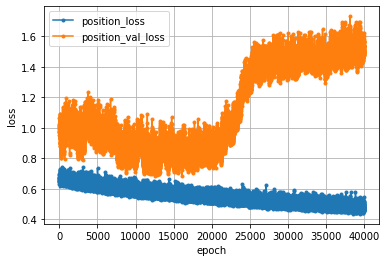

In [67]:
# 学習経過の可視化(位置)
position_loss     = position_history.history['loss']
position_val_loss = position_history.history['val_loss']

nb_epoch = len(position_loss)
plt.plot(range(nb_epoch), position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [60]:
## CNN(大きさ)

### modelの作成
half_size_model = Sequential()
### 畳み込み層
half_size_model.add(Conv1D(32, 3, padding='same', activation='relu', input_shape=(25, 1)))
### プーリング層
half_size_model.add(MaxPooling1D(2, padding='same'))
### Flatten層
half_size_model.add(Flatten())
### 全結合層
half_size_model.add(Dense(5, activation='softmax'))

### optimizer
adam = keras.optimizers.Adam()

###modelのコンパイル
half_size_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [24]:
# 学習(大きさ)
epochs = 400
batch_size = 32
half_size_history = half_size_model.fit(half_size_x_train, half_size_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(half_size_x_test, half_size_y_test))

Train on 740 samples, validate on 185 samples
Epoch 1/400
740/740 [==============================] - 0s 69us/step - loss: 0.1031 - accuracy: 0.9730 - val_loss: 0.0875 - val_accuracy: 0.9730
Epoch 2/400
740/740 [==============================] - 0s 73us/step - loss: 0.1088 - accuracy: 0.9689 - val_loss: 0.0997 - val_accuracy: 0.9730
Epoch 3/400
740/740 [==============================] - 0s 61us/step - loss: 0.1076 - accuracy: 0.9689 - val_loss: 0.0907 - val_accuracy: 0.9730
Epoch 4/400
740/740 [==============================] - 0s 61us/step - loss: 0.1028 - accuracy: 0.9716 - val_loss: 0.0853 - val_accuracy: 0.9784
Epoch 5/400
740/740 [==============================] - 0s 59us/step - loss: 0.1031 - accuracy: 0.9743 - val_loss: 0.0871 - val_accuracy: 0.9730
Epoch 6/400
740/740 [==============================] - 0s 113us/step - loss: 0.1029 - accuracy: 0.9730 - val_loss: 0.0831 - val_accuracy: 0.9784
Epoch 7/400
740/740 [==============================] - 0s 63us/step - loss: 0.1016 - accu

740/740 [==============================] - 0s 57us/step - loss: 0.0829 - accuracy: 0.9730 - val_loss: 0.0906 - val_accuracy: 0.9892
Epoch 58/400
740/740 [==============================] - 0s 55us/step - loss: 0.1035 - accuracy: 0.9703 - val_loss: 0.0734 - val_accuracy: 0.9838
Epoch 59/400
740/740 [==============================] - 0s 48us/step - loss: 0.0799 - accuracy: 0.9716 - val_loss: 0.0935 - val_accuracy: 0.9730
Epoch 60/400
740/740 [==============================] - 0s 52us/step - loss: 0.0870 - accuracy: 0.9743 - val_loss: 0.0751 - val_accuracy: 0.9730
Epoch 61/400
740/740 [==============================] - 0s 49us/step - loss: 0.0804 - accuracy: 0.9757 - val_loss: 0.0779 - val_accuracy: 0.9730
Epoch 62/400
740/740 [==============================] - 0s 47us/step - loss: 0.0802 - accuracy: 0.9770 - val_loss: 0.0770 - val_accuracy: 0.9730
Epoch 63/400
740/740 [==============================] - 0s 47us/step - loss: 0.0783 - accuracy: 0.9784 - val_loss: 0.0729 - val_accuracy: 0.978

740/740 [==============================] - 0s 48us/step - loss: 0.0644 - accuracy: 0.9784 - val_loss: 0.0660 - val_accuracy: 0.9730
Epoch 114/400
740/740 [==============================] - 0s 47us/step - loss: 0.0675 - accuracy: 0.9770 - val_loss: 0.0663 - val_accuracy: 0.9730
Epoch 115/400
740/740 [==============================] - 0s 44us/step - loss: 0.0634 - accuracy: 0.9770 - val_loss: 0.0661 - val_accuracy: 0.9730
Epoch 116/400
740/740 [==============================] - 0s 48us/step - loss: 0.0634 - accuracy: 0.9757 - val_loss: 0.0647 - val_accuracy: 0.9730
Epoch 117/400
740/740 [==============================] - 0s 48us/step - loss: 0.0631 - accuracy: 0.9757 - val_loss: 0.0696 - val_accuracy: 0.9892
Epoch 118/400
740/740 [==============================] - 0s 49us/step - loss: 0.0665 - accuracy: 0.9797 - val_loss: 0.0652 - val_accuracy: 0.9730
Epoch 119/400
740/740 [==============================] - 0s 46us/step - loss: 0.0624 - accuracy: 0.9770 - val_loss: 0.0693 - val_accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.0550 - accuracy: 0.9797 - val_loss: 0.0591 - val_accuracy: 0.9838
Epoch 170/400
740/740 [==============================] - 0s 46us/step - loss: 0.0515 - accuracy: 0.9797 - val_loss: 0.0598 - val_accuracy: 0.9892
Epoch 171/400
740/740 [==============================] - 0s 47us/step - loss: 0.0540 - accuracy: 0.9770 - val_loss: 0.0662 - val_accuracy: 0.9892
Epoch 172/400
740/740 [==============================] - 0s 50us/step - loss: 0.0584 - accuracy: 0.9811 - val_loss: 0.0590 - val_accuracy: 0.9838
Epoch 173/400
740/740 [==============================] - 0s 47us/step - loss: 0.0564 - accuracy: 0.9784 - val_loss: 0.0599 - val_accuracy: 0.9838
Epoch 174/400
740/740 [==============================] - 0s 47us/step - loss: 0.0578 - accuracy: 0.9838 - val_loss: 0.0619 - val_accuracy: 0.9730
Epoch 175/400
740/740 [==============================] - 0s 47us/step - loss: 0.0578 - accuracy: 0.9797 - val_loss: 0.0584 - val_accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.0420 - accuracy: 0.9851 - val_loss: 0.0574 - val_accuracy: 0.9892
Epoch 226/400
740/740 [==============================] - 0s 47us/step - loss: 0.0495 - accuracy: 0.9797 - val_loss: 0.0540 - val_accuracy: 0.9892
Epoch 227/400
740/740 [==============================] - 0s 48us/step - loss: 0.0460 - accuracy: 0.9838 - val_loss: 0.0537 - val_accuracy: 0.9838
Epoch 228/400
740/740 [==============================] - 0s 47us/step - loss: 0.0432 - accuracy: 0.9838 - val_loss: 0.0559 - val_accuracy: 0.9784
Epoch 229/400
740/740 [==============================] - 0s 46us/step - loss: 0.0622 - accuracy: 0.9797 - val_loss: 0.0564 - val_accuracy: 0.9838
Epoch 230/400
740/740 [==============================] - 0s 47us/step - loss: 0.0440 - accuracy: 0.9865 - val_loss: 0.0903 - val_accuracy: 0.9730
Epoch 231/400
740/740 [==============================] - 0s 49us/step - loss: 0.0491 - accuracy: 0.9811 - val_loss: 0.0559 - val_accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.0366 - accuracy: 0.9851 - val_loss: 0.0509 - val_accuracy: 0.9838
Epoch 282/400
740/740 [==============================] - 0s 47us/step - loss: 0.0357 - accuracy: 0.9865 - val_loss: 0.0500 - val_accuracy: 0.9838
Epoch 283/400
740/740 [==============================] - 0s 49us/step - loss: 0.0355 - accuracy: 0.9851 - val_loss: 0.0495 - val_accuracy: 0.9838
Epoch 284/400
740/740 [==============================] - 0s 49us/step - loss: 0.0378 - accuracy: 0.9838 - val_loss: 0.0539 - val_accuracy: 0.9892
Epoch 285/400
740/740 [==============================] - 0s 49us/step - loss: 0.0367 - accuracy: 0.9878 - val_loss: 0.0519 - val_accuracy: 0.9838
Epoch 286/400
740/740 [==============================] - 0s 46us/step - loss: 0.0391 - accuracy: 0.9851 - val_loss: 0.0542 - val_accuracy: 0.9838
Epoch 287/400
740/740 [==============================] - 0s 45us/step - loss: 0.0383 - accuracy: 0.9838 - val_loss: 0.0489 - val_accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.0299 - accuracy: 0.9905 - val_loss: 0.0481 - val_accuracy: 0.9892
Epoch 338/400
740/740 [==============================] - 0s 50us/step - loss: 0.0317 - accuracy: 0.9865 - val_loss: 0.0475 - val_accuracy: 0.9838
Epoch 339/400
740/740 [==============================] - 0s 46us/step - loss: 0.0308 - accuracy: 0.9892 - val_loss: 0.0480 - val_accuracy: 0.9838
Epoch 340/400
740/740 [==============================] - 0s 46us/step - loss: 0.0313 - accuracy: 0.9878 - val_loss: 0.0567 - val_accuracy: 0.9784
Epoch 341/400
740/740 [==============================] - 0s 46us/step - loss: 0.0426 - accuracy: 0.9797 - val_loss: 0.0508 - val_accuracy: 0.9838
Epoch 342/400
740/740 [==============================] - 0s 45us/step - loss: 0.0333 - accuracy: 0.9838 - val_loss: 0.0469 - val_accuracy: 0.9838
Epoch 343/400
740/740 [==============================] - 0s 50us/step - loss: 0.0303 - accuracy: 0.9878 - val_loss: 0.0468 - val_accuracy:

740/740 [==============================] - 0s 56us/step - loss: 0.0250 - accuracy: 0.9946 - val_loss: 0.0499 - val_accuracy: 0.9784
Epoch 394/400
740/740 [==============================] - 0s 53us/step - loss: 0.0263 - accuracy: 0.9919 - val_loss: 0.0443 - val_accuracy: 0.9892
Epoch 395/400
740/740 [==============================] - 0s 51us/step - loss: 0.0245 - accuracy: 0.9919 - val_loss: 0.0554 - val_accuracy: 0.9946
Epoch 396/400
740/740 [==============================] - 0s 51us/step - loss: 0.0341 - accuracy: 0.9838 - val_loss: 0.0471 - val_accuracy: 0.9946
Epoch 397/400
740/740 [==============================] - 0s 52us/step - loss: 0.0246 - accuracy: 0.9905 - val_loss: 0.0450 - val_accuracy: 0.9838
Epoch 398/400
740/740 [==============================] - 0s 51us/step - loss: 0.0236 - accuracy: 0.9946 - val_loss: 0.0440 - val_accuracy: 0.9838
Epoch 399/400
740/740 [==============================] - 0s 55us/step - loss: 0.0244 - accuracy: 0.9946 - val_loss: 0.0442 - val_accuracy:

In [25]:
# モデルの評価(大きさ)
half_size_score = half_size_model.evaluate(half_size_x_test, half_size_y_test, verbose=1)
print('Test loss:', half_size_score[0])
print('Test accuracy:', half_size_score[1])

185/185 [==============================] - 0s 40us/step
Test loss: 0.042909824561227015
Test accuracy: 0.9837837815284729


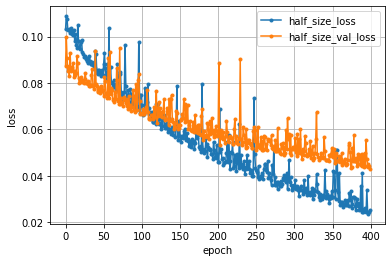

In [26]:
# 学習経過の可視化(大きさ)
half_size_loss     = half_size_history.history['loss']
half_size_val_loss = half_size_history.history['val_loss']

nb_epoch = len(half_size_loss)
plt.plot(range(nb_epoch), half_size_loss,     marker='.', label='half_size_loss')
plt.plot(range(nb_epoch), half_size_val_loss, marker='.', label='half_size_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [47]:
## CNN(位置)

### modelの作成
half_position_model = Sequential()
### 畳み込み層
half_position_model.add(Conv1D(32, 3, padding='same', activation='relu', input_shape=(25, 1)))
### プーリング層
half_position_model.add(MaxPooling1D(2, padding='same'))
### Flatten層
half_position_model.add(Flatten())
### 全結合層
half_position_model.add(Dense(25, activation='softmax'))

### optimizer
adam = keras.optimizers.Adam()

###modelのコンパイル
half_position_model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [48]:
# 学習(位置)
epochs = 4000
batch_size = 32
half_position_history = half_position_model.fit(half_position_x_train, half_position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(half_position_x_test, half_position_y_test))

Train on 740 samples, validate on 185 samples
Epoch 1/4000
740/740 [==============================] - 0s 207us/step - loss: 3.2270 - accuracy: 0.0405 - val_loss: 3.1074 - val_accuracy: 0.0595
Epoch 2/4000
740/740 [==============================] - 0s 56us/step - loss: 3.1261 - accuracy: 0.0838 - val_loss: 3.0649 - val_accuracy: 0.0865
Epoch 3/4000
740/740 [==============================] - 0s 67us/step - loss: 3.1010 - accuracy: 0.0973 - val_loss: 3.0392 - val_accuracy: 0.0919
Epoch 4/4000
740/740 [==============================] - 0s 63us/step - loss: 3.0821 - accuracy: 0.0959 - val_loss: 3.0197 - val_accuracy: 0.1027
Epoch 5/4000
740/740 [==============================] - 0s 64us/step - loss: 3.0627 - accuracy: 0.1162 - val_loss: 3.0000 - val_accuracy: 0.1135
Epoch 6/4000
740/740 [==============================] - 0s 69us/step - loss: 3.0442 - accuracy: 0.1189 - val_loss: 2.9974 - val_accuracy: 0.1189
Epoch 7/4000
740/740 [==============================] - 0s 66us/step - loss: 3.0386

Epoch 57/4000
740/740 [==============================] - 0s 54us/step - loss: 2.6288 - accuracy: 0.2473 - val_loss: 2.5234 - val_accuracy: 0.2432
Epoch 58/4000
740/740 [==============================] - 0s 53us/step - loss: 2.6204 - accuracy: 0.2473 - val_loss: 2.5063 - val_accuracy: 0.2541
Epoch 59/4000
740/740 [==============================] - 0s 54us/step - loss: 2.5975 - accuracy: 0.2311 - val_loss: 2.4738 - val_accuracy: 0.2541
Epoch 60/4000
740/740 [==============================] - 0s 52us/step - loss: 2.6038 - accuracy: 0.2486 - val_loss: 2.5034 - val_accuracy: 0.2649
Epoch 61/4000
740/740 [==============================] - 0s 54us/step - loss: 2.6025 - accuracy: 0.2446 - val_loss: 2.4839 - val_accuracy: 0.2324
Epoch 62/4000
740/740 [==============================] - 0s 54us/step - loss: 2.5932 - accuracy: 0.2568 - val_loss: 2.4765 - val_accuracy: 0.3081
Epoch 63/4000
740/740 [==============================] - 0s 55us/step - loss: 2.5931 - accuracy: 0.2270 - val_loss: 2.4462 -

740/740 [==============================] - 0s 54us/step - loss: 2.3643 - accuracy: 0.2878 - val_loss: 2.2433 - val_accuracy: 0.2649
Epoch 114/4000
740/740 [==============================] - 0s 55us/step - loss: 2.3436 - accuracy: 0.3041 - val_loss: 2.2252 - val_accuracy: 0.3081
Epoch 115/4000
740/740 [==============================] - 0s 52us/step - loss: 2.3544 - accuracy: 0.2649 - val_loss: 2.2128 - val_accuracy: 0.3514
Epoch 116/4000
740/740 [==============================] - 0s 51us/step - loss: 2.3490 - accuracy: 0.3027 - val_loss: 2.2074 - val_accuracy: 0.3730
Epoch 117/4000
740/740 [==============================] - 0s 53us/step - loss: 2.3363 - accuracy: 0.3216 - val_loss: 2.2578 - val_accuracy: 0.3351
Epoch 118/4000
740/740 [==============================] - 0s 51us/step - loss: 2.3340 - accuracy: 0.3162 - val_loss: 2.1956 - val_accuracy: 0.3135
Epoch 119/4000
740/740 [==============================] - 0s 53us/step - loss: 2.3350 - accuracy: 0.3014 - val_loss: 2.2079 - val_acc

Epoch 169/4000
740/740 [==============================] - 0s 53us/step - loss: 2.1805 - accuracy: 0.3216 - val_loss: 2.0602 - val_accuracy: 0.3838
Epoch 170/4000
740/740 [==============================] - 0s 55us/step - loss: 2.1802 - accuracy: 0.3581 - val_loss: 2.0440 - val_accuracy: 0.3946
Epoch 171/4000
740/740 [==============================] - 0s 52us/step - loss: 2.1612 - accuracy: 0.3689 - val_loss: 2.0659 - val_accuracy: 0.3514
Epoch 172/4000
740/740 [==============================] - 0s 54us/step - loss: 2.1785 - accuracy: 0.3405 - val_loss: 2.1136 - val_accuracy: 0.3784
Epoch 173/4000
740/740 [==============================] - 0s 52us/step - loss: 2.1868 - accuracy: 0.3703 - val_loss: 2.0293 - val_accuracy: 0.3676
Epoch 174/4000
740/740 [==============================] - 0s 53us/step - loss: 2.1634 - accuracy: 0.3662 - val_loss: 2.0198 - val_accuracy: 0.3514
Epoch 175/4000
740/740 [==============================] - 0s 53us/step - loss: 2.1686 - accuracy: 0.3338 - val_loss: 2

Epoch 225/4000
740/740 [==============================] - 0s 54us/step - loss: 2.0646 - accuracy: 0.3865 - val_loss: 1.9866 - val_accuracy: 0.3622
Epoch 226/4000
740/740 [==============================] - 0s 53us/step - loss: 2.0468 - accuracy: 0.3581 - val_loss: 1.9341 - val_accuracy: 0.4108
Epoch 227/4000
740/740 [==============================] - 0s 54us/step - loss: 2.0896 - accuracy: 0.3446 - val_loss: 1.9950 - val_accuracy: 0.4432
Epoch 228/4000
740/740 [==============================] - 0s 52us/step - loss: 2.0637 - accuracy: 0.3703 - val_loss: 1.9176 - val_accuracy: 0.4324
Epoch 229/4000
740/740 [==============================] - 0s 54us/step - loss: 2.0462 - accuracy: 0.3824 - val_loss: 1.9801 - val_accuracy: 0.3243
Epoch 230/4000
740/740 [==============================] - 0s 51us/step - loss: 2.0361 - accuracy: 0.3865 - val_loss: 1.9579 - val_accuracy: 0.3730
Epoch 231/4000
740/740 [==============================] - 0s 56us/step - loss: 2.0507 - accuracy: 0.3635 - val_loss: 1

Epoch 281/4000
740/740 [==============================] - 0s 54us/step - loss: 1.9599 - accuracy: 0.4014 - val_loss: 1.8220 - val_accuracy: 0.4378
Epoch 282/4000
740/740 [==============================] - 0s 56us/step - loss: 1.9416 - accuracy: 0.4054 - val_loss: 1.9195 - val_accuracy: 0.4000
Epoch 283/4000
740/740 [==============================] - 0s 55us/step - loss: 1.9664 - accuracy: 0.4270 - val_loss: 1.9132 - val_accuracy: 0.3784
Epoch 284/4000
740/740 [==============================] - 0s 53us/step - loss: 1.9868 - accuracy: 0.3622 - val_loss: 1.8616 - val_accuracy: 0.4054
Epoch 285/4000
740/740 [==============================] - 0s 54us/step - loss: 1.9578 - accuracy: 0.4054 - val_loss: 1.8503 - val_accuracy: 0.4432
Epoch 286/4000
740/740 [==============================] - 0s 56us/step - loss: 1.9363 - accuracy: 0.3797 - val_loss: 1.8445 - val_accuracy: 0.4432
Epoch 287/4000
740/740 [==============================] - 0s 51us/step - loss: 1.9472 - accuracy: 0.3932 - val_loss: 1

Epoch 337/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8680 - accuracy: 0.4297 - val_loss: 1.8676 - val_accuracy: 0.3892
Epoch 338/4000
740/740 [==============================] - 0s 55us/step - loss: 1.8898 - accuracy: 0.4000 - val_loss: 1.8181 - val_accuracy: 0.4432
Epoch 339/4000
740/740 [==============================] - 0s 53us/step - loss: 1.8683 - accuracy: 0.4459 - val_loss: 1.8240 - val_accuracy: 0.4378
Epoch 340/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8627 - accuracy: 0.4405 - val_loss: 1.7951 - val_accuracy: 0.4162
Epoch 341/4000
740/740 [==============================] - 0s 55us/step - loss: 1.8525 - accuracy: 0.4351 - val_loss: 1.7633 - val_accuracy: 0.4378
Epoch 342/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8756 - accuracy: 0.4230 - val_loss: 1.7824 - val_accuracy: 0.4757
Epoch 343/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8847 - accuracy: 0.3986 - val_loss: 1

Epoch 393/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8366 - accuracy: 0.4176 - val_loss: 1.7179 - val_accuracy: 0.4324
Epoch 394/4000
740/740 [==============================] - 0s 55us/step - loss: 1.8688 - accuracy: 0.3973 - val_loss: 1.7173 - val_accuracy: 0.4595
Epoch 395/4000
740/740 [==============================] - 0s 55us/step - loss: 1.8086 - accuracy: 0.4365 - val_loss: 1.7687 - val_accuracy: 0.4216
Epoch 396/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8261 - accuracy: 0.4230 - val_loss: 1.7858 - val_accuracy: 0.3784
Epoch 397/4000
740/740 [==============================] - 0s 54us/step - loss: 1.8023 - accuracy: 0.4311 - val_loss: 1.7488 - val_accuracy: 0.4378
Epoch 398/4000
740/740 [==============================] - 0s 54us/step - loss: 1.7874 - accuracy: 0.4446 - val_loss: 1.7443 - val_accuracy: 0.4432
Epoch 399/4000
740/740 [==============================] - 0s 55us/step - loss: 1.8498 - accuracy: 0.4095 - val_loss: 1

Epoch 449/4000
740/740 [==============================] - 0s 60us/step - loss: 1.7599 - accuracy: 0.4351 - val_loss: 1.7057 - val_accuracy: 0.3838
Epoch 450/4000
740/740 [==============================] - 0s 59us/step - loss: 1.7670 - accuracy: 0.4324 - val_loss: 1.7116 - val_accuracy: 0.4270
Epoch 451/4000
740/740 [==============================] - 0s 61us/step - loss: 1.7626 - accuracy: 0.4216 - val_loss: 1.7335 - val_accuracy: 0.3946
Epoch 452/4000
740/740 [==============================] - 0s 60us/step - loss: 1.7585 - accuracy: 0.4419 - val_loss: 1.6593 - val_accuracy: 0.5081
Epoch 453/4000
740/740 [==============================] - 0s 58us/step - loss: 1.7371 - accuracy: 0.4743 - val_loss: 1.7029 - val_accuracy: 0.4486
Epoch 454/4000
740/740 [==============================] - 0s 60us/step - loss: 1.7592 - accuracy: 0.4365 - val_loss: 1.6775 - val_accuracy: 0.4324
Epoch 455/4000
740/740 [==============================] - 0s 55us/step - loss: 1.7478 - accuracy: 0.4338 - val_loss: 1

Epoch 505/4000
740/740 [==============================] - 0s 54us/step - loss: 1.6981 - accuracy: 0.4689 - val_loss: 1.7061 - val_accuracy: 0.4270
Epoch 506/4000
740/740 [==============================] - 0s 52us/step - loss: 1.7295 - accuracy: 0.4446 - val_loss: 1.6907 - val_accuracy: 0.4649
Epoch 507/4000
740/740 [==============================] - 0s 54us/step - loss: 1.7159 - accuracy: 0.4541 - val_loss: 1.6960 - val_accuracy: 0.4324
Epoch 508/4000
740/740 [==============================] - 0s 53us/step - loss: 1.6984 - accuracy: 0.4649 - val_loss: 1.6934 - val_accuracy: 0.4541
Epoch 509/4000
740/740 [==============================] - 0s 55us/step - loss: 1.7196 - accuracy: 0.4608 - val_loss: 1.6404 - val_accuracy: 0.4703
Epoch 510/4000
740/740 [==============================] - 0s 54us/step - loss: 1.7089 - accuracy: 0.4662 - val_loss: 1.5998 - val_accuracy: 0.5243
Epoch 511/4000
740/740 [==============================] - 0s 56us/step - loss: 1.6897 - accuracy: 0.4689 - val_loss: 1

Epoch 561/4000
740/740 [==============================] - 0s 54us/step - loss: 1.6615 - accuracy: 0.4649 - val_loss: 1.5774 - val_accuracy: 0.4757
Epoch 562/4000
740/740 [==============================] - 0s 54us/step - loss: 1.6794 - accuracy: 0.4473 - val_loss: 1.6774 - val_accuracy: 0.4378
Epoch 563/4000
740/740 [==============================] - 0s 53us/step - loss: 1.6781 - accuracy: 0.4676 - val_loss: 1.6468 - val_accuracy: 0.4108
Epoch 564/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6825 - accuracy: 0.4514 - val_loss: 1.6123 - val_accuracy: 0.4432
Epoch 565/4000
740/740 [==============================] - 0s 54us/step - loss: 1.6846 - accuracy: 0.4581 - val_loss: 1.5994 - val_accuracy: 0.4973
Epoch 566/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6775 - accuracy: 0.4459 - val_loss: 1.6106 - val_accuracy: 0.4541
Epoch 567/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6783 - accuracy: 0.4703 - val_loss: 1

Epoch 617/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6128 - accuracy: 0.4824 - val_loss: 1.5523 - val_accuracy: 0.5081
Epoch 618/4000
740/740 [==============================] - 0s 54us/step - loss: 1.6312 - accuracy: 0.4527 - val_loss: 1.6140 - val_accuracy: 0.4757
Epoch 619/4000
740/740 [==============================] - 0s 58us/step - loss: 1.6254 - accuracy: 0.4865 - val_loss: 1.5535 - val_accuracy: 0.4865
Epoch 620/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6024 - accuracy: 0.5189 - val_loss: 1.5556 - val_accuracy: 0.5081
Epoch 621/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6073 - accuracy: 0.5081 - val_loss: 1.6203 - val_accuracy: 0.4595
Epoch 622/4000
740/740 [==============================] - 0s 53us/step - loss: 1.6376 - accuracy: 0.4770 - val_loss: 1.5748 - val_accuracy: 0.4216
Epoch 623/4000
740/740 [==============================] - 0s 55us/step - loss: 1.6180 - accuracy: 0.4581 - val_loss: 1

Epoch 673/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5940 - accuracy: 0.5014 - val_loss: 1.5481 - val_accuracy: 0.4649
Epoch 674/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5998 - accuracy: 0.4784 - val_loss: 1.5361 - val_accuracy: 0.4757
Epoch 675/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5886 - accuracy: 0.4757 - val_loss: 1.5779 - val_accuracy: 0.4649
Epoch 676/4000
740/740 [==============================] - 0s 51us/step - loss: 1.5717 - accuracy: 0.5027 - val_loss: 1.5089 - val_accuracy: 0.5459
Epoch 677/4000
740/740 [==============================] - 0s 56us/step - loss: 1.5848 - accuracy: 0.4892 - val_loss: 1.5782 - val_accuracy: 0.4270
Epoch 678/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5976 - accuracy: 0.4811 - val_loss: 1.5680 - val_accuracy: 0.4162
Epoch 679/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5956 - accuracy: 0.4838 - val_loss: 1

Epoch 729/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5918 - accuracy: 0.4851 - val_loss: 1.5272 - val_accuracy: 0.4649
Epoch 730/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5628 - accuracy: 0.4689 - val_loss: 1.5447 - val_accuracy: 0.4595
Epoch 731/4000
740/740 [==============================] - 0s 56us/step - loss: 1.6096 - accuracy: 0.4500 - val_loss: 1.5460 - val_accuracy: 0.4595
Epoch 732/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5839 - accuracy: 0.4568 - val_loss: 1.5175 - val_accuracy: 0.4432
Epoch 733/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5647 - accuracy: 0.4730 - val_loss: 1.5046 - val_accuracy: 0.4486
Epoch 734/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5355 - accuracy: 0.5095 - val_loss: 1.4992 - val_accuracy: 0.4919
Epoch 735/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5693 - accuracy: 0.5041 - val_loss: 1

Epoch 785/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5166 - accuracy: 0.5189 - val_loss: 1.4677 - val_accuracy: 0.5243
Epoch 786/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5474 - accuracy: 0.5000 - val_loss: 1.4225 - val_accuracy: 0.5784
Epoch 787/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5604 - accuracy: 0.4797 - val_loss: 1.5646 - val_accuracy: 0.4324
Epoch 788/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5474 - accuracy: 0.4838 - val_loss: 1.4919 - val_accuracy: 0.4919
Epoch 789/4000
740/740 [==============================] - 0s 53us/step - loss: 1.5702 - accuracy: 0.4743 - val_loss: 1.5581 - val_accuracy: 0.4541
Epoch 790/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5249 - accuracy: 0.5081 - val_loss: 1.4711 - val_accuracy: 0.4757
Epoch 791/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5500 - accuracy: 0.4838 - val_loss: 1

Epoch 841/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4985 - accuracy: 0.5216 - val_loss: 1.4108 - val_accuracy: 0.5027
Epoch 842/4000
740/740 [==============================] - 0s 52us/step - loss: 1.5020 - accuracy: 0.5135 - val_loss: 1.4634 - val_accuracy: 0.5243
Epoch 843/4000
740/740 [==============================] - 0s 56us/step - loss: 1.5014 - accuracy: 0.5122 - val_loss: 1.4830 - val_accuracy: 0.4216
Epoch 844/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4890 - accuracy: 0.5459 - val_loss: 1.4378 - val_accuracy: 0.5459
Epoch 845/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5202 - accuracy: 0.4892 - val_loss: 1.4044 - val_accuracy: 0.5568
Epoch 846/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5281 - accuracy: 0.5041 - val_loss: 1.4717 - val_accuracy: 0.4541
Epoch 847/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5188 - accuracy: 0.4878 - val_loss: 1

Epoch 897/4000
740/740 [==============================] - 0s 55us/step - loss: 1.5128 - accuracy: 0.5108 - val_loss: 1.4641 - val_accuracy: 0.4703
Epoch 898/4000
740/740 [==============================] - 0s 52us/step - loss: 1.4861 - accuracy: 0.5216 - val_loss: 1.4663 - val_accuracy: 0.4919
Epoch 899/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4699 - accuracy: 0.5527 - val_loss: 1.4758 - val_accuracy: 0.4703
Epoch 900/4000
740/740 [==============================] - 0s 52us/step - loss: 1.4652 - accuracy: 0.5243 - val_loss: 1.3842 - val_accuracy: 0.5405
Epoch 901/4000
740/740 [==============================] - 0s 54us/step - loss: 1.5056 - accuracy: 0.4865 - val_loss: 1.4268 - val_accuracy: 0.5135
Epoch 902/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4732 - accuracy: 0.5446 - val_loss: 1.4584 - val_accuracy: 0.4703
Epoch 903/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4993 - accuracy: 0.5068 - val_loss: 1

Epoch 953/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4778 - accuracy: 0.4919 - val_loss: 1.4310 - val_accuracy: 0.4757
Epoch 954/4000
740/740 [==============================] - 0s 52us/step - loss: 1.4736 - accuracy: 0.4892 - val_loss: 1.4063 - val_accuracy: 0.5459
Epoch 955/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4482 - accuracy: 0.5203 - val_loss: 1.3731 - val_accuracy: 0.5459
Epoch 956/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4645 - accuracy: 0.5135 - val_loss: 1.4081 - val_accuracy: 0.5459
Epoch 957/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4855 - accuracy: 0.5257 - val_loss: 1.4820 - val_accuracy: 0.4649
Epoch 958/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4920 - accuracy: 0.5203 - val_loss: 1.3822 - val_accuracy: 0.5676
Epoch 959/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4567 - accuracy: 0.5365 - val_loss: 1

740/740 [==============================] - 0s 54us/step - loss: 1.4529 - accuracy: 0.5176 - val_loss: 1.4591 - val_accuracy: 0.5081
Epoch 1009/4000
740/740 [==============================] - 0s 60us/step - loss: 1.4596 - accuracy: 0.5230 - val_loss: 1.3744 - val_accuracy: 0.5351
Epoch 1010/4000
740/740 [==============================] - 0s 64us/step - loss: 1.4490 - accuracy: 0.5311 - val_loss: 1.4338 - val_accuracy: 0.4757
Epoch 1011/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4256 - accuracy: 0.5365 - val_loss: 1.3830 - val_accuracy: 0.5297
Epoch 1012/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4527 - accuracy: 0.5081 - val_loss: 1.4487 - val_accuracy: 0.4811
Epoch 1013/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4507 - accuracy: 0.5176 - val_loss: 1.4599 - val_accuracy: 0.4541
Epoch 1014/4000
740/740 [==============================] - 0s 56us/step - loss: 1.4639 - accuracy: 0.5041 - val_loss: 1.3522 - v

740/740 [==============================] - 0s 53us/step - loss: 1.4184 - accuracy: 0.5351 - val_loss: 1.3861 - val_accuracy: 0.5135
Epoch 1064/4000
740/740 [==============================] - 0s 56us/step - loss: 1.4594 - accuracy: 0.5108 - val_loss: 1.3682 - val_accuracy: 0.5568
Epoch 1065/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4222 - accuracy: 0.5122 - val_loss: 1.3737 - val_accuracy: 0.5297
Epoch 1066/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4345 - accuracy: 0.5568 - val_loss: 1.3851 - val_accuracy: 0.5351
Epoch 1067/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4277 - accuracy: 0.5486 - val_loss: 1.3659 - val_accuracy: 0.5838
Epoch 1068/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4126 - accuracy: 0.5284 - val_loss: 1.3268 - val_accuracy: 0.5568
Epoch 1069/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4282 - accuracy: 0.5351 - val_loss: 1.3513 - v

740/740 [==============================] - 0s 55us/step - loss: 1.4039 - accuracy: 0.5392 - val_loss: 1.3465 - val_accuracy: 0.5568
Epoch 1119/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4288 - accuracy: 0.5649 - val_loss: 1.3880 - val_accuracy: 0.5405
Epoch 1120/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4045 - accuracy: 0.5270 - val_loss: 1.3980 - val_accuracy: 0.5189
Epoch 1121/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4048 - accuracy: 0.5405 - val_loss: 1.3092 - val_accuracy: 0.5676
Epoch 1122/4000
740/740 [==============================] - 0s 56us/step - loss: 1.4458 - accuracy: 0.4905 - val_loss: 1.4095 - val_accuracy: 0.5514
Epoch 1123/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4369 - accuracy: 0.5081 - val_loss: 1.3436 - val_accuracy: 0.5135
Epoch 1124/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4094 - accuracy: 0.5378 - val_loss: 1.3661 - v

740/740 [==============================] - 0s 54us/step - loss: 1.4063 - accuracy: 0.5216 - val_loss: 1.3315 - val_accuracy: 0.5405
Epoch 1174/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3887 - accuracy: 0.5581 - val_loss: 1.3826 - val_accuracy: 0.5135
Epoch 1175/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3939 - accuracy: 0.5486 - val_loss: 1.3656 - val_accuracy: 0.5514
Epoch 1176/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4126 - accuracy: 0.5176 - val_loss: 1.3468 - val_accuracy: 0.5622
Epoch 1177/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3963 - accuracy: 0.5311 - val_loss: 1.3847 - val_accuracy: 0.4865
Epoch 1178/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4026 - accuracy: 0.5162 - val_loss: 1.3430 - val_accuracy: 0.5459
Epoch 1179/4000
740/740 [==============================] - 0s 55us/step - loss: 1.4106 - accuracy: 0.5230 - val_loss: 1.3221 - v

740/740 [==============================] - 0s 59us/step - loss: 1.3704 - accuracy: 0.5581 - val_loss: 1.4083 - val_accuracy: 0.4649
Epoch 1229/4000
740/740 [==============================] - 0s 63us/step - loss: 1.4056 - accuracy: 0.5014 - val_loss: 1.3302 - val_accuracy: 0.5730
Epoch 1230/4000
740/740 [==============================] - 0s 57us/step - loss: 1.3956 - accuracy: 0.5270 - val_loss: 1.2775 - val_accuracy: 0.5676
Epoch 1231/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3759 - accuracy: 0.5743 - val_loss: 1.3198 - val_accuracy: 0.5568
Epoch 1232/4000
740/740 [==============================] - 0s 54us/step - loss: 1.4031 - accuracy: 0.5189 - val_loss: 1.3424 - val_accuracy: 0.5730
Epoch 1233/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3753 - accuracy: 0.5446 - val_loss: 1.4511 - val_accuracy: 0.4541
Epoch 1234/4000
740/740 [==============================] - 0s 53us/step - loss: 1.4039 - accuracy: 0.5392 - val_loss: 1.3716 - v

740/740 [==============================] - 0s 53us/step - loss: 1.3892 - accuracy: 0.5243 - val_loss: 1.3129 - val_accuracy: 0.5351
Epoch 1284/4000
740/740 [==============================] - 0s 56us/step - loss: 1.3636 - accuracy: 0.5500 - val_loss: 1.2993 - val_accuracy: 0.5243
Epoch 1285/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3818 - accuracy: 0.5473 - val_loss: 1.2652 - val_accuracy: 0.5784
Epoch 1286/4000
740/740 [==============================] - 0s 56us/step - loss: 1.3711 - accuracy: 0.5486 - val_loss: 1.3643 - val_accuracy: 0.5351
Epoch 1287/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3608 - accuracy: 0.5730 - val_loss: 1.2998 - val_accuracy: 0.5784
Epoch 1288/4000
740/740 [==============================] - 0s 51us/step - loss: 1.3841 - accuracy: 0.5486 - val_loss: 1.3139 - val_accuracy: 0.5189
Epoch 1289/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3841 - accuracy: 0.5365 - val_loss: 1.3450 - v

740/740 [==============================] - 0s 56us/step - loss: 1.3264 - accuracy: 0.5554 - val_loss: 1.3155 - val_accuracy: 0.5243
Epoch 1339/4000
740/740 [==============================] - 0s 57us/step - loss: 1.3566 - accuracy: 0.5486 - val_loss: 1.3546 - val_accuracy: 0.5243
Epoch 1340/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3345 - accuracy: 0.5622 - val_loss: 1.3012 - val_accuracy: 0.5351
Epoch 1341/4000
740/740 [==============================] - 0s 63us/step - loss: 1.3292 - accuracy: 0.5527 - val_loss: 1.2486 - val_accuracy: 0.5892
Epoch 1342/4000
740/740 [==============================] - 0s 59us/step - loss: 1.3536 - accuracy: 0.5446 - val_loss: 1.3137 - val_accuracy: 0.5189
Epoch 1343/4000
740/740 [==============================] - 0s 64us/step - loss: 1.3354 - accuracy: 0.5703 - val_loss: 1.3083 - val_accuracy: 0.5027
Epoch 1344/4000
740/740 [==============================] - 0s 69us/step - loss: 1.3606 - accuracy: 0.5324 - val_loss: 1.3043 - v

740/740 [==============================] - 0s 53us/step - loss: 1.3536 - accuracy: 0.5419 - val_loss: 1.2886 - val_accuracy: 0.5297
Epoch 1394/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3334 - accuracy: 0.5676 - val_loss: 1.3209 - val_accuracy: 0.5351
Epoch 1395/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3191 - accuracy: 0.5932 - val_loss: 1.2883 - val_accuracy: 0.5189
Epoch 1396/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3262 - accuracy: 0.5649 - val_loss: 1.2913 - val_accuracy: 0.5730
Epoch 1397/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3488 - accuracy: 0.5419 - val_loss: 1.3561 - val_accuracy: 0.4973
Epoch 1398/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3137 - accuracy: 0.5811 - val_loss: 1.2595 - val_accuracy: 0.5459
Epoch 1399/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3088 - accuracy: 0.5797 - val_loss: 1.2790 - v

740/740 [==============================] - 0s 54us/step - loss: 1.3161 - accuracy: 0.5649 - val_loss: 1.2194 - val_accuracy: 0.5568
Epoch 1449/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3067 - accuracy: 0.5689 - val_loss: 1.3000 - val_accuracy: 0.5027
Epoch 1450/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3282 - accuracy: 0.5459 - val_loss: 1.2756 - val_accuracy: 0.5568
Epoch 1451/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3483 - accuracy: 0.5527 - val_loss: 1.3066 - val_accuracy: 0.5297
Epoch 1452/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3449 - accuracy: 0.5716 - val_loss: 1.2664 - val_accuracy: 0.5568
Epoch 1453/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3144 - accuracy: 0.5514 - val_loss: 1.2678 - val_accuracy: 0.5459
Epoch 1454/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3328 - accuracy: 0.5703 - val_loss: 1.2784 - v

740/740 [==============================] - 0s 55us/step - loss: 1.2952 - accuracy: 0.6068 - val_loss: 1.3177 - val_accuracy: 0.5135
Epoch 1504/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3357 - accuracy: 0.5338 - val_loss: 1.2732 - val_accuracy: 0.5514
Epoch 1505/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3337 - accuracy: 0.5595 - val_loss: 1.3720 - val_accuracy: 0.5081
Epoch 1506/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3138 - accuracy: 0.5459 - val_loss: 1.3639 - val_accuracy: 0.5081
Epoch 1507/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3278 - accuracy: 0.5486 - val_loss: 1.2864 - val_accuracy: 0.5027
Epoch 1508/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3394 - accuracy: 0.5203 - val_loss: 1.3044 - val_accuracy: 0.5351
Epoch 1509/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3248 - accuracy: 0.5689 - val_loss: 1.3154 - v

740/740 [==============================] - 0s 56us/step - loss: 1.3628 - accuracy: 0.5297 - val_loss: 1.4341 - val_accuracy: 0.5514
Epoch 1559/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3107 - accuracy: 0.5473 - val_loss: 1.4062 - val_accuracy: 0.5297
Epoch 1560/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3319 - accuracy: 0.5622 - val_loss: 1.5381 - val_accuracy: 0.4973
Epoch 1561/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3252 - accuracy: 0.5635 - val_loss: 1.4818 - val_accuracy: 0.4973
Epoch 1562/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3297 - accuracy: 0.5378 - val_loss: 1.4440 - val_accuracy: 0.4919
Epoch 1563/4000
740/740 [==============================] - 0s 53us/step - loss: 1.3203 - accuracy: 0.5743 - val_loss: 1.3998 - val_accuracy: 0.5135
Epoch 1564/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2947 - accuracy: 0.5689 - val_loss: 1.3864 - v

740/740 [==============================] - 0s 56us/step - loss: 1.2663 - accuracy: 0.5797 - val_loss: 1.4124 - val_accuracy: 0.5081
Epoch 1614/4000
740/740 [==============================] - 0s 58us/step - loss: 1.3132 - accuracy: 0.5500 - val_loss: 1.4339 - val_accuracy: 0.5135
Epoch 1615/4000
740/740 [==============================] - 0s 58us/step - loss: 1.3221 - accuracy: 0.5459 - val_loss: 1.4489 - val_accuracy: 0.5027
Epoch 1616/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3429 - accuracy: 0.5419 - val_loss: 1.4240 - val_accuracy: 0.5405
Epoch 1617/4000
740/740 [==============================] - 0s 56us/step - loss: 1.3047 - accuracy: 0.5581 - val_loss: 1.4540 - val_accuracy: 0.4973
Epoch 1618/4000
740/740 [==============================] - 0s 59us/step - loss: 1.2911 - accuracy: 0.5554 - val_loss: 1.4556 - val_accuracy: 0.5622
Epoch 1619/4000
740/740 [==============================] - 0s 55us/step - loss: 1.3097 - accuracy: 0.5419 - val_loss: 1.4973 - v

740/740 [==============================] - 0s 55us/step - loss: 1.3145 - accuracy: 0.5770 - val_loss: 1.4277 - val_accuracy: 0.5784
Epoch 1669/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2912 - accuracy: 0.5797 - val_loss: 1.4725 - val_accuracy: 0.4649
Epoch 1670/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2901 - accuracy: 0.5595 - val_loss: 1.4814 - val_accuracy: 0.5189
Epoch 1671/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2784 - accuracy: 0.5743 - val_loss: 1.4477 - val_accuracy: 0.5027
Epoch 1672/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2856 - accuracy: 0.5554 - val_loss: 1.4299 - val_accuracy: 0.5297
Epoch 1673/4000
740/740 [==============================] - 0s 59us/step - loss: 1.3085 - accuracy: 0.5459 - val_loss: 1.4125 - val_accuracy: 0.5297
Epoch 1674/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2565 - accuracy: 0.5824 - val_loss: 1.4581 - v

740/740 [==============================] - 0s 54us/step - loss: 1.2753 - accuracy: 0.5514 - val_loss: 1.3960 - val_accuracy: 0.5459
Epoch 1724/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2652 - accuracy: 0.5730 - val_loss: 1.3471 - val_accuracy: 0.6324
Epoch 1725/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2705 - accuracy: 0.5459 - val_loss: 1.3965 - val_accuracy: 0.5730
Epoch 1726/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2585 - accuracy: 0.5892 - val_loss: 1.3997 - val_accuracy: 0.5135
Epoch 1727/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2544 - accuracy: 0.5784 - val_loss: 1.3312 - val_accuracy: 0.5676
Epoch 1728/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2594 - accuracy: 0.5811 - val_loss: 1.3891 - val_accuracy: 0.5676
Epoch 1729/4000
740/740 [==============================] - 0s 54us/step - loss: 1.3040 - accuracy: 0.5541 - val_loss: 1.4359 - v

740/740 [==============================] - 0s 55us/step - loss: 1.2689 - accuracy: 0.5838 - val_loss: 1.3292 - val_accuracy: 0.5946
Epoch 1779/4000
740/740 [==============================] - 0s 57us/step - loss: 1.2554 - accuracy: 0.5689 - val_loss: 1.3642 - val_accuracy: 0.5459
Epoch 1780/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2476 - accuracy: 0.5743 - val_loss: 1.3878 - val_accuracy: 0.5243
Epoch 1781/4000
740/740 [==============================] - 0s 57us/step - loss: 1.2544 - accuracy: 0.5649 - val_loss: 1.3091 - val_accuracy: 0.6378
Epoch 1782/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2313 - accuracy: 0.6014 - val_loss: 1.3009 - val_accuracy: 0.5946
Epoch 1783/4000
740/740 [==============================] - 0s 52us/step - loss: 1.2548 - accuracy: 0.5959 - val_loss: 1.3148 - val_accuracy: 0.5676
Epoch 1784/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2819 - accuracy: 0.5676 - val_loss: 1.3086 - v

740/740 [==============================] - 0s 54us/step - loss: 1.3057 - accuracy: 0.5311 - val_loss: 1.3506 - val_accuracy: 0.5459
Epoch 1834/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2739 - accuracy: 0.5662 - val_loss: 1.3235 - val_accuracy: 0.5351
Epoch 1835/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2866 - accuracy: 0.5500 - val_loss: 1.4189 - val_accuracy: 0.4973
Epoch 1836/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2938 - accuracy: 0.5365 - val_loss: 1.3622 - val_accuracy: 0.5459
Epoch 1837/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2559 - accuracy: 0.5824 - val_loss: 1.2939 - val_accuracy: 0.6000
Epoch 1838/4000
740/740 [==============================] - 0s 58us/step - loss: 1.2676 - accuracy: 0.5554 - val_loss: 1.3385 - val_accuracy: 0.5568
Epoch 1839/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2834 - accuracy: 0.5568 - val_loss: 1.4214 - v

740/740 [==============================] - 0s 56us/step - loss: 1.2369 - accuracy: 0.5878 - val_loss: 1.3023 - val_accuracy: 0.5568
Epoch 1889/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2236 - accuracy: 0.6027 - val_loss: 1.2655 - val_accuracy: 0.5892
Epoch 1890/4000
740/740 [==============================] - 0s 57us/step - loss: 1.2662 - accuracy: 0.5892 - val_loss: 1.2502 - val_accuracy: 0.6216
Epoch 1891/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2487 - accuracy: 0.5689 - val_loss: 1.3049 - val_accuracy: 0.5676
Epoch 1892/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2562 - accuracy: 0.5824 - val_loss: 1.2526 - val_accuracy: 0.5676
Epoch 1893/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2451 - accuracy: 0.5676 - val_loss: 1.2893 - val_accuracy: 0.6162
Epoch 1894/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2352 - accuracy: 0.6014 - val_loss: 1.2909 - v

740/740 [==============================] - 0s 54us/step - loss: 1.2542 - accuracy: 0.5811 - val_loss: 1.2659 - val_accuracy: 0.5676
Epoch 1944/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2632 - accuracy: 0.5770 - val_loss: 1.2784 - val_accuracy: 0.5784
Epoch 1945/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2563 - accuracy: 0.5622 - val_loss: 1.3401 - val_accuracy: 0.4973
Epoch 1946/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2171 - accuracy: 0.6108 - val_loss: 1.3368 - val_accuracy: 0.5297
Epoch 1947/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2135 - accuracy: 0.6041 - val_loss: 1.2337 - val_accuracy: 0.6270
Epoch 1948/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2387 - accuracy: 0.5851 - val_loss: 1.2500 - val_accuracy: 0.5892
Epoch 1949/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2278 - accuracy: 0.5919 - val_loss: 1.3228 - v

740/740 [==============================] - 0s 62us/step - loss: 1.2232 - accuracy: 0.5878 - val_loss: 1.2254 - val_accuracy: 0.5838
Epoch 1999/4000
740/740 [==============================] - 0s 58us/step - loss: 1.2232 - accuracy: 0.5946 - val_loss: 1.2754 - val_accuracy: 0.5892
Epoch 2000/4000
740/740 [==============================] - 0s 60us/step - loss: 1.2483 - accuracy: 0.5689 - val_loss: 1.2769 - val_accuracy: 0.5459
Epoch 2001/4000
740/740 [==============================] - 0s 62us/step - loss: 1.2585 - accuracy: 0.5716 - val_loss: 1.2882 - val_accuracy: 0.5135
Epoch 2002/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2470 - accuracy: 0.5649 - val_loss: 1.2429 - val_accuracy: 0.5838
Epoch 2003/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2306 - accuracy: 0.5851 - val_loss: 1.2506 - val_accuracy: 0.5730
Epoch 2004/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2359 - accuracy: 0.5743 - val_loss: 1.2989 - v

740/740 [==============================] - 0s 53us/step - loss: 1.2292 - accuracy: 0.5811 - val_loss: 1.2259 - val_accuracy: 0.5730
Epoch 2054/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2209 - accuracy: 0.5932 - val_loss: 1.3111 - val_accuracy: 0.5081
Epoch 2055/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2323 - accuracy: 0.5986 - val_loss: 1.2116 - val_accuracy: 0.5514
Epoch 2056/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2005 - accuracy: 0.5959 - val_loss: 1.3686 - val_accuracy: 0.4919
Epoch 2057/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2553 - accuracy: 0.5730 - val_loss: 1.2875 - val_accuracy: 0.5405
Epoch 2058/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2321 - accuracy: 0.5946 - val_loss: 1.1953 - val_accuracy: 0.6432
Epoch 2059/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2237 - accuracy: 0.5757 - val_loss: 1.2125 - v

740/740 [==============================] - 0s 55us/step - loss: 1.2399 - accuracy: 0.5595 - val_loss: 1.2714 - val_accuracy: 0.5243
Epoch 2109/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2263 - accuracy: 0.5851 - val_loss: 1.3136 - val_accuracy: 0.5081
Epoch 2110/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2302 - accuracy: 0.5770 - val_loss: 1.2858 - val_accuracy: 0.5459
Epoch 2111/4000
740/740 [==============================] - 0s 63us/step - loss: 1.2316 - accuracy: 0.5824 - val_loss: 1.1718 - val_accuracy: 0.6108
Epoch 2112/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2098 - accuracy: 0.6014 - val_loss: 1.2316 - val_accuracy: 0.5730
Epoch 2113/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2301 - accuracy: 0.5838 - val_loss: 1.2417 - val_accuracy: 0.5405
Epoch 2114/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2725 - accuracy: 0.5689 - val_loss: 1.2318 - v

740/740 [==============================] - 0s 53us/step - loss: 1.2095 - accuracy: 0.5838 - val_loss: 1.2422 - val_accuracy: 0.5405
Epoch 2164/4000
740/740 [==============================] - 0s 58us/step - loss: 1.2398 - accuracy: 0.5703 - val_loss: 1.2107 - val_accuracy: 0.5243
Epoch 2165/4000
740/740 [==============================] - 0s 51us/step - loss: 1.1957 - accuracy: 0.5797 - val_loss: 1.2282 - val_accuracy: 0.5622
Epoch 2166/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2056 - accuracy: 0.5986 - val_loss: 1.2205 - val_accuracy: 0.6000
Epoch 2167/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2248 - accuracy: 0.5824 - val_loss: 1.1943 - val_accuracy: 0.5892
Epoch 2168/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2167 - accuracy: 0.5730 - val_loss: 1.1982 - val_accuracy: 0.6270
Epoch 2169/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2186 - accuracy: 0.5676 - val_loss: 1.2329 - v

740/740 [==============================] - 0s 56us/step - loss: 1.1915 - accuracy: 0.6068 - val_loss: 1.2037 - val_accuracy: 0.5459
Epoch 2219/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2380 - accuracy: 0.5662 - val_loss: 1.2977 - val_accuracy: 0.5135
Epoch 2220/4000
740/740 [==============================] - 0s 56us/step - loss: 1.2101 - accuracy: 0.5959 - val_loss: 1.1510 - val_accuracy: 0.6054
Epoch 2221/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2243 - accuracy: 0.5878 - val_loss: 1.1813 - val_accuracy: 0.5838
Epoch 2222/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1993 - accuracy: 0.6027 - val_loss: 1.2857 - val_accuracy: 0.5081
Epoch 2223/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2196 - accuracy: 0.5865 - val_loss: 1.1910 - val_accuracy: 0.5946
Epoch 2224/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2100 - accuracy: 0.5797 - val_loss: 1.2608 - v

740/740 [==============================] - 0s 54us/step - loss: 1.2083 - accuracy: 0.5865 - val_loss: 1.2311 - val_accuracy: 0.5459
Epoch 2274/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2092 - accuracy: 0.6122 - val_loss: 1.1952 - val_accuracy: 0.5405
Epoch 2275/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1887 - accuracy: 0.6122 - val_loss: 1.1716 - val_accuracy: 0.5946
Epoch 2276/4000
740/740 [==============================] - 0s 51us/step - loss: 1.2103 - accuracy: 0.5838 - val_loss: 1.2545 - val_accuracy: 0.5243
Epoch 2277/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1988 - accuracy: 0.6176 - val_loss: 1.1989 - val_accuracy: 0.6000
Epoch 2278/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1940 - accuracy: 0.5838 - val_loss: 1.1749 - val_accuracy: 0.5946
Epoch 2279/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1896 - accuracy: 0.5973 - val_loss: 1.2223 - v

740/740 [==============================] - 0s 57us/step - loss: 1.1831 - accuracy: 0.6135 - val_loss: 1.1734 - val_accuracy: 0.5784
Epoch 2329/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1985 - accuracy: 0.5703 - val_loss: 1.2143 - val_accuracy: 0.6108
Epoch 2330/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1943 - accuracy: 0.5865 - val_loss: 1.1871 - val_accuracy: 0.5351
Epoch 2331/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1901 - accuracy: 0.6054 - val_loss: 1.2661 - val_accuracy: 0.5405
Epoch 2332/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2106 - accuracy: 0.5743 - val_loss: 1.2149 - val_accuracy: 0.5838
Epoch 2333/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1863 - accuracy: 0.5865 - val_loss: 1.1772 - val_accuracy: 0.5838
Epoch 2334/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2182 - accuracy: 0.5730 - val_loss: 1.1952 - v

740/740 [==============================] - 0s 55us/step - loss: 1.1784 - accuracy: 0.6203 - val_loss: 1.1250 - val_accuracy: 0.6324
Epoch 2384/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1710 - accuracy: 0.6108 - val_loss: 1.2473 - val_accuracy: 0.4865
Epoch 2385/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1785 - accuracy: 0.6122 - val_loss: 1.1747 - val_accuracy: 0.5676
Epoch 2386/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1701 - accuracy: 0.6095 - val_loss: 1.2998 - val_accuracy: 0.5459
Epoch 2387/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2219 - accuracy: 0.5919 - val_loss: 1.2163 - val_accuracy: 0.5514
Epoch 2388/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1800 - accuracy: 0.5959 - val_loss: 1.2516 - val_accuracy: 0.4811
Epoch 2389/4000
740/740 [==============================] - 0s 55us/step - loss: 1.2205 - accuracy: 0.5770 - val_loss: 1.1523 - v

740/740 [==============================] - 0s 54us/step - loss: 1.2223 - accuracy: 0.5757 - val_loss: 1.1669 - val_accuracy: 0.5892
Epoch 2439/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1640 - accuracy: 0.6149 - val_loss: 1.1929 - val_accuracy: 0.5622
Epoch 2440/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1914 - accuracy: 0.5811 - val_loss: 1.1858 - val_accuracy: 0.5730
Epoch 2441/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1761 - accuracy: 0.5865 - val_loss: 1.2183 - val_accuracy: 0.5568
Epoch 2442/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1632 - accuracy: 0.6108 - val_loss: 1.2042 - val_accuracy: 0.5405
Epoch 2443/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1880 - accuracy: 0.5932 - val_loss: 1.2359 - val_accuracy: 0.5405
Epoch 2444/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2057 - accuracy: 0.5878 - val_loss: 1.1858 - v

740/740 [==============================] - 0s 53us/step - loss: 1.1858 - accuracy: 0.5905 - val_loss: 1.1918 - val_accuracy: 0.6162
Epoch 2494/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1800 - accuracy: 0.6068 - val_loss: 1.1727 - val_accuracy: 0.5838
Epoch 2495/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1842 - accuracy: 0.5689 - val_loss: 1.1768 - val_accuracy: 0.5838
Epoch 2496/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2167 - accuracy: 0.5946 - val_loss: 1.2287 - val_accuracy: 0.5784
Epoch 2497/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2476 - accuracy: 0.5743 - val_loss: 1.1911 - val_accuracy: 0.6324
Epoch 2498/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1989 - accuracy: 0.5946 - val_loss: 1.2027 - val_accuracy: 0.5189
Epoch 2499/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1852 - accuracy: 0.6000 - val_loss: 1.2030 - v

740/740 [==============================] - 0s 55us/step - loss: 1.1648 - accuracy: 0.6311 - val_loss: 1.1821 - val_accuracy: 0.5459
Epoch 2549/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1937 - accuracy: 0.6014 - val_loss: 1.1746 - val_accuracy: 0.5946
Epoch 2550/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1923 - accuracy: 0.5824 - val_loss: 1.2100 - val_accuracy: 0.5892
Epoch 2551/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1490 - accuracy: 0.6230 - val_loss: 1.1639 - val_accuracy: 0.5784
Epoch 2552/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1476 - accuracy: 0.6135 - val_loss: 1.2129 - val_accuracy: 0.5838
Epoch 2553/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1699 - accuracy: 0.5824 - val_loss: 1.2622 - val_accuracy: 0.5135
Epoch 2554/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2165 - accuracy: 0.5743 - val_loss: 1.2822 - v

740/740 [==============================] - 0s 55us/step - loss: 1.1424 - accuracy: 0.5973 - val_loss: 1.1649 - val_accuracy: 0.6108
Epoch 2604/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1821 - accuracy: 0.5946 - val_loss: 1.2018 - val_accuracy: 0.5892
Epoch 2605/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1826 - accuracy: 0.6081 - val_loss: 1.1516 - val_accuracy: 0.6108
Epoch 2606/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1863 - accuracy: 0.5986 - val_loss: 1.1697 - val_accuracy: 0.5622
Epoch 2607/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1862 - accuracy: 0.5986 - val_loss: 1.1490 - val_accuracy: 0.6595
Epoch 2608/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1715 - accuracy: 0.6054 - val_loss: 1.1829 - val_accuracy: 0.6216
Epoch 2609/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1625 - accuracy: 0.6297 - val_loss: 1.2406 - v

740/740 [==============================] - 0s 55us/step - loss: 1.1873 - accuracy: 0.6000 - val_loss: 1.2101 - val_accuracy: 0.5568
Epoch 2659/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1638 - accuracy: 0.5797 - val_loss: 1.2681 - val_accuracy: 0.5297
Epoch 2660/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1625 - accuracy: 0.5959 - val_loss: 1.2563 - val_accuracy: 0.5405
Epoch 2661/4000
740/740 [==============================] - 0s 53us/step - loss: 1.2018 - accuracy: 0.5662 - val_loss: 1.2363 - val_accuracy: 0.5784
Epoch 2662/4000
740/740 [==============================] - 0s 54us/step - loss: 1.2067 - accuracy: 0.5662 - val_loss: 1.1670 - val_accuracy: 0.5568
Epoch 2663/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1648 - accuracy: 0.5932 - val_loss: 1.2069 - val_accuracy: 0.5838
Epoch 2664/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1435 - accuracy: 0.6081 - val_loss: 1.2278 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1438 - accuracy: 0.6135 - val_loss: 1.1297 - val_accuracy: 0.6270
Epoch 2714/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1436 - accuracy: 0.6324 - val_loss: 1.1955 - val_accuracy: 0.5568
Epoch 2715/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1737 - accuracy: 0.6095 - val_loss: 1.2571 - val_accuracy: 0.5946
Epoch 2716/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1502 - accuracy: 0.6122 - val_loss: 1.1163 - val_accuracy: 0.5892
Epoch 2717/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1566 - accuracy: 0.6068 - val_loss: 1.1711 - val_accuracy: 0.5622
Epoch 2718/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1435 - accuracy: 0.6230 - val_loss: 1.1689 - val_accuracy: 0.5784
Epoch 2719/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1528 - accuracy: 0.6108 - val_loss: 1.2111 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1911 - accuracy: 0.5757 - val_loss: 1.2324 - val_accuracy: 0.5514
Epoch 2769/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1577 - accuracy: 0.6189 - val_loss: 1.1584 - val_accuracy: 0.5676
Epoch 2770/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1582 - accuracy: 0.6162 - val_loss: 1.1837 - val_accuracy: 0.5676
Epoch 2771/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1812 - accuracy: 0.6068 - val_loss: 1.1838 - val_accuracy: 0.5784
Epoch 2772/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1593 - accuracy: 0.6189 - val_loss: 1.1772 - val_accuracy: 0.5730
Epoch 2773/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1558 - accuracy: 0.6014 - val_loss: 1.2359 - val_accuracy: 0.5730
Epoch 2774/4000
740/740 [==============================] - 0s 52us/step - loss: 1.1584 - accuracy: 0.5838 - val_loss: 1.1654 - v

740/740 [==============================] - 0s 56us/step - loss: 1.1678 - accuracy: 0.5919 - val_loss: 1.2549 - val_accuracy: 0.5676
Epoch 2824/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1880 - accuracy: 0.5797 - val_loss: 1.1582 - val_accuracy: 0.6108
Epoch 2825/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1306 - accuracy: 0.6230 - val_loss: 1.1379 - val_accuracy: 0.6270
Epoch 2826/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1571 - accuracy: 0.6095 - val_loss: 1.2203 - val_accuracy: 0.5568
Epoch 2827/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1409 - accuracy: 0.6270 - val_loss: 1.0991 - val_accuracy: 0.6757
Epoch 2828/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1673 - accuracy: 0.6081 - val_loss: 1.2625 - val_accuracy: 0.5135
Epoch 2829/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1383 - accuracy: 0.6149 - val_loss: 1.1674 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1277 - accuracy: 0.6243 - val_loss: 1.1559 - val_accuracy: 0.5946
Epoch 2879/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1346 - accuracy: 0.6000 - val_loss: 1.1954 - val_accuracy: 0.5730
Epoch 2880/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1360 - accuracy: 0.6149 - val_loss: 1.2106 - val_accuracy: 0.5676
Epoch 2881/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1697 - accuracy: 0.6054 - val_loss: 1.1673 - val_accuracy: 0.6054
Epoch 2882/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1451 - accuracy: 0.6297 - val_loss: 1.1895 - val_accuracy: 0.5730
Epoch 2883/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1368 - accuracy: 0.6135 - val_loss: 1.1327 - val_accuracy: 0.6432
Epoch 2884/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1433 - accuracy: 0.6081 - val_loss: 1.0968 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1294 - accuracy: 0.6230 - val_loss: 1.2312 - val_accuracy: 0.5351
Epoch 2934/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1252 - accuracy: 0.6068 - val_loss: 1.2382 - val_accuracy: 0.5676
Epoch 2935/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1716 - accuracy: 0.5986 - val_loss: 1.1564 - val_accuracy: 0.6054
Epoch 2936/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1440 - accuracy: 0.6054 - val_loss: 1.2872 - val_accuracy: 0.5243
Epoch 2937/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1212 - accuracy: 0.6230 - val_loss: 1.2044 - val_accuracy: 0.5297
Epoch 2938/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1105 - accuracy: 0.6500 - val_loss: 1.1417 - val_accuracy: 0.6000
Epoch 2939/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1233 - accuracy: 0.6068 - val_loss: 1.2370 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1063 - accuracy: 0.6230 - val_loss: 1.1366 - val_accuracy: 0.6054
Epoch 2989/4000
740/740 [==============================] - 0s 57us/step - loss: 1.1183 - accuracy: 0.6311 - val_loss: 1.1650 - val_accuracy: 0.6054
Epoch 2990/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1395 - accuracy: 0.6365 - val_loss: 1.1271 - val_accuracy: 0.6270
Epoch 2991/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1145 - accuracy: 0.6243 - val_loss: 1.2050 - val_accuracy: 0.5946
Epoch 2992/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1536 - accuracy: 0.6081 - val_loss: 1.1591 - val_accuracy: 0.6054
Epoch 2993/4000
740/740 [==============================] - 0s 57us/step - loss: 1.1692 - accuracy: 0.5959 - val_loss: 1.1319 - val_accuracy: 0.6108
Epoch 2994/4000
740/740 [==============================] - 0s 57us/step - loss: 1.1149 - accuracy: 0.6122 - val_loss: 1.1057 - v

740/740 [==============================] - 0s 55us/step - loss: 1.1513 - accuracy: 0.6054 - val_loss: 1.1784 - val_accuracy: 0.5514
Epoch 3044/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1567 - accuracy: 0.5824 - val_loss: 1.1461 - val_accuracy: 0.6000
Epoch 3045/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1240 - accuracy: 0.6162 - val_loss: 1.1687 - val_accuracy: 0.6270
Epoch 3046/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1326 - accuracy: 0.6257 - val_loss: 1.1294 - val_accuracy: 0.6162
Epoch 3047/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1212 - accuracy: 0.6257 - val_loss: 1.2595 - val_accuracy: 0.5459
Epoch 3048/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1349 - accuracy: 0.5973 - val_loss: 1.1370 - val_accuracy: 0.6054
Epoch 3049/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1108 - accuracy: 0.6378 - val_loss: 1.2269 - v

740/740 [==============================] - 0s 57us/step - loss: 1.0975 - accuracy: 0.6527 - val_loss: 1.1786 - val_accuracy: 0.5730
Epoch 3099/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1376 - accuracy: 0.6230 - val_loss: 1.1952 - val_accuracy: 0.5892
Epoch 3100/4000
740/740 [==============================] - 0s 58us/step - loss: 1.1213 - accuracy: 0.6216 - val_loss: 1.1557 - val_accuracy: 0.5892
Epoch 3101/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1190 - accuracy: 0.6014 - val_loss: 1.1535 - val_accuracy: 0.5784
Epoch 3102/4000
740/740 [==============================] - 0s 59us/step - loss: 1.1177 - accuracy: 0.6203 - val_loss: 1.1567 - val_accuracy: 0.5730
Epoch 3103/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1301 - accuracy: 0.6230 - val_loss: 1.1018 - val_accuracy: 0.6162
Epoch 3104/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1345 - accuracy: 0.6135 - val_loss: 1.1862 - v

740/740 [==============================] - 0s 58us/step - loss: 1.1421 - accuracy: 0.5932 - val_loss: 1.1281 - val_accuracy: 0.5892
Epoch 3154/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1160 - accuracy: 0.6189 - val_loss: 1.2036 - val_accuracy: 0.5622
Epoch 3155/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1316 - accuracy: 0.6108 - val_loss: 1.3104 - val_accuracy: 0.5459
Epoch 3156/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1324 - accuracy: 0.6311 - val_loss: 1.1174 - val_accuracy: 0.6000
Epoch 3157/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1298 - accuracy: 0.6176 - val_loss: 1.1384 - val_accuracy: 0.5784
Epoch 3158/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1397 - accuracy: 0.5959 - val_loss: 1.2681 - val_accuracy: 0.5081
Epoch 3159/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1422 - accuracy: 0.5946 - val_loss: 1.1607 - v

740/740 [==============================] - 0s 54us/step - loss: 1.0847 - accuracy: 0.6108 - val_loss: 1.2190 - val_accuracy: 0.5676
Epoch 3209/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1023 - accuracy: 0.6324 - val_loss: 1.2107 - val_accuracy: 0.5135
Epoch 3210/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1405 - accuracy: 0.6014 - val_loss: 1.1631 - val_accuracy: 0.5730
Epoch 3211/4000
740/740 [==============================] - 0s 60us/step - loss: 1.0862 - accuracy: 0.6176 - val_loss: 1.1432 - val_accuracy: 0.5622
Epoch 3212/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1171 - accuracy: 0.6135 - val_loss: 1.1776 - val_accuracy: 0.5405
Epoch 3213/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1161 - accuracy: 0.6027 - val_loss: 1.2133 - val_accuracy: 0.5243
Epoch 3214/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1373 - accuracy: 0.6041 - val_loss: 1.1760 - v

740/740 [==============================] - 0s 53us/step - loss: 1.0864 - accuracy: 0.6365 - val_loss: 1.1592 - val_accuracy: 0.6216
Epoch 3264/4000
740/740 [==============================] - 0s 52us/step - loss: 1.0782 - accuracy: 0.6486 - val_loss: 1.1496 - val_accuracy: 0.5946
Epoch 3265/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1479 - accuracy: 0.6041 - val_loss: 1.1284 - val_accuracy: 0.6270
Epoch 3266/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1648 - accuracy: 0.5959 - val_loss: 1.1303 - val_accuracy: 0.6000
Epoch 3267/4000
740/740 [==============================] - 0s 52us/step - loss: 1.1268 - accuracy: 0.6122 - val_loss: 1.0957 - val_accuracy: 0.5838
Epoch 3268/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1078 - accuracy: 0.6311 - val_loss: 1.2890 - val_accuracy: 0.5351
Epoch 3269/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1178 - accuracy: 0.6068 - val_loss: 1.1671 - v

740/740 [==============================] - 0s 53us/step - loss: 1.1211 - accuracy: 0.5919 - val_loss: 1.1645 - val_accuracy: 0.6108
Epoch 3319/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1369 - accuracy: 0.6189 - val_loss: 1.1439 - val_accuracy: 0.6108
Epoch 3320/4000
740/740 [==============================] - 0s 53us/step - loss: 1.0822 - accuracy: 0.6189 - val_loss: 1.1600 - val_accuracy: 0.5351
Epoch 3321/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0976 - accuracy: 0.6122 - val_loss: 1.1196 - val_accuracy: 0.5784
Epoch 3322/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1386 - accuracy: 0.5973 - val_loss: 1.0900 - val_accuracy: 0.5946
Epoch 3323/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1114 - accuracy: 0.6243 - val_loss: 1.1949 - val_accuracy: 0.5838
Epoch 3324/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1737 - accuracy: 0.5959 - val_loss: 1.1746 - v

740/740 [==============================] - 0s 54us/step - loss: 1.1594 - accuracy: 0.5892 - val_loss: 1.2066 - val_accuracy: 0.5297
Epoch 3374/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1072 - accuracy: 0.6095 - val_loss: 1.1722 - val_accuracy: 0.5946
Epoch 3375/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1275 - accuracy: 0.5905 - val_loss: 1.1778 - val_accuracy: 0.5730
Epoch 3376/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0986 - accuracy: 0.6189 - val_loss: 1.1781 - val_accuracy: 0.6054
Epoch 3377/4000
740/740 [==============================] - 0s 56us/step - loss: 1.0805 - accuracy: 0.6459 - val_loss: 1.1584 - val_accuracy: 0.5622
Epoch 3378/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0941 - accuracy: 0.6162 - val_loss: 1.1605 - val_accuracy: 0.5784
Epoch 3379/4000
740/740 [==============================] - 0s 58us/step - loss: 1.1122 - accuracy: 0.5973 - val_loss: 1.1588 - v

740/740 [==============================] - 0s 59us/step - loss: 1.1279 - accuracy: 0.6054 - val_loss: 1.1761 - val_accuracy: 0.6000
Epoch 3429/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1103 - accuracy: 0.6365 - val_loss: 1.1506 - val_accuracy: 0.5838
Epoch 3430/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1424 - accuracy: 0.6068 - val_loss: 1.2439 - val_accuracy: 0.5676
Epoch 3431/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1247 - accuracy: 0.6041 - val_loss: 1.1969 - val_accuracy: 0.5892
Epoch 3432/4000
740/740 [==============================] - 0s 53us/step - loss: 1.1438 - accuracy: 0.6054 - val_loss: 1.2478 - val_accuracy: 0.5027
Epoch 3433/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1112 - accuracy: 0.6014 - val_loss: 1.1057 - val_accuracy: 0.6324
Epoch 3434/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0964 - accuracy: 0.6338 - val_loss: 1.1368 - v

740/740 [==============================] - 0s 53us/step - loss: 1.0944 - accuracy: 0.6338 - val_loss: 1.1850 - val_accuracy: 0.5351
Epoch 3484/4000
740/740 [==============================] - 0s 51us/step - loss: 1.0654 - accuracy: 0.6459 - val_loss: 1.1374 - val_accuracy: 0.6000
Epoch 3485/4000
740/740 [==============================] - 0s 52us/step - loss: 1.1182 - accuracy: 0.6351 - val_loss: 1.1527 - val_accuracy: 0.5405
Epoch 3486/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0910 - accuracy: 0.6122 - val_loss: 1.2136 - val_accuracy: 0.5405
Epoch 3487/4000
740/740 [==============================] - 0s 52us/step - loss: 1.1013 - accuracy: 0.6351 - val_loss: 1.1089 - val_accuracy: 0.5946
Epoch 3488/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0946 - accuracy: 0.6216 - val_loss: 1.2031 - val_accuracy: 0.5243
Epoch 3489/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0909 - accuracy: 0.6284 - val_loss: 1.1779 - v

740/740 [==============================] - 0s 57us/step - loss: 1.1115 - accuracy: 0.6203 - val_loss: 1.1247 - val_accuracy: 0.6216
Epoch 3539/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0899 - accuracy: 0.6149 - val_loss: 1.2231 - val_accuracy: 0.5514
Epoch 3540/4000
740/740 [==============================] - 0s 51us/step - loss: 1.0845 - accuracy: 0.6473 - val_loss: 1.1421 - val_accuracy: 0.6054
Epoch 3541/4000
740/740 [==============================] - 0s 50us/step - loss: 1.0957 - accuracy: 0.6351 - val_loss: 1.1652 - val_accuracy: 0.6000
Epoch 3542/4000
740/740 [==============================] - 0s 52us/step - loss: 1.0986 - accuracy: 0.6297 - val_loss: 1.0935 - val_accuracy: 0.6270
Epoch 3543/4000
740/740 [==============================] - 0s 53us/step - loss: 1.0932 - accuracy: 0.6162 - val_loss: 1.0925 - val_accuracy: 0.6270
Epoch 3544/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0760 - accuracy: 0.6405 - val_loss: 1.1528 - v

740/740 [==============================] - 0s 59us/step - loss: 1.1092 - accuracy: 0.6149 - val_loss: 1.1510 - val_accuracy: 0.6216
Epoch 3594/4000
740/740 [==============================] - 0s 135us/step - loss: 1.1075 - accuracy: 0.6095 - val_loss: 1.1502 - val_accuracy: 0.6432
Epoch 3595/4000
740/740 [==============================] - 0s 65us/step - loss: 1.1081 - accuracy: 0.6216 - val_loss: 1.1223 - val_accuracy: 0.6216
Epoch 3596/4000
740/740 [==============================] - 0s 68us/step - loss: 1.1221 - accuracy: 0.6135 - val_loss: 1.1639 - val_accuracy: 0.5892
Epoch 3597/4000
740/740 [==============================] - 0s 67us/step - loss: 1.0819 - accuracy: 0.6324 - val_loss: 1.1140 - val_accuracy: 0.5730
Epoch 3598/4000
740/740 [==============================] - 0s 60us/step - loss: 1.0855 - accuracy: 0.6243 - val_loss: 1.1295 - val_accuracy: 0.5459
Epoch 3599/4000
740/740 [==============================] - 0s 73us/step - loss: 1.0810 - accuracy: 0.6554 - val_loss: 1.1791 - 

740/740 [==============================] - 0s 60us/step - loss: 1.0948 - accuracy: 0.6257 - val_loss: 1.1567 - val_accuracy: 0.5676
Epoch 3649/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0605 - accuracy: 0.6257 - val_loss: 1.0762 - val_accuracy: 0.6000
Epoch 3650/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0539 - accuracy: 0.6446 - val_loss: 1.1050 - val_accuracy: 0.5676
Epoch 3651/4000
740/740 [==============================] - 0s 61us/step - loss: 1.0847 - accuracy: 0.6270 - val_loss: 1.1218 - val_accuracy: 0.5730
Epoch 3652/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0874 - accuracy: 0.6189 - val_loss: 1.1900 - val_accuracy: 0.5892
Epoch 3653/4000
740/740 [==============================] - 0s 65us/step - loss: 1.0606 - accuracy: 0.6649 - val_loss: 1.1480 - val_accuracy: 0.5730
Epoch 3654/4000
740/740 [==============================] - 0s 114us/step - loss: 1.0777 - accuracy: 0.6311 - val_loss: 1.0991 - 

740/740 [==============================] - 0s 56us/step - loss: 1.1683 - accuracy: 0.5716 - val_loss: 1.0992 - val_accuracy: 0.5946
Epoch 3704/4000
740/740 [==============================] - 0s 59us/step - loss: 1.1147 - accuracy: 0.6297 - val_loss: 1.1471 - val_accuracy: 0.6108
Epoch 3705/4000
740/740 [==============================] - 0s 57us/step - loss: 1.1296 - accuracy: 0.5770 - val_loss: 1.1889 - val_accuracy: 0.6000
Epoch 3706/4000
740/740 [==============================] - 0s 55us/step - loss: 1.1497 - accuracy: 0.5919 - val_loss: 1.2752 - val_accuracy: 0.5189
Epoch 3707/4000
740/740 [==============================] - 0s 61us/step - loss: 1.0833 - accuracy: 0.6176 - val_loss: 1.1000 - val_accuracy: 0.6108
Epoch 3708/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0442 - accuracy: 0.6514 - val_loss: 1.1597 - val_accuracy: 0.6162
Epoch 3709/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0855 - accuracy: 0.6149 - val_loss: 1.2072 - v

740/740 [==============================] - 0s 56us/step - loss: 1.0940 - accuracy: 0.6189 - val_loss: 1.1964 - val_accuracy: 0.5730
Epoch 3759/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0920 - accuracy: 0.6149 - val_loss: 1.1288 - val_accuracy: 0.6054
Epoch 3760/4000
740/740 [==============================] - 0s 56us/step - loss: 1.0859 - accuracy: 0.6176 - val_loss: 1.1583 - val_accuracy: 0.5892
Epoch 3761/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0780 - accuracy: 0.6297 - val_loss: 1.0952 - val_accuracy: 0.6054
Epoch 3762/4000
740/740 [==============================] - 0s 56us/step - loss: 1.1116 - accuracy: 0.6176 - val_loss: 1.1064 - val_accuracy: 0.6108
Epoch 3763/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0956 - accuracy: 0.6432 - val_loss: 1.1456 - val_accuracy: 0.6108
Epoch 3764/4000
740/740 [==============================] - 0s 61us/step - loss: 1.1273 - accuracy: 0.6014 - val_loss: 1.1909 - v

740/740 [==============================] - 0s 55us/step - loss: 1.0770 - accuracy: 0.6270 - val_loss: 1.0814 - val_accuracy: 0.6108
Epoch 3814/4000
740/740 [==============================] - 0s 54us/step - loss: 1.1030 - accuracy: 0.6081 - val_loss: 1.1212 - val_accuracy: 0.5946
Epoch 3815/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0782 - accuracy: 0.6122 - val_loss: 1.1685 - val_accuracy: 0.5838
Epoch 3816/4000
740/740 [==============================] - 0s 54us/step - loss: 1.0989 - accuracy: 0.6270 - val_loss: 1.1189 - val_accuracy: 0.5676
Epoch 3817/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0947 - accuracy: 0.6257 - val_loss: 1.0610 - val_accuracy: 0.6270
Epoch 3818/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0557 - accuracy: 0.6324 - val_loss: 1.1370 - val_accuracy: 0.5514
Epoch 3819/4000
740/740 [==============================] - 0s 83us/step - loss: 1.0688 - accuracy: 0.6284 - val_loss: 1.1068 - v

740/740 [==============================] - 0s 63us/step - loss: 1.0800 - accuracy: 0.6122 - val_loss: 1.1213 - val_accuracy: 0.6486
Epoch 3869/4000
740/740 [==============================] - 0s 63us/step - loss: 1.0876 - accuracy: 0.6162 - val_loss: 1.1223 - val_accuracy: 0.5892
Epoch 3870/4000
740/740 [==============================] - 0s 63us/step - loss: 1.0916 - accuracy: 0.6054 - val_loss: 1.1043 - val_accuracy: 0.6054
Epoch 3871/4000
740/740 [==============================] - 0s 56us/step - loss: 1.0776 - accuracy: 0.6243 - val_loss: 1.0905 - val_accuracy: 0.6054
Epoch 3872/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0873 - accuracy: 0.6324 - val_loss: 1.1399 - val_accuracy: 0.6162
Epoch 3873/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0630 - accuracy: 0.6568 - val_loss: 1.0959 - val_accuracy: 0.6108
Epoch 3874/4000
740/740 [==============================] - 0s 55us/step - loss: 1.0949 - accuracy: 0.6176 - val_loss: 1.1390 - v

740/740 [==============================] - 0s 123us/step - loss: 1.0501 - accuracy: 0.6405 - val_loss: 1.0381 - val_accuracy: 0.6432
Epoch 3924/4000
740/740 [==============================] - 0s 96us/step - loss: 1.0549 - accuracy: 0.6432 - val_loss: 1.0855 - val_accuracy: 0.6216
Epoch 3925/4000
740/740 [==============================] - 0s 94us/step - loss: 1.0624 - accuracy: 0.6473 - val_loss: 1.0951 - val_accuracy: 0.6541
Epoch 3926/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0724 - accuracy: 0.6459 - val_loss: 1.2403 - val_accuracy: 0.5892
Epoch 3927/4000
740/740 [==============================] - 0s 59us/step - loss: 1.0840 - accuracy: 0.6176 - val_loss: 1.1435 - val_accuracy: 0.5946
Epoch 3928/4000
740/740 [==============================] - 0s 63us/step - loss: 1.0629 - accuracy: 0.6311 - val_loss: 1.0822 - val_accuracy: 0.6324
Epoch 3929/4000
740/740 [==============================] - 0s 57us/step - loss: 1.0873 - accuracy: 0.6000 - val_loss: 1.0886 - 

740/740 [==============================] - 0s 60us/step - loss: 1.0881 - accuracy: 0.6324 - val_loss: 1.1268 - val_accuracy: 0.6162
Epoch 3979/4000
740/740 [==============================] - 0s 71us/step - loss: 1.0749 - accuracy: 0.6351 - val_loss: 1.1032 - val_accuracy: 0.6162
Epoch 3980/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0835 - accuracy: 0.6230 - val_loss: 1.1166 - val_accuracy: 0.6054
Epoch 3981/4000
740/740 [==============================] - 0s 61us/step - loss: 1.0430 - accuracy: 0.6608 - val_loss: 1.1222 - val_accuracy: 0.6162
Epoch 3982/4000
740/740 [==============================] - 0s 61us/step - loss: 1.0567 - accuracy: 0.6459 - val_loss: 1.1623 - val_accuracy: 0.6000
Epoch 3983/4000
740/740 [==============================] - 0s 58us/step - loss: 1.0761 - accuracy: 0.6459 - val_loss: 1.0649 - val_accuracy: 0.6378
Epoch 3984/4000
740/740 [==============================] - 0s 60us/step - loss: 1.0895 - accuracy: 0.6068 - val_loss: 1.1365 - v

In [49]:
# モデルの評価(位置)
half_position_score = half_position_model.evaluate(half_position_x_test, half_position_y_test, verbose=1)
print('Test loss:', half_position_score[0])
print('Test accuracy:', half_position_score[1])

185/185 [==============================] - 0s 39us/step
Test loss: 1.1567525573678918
Test accuracy: 0.5621621608734131


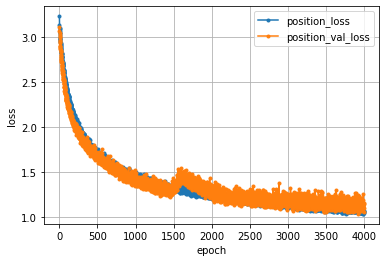

In [50]:
# 学習経過の可視化(位置)
half_position_loss     = half_position_history.history['loss']
half_position_val_loss = half_position_history.history['val_loss']

nb_epoch = len(half_position_loss)
plt.plot(range(nb_epoch), half_position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), half_position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [54]:
# 学習(位置)
epochs = 10000
batch_size = 32
half_position_history = half_position_model.fit(half_position_x_train, half_position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(half_position_x_test, half_position_y_test))

Train on 740 samples, validate on 185 samples
Epoch 1/10000
740/740 [==============================] - 0s 395us/step - loss: 1.0559 - accuracy: 0.6459 - val_loss: 1.0751 - val_accuracy: 0.6811
Epoch 2/10000
740/740 [==============================] - 0s 65us/step - loss: 1.0682 - accuracy: 0.6459 - val_loss: 1.1225 - val_accuracy: 0.5622
Epoch 3/10000
740/740 [==============================] - 0s 59us/step - loss: 1.1172 - accuracy: 0.6068 - val_loss: 1.1047 - val_accuracy: 0.6162
Epoch 4/10000
740/740 [==============================] - 0s 55us/step - loss: 1.0595 - accuracy: 0.6486 - val_loss: 1.1376 - val_accuracy: 0.5838
Epoch 5/10000
740/740 [==============================] - 0s 64us/step - loss: 1.0817 - accuracy: 0.6203 - val_loss: 1.1601 - val_accuracy: 0.5676
Epoch 6/10000
740/740 [==============================] - 0s 69us/step - loss: 1.0844 - accuracy: 0.6203 - val_loss: 1.0780 - val_accuracy: 0.5946
Epoch 7/10000
740/740 [==============================] - 0s 73us/step - loss:

740/740 [==============================] - 0s 51us/step - loss: 1.0595 - accuracy: 0.6392 - val_loss: 1.0997 - val_accuracy: 0.6216
Epoch 57/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0497 - accuracy: 0.6622 - val_loss: 1.1254 - val_accuracy: 0.6000
Epoch 58/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0749 - accuracy: 0.6203 - val_loss: 1.2427 - val_accuracy: 0.5459
Epoch 59/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0721 - accuracy: 0.6365 - val_loss: 1.0715 - val_accuracy: 0.6270
Epoch 60/10000
740/740 [==============================] - 0s 62us/step - loss: 1.0864 - accuracy: 0.6311 - val_loss: 1.1070 - val_accuracy: 0.6324
Epoch 61/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0442 - accuracy: 0.6608 - val_loss: 1.1452 - val_accuracy: 0.5730
Epoch 62/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0462 - accuracy: 0.6459 - val_loss: 1.1109 - val_acc

Epoch 112/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0567 - accuracy: 0.6365 - val_loss: 1.1796 - val_accuracy: 0.5676
Epoch 113/10000
740/740 [==============================] - 0s 55us/step - loss: 1.0789 - accuracy: 0.6297 - val_loss: 1.0747 - val_accuracy: 0.6649
Epoch 114/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0943 - accuracy: 0.6324 - val_loss: 1.1138 - val_accuracy: 0.6486
Epoch 115/10000
740/740 [==============================] - 0s 51us/step - loss: 1.1044 - accuracy: 0.6135 - val_loss: 1.1074 - val_accuracy: 0.5892
Epoch 116/10000
740/740 [==============================] - 0s 58us/step - loss: 1.0710 - accuracy: 0.6108 - val_loss: 1.2474 - val_accuracy: 0.5405
Epoch 117/10000
740/740 [==============================] - 0s 85us/step - loss: 1.1088 - accuracy: 0.6243 - val_loss: 1.0849 - val_accuracy: 0.6432
Epoch 118/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0551 - accuracy: 0.6324 - val_

740/740 [==============================] - 0s 56us/step - loss: 1.0799 - accuracy: 0.6297 - val_loss: 1.1906 - val_accuracy: 0.5838
Epoch 168/10000
740/740 [==============================] - 0s 59us/step - loss: 1.0627 - accuracy: 0.6203 - val_loss: 1.0857 - val_accuracy: 0.6162
Epoch 169/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0457 - accuracy: 0.6514 - val_loss: 1.0530 - val_accuracy: 0.6703
Epoch 170/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0692 - accuracy: 0.6135 - val_loss: 1.1281 - val_accuracy: 0.5946
Epoch 171/10000
740/740 [==============================] - 0s 62us/step - loss: 1.0544 - accuracy: 0.6338 - val_loss: 1.1058 - val_accuracy: 0.6432
Epoch 172/10000
740/740 [==============================] - 0s 78us/step - loss: 1.0538 - accuracy: 0.6284 - val_loss: 1.0590 - val_accuracy: 0.6703
Epoch 173/10000
740/740 [==============================] - 0s 60us/step - loss: 1.0797 - accuracy: 0.6284 - val_loss: 1.1601 - v

740/740 [==============================] - 0s 63us/step - loss: 1.0477 - accuracy: 0.6608 - val_loss: 1.1428 - val_accuracy: 0.5784
Epoch 223/10000
740/740 [==============================] - 0s 66us/step - loss: 1.0375 - accuracy: 0.6568 - val_loss: 1.1151 - val_accuracy: 0.6000
Epoch 224/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0479 - accuracy: 0.6257 - val_loss: 1.0860 - val_accuracy: 0.6270
Epoch 225/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0547 - accuracy: 0.6365 - val_loss: 1.0669 - val_accuracy: 0.6703
Epoch 226/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0510 - accuracy: 0.6459 - val_loss: 1.0437 - val_accuracy: 0.6757
Epoch 227/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0524 - accuracy: 0.6527 - val_loss: 1.0818 - val_accuracy: 0.6216
Epoch 228/10000
740/740 [==============================] - 0s 70us/step - loss: 1.0496 - accuracy: 0.6419 - val_loss: 1.0922 - v

740/740 [==============================] - 0s 58us/step - loss: 1.0566 - accuracy: 0.6311 - val_loss: 1.1061 - val_accuracy: 0.6216
Epoch 278/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0462 - accuracy: 0.6432 - val_loss: 1.1492 - val_accuracy: 0.6162
Epoch 279/10000
740/740 [==============================] - 0s 60us/step - loss: 1.0331 - accuracy: 0.6514 - val_loss: 1.1525 - val_accuracy: 0.5838
Epoch 280/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0614 - accuracy: 0.6338 - val_loss: 1.0901 - val_accuracy: 0.5838
Epoch 281/10000
740/740 [==============================] - 0s 49us/step - loss: 1.1015 - accuracy: 0.5946 - val_loss: 1.1745 - val_accuracy: 0.5459
Epoch 282/10000
740/740 [==============================] - 0s 52us/step - loss: 1.1031 - accuracy: 0.6054 - val_loss: 1.1327 - val_accuracy: 0.5946
Epoch 283/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0486 - accuracy: 0.6405 - val_loss: 1.1170 - v

740/740 [==============================] - 0s 55us/step - loss: 1.0322 - accuracy: 0.6500 - val_loss: 1.1203 - val_accuracy: 0.6595
Epoch 333/10000
740/740 [==============================] - 0s 53us/step - loss: 1.1160 - accuracy: 0.6054 - val_loss: 1.1689 - val_accuracy: 0.5514
Epoch 334/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0945 - accuracy: 0.6270 - val_loss: 1.1271 - val_accuracy: 0.5946
Epoch 335/10000
740/740 [==============================] - 0s 100us/step - loss: 1.1117 - accuracy: 0.6216 - val_loss: 1.1756 - val_accuracy: 0.5622
Epoch 336/10000
740/740 [==============================] - 0s 62us/step - loss: 1.0939 - accuracy: 0.6216 - val_loss: 1.0926 - val_accuracy: 0.6216
Epoch 337/10000
740/740 [==============================] - 0s 51us/step - loss: 1.0669 - accuracy: 0.6432 - val_loss: 1.1304 - val_accuracy: 0.6270
Epoch 338/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0701 - accuracy: 0.6216 - val_loss: 1.0844 - 

740/740 [==============================] - 0s 59us/step - loss: 1.0411 - accuracy: 0.6459 - val_loss: 1.2037 - val_accuracy: 0.5784
Epoch 388/10000
740/740 [==============================] - 0s 65us/step - loss: 1.0323 - accuracy: 0.6486 - val_loss: 1.0413 - val_accuracy: 0.6324
Epoch 389/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0350 - accuracy: 0.6649 - val_loss: 1.1379 - val_accuracy: 0.6216
Epoch 390/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0389 - accuracy: 0.6554 - val_loss: 1.0567 - val_accuracy: 0.6486
Epoch 391/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0402 - accuracy: 0.6541 - val_loss: 1.1339 - val_accuracy: 0.6000
Epoch 392/10000
740/740 [==============================] - 0s 50us/step - loss: 1.1072 - accuracy: 0.6041 - val_loss: 1.1373 - val_accuracy: 0.6270
Epoch 393/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0554 - accuracy: 0.6270 - val_loss: 1.1200 - v

740/740 [==============================] - 0s 54us/step - loss: 1.0408 - accuracy: 0.6297 - val_loss: 1.1162 - val_accuracy: 0.5784
Epoch 443/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0707 - accuracy: 0.6095 - val_loss: 1.1873 - val_accuracy: 0.5676
Epoch 444/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0660 - accuracy: 0.6230 - val_loss: 1.0806 - val_accuracy: 0.6216
Epoch 445/10000
740/740 [==============================] - 0s 55us/step - loss: 1.0377 - accuracy: 0.6324 - val_loss: 1.1432 - val_accuracy: 0.6000
Epoch 446/10000
740/740 [==============================] - 0s 50us/step - loss: 1.1012 - accuracy: 0.6297 - val_loss: 1.2081 - val_accuracy: 0.5351
Epoch 447/10000
740/740 [==============================] - 0s 50us/step - loss: 1.1387 - accuracy: 0.6041 - val_loss: 1.1600 - val_accuracy: 0.5730
Epoch 448/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0872 - accuracy: 0.6270 - val_loss: 1.0939 - v

740/740 [==============================] - 0s 57us/step - loss: 1.0674 - accuracy: 0.6311 - val_loss: 1.2548 - val_accuracy: 0.5459
Epoch 498/10000
740/740 [==============================] - 0s 63us/step - loss: 1.0695 - accuracy: 0.6203 - val_loss: 1.1528 - val_accuracy: 0.5838
Epoch 499/10000
740/740 [==============================] - 0s 54us/step - loss: 1.1037 - accuracy: 0.6081 - val_loss: 1.0826 - val_accuracy: 0.6162
Epoch 500/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0402 - accuracy: 0.6514 - val_loss: 1.1695 - val_accuracy: 0.5676
Epoch 501/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0596 - accuracy: 0.6216 - val_loss: 1.1360 - val_accuracy: 0.5459
Epoch 502/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0397 - accuracy: 0.6338 - val_loss: 1.1217 - val_accuracy: 0.5676
Epoch 503/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0504 - accuracy: 0.6243 - val_loss: 1.1266 - v

740/740 [==============================] - 0s 44us/step - loss: 1.0693 - accuracy: 0.5973 - val_loss: 1.2158 - val_accuracy: 0.5622
Epoch 553/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0189 - accuracy: 0.6419 - val_loss: 1.1752 - val_accuracy: 0.5622
Epoch 554/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0452 - accuracy: 0.6541 - val_loss: 1.1827 - val_accuracy: 0.5676
Epoch 555/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0090 - accuracy: 0.6649 - val_loss: 1.1553 - val_accuracy: 0.5730
Epoch 556/10000
740/740 [==============================] - 0s 42us/step - loss: 1.1491 - accuracy: 0.5973 - val_loss: 1.0733 - val_accuracy: 0.6378
Epoch 557/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0492 - accuracy: 0.6324 - val_loss: 1.1671 - val_accuracy: 0.6054
Epoch 558/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0747 - accuracy: 0.6324 - val_loss: 1.1340 - v

740/740 [==============================] - 0s 42us/step - loss: 1.0253 - accuracy: 0.6446 - val_loss: 1.1733 - val_accuracy: 0.5514
Epoch 608/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0520 - accuracy: 0.6014 - val_loss: 1.1749 - val_accuracy: 0.5946
Epoch 609/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0444 - accuracy: 0.6500 - val_loss: 1.1087 - val_accuracy: 0.6270
Epoch 610/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0532 - accuracy: 0.6378 - val_loss: 1.1147 - val_accuracy: 0.6270
Epoch 611/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0367 - accuracy: 0.6554 - val_loss: 1.1608 - val_accuracy: 0.5622
Epoch 612/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0508 - accuracy: 0.6378 - val_loss: 1.1499 - val_accuracy: 0.5892
Epoch 613/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0542 - accuracy: 0.6365 - val_loss: 1.1555 - v

740/740 [==============================] - 0s 49us/step - loss: 1.0393 - accuracy: 0.6405 - val_loss: 1.1493 - val_accuracy: 0.5730
Epoch 663/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0283 - accuracy: 0.6500 - val_loss: 1.1433 - val_accuracy: 0.6000
Epoch 664/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0559 - accuracy: 0.6324 - val_loss: 1.1251 - val_accuracy: 0.6054
Epoch 665/10000
740/740 [==============================] - 0s 59us/step - loss: 1.0536 - accuracy: 0.6324 - val_loss: 1.1000 - val_accuracy: 0.6108
Epoch 666/10000
740/740 [==============================] - 0s 78us/step - loss: 1.0781 - accuracy: 0.6027 - val_loss: 1.1132 - val_accuracy: 0.6270
Epoch 667/10000
740/740 [==============================] - 0s 110us/step - loss: 1.0639 - accuracy: 0.6243 - val_loss: 1.0814 - val_accuracy: 0.6919
Epoch 668/10000
740/740 [==============================] - 0s 66us/step - loss: 1.0678 - accuracy: 0.6311 - val_loss: 1.1793 - 

740/740 [==============================] - 0s 70us/step - loss: 1.0801 - accuracy: 0.6459 - val_loss: 1.2013 - val_accuracy: 0.5297
Epoch 718/10000
740/740 [==============================] - 0s 83us/step - loss: 1.0923 - accuracy: 0.6378 - val_loss: 1.1377 - val_accuracy: 0.6054
Epoch 719/10000
740/740 [==============================] - 0s 93us/step - loss: 1.0608 - accuracy: 0.6324 - val_loss: 1.2604 - val_accuracy: 0.5622
Epoch 720/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0549 - accuracy: 0.6365 - val_loss: 1.1741 - val_accuracy: 0.6054
Epoch 721/10000
740/740 [==============================] - 0s 58us/step - loss: 1.0101 - accuracy: 0.6351 - val_loss: 1.1236 - val_accuracy: 0.6432
Epoch 722/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0758 - accuracy: 0.6405 - val_loss: 1.1621 - val_accuracy: 0.5838
Epoch 723/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0525 - accuracy: 0.6081 - val_loss: 1.2342 - v

740/740 [==============================] - 0s 42us/step - loss: 1.0515 - accuracy: 0.6270 - val_loss: 1.1445 - val_accuracy: 0.6649
Epoch 773/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0413 - accuracy: 0.6432 - val_loss: 1.1416 - val_accuracy: 0.6000
Epoch 774/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0577 - accuracy: 0.6203 - val_loss: 1.1120 - val_accuracy: 0.6378
Epoch 775/10000
740/740 [==============================] - 0s 43us/step - loss: 1.0093 - accuracy: 0.6500 - val_loss: 1.1218 - val_accuracy: 0.6270
Epoch 776/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0186 - accuracy: 0.6635 - val_loss: 1.1852 - val_accuracy: 0.5405
Epoch 777/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0115 - accuracy: 0.6297 - val_loss: 1.2191 - val_accuracy: 0.5676
Epoch 778/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0842 - accuracy: 0.6243 - val_loss: 1.1101 - v

740/740 [==============================] - 0s 45us/step - loss: 1.0436 - accuracy: 0.6554 - val_loss: 1.2018 - val_accuracy: 0.5622
Epoch 828/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0576 - accuracy: 0.6176 - val_loss: 1.0963 - val_accuracy: 0.6378
Epoch 829/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0388 - accuracy: 0.6351 - val_loss: 1.1223 - val_accuracy: 0.6162
Epoch 830/10000
740/740 [==============================] - 0s 59us/step - loss: 1.0271 - accuracy: 0.6500 - val_loss: 1.0886 - val_accuracy: 0.6432
Epoch 831/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0498 - accuracy: 0.6257 - val_loss: 1.1515 - val_accuracy: 0.6378
Epoch 832/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0769 - accuracy: 0.6189 - val_loss: 1.1870 - val_accuracy: 0.5622
Epoch 833/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0226 - accuracy: 0.6432 - val_loss: 1.2208 - v

740/740 [==============================] - 0s 50us/step - loss: 0.9955 - accuracy: 0.6622 - val_loss: 1.1006 - val_accuracy: 0.5730
Epoch 883/10000
740/740 [==============================] - 0s 59us/step - loss: 1.0123 - accuracy: 0.6419 - val_loss: 1.0994 - val_accuracy: 0.6216
Epoch 884/10000
740/740 [==============================] - 0s 45us/step - loss: 1.0035 - accuracy: 0.6608 - val_loss: 1.1137 - val_accuracy: 0.6162
Epoch 885/10000
740/740 [==============================] - 0s 45us/step - loss: 1.0124 - accuracy: 0.6324 - val_loss: 1.1474 - val_accuracy: 0.6216
Epoch 886/10000
740/740 [==============================] - 0s 45us/step - loss: 1.0966 - accuracy: 0.6216 - val_loss: 1.1501 - val_accuracy: 0.5946
Epoch 887/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0320 - accuracy: 0.6486 - val_loss: 1.1892 - val_accuracy: 0.5568
Epoch 888/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0115 - accuracy: 0.6378 - val_loss: 1.2184 - v

740/740 [==============================] - 0s 42us/step - loss: 1.0196 - accuracy: 0.6703 - val_loss: 1.1459 - val_accuracy: 0.6162
Epoch 938/10000
740/740 [==============================] - 0s 42us/step - loss: 0.9926 - accuracy: 0.6730 - val_loss: 1.1066 - val_accuracy: 0.6378
Epoch 939/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0288 - accuracy: 0.6365 - val_loss: 1.1461 - val_accuracy: 0.6000
Epoch 940/10000
740/740 [==============================] - 0s 42us/step - loss: 1.1385 - accuracy: 0.5892 - val_loss: 1.1779 - val_accuracy: 0.5946
Epoch 941/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0692 - accuracy: 0.6405 - val_loss: 1.1342 - val_accuracy: 0.6270
Epoch 942/10000
740/740 [==============================] - 0s 45us/step - loss: 1.0415 - accuracy: 0.6284 - val_loss: 1.2365 - val_accuracy: 0.5784
Epoch 943/10000
740/740 [==============================] - 0s 42us/step - loss: 1.0251 - accuracy: 0.6473 - val_loss: 1.2148 - v

740/740 [==============================] - 0s 46us/step - loss: 1.0224 - accuracy: 0.6230 - val_loss: 1.1053 - val_accuracy: 0.6108
Epoch 993/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9954 - accuracy: 0.6703 - val_loss: 1.2017 - val_accuracy: 0.5568
Epoch 994/10000
740/740 [==============================] - 0s 65us/step - loss: 0.9886 - accuracy: 0.6581 - val_loss: 1.0587 - val_accuracy: 0.6432
Epoch 995/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0265 - accuracy: 0.6824 - val_loss: 1.1047 - val_accuracy: 0.5946
Epoch 996/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0549 - accuracy: 0.6541 - val_loss: 1.0803 - val_accuracy: 0.6486
Epoch 997/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0401 - accuracy: 0.6216 - val_loss: 1.2122 - val_accuracy: 0.5676
Epoch 998/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0434 - accuracy: 0.6324 - val_loss: 1.1435 - v

740/740 [==============================] - 0s 45us/step - loss: 1.0081 - accuracy: 0.6351 - val_loss: 1.2120 - val_accuracy: 0.5784
Epoch 1048/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0457 - accuracy: 0.6419 - val_loss: 1.1357 - val_accuracy: 0.5838
Epoch 1049/10000
740/740 [==============================] - 0s 45us/step - loss: 1.0103 - accuracy: 0.6311 - val_loss: 1.2214 - val_accuracy: 0.6054
Epoch 1050/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0172 - accuracy: 0.6419 - val_loss: 1.1228 - val_accuracy: 0.6378
Epoch 1051/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9815 - accuracy: 0.6946 - val_loss: 1.1508 - val_accuracy: 0.5838
Epoch 1052/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0141 - accuracy: 0.6392 - val_loss: 1.1333 - val_accuracy: 0.6324
Epoch 1053/10000
740/740 [==============================] - 0s 44us/step - loss: 1.0389 - accuracy: 0.6486 - val_loss: 1.18

740/740 [==============================] - 0s 48us/step - loss: 1.0114 - accuracy: 0.6527 - val_loss: 1.1900 - val_accuracy: 0.5676
Epoch 1103/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9960 - accuracy: 0.6622 - val_loss: 1.1262 - val_accuracy: 0.5838
Epoch 1104/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0234 - accuracy: 0.6541 - val_loss: 1.1132 - val_accuracy: 0.6162
Epoch 1105/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9936 - accuracy: 0.6689 - val_loss: 1.1074 - val_accuracy: 0.6324
Epoch 1106/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9863 - accuracy: 0.6797 - val_loss: 1.1567 - val_accuracy: 0.5730
Epoch 1107/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9880 - accuracy: 0.6662 - val_loss: 1.1247 - val_accuracy: 0.6378
Epoch 1108/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0418 - accuracy: 0.6297 - val_loss: 1.23

740/740 [==============================] - 0s 62us/step - loss: 1.0143 - accuracy: 0.6459 - val_loss: 1.0568 - val_accuracy: 0.6486
Epoch 1158/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9941 - accuracy: 0.6730 - val_loss: 1.1035 - val_accuracy: 0.6595
Epoch 1159/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0207 - accuracy: 0.6446 - val_loss: 1.1823 - val_accuracy: 0.5459
Epoch 1160/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0505 - accuracy: 0.6419 - val_loss: 1.1881 - val_accuracy: 0.5946
Epoch 1161/10000
740/740 [==============================] - 0s 55us/step - loss: 1.0643 - accuracy: 0.6176 - val_loss: 1.1106 - val_accuracy: 0.6216
Epoch 1162/10000
740/740 [==============================] - 0s 51us/step - loss: 1.0404 - accuracy: 0.6419 - val_loss: 1.1172 - val_accuracy: 0.6378
Epoch 1163/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9870 - accuracy: 0.6608 - val_loss: 1.11

740/740 [==============================] - 0s 66us/step - loss: 1.0566 - accuracy: 0.6243 - val_loss: 1.1406 - val_accuracy: 0.6162
Epoch 1213/10000
740/740 [==============================] - 0s 68us/step - loss: 1.0518 - accuracy: 0.6419 - val_loss: 1.1186 - val_accuracy: 0.5784
Epoch 1214/10000
740/740 [==============================] - 0s 78us/step - loss: 0.9785 - accuracy: 0.6703 - val_loss: 1.1003 - val_accuracy: 0.6324
Epoch 1215/10000
740/740 [==============================] - 0s 84us/step - loss: 1.0050 - accuracy: 0.6595 - val_loss: 1.1364 - val_accuracy: 0.6216
Epoch 1216/10000
740/740 [==============================] - 0s 79us/step - loss: 0.9763 - accuracy: 0.6554 - val_loss: 1.2288 - val_accuracy: 0.5730
Epoch 1217/10000
740/740 [==============================] - 0s 93us/step - loss: 1.0026 - accuracy: 0.6581 - val_loss: 1.1454 - val_accuracy: 0.6000
Epoch 1218/10000
740/740 [==============================] - 0s 76us/step - loss: 1.0023 - accuracy: 0.6649 - val_loss: 1.16

740/740 [==============================] - 0s 105us/step - loss: 0.9964 - accuracy: 0.6662 - val_loss: 1.0960 - val_accuracy: 0.6054
Epoch 1268/10000
740/740 [==============================] - 0s 72us/step - loss: 1.0229 - accuracy: 0.6459 - val_loss: 1.1239 - val_accuracy: 0.5946
Epoch 1269/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9807 - accuracy: 0.6459 - val_loss: 1.2318 - val_accuracy: 0.5514
Epoch 1270/10000
740/740 [==============================] - 0s 145us/step - loss: 0.9708 - accuracy: 0.6595 - val_loss: 1.1522 - val_accuracy: 0.5676
Epoch 1271/10000
740/740 [==============================] - 0s 94us/step - loss: 0.9947 - accuracy: 0.6514 - val_loss: 1.1127 - val_accuracy: 0.6649
Epoch 1272/10000
740/740 [==============================] - 0s 106us/step - loss: 1.0150 - accuracy: 0.6378 - val_loss: 1.1397 - val_accuracy: 0.6108
Epoch 1273/10000
740/740 [==============================] - 0s 72us/step - loss: 1.0260 - accuracy: 0.6446 - val_loss: 1

740/740 [==============================] - 0s 92us/step - loss: 1.0156 - accuracy: 0.6541 - val_loss: 1.1487 - val_accuracy: 0.6432
Epoch 1323/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0391 - accuracy: 0.6365 - val_loss: 1.1736 - val_accuracy: 0.5676
Epoch 1324/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0205 - accuracy: 0.6486 - val_loss: 1.1017 - val_accuracy: 0.6378
Epoch 1325/10000
740/740 [==============================] - 0s 65us/step - loss: 1.0266 - accuracy: 0.6311 - val_loss: 1.2122 - val_accuracy: 0.5838
Epoch 1326/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0164 - accuracy: 0.6486 - val_loss: 1.1792 - val_accuracy: 0.6054
Epoch 1327/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0226 - accuracy: 0.6595 - val_loss: 1.1619 - val_accuracy: 0.6378
Epoch 1328/10000
740/740 [==============================] - 0s 58us/step - loss: 1.0248 - accuracy: 0.6257 - val_loss: 1.30

740/740 [==============================] - 0s 72us/step - loss: 1.0425 - accuracy: 0.6432 - val_loss: 1.1760 - val_accuracy: 0.5784
Epoch 1378/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9799 - accuracy: 0.6608 - val_loss: 1.1550 - val_accuracy: 0.5459
Epoch 1379/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9748 - accuracy: 0.6838 - val_loss: 1.1394 - val_accuracy: 0.6054
Epoch 1380/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9948 - accuracy: 0.6608 - val_loss: 1.1343 - val_accuracy: 0.5784
Epoch 1381/10000
740/740 [==============================] - 0s 98us/step - loss: 1.0037 - accuracy: 0.6676 - val_loss: 1.0646 - val_accuracy: 0.6541
Epoch 1382/10000
740/740 [==============================] - 0s 68us/step - loss: 0.9770 - accuracy: 0.6811 - val_loss: 1.1788 - val_accuracy: 0.5784
Epoch 1383/10000
740/740 [==============================] - 0s 75us/step - loss: 1.0066 - accuracy: 0.6338 - val_loss: 1.19

740/740 [==============================] - 0s 47us/step - loss: 1.0459 - accuracy: 0.6189 - val_loss: 1.2084 - val_accuracy: 0.5946
Epoch 1433/10000
740/740 [==============================] - 0s 65us/step - loss: 1.0914 - accuracy: 0.6189 - val_loss: 1.1565 - val_accuracy: 0.5946
Epoch 1434/10000
740/740 [==============================] - 0s 66us/step - loss: 1.0643 - accuracy: 0.6378 - val_loss: 1.1525 - val_accuracy: 0.6054
Epoch 1435/10000
740/740 [==============================] - 0s 69us/step - loss: 1.0291 - accuracy: 0.6176 - val_loss: 1.2076 - val_accuracy: 0.5459
Epoch 1436/10000
740/740 [==============================] - 0s 78us/step - loss: 1.0126 - accuracy: 0.6527 - val_loss: 1.1369 - val_accuracy: 0.6432
Epoch 1437/10000
740/740 [==============================] - 0s 80us/step - loss: 1.0264 - accuracy: 0.6541 - val_loss: 1.1788 - val_accuracy: 0.6216
Epoch 1438/10000
740/740 [==============================] - 0s 67us/step - loss: 1.0123 - accuracy: 0.6554 - val_loss: 1.21

740/740 [==============================] - 0s 50us/step - loss: 0.9805 - accuracy: 0.6784 - val_loss: 1.1582 - val_accuracy: 0.6162
Epoch 1488/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9726 - accuracy: 0.6541 - val_loss: 1.1493 - val_accuracy: 0.5892
Epoch 1489/10000
740/740 [==============================] - 0s 88us/step - loss: 0.9980 - accuracy: 0.6554 - val_loss: 1.2127 - val_accuracy: 0.6324
Epoch 1490/10000
740/740 [==============================] - 0s 79us/step - loss: 1.0044 - accuracy: 0.6541 - val_loss: 1.2327 - val_accuracy: 0.5838
Epoch 1491/10000
740/740 [==============================] - 0s 61us/step - loss: 1.0099 - accuracy: 0.6554 - val_loss: 1.0622 - val_accuracy: 0.6703
Epoch 1492/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0135 - accuracy: 0.6581 - val_loss: 1.1679 - val_accuracy: 0.5892
Epoch 1493/10000
740/740 [==============================] - 0s 63us/step - loss: 1.0108 - accuracy: 0.6338 - val_loss: 1.20

740/740 [==============================] - 0s 48us/step - loss: 1.0218 - accuracy: 0.6432 - val_loss: 1.2472 - val_accuracy: 0.5622
Epoch 1543/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0158 - accuracy: 0.6419 - val_loss: 1.1192 - val_accuracy: 0.5946
Epoch 1544/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9861 - accuracy: 0.6581 - val_loss: 1.1696 - val_accuracy: 0.5838
Epoch 1545/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0347 - accuracy: 0.6216 - val_loss: 1.1037 - val_accuracy: 0.5892
Epoch 1546/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9879 - accuracy: 0.6541 - val_loss: 1.2090 - val_accuracy: 0.5622
Epoch 1547/10000
740/740 [==============================] - 0s 54us/step - loss: 1.0158 - accuracy: 0.6270 - val_loss: 1.1880 - val_accuracy: 0.5568
Epoch 1548/10000
740/740 [==============================] - 0s 51us/step - loss: 1.0398 - accuracy: 0.6297 - val_loss: 1.13

740/740 [==============================] - 0s 160us/step - loss: 0.9824 - accuracy: 0.6649 - val_loss: 1.1917 - val_accuracy: 0.5946
Epoch 1598/10000
740/740 [==============================] - 0s 95us/step - loss: 1.0078 - accuracy: 0.6500 - val_loss: 1.1475 - val_accuracy: 0.6324
Epoch 1599/10000
740/740 [==============================] - 0s 153us/step - loss: 1.0168 - accuracy: 0.6378 - val_loss: 1.1896 - val_accuracy: 0.5784
Epoch 1600/10000
740/740 [==============================] - 0s 248us/step - loss: 0.9764 - accuracy: 0.6770 - val_loss: 1.1550 - val_accuracy: 0.6000
Epoch 1601/10000
740/740 [==============================] - 0s 135us/step - loss: 1.0112 - accuracy: 0.6568 - val_loss: 1.1371 - val_accuracy: 0.6054
Epoch 1602/10000
740/740 [==============================] - 0s 140us/step - loss: 1.0053 - accuracy: 0.6338 - val_loss: 1.1301 - val_accuracy: 0.6270
Epoch 1603/10000
740/740 [==============================] - 0s 160us/step - loss: 1.0006 - accuracy: 0.6595 - val_loss

Epoch 1652/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9847 - accuracy: 0.6716 - val_loss: 1.1282 - val_accuracy: 0.6054
Epoch 1653/10000
740/740 [==============================] - 0s 63us/step - loss: 1.0066 - accuracy: 0.6500 - val_loss: 1.1469 - val_accuracy: 0.6216
Epoch 1654/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9989 - accuracy: 0.6351 - val_loss: 1.2001 - val_accuracy: 0.5622
Epoch 1655/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9700 - accuracy: 0.6743 - val_loss: 1.1412 - val_accuracy: 0.6162
Epoch 1656/10000
740/740 [==============================] - 0s 60us/step - loss: 0.9884 - accuracy: 0.6459 - val_loss: 1.1165 - val_accuracy: 0.6378
Epoch 1657/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0006 - accuracy: 0.6797 - val_loss: 1.1737 - val_accuracy: 0.5838
Epoch 1658/10000
740/740 [==============================] - 0s 51us/step - loss: 1.0108 - accuracy: 0.6378

Epoch 1707/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0832 - accuracy: 0.6122 - val_loss: 1.2860 - val_accuracy: 0.5676
Epoch 1708/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0122 - accuracy: 0.6311 - val_loss: 1.2350 - val_accuracy: 0.6270
Epoch 1709/10000
740/740 [==============================] - 0s 56us/step - loss: 1.0413 - accuracy: 0.6446 - val_loss: 1.2166 - val_accuracy: 0.5784
Epoch 1710/10000
740/740 [==============================] - 0s 58us/step - loss: 1.0083 - accuracy: 0.6581 - val_loss: 1.1461 - val_accuracy: 0.6703
Epoch 1711/10000
740/740 [==============================] - 0s 57us/step - loss: 1.0034 - accuracy: 0.6324 - val_loss: 1.0977 - val_accuracy: 0.6757
Epoch 1712/10000
740/740 [==============================] - 0s 69us/step - loss: 0.9833 - accuracy: 0.6568 - val_loss: 1.1222 - val_accuracy: 0.6000
Epoch 1713/10000
740/740 [==============================] - 0s 65us/step - loss: 1.0114 - accuracy: 0.6338

Epoch 1762/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9986 - accuracy: 0.6554 - val_loss: 1.0996 - val_accuracy: 0.6811
Epoch 1763/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9895 - accuracy: 0.6689 - val_loss: 1.2810 - val_accuracy: 0.5568
Epoch 1764/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0182 - accuracy: 0.6311 - val_loss: 1.2085 - val_accuracy: 0.6054
Epoch 1765/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0348 - accuracy: 0.6419 - val_loss: 1.2922 - val_accuracy: 0.5243
Epoch 1766/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0563 - accuracy: 0.6541 - val_loss: 1.2405 - val_accuracy: 0.5946
Epoch 1767/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0323 - accuracy: 0.6149 - val_loss: 1.1668 - val_accuracy: 0.6162
Epoch 1768/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0839 - accuracy: 0.6243

Epoch 1817/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0020 - accuracy: 0.6608 - val_loss: 1.1388 - val_accuracy: 0.6216
Epoch 1818/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9790 - accuracy: 0.6595 - val_loss: 1.1315 - val_accuracy: 0.6270
Epoch 1819/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0500 - accuracy: 0.6203 - val_loss: 1.2041 - val_accuracy: 0.6108
Epoch 1820/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0292 - accuracy: 0.6365 - val_loss: 1.1415 - val_accuracy: 0.6595
Epoch 1821/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0295 - accuracy: 0.6405 - val_loss: 1.2256 - val_accuracy: 0.5351
Epoch 1822/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0096 - accuracy: 0.6405 - val_loss: 1.1688 - val_accuracy: 0.5622
Epoch 1823/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0162 - accuracy: 0.6622

Epoch 1872/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9972 - accuracy: 0.6676 - val_loss: 1.1809 - val_accuracy: 0.6649
Epoch 1873/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0049 - accuracy: 0.6432 - val_loss: 1.1581 - val_accuracy: 0.5946
Epoch 1874/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9558 - accuracy: 0.6676 - val_loss: 1.1409 - val_accuracy: 0.6378
Epoch 1875/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9785 - accuracy: 0.6689 - val_loss: 1.2638 - val_accuracy: 0.6108
Epoch 1876/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9991 - accuracy: 0.6297 - val_loss: 1.1352 - val_accuracy: 0.6541
Epoch 1877/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9742 - accuracy: 0.6716 - val_loss: 1.0851 - val_accuracy: 0.6919
Epoch 1878/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9737 - accuracy: 0.6649

Epoch 1927/10000
740/740 [==============================] - 0s 60us/step - loss: 1.0256 - accuracy: 0.6243 - val_loss: 1.1746 - val_accuracy: 0.6270
Epoch 1928/10000
740/740 [==============================] - 0s 92us/step - loss: 0.9694 - accuracy: 0.6770 - val_loss: 1.1306 - val_accuracy: 0.6108
Epoch 1929/10000
740/740 [==============================] - 0s 72us/step - loss: 0.9626 - accuracy: 0.6757 - val_loss: 1.1489 - val_accuracy: 0.6108
Epoch 1930/10000
740/740 [==============================] - 0s 92us/step - loss: 1.0274 - accuracy: 0.6500 - val_loss: 1.2466 - val_accuracy: 0.6324
Epoch 1931/10000
740/740 [==============================] - 0s 75us/step - loss: 0.9724 - accuracy: 0.6676 - val_loss: 1.1782 - val_accuracy: 0.5946
Epoch 1932/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9854 - accuracy: 0.6581 - val_loss: 1.1589 - val_accuracy: 0.6324
Epoch 1933/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9788 - accuracy: 0.6514

Epoch 1982/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9669 - accuracy: 0.6716 - val_loss: 1.2139 - val_accuracy: 0.5676
Epoch 1983/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9968 - accuracy: 0.6473 - val_loss: 1.2234 - val_accuracy: 0.5730
Epoch 1984/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9957 - accuracy: 0.6365 - val_loss: 1.1459 - val_accuracy: 0.6270
Epoch 1985/10000
740/740 [==============================] - 0s 81us/step - loss: 0.9925 - accuracy: 0.6622 - val_loss: 1.1691 - val_accuracy: 0.6378
Epoch 1986/10000
740/740 [==============================] - 0s 90us/step - loss: 0.9920 - accuracy: 0.6500 - val_loss: 1.0904 - val_accuracy: 0.6811
Epoch 1987/10000
740/740 [==============================] - 0s 86us/step - loss: 0.9768 - accuracy: 0.6581 - val_loss: 1.2013 - val_accuracy: 0.5946
Epoch 1988/10000
740/740 [==============================] - 0s 76us/step - loss: 0.9886 - accuracy: 0.6500

Epoch 2037/10000
740/740 [==============================] - 0s 52us/step - loss: 1.0037 - accuracy: 0.6635 - val_loss: 1.1630 - val_accuracy: 0.6054
Epoch 2038/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9475 - accuracy: 0.6851 - val_loss: 1.3400 - val_accuracy: 0.5351
Epoch 2039/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9971 - accuracy: 0.6500 - val_loss: 1.1625 - val_accuracy: 0.6324
Epoch 2040/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9777 - accuracy: 0.6595 - val_loss: 1.1730 - val_accuracy: 0.6486
Epoch 2041/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0071 - accuracy: 0.6324 - val_loss: 1.1252 - val_accuracy: 0.6541
Epoch 2042/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0105 - accuracy: 0.6432 - val_loss: 1.2848 - val_accuracy: 0.5405
Epoch 2043/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0187 - accuracy: 0.6554

Epoch 2092/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9774 - accuracy: 0.6676 - val_loss: 1.1583 - val_accuracy: 0.6162
Epoch 2093/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9803 - accuracy: 0.6405 - val_loss: 1.1488 - val_accuracy: 0.6865
Epoch 2094/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0397 - accuracy: 0.6257 - val_loss: 1.1642 - val_accuracy: 0.6486
Epoch 2095/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9421 - accuracy: 0.6730 - val_loss: 1.1945 - val_accuracy: 0.6000
Epoch 2096/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9743 - accuracy: 0.6730 - val_loss: 1.1025 - val_accuracy: 0.6703
Epoch 2097/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0124 - accuracy: 0.6392 - val_loss: 1.1674 - val_accuracy: 0.6162
Epoch 2098/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9918 - accuracy: 0.6649

Epoch 2147/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9823 - accuracy: 0.6486 - val_loss: 1.1887 - val_accuracy: 0.5676
Epoch 2148/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9574 - accuracy: 0.6743 - val_loss: 1.1244 - val_accuracy: 0.6595
Epoch 2149/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9878 - accuracy: 0.6676 - val_loss: 1.2337 - val_accuracy: 0.5459
Epoch 2150/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9637 - accuracy: 0.6662 - val_loss: 1.1464 - val_accuracy: 0.6162
Epoch 2151/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9772 - accuracy: 0.6608 - val_loss: 1.2372 - val_accuracy: 0.5297
Epoch 2152/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9922 - accuracy: 0.6608 - val_loss: 1.1193 - val_accuracy: 0.6378
Epoch 2153/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0663 - accuracy: 0.6378

Epoch 2202/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9533 - accuracy: 0.6770 - val_loss: 1.1514 - val_accuracy: 0.6162
Epoch 2203/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9791 - accuracy: 0.6581 - val_loss: 1.2241 - val_accuracy: 0.6270
Epoch 2204/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9841 - accuracy: 0.6486 - val_loss: 1.1171 - val_accuracy: 0.6378
Epoch 2205/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9527 - accuracy: 0.6797 - val_loss: 1.1113 - val_accuracy: 0.6703
Epoch 2206/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9771 - accuracy: 0.6568 - val_loss: 1.1366 - val_accuracy: 0.6649
Epoch 2207/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9849 - accuracy: 0.6595 - val_loss: 1.1302 - val_accuracy: 0.6486
Epoch 2208/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9493 - accuracy: 0.6824

Epoch 2257/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9327 - accuracy: 0.6581 - val_loss: 1.1819 - val_accuracy: 0.5730
Epoch 2258/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9525 - accuracy: 0.6635 - val_loss: 1.2346 - val_accuracy: 0.6054
Epoch 2259/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9530 - accuracy: 0.6811 - val_loss: 1.2410 - val_accuracy: 0.5946
Epoch 2260/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9757 - accuracy: 0.6514 - val_loss: 1.1904 - val_accuracy: 0.6324
Epoch 2261/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9913 - accuracy: 0.6635 - val_loss: 1.2181 - val_accuracy: 0.6054
Epoch 2262/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9763 - accuracy: 0.6811 - val_loss: 1.1361 - val_accuracy: 0.6432
Epoch 2263/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9982 - accuracy: 0.6473

Epoch 2312/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9642 - accuracy: 0.7000 - val_loss: 1.2298 - val_accuracy: 0.6108
Epoch 2313/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9735 - accuracy: 0.6622 - val_loss: 1.2429 - val_accuracy: 0.6054
Epoch 2314/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9899 - accuracy: 0.6446 - val_loss: 1.1712 - val_accuracy: 0.6649
Epoch 2315/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0355 - accuracy: 0.6541 - val_loss: 1.1247 - val_accuracy: 0.6486
Epoch 2316/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9634 - accuracy: 0.6662 - val_loss: 1.1929 - val_accuracy: 0.6432
Epoch 2317/10000
740/740 [==============================] - 0s 48us/step - loss: 1.0137 - accuracy: 0.6365 - val_loss: 1.1405 - val_accuracy: 0.6865
Epoch 2318/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0995 - accuracy: 0.6527

Epoch 2367/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0202 - accuracy: 0.6514 - val_loss: 1.1568 - val_accuracy: 0.6486
Epoch 2368/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0161 - accuracy: 0.6324 - val_loss: 1.1748 - val_accuracy: 0.6486
Epoch 2369/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0034 - accuracy: 0.6608 - val_loss: 1.3046 - val_accuracy: 0.5892
Epoch 2370/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9828 - accuracy: 0.6676 - val_loss: 1.2132 - val_accuracy: 0.6054
Epoch 2371/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9610 - accuracy: 0.6568 - val_loss: 1.1678 - val_accuracy: 0.6324
Epoch 2372/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9285 - accuracy: 0.6757 - val_loss: 1.1825 - val_accuracy: 0.5838
Epoch 2373/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9428 - accuracy: 0.6662

Epoch 2422/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9840 - accuracy: 0.6554 - val_loss: 1.2094 - val_accuracy: 0.6000
Epoch 2423/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9850 - accuracy: 0.6716 - val_loss: 1.1888 - val_accuracy: 0.6324
Epoch 2424/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9708 - accuracy: 0.6689 - val_loss: 1.2603 - val_accuracy: 0.5514
Epoch 2425/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9915 - accuracy: 0.6473 - val_loss: 1.1768 - val_accuracy: 0.6432
Epoch 2426/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9476 - accuracy: 0.6824 - val_loss: 1.1873 - val_accuracy: 0.5946
Epoch 2427/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9798 - accuracy: 0.6757 - val_loss: 1.2318 - val_accuracy: 0.6378
Epoch 2428/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0233 - accuracy: 0.6392

Epoch 2477/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9372 - accuracy: 0.6824 - val_loss: 1.2115 - val_accuracy: 0.5676
Epoch 2478/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9801 - accuracy: 0.6622 - val_loss: 1.1895 - val_accuracy: 0.6162
Epoch 2479/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9687 - accuracy: 0.6676 - val_loss: 1.1156 - val_accuracy: 0.6811
Epoch 2480/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9732 - accuracy: 0.6446 - val_loss: 1.1774 - val_accuracy: 0.6865
Epoch 2481/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9860 - accuracy: 0.6351 - val_loss: 1.2423 - val_accuracy: 0.5892
Epoch 2482/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0270 - accuracy: 0.6365 - val_loss: 1.2498 - val_accuracy: 0.6108
Epoch 2483/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9872 - accuracy: 0.6595

Epoch 2532/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9648 - accuracy: 0.6743 - val_loss: 1.1265 - val_accuracy: 0.6595
Epoch 2533/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9415 - accuracy: 0.6932 - val_loss: 1.1265 - val_accuracy: 0.6595
Epoch 2534/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9904 - accuracy: 0.6581 - val_loss: 1.1449 - val_accuracy: 0.6703
Epoch 2535/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9691 - accuracy: 0.6689 - val_loss: 1.1328 - val_accuracy: 0.6811
Epoch 2536/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9487 - accuracy: 0.6703 - val_loss: 1.1626 - val_accuracy: 0.6865
Epoch 2537/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9643 - accuracy: 0.6757 - val_loss: 1.1010 - val_accuracy: 0.6595
Epoch 2538/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0157 - accuracy: 0.6568

Epoch 2587/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9976 - accuracy: 0.6486 - val_loss: 1.2435 - val_accuracy: 0.5784
Epoch 2588/10000
740/740 [==============================] - 0s 79us/step - loss: 0.9790 - accuracy: 0.6459 - val_loss: 1.3080 - val_accuracy: 0.5730
Epoch 2589/10000
740/740 [==============================] - 0s 79us/step - loss: 0.9824 - accuracy: 0.6527 - val_loss: 1.2535 - val_accuracy: 0.5784
Epoch 2590/10000
740/740 [==============================] - 0s 117us/step - loss: 0.9623 - accuracy: 0.6608 - val_loss: 1.2187 - val_accuracy: 0.6270
Epoch 2591/10000
740/740 [==============================] - 0s 136us/step - loss: 0.9799 - accuracy: 0.6568 - val_loss: 1.2451 - val_accuracy: 0.6108
Epoch 2592/10000
740/740 [==============================] - 0s 80us/step - loss: 0.9510 - accuracy: 0.6743 - val_loss: 1.2880 - val_accuracy: 0.5676
Epoch 2593/10000
740/740 [==============================] - 0s 86us/step - loss: 0.9668 - accuracy: 0.65

Epoch 2642/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9436 - accuracy: 0.6824 - val_loss: 1.2491 - val_accuracy: 0.6162
Epoch 2643/10000
740/740 [==============================] - 0s 60us/step - loss: 0.9484 - accuracy: 0.6689 - val_loss: 1.3236 - val_accuracy: 0.6108
Epoch 2644/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9808 - accuracy: 0.6649 - val_loss: 1.3433 - val_accuracy: 0.5730
Epoch 2645/10000
740/740 [==============================] - 0s 113us/step - loss: 0.9758 - accuracy: 0.6541 - val_loss: 1.3436 - val_accuracy: 0.5405
Epoch 2646/10000
740/740 [==============================] - 0s 76us/step - loss: 0.9950 - accuracy: 0.6432 - val_loss: 1.2181 - val_accuracy: 0.6270
Epoch 2647/10000
740/740 [==============================] - 0s 209us/step - loss: 0.9478 - accuracy: 0.6757 - val_loss: 1.2704 - val_accuracy: 0.5676
Epoch 2648/10000
740/740 [==============================] - 0s 99us/step - loss: 0.9495 - accuracy: 0.68

740/740 [==============================] - 0s 80us/step - loss: 0.9835 - accuracy: 0.6486 - val_loss: 1.1651 - val_accuracy: 0.6757
Epoch 2697/10000
740/740 [==============================] - 0s 123us/step - loss: 0.9775 - accuracy: 0.6568 - val_loss: 1.2055 - val_accuracy: 0.6000
Epoch 2698/10000
740/740 [==============================] - 0s 180us/step - loss: 0.9885 - accuracy: 0.6486 - val_loss: 1.1557 - val_accuracy: 0.6703
Epoch 2699/10000
740/740 [==============================] - 0s 112us/step - loss: 0.9593 - accuracy: 0.6676 - val_loss: 1.2642 - val_accuracy: 0.5676
Epoch 2700/10000
740/740 [==============================] - 0s 130us/step - loss: 0.9747 - accuracy: 0.6622 - val_loss: 1.2632 - val_accuracy: 0.5838
Epoch 2701/10000
740/740 [==============================] - 0s 89us/step - loss: 0.9819 - accuracy: 0.6595 - val_loss: 1.2490 - val_accuracy: 0.5676
Epoch 2702/10000
740/740 [==============================] - 0s 90us/step - loss: 0.9551 - accuracy: 0.6784 - val_loss: 

740/740 [==============================] - 0s 63us/step - loss: 0.9524 - accuracy: 0.6608 - val_loss: 1.2459 - val_accuracy: 0.6216
Epoch 2752/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9487 - accuracy: 0.6514 - val_loss: 1.2473 - val_accuracy: 0.6054
Epoch 2753/10000
740/740 [==============================] - 0s 64us/step - loss: 0.9321 - accuracy: 0.6824 - val_loss: 1.2090 - val_accuracy: 0.6757
Epoch 2754/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9236 - accuracy: 0.6824 - val_loss: 1.2358 - val_accuracy: 0.6270
Epoch 2755/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9883 - accuracy: 0.6486 - val_loss: 1.2741 - val_accuracy: 0.6054
Epoch 2756/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9902 - accuracy: 0.6568 - val_loss: 1.2849 - val_accuracy: 0.6108
Epoch 2757/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9980 - accuracy: 0.6554 - val_loss: 1.29

740/740 [==============================] - 0s 49us/step - loss: 0.9498 - accuracy: 0.6743 - val_loss: 1.3023 - val_accuracy: 0.5946
Epoch 2807/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9644 - accuracy: 0.6541 - val_loss: 1.3129 - val_accuracy: 0.6270
Epoch 2808/10000
740/740 [==============================] - 0s 47us/step - loss: 1.0602 - accuracy: 0.6189 - val_loss: 1.3693 - val_accuracy: 0.5946
Epoch 2809/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9669 - accuracy: 0.6770 - val_loss: 1.2487 - val_accuracy: 0.7027
Epoch 2810/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9819 - accuracy: 0.6392 - val_loss: 1.2760 - val_accuracy: 0.6378
Epoch 2811/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9568 - accuracy: 0.6824 - val_loss: 1.3213 - val_accuracy: 0.6000
Epoch 2812/10000
740/740 [==============================] - 0s 65us/step - loss: 0.9534 - accuracy: 0.6730 - val_loss: 1.29

740/740 [==============================] - 0s 61us/step - loss: 1.0168 - accuracy: 0.6568 - val_loss: 1.3465 - val_accuracy: 0.5622
Epoch 2862/10000
740/740 [==============================] - 0s 60us/step - loss: 1.1012 - accuracy: 0.6135 - val_loss: 1.3652 - val_accuracy: 0.6054
Epoch 2863/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9674 - accuracy: 0.6635 - val_loss: 1.3730 - val_accuracy: 0.6000
Epoch 2864/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9794 - accuracy: 0.6405 - val_loss: 1.2771 - val_accuracy: 0.6270
Epoch 2865/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9733 - accuracy: 0.6419 - val_loss: 1.3755 - val_accuracy: 0.6000
Epoch 2866/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9729 - accuracy: 0.6486 - val_loss: 1.3505 - val_accuracy: 0.6000
Epoch 2867/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9565 - accuracy: 0.6743 - val_loss: 1.39

740/740 [==============================] - 0s 50us/step - loss: 0.9950 - accuracy: 0.6541 - val_loss: 1.4011 - val_accuracy: 0.6108
Epoch 2917/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9781 - accuracy: 0.6581 - val_loss: 1.4973 - val_accuracy: 0.6162
Epoch 2918/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9798 - accuracy: 0.6459 - val_loss: 1.4524 - val_accuracy: 0.6162
Epoch 2919/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9801 - accuracy: 0.6473 - val_loss: 1.3638 - val_accuracy: 0.6432
Epoch 2920/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9683 - accuracy: 0.6446 - val_loss: 1.4786 - val_accuracy: 0.6054
Epoch 2921/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9265 - accuracy: 0.6905 - val_loss: 1.4162 - val_accuracy: 0.6324
Epoch 2922/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9585 - accuracy: 0.6324 - val_loss: 1.45

740/740 [==============================] - 0s 47us/step - loss: 0.9615 - accuracy: 0.6730 - val_loss: 1.4385 - val_accuracy: 0.6000
Epoch 2972/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9556 - accuracy: 0.6581 - val_loss: 1.4095 - val_accuracy: 0.6108
Epoch 2973/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9601 - accuracy: 0.6635 - val_loss: 1.3590 - val_accuracy: 0.6432
Epoch 2974/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9701 - accuracy: 0.6730 - val_loss: 1.4120 - val_accuracy: 0.6000
Epoch 2975/10000
740/740 [==============================] - 0s 50us/step - loss: 1.0016 - accuracy: 0.6432 - val_loss: 1.3959 - val_accuracy: 0.5784
Epoch 2976/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9588 - accuracy: 0.6568 - val_loss: 1.4281 - val_accuracy: 0.5892
Epoch 2977/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9834 - accuracy: 0.6514 - val_loss: 1.36

740/740 [==============================] - 0s 61us/step - loss: 0.9406 - accuracy: 0.6959 - val_loss: 1.3682 - val_accuracy: 0.5892
Epoch 3027/10000
740/740 [==============================] - 0s 68us/step - loss: 0.9597 - accuracy: 0.6595 - val_loss: 1.4382 - val_accuracy: 0.6541
Epoch 3028/10000
740/740 [==============================] - 0s 59us/step - loss: 1.0019 - accuracy: 0.6473 - val_loss: 1.3765 - val_accuracy: 0.6324
Epoch 3029/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9781 - accuracy: 0.6338 - val_loss: 1.3880 - val_accuracy: 0.6162
Epoch 3030/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9321 - accuracy: 0.6730 - val_loss: 1.3758 - val_accuracy: 0.6270
Epoch 3031/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9353 - accuracy: 0.6662 - val_loss: 1.3854 - val_accuracy: 0.6108
Epoch 3032/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9783 - accuracy: 0.6662 - val_loss: 1.40

740/740 [==============================] - 0s 48us/step - loss: 0.9691 - accuracy: 0.6581 - val_loss: 1.4940 - val_accuracy: 0.6595
Epoch 3082/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9237 - accuracy: 0.6838 - val_loss: 1.4487 - val_accuracy: 0.6919
Epoch 3083/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9279 - accuracy: 0.6851 - val_loss: 1.5726 - val_accuracy: 0.5946
Epoch 3084/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9882 - accuracy: 0.6324 - val_loss: 1.5050 - val_accuracy: 0.6541
Epoch 3085/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9399 - accuracy: 0.6608 - val_loss: 1.5542 - val_accuracy: 0.6108
Epoch 3086/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9435 - accuracy: 0.6581 - val_loss: 1.6927 - val_accuracy: 0.5676
Epoch 3087/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9712 - accuracy: 0.6392 - val_loss: 1.50

740/740 [==============================] - 0s 48us/step - loss: 0.9740 - accuracy: 0.6527 - val_loss: 1.5921 - val_accuracy: 0.5838
Epoch 3137/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9659 - accuracy: 0.6622 - val_loss: 1.6453 - val_accuracy: 0.5730
Epoch 3138/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9720 - accuracy: 0.6459 - val_loss: 1.5589 - val_accuracy: 0.5730
Epoch 3139/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9434 - accuracy: 0.6838 - val_loss: 1.6398 - val_accuracy: 0.6108
Epoch 3140/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9465 - accuracy: 0.6716 - val_loss: 1.5683 - val_accuracy: 0.5892
Epoch 3141/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9933 - accuracy: 0.6486 - val_loss: 1.5641 - val_accuracy: 0.6162
Epoch 3142/10000
740/740 [==============================] - 0s 66us/step - loss: 0.9339 - accuracy: 0.6608 - val_loss: 1.51

740/740 [==============================] - 0s 47us/step - loss: 0.9373 - accuracy: 0.6446 - val_loss: 1.5133 - val_accuracy: 0.6378
Epoch 3192/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9236 - accuracy: 0.6784 - val_loss: 1.4980 - val_accuracy: 0.6541
Epoch 3193/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9266 - accuracy: 0.6919 - val_loss: 1.5679 - val_accuracy: 0.5459
Epoch 3194/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9439 - accuracy: 0.6595 - val_loss: 1.6484 - val_accuracy: 0.5405
Epoch 3195/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9736 - accuracy: 0.6514 - val_loss: 1.6771 - val_accuracy: 0.5784
Epoch 3196/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9713 - accuracy: 0.6541 - val_loss: 1.5663 - val_accuracy: 0.6270
Epoch 3197/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9501 - accuracy: 0.6568 - val_loss: 1.51

740/740 [==============================] - 0s 53us/step - loss: 0.9616 - accuracy: 0.6757 - val_loss: 1.5627 - val_accuracy: 0.6432
Epoch 3247/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9667 - accuracy: 0.6743 - val_loss: 1.5291 - val_accuracy: 0.7027
Epoch 3248/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9535 - accuracy: 0.6527 - val_loss: 1.6007 - val_accuracy: 0.5838
Epoch 3249/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9571 - accuracy: 0.6419 - val_loss: 1.6978 - val_accuracy: 0.6054
Epoch 3250/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9960 - accuracy: 0.6284 - val_loss: 1.5227 - val_accuracy: 0.6649
Epoch 3251/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9174 - accuracy: 0.6676 - val_loss: 1.5700 - val_accuracy: 0.5946
Epoch 3252/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9445 - accuracy: 0.6689 - val_loss: 1.65

740/740 [==============================] - 0s 74us/step - loss: 0.9365 - accuracy: 0.7000 - val_loss: 1.6963 - val_accuracy: 0.6054
Epoch 3302/10000
740/740 [==============================] - 0s 87us/step - loss: 0.9713 - accuracy: 0.6635 - val_loss: 1.7005 - val_accuracy: 0.5351
Epoch 3303/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9492 - accuracy: 0.6743 - val_loss: 1.5711 - val_accuracy: 0.6811
Epoch 3304/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9319 - accuracy: 0.6568 - val_loss: 1.5493 - val_accuracy: 0.6919
Epoch 3305/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9596 - accuracy: 0.6730 - val_loss: 1.6675 - val_accuracy: 0.5946
Epoch 3306/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9585 - accuracy: 0.6568 - val_loss: 1.7695 - val_accuracy: 0.5622
Epoch 3307/10000
740/740 [==============================] - 0s 65us/step - loss: 0.9621 - accuracy: 0.6689 - val_loss: 1.58

740/740 [==============================] - 0s 49us/step - loss: 0.9617 - accuracy: 0.6622 - val_loss: 1.7157 - val_accuracy: 0.6054
Epoch 3357/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9917 - accuracy: 0.6419 - val_loss: 1.6972 - val_accuracy: 0.6162
Epoch 3358/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9796 - accuracy: 0.6473 - val_loss: 1.5633 - val_accuracy: 0.7243
Epoch 3359/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9514 - accuracy: 0.6770 - val_loss: 1.6684 - val_accuracy: 0.5892
Epoch 3360/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9293 - accuracy: 0.6770 - val_loss: 1.5792 - val_accuracy: 0.6541
Epoch 3361/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9379 - accuracy: 0.6554 - val_loss: 1.6766 - val_accuracy: 0.6216
Epoch 3362/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9463 - accuracy: 0.6757 - val_loss: 1.70

740/740 [==============================] - 0s 71us/step - loss: 0.9777 - accuracy: 0.6703 - val_loss: 1.7003 - val_accuracy: 0.6054
Epoch 3412/10000
740/740 [==============================] - 0s 73us/step - loss: 0.9480 - accuracy: 0.6514 - val_loss: 1.6367 - val_accuracy: 0.6108
Epoch 3413/10000
740/740 [==============================] - 0s 71us/step - loss: 0.9216 - accuracy: 0.6676 - val_loss: 1.7143 - val_accuracy: 0.6000
Epoch 3414/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9630 - accuracy: 0.6311 - val_loss: 1.6723 - val_accuracy: 0.5784
Epoch 3415/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9324 - accuracy: 0.6622 - val_loss: 1.6422 - val_accuracy: 0.6595
Epoch 3416/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9234 - accuracy: 0.6797 - val_loss: 1.6841 - val_accuracy: 0.6216
Epoch 3417/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9154 - accuracy: 0.6959 - val_loss: 1.59

740/740 [==============================] - 0s 69us/step - loss: 0.9916 - accuracy: 0.6432 - val_loss: 1.6284 - val_accuracy: 0.6541
Epoch 3467/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9160 - accuracy: 0.6770 - val_loss: 1.7353 - val_accuracy: 0.6270
Epoch 3468/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9570 - accuracy: 0.6392 - val_loss: 1.6619 - val_accuracy: 0.6486
Epoch 3469/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9058 - accuracy: 0.6743 - val_loss: 1.6787 - val_accuracy: 0.6432
Epoch 3470/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9322 - accuracy: 0.6838 - val_loss: 1.6337 - val_accuracy: 0.7027
Epoch 3471/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9134 - accuracy: 0.6905 - val_loss: 1.6777 - val_accuracy: 0.6216
Epoch 3472/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9318 - accuracy: 0.6878 - val_loss: 1.72

740/740 [==============================] - 0s 58us/step - loss: 0.9537 - accuracy: 0.6743 - val_loss: 1.7562 - val_accuracy: 0.6054
Epoch 3522/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9576 - accuracy: 0.6527 - val_loss: 1.8004 - val_accuracy: 0.6108
Epoch 3523/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9789 - accuracy: 0.6689 - val_loss: 1.7155 - val_accuracy: 0.5784
Epoch 3524/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9463 - accuracy: 0.6622 - val_loss: 1.7338 - val_accuracy: 0.6432
Epoch 3525/10000
740/740 [==============================] - 0s 78us/step - loss: 0.9976 - accuracy: 0.6351 - val_loss: 1.7123 - val_accuracy: 0.6541
Epoch 3526/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9373 - accuracy: 0.6689 - val_loss: 1.7510 - val_accuracy: 0.6324
Epoch 3527/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9732 - accuracy: 0.6541 - val_loss: 1.77

Epoch 3576/10000
740/740 [==============================] - 0s 86us/step - loss: 0.9304 - accuracy: 0.6662 - val_loss: 1.7932 - val_accuracy: 0.6000
Epoch 3577/10000
740/740 [==============================] - 0s 103us/step - loss: 0.9606 - accuracy: 0.6743 - val_loss: 1.7552 - val_accuracy: 0.6270
Epoch 3578/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9376 - accuracy: 0.6730 - val_loss: 1.8181 - val_accuracy: 0.5730
Epoch 3579/10000
740/740 [==============================] - 0s 110us/step - loss: 0.9599 - accuracy: 0.6649 - val_loss: 1.7854 - val_accuracy: 0.6324
Epoch 3580/10000
740/740 [==============================] - 0s 77us/step - loss: 0.9362 - accuracy: 0.7041 - val_loss: 1.7967 - val_accuracy: 0.5784
Epoch 3581/10000
740/740 [==============================] - 0s 100us/step - loss: 0.9178 - accuracy: 0.6730 - val_loss: 1.7577 - val_accuracy: 0.6324
Epoch 3582/10000
740/740 [==============================] - 0s 102us/step - loss: 0.9540 - accuracy: 0.

Epoch 3631/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9586 - accuracy: 0.6595 - val_loss: 1.8475 - val_accuracy: 0.5946
Epoch 3632/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9281 - accuracy: 0.6703 - val_loss: 1.7907 - val_accuracy: 0.6649
Epoch 3633/10000
740/740 [==============================] - 0s 75us/step - loss: 0.9060 - accuracy: 0.6946 - val_loss: 1.8317 - val_accuracy: 0.5946
Epoch 3634/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9696 - accuracy: 0.6500 - val_loss: 1.8481 - val_accuracy: 0.5784
Epoch 3635/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9499 - accuracy: 0.6568 - val_loss: 1.8756 - val_accuracy: 0.5405
Epoch 3636/10000
740/740 [==============================] - 0s 75us/step - loss: 0.9727 - accuracy: 0.6541 - val_loss: 1.9115 - val_accuracy: 0.5514
Epoch 3637/10000
740/740 [==============================] - 0s 87us/step - loss: 0.9882 - accuracy: 0.6541

Epoch 3686/10000
740/740 [==============================] - 0s 78us/step - loss: 0.9167 - accuracy: 0.6919 - val_loss: 1.9932 - val_accuracy: 0.5676
Epoch 3687/10000
740/740 [==============================] - 0s 73us/step - loss: 1.0129 - accuracy: 0.6459 - val_loss: 1.8579 - val_accuracy: 0.6000
Epoch 3688/10000
740/740 [==============================] - 0s 95us/step - loss: 0.9389 - accuracy: 0.6595 - val_loss: 1.8778 - val_accuracy: 0.6216
Epoch 3689/10000
740/740 [==============================] - 0s 80us/step - loss: 0.9343 - accuracy: 0.6730 - val_loss: 1.9071 - val_accuracy: 0.6216
Epoch 3690/10000
740/740 [==============================] - 0s 116us/step - loss: 0.9399 - accuracy: 0.6892 - val_loss: 1.9311 - val_accuracy: 0.6216
Epoch 3691/10000
740/740 [==============================] - 0s 112us/step - loss: 0.9192 - accuracy: 0.7108 - val_loss: 1.8425 - val_accuracy: 0.6378
Epoch 3692/10000
740/740 [==============================] - 0s 81us/step - loss: 0.9455 - accuracy: 0.66

Epoch 3741/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9360 - accuracy: 0.6703 - val_loss: 1.9340 - val_accuracy: 0.6108
Epoch 3742/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9142 - accuracy: 0.6838 - val_loss: 1.8315 - val_accuracy: 0.6811
Epoch 3743/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9470 - accuracy: 0.6784 - val_loss: 1.8426 - val_accuracy: 0.5946
Epoch 3744/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9270 - accuracy: 0.6676 - val_loss: 1.9056 - val_accuracy: 0.6054
Epoch 3745/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9235 - accuracy: 0.6851 - val_loss: 1.8856 - val_accuracy: 0.6378
Epoch 3746/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9793 - accuracy: 0.6716 - val_loss: 1.8730 - val_accuracy: 0.6108
Epoch 3747/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9208 - accuracy: 0.6554

Epoch 3796/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9248 - accuracy: 0.6838 - val_loss: 2.0398 - val_accuracy: 0.6324
Epoch 3797/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9615 - accuracy: 0.6892 - val_loss: 1.8663 - val_accuracy: 0.6703
Epoch 3798/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9319 - accuracy: 0.6554 - val_loss: 1.9000 - val_accuracy: 0.6595
Epoch 3799/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9294 - accuracy: 0.6824 - val_loss: 1.9659 - val_accuracy: 0.6216
Epoch 3800/10000
740/740 [==============================] - 0s 60us/step - loss: 0.9423 - accuracy: 0.6622 - val_loss: 2.0071 - val_accuracy: 0.6162
Epoch 3801/10000
740/740 [==============================] - 0s 64us/step - loss: 0.9149 - accuracy: 0.6730 - val_loss: 1.9928 - val_accuracy: 0.6162
Epoch 3802/10000
740/740 [==============================] - 0s 73us/step - loss: 0.9314 - accuracy: 0.6662

Epoch 3851/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9773 - accuracy: 0.6486 - val_loss: 2.0929 - val_accuracy: 0.5622
Epoch 3852/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9882 - accuracy: 0.6608 - val_loss: 1.8746 - val_accuracy: 0.6541
Epoch 3853/10000
740/740 [==============================] - 0s 46us/step - loss: 1.0175 - accuracy: 0.6338 - val_loss: 1.9652 - val_accuracy: 0.6595
Epoch 3854/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9585 - accuracy: 0.6446 - val_loss: 1.9576 - val_accuracy: 0.6000
Epoch 3855/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9548 - accuracy: 0.6622 - val_loss: 1.9884 - val_accuracy: 0.6054
Epoch 3856/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9601 - accuracy: 0.6554 - val_loss: 1.9806 - val_accuracy: 0.6378
Epoch 3857/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9018 - accuracy: 0.6932

Epoch 3906/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9532 - accuracy: 0.6770 - val_loss: 2.0183 - val_accuracy: 0.6324
Epoch 3907/10000
740/740 [==============================] - 0s 53us/step - loss: 1.0147 - accuracy: 0.6608 - val_loss: 2.0757 - val_accuracy: 0.6595
Epoch 3908/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9679 - accuracy: 0.6797 - val_loss: 1.9712 - val_accuracy: 0.6486
Epoch 3909/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9393 - accuracy: 0.6662 - val_loss: 2.0639 - val_accuracy: 0.6000
Epoch 3910/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9363 - accuracy: 0.6649 - val_loss: 2.0694 - val_accuracy: 0.5784
Epoch 3911/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9841 - accuracy: 0.6676 - val_loss: 2.0895 - val_accuracy: 0.6000
Epoch 3912/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9376 - accuracy: 0.6662

Epoch 3961/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9286 - accuracy: 0.6919 - val_loss: 2.0673 - val_accuracy: 0.5892
Epoch 3962/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9278 - accuracy: 0.6865 - val_loss: 2.0283 - val_accuracy: 0.5892
Epoch 3963/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9161 - accuracy: 0.6838 - val_loss: 1.9928 - val_accuracy: 0.6054
Epoch 3964/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9271 - accuracy: 0.6919 - val_loss: 2.1020 - val_accuracy: 0.5514
Epoch 3965/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9191 - accuracy: 0.6797 - val_loss: 2.0092 - val_accuracy: 0.6649
Epoch 3966/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9433 - accuracy: 0.6595 - val_loss: 2.0223 - val_accuracy: 0.6649
Epoch 3967/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9479 - accuracy: 0.6554

Epoch 4016/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9469 - accuracy: 0.6635 - val_loss: 2.0727 - val_accuracy: 0.5838
Epoch 4017/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9370 - accuracy: 0.6554 - val_loss: 2.0699 - val_accuracy: 0.6000
Epoch 4018/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9083 - accuracy: 0.6811 - val_loss: 1.9911 - val_accuracy: 0.6703
Epoch 4019/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9255 - accuracy: 0.6838 - val_loss: 2.0513 - val_accuracy: 0.6703
Epoch 4020/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9014 - accuracy: 0.6905 - val_loss: 2.0122 - val_accuracy: 0.6432
Epoch 4021/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9188 - accuracy: 0.6716 - val_loss: 2.0132 - val_accuracy: 0.6270
Epoch 4022/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9182 - accuracy: 0.6865

Epoch 4071/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9285 - accuracy: 0.6649 - val_loss: 1.8960 - val_accuracy: 0.6595
Epoch 4072/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9189 - accuracy: 0.6730 - val_loss: 1.9273 - val_accuracy: 0.6541
Epoch 4073/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9387 - accuracy: 0.6730 - val_loss: 1.9051 - val_accuracy: 0.6541
Epoch 4074/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9500 - accuracy: 0.6581 - val_loss: 1.9703 - val_accuracy: 0.6595
Epoch 4075/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9306 - accuracy: 0.6743 - val_loss: 1.8864 - val_accuracy: 0.6649
Epoch 4076/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9299 - accuracy: 0.6919 - val_loss: 1.9642 - val_accuracy: 0.6595
Epoch 4077/10000
740/740 [==============================] - 0s 62us/step - loss: 0.9661 - accuracy: 0.6392

Epoch 4126/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9378 - accuracy: 0.6514 - val_loss: 1.9785 - val_accuracy: 0.6108
Epoch 4127/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9255 - accuracy: 0.6662 - val_loss: 1.9833 - val_accuracy: 0.6054
Epoch 4128/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9181 - accuracy: 0.6757 - val_loss: 1.9622 - val_accuracy: 0.6000
Epoch 4129/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9478 - accuracy: 0.6743 - val_loss: 1.9349 - val_accuracy: 0.6378
Epoch 4130/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8994 - accuracy: 0.6878 - val_loss: 1.9226 - val_accuracy: 0.6216
Epoch 4131/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9320 - accuracy: 0.6838 - val_loss: 2.1234 - val_accuracy: 0.5297
Epoch 4132/10000
740/740 [==============================] - 0s 73us/step - loss: 0.9605 - accuracy: 0.6500

Epoch 4181/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9160 - accuracy: 0.6838 - val_loss: 1.9242 - val_accuracy: 0.6757
Epoch 4182/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9590 - accuracy: 0.6662 - val_loss: 1.8984 - val_accuracy: 0.6378
Epoch 4183/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9380 - accuracy: 0.6824 - val_loss: 2.0034 - val_accuracy: 0.6378
Epoch 4184/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9308 - accuracy: 0.6919 - val_loss: 1.9926 - val_accuracy: 0.5946
Epoch 4185/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9084 - accuracy: 0.6770 - val_loss: 2.0254 - val_accuracy: 0.6000
Epoch 4186/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9101 - accuracy: 0.6757 - val_loss: 2.0201 - val_accuracy: 0.6108
Epoch 4187/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9168 - accuracy: 0.6662

Epoch 4236/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9065 - accuracy: 0.6919 - val_loss: 1.9314 - val_accuracy: 0.6324
Epoch 4237/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8924 - accuracy: 0.7081 - val_loss: 2.0068 - val_accuracy: 0.6216
Epoch 4238/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9612 - accuracy: 0.6500 - val_loss: 2.0107 - val_accuracy: 0.6000
Epoch 4239/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9581 - accuracy: 0.6554 - val_loss: 2.0751 - val_accuracy: 0.5946
Epoch 4240/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9460 - accuracy: 0.6689 - val_loss: 1.9975 - val_accuracy: 0.6649
Epoch 4241/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9282 - accuracy: 0.6730 - val_loss: 1.9274 - val_accuracy: 0.6486
Epoch 4242/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9494 - accuracy: 0.6622

Epoch 4291/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9228 - accuracy: 0.6811 - val_loss: 2.0014 - val_accuracy: 0.6162
Epoch 4292/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9297 - accuracy: 0.6770 - val_loss: 1.9816 - val_accuracy: 0.6324
Epoch 4293/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9453 - accuracy: 0.6649 - val_loss: 2.0615 - val_accuracy: 0.5676
Epoch 4294/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9133 - accuracy: 0.6878 - val_loss: 2.0750 - val_accuracy: 0.5730
Epoch 4295/10000
740/740 [==============================] - 0s 49us/step - loss: 1.0165 - accuracy: 0.6500 - val_loss: 2.0707 - val_accuracy: 0.5946
Epoch 4296/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9701 - accuracy: 0.6730 - val_loss: 1.9251 - val_accuracy: 0.6649
Epoch 4297/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9741 - accuracy: 0.6419

Epoch 4346/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8964 - accuracy: 0.6905 - val_loss: 2.0819 - val_accuracy: 0.5730
Epoch 4347/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9010 - accuracy: 0.6757 - val_loss: 2.0815 - val_accuracy: 0.6324
Epoch 4348/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9706 - accuracy: 0.6608 - val_loss: 2.1704 - val_accuracy: 0.5405
Epoch 4349/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9262 - accuracy: 0.6662 - val_loss: 2.0669 - val_accuracy: 0.6432
Epoch 4350/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9319 - accuracy: 0.6851 - val_loss: 1.9866 - val_accuracy: 0.6649
Epoch 4351/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9671 - accuracy: 0.6405 - val_loss: 2.0707 - val_accuracy: 0.5946
Epoch 4352/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9160 - accuracy: 0.6770

Epoch 4401/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9478 - accuracy: 0.6365 - val_loss: 2.0056 - val_accuracy: 0.6703
Epoch 4402/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9529 - accuracy: 0.6892 - val_loss: 2.0130 - val_accuracy: 0.6000
Epoch 4403/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9194 - accuracy: 0.6676 - val_loss: 2.0748 - val_accuracy: 0.6378
Epoch 4404/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9200 - accuracy: 0.6757 - val_loss: 2.0250 - val_accuracy: 0.6703
Epoch 4405/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9027 - accuracy: 0.6905 - val_loss: 1.9924 - val_accuracy: 0.6541
Epoch 4406/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9294 - accuracy: 0.6757 - val_loss: 2.0547 - val_accuracy: 0.6162
Epoch 4407/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9910 - accuracy: 0.6514

Epoch 4456/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9085 - accuracy: 0.6743 - val_loss: 2.1420 - val_accuracy: 0.6108
Epoch 4457/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9333 - accuracy: 0.6514 - val_loss: 2.0588 - val_accuracy: 0.6595
Epoch 4458/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8736 - accuracy: 0.6919 - val_loss: 2.1455 - val_accuracy: 0.6541
Epoch 4459/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9270 - accuracy: 0.6662 - val_loss: 2.0903 - val_accuracy: 0.6324
Epoch 4460/10000
740/740 [==============================] - 0s 66us/step - loss: 0.8942 - accuracy: 0.6892 - val_loss: 2.1636 - val_accuracy: 0.5784
Epoch 4461/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9112 - accuracy: 0.6851 - val_loss: 2.0392 - val_accuracy: 0.6216
Epoch 4462/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8908 - accuracy: 0.6730

Epoch 4511/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9668 - accuracy: 0.6446 - val_loss: 2.1210 - val_accuracy: 0.6378
Epoch 4512/10000
740/740 [==============================] - ETA: 0s - loss: 1.0032 - accuracy: 0.56 - 0s 46us/step - loss: 0.9224 - accuracy: 0.6622 - val_loss: 2.1909 - val_accuracy: 0.5784
Epoch 4513/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9376 - accuracy: 0.6784 - val_loss: 2.1367 - val_accuracy: 0.6378
Epoch 4514/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9078 - accuracy: 0.6959 - val_loss: 2.1321 - val_accuracy: 0.6162
Epoch 4515/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9130 - accuracy: 0.6784 - val_loss: 2.1576 - val_accuracy: 0.6108
Epoch 4516/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9338 - accuracy: 0.6622 - val_loss: 2.2092 - val_accuracy: 0.6000
Epoch 4517/10000
740/740 [==============================] - 0s 4

Epoch 4566/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9044 - accuracy: 0.7149 - val_loss: 2.1491 - val_accuracy: 0.6054
Epoch 4567/10000
740/740 [==============================] - 0s 71us/step - loss: 0.9263 - accuracy: 0.6851 - val_loss: 2.1014 - val_accuracy: 0.6378
Epoch 4568/10000
740/740 [==============================] - 0s 69us/step - loss: 0.9334 - accuracy: 0.6527 - val_loss: 2.1363 - val_accuracy: 0.6108
Epoch 4569/10000
740/740 [==============================] - 0s 69us/step - loss: 0.9371 - accuracy: 0.6784 - val_loss: 2.1475 - val_accuracy: 0.6270
Epoch 4570/10000
740/740 [==============================] - 0s 74us/step - loss: 0.8984 - accuracy: 0.7054 - val_loss: 2.1359 - val_accuracy: 0.6703
Epoch 4571/10000
740/740 [==============================] - 0s 73us/step - loss: 0.8990 - accuracy: 0.6851 - val_loss: 2.1013 - val_accuracy: 0.6324
Epoch 4572/10000
740/740 [==============================] - 0s 79us/step - loss: 0.9866 - accuracy: 0.6446

Epoch 4621/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9624 - accuracy: 0.6581 - val_loss: 2.2017 - val_accuracy: 0.6270
Epoch 4622/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9395 - accuracy: 0.6649 - val_loss: 2.2071 - val_accuracy: 0.6270
Epoch 4623/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9755 - accuracy: 0.6284 - val_loss: 2.1746 - val_accuracy: 0.6108
Epoch 4624/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9669 - accuracy: 0.6730 - val_loss: 2.1449 - val_accuracy: 0.6595
Epoch 4625/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9017 - accuracy: 0.7027 - val_loss: 2.1772 - val_accuracy: 0.6595
Epoch 4626/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9005 - accuracy: 0.6919 - val_loss: 2.2039 - val_accuracy: 0.5784
Epoch 4627/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9064 - accuracy: 0.6649

Epoch 4676/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9104 - accuracy: 0.6865 - val_loss: 2.1479 - val_accuracy: 0.6486
Epoch 4677/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8946 - accuracy: 0.6892 - val_loss: 2.2732 - val_accuracy: 0.5838
Epoch 4678/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9453 - accuracy: 0.6797 - val_loss: 2.2361 - val_accuracy: 0.6000
Epoch 4679/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8815 - accuracy: 0.6959 - val_loss: 2.2235 - val_accuracy: 0.6216
Epoch 4680/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9115 - accuracy: 0.6770 - val_loss: 2.1230 - val_accuracy: 0.6973
Epoch 4681/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9208 - accuracy: 0.6797 - val_loss: 2.1091 - val_accuracy: 0.6973
Epoch 4682/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8992 - accuracy: 0.6824

Epoch 4731/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9226 - accuracy: 0.6757 - val_loss: 2.1063 - val_accuracy: 0.7135
Epoch 4732/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8844 - accuracy: 0.7041 - val_loss: 2.0526 - val_accuracy: 0.6757
Epoch 4733/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9031 - accuracy: 0.6811 - val_loss: 2.0783 - val_accuracy: 0.6541
Epoch 4734/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9021 - accuracy: 0.6865 - val_loss: 2.2140 - val_accuracy: 0.6486
Epoch 4735/10000
740/740 [==============================] - 0s 68us/step - loss: 0.9091 - accuracy: 0.6865 - val_loss: 2.1477 - val_accuracy: 0.6054
Epoch 4736/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8923 - accuracy: 0.6824 - val_loss: 2.1409 - val_accuracy: 0.5946
Epoch 4737/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8918 - accuracy: 0.6892

Epoch 4786/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9073 - accuracy: 0.6770 - val_loss: 2.2963 - val_accuracy: 0.5892
Epoch 4787/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9132 - accuracy: 0.6824 - val_loss: 2.1756 - val_accuracy: 0.6541
Epoch 4788/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9263 - accuracy: 0.6595 - val_loss: 2.2170 - val_accuracy: 0.6162
Epoch 4789/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9085 - accuracy: 0.6676 - val_loss: 2.3402 - val_accuracy: 0.5838
Epoch 4790/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9578 - accuracy: 0.6689 - val_loss: 2.2548 - val_accuracy: 0.6108
Epoch 4791/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8905 - accuracy: 0.6743 - val_loss: 2.1543 - val_accuracy: 0.6703
Epoch 4792/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8777 - accuracy: 0.7203

Epoch 4841/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8843 - accuracy: 0.7014 - val_loss: 2.1752 - val_accuracy: 0.6108
Epoch 4842/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9050 - accuracy: 0.6689 - val_loss: 2.1932 - val_accuracy: 0.6216
Epoch 4843/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8992 - accuracy: 0.6824 - val_loss: 2.3286 - val_accuracy: 0.5514
Epoch 4844/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9042 - accuracy: 0.6865 - val_loss: 2.1428 - val_accuracy: 0.6595
Epoch 4845/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9103 - accuracy: 0.6919 - val_loss: 2.0278 - val_accuracy: 0.6757
Epoch 4846/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9381 - accuracy: 0.6959 - val_loss: 2.1434 - val_accuracy: 0.6703
Epoch 4847/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9616 - accuracy: 0.6554

Epoch 4896/10000
740/740 [==============================] - 0s 68us/step - loss: 0.9480 - accuracy: 0.6608 - val_loss: 2.1312 - val_accuracy: 0.6486
Epoch 4897/10000
740/740 [==============================] - 0s 62us/step - loss: 0.9142 - accuracy: 0.6824 - val_loss: 2.2250 - val_accuracy: 0.6108
Epoch 4898/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8933 - accuracy: 0.6946 - val_loss: 2.1505 - val_accuracy: 0.6486
Epoch 4899/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9915 - accuracy: 0.6419 - val_loss: 2.0606 - val_accuracy: 0.6541
Epoch 4900/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9332 - accuracy: 0.6824 - val_loss: 2.0933 - val_accuracy: 0.6649
Epoch 4901/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9068 - accuracy: 0.6743 - val_loss: 2.0459 - val_accuracy: 0.6865
Epoch 4902/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9437 - accuracy: 0.6649

Epoch 4951/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9209 - accuracy: 0.6554 - val_loss: 2.2513 - val_accuracy: 0.5838
Epoch 4952/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8769 - accuracy: 0.7027 - val_loss: 2.1663 - val_accuracy: 0.6595
Epoch 4953/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9175 - accuracy: 0.6797 - val_loss: 2.1027 - val_accuracy: 0.6757
Epoch 4954/10000
740/740 [==============================] - 0s 59us/step - loss: 0.9052 - accuracy: 0.6730 - val_loss: 2.1737 - val_accuracy: 0.6378
Epoch 4955/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9414 - accuracy: 0.6743 - val_loss: 2.1569 - val_accuracy: 0.6486
Epoch 4956/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9024 - accuracy: 0.6946 - val_loss: 2.1381 - val_accuracy: 0.6595
Epoch 4957/10000
740/740 [==============================] - 0s 61us/step - loss: 0.9165 - accuracy: 0.6743

Epoch 5006/10000
740/740 [==============================] - 0s 92us/step - loss: 0.9337 - accuracy: 0.6689 - val_loss: 2.1878 - val_accuracy: 0.6108
Epoch 5007/10000
740/740 [==============================] - 0s 92us/step - loss: 0.9085 - accuracy: 0.6757 - val_loss: 2.4173 - val_accuracy: 0.5784
Epoch 5008/10000
740/740 [==============================] - 0s 69us/step - loss: 0.9072 - accuracy: 0.6797 - val_loss: 2.2375 - val_accuracy: 0.6108
Epoch 5009/10000
740/740 [==============================] - 0s 74us/step - loss: 0.9085 - accuracy: 0.6689 - val_loss: 2.1438 - val_accuracy: 0.7189
Epoch 5010/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9004 - accuracy: 0.6811 - val_loss: 2.1756 - val_accuracy: 0.6108
Epoch 5011/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9049 - accuracy: 0.7014 - val_loss: 2.2828 - val_accuracy: 0.6324
Epoch 5012/10000
740/740 [==============================] - 0s 96us/step - loss: 0.8969 - accuracy: 0.7054

Epoch 5061/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8745 - accuracy: 0.6946 - val_loss: 2.2874 - val_accuracy: 0.5946
Epoch 5062/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8877 - accuracy: 0.7095 - val_loss: 2.2543 - val_accuracy: 0.6378
Epoch 5063/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8890 - accuracy: 0.6973 - val_loss: 2.2782 - val_accuracy: 0.6000
Epoch 5064/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9191 - accuracy: 0.6676 - val_loss: 2.2503 - val_accuracy: 0.6270
Epoch 5065/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8900 - accuracy: 0.6784 - val_loss: 2.2589 - val_accuracy: 0.6054
Epoch 5066/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9249 - accuracy: 0.6770 - val_loss: 2.2146 - val_accuracy: 0.6703
Epoch 5067/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8802 - accuracy: 0.6932

Epoch 5116/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9176 - accuracy: 0.6784 - val_loss: 2.2388 - val_accuracy: 0.6378
Epoch 5117/10000
740/740 [==============================] - 0s 107us/step - loss: 0.9384 - accuracy: 0.6554 - val_loss: 2.2738 - val_accuracy: 0.6000
Epoch 5118/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9038 - accuracy: 0.6851 - val_loss: 2.2112 - val_accuracy: 0.6270
Epoch 5119/10000
740/740 [==============================] - 0s 68us/step - loss: 0.8824 - accuracy: 0.7054 - val_loss: 2.2456 - val_accuracy: 0.6757
Epoch 5120/10000
740/740 [==============================] - 0s 62us/step - loss: 0.9176 - accuracy: 0.6743 - val_loss: 2.2097 - val_accuracy: 0.6919
Epoch 5121/10000
740/740 [==============================] - ETA: 0s - loss: 0.8270 - accuracy: 0.75 - 0s 61us/step - loss: 0.9577 - accuracy: 0.6784 - val_loss: 2.3031 - val_accuracy: 0.5676
Epoch 5122/10000
740/740 [==============================] - 0s 

Epoch 5171/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8666 - accuracy: 0.7095 - val_loss: 2.2628 - val_accuracy: 0.6541
Epoch 5172/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8906 - accuracy: 0.6932 - val_loss: 2.2756 - val_accuracy: 0.6000
Epoch 5173/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9262 - accuracy: 0.6581 - val_loss: 2.2711 - val_accuracy: 0.6162
Epoch 5174/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9331 - accuracy: 0.6851 - val_loss: 2.1364 - val_accuracy: 0.6919
Epoch 5175/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8720 - accuracy: 0.7135 - val_loss: 2.2794 - val_accuracy: 0.6216
Epoch 5176/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9446 - accuracy: 0.6405 - val_loss: 2.3465 - val_accuracy: 0.5784
Epoch 5177/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9388 - accuracy: 0.6608

Epoch 5226/10000
740/740 [==============================] - 0s 45us/step - loss: 0.8785 - accuracy: 0.6946 - val_loss: 2.2783 - val_accuracy: 0.5946
Epoch 5227/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9108 - accuracy: 0.6824 - val_loss: 2.1567 - val_accuracy: 0.6865
Epoch 5228/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8677 - accuracy: 0.7014 - val_loss: 2.1823 - val_accuracy: 0.6541
Epoch 5229/10000
740/740 [==============================] - 0s 63us/step - loss: 0.8933 - accuracy: 0.6770 - val_loss: 2.2044 - val_accuracy: 0.6432
Epoch 5230/10000
740/740 [==============================] - 0s 65us/step - loss: 0.8916 - accuracy: 0.6959 - val_loss: 2.2618 - val_accuracy: 0.5838
Epoch 5231/10000
740/740 [==============================] - 0s 80us/step - loss: 0.8606 - accuracy: 0.7000 - val_loss: 2.2082 - val_accuracy: 0.6595
Epoch 5232/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9014 - accuracy: 0.6932

Epoch 5281/10000
740/740 [==============================] - 0s 68us/step - loss: 0.9026 - accuracy: 0.6757 - val_loss: 2.2210 - val_accuracy: 0.6378
Epoch 5282/10000
740/740 [==============================] - 0s 64us/step - loss: 0.8769 - accuracy: 0.6892 - val_loss: 2.1777 - val_accuracy: 0.6757
Epoch 5283/10000
740/740 [==============================] - 0s 77us/step - loss: 0.8902 - accuracy: 0.6811 - val_loss: 2.2533 - val_accuracy: 0.6108
Epoch 5284/10000
740/740 [==============================] - 0s 78us/step - loss: 0.9001 - accuracy: 0.6878 - val_loss: 2.2506 - val_accuracy: 0.6000
Epoch 5285/10000
740/740 [==============================] - 0s 74us/step - loss: 0.9472 - accuracy: 0.6689 - val_loss: 2.2890 - val_accuracy: 0.6270
Epoch 5286/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9002 - accuracy: 0.6811 - val_loss: 2.2390 - val_accuracy: 0.6432
Epoch 5287/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9076 - accuracy: 0.6730

Epoch 5336/10000
740/740 [==============================] - 0s 122us/step - loss: 0.9055 - accuracy: 0.6784 - val_loss: 2.2676 - val_accuracy: 0.6216
Epoch 5337/10000
740/740 [==============================] - 0s 122us/step - loss: 0.9008 - accuracy: 0.6973 - val_loss: 2.3768 - val_accuracy: 0.5838
Epoch 5338/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9183 - accuracy: 0.6689 - val_loss: 2.1744 - val_accuracy: 0.6649
Epoch 5339/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9338 - accuracy: 0.6568 - val_loss: 2.1947 - val_accuracy: 0.6162
Epoch 5340/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9318 - accuracy: 0.6743 - val_loss: 2.2381 - val_accuracy: 0.5892
Epoch 5341/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8911 - accuracy: 0.7095 - val_loss: 2.2441 - val_accuracy: 0.6378
Epoch 5342/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8933 - accuracy: 0.69

Epoch 5391/10000
740/740 [==============================] - 0s 93us/step - loss: 0.9025 - accuracy: 0.6824 - val_loss: 2.2723 - val_accuracy: 0.6541
Epoch 5392/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8763 - accuracy: 0.6878 - val_loss: 2.2966 - val_accuracy: 0.6486
Epoch 5393/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9392 - accuracy: 0.6730 - val_loss: 2.3338 - val_accuracy: 0.6486
Epoch 5394/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8781 - accuracy: 0.7014 - val_loss: 2.2535 - val_accuracy: 0.6378
Epoch 5395/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8760 - accuracy: 0.6919 - val_loss: 2.2958 - val_accuracy: 0.6162
Epoch 5396/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9020 - accuracy: 0.6892 - val_loss: 2.3482 - val_accuracy: 0.6324
Epoch 5397/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9263 - accuracy: 0.6486

Epoch 5446/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9122 - accuracy: 0.6851 - val_loss: 2.2738 - val_accuracy: 0.6054
Epoch 5447/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9241 - accuracy: 0.6784 - val_loss: 2.4465 - val_accuracy: 0.5568
Epoch 5448/10000
740/740 [==============================] - 0s 86us/step - loss: 0.9226 - accuracy: 0.6635 - val_loss: 2.2872 - val_accuracy: 0.6270
Epoch 5449/10000
740/740 [==============================] - 0s 103us/step - loss: 0.9295 - accuracy: 0.6581 - val_loss: 2.3289 - val_accuracy: 0.5892
Epoch 5450/10000
740/740 [==============================] - 0s 71us/step - loss: 0.9404 - accuracy: 0.6784 - val_loss: 2.2749 - val_accuracy: 0.6270
Epoch 5451/10000
740/740 [==============================] - 0s 59us/step - loss: 0.9319 - accuracy: 0.6689 - val_loss: 2.3740 - val_accuracy: 0.6000
Epoch 5452/10000
740/740 [==============================] - 0s 60us/step - loss: 1.0235 - accuracy: 0.629

Epoch 5501/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9284 - accuracy: 0.6730 - val_loss: 2.2816 - val_accuracy: 0.6865
Epoch 5502/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8892 - accuracy: 0.6784 - val_loss: 2.3104 - val_accuracy: 0.6054
Epoch 5503/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8963 - accuracy: 0.6662 - val_loss: 2.2864 - val_accuracy: 0.6541
Epoch 5504/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8748 - accuracy: 0.6824 - val_loss: 2.3639 - val_accuracy: 0.6162
Epoch 5505/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8868 - accuracy: 0.6851 - val_loss: 2.2817 - val_accuracy: 0.6811
Epoch 5506/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8860 - accuracy: 0.6851 - val_loss: 2.1967 - val_accuracy: 0.6000
Epoch 5507/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9019 - accuracy: 0.6784

Epoch 5556/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9424 - accuracy: 0.6581 - val_loss: 2.2369 - val_accuracy: 0.6432
Epoch 5557/10000
740/740 [==============================] - 0s 72us/step - loss: 0.8961 - accuracy: 0.6784 - val_loss: 2.1693 - val_accuracy: 0.6541
Epoch 5558/10000
740/740 [==============================] - 0s 86us/step - loss: 0.9460 - accuracy: 0.6716 - val_loss: 2.2299 - val_accuracy: 0.6000
Epoch 5559/10000
740/740 [==============================] - 0s 74us/step - loss: 0.8725 - accuracy: 0.6797 - val_loss: 2.2064 - val_accuracy: 0.6595
Epoch 5560/10000
740/740 [==============================] - 0s 67us/step - loss: 0.9058 - accuracy: 0.6730 - val_loss: 2.2997 - val_accuracy: 0.6378
Epoch 5561/10000
740/740 [==============================] - 0s 70us/step - loss: 0.8871 - accuracy: 0.6851 - val_loss: 2.2144 - val_accuracy: 0.6541
Epoch 5562/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8956 - accuracy: 0.6905

Epoch 5611/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8992 - accuracy: 0.6757 - val_loss: 2.2873 - val_accuracy: 0.6216
Epoch 5612/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9145 - accuracy: 0.6797 - val_loss: 2.3733 - val_accuracy: 0.6216
Epoch 5613/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9599 - accuracy: 0.6500 - val_loss: 2.3018 - val_accuracy: 0.6865
Epoch 5614/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9328 - accuracy: 0.6635 - val_loss: 2.3289 - val_accuracy: 0.6649
Epoch 5615/10000
740/740 [==============================] - 0s 83us/step - loss: 0.9111 - accuracy: 0.6865 - val_loss: 2.3113 - val_accuracy: 0.6162
Epoch 5616/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9220 - accuracy: 0.6595 - val_loss: 2.2832 - val_accuracy: 0.6216
Epoch 5617/10000
740/740 [==============================] - 0s 62us/step - loss: 0.9174 - accuracy: 0.7014

Epoch 5666/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8704 - accuracy: 0.6932 - val_loss: 2.2746 - val_accuracy: 0.6108
Epoch 5667/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8863 - accuracy: 0.6919 - val_loss: 2.2040 - val_accuracy: 0.6162
Epoch 5668/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9427 - accuracy: 0.6716 - val_loss: 2.1915 - val_accuracy: 0.6270
Epoch 5669/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8972 - accuracy: 0.7000 - val_loss: 2.2106 - val_accuracy: 0.6270
Epoch 5670/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9046 - accuracy: 0.6973 - val_loss: 2.2621 - val_accuracy: 0.5730
Epoch 5671/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8772 - accuracy: 0.7027 - val_loss: 2.1516 - val_accuracy: 0.6541
Epoch 5672/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9130 - accuracy: 0.6946

Epoch 5721/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8831 - accuracy: 0.6838 - val_loss: 2.2098 - val_accuracy: 0.6432
Epoch 5722/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9078 - accuracy: 0.6797 - val_loss: 2.2686 - val_accuracy: 0.6216
Epoch 5723/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8671 - accuracy: 0.6919 - val_loss: 2.2824 - val_accuracy: 0.6216
Epoch 5724/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8788 - accuracy: 0.6919 - val_loss: 2.3163 - val_accuracy: 0.6000
Epoch 5725/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9302 - accuracy: 0.6716 - val_loss: 2.2759 - val_accuracy: 0.6162
Epoch 5726/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8840 - accuracy: 0.6716 - val_loss: 2.2209 - val_accuracy: 0.6757
Epoch 5727/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9111 - accuracy: 0.6757

Epoch 5776/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9042 - accuracy: 0.6905 - val_loss: 2.2351 - val_accuracy: 0.6811
Epoch 5777/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8480 - accuracy: 0.7014 - val_loss: 2.2850 - val_accuracy: 0.5784
Epoch 5778/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9590 - accuracy: 0.6527 - val_loss: 2.4077 - val_accuracy: 0.5514
Epoch 5779/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9391 - accuracy: 0.6716 - val_loss: 2.2868 - val_accuracy: 0.6162
Epoch 5780/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9336 - accuracy: 0.6811 - val_loss: 2.2803 - val_accuracy: 0.6541
Epoch 5781/10000
740/740 [==============================] - 0s 82us/step - loss: 0.8997 - accuracy: 0.6662 - val_loss: 2.1978 - val_accuracy: 0.6216
Epoch 5782/10000
740/740 [==============================] - 0s 63us/step - loss: 0.9628 - accuracy: 0.6459

Epoch 5831/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8955 - accuracy: 0.6865 - val_loss: 2.3360 - val_accuracy: 0.6162
Epoch 5832/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8960 - accuracy: 0.6905 - val_loss: 2.3168 - val_accuracy: 0.6486
Epoch 5833/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9157 - accuracy: 0.6608 - val_loss: 2.3781 - val_accuracy: 0.5892
Epoch 5834/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8915 - accuracy: 0.6932 - val_loss: 2.3555 - val_accuracy: 0.5730
Epoch 5835/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8963 - accuracy: 0.6716 - val_loss: 2.3964 - val_accuracy: 0.6054
Epoch 5836/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9284 - accuracy: 0.6865 - val_loss: 2.2895 - val_accuracy: 0.6432
Epoch 5837/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8813 - accuracy: 0.6973

Epoch 5886/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8850 - accuracy: 0.6838 - val_loss: 2.4422 - val_accuracy: 0.5730
Epoch 5887/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9004 - accuracy: 0.6608 - val_loss: 2.4518 - val_accuracy: 0.5568
Epoch 5888/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9324 - accuracy: 0.6824 - val_loss: 2.3216 - val_accuracy: 0.6649
Epoch 5889/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8755 - accuracy: 0.6959 - val_loss: 2.3356 - val_accuracy: 0.6378
Epoch 5890/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8816 - accuracy: 0.7108 - val_loss: 2.2528 - val_accuracy: 0.6919
Epoch 5891/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8977 - accuracy: 0.6892 - val_loss: 2.2813 - val_accuracy: 0.6541
Epoch 5892/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8508 - accuracy: 0.7027

Epoch 5941/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8770 - accuracy: 0.6932 - val_loss: 2.3064 - val_accuracy: 0.6703
Epoch 5942/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8825 - accuracy: 0.6946 - val_loss: 2.3378 - val_accuracy: 0.6216
Epoch 5943/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9070 - accuracy: 0.6676 - val_loss: 2.3352 - val_accuracy: 0.6270
Epoch 5944/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8899 - accuracy: 0.6824 - val_loss: 2.3706 - val_accuracy: 0.6595
Epoch 5945/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8891 - accuracy: 0.7041 - val_loss: 2.3098 - val_accuracy: 0.6108
Epoch 5946/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8866 - accuracy: 0.6892 - val_loss: 2.3708 - val_accuracy: 0.6162
Epoch 5947/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8782 - accuracy: 0.7149

Epoch 5996/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8717 - accuracy: 0.7000 - val_loss: 2.3376 - val_accuracy: 0.6595
Epoch 5997/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9075 - accuracy: 0.6662 - val_loss: 2.3453 - val_accuracy: 0.6324
Epoch 5998/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8856 - accuracy: 0.6946 - val_loss: 2.3375 - val_accuracy: 0.6324
Epoch 5999/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9093 - accuracy: 0.6743 - val_loss: 2.3452 - val_accuracy: 0.6541
Epoch 6000/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8746 - accuracy: 0.6730 - val_loss: 2.3507 - val_accuracy: 0.6703
Epoch 6001/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8854 - accuracy: 0.6824 - val_loss: 2.3960 - val_accuracy: 0.6432
Epoch 6002/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9058 - accuracy: 0.6649

Epoch 6051/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8782 - accuracy: 0.6878 - val_loss: 2.4086 - val_accuracy: 0.6324
Epoch 6052/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9026 - accuracy: 0.6568 - val_loss: 2.3324 - val_accuracy: 0.6162
Epoch 6053/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9487 - accuracy: 0.6635 - val_loss: 2.4727 - val_accuracy: 0.5946
Epoch 6054/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9270 - accuracy: 0.6784 - val_loss: 2.5085 - val_accuracy: 0.6378
Epoch 6055/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8635 - accuracy: 0.6838 - val_loss: 2.3971 - val_accuracy: 0.5946
Epoch 6056/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9267 - accuracy: 0.6716 - val_loss: 2.2703 - val_accuracy: 0.6324
Epoch 6057/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9040 - accuracy: 0.6797

Epoch 6106/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8785 - accuracy: 0.6730 - val_loss: 2.3315 - val_accuracy: 0.5730
Epoch 6107/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8925 - accuracy: 0.6676 - val_loss: 2.2805 - val_accuracy: 0.6108
Epoch 6108/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9049 - accuracy: 0.6959 - val_loss: 2.2569 - val_accuracy: 0.6541
Epoch 6109/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9013 - accuracy: 0.6892 - val_loss: 2.2879 - val_accuracy: 0.6378
Epoch 6110/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8969 - accuracy: 0.6919 - val_loss: 2.2578 - val_accuracy: 0.6757
Epoch 6111/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9018 - accuracy: 0.6878 - val_loss: 2.3019 - val_accuracy: 0.6378
Epoch 6112/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8925 - accuracy: 0.6824

Epoch 6161/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8504 - accuracy: 0.7122 - val_loss: 2.2775 - val_accuracy: 0.6757
Epoch 6162/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8697 - accuracy: 0.7000 - val_loss: 2.3631 - val_accuracy: 0.6054
Epoch 6163/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8686 - accuracy: 0.6919 - val_loss: 2.2973 - val_accuracy: 0.6162
Epoch 6164/10000
740/740 [==============================] - 0s 73us/step - loss: 0.9255 - accuracy: 0.6946 - val_loss: 2.3332 - val_accuracy: 0.6378
Epoch 6165/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8991 - accuracy: 0.6865 - val_loss: 2.3137 - val_accuracy: 0.6541
Epoch 6166/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8755 - accuracy: 0.7041 - val_loss: 2.3453 - val_accuracy: 0.6324
Epoch 6167/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9644 - accuracy: 0.6892

Epoch 6216/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8639 - accuracy: 0.7095 - val_loss: 2.3235 - val_accuracy: 0.7027
Epoch 6217/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8731 - accuracy: 0.7041 - val_loss: 2.3361 - val_accuracy: 0.6486
Epoch 6218/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8913 - accuracy: 0.6689 - val_loss: 2.2899 - val_accuracy: 0.6649
Epoch 6219/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8914 - accuracy: 0.6811 - val_loss: 2.4271 - val_accuracy: 0.6216
Epoch 6220/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8991 - accuracy: 0.7041 - val_loss: 2.3492 - val_accuracy: 0.6757
Epoch 6221/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8769 - accuracy: 0.6851 - val_loss: 2.3706 - val_accuracy: 0.6216
Epoch 6222/10000
740/740 [==============================] - 0s 68us/step - loss: 0.8798 - accuracy: 0.6946

Epoch 6271/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8782 - accuracy: 0.6932 - val_loss: 2.4134 - val_accuracy: 0.6054
Epoch 6272/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9635 - accuracy: 0.6730 - val_loss: 2.4076 - val_accuracy: 0.6541
Epoch 6273/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8628 - accuracy: 0.6932 - val_loss: 2.4989 - val_accuracy: 0.5784
Epoch 6274/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8585 - accuracy: 0.7054 - val_loss: 2.4012 - val_accuracy: 0.6432
Epoch 6275/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9169 - accuracy: 0.6703 - val_loss: 2.3801 - val_accuracy: 0.6865
Epoch 6276/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8786 - accuracy: 0.7014 - val_loss: 2.4246 - val_accuracy: 0.6378
Epoch 6277/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8736 - accuracy: 0.6865

Epoch 6326/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8886 - accuracy: 0.6865 - val_loss: 2.3279 - val_accuracy: 0.6270
Epoch 6327/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8682 - accuracy: 0.7068 - val_loss: 2.2852 - val_accuracy: 0.6541
Epoch 6328/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8609 - accuracy: 0.6946 - val_loss: 2.2758 - val_accuracy: 0.6541
Epoch 6329/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9267 - accuracy: 0.6486 - val_loss: 2.3389 - val_accuracy: 0.6270
Epoch 6330/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9134 - accuracy: 0.6730 - val_loss: 2.3144 - val_accuracy: 0.6486
Epoch 6331/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8772 - accuracy: 0.7095 - val_loss: 2.2821 - val_accuracy: 0.6486
Epoch 6332/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8410 - accuracy: 0.7243

Epoch 6381/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8780 - accuracy: 0.6784 - val_loss: 2.2374 - val_accuracy: 0.7189
Epoch 6382/10000
740/740 [==============================] - 0s 64us/step - loss: 0.8515 - accuracy: 0.7338 - val_loss: 2.2498 - val_accuracy: 0.6649
Epoch 6383/10000
740/740 [==============================] - 0s 66us/step - loss: 0.8580 - accuracy: 0.7000 - val_loss: 2.3350 - val_accuracy: 0.6378
Epoch 6384/10000
740/740 [==============================] - 0s 66us/step - loss: 0.8547 - accuracy: 0.7014 - val_loss: 2.4190 - val_accuracy: 0.5838
Epoch 6385/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9095 - accuracy: 0.6905 - val_loss: 2.3730 - val_accuracy: 0.6054
Epoch 6386/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9040 - accuracy: 0.6689 - val_loss: 2.3944 - val_accuracy: 0.5838
Epoch 6387/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9062 - accuracy: 0.6770

Epoch 6436/10000
740/740 [==============================] - 0s 70us/step - loss: 0.9017 - accuracy: 0.6784 - val_loss: 2.2762 - val_accuracy: 0.6378
Epoch 6437/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8605 - accuracy: 0.7135 - val_loss: 2.2431 - val_accuracy: 0.7081
Epoch 6438/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8430 - accuracy: 0.7176 - val_loss: 2.3527 - val_accuracy: 0.5892
Epoch 6439/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8615 - accuracy: 0.7081 - val_loss: 2.2771 - val_accuracy: 0.6757
Epoch 6440/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9009 - accuracy: 0.6622 - val_loss: 2.3783 - val_accuracy: 0.6757
Epoch 6441/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8678 - accuracy: 0.6932 - val_loss: 2.2827 - val_accuracy: 0.6811
Epoch 6442/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8901 - accuracy: 0.6838

Epoch 6491/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9023 - accuracy: 0.6892 - val_loss: 2.3805 - val_accuracy: 0.6649
Epoch 6492/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8656 - accuracy: 0.6865 - val_loss: 2.3038 - val_accuracy: 0.6649
Epoch 6493/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8589 - accuracy: 0.7014 - val_loss: 2.3202 - val_accuracy: 0.6757
Epoch 6494/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8697 - accuracy: 0.6878 - val_loss: 2.4195 - val_accuracy: 0.6270
Epoch 6495/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9158 - accuracy: 0.6932 - val_loss: 2.4082 - val_accuracy: 0.6432
Epoch 6496/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8616 - accuracy: 0.7162 - val_loss: 2.2688 - val_accuracy: 0.6973
Epoch 6497/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8589 - accuracy: 0.6878

Epoch 6546/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8893 - accuracy: 0.6838 - val_loss: 2.4338 - val_accuracy: 0.6649
Epoch 6547/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9165 - accuracy: 0.6595 - val_loss: 2.4031 - val_accuracy: 0.6486
Epoch 6548/10000
740/740 [==============================] - 0s 65us/step - loss: 0.8637 - accuracy: 0.7041 - val_loss: 2.3638 - val_accuracy: 0.6919
Epoch 6549/10000
740/740 [==============================] - 0s 72us/step - loss: 0.8409 - accuracy: 0.7135 - val_loss: 2.4624 - val_accuracy: 0.6108
Epoch 6550/10000
740/740 [==============================] - 0s 73us/step - loss: 0.8440 - accuracy: 0.7014 - val_loss: 2.4489 - val_accuracy: 0.6054
Epoch 6551/10000
740/740 [==============================] - 0s 90us/step - loss: 0.8981 - accuracy: 0.6770 - val_loss: 2.4728 - val_accuracy: 0.6108
Epoch 6552/10000
740/740 [==============================] - 0s 59us/step - loss: 0.9094 - accuracy: 0.6865

Epoch 6601/10000
740/740 [==============================] - 0s 102us/step - loss: 0.8588 - accuracy: 0.7081 - val_loss: 2.4636 - val_accuracy: 0.6000
Epoch 6602/10000
740/740 [==============================] - 0s 77us/step - loss: 0.8777 - accuracy: 0.6797 - val_loss: 2.3418 - val_accuracy: 0.6432
Epoch 6603/10000
740/740 [==============================] - 0s 62us/step - loss: 0.9253 - accuracy: 0.6689 - val_loss: 2.4633 - val_accuracy: 0.5784
Epoch 6604/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9054 - accuracy: 0.6905 - val_loss: 2.4878 - val_accuracy: 0.6054
Epoch 6605/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8665 - accuracy: 0.6878 - val_loss: 2.3868 - val_accuracy: 0.6649
Epoch 6606/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8858 - accuracy: 0.7000 - val_loss: 2.4203 - val_accuracy: 0.6541
Epoch 6607/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8855 - accuracy: 0.685

Epoch 6656/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8717 - accuracy: 0.6973 - val_loss: 2.5104 - val_accuracy: 0.6108
Epoch 6657/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8773 - accuracy: 0.6797 - val_loss: 2.3213 - val_accuracy: 0.6432
Epoch 6658/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8646 - accuracy: 0.7095 - val_loss: 2.3841 - val_accuracy: 0.6270
Epoch 6659/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8590 - accuracy: 0.6973 - val_loss: 2.3597 - val_accuracy: 0.6541
Epoch 6660/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8777 - accuracy: 0.6797 - val_loss: 2.4038 - val_accuracy: 0.6162
Epoch 6661/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9164 - accuracy: 0.6568 - val_loss: 2.4333 - val_accuracy: 0.6108
Epoch 6662/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8671 - accuracy: 0.7027

Epoch 6711/10000
740/740 [==============================] - 0s 75us/step - loss: 0.8725 - accuracy: 0.7000 - val_loss: 2.4597 - val_accuracy: 0.6216
Epoch 6712/10000
740/740 [==============================] - 0s 71us/step - loss: 0.9150 - accuracy: 0.6649 - val_loss: 2.3564 - val_accuracy: 0.6541
Epoch 6713/10000
740/740 [==============================] - 0s 76us/step - loss: 0.9194 - accuracy: 0.6568 - val_loss: 2.4273 - val_accuracy: 0.6757
Epoch 6714/10000
740/740 [==============================] - 0s 81us/step - loss: 0.8613 - accuracy: 0.6851 - val_loss: 2.4464 - val_accuracy: 0.6216
Epoch 6715/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8589 - accuracy: 0.7068 - val_loss: 2.4468 - val_accuracy: 0.6270
Epoch 6716/10000
740/740 [==============================] - 0s 62us/step - loss: 0.8911 - accuracy: 0.6770 - val_loss: 2.5167 - val_accuracy: 0.6108
Epoch 6717/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8994 - accuracy: 0.6919

Epoch 6766/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8721 - accuracy: 0.6865 - val_loss: 2.5246 - val_accuracy: 0.6054
Epoch 6767/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8942 - accuracy: 0.6986 - val_loss: 2.4347 - val_accuracy: 0.6432
Epoch 6768/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8754 - accuracy: 0.7027 - val_loss: 2.4667 - val_accuracy: 0.6432
Epoch 6769/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8656 - accuracy: 0.6905 - val_loss: 2.3961 - val_accuracy: 0.6541
Epoch 6770/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9166 - accuracy: 0.6730 - val_loss: 2.3998 - val_accuracy: 0.6649
Epoch 6771/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8546 - accuracy: 0.7068 - val_loss: 2.4121 - val_accuracy: 0.6216
Epoch 6772/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8630 - accuracy: 0.7014

Epoch 6821/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8611 - accuracy: 0.6932 - val_loss: 2.4091 - val_accuracy: 0.6703
Epoch 6822/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8667 - accuracy: 0.6757 - val_loss: 2.4784 - val_accuracy: 0.6378
Epoch 6823/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8581 - accuracy: 0.7027 - val_loss: 2.5586 - val_accuracy: 0.5946
Epoch 6824/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8641 - accuracy: 0.7054 - val_loss: 2.4304 - val_accuracy: 0.6108
Epoch 6825/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8688 - accuracy: 0.6892 - val_loss: 2.5052 - val_accuracy: 0.5892
Epoch 6826/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8739 - accuracy: 0.6919 - val_loss: 2.4284 - val_accuracy: 0.6595
Epoch 6827/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9339 - accuracy: 0.6676

Epoch 6876/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8531 - accuracy: 0.7027 - val_loss: 2.4479 - val_accuracy: 0.6054
Epoch 6877/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9144 - accuracy: 0.6851 - val_loss: 2.4807 - val_accuracy: 0.6378
Epoch 6878/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9091 - accuracy: 0.6608 - val_loss: 2.4228 - val_accuracy: 0.6757
Epoch 6879/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8350 - accuracy: 0.7068 - val_loss: 2.4278 - val_accuracy: 0.6541
Epoch 6880/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8539 - accuracy: 0.6932 - val_loss: 2.3987 - val_accuracy: 0.6270
Epoch 6881/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9198 - accuracy: 0.6878 - val_loss: 2.4744 - val_accuracy: 0.6541
Epoch 6882/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8585 - accuracy: 0.7027

Epoch 6931/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8628 - accuracy: 0.7054 - val_loss: 2.4647 - val_accuracy: 0.6270
Epoch 6932/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8590 - accuracy: 0.6784 - val_loss: 2.4879 - val_accuracy: 0.6000
Epoch 6933/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8459 - accuracy: 0.7014 - val_loss: 2.4706 - val_accuracy: 0.6541
Epoch 6934/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8879 - accuracy: 0.6851 - val_loss: 2.5343 - val_accuracy: 0.5946
Epoch 6935/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8611 - accuracy: 0.7095 - val_loss: 2.5238 - val_accuracy: 0.6378
Epoch 6936/10000
740/740 [==============================] - 0s 70us/step - loss: 0.8457 - accuracy: 0.7122 - val_loss: 2.5078 - val_accuracy: 0.6703
Epoch 6937/10000
740/740 [==============================] - 0s 54us/step - loss: 0.9099 - accuracy: 0.7014

Epoch 6986/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9103 - accuracy: 0.6716 - val_loss: 2.4552 - val_accuracy: 0.6378
Epoch 6987/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9335 - accuracy: 0.6514 - val_loss: 2.4164 - val_accuracy: 0.6000
Epoch 6988/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9156 - accuracy: 0.6905 - val_loss: 2.4454 - val_accuracy: 0.6216
Epoch 6989/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8420 - accuracy: 0.7108 - val_loss: 2.3666 - val_accuracy: 0.6378
Epoch 6990/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8581 - accuracy: 0.7108 - val_loss: 2.4111 - val_accuracy: 0.6216
Epoch 6991/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8756 - accuracy: 0.6932 - val_loss: 2.4330 - val_accuracy: 0.6270
Epoch 6992/10000
740/740 [==============================] - 0s 82us/step - loss: 0.8594 - accuracy: 0.6757

Epoch 7041/10000
740/740 [==============================] - 0s 68us/step - loss: 0.8653 - accuracy: 0.6878 - val_loss: 2.4047 - val_accuracy: 0.6811
Epoch 7042/10000
740/740 [==============================] - 0s 83us/step - loss: 0.9016 - accuracy: 0.6838 - val_loss: 2.4012 - val_accuracy: 0.6378
Epoch 7043/10000
740/740 [==============================] - 0s 103us/step - loss: 0.8465 - accuracy: 0.7027 - val_loss: 2.4228 - val_accuracy: 0.6378
Epoch 7044/10000
740/740 [==============================] - 0s 95us/step - loss: 0.8295 - accuracy: 0.7203 - val_loss: 2.4955 - val_accuracy: 0.5892
Epoch 7045/10000
740/740 [==============================] - 0s 68us/step - loss: 0.8355 - accuracy: 0.7027 - val_loss: 2.4869 - val_accuracy: 0.6162
Epoch 7046/10000
740/740 [==============================] - 0s 74us/step - loss: 0.8580 - accuracy: 0.7081 - val_loss: 2.5583 - val_accuracy: 0.6054
Epoch 7047/10000
740/740 [==============================] - 0s 86us/step - loss: 0.8708 - accuracy: 0.693

Epoch 7096/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8751 - accuracy: 0.7000 - val_loss: 2.4276 - val_accuracy: 0.6486
Epoch 7097/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8421 - accuracy: 0.7149 - val_loss: 2.3092 - val_accuracy: 0.7243
Epoch 7098/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8714 - accuracy: 0.6757 - val_loss: 2.3292 - val_accuracy: 0.6000
Epoch 7099/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8819 - accuracy: 0.7014 - val_loss: 2.3310 - val_accuracy: 0.6324
Epoch 7100/10000
740/740 [==============================] - 0s 47us/step - loss: 0.9191 - accuracy: 0.6865 - val_loss: 2.3494 - val_accuracy: 0.7027
Epoch 7101/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9283 - accuracy: 0.6689 - val_loss: 2.4289 - val_accuracy: 0.6108
Epoch 7102/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8969 - accuracy: 0.6581

Epoch 7151/10000
740/740 [==============================] - 0s 84us/step - loss: 0.8513 - accuracy: 0.7041 - val_loss: 2.3830 - val_accuracy: 0.6432
Epoch 7152/10000
740/740 [==============================] - 0s 84us/step - loss: 0.8862 - accuracy: 0.6838 - val_loss: 2.3910 - val_accuracy: 0.6432
Epoch 7153/10000
740/740 [==============================] - 0s 65us/step - loss: 0.9004 - accuracy: 0.6811 - val_loss: 2.3612 - val_accuracy: 0.6595
Epoch 7154/10000
740/740 [==============================] - 0s 62us/step - loss: 0.8938 - accuracy: 0.6811 - val_loss: 2.3675 - val_accuracy: 0.6541
Epoch 7155/10000
740/740 [==============================] - 0s 72us/step - loss: 0.8785 - accuracy: 0.7027 - val_loss: 2.3439 - val_accuracy: 0.6865
Epoch 7156/10000
740/740 [==============================] - 0s 64us/step - loss: 0.8638 - accuracy: 0.7014 - val_loss: 2.3482 - val_accuracy: 0.6324
Epoch 7157/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8745 - accuracy: 0.6730

Epoch 7206/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8367 - accuracy: 0.7230 - val_loss: 2.4215 - val_accuracy: 0.6432
Epoch 7207/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8173 - accuracy: 0.7189 - val_loss: 2.3765 - val_accuracy: 0.6324
Epoch 7208/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8578 - accuracy: 0.6905 - val_loss: 2.3915 - val_accuracy: 0.6541
Epoch 7209/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8443 - accuracy: 0.7081 - val_loss: 2.4448 - val_accuracy: 0.6324
Epoch 7210/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8667 - accuracy: 0.6838 - val_loss: 2.5150 - val_accuracy: 0.5784
Epoch 7211/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9185 - accuracy: 0.6730 - val_loss: 2.4377 - val_accuracy: 0.6486
Epoch 7212/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9113 - accuracy: 0.6649

Epoch 7261/10000
740/740 [==============================] - 0s 58us/step - loss: 0.9119 - accuracy: 0.6649 - val_loss: 2.4805 - val_accuracy: 0.6541
Epoch 7262/10000
740/740 [==============================] - 0s 62us/step - loss: 0.8989 - accuracy: 0.6932 - val_loss: 2.5187 - val_accuracy: 0.6216
Epoch 7263/10000
740/740 [==============================] - 0s 70us/step - loss: 0.8526 - accuracy: 0.7068 - val_loss: 2.4404 - val_accuracy: 0.6541
Epoch 7264/10000
740/740 [==============================] - 0s 94us/step - loss: 0.8639 - accuracy: 0.6959 - val_loss: 2.4108 - val_accuracy: 0.6757
Epoch 7265/10000
740/740 [==============================] - 0s 82us/step - loss: 0.8593 - accuracy: 0.6905 - val_loss: 2.4599 - val_accuracy: 0.6595
Epoch 7266/10000
740/740 [==============================] - 0s 106us/step - loss: 0.8805 - accuracy: 0.6838 - val_loss: 2.4758 - val_accuracy: 0.6486
Epoch 7267/10000
740/740 [==============================] - 0s 109us/step - loss: 0.9532 - accuracy: 0.65

Epoch 7316/10000
740/740 [==============================] - 0s 117us/step - loss: 0.8719 - accuracy: 0.6865 - val_loss: 2.5228 - val_accuracy: 0.6108
Epoch 7317/10000
740/740 [==============================] - 0s 81us/step - loss: 0.8472 - accuracy: 0.7135 - val_loss: 2.5615 - val_accuracy: 0.6000
Epoch 7318/10000
740/740 [==============================] - 0s 80us/step - loss: 0.9108 - accuracy: 0.6784 - val_loss: 2.5339 - val_accuracy: 0.6054
Epoch 7319/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8890 - accuracy: 0.6716 - val_loss: 2.5474 - val_accuracy: 0.6000
Epoch 7320/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8843 - accuracy: 0.6689 - val_loss: 2.5307 - val_accuracy: 0.6432
Epoch 7321/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8524 - accuracy: 0.7135 - val_loss: 2.4597 - val_accuracy: 0.6865
Epoch 7322/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8631 - accuracy: 0.683

Epoch 7371/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8947 - accuracy: 0.6986 - val_loss: 2.5243 - val_accuracy: 0.6108
Epoch 7372/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8599 - accuracy: 0.6878 - val_loss: 2.4730 - val_accuracy: 0.6541
Epoch 7373/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8809 - accuracy: 0.6824 - val_loss: 2.4954 - val_accuracy: 0.6486
Epoch 7374/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8734 - accuracy: 0.6811 - val_loss: 2.5221 - val_accuracy: 0.6324
Epoch 7375/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8459 - accuracy: 0.7068 - val_loss: 2.4488 - val_accuracy: 0.6378
Epoch 7376/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8783 - accuracy: 0.6689 - val_loss: 2.4503 - val_accuracy: 0.6378
Epoch 7377/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8446 - accuracy: 0.7081

Epoch 7426/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8831 - accuracy: 0.6959 - val_loss: 2.4503 - val_accuracy: 0.6541
Epoch 7427/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8370 - accuracy: 0.7027 - val_loss: 2.5007 - val_accuracy: 0.6703
Epoch 7428/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8597 - accuracy: 0.6919 - val_loss: 2.5114 - val_accuracy: 0.6486
Epoch 7429/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8887 - accuracy: 0.6851 - val_loss: 2.4914 - val_accuracy: 0.6595
Epoch 7430/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8462 - accuracy: 0.6919 - val_loss: 2.4671 - val_accuracy: 0.6541
Epoch 7431/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8666 - accuracy: 0.6905 - val_loss: 2.5005 - val_accuracy: 0.5946
Epoch 7432/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9000 - accuracy: 0.6689

Epoch 7481/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8746 - accuracy: 0.6851 - val_loss: 2.6846 - val_accuracy: 0.5892
Epoch 7482/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8957 - accuracy: 0.6865 - val_loss: 2.5943 - val_accuracy: 0.6216
Epoch 7483/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8671 - accuracy: 0.7027 - val_loss: 2.5114 - val_accuracy: 0.6162
Epoch 7484/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8362 - accuracy: 0.7027 - val_loss: 2.5193 - val_accuracy: 0.6865
Epoch 7485/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8757 - accuracy: 0.6865 - val_loss: 2.5326 - val_accuracy: 0.6865
Epoch 7486/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8715 - accuracy: 0.6878 - val_loss: 2.4284 - val_accuracy: 0.6865
Epoch 7487/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8634 - accuracy: 0.6838

Epoch 7536/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8623 - accuracy: 0.6986 - val_loss: 2.5793 - val_accuracy: 0.6162
Epoch 7537/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8374 - accuracy: 0.7122 - val_loss: 2.6117 - val_accuracy: 0.6000
Epoch 7538/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9093 - accuracy: 0.6689 - val_loss: 2.4870 - val_accuracy: 0.7027
Epoch 7539/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8759 - accuracy: 0.6838 - val_loss: 2.5889 - val_accuracy: 0.6595
Epoch 7540/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8724 - accuracy: 0.6824 - val_loss: 2.4635 - val_accuracy: 0.6216
Epoch 7541/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8618 - accuracy: 0.6878 - val_loss: 2.5408 - val_accuracy: 0.6108
Epoch 7542/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8666 - accuracy: 0.6919

Epoch 7591/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8414 - accuracy: 0.6986 - val_loss: 2.4926 - val_accuracy: 0.6108
Epoch 7592/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8527 - accuracy: 0.7081 - val_loss: 2.5752 - val_accuracy: 0.6054
Epoch 7593/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8932 - accuracy: 0.6892 - val_loss: 2.4954 - val_accuracy: 0.6595
Epoch 7594/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8452 - accuracy: 0.7054 - val_loss: 2.5785 - val_accuracy: 0.6000
Epoch 7595/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8742 - accuracy: 0.7027 - val_loss: 2.5347 - val_accuracy: 0.6108
Epoch 7596/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8338 - accuracy: 0.7176 - val_loss: 2.5537 - val_accuracy: 0.6324
Epoch 7597/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8615 - accuracy: 0.6959

Epoch 7646/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8593 - accuracy: 0.6946 - val_loss: 2.3804 - val_accuracy: 0.7081
Epoch 7647/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8296 - accuracy: 0.7014 - val_loss: 2.3619 - val_accuracy: 0.6757
Epoch 7648/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8434 - accuracy: 0.7041 - val_loss: 2.3591 - val_accuracy: 0.6973
Epoch 7649/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8564 - accuracy: 0.7041 - val_loss: 2.3624 - val_accuracy: 0.7081
Epoch 7650/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8659 - accuracy: 0.6905 - val_loss: 2.4130 - val_accuracy: 0.6432
Epoch 7651/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8621 - accuracy: 0.6932 - val_loss: 2.4516 - val_accuracy: 0.6486
Epoch 7652/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8398 - accuracy: 0.7095

Epoch 7701/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8330 - accuracy: 0.7122 - val_loss: 2.4238 - val_accuracy: 0.6595
Epoch 7702/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8776 - accuracy: 0.6905 - val_loss: 2.3730 - val_accuracy: 0.6865
Epoch 7703/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8951 - accuracy: 0.6757 - val_loss: 2.5163 - val_accuracy: 0.6324
Epoch 7704/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9128 - accuracy: 0.6676 - val_loss: 2.3534 - val_accuracy: 0.7351
Epoch 7705/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9055 - accuracy: 0.6649 - val_loss: 2.4747 - val_accuracy: 0.6541
Epoch 7706/10000
740/740 [==============================] - 0s 56us/step - loss: 0.9485 - accuracy: 0.6405 - val_loss: 2.4701 - val_accuracy: 0.6162
Epoch 7707/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8885 - accuracy: 0.6770

Epoch 7756/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8641 - accuracy: 0.6973 - val_loss: 2.4287 - val_accuracy: 0.6216
Epoch 7757/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8895 - accuracy: 0.7027 - val_loss: 2.4031 - val_accuracy: 0.6811
Epoch 7758/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8642 - accuracy: 0.6919 - val_loss: 2.4238 - val_accuracy: 0.7027
Epoch 7759/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8641 - accuracy: 0.7000 - val_loss: 2.3923 - val_accuracy: 0.7027
Epoch 7760/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8265 - accuracy: 0.7000 - val_loss: 2.4171 - val_accuracy: 0.6432
Epoch 7761/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8361 - accuracy: 0.7027 - val_loss: 2.4620 - val_accuracy: 0.6054
Epoch 7762/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8493 - accuracy: 0.6770

Epoch 7811/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8579 - accuracy: 0.6865 - val_loss: 2.4984 - val_accuracy: 0.6595
Epoch 7812/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8425 - accuracy: 0.7108 - val_loss: 2.4357 - val_accuracy: 0.6486
Epoch 7813/10000
740/740 [==============================] - 0s 46us/step - loss: 0.9454 - accuracy: 0.6662 - val_loss: 2.4712 - val_accuracy: 0.6270
Epoch 7814/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9188 - accuracy: 0.6662 - val_loss: 2.4688 - val_accuracy: 0.6000
Epoch 7815/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8367 - accuracy: 0.7041 - val_loss: 2.4710 - val_accuracy: 0.6216
Epoch 7816/10000
740/740 [==============================] - 0s 55us/step - loss: 0.9067 - accuracy: 0.6649 - val_loss: 2.4523 - val_accuracy: 0.6216
Epoch 7817/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8689 - accuracy: 0.6905

Epoch 7866/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8860 - accuracy: 0.6892 - val_loss: 2.4546 - val_accuracy: 0.6216
Epoch 7867/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8549 - accuracy: 0.6986 - val_loss: 2.4917 - val_accuracy: 0.6108
Epoch 7868/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8925 - accuracy: 0.6743 - val_loss: 2.4630 - val_accuracy: 0.7243
Epoch 7869/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8291 - accuracy: 0.7054 - val_loss: 2.5243 - val_accuracy: 0.5784
Epoch 7870/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8583 - accuracy: 0.6919 - val_loss: 2.5584 - val_accuracy: 0.6378
Epoch 7871/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8477 - accuracy: 0.7000 - val_loss: 2.5749 - val_accuracy: 0.6378
Epoch 7872/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8696 - accuracy: 0.7000

Epoch 7921/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8490 - accuracy: 0.6986 - val_loss: 2.5086 - val_accuracy: 0.6486
Epoch 7922/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8590 - accuracy: 0.6811 - val_loss: 2.6489 - val_accuracy: 0.5946
Epoch 7923/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8878 - accuracy: 0.6703 - val_loss: 2.5931 - val_accuracy: 0.6378
Epoch 7924/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8609 - accuracy: 0.6878 - val_loss: 2.5407 - val_accuracy: 0.6703
Epoch 7925/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8794 - accuracy: 0.6905 - val_loss: 2.4665 - val_accuracy: 0.6865
Epoch 7926/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8388 - accuracy: 0.6946 - val_loss: 2.5426 - val_accuracy: 0.6486
Epoch 7927/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8465 - accuracy: 0.6919

Epoch 7976/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8626 - accuracy: 0.6878 - val_loss: 2.5756 - val_accuracy: 0.5892
Epoch 7977/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8638 - accuracy: 0.6743 - val_loss: 2.5596 - val_accuracy: 0.6432
Epoch 7978/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8422 - accuracy: 0.7162 - val_loss: 2.6187 - val_accuracy: 0.6108
Epoch 7979/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9096 - accuracy: 0.7027 - val_loss: 2.5615 - val_accuracy: 0.6216
Epoch 7980/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8717 - accuracy: 0.6716 - val_loss: 2.5687 - val_accuracy: 0.6270
Epoch 7981/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8735 - accuracy: 0.6919 - val_loss: 2.4959 - val_accuracy: 0.6378
Epoch 7982/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8541 - accuracy: 0.6986

Epoch 8031/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8955 - accuracy: 0.6649 - val_loss: 2.4688 - val_accuracy: 0.6486
Epoch 8032/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8501 - accuracy: 0.6946 - val_loss: 2.4810 - val_accuracy: 0.6811
Epoch 8033/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8635 - accuracy: 0.6905 - val_loss: 2.5507 - val_accuracy: 0.6378
Epoch 8034/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8491 - accuracy: 0.6973 - val_loss: 2.4434 - val_accuracy: 0.6919
Epoch 8035/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8327 - accuracy: 0.7081 - val_loss: 2.5386 - val_accuracy: 0.6595
Epoch 8036/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8534 - accuracy: 0.6946 - val_loss: 2.6042 - val_accuracy: 0.6270
Epoch 8037/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9212 - accuracy: 0.6730

Epoch 8086/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8511 - accuracy: 0.7068 - val_loss: 2.4930 - val_accuracy: 0.6270
Epoch 8087/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9002 - accuracy: 0.6676 - val_loss: 2.5145 - val_accuracy: 0.6162
Epoch 8088/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8645 - accuracy: 0.6905 - val_loss: 2.4581 - val_accuracy: 0.6216
Epoch 8089/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8778 - accuracy: 0.6932 - val_loss: 2.4433 - val_accuracy: 0.6378
Epoch 8090/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8440 - accuracy: 0.6986 - val_loss: 2.5087 - val_accuracy: 0.6108
Epoch 8091/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8691 - accuracy: 0.6797 - val_loss: 2.4641 - val_accuracy: 0.6649
Epoch 8092/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8481 - accuracy: 0.6919

Epoch 8141/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8502 - accuracy: 0.7014 - val_loss: 2.5013 - val_accuracy: 0.6432
Epoch 8142/10000
740/740 [==============================] - 0s 66us/step - loss: 0.8656 - accuracy: 0.6946 - val_loss: 2.4677 - val_accuracy: 0.6378
Epoch 8143/10000
740/740 [==============================] - 0s 63us/step - loss: 0.8758 - accuracy: 0.7081 - val_loss: 2.4188 - val_accuracy: 0.6811
Epoch 8144/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8366 - accuracy: 0.7027 - val_loss: 2.4310 - val_accuracy: 0.6973
Epoch 8145/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8237 - accuracy: 0.7189 - val_loss: 2.5086 - val_accuracy: 0.6486
Epoch 8146/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8152 - accuracy: 0.7189 - val_loss: 2.6172 - val_accuracy: 0.5838
Epoch 8147/10000
740/740 [==============================] - 0s 79us/step - loss: 0.8688 - accuracy: 0.6784

Epoch 8196/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8260 - accuracy: 0.7203 - val_loss: 2.5582 - val_accuracy: 0.5892
Epoch 8197/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8790 - accuracy: 0.6797 - val_loss: 2.5572 - val_accuracy: 0.6108
Epoch 8198/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8474 - accuracy: 0.6959 - val_loss: 2.5782 - val_accuracy: 0.6108
Epoch 8199/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8411 - accuracy: 0.6892 - val_loss: 2.4748 - val_accuracy: 0.6757
Epoch 8200/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8456 - accuracy: 0.7027 - val_loss: 2.5402 - val_accuracy: 0.6595
Epoch 8201/10000
740/740 [==============================] - 0s 63us/step - loss: 0.8132 - accuracy: 0.7243 - val_loss: 2.5578 - val_accuracy: 0.6108
Epoch 8202/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8228 - accuracy: 0.7068

Epoch 8251/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8356 - accuracy: 0.7041 - val_loss: 2.6051 - val_accuracy: 0.6378
Epoch 8252/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8313 - accuracy: 0.7189 - val_loss: 2.5853 - val_accuracy: 0.6703
Epoch 8253/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8536 - accuracy: 0.6932 - val_loss: 2.5841 - val_accuracy: 0.6216
Epoch 8254/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8474 - accuracy: 0.6811 - val_loss: 2.5563 - val_accuracy: 0.6270
Epoch 8255/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8718 - accuracy: 0.6986 - val_loss: 2.4737 - val_accuracy: 0.7135
Epoch 8256/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8712 - accuracy: 0.6811 - val_loss: 2.5131 - val_accuracy: 0.6486
Epoch 8257/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8617 - accuracy: 0.6757

Epoch 8306/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8148 - accuracy: 0.7149 - val_loss: 2.5437 - val_accuracy: 0.6541
Epoch 8307/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8597 - accuracy: 0.6784 - val_loss: 2.5510 - val_accuracy: 0.6649
Epoch 8308/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8663 - accuracy: 0.6878 - val_loss: 2.5101 - val_accuracy: 0.6703
Epoch 8309/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8618 - accuracy: 0.6892 - val_loss: 2.4955 - val_accuracy: 0.7027
Epoch 8310/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8706 - accuracy: 0.7095 - val_loss: 2.4836 - val_accuracy: 0.7135
Epoch 8311/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8211 - accuracy: 0.7108 - val_loss: 2.4693 - val_accuracy: 0.7297
Epoch 8312/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8612 - accuracy: 0.7162

Epoch 8361/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8425 - accuracy: 0.6797 - val_loss: 2.5083 - val_accuracy: 0.6649
Epoch 8362/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8525 - accuracy: 0.6824 - val_loss: 2.5326 - val_accuracy: 0.6324
Epoch 8363/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8314 - accuracy: 0.6973 - val_loss: 2.4921 - val_accuracy: 0.6378
Epoch 8364/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8414 - accuracy: 0.7108 - val_loss: 2.5672 - val_accuracy: 0.6324
Epoch 8365/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8504 - accuracy: 0.7108 - val_loss: 2.5037 - val_accuracy: 0.6054
Epoch 8366/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8417 - accuracy: 0.7027 - val_loss: 2.4358 - val_accuracy: 0.6811
Epoch 8367/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8784 - accuracy: 0.6932

Epoch 8416/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8472 - accuracy: 0.6824 - val_loss: 2.5021 - val_accuracy: 0.6865
Epoch 8417/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8595 - accuracy: 0.6986 - val_loss: 2.5583 - val_accuracy: 0.6432
Epoch 8418/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8414 - accuracy: 0.7000 - val_loss: 2.5599 - val_accuracy: 0.6216
Epoch 8419/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8544 - accuracy: 0.6865 - val_loss: 2.5815 - val_accuracy: 0.6486
Epoch 8420/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8543 - accuracy: 0.6811 - val_loss: 2.6201 - val_accuracy: 0.6432
Epoch 8421/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8844 - accuracy: 0.6946 - val_loss: 2.5926 - val_accuracy: 0.5892
Epoch 8422/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8361 - accuracy: 0.7149

Epoch 8471/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8484 - accuracy: 0.7068 - val_loss: 2.6215 - val_accuracy: 0.6216
Epoch 8472/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8734 - accuracy: 0.6919 - val_loss: 2.5894 - val_accuracy: 0.6432
Epoch 8473/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8635 - accuracy: 0.6959 - val_loss: 2.5933 - val_accuracy: 0.6108
Epoch 8474/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8327 - accuracy: 0.6946 - val_loss: 2.5871 - val_accuracy: 0.6595
Epoch 8475/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8180 - accuracy: 0.7081 - val_loss: 2.5584 - val_accuracy: 0.6865
Epoch 8476/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8203 - accuracy: 0.7081 - val_loss: 2.6795 - val_accuracy: 0.6000
Epoch 8477/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8266 - accuracy: 0.6959

Epoch 8526/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8266 - accuracy: 0.7162 - val_loss: 2.5895 - val_accuracy: 0.6378
Epoch 8527/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8309 - accuracy: 0.7230 - val_loss: 2.4985 - val_accuracy: 0.6757
Epoch 8528/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8550 - accuracy: 0.6919 - val_loss: 2.5753 - val_accuracy: 0.6649
Epoch 8529/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8337 - accuracy: 0.7041 - val_loss: 2.5884 - val_accuracy: 0.6378
Epoch 8530/10000
740/740 [==============================] - 0s 52us/step - loss: 0.9385 - accuracy: 0.6757 - val_loss: 2.7222 - val_accuracy: 0.6054
Epoch 8531/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8808 - accuracy: 0.6905 - val_loss: 2.7706 - val_accuracy: 0.6000
Epoch 8532/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8519 - accuracy: 0.7081

Epoch 8581/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8106 - accuracy: 0.7176 - val_loss: 2.5683 - val_accuracy: 0.6757
Epoch 8582/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8615 - accuracy: 0.6784 - val_loss: 2.5030 - val_accuracy: 0.7081
Epoch 8583/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8296 - accuracy: 0.7095 - val_loss: 2.5432 - val_accuracy: 0.6541
Epoch 8584/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8365 - accuracy: 0.6919 - val_loss: 2.5479 - val_accuracy: 0.6486
Epoch 8585/10000
740/740 [==============================] - 0s 55us/step - loss: 0.7959 - accuracy: 0.7297 - val_loss: 2.5908 - val_accuracy: 0.6270
Epoch 8586/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8652 - accuracy: 0.6811 - val_loss: 2.5794 - val_accuracy: 0.6703
Epoch 8587/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8700 - accuracy: 0.6824

Epoch 8636/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8375 - accuracy: 0.7176 - val_loss: 2.5994 - val_accuracy: 0.6595
Epoch 8637/10000
740/740 [==============================] - 0s 64us/step - loss: 0.8226 - accuracy: 0.7108 - val_loss: 2.6749 - val_accuracy: 0.5946
Epoch 8638/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8875 - accuracy: 0.6824 - val_loss: 2.5686 - val_accuracy: 0.6541
Epoch 8639/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8636 - accuracy: 0.6973 - val_loss: 2.6589 - val_accuracy: 0.5838
Epoch 8640/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8549 - accuracy: 0.7027 - val_loss: 2.6755 - val_accuracy: 0.5892
Epoch 8641/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8639 - accuracy: 0.6797 - val_loss: 2.7058 - val_accuracy: 0.6108
Epoch 8642/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9013 - accuracy: 0.6959

Epoch 8691/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8272 - accuracy: 0.7095 - val_loss: 2.5723 - val_accuracy: 0.6757
Epoch 8692/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8416 - accuracy: 0.7041 - val_loss: 2.7848 - val_accuracy: 0.5514
Epoch 8693/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8896 - accuracy: 0.6622 - val_loss: 2.4600 - val_accuracy: 0.6865
Epoch 8694/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8406 - accuracy: 0.6959 - val_loss: 2.5691 - val_accuracy: 0.6378
Epoch 8695/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8892 - accuracy: 0.6851 - val_loss: 2.5584 - val_accuracy: 0.6595
Epoch 8696/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8013 - accuracy: 0.7216 - val_loss: 2.4948 - val_accuracy: 0.7243
Epoch 8697/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8440 - accuracy: 0.7027

Epoch 8746/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8914 - accuracy: 0.6716 - val_loss: 2.7400 - val_accuracy: 0.6108
Epoch 8747/10000
740/740 [==============================] - 0s 48us/step - loss: 0.9192 - accuracy: 0.6932 - val_loss: 2.6540 - val_accuracy: 0.5676
Epoch 8748/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8682 - accuracy: 0.6865 - val_loss: 2.5390 - val_accuracy: 0.6757
Epoch 8749/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8198 - accuracy: 0.7014 - val_loss: 2.5760 - val_accuracy: 0.6270
Epoch 8750/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8406 - accuracy: 0.6973 - val_loss: 2.5988 - val_accuracy: 0.6270
Epoch 8751/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8300 - accuracy: 0.7149 - val_loss: 2.5148 - val_accuracy: 0.6595
Epoch 8752/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8469 - accuracy: 0.6946

Epoch 8801/10000
740/740 [==============================] - 0s 51us/step - loss: 0.7945 - accuracy: 0.7203 - val_loss: 2.6505 - val_accuracy: 0.5730
Epoch 8802/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8273 - accuracy: 0.7081 - val_loss: 2.7879 - val_accuracy: 0.5838
Epoch 8803/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8181 - accuracy: 0.7324 - val_loss: 2.5151 - val_accuracy: 0.7135
Epoch 8804/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8161 - accuracy: 0.6973 - val_loss: 2.5996 - val_accuracy: 0.6486
Epoch 8805/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8579 - accuracy: 0.7000 - val_loss: 2.5527 - val_accuracy: 0.6811
Epoch 8806/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8693 - accuracy: 0.6919 - val_loss: 2.5782 - val_accuracy: 0.6486
Epoch 8807/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8337 - accuracy: 0.7108

Epoch 8856/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8295 - accuracy: 0.7365 - val_loss: 2.5685 - val_accuracy: 0.6865
Epoch 8857/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8310 - accuracy: 0.6932 - val_loss: 2.6391 - val_accuracy: 0.6486
Epoch 8858/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8535 - accuracy: 0.6838 - val_loss: 2.6336 - val_accuracy: 0.6811
Epoch 8859/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8506 - accuracy: 0.6919 - val_loss: 2.6702 - val_accuracy: 0.6270
Epoch 8860/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8139 - accuracy: 0.7162 - val_loss: 2.7024 - val_accuracy: 0.6108
Epoch 8861/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8364 - accuracy: 0.7135 - val_loss: 2.5908 - val_accuracy: 0.6703
Epoch 8862/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8693 - accuracy: 0.6892

Epoch 8911/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8419 - accuracy: 0.7000 - val_loss: 2.6274 - val_accuracy: 0.6541
Epoch 8912/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8511 - accuracy: 0.6932 - val_loss: 2.7012 - val_accuracy: 0.5730
Epoch 8913/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8047 - accuracy: 0.7108 - val_loss: 2.6079 - val_accuracy: 0.6324
Epoch 8914/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8250 - accuracy: 0.7068 - val_loss: 2.7550 - val_accuracy: 0.6162
Epoch 8915/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8515 - accuracy: 0.6892 - val_loss: 2.6828 - val_accuracy: 0.5784
Epoch 8916/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8507 - accuracy: 0.6892 - val_loss: 2.6892 - val_accuracy: 0.6162
Epoch 8917/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8970 - accuracy: 0.6986

Epoch 8966/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8336 - accuracy: 0.6905 - val_loss: 2.5505 - val_accuracy: 0.6865
Epoch 8967/10000
740/740 [==============================] - 0s 47us/step - loss: 0.7825 - accuracy: 0.7392 - val_loss: 2.6092 - val_accuracy: 0.6270
Epoch 8968/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8294 - accuracy: 0.7000 - val_loss: 2.6146 - val_accuracy: 0.6324
Epoch 8969/10000
740/740 [==============================] - 0s 46us/step - loss: 0.8369 - accuracy: 0.7108 - val_loss: 2.4770 - val_accuracy: 0.6757
Epoch 8970/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8312 - accuracy: 0.7054 - val_loss: 2.5567 - val_accuracy: 0.6919
Epoch 8971/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8305 - accuracy: 0.7230 - val_loss: 2.6258 - val_accuracy: 0.6324
Epoch 8972/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8565 - accuracy: 0.6932

Epoch 9021/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8363 - accuracy: 0.6946 - val_loss: 2.6418 - val_accuracy: 0.6108
Epoch 9022/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8324 - accuracy: 0.7122 - val_loss: 2.6927 - val_accuracy: 0.6541
Epoch 9023/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8608 - accuracy: 0.6973 - val_loss: 2.5616 - val_accuracy: 0.6703
Epoch 9024/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8564 - accuracy: 0.6838 - val_loss: 2.5862 - val_accuracy: 0.6595
Epoch 9025/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8747 - accuracy: 0.7000 - val_loss: 2.5516 - val_accuracy: 0.6811
Epoch 9026/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8345 - accuracy: 0.6959 - val_loss: 2.6012 - val_accuracy: 0.6595
Epoch 9027/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8427 - accuracy: 0.6784

Epoch 9076/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8898 - accuracy: 0.6838 - val_loss: 2.5424 - val_accuracy: 0.6865
Epoch 9077/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8848 - accuracy: 0.6743 - val_loss: 2.5874 - val_accuracy: 0.6703
Epoch 9078/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8372 - accuracy: 0.7095 - val_loss: 2.5812 - val_accuracy: 0.6649
Epoch 9079/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8055 - accuracy: 0.7135 - val_loss: 2.6517 - val_accuracy: 0.5892
Epoch 9080/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8735 - accuracy: 0.6716 - val_loss: 2.6116 - val_accuracy: 0.6432
Epoch 9081/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8457 - accuracy: 0.7014 - val_loss: 2.6198 - val_accuracy: 0.6811
Epoch 9082/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8297 - accuracy: 0.7203

Epoch 9131/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8491 - accuracy: 0.6865 - val_loss: 2.6465 - val_accuracy: 0.6703
Epoch 9132/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8491 - accuracy: 0.7149 - val_loss: 2.6772 - val_accuracy: 0.6757
Epoch 9133/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8347 - accuracy: 0.7081 - val_loss: 2.6788 - val_accuracy: 0.6378
Epoch 9134/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8512 - accuracy: 0.6824 - val_loss: 2.6985 - val_accuracy: 0.5838
Epoch 9135/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9137 - accuracy: 0.6811 - val_loss: 2.7279 - val_accuracy: 0.5676
Epoch 9136/10000
740/740 [==============================] - 0s 50us/step - loss: 0.9480 - accuracy: 0.6730 - val_loss: 2.7297 - val_accuracy: 0.5892
Epoch 9137/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9580 - accuracy: 0.6932

Epoch 9186/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8857 - accuracy: 0.6649 - val_loss: 2.7211 - val_accuracy: 0.6216
Epoch 9187/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8614 - accuracy: 0.6824 - val_loss: 2.6215 - val_accuracy: 0.6486
Epoch 9188/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8467 - accuracy: 0.6743 - val_loss: 2.5980 - val_accuracy: 0.6703
Epoch 9189/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8755 - accuracy: 0.6811 - val_loss: 2.7429 - val_accuracy: 0.6324
Epoch 9190/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8541 - accuracy: 0.7149 - val_loss: 2.6310 - val_accuracy: 0.6973
Epoch 9191/10000
740/740 [==============================] - 0s 51us/step - loss: 0.9193 - accuracy: 0.6689 - val_loss: 2.6444 - val_accuracy: 0.6865
Epoch 9192/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8494 - accuracy: 0.6838

Epoch 9241/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8651 - accuracy: 0.7054 - val_loss: 2.6326 - val_accuracy: 0.6000
Epoch 9242/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8232 - accuracy: 0.7162 - val_loss: 2.6113 - val_accuracy: 0.6270
Epoch 9243/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8584 - accuracy: 0.6946 - val_loss: 2.6340 - val_accuracy: 0.6270
Epoch 9244/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8793 - accuracy: 0.6649 - val_loss: 2.5856 - val_accuracy: 0.6270
Epoch 9245/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8421 - accuracy: 0.6986 - val_loss: 2.5248 - val_accuracy: 0.6811
Epoch 9246/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8645 - accuracy: 0.6932 - val_loss: 2.6537 - val_accuracy: 0.5946
Epoch 9247/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8021 - accuracy: 0.7270

Epoch 9296/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8211 - accuracy: 0.7041 - val_loss: 2.5569 - val_accuracy: 0.6649
Epoch 9297/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8276 - accuracy: 0.7041 - val_loss: 2.5319 - val_accuracy: 0.6757
Epoch 9298/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8713 - accuracy: 0.6716 - val_loss: 2.5268 - val_accuracy: 0.6486
Epoch 9299/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8393 - accuracy: 0.7189 - val_loss: 2.6583 - val_accuracy: 0.6216
Epoch 9300/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8296 - accuracy: 0.7000 - val_loss: 2.5439 - val_accuracy: 0.6757
Epoch 9301/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8528 - accuracy: 0.7135 - val_loss: 2.5845 - val_accuracy: 0.6486
Epoch 9302/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8817 - accuracy: 0.7014

Epoch 9351/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8073 - accuracy: 0.7176 - val_loss: 2.5962 - val_accuracy: 0.6432
Epoch 9352/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8101 - accuracy: 0.7027 - val_loss: 2.5613 - val_accuracy: 0.6378
Epoch 9353/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8100 - accuracy: 0.7351 - val_loss: 2.5571 - val_accuracy: 0.7081
Epoch 9354/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8563 - accuracy: 0.6986 - val_loss: 2.5880 - val_accuracy: 0.5946
Epoch 9355/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8463 - accuracy: 0.6905 - val_loss: 2.5840 - val_accuracy: 0.6486
Epoch 9356/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8066 - accuracy: 0.7162 - val_loss: 2.5793 - val_accuracy: 0.6757
Epoch 9357/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8526 - accuracy: 0.6973

Epoch 9406/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8916 - accuracy: 0.6649 - val_loss: 2.6620 - val_accuracy: 0.6000
Epoch 9407/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8399 - accuracy: 0.6932 - val_loss: 2.6380 - val_accuracy: 0.6595
Epoch 9408/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8325 - accuracy: 0.6973 - val_loss: 2.5981 - val_accuracy: 0.6486
Epoch 9409/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8168 - accuracy: 0.7351 - val_loss: 2.6154 - val_accuracy: 0.6162
Epoch 9410/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8121 - accuracy: 0.7068 - val_loss: 2.5565 - val_accuracy: 0.6865
Epoch 9411/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8414 - accuracy: 0.6892 - val_loss: 2.6702 - val_accuracy: 0.6054
Epoch 9412/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8422 - accuracy: 0.6959

Epoch 9461/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8692 - accuracy: 0.6730 - val_loss: 2.5668 - val_accuracy: 0.6649
Epoch 9462/10000
740/740 [==============================] - 0s 52us/step - loss: 0.8718 - accuracy: 0.7068 - val_loss: 2.6545 - val_accuracy: 0.6649
Epoch 9463/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8765 - accuracy: 0.6838 - val_loss: 2.6176 - val_accuracy: 0.6216
Epoch 9464/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8594 - accuracy: 0.6878 - val_loss: 2.5717 - val_accuracy: 0.6757
Epoch 9465/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8254 - accuracy: 0.7000 - val_loss: 2.5839 - val_accuracy: 0.6324
Epoch 9466/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8632 - accuracy: 0.6946 - val_loss: 2.5897 - val_accuracy: 0.6865
Epoch 9467/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8210 - accuracy: 0.7216

Epoch 9516/10000
740/740 [==============================] - 0s 101us/step - loss: 0.8241 - accuracy: 0.7189 - val_loss: 2.6526 - val_accuracy: 0.6054
Epoch 9517/10000
740/740 [==============================] - 0s 71us/step - loss: 0.8137 - accuracy: 0.7135 - val_loss: 2.5988 - val_accuracy: 0.6649
Epoch 9518/10000
740/740 [==============================] - 0s 77us/step - loss: 0.8119 - accuracy: 0.7243 - val_loss: 2.6063 - val_accuracy: 0.6649
Epoch 9519/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8129 - accuracy: 0.7176 - val_loss: 2.6813 - val_accuracy: 0.6162
Epoch 9520/10000
740/740 [==============================] - 0s 69us/step - loss: 0.8233 - accuracy: 0.7216 - val_loss: 2.6912 - val_accuracy: 0.6162
Epoch 9521/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8567 - accuracy: 0.6824 - val_loss: 2.6107 - val_accuracy: 0.6378
Epoch 9522/10000
740/740 [==============================] - 0s 58us/step - loss: 0.8035 - accuracy: 0.712

Epoch 9571/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8293 - accuracy: 0.7149 - val_loss: 2.6566 - val_accuracy: 0.6324
Epoch 9572/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8118 - accuracy: 0.7324 - val_loss: 2.6706 - val_accuracy: 0.6541
Epoch 9573/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8256 - accuracy: 0.6946 - val_loss: 2.5960 - val_accuracy: 0.6649
Epoch 9574/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8377 - accuracy: 0.7122 - val_loss: 2.6569 - val_accuracy: 0.6432
Epoch 9575/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8481 - accuracy: 0.6770 - val_loss: 2.6039 - val_accuracy: 0.6811
Epoch 9576/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8491 - accuracy: 0.6811 - val_loss: 2.6543 - val_accuracy: 0.6595
Epoch 9577/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8124 - accuracy: 0.7081

Epoch 9626/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8264 - accuracy: 0.7000 - val_loss: 2.6669 - val_accuracy: 0.6649
Epoch 9627/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8593 - accuracy: 0.6770 - val_loss: 2.6920 - val_accuracy: 0.6486
Epoch 9628/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8729 - accuracy: 0.6784 - val_loss: 2.8398 - val_accuracy: 0.6054
Epoch 9629/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8451 - accuracy: 0.7014 - val_loss: 2.7756 - val_accuracy: 0.6162
Epoch 9630/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8220 - accuracy: 0.6973 - val_loss: 2.7292 - val_accuracy: 0.6162
Epoch 9631/10000
740/740 [==============================] - 0s 53us/step - loss: 0.9176 - accuracy: 0.6608 - val_loss: 2.7694 - val_accuracy: 0.6324
Epoch 9632/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8665 - accuracy: 0.6716

Epoch 9681/10000
740/740 [==============================] - 0s 73us/step - loss: 0.8173 - accuracy: 0.7135 - val_loss: 2.7094 - val_accuracy: 0.6324
Epoch 9682/10000
740/740 [==============================] - 0s 66us/step - loss: 0.7912 - accuracy: 0.7216 - val_loss: 2.6822 - val_accuracy: 0.6757
Epoch 9683/10000
740/740 [==============================] - 0s 80us/step - loss: 0.8512 - accuracy: 0.6878 - val_loss: 2.6848 - val_accuracy: 0.6865
Epoch 9684/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8652 - accuracy: 0.6905 - val_loss: 2.7933 - val_accuracy: 0.6486
Epoch 9685/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8583 - accuracy: 0.7081 - val_loss: 2.8308 - val_accuracy: 0.6432
Epoch 9686/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8595 - accuracy: 0.6784 - val_loss: 2.7346 - val_accuracy: 0.6270
Epoch 9687/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8020 - accuracy: 0.6986

Epoch 9736/10000
740/740 [==============================] - 0s 69us/step - loss: 0.8466 - accuracy: 0.7054 - val_loss: 2.7674 - val_accuracy: 0.5622
Epoch 9737/10000
740/740 [==============================] - 0s 60us/step - loss: 0.8285 - accuracy: 0.6919 - val_loss: 2.6987 - val_accuracy: 0.6270
Epoch 9738/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8467 - accuracy: 0.6703 - val_loss: 2.6746 - val_accuracy: 0.6432
Epoch 9739/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8088 - accuracy: 0.7135 - val_loss: 2.7185 - val_accuracy: 0.6541
Epoch 9740/10000
740/740 [==============================] - 0s 64us/step - loss: 0.8051 - accuracy: 0.7135 - val_loss: 2.7505 - val_accuracy: 0.6432
Epoch 9741/10000
740/740 [==============================] - 0s 73us/step - loss: 0.8100 - accuracy: 0.7095 - val_loss: 2.7748 - val_accuracy: 0.6324
Epoch 9742/10000
740/740 [==============================] - 0s 74us/step - loss: 0.8401 - accuracy: 0.6851

Epoch 9791/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8216 - accuracy: 0.7095 - val_loss: 2.7304 - val_accuracy: 0.6216
Epoch 9792/10000
740/740 [==============================] - 0s 58us/step - loss: 0.7947 - accuracy: 0.7041 - val_loss: 2.6876 - val_accuracy: 0.6486
Epoch 9793/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8468 - accuracy: 0.7068 - val_loss: 2.8043 - val_accuracy: 0.6000
Epoch 9794/10000
740/740 [==============================] - 0s 52us/step - loss: 0.7968 - accuracy: 0.7338 - val_loss: 2.7803 - val_accuracy: 0.6108
Epoch 9795/10000
740/740 [==============================] - 0s 57us/step - loss: 0.8172 - accuracy: 0.7081 - val_loss: 2.7478 - val_accuracy: 0.6162
Epoch 9796/10000
740/740 [==============================] - 0s 53us/step - loss: 0.7959 - accuracy: 0.6973 - val_loss: 2.7597 - val_accuracy: 0.6108
Epoch 9797/10000
740/740 [==============================] - 0s 54us/step - loss: 0.8185 - accuracy: 0.7041

Epoch 9846/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8494 - accuracy: 0.6986 - val_loss: 2.7414 - val_accuracy: 0.6162
Epoch 9847/10000
740/740 [==============================] - 0s 67us/step - loss: 0.8235 - accuracy: 0.7108 - val_loss: 2.7418 - val_accuracy: 0.6541
Epoch 9848/10000
740/740 [==============================] - 0s 53us/step - loss: 0.8295 - accuracy: 0.7000 - val_loss: 2.7996 - val_accuracy: 0.5838
Epoch 9849/10000
740/740 [==============================] - 0s 47us/step - loss: 0.8545 - accuracy: 0.6865 - val_loss: 2.7760 - val_accuracy: 0.5730
Epoch 9850/10000
740/740 [==============================] - 0s 50us/step - loss: 0.8064 - accuracy: 0.7162 - val_loss: 2.7291 - val_accuracy: 0.6541
Epoch 9851/10000
740/740 [==============================] - 0s 101us/step - loss: 0.8566 - accuracy: 0.6973 - val_loss: 2.7000 - val_accuracy: 0.6486
Epoch 9852/10000
740/740 [==============================] - 0s 90us/step - loss: 0.8425 - accuracy: 0.700

Epoch 9901/10000
740/740 [==============================] - 0s 56us/step - loss: 0.8439 - accuracy: 0.6946 - val_loss: 2.6392 - val_accuracy: 0.6216
Epoch 9902/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8380 - accuracy: 0.6973 - val_loss: 2.5577 - val_accuracy: 0.6865
Epoch 9903/10000
740/740 [==============================] - 0s 51us/step - loss: 0.8119 - accuracy: 0.7149 - val_loss: 2.5577 - val_accuracy: 0.6649
Epoch 9904/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8056 - accuracy: 0.7149 - val_loss: 2.5397 - val_accuracy: 0.7351
Epoch 9905/10000
740/740 [==============================] - 0s 59us/step - loss: 0.8379 - accuracy: 0.6959 - val_loss: 2.5784 - val_accuracy: 0.6432
Epoch 9906/10000
740/740 [==============================] - 0s 54us/step - loss: 0.7982 - accuracy: 0.7095 - val_loss: 2.5615 - val_accuracy: 0.6865
Epoch 9907/10000
740/740 [==============================] - 0s 53us/step - loss: 0.7907 - accuracy: 0.7351

Epoch 9956/10000
740/740 [==============================] - 0s 63us/step - loss: 0.8829 - accuracy: 0.7014 - val_loss: 2.6030 - val_accuracy: 0.6649
Epoch 9957/10000
740/740 [==============================] - 0s 61us/step - loss: 0.8340 - accuracy: 0.6878 - val_loss: 2.5839 - val_accuracy: 0.6973
Epoch 9958/10000
740/740 [==============================] - 0s 64us/step - loss: 0.7975 - accuracy: 0.7081 - val_loss: 2.5802 - val_accuracy: 0.6432
Epoch 9959/10000
740/740 [==============================] - 0s 55us/step - loss: 0.8019 - accuracy: 0.7365 - val_loss: 2.6163 - val_accuracy: 0.6865
Epoch 9960/10000
740/740 [==============================] - 0s 49us/step - loss: 0.8195 - accuracy: 0.7068 - val_loss: 2.5816 - val_accuracy: 0.6649
Epoch 9961/10000
740/740 [==============================] - 0s 48us/step - loss: 0.8164 - accuracy: 0.7189 - val_loss: 2.5916 - val_accuracy: 0.6811
Epoch 9962/10000
740/740 [==============================] - 0s 49us/step - loss: 0.9548 - accuracy: 0.6716

In [55]:
# モデルの評価(位置)
half_position_score = half_position_model.evaluate(half_position_x_test, half_position_y_test, verbose=1)
print('Test loss:', half_position_score[0])
print('Test accuracy:', half_position_score[1])

185/185 [==============================] - 0s 90us/step
Test loss: 2.5585602976180413
Test accuracy: 0.6810810565948486


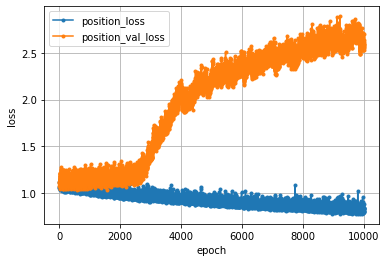

In [57]:
# 学習経過の可視化(位置)
half_position_loss     = half_position_history.history['loss']
half_position_val_loss = half_position_history.history['val_loss']

nb_epoch = len(half_position_loss)
plt.plot(range(nb_epoch), half_position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), half_position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

In [62]:
# 学習(位置)
epochs = 40000
batch_size = 32
half_position_history = half_position_model.fit(half_position_x_train, half_position_y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(half_position_x_test, half_position_y_test))

Train on 740 samples, validate on 185 samples
Epoch 1/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7811 - accuracy: 0.7270 - val_loss: 2.5465 - val_accuracy: 0.6595
Epoch 2/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7641 - accuracy: 0.7541 - val_loss: 2.5283 - val_accuracy: 0.6811
Epoch 3/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7924 - accuracy: 0.7257 - val_loss: 2.6069 - val_accuracy: 0.6378
Epoch 4/40000
740/740 [==============================] - 0s 62us/step - loss: 0.8081 - accuracy: 0.7149 - val_loss: 2.5778 - val_accuracy: 0.6595
Epoch 5/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7924 - accuracy: 0.7189 - val_loss: 2.6165 - val_accuracy: 0.6324
Epoch 6/40000
740/740 [==============================] - 0s 74us/step - loss: 0.8202 - accuracy: 0.7095 - val_loss: 2.7013 - val_accuracy: 0.6054
Epoch 7/40000
740/740 [==============================] - 0s 68us/step - loss: 

740/740 [==============================] - 0s 53us/step - loss: 0.8503 - accuracy: 0.7027 - val_loss: 2.6708 - val_accuracy: 0.6216
Epoch 57/40000
740/740 [==============================] - 0s 60us/step - loss: 0.8631 - accuracy: 0.6892 - val_loss: 2.6597 - val_accuracy: 0.6054
Epoch 58/40000
740/740 [==============================] - 0s 66us/step - loss: 0.8477 - accuracy: 0.6986 - val_loss: 2.6239 - val_accuracy: 0.6216
Epoch 59/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7991 - accuracy: 0.7189 - val_loss: 2.7068 - val_accuracy: 0.6054
Epoch 60/40000
740/740 [==============================] - 0s 69us/step - loss: 0.8189 - accuracy: 0.7149 - val_loss: 2.6440 - val_accuracy: 0.6108
Epoch 61/40000
740/740 [==============================] - 0s 63us/step - loss: 0.8481 - accuracy: 0.7054 - val_loss: 2.6961 - val_accuracy: 0.6270
Epoch 62/40000
740/740 [==============================] - 0s 62us/step - loss: 0.8517 - accuracy: 0.7014 - val_loss: 2.6486 - val_acc

Epoch 112/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7904 - accuracy: 0.7108 - val_loss: 2.6147 - val_accuracy: 0.6378
Epoch 113/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8344 - accuracy: 0.6905 - val_loss: 2.6308 - val_accuracy: 0.6162
Epoch 114/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8274 - accuracy: 0.7122 - val_loss: 2.6370 - val_accuracy: 0.6486
Epoch 115/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8031 - accuracy: 0.7135 - val_loss: 2.6565 - val_accuracy: 0.6919
Epoch 116/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7943 - accuracy: 0.6959 - val_loss: 2.6926 - val_accuracy: 0.6378
Epoch 117/40000
740/740 [==============================] - 0s 59us/step - loss: 0.8233 - accuracy: 0.7027 - val_loss: 2.6970 - val_accuracy: 0.5946
Epoch 118/40000
740/740 [==============================] - 0s 65us/step - loss: 0.8095 - accuracy: 0.7135 - val_

Epoch 167/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7842 - accuracy: 0.7162 - val_loss: 2.6501 - val_accuracy: 0.6595
Epoch 168/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7844 - accuracy: 0.7270 - val_loss: 2.6107 - val_accuracy: 0.6703
Epoch 169/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7949 - accuracy: 0.7122 - val_loss: 2.6517 - val_accuracy: 0.6486
Epoch 170/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7999 - accuracy: 0.7284 - val_loss: 2.6322 - val_accuracy: 0.6811
Epoch 171/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8356 - accuracy: 0.6892 - val_loss: 2.5962 - val_accuracy: 0.7297
Epoch 172/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8295 - accuracy: 0.7000 - val_loss: 2.6766 - val_accuracy: 0.6703
Epoch 173/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8121 - accuracy: 0.6986 - val_

740/740 [==============================] - 0s 48us/step - loss: 0.7862 - accuracy: 0.7446 - val_loss: 2.8028 - val_accuracy: 0.6108
Epoch 223/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8104 - accuracy: 0.7068 - val_loss: 2.7882 - val_accuracy: 0.6270
Epoch 224/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8514 - accuracy: 0.6932 - val_loss: 2.7376 - val_accuracy: 0.6486
Epoch 225/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7988 - accuracy: 0.7108 - val_loss: 2.8171 - val_accuracy: 0.6270
Epoch 226/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8087 - accuracy: 0.7176 - val_loss: 2.7225 - val_accuracy: 0.6811
Epoch 227/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8163 - accuracy: 0.7014 - val_loss: 2.7647 - val_accuracy: 0.6541
Epoch 228/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8364 - accuracy: 0.6824 - val_loss: 2.7507 - v

740/740 [==============================] - 0s 48us/step - loss: 0.7907 - accuracy: 0.7149 - val_loss: 2.8124 - val_accuracy: 0.6324
Epoch 278/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8621 - accuracy: 0.6851 - val_loss: 2.7608 - val_accuracy: 0.6757
Epoch 279/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8255 - accuracy: 0.7216 - val_loss: 2.7388 - val_accuracy: 0.6216
Epoch 280/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8627 - accuracy: 0.7041 - val_loss: 2.8114 - val_accuracy: 0.6108
Epoch 281/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8562 - accuracy: 0.6946 - val_loss: 2.7804 - val_accuracy: 0.6703
Epoch 282/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8482 - accuracy: 0.7027 - val_loss: 2.8668 - val_accuracy: 0.6162
Epoch 283/40000
740/740 [==============================] - 0s 70us/step - loss: 0.8412 - accuracy: 0.6973 - val_loss: 2.8832 - v

740/740 [==============================] - 0s 42us/step - loss: 0.8057 - accuracy: 0.7149 - val_loss: 2.7577 - val_accuracy: 0.6378
Epoch 333/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8082 - accuracy: 0.7162 - val_loss: 2.7896 - val_accuracy: 0.6486
Epoch 334/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8010 - accuracy: 0.7324 - val_loss: 2.7013 - val_accuracy: 0.6973
Epoch 335/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7750 - accuracy: 0.7324 - val_loss: 2.6999 - val_accuracy: 0.6541
Epoch 336/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7812 - accuracy: 0.7392 - val_loss: 2.7637 - val_accuracy: 0.6541
Epoch 337/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7909 - accuracy: 0.7095 - val_loss: 2.7413 - val_accuracy: 0.6486
Epoch 338/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8101 - accuracy: 0.7095 - val_loss: 2.7815 - v

740/740 [==============================] - 0s 42us/step - loss: 0.8946 - accuracy: 0.6797 - val_loss: 2.8277 - val_accuracy: 0.6324
Epoch 388/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7995 - accuracy: 0.7081 - val_loss: 2.7286 - val_accuracy: 0.6703
Epoch 389/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8822 - accuracy: 0.6892 - val_loss: 2.7007 - val_accuracy: 0.7135
Epoch 390/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8045 - accuracy: 0.7041 - val_loss: 2.7666 - val_accuracy: 0.6432
Epoch 391/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7952 - accuracy: 0.7243 - val_loss: 2.8184 - val_accuracy: 0.6378
Epoch 392/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8190 - accuracy: 0.7162 - val_loss: 2.7962 - val_accuracy: 0.6108
Epoch 393/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8330 - accuracy: 0.6757 - val_loss: 2.8189 - v

740/740 [==============================] - 0s 43us/step - loss: 0.8166 - accuracy: 0.7041 - val_loss: 2.8119 - val_accuracy: 0.6378
Epoch 443/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8940 - accuracy: 0.6784 - val_loss: 2.8048 - val_accuracy: 0.6757
Epoch 444/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8354 - accuracy: 0.7095 - val_loss: 2.7612 - val_accuracy: 0.6595
Epoch 445/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8160 - accuracy: 0.7000 - val_loss: 2.8943 - val_accuracy: 0.6054
Epoch 446/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8415 - accuracy: 0.7176 - val_loss: 2.7381 - val_accuracy: 0.6757
Epoch 447/40000
740/740 [==============================] - ETA: 0s - loss: 0.8516 - accuracy: 0.75 - 0s 43us/step - loss: 0.8251 - accuracy: 0.6892 - val_loss: 2.7222 - val_accuracy: 0.6973
Epoch 448/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8311

740/740 [==============================] - 0s 42us/step - loss: 0.7747 - accuracy: 0.7284 - val_loss: 2.8410 - val_accuracy: 0.6541
Epoch 498/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8182 - accuracy: 0.7108 - val_loss: 2.8715 - val_accuracy: 0.6595
Epoch 499/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8423 - accuracy: 0.6986 - val_loss: 2.7720 - val_accuracy: 0.6703
Epoch 500/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8012 - accuracy: 0.7297 - val_loss: 2.8804 - val_accuracy: 0.6432
Epoch 501/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8349 - accuracy: 0.7000 - val_loss: 2.8943 - val_accuracy: 0.6432
Epoch 502/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8518 - accuracy: 0.6892 - val_loss: 2.7384 - val_accuracy: 0.7081
Epoch 503/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8104 - accuracy: 0.7108 - val_loss: 2.9015 - v

740/740 [==============================] - 0s 44us/step - loss: 0.7830 - accuracy: 0.7270 - val_loss: 2.9141 - val_accuracy: 0.6324
Epoch 553/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8078 - accuracy: 0.7027 - val_loss: 2.8102 - val_accuracy: 0.6541
Epoch 554/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7934 - accuracy: 0.7311 - val_loss: 2.7483 - val_accuracy: 0.6919
Epoch 555/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8182 - accuracy: 0.6878 - val_loss: 2.7009 - val_accuracy: 0.7243
Epoch 556/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8615 - accuracy: 0.6730 - val_loss: 2.6625 - val_accuracy: 0.6973
Epoch 557/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8114 - accuracy: 0.7068 - val_loss: 2.7052 - val_accuracy: 0.7135
Epoch 558/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8160 - accuracy: 0.6986 - val_loss: 2.7225 - v

740/740 [==============================] - 0s 45us/step - loss: 0.7820 - accuracy: 0.7095 - val_loss: 2.7165 - val_accuracy: 0.6973
Epoch 608/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7889 - accuracy: 0.7243 - val_loss: 2.7815 - val_accuracy: 0.6595
Epoch 609/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8221 - accuracy: 0.6919 - val_loss: 2.8637 - val_accuracy: 0.6216
Epoch 610/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7879 - accuracy: 0.7216 - val_loss: 2.8260 - val_accuracy: 0.6595
Epoch 611/40000
740/740 [==============================] - 0s 55us/step - loss: 0.8044 - accuracy: 0.7162 - val_loss: 2.8073 - val_accuracy: 0.6811
Epoch 612/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8182 - accuracy: 0.7041 - val_loss: 2.7871 - val_accuracy: 0.6865
Epoch 613/40000
740/740 [==============================] - 0s 62us/step - loss: 0.8337 - accuracy: 0.6932 - val_loss: 2.8587 - v

740/740 [==============================] - 0s 43us/step - loss: 0.7993 - accuracy: 0.7135 - val_loss: 2.7636 - val_accuracy: 0.6595
Epoch 663/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7859 - accuracy: 0.7176 - val_loss: 2.7380 - val_accuracy: 0.6649
Epoch 664/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8145 - accuracy: 0.7230 - val_loss: 2.7871 - val_accuracy: 0.6703
Epoch 665/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7960 - accuracy: 0.7270 - val_loss: 2.7858 - val_accuracy: 0.6270
Epoch 666/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8264 - accuracy: 0.6878 - val_loss: 2.7844 - val_accuracy: 0.6270
Epoch 667/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7868 - accuracy: 0.7216 - val_loss: 2.7733 - val_accuracy: 0.6703
Epoch 668/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8297 - accuracy: 0.7041 - val_loss: 2.8149 - v

740/740 [==============================] - 0s 43us/step - loss: 0.8190 - accuracy: 0.7122 - val_loss: 2.8276 - val_accuracy: 0.6162
Epoch 718/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8086 - accuracy: 0.7108 - val_loss: 2.9361 - val_accuracy: 0.6054
Epoch 719/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8150 - accuracy: 0.7257 - val_loss: 2.8419 - val_accuracy: 0.6162
Epoch 720/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8143 - accuracy: 0.7149 - val_loss: 2.9031 - val_accuracy: 0.6270
Epoch 721/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8626 - accuracy: 0.6865 - val_loss: 2.8405 - val_accuracy: 0.6703
Epoch 722/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8823 - accuracy: 0.6892 - val_loss: 2.8069 - val_accuracy: 0.6649
Epoch 723/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8459 - accuracy: 0.6824 - val_loss: 2.9214 - v

740/740 [==============================] - 0s 42us/step - loss: 0.8134 - accuracy: 0.7108 - val_loss: 2.8797 - val_accuracy: 0.6270
Epoch 773/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8127 - accuracy: 0.7068 - val_loss: 2.7966 - val_accuracy: 0.7135
Epoch 774/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7979 - accuracy: 0.7230 - val_loss: 2.8722 - val_accuracy: 0.6703
Epoch 775/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8325 - accuracy: 0.6973 - val_loss: 2.7993 - val_accuracy: 0.6649
Epoch 776/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8031 - accuracy: 0.7054 - val_loss: 2.7587 - val_accuracy: 0.6865
Epoch 777/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8256 - accuracy: 0.7189 - val_loss: 2.7975 - val_accuracy: 0.7027
Epoch 778/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8086 - accuracy: 0.7270 - val_loss: 2.7412 - v

740/740 [==============================] - 0s 42us/step - loss: 0.8201 - accuracy: 0.7027 - val_loss: 2.8463 - val_accuracy: 0.5892
Epoch 828/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7987 - accuracy: 0.7216 - val_loss: 2.8095 - val_accuracy: 0.6486
Epoch 829/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8131 - accuracy: 0.7149 - val_loss: 2.7502 - val_accuracy: 0.7081
Epoch 830/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7846 - accuracy: 0.7311 - val_loss: 2.7482 - val_accuracy: 0.6973
Epoch 831/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7869 - accuracy: 0.7122 - val_loss: 2.8806 - val_accuracy: 0.5892
Epoch 832/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7911 - accuracy: 0.7297 - val_loss: 2.9822 - val_accuracy: 0.5568
Epoch 833/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8313 - accuracy: 0.7135 - val_loss: 2.8540 - v

740/740 [==============================] - 0s 62us/step - loss: 0.7833 - accuracy: 0.7149 - val_loss: 2.7970 - val_accuracy: 0.6595
Epoch 883/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7892 - accuracy: 0.7203 - val_loss: 2.8508 - val_accuracy: 0.6541
Epoch 884/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8081 - accuracy: 0.7446 - val_loss: 2.7673 - val_accuracy: 0.6973
Epoch 885/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8339 - accuracy: 0.7081 - val_loss: 2.8437 - val_accuracy: 0.6378
Epoch 886/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7966 - accuracy: 0.7270 - val_loss: 2.7328 - val_accuracy: 0.6595
Epoch 887/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7913 - accuracy: 0.7176 - val_loss: 2.7823 - val_accuracy: 0.6595
Epoch 888/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8240 - accuracy: 0.6919 - val_loss: 2.8525 - v

740/740 [==============================] - 0s 45us/step - loss: 0.8079 - accuracy: 0.7041 - val_loss: 2.7169 - val_accuracy: 0.6973
Epoch 938/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7951 - accuracy: 0.7108 - val_loss: 2.7657 - val_accuracy: 0.6216
Epoch 939/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8152 - accuracy: 0.7149 - val_loss: 2.7829 - val_accuracy: 0.6270
Epoch 940/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8042 - accuracy: 0.7108 - val_loss: 2.8047 - val_accuracy: 0.6216
Epoch 941/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8256 - accuracy: 0.7027 - val_loss: 2.7923 - val_accuracy: 0.6324
Epoch 942/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8364 - accuracy: 0.7135 - val_loss: 2.7948 - val_accuracy: 0.6703
Epoch 943/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8611 - accuracy: 0.7014 - val_loss: 2.7924 - v

740/740 [==============================] - 0s 45us/step - loss: 0.7888 - accuracy: 0.7203 - val_loss: 2.8261 - val_accuracy: 0.6811
Epoch 993/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7929 - accuracy: 0.7243 - val_loss: 2.8630 - val_accuracy: 0.6324
Epoch 994/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8559 - accuracy: 0.6797 - val_loss: 2.8192 - val_accuracy: 0.6432
Epoch 995/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8116 - accuracy: 0.6946 - val_loss: 2.9116 - val_accuracy: 0.5946
Epoch 996/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7732 - accuracy: 0.7446 - val_loss: 2.8279 - val_accuracy: 0.6541
Epoch 997/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7982 - accuracy: 0.7189 - val_loss: 2.7738 - val_accuracy: 0.6865
Epoch 998/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8327 - accuracy: 0.7000 - val_loss: 2.8235 - v

740/740 [==============================] - 0s 43us/step - loss: 0.8037 - accuracy: 0.7041 - val_loss: 2.8208 - val_accuracy: 0.6108
Epoch 1048/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7814 - accuracy: 0.7392 - val_loss: 2.8387 - val_accuracy: 0.6703
Epoch 1049/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8367 - accuracy: 0.6986 - val_loss: 2.8463 - val_accuracy: 0.5730
Epoch 1050/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8139 - accuracy: 0.6919 - val_loss: 2.8577 - val_accuracy: 0.6541
Epoch 1051/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8871 - accuracy: 0.6865 - val_loss: 2.8457 - val_accuracy: 0.6378
Epoch 1052/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7868 - accuracy: 0.7257 - val_loss: 2.7873 - val_accuracy: 0.6973
Epoch 1053/40000
740/740 [==============================] - 0s 61us/step - loss: 0.8304 - accuracy: 0.7000 - val_loss: 2.88

740/740 [==============================] - 0s 50us/step - loss: 0.8092 - accuracy: 0.7149 - val_loss: 2.7427 - val_accuracy: 0.6757
Epoch 1103/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7883 - accuracy: 0.7189 - val_loss: 2.7867 - val_accuracy: 0.6432
Epoch 1104/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8419 - accuracy: 0.7054 - val_loss: 2.8760 - val_accuracy: 0.6216
Epoch 1105/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8528 - accuracy: 0.7054 - val_loss: 2.7679 - val_accuracy: 0.6216
Epoch 1106/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8260 - accuracy: 0.7041 - val_loss: 2.8546 - val_accuracy: 0.6270
Epoch 1107/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8162 - accuracy: 0.7162 - val_loss: 2.7376 - val_accuracy: 0.6054
Epoch 1108/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7857 - accuracy: 0.7122 - val_loss: 2.73

Epoch 1157/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8268 - accuracy: 0.7068 - val_loss: 2.7573 - val_accuracy: 0.6757
Epoch 1158/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8740 - accuracy: 0.7014 - val_loss: 2.7137 - val_accuracy: 0.6865
Epoch 1159/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7844 - accuracy: 0.7216 - val_loss: 2.7442 - val_accuracy: 0.6865
Epoch 1160/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8473 - accuracy: 0.6959 - val_loss: 2.7135 - val_accuracy: 0.7351
Epoch 1161/40000
740/740 [==============================] - 0s 44us/step - loss: 0.9036 - accuracy: 0.6797 - val_loss: 2.7199 - val_accuracy: 0.6757
Epoch 1162/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7777 - accuracy: 0.7243 - val_loss: 2.7031 - val_accuracy: 0.6703
Epoch 1163/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7651 - accuracy: 0.7419

Epoch 1212/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7696 - accuracy: 0.7257 - val_loss: 2.7427 - val_accuracy: 0.6973
Epoch 1213/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8182 - accuracy: 0.7014 - val_loss: 2.7647 - val_accuracy: 0.6649
Epoch 1214/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8299 - accuracy: 0.6878 - val_loss: 2.7707 - val_accuracy: 0.6973
Epoch 1215/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8327 - accuracy: 0.7068 - val_loss: 2.8426 - val_accuracy: 0.6378
Epoch 1216/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7894 - accuracy: 0.7216 - val_loss: 2.8036 - val_accuracy: 0.6324
Epoch 1217/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8021 - accuracy: 0.7216 - val_loss: 2.7969 - val_accuracy: 0.6541
Epoch 1218/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8224 - accuracy: 0.7027

Epoch 1267/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8186 - accuracy: 0.7162 - val_loss: 2.8758 - val_accuracy: 0.5784
Epoch 1268/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7840 - accuracy: 0.7041 - val_loss: 2.8499 - val_accuracy: 0.6054
Epoch 1269/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7849 - accuracy: 0.7108 - val_loss: 2.7895 - val_accuracy: 0.6324
Epoch 1270/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7837 - accuracy: 0.7365 - val_loss: 2.7886 - val_accuracy: 0.6432
Epoch 1271/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8269 - accuracy: 0.6959 - val_loss: 2.7857 - val_accuracy: 0.6757
Epoch 1272/40000
740/740 [==============================] - 0s 46us/step - loss: 0.9125 - accuracy: 0.6878 - val_loss: 2.7818 - val_accuracy: 0.6486
Epoch 1273/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7730 - accuracy: 0.7311

Epoch 1322/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8030 - accuracy: 0.7027 - val_loss: 2.7635 - val_accuracy: 0.7243
Epoch 1323/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8822 - accuracy: 0.6811 - val_loss: 2.8508 - val_accuracy: 0.6108
Epoch 1324/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8084 - accuracy: 0.7257 - val_loss: 2.8151 - val_accuracy: 0.6432
Epoch 1325/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8082 - accuracy: 0.7014 - val_loss: 2.7547 - val_accuracy: 0.6811
Epoch 1326/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8090 - accuracy: 0.7095 - val_loss: 2.8523 - val_accuracy: 0.6054
Epoch 1327/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8274 - accuracy: 0.7014 - val_loss: 2.8717 - val_accuracy: 0.6649
Epoch 1328/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8052 - accuracy: 0.7203

Epoch 1377/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7965 - accuracy: 0.7176 - val_loss: 2.8476 - val_accuracy: 0.6378
Epoch 1378/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7931 - accuracy: 0.7095 - val_loss: 2.8539 - val_accuracy: 0.6108
Epoch 1379/40000
740/740 [==============================] - 0s 57us/step - loss: 0.8147 - accuracy: 0.7068 - val_loss: 2.8271 - val_accuracy: 0.6541
Epoch 1380/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7919 - accuracy: 0.7081 - val_loss: 2.8180 - val_accuracy: 0.6432
Epoch 1381/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7932 - accuracy: 0.7095 - val_loss: 2.8034 - val_accuracy: 0.6054
Epoch 1382/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7720 - accuracy: 0.7338 - val_loss: 2.7914 - val_accuracy: 0.6432
Epoch 1383/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7786 - accuracy: 0.7162

Epoch 1432/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8354 - accuracy: 0.7014 - val_loss: 2.8259 - val_accuracy: 0.6865
Epoch 1433/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8861 - accuracy: 0.6824 - val_loss: 2.7772 - val_accuracy: 0.6703
Epoch 1434/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7863 - accuracy: 0.7378 - val_loss: 2.8842 - val_accuracy: 0.6054
Epoch 1435/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8075 - accuracy: 0.7095 - val_loss: 2.8919 - val_accuracy: 0.6108
Epoch 1436/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7887 - accuracy: 0.7149 - val_loss: 2.8892 - val_accuracy: 0.6324
Epoch 1437/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8472 - accuracy: 0.6865 - val_loss: 2.8894 - val_accuracy: 0.6649
Epoch 1438/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7824 - accuracy: 0.7324

Epoch 1487/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8207 - accuracy: 0.7095 - val_loss: 2.7098 - val_accuracy: 0.6216
Epoch 1488/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8030 - accuracy: 0.6892 - val_loss: 2.7354 - val_accuracy: 0.6378
Epoch 1489/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8046 - accuracy: 0.7203 - val_loss: 2.6971 - val_accuracy: 0.6811
Epoch 1490/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7642 - accuracy: 0.7446 - val_loss: 2.6739 - val_accuracy: 0.6973
Epoch 1491/40000
740/740 [==============================] - 0s 89us/step - loss: 0.7732 - accuracy: 0.7324 - val_loss: 2.7419 - val_accuracy: 0.6378
Epoch 1492/40000
740/740 [==============================] - 0s 97us/step - loss: 0.7657 - accuracy: 0.7270 - val_loss: 2.8210 - val_accuracy: 0.6432
Epoch 1493/40000
740/740 [==============================] - 0s 71us/step - loss: 0.8209 - accuracy: 0.7095

Epoch 1542/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8222 - accuracy: 0.6986 - val_loss: 2.8686 - val_accuracy: 0.5676
Epoch 1543/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8135 - accuracy: 0.6973 - val_loss: 2.7505 - val_accuracy: 0.6378
Epoch 1544/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7845 - accuracy: 0.7270 - val_loss: 2.7128 - val_accuracy: 0.6486
Epoch 1545/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8041 - accuracy: 0.7027 - val_loss: 2.8255 - val_accuracy: 0.6432
Epoch 1546/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8480 - accuracy: 0.7027 - val_loss: 2.8476 - val_accuracy: 0.6378
Epoch 1547/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7921 - accuracy: 0.7203 - val_loss: 2.7484 - val_accuracy: 0.6378
Epoch 1548/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7697 - accuracy: 0.7189

Epoch 1597/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7715 - accuracy: 0.7311 - val_loss: 2.7182 - val_accuracy: 0.6378
Epoch 1598/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8351 - accuracy: 0.7108 - val_loss: 2.7352 - val_accuracy: 0.6486
Epoch 1599/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8052 - accuracy: 0.7135 - val_loss: 2.7130 - val_accuracy: 0.6811
Epoch 1600/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7798 - accuracy: 0.7243 - val_loss: 2.7279 - val_accuracy: 0.6270
Epoch 1601/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8565 - accuracy: 0.7014 - val_loss: 2.8409 - val_accuracy: 0.5946
Epoch 1602/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8057 - accuracy: 0.7054 - val_loss: 2.6959 - val_accuracy: 0.7081
Epoch 1603/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8119 - accuracy: 0.7189

Epoch 1652/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8385 - accuracy: 0.7014 - val_loss: 2.9611 - val_accuracy: 0.5784
Epoch 1653/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8168 - accuracy: 0.6959 - val_loss: 2.8612 - val_accuracy: 0.6270
Epoch 1654/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7879 - accuracy: 0.7054 - val_loss: 2.7316 - val_accuracy: 0.6541
Epoch 1655/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7632 - accuracy: 0.7419 - val_loss: 2.7368 - val_accuracy: 0.7027
Epoch 1656/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7942 - accuracy: 0.7027 - val_loss: 2.7633 - val_accuracy: 0.6378
Epoch 1657/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8092 - accuracy: 0.7162 - val_loss: 2.8984 - val_accuracy: 0.5784
Epoch 1658/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8064 - accuracy: 0.7176

Epoch 1707/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7840 - accuracy: 0.7270 - val_loss: 2.8128 - val_accuracy: 0.6703
Epoch 1708/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8060 - accuracy: 0.7135 - val_loss: 2.7775 - val_accuracy: 0.6324
Epoch 1709/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7791 - accuracy: 0.7095 - val_loss: 2.8081 - val_accuracy: 0.6378
Epoch 1710/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7799 - accuracy: 0.7081 - val_loss: 2.8227 - val_accuracy: 0.6108
Epoch 1711/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8069 - accuracy: 0.7176 - val_loss: 2.7693 - val_accuracy: 0.6703
Epoch 1712/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8002 - accuracy: 0.7216 - val_loss: 2.7721 - val_accuracy: 0.6541
Epoch 1713/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7891 - accuracy: 0.7257

Epoch 1762/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7957 - accuracy: 0.7122 - val_loss: 2.7986 - val_accuracy: 0.5892
Epoch 1763/40000
740/740 [==============================] - 0s 58us/step - loss: 0.8126 - accuracy: 0.6973 - val_loss: 2.6792 - val_accuracy: 0.6757
Epoch 1764/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7738 - accuracy: 0.7297 - val_loss: 2.7674 - val_accuracy: 0.6757
Epoch 1765/40000
740/740 [==============================] - 0s 55us/step - loss: 0.8066 - accuracy: 0.7189 - val_loss: 2.7025 - val_accuracy: 0.6432
Epoch 1766/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7843 - accuracy: 0.7162 - val_loss: 2.7054 - val_accuracy: 0.6811
Epoch 1767/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7849 - accuracy: 0.7243 - val_loss: 2.9331 - val_accuracy: 0.5730
Epoch 1768/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8367 - accuracy: 0.7081

Epoch 1817/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7936 - accuracy: 0.7000 - val_loss: 2.7303 - val_accuracy: 0.6973
Epoch 1818/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7780 - accuracy: 0.7270 - val_loss: 2.6920 - val_accuracy: 0.6541
Epoch 1819/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8002 - accuracy: 0.7068 - val_loss: 2.8033 - val_accuracy: 0.6270
Epoch 1820/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7911 - accuracy: 0.7108 - val_loss: 2.8768 - val_accuracy: 0.6324
Epoch 1821/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8373 - accuracy: 0.6905 - val_loss: 2.8824 - val_accuracy: 0.6486
Epoch 1822/40000
740/740 [==============================] - 0s 57us/step - loss: 0.8350 - accuracy: 0.7041 - val_loss: 2.8395 - val_accuracy: 0.6270
Epoch 1823/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7771 - accuracy: 0.7392

Epoch 1872/40000
740/740 [==============================] - 0s 81us/step - loss: 0.8474 - accuracy: 0.6973 - val_loss: 2.7149 - val_accuracy: 0.6865
Epoch 1873/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7813 - accuracy: 0.7284 - val_loss: 2.7102 - val_accuracy: 0.7027
Epoch 1874/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7552 - accuracy: 0.7432 - val_loss: 2.7630 - val_accuracy: 0.6541
Epoch 1875/40000
740/740 [==============================] - 0s 85us/step - loss: 0.8430 - accuracy: 0.6892 - val_loss: 2.7887 - val_accuracy: 0.6486
Epoch 1876/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7978 - accuracy: 0.7095 - val_loss: 2.7726 - val_accuracy: 0.6324
Epoch 1877/40000
740/740 [==============================] - 0s 57us/step - loss: 0.8452 - accuracy: 0.6878 - val_loss: 2.7160 - val_accuracy: 0.6757
Epoch 1878/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8064 - accuracy: 0.7027

Epoch 1927/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7860 - accuracy: 0.7095 - val_loss: 2.7787 - val_accuracy: 0.6378
Epoch 1928/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7927 - accuracy: 0.6919 - val_loss: 2.7596 - val_accuracy: 0.6432
Epoch 1929/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8242 - accuracy: 0.7081 - val_loss: 2.7475 - val_accuracy: 0.6270
Epoch 1930/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7660 - accuracy: 0.7324 - val_loss: 2.7824 - val_accuracy: 0.6757
Epoch 1931/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7861 - accuracy: 0.7176 - val_loss: 2.8009 - val_accuracy: 0.6000
Epoch 1932/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8091 - accuracy: 0.7095 - val_loss: 2.7050 - val_accuracy: 0.6649
Epoch 1933/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8297 - accuracy: 0.7054

Epoch 1982/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7915 - accuracy: 0.7257 - val_loss: 2.7133 - val_accuracy: 0.6000
Epoch 1983/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8200 - accuracy: 0.7095 - val_loss: 2.7067 - val_accuracy: 0.6378
Epoch 1984/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7924 - accuracy: 0.7216 - val_loss: 2.7283 - val_accuracy: 0.6757
Epoch 1985/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8004 - accuracy: 0.7054 - val_loss: 2.7177 - val_accuracy: 0.6703
Epoch 1986/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8018 - accuracy: 0.7081 - val_loss: 2.6963 - val_accuracy: 0.6703
Epoch 1987/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8125 - accuracy: 0.7203 - val_loss: 2.6725 - val_accuracy: 0.7081
Epoch 1988/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7875 - accuracy: 0.7149

740/740 [==============================] - 0s 69us/step - loss: 0.7828 - accuracy: 0.7297 - val_loss: 2.7694 - val_accuracy: 0.6270
Epoch 2037/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7906 - accuracy: 0.7000 - val_loss: 2.8603 - val_accuracy: 0.6108
Epoch 2038/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7762 - accuracy: 0.7446 - val_loss: 2.7523 - val_accuracy: 0.6919
Epoch 2039/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7866 - accuracy: 0.7419 - val_loss: 2.7029 - val_accuracy: 0.6811
Epoch 2040/40000
740/740 [==============================] - 0s 62us/step - loss: 0.8459 - accuracy: 0.7189 - val_loss: 2.7441 - val_accuracy: 0.6919
Epoch 2041/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7723 - accuracy: 0.7311 - val_loss: 2.7506 - val_accuracy: 0.6973
Epoch 2042/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7688 - accuracy: 0.7270 - val_loss: 2.73

740/740 [==============================] - 0s 70us/step - loss: 0.7977 - accuracy: 0.7203 - val_loss: 2.8997 - val_accuracy: 0.6486
Epoch 2092/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7922 - accuracy: 0.7000 - val_loss: 2.8274 - val_accuracy: 0.6649
Epoch 2093/40000
740/740 [==============================] - 0s 81us/step - loss: 0.8030 - accuracy: 0.7135 - val_loss: 2.8082 - val_accuracy: 0.6973
Epoch 2094/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7756 - accuracy: 0.7257 - val_loss: 2.9128 - val_accuracy: 0.6162
Epoch 2095/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7798 - accuracy: 0.7324 - val_loss: 2.8736 - val_accuracy: 0.6865
Epoch 2096/40000
740/740 [==============================] - 0s 74us/step - loss: 0.8111 - accuracy: 0.7189 - val_loss: 2.9876 - val_accuracy: 0.6378
Epoch 2097/40000
740/740 [==============================] - 0s 55us/step - loss: 0.8444 - accuracy: 0.6892 - val_loss: 2.87

740/740 [==============================] - 0s 50us/step - loss: 0.8070 - accuracy: 0.6932 - val_loss: 2.8867 - val_accuracy: 0.6108
Epoch 2147/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7817 - accuracy: 0.7162 - val_loss: 2.9665 - val_accuracy: 0.6000
Epoch 2148/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7868 - accuracy: 0.7203 - val_loss: 2.8380 - val_accuracy: 0.6919
Epoch 2149/40000
740/740 [==============================] - 0s 79us/step - loss: 0.7946 - accuracy: 0.7149 - val_loss: 2.8637 - val_accuracy: 0.6703
Epoch 2150/40000
740/740 [==============================] - 0s 79us/step - loss: 0.7748 - accuracy: 0.7459 - val_loss: 2.8988 - val_accuracy: 0.6595
Epoch 2151/40000
740/740 [==============================] - 0s 78us/step - loss: 0.8768 - accuracy: 0.7027 - val_loss: 2.8132 - val_accuracy: 0.7027
Epoch 2152/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7862 - accuracy: 0.7149 - val_loss: 2.87

740/740 [==============================] - 0s 54us/step - loss: 0.8025 - accuracy: 0.7216 - val_loss: 2.8379 - val_accuracy: 0.6595
Epoch 2202/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8365 - accuracy: 0.7081 - val_loss: 2.9387 - val_accuracy: 0.6216
Epoch 2203/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8591 - accuracy: 0.6838 - val_loss: 2.9433 - val_accuracy: 0.6703
Epoch 2204/40000
740/740 [==============================] - 0s 57us/step - loss: 0.9396 - accuracy: 0.6730 - val_loss: 2.7814 - val_accuracy: 0.7243
Epoch 2205/40000
740/740 [==============================] - 0s 64us/step - loss: 0.8128 - accuracy: 0.6986 - val_loss: 2.8865 - val_accuracy: 0.6162
Epoch 2206/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8223 - accuracy: 0.6959 - val_loss: 2.8222 - val_accuracy: 0.6378
Epoch 2207/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7836 - accuracy: 0.7257 - val_loss: 2.80

740/740 [==============================] - 0s 57us/step - loss: 0.7511 - accuracy: 0.7392 - val_loss: 2.8298 - val_accuracy: 0.6486
Epoch 2257/40000
740/740 [==============================] - 0s 71us/step - loss: 0.8076 - accuracy: 0.7176 - val_loss: 2.8082 - val_accuracy: 0.6757
Epoch 2258/40000
740/740 [==============================] - 0s 77us/step - loss: 0.8214 - accuracy: 0.7189 - val_loss: 2.8864 - val_accuracy: 0.6378
Epoch 2259/40000
740/740 [==============================] - 0s 69us/step - loss: 0.8126 - accuracy: 0.6973 - val_loss: 2.8001 - val_accuracy: 0.6757
Epoch 2260/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8443 - accuracy: 0.6959 - val_loss: 2.9138 - val_accuracy: 0.6108
Epoch 2261/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8002 - accuracy: 0.7068 - val_loss: 2.9184 - val_accuracy: 0.6486
Epoch 2262/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8524 - accuracy: 0.6865 - val_loss: 3.05

740/740 [==============================] - 0s 54us/step - loss: 0.7955 - accuracy: 0.7108 - val_loss: 2.7766 - val_accuracy: 0.7081
Epoch 2312/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7793 - accuracy: 0.7432 - val_loss: 2.8755 - val_accuracy: 0.6432
Epoch 2313/40000
740/740 [==============================] - 0s 57us/step - loss: 0.8315 - accuracy: 0.6919 - val_loss: 2.8838 - val_accuracy: 0.5946
Epoch 2314/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7837 - accuracy: 0.7270 - val_loss: 2.9557 - val_accuracy: 0.5946
Epoch 2315/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8129 - accuracy: 0.7014 - val_loss: 2.8862 - val_accuracy: 0.6108
Epoch 2316/40000
740/740 [==============================] - 0s 54us/step - loss: 0.8206 - accuracy: 0.7095 - val_loss: 2.8399 - val_accuracy: 0.6541
Epoch 2317/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8065 - accuracy: 0.7203 - val_loss: 2.82

740/740 [==============================] - 0s 51us/step - loss: 0.7929 - accuracy: 0.7216 - val_loss: 2.7517 - val_accuracy: 0.5892
Epoch 2367/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7844 - accuracy: 0.7054 - val_loss: 2.6678 - val_accuracy: 0.6216
Epoch 2368/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7667 - accuracy: 0.7351 - val_loss: 2.7330 - val_accuracy: 0.6378
Epoch 2369/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7947 - accuracy: 0.7162 - val_loss: 2.7372 - val_accuracy: 0.6324
Epoch 2370/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7713 - accuracy: 0.7270 - val_loss: 2.6907 - val_accuracy: 0.6649
Epoch 2371/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8282 - accuracy: 0.7041 - val_loss: 2.7305 - val_accuracy: 0.6324
Epoch 2372/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8758 - accuracy: 0.6973 - val_loss: 2.70

740/740 [==============================] - 0s 47us/step - loss: 0.7745 - accuracy: 0.7243 - val_loss: 2.7206 - val_accuracy: 0.6486
Epoch 2422/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7745 - accuracy: 0.7135 - val_loss: 2.6836 - val_accuracy: 0.6054
Epoch 2423/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8769 - accuracy: 0.6662 - val_loss: 2.7009 - val_accuracy: 0.6270
Epoch 2424/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7840 - accuracy: 0.7378 - val_loss: 2.6527 - val_accuracy: 0.7081
Epoch 2425/40000
740/740 [==============================] - 0s 86us/step - loss: 0.7988 - accuracy: 0.7135 - val_loss: 2.7321 - val_accuracy: 0.6486
Epoch 2426/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8227 - accuracy: 0.7095 - val_loss: 2.6709 - val_accuracy: 0.6649
Epoch 2427/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7923 - accuracy: 0.7149 - val_loss: 2.71

740/740 [==============================] - 0s 47us/step - loss: 0.8144 - accuracy: 0.7297 - val_loss: 2.8522 - val_accuracy: 0.6000
Epoch 2477/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7756 - accuracy: 0.7176 - val_loss: 2.7705 - val_accuracy: 0.6270
Epoch 2478/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7887 - accuracy: 0.7324 - val_loss: 2.7547 - val_accuracy: 0.6324
Epoch 2479/40000
740/740 [==============================] - 0s 54us/step - loss: 0.8548 - accuracy: 0.6743 - val_loss: 2.7042 - val_accuracy: 0.6865
Epoch 2480/40000
740/740 [==============================] - 0s 60us/step - loss: 0.8570 - accuracy: 0.7014 - val_loss: 2.7810 - val_accuracy: 0.6270
Epoch 2481/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8004 - accuracy: 0.7041 - val_loss: 2.9028 - val_accuracy: 0.6162
Epoch 2482/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8134 - accuracy: 0.7149 - val_loss: 2.74

740/740 [==============================] - 0s 47us/step - loss: 0.7557 - accuracy: 0.7365 - val_loss: 2.7574 - val_accuracy: 0.6595
Epoch 2532/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7700 - accuracy: 0.7135 - val_loss: 2.6673 - val_accuracy: 0.6757
Epoch 2533/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7842 - accuracy: 0.7216 - val_loss: 2.7004 - val_accuracy: 0.7189
Epoch 2534/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7789 - accuracy: 0.7162 - val_loss: 2.7359 - val_accuracy: 0.6703
Epoch 2535/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7701 - accuracy: 0.7392 - val_loss: 2.7129 - val_accuracy: 0.7189
Epoch 2536/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7801 - accuracy: 0.7243 - val_loss: 2.7160 - val_accuracy: 0.6541
Epoch 2537/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7750 - accuracy: 0.7311 - val_loss: 2.81

740/740 [==============================] - 0s 48us/step - loss: 0.8132 - accuracy: 0.6946 - val_loss: 2.7977 - val_accuracy: 0.6486
Epoch 2587/40000
740/740 [==============================] - 0s 54us/step - loss: 0.8102 - accuracy: 0.6946 - val_loss: 2.7750 - val_accuracy: 0.6541
Epoch 2588/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7926 - accuracy: 0.7135 - val_loss: 2.9088 - val_accuracy: 0.6378
Epoch 2589/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8186 - accuracy: 0.7095 - val_loss: 2.7886 - val_accuracy: 0.6324
Epoch 2590/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7649 - accuracy: 0.7338 - val_loss: 2.6759 - val_accuracy: 0.6973
Epoch 2591/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7982 - accuracy: 0.7216 - val_loss: 2.7596 - val_accuracy: 0.6486
Epoch 2592/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7966 - accuracy: 0.7135 - val_loss: 2.79

740/740 [==============================] - 0s 48us/step - loss: 0.7940 - accuracy: 0.7122 - val_loss: 2.7207 - val_accuracy: 0.6703
Epoch 2642/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7877 - accuracy: 0.7216 - val_loss: 2.7728 - val_accuracy: 0.6919
Epoch 2643/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7669 - accuracy: 0.7230 - val_loss: 2.7265 - val_accuracy: 0.6432
Epoch 2644/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8003 - accuracy: 0.7095 - val_loss: 2.7308 - val_accuracy: 0.6973
Epoch 2645/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7924 - accuracy: 0.7176 - val_loss: 2.6928 - val_accuracy: 0.6919
Epoch 2646/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7837 - accuracy: 0.7351 - val_loss: 2.6393 - val_accuracy: 0.7027
Epoch 2647/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7673 - accuracy: 0.7243 - val_loss: 2.76

740/740 [==============================] - 0s 46us/step - loss: 0.7757 - accuracy: 0.7054 - val_loss: 2.7498 - val_accuracy: 0.6324
Epoch 2697/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7600 - accuracy: 0.7365 - val_loss: 2.7298 - val_accuracy: 0.6973
Epoch 2698/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7692 - accuracy: 0.7270 - val_loss: 2.7363 - val_accuracy: 0.6270
Epoch 2699/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7601 - accuracy: 0.7392 - val_loss: 2.7501 - val_accuracy: 0.6757
Epoch 2700/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7527 - accuracy: 0.7392 - val_loss: 2.7313 - val_accuracy: 0.6162
Epoch 2701/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8021 - accuracy: 0.7014 - val_loss: 2.7327 - val_accuracy: 0.6541
Epoch 2702/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7911 - accuracy: 0.7068 - val_loss: 2.87

740/740 [==============================] - 0s 48us/step - loss: 0.7981 - accuracy: 0.7216 - val_loss: 2.7185 - val_accuracy: 0.6486
Epoch 2752/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7600 - accuracy: 0.7149 - val_loss: 2.8265 - val_accuracy: 0.6216
Epoch 2753/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7913 - accuracy: 0.7027 - val_loss: 2.8036 - val_accuracy: 0.6216
Epoch 2754/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7895 - accuracy: 0.7122 - val_loss: 2.8212 - val_accuracy: 0.6378
Epoch 2755/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8280 - accuracy: 0.7108 - val_loss: 2.7497 - val_accuracy: 0.6865
Epoch 2756/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7747 - accuracy: 0.7230 - val_loss: 2.7396 - val_accuracy: 0.7081
Epoch 2757/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7750 - accuracy: 0.7257 - val_loss: 2.71

740/740 [==============================] - 0s 52us/step - loss: 0.7789 - accuracy: 0.7108 - val_loss: 2.8385 - val_accuracy: 0.6432
Epoch 2807/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7758 - accuracy: 0.7162 - val_loss: 2.7939 - val_accuracy: 0.6486
Epoch 2808/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7905 - accuracy: 0.7068 - val_loss: 2.7396 - val_accuracy: 0.6541
Epoch 2809/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7886 - accuracy: 0.6986 - val_loss: 2.8499 - val_accuracy: 0.6649
Epoch 2810/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8404 - accuracy: 0.6851 - val_loss: 2.8977 - val_accuracy: 0.6162
Epoch 2811/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7963 - accuracy: 0.7149 - val_loss: 2.7410 - val_accuracy: 0.6919
Epoch 2812/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7700 - accuracy: 0.7108 - val_loss: 2.73

740/740 [==============================] - 0s 47us/step - loss: 0.7972 - accuracy: 0.7108 - val_loss: 2.9168 - val_accuracy: 0.6054
Epoch 2862/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8142 - accuracy: 0.7189 - val_loss: 2.9192 - val_accuracy: 0.6054
Epoch 2863/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7774 - accuracy: 0.7122 - val_loss: 2.9241 - val_accuracy: 0.5946
Epoch 2864/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8173 - accuracy: 0.6946 - val_loss: 2.8681 - val_accuracy: 0.6595
Epoch 2865/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8456 - accuracy: 0.7041 - val_loss: 2.9379 - val_accuracy: 0.6270
Epoch 2866/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8020 - accuracy: 0.6932 - val_loss: 2.9569 - val_accuracy: 0.6270
Epoch 2867/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8096 - accuracy: 0.6932 - val_loss: 2.91

740/740 [==============================] - 0s 53us/step - loss: 0.7878 - accuracy: 0.7108 - val_loss: 2.8161 - val_accuracy: 0.6973
Epoch 2917/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7742 - accuracy: 0.7203 - val_loss: 2.8914 - val_accuracy: 0.6162
Epoch 2918/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7855 - accuracy: 0.7176 - val_loss: 2.8953 - val_accuracy: 0.6649
Epoch 2919/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7627 - accuracy: 0.7284 - val_loss: 2.8882 - val_accuracy: 0.6541
Epoch 2920/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7946 - accuracy: 0.6946 - val_loss: 2.8201 - val_accuracy: 0.6703
Epoch 2921/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8158 - accuracy: 0.7041 - val_loss: 2.9021 - val_accuracy: 0.6270
Epoch 2922/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7675 - accuracy: 0.7081 - val_loss: 2.92

740/740 [==============================] - 0s 58us/step - loss: 0.7663 - accuracy: 0.7351 - val_loss: 2.9529 - val_accuracy: 0.6108
Epoch 2972/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7892 - accuracy: 0.7297 - val_loss: 2.9387 - val_accuracy: 0.6270
Epoch 2973/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8140 - accuracy: 0.7284 - val_loss: 3.0406 - val_accuracy: 0.6162
Epoch 2974/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7931 - accuracy: 0.7257 - val_loss: 2.9045 - val_accuracy: 0.6919
Epoch 2975/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7888 - accuracy: 0.7243 - val_loss: 2.8785 - val_accuracy: 0.6865
Epoch 2976/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7882 - accuracy: 0.7122 - val_loss: 2.9467 - val_accuracy: 0.6432
Epoch 2977/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8591 - accuracy: 0.6838 - val_loss: 2.87

740/740 [==============================] - 0s 48us/step - loss: 0.7880 - accuracy: 0.7189 - val_loss: 2.8141 - val_accuracy: 0.6649
Epoch 3027/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8529 - accuracy: 0.6784 - val_loss: 2.8704 - val_accuracy: 0.6432
Epoch 3028/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7789 - accuracy: 0.7189 - val_loss: 2.8679 - val_accuracy: 0.6595
Epoch 3029/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7621 - accuracy: 0.7311 - val_loss: 2.9109 - val_accuracy: 0.6703
Epoch 3030/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8217 - accuracy: 0.7149 - val_loss: 2.8499 - val_accuracy: 0.6919
Epoch 3031/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8926 - accuracy: 0.6811 - val_loss: 3.0388 - val_accuracy: 0.6162
Epoch 3032/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8492 - accuracy: 0.6811 - val_loss: 2.90

740/740 [==============================] - 0s 54us/step - loss: 0.7688 - accuracy: 0.7189 - val_loss: 2.7590 - val_accuracy: 0.6649
Epoch 3082/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7423 - accuracy: 0.7419 - val_loss: 2.7804 - val_accuracy: 0.6541
Epoch 3083/40000
740/740 [==============================] - 0s 115us/step - loss: 0.8223 - accuracy: 0.7014 - val_loss: 2.8326 - val_accuracy: 0.6108
Epoch 3084/40000
740/740 [==============================] - 0s 78us/step - loss: 0.7847 - accuracy: 0.7176 - val_loss: 2.8164 - val_accuracy: 0.6162
Epoch 3085/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7860 - accuracy: 0.7054 - val_loss: 2.8833 - val_accuracy: 0.6054
Epoch 3086/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7955 - accuracy: 0.7162 - val_loss: 2.8289 - val_accuracy: 0.6757
Epoch 3087/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7590 - accuracy: 0.7189 - val_loss: 2.8

740/740 [==============================] - 0s 64us/step - loss: 0.7829 - accuracy: 0.7135 - val_loss: 2.9134 - val_accuracy: 0.6162
Epoch 3137/40000
740/740 [==============================] - 0s 63us/step - loss: 0.8222 - accuracy: 0.6716 - val_loss: 2.8228 - val_accuracy: 0.6649
Epoch 3138/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7736 - accuracy: 0.7284 - val_loss: 2.8598 - val_accuracy: 0.6216
Epoch 3139/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7759 - accuracy: 0.7297 - val_loss: 2.9222 - val_accuracy: 0.6000
Epoch 3140/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7859 - accuracy: 0.7095 - val_loss: 2.8526 - val_accuracy: 0.6162
Epoch 3141/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7908 - accuracy: 0.7189 - val_loss: 2.8874 - val_accuracy: 0.6108
Epoch 3142/40000
740/740 [==============================] - 0s 58us/step - loss: 0.8416 - accuracy: 0.6959 - val_loss: 2.92

740/740 [==============================] - 0s 61us/step - loss: 0.7389 - accuracy: 0.7419 - val_loss: 2.9143 - val_accuracy: 0.6703
Epoch 3192/40000
740/740 [==============================] - 0s 76us/step - loss: 0.8138 - accuracy: 0.6932 - val_loss: 2.8406 - val_accuracy: 0.7135
Epoch 3193/40000
740/740 [==============================] - 0s 66us/step - loss: 0.8278 - accuracy: 0.7000 - val_loss: 2.8179 - val_accuracy: 0.7189
Epoch 3194/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7797 - accuracy: 0.7324 - val_loss: 2.8380 - val_accuracy: 0.6432
Epoch 3195/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7888 - accuracy: 0.7149 - val_loss: 2.9453 - val_accuracy: 0.6649
Epoch 3196/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7908 - accuracy: 0.7230 - val_loss: 2.9584 - val_accuracy: 0.6108
Epoch 3197/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7858 - accuracy: 0.7176 - val_loss: 2.88

740/740 [==============================] - 0s 74us/step - loss: 0.8395 - accuracy: 0.6878 - val_loss: 3.0051 - val_accuracy: 0.6595
Epoch 3247/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7838 - accuracy: 0.7216 - val_loss: 3.0480 - val_accuracy: 0.5838
Epoch 3248/40000
740/740 [==============================] - 0s 73us/step - loss: 0.8690 - accuracy: 0.6851 - val_loss: 2.9338 - val_accuracy: 0.6270
Epoch 3249/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7424 - accuracy: 0.7514 - val_loss: 2.9534 - val_accuracy: 0.6378
Epoch 3250/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7862 - accuracy: 0.7149 - val_loss: 2.9369 - val_accuracy: 0.6703
Epoch 3251/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7826 - accuracy: 0.7378 - val_loss: 2.8373 - val_accuracy: 0.7027
Epoch 3252/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7892 - accuracy: 0.7162 - val_loss: 2.90

740/740 [==============================] - 0s 86us/step - loss: 0.7897 - accuracy: 0.6986 - val_loss: 2.8269 - val_accuracy: 0.6486
Epoch 3302/40000
740/740 [==============================] - 0s 133us/step - loss: 0.7926 - accuracy: 0.7338 - val_loss: 2.9254 - val_accuracy: 0.5892
Epoch 3303/40000
740/740 [==============================] - 0s 99us/step - loss: 0.7633 - accuracy: 0.7324 - val_loss: 2.8186 - val_accuracy: 0.6541
Epoch 3304/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7964 - accuracy: 0.7135 - val_loss: 2.8872 - val_accuracy: 0.6270
Epoch 3305/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7637 - accuracy: 0.7297 - val_loss: 2.8671 - val_accuracy: 0.6486
Epoch 3306/40000
740/740 [==============================] - 0s 59us/step - loss: 0.8491 - accuracy: 0.6865 - val_loss: 2.8760 - val_accuracy: 0.6216
Epoch 3307/40000
740/740 [==============================] - 0s 54us/step - loss: 0.8249 - accuracy: 0.6986 - val_loss: 2.8

740/740 [==============================] - 0s 51us/step - loss: 0.7470 - accuracy: 0.7514 - val_loss: 2.8797 - val_accuracy: 0.6649
Epoch 3357/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7589 - accuracy: 0.7243 - val_loss: 2.8226 - val_accuracy: 0.6973
Epoch 3358/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7500 - accuracy: 0.7351 - val_loss: 2.9215 - val_accuracy: 0.6162
Epoch 3359/40000
740/740 [==============================] - 0s 68us/step - loss: 0.8074 - accuracy: 0.7149 - val_loss: 2.9380 - val_accuracy: 0.6324
Epoch 3360/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7651 - accuracy: 0.7297 - val_loss: 2.7793 - val_accuracy: 0.6649
Epoch 3361/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7875 - accuracy: 0.7500 - val_loss: 2.8238 - val_accuracy: 0.6757
Epoch 3362/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7421 - accuracy: 0.7432 - val_loss: 2.81

Epoch 3411/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7606 - accuracy: 0.7284 - val_loss: 2.8068 - val_accuracy: 0.6703
Epoch 3412/40000
740/740 [==============================] - 0s 55us/step - loss: 0.8019 - accuracy: 0.7135 - val_loss: 2.7957 - val_accuracy: 0.6973
Epoch 3413/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8604 - accuracy: 0.6784 - val_loss: 2.8404 - val_accuracy: 0.6378
Epoch 3414/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7680 - accuracy: 0.7257 - val_loss: 2.8270 - val_accuracy: 0.6811
Epoch 3415/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7503 - accuracy: 0.7486 - val_loss: 2.8274 - val_accuracy: 0.6919
Epoch 3416/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7922 - accuracy: 0.7095 - val_loss: 2.8832 - val_accuracy: 0.6649
Epoch 3417/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8081 - accuracy: 0.6932

Epoch 3466/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7713 - accuracy: 0.7189 - val_loss: 2.9406 - val_accuracy: 0.6324
Epoch 3467/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7667 - accuracy: 0.7365 - val_loss: 2.9280 - val_accuracy: 0.6108
Epoch 3468/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7961 - accuracy: 0.7135 - val_loss: 2.8685 - val_accuracy: 0.6757
Epoch 3469/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7921 - accuracy: 0.7054 - val_loss: 2.8453 - val_accuracy: 0.6378
Epoch 3470/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7993 - accuracy: 0.7203 - val_loss: 2.9310 - val_accuracy: 0.6432
Epoch 3471/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7786 - accuracy: 0.7095 - val_loss: 2.9362 - val_accuracy: 0.6108
Epoch 3472/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7956 - accuracy: 0.6973

Epoch 3521/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7821 - accuracy: 0.7203 - val_loss: 2.8575 - val_accuracy: 0.6324
Epoch 3522/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7664 - accuracy: 0.7338 - val_loss: 2.9020 - val_accuracy: 0.6216
Epoch 3523/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7869 - accuracy: 0.7081 - val_loss: 2.8764 - val_accuracy: 0.6324
Epoch 3524/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7549 - accuracy: 0.7378 - val_loss: 2.9254 - val_accuracy: 0.6162
Epoch 3525/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8141 - accuracy: 0.7108 - val_loss: 3.0033 - val_accuracy: 0.5784
Epoch 3526/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7977 - accuracy: 0.6932 - val_loss: 2.8465 - val_accuracy: 0.6432
Epoch 3527/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7820 - accuracy: 0.7095

Epoch 3576/40000
740/740 [==============================] - 0s 60us/step - loss: 0.8128 - accuracy: 0.6986 - val_loss: 2.9381 - val_accuracy: 0.5892
Epoch 3577/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8016 - accuracy: 0.7054 - val_loss: 2.9717 - val_accuracy: 0.5676
Epoch 3578/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8801 - accuracy: 0.6865 - val_loss: 2.9118 - val_accuracy: 0.5946
Epoch 3579/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8724 - accuracy: 0.6689 - val_loss: 2.9481 - val_accuracy: 0.6595
Epoch 3580/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7852 - accuracy: 0.7041 - val_loss: 2.8738 - val_accuracy: 0.7027
Epoch 3581/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8146 - accuracy: 0.7108 - val_loss: 2.8605 - val_accuracy: 0.6703
Epoch 3582/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7856 - accuracy: 0.7149

Epoch 3631/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7684 - accuracy: 0.7311 - val_loss: 2.8450 - val_accuracy: 0.6973
Epoch 3632/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7494 - accuracy: 0.7243 - val_loss: 2.9839 - val_accuracy: 0.6595
Epoch 3633/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7766 - accuracy: 0.7230 - val_loss: 2.8910 - val_accuracy: 0.6865
Epoch 3634/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7486 - accuracy: 0.7365 - val_loss: 2.9184 - val_accuracy: 0.6378
Epoch 3635/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7608 - accuracy: 0.7270 - val_loss: 2.8793 - val_accuracy: 0.6649
Epoch 3636/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7621 - accuracy: 0.7203 - val_loss: 2.9013 - val_accuracy: 0.6865
Epoch 3637/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7675 - accuracy: 0.7432

Epoch 3686/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7559 - accuracy: 0.7432 - val_loss: 2.9240 - val_accuracy: 0.6378
Epoch 3687/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7648 - accuracy: 0.7338 - val_loss: 2.9697 - val_accuracy: 0.5946
Epoch 3688/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7833 - accuracy: 0.7108 - val_loss: 2.9496 - val_accuracy: 0.6216
Epoch 3689/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7949 - accuracy: 0.7243 - val_loss: 2.8586 - val_accuracy: 0.7405
Epoch 3690/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7639 - accuracy: 0.7257 - val_loss: 2.8739 - val_accuracy: 0.6973
Epoch 3691/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7748 - accuracy: 0.7324 - val_loss: 2.9338 - val_accuracy: 0.6595
Epoch 3692/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7742 - accuracy: 0.7216

Epoch 3741/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7668 - accuracy: 0.7203 - val_loss: 2.8668 - val_accuracy: 0.7027
Epoch 3742/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7938 - accuracy: 0.7324 - val_loss: 2.9124 - val_accuracy: 0.6865
Epoch 3743/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7812 - accuracy: 0.7351 - val_loss: 2.9234 - val_accuracy: 0.6649
Epoch 3744/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7794 - accuracy: 0.7378 - val_loss: 2.9638 - val_accuracy: 0.6649
Epoch 3745/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7648 - accuracy: 0.7162 - val_loss: 2.9341 - val_accuracy: 0.6703
Epoch 3746/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7861 - accuracy: 0.7122 - val_loss: 2.9458 - val_accuracy: 0.6649
Epoch 3747/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7951 - accuracy: 0.7270

Epoch 3796/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7844 - accuracy: 0.7203 - val_loss: 2.9225 - val_accuracy: 0.6108
Epoch 3797/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7711 - accuracy: 0.7176 - val_loss: 2.8540 - val_accuracy: 0.7189
Epoch 3798/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7967 - accuracy: 0.7243 - val_loss: 2.8866 - val_accuracy: 0.6595
Epoch 3799/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7908 - accuracy: 0.7284 - val_loss: 2.8833 - val_accuracy: 0.6486
Epoch 3800/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7375 - accuracy: 0.7405 - val_loss: 2.9665 - val_accuracy: 0.6486
Epoch 3801/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7694 - accuracy: 0.7338 - val_loss: 2.9364 - val_accuracy: 0.5946
Epoch 3802/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7609 - accuracy: 0.7419

Epoch 3851/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7552 - accuracy: 0.7365 - val_loss: 2.8953 - val_accuracy: 0.6324
Epoch 3852/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7868 - accuracy: 0.7095 - val_loss: 2.8602 - val_accuracy: 0.6919
Epoch 3853/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7464 - accuracy: 0.7459 - val_loss: 2.8824 - val_accuracy: 0.7189
Epoch 3854/40000
740/740 [==============================] - 0s 58us/step - loss: 0.8125 - accuracy: 0.6959 - val_loss: 2.8142 - val_accuracy: 0.6919
Epoch 3855/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7872 - accuracy: 0.7230 - val_loss: 2.8280 - val_accuracy: 0.6649
Epoch 3856/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7820 - accuracy: 0.7122 - val_loss: 2.8687 - val_accuracy: 0.6757
Epoch 3857/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7813 - accuracy: 0.7203

Epoch 3906/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7428 - accuracy: 0.7365 - val_loss: 2.8331 - val_accuracy: 0.6486
Epoch 3907/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7629 - accuracy: 0.7135 - val_loss: 2.8138 - val_accuracy: 0.6649
Epoch 3908/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7739 - accuracy: 0.6959 - val_loss: 2.8516 - val_accuracy: 0.6324
Epoch 3909/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8010 - accuracy: 0.6973 - val_loss: 2.8101 - val_accuracy: 0.7027
Epoch 3910/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7993 - accuracy: 0.7095 - val_loss: 2.9182 - val_accuracy: 0.6432
Epoch 3911/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7450 - accuracy: 0.7284 - val_loss: 2.8521 - val_accuracy: 0.6649
Epoch 3912/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7900 - accuracy: 0.7176

Epoch 3961/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8285 - accuracy: 0.6784 - val_loss: 2.9074 - val_accuracy: 0.6270
Epoch 3962/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8259 - accuracy: 0.6878 - val_loss: 2.8958 - val_accuracy: 0.6432
Epoch 3963/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7515 - accuracy: 0.7392 - val_loss: 2.8310 - val_accuracy: 0.6324
Epoch 3964/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7803 - accuracy: 0.7149 - val_loss: 2.8244 - val_accuracy: 0.6108
Epoch 3965/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7709 - accuracy: 0.7095 - val_loss: 2.9031 - val_accuracy: 0.6378
Epoch 3966/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7842 - accuracy: 0.7162 - val_loss: 2.9346 - val_accuracy: 0.6162
Epoch 3967/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7671 - accuracy: 0.7378

Epoch 4016/40000
740/740 [==============================] - 0s 82us/step - loss: 0.7835 - accuracy: 0.7216 - val_loss: 2.7995 - val_accuracy: 0.6432
Epoch 4017/40000
740/740 [==============================] - 0s 99us/step - loss: 0.8953 - accuracy: 0.6703 - val_loss: 2.8727 - val_accuracy: 0.6432
Epoch 4018/40000
740/740 [==============================] - 0s 68us/step - loss: 0.8686 - accuracy: 0.6865 - val_loss: 2.8048 - val_accuracy: 0.6378
Epoch 4019/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7963 - accuracy: 0.7027 - val_loss: 2.8094 - val_accuracy: 0.6378
Epoch 4020/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7765 - accuracy: 0.7162 - val_loss: 2.7128 - val_accuracy: 0.7135
Epoch 4021/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7397 - accuracy: 0.7419 - val_loss: 2.7611 - val_accuracy: 0.6378
Epoch 4022/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7782 - accuracy: 0.7311

Epoch 4071/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7662 - accuracy: 0.7203 - val_loss: 2.7521 - val_accuracy: 0.6432
Epoch 4072/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7444 - accuracy: 0.7405 - val_loss: 2.8446 - val_accuracy: 0.5946
Epoch 4073/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8068 - accuracy: 0.7108 - val_loss: 2.8590 - val_accuracy: 0.6054
Epoch 4074/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7779 - accuracy: 0.7068 - val_loss: 2.8240 - val_accuracy: 0.6378
Epoch 4075/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7490 - accuracy: 0.7419 - val_loss: 2.7891 - val_accuracy: 0.6865
Epoch 4076/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8195 - accuracy: 0.7027 - val_loss: 2.7998 - val_accuracy: 0.6595
Epoch 4077/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7833 - accuracy: 0.7122

Epoch 4126/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8152 - accuracy: 0.7081 - val_loss: 2.8716 - val_accuracy: 0.6595
Epoch 4127/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7985 - accuracy: 0.7176 - val_loss: 2.7297 - val_accuracy: 0.7027
Epoch 4128/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7555 - accuracy: 0.7297 - val_loss: 2.7555 - val_accuracy: 0.6919
Epoch 4129/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7220 - accuracy: 0.7568 - val_loss: 2.8723 - val_accuracy: 0.6378
Epoch 4130/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7913 - accuracy: 0.7081 - val_loss: 2.8719 - val_accuracy: 0.6595
Epoch 4131/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7648 - accuracy: 0.7054 - val_loss: 2.8456 - val_accuracy: 0.6378
Epoch 4132/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7952 - accuracy: 0.7162

Epoch 4181/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7944 - accuracy: 0.7095 - val_loss: 2.7919 - val_accuracy: 0.6919
Epoch 4182/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7594 - accuracy: 0.7270 - val_loss: 2.7338 - val_accuracy: 0.7297
Epoch 4183/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7509 - accuracy: 0.7324 - val_loss: 2.7844 - val_accuracy: 0.6973
Epoch 4184/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7799 - accuracy: 0.7149 - val_loss: 2.8423 - val_accuracy: 0.6757
Epoch 4185/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7724 - accuracy: 0.7189 - val_loss: 2.8394 - val_accuracy: 0.6865
Epoch 4186/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7446 - accuracy: 0.7297 - val_loss: 2.7730 - val_accuracy: 0.6865
Epoch 4187/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7721 - accuracy: 0.7365

Epoch 4236/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7507 - accuracy: 0.7378 - val_loss: 2.7038 - val_accuracy: 0.6703
Epoch 4237/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7704 - accuracy: 0.7176 - val_loss: 2.7422 - val_accuracy: 0.6595
Epoch 4238/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7768 - accuracy: 0.7095 - val_loss: 2.8333 - val_accuracy: 0.6541
Epoch 4239/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7721 - accuracy: 0.7203 - val_loss: 2.9553 - val_accuracy: 0.5892
Epoch 4240/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7987 - accuracy: 0.7068 - val_loss: 2.7821 - val_accuracy: 0.6541
Epoch 4241/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7885 - accuracy: 0.7243 - val_loss: 2.7730 - val_accuracy: 0.6432
Epoch 4242/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7558 - accuracy: 0.7392

Epoch 4291/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7650 - accuracy: 0.7419 - val_loss: 2.7583 - val_accuracy: 0.7189
Epoch 4292/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7650 - accuracy: 0.7216 - val_loss: 2.9264 - val_accuracy: 0.6486
Epoch 4293/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7908 - accuracy: 0.7230 - val_loss: 2.7724 - val_accuracy: 0.7243
Epoch 4294/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7882 - accuracy: 0.7284 - val_loss: 2.9268 - val_accuracy: 0.6595
Epoch 4295/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8591 - accuracy: 0.7014 - val_loss: 2.9196 - val_accuracy: 0.6541
Epoch 4296/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7656 - accuracy: 0.7203 - val_loss: 2.8444 - val_accuracy: 0.6703
Epoch 4297/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7397 - accuracy: 0.7365

Epoch 4346/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7976 - accuracy: 0.6959 - val_loss: 2.8998 - val_accuracy: 0.6595
Epoch 4347/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7481 - accuracy: 0.7176 - val_loss: 2.8761 - val_accuracy: 0.6811
Epoch 4348/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7353 - accuracy: 0.7365 - val_loss: 2.9217 - val_accuracy: 0.6216
Epoch 4349/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7878 - accuracy: 0.7095 - val_loss: 2.8616 - val_accuracy: 0.6486
Epoch 4350/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7864 - accuracy: 0.7068 - val_loss: 2.8756 - val_accuracy: 0.6811
Epoch 4351/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7775 - accuracy: 0.7243 - val_loss: 2.9294 - val_accuracy: 0.6378
Epoch 4352/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7599 - accuracy: 0.7054

Epoch 4401/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7567 - accuracy: 0.7257 - val_loss: 2.9642 - val_accuracy: 0.6324
Epoch 4402/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7588 - accuracy: 0.7392 - val_loss: 3.0253 - val_accuracy: 0.6432
Epoch 4403/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7732 - accuracy: 0.7149 - val_loss: 3.0523 - val_accuracy: 0.6378
Epoch 4404/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7495 - accuracy: 0.7216 - val_loss: 2.9500 - val_accuracy: 0.6919
Epoch 4405/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7738 - accuracy: 0.7027 - val_loss: 3.0536 - val_accuracy: 0.6811
Epoch 4406/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7869 - accuracy: 0.7162 - val_loss: 2.9342 - val_accuracy: 0.6811
Epoch 4407/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7930 - accuracy: 0.7041

Epoch 4456/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7585 - accuracy: 0.7189 - val_loss: 2.8829 - val_accuracy: 0.6270
Epoch 4457/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7961 - accuracy: 0.7189 - val_loss: 2.9683 - val_accuracy: 0.5946
Epoch 4458/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7759 - accuracy: 0.7486 - val_loss: 2.8198 - val_accuracy: 0.6811
Epoch 4459/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7719 - accuracy: 0.7203 - val_loss: 2.8752 - val_accuracy: 0.6649
Epoch 4460/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7697 - accuracy: 0.7297 - val_loss: 2.9470 - val_accuracy: 0.6432
Epoch 4461/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7556 - accuracy: 0.7243 - val_loss: 2.8613 - val_accuracy: 0.6595
Epoch 4462/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7814 - accuracy: 0.7108

Epoch 4511/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7695 - accuracy: 0.7095 - val_loss: 2.8001 - val_accuracy: 0.6541
Epoch 4512/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8055 - accuracy: 0.7216 - val_loss: 2.8120 - val_accuracy: 0.6270
Epoch 4513/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7553 - accuracy: 0.7284 - val_loss: 2.7477 - val_accuracy: 0.6811
Epoch 4514/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7939 - accuracy: 0.7162 - val_loss: 2.7509 - val_accuracy: 0.6757
Epoch 4515/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7636 - accuracy: 0.7189 - val_loss: 2.8698 - val_accuracy: 0.6216
Epoch 4516/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7667 - accuracy: 0.7162 - val_loss: 2.8085 - val_accuracy: 0.6595
Epoch 4517/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7702 - accuracy: 0.7081

Epoch 4566/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7834 - accuracy: 0.7176 - val_loss: 2.8218 - val_accuracy: 0.6919
Epoch 4567/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7595 - accuracy: 0.7392 - val_loss: 2.7467 - val_accuracy: 0.7027
Epoch 4568/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7376 - accuracy: 0.7297 - val_loss: 2.8420 - val_accuracy: 0.6324
Epoch 4569/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7848 - accuracy: 0.7095 - val_loss: 2.8540 - val_accuracy: 0.6432
Epoch 4570/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8109 - accuracy: 0.6973 - val_loss: 2.9279 - val_accuracy: 0.6703
Epoch 4571/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7863 - accuracy: 0.7135 - val_loss: 2.7207 - val_accuracy: 0.6865
Epoch 4572/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7789 - accuracy: 0.7081

Epoch 4621/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7620 - accuracy: 0.7270 - val_loss: 2.9384 - val_accuracy: 0.6270
Epoch 4622/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8059 - accuracy: 0.7243 - val_loss: 2.8602 - val_accuracy: 0.6865
Epoch 4623/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7744 - accuracy: 0.7216 - val_loss: 2.9210 - val_accuracy: 0.6108
Epoch 4624/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7544 - accuracy: 0.7338 - val_loss: 2.8480 - val_accuracy: 0.6865
Epoch 4625/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7517 - accuracy: 0.7189 - val_loss: 2.8183 - val_accuracy: 0.6811
Epoch 4626/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7547 - accuracy: 0.7378 - val_loss: 2.8342 - val_accuracy: 0.6541
Epoch 4627/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7996 - accuracy: 0.7108

Epoch 4676/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8564 - accuracy: 0.6784 - val_loss: 2.9481 - val_accuracy: 0.6378
Epoch 4677/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8110 - accuracy: 0.7081 - val_loss: 2.8026 - val_accuracy: 0.6486
Epoch 4678/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7914 - accuracy: 0.7135 - val_loss: 2.8551 - val_accuracy: 0.6486
Epoch 4679/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7714 - accuracy: 0.7230 - val_loss: 2.8041 - val_accuracy: 0.6486
Epoch 4680/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7190 - accuracy: 0.7568 - val_loss: 2.7829 - val_accuracy: 0.6757
Epoch 4681/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7407 - accuracy: 0.7432 - val_loss: 2.8314 - val_accuracy: 0.6270
Epoch 4682/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8090 - accuracy: 0.7095

Epoch 4731/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7459 - accuracy: 0.7216 - val_loss: 3.0068 - val_accuracy: 0.6108
Epoch 4732/40000
740/740 [==============================] - 0s 55us/step - loss: 0.8149 - accuracy: 0.6784 - val_loss: 3.0163 - val_accuracy: 0.6000
Epoch 4733/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7855 - accuracy: 0.7068 - val_loss: 2.9637 - val_accuracy: 0.6054
Epoch 4734/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7831 - accuracy: 0.7203 - val_loss: 2.8615 - val_accuracy: 0.7297
Epoch 4735/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7579 - accuracy: 0.7473 - val_loss: 2.9844 - val_accuracy: 0.5946
Epoch 4736/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7488 - accuracy: 0.7486 - val_loss: 2.9352 - val_accuracy: 0.6270
Epoch 4737/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7375 - accuracy: 0.7392

Epoch 4786/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8247 - accuracy: 0.6973 - val_loss: 2.9383 - val_accuracy: 0.6865
Epoch 4787/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7222 - accuracy: 0.7351 - val_loss: 2.8743 - val_accuracy: 0.7027
Epoch 4788/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7324 - accuracy: 0.7351 - val_loss: 2.9701 - val_accuracy: 0.6865
Epoch 4789/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8128 - accuracy: 0.7054 - val_loss: 2.9594 - val_accuracy: 0.6757
Epoch 4790/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7490 - accuracy: 0.7257 - val_loss: 2.9290 - val_accuracy: 0.6541
Epoch 4791/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7926 - accuracy: 0.7000 - val_loss: 2.9679 - val_accuracy: 0.6270
Epoch 4792/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7310 - accuracy: 0.7473

Epoch 4841/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7843 - accuracy: 0.7081 - val_loss: 2.9468 - val_accuracy: 0.6541
Epoch 4842/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7529 - accuracy: 0.7365 - val_loss: 2.9851 - val_accuracy: 0.6324
Epoch 4843/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7463 - accuracy: 0.7216 - val_loss: 2.9536 - val_accuracy: 0.6486
Epoch 4844/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7426 - accuracy: 0.7270 - val_loss: 2.8520 - val_accuracy: 0.6865
Epoch 4845/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7717 - accuracy: 0.7203 - val_loss: 2.9049 - val_accuracy: 0.7189
Epoch 4846/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7575 - accuracy: 0.7297 - val_loss: 3.0163 - val_accuracy: 0.6054
Epoch 4847/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7971 - accuracy: 0.7068

Epoch 4896/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7476 - accuracy: 0.7365 - val_loss: 2.9305 - val_accuracy: 0.6108
Epoch 4897/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7465 - accuracy: 0.7473 - val_loss: 2.9452 - val_accuracy: 0.6216
Epoch 4898/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7357 - accuracy: 0.7649 - val_loss: 2.8866 - val_accuracy: 0.6865
Epoch 4899/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7280 - accuracy: 0.7419 - val_loss: 2.8485 - val_accuracy: 0.7189
Epoch 4900/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7424 - accuracy: 0.7405 - val_loss: 2.9647 - val_accuracy: 0.6324
Epoch 4901/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7546 - accuracy: 0.7419 - val_loss: 2.9080 - val_accuracy: 0.6649
Epoch 4902/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7625 - accuracy: 0.7324

Epoch 4951/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7392 - accuracy: 0.7446 - val_loss: 2.9162 - val_accuracy: 0.6649
Epoch 4952/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7633 - accuracy: 0.7257 - val_loss: 2.9288 - val_accuracy: 0.6649
Epoch 4953/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7800 - accuracy: 0.7135 - val_loss: 2.8513 - val_accuracy: 0.6919
Epoch 4954/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7757 - accuracy: 0.7135 - val_loss: 2.9175 - val_accuracy: 0.6486
Epoch 4955/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7652 - accuracy: 0.7216 - val_loss: 2.8440 - val_accuracy: 0.6919
Epoch 4956/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7466 - accuracy: 0.7311 - val_loss: 3.0212 - val_accuracy: 0.6432
Epoch 4957/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7429 - accuracy: 0.7581

Epoch 5006/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7646 - accuracy: 0.7257 - val_loss: 2.9122 - val_accuracy: 0.6054
Epoch 5007/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8082 - accuracy: 0.7027 - val_loss: 2.8463 - val_accuracy: 0.6811
Epoch 5008/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8351 - accuracy: 0.7000 - val_loss: 3.0455 - val_accuracy: 0.6973
Epoch 5009/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8670 - accuracy: 0.6770 - val_loss: 2.8171 - val_accuracy: 0.6919
Epoch 5010/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7618 - accuracy: 0.7176 - val_loss: 2.9387 - val_accuracy: 0.7027
Epoch 5011/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7492 - accuracy: 0.7081 - val_loss: 2.9289 - val_accuracy: 0.6486
Epoch 5012/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7478 - accuracy: 0.7297

Epoch 5061/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7316 - accuracy: 0.7486 - val_loss: 2.9331 - val_accuracy: 0.6703
Epoch 5062/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7381 - accuracy: 0.7378 - val_loss: 2.8816 - val_accuracy: 0.6432
Epoch 5063/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7823 - accuracy: 0.7041 - val_loss: 2.9952 - val_accuracy: 0.6865
Epoch 5064/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7937 - accuracy: 0.7149 - val_loss: 2.9921 - val_accuracy: 0.6216
Epoch 5065/40000
740/740 [==============================] - 0s 83us/step - loss: 0.7526 - accuracy: 0.7351 - val_loss: 2.9296 - val_accuracy: 0.7135
Epoch 5066/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7600 - accuracy: 0.7324 - val_loss: 2.8423 - val_accuracy: 0.7351
Epoch 5067/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7352 - accuracy: 0.7500

Epoch 5116/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7717 - accuracy: 0.7365 - val_loss: 2.9876 - val_accuracy: 0.6811
Epoch 5117/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7867 - accuracy: 0.7216 - val_loss: 3.0030 - val_accuracy: 0.6649
Epoch 5118/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7433 - accuracy: 0.7446 - val_loss: 2.9180 - val_accuracy: 0.6757
Epoch 5119/40000
740/740 [==============================] - 0s 64us/step - loss: 0.8397 - accuracy: 0.7014 - val_loss: 2.9317 - val_accuracy: 0.6378
Epoch 5120/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7624 - accuracy: 0.7189 - val_loss: 3.0082 - val_accuracy: 0.6216
Epoch 5121/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7430 - accuracy: 0.7541 - val_loss: 3.0724 - val_accuracy: 0.6108
Epoch 5122/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7812 - accuracy: 0.7473

Epoch 5171/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7687 - accuracy: 0.7162 - val_loss: 3.0486 - val_accuracy: 0.6000
Epoch 5172/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7654 - accuracy: 0.7405 - val_loss: 2.9634 - val_accuracy: 0.6324
Epoch 5173/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7518 - accuracy: 0.7527 - val_loss: 2.9470 - val_accuracy: 0.6432
Epoch 5174/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7572 - accuracy: 0.7378 - val_loss: 3.0115 - val_accuracy: 0.6703
Epoch 5175/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7885 - accuracy: 0.7311 - val_loss: 2.9285 - val_accuracy: 0.6324
Epoch 5176/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7561 - accuracy: 0.7392 - val_loss: 2.9522 - val_accuracy: 0.6811
Epoch 5177/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7728 - accuracy: 0.7297

Epoch 5226/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7742 - accuracy: 0.7081 - val_loss: 2.8838 - val_accuracy: 0.6649
Epoch 5227/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7784 - accuracy: 0.7122 - val_loss: 2.9719 - val_accuracy: 0.6865
Epoch 5228/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7506 - accuracy: 0.7203 - val_loss: 3.0767 - val_accuracy: 0.5946
Epoch 5229/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7336 - accuracy: 0.7432 - val_loss: 2.9048 - val_accuracy: 0.7135
Epoch 5230/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7730 - accuracy: 0.7297 - val_loss: 2.9026 - val_accuracy: 0.6919
Epoch 5231/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7603 - accuracy: 0.7432 - val_loss: 2.9471 - val_accuracy: 0.6595
Epoch 5232/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7947 - accuracy: 0.7338

Epoch 5281/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7738 - accuracy: 0.7284 - val_loss: 2.9612 - val_accuracy: 0.6595
Epoch 5282/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7904 - accuracy: 0.7122 - val_loss: 2.9418 - val_accuracy: 0.6486
Epoch 5283/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7472 - accuracy: 0.7324 - val_loss: 2.9606 - val_accuracy: 0.6432
Epoch 5284/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7881 - accuracy: 0.7311 - val_loss: 2.9618 - val_accuracy: 0.6486
Epoch 5285/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7622 - accuracy: 0.7149 - val_loss: 2.9353 - val_accuracy: 0.7351
Epoch 5286/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7380 - accuracy: 0.7392 - val_loss: 3.0103 - val_accuracy: 0.5946
Epoch 5287/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7760 - accuracy: 0.7243

Epoch 5336/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7684 - accuracy: 0.7176 - val_loss: 2.8885 - val_accuracy: 0.6703
Epoch 5337/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7719 - accuracy: 0.7189 - val_loss: 2.9610 - val_accuracy: 0.6324
Epoch 5338/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7732 - accuracy: 0.7297 - val_loss: 2.9994 - val_accuracy: 0.6054
Epoch 5339/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7611 - accuracy: 0.7270 - val_loss: 2.9851 - val_accuracy: 0.6541
Epoch 5340/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7656 - accuracy: 0.7284 - val_loss: 2.9874 - val_accuracy: 0.6324
Epoch 5341/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7784 - accuracy: 0.7230 - val_loss: 2.9149 - val_accuracy: 0.6811
Epoch 5342/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7740 - accuracy: 0.7189

Epoch 5391/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7360 - accuracy: 0.7365 - val_loss: 3.0846 - val_accuracy: 0.6324
Epoch 5392/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7848 - accuracy: 0.7311 - val_loss: 3.2456 - val_accuracy: 0.5838
Epoch 5393/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7587 - accuracy: 0.7284 - val_loss: 2.9536 - val_accuracy: 0.6811
Epoch 5394/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7298 - accuracy: 0.7419 - val_loss: 2.9750 - val_accuracy: 0.6973
Epoch 5395/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7496 - accuracy: 0.7405 - val_loss: 2.9279 - val_accuracy: 0.7189
Epoch 5396/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7484 - accuracy: 0.7419 - val_loss: 3.0069 - val_accuracy: 0.6919
Epoch 5397/40000
740/740 [==============================] - 0s 86us/step - loss: 0.7410 - accuracy: 0.7446

Epoch 5446/40000
740/740 [==============================] - 0s 110us/step - loss: 0.7764 - accuracy: 0.7176 - val_loss: 3.0141 - val_accuracy: 0.6649
Epoch 5447/40000
740/740 [==============================] - 0s 84us/step - loss: 0.7378 - accuracy: 0.7284 - val_loss: 3.0363 - val_accuracy: 0.6811
Epoch 5448/40000
740/740 [==============================] - 0s 99us/step - loss: 0.7503 - accuracy: 0.7257 - val_loss: 2.9282 - val_accuracy: 0.6811
Epoch 5449/40000
740/740 [==============================] - 0s 90us/step - loss: 0.7513 - accuracy: 0.7203 - val_loss: 3.0960 - val_accuracy: 0.6000
Epoch 5450/40000
740/740 [==============================] - 0s 88us/step - loss: 0.7993 - accuracy: 0.7311 - val_loss: 3.0904 - val_accuracy: 0.6270
Epoch 5451/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7497 - accuracy: 0.7324 - val_loss: 2.9643 - val_accuracy: 0.7027
Epoch 5452/40000
740/740 [==============================] - 0s 99us/step - loss: 0.7641 - accuracy: 0.723

Epoch 5501/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7735 - accuracy: 0.7459 - val_loss: 2.9534 - val_accuracy: 0.6541
Epoch 5502/40000
740/740 [==============================] - 0s 92us/step - loss: 0.7747 - accuracy: 0.7081 - val_loss: 3.0530 - val_accuracy: 0.6486
Epoch 5503/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7590 - accuracy: 0.7122 - val_loss: 2.9860 - val_accuracy: 0.6324
Epoch 5504/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7895 - accuracy: 0.7189 - val_loss: 2.9455 - val_accuracy: 0.6595
Epoch 5505/40000
740/740 [==============================] - 0s 134us/step - loss: 0.7463 - accuracy: 0.7419 - val_loss: 2.8713 - val_accuracy: 0.7135
Epoch 5506/40000
740/740 [==============================] - 0s 79us/step - loss: 0.7441 - accuracy: 0.7419 - val_loss: 3.0164 - val_accuracy: 0.6054
Epoch 5507/40000
740/740 [==============================] - 0s 77us/step - loss: 0.8129 - accuracy: 0.702

Epoch 5556/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7619 - accuracy: 0.7095 - val_loss: 3.0200 - val_accuracy: 0.6595
Epoch 5557/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7406 - accuracy: 0.7446 - val_loss: 2.8862 - val_accuracy: 0.6703
Epoch 5558/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7990 - accuracy: 0.7054 - val_loss: 3.0237 - val_accuracy: 0.6324
Epoch 5559/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7773 - accuracy: 0.7122 - val_loss: 2.9807 - val_accuracy: 0.6757
Epoch 5560/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7483 - accuracy: 0.7311 - val_loss: 2.8856 - val_accuracy: 0.6757
Epoch 5561/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7455 - accuracy: 0.7162 - val_loss: 2.9782 - val_accuracy: 0.6595
Epoch 5562/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7624 - accuracy: 0.7135

Epoch 5611/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7413 - accuracy: 0.7324 - val_loss: 2.9880 - val_accuracy: 0.6216
Epoch 5612/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7729 - accuracy: 0.7189 - val_loss: 2.9747 - val_accuracy: 0.6541
Epoch 5613/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7650 - accuracy: 0.7297 - val_loss: 2.9843 - val_accuracy: 0.6649
Epoch 5614/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7745 - accuracy: 0.7162 - val_loss: 3.0189 - val_accuracy: 0.6703
Epoch 5615/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7439 - accuracy: 0.7459 - val_loss: 3.0268 - val_accuracy: 0.6216
Epoch 5616/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7757 - accuracy: 0.7311 - val_loss: 3.0099 - val_accuracy: 0.6865
Epoch 5617/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7641 - accuracy: 0.7203

Epoch 5666/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7462 - accuracy: 0.7230 - val_loss: 2.8853 - val_accuracy: 0.6973
Epoch 5667/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7458 - accuracy: 0.7257 - val_loss: 2.9156 - val_accuracy: 0.6865
Epoch 5668/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7525 - accuracy: 0.7257 - val_loss: 2.9063 - val_accuracy: 0.7351
Epoch 5669/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8028 - accuracy: 0.7108 - val_loss: 2.9599 - val_accuracy: 0.6649
Epoch 5670/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8122 - accuracy: 0.6865 - val_loss: 2.9973 - val_accuracy: 0.6432
Epoch 5671/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7491 - accuracy: 0.7270 - val_loss: 2.9869 - val_accuracy: 0.6162
Epoch 5672/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7561 - accuracy: 0.7203

Epoch 5721/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7600 - accuracy: 0.7068 - val_loss: 3.0254 - val_accuracy: 0.6270
Epoch 5722/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7455 - accuracy: 0.7297 - val_loss: 3.0682 - val_accuracy: 0.6162
Epoch 5723/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8120 - accuracy: 0.6986 - val_loss: 3.0310 - val_accuracy: 0.6541
Epoch 5724/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7479 - accuracy: 0.7162 - val_loss: 3.0436 - val_accuracy: 0.6486
Epoch 5725/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7997 - accuracy: 0.7027 - val_loss: 2.9885 - val_accuracy: 0.7027
Epoch 5726/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7604 - accuracy: 0.7527 - val_loss: 2.9805 - val_accuracy: 0.6595
Epoch 5727/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7272 - accuracy: 0.7270

Epoch 5776/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7552 - accuracy: 0.7500 - val_loss: 3.0533 - val_accuracy: 0.6919
Epoch 5777/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7314 - accuracy: 0.7365 - val_loss: 3.0954 - val_accuracy: 0.6378
Epoch 5778/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7735 - accuracy: 0.7162 - val_loss: 3.0435 - val_accuracy: 0.7027
Epoch 5779/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7575 - accuracy: 0.7392 - val_loss: 3.0525 - val_accuracy: 0.6541
Epoch 5780/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7591 - accuracy: 0.7338 - val_loss: 3.0982 - val_accuracy: 0.6324
Epoch 5781/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7676 - accuracy: 0.7284 - val_loss: 3.0170 - val_accuracy: 0.6595
Epoch 5782/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7143 - accuracy: 0.7459

Epoch 5831/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7471 - accuracy: 0.7405 - val_loss: 2.9299 - val_accuracy: 0.6486
Epoch 5832/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7282 - accuracy: 0.7365 - val_loss: 2.8766 - val_accuracy: 0.6595
Epoch 5833/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7736 - accuracy: 0.7297 - val_loss: 2.8878 - val_accuracy: 0.6757
Epoch 5834/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7873 - accuracy: 0.7081 - val_loss: 2.9507 - val_accuracy: 0.6378
Epoch 5835/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7806 - accuracy: 0.7378 - val_loss: 2.9560 - val_accuracy: 0.7189
Epoch 5836/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7681 - accuracy: 0.7270 - val_loss: 2.9926 - val_accuracy: 0.6432
Epoch 5837/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7647 - accuracy: 0.7311

Epoch 5886/40000
740/740 [==============================] - 0s 80us/step - loss: 0.7364 - accuracy: 0.7514 - val_loss: 2.9578 - val_accuracy: 0.7027
Epoch 5887/40000
740/740 [==============================] - 0s 78us/step - loss: 0.7210 - accuracy: 0.7284 - val_loss: 2.9659 - val_accuracy: 0.6432
Epoch 5888/40000
740/740 [==============================] - ETA: 0s - loss: 0.6557 - accuracy: 0.78 - 0s 97us/step - loss: 0.7367 - accuracy: 0.7405 - val_loss: 2.9121 - val_accuracy: 0.6865
Epoch 5889/40000
740/740 [==============================] - 0s 88us/step - loss: 0.7444 - accuracy: 0.7122 - val_loss: 2.9427 - val_accuracy: 0.7081
Epoch 5890/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7785 - accuracy: 0.7270 - val_loss: 2.9982 - val_accuracy: 0.6486
Epoch 5891/40000
740/740 [==============================] - 0s 59us/step - loss: 0.8639 - accuracy: 0.6797 - val_loss: 2.8572 - val_accuracy: 0.7081
Epoch 5892/40000
740/740 [==============================] - 0s 6

Epoch 5941/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7309 - accuracy: 0.7338 - val_loss: 2.9540 - val_accuracy: 0.6541
Epoch 5942/40000
740/740 [==============================] - 0s 62us/step - loss: 0.8151 - accuracy: 0.6946 - val_loss: 2.9190 - val_accuracy: 0.6486
Epoch 5943/40000
740/740 [==============================] - 0s 60us/step - loss: 0.8064 - accuracy: 0.6959 - val_loss: 2.8873 - val_accuracy: 0.6649
Epoch 5944/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7323 - accuracy: 0.7365 - val_loss: 2.8756 - val_accuracy: 0.6973
Epoch 5945/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7506 - accuracy: 0.7311 - val_loss: 2.8795 - val_accuracy: 0.6703
Epoch 5946/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7371 - accuracy: 0.7527 - val_loss: 2.9020 - val_accuracy: 0.6757
Epoch 5947/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7593 - accuracy: 0.7203

Epoch 5996/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7446 - accuracy: 0.7297 - val_loss: 2.9293 - val_accuracy: 0.6973
Epoch 5997/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7308 - accuracy: 0.7473 - val_loss: 2.9589 - val_accuracy: 0.6811
Epoch 5998/40000
740/740 [==============================] - 0s 80us/step - loss: 0.7763 - accuracy: 0.7162 - val_loss: 2.8833 - val_accuracy: 0.6649
Epoch 5999/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7621 - accuracy: 0.6986 - val_loss: 2.9057 - val_accuracy: 0.7081
Epoch 6000/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7362 - accuracy: 0.7324 - val_loss: 2.9852 - val_accuracy: 0.6216
Epoch 6001/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7288 - accuracy: 0.7419 - val_loss: 2.9461 - val_accuracy: 0.6486
Epoch 6002/40000
740/740 [==============================] - 0s 82us/step - loss: 0.7607 - accuracy: 0.7230

Epoch 6051/40000
740/740 [==============================] - 0s 84us/step - loss: 0.7523 - accuracy: 0.7365 - val_loss: 2.9726 - val_accuracy: 0.6919
Epoch 6052/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7422 - accuracy: 0.7338 - val_loss: 2.9613 - val_accuracy: 0.6757
Epoch 6053/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7535 - accuracy: 0.7257 - val_loss: 3.0113 - val_accuracy: 0.6486
Epoch 6054/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7848 - accuracy: 0.7068 - val_loss: 2.9677 - val_accuracy: 0.6811
Epoch 6055/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7607 - accuracy: 0.7270 - val_loss: 3.1611 - val_accuracy: 0.6000
Epoch 6056/40000
740/740 [==============================] - 0s 69us/step - loss: 0.8028 - accuracy: 0.7149 - val_loss: 3.1066 - val_accuracy: 0.6216
Epoch 6057/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7726 - accuracy: 0.7311

Epoch 6106/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7325 - accuracy: 0.7554 - val_loss: 2.9541 - val_accuracy: 0.6973
Epoch 6107/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7434 - accuracy: 0.7432 - val_loss: 3.0423 - val_accuracy: 0.6757
Epoch 6108/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7435 - accuracy: 0.7378 - val_loss: 2.9802 - val_accuracy: 0.6649
Epoch 6109/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7625 - accuracy: 0.7405 - val_loss: 3.0418 - val_accuracy: 0.6649
Epoch 6110/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7759 - accuracy: 0.7108 - val_loss: 2.9404 - val_accuracy: 0.6811
Epoch 6111/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7529 - accuracy: 0.7243 - val_loss: 3.0903 - val_accuracy: 0.6919
Epoch 6112/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7936 - accuracy: 0.6973

Epoch 6161/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7403 - accuracy: 0.7338 - val_loss: 3.0146 - val_accuracy: 0.6757
Epoch 6162/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7648 - accuracy: 0.7216 - val_loss: 3.0333 - val_accuracy: 0.6919
Epoch 6163/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7640 - accuracy: 0.7149 - val_loss: 3.0325 - val_accuracy: 0.6811
Epoch 6164/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7371 - accuracy: 0.7311 - val_loss: 3.0595 - val_accuracy: 0.6486
Epoch 6165/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7493 - accuracy: 0.7284 - val_loss: 3.1176 - val_accuracy: 0.6541
Epoch 6166/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7259 - accuracy: 0.7500 - val_loss: 3.0871 - val_accuracy: 0.6703
Epoch 6167/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7412 - accuracy: 0.7446

Epoch 6216/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7252 - accuracy: 0.7311 - val_loss: 3.1223 - val_accuracy: 0.6324
Epoch 6217/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7701 - accuracy: 0.7297 - val_loss: 3.0349 - val_accuracy: 0.6865
Epoch 6218/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7222 - accuracy: 0.7541 - val_loss: 3.0129 - val_accuracy: 0.7459
Epoch 6219/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7353 - accuracy: 0.7270 - val_loss: 3.0979 - val_accuracy: 0.6865
Epoch 6220/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7683 - accuracy: 0.7243 - val_loss: 3.1552 - val_accuracy: 0.6378
Epoch 6221/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7424 - accuracy: 0.7419 - val_loss: 3.0052 - val_accuracy: 0.6757
Epoch 6222/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7398 - accuracy: 0.7378

Epoch 6271/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8150 - accuracy: 0.7081 - val_loss: 2.8620 - val_accuracy: 0.7459
Epoch 6272/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7620 - accuracy: 0.7351 - val_loss: 2.8210 - val_accuracy: 0.7297
Epoch 6273/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7707 - accuracy: 0.7284 - val_loss: 2.9544 - val_accuracy: 0.6703
Epoch 6274/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7397 - accuracy: 0.7297 - val_loss: 2.9324 - val_accuracy: 0.6432
Epoch 6275/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7242 - accuracy: 0.7419 - val_loss: 2.8323 - val_accuracy: 0.7081
Epoch 6276/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7645 - accuracy: 0.7149 - val_loss: 2.9223 - val_accuracy: 0.6486
Epoch 6277/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7417 - accuracy: 0.7284

Epoch 6326/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7468 - accuracy: 0.7378 - val_loss: 2.8890 - val_accuracy: 0.6649
Epoch 6327/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7505 - accuracy: 0.7324 - val_loss: 2.9459 - val_accuracy: 0.6108
Epoch 6328/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7725 - accuracy: 0.7311 - val_loss: 3.1164 - val_accuracy: 0.6216
Epoch 6329/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7464 - accuracy: 0.7081 - val_loss: 2.9164 - val_accuracy: 0.6649
Epoch 6330/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7720 - accuracy: 0.7230 - val_loss: 2.9182 - val_accuracy: 0.6486
Epoch 6331/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7705 - accuracy: 0.7230 - val_loss: 2.9460 - val_accuracy: 0.6757
Epoch 6332/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7763 - accuracy: 0.7189

Epoch 6381/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7657 - accuracy: 0.7216 - val_loss: 3.0847 - val_accuracy: 0.6811
Epoch 6382/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7946 - accuracy: 0.7162 - val_loss: 3.0560 - val_accuracy: 0.6541
Epoch 6383/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7667 - accuracy: 0.7176 - val_loss: 3.0136 - val_accuracy: 0.6703
Epoch 6384/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7767 - accuracy: 0.7095 - val_loss: 3.1409 - val_accuracy: 0.6216
Epoch 6385/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8324 - accuracy: 0.7054 - val_loss: 3.0650 - val_accuracy: 0.6595
Epoch 6386/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8112 - accuracy: 0.6986 - val_loss: 3.1702 - val_accuracy: 0.5892
Epoch 6387/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7571 - accuracy: 0.7027

Epoch 6436/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7435 - accuracy: 0.7405 - val_loss: 3.0864 - val_accuracy: 0.6108
Epoch 6437/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7780 - accuracy: 0.7081 - val_loss: 2.9994 - val_accuracy: 0.6432
Epoch 6438/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7507 - accuracy: 0.7311 - val_loss: 2.9330 - val_accuracy: 0.6216
Epoch 6439/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7492 - accuracy: 0.7324 - val_loss: 2.9687 - val_accuracy: 0.6595
Epoch 6440/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7528 - accuracy: 0.7108 - val_loss: 2.8987 - val_accuracy: 0.7081
Epoch 6441/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7691 - accuracy: 0.7081 - val_loss: 2.8543 - val_accuracy: 0.7351
Epoch 6442/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7955 - accuracy: 0.7108

Epoch 6491/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7483 - accuracy: 0.7392 - val_loss: 2.8844 - val_accuracy: 0.7027
Epoch 6492/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7653 - accuracy: 0.7270 - val_loss: 2.9795 - val_accuracy: 0.6649
Epoch 6493/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7451 - accuracy: 0.7257 - val_loss: 3.0215 - val_accuracy: 0.6324
Epoch 6494/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7759 - accuracy: 0.7297 - val_loss: 2.9352 - val_accuracy: 0.6811
Epoch 6495/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7328 - accuracy: 0.7243 - val_loss: 2.9715 - val_accuracy: 0.6432
Epoch 6496/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7914 - accuracy: 0.7041 - val_loss: 2.9792 - val_accuracy: 0.6649
Epoch 6497/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7895 - accuracy: 0.7203

Epoch 6546/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7444 - accuracy: 0.7459 - val_loss: 2.8562 - val_accuracy: 0.6919
Epoch 6547/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7270 - accuracy: 0.7365 - val_loss: 2.8961 - val_accuracy: 0.6919
Epoch 6548/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7566 - accuracy: 0.7162 - val_loss: 2.9241 - val_accuracy: 0.6919
Epoch 6549/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7578 - accuracy: 0.7311 - val_loss: 2.9528 - val_accuracy: 0.6811
Epoch 6550/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7736 - accuracy: 0.7081 - val_loss: 2.9475 - val_accuracy: 0.6865
Epoch 6551/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7677 - accuracy: 0.7378 - val_loss: 2.9673 - val_accuracy: 0.6541
Epoch 6552/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7255 - accuracy: 0.7432

Epoch 6601/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7543 - accuracy: 0.7216 - val_loss: 2.9819 - val_accuracy: 0.6108
Epoch 6602/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8682 - accuracy: 0.6797 - val_loss: 2.9473 - val_accuracy: 0.6432
Epoch 6603/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7433 - accuracy: 0.7405 - val_loss: 2.9732 - val_accuracy: 0.6378
Epoch 6604/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7416 - accuracy: 0.7405 - val_loss: 2.8515 - val_accuracy: 0.6811
Epoch 6605/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7660 - accuracy: 0.7081 - val_loss: 2.8871 - val_accuracy: 0.6541
Epoch 6606/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7523 - accuracy: 0.7257 - val_loss: 2.9276 - val_accuracy: 0.6649
Epoch 6607/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7274 - accuracy: 0.7446

Epoch 6656/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7549 - accuracy: 0.7446 - val_loss: 2.9589 - val_accuracy: 0.6270
Epoch 6657/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7501 - accuracy: 0.7581 - val_loss: 2.8499 - val_accuracy: 0.7243
Epoch 6658/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7424 - accuracy: 0.7486 - val_loss: 2.9301 - val_accuracy: 0.5946
Epoch 6659/40000
740/740 [==============================] - 0s 86us/step - loss: 0.8454 - accuracy: 0.6851 - val_loss: 2.9900 - val_accuracy: 0.6432
Epoch 6660/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7788 - accuracy: 0.7176 - val_loss: 2.8860 - val_accuracy: 0.6649
Epoch 6661/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7546 - accuracy: 0.7500 - val_loss: 2.8872 - val_accuracy: 0.6486
Epoch 6662/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7192 - accuracy: 0.7500

Epoch 6711/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7465 - accuracy: 0.7405 - val_loss: 2.9647 - val_accuracy: 0.6811
Epoch 6712/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7962 - accuracy: 0.7081 - val_loss: 3.0492 - val_accuracy: 0.6270
Epoch 6713/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7795 - accuracy: 0.7176 - val_loss: 2.9097 - val_accuracy: 0.6541
Epoch 6714/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7550 - accuracy: 0.7486 - val_loss: 2.8110 - val_accuracy: 0.6919
Epoch 6715/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7744 - accuracy: 0.7297 - val_loss: 2.8707 - val_accuracy: 0.6649
Epoch 6716/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7286 - accuracy: 0.7486 - val_loss: 2.8413 - val_accuracy: 0.6919
Epoch 6717/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7281 - accuracy: 0.7297

Epoch 6766/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8043 - accuracy: 0.7095 - val_loss: 2.8168 - val_accuracy: 0.7027
Epoch 6767/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7516 - accuracy: 0.7568 - val_loss: 2.9005 - val_accuracy: 0.6432
Epoch 6768/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7561 - accuracy: 0.7243 - val_loss: 2.8322 - val_accuracy: 0.6486
Epoch 6769/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7092 - accuracy: 0.7459 - val_loss: 2.8960 - val_accuracy: 0.6919
Epoch 6770/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7709 - accuracy: 0.6986 - val_loss: 2.9734 - val_accuracy: 0.6811
Epoch 6771/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7719 - accuracy: 0.7108 - val_loss: 2.9594 - val_accuracy: 0.6216
Epoch 6772/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7896 - accuracy: 0.7149

Epoch 6821/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7626 - accuracy: 0.7189 - val_loss: 2.8215 - val_accuracy: 0.7189
Epoch 6822/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7485 - accuracy: 0.7257 - val_loss: 2.7940 - val_accuracy: 0.7027
Epoch 6823/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7560 - accuracy: 0.7027 - val_loss: 2.8314 - val_accuracy: 0.6757
Epoch 6824/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7848 - accuracy: 0.7108 - val_loss: 2.8900 - val_accuracy: 0.7027
Epoch 6825/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7624 - accuracy: 0.7270 - val_loss: 2.8231 - val_accuracy: 0.6649
Epoch 6826/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7329 - accuracy: 0.7230 - val_loss: 2.9866 - val_accuracy: 0.5892
Epoch 6827/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7611 - accuracy: 0.7338

Epoch 6876/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7547 - accuracy: 0.7405 - val_loss: 2.8372 - val_accuracy: 0.7027
Epoch 6877/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7367 - accuracy: 0.7432 - val_loss: 2.8477 - val_accuracy: 0.6595
Epoch 6878/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7659 - accuracy: 0.7257 - val_loss: 2.8915 - val_accuracy: 0.6432
Epoch 6879/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7652 - accuracy: 0.7243 - val_loss: 2.8245 - val_accuracy: 0.6703
Epoch 6880/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7353 - accuracy: 0.7378 - val_loss: 2.8513 - val_accuracy: 0.6919
Epoch 6881/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7651 - accuracy: 0.7311 - val_loss: 2.9693 - val_accuracy: 0.6162
Epoch 6882/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7718 - accuracy: 0.7230

Epoch 6931/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7407 - accuracy: 0.7338 - val_loss: 2.9879 - val_accuracy: 0.6973
Epoch 6932/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7644 - accuracy: 0.7230 - val_loss: 2.8908 - val_accuracy: 0.6703
Epoch 6933/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8154 - accuracy: 0.7135 - val_loss: 3.0693 - val_accuracy: 0.6486
Epoch 6934/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7358 - accuracy: 0.7297 - val_loss: 3.0256 - val_accuracy: 0.6270
Epoch 6935/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7531 - accuracy: 0.7311 - val_loss: 2.9977 - val_accuracy: 0.6000
Epoch 6936/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7493 - accuracy: 0.7216 - val_loss: 2.9643 - val_accuracy: 0.6595
Epoch 6937/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7236 - accuracy: 0.7419

Epoch 6986/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7833 - accuracy: 0.7189 - val_loss: 2.8977 - val_accuracy: 0.7243
Epoch 6987/40000
740/740 [==============================] - 0s 111us/step - loss: 0.7427 - accuracy: 0.7284 - val_loss: 3.0028 - val_accuracy: 0.6649
Epoch 6988/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7163 - accuracy: 0.7338 - val_loss: 2.9475 - val_accuracy: 0.7243
Epoch 6989/40000
740/740 [==============================] - 0s 99us/step - loss: 0.7321 - accuracy: 0.7446 - val_loss: 2.9851 - val_accuracy: 0.6486
Epoch 6990/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7480 - accuracy: 0.7459 - val_loss: 3.0642 - val_accuracy: 0.6162
Epoch 6991/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7805 - accuracy: 0.7149 - val_loss: 2.9924 - val_accuracy: 0.6703
Epoch 6992/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7638 - accuracy: 0.713

Epoch 7041/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7421 - accuracy: 0.7432 - val_loss: 2.9701 - val_accuracy: 0.6432
Epoch 7042/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8021 - accuracy: 0.7162 - val_loss: 2.9566 - val_accuracy: 0.6432
Epoch 7043/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7474 - accuracy: 0.7486 - val_loss: 2.8868 - val_accuracy: 0.6973
Epoch 7044/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7763 - accuracy: 0.7122 - val_loss: 2.9394 - val_accuracy: 0.6757
Epoch 7045/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7291 - accuracy: 0.7581 - val_loss: 2.9764 - val_accuracy: 0.6649
Epoch 7046/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7528 - accuracy: 0.7257 - val_loss: 2.9926 - val_accuracy: 0.6432
Epoch 7047/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7183 - accuracy: 0.7419

Epoch 7096/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7411 - accuracy: 0.7243 - val_loss: 3.0258 - val_accuracy: 0.6378
Epoch 7097/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7261 - accuracy: 0.7311 - val_loss: 3.0001 - val_accuracy: 0.6811
Epoch 7098/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7422 - accuracy: 0.7284 - val_loss: 2.9909 - val_accuracy: 0.6378
Epoch 7099/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7527 - accuracy: 0.7270 - val_loss: 3.0052 - val_accuracy: 0.6541
Epoch 7100/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7257 - accuracy: 0.7405 - val_loss: 3.0376 - val_accuracy: 0.6649
Epoch 7101/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7448 - accuracy: 0.7378 - val_loss: 2.9528 - val_accuracy: 0.6757
Epoch 7102/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7308 - accuracy: 0.7514

Epoch 7151/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7441 - accuracy: 0.7365 - val_loss: 2.9522 - val_accuracy: 0.6973
Epoch 7152/40000
740/740 [==============================] - 0s 60us/step - loss: 0.8220 - accuracy: 0.6932 - val_loss: 2.9406 - val_accuracy: 0.6595
Epoch 7153/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7352 - accuracy: 0.7514 - val_loss: 3.0756 - val_accuracy: 0.6541
Epoch 7154/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7231 - accuracy: 0.7419 - val_loss: 2.9274 - val_accuracy: 0.7189
Epoch 7155/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7215 - accuracy: 0.7473 - val_loss: 3.0225 - val_accuracy: 0.6595
Epoch 7156/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7511 - accuracy: 0.7257 - val_loss: 3.1231 - val_accuracy: 0.6811
Epoch 7157/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7479 - accuracy: 0.7351

Epoch 7206/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7193 - accuracy: 0.7554 - val_loss: 3.0783 - val_accuracy: 0.6595
Epoch 7207/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7368 - accuracy: 0.7581 - val_loss: 3.0818 - val_accuracy: 0.6541
Epoch 7208/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7487 - accuracy: 0.7297 - val_loss: 3.1046 - val_accuracy: 0.6649
Epoch 7209/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7675 - accuracy: 0.7135 - val_loss: 3.2107 - val_accuracy: 0.6324
Epoch 7210/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7786 - accuracy: 0.7243 - val_loss: 3.1220 - val_accuracy: 0.6649
Epoch 7211/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8563 - accuracy: 0.6946 - val_loss: 3.1929 - val_accuracy: 0.6108
Epoch 7212/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7286 - accuracy: 0.7446

Epoch 7261/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7565 - accuracy: 0.7378 - val_loss: 3.1642 - val_accuracy: 0.6216
Epoch 7262/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7287 - accuracy: 0.7446 - val_loss: 3.1222 - val_accuracy: 0.6378
Epoch 7263/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7363 - accuracy: 0.7270 - val_loss: 3.1286 - val_accuracy: 0.6595
Epoch 7264/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7157 - accuracy: 0.7608 - val_loss: 3.0899 - val_accuracy: 0.6757
Epoch 7265/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6907 - accuracy: 0.7541 - val_loss: 3.1657 - val_accuracy: 0.6649
Epoch 7266/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7530 - accuracy: 0.7135 - val_loss: 3.1113 - val_accuracy: 0.6486
Epoch 7267/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8098 - accuracy: 0.7216

Epoch 7316/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7590 - accuracy: 0.7108 - val_loss: 3.0429 - val_accuracy: 0.6919
Epoch 7317/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7698 - accuracy: 0.7189 - val_loss: 3.1394 - val_accuracy: 0.6486
Epoch 7318/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7323 - accuracy: 0.7338 - val_loss: 3.1770 - val_accuracy: 0.6108
Epoch 7319/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7662 - accuracy: 0.7203 - val_loss: 3.1016 - val_accuracy: 0.6865
Epoch 7320/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7952 - accuracy: 0.7068 - val_loss: 3.1213 - val_accuracy: 0.6703
Epoch 7321/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7793 - accuracy: 0.7000 - val_loss: 3.1714 - val_accuracy: 0.6486
Epoch 7322/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7643 - accuracy: 0.7203

Epoch 7371/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7281 - accuracy: 0.7446 - val_loss: 3.0444 - val_accuracy: 0.7189
Epoch 7372/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7281 - accuracy: 0.7446 - val_loss: 3.1598 - val_accuracy: 0.6486
Epoch 7373/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7071 - accuracy: 0.7459 - val_loss: 3.1117 - val_accuracy: 0.6865
Epoch 7374/40000
740/740 [==============================] - 0s 80us/step - loss: 0.7827 - accuracy: 0.7365 - val_loss: 3.0767 - val_accuracy: 0.6973
Epoch 7375/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7390 - accuracy: 0.7203 - val_loss: 3.0647 - val_accuracy: 0.7027
Epoch 7376/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7504 - accuracy: 0.7257 - val_loss: 3.0356 - val_accuracy: 0.7135
Epoch 7377/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7042 - accuracy: 0.7486

Epoch 7426/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7589 - accuracy: 0.7324 - val_loss: 3.0547 - val_accuracy: 0.6973
Epoch 7427/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7288 - accuracy: 0.7257 - val_loss: 3.1721 - val_accuracy: 0.6270
Epoch 7428/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7339 - accuracy: 0.7446 - val_loss: 3.1155 - val_accuracy: 0.6432
Epoch 7429/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7684 - accuracy: 0.7230 - val_loss: 3.3721 - val_accuracy: 0.5784
Epoch 7430/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7618 - accuracy: 0.7203 - val_loss: 3.0571 - val_accuracy: 0.6757
Epoch 7431/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7324 - accuracy: 0.7392 - val_loss: 3.0689 - val_accuracy: 0.6811
Epoch 7432/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8053 - accuracy: 0.7392

Epoch 7481/40000
740/740 [==============================] - 0s 52us/step - loss: 0.8283 - accuracy: 0.7095 - val_loss: 3.1985 - val_accuracy: 0.6324
Epoch 7482/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7840 - accuracy: 0.7081 - val_loss: 3.2703 - val_accuracy: 0.5892
Epoch 7483/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7395 - accuracy: 0.7311 - val_loss: 3.2305 - val_accuracy: 0.6216
Epoch 7484/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7350 - accuracy: 0.7311 - val_loss: 3.2840 - val_accuracy: 0.6000
Epoch 7485/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7702 - accuracy: 0.7243 - val_loss: 3.1949 - val_accuracy: 0.6757
Epoch 7486/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7497 - accuracy: 0.7203 - val_loss: 3.2363 - val_accuracy: 0.6216
Epoch 7487/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7264 - accuracy: 0.7338

Epoch 7536/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7596 - accuracy: 0.7419 - val_loss: 3.1986 - val_accuracy: 0.6541
Epoch 7537/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7339 - accuracy: 0.7392 - val_loss: 3.1074 - val_accuracy: 0.6757
Epoch 7538/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7261 - accuracy: 0.7486 - val_loss: 3.1044 - val_accuracy: 0.6973
Epoch 7539/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7178 - accuracy: 0.7676 - val_loss: 3.2160 - val_accuracy: 0.6270
Epoch 7540/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7124 - accuracy: 0.7257 - val_loss: 3.1123 - val_accuracy: 0.6541
Epoch 7541/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7280 - accuracy: 0.7595 - val_loss: 3.1788 - val_accuracy: 0.6811
Epoch 7542/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7739 - accuracy: 0.7054

Epoch 7591/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7328 - accuracy: 0.7338 - val_loss: 3.1048 - val_accuracy: 0.6703
Epoch 7592/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7282 - accuracy: 0.7500 - val_loss: 3.1711 - val_accuracy: 0.6378
Epoch 7593/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7421 - accuracy: 0.7284 - val_loss: 3.1225 - val_accuracy: 0.6919
Epoch 7594/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7147 - accuracy: 0.7365 - val_loss: 3.0774 - val_accuracy: 0.7351
Epoch 7595/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7005 - accuracy: 0.7568 - val_loss: 3.2146 - val_accuracy: 0.6162
Epoch 7596/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7453 - accuracy: 0.7378 - val_loss: 3.1090 - val_accuracy: 0.6432
Epoch 7597/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7105 - accuracy: 0.7568

Epoch 7646/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7407 - accuracy: 0.7257 - val_loss: 3.1614 - val_accuracy: 0.6486
Epoch 7647/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7134 - accuracy: 0.7392 - val_loss: 3.0723 - val_accuracy: 0.6649
Epoch 7648/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7359 - accuracy: 0.7324 - val_loss: 3.1890 - val_accuracy: 0.7081
Epoch 7649/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7480 - accuracy: 0.7338 - val_loss: 3.0593 - val_accuracy: 0.7081
Epoch 7650/40000
740/740 [==============================] - 0s 145us/step - loss: 0.7211 - accuracy: 0.7378 - val_loss: 3.1044 - val_accuracy: 0.6757
Epoch 7651/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7806 - accuracy: 0.7189 - val_loss: 3.2003 - val_accuracy: 0.6270
Epoch 7652/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7827 - accuracy: 0.710

Epoch 7701/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7243 - accuracy: 0.7527 - val_loss: 3.0867 - val_accuracy: 0.7081
Epoch 7702/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7556 - accuracy: 0.7392 - val_loss: 3.0996 - val_accuracy: 0.6919
Epoch 7703/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7373 - accuracy: 0.7324 - val_loss: 3.1371 - val_accuracy: 0.6378
Epoch 7704/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7369 - accuracy: 0.7554 - val_loss: 3.0951 - val_accuracy: 0.6541
Epoch 7705/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7576 - accuracy: 0.7338 - val_loss: 3.0477 - val_accuracy: 0.7189
Epoch 7706/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7430 - accuracy: 0.7419 - val_loss: 3.1545 - val_accuracy: 0.6919
Epoch 7707/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8023 - accuracy: 0.7068

Epoch 7756/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7631 - accuracy: 0.7311 - val_loss: 3.2181 - val_accuracy: 0.6324
Epoch 7757/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7400 - accuracy: 0.7311 - val_loss: 3.1685 - val_accuracy: 0.6432
Epoch 7758/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7629 - accuracy: 0.7203 - val_loss: 3.0904 - val_accuracy: 0.6703
Epoch 7759/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7400 - accuracy: 0.7243 - val_loss: 3.1097 - val_accuracy: 0.6811
Epoch 7760/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7439 - accuracy: 0.7284 - val_loss: 3.0468 - val_accuracy: 0.6703
Epoch 7761/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7763 - accuracy: 0.7230 - val_loss: 3.1705 - val_accuracy: 0.6649
Epoch 7762/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7451 - accuracy: 0.7324

Epoch 7811/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7539 - accuracy: 0.7257 - val_loss: 3.1137 - val_accuracy: 0.7027
Epoch 7812/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7528 - accuracy: 0.7365 - val_loss: 3.2730 - val_accuracy: 0.6432
Epoch 7813/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8159 - accuracy: 0.6892 - val_loss: 3.2156 - val_accuracy: 0.6324
Epoch 7814/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7897 - accuracy: 0.7149 - val_loss: 3.3160 - val_accuracy: 0.6000
Epoch 7815/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7883 - accuracy: 0.7338 - val_loss: 3.1765 - val_accuracy: 0.6270
Epoch 7816/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7537 - accuracy: 0.7297 - val_loss: 3.1961 - val_accuracy: 0.6541
Epoch 7817/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7719 - accuracy: 0.7216

Epoch 7866/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7273 - accuracy: 0.7351 - val_loss: 3.0798 - val_accuracy: 0.6973
Epoch 7867/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7167 - accuracy: 0.7527 - val_loss: 3.1832 - val_accuracy: 0.6541
Epoch 7868/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7275 - accuracy: 0.7554 - val_loss: 3.1855 - val_accuracy: 0.6216
Epoch 7869/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7566 - accuracy: 0.7149 - val_loss: 3.3225 - val_accuracy: 0.6054
Epoch 7870/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8573 - accuracy: 0.7338 - val_loss: 3.2021 - val_accuracy: 0.7027
Epoch 7871/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7898 - accuracy: 0.7095 - val_loss: 3.2404 - val_accuracy: 0.6595
Epoch 7872/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7841 - accuracy: 0.7122

Epoch 7921/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7530 - accuracy: 0.7324 - val_loss: 3.1574 - val_accuracy: 0.6811
Epoch 7922/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7453 - accuracy: 0.7284 - val_loss: 3.2061 - val_accuracy: 0.6270
Epoch 7923/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7599 - accuracy: 0.7189 - val_loss: 3.2106 - val_accuracy: 0.6324
Epoch 7924/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7406 - accuracy: 0.7338 - val_loss: 3.2348 - val_accuracy: 0.6108
Epoch 7925/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8460 - accuracy: 0.7162 - val_loss: 3.3271 - val_accuracy: 0.6108
Epoch 7926/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8409 - accuracy: 0.6919 - val_loss: 3.1452 - val_accuracy: 0.6757
Epoch 7927/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7350 - accuracy: 0.7162

Epoch 7976/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7576 - accuracy: 0.7378 - val_loss: 3.0501 - val_accuracy: 0.6811
Epoch 7977/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7260 - accuracy: 0.7297 - val_loss: 3.0692 - val_accuracy: 0.6811
Epoch 7978/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7608 - accuracy: 0.7216 - val_loss: 3.1129 - val_accuracy: 0.6541
Epoch 7979/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7075 - accuracy: 0.7527 - val_loss: 3.1300 - val_accuracy: 0.6811
Epoch 7980/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7661 - accuracy: 0.7284 - val_loss: 3.0500 - val_accuracy: 0.7189
Epoch 7981/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7686 - accuracy: 0.7216 - val_loss: 3.1347 - val_accuracy: 0.6541
Epoch 7982/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7882 - accuracy: 0.7081

Epoch 8031/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7316 - accuracy: 0.7432 - val_loss: 3.2717 - val_accuracy: 0.5946
Epoch 8032/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7408 - accuracy: 0.7405 - val_loss: 3.1282 - val_accuracy: 0.6000
Epoch 8033/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7389 - accuracy: 0.7459 - val_loss: 3.1489 - val_accuracy: 0.6757
Epoch 8034/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7134 - accuracy: 0.7554 - val_loss: 3.1558 - val_accuracy: 0.6378
Epoch 8035/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7099 - accuracy: 0.7568 - val_loss: 3.1721 - val_accuracy: 0.6703
Epoch 8036/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7873 - accuracy: 0.7000 - val_loss: 3.0615 - val_accuracy: 0.7135
Epoch 8037/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7326 - accuracy: 0.7473

Epoch 8086/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7207 - accuracy: 0.7473 - val_loss: 2.9938 - val_accuracy: 0.6703
Epoch 8087/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7943 - accuracy: 0.7270 - val_loss: 3.0244 - val_accuracy: 0.6649
Epoch 8088/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7438 - accuracy: 0.7122 - val_loss: 3.0652 - val_accuracy: 0.6595
Epoch 8089/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7477 - accuracy: 0.7230 - val_loss: 3.1605 - val_accuracy: 0.6216
Epoch 8090/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7546 - accuracy: 0.7338 - val_loss: 2.9334 - val_accuracy: 0.6865
Epoch 8091/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7473 - accuracy: 0.7500 - val_loss: 2.9355 - val_accuracy: 0.6595
Epoch 8092/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7382 - accuracy: 0.7392

Epoch 8141/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8010 - accuracy: 0.7135 - val_loss: 3.1105 - val_accuracy: 0.6270
Epoch 8142/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7673 - accuracy: 0.7284 - val_loss: 3.0810 - val_accuracy: 0.6162
Epoch 8143/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7503 - accuracy: 0.7243 - val_loss: 3.0227 - val_accuracy: 0.6486
Epoch 8144/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7788 - accuracy: 0.7189 - val_loss: 3.0809 - val_accuracy: 0.6649
Epoch 8145/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7703 - accuracy: 0.7203 - val_loss: 2.9768 - val_accuracy: 0.6811
Epoch 8146/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7702 - accuracy: 0.7324 - val_loss: 2.9676 - val_accuracy: 0.7189
Epoch 8147/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7211 - accuracy: 0.7378

Epoch 8196/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7310 - accuracy: 0.7541 - val_loss: 2.9769 - val_accuracy: 0.7081
Epoch 8197/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7082 - accuracy: 0.7419 - val_loss: 3.0041 - val_accuracy: 0.6649
Epoch 8198/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7422 - accuracy: 0.7257 - val_loss: 2.9745 - val_accuracy: 0.7243
Epoch 8199/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7605 - accuracy: 0.7176 - val_loss: 3.0224 - val_accuracy: 0.6595
Epoch 8200/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7408 - accuracy: 0.7486 - val_loss: 3.0969 - val_accuracy: 0.6162
Epoch 8201/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7397 - accuracy: 0.7405 - val_loss: 3.1198 - val_accuracy: 0.6000
Epoch 8202/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7674 - accuracy: 0.7270

Epoch 8251/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7055 - accuracy: 0.7311 - val_loss: 3.1600 - val_accuracy: 0.6054
Epoch 8252/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7482 - accuracy: 0.7473 - val_loss: 3.0612 - val_accuracy: 0.6865
Epoch 8253/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7458 - accuracy: 0.7162 - val_loss: 3.1211 - val_accuracy: 0.6000
Epoch 8254/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7110 - accuracy: 0.7514 - val_loss: 3.0606 - val_accuracy: 0.7027
Epoch 8255/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7205 - accuracy: 0.7392 - val_loss: 2.9658 - val_accuracy: 0.6865
Epoch 8256/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8003 - accuracy: 0.7095 - val_loss: 3.0828 - val_accuracy: 0.6432
Epoch 8257/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7384 - accuracy: 0.7243

Epoch 8306/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7511 - accuracy: 0.7189 - val_loss: 3.0723 - val_accuracy: 0.7081
Epoch 8307/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7304 - accuracy: 0.7270 - val_loss: 3.0547 - val_accuracy: 0.6919
Epoch 8308/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7079 - accuracy: 0.7486 - val_loss: 3.1331 - val_accuracy: 0.6108
Epoch 8309/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7497 - accuracy: 0.7338 - val_loss: 3.0435 - val_accuracy: 0.6811
Epoch 8310/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7280 - accuracy: 0.7365 - val_loss: 3.1131 - val_accuracy: 0.6919
Epoch 8311/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7074 - accuracy: 0.7541 - val_loss: 3.1134 - val_accuracy: 0.6595
Epoch 8312/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7320 - accuracy: 0.7297

Epoch 8361/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7864 - accuracy: 0.7122 - val_loss: 3.0931 - val_accuracy: 0.7189
Epoch 8362/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7769 - accuracy: 0.7135 - val_loss: 3.0863 - val_accuracy: 0.7189
Epoch 8363/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7280 - accuracy: 0.7432 - val_loss: 3.1746 - val_accuracy: 0.6432
Epoch 8364/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7988 - accuracy: 0.6919 - val_loss: 3.0906 - val_accuracy: 0.6162
Epoch 8365/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7946 - accuracy: 0.7068 - val_loss: 3.0147 - val_accuracy: 0.6811
Epoch 8366/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7362 - accuracy: 0.7527 - val_loss: 3.1758 - val_accuracy: 0.6703
Epoch 8367/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7079 - accuracy: 0.7784

Epoch 8416/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7850 - accuracy: 0.6946 - val_loss: 3.0505 - val_accuracy: 0.6432
Epoch 8417/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7320 - accuracy: 0.7459 - val_loss: 3.0180 - val_accuracy: 0.7189
Epoch 8418/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7188 - accuracy: 0.7351 - val_loss: 2.9306 - val_accuracy: 0.7027
Epoch 8419/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7284 - accuracy: 0.7473 - val_loss: 3.0208 - val_accuracy: 0.6649
Epoch 8420/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7439 - accuracy: 0.7419 - val_loss: 3.0809 - val_accuracy: 0.6324
Epoch 8421/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7379 - accuracy: 0.7230 - val_loss: 2.9331 - val_accuracy: 0.7243
Epoch 8422/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7642 - accuracy: 0.7122

Epoch 8471/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7143 - accuracy: 0.7622 - val_loss: 3.0684 - val_accuracy: 0.6595
Epoch 8472/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7684 - accuracy: 0.7068 - val_loss: 3.0845 - val_accuracy: 0.6757
Epoch 8473/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7828 - accuracy: 0.7095 - val_loss: 3.0681 - val_accuracy: 0.6703
Epoch 8474/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7926 - accuracy: 0.7365 - val_loss: 3.2055 - val_accuracy: 0.6216
Epoch 8475/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7891 - accuracy: 0.7176 - val_loss: 3.0842 - val_accuracy: 0.6378
Epoch 8476/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7443 - accuracy: 0.7203 - val_loss: 2.9923 - val_accuracy: 0.7027
Epoch 8477/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7675 - accuracy: 0.7311

Epoch 8526/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7490 - accuracy: 0.7324 - val_loss: 3.1077 - val_accuracy: 0.6270
Epoch 8527/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7547 - accuracy: 0.7270 - val_loss: 3.0917 - val_accuracy: 0.6649
Epoch 8528/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7327 - accuracy: 0.7432 - val_loss: 2.9902 - val_accuracy: 0.6865
Epoch 8529/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7078 - accuracy: 0.7473 - val_loss: 3.0538 - val_accuracy: 0.6324
Epoch 8530/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7918 - accuracy: 0.7108 - val_loss: 3.0715 - val_accuracy: 0.6270
Epoch 8531/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7461 - accuracy: 0.7257 - val_loss: 3.0070 - val_accuracy: 0.6757
Epoch 8532/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7635 - accuracy: 0.7230

Epoch 8581/40000
740/740 [==============================] - 0s 59us/step - loss: 0.8348 - accuracy: 0.7324 - val_loss: 3.0056 - val_accuracy: 0.6378
Epoch 8582/40000
740/740 [==============================] - 0s 57us/step - loss: 0.8068 - accuracy: 0.7135 - val_loss: 2.9351 - val_accuracy: 0.6595
Epoch 8583/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7174 - accuracy: 0.7338 - val_loss: 2.9621 - val_accuracy: 0.6649
Epoch 8584/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7277 - accuracy: 0.7500 - val_loss: 2.8859 - val_accuracy: 0.6649
Epoch 8585/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7201 - accuracy: 0.7257 - val_loss: 2.8968 - val_accuracy: 0.6757
Epoch 8586/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8321 - accuracy: 0.6973 - val_loss: 2.9728 - val_accuracy: 0.6703
Epoch 8587/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7445 - accuracy: 0.7189

Epoch 8636/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7278 - accuracy: 0.7405 - val_loss: 3.0520 - val_accuracy: 0.6649
Epoch 8637/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7474 - accuracy: 0.7243 - val_loss: 3.0546 - val_accuracy: 0.6270
Epoch 8638/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7129 - accuracy: 0.7311 - val_loss: 3.0505 - val_accuracy: 0.6432
Epoch 8639/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7325 - accuracy: 0.7473 - val_loss: 3.0052 - val_accuracy: 0.6054
Epoch 8640/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7313 - accuracy: 0.7270 - val_loss: 2.9688 - val_accuracy: 0.6865
Epoch 8641/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7170 - accuracy: 0.7527 - val_loss: 2.9469 - val_accuracy: 0.6865
Epoch 8642/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7094 - accuracy: 0.7541

Epoch 8691/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7350 - accuracy: 0.7419 - val_loss: 2.9453 - val_accuracy: 0.7243
Epoch 8692/40000
740/740 [==============================] - 0s 121us/step - loss: 0.7328 - accuracy: 0.7581 - val_loss: 3.0188 - val_accuracy: 0.6324
Epoch 8693/40000
740/740 [==============================] - 0s 92us/step - loss: 0.7855 - accuracy: 0.6986 - val_loss: 3.0143 - val_accuracy: 0.6541
Epoch 8694/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7519 - accuracy: 0.7216 - val_loss: 2.9420 - val_accuracy: 0.6649
Epoch 8695/40000
740/740 [==============================] - 0s 61us/step - loss: 0.8043 - accuracy: 0.6905 - val_loss: 3.1070 - val_accuracy: 0.5946
Epoch 8696/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7500 - accuracy: 0.7338 - val_loss: 2.9589 - val_accuracy: 0.6811
Epoch 8697/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7647 - accuracy: 0.720

Epoch 8746/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7155 - accuracy: 0.7405 - val_loss: 3.0843 - val_accuracy: 0.6108
Epoch 8747/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7334 - accuracy: 0.7297 - val_loss: 2.9987 - val_accuracy: 0.6973
Epoch 8748/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7433 - accuracy: 0.7365 - val_loss: 3.0777 - val_accuracy: 0.6432
Epoch 8749/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8246 - accuracy: 0.7027 - val_loss: 3.1645 - val_accuracy: 0.6216
Epoch 8750/40000
740/740 [==============================] - 0s 47us/step - loss: 0.9486 - accuracy: 0.7176 - val_loss: 3.2067 - val_accuracy: 0.6432
Epoch 8751/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7711 - accuracy: 0.7176 - val_loss: 3.0884 - val_accuracy: 0.6054
Epoch 8752/40000
740/740 [==============================] - 0s 102us/step - loss: 0.7518 - accuracy: 0.729

Epoch 8801/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7212 - accuracy: 0.7284 - val_loss: 3.1235 - val_accuracy: 0.6649
Epoch 8802/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7476 - accuracy: 0.7405 - val_loss: 3.1529 - val_accuracy: 0.6432
Epoch 8803/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7016 - accuracy: 0.7676 - val_loss: 3.1562 - val_accuracy: 0.6378
Epoch 8804/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7678 - accuracy: 0.7257 - val_loss: 3.1979 - val_accuracy: 0.6432
Epoch 8805/40000
740/740 [==============================] - 0s 78us/step - loss: 0.8314 - accuracy: 0.6932 - val_loss: 3.1870 - val_accuracy: 0.6378
Epoch 8806/40000
740/740 [==============================] - 0s 94us/step - loss: 0.7485 - accuracy: 0.7486 - val_loss: 3.2186 - val_accuracy: 0.6054
Epoch 8807/40000
740/740 [==============================] - 0s 106us/step - loss: 0.7687 - accuracy: 0.723

Epoch 8856/40000
740/740 [==============================] - 0s 101us/step - loss: 0.7115 - accuracy: 0.7338 - val_loss: 3.1468 - val_accuracy: 0.6270
Epoch 8857/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7468 - accuracy: 0.7446 - val_loss: 3.0683 - val_accuracy: 0.6486
Epoch 8858/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7444 - accuracy: 0.7257 - val_loss: 3.1702 - val_accuracy: 0.6595
Epoch 8859/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7084 - accuracy: 0.7351 - val_loss: 3.0405 - val_accuracy: 0.6595
Epoch 8860/40000
740/740 [==============================] - 0s 116us/step - loss: 0.7991 - accuracy: 0.7068 - val_loss: 3.1191 - val_accuracy: 0.6649
Epoch 8861/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7315 - accuracy: 0.7365 - val_loss: 3.0743 - val_accuracy: 0.6703
Epoch 8862/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7029 - accuracy: 0.76

Epoch 8911/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7301 - accuracy: 0.7378 - val_loss: 3.0799 - val_accuracy: 0.6541
Epoch 8912/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7131 - accuracy: 0.7527 - val_loss: 3.0523 - val_accuracy: 0.6595
Epoch 8913/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7328 - accuracy: 0.7500 - val_loss: 3.1348 - val_accuracy: 0.6324
Epoch 8914/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7043 - accuracy: 0.7473 - val_loss: 3.0183 - val_accuracy: 0.7027
Epoch 8915/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7554 - accuracy: 0.7405 - val_loss: 3.0709 - val_accuracy: 0.6649
Epoch 8916/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7447 - accuracy: 0.7500 - val_loss: 2.9881 - val_accuracy: 0.7027
Epoch 8917/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7276 - accuracy: 0.7351

Epoch 8966/40000
740/740 [==============================] - 0s 104us/step - loss: 0.7195 - accuracy: 0.7419 - val_loss: 2.9892 - val_accuracy: 0.6973
Epoch 8967/40000
740/740 [==============================] - 0s 80us/step - loss: 0.7708 - accuracy: 0.7041 - val_loss: 3.0031 - val_accuracy: 0.7297
Epoch 8968/40000
740/740 [==============================] - 0s 138us/step - loss: 0.7374 - accuracy: 0.7392 - val_loss: 2.9645 - val_accuracy: 0.7081
Epoch 8969/40000
740/740 [==============================] - 0s 122us/step - loss: 0.7531 - accuracy: 0.7365 - val_loss: 3.0092 - val_accuracy: 0.6973
Epoch 8970/40000
740/740 [==============================] - 0s 92us/step - loss: 0.7624 - accuracy: 0.7135 - val_loss: 3.0289 - val_accuracy: 0.6865
Epoch 8971/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7263 - accuracy: 0.7257 - val_loss: 2.9458 - val_accuracy: 0.6757
Epoch 8972/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7703 - accuracy: 0.7

Epoch 9021/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7349 - accuracy: 0.7365 - val_loss: 2.9483 - val_accuracy: 0.7189
Epoch 9022/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6974 - accuracy: 0.7514 - val_loss: 2.9897 - val_accuracy: 0.7459
Epoch 9023/40000
740/740 [==============================] - 0s 103us/step - loss: 0.7087 - accuracy: 0.7514 - val_loss: 3.0275 - val_accuracy: 0.6432
Epoch 9024/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7390 - accuracy: 0.7297 - val_loss: 3.0275 - val_accuracy: 0.6703
Epoch 9025/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7632 - accuracy: 0.7324 - val_loss: 3.0008 - val_accuracy: 0.6486
Epoch 9026/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7110 - accuracy: 0.7568 - val_loss: 2.9595 - val_accuracy: 0.7135
Epoch 9027/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7275 - accuracy: 0.727

Epoch 9076/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7567 - accuracy: 0.7162 - val_loss: 3.0587 - val_accuracy: 0.6811
Epoch 9077/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7839 - accuracy: 0.6959 - val_loss: 3.0444 - val_accuracy: 0.7351
Epoch 9078/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7745 - accuracy: 0.7108 - val_loss: 3.0353 - val_accuracy: 0.7027
Epoch 9079/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6958 - accuracy: 0.7514 - val_loss: 3.0395 - val_accuracy: 0.7135
Epoch 9080/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7094 - accuracy: 0.7405 - val_loss: 3.0461 - val_accuracy: 0.6865
Epoch 9081/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7011 - accuracy: 0.7378 - val_loss: 3.1682 - val_accuracy: 0.6486
Epoch 9082/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7193 - accuracy: 0.7446

Epoch 9131/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7524 - accuracy: 0.7243 - val_loss: 3.0324 - val_accuracy: 0.6865
Epoch 9132/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7369 - accuracy: 0.7095 - val_loss: 3.0604 - val_accuracy: 0.7081
Epoch 9133/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7059 - accuracy: 0.7284 - val_loss: 3.1203 - val_accuracy: 0.6649
Epoch 9134/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7530 - accuracy: 0.7122 - val_loss: 3.1453 - val_accuracy: 0.6432
Epoch 9135/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7999 - accuracy: 0.7351 - val_loss: 3.0137 - val_accuracy: 0.7135
Epoch 9136/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7029 - accuracy: 0.7554 - val_loss: 3.0967 - val_accuracy: 0.6378
Epoch 9137/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7301 - accuracy: 0.7351

Epoch 9186/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7195 - accuracy: 0.7378 - val_loss: 3.0813 - val_accuracy: 0.6865
Epoch 9187/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7216 - accuracy: 0.7351 - val_loss: 3.0337 - val_accuracy: 0.6865
Epoch 9188/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7712 - accuracy: 0.7311 - val_loss: 3.0589 - val_accuracy: 0.6757
Epoch 9189/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7192 - accuracy: 0.7527 - val_loss: 3.0801 - val_accuracy: 0.6703
Epoch 9190/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7359 - accuracy: 0.7311 - val_loss: 3.0570 - val_accuracy: 0.6703
Epoch 9191/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7616 - accuracy: 0.7365 - val_loss: 3.1060 - val_accuracy: 0.6649
Epoch 9192/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8367 - accuracy: 0.7014

Epoch 9241/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7247 - accuracy: 0.7365 - val_loss: 3.0911 - val_accuracy: 0.6919
Epoch 9242/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6921 - accuracy: 0.7432 - val_loss: 3.1252 - val_accuracy: 0.6378
Epoch 9243/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7181 - accuracy: 0.7514 - val_loss: 3.0408 - val_accuracy: 0.6757
Epoch 9244/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7023 - accuracy: 0.7581 - val_loss: 3.0204 - val_accuracy: 0.7027
Epoch 9245/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7185 - accuracy: 0.7405 - val_loss: 3.0625 - val_accuracy: 0.6811
Epoch 9246/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7146 - accuracy: 0.7378 - val_loss: 3.1084 - val_accuracy: 0.6486
Epoch 9247/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7839 - accuracy: 0.7135

Epoch 9296/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7654 - accuracy: 0.7378 - val_loss: 3.0184 - val_accuracy: 0.7189
Epoch 9297/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7115 - accuracy: 0.7459 - val_loss: 3.0235 - val_accuracy: 0.6919
Epoch 9298/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7176 - accuracy: 0.7446 - val_loss: 3.0738 - val_accuracy: 0.6000
Epoch 9299/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7554 - accuracy: 0.7378 - val_loss: 3.0665 - val_accuracy: 0.6649
Epoch 9300/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7455 - accuracy: 0.7365 - val_loss: 3.0624 - val_accuracy: 0.6541
Epoch 9301/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7257 - accuracy: 0.7216 - val_loss: 3.0519 - val_accuracy: 0.6486
Epoch 9302/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7600 - accuracy: 0.7054

Epoch 9351/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7334 - accuracy: 0.7311 - val_loss: 3.0380 - val_accuracy: 0.6757
Epoch 9352/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7308 - accuracy: 0.7351 - val_loss: 3.0394 - val_accuracy: 0.6486
Epoch 9353/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7736 - accuracy: 0.7378 - val_loss: 3.0159 - val_accuracy: 0.6973
Epoch 9354/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7698 - accuracy: 0.7365 - val_loss: 3.0981 - val_accuracy: 0.6324
Epoch 9355/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7265 - accuracy: 0.7446 - val_loss: 3.0091 - val_accuracy: 0.6703
Epoch 9356/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6881 - accuracy: 0.7608 - val_loss: 2.9969 - val_accuracy: 0.6649
Epoch 9357/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7161 - accuracy: 0.7311

Epoch 9406/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7245 - accuracy: 0.7527 - val_loss: 2.9717 - val_accuracy: 0.7027
Epoch 9407/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7503 - accuracy: 0.7189 - val_loss: 3.0248 - val_accuracy: 0.6919
Epoch 9408/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6990 - accuracy: 0.7541 - val_loss: 3.0609 - val_accuracy: 0.6378
Epoch 9409/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7074 - accuracy: 0.7284 - val_loss: 3.1087 - val_accuracy: 0.6108
Epoch 9410/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7664 - accuracy: 0.7338 - val_loss: 3.0100 - val_accuracy: 0.6757
Epoch 9411/40000
740/740 [==============================] - 0s 49us/step - loss: 0.8364 - accuracy: 0.7041 - val_loss: 3.0051 - val_accuracy: 0.6703
Epoch 9412/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8005 - accuracy: 0.7041

Epoch 9461/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7409 - accuracy: 0.7257 - val_loss: 3.0376 - val_accuracy: 0.7027
Epoch 9462/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7420 - accuracy: 0.7514 - val_loss: 3.0289 - val_accuracy: 0.6703
Epoch 9463/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7385 - accuracy: 0.7297 - val_loss: 3.0334 - val_accuracy: 0.6811
Epoch 9464/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7732 - accuracy: 0.7095 - val_loss: 3.0459 - val_accuracy: 0.7081
Epoch 9465/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7134 - accuracy: 0.7270 - val_loss: 3.0413 - val_accuracy: 0.6757
Epoch 9466/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7095 - accuracy: 0.7527 - val_loss: 3.1061 - val_accuracy: 0.6216
Epoch 9467/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7167 - accuracy: 0.7378

Epoch 9516/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7739 - accuracy: 0.7176 - val_loss: 3.2019 - val_accuracy: 0.6054
Epoch 9517/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7143 - accuracy: 0.7473 - val_loss: 3.0886 - val_accuracy: 0.6757
Epoch 9518/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7485 - accuracy: 0.7203 - val_loss: 3.1291 - val_accuracy: 0.6432
Epoch 9519/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7029 - accuracy: 0.7432 - val_loss: 3.0273 - val_accuracy: 0.6973
Epoch 9520/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7106 - accuracy: 0.7338 - val_loss: 3.0595 - val_accuracy: 0.7027
Epoch 9521/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7850 - accuracy: 0.7203 - val_loss: 3.0820 - val_accuracy: 0.6757
Epoch 9522/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7550 - accuracy: 0.7338

Epoch 9571/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7054 - accuracy: 0.7419 - val_loss: 3.1277 - val_accuracy: 0.6541
Epoch 9572/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7053 - accuracy: 0.7486 - val_loss: 3.1076 - val_accuracy: 0.6703
Epoch 9573/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6898 - accuracy: 0.7432 - val_loss: 3.1466 - val_accuracy: 0.6486
Epoch 9574/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7680 - accuracy: 0.7216 - val_loss: 3.1247 - val_accuracy: 0.6703
Epoch 9575/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7218 - accuracy: 0.7365 - val_loss: 3.0816 - val_accuracy: 0.6919
Epoch 9576/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7098 - accuracy: 0.7649 - val_loss: 3.0365 - val_accuracy: 0.7351
Epoch 9577/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7032 - accuracy: 0.7378

Epoch 9626/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7268 - accuracy: 0.7284 - val_loss: 3.1811 - val_accuracy: 0.6865
Epoch 9627/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7432 - accuracy: 0.7351 - val_loss: 3.1792 - val_accuracy: 0.6486
Epoch 9628/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7228 - accuracy: 0.7216 - val_loss: 3.2292 - val_accuracy: 0.6541
Epoch 9629/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7941 - accuracy: 0.7365 - val_loss: 3.1213 - val_accuracy: 0.7027
Epoch 9630/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7303 - accuracy: 0.7243 - val_loss: 3.1975 - val_accuracy: 0.6595
Epoch 9631/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7157 - accuracy: 0.7486 - val_loss: 3.0930 - val_accuracy: 0.6324
Epoch 9632/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7031 - accuracy: 0.7527

Epoch 9681/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7210 - accuracy: 0.7351 - val_loss: 3.2330 - val_accuracy: 0.6811
Epoch 9682/40000
740/740 [==============================] - 0s 80us/step - loss: 0.7109 - accuracy: 0.7514 - val_loss: 3.1776 - val_accuracy: 0.6595
Epoch 9683/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6974 - accuracy: 0.7649 - val_loss: 3.1078 - val_accuracy: 0.7405
Epoch 9684/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6978 - accuracy: 0.7514 - val_loss: 3.1394 - val_accuracy: 0.6811
Epoch 9685/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7184 - accuracy: 0.7378 - val_loss: 3.1637 - val_accuracy: 0.6919
Epoch 9686/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7091 - accuracy: 0.7595 - val_loss: 3.1474 - val_accuracy: 0.6757
Epoch 9687/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7466 - accuracy: 0.6986

Epoch 9736/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7294 - accuracy: 0.7351 - val_loss: 3.0888 - val_accuracy: 0.6649
Epoch 9737/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7088 - accuracy: 0.7378 - val_loss: 3.1555 - val_accuracy: 0.6324
Epoch 9738/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7083 - accuracy: 0.7446 - val_loss: 3.1364 - val_accuracy: 0.6811
Epoch 9739/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7324 - accuracy: 0.7338 - val_loss: 3.1305 - val_accuracy: 0.7027
Epoch 9740/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8289 - accuracy: 0.7203 - val_loss: 3.1419 - val_accuracy: 0.6919
Epoch 9741/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7316 - accuracy: 0.7473 - val_loss: 3.1239 - val_accuracy: 0.6703
Epoch 9742/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7275 - accuracy: 0.7486

Epoch 9791/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7352 - accuracy: 0.7257 - val_loss: 3.1436 - val_accuracy: 0.6919
Epoch 9792/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7005 - accuracy: 0.7554 - val_loss: 3.0678 - val_accuracy: 0.7243
Epoch 9793/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7054 - accuracy: 0.7514 - val_loss: 3.2692 - val_accuracy: 0.6108
Epoch 9794/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7201 - accuracy: 0.7419 - val_loss: 3.1329 - val_accuracy: 0.6703
Epoch 9795/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7525 - accuracy: 0.7216 - val_loss: 3.3084 - val_accuracy: 0.6541
Epoch 9796/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7283 - accuracy: 0.7311 - val_loss: 3.1957 - val_accuracy: 0.6486
Epoch 9797/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8272 - accuracy: 0.7122

Epoch 9846/40000
740/740 [==============================] - 0s 107us/step - loss: 0.7073 - accuracy: 0.7419 - val_loss: 3.1595 - val_accuracy: 0.6486
Epoch 9847/40000
740/740 [==============================] - 0s 101us/step - loss: 0.7442 - accuracy: 0.7257 - val_loss: 3.3794 - val_accuracy: 0.6432
Epoch 9848/40000
740/740 [==============================] - 0s 110us/step - loss: 0.7278 - accuracy: 0.7541 - val_loss: 3.1219 - val_accuracy: 0.6649
Epoch 9849/40000
740/740 [==============================] - 0s 103us/step - loss: 0.7355 - accuracy: 0.7446 - val_loss: 3.0886 - val_accuracy: 0.7027
Epoch 9850/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7259 - accuracy: 0.7514 - val_loss: 3.1286 - val_accuracy: 0.7027
Epoch 9851/40000
740/740 [==============================] - 0s 103us/step - loss: 0.7259 - accuracy: 0.7270 - val_loss: 3.1577 - val_accuracy: 0.6649
Epoch 9852/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7413 - accuracy: 0

Epoch 9901/40000
740/740 [==============================] - 0s 92us/step - loss: 0.7265 - accuracy: 0.7446 - val_loss: 3.1427 - val_accuracy: 0.6541
Epoch 9902/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7109 - accuracy: 0.7365 - val_loss: 3.0774 - val_accuracy: 0.6595
Epoch 9903/40000
740/740 [==============================] - 0s 68us/step - loss: 0.8035 - accuracy: 0.7108 - val_loss: 3.0320 - val_accuracy: 0.7189
Epoch 9904/40000
740/740 [==============================] - 0s 68us/step - loss: 0.8107 - accuracy: 0.7081 - val_loss: 3.1123 - val_accuracy: 0.6649
Epoch 9905/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7099 - accuracy: 0.7392 - val_loss: 3.0580 - val_accuracy: 0.6432
Epoch 9906/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7189 - accuracy: 0.7514 - val_loss: 3.0580 - val_accuracy: 0.6865
Epoch 9907/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7178 - accuracy: 0.7284

740/740 [==============================] - 0s 66us/step - loss: 0.6963 - accuracy: 0.7595 - val_loss: 3.0020 - val_accuracy: 0.7135
Epoch 9956/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7118 - accuracy: 0.7459 - val_loss: 3.0634 - val_accuracy: 0.6703
Epoch 9957/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6904 - accuracy: 0.7500 - val_loss: 3.1020 - val_accuracy: 0.6649
Epoch 9958/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7173 - accuracy: 0.7459 - val_loss: 3.1139 - val_accuracy: 0.6649
Epoch 9959/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7170 - accuracy: 0.7473 - val_loss: 3.1031 - val_accuracy: 0.6703
Epoch 9960/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7218 - accuracy: 0.7446 - val_loss: 3.0151 - val_accuracy: 0.7135
Epoch 9961/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7389 - accuracy: 0.7378 - val_loss: 3.07

740/740 [==============================] - 0s 82us/step - loss: 0.7018 - accuracy: 0.7473 - val_loss: 2.9816 - val_accuracy: 0.7027
Epoch 10011/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6997 - accuracy: 0.7459 - val_loss: 3.0034 - val_accuracy: 0.7189
Epoch 10012/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7032 - accuracy: 0.7419 - val_loss: 3.0606 - val_accuracy: 0.6324
Epoch 10013/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7386 - accuracy: 0.7486 - val_loss: 3.0361 - val_accuracy: 0.6649
Epoch 10014/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7790 - accuracy: 0.7230 - val_loss: 3.0704 - val_accuracy: 0.6703
Epoch 10015/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7899 - accuracy: 0.7297 - val_loss: 3.0388 - val_accuracy: 0.6703
Epoch 10016/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7214 - accuracy: 0.7351 - val_loss

Epoch 10065/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7686 - accuracy: 0.7257 - val_loss: 2.9623 - val_accuracy: 0.6486
Epoch 10066/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7228 - accuracy: 0.7230 - val_loss: 3.0864 - val_accuracy: 0.6324
Epoch 10067/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7485 - accuracy: 0.7243 - val_loss: 3.0443 - val_accuracy: 0.6703
Epoch 10068/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7403 - accuracy: 0.7243 - val_loss: 3.1098 - val_accuracy: 0.6432
Epoch 10069/40000
740/740 [==============================] - 0s 117us/step - loss: 0.7332 - accuracy: 0.7284 - val_loss: 3.0724 - val_accuracy: 0.6865
Epoch 10070/40000
740/740 [==============================] - 0s 84us/step - loss: 0.7882 - accuracy: 0.7257 - val_loss: 3.1098 - val_accuracy: 0.6595
Epoch 10071/40000
740/740 [==============================] - 0s 99us/step - loss: 0.8117 - accuracy

740/740 [==============================] - 0s 44us/step - loss: 0.7750 - accuracy: 0.7176 - val_loss: 3.0731 - val_accuracy: 0.6703
Epoch 10120/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7677 - accuracy: 0.7270 - val_loss: 3.0232 - val_accuracy: 0.6919
Epoch 10121/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6919 - accuracy: 0.7703 - val_loss: 3.0224 - val_accuracy: 0.7189
Epoch 10122/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7072 - accuracy: 0.7514 - val_loss: 3.0602 - val_accuracy: 0.6378
Epoch 10123/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8000 - accuracy: 0.7068 - val_loss: 3.1691 - val_accuracy: 0.6541
Epoch 10124/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7355 - accuracy: 0.7324 - val_loss: 3.0129 - val_accuracy: 0.6649
Epoch 10125/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7360 - accuracy: 0.7257 - val_loss

Epoch 10174/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7224 - accuracy: 0.7432 - val_loss: 3.1466 - val_accuracy: 0.6811
Epoch 10175/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7499 - accuracy: 0.7311 - val_loss: 3.1373 - val_accuracy: 0.6919
Epoch 10176/40000
740/740 [==============================] - 0s 118us/step - loss: 0.7476 - accuracy: 0.7176 - val_loss: 3.2604 - val_accuracy: 0.6270
Epoch 10177/40000
740/740 [==============================] - 0s 99us/step - loss: 0.7178 - accuracy: 0.7284 - val_loss: 3.0581 - val_accuracy: 0.7189
Epoch 10178/40000
740/740 [==============================] - 0s 117us/step - loss: 0.7115 - accuracy: 0.7392 - val_loss: 3.1049 - val_accuracy: 0.6919
Epoch 10179/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6928 - accuracy: 0.7581 - val_loss: 3.1433 - val_accuracy: 0.6378
Epoch 10180/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7400 - accurac

740/740 [==============================] - 0s 43us/step - loss: 0.7666 - accuracy: 0.7135 - val_loss: 3.1330 - val_accuracy: 0.6324
Epoch 10229/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7768 - accuracy: 0.7095 - val_loss: 3.3327 - val_accuracy: 0.6216
Epoch 10230/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7784 - accuracy: 0.7176 - val_loss: 3.2155 - val_accuracy: 0.5622
Epoch 10231/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7112 - accuracy: 0.7365 - val_loss: 3.0669 - val_accuracy: 0.6973
Epoch 10232/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7541 - accuracy: 0.7216 - val_loss: 3.0944 - val_accuracy: 0.6649
Epoch 10233/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7383 - accuracy: 0.7338 - val_loss: 3.1458 - val_accuracy: 0.6432
Epoch 10234/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7028 - accuracy: 0.7419 - val_loss

Epoch 10283/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7234 - accuracy: 0.7351 - val_loss: 3.2398 - val_accuracy: 0.6703
Epoch 10284/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7620 - accuracy: 0.7311 - val_loss: 3.1793 - val_accuracy: 0.7081
Epoch 10285/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7708 - accuracy: 0.7149 - val_loss: 3.1791 - val_accuracy: 0.6541
Epoch 10286/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7263 - accuracy: 0.7473 - val_loss: 3.1714 - val_accuracy: 0.6541
Epoch 10287/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7564 - accuracy: 0.7081 - val_loss: 3.2946 - val_accuracy: 0.6216
Epoch 10288/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7504 - accuracy: 0.7149 - val_loss: 3.1569 - val_accuracy: 0.6541
Epoch 10289/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7641 - accuracy:

740/740 [==============================] - 0s 96us/step - loss: 0.7486 - accuracy: 0.7189 - val_loss: 3.2162 - val_accuracy: 0.6703
Epoch 10338/40000
740/740 [==============================] - 0s 98us/step - loss: 0.7205 - accuracy: 0.7311 - val_loss: 3.2074 - val_accuracy: 0.6919
Epoch 10339/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6951 - accuracy: 0.7446 - val_loss: 3.2162 - val_accuracy: 0.6919
Epoch 10340/40000
740/740 [==============================] - 0s 87us/step - loss: 0.7081 - accuracy: 0.7541 - val_loss: 3.2471 - val_accuracy: 0.6865
Epoch 10341/40000
740/740 [==============================] - 0s 95us/step - loss: 0.7346 - accuracy: 0.7527 - val_loss: 3.1999 - val_accuracy: 0.6595
Epoch 10342/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7299 - accuracy: 0.7419 - val_loss: 3.2644 - val_accuracy: 0.6378
Epoch 10343/40000
740/740 [==============================] - 0s 84us/step - loss: 0.7168 - accuracy: 0.7378 - val_los

740/740 [==============================] - 0s 51us/step - loss: 0.7005 - accuracy: 0.7473 - val_loss: 3.2534 - val_accuracy: 0.6541
Epoch 10392/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6984 - accuracy: 0.7473 - val_loss: 3.2156 - val_accuracy: 0.6432
Epoch 10393/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6992 - accuracy: 0.7473 - val_loss: 3.1381 - val_accuracy: 0.6973
Epoch 10394/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7346 - accuracy: 0.7365 - val_loss: 3.0986 - val_accuracy: 0.7135
Epoch 10395/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7685 - accuracy: 0.7135 - val_loss: 3.2047 - val_accuracy: 0.7243
Epoch 10396/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7070 - accuracy: 0.7581 - val_loss: 3.2677 - val_accuracy: 0.6216
Epoch 10397/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7205 - accuracy: 0.7608 - val_loss

Epoch 10446/40000
740/740 [==============================] - 0s 83us/step - loss: 0.7036 - accuracy: 0.7554 - val_loss: 3.2221 - val_accuracy: 0.6432
Epoch 10447/40000
740/740 [==============================] - 0s 82us/step - loss: 0.7044 - accuracy: 0.7541 - val_loss: 3.1687 - val_accuracy: 0.7189
Epoch 10448/40000
740/740 [==============================] - 0s 96us/step - loss: 0.7293 - accuracy: 0.7189 - val_loss: 3.2441 - val_accuracy: 0.6757
Epoch 10449/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7284 - accuracy: 0.7378 - val_loss: 3.1720 - val_accuracy: 0.6811
Epoch 10450/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7253 - accuracy: 0.7432 - val_loss: 3.1359 - val_accuracy: 0.7405
Epoch 10451/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7181 - accuracy: 0.7473 - val_loss: 3.1926 - val_accuracy: 0.7514
Epoch 10452/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7026 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.7582 - accuracy: 0.7230 - val_loss: 3.3020 - val_accuracy: 0.6378
Epoch 10501/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7671 - accuracy: 0.7405 - val_loss: 3.2065 - val_accuracy: 0.6649
Epoch 10502/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7562 - accuracy: 0.7149 - val_loss: 3.2988 - val_accuracy: 0.6486
Epoch 10503/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6867 - accuracy: 0.7649 - val_loss: 3.1985 - val_accuracy: 0.6486
Epoch 10504/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7207 - accuracy: 0.7284 - val_loss: 3.1725 - val_accuracy: 0.6973
Epoch 10505/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7305 - accuracy: 0.7149 - val_loss: 3.1489 - val_accuracy: 0.6649
Epoch 10506/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7115 - accuracy: 0.7419 - val_loss

Epoch 10555/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7608 - accuracy: 0.7149 - val_loss: 3.1847 - val_accuracy: 0.6324
Epoch 10556/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7488 - accuracy: 0.7324 - val_loss: 3.1964 - val_accuracy: 0.6108
Epoch 10557/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8035 - accuracy: 0.7027 - val_loss: 3.1180 - val_accuracy: 0.6811
Epoch 10558/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7312 - accuracy: 0.7351 - val_loss: 3.1042 - val_accuracy: 0.6595
Epoch 10559/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7395 - accuracy: 0.7432 - val_loss: 3.0715 - val_accuracy: 0.6811
Epoch 10560/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7030 - accuracy: 0.7527 - val_loss: 3.0968 - val_accuracy: 0.6973
Epoch 10561/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6992 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.7285 - accuracy: 0.7176 - val_loss: 3.0735 - val_accuracy: 0.6865
Epoch 10610/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7396 - accuracy: 0.7243 - val_loss: 3.1729 - val_accuracy: 0.6973
Epoch 10611/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7203 - accuracy: 0.7419 - val_loss: 3.1158 - val_accuracy: 0.6541
Epoch 10612/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6928 - accuracy: 0.7554 - val_loss: 3.1148 - val_accuracy: 0.6486
Epoch 10613/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7004 - accuracy: 0.7527 - val_loss: 3.1940 - val_accuracy: 0.6054
Epoch 10614/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7154 - accuracy: 0.7378 - val_loss: 3.0989 - val_accuracy: 0.7135
Epoch 10615/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7059 - accuracy: 0.7500 - val_loss

Epoch 10664/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7502 - accuracy: 0.7284 - val_loss: 3.1432 - val_accuracy: 0.6811
Epoch 10665/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6950 - accuracy: 0.7486 - val_loss: 3.0630 - val_accuracy: 0.7297
Epoch 10666/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7261 - accuracy: 0.7500 - val_loss: 3.0836 - val_accuracy: 0.6757
Epoch 10667/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6996 - accuracy: 0.7541 - val_loss: 3.1137 - val_accuracy: 0.7027
Epoch 10668/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7972 - accuracy: 0.7135 - val_loss: 3.1154 - val_accuracy: 0.6595
Epoch 10669/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7244 - accuracy: 0.7459 - val_loss: 3.0441 - val_accuracy: 0.6865
Epoch 10670/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7574 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6881 - accuracy: 0.7568 - val_loss: 3.1445 - val_accuracy: 0.6486
Epoch 10719/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6900 - accuracy: 0.7581 - val_loss: 3.0771 - val_accuracy: 0.6973
Epoch 10720/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7141 - accuracy: 0.7676 - val_loss: 3.0628 - val_accuracy: 0.6973
Epoch 10721/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7374 - accuracy: 0.7311 - val_loss: 3.1030 - val_accuracy: 0.6486
Epoch 10722/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7533 - accuracy: 0.7162 - val_loss: 3.0788 - val_accuracy: 0.6865
Epoch 10723/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7872 - accuracy: 0.7216 - val_loss: 3.1316 - val_accuracy: 0.6703
Epoch 10724/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7346 - accuracy: 0.7338 - val_loss

Epoch 10773/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7409 - accuracy: 0.7405 - val_loss: 3.1412 - val_accuracy: 0.6919
Epoch 10774/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6896 - accuracy: 0.7486 - val_loss: 3.1524 - val_accuracy: 0.7027
Epoch 10775/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7205 - accuracy: 0.7486 - val_loss: 3.1711 - val_accuracy: 0.6811
Epoch 10776/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7033 - accuracy: 0.7446 - val_loss: 3.0794 - val_accuracy: 0.7351
Epoch 10777/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6741 - accuracy: 0.7568 - val_loss: 3.1369 - val_accuracy: 0.7081
Epoch 10778/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6908 - accuracy: 0.7689 - val_loss: 3.2869 - val_accuracy: 0.6649
Epoch 10779/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7719 - accuracy:

740/740 [==============================] - 0s 57us/step - loss: 0.7209 - accuracy: 0.7378 - val_loss: 2.9965 - val_accuracy: 0.6649
Epoch 10828/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7400 - accuracy: 0.7243 - val_loss: 3.0046 - val_accuracy: 0.6649
Epoch 10829/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7397 - accuracy: 0.7324 - val_loss: 3.0181 - val_accuracy: 0.6973
Epoch 10830/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7382 - accuracy: 0.7486 - val_loss: 3.0123 - val_accuracy: 0.6270
Epoch 10831/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6994 - accuracy: 0.7432 - val_loss: 3.0248 - val_accuracy: 0.7135
Epoch 10832/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6953 - accuracy: 0.7432 - val_loss: 3.0996 - val_accuracy: 0.6432
Epoch 10833/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7375 - accuracy: 0.7432 - val_loss

Epoch 10882/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7049 - accuracy: 0.7527 - val_loss: 3.0596 - val_accuracy: 0.6919
Epoch 10883/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7613 - accuracy: 0.7176 - val_loss: 3.1067 - val_accuracy: 0.6757
Epoch 10884/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7242 - accuracy: 0.7324 - val_loss: 3.0681 - val_accuracy: 0.7081
Epoch 10885/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7191 - accuracy: 0.7514 - val_loss: 3.0336 - val_accuracy: 0.7027
Epoch 10886/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7526 - accuracy: 0.7216 - val_loss: 3.1519 - val_accuracy: 0.6486
Epoch 10887/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7289 - accuracy: 0.7365 - val_loss: 3.1565 - val_accuracy: 0.6649
Epoch 10888/40000
740/740 [==============================] - 0s 43us/step - loss: 0.8018 - accuracy:

740/740 [==============================] - 0s 43us/step - loss: 0.6952 - accuracy: 0.7608 - val_loss: 3.0908 - val_accuracy: 0.7135
Epoch 10937/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6972 - accuracy: 0.7595 - val_loss: 3.0961 - val_accuracy: 0.6811
Epoch 10938/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7025 - accuracy: 0.7446 - val_loss: 3.0794 - val_accuracy: 0.7135
Epoch 10939/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7378 - accuracy: 0.7324 - val_loss: 3.0278 - val_accuracy: 0.6757
Epoch 10940/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7055 - accuracy: 0.7338 - val_loss: 3.1051 - val_accuracy: 0.6757
Epoch 10941/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7010 - accuracy: 0.7581 - val_loss: 3.1349 - val_accuracy: 0.6703
Epoch 10942/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7072 - accuracy: 0.7568 - val_loss

Epoch 10991/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7174 - accuracy: 0.7432 - val_loss: 3.1526 - val_accuracy: 0.6703
Epoch 10992/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7023 - accuracy: 0.7649 - val_loss: 3.0994 - val_accuracy: 0.6973
Epoch 10993/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7165 - accuracy: 0.7527 - val_loss: 3.1771 - val_accuracy: 0.6486
Epoch 10994/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7040 - accuracy: 0.7378 - val_loss: 3.2010 - val_accuracy: 0.6541
Epoch 10995/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7215 - accuracy: 0.7392 - val_loss: 3.2448 - val_accuracy: 0.5892
Epoch 10996/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7148 - accuracy: 0.7568 - val_loss: 3.1640 - val_accuracy: 0.6811
Epoch 10997/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7023 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6858 - accuracy: 0.7514 - val_loss: 3.1341 - val_accuracy: 0.6811
Epoch 11046/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7065 - accuracy: 0.7392 - val_loss: 3.1834 - val_accuracy: 0.6973
Epoch 11047/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7003 - accuracy: 0.7541 - val_loss: 3.2336 - val_accuracy: 0.6486
Epoch 11048/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7283 - accuracy: 0.7095 - val_loss: 3.1789 - val_accuracy: 0.6811
Epoch 11049/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7038 - accuracy: 0.7432 - val_loss: 3.3651 - val_accuracy: 0.6000
Epoch 11050/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7484 - accuracy: 0.7270 - val_loss: 3.2533 - val_accuracy: 0.6378
Epoch 11051/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7092 - accuracy: 0.7446 - val_loss

Epoch 11100/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6866 - accuracy: 0.7500 - val_loss: 3.3163 - val_accuracy: 0.6324
Epoch 11101/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7603 - accuracy: 0.7189 - val_loss: 3.1708 - val_accuracy: 0.7514
Epoch 11102/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8267 - accuracy: 0.7027 - val_loss: 3.2983 - val_accuracy: 0.6486
Epoch 11103/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7791 - accuracy: 0.7162 - val_loss: 3.3136 - val_accuracy: 0.6541
Epoch 11104/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7544 - accuracy: 0.7257 - val_loss: 3.2998 - val_accuracy: 0.6486
Epoch 11105/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7654 - accuracy: 0.7189 - val_loss: 3.3268 - val_accuracy: 0.6432
Epoch 11106/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6991 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.7033 - accuracy: 0.7527 - val_loss: 3.3214 - val_accuracy: 0.6649
Epoch 11155/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6904 - accuracy: 0.7311 - val_loss: 3.3505 - val_accuracy: 0.6703
Epoch 11156/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6726 - accuracy: 0.7770 - val_loss: 3.2599 - val_accuracy: 0.6757
Epoch 11157/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7736 - accuracy: 0.7351 - val_loss: 3.3298 - val_accuracy: 0.6865
Epoch 11158/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7682 - accuracy: 0.7243 - val_loss: 3.2456 - val_accuracy: 0.6811
Epoch 11159/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7177 - accuracy: 0.7541 - val_loss: 3.2712 - val_accuracy: 0.6865
Epoch 11160/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6995 - accuracy: 0.7446 - val_loss

Epoch 11209/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7347 - accuracy: 0.7270 - val_loss: 3.2687 - val_accuracy: 0.5838
Epoch 11210/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7119 - accuracy: 0.7365 - val_loss: 3.2658 - val_accuracy: 0.6486
Epoch 11211/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7659 - accuracy: 0.7257 - val_loss: 3.2627 - val_accuracy: 0.6757
Epoch 11212/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7377 - accuracy: 0.7203 - val_loss: 3.2066 - val_accuracy: 0.6703
Epoch 11213/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7757 - accuracy: 0.7108 - val_loss: 3.2274 - val_accuracy: 0.6216
Epoch 11214/40000
740/740 [==============================] - 0s 47us/step - loss: 0.8211 - accuracy: 0.7000 - val_loss: 3.2316 - val_accuracy: 0.6649
Epoch 11215/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7942 - accuracy:

740/740 [==============================] - 0s 96us/step - loss: 0.7142 - accuracy: 0.7365 - val_loss: 3.2417 - val_accuracy: 0.6324
Epoch 11264/40000
740/740 [==============================] - 0s 95us/step - loss: 0.7322 - accuracy: 0.7459 - val_loss: 3.2155 - val_accuracy: 0.6595
Epoch 11265/40000
740/740 [==============================] - 0s 106us/step - loss: 0.7010 - accuracy: 0.7473 - val_loss: 3.1332 - val_accuracy: 0.6865
Epoch 11266/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6860 - accuracy: 0.7514 - val_loss: 3.1434 - val_accuracy: 0.6757
Epoch 11267/40000
740/740 [==============================] - 0s 103us/step - loss: 0.7238 - accuracy: 0.7432 - val_loss: 3.1512 - val_accuracy: 0.6703
Epoch 11268/40000
740/740 [==============================] - 0s 260us/step - loss: 0.7652 - accuracy: 0.7284 - val_loss: 3.2993 - val_accuracy: 0.6324
Epoch 11269/40000
740/740 [==============================] - 0s 140us/step - loss: 0.7174 - accuracy: 0.7514 - val_

Epoch 11318/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7095 - accuracy: 0.7527 - val_loss: 3.1673 - val_accuracy: 0.7027
Epoch 11319/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7168 - accuracy: 0.7392 - val_loss: 3.3080 - val_accuracy: 0.6595
Epoch 11320/40000
740/740 [==============================] - 0s 53us/step - loss: 0.8401 - accuracy: 0.7095 - val_loss: 3.2803 - val_accuracy: 0.6541
Epoch 11321/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7604 - accuracy: 0.7405 - val_loss: 3.2750 - val_accuracy: 0.6270
Epoch 11322/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7382 - accuracy: 0.7365 - val_loss: 3.2205 - val_accuracy: 0.6865
Epoch 11323/40000
740/740 [==============================] - 0s 131us/step - loss: 0.7201 - accuracy: 0.7446 - val_loss: 3.2632 - val_accuracy: 0.6541
Epoch 11324/40000
740/740 [==============================] - 0s 83us/step - loss: 0.7911 - accuracy

740/740 [==============================] - 0s 71us/step - loss: 0.7119 - accuracy: 0.7514 - val_loss: 3.0223 - val_accuracy: 0.7568
Epoch 11373/40000
740/740 [==============================] - 0s 66us/step - loss: 0.8017 - accuracy: 0.7176 - val_loss: 3.1104 - val_accuracy: 0.6054
Epoch 11374/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7378 - accuracy: 0.7378 - val_loss: 3.0502 - val_accuracy: 0.6595
Epoch 11375/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7502 - accuracy: 0.7311 - val_loss: 3.0281 - val_accuracy: 0.7081
Epoch 11376/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6797 - accuracy: 0.7662 - val_loss: 3.0589 - val_accuracy: 0.6919
Epoch 11377/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7252 - accuracy: 0.7459 - val_loss: 3.0119 - val_accuracy: 0.6811
Epoch 11378/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7486 - accuracy: 0.7162 - val_loss

Epoch 11427/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7598 - accuracy: 0.7203 - val_loss: 3.1273 - val_accuracy: 0.6811
Epoch 11428/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7362 - accuracy: 0.7432 - val_loss: 3.1730 - val_accuracy: 0.6757
Epoch 11429/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7189 - accuracy: 0.7351 - val_loss: 3.1323 - val_accuracy: 0.6703
Epoch 11430/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7480 - accuracy: 0.7365 - val_loss: 3.0205 - val_accuracy: 0.7135
Epoch 11431/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6851 - accuracy: 0.7716 - val_loss: 3.1176 - val_accuracy: 0.6649
Epoch 11432/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7171 - accuracy: 0.7270 - val_loss: 3.0622 - val_accuracy: 0.6919
Epoch 11433/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7158 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.7062 - accuracy: 0.7419 - val_loss: 3.3416 - val_accuracy: 0.5622
Epoch 11482/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7469 - accuracy: 0.7243 - val_loss: 3.2383 - val_accuracy: 0.5892
Epoch 11483/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7297 - accuracy: 0.7459 - val_loss: 3.0441 - val_accuracy: 0.6649
Epoch 11484/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7309 - accuracy: 0.7284 - val_loss: 3.1188 - val_accuracy: 0.6216
Epoch 11485/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7051 - accuracy: 0.7419 - val_loss: 3.1981 - val_accuracy: 0.6108
Epoch 11486/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7482 - accuracy: 0.7378 - val_loss: 3.1869 - val_accuracy: 0.6000
Epoch 11487/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6863 - accuracy: 0.7541 - val_loss

Epoch 11536/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6964 - accuracy: 0.7405 - val_loss: 3.1511 - val_accuracy: 0.6919
Epoch 11537/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7280 - accuracy: 0.7459 - val_loss: 3.1455 - val_accuracy: 0.6541
Epoch 11538/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6803 - accuracy: 0.7622 - val_loss: 3.0628 - val_accuracy: 0.6919
Epoch 11539/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7070 - accuracy: 0.7568 - val_loss: 3.0749 - val_accuracy: 0.6757
Epoch 11540/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6989 - accuracy: 0.7541 - val_loss: 3.0872 - val_accuracy: 0.7135
Epoch 11541/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7053 - accuracy: 0.7351 - val_loss: 3.1711 - val_accuracy: 0.6108
Epoch 11542/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7567 - accuracy:

740/740 [==============================] - 0s 59us/step - loss: 0.6995 - accuracy: 0.7446 - val_loss: 3.0916 - val_accuracy: 0.6865
Epoch 11591/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7591 - accuracy: 0.7351 - val_loss: 3.1888 - val_accuracy: 0.6378
Epoch 11592/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7242 - accuracy: 0.7243 - val_loss: 3.0646 - val_accuracy: 0.6919
Epoch 11593/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6949 - accuracy: 0.7405 - val_loss: 3.1267 - val_accuracy: 0.6649
Epoch 11594/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7906 - accuracy: 0.7162 - val_loss: 3.1274 - val_accuracy: 0.6595
Epoch 11595/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7039 - accuracy: 0.7297 - val_loss: 3.1424 - val_accuracy: 0.6811
Epoch 11596/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7159 - accuracy: 0.7432 - val_loss

Epoch 11645/40000
740/740 [==============================] - 0s 108us/step - loss: 0.6981 - accuracy: 0.7405 - val_loss: 3.0993 - val_accuracy: 0.7135
Epoch 11646/40000
740/740 [==============================] - 0s 111us/step - loss: 0.7161 - accuracy: 0.7446 - val_loss: 3.2132 - val_accuracy: 0.6324
Epoch 11647/40000
740/740 [==============================] - 0s 78us/step - loss: 0.7379 - accuracy: 0.7324 - val_loss: 3.1301 - val_accuracy: 0.6703
Epoch 11648/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7244 - accuracy: 0.7243 - val_loss: 3.1319 - val_accuracy: 0.6811
Epoch 11649/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6820 - accuracy: 0.7568 - val_loss: 3.1645 - val_accuracy: 0.6432
Epoch 11650/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7277 - accuracy: 0.7270 - val_loss: 3.0703 - val_accuracy: 0.6973
Epoch 11651/40000
740/740 [==============================] - 0s 91us/step - loss: 0.7668 - accurac

740/740 [==============================] - 0s 72us/step - loss: 0.7133 - accuracy: 0.7432 - val_loss: 3.1858 - val_accuracy: 0.6270
Epoch 11700/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7097 - accuracy: 0.7473 - val_loss: 3.1010 - val_accuracy: 0.6486
Epoch 11701/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7398 - accuracy: 0.7432 - val_loss: 3.1515 - val_accuracy: 0.6595
Epoch 11702/40000
740/740 [==============================] - 0s 54us/step - loss: 0.8004 - accuracy: 0.7243 - val_loss: 3.1347 - val_accuracy: 0.6432
Epoch 11703/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7392 - accuracy: 0.7216 - val_loss: 3.2100 - val_accuracy: 0.6054
Epoch 11704/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7338 - accuracy: 0.7284 - val_loss: 3.2038 - val_accuracy: 0.6324
Epoch 11705/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7374 - accuracy: 0.7230 - val_loss

Epoch 11754/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6912 - accuracy: 0.7527 - val_loss: 3.1552 - val_accuracy: 0.6649
Epoch 11755/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7014 - accuracy: 0.7649 - val_loss: 3.1807 - val_accuracy: 0.6595
Epoch 11756/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6918 - accuracy: 0.7541 - val_loss: 3.1561 - val_accuracy: 0.6162
Epoch 11757/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7159 - accuracy: 0.7365 - val_loss: 3.1489 - val_accuracy: 0.6432
Epoch 11758/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6987 - accuracy: 0.7622 - val_loss: 3.1261 - val_accuracy: 0.6378
Epoch 11759/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7507 - accuracy: 0.7068 - val_loss: 3.1419 - val_accuracy: 0.6541
Epoch 11760/40000
740/740 [==============================] - 0s 95us/step - loss: 0.6993 - accuracy:

740/740 [==============================] - 0s 63us/step - loss: 0.7538 - accuracy: 0.7108 - val_loss: 3.2415 - val_accuracy: 0.6162
Epoch 11809/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7205 - accuracy: 0.7432 - val_loss: 3.1683 - val_accuracy: 0.6757
Epoch 11810/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7337 - accuracy: 0.7419 - val_loss: 3.1129 - val_accuracy: 0.6919
Epoch 11811/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6907 - accuracy: 0.7459 - val_loss: 3.1289 - val_accuracy: 0.6865
Epoch 11812/40000
740/740 [==============================] - 0s 136us/step - loss: 0.7180 - accuracy: 0.7351 - val_loss: 3.1502 - val_accuracy: 0.6486
Epoch 11813/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6978 - accuracy: 0.7351 - val_loss: 3.2413 - val_accuracy: 0.6270
Epoch 11814/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7138 - accuracy: 0.7392 - val_los

Epoch 11863/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7162 - accuracy: 0.7176 - val_loss: 3.1223 - val_accuracy: 0.6757
Epoch 11864/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6968 - accuracy: 0.7554 - val_loss: 3.1939 - val_accuracy: 0.6595
Epoch 11865/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6739 - accuracy: 0.7446 - val_loss: 3.0562 - val_accuracy: 0.7351
Epoch 11866/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6925 - accuracy: 0.7527 - val_loss: 3.1254 - val_accuracy: 0.7081
Epoch 11867/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6934 - accuracy: 0.7554 - val_loss: 3.1144 - val_accuracy: 0.6703
Epoch 11868/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6899 - accuracy: 0.7419 - val_loss: 3.1811 - val_accuracy: 0.6649
Epoch 11869/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7295 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.7238 - accuracy: 0.7378 - val_loss: 3.1892 - val_accuracy: 0.6703
Epoch 11918/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7101 - accuracy: 0.7324 - val_loss: 3.1772 - val_accuracy: 0.6811
Epoch 11919/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7260 - accuracy: 0.7284 - val_loss: 3.2405 - val_accuracy: 0.6432
Epoch 11920/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7399 - accuracy: 0.7297 - val_loss: 3.1206 - val_accuracy: 0.6973
Epoch 11921/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6682 - accuracy: 0.7716 - val_loss: 3.1726 - val_accuracy: 0.6649
Epoch 11922/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7141 - accuracy: 0.7203 - val_loss: 3.2493 - val_accuracy: 0.6919
Epoch 11923/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6807 - accuracy: 0.7581 - val_loss

Epoch 11972/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7326 - accuracy: 0.7432 - val_loss: 3.1194 - val_accuracy: 0.6595
Epoch 11973/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7676 - accuracy: 0.7216 - val_loss: 3.0305 - val_accuracy: 0.6270
Epoch 11974/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7362 - accuracy: 0.7270 - val_loss: 3.0076 - val_accuracy: 0.6757
Epoch 11975/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7012 - accuracy: 0.7527 - val_loss: 2.9417 - val_accuracy: 0.7297
Epoch 11976/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7407 - accuracy: 0.7419 - val_loss: 3.0375 - val_accuracy: 0.6270
Epoch 11977/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7528 - accuracy: 0.7297 - val_loss: 2.8814 - val_accuracy: 0.7405
Epoch 11978/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7271 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.7139 - accuracy: 0.7243 - val_loss: 3.0771 - val_accuracy: 0.6757
Epoch 12027/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7368 - accuracy: 0.7419 - val_loss: 3.1381 - val_accuracy: 0.6541
Epoch 12028/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7495 - accuracy: 0.7324 - val_loss: 3.0323 - val_accuracy: 0.6703
Epoch 12029/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7538 - accuracy: 0.7284 - val_loss: 3.1200 - val_accuracy: 0.6378
Epoch 12030/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6914 - accuracy: 0.7392 - val_loss: 3.1080 - val_accuracy: 0.6757
Epoch 12031/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6875 - accuracy: 0.7554 - val_loss: 3.0536 - val_accuracy: 0.6486
Epoch 12032/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7335 - accuracy: 0.7284 - val_loss

Epoch 12081/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7248 - accuracy: 0.7230 - val_loss: 3.0936 - val_accuracy: 0.6486
Epoch 12082/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6990 - accuracy: 0.7405 - val_loss: 3.2756 - val_accuracy: 0.6000
Epoch 12083/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7287 - accuracy: 0.7541 - val_loss: 3.1691 - val_accuracy: 0.6649
Epoch 12084/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7494 - accuracy: 0.7243 - val_loss: 3.1196 - val_accuracy: 0.7405
Epoch 12085/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7248 - accuracy: 0.7378 - val_loss: 3.1144 - val_accuracy: 0.6432
Epoch 12086/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7364 - accuracy: 0.7297 - val_loss: 3.2263 - val_accuracy: 0.6541
Epoch 12087/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6933 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6841 - accuracy: 0.7514 - val_loss: 3.2669 - val_accuracy: 0.6432
Epoch 12136/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6929 - accuracy: 0.7378 - val_loss: 3.1761 - val_accuracy: 0.6270
Epoch 12137/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7151 - accuracy: 0.7297 - val_loss: 3.3136 - val_accuracy: 0.5946
Epoch 12138/40000
740/740 [==============================] - 0s 46us/step - loss: 0.8210 - accuracy: 0.7230 - val_loss: 3.2116 - val_accuracy: 0.6865
Epoch 12139/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7191 - accuracy: 0.7527 - val_loss: 3.2094 - val_accuracy: 0.6216
Epoch 12140/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7278 - accuracy: 0.7324 - val_loss: 3.2575 - val_accuracy: 0.6703
Epoch 12141/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7741 - accuracy: 0.7270 - val_loss

740/740 [==============================] - 0s 66us/step - loss: 0.6944 - accuracy: 0.7459 - val_loss: 3.2093 - val_accuracy: 0.6541
Epoch 12190/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7048 - accuracy: 0.7446 - val_loss: 3.2230 - val_accuracy: 0.6703
Epoch 12191/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7019 - accuracy: 0.7378 - val_loss: 3.2968 - val_accuracy: 0.6432
Epoch 12192/40000
740/740 [==============================] - 0s 137us/step - loss: 0.6869 - accuracy: 0.7595 - val_loss: 3.1632 - val_accuracy: 0.6973
Epoch 12193/40000
740/740 [==============================] - 0s 100us/step - loss: 0.6977 - accuracy: 0.7419 - val_loss: 3.2047 - val_accuracy: 0.6811
Epoch 12194/40000
740/740 [==============================] - 0s 97us/step - loss: 0.7967 - accuracy: 0.7203 - val_loss: 3.3067 - val_accuracy: 0.6378
Epoch 12195/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7391 - accuracy: 0.7338 - val_lo

Epoch 12244/40000
740/740 [==============================] - 0s 51us/step - loss: 0.8098 - accuracy: 0.7162 - val_loss: 3.1913 - val_accuracy: 0.6486
Epoch 12245/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7097 - accuracy: 0.7297 - val_loss: 3.1468 - val_accuracy: 0.6649
Epoch 12246/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6957 - accuracy: 0.7527 - val_loss: 3.1673 - val_accuracy: 0.7135
Epoch 12247/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7050 - accuracy: 0.7432 - val_loss: 3.1677 - val_accuracy: 0.6432
Epoch 12248/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6910 - accuracy: 0.7514 - val_loss: 3.1414 - val_accuracy: 0.6973
Epoch 12249/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7401 - accuracy: 0.7554 - val_loss: 3.1845 - val_accuracy: 0.6919
Epoch 12250/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7422 - accuracy:

740/740 [==============================] - 0s 103us/step - loss: 0.6866 - accuracy: 0.7649 - val_loss: 3.1833 - val_accuracy: 0.6378
Epoch 12299/40000
740/740 [==============================] - 0s 93us/step - loss: 0.7669 - accuracy: 0.7284 - val_loss: 3.2405 - val_accuracy: 0.6378
Epoch 12300/40000
740/740 [==============================] - 0s 157us/step - loss: 0.7208 - accuracy: 0.7405 - val_loss: 3.1793 - val_accuracy: 0.6649
Epoch 12301/40000
740/740 [==============================] - 0s 127us/step - loss: 0.7122 - accuracy: 0.7446 - val_loss: 3.3244 - val_accuracy: 0.6054
Epoch 12302/40000
740/740 [==============================] - 0s 110us/step - loss: 0.7061 - accuracy: 0.7459 - val_loss: 3.1203 - val_accuracy: 0.7027
Epoch 12303/40000
740/740 [==============================] - 0s 87us/step - loss: 0.7270 - accuracy: 0.7338 - val_loss: 3.2131 - val_accuracy: 0.6324
Epoch 12304/40000
740/740 [==============================] - 0s 98us/step - loss: 0.7592 - accuracy: 0.7041 - val_

Epoch 12353/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6898 - accuracy: 0.7608 - val_loss: 3.1020 - val_accuracy: 0.7189
Epoch 12354/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6901 - accuracy: 0.7554 - val_loss: 3.0982 - val_accuracy: 0.6973
Epoch 12355/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7167 - accuracy: 0.7527 - val_loss: 3.2671 - val_accuracy: 0.6757
Epoch 12356/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6936 - accuracy: 0.7527 - val_loss: 3.1265 - val_accuracy: 0.7027
Epoch 12357/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6835 - accuracy: 0.7432 - val_loss: 3.1791 - val_accuracy: 0.6378
Epoch 12358/40000
740/740 [==============================] - 0s 81us/step - loss: 0.7127 - accuracy: 0.7486 - val_loss: 3.1693 - val_accuracy: 0.6865
Epoch 12359/40000
740/740 [==============================] - 0s 94us/step - loss: 0.7171 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.7111 - accuracy: 0.7351 - val_loss: 3.1887 - val_accuracy: 0.7351
Epoch 12408/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7322 - accuracy: 0.7405 - val_loss: 3.3009 - val_accuracy: 0.6811
Epoch 12409/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7795 - accuracy: 0.7243 - val_loss: 3.4116 - val_accuracy: 0.5892
Epoch 12410/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7290 - accuracy: 0.7405 - val_loss: 3.2395 - val_accuracy: 0.6973
Epoch 12411/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6975 - accuracy: 0.7608 - val_loss: 3.2770 - val_accuracy: 0.6811
Epoch 12412/40000
740/740 [==============================] - 0s 93us/step - loss: 0.7246 - accuracy: 0.7338 - val_loss: 3.3576 - val_accuracy: 0.6000
Epoch 12413/40000
740/740 [==============================] - 0s 96us/step - loss: 0.7359 - accuracy: 0.7392 - val_loss

740/740 [==============================] - 0s 73us/step - loss: 0.7436 - accuracy: 0.7257 - val_loss: 3.2506 - val_accuracy: 0.6541
Epoch 12462/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7441 - accuracy: 0.7527 - val_loss: 3.3262 - val_accuracy: 0.6649
Epoch 12463/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7260 - accuracy: 0.7608 - val_loss: 3.3014 - val_accuracy: 0.6757
Epoch 12464/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7426 - accuracy: 0.7297 - val_loss: 3.2544 - val_accuracy: 0.6703
Epoch 12465/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7068 - accuracy: 0.7419 - val_loss: 3.2977 - val_accuracy: 0.6486
Epoch 12466/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7246 - accuracy: 0.7473 - val_loss: 3.1866 - val_accuracy: 0.6649
Epoch 12467/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7688 - accuracy: 0.7243 - val_loss

Epoch 12516/40000
740/740 [==============================] - 0s 85us/step - loss: 0.6755 - accuracy: 0.7703 - val_loss: 3.2627 - val_accuracy: 0.6757
Epoch 12517/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6834 - accuracy: 0.7581 - val_loss: 3.4073 - val_accuracy: 0.6378
Epoch 12518/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7079 - accuracy: 0.7216 - val_loss: 3.2652 - val_accuracy: 0.6757
Epoch 12519/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7049 - accuracy: 0.7500 - val_loss: 3.2421 - val_accuracy: 0.7081
Epoch 12520/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7425 - accuracy: 0.7216 - val_loss: 3.2535 - val_accuracy: 0.6919
Epoch 12521/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7309 - accuracy: 0.7095 - val_loss: 3.3377 - val_accuracy: 0.6757
Epoch 12522/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6868 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6887 - accuracy: 0.7419 - val_loss: 3.1991 - val_accuracy: 0.6703
Epoch 12571/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6973 - accuracy: 0.7419 - val_loss: 3.2574 - val_accuracy: 0.6919
Epoch 12572/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7019 - accuracy: 0.7324 - val_loss: 3.1641 - val_accuracy: 0.6973
Epoch 12573/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7708 - accuracy: 0.7203 - val_loss: 3.4161 - val_accuracy: 0.6162
Epoch 12574/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6843 - accuracy: 0.7486 - val_loss: 3.2562 - val_accuracy: 0.6324
Epoch 12575/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6881 - accuracy: 0.7486 - val_loss: 3.1760 - val_accuracy: 0.6486
Epoch 12576/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7654 - accuracy: 0.7257 - val_loss

Epoch 12625/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8865 - accuracy: 0.7014 - val_loss: 3.3090 - val_accuracy: 0.6595
Epoch 12626/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7950 - accuracy: 0.7311 - val_loss: 3.2500 - val_accuracy: 0.6486
Epoch 12627/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7314 - accuracy: 0.7527 - val_loss: 3.1594 - val_accuracy: 0.6703
Epoch 12628/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7530 - accuracy: 0.7392 - val_loss: 3.2279 - val_accuracy: 0.6216
Epoch 12629/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7604 - accuracy: 0.7095 - val_loss: 3.1161 - val_accuracy: 0.6595
Epoch 12630/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7407 - accuracy: 0.7500 - val_loss: 3.1665 - val_accuracy: 0.6486
Epoch 12631/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7087 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.7429 - accuracy: 0.7189 - val_loss: 3.2440 - val_accuracy: 0.6757
Epoch 12680/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6769 - accuracy: 0.7514 - val_loss: 2.9858 - val_accuracy: 0.7243
Epoch 12681/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6672 - accuracy: 0.7676 - val_loss: 3.1070 - val_accuracy: 0.6865
Epoch 12682/40000
740/740 [==============================] - 0s 130us/step - loss: 0.6968 - accuracy: 0.7419 - val_loss: 3.0378 - val_accuracy: 0.6703
Epoch 12683/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6981 - accuracy: 0.7338 - val_loss: 3.1358 - val_accuracy: 0.6649
Epoch 12684/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6872 - accuracy: 0.7649 - val_loss: 3.0416 - val_accuracy: 0.7081
Epoch 12685/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7163 - accuracy: 0.7351 - val_los

Epoch 12734/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7197 - accuracy: 0.7608 - val_loss: 3.2378 - val_accuracy: 0.6595
Epoch 12735/40000
740/740 [==============================] - 0s 63us/step - loss: 0.8589 - accuracy: 0.6865 - val_loss: 3.2325 - val_accuracy: 0.6432
Epoch 12736/40000
740/740 [==============================] - 0s 82us/step - loss: 0.8407 - accuracy: 0.7081 - val_loss: 3.1504 - val_accuracy: 0.6595
Epoch 12737/40000
740/740 [==============================] - 0s 328us/step - loss: 0.7103 - accuracy: 0.7284 - val_loss: 3.1633 - val_accuracy: 0.7027
Epoch 12738/40000
740/740 [==============================] - 0s 178us/step - loss: 0.7005 - accuracy: 0.7527 - val_loss: 3.1389 - val_accuracy: 0.6541
Epoch 12739/40000
740/740 [==============================] - 0s 102us/step - loss: 0.7130 - accuracy: 0.7419 - val_loss: 3.1302 - val_accuracy: 0.6703
Epoch 12740/40000
740/740 [==============================] - 0s 220us/step - loss: 0.7250 - accur

740/740 [==============================] - 0s 55us/step - loss: 0.7168 - accuracy: 0.7230 - val_loss: 3.1769 - val_accuracy: 0.6595
Epoch 12789/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7083 - accuracy: 0.7473 - val_loss: 3.2044 - val_accuracy: 0.6378
Epoch 12790/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7057 - accuracy: 0.7392 - val_loss: 3.2062 - val_accuracy: 0.6270
Epoch 12791/40000
740/740 [==============================] - 0s 111us/step - loss: 0.8037 - accuracy: 0.7230 - val_loss: 3.1865 - val_accuracy: 0.6811
Epoch 12792/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7414 - accuracy: 0.7527 - val_loss: 3.1733 - val_accuracy: 0.6757
Epoch 12793/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6719 - accuracy: 0.7892 - val_loss: 3.1612 - val_accuracy: 0.6703
Epoch 12794/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6818 - accuracy: 0.7514 - val_los

740/740 [==============================] - 0s 70us/step - loss: 0.6976 - accuracy: 0.7432 - val_loss: 3.1639 - val_accuracy: 0.6486
Epoch 12843/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6787 - accuracy: 0.7527 - val_loss: 3.2109 - val_accuracy: 0.6541
Epoch 12844/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6880 - accuracy: 0.7662 - val_loss: 3.1816 - val_accuracy: 0.6432
Epoch 12845/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6741 - accuracy: 0.7662 - val_loss: 3.2137 - val_accuracy: 0.6595
Epoch 12846/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6940 - accuracy: 0.7676 - val_loss: 3.1251 - val_accuracy: 0.6595
Epoch 12847/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6848 - accuracy: 0.7554 - val_loss: 3.1763 - val_accuracy: 0.6919
Epoch 12848/40000
740/740 [==============================] - 0s 76us/step - loss: 0.7300 - accuracy: 0.7324 - val_loss

Epoch 12897/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7445 - accuracy: 0.7392 - val_loss: 3.2092 - val_accuracy: 0.6595
Epoch 12898/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7237 - accuracy: 0.7284 - val_loss: 3.1910 - val_accuracy: 0.6811
Epoch 12899/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6939 - accuracy: 0.7459 - val_loss: 3.1249 - val_accuracy: 0.7027
Epoch 12900/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7871 - accuracy: 0.7095 - val_loss: 3.1724 - val_accuracy: 0.6811
Epoch 12901/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7065 - accuracy: 0.7257 - val_loss: 3.1802 - val_accuracy: 0.7297
Epoch 12902/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7567 - accuracy: 0.7176 - val_loss: 3.1742 - val_accuracy: 0.6270
Epoch 12903/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7133 - accuracy:

740/740 [==============================] - 0s 65us/step - loss: 0.6922 - accuracy: 0.7622 - val_loss: 3.2583 - val_accuracy: 0.6757
Epoch 12952/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7210 - accuracy: 0.7378 - val_loss: 3.2424 - val_accuracy: 0.6378
Epoch 12953/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6937 - accuracy: 0.7446 - val_loss: 3.2586 - val_accuracy: 0.6378
Epoch 12954/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6988 - accuracy: 0.7446 - val_loss: 3.2583 - val_accuracy: 0.6486
Epoch 12955/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6844 - accuracy: 0.7486 - val_loss: 3.1805 - val_accuracy: 0.6378
Epoch 12956/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6918 - accuracy: 0.7554 - val_loss: 3.2625 - val_accuracy: 0.6703
Epoch 12957/40000
740/740 [==============================] - 0s 70us/step - loss: 0.7003 - accuracy: 0.7432 - val_loss

Epoch 13006/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6846 - accuracy: 0.7541 - val_loss: 3.1578 - val_accuracy: 0.6919
Epoch 13007/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7408 - accuracy: 0.7162 - val_loss: 3.2272 - val_accuracy: 0.6649
Epoch 13008/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7089 - accuracy: 0.7514 - val_loss: 3.1131 - val_accuracy: 0.6919
Epoch 13009/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7243 - accuracy: 0.7473 - val_loss: 3.0980 - val_accuracy: 0.7189
Epoch 13010/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7297 - accuracy: 0.7392 - val_loss: 3.2176 - val_accuracy: 0.6757
Epoch 13011/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7118 - accuracy: 0.7311 - val_loss: 3.2281 - val_accuracy: 0.6432
Epoch 13012/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7148 - accuracy:

740/740 [==============================] - 0s 53us/step - loss: 0.7154 - accuracy: 0.7311 - val_loss: 3.2036 - val_accuracy: 0.6811
Epoch 13061/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7090 - accuracy: 0.7405 - val_loss: 3.3075 - val_accuracy: 0.6378
Epoch 13062/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6820 - accuracy: 0.7500 - val_loss: 3.2097 - val_accuracy: 0.6703
Epoch 13063/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7013 - accuracy: 0.7446 - val_loss: 3.1611 - val_accuracy: 0.7135
Epoch 13064/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7123 - accuracy: 0.7392 - val_loss: 3.2268 - val_accuracy: 0.6432
Epoch 13065/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6858 - accuracy: 0.7432 - val_loss: 3.1719 - val_accuracy: 0.6811
Epoch 13066/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6841 - accuracy: 0.7405 - val_loss

Epoch 13115/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6997 - accuracy: 0.7514 - val_loss: 3.1651 - val_accuracy: 0.6973
Epoch 13116/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6894 - accuracy: 0.7554 - val_loss: 3.1726 - val_accuracy: 0.7189
Epoch 13117/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7274 - accuracy: 0.7351 - val_loss: 3.2516 - val_accuracy: 0.6595
Epoch 13118/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6710 - accuracy: 0.7568 - val_loss: 3.2378 - val_accuracy: 0.6216
Epoch 13119/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7082 - accuracy: 0.7392 - val_loss: 3.2385 - val_accuracy: 0.6649
Epoch 13120/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6899 - accuracy: 0.7527 - val_loss: 3.2187 - val_accuracy: 0.6919
Epoch 13121/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7379 - accuracy:

740/740 [==============================] - 0s 61us/step - loss: 0.6810 - accuracy: 0.7581 - val_loss: 3.1676 - val_accuracy: 0.6649
Epoch 13170/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7001 - accuracy: 0.7649 - val_loss: 3.2797 - val_accuracy: 0.6378
Epoch 13171/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7031 - accuracy: 0.7419 - val_loss: 3.2680 - val_accuracy: 0.6541
Epoch 13172/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6926 - accuracy: 0.7500 - val_loss: 3.1333 - val_accuracy: 0.7027
Epoch 13173/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7298 - accuracy: 0.7243 - val_loss: 3.1082 - val_accuracy: 0.7243
Epoch 13174/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6841 - accuracy: 0.7486 - val_loss: 3.2167 - val_accuracy: 0.6216
Epoch 13175/40000
740/740 [==============================] - 0s 110us/step - loss: 0.6808 - accuracy: 0.7622 - val_los

Epoch 13224/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7025 - accuracy: 0.7419 - val_loss: 3.2586 - val_accuracy: 0.6865
Epoch 13225/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7329 - accuracy: 0.7500 - val_loss: 3.1707 - val_accuracy: 0.7622
Epoch 13226/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6897 - accuracy: 0.7568 - val_loss: 3.1895 - val_accuracy: 0.6865
Epoch 13227/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6690 - accuracy: 0.7541 - val_loss: 3.2270 - val_accuracy: 0.6541
Epoch 13228/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6818 - accuracy: 0.7541 - val_loss: 3.2934 - val_accuracy: 0.6649
Epoch 13229/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6941 - accuracy: 0.7595 - val_loss: 3.1569 - val_accuracy: 0.7135
Epoch 13230/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6756 - accuracy:

740/740 [==============================] - 0s 67us/step - loss: 0.7784 - accuracy: 0.7122 - val_loss: 3.1438 - val_accuracy: 0.6811
Epoch 13279/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7177 - accuracy: 0.7324 - val_loss: 3.2644 - val_accuracy: 0.7189
Epoch 13280/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6901 - accuracy: 0.7270 - val_loss: 3.1494 - val_accuracy: 0.6919
Epoch 13281/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7456 - accuracy: 0.7297 - val_loss: 3.2848 - val_accuracy: 0.5946
Epoch 13282/40000
740/740 [==============================] - 0s 67us/step - loss: 0.8474 - accuracy: 0.6865 - val_loss: 3.1667 - val_accuracy: 0.6919
Epoch 13283/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7322 - accuracy: 0.7514 - val_loss: 3.1972 - val_accuracy: 0.6649
Epoch 13284/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6835 - accuracy: 0.7541 - val_loss

Epoch 13333/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7243 - accuracy: 0.7176 - val_loss: 3.2431 - val_accuracy: 0.6703
Epoch 13334/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7342 - accuracy: 0.7392 - val_loss: 3.2698 - val_accuracy: 0.6757
Epoch 13335/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7223 - accuracy: 0.7595 - val_loss: 3.2917 - val_accuracy: 0.6703
Epoch 13336/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7120 - accuracy: 0.7541 - val_loss: 3.2298 - val_accuracy: 0.6811
Epoch 13337/40000
740/740 [==============================] - 0s 82us/step - loss: 0.7107 - accuracy: 0.7351 - val_loss: 3.2311 - val_accuracy: 0.6270
Epoch 13338/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7776 - accuracy: 0.7108 - val_loss: 3.2862 - val_accuracy: 0.6811
Epoch 13339/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7376 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6959 - accuracy: 0.7365 - val_loss: 3.3944 - val_accuracy: 0.6054
Epoch 13388/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7036 - accuracy: 0.7351 - val_loss: 3.3236 - val_accuracy: 0.6432
Epoch 13389/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7085 - accuracy: 0.7595 - val_loss: 3.2784 - val_accuracy: 0.6324
Epoch 13390/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7232 - accuracy: 0.7500 - val_loss: 3.2809 - val_accuracy: 0.6108
Epoch 13391/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6825 - accuracy: 0.7595 - val_loss: 3.2220 - val_accuracy: 0.6865
Epoch 13392/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6959 - accuracy: 0.7541 - val_loss: 3.2741 - val_accuracy: 0.6541
Epoch 13393/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7200 - accuracy: 0.7324 - val_loss

Epoch 13442/40000
740/740 [==============================] - 0s 106us/step - loss: 0.7581 - accuracy: 0.7311 - val_loss: 3.3469 - val_accuracy: 0.6919
Epoch 13443/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7392 - accuracy: 0.7149 - val_loss: 3.3064 - val_accuracy: 0.6649
Epoch 13444/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7018 - accuracy: 0.7419 - val_loss: 3.3109 - val_accuracy: 0.6865
Epoch 13445/40000
740/740 [==============================] - 0s 121us/step - loss: 0.7008 - accuracy: 0.7527 - val_loss: 3.2538 - val_accuracy: 0.7081
Epoch 13446/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6922 - accuracy: 0.7743 - val_loss: 3.2459 - val_accuracy: 0.6919
Epoch 13447/40000
740/740 [==============================] - 0s 91us/step - loss: 0.6671 - accuracy: 0.7811 - val_loss: 3.2252 - val_accuracy: 0.7243
Epoch 13448/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7007 - accurac

740/740 [==============================] - 0s 46us/step - loss: 0.7061 - accuracy: 0.7622 - val_loss: 3.1071 - val_accuracy: 0.6919
Epoch 13497/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6896 - accuracy: 0.7486 - val_loss: 3.1989 - val_accuracy: 0.6757
Epoch 13498/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6797 - accuracy: 0.7703 - val_loss: 3.1672 - val_accuracy: 0.6378
Epoch 13499/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6738 - accuracy: 0.7730 - val_loss: 3.1590 - val_accuracy: 0.6811
Epoch 13500/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6801 - accuracy: 0.7446 - val_loss: 3.1619 - val_accuracy: 0.6811
Epoch 13501/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7173 - accuracy: 0.7311 - val_loss: 3.0754 - val_accuracy: 0.7243
Epoch 13502/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7118 - accuracy: 0.7473 - val_loss

Epoch 13551/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7208 - accuracy: 0.7176 - val_loss: 3.2219 - val_accuracy: 0.6432
Epoch 13552/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7360 - accuracy: 0.7203 - val_loss: 3.1079 - val_accuracy: 0.7081
Epoch 13553/40000
740/740 [==============================] - 0s 82us/step - loss: 0.7695 - accuracy: 0.7419 - val_loss: 3.1600 - val_accuracy: 0.6757
Epoch 13554/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7381 - accuracy: 0.7284 - val_loss: 3.1178 - val_accuracy: 0.7027
Epoch 13555/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6943 - accuracy: 0.7473 - val_loss: 3.2755 - val_accuracy: 0.6432
Epoch 13556/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7219 - accuracy: 0.7405 - val_loss: 3.1042 - val_accuracy: 0.6865
Epoch 13557/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6931 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.6708 - accuracy: 0.7486 - val_loss: 3.1687 - val_accuracy: 0.6432
Epoch 13606/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7585 - accuracy: 0.7216 - val_loss: 3.2360 - val_accuracy: 0.6865
Epoch 13607/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7323 - accuracy: 0.7419 - val_loss: 3.2003 - val_accuracy: 0.7243
Epoch 13608/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7001 - accuracy: 0.7432 - val_loss: 3.1612 - val_accuracy: 0.6541
Epoch 13609/40000
740/740 [==============================] - 0s 44us/step - loss: 0.9741 - accuracy: 0.6581 - val_loss: 3.1848 - val_accuracy: 0.6811
Epoch 13610/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6883 - accuracy: 0.7595 - val_loss: 3.2397 - val_accuracy: 0.6595
Epoch 13611/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6934 - accuracy: 0.7676 - val_loss

Epoch 13660/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7052 - accuracy: 0.7297 - val_loss: 3.1748 - val_accuracy: 0.6703
Epoch 13661/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7176 - accuracy: 0.7351 - val_loss: 3.2083 - val_accuracy: 0.6378
Epoch 13662/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7454 - accuracy: 0.7135 - val_loss: 3.2118 - val_accuracy: 0.6595
Epoch 13663/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6956 - accuracy: 0.7486 - val_loss: 3.1528 - val_accuracy: 0.6865
Epoch 13664/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7108 - accuracy: 0.7338 - val_loss: 3.2672 - val_accuracy: 0.6703
Epoch 13665/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7915 - accuracy: 0.7216 - val_loss: 3.2666 - val_accuracy: 0.6216
Epoch 13666/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7509 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.7273 - accuracy: 0.7189 - val_loss: 3.2123 - val_accuracy: 0.6649
Epoch 13715/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6985 - accuracy: 0.7554 - val_loss: 3.2664 - val_accuracy: 0.6486
Epoch 13716/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6957 - accuracy: 0.7581 - val_loss: 3.1467 - val_accuracy: 0.6973
Epoch 13717/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7181 - accuracy: 0.7568 - val_loss: 3.2485 - val_accuracy: 0.6595
Epoch 13718/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7119 - accuracy: 0.7473 - val_loss: 3.2417 - val_accuracy: 0.6486
Epoch 13719/40000
740/740 [==============================] - ETA: 0s - loss: 0.7864 - accuracy: 0.68 - 0s 43us/step - loss: 0.7045 - accuracy: 0.7554 - val_loss: 3.1988 - val_accuracy: 0.6757
Epoch 13720/40000
740/740 [==============================] - 0s 43us/step - 

740/740 [==============================] - 0s 46us/step - loss: 0.6822 - accuracy: 0.7595 - val_loss: 3.1646 - val_accuracy: 0.6757
Epoch 13769/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6862 - accuracy: 0.7419 - val_loss: 3.2784 - val_accuracy: 0.6486
Epoch 13770/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7216 - accuracy: 0.7419 - val_loss: 3.3642 - val_accuracy: 0.5892
Epoch 13771/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7169 - accuracy: 0.7351 - val_loss: 3.2898 - val_accuracy: 0.6000
Epoch 13772/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7060 - accuracy: 0.7284 - val_loss: 3.2433 - val_accuracy: 0.6432
Epoch 13773/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7149 - accuracy: 0.7500 - val_loss: 3.2356 - val_accuracy: 0.6865
Epoch 13774/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6847 - accuracy: 0.7541 - val_loss

Epoch 13823/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6834 - accuracy: 0.7514 - val_loss: 3.3872 - val_accuracy: 0.6324
Epoch 13824/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7202 - accuracy: 0.7486 - val_loss: 3.2902 - val_accuracy: 0.6703
Epoch 13825/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6813 - accuracy: 0.7568 - val_loss: 3.3251 - val_accuracy: 0.6432
Epoch 13826/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7038 - accuracy: 0.7446 - val_loss: 3.3815 - val_accuracy: 0.6216
Epoch 13827/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7586 - accuracy: 0.7257 - val_loss: 3.2886 - val_accuracy: 0.6649
Epoch 13828/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7235 - accuracy: 0.7446 - val_loss: 3.3338 - val_accuracy: 0.6324
Epoch 13829/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6653 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6792 - accuracy: 0.7608 - val_loss: 3.2106 - val_accuracy: 0.7135
Epoch 13878/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6743 - accuracy: 0.7649 - val_loss: 3.3164 - val_accuracy: 0.6324
Epoch 13879/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6863 - accuracy: 0.7432 - val_loss: 3.2971 - val_accuracy: 0.6541
Epoch 13880/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7239 - accuracy: 0.7486 - val_loss: 3.3523 - val_accuracy: 0.6108
Epoch 13881/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7022 - accuracy: 0.7554 - val_loss: 3.3421 - val_accuracy: 0.6054
Epoch 13882/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7403 - accuracy: 0.7284 - val_loss: 3.2506 - val_accuracy: 0.6973
Epoch 13883/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7750 - accuracy: 0.7243 - val_loss

Epoch 13932/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6910 - accuracy: 0.7392 - val_loss: 3.2783 - val_accuracy: 0.6865
Epoch 13933/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6822 - accuracy: 0.7459 - val_loss: 3.3016 - val_accuracy: 0.6486
Epoch 13934/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6763 - accuracy: 0.7622 - val_loss: 3.3022 - val_accuracy: 0.6486
Epoch 13935/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7252 - accuracy: 0.7527 - val_loss: 3.3338 - val_accuracy: 0.6595
Epoch 13936/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7274 - accuracy: 0.7351 - val_loss: 3.3770 - val_accuracy: 0.6216
Epoch 13937/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7492 - accuracy: 0.7297 - val_loss: 3.3471 - val_accuracy: 0.6378
Epoch 13938/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7038 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6786 - accuracy: 0.7473 - val_loss: 3.2592 - val_accuracy: 0.6865
Epoch 13987/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7239 - accuracy: 0.7378 - val_loss: 3.2541 - val_accuracy: 0.6378
Epoch 13988/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6890 - accuracy: 0.7324 - val_loss: 3.2824 - val_accuracy: 0.6811
Epoch 13989/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6689 - accuracy: 0.7716 - val_loss: 3.2896 - val_accuracy: 0.6378
Epoch 13990/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7246 - accuracy: 0.7473 - val_loss: 3.2811 - val_accuracy: 0.6649
Epoch 13991/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7037 - accuracy: 0.7486 - val_loss: 3.2929 - val_accuracy: 0.6324
Epoch 13992/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6788 - accuracy: 0.7635 - val_loss

Epoch 14041/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6840 - accuracy: 0.7405 - val_loss: 3.3064 - val_accuracy: 0.7027
Epoch 14042/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6795 - accuracy: 0.7662 - val_loss: 3.3113 - val_accuracy: 0.6432
Epoch 14043/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6915 - accuracy: 0.7595 - val_loss: 3.2092 - val_accuracy: 0.7514
Epoch 14044/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6518 - accuracy: 0.7892 - val_loss: 3.2961 - val_accuracy: 0.6811
Epoch 14045/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6754 - accuracy: 0.7838 - val_loss: 3.2739 - val_accuracy: 0.6811
Epoch 14046/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6880 - accuracy: 0.7541 - val_loss: 3.2435 - val_accuracy: 0.6973
Epoch 14047/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7087 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.7674 - accuracy: 0.7541 - val_loss: 3.3431 - val_accuracy: 0.6378
Epoch 14096/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7278 - accuracy: 0.7338 - val_loss: 3.3078 - val_accuracy: 0.6757
Epoch 14097/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7240 - accuracy: 0.7365 - val_loss: 3.3434 - val_accuracy: 0.6595
Epoch 14098/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6914 - accuracy: 0.7514 - val_loss: 3.3214 - val_accuracy: 0.6595
Epoch 14099/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6829 - accuracy: 0.7581 - val_loss: 3.3717 - val_accuracy: 0.6270
Epoch 14100/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6616 - accuracy: 0.7730 - val_loss: 3.2711 - val_accuracy: 0.6973
Epoch 14101/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7171 - accuracy: 0.7338 - val_loss

Epoch 14150/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7323 - accuracy: 0.7419 - val_loss: 3.2721 - val_accuracy: 0.6973
Epoch 14151/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6857 - accuracy: 0.7595 - val_loss: 3.3364 - val_accuracy: 0.6541
Epoch 14152/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6972 - accuracy: 0.7486 - val_loss: 3.2592 - val_accuracy: 0.6649
Epoch 14153/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6961 - accuracy: 0.7365 - val_loss: 3.2531 - val_accuracy: 0.6811
Epoch 14154/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6806 - accuracy: 0.7405 - val_loss: 3.3076 - val_accuracy: 0.6703
Epoch 14155/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6996 - accuracy: 0.7446 - val_loss: 3.3043 - val_accuracy: 0.6378
Epoch 14156/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7123 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.7231 - accuracy: 0.7392 - val_loss: 3.3083 - val_accuracy: 0.7243
Epoch 14205/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6998 - accuracy: 0.7405 - val_loss: 3.3520 - val_accuracy: 0.6324
Epoch 14206/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6682 - accuracy: 0.7689 - val_loss: 3.2824 - val_accuracy: 0.6649
Epoch 14207/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6934 - accuracy: 0.7459 - val_loss: 3.2722 - val_accuracy: 0.7135
Epoch 14208/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7072 - accuracy: 0.7432 - val_loss: 3.2610 - val_accuracy: 0.7243
Epoch 14209/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6807 - accuracy: 0.7608 - val_loss: 3.2816 - val_accuracy: 0.6919
Epoch 14210/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6799 - accuracy: 0.7743 - val_loss

Epoch 14259/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7232 - accuracy: 0.7365 - val_loss: 3.3859 - val_accuracy: 0.6595
Epoch 14260/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7751 - accuracy: 0.7149 - val_loss: 3.3605 - val_accuracy: 0.6432
Epoch 14261/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7130 - accuracy: 0.7459 - val_loss: 3.4462 - val_accuracy: 0.6432
Epoch 14262/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7623 - accuracy: 0.7270 - val_loss: 3.2791 - val_accuracy: 0.6865
Epoch 14263/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6720 - accuracy: 0.7486 - val_loss: 3.3977 - val_accuracy: 0.6541
Epoch 14264/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6888 - accuracy: 0.7554 - val_loss: 3.4121 - val_accuracy: 0.6432
Epoch 14265/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7126 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6759 - accuracy: 0.7486 - val_loss: 3.3144 - val_accuracy: 0.6703
Epoch 14314/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6978 - accuracy: 0.7365 - val_loss: 3.2613 - val_accuracy: 0.7135
Epoch 14315/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6908 - accuracy: 0.7446 - val_loss: 3.4483 - val_accuracy: 0.6216
Epoch 14316/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6990 - accuracy: 0.7459 - val_loss: 3.3742 - val_accuracy: 0.6270
Epoch 14317/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7001 - accuracy: 0.7365 - val_loss: 3.4173 - val_accuracy: 0.7189
Epoch 14318/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7183 - accuracy: 0.7527 - val_loss: 3.3314 - val_accuracy: 0.6757
Epoch 14319/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7313 - accuracy: 0.7311 - val_loss

Epoch 14368/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6605 - accuracy: 0.7689 - val_loss: 3.3708 - val_accuracy: 0.6432
Epoch 14369/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7235 - accuracy: 0.7311 - val_loss: 3.2543 - val_accuracy: 0.6703
Epoch 14370/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7099 - accuracy: 0.7365 - val_loss: 3.2947 - val_accuracy: 0.6919
Epoch 14371/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6870 - accuracy: 0.7500 - val_loss: 3.3811 - val_accuracy: 0.6541
Epoch 14372/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7428 - accuracy: 0.7338 - val_loss: 3.4262 - val_accuracy: 0.6432
Epoch 14373/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7129 - accuracy: 0.7338 - val_loss: 3.3191 - val_accuracy: 0.7135
Epoch 14374/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6832 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.7345 - accuracy: 0.7230 - val_loss: 3.3261 - val_accuracy: 0.6378
Epoch 14423/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6819 - accuracy: 0.7568 - val_loss: 3.3233 - val_accuracy: 0.6486
Epoch 14424/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6984 - accuracy: 0.7500 - val_loss: 3.4572 - val_accuracy: 0.6108
Epoch 14425/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6631 - accuracy: 0.7595 - val_loss: 3.4620 - val_accuracy: 0.6216
Epoch 14426/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6938 - accuracy: 0.7486 - val_loss: 3.4248 - val_accuracy: 0.6432
Epoch 14427/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6835 - accuracy: 0.7500 - val_loss: 3.3155 - val_accuracy: 0.6703
Epoch 14428/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6727 - accuracy: 0.7662 - val_loss

Epoch 14477/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6694 - accuracy: 0.7581 - val_loss: 3.2182 - val_accuracy: 0.7081
Epoch 14478/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6712 - accuracy: 0.7527 - val_loss: 3.3168 - val_accuracy: 0.6595
Epoch 14479/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6814 - accuracy: 0.7527 - val_loss: 3.2767 - val_accuracy: 0.6919
Epoch 14480/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6940 - accuracy: 0.7595 - val_loss: 3.2936 - val_accuracy: 0.6811
Epoch 14481/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7100 - accuracy: 0.7541 - val_loss: 3.3203 - val_accuracy: 0.7027
Epoch 14482/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6949 - accuracy: 0.7459 - val_loss: 3.3211 - val_accuracy: 0.6811
Epoch 14483/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6962 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6492 - accuracy: 0.7581 - val_loss: 3.2468 - val_accuracy: 0.6703
Epoch 14532/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7054 - accuracy: 0.7500 - val_loss: 3.1458 - val_accuracy: 0.7351
Epoch 14533/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6603 - accuracy: 0.7784 - val_loss: 3.2227 - val_accuracy: 0.6649
Epoch 14534/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6860 - accuracy: 0.7581 - val_loss: 3.1671 - val_accuracy: 0.6595
Epoch 14535/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6601 - accuracy: 0.7554 - val_loss: 3.1977 - val_accuracy: 0.7243
Epoch 14536/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6598 - accuracy: 0.7527 - val_loss: 3.1937 - val_accuracy: 0.6703
Epoch 14537/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7327 - accuracy: 0.7257 - val_loss

Epoch 14586/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7363 - accuracy: 0.7270 - val_loss: 3.2272 - val_accuracy: 0.7189
Epoch 14587/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6927 - accuracy: 0.7541 - val_loss: 3.1865 - val_accuracy: 0.7135
Epoch 14588/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7259 - accuracy: 0.7338 - val_loss: 3.1794 - val_accuracy: 0.7027
Epoch 14589/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7254 - accuracy: 0.7365 - val_loss: 3.2252 - val_accuracy: 0.6919
Epoch 14590/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7198 - accuracy: 0.7514 - val_loss: 3.1369 - val_accuracy: 0.7027
Epoch 14591/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7306 - accuracy: 0.7459 - val_loss: 3.1985 - val_accuracy: 0.7081
Epoch 14592/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7821 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.7102 - accuracy: 0.7568 - val_loss: 3.2301 - val_accuracy: 0.6595
Epoch 14641/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7271 - accuracy: 0.7459 - val_loss: 3.2023 - val_accuracy: 0.6973
Epoch 14642/40000
740/740 [==============================] - 434s 587ms/step - loss: 0.7114 - accuracy: 0.7338 - val_loss: 3.2507 - val_accuracy: 0.6649
Epoch 14643/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6877 - accuracy: 0.7595 - val_loss: 3.2253 - val_accuracy: 0.6865
Epoch 14644/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6862 - accuracy: 0.7649 - val_loss: 3.1448 - val_accuracy: 0.6811
Epoch 14645/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6894 - accuracy: 0.7514 - val_loss: 3.2358 - val_accuracy: 0.6595
Epoch 14646/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7943 - accuracy: 0.7270 - val_l

Epoch 14695/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7018 - accuracy: 0.7419 - val_loss: 3.2115 - val_accuracy: 0.6757
Epoch 14696/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7543 - accuracy: 0.7311 - val_loss: 3.3590 - val_accuracy: 0.6378
Epoch 14697/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7260 - accuracy: 0.7338 - val_loss: 3.3293 - val_accuracy: 0.6432
Epoch 14698/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7088 - accuracy: 0.7568 - val_loss: 3.1956 - val_accuracy: 0.6432
Epoch 14699/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7023 - accuracy: 0.7378 - val_loss: 3.2393 - val_accuracy: 0.6811
Epoch 14700/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7027 - accuracy: 0.7297 - val_loss: 3.1910 - val_accuracy: 0.6811
Epoch 14701/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7000 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.7121 - accuracy: 0.7541 - val_loss: 3.1212 - val_accuracy: 0.7027
Epoch 14750/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6895 - accuracy: 0.7432 - val_loss: 3.2304 - val_accuracy: 0.6432
Epoch 14751/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6757 - accuracy: 0.7500 - val_loss: 3.1987 - val_accuracy: 0.6811
Epoch 14752/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6965 - accuracy: 0.7473 - val_loss: 3.1715 - val_accuracy: 0.7027
Epoch 14753/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7158 - accuracy: 0.7486 - val_loss: 3.1855 - val_accuracy: 0.6919
Epoch 14754/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6760 - accuracy: 0.7500 - val_loss: 3.1436 - val_accuracy: 0.6811
Epoch 14755/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6828 - accuracy: 0.7500 - val_loss

Epoch 14804/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6884 - accuracy: 0.7473 - val_loss: 3.1809 - val_accuracy: 0.6811
Epoch 14805/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6986 - accuracy: 0.7392 - val_loss: 3.2441 - val_accuracy: 0.6216
Epoch 14806/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7524 - accuracy: 0.7257 - val_loss: 3.1172 - val_accuracy: 0.7297
Epoch 14807/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6867 - accuracy: 0.7649 - val_loss: 3.1222 - val_accuracy: 0.6703
Epoch 14808/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6807 - accuracy: 0.7635 - val_loss: 3.2546 - val_accuracy: 0.6703
Epoch 14809/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7929 - accuracy: 0.7257 - val_loss: 3.1390 - val_accuracy: 0.6919
Epoch 14810/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7477 - accuracy:

740/740 [==============================] - 0s 63us/step - loss: 0.7539 - accuracy: 0.7432 - val_loss: 3.2439 - val_accuracy: 0.6486
Epoch 14859/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6939 - accuracy: 0.7649 - val_loss: 3.1518 - val_accuracy: 0.6811
Epoch 14860/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7184 - accuracy: 0.7351 - val_loss: 3.2147 - val_accuracy: 0.6108
Epoch 14861/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7414 - accuracy: 0.7351 - val_loss: 3.2480 - val_accuracy: 0.6811
Epoch 14862/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7346 - accuracy: 0.7378 - val_loss: 3.2100 - val_accuracy: 0.6432
Epoch 14863/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7191 - accuracy: 0.7446 - val_loss: 3.2009 - val_accuracy: 0.6595
Epoch 14864/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7142 - accuracy: 0.7392 - val_loss

Epoch 14913/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6766 - accuracy: 0.7649 - val_loss: 3.1640 - val_accuracy: 0.6865
Epoch 14914/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6657 - accuracy: 0.7635 - val_loss: 3.2577 - val_accuracy: 0.6649
Epoch 14915/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7366 - accuracy: 0.7135 - val_loss: 3.1546 - val_accuracy: 0.7189
Epoch 14916/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7077 - accuracy: 0.7608 - val_loss: 3.2257 - val_accuracy: 0.6973
Epoch 14917/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7255 - accuracy: 0.7581 - val_loss: 3.1716 - val_accuracy: 0.7135
Epoch 14918/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6982 - accuracy: 0.7324 - val_loss: 3.1525 - val_accuracy: 0.7189
Epoch 14919/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7349 - accuracy:

740/740 [==============================] - 0s 66us/step - loss: 0.6864 - accuracy: 0.7500 - val_loss: 3.2684 - val_accuracy: 0.6811
Epoch 14968/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7466 - accuracy: 0.7338 - val_loss: 3.3104 - val_accuracy: 0.6541
Epoch 14969/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7603 - accuracy: 0.7311 - val_loss: 3.2073 - val_accuracy: 0.6811
Epoch 14970/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6793 - accuracy: 0.7541 - val_loss: 3.3951 - val_accuracy: 0.5892
Epoch 14971/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6998 - accuracy: 0.7446 - val_loss: 3.3957 - val_accuracy: 0.6324
Epoch 14972/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6845 - accuracy: 0.7527 - val_loss: 3.2419 - val_accuracy: 0.6216
Epoch 14973/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7525 - accuracy: 0.7486 - val_loss

Epoch 15022/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6859 - accuracy: 0.7595 - val_loss: 3.1827 - val_accuracy: 0.6649
Epoch 15023/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7627 - accuracy: 0.7270 - val_loss: 3.2471 - val_accuracy: 0.6649
Epoch 15024/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7076 - accuracy: 0.7459 - val_loss: 3.3182 - val_accuracy: 0.5892
Epoch 15025/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7707 - accuracy: 0.7216 - val_loss: 3.2138 - val_accuracy: 0.6649
Epoch 15026/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6989 - accuracy: 0.7608 - val_loss: 3.1499 - val_accuracy: 0.6649
Epoch 15027/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6932 - accuracy: 0.7446 - val_loss: 3.1032 - val_accuracy: 0.6865
Epoch 15028/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6877 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.7138 - accuracy: 0.7419 - val_loss: 3.1970 - val_accuracy: 0.6811
Epoch 15077/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7219 - accuracy: 0.7270 - val_loss: 3.2609 - val_accuracy: 0.6649
Epoch 15078/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7097 - accuracy: 0.7419 - val_loss: 3.2454 - val_accuracy: 0.6432
Epoch 15079/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6780 - accuracy: 0.7486 - val_loss: 3.2380 - val_accuracy: 0.6378
Epoch 15080/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7336 - accuracy: 0.7378 - val_loss: 3.2114 - val_accuracy: 0.6649
Epoch 15081/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6882 - accuracy: 0.7703 - val_loss: 3.1816 - val_accuracy: 0.6541
Epoch 15082/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6691 - accuracy: 0.7622 - val_loss

740/740 [==============================] - 0s 107us/step - loss: 0.7484 - accuracy: 0.7176 - val_loss: 3.2192 - val_accuracy: 0.6541
Epoch 15131/40000
740/740 [==============================] - 0s 110us/step - loss: 0.6775 - accuracy: 0.7581 - val_loss: 3.1363 - val_accuracy: 0.7027
Epoch 15132/40000
740/740 [==============================] - 0s 105us/step - loss: 0.6762 - accuracy: 0.7581 - val_loss: 3.2348 - val_accuracy: 0.6865
Epoch 15133/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6858 - accuracy: 0.7541 - val_loss: 3.2719 - val_accuracy: 0.6108
Epoch 15134/40000
740/740 [==============================] - 0s 91us/step - loss: 0.6825 - accuracy: 0.7581 - val_loss: 3.3571 - val_accuracy: 0.6000
Epoch 15135/40000
740/740 [==============================] - 0s 89us/step - loss: 0.7091 - accuracy: 0.7432 - val_loss: 3.1783 - val_accuracy: 0.6757
Epoch 15136/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6691 - accuracy: 0.7554 - val_l

Epoch 15185/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6794 - accuracy: 0.7514 - val_loss: 3.1593 - val_accuracy: 0.6865
Epoch 15186/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7036 - accuracy: 0.7311 - val_loss: 3.3004 - val_accuracy: 0.5892
Epoch 15187/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7392 - accuracy: 0.7324 - val_loss: 3.1016 - val_accuracy: 0.7243
Epoch 15188/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7156 - accuracy: 0.7595 - val_loss: 3.1919 - val_accuracy: 0.6811
Epoch 15189/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7170 - accuracy: 0.7311 - val_loss: 3.2264 - val_accuracy: 0.6324
Epoch 15190/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7012 - accuracy: 0.7568 - val_loss: 3.1701 - val_accuracy: 0.6432
Epoch 15191/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6815 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6799 - accuracy: 0.7514 - val_loss: 3.1664 - val_accuracy: 0.6703
Epoch 15240/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7398 - accuracy: 0.7419 - val_loss: 3.2195 - val_accuracy: 0.6649
Epoch 15241/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6914 - accuracy: 0.7608 - val_loss: 3.1162 - val_accuracy: 0.7027
Epoch 15242/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6850 - accuracy: 0.7703 - val_loss: 3.1653 - val_accuracy: 0.6595
Epoch 15243/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6904 - accuracy: 0.7527 - val_loss: 3.1551 - val_accuracy: 0.6757
Epoch 15244/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6701 - accuracy: 0.7514 - val_loss: 3.1499 - val_accuracy: 0.6919
Epoch 15245/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7044 - accuracy: 0.7473 - val_loss

Epoch 15294/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6733 - accuracy: 0.7568 - val_loss: 3.1282 - val_accuracy: 0.6973
Epoch 15295/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6738 - accuracy: 0.7622 - val_loss: 3.1808 - val_accuracy: 0.6649
Epoch 15296/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6949 - accuracy: 0.7459 - val_loss: 3.1193 - val_accuracy: 0.6865
Epoch 15297/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6715 - accuracy: 0.7838 - val_loss: 3.2244 - val_accuracy: 0.6432
Epoch 15298/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6798 - accuracy: 0.7500 - val_loss: 3.1607 - val_accuracy: 0.6216
Epoch 15299/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6734 - accuracy: 0.7459 - val_loss: 3.0802 - val_accuracy: 0.7135
Epoch 15300/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6847 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6683 - accuracy: 0.7595 - val_loss: 3.1069 - val_accuracy: 0.6757
Epoch 15349/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6964 - accuracy: 0.7365 - val_loss: 3.1999 - val_accuracy: 0.6378
Epoch 15350/40000
740/740 [==============================] - 0s 41us/step - loss: 0.6639 - accuracy: 0.7635 - val_loss: 3.0477 - val_accuracy: 0.7189
Epoch 15351/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6498 - accuracy: 0.7716 - val_loss: 3.1647 - val_accuracy: 0.6432
Epoch 15352/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6969 - accuracy: 0.7541 - val_loss: 3.1978 - val_accuracy: 0.6486
Epoch 15353/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6649 - accuracy: 0.7608 - val_loss: 3.1685 - val_accuracy: 0.6703
Epoch 15354/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7361 - accuracy: 0.7324 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6921 - accuracy: 0.7419 - val_loss: 3.1664 - val_accuracy: 0.6541
Epoch 15403/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6912 - accuracy: 0.7392 - val_loss: 3.1732 - val_accuracy: 0.6757
Epoch 15404/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6690 - accuracy: 0.7743 - val_loss: 3.0941 - val_accuracy: 0.6973
Epoch 15405/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7155 - accuracy: 0.7554 - val_loss: 3.0930 - val_accuracy: 0.6973
Epoch 15406/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7501 - accuracy: 0.7284 - val_loss: 3.1361 - val_accuracy: 0.6649
Epoch 15407/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6745 - accuracy: 0.7568 - val_loss: 3.1570 - val_accuracy: 0.6541
Epoch 15408/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7324 - accuracy: 0.7297 - val_loss

740/740 [==============================] - 0s 44us/step - loss: 0.6630 - accuracy: 0.7716 - val_loss: 3.0873 - val_accuracy: 0.7027
Epoch 15457/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7007 - accuracy: 0.7527 - val_loss: 3.1729 - val_accuracy: 0.6703
Epoch 15458/40000
740/740 [==============================] - ETA: 0s - loss: 0.5262 - accuracy: 0.71 - 0s 43us/step - loss: 0.6763 - accuracy: 0.7514 - val_loss: 3.1111 - val_accuracy: 0.6757
Epoch 15459/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7195 - accuracy: 0.7284 - val_loss: 3.1058 - val_accuracy: 0.6919
Epoch 15460/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6799 - accuracy: 0.7446 - val_loss: 3.2256 - val_accuracy: 0.6865
Epoch 15461/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6854 - accuracy: 0.7595 - val_loss: 3.0821 - val_accuracy: 0.6811
Epoch 15462/40000
740/740 [==============================] - 0s 43us/step - 

740/740 [==============================] - 0s 42us/step - loss: 0.6912 - accuracy: 0.7541 - val_loss: 3.1383 - val_accuracy: 0.6757
Epoch 15511/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6953 - accuracy: 0.7541 - val_loss: 3.1065 - val_accuracy: 0.7297
Epoch 15512/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6684 - accuracy: 0.7649 - val_loss: 3.1087 - val_accuracy: 0.6649
Epoch 15513/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6960 - accuracy: 0.7473 - val_loss: 3.0762 - val_accuracy: 0.6919
Epoch 15514/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6898 - accuracy: 0.7514 - val_loss: 3.1778 - val_accuracy: 0.6486
Epoch 15515/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7031 - accuracy: 0.7392 - val_loss: 3.0915 - val_accuracy: 0.6703
Epoch 15516/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7114 - accuracy: 0.7324 - val_loss

Epoch 15565/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7132 - accuracy: 0.7446 - val_loss: 3.3591 - val_accuracy: 0.6378
Epoch 15566/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6691 - accuracy: 0.7662 - val_loss: 3.1967 - val_accuracy: 0.7135
Epoch 15567/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6894 - accuracy: 0.7554 - val_loss: 3.2531 - val_accuracy: 0.6703
Epoch 15568/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6681 - accuracy: 0.7622 - val_loss: 3.2925 - val_accuracy: 0.6595
Epoch 15569/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6728 - accuracy: 0.7730 - val_loss: 3.2621 - val_accuracy: 0.7135
Epoch 15570/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6512 - accuracy: 0.7716 - val_loss: 3.3976 - val_accuracy: 0.5946
Epoch 15571/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7467 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.7079 - accuracy: 0.7446 - val_loss: 3.2410 - val_accuracy: 0.6703
Epoch 15620/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6990 - accuracy: 0.7500 - val_loss: 3.3198 - val_accuracy: 0.6378
Epoch 15621/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7211 - accuracy: 0.7500 - val_loss: 3.1962 - val_accuracy: 0.6919
Epoch 15622/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6830 - accuracy: 0.7581 - val_loss: 3.2309 - val_accuracy: 0.6595
Epoch 15623/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7096 - accuracy: 0.7514 - val_loss: 3.2723 - val_accuracy: 0.6432
Epoch 15624/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7461 - accuracy: 0.7351 - val_loss: 3.3231 - val_accuracy: 0.6378
Epoch 15625/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7709 - accuracy: 0.7230 - val_loss

Epoch 15674/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7148 - accuracy: 0.7595 - val_loss: 3.0864 - val_accuracy: 0.6973
Epoch 15675/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6976 - accuracy: 0.7392 - val_loss: 3.1840 - val_accuracy: 0.6541
Epoch 15676/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7047 - accuracy: 0.7486 - val_loss: 3.2120 - val_accuracy: 0.6541
Epoch 15677/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6850 - accuracy: 0.7446 - val_loss: 3.1772 - val_accuracy: 0.6919
Epoch 15678/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7168 - accuracy: 0.7243 - val_loss: 3.2022 - val_accuracy: 0.6973
Epoch 15679/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7423 - accuracy: 0.7459 - val_loss: 3.1669 - val_accuracy: 0.6811
Epoch 15680/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7880 - accuracy:

740/740 [==============================] - 0s 52us/step - loss: 0.6832 - accuracy: 0.7405 - val_loss: 3.1516 - val_accuracy: 0.6541
Epoch 15729/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6596 - accuracy: 0.7473 - val_loss: 3.2853 - val_accuracy: 0.6324
Epoch 15730/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6802 - accuracy: 0.7514 - val_loss: 3.2327 - val_accuracy: 0.6378
Epoch 15731/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6915 - accuracy: 0.7514 - val_loss: 3.2160 - val_accuracy: 0.6757
Epoch 15732/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6611 - accuracy: 0.7595 - val_loss: 3.2349 - val_accuracy: 0.6432
Epoch 15733/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7206 - accuracy: 0.7176 - val_loss: 3.1770 - val_accuracy: 0.6973
Epoch 15734/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6856 - accuracy: 0.7514 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6728 - accuracy: 0.7514 - val_loss: 3.1327 - val_accuracy: 0.6703
Epoch 15783/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6636 - accuracy: 0.7689 - val_loss: 3.2254 - val_accuracy: 0.6865
Epoch 15784/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6930 - accuracy: 0.7595 - val_loss: 3.2282 - val_accuracy: 0.6432
Epoch 15785/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6958 - accuracy: 0.7324 - val_loss: 3.1890 - val_accuracy: 0.6432
Epoch 15786/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6983 - accuracy: 0.7459 - val_loss: 3.2784 - val_accuracy: 0.6378
Epoch 15787/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7075 - accuracy: 0.7595 - val_loss: 3.2190 - val_accuracy: 0.6811
Epoch 15788/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6905 - accuracy: 0.7473 - val_loss

Epoch 15837/40000
740/740 [==============================] - 1s 1ms/step - loss: 0.6754 - accuracy: 0.7554 - val_loss: 3.2107 - val_accuracy: 0.7189
Epoch 15838/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6555 - accuracy: 0.7541 - val_loss: 3.2170 - val_accuracy: 0.6973
Epoch 15839/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6871 - accuracy: 0.7419 - val_loss: 3.1610 - val_accuracy: 0.7189
Epoch 15840/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7512 - accuracy: 0.7257 - val_loss: 3.2415 - val_accuracy: 0.6486
Epoch 15841/40000
740/740 [==============================] - 0s 65us/step - loss: 0.7355 - accuracy: 0.7243 - val_loss: 3.2621 - val_accuracy: 0.6486
Epoch 15842/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7615 - accuracy: 0.7432 - val_loss: 3.3954 - val_accuracy: 0.6324
Epoch 15843/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7045 - accuracy: 

740/740 [==============================] - 0s 42us/step - loss: 0.6645 - accuracy: 0.7689 - val_loss: 3.1772 - val_accuracy: 0.6973
Epoch 15892/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6753 - accuracy: 0.7459 - val_loss: 3.1945 - val_accuracy: 0.6595
Epoch 15893/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7121 - accuracy: 0.7405 - val_loss: 3.1679 - val_accuracy: 0.6757
Epoch 15894/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6753 - accuracy: 0.7486 - val_loss: 3.1976 - val_accuracy: 0.7027
Epoch 15895/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6613 - accuracy: 0.7635 - val_loss: 3.2444 - val_accuracy: 0.6216
Epoch 15896/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7002 - accuracy: 0.7405 - val_loss: 3.1917 - val_accuracy: 0.6811
Epoch 15897/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6726 - accuracy: 0.7784 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.7235 - accuracy: 0.7081 - val_loss: 3.1879 - val_accuracy: 0.6757
Epoch 15946/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6700 - accuracy: 0.7514 - val_loss: 3.1734 - val_accuracy: 0.6432
Epoch 15947/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6727 - accuracy: 0.7581 - val_loss: 3.2285 - val_accuracy: 0.6919
Epoch 15948/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6637 - accuracy: 0.7581 - val_loss: 3.1567 - val_accuracy: 0.6757
Epoch 15949/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6763 - accuracy: 0.7797 - val_loss: 3.2024 - val_accuracy: 0.6541
Epoch 15950/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7155 - accuracy: 0.7473 - val_loss: 3.1982 - val_accuracy: 0.6811
Epoch 15951/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7828 - accuracy: 0.7270 - val_loss

740/740 [==============================] - 0s 60us/step - loss: 0.7476 - accuracy: 0.7419 - val_loss: 3.0636 - val_accuracy: 0.7514
Epoch 16000/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6761 - accuracy: 0.7446 - val_loss: 3.1361 - val_accuracy: 0.6757
Epoch 16001/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6921 - accuracy: 0.7473 - val_loss: 3.1059 - val_accuracy: 0.6811
Epoch 16002/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7495 - accuracy: 0.7108 - val_loss: 3.3001 - val_accuracy: 0.6378
Epoch 16003/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7182 - accuracy: 0.7446 - val_loss: 3.1893 - val_accuracy: 0.6649
Epoch 16004/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7136 - accuracy: 0.7378 - val_loss: 3.2642 - val_accuracy: 0.6432
Epoch 16005/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6844 - accuracy: 0.7392 - val_loss

740/740 [==============================] - 0s 45us/step - loss: 0.7329 - accuracy: 0.7419 - val_loss: 3.1471 - val_accuracy: 0.6919
Epoch 16054/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7115 - accuracy: 0.7514 - val_loss: 3.1342 - val_accuracy: 0.6865
Epoch 16055/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7226 - accuracy: 0.7392 - val_loss: 3.2974 - val_accuracy: 0.6000
Epoch 16056/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7492 - accuracy: 0.7378 - val_loss: 3.0886 - val_accuracy: 0.6919
Epoch 16057/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6678 - accuracy: 0.7635 - val_loss: 3.1930 - val_accuracy: 0.6432
Epoch 16058/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7987 - accuracy: 0.7189 - val_loss: 3.2219 - val_accuracy: 0.6703
Epoch 16059/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6745 - accuracy: 0.7500 - val_loss

Epoch 16108/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7348 - accuracy: 0.7243 - val_loss: 3.1782 - val_accuracy: 0.6432
Epoch 16109/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6769 - accuracy: 0.7689 - val_loss: 3.1438 - val_accuracy: 0.6811
Epoch 16110/40000
740/740 [==============================] - ETA: 0s - loss: 0.5377 - accuracy: 0.75 - 0s 44us/step - loss: 0.6641 - accuracy: 0.7527 - val_loss: 3.2443 - val_accuracy: 0.6378
Epoch 16111/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6899 - accuracy: 0.7554 - val_loss: 3.2518 - val_accuracy: 0.6000
Epoch 16112/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7378 - accuracy: 0.7500 - val_loss: 3.2820 - val_accuracy: 0.6378
Epoch 16113/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6811 - accuracy: 0.7500 - val_loss: 3.0966 - val_accuracy: 0.7027
Epoch 16114/40000
740/740 [==============================]

740/740 [==============================] - 0s 76us/step - loss: 0.7048 - accuracy: 0.7392 - val_loss: 3.1267 - val_accuracy: 0.6865
Epoch 16163/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6803 - accuracy: 0.7662 - val_loss: 3.1114 - val_accuracy: 0.6973
Epoch 16164/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6958 - accuracy: 0.7527 - val_loss: 3.0989 - val_accuracy: 0.7243
Epoch 16165/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6844 - accuracy: 0.7703 - val_loss: 3.1296 - val_accuracy: 0.6919
Epoch 16166/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7325 - accuracy: 0.7365 - val_loss: 3.2605 - val_accuracy: 0.6486
Epoch 16167/40000
740/740 [==============================] - 0s 123us/step - loss: 0.7483 - accuracy: 0.7392 - val_loss: 3.3379 - val_accuracy: 0.6108
Epoch 16168/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6897 - accuracy: 0.7514 - val_los

Epoch 16217/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6793 - accuracy: 0.7514 - val_loss: 3.1833 - val_accuracy: 0.6595
Epoch 16218/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6921 - accuracy: 0.7446 - val_loss: 3.1827 - val_accuracy: 0.6649
Epoch 16219/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7036 - accuracy: 0.7297 - val_loss: 3.3256 - val_accuracy: 0.5946
Epoch 16220/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7184 - accuracy: 0.7541 - val_loss: 3.2718 - val_accuracy: 0.6432
Epoch 16221/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7210 - accuracy: 0.7378 - val_loss: 3.2224 - val_accuracy: 0.6486
Epoch 16222/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7136 - accuracy: 0.7649 - val_loss: 3.1813 - val_accuracy: 0.7135
Epoch 16223/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6610 - accuracy:

740/740 [==============================] - 1s 878us/step - loss: 0.7221 - accuracy: 0.7514 - val_loss: 3.1810 - val_accuracy: 0.6865
Epoch 16272/40000
740/740 [==============================] - 1s 814us/step - loss: 0.7034 - accuracy: 0.7730 - val_loss: 3.1938 - val_accuracy: 0.6324
Epoch 16273/40000
740/740 [==============================] - 1s 734us/step - loss: 0.6777 - accuracy: 0.7351 - val_loss: 3.1594 - val_accuracy: 0.7135
Epoch 16274/40000
740/740 [==============================] - 0s 542us/step - loss: 0.7205 - accuracy: 0.7270 - val_loss: 3.1911 - val_accuracy: 0.6757
Epoch 16275/40000
740/740 [==============================] - 1s 705us/step - loss: 0.7680 - accuracy: 0.7216 - val_loss: 3.1959 - val_accuracy: 0.6486
Epoch 16276/40000
740/740 [==============================] - 0s 674us/step - loss: 0.6930 - accuracy: 0.7581 - val_loss: 3.1724 - val_accuracy: 0.6811
Epoch 16277/40000
740/740 [==============================] - 0s 564us/step - loss: 0.6647 - accuracy: 0.7716 - v

740/740 [==============================] - 0s 47us/step - loss: 0.6914 - accuracy: 0.7649 - val_loss: 3.1591 - val_accuracy: 0.7081
Epoch 16326/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6758 - accuracy: 0.7554 - val_loss: 3.1595 - val_accuracy: 0.6811
Epoch 16327/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6455 - accuracy: 0.7703 - val_loss: 3.1814 - val_accuracy: 0.6595
Epoch 16328/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6887 - accuracy: 0.7608 - val_loss: 3.1287 - val_accuracy: 0.6757
Epoch 16329/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6717 - accuracy: 0.7554 - val_loss: 3.1299 - val_accuracy: 0.7135
Epoch 16330/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7104 - accuracy: 0.7311 - val_loss: 3.1092 - val_accuracy: 0.7027
Epoch 16331/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6841 - accuracy: 0.7649 - val_loss

Epoch 16380/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7043 - accuracy: 0.7473 - val_loss: 3.1767 - val_accuracy: 0.6649
Epoch 16381/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6887 - accuracy: 0.7568 - val_loss: 3.1970 - val_accuracy: 0.6757
Epoch 16382/40000
740/740 [==============================] - 0s 41us/step - loss: 0.6484 - accuracy: 0.7703 - val_loss: 3.1386 - val_accuracy: 0.6973
Epoch 16383/40000
740/740 [==============================] - 0s 41us/step - loss: 0.6792 - accuracy: 0.7730 - val_loss: 3.1921 - val_accuracy: 0.7351
Epoch 16384/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6762 - accuracy: 0.7581 - val_loss: 3.1636 - val_accuracy: 0.6865
Epoch 16385/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7608 - accuracy: 0.7378 - val_loss: 3.1456 - val_accuracy: 0.7405
Epoch 16386/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6765 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.6823 - accuracy: 0.7595 - val_loss: 3.1529 - val_accuracy: 0.7297
Epoch 16435/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7350 - accuracy: 0.7338 - val_loss: 3.1724 - val_accuracy: 0.6811
Epoch 16436/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7180 - accuracy: 0.7405 - val_loss: 3.2417 - val_accuracy: 0.6649
Epoch 16437/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6826 - accuracy: 0.7635 - val_loss: 3.2218 - val_accuracy: 0.6811
Epoch 16438/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7060 - accuracy: 0.7432 - val_loss: 3.1525 - val_accuracy: 0.7135
Epoch 16439/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6710 - accuracy: 0.7608 - val_loss: 3.1907 - val_accuracy: 0.6324
Epoch 16440/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7044 - accuracy: 0.7541 - val_loss

740/740 [==============================] - 0s 50us/step - loss: 0.7190 - accuracy: 0.7243 - val_loss: 3.1393 - val_accuracy: 0.6757
Epoch 16489/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6869 - accuracy: 0.7405 - val_loss: 3.1914 - val_accuracy: 0.6919
Epoch 16490/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6637 - accuracy: 0.7757 - val_loss: 3.2256 - val_accuracy: 0.6378
Epoch 16491/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7015 - accuracy: 0.7568 - val_loss: 3.1387 - val_accuracy: 0.7027
Epoch 16492/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6449 - accuracy: 0.7730 - val_loss: 3.2063 - val_accuracy: 0.6378
Epoch 16493/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7100 - accuracy: 0.7365 - val_loss: 3.2934 - val_accuracy: 0.6054
Epoch 16494/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7553 - accuracy: 0.7176 - val_loss

Epoch 16543/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6802 - accuracy: 0.7554 - val_loss: 3.2143 - val_accuracy: 0.6541
Epoch 16544/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6767 - accuracy: 0.7541 - val_loss: 3.3227 - val_accuracy: 0.6649
Epoch 16545/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6787 - accuracy: 0.7459 - val_loss: 3.3272 - val_accuracy: 0.6162
Epoch 16546/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7044 - accuracy: 0.7446 - val_loss: 3.2764 - val_accuracy: 0.6432
Epoch 16547/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6658 - accuracy: 0.7514 - val_loss: 3.3040 - val_accuracy: 0.6757
Epoch 16548/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7050 - accuracy: 0.7419 - val_loss: 3.2546 - val_accuracy: 0.6432
Epoch 16549/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7075 - accuracy:

740/740 [==============================] - 0s 43us/step - loss: 0.6952 - accuracy: 0.7541 - val_loss: 3.3670 - val_accuracy: 0.6595
Epoch 16598/40000
740/740 [==============================] - 0s 44us/step - loss: 0.8081 - accuracy: 0.7297 - val_loss: 3.4659 - val_accuracy: 0.6595
Epoch 16599/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7494 - accuracy: 0.7270 - val_loss: 3.2036 - val_accuracy: 0.6973
Epoch 16600/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6546 - accuracy: 0.7716 - val_loss: 3.3014 - val_accuracy: 0.6649
Epoch 16601/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6758 - accuracy: 0.7581 - val_loss: 3.2832 - val_accuracy: 0.6162
Epoch 16602/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6652 - accuracy: 0.7703 - val_loss: 3.2450 - val_accuracy: 0.7027
Epoch 16603/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6554 - accuracy: 0.7446 - val_loss

740/740 [==============================] - 0s 50us/step - loss: 0.6817 - accuracy: 0.7514 - val_loss: 3.2911 - val_accuracy: 0.6541
Epoch 16652/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6576 - accuracy: 0.7608 - val_loss: 3.3116 - val_accuracy: 0.6541
Epoch 16653/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6910 - accuracy: 0.7446 - val_loss: 3.2967 - val_accuracy: 0.7189
Epoch 16654/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7472 - accuracy: 0.7216 - val_loss: 3.3275 - val_accuracy: 0.6919
Epoch 16655/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6783 - accuracy: 0.7595 - val_loss: 3.3426 - val_accuracy: 0.6595
Epoch 16656/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6828 - accuracy: 0.7365 - val_loss: 3.3402 - val_accuracy: 0.6757
Epoch 16657/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7138 - accuracy: 0.7419 - val_loss

Epoch 16706/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6450 - accuracy: 0.7676 - val_loss: 3.2067 - val_accuracy: 0.7027
Epoch 16707/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6590 - accuracy: 0.7689 - val_loss: 3.2825 - val_accuracy: 0.6649
Epoch 16708/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6741 - accuracy: 0.7446 - val_loss: 3.3638 - val_accuracy: 0.6486
Epoch 16709/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6625 - accuracy: 0.7568 - val_loss: 3.3959 - val_accuracy: 0.6216
Epoch 16710/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6940 - accuracy: 0.7608 - val_loss: 3.3227 - val_accuracy: 0.6595
Epoch 16711/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6810 - accuracy: 0.7622 - val_loss: 3.2359 - val_accuracy: 0.7027
Epoch 16712/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6507 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.7084 - accuracy: 0.7365 - val_loss: 3.2870 - val_accuracy: 0.6811
Epoch 16761/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6653 - accuracy: 0.7716 - val_loss: 3.3205 - val_accuracy: 0.6865
Epoch 16762/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6768 - accuracy: 0.7554 - val_loss: 3.4150 - val_accuracy: 0.6703
Epoch 16763/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7008 - accuracy: 0.7378 - val_loss: 3.4313 - val_accuracy: 0.6270
Epoch 16764/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6834 - accuracy: 0.7581 - val_loss: 3.3209 - val_accuracy: 0.6703
Epoch 16765/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6961 - accuracy: 0.7351 - val_loss: 3.4860 - val_accuracy: 0.6270
Epoch 16766/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7165 - accuracy: 0.7378 - val_loss

740/740 [==============================] - 0s 58us/step - loss: 0.6773 - accuracy: 0.7405 - val_loss: 3.3450 - val_accuracy: 0.6865
Epoch 16815/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6838 - accuracy: 0.7554 - val_loss: 3.3802 - val_accuracy: 0.7135
Epoch 16816/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7189 - accuracy: 0.7365 - val_loss: 3.3697 - val_accuracy: 0.7243
Epoch 16817/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7655 - accuracy: 0.7405 - val_loss: 3.3395 - val_accuracy: 0.7243
Epoch 16818/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7358 - accuracy: 0.7324 - val_loss: 3.4682 - val_accuracy: 0.6324
Epoch 16819/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7106 - accuracy: 0.7284 - val_loss: 3.3529 - val_accuracy: 0.6973
Epoch 16820/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7056 - accuracy: 0.7351 - val_loss

Epoch 16869/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6692 - accuracy: 0.7554 - val_loss: 3.3662 - val_accuracy: 0.6486
Epoch 16870/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6726 - accuracy: 0.7568 - val_loss: 3.4506 - val_accuracy: 0.6216
Epoch 16871/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6656 - accuracy: 0.7595 - val_loss: 3.4836 - val_accuracy: 0.6432
Epoch 16872/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6891 - accuracy: 0.7473 - val_loss: 3.5438 - val_accuracy: 0.5784
Epoch 16873/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6992 - accuracy: 0.7459 - val_loss: 3.3416 - val_accuracy: 0.6811
Epoch 16874/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7162 - accuracy: 0.7459 - val_loss: 3.3819 - val_accuracy: 0.6378
Epoch 16875/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6895 - accuracy:

/anaconda3/envs/graduation_thesis/lib/python3.7/site-packages/keras/callbacks/callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (0.127502). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


288/740 [==========>...................] - ETA: 2s - loss: 0.6026 - accuracy: 0.7917

/anaconda3/envs/graduation_thesis/lib/python3.7/site-packages/keras/callbacks/callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (0.203681). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


740/740 [==============================] - 2s 3ms/step - loss: 0.6713 - accuracy: 0.7622 - val_loss: 3.4833 - val_accuracy: 0.6324
Epoch 16883/40000
740/740 [==============================] - 1s 1ms/step - loss: 0.6528 - accuracy: 0.7622 - val_loss: 3.3704 - val_accuracy: 0.6378
Epoch 16884/40000
740/740 [==============================] - 1s 969us/step - loss: 0.7039 - accuracy: 0.7554 - val_loss: 3.5609 - val_accuracy: 0.6054
Epoch 16885/40000
740/740 [==============================] - 1s 779us/step - loss: 0.7817 - accuracy: 0.7162 - val_loss: 3.3209 - val_accuracy: 0.6919
Epoch 16886/40000
740/740 [==============================] - 0s 649us/step - loss: 0.6760 - accuracy: 0.7622 - val_loss: 3.4276 - val_accuracy: 0.6703
Epoch 16887/40000
740/740 [==============================] - 1s 695us/step - loss: 0.6671 - accuracy: 0.7676 - val_loss: 3.4849 - val_accuracy: 0.6324
Epoch 16888/40000
740/740 [==============================] - 0s 456us/step - loss: 0.7073 - accuracy: 0.7311 - val_l

740/740 [==============================] - 0s 58us/step - loss: 0.7104 - accuracy: 0.7351 - val_loss: 3.4661 - val_accuracy: 0.6486
Epoch 16937/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7172 - accuracy: 0.7284 - val_loss: 3.5529 - val_accuracy: 0.6378
Epoch 16938/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7050 - accuracy: 0.7284 - val_loss: 3.5176 - val_accuracy: 0.6541
Epoch 16939/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7112 - accuracy: 0.7351 - val_loss: 3.4806 - val_accuracy: 0.6270
Epoch 16940/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7124 - accuracy: 0.7378 - val_loss: 3.5276 - val_accuracy: 0.6378
Epoch 16941/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7056 - accuracy: 0.7378 - val_loss: 3.4744 - val_accuracy: 0.6378
Epoch 16942/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7102 - accuracy: 0.7216 - val_loss

Epoch 16991/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7528 - accuracy: 0.7216 - val_loss: 3.6462 - val_accuracy: 0.6162
Epoch 16992/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7221 - accuracy: 0.7365 - val_loss: 3.5112 - val_accuracy: 0.6703
Epoch 16993/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6821 - accuracy: 0.7446 - val_loss: 3.4611 - val_accuracy: 0.6649
Epoch 16994/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6719 - accuracy: 0.7649 - val_loss: 3.4606 - val_accuracy: 0.6270
Epoch 16995/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6801 - accuracy: 0.7419 - val_loss: 3.5695 - val_accuracy: 0.6216
Epoch 16996/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6943 - accuracy: 0.7270 - val_loss: 3.4069 - val_accuracy: 0.7297
Epoch 16997/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6973 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6560 - accuracy: 0.7757 - val_loss: 3.4418 - val_accuracy: 0.6703
Epoch 17046/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7282 - accuracy: 0.7230 - val_loss: 3.4366 - val_accuracy: 0.6541
Epoch 17047/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7277 - accuracy: 0.7351 - val_loss: 3.4915 - val_accuracy: 0.6054
Epoch 17048/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7265 - accuracy: 0.7405 - val_loss: 3.3665 - val_accuracy: 0.6973
Epoch 17049/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7143 - accuracy: 0.7554 - val_loss: 3.4483 - val_accuracy: 0.6811
Epoch 17050/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6827 - accuracy: 0.7622 - val_loss: 3.3750 - val_accuracy: 0.7081
Epoch 17051/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6397 - accuracy: 0.7757 - val_loss

Epoch 17100/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6902 - accuracy: 0.7500 - val_loss: 3.3651 - val_accuracy: 0.7135
Epoch 17101/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6662 - accuracy: 0.7622 - val_loss: 3.4632 - val_accuracy: 0.6811
Epoch 17102/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6920 - accuracy: 0.7432 - val_loss: 3.4447 - val_accuracy: 0.6486
Epoch 17103/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6742 - accuracy: 0.7689 - val_loss: 3.3722 - val_accuracy: 0.6324
Epoch 17104/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6922 - accuracy: 0.7541 - val_loss: 3.4325 - val_accuracy: 0.6811
Epoch 17105/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6777 - accuracy: 0.7649 - val_loss: 3.3718 - val_accuracy: 0.6703
Epoch 17106/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6551 - accuracy:

740/740 [==============================] - 0s 74us/step - loss: 0.7565 - accuracy: 0.7203 - val_loss: 3.4098 - val_accuracy: 0.6973
Epoch 17155/40000
740/740 [==============================] - 0s 122us/step - loss: 0.7097 - accuracy: 0.7365 - val_loss: 3.4190 - val_accuracy: 0.6757
Epoch 17156/40000
740/740 [==============================] - 0s 102us/step - loss: 0.6933 - accuracy: 0.7514 - val_loss: 3.4836 - val_accuracy: 0.6162
Epoch 17157/40000
740/740 [==============================] - 0s 82us/step - loss: 0.6677 - accuracy: 0.7595 - val_loss: 3.4272 - val_accuracy: 0.6757
Epoch 17158/40000
740/740 [==============================] - 0s 77us/step - loss: 0.7325 - accuracy: 0.7338 - val_loss: 3.4607 - val_accuracy: 0.6757
Epoch 17159/40000
740/740 [==============================] - 0s 74us/step - loss: 0.7210 - accuracy: 0.7405 - val_loss: 3.4991 - val_accuracy: 0.6216
Epoch 17160/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6575 - accuracy: 0.7608 - val_lo

Epoch 17209/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7117 - accuracy: 0.7419 - val_loss: 3.4531 - val_accuracy: 0.6757
Epoch 17210/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7083 - accuracy: 0.7311 - val_loss: 3.4532 - val_accuracy: 0.6595
Epoch 17211/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6727 - accuracy: 0.7662 - val_loss: 3.4021 - val_accuracy: 0.7027
Epoch 17212/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6531 - accuracy: 0.7865 - val_loss: 3.5125 - val_accuracy: 0.6378
Epoch 17213/40000
740/740 [==============================] - 0s 72us/step - loss: 0.7439 - accuracy: 0.7486 - val_loss: 3.5362 - val_accuracy: 0.6216
Epoch 17214/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6937 - accuracy: 0.7405 - val_loss: 3.5415 - val_accuracy: 0.6000
Epoch 17215/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6774 - accuracy:

740/740 [==============================] - 0s 53us/step - loss: 0.7273 - accuracy: 0.7297 - val_loss: 3.5088 - val_accuracy: 0.6162
Epoch 17264/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6798 - accuracy: 0.7527 - val_loss: 3.4661 - val_accuracy: 0.6054
Epoch 17265/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7027 - accuracy: 0.7446 - val_loss: 3.4429 - val_accuracy: 0.6108
Epoch 17266/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6715 - accuracy: 0.7527 - val_loss: 3.4117 - val_accuracy: 0.6162
Epoch 17267/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7423 - accuracy: 0.7365 - val_loss: 3.3430 - val_accuracy: 0.7459
Epoch 17268/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7143 - accuracy: 0.7405 - val_loss: 3.3596 - val_accuracy: 0.6378
Epoch 17269/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7113 - accuracy: 0.7365 - val_loss

Epoch 17318/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6777 - accuracy: 0.7405 - val_loss: 3.3626 - val_accuracy: 0.7135
Epoch 17319/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6862 - accuracy: 0.7473 - val_loss: 3.4888 - val_accuracy: 0.6757
Epoch 17320/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7174 - accuracy: 0.7351 - val_loss: 3.3218 - val_accuracy: 0.7027
Epoch 17321/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7529 - accuracy: 0.7311 - val_loss: 3.4184 - val_accuracy: 0.6703
Epoch 17322/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7297 - accuracy: 0.7149 - val_loss: 3.3628 - val_accuracy: 0.7027
Epoch 17323/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6698 - accuracy: 0.7689 - val_loss: 3.4200 - val_accuracy: 0.6270
Epoch 17324/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7268 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.6971 - accuracy: 0.7541 - val_loss: 3.3967 - val_accuracy: 0.6811
Epoch 17373/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6697 - accuracy: 0.7541 - val_loss: 3.3315 - val_accuracy: 0.7135
Epoch 17374/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6661 - accuracy: 0.7486 - val_loss: 3.4175 - val_accuracy: 0.6757
Epoch 17375/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6907 - accuracy: 0.7419 - val_loss: 3.5161 - val_accuracy: 0.5946
Epoch 17376/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7081 - accuracy: 0.7432 - val_loss: 3.5480 - val_accuracy: 0.6270
Epoch 17377/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7222 - accuracy: 0.7270 - val_loss: 3.4150 - val_accuracy: 0.6595
Epoch 17378/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6749 - accuracy: 0.7473 - val_loss

Epoch 17427/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6625 - accuracy: 0.7824 - val_loss: 3.3579 - val_accuracy: 0.7081
Epoch 17428/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6804 - accuracy: 0.7324 - val_loss: 3.5062 - val_accuracy: 0.6595
Epoch 17429/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6736 - accuracy: 0.7622 - val_loss: 3.3860 - val_accuracy: 0.6703
Epoch 17430/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6609 - accuracy: 0.7622 - val_loss: 3.3720 - val_accuracy: 0.6486
Epoch 17431/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6732 - accuracy: 0.7527 - val_loss: 3.3794 - val_accuracy: 0.7351
Epoch 17432/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6721 - accuracy: 0.7568 - val_loss: 3.4715 - val_accuracy: 0.6595
Epoch 17433/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6774 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.6684 - accuracy: 0.7595 - val_loss: 3.4353 - val_accuracy: 0.6486
Epoch 17481/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6718 - accuracy: 0.7649 - val_loss: 3.4316 - val_accuracy: 0.6541
Epoch 17482/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6923 - accuracy: 0.7649 - val_loss: 3.4465 - val_accuracy: 0.6541
Epoch 17483/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6463 - accuracy: 0.7622 - val_loss: 3.4831 - val_accuracy: 0.6649
Epoch 17484/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7042 - accuracy: 0.7365 - val_loss: 3.5900 - val_accuracy: 0.6000
Epoch 17485/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7018 - accuracy: 0.7486 - val_loss: 3.4423 - val_accuracy: 0.7243
Epoch 17486/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7330 - accuracy: 0.7473 - val_loss

Epoch 17535/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6872 - accuracy: 0.7541 - val_loss: 3.4620 - val_accuracy: 0.6432
Epoch 17536/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7555 - accuracy: 0.7432 - val_loss: 3.3686 - val_accuracy: 0.6703
Epoch 17537/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6841 - accuracy: 0.7500 - val_loss: 3.4670 - val_accuracy: 0.5838
Epoch 17538/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6904 - accuracy: 0.7500 - val_loss: 3.4207 - val_accuracy: 0.6378
Epoch 17539/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6683 - accuracy: 0.7622 - val_loss: 3.2867 - val_accuracy: 0.6919
Epoch 17540/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6477 - accuracy: 0.7568 - val_loss: 3.3153 - val_accuracy: 0.6378
Epoch 17541/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6729 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6707 - accuracy: 0.7500 - val_loss: 3.4885 - val_accuracy: 0.6324
Epoch 17590/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7192 - accuracy: 0.7230 - val_loss: 3.4952 - val_accuracy: 0.6324
Epoch 17591/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6765 - accuracy: 0.7676 - val_loss: 3.3716 - val_accuracy: 0.6324
Epoch 17592/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6810 - accuracy: 0.7676 - val_loss: 3.3982 - val_accuracy: 0.6811
Epoch 17593/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6856 - accuracy: 0.7432 - val_loss: 3.3462 - val_accuracy: 0.7027
Epoch 17594/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6641 - accuracy: 0.7581 - val_loss: 3.2982 - val_accuracy: 0.6919
Epoch 17595/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7014 - accuracy: 0.7514 - val_loss

Epoch 17644/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6806 - accuracy: 0.7527 - val_loss: 3.3755 - val_accuracy: 0.6486
Epoch 17645/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6971 - accuracy: 0.7432 - val_loss: 3.4022 - val_accuracy: 0.6703
Epoch 17646/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6614 - accuracy: 0.7392 - val_loss: 3.4045 - val_accuracy: 0.6973
Epoch 17647/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6756 - accuracy: 0.7730 - val_loss: 3.4564 - val_accuracy: 0.6595
Epoch 17648/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6663 - accuracy: 0.7635 - val_loss: 3.3899 - val_accuracy: 0.6432
Epoch 17649/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6999 - accuracy: 0.7473 - val_loss: 3.3926 - val_accuracy: 0.6541
Epoch 17650/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6968 - accuracy:

740/740 [==============================] - 0s 57us/step - loss: 0.6830 - accuracy: 0.7568 - val_loss: 3.4087 - val_accuracy: 0.7514
Epoch 17699/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6639 - accuracy: 0.7635 - val_loss: 3.5399 - val_accuracy: 0.6973
Epoch 17700/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7107 - accuracy: 0.7514 - val_loss: 3.5425 - val_accuracy: 0.6216
Epoch 17701/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6727 - accuracy: 0.7649 - val_loss: 3.4180 - val_accuracy: 0.6757
Epoch 17702/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6781 - accuracy: 0.7284 - val_loss: 3.4370 - val_accuracy: 0.6703
Epoch 17703/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6765 - accuracy: 0.7622 - val_loss: 3.4141 - val_accuracy: 0.6649
Epoch 17704/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6653 - accuracy: 0.7554 - val_loss

Epoch 17753/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7122 - accuracy: 0.7473 - val_loss: 3.4884 - val_accuracy: 0.6432
Epoch 17754/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6827 - accuracy: 0.7689 - val_loss: 3.4177 - val_accuracy: 0.7027
Epoch 17755/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6824 - accuracy: 0.7446 - val_loss: 3.3540 - val_accuracy: 0.6703
Epoch 17756/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6595 - accuracy: 0.7581 - val_loss: 3.4439 - val_accuracy: 0.6432
Epoch 17757/40000
740/740 [==============================] - ETA: 0s - loss: 0.7285 - accuracy: 0.71 - 0s 44us/step - loss: 0.7394 - accuracy: 0.7446 - val_loss: 3.4446 - val_accuracy: 0.6541
Epoch 17758/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6711 - accuracy: 0.7554 - val_loss: 3.3867 - val_accuracy: 0.6811
Epoch 17759/40000
740/740 [==============================]

740/740 [==============================] - 0s 45us/step - loss: 0.7110 - accuracy: 0.7541 - val_loss: 3.3964 - val_accuracy: 0.6541
Epoch 17808/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7039 - accuracy: 0.7311 - val_loss: 3.4735 - val_accuracy: 0.6270
Epoch 17809/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6691 - accuracy: 0.7595 - val_loss: 3.4583 - val_accuracy: 0.6324
Epoch 17810/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6708 - accuracy: 0.7527 - val_loss: 3.3285 - val_accuracy: 0.6919
Epoch 17811/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6850 - accuracy: 0.7541 - val_loss: 3.4044 - val_accuracy: 0.6162
Epoch 17812/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6678 - accuracy: 0.7500 - val_loss: 3.4408 - val_accuracy: 0.6486
Epoch 17813/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6683 - accuracy: 0.7716 - val_loss

Epoch 17861/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6748 - accuracy: 0.7486 - val_loss: 3.4257 - val_accuracy: 0.6811
Epoch 17862/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6900 - accuracy: 0.7378 - val_loss: 3.4360 - val_accuracy: 0.6649
Epoch 17863/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6489 - accuracy: 0.7649 - val_loss: 3.4271 - val_accuracy: 0.6595
Epoch 17864/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6961 - accuracy: 0.7351 - val_loss: 3.4255 - val_accuracy: 0.6811
Epoch 17865/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6806 - accuracy: 0.7581 - val_loss: 3.4127 - val_accuracy: 0.6649
Epoch 17866/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6922 - accuracy: 0.7473 - val_loss: 3.5074 - val_accuracy: 0.6270
Epoch 17867/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7647 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6844 - accuracy: 0.7568 - val_loss: 3.4034 - val_accuracy: 0.6757
Epoch 17916/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7524 - accuracy: 0.7432 - val_loss: 3.4603 - val_accuracy: 0.6595
Epoch 17917/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6859 - accuracy: 0.7459 - val_loss: 3.3781 - val_accuracy: 0.6811
Epoch 17918/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7124 - accuracy: 0.7297 - val_loss: 3.4519 - val_accuracy: 0.6324
Epoch 17919/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7336 - accuracy: 0.7257 - val_loss: 3.3185 - val_accuracy: 0.6757
Epoch 17920/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7408 - accuracy: 0.7135 - val_loss: 3.4683 - val_accuracy: 0.6595
Epoch 17921/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6758 - accuracy: 0.7527 - val_loss

740/740 [==============================] - 0s 115us/step - loss: 0.6807 - accuracy: 0.7662 - val_loss: 3.4828 - val_accuracy: 0.6108
Epoch 17970/40000
740/740 [==============================] - 0s 108us/step - loss: 0.6922 - accuracy: 0.7432 - val_loss: 3.4747 - val_accuracy: 0.6432
Epoch 17971/40000
740/740 [==============================] - 0s 102us/step - loss: 0.7304 - accuracy: 0.7527 - val_loss: 3.4427 - val_accuracy: 0.6649
Epoch 17972/40000
740/740 [==============================] - 0s 98us/step - loss: 0.6496 - accuracy: 0.7676 - val_loss: 3.4793 - val_accuracy: 0.6054
Epoch 17973/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6986 - accuracy: 0.7351 - val_loss: 3.4748 - val_accuracy: 0.6595
Epoch 17974/40000
740/740 [==============================] - 0s 86us/step - loss: 0.7129 - accuracy: 0.7459 - val_loss: 3.4078 - val_accuracy: 0.6757
Epoch 17975/40000
740/740 [==============================] - 0s 84us/step - loss: 0.6831 - accuracy: 0.7500 - val_l

Epoch 18024/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6803 - accuracy: 0.7351 - val_loss: 3.3563 - val_accuracy: 0.6919
Epoch 18025/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6600 - accuracy: 0.7635 - val_loss: 3.4223 - val_accuracy: 0.6973
Epoch 18026/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6703 - accuracy: 0.7581 - val_loss: 3.3911 - val_accuracy: 0.7081
Epoch 18027/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6848 - accuracy: 0.7459 - val_loss: 3.3927 - val_accuracy: 0.7135
Epoch 18028/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6823 - accuracy: 0.7500 - val_loss: 3.4149 - val_accuracy: 0.6865
Epoch 18029/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6812 - accuracy: 0.7635 - val_loss: 3.5202 - val_accuracy: 0.6811
Epoch 18030/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6944 - accuracy:

740/740 [==============================] - 0s 43us/step - loss: 0.6884 - accuracy: 0.7554 - val_loss: 3.3023 - val_accuracy: 0.7081
Epoch 18079/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6786 - accuracy: 0.7649 - val_loss: 3.3596 - val_accuracy: 0.6432
Epoch 18080/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6735 - accuracy: 0.7500 - val_loss: 3.3849 - val_accuracy: 0.6757
Epoch 18081/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7201 - accuracy: 0.7405 - val_loss: 3.4556 - val_accuracy: 0.7243
Epoch 18082/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7014 - accuracy: 0.7541 - val_loss: 3.4459 - val_accuracy: 0.6865
Epoch 18083/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6908 - accuracy: 0.7473 - val_loss: 3.5873 - val_accuracy: 0.6216
Epoch 18084/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7167 - accuracy: 0.7405 - val_loss

Epoch 18133/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7044 - accuracy: 0.7459 - val_loss: 3.3725 - val_accuracy: 0.7243
Epoch 18134/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6994 - accuracy: 0.7324 - val_loss: 3.4326 - val_accuracy: 0.6703
Epoch 18135/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7710 - accuracy: 0.7446 - val_loss: 3.5326 - val_accuracy: 0.6541
Epoch 18136/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7315 - accuracy: 0.7338 - val_loss: 3.5112 - val_accuracy: 0.6378
Epoch 18137/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7178 - accuracy: 0.7405 - val_loss: 3.3681 - val_accuracy: 0.7135
Epoch 18138/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7244 - accuracy: 0.7419 - val_loss: 3.4859 - val_accuracy: 0.6432
Epoch 18139/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6969 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.7190 - accuracy: 0.7230 - val_loss: 3.4240 - val_accuracy: 0.6919
Epoch 18188/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7234 - accuracy: 0.7405 - val_loss: 3.4355 - val_accuracy: 0.6919
Epoch 18189/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6840 - accuracy: 0.7432 - val_loss: 3.4967 - val_accuracy: 0.6541
Epoch 18190/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6741 - accuracy: 0.7689 - val_loss: 3.3924 - val_accuracy: 0.6973
Epoch 18191/40000
740/740 [==============================] - ETA: 0s - loss: 0.6235 - accuracy: 0.81 - 0s 45us/step - loss: 0.6882 - accuracy: 0.7459 - val_loss: 3.4536 - val_accuracy: 0.6216
Epoch 18192/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6734 - accuracy: 0.7392 - val_loss: 3.4526 - val_accuracy: 0.6108
Epoch 18193/40000
740/740 [==============================] - 0s 43us/step - 

740/740 [==============================] - 0s 50us/step - loss: 0.7099 - accuracy: 0.7338 - val_loss: 3.3900 - val_accuracy: 0.6973
Epoch 18241/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6829 - accuracy: 0.7689 - val_loss: 3.3596 - val_accuracy: 0.6865
Epoch 18242/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6581 - accuracy: 0.7527 - val_loss: 3.4543 - val_accuracy: 0.6649
Epoch 18243/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7224 - accuracy: 0.7351 - val_loss: 3.4090 - val_accuracy: 0.6703
Epoch 18244/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6694 - accuracy: 0.7608 - val_loss: 3.3506 - val_accuracy: 0.6811
Epoch 18245/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6922 - accuracy: 0.7541 - val_loss: 3.4070 - val_accuracy: 0.6595
Epoch 18246/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6960 - accuracy: 0.7459 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6843 - accuracy: 0.7405 - val_loss: 3.3487 - val_accuracy: 0.6919
Epoch 18295/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6632 - accuracy: 0.7392 - val_loss: 3.3450 - val_accuracy: 0.7027
Epoch 18296/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6630 - accuracy: 0.7608 - val_loss: 3.3117 - val_accuracy: 0.7297
Epoch 18297/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6450 - accuracy: 0.7716 - val_loss: 3.4398 - val_accuracy: 0.6378
Epoch 18298/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6429 - accuracy: 0.7473 - val_loss: 3.3882 - val_accuracy: 0.6432
Epoch 18299/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6931 - accuracy: 0.7541 - val_loss: 3.3358 - val_accuracy: 0.6973
Epoch 18300/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6952 - accuracy: 0.7568 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6693 - accuracy: 0.7568 - val_loss: 3.3667 - val_accuracy: 0.6703
Epoch 18349/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6958 - accuracy: 0.7365 - val_loss: 3.4017 - val_accuracy: 0.6324
Epoch 18350/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7432 - accuracy: 0.7338 - val_loss: 3.3259 - val_accuracy: 0.6973
Epoch 18351/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6707 - accuracy: 0.7581 - val_loss: 3.2769 - val_accuracy: 0.7243
Epoch 18352/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6555 - accuracy: 0.7622 - val_loss: 3.2959 - val_accuracy: 0.6757
Epoch 18353/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6498 - accuracy: 0.7689 - val_loss: 3.3257 - val_accuracy: 0.6973
Epoch 18354/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6774 - accuracy: 0.7595 - val_loss

740/740 [==============================] - 0s 42us/step - loss: 0.6987 - accuracy: 0.7459 - val_loss: 3.4158 - val_accuracy: 0.6541
Epoch 18403/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6662 - accuracy: 0.7622 - val_loss: 3.3455 - val_accuracy: 0.6865
Epoch 18404/40000
740/740 [==============================] - ETA: 0s - loss: 0.5356 - accuracy: 0.81 - 0s 42us/step - loss: 0.6652 - accuracy: 0.7689 - val_loss: 3.3070 - val_accuracy: 0.7568
Epoch 18405/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6572 - accuracy: 0.7689 - val_loss: 3.3618 - val_accuracy: 0.6595
Epoch 18406/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6693 - accuracy: 0.7770 - val_loss: 3.3917 - val_accuracy: 0.6541
Epoch 18407/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6642 - accuracy: 0.7838 - val_loss: 3.3433 - val_accuracy: 0.6919
Epoch 18408/40000
740/740 [==============================] - 0s 43us/step - 

740/740 [==============================] - 0s 44us/step - loss: 0.6599 - accuracy: 0.7608 - val_loss: 3.2225 - val_accuracy: 0.7351
Epoch 18457/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6561 - accuracy: 0.7622 - val_loss: 3.3518 - val_accuracy: 0.6270
Epoch 18458/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6575 - accuracy: 0.7527 - val_loss: 3.3219 - val_accuracy: 0.6432
Epoch 18459/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6694 - accuracy: 0.7649 - val_loss: 3.3546 - val_accuracy: 0.6324
Epoch 18460/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6764 - accuracy: 0.7405 - val_loss: 3.3888 - val_accuracy: 0.6757
Epoch 18461/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7501 - accuracy: 0.7338 - val_loss: 3.3830 - val_accuracy: 0.6000
Epoch 18462/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6542 - accuracy: 0.7716 - val_loss

740/740 [==============================] - 0s 45us/step - loss: 0.6718 - accuracy: 0.7500 - val_loss: 3.2759 - val_accuracy: 0.6811
Epoch 18511/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6999 - accuracy: 0.7149 - val_loss: 3.1694 - val_accuracy: 0.7243
Epoch 18512/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6532 - accuracy: 0.7514 - val_loss: 3.2506 - val_accuracy: 0.7405
Epoch 18513/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6910 - accuracy: 0.7486 - val_loss: 3.2684 - val_accuracy: 0.6865
Epoch 18514/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6679 - accuracy: 0.7541 - val_loss: 3.2436 - val_accuracy: 0.6757
Epoch 18515/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6875 - accuracy: 0.7581 - val_loss: 3.3232 - val_accuracy: 0.6595
Epoch 18516/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6673 - accuracy: 0.7595 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6941 - accuracy: 0.7568 - val_loss: 3.3231 - val_accuracy: 0.6703
Epoch 18565/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6881 - accuracy: 0.7486 - val_loss: 3.2725 - val_accuracy: 0.6432
Epoch 18566/40000
740/740 [==============================] - ETA: 0s - loss: 0.4872 - accuracy: 0.81 - 0s 42us/step - loss: 0.6493 - accuracy: 0.7595 - val_loss: 3.2167 - val_accuracy: 0.7135
Epoch 18567/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6395 - accuracy: 0.7757 - val_loss: 3.3462 - val_accuracy: 0.6649
Epoch 18568/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6477 - accuracy: 0.7811 - val_loss: 3.2899 - val_accuracy: 0.6919
Epoch 18569/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6627 - accuracy: 0.7514 - val_loss: 3.3900 - val_accuracy: 0.6378
Epoch 18570/40000
740/740 [==============================] - 0s 43us/step - 

740/740 [==============================] - 0s 44us/step - loss: 0.6904 - accuracy: 0.7432 - val_loss: 3.3750 - val_accuracy: 0.6865
Epoch 18619/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7164 - accuracy: 0.7270 - val_loss: 3.2684 - val_accuracy: 0.7297
Epoch 18620/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6555 - accuracy: 0.7757 - val_loss: 3.4360 - val_accuracy: 0.6432
Epoch 18621/40000
740/740 [==============================] - 0s 45us/step - loss: 0.8335 - accuracy: 0.7149 - val_loss: 3.4014 - val_accuracy: 0.6649
Epoch 18622/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6683 - accuracy: 0.7446 - val_loss: 3.3352 - val_accuracy: 0.6541
Epoch 18623/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6588 - accuracy: 0.7554 - val_loss: 3.3185 - val_accuracy: 0.7135
Epoch 18624/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6328 - accuracy: 0.7743 - val_loss

Epoch 18673/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6751 - accuracy: 0.7554 - val_loss: 3.4490 - val_accuracy: 0.6541
Epoch 18674/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6675 - accuracy: 0.7459 - val_loss: 3.3795 - val_accuracy: 0.6324
Epoch 18675/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6857 - accuracy: 0.7432 - val_loss: 3.5047 - val_accuracy: 0.6000
Epoch 18676/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6796 - accuracy: 0.7432 - val_loss: 3.3157 - val_accuracy: 0.6865
Epoch 18677/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6881 - accuracy: 0.7568 - val_loss: 3.3697 - val_accuracy: 0.6811
Epoch 18678/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6458 - accuracy: 0.7649 - val_loss: 3.4753 - val_accuracy: 0.6054
Epoch 18679/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7132 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6851 - accuracy: 0.7635 - val_loss: 3.4227 - val_accuracy: 0.6757
Epoch 18728/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6652 - accuracy: 0.7730 - val_loss: 3.4198 - val_accuracy: 0.6919
Epoch 18729/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6560 - accuracy: 0.7689 - val_loss: 3.4467 - val_accuracy: 0.6757
Epoch 18730/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6859 - accuracy: 0.7500 - val_loss: 3.4493 - val_accuracy: 0.6703
Epoch 18731/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6724 - accuracy: 0.7554 - val_loss: 3.4250 - val_accuracy: 0.6757
Epoch 18732/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6504 - accuracy: 0.7743 - val_loss: 3.3974 - val_accuracy: 0.6973
Epoch 18733/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6935 - accuracy: 0.7365 - val_loss

Epoch 18781/40000
740/740 [==============================] - ETA: 0s - loss: 0.7615 - accuracy: 0.62 - 0s 45us/step - loss: 0.6586 - accuracy: 0.7500 - val_loss: 3.4246 - val_accuracy: 0.6649
Epoch 18782/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6597 - accuracy: 0.7486 - val_loss: 3.5399 - val_accuracy: 0.6162
Epoch 18783/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6645 - accuracy: 0.7608 - val_loss: 3.3734 - val_accuracy: 0.6757
Epoch 18784/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6456 - accuracy: 0.7730 - val_loss: 3.4846 - val_accuracy: 0.6595
Epoch 18785/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6490 - accuracy: 0.7730 - val_loss: 3.5787 - val_accuracy: 0.5676
Epoch 18786/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6904 - accuracy: 0.7730 - val_loss: 3.3886 - val_accuracy: 0.7081
Epoch 18787/40000
740/740 [==============================]

740/740 [==============================] - 0s 43us/step - loss: 0.7357 - accuracy: 0.7284 - val_loss: 3.4211 - val_accuracy: 0.6378
Epoch 18836/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6632 - accuracy: 0.7581 - val_loss: 3.3762 - val_accuracy: 0.6703
Epoch 18837/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6631 - accuracy: 0.7554 - val_loss: 3.3843 - val_accuracy: 0.6649
Epoch 18838/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6469 - accuracy: 0.7662 - val_loss: 3.3184 - val_accuracy: 0.7189
Epoch 18839/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6475 - accuracy: 0.7676 - val_loss: 3.3102 - val_accuracy: 0.6973
Epoch 18840/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6535 - accuracy: 0.7757 - val_loss: 3.2838 - val_accuracy: 0.6811
Epoch 18841/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6878 - accuracy: 0.7635 - val_loss

Epoch 18890/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6405 - accuracy: 0.7784 - val_loss: 3.4593 - val_accuracy: 0.6541
Epoch 18891/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6765 - accuracy: 0.7608 - val_loss: 3.4565 - val_accuracy: 0.6865
Epoch 18892/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6821 - accuracy: 0.7392 - val_loss: 3.3876 - val_accuracy: 0.6486
Epoch 18893/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7249 - accuracy: 0.7649 - val_loss: 3.5264 - val_accuracy: 0.6108
Epoch 18894/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7812 - accuracy: 0.7189 - val_loss: 3.3665 - val_accuracy: 0.6324
Epoch 18895/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7031 - accuracy: 0.7595 - val_loss: 3.5373 - val_accuracy: 0.6378
Epoch 18896/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7641 - accuracy:

740/740 [==============================] - 0s 62us/step - loss: 0.6526 - accuracy: 0.7743 - val_loss: 3.4167 - val_accuracy: 0.6595
Epoch 18945/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7095 - accuracy: 0.7419 - val_loss: 3.2920 - val_accuracy: 0.7081
Epoch 18946/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6892 - accuracy: 0.7297 - val_loss: 3.3682 - val_accuracy: 0.6757
Epoch 18947/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6796 - accuracy: 0.7459 - val_loss: 3.3562 - val_accuracy: 0.6919
Epoch 18948/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6692 - accuracy: 0.7649 - val_loss: 3.4266 - val_accuracy: 0.6703
Epoch 18949/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6880 - accuracy: 0.7216 - val_loss: 3.3253 - val_accuracy: 0.7027
Epoch 18950/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7128 - accuracy: 0.7459 - val_loss

Epoch 18999/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6929 - accuracy: 0.7405 - val_loss: 3.3409 - val_accuracy: 0.7189
Epoch 19000/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7388 - accuracy: 0.7473 - val_loss: 3.4953 - val_accuracy: 0.6757
Epoch 19001/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7077 - accuracy: 0.7500 - val_loss: 3.4815 - val_accuracy: 0.6270
Epoch 19002/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6609 - accuracy: 0.7568 - val_loss: 3.4403 - val_accuracy: 0.6541
Epoch 19003/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6703 - accuracy: 0.7500 - val_loss: 3.5017 - val_accuracy: 0.6324
Epoch 19004/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6698 - accuracy: 0.7689 - val_loss: 3.4074 - val_accuracy: 0.6541
Epoch 19005/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6971 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6395 - accuracy: 0.7608 - val_loss: 3.5510 - val_accuracy: 0.6324
Epoch 19054/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7175 - accuracy: 0.7432 - val_loss: 3.3814 - val_accuracy: 0.6595
Epoch 19055/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7092 - accuracy: 0.7703 - val_loss: 3.4075 - val_accuracy: 0.6811
Epoch 19056/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6934 - accuracy: 0.7554 - val_loss: 3.5049 - val_accuracy: 0.6595
Epoch 19057/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6746 - accuracy: 0.7662 - val_loss: 3.3863 - val_accuracy: 0.6811
Epoch 19058/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6224 - accuracy: 0.7892 - val_loss: 3.4227 - val_accuracy: 0.6757
Epoch 19059/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6608 - accuracy: 0.7743 - val_loss

Epoch 19108/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6945 - accuracy: 0.7608 - val_loss: 3.4486 - val_accuracy: 0.6865
Epoch 19109/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7429 - accuracy: 0.7149 - val_loss: 3.4362 - val_accuracy: 0.6649
Epoch 19110/40000
740/740 [==============================] - 0s 42us/step - loss: 0.8248 - accuracy: 0.7068 - val_loss: 3.5638 - val_accuracy: 0.6541
Epoch 19111/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6563 - accuracy: 0.7730 - val_loss: 3.4127 - val_accuracy: 0.6973
Epoch 19112/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7131 - accuracy: 0.7338 - val_loss: 3.5080 - val_accuracy: 0.6162
Epoch 19113/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6706 - accuracy: 0.7500 - val_loss: 3.5180 - val_accuracy: 0.6162
Epoch 19114/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6329 - accuracy:

740/740 [==============================] - 0s 593us/step - loss: 0.6645 - accuracy: 0.7392 - val_loss: 3.4736 - val_accuracy: 0.6703
Epoch 19163/40000
740/740 [==============================] - 0s 642us/step - loss: 0.6964 - accuracy: 0.7500 - val_loss: 3.5172 - val_accuracy: 0.6378
Epoch 19164/40000
740/740 [==============================] - 0s 451us/step - loss: 0.6903 - accuracy: 0.7459 - val_loss: 3.5097 - val_accuracy: 0.6432
Epoch 19165/40000
740/740 [==============================] - 0s 466us/step - loss: 0.6613 - accuracy: 0.7649 - val_loss: 3.4201 - val_accuracy: 0.6649
Epoch 19166/40000
740/740 [==============================] - 0s 446us/step - loss: 0.6390 - accuracy: 0.7757 - val_loss: 3.4365 - val_accuracy: 0.7027
Epoch 19167/40000
740/740 [==============================] - 0s 441us/step - loss: 0.6497 - accuracy: 0.7662 - val_loss: 3.3936 - val_accuracy: 0.7081
Epoch 19168/40000
740/740 [==============================] - 0s 452us/step - loss: 0.6520 - accuracy: 0.7608 - v

740/740 [==============================] - 0s 58us/step - loss: 0.6779 - accuracy: 0.7581 - val_loss: 3.3072 - val_accuracy: 0.6595
Epoch 19217/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6385 - accuracy: 0.7635 - val_loss: 3.3528 - val_accuracy: 0.6378
Epoch 19218/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7636 - accuracy: 0.7230 - val_loss: 3.3255 - val_accuracy: 0.6378
Epoch 19219/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6757 - accuracy: 0.7608 - val_loss: 3.3627 - val_accuracy: 0.6811
Epoch 19220/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6596 - accuracy: 0.7581 - val_loss: 3.3077 - val_accuracy: 0.6919
Epoch 19221/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6764 - accuracy: 0.7500 - val_loss: 3.3292 - val_accuracy: 0.6703
Epoch 19222/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6714 - accuracy: 0.7581 - val_loss

Epoch 19271/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6687 - accuracy: 0.7514 - val_loss: 3.3662 - val_accuracy: 0.6973
Epoch 19272/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6642 - accuracy: 0.7716 - val_loss: 3.3250 - val_accuracy: 0.6595
Epoch 19273/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6875 - accuracy: 0.7541 - val_loss: 3.2929 - val_accuracy: 0.6811
Epoch 19274/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6804 - accuracy: 0.7554 - val_loss: 3.3556 - val_accuracy: 0.6432
Epoch 19275/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6673 - accuracy: 0.7635 - val_loss: 3.3837 - val_accuracy: 0.6486
Epoch 19276/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6731 - accuracy: 0.7635 - val_loss: 3.3191 - val_accuracy: 0.6865
Epoch 19277/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6569 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6280 - accuracy: 0.7865 - val_loss: 3.2890 - val_accuracy: 0.6811
Epoch 19326/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7396 - accuracy: 0.7392 - val_loss: 3.3388 - val_accuracy: 0.6811
Epoch 19327/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6736 - accuracy: 0.7730 - val_loss: 3.3574 - val_accuracy: 0.6649
Epoch 19328/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7092 - accuracy: 0.7595 - val_loss: 3.3105 - val_accuracy: 0.6919
Epoch 19329/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6485 - accuracy: 0.7500 - val_loss: 3.2873 - val_accuracy: 0.6649
Epoch 19330/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7052 - accuracy: 0.7459 - val_loss: 3.3450 - val_accuracy: 0.6541
Epoch 19331/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7004 - accuracy: 0.7473 - val_loss

Epoch 19380/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6571 - accuracy: 0.7608 - val_loss: 3.3732 - val_accuracy: 0.6432
Epoch 19381/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6647 - accuracy: 0.7554 - val_loss: 3.4394 - val_accuracy: 0.6216
Epoch 19382/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6319 - accuracy: 0.7703 - val_loss: 3.3585 - val_accuracy: 0.6595
Epoch 19383/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7407 - accuracy: 0.7446 - val_loss: 3.4258 - val_accuracy: 0.6378
Epoch 19384/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6727 - accuracy: 0.7568 - val_loss: 3.3875 - val_accuracy: 0.6432
Epoch 19385/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6909 - accuracy: 0.7311 - val_loss: 3.4524 - val_accuracy: 0.6000
Epoch 19386/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6881 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.7070 - accuracy: 0.7365 - val_loss: 3.2907 - val_accuracy: 0.7081
Epoch 19435/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7232 - accuracy: 0.7405 - val_loss: 3.3404 - val_accuracy: 0.6595
Epoch 19436/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7247 - accuracy: 0.7446 - val_loss: 3.4508 - val_accuracy: 0.6270
Epoch 19437/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7027 - accuracy: 0.7486 - val_loss: 3.4768 - val_accuracy: 0.6541
Epoch 19438/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6596 - accuracy: 0.7459 - val_loss: 3.4515 - val_accuracy: 0.6378
Epoch 19439/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7066 - accuracy: 0.7378 - val_loss: 3.3500 - val_accuracy: 0.6595
Epoch 19440/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6413 - accuracy: 0.7865 - val_loss

Epoch 19489/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6465 - accuracy: 0.7797 - val_loss: 3.2941 - val_accuracy: 0.7135
Epoch 19490/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6524 - accuracy: 0.7554 - val_loss: 3.2970 - val_accuracy: 0.6865
Epoch 19491/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6556 - accuracy: 0.7568 - val_loss: 3.2766 - val_accuracy: 0.6865
Epoch 19492/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6854 - accuracy: 0.7635 - val_loss: 3.3430 - val_accuracy: 0.6757
Epoch 19493/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6834 - accuracy: 0.7514 - val_loss: 3.3818 - val_accuracy: 0.6919
Epoch 19494/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6781 - accuracy: 0.7622 - val_loss: 3.3643 - val_accuracy: 0.6541
Epoch 19495/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6467 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.7119 - accuracy: 0.7324 - val_loss: 3.2973 - val_accuracy: 0.7189
Epoch 19544/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7647 - accuracy: 0.7095 - val_loss: 3.3153 - val_accuracy: 0.7027
Epoch 19545/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7357 - accuracy: 0.7284 - val_loss: 3.4041 - val_accuracy: 0.6270
Epoch 19546/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7288 - accuracy: 0.7149 - val_loss: 3.4637 - val_accuracy: 0.6270
Epoch 19547/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6768 - accuracy: 0.7446 - val_loss: 3.4073 - val_accuracy: 0.6378
Epoch 19548/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6993 - accuracy: 0.7568 - val_loss: 3.4052 - val_accuracy: 0.5784
Epoch 19549/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6911 - accuracy: 0.7446 - val_loss

740/740 [==============================] - 0s 45us/step - loss: 0.6647 - accuracy: 0.7811 - val_loss: 3.3998 - val_accuracy: 0.6324
Epoch 19598/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7162 - accuracy: 0.7378 - val_loss: 3.5188 - val_accuracy: 0.5892
Epoch 19599/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6895 - accuracy: 0.7500 - val_loss: 3.4188 - val_accuracy: 0.6270
Epoch 19600/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6555 - accuracy: 0.7905 - val_loss: 3.3424 - val_accuracy: 0.6324
Epoch 19601/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6762 - accuracy: 0.7446 - val_loss: 3.4616 - val_accuracy: 0.6378
Epoch 19602/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6710 - accuracy: 0.7541 - val_loss: 3.4365 - val_accuracy: 0.6324
Epoch 19603/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6791 - accuracy: 0.7392 - val_loss

740/740 [==============================] - 0s 43us/step - loss: 0.6662 - accuracy: 0.7689 - val_loss: 3.4234 - val_accuracy: 0.6162
Epoch 19652/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6659 - accuracy: 0.7595 - val_loss: 3.3669 - val_accuracy: 0.6595
Epoch 19653/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6669 - accuracy: 0.7514 - val_loss: 3.3553 - val_accuracy: 0.6486
Epoch 19654/40000
740/740 [==============================] - 0s 41us/step - loss: 0.7480 - accuracy: 0.7338 - val_loss: 3.4800 - val_accuracy: 0.6432
Epoch 19655/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7370 - accuracy: 0.7446 - val_loss: 3.3759 - val_accuracy: 0.7081
Epoch 19656/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7609 - accuracy: 0.7284 - val_loss: 3.5001 - val_accuracy: 0.6054
Epoch 19657/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6785 - accuracy: 0.7432 - val_loss

740/740 [==============================] - 0s 44us/step - loss: 0.6695 - accuracy: 0.7568 - val_loss: 3.3838 - val_accuracy: 0.6811
Epoch 19706/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6605 - accuracy: 0.7703 - val_loss: 3.3706 - val_accuracy: 0.6811
Epoch 19707/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6540 - accuracy: 0.7595 - val_loss: 3.3424 - val_accuracy: 0.7027
Epoch 19708/40000
740/740 [==============================] - ETA: 0s - loss: 0.5003 - accuracy: 0.78 - 0s 43us/step - loss: 0.6956 - accuracy: 0.7365 - val_loss: 3.3498 - val_accuracy: 0.6432
Epoch 19709/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6590 - accuracy: 0.7514 - val_loss: 3.4143 - val_accuracy: 0.6270
Epoch 19710/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6491 - accuracy: 0.7635 - val_loss: 3.3904 - val_accuracy: 0.6973
Epoch 19711/40000
740/740 [==============================] - 0s 45us/step - 

740/740 [==============================] - 0s 43us/step - loss: 0.6892 - accuracy: 0.7703 - val_loss: 3.4898 - val_accuracy: 0.6378
Epoch 19760/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6675 - accuracy: 0.7459 - val_loss: 3.4367 - val_accuracy: 0.6486
Epoch 19761/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6377 - accuracy: 0.7676 - val_loss: 3.4107 - val_accuracy: 0.6919
Epoch 19762/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6698 - accuracy: 0.7527 - val_loss: 3.4825 - val_accuracy: 0.6541
Epoch 19763/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6767 - accuracy: 0.7662 - val_loss: 3.4252 - val_accuracy: 0.6865
Epoch 19764/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6550 - accuracy: 0.7622 - val_loss: 3.4435 - val_accuracy: 0.6703
Epoch 19765/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6817 - accuracy: 0.7622 - val_loss

Epoch 19814/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6920 - accuracy: 0.7486 - val_loss: 3.5572 - val_accuracy: 0.6000
Epoch 19815/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6642 - accuracy: 0.7500 - val_loss: 3.4346 - val_accuracy: 0.6541
Epoch 19816/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6280 - accuracy: 0.7784 - val_loss: 3.4998 - val_accuracy: 0.6162
Epoch 19817/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6406 - accuracy: 0.7514 - val_loss: 3.4780 - val_accuracy: 0.6162
Epoch 19818/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7018 - accuracy: 0.7419 - val_loss: 3.4179 - val_accuracy: 0.6162
Epoch 19819/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6893 - accuracy: 0.7446 - val_loss: 3.5213 - val_accuracy: 0.6378
Epoch 19820/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6838 - accuracy:

Epoch 19868/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7097 - accuracy: 0.7541 - val_loss: 3.4790 - val_accuracy: 0.6919
Epoch 19869/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7756 - accuracy: 0.7257 - val_loss: 3.5276 - val_accuracy: 0.6757
Epoch 19870/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7084 - accuracy: 0.7459 - val_loss: 3.4467 - val_accuracy: 0.6919
Epoch 19871/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6650 - accuracy: 0.7608 - val_loss: 3.3983 - val_accuracy: 0.7297
Epoch 19872/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6697 - accuracy: 0.7635 - val_loss: 3.4419 - val_accuracy: 0.6595
Epoch 19873/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6566 - accuracy: 0.7541 - val_loss: 3.4886 - val_accuracy: 0.6432
Epoch 19874/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6913 - accuracy:

Epoch 19922/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6744 - accuracy: 0.7554 - val_loss: 3.4828 - val_accuracy: 0.6649
Epoch 19923/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6698 - accuracy: 0.7486 - val_loss: 3.5449 - val_accuracy: 0.6162
Epoch 19924/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6554 - accuracy: 0.7649 - val_loss: 3.5450 - val_accuracy: 0.6108
Epoch 19925/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6819 - accuracy: 0.7392 - val_loss: 3.5113 - val_accuracy: 0.6270
Epoch 19926/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6392 - accuracy: 0.7770 - val_loss: 3.4856 - val_accuracy: 0.6541
Epoch 19927/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6477 - accuracy: 0.7730 - val_loss: 3.5962 - val_accuracy: 0.6270
Epoch 19928/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6637 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6569 - accuracy: 0.7662 - val_loss: 3.4117 - val_accuracy: 0.7297
Epoch 19977/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6621 - accuracy: 0.7500 - val_loss: 3.4767 - val_accuracy: 0.6811
Epoch 19978/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6767 - accuracy: 0.7649 - val_loss: 3.4688 - val_accuracy: 0.7027
Epoch 19979/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6507 - accuracy: 0.7784 - val_loss: 3.5609 - val_accuracy: 0.6378
Epoch 19980/40000
740/740 [==============================] - ETA: 0s - loss: 0.5753 - accuracy: 0.84 - 0s 44us/step - loss: 0.6691 - accuracy: 0.7527 - val_loss: 3.5104 - val_accuracy: 0.7027
Epoch 19981/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6920 - accuracy: 0.7486 - val_loss: 3.5112 - val_accuracy: 0.6595
Epoch 19982/40000
740/740 [==============================] - 0s 43us/step - 

Epoch 20030/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6450 - accuracy: 0.7608 - val_loss: 3.4755 - val_accuracy: 0.6486
Epoch 20031/40000
740/740 [==============================] - 0s 109us/step - loss: 0.6490 - accuracy: 0.7527 - val_loss: 3.4444 - val_accuracy: 0.6649
Epoch 20032/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6355 - accuracy: 0.7878 - val_loss: 3.4530 - val_accuracy: 0.6649
Epoch 20033/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6714 - accuracy: 0.7770 - val_loss: 3.5209 - val_accuracy: 0.6324
Epoch 20034/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6903 - accuracy: 0.7568 - val_loss: 3.4554 - val_accuracy: 0.6595
Epoch 20035/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6382 - accuracy: 0.7689 - val_loss: 3.6315 - val_accuracy: 0.6595
Epoch 20036/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7155 - accuracy

740/740 [==============================] - 0s 76us/step - loss: 0.6725 - accuracy: 0.7595 - val_loss: 3.5545 - val_accuracy: 0.6162
Epoch 20085/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6771 - accuracy: 0.7568 - val_loss: 3.5200 - val_accuracy: 0.5946
Epoch 20086/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6852 - accuracy: 0.7473 - val_loss: 3.4451 - val_accuracy: 0.6649
Epoch 20087/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7127 - accuracy: 0.7365 - val_loss: 3.4268 - val_accuracy: 0.6973
Epoch 20088/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7285 - accuracy: 0.7297 - val_loss: 3.4441 - val_accuracy: 0.6541
Epoch 20089/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6635 - accuracy: 0.7473 - val_loss: 3.4329 - val_accuracy: 0.6432
Epoch 20090/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6536 - accuracy: 0.7635 - val_loss

Epoch 20139/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6698 - accuracy: 0.7459 - val_loss: 3.5951 - val_accuracy: 0.6108
Epoch 20140/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6875 - accuracy: 0.7338 - val_loss: 3.5004 - val_accuracy: 0.6865
Epoch 20141/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6552 - accuracy: 0.7689 - val_loss: 3.4861 - val_accuracy: 0.6541
Epoch 20142/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6961 - accuracy: 0.7365 - val_loss: 3.4713 - val_accuracy: 0.6541
Epoch 20143/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6712 - accuracy: 0.7608 - val_loss: 3.6077 - val_accuracy: 0.6162
Epoch 20144/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7220 - accuracy: 0.7284 - val_loss: 3.7210 - val_accuracy: 0.5892
Epoch 20145/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7401 - accuracy:

740/740 [==============================] - 0s 199us/step - loss: 0.6704 - accuracy: 0.7554 - val_loss: 3.4340 - val_accuracy: 0.6432
Epoch 20194/40000
740/740 [==============================] - 0s 157us/step - loss: 0.6991 - accuracy: 0.7527 - val_loss: 3.6213 - val_accuracy: 0.5892
Epoch 20195/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6473 - accuracy: 0.7635 - val_loss: 3.5562 - val_accuracy: 0.6054
Epoch 20196/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6903 - accuracy: 0.7486 - val_loss: 3.5724 - val_accuracy: 0.6108
Epoch 20197/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6741 - accuracy: 0.7676 - val_loss: 3.5468 - val_accuracy: 0.6378
Epoch 20198/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7218 - accuracy: 0.7486 - val_loss: 3.5368 - val_accuracy: 0.6378
Epoch 20199/40000
740/740 [==============================] - 0s 71us/step - loss: 0.7851 - accuracy: 0.7000 - val_lo

Epoch 20248/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7175 - accuracy: 0.7459 - val_loss: 3.4866 - val_accuracy: 0.6703
Epoch 20249/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6520 - accuracy: 0.7716 - val_loss: 3.4681 - val_accuracy: 0.6811
Epoch 20250/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6639 - accuracy: 0.7514 - val_loss: 3.4783 - val_accuracy: 0.6973
Epoch 20251/40000
740/740 [==============================] - 0s 63us/step - loss: 0.7140 - accuracy: 0.7297 - val_loss: 3.6510 - val_accuracy: 0.5892
Epoch 20252/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7994 - accuracy: 0.7297 - val_loss: 3.6131 - val_accuracy: 0.6054
Epoch 20253/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6870 - accuracy: 0.7324 - val_loss: 3.5013 - val_accuracy: 0.6324
Epoch 20254/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6652 - accuracy:

740/740 [==============================] - 0s 61us/step - loss: 0.6460 - accuracy: 0.7703 - val_loss: 3.3621 - val_accuracy: 0.7135
Epoch 20303/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6483 - accuracy: 0.7662 - val_loss: 3.3639 - val_accuracy: 0.6811
Epoch 20304/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6577 - accuracy: 0.7581 - val_loss: 3.4242 - val_accuracy: 0.6649
Epoch 20305/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6991 - accuracy: 0.7338 - val_loss: 3.4206 - val_accuracy: 0.6486
Epoch 20306/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6774 - accuracy: 0.7689 - val_loss: 3.3591 - val_accuracy: 0.6973
Epoch 20307/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6766 - accuracy: 0.7392 - val_loss: 3.3875 - val_accuracy: 0.6432
Epoch 20308/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6418 - accuracy: 0.7635 - val_loss

740/740 [==============================] - 0s 70us/step - loss: 0.6491 - accuracy: 0.7554 - val_loss: 3.4373 - val_accuracy: 0.6649
Epoch 20357/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6509 - accuracy: 0.7689 - val_loss: 3.4653 - val_accuracy: 0.6324
Epoch 20358/40000
740/740 [==============================] - 0s 174us/step - loss: 0.7092 - accuracy: 0.7527 - val_loss: 3.4191 - val_accuracy: 0.6757
Epoch 20359/40000
740/740 [==============================] - 0s 92us/step - loss: 0.6419 - accuracy: 0.7865 - val_loss: 3.4163 - val_accuracy: 0.6757
Epoch 20360/40000
740/740 [==============================] - 0s 128us/step - loss: 0.6282 - accuracy: 0.7838 - val_loss: 3.5696 - val_accuracy: 0.6324
Epoch 20361/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6656 - accuracy: 0.7554 - val_loss: 3.4285 - val_accuracy: 0.6703
Epoch 20362/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6397 - accuracy: 0.7811 - val_lo

740/740 [==============================] - 0s 99us/step - loss: 0.7323 - accuracy: 0.7473 - val_loss: 3.4425 - val_accuracy: 0.6595
Epoch 20411/40000
740/740 [==============================] - 0s 69us/step - loss: 0.7131 - accuracy: 0.7392 - val_loss: 3.3407 - val_accuracy: 0.6865
Epoch 20412/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6815 - accuracy: 0.7635 - val_loss: 3.4849 - val_accuracy: 0.6757
Epoch 20413/40000
740/740 [==============================] - 0s 113us/step - loss: 0.7324 - accuracy: 0.7514 - val_loss: 3.3356 - val_accuracy: 0.6865
Epoch 20414/40000
740/740 [==============================] - 0s 138us/step - loss: 0.6696 - accuracy: 0.7649 - val_loss: 3.3666 - val_accuracy: 0.6757
Epoch 20415/40000
740/740 [==============================] - 0s 243us/step - loss: 0.6391 - accuracy: 0.7865 - val_loss: 3.3316 - val_accuracy: 0.6811
Epoch 20416/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6666 - accuracy: 0.7635 - val_l

Epoch 20465/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6891 - accuracy: 0.7270 - val_loss: 3.4304 - val_accuracy: 0.6378
Epoch 20466/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6397 - accuracy: 0.7797 - val_loss: 3.3732 - val_accuracy: 0.6486
Epoch 20467/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6885 - accuracy: 0.7473 - val_loss: 3.4081 - val_accuracy: 0.6919
Epoch 20468/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7053 - accuracy: 0.7432 - val_loss: 3.3304 - val_accuracy: 0.7243
Epoch 20469/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6677 - accuracy: 0.7622 - val_loss: 3.4471 - val_accuracy: 0.6649
Epoch 20470/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6386 - accuracy: 0.7676 - val_loss: 3.4012 - val_accuracy: 0.6865
Epoch 20471/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6590 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.7042 - accuracy: 0.7351 - val_loss: 3.4115 - val_accuracy: 0.6703
Epoch 20520/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7008 - accuracy: 0.7486 - val_loss: 3.3682 - val_accuracy: 0.6919
Epoch 20521/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6603 - accuracy: 0.7730 - val_loss: 3.3576 - val_accuracy: 0.7135
Epoch 20522/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6409 - accuracy: 0.7716 - val_loss: 3.4181 - val_accuracy: 0.6595
Epoch 20523/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7058 - accuracy: 0.7297 - val_loss: 3.4030 - val_accuracy: 0.7027
Epoch 20524/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7435 - accuracy: 0.7338 - val_loss: 3.4249 - val_accuracy: 0.6649
Epoch 20525/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6877 - accuracy: 0.7595 - val_loss

740/740 [==============================] - 0s 52us/step - loss: 0.7727 - accuracy: 0.7473 - val_loss: 3.4179 - val_accuracy: 0.6757
Epoch 20574/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6681 - accuracy: 0.7622 - val_loss: 3.3235 - val_accuracy: 0.6757
Epoch 20575/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6447 - accuracy: 0.7824 - val_loss: 3.3847 - val_accuracy: 0.6703
Epoch 20576/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6716 - accuracy: 0.7649 - val_loss: 3.3662 - val_accuracy: 0.6811
Epoch 20577/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6673 - accuracy: 0.7581 - val_loss: 3.4067 - val_accuracy: 0.6919
Epoch 20578/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6773 - accuracy: 0.7541 - val_loss: 3.2851 - val_accuracy: 0.7081
Epoch 20579/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6823 - accuracy: 0.7595 - val_loss

Epoch 20628/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6483 - accuracy: 0.7608 - val_loss: 3.4067 - val_accuracy: 0.6757
Epoch 20629/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6635 - accuracy: 0.7459 - val_loss: 3.3861 - val_accuracy: 0.6595
Epoch 20630/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6318 - accuracy: 0.7622 - val_loss: 3.4023 - val_accuracy: 0.6649
Epoch 20631/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6634 - accuracy: 0.7635 - val_loss: 3.5255 - val_accuracy: 0.6486
Epoch 20632/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6704 - accuracy: 0.7527 - val_loss: 3.5126 - val_accuracy: 0.6216
Epoch 20633/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6582 - accuracy: 0.7622 - val_loss: 3.4732 - val_accuracy: 0.6216
Epoch 20634/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6405 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6446 - accuracy: 0.7716 - val_loss: 3.3934 - val_accuracy: 0.6865
Epoch 20683/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7598 - accuracy: 0.7270 - val_loss: 3.4722 - val_accuracy: 0.6486
Epoch 20684/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7374 - accuracy: 0.7419 - val_loss: 3.5906 - val_accuracy: 0.6216
Epoch 20685/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6895 - accuracy: 0.7527 - val_loss: 3.5591 - val_accuracy: 0.6108
Epoch 20686/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6700 - accuracy: 0.7649 - val_loss: 3.6002 - val_accuracy: 0.6486
Epoch 20687/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6613 - accuracy: 0.7784 - val_loss: 3.4269 - val_accuracy: 0.6757
Epoch 20688/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7374 - accuracy: 0.7405 - val_loss

Epoch 20737/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7186 - accuracy: 0.7311 - val_loss: 3.4897 - val_accuracy: 0.6000
Epoch 20738/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6746 - accuracy: 0.7581 - val_loss: 3.4418 - val_accuracy: 0.6432
Epoch 20739/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6479 - accuracy: 0.7568 - val_loss: 3.4793 - val_accuracy: 0.6595
Epoch 20740/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6691 - accuracy: 0.7527 - val_loss: 3.3803 - val_accuracy: 0.6973
Epoch 20741/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6938 - accuracy: 0.7446 - val_loss: 3.5093 - val_accuracy: 0.6595
Epoch 20742/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7604 - accuracy: 0.7365 - val_loss: 3.4743 - val_accuracy: 0.6324
Epoch 20743/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6963 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.6623 - accuracy: 0.7541 - val_loss: 3.5291 - val_accuracy: 0.6649
Epoch 20792/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6644 - accuracy: 0.7581 - val_loss: 3.5088 - val_accuracy: 0.6324
Epoch 20793/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6397 - accuracy: 0.7595 - val_loss: 3.4269 - val_accuracy: 0.6703
Epoch 20794/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7078 - accuracy: 0.7351 - val_loss: 3.4124 - val_accuracy: 0.6270
Epoch 20795/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6649 - accuracy: 0.7568 - val_loss: 3.5135 - val_accuracy: 0.6270
Epoch 20796/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6581 - accuracy: 0.7595 - val_loss: 3.3805 - val_accuracy: 0.6757
Epoch 20797/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6586 - accuracy: 0.7730 - val_loss

Epoch 20846/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6246 - accuracy: 0.7811 - val_loss: 3.3715 - val_accuracy: 0.6432
Epoch 20847/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6430 - accuracy: 0.7689 - val_loss: 3.5204 - val_accuracy: 0.6378
Epoch 20848/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6947 - accuracy: 0.7405 - val_loss: 3.3895 - val_accuracy: 0.6757
Epoch 20849/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6340 - accuracy: 0.7730 - val_loss: 3.3947 - val_accuracy: 0.6649
Epoch 20850/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6816 - accuracy: 0.7541 - val_loss: 3.4310 - val_accuracy: 0.6703
Epoch 20851/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6446 - accuracy: 0.7649 - val_loss: 3.5037 - val_accuracy: 0.6378
Epoch 20852/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6585 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6403 - accuracy: 0.7649 - val_loss: 3.3681 - val_accuracy: 0.6432
Epoch 20901/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6586 - accuracy: 0.7527 - val_loss: 3.4036 - val_accuracy: 0.6919
Epoch 20902/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7077 - accuracy: 0.7486 - val_loss: 3.4186 - val_accuracy: 0.6919
Epoch 20903/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6932 - accuracy: 0.7514 - val_loss: 3.3713 - val_accuracy: 0.7243
Epoch 20904/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6598 - accuracy: 0.7743 - val_loss: 3.4033 - val_accuracy: 0.6486
Epoch 20905/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6661 - accuracy: 0.7500 - val_loss: 3.3993 - val_accuracy: 0.6865
Epoch 20906/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6568 - accuracy: 0.7757 - val_loss

Epoch 20955/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6629 - accuracy: 0.7595 - val_loss: 3.4045 - val_accuracy: 0.6919
Epoch 20956/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6776 - accuracy: 0.7419 - val_loss: 3.4871 - val_accuracy: 0.6649
Epoch 20957/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7425 - accuracy: 0.7324 - val_loss: 3.5047 - val_accuracy: 0.6162
Epoch 20958/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6898 - accuracy: 0.7419 - val_loss: 3.4570 - val_accuracy: 0.6432
Epoch 20959/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6388 - accuracy: 0.7716 - val_loss: 3.5205 - val_accuracy: 0.6378
Epoch 20960/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6656 - accuracy: 0.7541 - val_loss: 3.4505 - val_accuracy: 0.6811
Epoch 20961/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6535 - accuracy:

740/740 [==============================] - 0s 43us/step - loss: 0.6939 - accuracy: 0.7541 - val_loss: 3.4794 - val_accuracy: 0.6865
Epoch 21010/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7086 - accuracy: 0.7541 - val_loss: 3.4887 - val_accuracy: 0.6378
Epoch 21011/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6622 - accuracy: 0.7716 - val_loss: 3.5134 - val_accuracy: 0.6378
Epoch 21012/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6701 - accuracy: 0.7514 - val_loss: 3.5365 - val_accuracy: 0.6432
Epoch 21013/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6245 - accuracy: 0.7811 - val_loss: 3.4448 - val_accuracy: 0.6811
Epoch 21014/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6872 - accuracy: 0.7446 - val_loss: 3.4871 - val_accuracy: 0.6973
Epoch 21015/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6940 - accuracy: 0.7514 - val_loss

740/740 [==============================] - 0s 52us/step - loss: 0.7147 - accuracy: 0.7405 - val_loss: 3.5317 - val_accuracy: 0.6757
Epoch 21064/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6797 - accuracy: 0.7608 - val_loss: 3.4764 - val_accuracy: 0.6865
Epoch 21065/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6692 - accuracy: 0.7527 - val_loss: 3.5207 - val_accuracy: 0.6595
Epoch 21066/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6892 - accuracy: 0.7446 - val_loss: 3.5708 - val_accuracy: 0.6216
Epoch 21067/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6975 - accuracy: 0.7351 - val_loss: 3.5310 - val_accuracy: 0.6541
Epoch 21068/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6710 - accuracy: 0.7676 - val_loss: 3.5238 - val_accuracy: 0.6162
Epoch 21069/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7329 - accuracy: 0.7432 - val_loss

Epoch 21118/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6804 - accuracy: 0.7446 - val_loss: 3.5664 - val_accuracy: 0.6432
Epoch 21119/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6416 - accuracy: 0.7635 - val_loss: 3.5337 - val_accuracy: 0.6324
Epoch 21120/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6619 - accuracy: 0.7486 - val_loss: 3.4831 - val_accuracy: 0.6541
Epoch 21121/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6857 - accuracy: 0.7514 - val_loss: 3.4718 - val_accuracy: 0.6649
Epoch 21122/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6843 - accuracy: 0.7324 - val_loss: 3.4856 - val_accuracy: 0.6541
Epoch 21123/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6761 - accuracy: 0.7581 - val_loss: 3.4814 - val_accuracy: 0.6703
Epoch 21124/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6548 - accuracy:

740/740 [==============================] - 0s 89us/step - loss: 0.7022 - accuracy: 0.7554 - val_loss: 3.4844 - val_accuracy: 0.6703
Epoch 21173/40000
740/740 [==============================] - ETA: 0s - loss: 0.5878 - accuracy: 0.78 - ETA: 0s - loss: 0.7584 - accuracy: 0.72 - 0s 169us/step - loss: 0.6970 - accuracy: 0.7378 - val_loss: 3.5939 - val_accuracy: 0.6216
Epoch 21174/40000
740/740 [==============================] - 0s 123us/step - loss: 0.6994 - accuracy: 0.7324 - val_loss: 3.4165 - val_accuracy: 0.6649
Epoch 21175/40000
740/740 [==============================] - 0s 98us/step - loss: 0.7172 - accuracy: 0.7392 - val_loss: 3.6121 - val_accuracy: 0.6108
Epoch 21176/40000
740/740 [==============================] - 0s 98us/step - loss: 0.7081 - accuracy: 0.7365 - val_loss: 3.5059 - val_accuracy: 0.5892
Epoch 21177/40000
740/740 [==============================] - 0s 105us/step - loss: 0.6745 - accuracy: 0.7473 - val_loss: 3.3802 - val_accuracy: 0.7243
Epoch 21178/40000
740/740 [====

740/740 [==============================] - 0s 57us/step - loss: 0.7658 - accuracy: 0.7311 - val_loss: 3.4925 - val_accuracy: 0.7081
Epoch 21227/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6583 - accuracy: 0.7689 - val_loss: 3.4724 - val_accuracy: 0.6541
Epoch 21228/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6603 - accuracy: 0.7676 - val_loss: 3.5397 - val_accuracy: 0.6216
Epoch 21229/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6822 - accuracy: 0.7392 - val_loss: 3.5212 - val_accuracy: 0.6486
Epoch 21230/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6750 - accuracy: 0.7486 - val_loss: 3.4550 - val_accuracy: 0.6486
Epoch 21231/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6516 - accuracy: 0.7405 - val_loss: 3.5205 - val_accuracy: 0.6162
Epoch 21232/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6605 - accuracy: 0.7432 - val_loss

Epoch 21281/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7070 - accuracy: 0.7378 - val_loss: 3.5391 - val_accuracy: 0.6595
Epoch 21282/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6390 - accuracy: 0.7662 - val_loss: 3.4483 - val_accuracy: 0.6541
Epoch 21283/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6663 - accuracy: 0.7527 - val_loss: 3.4621 - val_accuracy: 0.6054
Epoch 21284/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6418 - accuracy: 0.7784 - val_loss: 3.4780 - val_accuracy: 0.6757
Epoch 21285/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6191 - accuracy: 0.7824 - val_loss: 3.4374 - val_accuracy: 0.6486
Epoch 21286/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6581 - accuracy: 0.7676 - val_loss: 3.4272 - val_accuracy: 0.6973
Epoch 21287/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6685 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6736 - accuracy: 0.7568 - val_loss: 3.4642 - val_accuracy: 0.6432
Epoch 21336/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6384 - accuracy: 0.7743 - val_loss: 3.4734 - val_accuracy: 0.6378
Epoch 21337/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6688 - accuracy: 0.7527 - val_loss: 3.5068 - val_accuracy: 0.6486
Epoch 21338/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6468 - accuracy: 0.7514 - val_loss: 3.4511 - val_accuracy: 0.6486
Epoch 21339/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6723 - accuracy: 0.7446 - val_loss: 3.4740 - val_accuracy: 0.6757
Epoch 21340/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6344 - accuracy: 0.7932 - val_loss: 3.4461 - val_accuracy: 0.6757
Epoch 21341/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6254 - accuracy: 0.7703 - val_loss

Epoch 21390/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6752 - accuracy: 0.7554 - val_loss: 3.4933 - val_accuracy: 0.6541
Epoch 21391/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6450 - accuracy: 0.7514 - val_loss: 3.5182 - val_accuracy: 0.6270
Epoch 21392/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6481 - accuracy: 0.7649 - val_loss: 3.4441 - val_accuracy: 0.6865
Epoch 21393/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6745 - accuracy: 0.7500 - val_loss: 3.6694 - val_accuracy: 0.6865
Epoch 21394/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6601 - accuracy: 0.7432 - val_loss: 3.5090 - val_accuracy: 0.6216
Epoch 21395/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6490 - accuracy: 0.7608 - val_loss: 3.4335 - val_accuracy: 0.6757
Epoch 21396/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6628 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6836 - accuracy: 0.7459 - val_loss: 3.5622 - val_accuracy: 0.6000
Epoch 21445/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6775 - accuracy: 0.7378 - val_loss: 3.5684 - val_accuracy: 0.6324
Epoch 21446/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6675 - accuracy: 0.7622 - val_loss: 3.4936 - val_accuracy: 0.6541
Epoch 21447/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6583 - accuracy: 0.7757 - val_loss: 3.4372 - val_accuracy: 0.6865
Epoch 21448/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6895 - accuracy: 0.7622 - val_loss: 3.4731 - val_accuracy: 0.6757
Epoch 21449/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6966 - accuracy: 0.7527 - val_loss: 3.5139 - val_accuracy: 0.6595
Epoch 21450/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6796 - accuracy: 0.7486 - val_loss

Epoch 21499/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6313 - accuracy: 0.7689 - val_loss: 3.5071 - val_accuracy: 0.6595
Epoch 21500/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6760 - accuracy: 0.7581 - val_loss: 3.4686 - val_accuracy: 0.7081
Epoch 21501/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6587 - accuracy: 0.7541 - val_loss: 3.5653 - val_accuracy: 0.6486
Epoch 21502/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6590 - accuracy: 0.7649 - val_loss: 3.4884 - val_accuracy: 0.6595
Epoch 21503/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6291 - accuracy: 0.7689 - val_loss: 3.6194 - val_accuracy: 0.5838
Epoch 21504/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7342 - accuracy: 0.7365 - val_loss: 3.5086 - val_accuracy: 0.6703
Epoch 21505/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6452 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6642 - accuracy: 0.7554 - val_loss: 3.5146 - val_accuracy: 0.6703
Epoch 21554/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6252 - accuracy: 0.7892 - val_loss: 3.5988 - val_accuracy: 0.6054
Epoch 21555/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6448 - accuracy: 0.7486 - val_loss: 3.5730 - val_accuracy: 0.6378
Epoch 21556/40000
740/740 [==============================] - 0s 41us/step - loss: 0.6591 - accuracy: 0.7716 - val_loss: 3.5648 - val_accuracy: 0.6595
Epoch 21557/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6770 - accuracy: 0.7446 - val_loss: 3.5876 - val_accuracy: 0.6432
Epoch 21558/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6460 - accuracy: 0.7676 - val_loss: 3.5633 - val_accuracy: 0.6595
Epoch 21559/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6725 - accuracy: 0.7365 - val_loss

Epoch 21608/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6679 - accuracy: 0.7703 - val_loss: 3.6383 - val_accuracy: 0.6324
Epoch 21609/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6550 - accuracy: 0.7554 - val_loss: 3.6698 - val_accuracy: 0.6270
Epoch 21610/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7535 - accuracy: 0.7338 - val_loss: 3.5828 - val_accuracy: 0.6919
Epoch 21611/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6458 - accuracy: 0.7676 - val_loss: 3.5263 - val_accuracy: 0.6757
Epoch 21612/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6687 - accuracy: 0.7554 - val_loss: 3.6103 - val_accuracy: 0.6595
Epoch 21613/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6667 - accuracy: 0.7446 - val_loss: 3.5857 - val_accuracy: 0.6649
Epoch 21614/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6559 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6688 - accuracy: 0.7541 - val_loss: 3.5772 - val_accuracy: 0.6541
Epoch 21663/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6422 - accuracy: 0.7716 - val_loss: 3.6314 - val_accuracy: 0.6162
Epoch 21664/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6605 - accuracy: 0.7500 - val_loss: 3.5153 - val_accuracy: 0.6865
Epoch 21665/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6881 - accuracy: 0.7432 - val_loss: 3.5374 - val_accuracy: 0.6865
Epoch 21666/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6487 - accuracy: 0.7716 - val_loss: 3.5079 - val_accuracy: 0.6811
Epoch 21667/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6520 - accuracy: 0.7676 - val_loss: 3.4761 - val_accuracy: 0.6973
Epoch 21668/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6232 - accuracy: 0.7959 - val_loss

Epoch 21717/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6790 - accuracy: 0.7649 - val_loss: 3.5749 - val_accuracy: 0.6595
Epoch 21718/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6897 - accuracy: 0.7419 - val_loss: 3.5263 - val_accuracy: 0.6649
Epoch 21719/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6249 - accuracy: 0.7824 - val_loss: 3.6491 - val_accuracy: 0.6216
Epoch 21720/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6602 - accuracy: 0.7649 - val_loss: 3.5548 - val_accuracy: 0.6811
Epoch 21721/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7026 - accuracy: 0.7419 - val_loss: 3.5618 - val_accuracy: 0.6649
Epoch 21722/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6845 - accuracy: 0.7527 - val_loss: 3.5836 - val_accuracy: 0.6703
Epoch 21723/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6913 - accuracy:

740/740 [==============================] - 0s 43us/step - loss: 0.6340 - accuracy: 0.7770 - val_loss: 3.6636 - val_accuracy: 0.6541
Epoch 21772/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6594 - accuracy: 0.7500 - val_loss: 3.5360 - val_accuracy: 0.6595
Epoch 21773/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6431 - accuracy: 0.7703 - val_loss: 3.6160 - val_accuracy: 0.6649
Epoch 21774/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7021 - accuracy: 0.7500 - val_loss: 3.6557 - val_accuracy: 0.6595
Epoch 21775/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6730 - accuracy: 0.7459 - val_loss: 3.6233 - val_accuracy: 0.6216
Epoch 21776/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6571 - accuracy: 0.7649 - val_loss: 3.6447 - val_accuracy: 0.6432
Epoch 21777/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6449 - accuracy: 0.7730 - val_loss

Epoch 21826/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6852 - accuracy: 0.7419 - val_loss: 3.5873 - val_accuracy: 0.6649
Epoch 21827/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6621 - accuracy: 0.7581 - val_loss: 3.5499 - val_accuracy: 0.6973
Epoch 21828/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6487 - accuracy: 0.7743 - val_loss: 3.6427 - val_accuracy: 0.6541
Epoch 21829/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6350 - accuracy: 0.7784 - val_loss: 3.6276 - val_accuracy: 0.6324
Epoch 21830/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6478 - accuracy: 0.7676 - val_loss: 3.6154 - val_accuracy: 0.6541
Epoch 21831/40000
740/740 [==============================] - ETA: 0s - loss: 0.7003 - accuracy: 0.65 - 0s 42us/step - loss: 0.6549 - accuracy: 0.7581 - val_loss: 3.5433 - val_accuracy: 0.6703
Epoch 21832/40000
740/740 [==============================]

740/740 [==============================] - 0s 42us/step - loss: 0.6992 - accuracy: 0.7392 - val_loss: 3.5579 - val_accuracy: 0.6919
Epoch 21881/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7322 - accuracy: 0.7230 - val_loss: 3.6679 - val_accuracy: 0.6541
Epoch 21882/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6441 - accuracy: 0.7635 - val_loss: 3.6930 - val_accuracy: 0.6108
Epoch 21883/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6535 - accuracy: 0.7635 - val_loss: 3.5480 - val_accuracy: 0.6811
Epoch 21884/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6842 - accuracy: 0.7459 - val_loss: 3.5733 - val_accuracy: 0.7081
Epoch 21885/40000
740/740 [==============================] - 0s 42us/step - loss: 0.7046 - accuracy: 0.7500 - val_loss: 3.5841 - val_accuracy: 0.6919
Epoch 21886/40000
740/740 [==============================] - 0s 45us/step - loss: 0.7155 - accuracy: 0.7405 - val_loss

Epoch 21935/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6855 - accuracy: 0.7568 - val_loss: 3.5808 - val_accuracy: 0.6378
Epoch 21936/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6919 - accuracy: 0.7270 - val_loss: 3.6605 - val_accuracy: 0.6757
Epoch 21937/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6867 - accuracy: 0.7527 - val_loss: 3.7961 - val_accuracy: 0.5946
Epoch 21938/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6796 - accuracy: 0.7486 - val_loss: 3.7595 - val_accuracy: 0.6270
Epoch 21939/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6545 - accuracy: 0.7716 - val_loss: 3.6667 - val_accuracy: 0.6216
Epoch 21940/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6279 - accuracy: 0.7838 - val_loss: 3.7088 - val_accuracy: 0.6324
Epoch 21941/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6788 - accuracy:

740/740 [==============================] - 0s 42us/step - loss: 0.6588 - accuracy: 0.7676 - val_loss: 3.6075 - val_accuracy: 0.6703
Epoch 21990/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6479 - accuracy: 0.7527 - val_loss: 3.6691 - val_accuracy: 0.6595
Epoch 21991/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6504 - accuracy: 0.7649 - val_loss: 3.5802 - val_accuracy: 0.7189
Epoch 21992/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6748 - accuracy: 0.7541 - val_loss: 3.5573 - val_accuracy: 0.7027
Epoch 21993/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6843 - accuracy: 0.7541 - val_loss: 3.6880 - val_accuracy: 0.6432
Epoch 21994/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6459 - accuracy: 0.7703 - val_loss: 3.6328 - val_accuracy: 0.6541
Epoch 21995/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6438 - accuracy: 0.7784 - val_loss

Epoch 22044/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6733 - accuracy: 0.7527 - val_loss: 3.5979 - val_accuracy: 0.6595
Epoch 22045/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6892 - accuracy: 0.7500 - val_loss: 3.6486 - val_accuracy: 0.6865
Epoch 22046/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6344 - accuracy: 0.7730 - val_loss: 3.5908 - val_accuracy: 0.6973
Epoch 22047/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6301 - accuracy: 0.7824 - val_loss: 3.7107 - val_accuracy: 0.6432
Epoch 22048/40000
740/740 [==============================] - ETA: 0s - loss: 0.4557 - accuracy: 0.87 - 0s 43us/step - loss: 0.6456 - accuracy: 0.7743 - val_loss: 3.6141 - val_accuracy: 0.6703
Epoch 22049/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6469 - accuracy: 0.7703 - val_loss: 3.6744 - val_accuracy: 0.6649
Epoch 22050/40000
740/740 [==============================]

740/740 [==============================] - 0s 43us/step - loss: 0.6349 - accuracy: 0.7676 - val_loss: 3.5840 - val_accuracy: 0.6757
Epoch 22099/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6356 - accuracy: 0.7730 - val_loss: 3.6679 - val_accuracy: 0.6973
Epoch 22100/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6293 - accuracy: 0.7743 - val_loss: 3.7799 - val_accuracy: 0.6162
Epoch 22101/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6696 - accuracy: 0.7811 - val_loss: 3.7222 - val_accuracy: 0.6216
Epoch 22102/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6986 - accuracy: 0.7568 - val_loss: 3.6313 - val_accuracy: 0.6378
Epoch 22103/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6638 - accuracy: 0.7608 - val_loss: 3.6558 - val_accuracy: 0.7243
Epoch 22104/40000
740/740 [==============================] - 0s 42us/step - loss: 0.6445 - accuracy: 0.7622 - val_loss

740/740 [==============================] - 0s 42us/step - loss: 0.6178 - accuracy: 0.7973 - val_loss: 3.5558 - val_accuracy: 0.6541
Epoch 22153/40000
740/740 [==============================] - 0s 43us/step - loss: 0.7009 - accuracy: 0.7500 - val_loss: 3.7083 - val_accuracy: 0.6216
Epoch 22154/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6676 - accuracy: 0.7716 - val_loss: 3.5631 - val_accuracy: 0.6378
Epoch 22155/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6997 - accuracy: 0.7432 - val_loss: 3.5285 - val_accuracy: 0.6865
Epoch 22156/40000
740/740 [==============================] - 0s 44us/step - loss: 0.7133 - accuracy: 0.7446 - val_loss: 3.5888 - val_accuracy: 0.6541
Epoch 22157/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7035 - accuracy: 0.7243 - val_loss: 3.4995 - val_accuracy: 0.7027
Epoch 22158/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6646 - accuracy: 0.7473 - val_loss

Epoch 22207/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6412 - accuracy: 0.7757 - val_loss: 3.5991 - val_accuracy: 0.6486
Epoch 22208/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6459 - accuracy: 0.7730 - val_loss: 3.6050 - val_accuracy: 0.6108
Epoch 22209/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6723 - accuracy: 0.7392 - val_loss: 3.5754 - val_accuracy: 0.6595
Epoch 22210/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6460 - accuracy: 0.7527 - val_loss: 3.6523 - val_accuracy: 0.6595
Epoch 22211/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6937 - accuracy: 0.7500 - val_loss: 3.6206 - val_accuracy: 0.6865
Epoch 22212/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6725 - accuracy: 0.7446 - val_loss: 3.7080 - val_accuracy: 0.6595
Epoch 22213/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6536 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6756 - accuracy: 0.7527 - val_loss: 3.7468 - val_accuracy: 0.6541
Epoch 22262/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6393 - accuracy: 0.7568 - val_loss: 3.6421 - val_accuracy: 0.6649
Epoch 22263/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6306 - accuracy: 0.7743 - val_loss: 3.7595 - val_accuracy: 0.6432
Epoch 22264/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6594 - accuracy: 0.7541 - val_loss: 3.6664 - val_accuracy: 0.6973
Epoch 22265/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6559 - accuracy: 0.7622 - val_loss: 3.7305 - val_accuracy: 0.6432
Epoch 22266/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6360 - accuracy: 0.7568 - val_loss: 3.6966 - val_accuracy: 0.7081
Epoch 22267/40000
740/740 [==============================] - 0s 43us/step - loss: 0.6640 - accuracy: 0.7595 - val_loss

Epoch 22316/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6622 - accuracy: 0.7622 - val_loss: 3.7543 - val_accuracy: 0.6649
Epoch 22317/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6823 - accuracy: 0.7432 - val_loss: 3.8351 - val_accuracy: 0.6054
Epoch 22318/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6383 - accuracy: 0.7459 - val_loss: 3.8245 - val_accuracy: 0.6595
Epoch 22319/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6754 - accuracy: 0.7608 - val_loss: 3.8093 - val_accuracy: 0.5946
Epoch 22320/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6402 - accuracy: 0.7595 - val_loss: 3.7765 - val_accuracy: 0.6324
Epoch 22321/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7578 - accuracy: 0.7527 - val_loss: 3.7076 - val_accuracy: 0.6486
Epoch 22322/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6656 - accuracy:

740/740 [==============================] - 0s 56us/step - loss: 0.6762 - accuracy: 0.7486 - val_loss: 3.7552 - val_accuracy: 0.6811
Epoch 22371/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6978 - accuracy: 0.7392 - val_loss: 3.8282 - val_accuracy: 0.6595
Epoch 22372/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7000 - accuracy: 0.7378 - val_loss: 3.7169 - val_accuracy: 0.6595
Epoch 22373/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6542 - accuracy: 0.7541 - val_loss: 3.7847 - val_accuracy: 0.6541
Epoch 22374/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6192 - accuracy: 0.7730 - val_loss: 3.7038 - val_accuracy: 0.6757
Epoch 22375/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6694 - accuracy: 0.7541 - val_loss: 3.6905 - val_accuracy: 0.6865
Epoch 22376/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6300 - accuracy: 0.7635 - val_loss

Epoch 22425/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6814 - accuracy: 0.7419 - val_loss: 3.6655 - val_accuracy: 0.6541
Epoch 22426/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6387 - accuracy: 0.7811 - val_loss: 3.6054 - val_accuracy: 0.6270
Epoch 22427/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6346 - accuracy: 0.7838 - val_loss: 3.6088 - val_accuracy: 0.6595
Epoch 22428/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7042 - accuracy: 0.7432 - val_loss: 3.6784 - val_accuracy: 0.6162
Epoch 22429/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6834 - accuracy: 0.7527 - val_loss: 3.5398 - val_accuracy: 0.7027
Epoch 22430/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6443 - accuracy: 0.7541 - val_loss: 3.6525 - val_accuracy: 0.6378
Epoch 22431/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6439 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.6459 - accuracy: 0.7703 - val_loss: 3.5747 - val_accuracy: 0.6703
Epoch 22480/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6260 - accuracy: 0.7865 - val_loss: 3.6478 - val_accuracy: 0.6595
Epoch 22481/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6564 - accuracy: 0.7676 - val_loss: 3.6512 - val_accuracy: 0.6541
Epoch 22482/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6756 - accuracy: 0.7608 - val_loss: 3.6577 - val_accuracy: 0.6541
Epoch 22483/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6446 - accuracy: 0.7608 - val_loss: 3.6629 - val_accuracy: 0.5892
Epoch 22484/40000
740/740 [==============================] - 0s 44us/step - loss: 0.6646 - accuracy: 0.7622 - val_loss: 3.7204 - val_accuracy: 0.6162
Epoch 22485/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6604 - accuracy: 0.7662 - val_loss

Epoch 22534/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6232 - accuracy: 0.7622 - val_loss: 3.6192 - val_accuracy: 0.6378
Epoch 22535/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6627 - accuracy: 0.7608 - val_loss: 3.6432 - val_accuracy: 0.6378
Epoch 22536/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6448 - accuracy: 0.7676 - val_loss: 3.6695 - val_accuracy: 0.6595
Epoch 22537/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6561 - accuracy: 0.7595 - val_loss: 3.6347 - val_accuracy: 0.6811
Epoch 22538/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6832 - accuracy: 0.7568 - val_loss: 3.6644 - val_accuracy: 0.6973
Epoch 22539/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6737 - accuracy: 0.7554 - val_loss: 3.6417 - val_accuracy: 0.7081
Epoch 22540/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6772 - accuracy:

740/740 [==============================] - 0s 45us/step - loss: 0.6792 - accuracy: 0.7446 - val_loss: 3.5979 - val_accuracy: 0.6865
Epoch 22589/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6142 - accuracy: 0.7770 - val_loss: 3.6203 - val_accuracy: 0.6865
Epoch 22590/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6288 - accuracy: 0.7824 - val_loss: 3.5733 - val_accuracy: 0.6865
Epoch 22591/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6893 - accuracy: 0.7500 - val_loss: 3.6504 - val_accuracy: 0.6595
Epoch 22592/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6159 - accuracy: 0.7878 - val_loss: 3.6329 - val_accuracy: 0.6216
Epoch 22593/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6460 - accuracy: 0.7676 - val_loss: 3.6251 - val_accuracy: 0.7135
Epoch 22594/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6579 - accuracy: 0.7743 - val_loss

740/740 [==============================] - 0s 98us/step - loss: 0.6424 - accuracy: 0.7635 - val_loss: 3.5772 - val_accuracy: 0.6649
Epoch 22643/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6159 - accuracy: 0.7797 - val_loss: 3.5431 - val_accuracy: 0.6703
Epoch 22644/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6538 - accuracy: 0.7608 - val_loss: 3.4892 - val_accuracy: 0.7135
Epoch 22645/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6398 - accuracy: 0.7608 - val_loss: 3.5691 - val_accuracy: 0.6757
Epoch 22646/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6284 - accuracy: 0.7689 - val_loss: 3.6402 - val_accuracy: 0.6432
Epoch 22647/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6188 - accuracy: 0.7757 - val_loss: 3.6354 - val_accuracy: 0.6649
Epoch 22648/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6472 - accuracy: 0.7730 - val_loss

Epoch 22697/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7104 - accuracy: 0.7527 - val_loss: 3.8118 - val_accuracy: 0.6054
Epoch 22698/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6636 - accuracy: 0.7838 - val_loss: 3.7783 - val_accuracy: 0.6378
Epoch 22699/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6469 - accuracy: 0.7649 - val_loss: 3.7437 - val_accuracy: 0.6486
Epoch 22700/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6689 - accuracy: 0.7541 - val_loss: 3.6136 - val_accuracy: 0.7027
Epoch 22701/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6518 - accuracy: 0.7595 - val_loss: 3.5624 - val_accuracy: 0.6595
Epoch 22702/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6381 - accuracy: 0.7770 - val_loss: 3.5405 - val_accuracy: 0.7135
Epoch 22703/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6252 - accuracy:

740/740 [==============================] - 0s 67us/step - loss: 0.7528 - accuracy: 0.7243 - val_loss: 3.7614 - val_accuracy: 0.6000
Epoch 22752/40000
740/740 [==============================] - 0s 67us/step - loss: 0.7000 - accuracy: 0.7446 - val_loss: 3.7605 - val_accuracy: 0.6000
Epoch 22753/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6538 - accuracy: 0.7770 - val_loss: 3.5677 - val_accuracy: 0.6811
Epoch 22754/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6639 - accuracy: 0.7703 - val_loss: 3.6521 - val_accuracy: 0.6919
Epoch 22755/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6462 - accuracy: 0.7716 - val_loss: 3.7004 - val_accuracy: 0.6432
Epoch 22756/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6602 - accuracy: 0.7730 - val_loss: 3.6522 - val_accuracy: 0.6649
Epoch 22757/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6654 - accuracy: 0.7486 - val_loss

Epoch 22806/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6586 - accuracy: 0.7459 - val_loss: 3.5295 - val_accuracy: 0.6811
Epoch 22807/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7179 - accuracy: 0.7405 - val_loss: 3.6096 - val_accuracy: 0.6649
Epoch 22808/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6978 - accuracy: 0.7311 - val_loss: 3.6582 - val_accuracy: 0.6054
Epoch 22809/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6836 - accuracy: 0.7622 - val_loss: 3.5985 - val_accuracy: 0.6486
Epoch 22810/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6507 - accuracy: 0.7649 - val_loss: 3.6478 - val_accuracy: 0.6595
Epoch 22811/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6681 - accuracy: 0.7554 - val_loss: 3.7263 - val_accuracy: 0.5946
Epoch 22812/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6327 - accuracy:

740/740 [==============================] - 0s 60us/step - loss: 0.6428 - accuracy: 0.7770 - val_loss: 3.6303 - val_accuracy: 0.6378
Epoch 22861/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6541 - accuracy: 0.7676 - val_loss: 3.5606 - val_accuracy: 0.6541
Epoch 22862/40000
740/740 [==============================] - 0s 64us/step - loss: 0.7184 - accuracy: 0.7514 - val_loss: 3.5936 - val_accuracy: 0.6811
Epoch 22863/40000
740/740 [==============================] - 0s 61us/step - loss: 0.7761 - accuracy: 0.7095 - val_loss: 3.5450 - val_accuracy: 0.6865
Epoch 22864/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7306 - accuracy: 0.7243 - val_loss: 3.4201 - val_accuracy: 0.7189
Epoch 22865/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6539 - accuracy: 0.7635 - val_loss: 3.6045 - val_accuracy: 0.6811
Epoch 22866/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6743 - accuracy: 0.7405 - val_loss

Epoch 22915/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7086 - accuracy: 0.7568 - val_loss: 3.6728 - val_accuracy: 0.5892
Epoch 22916/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6276 - accuracy: 0.7784 - val_loss: 3.5858 - val_accuracy: 0.6216
Epoch 22917/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7475 - accuracy: 0.7568 - val_loss: 3.6852 - val_accuracy: 0.6486
Epoch 22918/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6782 - accuracy: 0.7446 - val_loss: 3.6790 - val_accuracy: 0.6757
Epoch 22919/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6863 - accuracy: 0.7608 - val_loss: 3.5178 - val_accuracy: 0.6486
Epoch 22920/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6230 - accuracy: 0.7770 - val_loss: 3.5121 - val_accuracy: 0.6973
Epoch 22921/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7043 - accuracy:

740/740 [==============================] - 0s 64us/step - loss: 0.6655 - accuracy: 0.7662 - val_loss: 3.6261 - val_accuracy: 0.6108
Epoch 22970/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6641 - accuracy: 0.7662 - val_loss: 3.6449 - val_accuracy: 0.6649
Epoch 22971/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6672 - accuracy: 0.7541 - val_loss: 3.5341 - val_accuracy: 0.6919
Epoch 22972/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6788 - accuracy: 0.7662 - val_loss: 3.5855 - val_accuracy: 0.6486
Epoch 22973/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6724 - accuracy: 0.7608 - val_loss: 3.5696 - val_accuracy: 0.7135
Epoch 22974/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6540 - accuracy: 0.7568 - val_loss: 3.5967 - val_accuracy: 0.6432
Epoch 22975/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6542 - accuracy: 0.7541 - val_loss

Epoch 23024/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6448 - accuracy: 0.7649 - val_loss: 3.6953 - val_accuracy: 0.5946
Epoch 23025/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6807 - accuracy: 0.7568 - val_loss: 3.6580 - val_accuracy: 0.6486
Epoch 23026/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7682 - accuracy: 0.7405 - val_loss: 3.6371 - val_accuracy: 0.6595
Epoch 23027/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7406 - accuracy: 0.7257 - val_loss: 3.6454 - val_accuracy: 0.6973
Epoch 23028/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7822 - accuracy: 0.7230 - val_loss: 3.5428 - val_accuracy: 0.6216
Epoch 23029/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7021 - accuracy: 0.7500 - val_loss: 3.7612 - val_accuracy: 0.6378
Epoch 23030/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6839 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6598 - accuracy: 0.7581 - val_loss: 3.5898 - val_accuracy: 0.6595
Epoch 23079/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6782 - accuracy: 0.7595 - val_loss: 3.6258 - val_accuracy: 0.6757
Epoch 23080/40000
740/740 [==============================] - 0s 95us/step - loss: 0.6370 - accuracy: 0.7676 - val_loss: 3.6919 - val_accuracy: 0.6270
Epoch 23081/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6397 - accuracy: 0.7703 - val_loss: 3.6352 - val_accuracy: 0.6108
Epoch 23082/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6406 - accuracy: 0.7608 - val_loss: 3.6670 - val_accuracy: 0.6703
Epoch 23083/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6854 - accuracy: 0.7527 - val_loss: 3.5565 - val_accuracy: 0.6432
Epoch 23084/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6754 - accuracy: 0.7581 - val_loss

740/740 [==============================] - 0s 49us/step - loss: 0.6458 - accuracy: 0.7703 - val_loss: 3.6297 - val_accuracy: 0.6595
Epoch 23133/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6381 - accuracy: 0.7770 - val_loss: 3.6120 - val_accuracy: 0.6757
Epoch 23134/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6274 - accuracy: 0.7851 - val_loss: 3.6144 - val_accuracy: 0.6541
Epoch 23135/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6423 - accuracy: 0.7608 - val_loss: 3.6160 - val_accuracy: 0.6703
Epoch 23136/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6365 - accuracy: 0.7797 - val_loss: 3.6165 - val_accuracy: 0.6919
Epoch 23137/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6659 - accuracy: 0.7473 - val_loss: 3.6985 - val_accuracy: 0.6811
Epoch 23138/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6566 - accuracy: 0.7473 - val_loss

Epoch 23187/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6529 - accuracy: 0.7635 - val_loss: 3.7148 - val_accuracy: 0.6703
Epoch 23188/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6616 - accuracy: 0.7595 - val_loss: 3.6729 - val_accuracy: 0.6757
Epoch 23189/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6675 - accuracy: 0.7514 - val_loss: 3.5874 - val_accuracy: 0.6865
Epoch 23190/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6852 - accuracy: 0.7527 - val_loss: 3.6131 - val_accuracy: 0.6973
Epoch 23191/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6700 - accuracy: 0.7581 - val_loss: 3.6791 - val_accuracy: 0.5946
Epoch 23192/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6687 - accuracy: 0.7608 - val_loss: 3.6341 - val_accuracy: 0.6486
Epoch 23193/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6908 - accuracy:

740/740 [==============================] - 0s 58us/step - loss: 0.6636 - accuracy: 0.7432 - val_loss: 3.5663 - val_accuracy: 0.6324
Epoch 23242/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6699 - accuracy: 0.7378 - val_loss: 3.4950 - val_accuracy: 0.6757
Epoch 23243/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6192 - accuracy: 0.7811 - val_loss: 3.5232 - val_accuracy: 0.6486
Epoch 23244/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6471 - accuracy: 0.7635 - val_loss: 3.5130 - val_accuracy: 0.6649
Epoch 23245/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6465 - accuracy: 0.7581 - val_loss: 3.5749 - val_accuracy: 0.6432
Epoch 23246/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6447 - accuracy: 0.7676 - val_loss: 3.4487 - val_accuracy: 0.7135
Epoch 23247/40000
740/740 [==============================] - 0s 113us/step - loss: 0.6207 - accuracy: 0.7919 - val_los

Epoch 23296/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6824 - accuracy: 0.7554 - val_loss: 3.5526 - val_accuracy: 0.6649
Epoch 23297/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6510 - accuracy: 0.7676 - val_loss: 3.5055 - val_accuracy: 0.7297
Epoch 23298/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6639 - accuracy: 0.7716 - val_loss: 3.5232 - val_accuracy: 0.6541
Epoch 23299/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6610 - accuracy: 0.7649 - val_loss: 3.6150 - val_accuracy: 0.6432
Epoch 23300/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6620 - accuracy: 0.7500 - val_loss: 3.5468 - val_accuracy: 0.6649
Epoch 23301/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6579 - accuracy: 0.7554 - val_loss: 3.5736 - val_accuracy: 0.6486
Epoch 23302/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6546 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.7702 - accuracy: 0.7284 - val_loss: 3.6075 - val_accuracy: 0.6649
Epoch 23351/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7475 - accuracy: 0.7122 - val_loss: 3.5853 - val_accuracy: 0.6486
Epoch 23352/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6445 - accuracy: 0.7730 - val_loss: 3.5360 - val_accuracy: 0.6811
Epoch 23353/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6382 - accuracy: 0.7689 - val_loss: 3.5610 - val_accuracy: 0.6703
Epoch 23354/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6233 - accuracy: 0.7622 - val_loss: 3.5992 - val_accuracy: 0.7351
Epoch 23355/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6684 - accuracy: 0.7514 - val_loss: 3.5523 - val_accuracy: 0.6541
Epoch 23356/40000
740/740 [==============================] - 0s 48us/step - loss: 0.8085 - accuracy: 0.7081 - val_loss

Epoch 23405/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6484 - accuracy: 0.7541 - val_loss: 3.6596 - val_accuracy: 0.6054
Epoch 23406/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6385 - accuracy: 0.7608 - val_loss: 3.6242 - val_accuracy: 0.6324
Epoch 23407/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6644 - accuracy: 0.7797 - val_loss: 3.6555 - val_accuracy: 0.6432
Epoch 23408/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6519 - accuracy: 0.7527 - val_loss: 3.5873 - val_accuracy: 0.6378
Epoch 23409/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6773 - accuracy: 0.7595 - val_loss: 3.6730 - val_accuracy: 0.6054
Epoch 23410/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6633 - accuracy: 0.7365 - val_loss: 3.6507 - val_accuracy: 0.6216
Epoch 23411/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6324 - accuracy:

740/740 [==============================] - 0s 53us/step - loss: 0.6520 - accuracy: 0.7662 - val_loss: 3.6537 - val_accuracy: 0.6541
Epoch 23460/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6669 - accuracy: 0.7595 - val_loss: 3.5689 - val_accuracy: 0.6649
Epoch 23461/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6239 - accuracy: 0.7635 - val_loss: 3.5532 - val_accuracy: 0.6541
Epoch 23462/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6478 - accuracy: 0.7757 - val_loss: 3.5846 - val_accuracy: 0.6541
Epoch 23463/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6515 - accuracy: 0.7473 - val_loss: 3.5555 - val_accuracy: 0.6757
Epoch 23464/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6400 - accuracy: 0.7716 - val_loss: 3.6480 - val_accuracy: 0.6000
Epoch 23465/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6279 - accuracy: 0.7757 - val_loss

Epoch 23514/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6436 - accuracy: 0.7635 - val_loss: 3.6315 - val_accuracy: 0.6432
Epoch 23515/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6560 - accuracy: 0.7676 - val_loss: 3.6535 - val_accuracy: 0.6811
Epoch 23516/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6591 - accuracy: 0.7541 - val_loss: 3.6064 - val_accuracy: 0.6649
Epoch 23517/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6590 - accuracy: 0.7432 - val_loss: 3.6372 - val_accuracy: 0.6757
Epoch 23518/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6657 - accuracy: 0.7676 - val_loss: 3.4703 - val_accuracy: 0.7027
Epoch 23519/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6694 - accuracy: 0.7622 - val_loss: 3.5746 - val_accuracy: 0.6595
Epoch 23520/40000
740/740 [==============================] - 0s 66us/step - loss: 0.7414 - accuracy:

740/740 [==============================] - 0s 71us/step - loss: 0.6494 - accuracy: 0.7730 - val_loss: 3.6020 - val_accuracy: 0.6270
Epoch 23569/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6397 - accuracy: 0.7689 - val_loss: 3.5828 - val_accuracy: 0.6270
Epoch 23570/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6616 - accuracy: 0.7784 - val_loss: 3.6446 - val_accuracy: 0.6270
Epoch 23571/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6742 - accuracy: 0.7541 - val_loss: 3.6790 - val_accuracy: 0.6108
Epoch 23572/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6747 - accuracy: 0.7581 - val_loss: 3.6211 - val_accuracy: 0.6865
Epoch 23573/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6446 - accuracy: 0.7635 - val_loss: 3.5988 - val_accuracy: 0.6973
Epoch 23574/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6449 - accuracy: 0.7757 - val_loss

Epoch 23623/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6223 - accuracy: 0.7851 - val_loss: 3.5848 - val_accuracy: 0.6595
Epoch 23624/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6167 - accuracy: 0.7905 - val_loss: 3.6494 - val_accuracy: 0.6378
Epoch 23625/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6168 - accuracy: 0.7959 - val_loss: 3.5713 - val_accuracy: 0.6595
Epoch 23626/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6211 - accuracy: 0.7865 - val_loss: 3.5664 - val_accuracy: 0.6378
Epoch 23627/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6243 - accuracy: 0.7797 - val_loss: 3.6650 - val_accuracy: 0.6595
Epoch 23628/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6795 - accuracy: 0.7554 - val_loss: 3.6521 - val_accuracy: 0.6757
Epoch 23629/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6619 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6326 - accuracy: 0.7730 - val_loss: 3.6340 - val_accuracy: 0.6486
Epoch 23678/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6352 - accuracy: 0.7716 - val_loss: 3.6992 - val_accuracy: 0.6541
Epoch 23679/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6714 - accuracy: 0.7527 - val_loss: 3.6134 - val_accuracy: 0.6865
Epoch 23680/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7161 - accuracy: 0.7473 - val_loss: 3.5728 - val_accuracy: 0.6973
Epoch 23681/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6743 - accuracy: 0.7500 - val_loss: 3.6578 - val_accuracy: 0.6649
Epoch 23682/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6769 - accuracy: 0.7568 - val_loss: 3.6074 - val_accuracy: 0.6811
Epoch 23683/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6842 - accuracy: 0.7486 - val_loss

Epoch 23732/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6589 - accuracy: 0.7554 - val_loss: 3.6089 - val_accuracy: 0.6973
Epoch 23733/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6473 - accuracy: 0.7514 - val_loss: 3.5593 - val_accuracy: 0.7135
Epoch 23734/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6934 - accuracy: 0.7432 - val_loss: 3.5829 - val_accuracy: 0.7081
Epoch 23735/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7109 - accuracy: 0.7473 - val_loss: 3.7275 - val_accuracy: 0.6108
Epoch 23736/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6844 - accuracy: 0.7486 - val_loss: 3.7302 - val_accuracy: 0.6162
Epoch 23737/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6894 - accuracy: 0.7405 - val_loss: 3.7492 - val_accuracy: 0.6162
Epoch 23738/40000
740/740 [==============================] - 0s 120us/step - loss: 0.6415 - accuracy

740/740 [==============================] - 0s 49us/step - loss: 0.7137 - accuracy: 0.7446 - val_loss: 3.6650 - val_accuracy: 0.6649
Epoch 23787/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6720 - accuracy: 0.7541 - val_loss: 3.7204 - val_accuracy: 0.6054
Epoch 23788/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6558 - accuracy: 0.7568 - val_loss: 3.6646 - val_accuracy: 0.6811
Epoch 23789/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6688 - accuracy: 0.7527 - val_loss: 3.6069 - val_accuracy: 0.7135
Epoch 23790/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6253 - accuracy: 0.7811 - val_loss: 3.6666 - val_accuracy: 0.6649
Epoch 23791/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6679 - accuracy: 0.7392 - val_loss: 3.6675 - val_accuracy: 0.6108
Epoch 23792/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6431 - accuracy: 0.7676 - val_loss

Epoch 23841/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6297 - accuracy: 0.7676 - val_loss: 3.6644 - val_accuracy: 0.6270
Epoch 23842/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6591 - accuracy: 0.7595 - val_loss: 3.5267 - val_accuracy: 0.7135
Epoch 23843/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6672 - accuracy: 0.7554 - val_loss: 3.6608 - val_accuracy: 0.6541
Epoch 23844/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6526 - accuracy: 0.7514 - val_loss: 3.7580 - val_accuracy: 0.5892
Epoch 23845/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6592 - accuracy: 0.7486 - val_loss: 3.6944 - val_accuracy: 0.6757
Epoch 23846/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6549 - accuracy: 0.7676 - val_loss: 3.6843 - val_accuracy: 0.6324
Epoch 23847/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6573 - accuracy:

740/740 [==============================] - 0s 54us/step - loss: 0.6437 - accuracy: 0.7541 - val_loss: 3.6837 - val_accuracy: 0.6108
Epoch 23896/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6736 - accuracy: 0.7527 - val_loss: 3.7324 - val_accuracy: 0.6432
Epoch 23897/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6755 - accuracy: 0.7392 - val_loss: 3.6298 - val_accuracy: 0.6649
Epoch 23898/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6530 - accuracy: 0.7608 - val_loss: 3.6433 - val_accuracy: 0.6757
Epoch 23899/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7772 - accuracy: 0.7297 - val_loss: 3.7571 - val_accuracy: 0.6324
Epoch 23900/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6712 - accuracy: 0.7432 - val_loss: 3.6789 - val_accuracy: 0.6703
Epoch 23901/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6108 - accuracy: 0.7797 - val_loss

Epoch 23950/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6864 - accuracy: 0.7595 - val_loss: 3.7853 - val_accuracy: 0.5892
Epoch 23951/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6911 - accuracy: 0.7419 - val_loss: 3.7985 - val_accuracy: 0.6216
Epoch 23952/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6329 - accuracy: 0.7635 - val_loss: 3.6716 - val_accuracy: 0.6703
Epoch 23953/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6265 - accuracy: 0.7851 - val_loss: 3.6215 - val_accuracy: 0.7081
Epoch 23954/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6502 - accuracy: 0.7689 - val_loss: 3.6772 - val_accuracy: 0.6919
Epoch 23955/40000
740/740 [==============================] - 0s 68us/step - loss: 0.7470 - accuracy: 0.7054 - val_loss: 3.5697 - val_accuracy: 0.7027
Epoch 23956/40000
740/740 [==============================] - 0s 88us/step - loss: 0.6818 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6467 - accuracy: 0.7622 - val_loss: 3.6911 - val_accuracy: 0.5946
Epoch 24005/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6472 - accuracy: 0.7622 - val_loss: 3.6585 - val_accuracy: 0.6865
Epoch 24006/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6368 - accuracy: 0.7757 - val_loss: 3.6334 - val_accuracy: 0.7135
Epoch 24007/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6448 - accuracy: 0.7622 - val_loss: 3.7096 - val_accuracy: 0.6703
Epoch 24008/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6716 - accuracy: 0.7581 - val_loss: 3.7605 - val_accuracy: 0.6216
Epoch 24009/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6558 - accuracy: 0.7608 - val_loss: 3.5921 - val_accuracy: 0.6757
Epoch 24010/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6751 - accuracy: 0.7446 - val_loss

Epoch 24059/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6460 - accuracy: 0.7500 - val_loss: 3.6596 - val_accuracy: 0.6108
Epoch 24060/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6169 - accuracy: 0.7662 - val_loss: 3.7248 - val_accuracy: 0.6541
Epoch 24061/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6611 - accuracy: 0.7689 - val_loss: 3.8068 - val_accuracy: 0.6378
Epoch 24062/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6702 - accuracy: 0.7459 - val_loss: 3.6226 - val_accuracy: 0.6649
Epoch 24063/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6445 - accuracy: 0.7554 - val_loss: 3.7071 - val_accuracy: 0.6541
Epoch 24064/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6588 - accuracy: 0.7514 - val_loss: 3.6713 - val_accuracy: 0.6378
Epoch 24065/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6546 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6685 - accuracy: 0.7378 - val_loss: 3.6452 - val_accuracy: 0.6541
Epoch 24114/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6849 - accuracy: 0.7446 - val_loss: 3.5941 - val_accuracy: 0.7081
Epoch 24115/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6566 - accuracy: 0.7649 - val_loss: 3.5651 - val_accuracy: 0.6757
Epoch 24116/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6349 - accuracy: 0.7595 - val_loss: 3.6542 - val_accuracy: 0.6486
Epoch 24117/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6333 - accuracy: 0.7676 - val_loss: 3.7885 - val_accuracy: 0.5784
Epoch 24118/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6705 - accuracy: 0.7514 - val_loss: 3.7148 - val_accuracy: 0.6486
Epoch 24119/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6114 - accuracy: 0.7878 - val_loss

Epoch 24168/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6314 - accuracy: 0.7635 - val_loss: 3.6412 - val_accuracy: 0.6973
Epoch 24169/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6778 - accuracy: 0.7473 - val_loss: 3.8122 - val_accuracy: 0.6216
Epoch 24170/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6534 - accuracy: 0.7527 - val_loss: 3.6998 - val_accuracy: 0.6108
Epoch 24171/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6635 - accuracy: 0.7486 - val_loss: 3.8203 - val_accuracy: 0.5892
Epoch 24172/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6948 - accuracy: 0.7392 - val_loss: 3.7647 - val_accuracy: 0.6486
Epoch 24173/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6852 - accuracy: 0.7500 - val_loss: 3.7867 - val_accuracy: 0.6703
Epoch 24174/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6478 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6795 - accuracy: 0.7689 - val_loss: 3.6907 - val_accuracy: 0.6162
Epoch 24223/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6805 - accuracy: 0.7581 - val_loss: 3.7141 - val_accuracy: 0.6432
Epoch 24224/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6812 - accuracy: 0.7743 - val_loss: 3.7249 - val_accuracy: 0.6865
Epoch 24225/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6492 - accuracy: 0.7622 - val_loss: 3.7145 - val_accuracy: 0.6595
Epoch 24226/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6137 - accuracy: 0.7703 - val_loss: 3.6621 - val_accuracy: 0.6865
Epoch 24227/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6257 - accuracy: 0.7811 - val_loss: 3.6435 - val_accuracy: 0.6757
Epoch 24228/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6209 - accuracy: 0.7703 - val_loss

Epoch 24277/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6429 - accuracy: 0.7689 - val_loss: 3.6052 - val_accuracy: 0.6649
Epoch 24278/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6345 - accuracy: 0.7743 - val_loss: 3.6512 - val_accuracy: 0.6595
Epoch 24279/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7382 - accuracy: 0.7419 - val_loss: 3.7472 - val_accuracy: 0.6108
Epoch 24280/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6329 - accuracy: 0.7676 - val_loss: 3.7277 - val_accuracy: 0.6216
Epoch 24281/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6370 - accuracy: 0.7757 - val_loss: 3.6475 - val_accuracy: 0.7243
Epoch 24282/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6751 - accuracy: 0.7486 - val_loss: 3.6880 - val_accuracy: 0.6432
Epoch 24283/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6321 - accuracy:

740/740 [==============================] - 0s 66us/step - loss: 0.6447 - accuracy: 0.7459 - val_loss: 3.6764 - val_accuracy: 0.7189
Epoch 24332/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6428 - accuracy: 0.7541 - val_loss: 3.6769 - val_accuracy: 0.6811
Epoch 24333/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6889 - accuracy: 0.7662 - val_loss: 3.7405 - val_accuracy: 0.6432
Epoch 24334/40000
740/740 [==============================] - 0s 60us/step - loss: 0.7125 - accuracy: 0.7473 - val_loss: 3.6749 - val_accuracy: 0.6703
Epoch 24335/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6444 - accuracy: 0.7622 - val_loss: 3.6681 - val_accuracy: 0.6432
Epoch 24336/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6445 - accuracy: 0.7581 - val_loss: 3.7291 - val_accuracy: 0.6216
Epoch 24337/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6139 - accuracy: 0.7986 - val_loss

Epoch 24386/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6411 - accuracy: 0.7622 - val_loss: 3.6351 - val_accuracy: 0.6865
Epoch 24387/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6752 - accuracy: 0.7649 - val_loss: 3.7326 - val_accuracy: 0.6757
Epoch 24388/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6719 - accuracy: 0.7473 - val_loss: 3.7417 - val_accuracy: 0.6541
Epoch 24389/40000
740/740 [==============================] - 0s 109us/step - loss: 0.6469 - accuracy: 0.7622 - val_loss: 3.6477 - val_accuracy: 0.6595
Epoch 24390/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6175 - accuracy: 0.7757 - val_loss: 3.7662 - val_accuracy: 0.6703
Epoch 24391/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6845 - accuracy: 0.7581 - val_loss: 3.7207 - val_accuracy: 0.6757
Epoch 24392/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6610 - accuracy

740/740 [==============================] - 0s 61us/step - loss: 0.6537 - accuracy: 0.7689 - val_loss: 3.6399 - val_accuracy: 0.6432
Epoch 24441/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6449 - accuracy: 0.7568 - val_loss: 3.7077 - val_accuracy: 0.6486
Epoch 24442/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6465 - accuracy: 0.7514 - val_loss: 3.7302 - val_accuracy: 0.6541
Epoch 24443/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6411 - accuracy: 0.7743 - val_loss: 3.6489 - val_accuracy: 0.7081
Epoch 24444/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6030 - accuracy: 0.7784 - val_loss: 3.7311 - val_accuracy: 0.6054
Epoch 24445/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5935 - accuracy: 0.7878 - val_loss: 3.7204 - val_accuracy: 0.6378
Epoch 24446/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6552 - accuracy: 0.7649 - val_loss

Epoch 24495/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6393 - accuracy: 0.7649 - val_loss: 3.6090 - val_accuracy: 0.6973
Epoch 24496/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6374 - accuracy: 0.7716 - val_loss: 3.7361 - val_accuracy: 0.6324
Epoch 24497/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6305 - accuracy: 0.7811 - val_loss: 3.6755 - val_accuracy: 0.6216
Epoch 24498/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6254 - accuracy: 0.7851 - val_loss: 3.6732 - val_accuracy: 0.6595
Epoch 24499/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6396 - accuracy: 0.7595 - val_loss: 3.6707 - val_accuracy: 0.6541
Epoch 24500/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6296 - accuracy: 0.7770 - val_loss: 3.7324 - val_accuracy: 0.6216
Epoch 24501/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6529 - accuracy:

740/740 [==============================] - 0s 52us/step - loss: 0.6451 - accuracy: 0.7676 - val_loss: 3.6985 - val_accuracy: 0.6324
Epoch 24550/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6436 - accuracy: 0.7716 - val_loss: 3.6544 - val_accuracy: 0.6378
Epoch 24551/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6335 - accuracy: 0.7676 - val_loss: 3.6032 - val_accuracy: 0.7081
Epoch 24552/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6564 - accuracy: 0.7541 - val_loss: 3.6088 - val_accuracy: 0.6432
Epoch 24553/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6617 - accuracy: 0.7635 - val_loss: 3.5834 - val_accuracy: 0.6973
Epoch 24554/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6589 - accuracy: 0.7554 - val_loss: 3.7204 - val_accuracy: 0.6000
Epoch 24555/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6367 - accuracy: 0.7743 - val_loss

Epoch 24604/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7169 - accuracy: 0.7432 - val_loss: 3.6438 - val_accuracy: 0.6486
Epoch 24605/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6581 - accuracy: 0.7527 - val_loss: 3.5587 - val_accuracy: 0.6703
Epoch 24606/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6736 - accuracy: 0.7541 - val_loss: 3.5726 - val_accuracy: 0.6919
Epoch 24607/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6493 - accuracy: 0.7662 - val_loss: 3.7134 - val_accuracy: 0.6270
Epoch 24608/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6580 - accuracy: 0.7608 - val_loss: 3.6842 - val_accuracy: 0.6378
Epoch 24609/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6939 - accuracy: 0.7378 - val_loss: 3.6610 - val_accuracy: 0.6595
Epoch 24610/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6424 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6970 - accuracy: 0.7514 - val_loss: 3.6137 - val_accuracy: 0.6595
Epoch 24659/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6552 - accuracy: 0.7581 - val_loss: 3.6314 - val_accuracy: 0.6486
Epoch 24660/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6387 - accuracy: 0.7676 - val_loss: 3.6000 - val_accuracy: 0.7027
Epoch 24661/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6518 - accuracy: 0.7514 - val_loss: 3.7772 - val_accuracy: 0.6270
Epoch 24662/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6600 - accuracy: 0.7716 - val_loss: 3.6643 - val_accuracy: 0.6378
Epoch 24663/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6667 - accuracy: 0.7676 - val_loss: 3.6140 - val_accuracy: 0.6541
Epoch 24664/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6625 - accuracy: 0.7595 - val_loss

Epoch 24713/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6661 - accuracy: 0.7635 - val_loss: 3.7067 - val_accuracy: 0.6378
Epoch 24714/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6265 - accuracy: 0.7892 - val_loss: 3.5808 - val_accuracy: 0.6649
Epoch 24715/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6393 - accuracy: 0.7635 - val_loss: 3.7599 - val_accuracy: 0.6216
Epoch 24716/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6336 - accuracy: 0.7851 - val_loss: 3.5686 - val_accuracy: 0.6541
Epoch 24717/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6681 - accuracy: 0.7568 - val_loss: 3.6044 - val_accuracy: 0.6595
Epoch 24718/40000
740/740 [==============================] - 0s 53us/step - loss: 0.7196 - accuracy: 0.7365 - val_loss: 3.6378 - val_accuracy: 0.6000
Epoch 24719/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6334 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6376 - accuracy: 0.7851 - val_loss: 3.6329 - val_accuracy: 0.6973
Epoch 24768/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6247 - accuracy: 0.7689 - val_loss: 3.6116 - val_accuracy: 0.6216
Epoch 24769/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6582 - accuracy: 0.7676 - val_loss: 3.6839 - val_accuracy: 0.6486
Epoch 24770/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6590 - accuracy: 0.7459 - val_loss: 3.7145 - val_accuracy: 0.6595
Epoch 24771/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6631 - accuracy: 0.7568 - val_loss: 3.6286 - val_accuracy: 0.6324
Epoch 24772/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6364 - accuracy: 0.7622 - val_loss: 3.7079 - val_accuracy: 0.6541
Epoch 24773/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6419 - accuracy: 0.7568 - val_loss

Epoch 24822/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6452 - accuracy: 0.7568 - val_loss: 3.5211 - val_accuracy: 0.6757
Epoch 24823/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6447 - accuracy: 0.7676 - val_loss: 3.6006 - val_accuracy: 0.6541
Epoch 24824/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6416 - accuracy: 0.7676 - val_loss: 3.5418 - val_accuracy: 0.7027
Epoch 24825/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6269 - accuracy: 0.7689 - val_loss: 3.5277 - val_accuracy: 0.6811
Epoch 24826/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6696 - accuracy: 0.7757 - val_loss: 3.6509 - val_accuracy: 0.6000
Epoch 24827/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6323 - accuracy: 0.7824 - val_loss: 3.6369 - val_accuracy: 0.6270
Epoch 24828/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6753 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6261 - accuracy: 0.7770 - val_loss: 3.6500 - val_accuracy: 0.6703
Epoch 24877/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6769 - accuracy: 0.7757 - val_loss: 3.5943 - val_accuracy: 0.6649
Epoch 24878/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6440 - accuracy: 0.7689 - val_loss: 3.5667 - val_accuracy: 0.6378
Epoch 24879/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6727 - accuracy: 0.7689 - val_loss: 3.5809 - val_accuracy: 0.6324
Epoch 24880/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6409 - accuracy: 0.7649 - val_loss: 3.5692 - val_accuracy: 0.6811
Epoch 24881/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6516 - accuracy: 0.7622 - val_loss: 3.5790 - val_accuracy: 0.6703
Epoch 24882/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6625 - accuracy: 0.7757 - val_loss

Epoch 24931/40000
740/740 [==============================] - 0s 98us/step - loss: 0.6597 - accuracy: 0.7649 - val_loss: 3.6289 - val_accuracy: 0.6216
Epoch 24932/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6865 - accuracy: 0.7365 - val_loss: 3.6267 - val_accuracy: 0.6054
Epoch 24933/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6490 - accuracy: 0.7824 - val_loss: 3.6506 - val_accuracy: 0.6270
Epoch 24934/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7255 - accuracy: 0.7378 - val_loss: 3.4922 - val_accuracy: 0.6919
Epoch 24935/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6636 - accuracy: 0.7568 - val_loss: 3.5949 - val_accuracy: 0.6595
Epoch 24936/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6210 - accuracy: 0.7635 - val_loss: 3.7023 - val_accuracy: 0.6216
Epoch 24937/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7089 - accuracy:

740/740 [==============================] - 0s 69us/step - loss: 0.6460 - accuracy: 0.7662 - val_loss: 3.5986 - val_accuracy: 0.6432
Epoch 24986/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6298 - accuracy: 0.7608 - val_loss: 3.5847 - val_accuracy: 0.6541
Epoch 24987/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7100 - accuracy: 0.7527 - val_loss: 3.6502 - val_accuracy: 0.6541
Epoch 24988/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6943 - accuracy: 0.7432 - val_loss: 3.5969 - val_accuracy: 0.6595
Epoch 24989/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6547 - accuracy: 0.7662 - val_loss: 3.5258 - val_accuracy: 0.6757
Epoch 24990/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6632 - accuracy: 0.7703 - val_loss: 3.6253 - val_accuracy: 0.6865
Epoch 24991/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6960 - accuracy: 0.7432 - val_loss

Epoch 25040/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6689 - accuracy: 0.7568 - val_loss: 3.5847 - val_accuracy: 0.6811
Epoch 25041/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6364 - accuracy: 0.7595 - val_loss: 3.5520 - val_accuracy: 0.6703
Epoch 25042/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6299 - accuracy: 0.7649 - val_loss: 3.5469 - val_accuracy: 0.6973
Epoch 25043/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6705 - accuracy: 0.7824 - val_loss: 3.5951 - val_accuracy: 0.7027
Epoch 25044/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6690 - accuracy: 0.7824 - val_loss: 3.7127 - val_accuracy: 0.6108
Epoch 25045/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6639 - accuracy: 0.7770 - val_loss: 3.7039 - val_accuracy: 0.6270
Epoch 25046/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6382 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6371 - accuracy: 0.7689 - val_loss: 3.6900 - val_accuracy: 0.6432
Epoch 25095/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6703 - accuracy: 0.7554 - val_loss: 3.5430 - val_accuracy: 0.6919
Epoch 25096/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6267 - accuracy: 0.7811 - val_loss: 3.5752 - val_accuracy: 0.6865
Epoch 25097/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6484 - accuracy: 0.7635 - val_loss: 3.6187 - val_accuracy: 0.6919
Epoch 25098/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6446 - accuracy: 0.7703 - val_loss: 3.5862 - val_accuracy: 0.6919
Epoch 25099/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6425 - accuracy: 0.7581 - val_loss: 3.6490 - val_accuracy: 0.6378
Epoch 25100/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7403 - accuracy: 0.7459 - val_loss

Epoch 25149/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6311 - accuracy: 0.7757 - val_loss: 3.6781 - val_accuracy: 0.6541
Epoch 25150/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6598 - accuracy: 0.7703 - val_loss: 3.6533 - val_accuracy: 0.6595
Epoch 25151/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6258 - accuracy: 0.7649 - val_loss: 3.6363 - val_accuracy: 0.6324
Epoch 25152/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6746 - accuracy: 0.7581 - val_loss: 3.7105 - val_accuracy: 0.6054
Epoch 25153/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6878 - accuracy: 0.7473 - val_loss: 3.6434 - val_accuracy: 0.6324
Epoch 25154/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6223 - accuracy: 0.7851 - val_loss: 3.6410 - val_accuracy: 0.6216
Epoch 25155/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6194 - accuracy:

740/740 [==============================] - 0s 70us/step - loss: 0.6859 - accuracy: 0.7392 - val_loss: 3.6265 - val_accuracy: 0.7243
Epoch 25204/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6300 - accuracy: 0.7662 - val_loss: 3.6522 - val_accuracy: 0.6649
Epoch 25205/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6791 - accuracy: 0.7581 - val_loss: 3.6844 - val_accuracy: 0.6054
Epoch 25206/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6151 - accuracy: 0.7689 - val_loss: 3.7258 - val_accuracy: 0.6378
Epoch 25207/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6645 - accuracy: 0.7581 - val_loss: 3.5952 - val_accuracy: 0.6595
Epoch 25208/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6317 - accuracy: 0.7851 - val_loss: 3.6311 - val_accuracy: 0.6919
Epoch 25209/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7392 - accuracy: 0.7419 - val_loss

Epoch 25258/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7126 - accuracy: 0.7392 - val_loss: 3.6266 - val_accuracy: 0.6703
Epoch 25259/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6392 - accuracy: 0.7784 - val_loss: 3.6128 - val_accuracy: 0.6541
Epoch 25260/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6724 - accuracy: 0.7541 - val_loss: 3.6253 - val_accuracy: 0.6486
Epoch 25261/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6479 - accuracy: 0.7595 - val_loss: 3.6563 - val_accuracy: 0.6703
Epoch 25262/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6642 - accuracy: 0.7581 - val_loss: 3.6393 - val_accuracy: 0.6541
Epoch 25263/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6329 - accuracy: 0.7716 - val_loss: 3.6145 - val_accuracy: 0.7243
Epoch 25264/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6276 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6559 - accuracy: 0.7649 - val_loss: 3.5973 - val_accuracy: 0.6324
Epoch 25313/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6904 - accuracy: 0.7284 - val_loss: 3.6173 - val_accuracy: 0.6270
Epoch 25314/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6615 - accuracy: 0.7581 - val_loss: 3.6766 - val_accuracy: 0.6432
Epoch 25315/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6312 - accuracy: 0.7851 - val_loss: 3.6480 - val_accuracy: 0.6162
Epoch 25316/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6141 - accuracy: 0.7743 - val_loss: 3.5784 - val_accuracy: 0.6865
Epoch 25317/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6178 - accuracy: 0.7865 - val_loss: 3.6277 - val_accuracy: 0.6486
Epoch 25318/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6199 - accuracy: 0.7905 - val_loss

Epoch 25367/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6290 - accuracy: 0.7662 - val_loss: 3.6908 - val_accuracy: 0.6270
Epoch 25368/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6381 - accuracy: 0.7649 - val_loss: 3.5499 - val_accuracy: 0.7189
Epoch 25369/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6412 - accuracy: 0.7608 - val_loss: 3.6346 - val_accuracy: 0.6541
Epoch 25370/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6178 - accuracy: 0.7649 - val_loss: 3.5524 - val_accuracy: 0.6973
Epoch 25371/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6266 - accuracy: 0.7865 - val_loss: 3.6143 - val_accuracy: 0.6486
Epoch 25372/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6248 - accuracy: 0.7554 - val_loss: 3.6657 - val_accuracy: 0.6703
Epoch 25373/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6014 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6300 - accuracy: 0.7851 - val_loss: 3.6538 - val_accuracy: 0.6595
Epoch 25422/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6737 - accuracy: 0.7514 - val_loss: 3.8180 - val_accuracy: 0.6324
Epoch 25423/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6551 - accuracy: 0.7676 - val_loss: 3.6515 - val_accuracy: 0.6378
Epoch 25424/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6326 - accuracy: 0.7541 - val_loss: 3.6406 - val_accuracy: 0.6865
Epoch 25425/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6671 - accuracy: 0.7662 - val_loss: 3.7119 - val_accuracy: 0.6865
Epoch 25426/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7806 - accuracy: 0.7270 - val_loss: 3.7407 - val_accuracy: 0.6811
Epoch 25427/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6871 - accuracy: 0.7568 - val_loss

Epoch 25476/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6355 - accuracy: 0.7676 - val_loss: 3.7381 - val_accuracy: 0.6324
Epoch 25477/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6381 - accuracy: 0.7608 - val_loss: 3.7588 - val_accuracy: 0.6865
Epoch 25478/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6612 - accuracy: 0.7459 - val_loss: 3.6799 - val_accuracy: 0.6595
Epoch 25479/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6259 - accuracy: 0.7730 - val_loss: 3.7776 - val_accuracy: 0.5784
Epoch 25480/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6260 - accuracy: 0.7797 - val_loss: 3.8585 - val_accuracy: 0.6162
Epoch 25481/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7013 - accuracy: 0.7486 - val_loss: 3.7661 - val_accuracy: 0.6216
Epoch 25482/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6585 - accuracy:

740/740 [==============================] - 0s 61us/step - loss: 0.6459 - accuracy: 0.7689 - val_loss: 3.8033 - val_accuracy: 0.6162
Epoch 25531/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6649 - accuracy: 0.7554 - val_loss: 3.7369 - val_accuracy: 0.6432
Epoch 25532/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6284 - accuracy: 0.7703 - val_loss: 3.7429 - val_accuracy: 0.6000
Epoch 25533/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6307 - accuracy: 0.7716 - val_loss: 3.6936 - val_accuracy: 0.6595
Epoch 25534/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6278 - accuracy: 0.7865 - val_loss: 3.7249 - val_accuracy: 0.6432
Epoch 25535/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6395 - accuracy: 0.7662 - val_loss: 3.7224 - val_accuracy: 0.6162
Epoch 25536/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7180 - accuracy: 0.7811 - val_loss

Epoch 25585/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6689 - accuracy: 0.7581 - val_loss: 3.7076 - val_accuracy: 0.6811
Epoch 25586/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6523 - accuracy: 0.7662 - val_loss: 3.5594 - val_accuracy: 0.7351
Epoch 25587/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6254 - accuracy: 0.7689 - val_loss: 3.7348 - val_accuracy: 0.6541
Epoch 25588/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6436 - accuracy: 0.7595 - val_loss: 3.8027 - val_accuracy: 0.6595
Epoch 25589/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6141 - accuracy: 0.7932 - val_loss: 3.6158 - val_accuracy: 0.6432
Epoch 25590/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6268 - accuracy: 0.7608 - val_loss: 3.5887 - val_accuracy: 0.7351
Epoch 25591/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6691 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6347 - accuracy: 0.7689 - val_loss: 3.7051 - val_accuracy: 0.6378
Epoch 25640/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6150 - accuracy: 0.7730 - val_loss: 3.5871 - val_accuracy: 0.6973
Epoch 25641/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6806 - accuracy: 0.7446 - val_loss: 3.5781 - val_accuracy: 0.6919
Epoch 25642/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6720 - accuracy: 0.7743 - val_loss: 3.5693 - val_accuracy: 0.6541
Epoch 25643/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6483 - accuracy: 0.7770 - val_loss: 3.6177 - val_accuracy: 0.7027
Epoch 25644/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6715 - accuracy: 0.7514 - val_loss: 3.6341 - val_accuracy: 0.6757
Epoch 25645/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6212 - accuracy: 0.7757 - val_loss

Epoch 25694/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6297 - accuracy: 0.7581 - val_loss: 3.6839 - val_accuracy: 0.6541
Epoch 25695/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6812 - accuracy: 0.7500 - val_loss: 3.7965 - val_accuracy: 0.6054
Epoch 25696/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6589 - accuracy: 0.7392 - val_loss: 3.6193 - val_accuracy: 0.6378
Epoch 25697/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6622 - accuracy: 0.7595 - val_loss: 3.6023 - val_accuracy: 0.6865
Epoch 25698/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6605 - accuracy: 0.7581 - val_loss: 3.6422 - val_accuracy: 0.6595
Epoch 25699/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6280 - accuracy: 0.7676 - val_loss: 3.6685 - val_accuracy: 0.6703
Epoch 25700/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6723 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.7502 - accuracy: 0.7257 - val_loss: 3.6472 - val_accuracy: 0.6486
Epoch 25749/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6600 - accuracy: 0.7473 - val_loss: 3.8278 - val_accuracy: 0.6000
Epoch 25750/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6686 - accuracy: 0.7595 - val_loss: 3.7292 - val_accuracy: 0.6378
Epoch 25751/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6307 - accuracy: 0.7689 - val_loss: 3.6324 - val_accuracy: 0.6541
Epoch 25752/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6385 - accuracy: 0.7703 - val_loss: 3.6275 - val_accuracy: 0.7027
Epoch 25753/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7453 - accuracy: 0.7500 - val_loss: 3.6430 - val_accuracy: 0.7135
Epoch 25754/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6580 - accuracy: 0.7527 - val_loss

Epoch 25803/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6175 - accuracy: 0.7811 - val_loss: 3.7032 - val_accuracy: 0.6757
Epoch 25804/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7012 - accuracy: 0.7365 - val_loss: 3.6507 - val_accuracy: 0.6811
Epoch 25805/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6170 - accuracy: 0.7730 - val_loss: 3.6113 - val_accuracy: 0.6865
Epoch 25806/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6374 - accuracy: 0.7743 - val_loss: 3.6825 - val_accuracy: 0.6865
Epoch 25807/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6644 - accuracy: 0.7676 - val_loss: 3.7151 - val_accuracy: 0.6324
Epoch 25808/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6288 - accuracy: 0.7784 - val_loss: 3.6927 - val_accuracy: 0.6595
Epoch 25809/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6294 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6200 - accuracy: 0.7865 - val_loss: 3.6185 - val_accuracy: 0.6703
Epoch 25858/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6242 - accuracy: 0.7703 - val_loss: 3.7341 - val_accuracy: 0.6541
Epoch 25859/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6640 - accuracy: 0.7378 - val_loss: 3.7725 - val_accuracy: 0.6649
Epoch 25860/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7085 - accuracy: 0.7243 - val_loss: 3.7827 - val_accuracy: 0.6324
Epoch 25861/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7439 - accuracy: 0.7270 - val_loss: 3.6957 - val_accuracy: 0.6811
Epoch 25862/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6965 - accuracy: 0.7432 - val_loss: 3.7506 - val_accuracy: 0.6649
Epoch 25863/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6510 - accuracy: 0.7541 - val_loss

Epoch 25912/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6232 - accuracy: 0.7608 - val_loss: 3.8049 - val_accuracy: 0.6324
Epoch 25913/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7217 - accuracy: 0.7405 - val_loss: 3.7445 - val_accuracy: 0.6108
Epoch 25914/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6408 - accuracy: 0.7554 - val_loss: 3.7497 - val_accuracy: 0.6324
Epoch 25915/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6435 - accuracy: 0.7716 - val_loss: 3.6844 - val_accuracy: 0.6811
Epoch 25916/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6650 - accuracy: 0.7608 - val_loss: 3.6772 - val_accuracy: 0.6757
Epoch 25917/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6472 - accuracy: 0.7730 - val_loss: 3.7574 - val_accuracy: 0.6541
Epoch 25918/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6847 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6397 - accuracy: 0.7662 - val_loss: 3.7306 - val_accuracy: 0.6811
Epoch 25967/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6151 - accuracy: 0.7919 - val_loss: 3.7506 - val_accuracy: 0.6054
Epoch 25968/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6186 - accuracy: 0.7770 - val_loss: 3.8189 - val_accuracy: 0.6486
Epoch 25969/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6237 - accuracy: 0.7770 - val_loss: 3.7734 - val_accuracy: 0.6541
Epoch 25970/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7005 - accuracy: 0.7419 - val_loss: 3.7741 - val_accuracy: 0.6108
Epoch 25971/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7075 - accuracy: 0.7216 - val_loss: 3.6917 - val_accuracy: 0.6595
Epoch 25972/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6347 - accuracy: 0.7743 - val_loss

Epoch 26021/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7198 - accuracy: 0.7392 - val_loss: 3.6574 - val_accuracy: 0.6973
Epoch 26022/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6817 - accuracy: 0.7446 - val_loss: 3.8141 - val_accuracy: 0.6216
Epoch 26023/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6447 - accuracy: 0.7716 - val_loss: 3.6914 - val_accuracy: 0.7027
Epoch 26024/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6687 - accuracy: 0.7568 - val_loss: 3.8321 - val_accuracy: 0.6378
Epoch 26025/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7099 - accuracy: 0.7473 - val_loss: 3.7576 - val_accuracy: 0.6811
Epoch 26026/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6551 - accuracy: 0.7649 - val_loss: 3.8750 - val_accuracy: 0.6162
Epoch 26027/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6388 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6321 - accuracy: 0.7608 - val_loss: 3.7873 - val_accuracy: 0.6108
Epoch 26076/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6344 - accuracy: 0.7730 - val_loss: 3.7309 - val_accuracy: 0.6865
Epoch 26077/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6238 - accuracy: 0.7635 - val_loss: 3.7612 - val_accuracy: 0.6757
Epoch 26078/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6286 - accuracy: 0.7608 - val_loss: 3.7329 - val_accuracy: 0.6811
Epoch 26079/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6603 - accuracy: 0.7703 - val_loss: 3.6886 - val_accuracy: 0.6757
Epoch 26080/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6537 - accuracy: 0.7635 - val_loss: 3.7277 - val_accuracy: 0.6919
Epoch 26081/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6001 - accuracy: 0.7878 - val_loss

Epoch 26130/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6480 - accuracy: 0.7649 - val_loss: 3.6460 - val_accuracy: 0.7189
Epoch 26131/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6522 - accuracy: 0.7635 - val_loss: 3.5368 - val_accuracy: 0.7135
Epoch 26132/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6606 - accuracy: 0.7608 - val_loss: 3.6519 - val_accuracy: 0.6216
Epoch 26133/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6133 - accuracy: 0.7703 - val_loss: 3.5570 - val_accuracy: 0.6973
Epoch 26134/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6688 - accuracy: 0.7554 - val_loss: 3.5742 - val_accuracy: 0.6811
Epoch 26135/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6539 - accuracy: 0.7689 - val_loss: 3.6649 - val_accuracy: 0.6324
Epoch 26136/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6312 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.7469 - accuracy: 0.7432 - val_loss: 3.6649 - val_accuracy: 0.6919
Epoch 26185/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6888 - accuracy: 0.7595 - val_loss: 3.7381 - val_accuracy: 0.6216
Epoch 26186/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6750 - accuracy: 0.7743 - val_loss: 3.6717 - val_accuracy: 0.6486
Epoch 26187/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6252 - accuracy: 0.7716 - val_loss: 3.7228 - val_accuracy: 0.6162
Epoch 26188/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6622 - accuracy: 0.7527 - val_loss: 3.6447 - val_accuracy: 0.6432
Epoch 26189/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6356 - accuracy: 0.7662 - val_loss: 3.6144 - val_accuracy: 0.6595
Epoch 26190/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6473 - accuracy: 0.7716 - val_loss

Epoch 26239/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6235 - accuracy: 0.7824 - val_loss: 3.6370 - val_accuracy: 0.6432
Epoch 26240/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6291 - accuracy: 0.7689 - val_loss: 3.6204 - val_accuracy: 0.7081
Epoch 26241/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6355 - accuracy: 0.7730 - val_loss: 3.6910 - val_accuracy: 0.6757
Epoch 26242/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6584 - accuracy: 0.7757 - val_loss: 3.6252 - val_accuracy: 0.6432
Epoch 26243/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6164 - accuracy: 0.7797 - val_loss: 3.7166 - val_accuracy: 0.6432
Epoch 26244/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6334 - accuracy: 0.7743 - val_loss: 3.6803 - val_accuracy: 0.6973
Epoch 26245/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6517 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6604 - accuracy: 0.7649 - val_loss: 3.6243 - val_accuracy: 0.6973
Epoch 26294/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6592 - accuracy: 0.7743 - val_loss: 3.7499 - val_accuracy: 0.6595
Epoch 26295/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6948 - accuracy: 0.7432 - val_loss: 3.7710 - val_accuracy: 0.6162
Epoch 26296/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7009 - accuracy: 0.7554 - val_loss: 3.6785 - val_accuracy: 0.6270
Epoch 26297/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6655 - accuracy: 0.7473 - val_loss: 3.8087 - val_accuracy: 0.5892
Epoch 26298/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6402 - accuracy: 0.7635 - val_loss: 3.6793 - val_accuracy: 0.6378
Epoch 26299/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6309 - accuracy: 0.7595 - val_loss

Epoch 26348/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6962 - accuracy: 0.7554 - val_loss: 3.6545 - val_accuracy: 0.7027
Epoch 26349/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6595 - accuracy: 0.7703 - val_loss: 3.7144 - val_accuracy: 0.6432
Epoch 26350/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6301 - accuracy: 0.7689 - val_loss: 3.5916 - val_accuracy: 0.7081
Epoch 26351/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6816 - accuracy: 0.7446 - val_loss: 3.5639 - val_accuracy: 0.7297
Epoch 26352/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6310 - accuracy: 0.7757 - val_loss: 3.6617 - val_accuracy: 0.6324
Epoch 26353/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6182 - accuracy: 0.7838 - val_loss: 3.6001 - val_accuracy: 0.6541
Epoch 26354/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6645 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.7048 - accuracy: 0.7365 - val_loss: 3.7191 - val_accuracy: 0.6432
Epoch 26403/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6619 - accuracy: 0.7703 - val_loss: 3.7080 - val_accuracy: 0.6541
Epoch 26404/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6487 - accuracy: 0.7730 - val_loss: 3.6582 - val_accuracy: 0.7027
Epoch 26405/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6410 - accuracy: 0.7716 - val_loss: 3.7864 - val_accuracy: 0.6486
Epoch 26406/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6250 - accuracy: 0.7770 - val_loss: 3.7231 - val_accuracy: 0.6595
Epoch 26407/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6135 - accuracy: 0.7770 - val_loss: 3.6536 - val_accuracy: 0.6486
Epoch 26408/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6556 - accuracy: 0.7581 - val_loss

Epoch 26457/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6457 - accuracy: 0.7595 - val_loss: 3.7209 - val_accuracy: 0.6432
Epoch 26458/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6366 - accuracy: 0.7743 - val_loss: 3.6363 - val_accuracy: 0.6973
Epoch 26459/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7317 - accuracy: 0.7324 - val_loss: 3.7233 - val_accuracy: 0.6324
Epoch 26460/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6737 - accuracy: 0.7608 - val_loss: 3.6847 - val_accuracy: 0.6541
Epoch 26461/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6392 - accuracy: 0.7689 - val_loss: 3.6255 - val_accuracy: 0.6811
Epoch 26462/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6248 - accuracy: 0.7743 - val_loss: 3.6646 - val_accuracy: 0.6811
Epoch 26463/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6361 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6251 - accuracy: 0.7757 - val_loss: 3.7495 - val_accuracy: 0.6486
Epoch 26512/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6607 - accuracy: 0.7622 - val_loss: 3.6469 - val_accuracy: 0.7027
Epoch 26513/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6698 - accuracy: 0.7527 - val_loss: 3.7354 - val_accuracy: 0.6595
Epoch 26514/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6331 - accuracy: 0.7703 - val_loss: 3.6736 - val_accuracy: 0.7135
Epoch 26515/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6513 - accuracy: 0.7514 - val_loss: 3.7292 - val_accuracy: 0.6270
Epoch 26516/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6707 - accuracy: 0.7419 - val_loss: 3.8420 - val_accuracy: 0.6108
Epoch 26517/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6246 - accuracy: 0.7716 - val_loss

Epoch 26566/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6284 - accuracy: 0.7730 - val_loss: 3.7010 - val_accuracy: 0.6541
Epoch 26567/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6553 - accuracy: 0.7784 - val_loss: 3.8397 - val_accuracy: 0.6000
Epoch 26568/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7109 - accuracy: 0.7473 - val_loss: 3.7095 - val_accuracy: 0.7081
Epoch 26569/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6858 - accuracy: 0.7581 - val_loss: 3.8150 - val_accuracy: 0.6216
Epoch 26570/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6450 - accuracy: 0.7730 - val_loss: 3.7163 - val_accuracy: 0.6270
Epoch 26571/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6149 - accuracy: 0.7797 - val_loss: 3.7481 - val_accuracy: 0.6757
Epoch 26572/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6696 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6526 - accuracy: 0.7608 - val_loss: 3.7627 - val_accuracy: 0.6595
Epoch 26621/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6970 - accuracy: 0.7419 - val_loss: 3.9031 - val_accuracy: 0.6595
Epoch 26622/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6622 - accuracy: 0.7405 - val_loss: 3.9131 - val_accuracy: 0.6649
Epoch 26623/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6110 - accuracy: 0.7757 - val_loss: 3.7552 - val_accuracy: 0.6432
Epoch 26624/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6280 - accuracy: 0.7743 - val_loss: 3.7064 - val_accuracy: 0.6865
Epoch 26625/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6235 - accuracy: 0.7554 - val_loss: 3.7746 - val_accuracy: 0.6324
Epoch 26626/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6851 - accuracy: 0.7568 - val_loss

Epoch 26675/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6334 - accuracy: 0.7797 - val_loss: 3.7067 - val_accuracy: 0.6811
Epoch 26676/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6870 - accuracy: 0.7338 - val_loss: 3.7276 - val_accuracy: 0.7027
Epoch 26677/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6207 - accuracy: 0.7730 - val_loss: 3.6857 - val_accuracy: 0.6486
Epoch 26678/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6360 - accuracy: 0.7784 - val_loss: 3.7791 - val_accuracy: 0.6216
Epoch 26679/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6762 - accuracy: 0.7486 - val_loss: 3.7389 - val_accuracy: 0.6595
Epoch 26680/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6621 - accuracy: 0.7716 - val_loss: 3.6538 - val_accuracy: 0.6865
Epoch 26681/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6187 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6832 - accuracy: 0.7486 - val_loss: 3.7720 - val_accuracy: 0.6649
Epoch 26730/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6360 - accuracy: 0.7797 - val_loss: 3.6881 - val_accuracy: 0.6324
Epoch 26731/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6301 - accuracy: 0.7784 - val_loss: 3.6600 - val_accuracy: 0.6757
Epoch 26732/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6297 - accuracy: 0.7716 - val_loss: 3.7112 - val_accuracy: 0.6703
Epoch 26733/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6396 - accuracy: 0.7770 - val_loss: 3.7020 - val_accuracy: 0.6811
Epoch 26734/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6419 - accuracy: 0.7757 - val_loss: 3.6537 - val_accuracy: 0.6973
Epoch 26735/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6214 - accuracy: 0.7797 - val_loss

Epoch 26784/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6281 - accuracy: 0.7865 - val_loss: 3.8037 - val_accuracy: 0.6216
Epoch 26785/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6183 - accuracy: 0.7703 - val_loss: 3.7145 - val_accuracy: 0.6757
Epoch 26786/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6435 - accuracy: 0.7392 - val_loss: 3.7525 - val_accuracy: 0.6216
Epoch 26787/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6424 - accuracy: 0.7608 - val_loss: 3.6789 - val_accuracy: 0.7027
Epoch 26788/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6508 - accuracy: 0.7581 - val_loss: 3.7231 - val_accuracy: 0.6595
Epoch 26789/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7174 - accuracy: 0.7054 - val_loss: 3.7970 - val_accuracy: 0.7135
Epoch 26790/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6325 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6318 - accuracy: 0.7581 - val_loss: 3.6942 - val_accuracy: 0.6703
Epoch 26839/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6249 - accuracy: 0.7527 - val_loss: 3.8016 - val_accuracy: 0.6324
Epoch 26840/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6575 - accuracy: 0.7541 - val_loss: 3.7059 - val_accuracy: 0.6486
Epoch 26841/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6532 - accuracy: 0.7500 - val_loss: 3.7736 - val_accuracy: 0.6378
Epoch 26842/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6176 - accuracy: 0.7716 - val_loss: 3.7004 - val_accuracy: 0.6865
Epoch 26843/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6415 - accuracy: 0.7676 - val_loss: 3.7562 - val_accuracy: 0.6108
Epoch 26844/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6197 - accuracy: 0.7797 - val_loss

Epoch 26893/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6167 - accuracy: 0.7649 - val_loss: 3.7671 - val_accuracy: 0.6324
Epoch 26894/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6909 - accuracy: 0.7486 - val_loss: 3.7460 - val_accuracy: 0.6649
Epoch 26895/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6345 - accuracy: 0.7743 - val_loss: 3.6708 - val_accuracy: 0.6757
Epoch 26896/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6313 - accuracy: 0.7797 - val_loss: 3.6434 - val_accuracy: 0.6703
Epoch 26897/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6990 - accuracy: 0.7351 - val_loss: 3.6661 - val_accuracy: 0.6703
Epoch 26898/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6516 - accuracy: 0.7797 - val_loss: 3.6343 - val_accuracy: 0.7243
Epoch 26899/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6482 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6632 - accuracy: 0.7635 - val_loss: 3.8481 - val_accuracy: 0.6216
Epoch 26948/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6706 - accuracy: 0.7473 - val_loss: 3.8057 - val_accuracy: 0.6703
Epoch 26949/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6119 - accuracy: 0.7716 - val_loss: 3.7989 - val_accuracy: 0.6432
Epoch 26950/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6501 - accuracy: 0.7581 - val_loss: 3.7405 - val_accuracy: 0.6378
Epoch 26951/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6653 - accuracy: 0.7554 - val_loss: 3.7480 - val_accuracy: 0.6486
Epoch 26952/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6712 - accuracy: 0.7689 - val_loss: 3.7717 - val_accuracy: 0.6216
Epoch 26953/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6351 - accuracy: 0.7486 - val_loss

Epoch 27002/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6279 - accuracy: 0.7743 - val_loss: 3.7633 - val_accuracy: 0.6378
Epoch 27003/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6323 - accuracy: 0.7635 - val_loss: 3.8248 - val_accuracy: 0.6324
Epoch 27004/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6461 - accuracy: 0.7703 - val_loss: 3.7678 - val_accuracy: 0.6432
Epoch 27005/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6237 - accuracy: 0.7797 - val_loss: 3.7432 - val_accuracy: 0.6811
Epoch 27006/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7151 - accuracy: 0.7378 - val_loss: 3.7557 - val_accuracy: 0.6541
Epoch 27007/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6445 - accuracy: 0.7500 - val_loss: 3.7564 - val_accuracy: 0.6595
Epoch 27008/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6226 - accuracy:

740/740 [==============================] - 0s 60us/step - loss: 0.6373 - accuracy: 0.7554 - val_loss: 3.7775 - val_accuracy: 0.6649
Epoch 27057/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6098 - accuracy: 0.7703 - val_loss: 3.6717 - val_accuracy: 0.6649
Epoch 27058/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6138 - accuracy: 0.7743 - val_loss: 3.6965 - val_accuracy: 0.6811
Epoch 27059/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6290 - accuracy: 0.7811 - val_loss: 3.6856 - val_accuracy: 0.6973
Epoch 27060/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6302 - accuracy: 0.7581 - val_loss: 3.7334 - val_accuracy: 0.6486
Epoch 27061/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6896 - accuracy: 0.7378 - val_loss: 3.6997 - val_accuracy: 0.6541
Epoch 27062/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6961 - accuracy: 0.7432 - val_loss

Epoch 27111/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6564 - accuracy: 0.7554 - val_loss: 3.8242 - val_accuracy: 0.6541
Epoch 27112/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6795 - accuracy: 0.7500 - val_loss: 3.7890 - val_accuracy: 0.6000
Epoch 27113/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6398 - accuracy: 0.7635 - val_loss: 3.7129 - val_accuracy: 0.6703
Epoch 27114/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6486 - accuracy: 0.7689 - val_loss: 3.6600 - val_accuracy: 0.6811
Epoch 27115/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6527 - accuracy: 0.7757 - val_loss: 3.6835 - val_accuracy: 0.6486
Epoch 27116/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6145 - accuracy: 0.7905 - val_loss: 3.6982 - val_accuracy: 0.6432
Epoch 27117/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6021 - accuracy:

740/740 [==============================] - 0s 66us/step - loss: 0.6646 - accuracy: 0.7527 - val_loss: 3.7298 - val_accuracy: 0.6324
Epoch 27166/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6670 - accuracy: 0.7554 - val_loss: 3.6496 - val_accuracy: 0.6919
Epoch 27167/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6333 - accuracy: 0.7865 - val_loss: 3.6913 - val_accuracy: 0.7189
Epoch 27168/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6680 - accuracy: 0.7500 - val_loss: 3.6986 - val_accuracy: 0.6703
Epoch 27169/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6590 - accuracy: 0.7554 - val_loss: 3.6578 - val_accuracy: 0.6919
Epoch 27170/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6308 - accuracy: 0.7770 - val_loss: 3.6207 - val_accuracy: 0.7081
Epoch 27171/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6751 - accuracy: 0.7378 - val_loss

Epoch 27220/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6423 - accuracy: 0.7581 - val_loss: 3.6953 - val_accuracy: 0.6865
Epoch 27221/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6153 - accuracy: 0.7784 - val_loss: 3.7600 - val_accuracy: 0.6757
Epoch 27222/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6536 - accuracy: 0.7527 - val_loss: 3.7369 - val_accuracy: 0.5892
Epoch 27223/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6272 - accuracy: 0.7905 - val_loss: 3.8208 - val_accuracy: 0.6108
Epoch 27224/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6205 - accuracy: 0.7635 - val_loss: 3.7374 - val_accuracy: 0.6216
Epoch 27225/40000
740/740 [==============================] - 0s 101us/step - loss: 0.6466 - accuracy: 0.7622 - val_loss: 3.8725 - val_accuracy: 0.5784
Epoch 27226/40000
740/740 [==============================] - 0s 115us/step - loss: 0.6277 - accura

740/740 [==============================] - 0s 90us/step - loss: 0.5809 - accuracy: 0.8027 - val_loss: 3.7179 - val_accuracy: 0.6108
Epoch 27275/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6185 - accuracy: 0.7703 - val_loss: 3.6399 - val_accuracy: 0.6703
Epoch 27276/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6171 - accuracy: 0.7757 - val_loss: 3.7266 - val_accuracy: 0.6270
Epoch 27277/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6131 - accuracy: 0.7649 - val_loss: 3.7639 - val_accuracy: 0.6378
Epoch 27278/40000
740/740 [==============================] - 0s 75us/step - loss: 0.7057 - accuracy: 0.7595 - val_loss: 3.8200 - val_accuracy: 0.6162
Epoch 27279/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6304 - accuracy: 0.7757 - val_loss: 3.6601 - val_accuracy: 0.7027
Epoch 27280/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6012 - accuracy: 0.7811 - val_loss

Epoch 27329/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6572 - accuracy: 0.7635 - val_loss: 3.7248 - val_accuracy: 0.6811
Epoch 27330/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6198 - accuracy: 0.7757 - val_loss: 3.6137 - val_accuracy: 0.6973
Epoch 27331/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5875 - accuracy: 0.7824 - val_loss: 3.7314 - val_accuracy: 0.6270
Epoch 27332/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6396 - accuracy: 0.7743 - val_loss: 3.6816 - val_accuracy: 0.6865
Epoch 27333/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6737 - accuracy: 0.7716 - val_loss: 3.6711 - val_accuracy: 0.6486
Epoch 27334/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6304 - accuracy: 0.7662 - val_loss: 3.8632 - val_accuracy: 0.6162
Epoch 27335/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6533 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5943 - accuracy: 0.8000 - val_loss: 3.6211 - val_accuracy: 0.6649
Epoch 27384/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6194 - accuracy: 0.7797 - val_loss: 3.6243 - val_accuracy: 0.6919
Epoch 27385/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6211 - accuracy: 0.7662 - val_loss: 3.6929 - val_accuracy: 0.6811
Epoch 27386/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6635 - accuracy: 0.7473 - val_loss: 3.6260 - val_accuracy: 0.6865
Epoch 27387/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7102 - accuracy: 0.7459 - val_loss: 3.6968 - val_accuracy: 0.6757
Epoch 27388/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6759 - accuracy: 0.7554 - val_loss: 3.6473 - val_accuracy: 0.6486
Epoch 27389/40000
740/740 [==============================] - 0s 137us/step - loss: 0.6316 - accuracy: 0.7622 - val_los

Epoch 27438/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6728 - accuracy: 0.7473 - val_loss: 3.6667 - val_accuracy: 0.6486
Epoch 27439/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6725 - accuracy: 0.7486 - val_loss: 3.8023 - val_accuracy: 0.5892
Epoch 27440/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6378 - accuracy: 0.7703 - val_loss: 3.6507 - val_accuracy: 0.6432
Epoch 27441/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6213 - accuracy: 0.7662 - val_loss: 3.7005 - val_accuracy: 0.6541
Epoch 27442/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6181 - accuracy: 0.7595 - val_loss: 3.6832 - val_accuracy: 0.6649
Epoch 27443/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6088 - accuracy: 0.7703 - val_loss: 3.6502 - val_accuracy: 0.6757
Epoch 27444/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6434 - accuracy:

740/740 [==============================] - 0s 102us/step - loss: 0.6888 - accuracy: 0.7405 - val_loss: 3.6971 - val_accuracy: 0.6919
Epoch 27493/40000
740/740 [==============================] - 0s 98us/step - loss: 0.6809 - accuracy: 0.7527 - val_loss: 3.6469 - val_accuracy: 0.7189
Epoch 27494/40000
740/740 [==============================] - 0s 112us/step - loss: 0.6651 - accuracy: 0.7676 - val_loss: 3.6284 - val_accuracy: 0.6865
Epoch 27495/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6424 - accuracy: 0.7676 - val_loss: 3.6656 - val_accuracy: 0.7027
Epoch 27496/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6245 - accuracy: 0.7716 - val_loss: 3.6901 - val_accuracy: 0.7135
Epoch 27497/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6418 - accuracy: 0.7635 - val_loss: 3.7682 - val_accuracy: 0.6216
Epoch 27498/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6542 - accuracy: 0.7486 - val_l

Epoch 27547/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6984 - accuracy: 0.7284 - val_loss: 3.7273 - val_accuracy: 0.6649
Epoch 27548/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6644 - accuracy: 0.7689 - val_loss: 3.9993 - val_accuracy: 0.6595
Epoch 27549/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6152 - accuracy: 0.7824 - val_loss: 3.7982 - val_accuracy: 0.6216
Epoch 27550/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6448 - accuracy: 0.7716 - val_loss: 3.6215 - val_accuracy: 0.6595
Epoch 27551/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6443 - accuracy: 0.7568 - val_loss: 3.6850 - val_accuracy: 0.6486
Epoch 27552/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6055 - accuracy: 0.7865 - val_loss: 3.6826 - val_accuracy: 0.6270
Epoch 27553/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6351 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6287 - accuracy: 0.7716 - val_loss: 3.6843 - val_accuracy: 0.6324
Epoch 27602/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6144 - accuracy: 0.7662 - val_loss: 3.7105 - val_accuracy: 0.6324
Epoch 27603/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6411 - accuracy: 0.7608 - val_loss: 3.6335 - val_accuracy: 0.6649
Epoch 27604/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6219 - accuracy: 0.7770 - val_loss: 3.6117 - val_accuracy: 0.6432
Epoch 27605/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6170 - accuracy: 0.7716 - val_loss: 3.6154 - val_accuracy: 0.6270
Epoch 27606/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6022 - accuracy: 0.7892 - val_loss: 3.6740 - val_accuracy: 0.6216
Epoch 27607/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6509 - accuracy: 0.7595 - val_loss

Epoch 27656/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6405 - accuracy: 0.7635 - val_loss: 3.6043 - val_accuracy: 0.6973
Epoch 27657/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6437 - accuracy: 0.7432 - val_loss: 3.6154 - val_accuracy: 0.6595
Epoch 27658/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6837 - accuracy: 0.7581 - val_loss: 3.7746 - val_accuracy: 0.6541
Epoch 27659/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7047 - accuracy: 0.7446 - val_loss: 3.6371 - val_accuracy: 0.6757
Epoch 27660/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6771 - accuracy: 0.7743 - val_loss: 3.6582 - val_accuracy: 0.6595
Epoch 27661/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6472 - accuracy: 0.7595 - val_loss: 3.5416 - val_accuracy: 0.6811
Epoch 27662/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6365 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6900 - accuracy: 0.7405 - val_loss: 3.7079 - val_accuracy: 0.6703
Epoch 27711/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6660 - accuracy: 0.7662 - val_loss: 3.6613 - val_accuracy: 0.6757
Epoch 27712/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6467 - accuracy: 0.7703 - val_loss: 3.7120 - val_accuracy: 0.6649
Epoch 27713/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6614 - accuracy: 0.7527 - val_loss: 3.6606 - val_accuracy: 0.6703
Epoch 27714/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6237 - accuracy: 0.7716 - val_loss: 3.6021 - val_accuracy: 0.6757
Epoch 27715/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6941 - accuracy: 0.7446 - val_loss: 3.8397 - val_accuracy: 0.6486
Epoch 27716/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6233 - accuracy: 0.7730 - val_loss

Epoch 27765/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6621 - accuracy: 0.7527 - val_loss: 3.7828 - val_accuracy: 0.6000
Epoch 27766/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6142 - accuracy: 0.7838 - val_loss: 3.8068 - val_accuracy: 0.6162
Epoch 27767/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6446 - accuracy: 0.7649 - val_loss: 3.6830 - val_accuracy: 0.6865
Epoch 27768/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6443 - accuracy: 0.7500 - val_loss: 3.7297 - val_accuracy: 0.6649
Epoch 27769/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6712 - accuracy: 0.7473 - val_loss: 3.6321 - val_accuracy: 0.7027
Epoch 27770/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6358 - accuracy: 0.7635 - val_loss: 3.7859 - val_accuracy: 0.6216
Epoch 27771/40000
740/740 [==============================] - 0s 50us/step - loss: 0.8067 - accuracy:

740/740 [==============================] - 0s 72us/step - loss: 0.6268 - accuracy: 0.7824 - val_loss: 3.7358 - val_accuracy: 0.6757
Epoch 27820/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6106 - accuracy: 0.7865 - val_loss: 3.6635 - val_accuracy: 0.6541
Epoch 27821/40000
740/740 [==============================] - 0s 133us/step - loss: 0.6478 - accuracy: 0.7676 - val_loss: 3.6507 - val_accuracy: 0.6973
Epoch 27822/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6155 - accuracy: 0.7811 - val_loss: 3.6865 - val_accuracy: 0.6865
Epoch 27823/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6146 - accuracy: 0.7622 - val_loss: 3.7220 - val_accuracy: 0.6703
Epoch 27824/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6547 - accuracy: 0.7703 - val_loss: 3.7403 - val_accuracy: 0.6703
Epoch 27825/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6738 - accuracy: 0.7635 - val_los

Epoch 27874/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6220 - accuracy: 0.7838 - val_loss: 3.7119 - val_accuracy: 0.6757
Epoch 27875/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6445 - accuracy: 0.7689 - val_loss: 3.6734 - val_accuracy: 0.6865
Epoch 27876/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6433 - accuracy: 0.7892 - val_loss: 3.7610 - val_accuracy: 0.6649
Epoch 27877/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6477 - accuracy: 0.7757 - val_loss: 3.7317 - val_accuracy: 0.6486
Epoch 27878/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6106 - accuracy: 0.7757 - val_loss: 3.7359 - val_accuracy: 0.6865
Epoch 27879/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6863 - accuracy: 0.7554 - val_loss: 3.6665 - val_accuracy: 0.7027
Epoch 27880/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6697 - accuracy:

740/740 [==============================] - 0s 56us/step - loss: 0.6862 - accuracy: 0.7541 - val_loss: 3.8128 - val_accuracy: 0.6865
Epoch 27929/40000
740/740 [==============================] - 0s 90us/step - loss: 0.7130 - accuracy: 0.7243 - val_loss: 3.7183 - val_accuracy: 0.6757
Epoch 27930/40000
740/740 [==============================] - 0s 248us/step - loss: 0.6274 - accuracy: 0.7622 - val_loss: 3.6494 - val_accuracy: 0.7027
Epoch 27931/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6508 - accuracy: 0.7541 - val_loss: 3.6848 - val_accuracy: 0.6973
Epoch 27932/40000
740/740 [==============================] - 0s 89us/step - loss: 0.7087 - accuracy: 0.7797 - val_loss: 3.7405 - val_accuracy: 0.6324
Epoch 27933/40000
740/740 [==============================] - 0s 114us/step - loss: 0.6925 - accuracy: 0.7486 - val_loss: 3.6762 - val_accuracy: 0.6865
Epoch 27934/40000
740/740 [==============================] - 0s 95us/step - loss: 0.6300 - accuracy: 0.7649 - val_lo

Epoch 27983/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6010 - accuracy: 0.7919 - val_loss: 3.7944 - val_accuracy: 0.6541
Epoch 27984/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6862 - accuracy: 0.7541 - val_loss: 3.7389 - val_accuracy: 0.6649
Epoch 27985/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6727 - accuracy: 0.7595 - val_loss: 3.7252 - val_accuracy: 0.6595
Epoch 27986/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6519 - accuracy: 0.7581 - val_loss: 3.8385 - val_accuracy: 0.6432
Epoch 27987/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6565 - accuracy: 0.7568 - val_loss: 3.7043 - val_accuracy: 0.6973
Epoch 27988/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6021 - accuracy: 0.7824 - val_loss: 3.6709 - val_accuracy: 0.6919
Epoch 27989/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6083 - accuracy:

740/740 [==============================] - 0s 56us/step - loss: 0.7456 - accuracy: 0.6932 - val_loss: 3.9032 - val_accuracy: 0.5676
Epoch 28038/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6385 - accuracy: 0.7595 - val_loss: 3.6979 - val_accuracy: 0.6811
Epoch 28039/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6072 - accuracy: 0.7797 - val_loss: 3.7414 - val_accuracy: 0.6649
Epoch 28040/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6168 - accuracy: 0.7649 - val_loss: 3.7241 - val_accuracy: 0.6757
Epoch 28041/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6362 - accuracy: 0.7743 - val_loss: 3.7085 - val_accuracy: 0.6432
Epoch 28042/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6903 - accuracy: 0.7514 - val_loss: 3.7501 - val_accuracy: 0.6054
Epoch 28043/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6976 - accuracy: 0.7419 - val_loss

Epoch 28092/40000
740/740 [==============================] - 0s 122us/step - loss: 0.6260 - accuracy: 0.7811 - val_loss: 3.8294 - val_accuracy: 0.6108
Epoch 28093/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6634 - accuracy: 0.7473 - val_loss: 3.7654 - val_accuracy: 0.6757
Epoch 28094/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6085 - accuracy: 0.7784 - val_loss: 3.6841 - val_accuracy: 0.6973
Epoch 28095/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6642 - accuracy: 0.7541 - val_loss: 3.8151 - val_accuracy: 0.6054
Epoch 28096/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6327 - accuracy: 0.7703 - val_loss: 3.8351 - val_accuracy: 0.6432
Epoch 28097/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6214 - accuracy: 0.7797 - val_loss: 3.7770 - val_accuracy: 0.6703
Epoch 28098/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6369 - accuracy

740/740 [==============================] - 0s 52us/step - loss: 0.6741 - accuracy: 0.7649 - val_loss: 3.9210 - val_accuracy: 0.6054
Epoch 28147/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6426 - accuracy: 0.7608 - val_loss: 3.8447 - val_accuracy: 0.6541
Epoch 28148/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6360 - accuracy: 0.7743 - val_loss: 3.7666 - val_accuracy: 0.6757
Epoch 28149/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6658 - accuracy: 0.7405 - val_loss: 3.8128 - val_accuracy: 0.6000
Epoch 28150/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6723 - accuracy: 0.7568 - val_loss: 3.7473 - val_accuracy: 0.6649
Epoch 28151/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6809 - accuracy: 0.7338 - val_loss: 3.7118 - val_accuracy: 0.6595
Epoch 28152/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6931 - accuracy: 0.7419 - val_loss

Epoch 28201/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6508 - accuracy: 0.7473 - val_loss: 3.8602 - val_accuracy: 0.6162
Epoch 28202/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6659 - accuracy: 0.7473 - val_loss: 3.7296 - val_accuracy: 0.6703
Epoch 28203/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6646 - accuracy: 0.7581 - val_loss: 3.8617 - val_accuracy: 0.5946
Epoch 28204/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6228 - accuracy: 0.7770 - val_loss: 3.7503 - val_accuracy: 0.6432
Epoch 28205/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6204 - accuracy: 0.7797 - val_loss: 3.7576 - val_accuracy: 0.6270
Epoch 28206/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6108 - accuracy: 0.7905 - val_loss: 3.8014 - val_accuracy: 0.6324
Epoch 28207/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6647 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6553 - accuracy: 0.7405 - val_loss: 3.7593 - val_accuracy: 0.6757
Epoch 28256/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6412 - accuracy: 0.7892 - val_loss: 3.6504 - val_accuracy: 0.6811
Epoch 28257/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6830 - accuracy: 0.7514 - val_loss: 3.6633 - val_accuracy: 0.7135
Epoch 28258/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6556 - accuracy: 0.7554 - val_loss: 3.7862 - val_accuracy: 0.6216
Epoch 28259/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6400 - accuracy: 0.7676 - val_loss: 3.8519 - val_accuracy: 0.6216
Epoch 28260/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6156 - accuracy: 0.7865 - val_loss: 3.8374 - val_accuracy: 0.6162
Epoch 28261/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6026 - accuracy: 0.7838 - val_loss

Epoch 28310/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7024 - accuracy: 0.7635 - val_loss: 3.7169 - val_accuracy: 0.6811
Epoch 28311/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6213 - accuracy: 0.7905 - val_loss: 3.8353 - val_accuracy: 0.6486
Epoch 28312/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6830 - accuracy: 0.7324 - val_loss: 3.7354 - val_accuracy: 0.6865
Epoch 28313/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6539 - accuracy: 0.7527 - val_loss: 3.8155 - val_accuracy: 0.6703
Epoch 28314/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6603 - accuracy: 0.7635 - val_loss: 3.8682 - val_accuracy: 0.6270
Epoch 28315/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6100 - accuracy: 0.7689 - val_loss: 3.9061 - val_accuracy: 0.6595
Epoch 28316/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6503 - accuracy:

740/740 [==============================] - 0s 64us/step - loss: 0.6173 - accuracy: 0.7730 - val_loss: 3.8631 - val_accuracy: 0.6595
Epoch 28365/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6696 - accuracy: 0.7635 - val_loss: 3.8580 - val_accuracy: 0.6270
Epoch 28366/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6924 - accuracy: 0.7419 - val_loss: 3.9655 - val_accuracy: 0.6216
Epoch 28367/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6808 - accuracy: 0.7378 - val_loss: 3.9358 - val_accuracy: 0.6703
Epoch 28368/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6462 - accuracy: 0.7554 - val_loss: 3.8843 - val_accuracy: 0.6703
Epoch 28369/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6449 - accuracy: 0.7608 - val_loss: 3.8743 - val_accuracy: 0.6324
Epoch 28370/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6714 - accuracy: 0.7405 - val_loss

740/740 [==============================] - 0s 59us/step - loss: 0.7108 - accuracy: 0.7459 - val_loss: 3.8150 - val_accuracy: 0.6162
Epoch 28419/40000
740/740 [==============================] - 0s 58us/step - loss: 0.7533 - accuracy: 0.7446 - val_loss: 4.1859 - val_accuracy: 0.6216
Epoch 28420/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7076 - accuracy: 0.7365 - val_loss: 3.9628 - val_accuracy: 0.6649
Epoch 28421/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6667 - accuracy: 0.7514 - val_loss: 3.7298 - val_accuracy: 0.6541
Epoch 28422/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6556 - accuracy: 0.7757 - val_loss: 3.7473 - val_accuracy: 0.6757
Epoch 28423/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6376 - accuracy: 0.7689 - val_loss: 3.8002 - val_accuracy: 0.6270
Epoch 28424/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6329 - accuracy: 0.7622 - val_loss

Epoch 28473/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7244 - accuracy: 0.7284 - val_loss: 3.8881 - val_accuracy: 0.6324
Epoch 28474/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7395 - accuracy: 0.7405 - val_loss: 3.7453 - val_accuracy: 0.6919
Epoch 28475/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6567 - accuracy: 0.7486 - val_loss: 3.7681 - val_accuracy: 0.6595
Epoch 28476/40000
740/740 [==============================] - 0s 57us/step - loss: 0.7187 - accuracy: 0.7405 - val_loss: 3.8689 - val_accuracy: 0.6270
Epoch 28477/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7818 - accuracy: 0.7405 - val_loss: 3.8777 - val_accuracy: 0.6378
Epoch 28478/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7011 - accuracy: 0.7432 - val_loss: 3.7866 - val_accuracy: 0.6378
Epoch 28479/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6329 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6572 - accuracy: 0.7514 - val_loss: 3.6566 - val_accuracy: 0.6595
Epoch 28528/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6196 - accuracy: 0.7622 - val_loss: 3.5650 - val_accuracy: 0.6649
Epoch 28529/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5992 - accuracy: 0.7932 - val_loss: 3.6190 - val_accuracy: 0.6649
Epoch 28530/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6652 - accuracy: 0.7622 - val_loss: 3.6600 - val_accuracy: 0.6324
Epoch 28531/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6561 - accuracy: 0.7378 - val_loss: 3.5677 - val_accuracy: 0.6865
Epoch 28532/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7610 - accuracy: 0.7122 - val_loss: 3.5546 - val_accuracy: 0.6865
Epoch 28533/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6573 - accuracy: 0.7500 - val_loss

Epoch 28582/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6085 - accuracy: 0.7838 - val_loss: 3.5781 - val_accuracy: 0.6973
Epoch 28583/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6177 - accuracy: 0.7892 - val_loss: 3.6228 - val_accuracy: 0.6811
Epoch 28584/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6400 - accuracy: 0.7757 - val_loss: 3.7140 - val_accuracy: 0.6486
Epoch 28585/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6348 - accuracy: 0.7757 - val_loss: 3.6379 - val_accuracy: 0.6595
Epoch 28586/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6744 - accuracy: 0.7635 - val_loss: 3.7743 - val_accuracy: 0.6324
Epoch 28587/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6752 - accuracy: 0.7581 - val_loss: 3.6847 - val_accuracy: 0.6486
Epoch 28588/40000
740/740 [==============================] - 0s 55us/step - loss: 0.7073 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6394 - accuracy: 0.7838 - val_loss: 3.5757 - val_accuracy: 0.6919
Epoch 28637/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6699 - accuracy: 0.7500 - val_loss: 3.6412 - val_accuracy: 0.7027
Epoch 28638/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6513 - accuracy: 0.7365 - val_loss: 3.5576 - val_accuracy: 0.6324
Epoch 28639/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7053 - accuracy: 0.7297 - val_loss: 3.5871 - val_accuracy: 0.6378
Epoch 28640/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6902 - accuracy: 0.7378 - val_loss: 3.6095 - val_accuracy: 0.6649
Epoch 28641/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6222 - accuracy: 0.7689 - val_loss: 3.6063 - val_accuracy: 0.6811
Epoch 28642/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6348 - accuracy: 0.7703 - val_loss

Epoch 28691/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6461 - accuracy: 0.7676 - val_loss: 3.6713 - val_accuracy: 0.6865
Epoch 28692/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6534 - accuracy: 0.7689 - val_loss: 3.6611 - val_accuracy: 0.6757
Epoch 28693/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6171 - accuracy: 0.7703 - val_loss: 3.5135 - val_accuracy: 0.7189
Epoch 28694/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6337 - accuracy: 0.7662 - val_loss: 3.7006 - val_accuracy: 0.6486
Epoch 28695/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6678 - accuracy: 0.7568 - val_loss: 3.6150 - val_accuracy: 0.6595
Epoch 28696/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6348 - accuracy: 0.7757 - val_loss: 3.7057 - val_accuracy: 0.6270
Epoch 28697/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6241 - accuracy:

740/740 [==============================] - 0s 70us/step - loss: 0.6228 - accuracy: 0.7689 - val_loss: 3.6402 - val_accuracy: 0.6811
Epoch 28746/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6391 - accuracy: 0.7514 - val_loss: 3.5768 - val_accuracy: 0.6919
Epoch 28747/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6242 - accuracy: 0.7743 - val_loss: 3.7028 - val_accuracy: 0.6541
Epoch 28748/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6271 - accuracy: 0.7743 - val_loss: 3.6830 - val_accuracy: 0.6541
Epoch 28749/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6402 - accuracy: 0.7608 - val_loss: 3.7306 - val_accuracy: 0.6649
Epoch 28750/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6870 - accuracy: 0.7432 - val_loss: 3.8194 - val_accuracy: 0.6270
Epoch 28751/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6696 - accuracy: 0.7419 - val_loss

740/740 [==============================] - 0s 108us/step - loss: 0.6551 - accuracy: 0.7676 - val_loss: 3.6531 - val_accuracy: 0.7081
Epoch 28800/40000
740/740 [==============================] - 0s 89us/step - loss: 0.6962 - accuracy: 0.7351 - val_loss: 3.6336 - val_accuracy: 0.6649
Epoch 28801/40000
740/740 [==============================] - 0s 87us/step - loss: 0.6315 - accuracy: 0.7784 - val_loss: 3.7447 - val_accuracy: 0.6757
Epoch 28802/40000
740/740 [==============================] - 0s 92us/step - loss: 0.6569 - accuracy: 0.7703 - val_loss: 3.7228 - val_accuracy: 0.7243
Epoch 28803/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6421 - accuracy: 0.7743 - val_loss: 3.6470 - val_accuracy: 0.6919
Epoch 28804/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6238 - accuracy: 0.7730 - val_loss: 3.7753 - val_accuracy: 0.6108
Epoch 28805/40000
740/740 [==============================] - 0s 86us/step - loss: 0.7135 - accuracy: 0.7405 - val_los

Epoch 28854/40000
740/740 [==============================] - 0s 106us/step - loss: 0.6674 - accuracy: 0.7595 - val_loss: 3.7339 - val_accuracy: 0.6541
Epoch 28855/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6098 - accuracy: 0.7892 - val_loss: 3.6749 - val_accuracy: 0.6378
Epoch 28856/40000
740/740 [==============================] - 0s 103us/step - loss: 0.7073 - accuracy: 0.7527 - val_loss: 3.7783 - val_accuracy: 0.6811
Epoch 28857/40000
740/740 [==============================] - 0s 110us/step - loss: 0.7671 - accuracy: 0.7419 - val_loss: 3.6249 - val_accuracy: 0.6703
Epoch 28858/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6410 - accuracy: 0.7649 - val_loss: 3.7195 - val_accuracy: 0.6595
Epoch 28859/40000
740/740 [==============================] - 0s 73us/step - loss: 0.8053 - accuracy: 0.7135 - val_loss: 3.6710 - val_accuracy: 0.6432
Epoch 28860/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6403 - accura

740/740 [==============================] - 0s 93us/step - loss: 0.6282 - accuracy: 0.7730 - val_loss: 3.7213 - val_accuracy: 0.6486
Epoch 28909/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6363 - accuracy: 0.7676 - val_loss: 3.6024 - val_accuracy: 0.7027
Epoch 28910/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6357 - accuracy: 0.7743 - val_loss: 3.6971 - val_accuracy: 0.6649
Epoch 28911/40000
740/740 [==============================] - 0s 90us/step - loss: 0.6251 - accuracy: 0.7662 - val_loss: 3.7412 - val_accuracy: 0.6324
Epoch 28912/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6084 - accuracy: 0.7716 - val_loss: 3.7141 - val_accuracy: 0.6595
Epoch 28913/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6193 - accuracy: 0.7932 - val_loss: 3.7525 - val_accuracy: 0.6324
Epoch 28914/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6396 - accuracy: 0.7568 - val_loss

Epoch 28963/40000
740/740 [==============================] - 0s 102us/step - loss: 0.6865 - accuracy: 0.7595 - val_loss: 3.7251 - val_accuracy: 0.6703
Epoch 28964/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6314 - accuracy: 0.7797 - val_loss: 3.5899 - val_accuracy: 0.6541
Epoch 28965/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6477 - accuracy: 0.7689 - val_loss: 3.6608 - val_accuracy: 0.6162
Epoch 28966/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6118 - accuracy: 0.7811 - val_loss: 3.6181 - val_accuracy: 0.6541
Epoch 28967/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6332 - accuracy: 0.7635 - val_loss: 3.6446 - val_accuracy: 0.6703
Epoch 28968/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6097 - accuracy: 0.7811 - val_loss: 3.6219 - val_accuracy: 0.6919
Epoch 28969/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6440 - accuracy

740/740 [==============================] - 0s 49us/step - loss: 0.6820 - accuracy: 0.7541 - val_loss: 3.6391 - val_accuracy: 0.6541
Epoch 29018/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6650 - accuracy: 0.7622 - val_loss: 3.7188 - val_accuracy: 0.6108
Epoch 29019/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6942 - accuracy: 0.7500 - val_loss: 3.6616 - val_accuracy: 0.6486
Epoch 29020/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6257 - accuracy: 0.7730 - val_loss: 3.6489 - val_accuracy: 0.6595
Epoch 29021/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6202 - accuracy: 0.7689 - val_loss: 3.6130 - val_accuracy: 0.6649
Epoch 29022/40000
740/740 [==============================] - 0s 55us/step - loss: 0.5991 - accuracy: 0.7851 - val_loss: 3.7014 - val_accuracy: 0.6486
Epoch 29023/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6170 - accuracy: 0.7878 - val_loss

Epoch 29072/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6223 - accuracy: 0.7919 - val_loss: 3.7710 - val_accuracy: 0.6108
Epoch 29073/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6465 - accuracy: 0.7676 - val_loss: 3.5492 - val_accuracy: 0.6973
Epoch 29074/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6408 - accuracy: 0.7662 - val_loss: 3.6942 - val_accuracy: 0.5946
Epoch 29075/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6231 - accuracy: 0.7811 - val_loss: 3.5220 - val_accuracy: 0.7027
Epoch 29076/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6245 - accuracy: 0.7689 - val_loss: 3.7000 - val_accuracy: 0.6703
Epoch 29077/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6375 - accuracy: 0.7608 - val_loss: 3.5745 - val_accuracy: 0.7027
Epoch 29078/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6087 - accuracy

740/740 [==============================] - 0s 56us/step - loss: 0.6511 - accuracy: 0.7703 - val_loss: 3.6649 - val_accuracy: 0.6865
Epoch 29127/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6406 - accuracy: 0.7824 - val_loss: 3.7004 - val_accuracy: 0.6108
Epoch 29128/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6142 - accuracy: 0.7770 - val_loss: 3.6434 - val_accuracy: 0.6703
Epoch 29129/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6062 - accuracy: 0.7784 - val_loss: 3.6966 - val_accuracy: 0.6432
Epoch 29130/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6194 - accuracy: 0.7730 - val_loss: 3.7802 - val_accuracy: 0.6324
Epoch 29131/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6269 - accuracy: 0.7649 - val_loss: 3.6737 - val_accuracy: 0.6757
Epoch 29132/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6322 - accuracy: 0.7838 - val_loss

Epoch 29181/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6112 - accuracy: 0.7784 - val_loss: 3.6945 - val_accuracy: 0.6703
Epoch 29182/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7010 - accuracy: 0.7514 - val_loss: 3.6397 - val_accuracy: 0.6757
Epoch 29183/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6591 - accuracy: 0.7622 - val_loss: 3.6828 - val_accuracy: 0.6703
Epoch 29184/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6893 - accuracy: 0.7446 - val_loss: 3.6898 - val_accuracy: 0.6432
Epoch 29185/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6189 - accuracy: 0.7838 - val_loss: 3.6395 - val_accuracy: 0.7243
Epoch 29186/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6373 - accuracy: 0.7676 - val_loss: 3.6993 - val_accuracy: 0.6595
Epoch 29187/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6450 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5956 - accuracy: 0.7757 - val_loss: 3.7531 - val_accuracy: 0.6216
Epoch 29236/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6190 - accuracy: 0.7784 - val_loss: 3.7047 - val_accuracy: 0.6541
Epoch 29237/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6532 - accuracy: 0.7676 - val_loss: 3.8020 - val_accuracy: 0.6757
Epoch 29238/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6218 - accuracy: 0.7797 - val_loss: 3.8417 - val_accuracy: 0.6108
Epoch 29239/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7058 - accuracy: 0.7568 - val_loss: 3.7115 - val_accuracy: 0.6757
Epoch 29240/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7362 - accuracy: 0.7324 - val_loss: 3.7869 - val_accuracy: 0.6811
Epoch 29241/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7161 - accuracy: 0.7622 - val_loss

Epoch 29290/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6913 - accuracy: 0.7446 - val_loss: 3.6539 - val_accuracy: 0.7081
Epoch 29291/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6930 - accuracy: 0.7446 - val_loss: 3.7604 - val_accuracy: 0.6162
Epoch 29292/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7686 - accuracy: 0.7149 - val_loss: 3.6952 - val_accuracy: 0.6703
Epoch 29293/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6563 - accuracy: 0.7635 - val_loss: 3.7348 - val_accuracy: 0.6703
Epoch 29294/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6333 - accuracy: 0.7811 - val_loss: 3.6969 - val_accuracy: 0.6432
Epoch 29295/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6382 - accuracy: 0.7446 - val_loss: 3.8374 - val_accuracy: 0.6270
Epoch 29296/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6582 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6073 - accuracy: 0.7730 - val_loss: 3.6827 - val_accuracy: 0.6973
Epoch 29345/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5896 - accuracy: 0.7838 - val_loss: 3.7676 - val_accuracy: 0.6486
Epoch 29346/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6008 - accuracy: 0.7797 - val_loss: 3.6942 - val_accuracy: 0.6865
Epoch 29347/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7251 - accuracy: 0.7595 - val_loss: 3.6992 - val_accuracy: 0.7027
Epoch 29348/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6279 - accuracy: 0.7689 - val_loss: 3.7035 - val_accuracy: 0.6865
Epoch 29349/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6566 - accuracy: 0.7716 - val_loss: 3.7161 - val_accuracy: 0.6865
Epoch 29350/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6409 - accuracy: 0.7703 - val_loss

Epoch 29399/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6360 - accuracy: 0.7635 - val_loss: 3.7695 - val_accuracy: 0.6432
Epoch 29400/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6905 - accuracy: 0.7405 - val_loss: 3.7350 - val_accuracy: 0.6378
Epoch 29401/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6999 - accuracy: 0.7378 - val_loss: 3.7568 - val_accuracy: 0.6270
Epoch 29402/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6278 - accuracy: 0.7689 - val_loss: 3.6983 - val_accuracy: 0.6649
Epoch 29403/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6259 - accuracy: 0.7703 - val_loss: 3.6792 - val_accuracy: 0.6703
Epoch 29404/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6186 - accuracy: 0.7689 - val_loss: 3.6869 - val_accuracy: 0.6703
Epoch 29405/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6150 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6537 - accuracy: 0.7716 - val_loss: 3.7730 - val_accuracy: 0.6270
Epoch 29454/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7172 - accuracy: 0.7311 - val_loss: 3.7461 - val_accuracy: 0.6865
Epoch 29455/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7715 - accuracy: 0.7230 - val_loss: 3.6840 - val_accuracy: 0.6595
Epoch 29456/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6897 - accuracy: 0.7527 - val_loss: 3.7472 - val_accuracy: 0.6378
Epoch 29457/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6354 - accuracy: 0.7635 - val_loss: 3.6156 - val_accuracy: 0.7027
Epoch 29458/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5964 - accuracy: 0.7838 - val_loss: 3.7953 - val_accuracy: 0.6216
Epoch 29459/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6195 - accuracy: 0.7851 - val_loss

Epoch 29508/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6292 - accuracy: 0.7730 - val_loss: 3.7229 - val_accuracy: 0.6432
Epoch 29509/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6196 - accuracy: 0.7905 - val_loss: 3.6115 - val_accuracy: 0.7135
Epoch 29510/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5834 - accuracy: 0.8014 - val_loss: 3.6636 - val_accuracy: 0.6811
Epoch 29511/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6091 - accuracy: 0.7892 - val_loss: 3.6831 - val_accuracy: 0.6811
Epoch 29512/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6076 - accuracy: 0.7743 - val_loss: 3.7032 - val_accuracy: 0.6811
Epoch 29513/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6261 - accuracy: 0.7838 - val_loss: 3.7701 - val_accuracy: 0.6541
Epoch 29514/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6525 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6323 - accuracy: 0.7743 - val_loss: 3.7856 - val_accuracy: 0.6595
Epoch 29563/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6190 - accuracy: 0.7689 - val_loss: 3.7881 - val_accuracy: 0.6324
Epoch 29564/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6643 - accuracy: 0.7432 - val_loss: 3.8015 - val_accuracy: 0.6054
Epoch 29565/40000
740/740 [==============================] - 0s 108us/step - loss: 0.6134 - accuracy: 0.7689 - val_loss: 3.7834 - val_accuracy: 0.6432
Epoch 29566/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6636 - accuracy: 0.7595 - val_loss: 3.7594 - val_accuracy: 0.6649
Epoch 29567/40000
740/740 [==============================] - 0s 85us/step - loss: 0.5979 - accuracy: 0.7797 - val_loss: 3.7557 - val_accuracy: 0.6486
Epoch 29568/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6046 - accuracy: 0.7824 - val_los

Epoch 29617/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6153 - accuracy: 0.7824 - val_loss: 3.7305 - val_accuracy: 0.5892
Epoch 29618/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6121 - accuracy: 0.7838 - val_loss: 3.8468 - val_accuracy: 0.6108
Epoch 29619/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6290 - accuracy: 0.7797 - val_loss: 3.7828 - val_accuracy: 0.6865
Epoch 29620/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6885 - accuracy: 0.7730 - val_loss: 3.9631 - val_accuracy: 0.5838
Epoch 29621/40000
740/740 [==============================] - 0s 54us/step - loss: 0.7108 - accuracy: 0.7432 - val_loss: 3.8825 - val_accuracy: 0.6108
Epoch 29622/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7085 - accuracy: 0.7203 - val_loss: 3.8758 - val_accuracy: 0.6595
Epoch 29623/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6890 - accuracy:

740/740 [==============================] - 0s 52us/step - loss: 0.6476 - accuracy: 0.7608 - val_loss: 3.7244 - val_accuracy: 0.6324
Epoch 29672/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6396 - accuracy: 0.7649 - val_loss: 3.7635 - val_accuracy: 0.6865
Epoch 29673/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6370 - accuracy: 0.7649 - val_loss: 3.8089 - val_accuracy: 0.6649
Epoch 29674/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6465 - accuracy: 0.7568 - val_loss: 3.7416 - val_accuracy: 0.7027
Epoch 29675/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6303 - accuracy: 0.7743 - val_loss: 3.8282 - val_accuracy: 0.6541
Epoch 29676/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7071 - accuracy: 0.7351 - val_loss: 3.8287 - val_accuracy: 0.6432
Epoch 29677/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7026 - accuracy: 0.7581 - val_loss

Epoch 29726/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6974 - accuracy: 0.7608 - val_loss: 3.8948 - val_accuracy: 0.6703
Epoch 29727/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6248 - accuracy: 0.7703 - val_loss: 3.7419 - val_accuracy: 0.6973
Epoch 29728/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6372 - accuracy: 0.7649 - val_loss: 3.7593 - val_accuracy: 0.6541
Epoch 29729/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6783 - accuracy: 0.7392 - val_loss: 3.7383 - val_accuracy: 0.6973
Epoch 29730/40000
740/740 [==============================] - 0s 59us/step - loss: 0.5983 - accuracy: 0.7851 - val_loss: 3.7190 - val_accuracy: 0.6811
Epoch 29731/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5896 - accuracy: 0.8027 - val_loss: 3.7504 - val_accuracy: 0.6703
Epoch 29732/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5982 - accuracy:

740/740 [==============================] - 0s 74us/step - loss: 0.5989 - accuracy: 0.7986 - val_loss: 3.7914 - val_accuracy: 0.6270
Epoch 29781/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6452 - accuracy: 0.7784 - val_loss: 3.8674 - val_accuracy: 0.6649
Epoch 29782/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6209 - accuracy: 0.7757 - val_loss: 3.8385 - val_accuracy: 0.6541
Epoch 29783/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6368 - accuracy: 0.7730 - val_loss: 3.8124 - val_accuracy: 0.6595
Epoch 29784/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6652 - accuracy: 0.7581 - val_loss: 3.9870 - val_accuracy: 0.5946
Epoch 29785/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6206 - accuracy: 0.7703 - val_loss: 3.8215 - val_accuracy: 0.6378
Epoch 29786/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6122 - accuracy: 0.7730 - val_loss

740/740 [==============================] - 0s 50us/step - loss: 0.6114 - accuracy: 0.7757 - val_loss: 3.7157 - val_accuracy: 0.6865
Epoch 29835/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6225 - accuracy: 0.7757 - val_loss: 3.7320 - val_accuracy: 0.6649
Epoch 29836/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6537 - accuracy: 0.7541 - val_loss: 3.7224 - val_accuracy: 0.6649
Epoch 29837/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6496 - accuracy: 0.7527 - val_loss: 3.7367 - val_accuracy: 0.6432
Epoch 29838/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6371 - accuracy: 0.7568 - val_loss: 3.9413 - val_accuracy: 0.6216
Epoch 29839/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6392 - accuracy: 0.7743 - val_loss: 3.8093 - val_accuracy: 0.6324
Epoch 29840/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6129 - accuracy: 0.7838 - val_loss

Epoch 29889/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6152 - accuracy: 0.7784 - val_loss: 3.6833 - val_accuracy: 0.6973
Epoch 29890/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6256 - accuracy: 0.7541 - val_loss: 3.7685 - val_accuracy: 0.6865
Epoch 29891/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6169 - accuracy: 0.7703 - val_loss: 3.7973 - val_accuracy: 0.6486
Epoch 29892/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5907 - accuracy: 0.7959 - val_loss: 3.8461 - val_accuracy: 0.6270
Epoch 29893/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6047 - accuracy: 0.7959 - val_loss: 3.8141 - val_accuracy: 0.6324
Epoch 29894/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6338 - accuracy: 0.7527 - val_loss: 3.7212 - val_accuracy: 0.6757
Epoch 29895/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6077 - accuracy:

740/740 [==============================] - 0s 67us/step - loss: 0.7220 - accuracy: 0.7500 - val_loss: 3.7845 - val_accuracy: 0.6649
Epoch 29944/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6442 - accuracy: 0.7486 - val_loss: 3.8213 - val_accuracy: 0.6378
Epoch 29945/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6328 - accuracy: 0.7676 - val_loss: 3.8399 - val_accuracy: 0.6432
Epoch 29946/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6445 - accuracy: 0.7608 - val_loss: 3.8249 - val_accuracy: 0.6432
Epoch 29947/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6386 - accuracy: 0.7716 - val_loss: 3.8738 - val_accuracy: 0.6270
Epoch 29948/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6649 - accuracy: 0.7581 - val_loss: 3.9125 - val_accuracy: 0.5946
Epoch 29949/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7153 - accuracy: 0.7311 - val_loss

Epoch 29998/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6581 - accuracy: 0.7527 - val_loss: 3.7757 - val_accuracy: 0.6703
Epoch 29999/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6004 - accuracy: 0.7811 - val_loss: 3.7921 - val_accuracy: 0.6757
Epoch 30000/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6531 - accuracy: 0.7635 - val_loss: 3.7068 - val_accuracy: 0.7027
Epoch 30001/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6217 - accuracy: 0.7838 - val_loss: 3.7876 - val_accuracy: 0.6757
Epoch 30002/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6923 - accuracy: 0.7459 - val_loss: 3.7493 - val_accuracy: 0.6649
Epoch 30003/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6800 - accuracy: 0.7392 - val_loss: 3.9047 - val_accuracy: 0.6595
Epoch 30004/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7064 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5916 - accuracy: 0.7986 - val_loss: 3.6848 - val_accuracy: 0.6649
Epoch 30053/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6251 - accuracy: 0.7649 - val_loss: 3.7304 - val_accuracy: 0.6703
Epoch 30054/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6802 - accuracy: 0.7459 - val_loss: 3.7661 - val_accuracy: 0.6054
Epoch 30055/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5980 - accuracy: 0.7838 - val_loss: 3.7902 - val_accuracy: 0.6378
Epoch 30056/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6313 - accuracy: 0.7716 - val_loss: 3.7981 - val_accuracy: 0.5946
Epoch 30057/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6339 - accuracy: 0.7689 - val_loss: 3.6701 - val_accuracy: 0.6595
Epoch 30058/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6104 - accuracy: 0.7689 - val_loss

Epoch 30107/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6199 - accuracy: 0.7770 - val_loss: 3.7700 - val_accuracy: 0.6595
Epoch 30108/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6133 - accuracy: 0.7568 - val_loss: 3.7458 - val_accuracy: 0.6973
Epoch 30109/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6246 - accuracy: 0.7851 - val_loss: 3.7172 - val_accuracy: 0.6595
Epoch 30110/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6226 - accuracy: 0.7662 - val_loss: 3.6851 - val_accuracy: 0.6595
Epoch 30111/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6005 - accuracy: 0.7743 - val_loss: 3.6493 - val_accuracy: 0.7297
Epoch 30112/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6103 - accuracy: 0.7865 - val_loss: 3.8065 - val_accuracy: 0.6324
Epoch 30113/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6375 - accuracy:

740/740 [==============================] - 0s 84us/step - loss: 0.6226 - accuracy: 0.7649 - val_loss: 3.7211 - val_accuracy: 0.7135
Epoch 30162/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6419 - accuracy: 0.7784 - val_loss: 3.8194 - val_accuracy: 0.6703
Epoch 30163/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6473 - accuracy: 0.7716 - val_loss: 3.6882 - val_accuracy: 0.6811
Epoch 30164/40000
740/740 [==============================] - 0s 97us/step - loss: 0.6214 - accuracy: 0.7743 - val_loss: 3.7754 - val_accuracy: 0.6703
Epoch 30165/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6339 - accuracy: 0.7703 - val_loss: 3.8276 - val_accuracy: 0.6432
Epoch 30166/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6623 - accuracy: 0.7608 - val_loss: 3.7240 - val_accuracy: 0.6703
Epoch 30167/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6311 - accuracy: 0.7689 - val_loss

Epoch 30216/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6218 - accuracy: 0.7824 - val_loss: 3.6892 - val_accuracy: 0.6973
Epoch 30217/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6068 - accuracy: 0.7959 - val_loss: 3.6935 - val_accuracy: 0.6811
Epoch 30218/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6667 - accuracy: 0.7676 - val_loss: 3.7346 - val_accuracy: 0.6649
Epoch 30219/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6325 - accuracy: 0.7743 - val_loss: 3.7922 - val_accuracy: 0.6541
Epoch 30220/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6802 - accuracy: 0.7703 - val_loss: 3.7147 - val_accuracy: 0.6595
Epoch 30221/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6124 - accuracy: 0.7757 - val_loss: 3.7068 - val_accuracy: 0.6541
Epoch 30222/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6173 - accuracy:

740/740 [==============================] - 0s 76us/step - loss: 0.6169 - accuracy: 0.7784 - val_loss: 3.6697 - val_accuracy: 0.6973
Epoch 30271/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6375 - accuracy: 0.7649 - val_loss: 3.6636 - val_accuracy: 0.6703
Epoch 30272/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6339 - accuracy: 0.7743 - val_loss: 3.7337 - val_accuracy: 0.6486
Epoch 30273/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6238 - accuracy: 0.7973 - val_loss: 3.7298 - val_accuracy: 0.6973
Epoch 30274/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6463 - accuracy: 0.7689 - val_loss: 3.7047 - val_accuracy: 0.6703
Epoch 30275/40000
740/740 [==============================] - 0s 67us/step - loss: 0.5933 - accuracy: 0.7865 - val_loss: 3.7648 - val_accuracy: 0.6541
Epoch 30276/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6630 - accuracy: 0.7595 - val_loss

Epoch 30325/40000
740/740 [==============================] - 0s 135us/step - loss: 0.6251 - accuracy: 0.7689 - val_loss: 3.6891 - val_accuracy: 0.6811
Epoch 30326/40000
740/740 [==============================] - 0s 102us/step - loss: 0.6506 - accuracy: 0.7676 - val_loss: 3.8351 - val_accuracy: 0.6324
Epoch 30327/40000
740/740 [==============================] - 0s 111us/step - loss: 0.6732 - accuracy: 0.7649 - val_loss: 3.7615 - val_accuracy: 0.6649
Epoch 30328/40000
740/740 [==============================] - 0s 85us/step - loss: 0.6309 - accuracy: 0.7811 - val_loss: 3.7824 - val_accuracy: 0.6919
Epoch 30329/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6038 - accuracy: 0.7851 - val_loss: 3.8704 - val_accuracy: 0.6432
Epoch 30330/40000
740/740 [==============================] - 0s 85us/step - loss: 0.6155 - accuracy: 0.7743 - val_loss: 3.7595 - val_accuracy: 0.6541
Epoch 30331/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6102 - accura

740/740 [==============================] - 0s 69us/step - loss: 0.6261 - accuracy: 0.7784 - val_loss: 3.7502 - val_accuracy: 0.6649
Epoch 30380/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6766 - accuracy: 0.7568 - val_loss: 3.7714 - val_accuracy: 0.6432
Epoch 30381/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6365 - accuracy: 0.7676 - val_loss: 3.7501 - val_accuracy: 0.6703
Epoch 30382/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6256 - accuracy: 0.7838 - val_loss: 3.8141 - val_accuracy: 0.6162
Epoch 30383/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6455 - accuracy: 0.7689 - val_loss: 3.7837 - val_accuracy: 0.6108
Epoch 30384/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6076 - accuracy: 0.7622 - val_loss: 3.7593 - val_accuracy: 0.6162
Epoch 30385/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6051 - accuracy: 0.7716 - val_loss

Epoch 30434/40000
740/740 [==============================] - 0s 59us/step - loss: 0.5969 - accuracy: 0.7905 - val_loss: 3.8077 - val_accuracy: 0.6270
Epoch 30435/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6061 - accuracy: 0.7824 - val_loss: 3.7472 - val_accuracy: 0.6595
Epoch 30436/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5940 - accuracy: 0.8014 - val_loss: 3.8445 - val_accuracy: 0.6486
Epoch 30437/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6132 - accuracy: 0.7689 - val_loss: 3.6994 - val_accuracy: 0.6811
Epoch 30438/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6078 - accuracy: 0.7838 - val_loss: 3.7890 - val_accuracy: 0.6216
Epoch 30439/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6526 - accuracy: 0.7514 - val_loss: 3.8437 - val_accuracy: 0.6162
Epoch 30440/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6173 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6043 - accuracy: 0.7838 - val_loss: 3.7223 - val_accuracy: 0.7081
Epoch 30489/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6103 - accuracy: 0.7865 - val_loss: 3.7751 - val_accuracy: 0.6270
Epoch 30490/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6389 - accuracy: 0.7743 - val_loss: 3.8281 - val_accuracy: 0.6216
Epoch 30491/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6358 - accuracy: 0.7689 - val_loss: 3.8636 - val_accuracy: 0.6703
Epoch 30492/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6133 - accuracy: 0.7892 - val_loss: 3.8837 - val_accuracy: 0.5892
Epoch 30493/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6140 - accuracy: 0.7865 - val_loss: 3.7874 - val_accuracy: 0.6649
Epoch 30494/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6232 - accuracy: 0.7919 - val_loss

Epoch 30543/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6507 - accuracy: 0.7703 - val_loss: 3.8202 - val_accuracy: 0.6270
Epoch 30544/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6104 - accuracy: 0.7784 - val_loss: 3.8623 - val_accuracy: 0.6108
Epoch 30545/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6082 - accuracy: 0.7689 - val_loss: 3.7696 - val_accuracy: 0.6541
Epoch 30546/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7037 - accuracy: 0.7446 - val_loss: 3.8056 - val_accuracy: 0.6378
Epoch 30547/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6208 - accuracy: 0.7784 - val_loss: 3.7584 - val_accuracy: 0.6649
Epoch 30548/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6333 - accuracy: 0.7689 - val_loss: 3.8285 - val_accuracy: 0.6432
Epoch 30549/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6854 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6410 - accuracy: 0.7608 - val_loss: 3.7730 - val_accuracy: 0.6432
Epoch 30598/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6207 - accuracy: 0.7676 - val_loss: 3.6842 - val_accuracy: 0.6865
Epoch 30599/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6599 - accuracy: 0.7851 - val_loss: 3.8141 - val_accuracy: 0.6432
Epoch 30600/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6896 - accuracy: 0.7405 - val_loss: 3.7535 - val_accuracy: 0.6595
Epoch 30601/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6439 - accuracy: 0.7703 - val_loss: 3.7902 - val_accuracy: 0.6595
Epoch 30602/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7329 - accuracy: 0.7432 - val_loss: 3.7225 - val_accuracy: 0.6919
Epoch 30603/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6200 - accuracy: 0.7797 - val_loss

Epoch 30652/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6230 - accuracy: 0.7676 - val_loss: 3.7549 - val_accuracy: 0.6703
Epoch 30653/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6270 - accuracy: 0.7622 - val_loss: 3.8781 - val_accuracy: 0.6703
Epoch 30654/40000
740/740 [==============================] - 0s 56us/step - loss: 0.7113 - accuracy: 0.7486 - val_loss: 3.8238 - val_accuracy: 0.6649
Epoch 30655/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6991 - accuracy: 0.7405 - val_loss: 3.7765 - val_accuracy: 0.6757
Epoch 30656/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6140 - accuracy: 0.7824 - val_loss: 3.7901 - val_accuracy: 0.6432
Epoch 30657/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6183 - accuracy: 0.7824 - val_loss: 3.7785 - val_accuracy: 0.6811
Epoch 30658/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6079 - accuracy:

740/740 [==============================] - 0s 52us/step - loss: 0.5930 - accuracy: 0.7878 - val_loss: 3.7643 - val_accuracy: 0.6378
Epoch 30707/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6590 - accuracy: 0.7581 - val_loss: 3.7156 - val_accuracy: 0.6108
Epoch 30708/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6676 - accuracy: 0.7527 - val_loss: 3.7203 - val_accuracy: 0.6595
Epoch 30709/40000
740/740 [==============================] - 0s 85us/step - loss: 0.6101 - accuracy: 0.7784 - val_loss: 3.8410 - val_accuracy: 0.6324
Epoch 30710/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6213 - accuracy: 0.7757 - val_loss: 3.8100 - val_accuracy: 0.6270
Epoch 30711/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6356 - accuracy: 0.7716 - val_loss: 3.7665 - val_accuracy: 0.6486
Epoch 30712/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6137 - accuracy: 0.7770 - val_loss

Epoch 30761/40000
740/740 [==============================] - 0s 114us/step - loss: 0.6328 - accuracy: 0.7824 - val_loss: 3.8545 - val_accuracy: 0.6216
Epoch 30762/40000
740/740 [==============================] - 0s 102us/step - loss: 0.6569 - accuracy: 0.7405 - val_loss: 3.7746 - val_accuracy: 0.6595
Epoch 30763/40000
740/740 [==============================] - 0s 91us/step - loss: 0.6021 - accuracy: 0.7770 - val_loss: 3.7515 - val_accuracy: 0.6486
Epoch 30764/40000
740/740 [==============================] - 0s 103us/step - loss: 0.5927 - accuracy: 0.7892 - val_loss: 3.6774 - val_accuracy: 0.6595
Epoch 30765/40000
740/740 [==============================] - 0s 93us/step - loss: 0.5831 - accuracy: 0.8000 - val_loss: 3.7531 - val_accuracy: 0.6595
Epoch 30766/40000
740/740 [==============================] - 0s 113us/step - loss: 0.6176 - accuracy: 0.7757 - val_loss: 3.6559 - val_accuracy: 0.6541
Epoch 30767/40000
740/740 [==============================] - 0s 128us/step - loss: 0.6660 - accu

740/740 [==============================] - 0s 104us/step - loss: 0.6185 - accuracy: 0.7743 - val_loss: 3.7235 - val_accuracy: 0.6757
Epoch 30816/40000
740/740 [==============================] - 0s 109us/step - loss: 0.6071 - accuracy: 0.7865 - val_loss: 3.7125 - val_accuracy: 0.6595
Epoch 30817/40000
740/740 [==============================] - 0s 112us/step - loss: 0.6300 - accuracy: 0.7811 - val_loss: 3.6939 - val_accuracy: 0.6649
Epoch 30818/40000
740/740 [==============================] - 0s 112us/step - loss: 0.6294 - accuracy: 0.7608 - val_loss: 3.6557 - val_accuracy: 0.7135
Epoch 30819/40000
740/740 [==============================] - 0s 131us/step - loss: 0.6093 - accuracy: 0.7730 - val_loss: 3.7511 - val_accuracy: 0.6541
Epoch 30820/40000
740/740 [==============================] - 0s 113us/step - loss: 0.6248 - accuracy: 0.7865 - val_loss: 3.8554 - val_accuracy: 0.6378
Epoch 30821/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6070 - accuracy: 0.7892 - v

740/740 [==============================] - 0s 172us/step - loss: 0.6451 - accuracy: 0.7554 - val_loss: 3.9480 - val_accuracy: 0.6216
Epoch 30870/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6299 - accuracy: 0.7757 - val_loss: 3.6936 - val_accuracy: 0.6757
Epoch 30871/40000
740/740 [==============================] - 0s 108us/step - loss: 0.6582 - accuracy: 0.7514 - val_loss: 3.7238 - val_accuracy: 0.6811
Epoch 30872/40000
740/740 [==============================] - 0s 114us/step - loss: 0.6193 - accuracy: 0.7838 - val_loss: 3.8448 - val_accuracy: 0.6541
Epoch 30873/40000
740/740 [==============================] - 0s 108us/step - loss: 0.6132 - accuracy: 0.7770 - val_loss: 3.8862 - val_accuracy: 0.6162
Epoch 30874/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6300 - accuracy: 0.7703 - val_loss: 3.8019 - val_accuracy: 0.6270
Epoch 30875/40000
740/740 [==============================] - 0s 86us/step - loss: 0.5928 - accuracy: 0.7973 - val_

740/740 [==============================] - 0s 90us/step - loss: 0.6199 - accuracy: 0.7986 - val_loss: 3.8152 - val_accuracy: 0.6703
Epoch 30924/40000
740/740 [==============================] - 0s 114us/step - loss: 0.6386 - accuracy: 0.7676 - val_loss: 3.8914 - val_accuracy: 0.6649
Epoch 30925/40000
740/740 [==============================] - 0s 119us/step - loss: 0.6609 - accuracy: 0.7662 - val_loss: 3.7799 - val_accuracy: 0.6595
Epoch 30926/40000
740/740 [==============================] - 0s 113us/step - loss: 0.6713 - accuracy: 0.7432 - val_loss: 3.8838 - val_accuracy: 0.6703
Epoch 30927/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6473 - accuracy: 0.7608 - val_loss: 3.7024 - val_accuracy: 0.6649
Epoch 30928/40000
740/740 [==============================] - 0s 124us/step - loss: 0.6102 - accuracy: 0.7784 - val_loss: 3.9859 - val_accuracy: 0.6432
Epoch 30929/40000
740/740 [==============================] - 0s 113us/step - loss: 0.6149 - accuracy: 0.7784 - val

740/740 [==============================] - 0s 71us/step - loss: 0.6005 - accuracy: 0.7865 - val_loss: 3.8413 - val_accuracy: 0.6432
Epoch 30978/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6317 - accuracy: 0.7527 - val_loss: 3.8680 - val_accuracy: 0.6541
Epoch 30979/40000
740/740 [==============================] - 0s 84us/step - loss: 0.6933 - accuracy: 0.7716 - val_loss: 3.8525 - val_accuracy: 0.6324
Epoch 30980/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6202 - accuracy: 0.7635 - val_loss: 3.9097 - val_accuracy: 0.6541
Epoch 30981/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6015 - accuracy: 0.7851 - val_loss: 3.9588 - val_accuracy: 0.6324
Epoch 30982/40000
740/740 [==============================] - 0s 73us/step - loss: 0.7342 - accuracy: 0.7243 - val_loss: 3.8777 - val_accuracy: 0.6000
Epoch 30983/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6105 - accuracy: 0.7622 - val_loss

Epoch 31032/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6423 - accuracy: 0.7541 - val_loss: 3.7558 - val_accuracy: 0.6649
Epoch 31033/40000
740/740 [==============================] - 0s 71us/step - loss: 0.5827 - accuracy: 0.7824 - val_loss: 3.8031 - val_accuracy: 0.6649
Epoch 31034/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6036 - accuracy: 0.7892 - val_loss: 3.7790 - val_accuracy: 0.6270
Epoch 31035/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6371 - accuracy: 0.7500 - val_loss: 3.7398 - val_accuracy: 0.6973
Epoch 31036/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6194 - accuracy: 0.7770 - val_loss: 3.8825 - val_accuracy: 0.6270
Epoch 31037/40000
740/740 [==============================] - 0s 105us/step - loss: 0.6532 - accuracy: 0.7527 - val_loss: 3.7634 - val_accuracy: 0.6486
Epoch 31038/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6317 - accuracy

740/740 [==============================] - 0s 73us/step - loss: 0.6118 - accuracy: 0.7865 - val_loss: 3.8992 - val_accuracy: 0.6054
Epoch 31087/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6185 - accuracy: 0.7716 - val_loss: 3.8890 - val_accuracy: 0.6703
Epoch 31088/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6140 - accuracy: 0.7743 - val_loss: 3.8388 - val_accuracy: 0.6541
Epoch 31089/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6118 - accuracy: 0.7851 - val_loss: 3.8807 - val_accuracy: 0.6108
Epoch 31090/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6237 - accuracy: 0.7595 - val_loss: 3.8559 - val_accuracy: 0.6486
Epoch 31091/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5932 - accuracy: 0.8000 - val_loss: 3.8754 - val_accuracy: 0.6216
Epoch 31092/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6195 - accuracy: 0.7770 - val_loss

Epoch 31141/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6655 - accuracy: 0.7608 - val_loss: 3.8387 - val_accuracy: 0.6378
Epoch 31142/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6465 - accuracy: 0.7635 - val_loss: 3.9389 - val_accuracy: 0.6216
Epoch 31143/40000
740/740 [==============================] - 0s 100us/step - loss: 0.6350 - accuracy: 0.7811 - val_loss: 3.9324 - val_accuracy: 0.6108
Epoch 31144/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6252 - accuracy: 0.7595 - val_loss: 3.9723 - val_accuracy: 0.6162
Epoch 31145/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6284 - accuracy: 0.7635 - val_loss: 3.7896 - val_accuracy: 0.6973
Epoch 31146/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6087 - accuracy: 0.7811 - val_loss: 4.0073 - val_accuracy: 0.5946
Epoch 31147/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6498 - accuracy

740/740 [==============================] - 0s 48us/step - loss: 0.6566 - accuracy: 0.7568 - val_loss: 3.8717 - val_accuracy: 0.6486
Epoch 31196/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5885 - accuracy: 0.7892 - val_loss: 3.7993 - val_accuracy: 0.6703
Epoch 31197/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6105 - accuracy: 0.7838 - val_loss: 3.7715 - val_accuracy: 0.6432
Epoch 31198/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6069 - accuracy: 0.7797 - val_loss: 3.8229 - val_accuracy: 0.6703
Epoch 31199/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5781 - accuracy: 0.7946 - val_loss: 3.8307 - val_accuracy: 0.6432
Epoch 31200/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6174 - accuracy: 0.7797 - val_loss: 3.9197 - val_accuracy: 0.6216
Epoch 31201/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6104 - accuracy: 0.7919 - val_loss

Epoch 31250/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6362 - accuracy: 0.7730 - val_loss: 3.8704 - val_accuracy: 0.6162
Epoch 31251/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6317 - accuracy: 0.7676 - val_loss: 3.8147 - val_accuracy: 0.6270
Epoch 31252/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6234 - accuracy: 0.7716 - val_loss: 3.9656 - val_accuracy: 0.5892
Epoch 31253/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6242 - accuracy: 0.7689 - val_loss: 3.7749 - val_accuracy: 0.6865
Epoch 31254/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6166 - accuracy: 0.7676 - val_loss: 3.8606 - val_accuracy: 0.6649
Epoch 31255/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6918 - accuracy: 0.7595 - val_loss: 3.8156 - val_accuracy: 0.6595
Epoch 31256/40000
740/740 [==============================] - 0s 91us/step - loss: 0.6340 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6268 - accuracy: 0.7662 - val_loss: 3.8121 - val_accuracy: 0.6541
Epoch 31305/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6160 - accuracy: 0.7797 - val_loss: 3.7818 - val_accuracy: 0.6162
Epoch 31306/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6235 - accuracy: 0.7527 - val_loss: 3.8636 - val_accuracy: 0.6378
Epoch 31307/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6148 - accuracy: 0.7838 - val_loss: 3.7912 - val_accuracy: 0.6757
Epoch 31308/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5939 - accuracy: 0.7811 - val_loss: 3.6387 - val_accuracy: 0.7243
Epoch 31309/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6435 - accuracy: 0.7743 - val_loss: 3.7755 - val_accuracy: 0.6919
Epoch 31310/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6253 - accuracy: 0.7770 - val_loss

Epoch 31359/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6630 - accuracy: 0.7541 - val_loss: 3.6508 - val_accuracy: 0.6486
Epoch 31360/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6659 - accuracy: 0.7622 - val_loss: 3.6917 - val_accuracy: 0.6162
Epoch 31361/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6418 - accuracy: 0.7689 - val_loss: 3.7101 - val_accuracy: 0.6757
Epoch 31362/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6146 - accuracy: 0.7703 - val_loss: 3.6462 - val_accuracy: 0.6541
Epoch 31363/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6022 - accuracy: 0.7838 - val_loss: 3.6492 - val_accuracy: 0.6649
Epoch 31364/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6004 - accuracy: 0.7797 - val_loss: 3.6731 - val_accuracy: 0.6432
Epoch 31365/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6178 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6608 - accuracy: 0.7662 - val_loss: 3.6942 - val_accuracy: 0.6919
Epoch 31414/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6376 - accuracy: 0.7568 - val_loss: 3.6775 - val_accuracy: 0.6757
Epoch 31415/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6020 - accuracy: 0.7649 - val_loss: 3.6656 - val_accuracy: 0.6703
Epoch 31416/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6210 - accuracy: 0.7473 - val_loss: 3.7500 - val_accuracy: 0.6595
Epoch 31417/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5864 - accuracy: 0.7973 - val_loss: 3.5889 - val_accuracy: 0.7135
Epoch 31418/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6955 - accuracy: 0.7568 - val_loss: 3.7750 - val_accuracy: 0.6270
Epoch 31419/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6080 - accuracy: 0.7986 - val_loss

Epoch 31468/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6236 - accuracy: 0.7649 - val_loss: 3.9330 - val_accuracy: 0.6162
Epoch 31469/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6315 - accuracy: 0.7757 - val_loss: 3.7311 - val_accuracy: 0.6811
Epoch 31470/40000
740/740 [==============================] - 0s 59us/step - loss: 0.7109 - accuracy: 0.7365 - val_loss: 3.8591 - val_accuracy: 0.6162
Epoch 31471/40000
740/740 [==============================] - 0s 132us/step - loss: 0.6798 - accuracy: 0.7500 - val_loss: 3.7808 - val_accuracy: 0.6595
Epoch 31472/40000
740/740 [==============================] - 0s 90us/step - loss: 0.6479 - accuracy: 0.7662 - val_loss: 3.7087 - val_accuracy: 0.6432
Epoch 31473/40000
740/740 [==============================] - 0s 69us/step - loss: 0.5981 - accuracy: 0.8027 - val_loss: 3.6673 - val_accuracy: 0.6919
Epoch 31474/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6415 - accuracy

740/740 [==============================] - 0s 50us/step - loss: 0.6304 - accuracy: 0.7649 - val_loss: 3.7990 - val_accuracy: 0.6162
Epoch 31523/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6302 - accuracy: 0.7689 - val_loss: 3.6315 - val_accuracy: 0.6757
Epoch 31524/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6718 - accuracy: 0.7405 - val_loss: 3.6434 - val_accuracy: 0.6703
Epoch 31525/40000
740/740 [==============================] - 0s 116us/step - loss: 0.6168 - accuracy: 0.7743 - val_loss: 3.6461 - val_accuracy: 0.6865
Epoch 31526/40000
740/740 [==============================] - 0s 112us/step - loss: 0.5962 - accuracy: 0.7811 - val_loss: 3.7163 - val_accuracy: 0.6595
Epoch 31527/40000
740/740 [==============================] - 0s 83us/step - loss: 0.5940 - accuracy: 0.7784 - val_loss: 3.6697 - val_accuracy: 0.6432
Epoch 31528/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6319 - accuracy: 0.7851 - val_lo

Epoch 31577/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5972 - accuracy: 0.7838 - val_loss: 3.6988 - val_accuracy: 0.6649
Epoch 31578/40000
740/740 [==============================] - 0s 55us/step - loss: 0.5936 - accuracy: 0.7851 - val_loss: 3.7213 - val_accuracy: 0.6216
Epoch 31579/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6397 - accuracy: 0.7662 - val_loss: 3.6534 - val_accuracy: 0.6757
Epoch 31580/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6014 - accuracy: 0.7784 - val_loss: 3.7352 - val_accuracy: 0.6378
Epoch 31581/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6183 - accuracy: 0.7541 - val_loss: 3.6171 - val_accuracy: 0.6541
Epoch 31582/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6399 - accuracy: 0.7608 - val_loss: 3.6653 - val_accuracy: 0.7027
Epoch 31583/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7197 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6271 - accuracy: 0.7743 - val_loss: 3.7312 - val_accuracy: 0.6703
Epoch 31632/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6257 - accuracy: 0.7703 - val_loss: 3.6566 - val_accuracy: 0.6541
Epoch 31633/40000
740/740 [==============================] - 0s 92us/step - loss: 0.6295 - accuracy: 0.7662 - val_loss: 3.6776 - val_accuracy: 0.6811
Epoch 31634/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6006 - accuracy: 0.7905 - val_loss: 3.7567 - val_accuracy: 0.6324
Epoch 31635/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6515 - accuracy: 0.7635 - val_loss: 3.7051 - val_accuracy: 0.6595
Epoch 31636/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6718 - accuracy: 0.7486 - val_loss: 3.5998 - val_accuracy: 0.6703
Epoch 31637/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6154 - accuracy: 0.7797 - val_loss

Epoch 31686/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6250 - accuracy: 0.7662 - val_loss: 3.6794 - val_accuracy: 0.6541
Epoch 31687/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6359 - accuracy: 0.7662 - val_loss: 3.6724 - val_accuracy: 0.6000
Epoch 31688/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6185 - accuracy: 0.7770 - val_loss: 3.6415 - val_accuracy: 0.6432
Epoch 31689/40000
740/740 [==============================] - 0s 71us/step - loss: 0.5978 - accuracy: 0.7905 - val_loss: 3.5974 - val_accuracy: 0.7027
Epoch 31690/40000
740/740 [==============================] - 0s 106us/step - loss: 0.5988 - accuracy: 0.7959 - val_loss: 3.8022 - val_accuracy: 0.5946
Epoch 31691/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6329 - accuracy: 0.7716 - val_loss: 3.6103 - val_accuracy: 0.6757
Epoch 31692/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6036 - accuracy

740/740 [==============================] - 0s 60us/step - loss: 0.6501 - accuracy: 0.7514 - val_loss: 3.5556 - val_accuracy: 0.6757
Epoch 31741/40000
740/740 [==============================] - 0s 57us/step - loss: 0.5870 - accuracy: 0.7730 - val_loss: 3.6632 - val_accuracy: 0.6216
Epoch 31742/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6500 - accuracy: 0.7649 - val_loss: 3.6374 - val_accuracy: 0.6162
Epoch 31743/40000
740/740 [==============================] - 0s 62us/step - loss: 0.5879 - accuracy: 0.7851 - val_loss: 3.5545 - val_accuracy: 0.6919
Epoch 31744/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6611 - accuracy: 0.7743 - val_loss: 3.6956 - val_accuracy: 0.6486
Epoch 31745/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6571 - accuracy: 0.7568 - val_loss: 3.7079 - val_accuracy: 0.6432
Epoch 31746/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6187 - accuracy: 0.7716 - val_loss

Epoch 31795/40000
740/740 [==============================] - 0s 60us/step - loss: 0.5912 - accuracy: 0.7973 - val_loss: 3.5543 - val_accuracy: 0.7027
Epoch 31796/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6444 - accuracy: 0.7568 - val_loss: 3.7839 - val_accuracy: 0.6108
Epoch 31797/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6217 - accuracy: 0.7568 - val_loss: 3.6771 - val_accuracy: 0.6108
Epoch 31798/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6201 - accuracy: 0.7851 - val_loss: 3.6744 - val_accuracy: 0.6270
Epoch 31799/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6284 - accuracy: 0.7716 - val_loss: 3.6676 - val_accuracy: 0.6432
Epoch 31800/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6465 - accuracy: 0.7622 - val_loss: 3.7233 - val_accuracy: 0.6703
Epoch 31801/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6082 - accuracy:

740/740 [==============================] - 0s 70us/step - loss: 0.6400 - accuracy: 0.7703 - val_loss: 3.6225 - val_accuracy: 0.7081
Epoch 31850/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6273 - accuracy: 0.7770 - val_loss: 3.6643 - val_accuracy: 0.6595
Epoch 31851/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6471 - accuracy: 0.7473 - val_loss: 3.5930 - val_accuracy: 0.6703
Epoch 31852/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6040 - accuracy: 0.7757 - val_loss: 3.6183 - val_accuracy: 0.6486
Epoch 31853/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6164 - accuracy: 0.7689 - val_loss: 3.6830 - val_accuracy: 0.6649
Epoch 31854/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6265 - accuracy: 0.7757 - val_loss: 3.7098 - val_accuracy: 0.6649
Epoch 31855/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6495 - accuracy: 0.7730 - val_loss

Epoch 31904/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6096 - accuracy: 0.7851 - val_loss: 3.6594 - val_accuracy: 0.5892
Epoch 31905/40000
740/740 [==============================] - 0s 86us/step - loss: 0.5986 - accuracy: 0.7703 - val_loss: 3.7191 - val_accuracy: 0.6216
Epoch 31906/40000
740/740 [==============================] - 0s 63us/step - loss: 0.5772 - accuracy: 0.8041 - val_loss: 3.5698 - val_accuracy: 0.7189
Epoch 31907/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6160 - accuracy: 0.7878 - val_loss: 3.5853 - val_accuracy: 0.6649
Epoch 31908/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5783 - accuracy: 0.8054 - val_loss: 3.5680 - val_accuracy: 0.6973
Epoch 31909/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6886 - accuracy: 0.7676 - val_loss: 3.6383 - val_accuracy: 0.6811
Epoch 31910/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6156 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6569 - accuracy: 0.7676 - val_loss: 3.6765 - val_accuracy: 0.6216
Epoch 31959/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6746 - accuracy: 0.7486 - val_loss: 3.6321 - val_accuracy: 0.6703
Epoch 31960/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6148 - accuracy: 0.7892 - val_loss: 3.4908 - val_accuracy: 0.7189
Epoch 31961/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6415 - accuracy: 0.7568 - val_loss: 3.5746 - val_accuracy: 0.6757
Epoch 31962/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6057 - accuracy: 0.7811 - val_loss: 3.6450 - val_accuracy: 0.6378
Epoch 31963/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6368 - accuracy: 0.7527 - val_loss: 3.6551 - val_accuracy: 0.6486
Epoch 31964/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6090 - accuracy: 0.7865 - val_loss

Epoch 32013/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6205 - accuracy: 0.7716 - val_loss: 3.7350 - val_accuracy: 0.6378
Epoch 32014/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6105 - accuracy: 0.7743 - val_loss: 3.6567 - val_accuracy: 0.6270
Epoch 32015/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6442 - accuracy: 0.7649 - val_loss: 3.5980 - val_accuracy: 0.6811
Epoch 32016/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6318 - accuracy: 0.7649 - val_loss: 3.7317 - val_accuracy: 0.5946
Epoch 32017/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6147 - accuracy: 0.7784 - val_loss: 3.6984 - val_accuracy: 0.6378
Epoch 32018/40000
740/740 [==============================] - 0s 84us/step - loss: 0.6016 - accuracy: 0.7865 - val_loss: 3.6381 - val_accuracy: 0.6486
Epoch 32019/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6082 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6139 - accuracy: 0.7757 - val_loss: 3.6667 - val_accuracy: 0.6486
Epoch 32068/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5908 - accuracy: 0.7878 - val_loss: 3.6728 - val_accuracy: 0.6541
Epoch 32069/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6036 - accuracy: 0.7892 - val_loss: 3.7232 - val_accuracy: 0.6324
Epoch 32070/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6082 - accuracy: 0.7892 - val_loss: 3.6147 - val_accuracy: 0.7135
Epoch 32071/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6179 - accuracy: 0.7878 - val_loss: 3.6524 - val_accuracy: 0.6757
Epoch 32072/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6348 - accuracy: 0.7662 - val_loss: 3.7426 - val_accuracy: 0.6541
Epoch 32073/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6214 - accuracy: 0.7622 - val_loss

Epoch 32122/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6239 - accuracy: 0.7716 - val_loss: 3.7559 - val_accuracy: 0.6162
Epoch 32123/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6076 - accuracy: 0.7838 - val_loss: 3.7248 - val_accuracy: 0.6649
Epoch 32124/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6676 - accuracy: 0.7446 - val_loss: 3.5635 - val_accuracy: 0.6865
Epoch 32125/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7285 - accuracy: 0.7500 - val_loss: 3.7023 - val_accuracy: 0.6324
Epoch 32126/40000
740/740 [==============================] - 0s 45us/step - loss: 0.6369 - accuracy: 0.7554 - val_loss: 3.7891 - val_accuracy: 0.6270
Epoch 32127/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6229 - accuracy: 0.7581 - val_loss: 3.8030 - val_accuracy: 0.6108
Epoch 32128/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6128 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6269 - accuracy: 0.7770 - val_loss: 3.5730 - val_accuracy: 0.7135
Epoch 32177/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6300 - accuracy: 0.7608 - val_loss: 3.7099 - val_accuracy: 0.6486
Epoch 32178/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6343 - accuracy: 0.7676 - val_loss: 3.6253 - val_accuracy: 0.6703
Epoch 32179/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6079 - accuracy: 0.7757 - val_loss: 3.5478 - val_accuracy: 0.6811
Epoch 32180/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5853 - accuracy: 0.7824 - val_loss: 3.6957 - val_accuracy: 0.6486
Epoch 32181/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5951 - accuracy: 0.7932 - val_loss: 3.6813 - val_accuracy: 0.6378
Epoch 32182/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6744 - accuracy: 0.7459 - val_loss

Epoch 32231/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6400 - accuracy: 0.7622 - val_loss: 3.6155 - val_accuracy: 0.6757
Epoch 32232/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6156 - accuracy: 0.7811 - val_loss: 3.5776 - val_accuracy: 0.6973
Epoch 32233/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6405 - accuracy: 0.7689 - val_loss: 3.7191 - val_accuracy: 0.6649
Epoch 32234/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7332 - accuracy: 0.7541 - val_loss: 3.7133 - val_accuracy: 0.6216
Epoch 32235/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6139 - accuracy: 0.7716 - val_loss: 3.7313 - val_accuracy: 0.6595
Epoch 32236/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6323 - accuracy: 0.7703 - val_loss: 3.6797 - val_accuracy: 0.6432
Epoch 32237/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6524 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6260 - accuracy: 0.7811 - val_loss: 3.6546 - val_accuracy: 0.6811
Epoch 32286/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6405 - accuracy: 0.7689 - val_loss: 3.7581 - val_accuracy: 0.6486
Epoch 32287/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6358 - accuracy: 0.7716 - val_loss: 3.7861 - val_accuracy: 0.6162
Epoch 32288/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6365 - accuracy: 0.7622 - val_loss: 3.6805 - val_accuracy: 0.6541
Epoch 32289/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5845 - accuracy: 0.7919 - val_loss: 3.6835 - val_accuracy: 0.6432
Epoch 32290/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6306 - accuracy: 0.7649 - val_loss: 3.6220 - val_accuracy: 0.6757
Epoch 32291/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6067 - accuracy: 0.7851 - val_loss

Epoch 32340/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6781 - accuracy: 0.7608 - val_loss: 3.7389 - val_accuracy: 0.6000
Epoch 32341/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6344 - accuracy: 0.7635 - val_loss: 3.6189 - val_accuracy: 0.7081
Epoch 32342/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6067 - accuracy: 0.7824 - val_loss: 3.7124 - val_accuracy: 0.6649
Epoch 32343/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6311 - accuracy: 0.7622 - val_loss: 3.7695 - val_accuracy: 0.6162
Epoch 32344/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6478 - accuracy: 0.7568 - val_loss: 3.6018 - val_accuracy: 0.6973
Epoch 32345/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6737 - accuracy: 0.7392 - val_loss: 3.6294 - val_accuracy: 0.6757
Epoch 32346/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6196 - accuracy:

740/740 [==============================] - 0s 74us/step - loss: 0.6849 - accuracy: 0.7514 - val_loss: 3.7289 - val_accuracy: 0.6649
Epoch 32395/40000
740/740 [==============================] - 0s 76us/step - loss: 0.5962 - accuracy: 0.7838 - val_loss: 3.7095 - val_accuracy: 0.6649
Epoch 32396/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6038 - accuracy: 0.7892 - val_loss: 3.6867 - val_accuracy: 0.6703
Epoch 32397/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6448 - accuracy: 0.7527 - val_loss: 3.8069 - val_accuracy: 0.7027
Epoch 32398/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6409 - accuracy: 0.7554 - val_loss: 3.6888 - val_accuracy: 0.6919
Epoch 32399/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6254 - accuracy: 0.7878 - val_loss: 3.8623 - val_accuracy: 0.6973
Epoch 32400/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6139 - accuracy: 0.7865 - val_loss

Epoch 32449/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6669 - accuracy: 0.7649 - val_loss: 3.8343 - val_accuracy: 0.6216
Epoch 32450/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6310 - accuracy: 0.7608 - val_loss: 3.6783 - val_accuracy: 0.6703
Epoch 32451/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6003 - accuracy: 0.7851 - val_loss: 3.6644 - val_accuracy: 0.6595
Epoch 32452/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6092 - accuracy: 0.7757 - val_loss: 3.7522 - val_accuracy: 0.6378
Epoch 32453/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6362 - accuracy: 0.7743 - val_loss: 3.7980 - val_accuracy: 0.6216
Epoch 32454/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5992 - accuracy: 0.7892 - val_loss: 3.7096 - val_accuracy: 0.6649
Epoch 32455/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5998 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5853 - accuracy: 0.7838 - val_loss: 3.8074 - val_accuracy: 0.6486
Epoch 32504/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5882 - accuracy: 0.7905 - val_loss: 3.8203 - val_accuracy: 0.6432
Epoch 32505/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6244 - accuracy: 0.7662 - val_loss: 3.7352 - val_accuracy: 0.6919
Epoch 32506/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6560 - accuracy: 0.7527 - val_loss: 3.6943 - val_accuracy: 0.6919
Epoch 32507/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6221 - accuracy: 0.7743 - val_loss: 3.7705 - val_accuracy: 0.6541
Epoch 32508/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6027 - accuracy: 0.7757 - val_loss: 3.7311 - val_accuracy: 0.6541
Epoch 32509/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5987 - accuracy: 0.7730 - val_loss

Epoch 32558/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6550 - accuracy: 0.7527 - val_loss: 3.8157 - val_accuracy: 0.6270
Epoch 32559/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6032 - accuracy: 0.7716 - val_loss: 3.7641 - val_accuracy: 0.6486
Epoch 32560/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6579 - accuracy: 0.7514 - val_loss: 3.8742 - val_accuracy: 0.6270
Epoch 32561/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6181 - accuracy: 0.7784 - val_loss: 3.7372 - val_accuracy: 0.6595
Epoch 32562/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5886 - accuracy: 0.7946 - val_loss: 3.7356 - val_accuracy: 0.6811
Epoch 32563/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6121 - accuracy: 0.7581 - val_loss: 3.7068 - val_accuracy: 0.7027
Epoch 32564/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6459 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6940 - accuracy: 0.7486 - val_loss: 3.7577 - val_accuracy: 0.7081
Epoch 32613/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6111 - accuracy: 0.7797 - val_loss: 3.7428 - val_accuracy: 0.6378
Epoch 32614/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6032 - accuracy: 0.7811 - val_loss: 3.7439 - val_accuracy: 0.6432
Epoch 32615/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6926 - accuracy: 0.7405 - val_loss: 3.8491 - val_accuracy: 0.6162
Epoch 32616/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6099 - accuracy: 0.7797 - val_loss: 3.8232 - val_accuracy: 0.6432
Epoch 32617/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6073 - accuracy: 0.7824 - val_loss: 3.7490 - val_accuracy: 0.6324
Epoch 32618/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5937 - accuracy: 0.7905 - val_loss

Epoch 32667/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6129 - accuracy: 0.7662 - val_loss: 3.7567 - val_accuracy: 0.6595
Epoch 32668/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6256 - accuracy: 0.7676 - val_loss: 3.8298 - val_accuracy: 0.6054
Epoch 32669/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6113 - accuracy: 0.7838 - val_loss: 3.7254 - val_accuracy: 0.6595
Epoch 32670/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6274 - accuracy: 0.7703 - val_loss: 3.7435 - val_accuracy: 0.6811
Epoch 32671/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5834 - accuracy: 0.7932 - val_loss: 3.6885 - val_accuracy: 0.6919
Epoch 32672/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6309 - accuracy: 0.7608 - val_loss: 3.7138 - val_accuracy: 0.6973
Epoch 32673/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6163 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.6071 - accuracy: 0.7973 - val_loss: 3.7958 - val_accuracy: 0.6432
Epoch 32722/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6177 - accuracy: 0.7784 - val_loss: 3.8173 - val_accuracy: 0.6108
Epoch 32723/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6006 - accuracy: 0.7824 - val_loss: 3.7784 - val_accuracy: 0.6541
Epoch 32724/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5962 - accuracy: 0.7959 - val_loss: 3.7088 - val_accuracy: 0.6270
Epoch 32725/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6091 - accuracy: 0.7919 - val_loss: 3.7650 - val_accuracy: 0.6865
Epoch 32726/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6181 - accuracy: 0.7622 - val_loss: 3.7286 - val_accuracy: 0.7081
Epoch 32727/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6294 - accuracy: 0.7649 - val_loss

Epoch 32776/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6060 - accuracy: 0.8027 - val_loss: 3.8002 - val_accuracy: 0.6757
Epoch 32777/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6341 - accuracy: 0.7662 - val_loss: 3.7896 - val_accuracy: 0.6811
Epoch 32778/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5747 - accuracy: 0.7878 - val_loss: 3.7569 - val_accuracy: 0.6324
Epoch 32779/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6468 - accuracy: 0.7689 - val_loss: 3.8637 - val_accuracy: 0.6378
Epoch 32780/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6543 - accuracy: 0.7635 - val_loss: 3.8515 - val_accuracy: 0.6324
Epoch 32781/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6017 - accuracy: 0.7851 - val_loss: 3.7516 - val_accuracy: 0.6649
Epoch 32782/40000
740/740 [==============================] - 0s 54us/step - loss: 0.5851 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6063 - accuracy: 0.7824 - val_loss: 3.7693 - val_accuracy: 0.6757
Epoch 32831/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5865 - accuracy: 0.7905 - val_loss: 3.8159 - val_accuracy: 0.6541
Epoch 32832/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6114 - accuracy: 0.7649 - val_loss: 3.7783 - val_accuracy: 0.6973
Epoch 32833/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6148 - accuracy: 0.7757 - val_loss: 3.8548 - val_accuracy: 0.6486
Epoch 32834/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6268 - accuracy: 0.7811 - val_loss: 3.8492 - val_accuracy: 0.6378
Epoch 32835/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6186 - accuracy: 0.7676 - val_loss: 3.8121 - val_accuracy: 0.6270
Epoch 32836/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6159 - accuracy: 0.7568 - val_loss

Epoch 32885/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6097 - accuracy: 0.7716 - val_loss: 3.7933 - val_accuracy: 0.6432
Epoch 32886/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5923 - accuracy: 0.7932 - val_loss: 3.7796 - val_accuracy: 0.6378
Epoch 32887/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6181 - accuracy: 0.7743 - val_loss: 3.7166 - val_accuracy: 0.6703
Epoch 32888/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6241 - accuracy: 0.7595 - val_loss: 3.7732 - val_accuracy: 0.7135
Epoch 32889/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6228 - accuracy: 0.7554 - val_loss: 3.8795 - val_accuracy: 0.6270
Epoch 32890/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6195 - accuracy: 0.7811 - val_loss: 3.8525 - val_accuracy: 0.6108
Epoch 32891/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5907 - accuracy:

740/740 [==============================] - 0s 59us/step - loss: 0.5993 - accuracy: 0.7838 - val_loss: 3.7825 - val_accuracy: 0.6486
Epoch 32940/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6259 - accuracy: 0.7757 - val_loss: 3.8483 - val_accuracy: 0.6270
Epoch 32941/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6146 - accuracy: 0.7811 - val_loss: 3.8176 - val_accuracy: 0.6324
Epoch 32942/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5979 - accuracy: 0.7851 - val_loss: 3.7538 - val_accuracy: 0.6162
Epoch 32943/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6263 - accuracy: 0.7662 - val_loss: 3.8143 - val_accuracy: 0.6486
Epoch 32944/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6138 - accuracy: 0.7797 - val_loss: 3.6981 - val_accuracy: 0.6865
Epoch 32945/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5906 - accuracy: 0.7905 - val_loss

Epoch 32994/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6467 - accuracy: 0.7595 - val_loss: 3.6530 - val_accuracy: 0.6865
Epoch 32995/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6184 - accuracy: 0.7784 - val_loss: 3.8554 - val_accuracy: 0.5892
Epoch 32996/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6404 - accuracy: 0.7568 - val_loss: 3.7606 - val_accuracy: 0.5946
Epoch 32997/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6571 - accuracy: 0.7676 - val_loss: 3.6920 - val_accuracy: 0.6595
Epoch 32998/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6960 - accuracy: 0.7622 - val_loss: 3.7469 - val_accuracy: 0.6703
Epoch 32999/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6230 - accuracy: 0.7608 - val_loss: 3.8354 - val_accuracy: 0.6108
Epoch 33000/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6189 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5962 - accuracy: 0.7919 - val_loss: 3.7600 - val_accuracy: 0.6162
Epoch 33049/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6103 - accuracy: 0.7743 - val_loss: 3.9560 - val_accuracy: 0.6432
Epoch 33050/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6661 - accuracy: 0.7554 - val_loss: 3.6759 - val_accuracy: 0.6649
Epoch 33051/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6420 - accuracy: 0.7703 - val_loss: 3.7744 - val_accuracy: 0.6541
Epoch 33052/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6377 - accuracy: 0.7784 - val_loss: 3.6794 - val_accuracy: 0.6649
Epoch 33053/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5834 - accuracy: 0.7959 - val_loss: 3.7663 - val_accuracy: 0.6432
Epoch 33054/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6309 - accuracy: 0.7541 - val_loss

Epoch 33103/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6676 - accuracy: 0.7622 - val_loss: 3.9013 - val_accuracy: 0.6595
Epoch 33104/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6278 - accuracy: 0.7662 - val_loss: 3.7817 - val_accuracy: 0.6432
Epoch 33105/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6420 - accuracy: 0.7568 - val_loss: 3.8321 - val_accuracy: 0.6054
Epoch 33106/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6298 - accuracy: 0.7824 - val_loss: 3.8938 - val_accuracy: 0.5784
Epoch 33107/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5999 - accuracy: 0.7757 - val_loss: 3.7168 - val_accuracy: 0.6649
Epoch 33108/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5984 - accuracy: 0.7716 - val_loss: 3.7474 - val_accuracy: 0.6108
Epoch 33109/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6826 - accuracy:

740/740 [==============================] - 0s 69us/step - loss: 0.5988 - accuracy: 0.7784 - val_loss: 3.7307 - val_accuracy: 0.6486
Epoch 33158/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6353 - accuracy: 0.7824 - val_loss: 3.6700 - val_accuracy: 0.6649
Epoch 33159/40000
740/740 [==============================] - 0s 65us/step - loss: 0.5974 - accuracy: 0.7838 - val_loss: 3.6390 - val_accuracy: 0.6703
Epoch 33160/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6905 - accuracy: 0.7432 - val_loss: 3.8360 - val_accuracy: 0.6324
Epoch 33161/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6431 - accuracy: 0.7541 - val_loss: 3.6593 - val_accuracy: 0.7081
Epoch 33162/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5871 - accuracy: 0.8054 - val_loss: 3.7024 - val_accuracy: 0.6649
Epoch 33163/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6324 - accuracy: 0.7892 - val_loss

Epoch 33212/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6016 - accuracy: 0.7892 - val_loss: 3.7863 - val_accuracy: 0.6162
Epoch 33213/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6312 - accuracy: 0.7851 - val_loss: 3.7258 - val_accuracy: 0.6757
Epoch 33214/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6015 - accuracy: 0.7838 - val_loss: 3.6625 - val_accuracy: 0.6811
Epoch 33215/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6169 - accuracy: 0.7649 - val_loss: 3.7307 - val_accuracy: 0.6541
Epoch 33216/40000
740/740 [==============================] - 0s 99us/step - loss: 0.6127 - accuracy: 0.7797 - val_loss: 3.6595 - val_accuracy: 0.7027
Epoch 33217/40000
740/740 [==============================] - 0s 104us/step - loss: 0.6797 - accuracy: 0.7581 - val_loss: 3.6553 - val_accuracy: 0.6811
Epoch 33218/40000
740/740 [==============================] - 0s 91us/step - loss: 0.6225 - accuracy

740/740 [==============================] - 0s 72us/step - loss: 0.6078 - accuracy: 0.7851 - val_loss: 3.8520 - val_accuracy: 0.6216
Epoch 33267/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6248 - accuracy: 0.7676 - val_loss: 3.7219 - val_accuracy: 0.6757
Epoch 33268/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6644 - accuracy: 0.7730 - val_loss: 3.7538 - val_accuracy: 0.7027
Epoch 33269/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6465 - accuracy: 0.7649 - val_loss: 3.8101 - val_accuracy: 0.6541
Epoch 33270/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6059 - accuracy: 0.7770 - val_loss: 3.8390 - val_accuracy: 0.6324
Epoch 33271/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6301 - accuracy: 0.7770 - val_loss: 3.8448 - val_accuracy: 0.6270
Epoch 33272/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6029 - accuracy: 0.7716 - val_loss

740/740 [==============================] - 0s 61us/step - loss: 0.6692 - accuracy: 0.7338 - val_loss: 3.8002 - val_accuracy: 0.6270
Epoch 33321/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6520 - accuracy: 0.7581 - val_loss: 3.8043 - val_accuracy: 0.6811
Epoch 33322/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6151 - accuracy: 0.7689 - val_loss: 3.8093 - val_accuracy: 0.6757
Epoch 33323/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6143 - accuracy: 0.7649 - val_loss: 3.8241 - val_accuracy: 0.7135
Epoch 33324/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6297 - accuracy: 0.7689 - val_loss: 3.7401 - val_accuracy: 0.6811
Epoch 33325/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6399 - accuracy: 0.7757 - val_loss: 3.8415 - val_accuracy: 0.6486
Epoch 33326/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6514 - accuracy: 0.7527 - val_loss

Epoch 33375/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6282 - accuracy: 0.7568 - val_loss: 3.7034 - val_accuracy: 0.7135
Epoch 33376/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6017 - accuracy: 0.7743 - val_loss: 3.8294 - val_accuracy: 0.6054
Epoch 33377/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7377 - accuracy: 0.7378 - val_loss: 3.7425 - val_accuracy: 0.6541
Epoch 33378/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6768 - accuracy: 0.7297 - val_loss: 3.8513 - val_accuracy: 0.6324
Epoch 33379/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6499 - accuracy: 0.7797 - val_loss: 3.8409 - val_accuracy: 0.6324
Epoch 33380/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6181 - accuracy: 0.7770 - val_loss: 3.8739 - val_accuracy: 0.6541
Epoch 33381/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6552 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5969 - accuracy: 0.7959 - val_loss: 3.7039 - val_accuracy: 0.6973
Epoch 33430/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5941 - accuracy: 0.7838 - val_loss: 3.8860 - val_accuracy: 0.6378
Epoch 33431/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6211 - accuracy: 0.7595 - val_loss: 3.8206 - val_accuracy: 0.6541
Epoch 33432/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6418 - accuracy: 0.7622 - val_loss: 3.7585 - val_accuracy: 0.6703
Epoch 33433/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6457 - accuracy: 0.7676 - val_loss: 3.8859 - val_accuracy: 0.6270
Epoch 33434/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6634 - accuracy: 0.7676 - val_loss: 3.8606 - val_accuracy: 0.6486
Epoch 33435/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6115 - accuracy: 0.7932 - val_loss

Epoch 33484/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7008 - accuracy: 0.7554 - val_loss: 3.7986 - val_accuracy: 0.6541
Epoch 33485/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6513 - accuracy: 0.7608 - val_loss: 3.7935 - val_accuracy: 0.6486
Epoch 33486/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6345 - accuracy: 0.7649 - val_loss: 3.7428 - val_accuracy: 0.6541
Epoch 33487/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5931 - accuracy: 0.7824 - val_loss: 3.7031 - val_accuracy: 0.7081
Epoch 33488/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5970 - accuracy: 0.7838 - val_loss: 3.7723 - val_accuracy: 0.6649
Epoch 33489/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6410 - accuracy: 0.7608 - val_loss: 3.7332 - val_accuracy: 0.6595
Epoch 33490/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6035 - accuracy:

740/740 [==============================] - 0s 51us/step - loss: 0.6406 - accuracy: 0.7757 - val_loss: 3.6758 - val_accuracy: 0.7243
Epoch 33539/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6083 - accuracy: 0.7689 - val_loss: 3.8165 - val_accuracy: 0.6378
Epoch 33540/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6078 - accuracy: 0.7797 - val_loss: 3.7981 - val_accuracy: 0.6486
Epoch 33541/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6351 - accuracy: 0.7622 - val_loss: 3.8007 - val_accuracy: 0.6649
Epoch 33542/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6226 - accuracy: 0.7784 - val_loss: 3.8317 - val_accuracy: 0.6541
Epoch 33543/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6188 - accuracy: 0.7851 - val_loss: 3.7762 - val_accuracy: 0.6595
Epoch 33544/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6183 - accuracy: 0.7703 - val_loss

Epoch 33593/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6361 - accuracy: 0.7568 - val_loss: 3.9517 - val_accuracy: 0.6378
Epoch 33594/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6110 - accuracy: 0.7703 - val_loss: 3.8958 - val_accuracy: 0.6432
Epoch 33595/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5831 - accuracy: 0.7892 - val_loss: 3.8859 - val_accuracy: 0.6486
Epoch 33596/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5998 - accuracy: 0.7824 - val_loss: 3.9686 - val_accuracy: 0.6324
Epoch 33597/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6265 - accuracy: 0.7730 - val_loss: 3.8299 - val_accuracy: 0.6865
Epoch 33598/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7417 - accuracy: 0.7351 - val_loss: 3.8262 - val_accuracy: 0.6432
Epoch 33599/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6998 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.6134 - accuracy: 0.7770 - val_loss: 3.8684 - val_accuracy: 0.6595
Epoch 33648/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6478 - accuracy: 0.7797 - val_loss: 3.9653 - val_accuracy: 0.6595
Epoch 33649/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6134 - accuracy: 0.7743 - val_loss: 4.0451 - val_accuracy: 0.6054
Epoch 33650/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6431 - accuracy: 0.7568 - val_loss: 3.7979 - val_accuracy: 0.6919
Epoch 33651/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6284 - accuracy: 0.7676 - val_loss: 3.7837 - val_accuracy: 0.7027
Epoch 33652/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6314 - accuracy: 0.7743 - val_loss: 3.7603 - val_accuracy: 0.7027
Epoch 33653/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6490 - accuracy: 0.7459 - val_loss

Epoch 33702/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6125 - accuracy: 0.7973 - val_loss: 3.8249 - val_accuracy: 0.6973
Epoch 33703/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5876 - accuracy: 0.7757 - val_loss: 3.8676 - val_accuracy: 0.6919
Epoch 33704/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6048 - accuracy: 0.7743 - val_loss: 3.7714 - val_accuracy: 0.7081
Epoch 33705/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6025 - accuracy: 0.8014 - val_loss: 3.8541 - val_accuracy: 0.6378
Epoch 33706/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6237 - accuracy: 0.7703 - val_loss: 3.7859 - val_accuracy: 0.6378
Epoch 33707/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6378 - accuracy: 0.7676 - val_loss: 3.9650 - val_accuracy: 0.6270
Epoch 33708/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5999 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5949 - accuracy: 0.7703 - val_loss: 3.8496 - val_accuracy: 0.6757
Epoch 33757/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6243 - accuracy: 0.7703 - val_loss: 3.8473 - val_accuracy: 0.6973
Epoch 33758/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5979 - accuracy: 0.7824 - val_loss: 3.8936 - val_accuracy: 0.6595
Epoch 33759/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6583 - accuracy: 0.7716 - val_loss: 3.8451 - val_accuracy: 0.6865
Epoch 33760/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6132 - accuracy: 0.7622 - val_loss: 3.8870 - val_accuracy: 0.6000
Epoch 33761/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6015 - accuracy: 0.7797 - val_loss: 3.8816 - val_accuracy: 0.6649
Epoch 33762/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6172 - accuracy: 0.7730 - val_loss

Epoch 33811/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6857 - accuracy: 0.7419 - val_loss: 4.0389 - val_accuracy: 0.6162
Epoch 33812/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6513 - accuracy: 0.7514 - val_loss: 3.9393 - val_accuracy: 0.6378
Epoch 33813/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6165 - accuracy: 0.7811 - val_loss: 3.8638 - val_accuracy: 0.6811
Epoch 33814/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6002 - accuracy: 0.7865 - val_loss: 3.8761 - val_accuracy: 0.6865
Epoch 33815/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7637 - accuracy: 0.7608 - val_loss: 4.0720 - val_accuracy: 0.5946
Epoch 33816/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6513 - accuracy: 0.7608 - val_loss: 3.8132 - val_accuracy: 0.6865
Epoch 33817/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6179 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5728 - accuracy: 0.8041 - val_loss: 3.8551 - val_accuracy: 0.6757
Epoch 33866/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5828 - accuracy: 0.7959 - val_loss: 3.8838 - val_accuracy: 0.6486
Epoch 33867/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6426 - accuracy: 0.7595 - val_loss: 3.8698 - val_accuracy: 0.6703
Epoch 33868/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6134 - accuracy: 0.7757 - val_loss: 3.8785 - val_accuracy: 0.6432
Epoch 33869/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6585 - accuracy: 0.7581 - val_loss: 3.7827 - val_accuracy: 0.7135
Epoch 33870/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6211 - accuracy: 0.7703 - val_loss: 3.8387 - val_accuracy: 0.6595
Epoch 33871/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6152 - accuracy: 0.7649 - val_loss

Epoch 33920/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6054 - accuracy: 0.7757 - val_loss: 3.7529 - val_accuracy: 0.6757
Epoch 33921/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6312 - accuracy: 0.7797 - val_loss: 3.8654 - val_accuracy: 0.6811
Epoch 33922/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6380 - accuracy: 0.7608 - val_loss: 3.8092 - val_accuracy: 0.6378
Epoch 33923/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6536 - accuracy: 0.7568 - val_loss: 3.9429 - val_accuracy: 0.6216
Epoch 33924/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5967 - accuracy: 0.7797 - val_loss: 3.8853 - val_accuracy: 0.6270
Epoch 33925/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5858 - accuracy: 0.7919 - val_loss: 3.8131 - val_accuracy: 0.6811
Epoch 33926/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5970 - accuracy:

740/740 [==============================] - 0s 65us/step - loss: 0.6489 - accuracy: 0.7608 - val_loss: 3.8810 - val_accuracy: 0.6378
Epoch 33975/40000
740/740 [==============================] - 0s 64us/step - loss: 0.5864 - accuracy: 0.7932 - val_loss: 3.8886 - val_accuracy: 0.6270
Epoch 33976/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6036 - accuracy: 0.7649 - val_loss: 3.9911 - val_accuracy: 0.6541
Epoch 33977/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6216 - accuracy: 0.7757 - val_loss: 3.9491 - val_accuracy: 0.6486
Epoch 33978/40000
740/740 [==============================] - 0s 64us/step - loss: 0.5883 - accuracy: 0.7824 - val_loss: 3.9177 - val_accuracy: 0.6595
Epoch 33979/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6745 - accuracy: 0.7554 - val_loss: 3.9328 - val_accuracy: 0.6703
Epoch 33980/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6470 - accuracy: 0.7595 - val_loss

Epoch 34029/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6237 - accuracy: 0.7797 - val_loss: 3.8902 - val_accuracy: 0.6973
Epoch 34030/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6114 - accuracy: 0.7662 - val_loss: 3.7690 - val_accuracy: 0.7135
Epoch 34031/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6018 - accuracy: 0.7905 - val_loss: 3.8882 - val_accuracy: 0.7135
Epoch 34032/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5985 - accuracy: 0.7865 - val_loss: 3.8338 - val_accuracy: 0.7297
Epoch 34033/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6603 - accuracy: 0.7514 - val_loss: 3.8458 - val_accuracy: 0.6595
Epoch 34034/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6358 - accuracy: 0.7649 - val_loss: 3.9771 - val_accuracy: 0.5838
Epoch 34035/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6277 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6103 - accuracy: 0.7676 - val_loss: 4.0235 - val_accuracy: 0.5946
Epoch 34084/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6332 - accuracy: 0.7676 - val_loss: 4.0038 - val_accuracy: 0.5946
Epoch 34085/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6651 - accuracy: 0.7635 - val_loss: 4.0811 - val_accuracy: 0.6216
Epoch 34086/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6385 - accuracy: 0.7541 - val_loss: 4.0422 - val_accuracy: 0.6054
Epoch 34087/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6032 - accuracy: 0.7878 - val_loss: 3.9595 - val_accuracy: 0.6703
Epoch 34088/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5823 - accuracy: 0.7919 - val_loss: 3.9197 - val_accuracy: 0.7027
Epoch 34089/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6163 - accuracy: 0.7676 - val_loss

Epoch 34138/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6373 - accuracy: 0.7608 - val_loss: 3.8422 - val_accuracy: 0.6541
Epoch 34139/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6383 - accuracy: 0.7649 - val_loss: 3.8486 - val_accuracy: 0.6541
Epoch 34140/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6290 - accuracy: 0.7784 - val_loss: 3.8808 - val_accuracy: 0.6541
Epoch 34141/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6005 - accuracy: 0.7676 - val_loss: 3.8452 - val_accuracy: 0.6324
Epoch 34142/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6374 - accuracy: 0.7757 - val_loss: 3.8515 - val_accuracy: 0.6486
Epoch 34143/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6165 - accuracy: 0.7716 - val_loss: 3.7850 - val_accuracy: 0.7189
Epoch 34144/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6088 - accuracy:

740/740 [==============================] - 0s 49us/step - loss: 0.7345 - accuracy: 0.7338 - val_loss: 3.8669 - val_accuracy: 0.6595
Epoch 34193/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5837 - accuracy: 0.7959 - val_loss: 3.8696 - val_accuracy: 0.6486
Epoch 34194/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5806 - accuracy: 0.7838 - val_loss: 3.9180 - val_accuracy: 0.6324
Epoch 34195/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6007 - accuracy: 0.7662 - val_loss: 3.8249 - val_accuracy: 0.6432
Epoch 34196/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6562 - accuracy: 0.7486 - val_loss: 3.8401 - val_accuracy: 0.6703
Epoch 34197/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6103 - accuracy: 0.7662 - val_loss: 3.8438 - val_accuracy: 0.6432
Epoch 34198/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6017 - accuracy: 0.7959 - val_loss

Epoch 34247/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5977 - accuracy: 0.7946 - val_loss: 3.8456 - val_accuracy: 0.6865
Epoch 34248/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5984 - accuracy: 0.7824 - val_loss: 3.8126 - val_accuracy: 0.6865
Epoch 34249/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5713 - accuracy: 0.7946 - val_loss: 3.7955 - val_accuracy: 0.7081
Epoch 34250/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6765 - accuracy: 0.7554 - val_loss: 3.8536 - val_accuracy: 0.6703
Epoch 34251/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7127 - accuracy: 0.7351 - val_loss: 3.8347 - val_accuracy: 0.6432
Epoch 34252/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6548 - accuracy: 0.7554 - val_loss: 3.9148 - val_accuracy: 0.6649
Epoch 34253/40000
740/740 [==============================] - 0s 51us/step - loss: 0.7064 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6245 - accuracy: 0.7716 - val_loss: 3.8427 - val_accuracy: 0.6757
Epoch 34302/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6012 - accuracy: 0.7838 - val_loss: 3.9092 - val_accuracy: 0.6703
Epoch 34303/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5922 - accuracy: 0.7770 - val_loss: 3.9029 - val_accuracy: 0.6865
Epoch 34304/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6380 - accuracy: 0.7757 - val_loss: 3.9161 - val_accuracy: 0.6595
Epoch 34305/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5939 - accuracy: 0.7757 - val_loss: 3.9383 - val_accuracy: 0.6378
Epoch 34306/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6519 - accuracy: 0.7554 - val_loss: 3.8773 - val_accuracy: 0.7135
Epoch 34307/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6137 - accuracy: 0.7608 - val_loss

Epoch 34356/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6025 - accuracy: 0.7784 - val_loss: 3.8639 - val_accuracy: 0.6973
Epoch 34357/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6202 - accuracy: 0.7662 - val_loss: 3.8677 - val_accuracy: 0.7135
Epoch 34358/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6350 - accuracy: 0.7541 - val_loss: 3.8832 - val_accuracy: 0.6595
Epoch 34359/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6006 - accuracy: 0.7811 - val_loss: 3.8243 - val_accuracy: 0.7027
Epoch 34360/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6300 - accuracy: 0.7784 - val_loss: 3.9193 - val_accuracy: 0.6541
Epoch 34361/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6161 - accuracy: 0.7689 - val_loss: 3.7871 - val_accuracy: 0.6919
Epoch 34362/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5989 - accuracy:

740/740 [==============================] - 0s 105us/step - loss: 0.6184 - accuracy: 0.7730 - val_loss: 3.9478 - val_accuracy: 0.6703
Epoch 34411/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6726 - accuracy: 0.7743 - val_loss: 3.8894 - val_accuracy: 0.6486
Epoch 34412/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6253 - accuracy: 0.7784 - val_loss: 3.8750 - val_accuracy: 0.6919
Epoch 34413/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6173 - accuracy: 0.7689 - val_loss: 4.0271 - val_accuracy: 0.6541
Epoch 34414/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6276 - accuracy: 0.7676 - val_loss: 3.8727 - val_accuracy: 0.7243
Epoch 34415/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6333 - accuracy: 0.7622 - val_loss: 3.9566 - val_accuracy: 0.6595
Epoch 34416/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6376 - accuracy: 0.7554 - val_los

740/740 [==============================] - 0s 48us/step - loss: 0.6089 - accuracy: 0.7676 - val_loss: 3.9362 - val_accuracy: 0.6595
Epoch 34465/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6062 - accuracy: 0.7743 - val_loss: 3.9351 - val_accuracy: 0.6919
Epoch 34466/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6146 - accuracy: 0.7892 - val_loss: 3.8752 - val_accuracy: 0.7027
Epoch 34467/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6148 - accuracy: 0.7676 - val_loss: 3.9200 - val_accuracy: 0.6811
Epoch 34468/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6064 - accuracy: 0.7878 - val_loss: 3.9296 - val_accuracy: 0.6595
Epoch 34469/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5832 - accuracy: 0.7851 - val_loss: 3.9282 - val_accuracy: 0.6000
Epoch 34470/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6608 - accuracy: 0.7500 - val_loss

Epoch 34519/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6344 - accuracy: 0.7649 - val_loss: 3.9608 - val_accuracy: 0.6108
Epoch 34520/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5788 - accuracy: 0.7919 - val_loss: 3.9027 - val_accuracy: 0.6811
Epoch 34521/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6389 - accuracy: 0.7784 - val_loss: 3.8797 - val_accuracy: 0.6811
Epoch 34522/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6236 - accuracy: 0.7514 - val_loss: 3.7817 - val_accuracy: 0.6811
Epoch 34523/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6544 - accuracy: 0.7676 - val_loss: 3.9579 - val_accuracy: 0.6649
Epoch 34524/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6191 - accuracy: 0.7716 - val_loss: 3.8030 - val_accuracy: 0.7297
Epoch 34525/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6212 - accuracy:

740/740 [==============================] - 0s 69us/step - loss: 0.6330 - accuracy: 0.7392 - val_loss: 3.9501 - val_accuracy: 0.6811
Epoch 34574/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6539 - accuracy: 0.7581 - val_loss: 3.9343 - val_accuracy: 0.6703
Epoch 34575/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6204 - accuracy: 0.7865 - val_loss: 3.8562 - val_accuracy: 0.6973
Epoch 34576/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6266 - accuracy: 0.7608 - val_loss: 3.9734 - val_accuracy: 0.6324
Epoch 34577/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6167 - accuracy: 0.7797 - val_loss: 3.9678 - val_accuracy: 0.6757
Epoch 34578/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6610 - accuracy: 0.7419 - val_loss: 3.9743 - val_accuracy: 0.6541
Epoch 34579/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6579 - accuracy: 0.7568 - val_loss

Epoch 34628/40000
740/740 [==============================] - 0s 85us/step - loss: 0.6268 - accuracy: 0.7730 - val_loss: 3.9433 - val_accuracy: 0.6703
Epoch 34629/40000
740/740 [==============================] - 0s 95us/step - loss: 0.6211 - accuracy: 0.7662 - val_loss: 3.9112 - val_accuracy: 0.6811
Epoch 34630/40000
740/740 [==============================] - 0s 80us/step - loss: 0.5903 - accuracy: 0.7865 - val_loss: 4.0001 - val_accuracy: 0.6216
Epoch 34631/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6005 - accuracy: 0.7784 - val_loss: 4.0365 - val_accuracy: 0.5946
Epoch 34632/40000
740/740 [==============================] - 0s 100us/step - loss: 0.6278 - accuracy: 0.7811 - val_loss: 4.0151 - val_accuracy: 0.5892
Epoch 34633/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6279 - accuracy: 0.7635 - val_loss: 3.9832 - val_accuracy: 0.6486
Epoch 34634/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6144 - accuracy

740/740 [==============================] - 0s 48us/step - loss: 0.6101 - accuracy: 0.7716 - val_loss: 3.9408 - val_accuracy: 0.6541
Epoch 34683/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5926 - accuracy: 0.7892 - val_loss: 4.0106 - val_accuracy: 0.6324
Epoch 34684/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6015 - accuracy: 0.7811 - val_loss: 4.0095 - val_accuracy: 0.6541
Epoch 34685/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5942 - accuracy: 0.7851 - val_loss: 3.9205 - val_accuracy: 0.6919
Epoch 34686/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6237 - accuracy: 0.7662 - val_loss: 3.9229 - val_accuracy: 0.6757
Epoch 34687/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5913 - accuracy: 0.7838 - val_loss: 4.0076 - val_accuracy: 0.6108
Epoch 34688/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6084 - accuracy: 0.7743 - val_loss

Epoch 34737/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6059 - accuracy: 0.7757 - val_loss: 3.8340 - val_accuracy: 0.6757
Epoch 34738/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6135 - accuracy: 0.7716 - val_loss: 3.9853 - val_accuracy: 0.6486
Epoch 34739/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6363 - accuracy: 0.7676 - val_loss: 3.9029 - val_accuracy: 0.6973
Epoch 34740/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5863 - accuracy: 0.8014 - val_loss: 3.8590 - val_accuracy: 0.7135
Epoch 34741/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5854 - accuracy: 0.7986 - val_loss: 3.8822 - val_accuracy: 0.6973
Epoch 34742/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5807 - accuracy: 0.7878 - val_loss: 3.8143 - val_accuracy: 0.7297
Epoch 34743/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6040 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6307 - accuracy: 0.7797 - val_loss: 3.8886 - val_accuracy: 0.6541
Epoch 34792/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5996 - accuracy: 0.7838 - val_loss: 3.8398 - val_accuracy: 0.6811
Epoch 34793/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6556 - accuracy: 0.7649 - val_loss: 4.0252 - val_accuracy: 0.6378
Epoch 34794/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6365 - accuracy: 0.7689 - val_loss: 3.8255 - val_accuracy: 0.6703
Epoch 34795/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6184 - accuracy: 0.7595 - val_loss: 4.0380 - val_accuracy: 0.6162
Epoch 34796/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6484 - accuracy: 0.7568 - val_loss: 3.9292 - val_accuracy: 0.6324
Epoch 34797/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6010 - accuracy: 0.7770 - val_loss

Epoch 34846/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6408 - accuracy: 0.7743 - val_loss: 3.8795 - val_accuracy: 0.6595
Epoch 34847/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6148 - accuracy: 0.7824 - val_loss: 3.9379 - val_accuracy: 0.6757
Epoch 34848/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5739 - accuracy: 0.7892 - val_loss: 4.0338 - val_accuracy: 0.6270
Epoch 34849/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5932 - accuracy: 0.7905 - val_loss: 3.8557 - val_accuracy: 0.6811
Epoch 34850/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6740 - accuracy: 0.7811 - val_loss: 3.9433 - val_accuracy: 0.6486
Epoch 34851/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6557 - accuracy: 0.7568 - val_loss: 3.9327 - val_accuracy: 0.6432
Epoch 34852/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6123 - accuracy:

740/740 [==============================] - 0s 69us/step - loss: 0.5916 - accuracy: 0.7878 - val_loss: 3.9097 - val_accuracy: 0.6649
Epoch 34901/40000
740/740 [==============================] - 0s 80us/step - loss: 0.5939 - accuracy: 0.7824 - val_loss: 3.9932 - val_accuracy: 0.6270
Epoch 34902/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6273 - accuracy: 0.7676 - val_loss: 4.0159 - val_accuracy: 0.6000
Epoch 34903/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6088 - accuracy: 0.7851 - val_loss: 3.9372 - val_accuracy: 0.6541
Epoch 34904/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6318 - accuracy: 0.7662 - val_loss: 3.9039 - val_accuracy: 0.6541
Epoch 34905/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6235 - accuracy: 0.7703 - val_loss: 3.9283 - val_accuracy: 0.6378
Epoch 34906/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5940 - accuracy: 0.7865 - val_loss

Epoch 34955/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6111 - accuracy: 0.7757 - val_loss: 3.8643 - val_accuracy: 0.6649
Epoch 34956/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6507 - accuracy: 0.7676 - val_loss: 3.9167 - val_accuracy: 0.6216
Epoch 34957/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6611 - accuracy: 0.7486 - val_loss: 3.7836 - val_accuracy: 0.6973
Epoch 34958/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6413 - accuracy: 0.7635 - val_loss: 3.8820 - val_accuracy: 0.6595
Epoch 34959/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6042 - accuracy: 0.7716 - val_loss: 3.9228 - val_accuracy: 0.6270
Epoch 34960/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6749 - accuracy: 0.7446 - val_loss: 3.8825 - val_accuracy: 0.6270
Epoch 34961/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6362 - accuracy:

740/740 [==============================] - 0s 44us/step - loss: 0.6014 - accuracy: 0.7730 - val_loss: 3.8122 - val_accuracy: 0.6919
Epoch 35010/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6312 - accuracy: 0.7838 - val_loss: 3.9204 - val_accuracy: 0.6324
Epoch 35011/40000
740/740 [==============================] - 0s 90us/step - loss: 0.6368 - accuracy: 0.7662 - val_loss: 3.8827 - val_accuracy: 0.6432
Epoch 35012/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6700 - accuracy: 0.7514 - val_loss: 3.9167 - val_accuracy: 0.6649
Epoch 35013/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6083 - accuracy: 0.7878 - val_loss: 3.8208 - val_accuracy: 0.6432
Epoch 35014/40000
740/740 [==============================] - 0s 86us/step - loss: 0.5673 - accuracy: 0.8081 - val_loss: 3.8630 - val_accuracy: 0.6649
Epoch 35015/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6176 - accuracy: 0.7568 - val_loss

Epoch 35064/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6378 - accuracy: 0.7730 - val_loss: 3.9236 - val_accuracy: 0.6541
Epoch 35065/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6151 - accuracy: 0.7743 - val_loss: 3.8588 - val_accuracy: 0.6378
Epoch 35066/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6007 - accuracy: 0.7919 - val_loss: 3.9413 - val_accuracy: 0.6162
Epoch 35067/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6380 - accuracy: 0.7824 - val_loss: 3.8958 - val_accuracy: 0.6541
Epoch 35068/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5916 - accuracy: 0.7892 - val_loss: 4.0538 - val_accuracy: 0.6000
Epoch 35069/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6093 - accuracy: 0.7824 - val_loss: 3.8215 - val_accuracy: 0.6973
Epoch 35070/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5811 - accuracy:

740/740 [==============================] - 0s 52us/step - loss: 0.6245 - accuracy: 0.7649 - val_loss: 3.9763 - val_accuracy: 0.6865
Epoch 35119/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6108 - accuracy: 0.7838 - val_loss: 3.8540 - val_accuracy: 0.6811
Epoch 35120/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6244 - accuracy: 0.7514 - val_loss: 3.8959 - val_accuracy: 0.6541
Epoch 35121/40000
740/740 [==============================] - 0s 58us/step - loss: 0.5925 - accuracy: 0.7892 - val_loss: 3.8374 - val_accuracy: 0.6757
Epoch 35122/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6360 - accuracy: 0.7689 - val_loss: 3.8360 - val_accuracy: 0.6216
Epoch 35123/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6503 - accuracy: 0.7595 - val_loss: 3.7937 - val_accuracy: 0.7243
Epoch 35124/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6954 - accuracy: 0.7622 - val_loss

Epoch 35173/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5923 - accuracy: 0.7851 - val_loss: 3.9131 - val_accuracy: 0.6757
Epoch 35174/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6139 - accuracy: 0.7811 - val_loss: 3.8715 - val_accuracy: 0.6919
Epoch 35175/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6134 - accuracy: 0.7784 - val_loss: 3.8208 - val_accuracy: 0.6757
Epoch 35176/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7058 - accuracy: 0.7378 - val_loss: 4.0020 - val_accuracy: 0.6486
Epoch 35177/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6503 - accuracy: 0.7662 - val_loss: 3.9192 - val_accuracy: 0.5622
Epoch 35178/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6200 - accuracy: 0.7757 - val_loss: 3.9193 - val_accuracy: 0.6216
Epoch 35179/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6042 - accuracy:

740/740 [==============================] - 0s 70us/step - loss: 0.6758 - accuracy: 0.7500 - val_loss: 3.9297 - val_accuracy: 0.6811
Epoch 35228/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6003 - accuracy: 0.7743 - val_loss: 3.9417 - val_accuracy: 0.6432
Epoch 35229/40000
740/740 [==============================] - 0s 89us/step - loss: 0.6272 - accuracy: 0.7716 - val_loss: 3.9081 - val_accuracy: 0.6054
Epoch 35230/40000
740/740 [==============================] - 0s 103us/step - loss: 0.6224 - accuracy: 0.7730 - val_loss: 3.8358 - val_accuracy: 0.6649
Epoch 35231/40000
740/740 [==============================] - 0s 92us/step - loss: 0.6640 - accuracy: 0.7405 - val_loss: 3.9002 - val_accuracy: 0.6595
Epoch 35232/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6098 - accuracy: 0.7757 - val_loss: 3.9957 - val_accuracy: 0.6432
Epoch 35233/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6560 - accuracy: 0.7676 - val_los

Epoch 35282/40000
740/740 [==============================] - 0s 77us/step - loss: 0.5894 - accuracy: 0.7824 - val_loss: 3.9226 - val_accuracy: 0.6324
Epoch 35283/40000
740/740 [==============================] - 0s 67us/step - loss: 0.5942 - accuracy: 0.7892 - val_loss: 3.8452 - val_accuracy: 0.6865
Epoch 35284/40000
740/740 [==============================] - 0s 68us/step - loss: 0.5863 - accuracy: 0.7946 - val_loss: 3.8484 - val_accuracy: 0.6378
Epoch 35285/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6686 - accuracy: 0.7392 - val_loss: 3.8168 - val_accuracy: 0.6595
Epoch 35286/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6288 - accuracy: 0.7635 - val_loss: 4.0385 - val_accuracy: 0.5838
Epoch 35287/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6397 - accuracy: 0.7392 - val_loss: 3.8100 - val_accuracy: 0.6865
Epoch 35288/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6256 - accuracy:

740/740 [==============================] - 0s 62us/step - loss: 0.6162 - accuracy: 0.7784 - val_loss: 3.8216 - val_accuracy: 0.6865
Epoch 35337/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5842 - accuracy: 0.7865 - val_loss: 3.8908 - val_accuracy: 0.6000
Epoch 35338/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6215 - accuracy: 0.7743 - val_loss: 3.9055 - val_accuracy: 0.6000
Epoch 35339/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5920 - accuracy: 0.7784 - val_loss: 3.8666 - val_accuracy: 0.6216
Epoch 35340/40000
740/740 [==============================] - 0s 65us/step - loss: 0.5972 - accuracy: 0.7730 - val_loss: 3.8297 - val_accuracy: 0.6595
Epoch 35341/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6694 - accuracy: 0.7581 - val_loss: 3.8927 - val_accuracy: 0.6378
Epoch 35342/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6289 - accuracy: 0.7662 - val_loss

Epoch 35391/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6260 - accuracy: 0.7662 - val_loss: 3.9392 - val_accuracy: 0.6649
Epoch 35392/40000
740/740 [==============================] - 0s 59us/step - loss: 0.5842 - accuracy: 0.7919 - val_loss: 3.8108 - val_accuracy: 0.6757
Epoch 35393/40000
740/740 [==============================] - 0s 65us/step - loss: 0.5707 - accuracy: 0.7986 - val_loss: 3.8136 - val_accuracy: 0.6649
Epoch 35394/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6006 - accuracy: 0.7838 - val_loss: 3.8707 - val_accuracy: 0.6486
Epoch 35395/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6117 - accuracy: 0.7703 - val_loss: 3.8986 - val_accuracy: 0.6649
Epoch 35396/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6220 - accuracy: 0.7662 - val_loss: 3.8215 - val_accuracy: 0.6649
Epoch 35397/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6686 - accuracy:

740/740 [==============================] - 0s 63us/step - loss: 0.6131 - accuracy: 0.7865 - val_loss: 3.9147 - val_accuracy: 0.6324
Epoch 35446/40000
740/740 [==============================] - 0s 93us/step - loss: 0.6211 - accuracy: 0.7514 - val_loss: 3.9378 - val_accuracy: 0.6703
Epoch 35447/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6611 - accuracy: 0.7405 - val_loss: 3.7858 - val_accuracy: 0.6270
Epoch 35448/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6465 - accuracy: 0.7527 - val_loss: 3.7768 - val_accuracy: 0.6486
Epoch 35449/40000
740/740 [==============================] - 0s 60us/step - loss: 0.6183 - accuracy: 0.7770 - val_loss: 3.7361 - val_accuracy: 0.7189
Epoch 35450/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6062 - accuracy: 0.7892 - val_loss: 3.7875 - val_accuracy: 0.6595
Epoch 35451/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6165 - accuracy: 0.7662 - val_loss

Epoch 35500/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6766 - accuracy: 0.7473 - val_loss: 3.8825 - val_accuracy: 0.6216
Epoch 35501/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6147 - accuracy: 0.7892 - val_loss: 3.8001 - val_accuracy: 0.6541
Epoch 35502/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6184 - accuracy: 0.7635 - val_loss: 3.7965 - val_accuracy: 0.6432
Epoch 35503/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6824 - accuracy: 0.7459 - val_loss: 3.7220 - val_accuracy: 0.6432
Epoch 35504/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6091 - accuracy: 0.7770 - val_loss: 3.7847 - val_accuracy: 0.6865
Epoch 35505/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5905 - accuracy: 0.7851 - val_loss: 3.8056 - val_accuracy: 0.6595
Epoch 35506/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5930 - accuracy:

740/740 [==============================] - 0s 53us/step - loss: 0.5853 - accuracy: 0.7946 - val_loss: 3.7102 - val_accuracy: 0.6486
Epoch 35555/40000
740/740 [==============================] - 0s 57us/step - loss: 0.5874 - accuracy: 0.8014 - val_loss: 3.7128 - val_accuracy: 0.6541
Epoch 35556/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6090 - accuracy: 0.7730 - val_loss: 3.7746 - val_accuracy: 0.6541
Epoch 35557/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6356 - accuracy: 0.7757 - val_loss: 3.7156 - val_accuracy: 0.6541
Epoch 35558/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6389 - accuracy: 0.7770 - val_loss: 3.7679 - val_accuracy: 0.6432
Epoch 35559/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6044 - accuracy: 0.7689 - val_loss: 3.7489 - val_accuracy: 0.6378
Epoch 35560/40000
740/740 [==============================] - 0s 54us/step - loss: 0.5936 - accuracy: 0.7838 - val_loss

Epoch 35609/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5994 - accuracy: 0.7986 - val_loss: 3.7463 - val_accuracy: 0.6595
Epoch 35610/40000
740/740 [==============================] - 0s 54us/step - loss: 0.5966 - accuracy: 0.7689 - val_loss: 3.6602 - val_accuracy: 0.7135
Epoch 35611/40000
740/740 [==============================] - 0s 58us/step - loss: 0.5926 - accuracy: 0.7811 - val_loss: 3.7570 - val_accuracy: 0.6432
Epoch 35612/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6008 - accuracy: 0.7797 - val_loss: 3.7661 - val_accuracy: 0.6703
Epoch 35613/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6136 - accuracy: 0.7784 - val_loss: 3.7353 - val_accuracy: 0.7351
Epoch 35614/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5926 - accuracy: 0.7878 - val_loss: 3.7266 - val_accuracy: 0.6432
Epoch 35615/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5975 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6444 - accuracy: 0.7568 - val_loss: 3.6955 - val_accuracy: 0.6865
Epoch 35664/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5936 - accuracy: 0.7905 - val_loss: 3.7770 - val_accuracy: 0.6703
Epoch 35665/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6206 - accuracy: 0.7608 - val_loss: 3.8111 - val_accuracy: 0.6216
Epoch 35666/40000
740/740 [==============================] - 0s 97us/step - loss: 0.5895 - accuracy: 0.7784 - val_loss: 3.8514 - val_accuracy: 0.6000
Epoch 35667/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6192 - accuracy: 0.7608 - val_loss: 3.6562 - val_accuracy: 0.6973
Epoch 35668/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6202 - accuracy: 0.7757 - val_loss: 3.7500 - val_accuracy: 0.7135
Epoch 35669/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5914 - accuracy: 0.7838 - val_loss

740/740 [==============================] - 0s 49us/step - loss: 0.6082 - accuracy: 0.7919 - val_loss: 3.8366 - val_accuracy: 0.6919
Epoch 35718/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5939 - accuracy: 0.7743 - val_loss: 3.7587 - val_accuracy: 0.6432
Epoch 35719/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6606 - accuracy: 0.7716 - val_loss: 3.8486 - val_accuracy: 0.6378
Epoch 35720/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6384 - accuracy: 0.7486 - val_loss: 3.7996 - val_accuracy: 0.6162
Epoch 35721/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6270 - accuracy: 0.7608 - val_loss: 3.8329 - val_accuracy: 0.6486
Epoch 35722/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6285 - accuracy: 0.7770 - val_loss: 3.8148 - val_accuracy: 0.6865
Epoch 35723/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6461 - accuracy: 0.7622 - val_loss

Epoch 35772/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5945 - accuracy: 0.7932 - val_loss: 3.7896 - val_accuracy: 0.6486
Epoch 35773/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5905 - accuracy: 0.7905 - val_loss: 3.8756 - val_accuracy: 0.6324
Epoch 35774/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5643 - accuracy: 0.7905 - val_loss: 3.8621 - val_accuracy: 0.6270
Epoch 35775/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5922 - accuracy: 0.7608 - val_loss: 3.8163 - val_accuracy: 0.6595
Epoch 35776/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6440 - accuracy: 0.7716 - val_loss: 3.9012 - val_accuracy: 0.6973
Epoch 35777/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6587 - accuracy: 0.7649 - val_loss: 3.8109 - val_accuracy: 0.6757
Epoch 35778/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6195 - accuracy:

740/740 [==============================] - 0s 100us/step - loss: 0.6080 - accuracy: 0.7811 - val_loss: 3.8302 - val_accuracy: 0.6162
Epoch 35827/40000
740/740 [==============================] - 0s 101us/step - loss: 0.6016 - accuracy: 0.7676 - val_loss: 3.6993 - val_accuracy: 0.6378
Epoch 35828/40000
740/740 [==============================] - 0s 118us/step - loss: 0.6212 - accuracy: 0.7743 - val_loss: 3.7521 - val_accuracy: 0.6811
Epoch 35829/40000
740/740 [==============================] - 0s 101us/step - loss: 0.6689 - accuracy: 0.7514 - val_loss: 3.7292 - val_accuracy: 0.6865
Epoch 35830/40000
740/740 [==============================] - 0s 98us/step - loss: 0.6763 - accuracy: 0.7581 - val_loss: 3.7516 - val_accuracy: 0.6973
Epoch 35831/40000
740/740 [==============================] - 0s 97us/step - loss: 0.5829 - accuracy: 0.7811 - val_loss: 3.7100 - val_accuracy: 0.6541
Epoch 35832/40000
740/740 [==============================] - 0s 104us/step - loss: 0.5818 - accuracy: 0.7892 - val

Epoch 35881/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6142 - accuracy: 0.7649 - val_loss: 3.8723 - val_accuracy: 0.6270
Epoch 35882/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6336 - accuracy: 0.7743 - val_loss: 3.7030 - val_accuracy: 0.6865
Epoch 35883/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6058 - accuracy: 0.7824 - val_loss: 3.9079 - val_accuracy: 0.6054
Epoch 35884/40000
740/740 [==============================] - 0s 60us/step - loss: 0.5834 - accuracy: 0.8068 - val_loss: 3.8429 - val_accuracy: 0.6432
Epoch 35885/40000
740/740 [==============================] - 0s 65us/step - loss: 0.5824 - accuracy: 0.7824 - val_loss: 3.8366 - val_accuracy: 0.6649
Epoch 35886/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6579 - accuracy: 0.7473 - val_loss: 3.8058 - val_accuracy: 0.6757
Epoch 35887/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6041 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5887 - accuracy: 0.7743 - val_loss: 3.8076 - val_accuracy: 0.6432
Epoch 35936/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6553 - accuracy: 0.7676 - val_loss: 3.8203 - val_accuracy: 0.6811
Epoch 35937/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6159 - accuracy: 0.7784 - val_loss: 3.8672 - val_accuracy: 0.6865
Epoch 35938/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5957 - accuracy: 0.7838 - val_loss: 3.8546 - val_accuracy: 0.6432
Epoch 35939/40000
740/740 [==============================] - 0s 60us/step - loss: 0.5876 - accuracy: 0.7838 - val_loss: 3.8862 - val_accuracy: 0.6541
Epoch 35940/40000
740/740 [==============================] - 0s 56us/step - loss: 0.6059 - accuracy: 0.7838 - val_loss: 3.9767 - val_accuracy: 0.5892
Epoch 35941/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5842 - accuracy: 0.7905 - val_loss

Epoch 35990/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5962 - accuracy: 0.7824 - val_loss: 3.8010 - val_accuracy: 0.7081
Epoch 35991/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6220 - accuracy: 0.7784 - val_loss: 3.7996 - val_accuracy: 0.6973
Epoch 35992/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6182 - accuracy: 0.7784 - val_loss: 3.8074 - val_accuracy: 0.6757
Epoch 35993/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5756 - accuracy: 0.8014 - val_loss: 3.8298 - val_accuracy: 0.6865
Epoch 35994/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6841 - accuracy: 0.7622 - val_loss: 3.8909 - val_accuracy: 0.6378
Epoch 35995/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6501 - accuracy: 0.7608 - val_loss: 3.8771 - val_accuracy: 0.6865
Epoch 35996/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6372 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5962 - accuracy: 0.7716 - val_loss: 3.8540 - val_accuracy: 0.6486
Epoch 36045/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6228 - accuracy: 0.7757 - val_loss: 3.7758 - val_accuracy: 0.6703
Epoch 36046/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5874 - accuracy: 0.7797 - val_loss: 3.9048 - val_accuracy: 0.6162
Epoch 36047/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6081 - accuracy: 0.7689 - val_loss: 3.7756 - val_accuracy: 0.7135
Epoch 36048/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6130 - accuracy: 0.7635 - val_loss: 3.8100 - val_accuracy: 0.6649
Epoch 36049/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5821 - accuracy: 0.7743 - val_loss: 3.8282 - val_accuracy: 0.6595
Epoch 36050/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6132 - accuracy: 0.7541 - val_loss

Epoch 36099/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6598 - accuracy: 0.7932 - val_loss: 3.8650 - val_accuracy: 0.6378
Epoch 36100/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6082 - accuracy: 0.7797 - val_loss: 3.7732 - val_accuracy: 0.6595
Epoch 36101/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6668 - accuracy: 0.7838 - val_loss: 3.7992 - val_accuracy: 0.6595
Epoch 36102/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7006 - accuracy: 0.7486 - val_loss: 3.8258 - val_accuracy: 0.7189
Epoch 36103/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6255 - accuracy: 0.7662 - val_loss: 3.9389 - val_accuracy: 0.6432
Epoch 36104/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6132 - accuracy: 0.7676 - val_loss: 3.7886 - val_accuracy: 0.6432
Epoch 36105/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6314 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6154 - accuracy: 0.7784 - val_loss: 3.7628 - val_accuracy: 0.6595
Epoch 36154/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6025 - accuracy: 0.7946 - val_loss: 3.7224 - val_accuracy: 0.6919
Epoch 36155/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6527 - accuracy: 0.7568 - val_loss: 3.8046 - val_accuracy: 0.6757
Epoch 36156/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6429 - accuracy: 0.7500 - val_loss: 3.8300 - val_accuracy: 0.6324
Epoch 36157/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6532 - accuracy: 0.7568 - val_loss: 3.7430 - val_accuracy: 0.7297
Epoch 36158/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5913 - accuracy: 0.7878 - val_loss: 3.8441 - val_accuracy: 0.6486
Epoch 36159/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6216 - accuracy: 0.7703 - val_loss

Epoch 36208/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6376 - accuracy: 0.7743 - val_loss: 3.7856 - val_accuracy: 0.6703
Epoch 36209/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6522 - accuracy: 0.7622 - val_loss: 3.7250 - val_accuracy: 0.6649
Epoch 36210/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6055 - accuracy: 0.7851 - val_loss: 3.9134 - val_accuracy: 0.5838
Epoch 36211/40000
740/740 [==============================] - 0s 59us/step - loss: 0.6104 - accuracy: 0.7743 - val_loss: 3.8901 - val_accuracy: 0.6324
Epoch 36212/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5906 - accuracy: 0.7811 - val_loss: 3.8944 - val_accuracy: 0.6703
Epoch 36213/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6477 - accuracy: 0.7743 - val_loss: 3.8935 - val_accuracy: 0.6378
Epoch 36214/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6479 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.5887 - accuracy: 0.7959 - val_loss: 3.8324 - val_accuracy: 0.6595
Epoch 36263/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6260 - accuracy: 0.7554 - val_loss: 3.9431 - val_accuracy: 0.6486
Epoch 36264/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6542 - accuracy: 0.7689 - val_loss: 4.0323 - val_accuracy: 0.6270
Epoch 36265/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6338 - accuracy: 0.7703 - val_loss: 3.9423 - val_accuracy: 0.6811
Epoch 36266/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6420 - accuracy: 0.7622 - val_loss: 3.8539 - val_accuracy: 0.6432
Epoch 36267/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6132 - accuracy: 0.7703 - val_loss: 3.8591 - val_accuracy: 0.6324
Epoch 36268/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5925 - accuracy: 0.7730 - val_loss

Epoch 36317/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5699 - accuracy: 0.7973 - val_loss: 3.8381 - val_accuracy: 0.6486
Epoch 36318/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5672 - accuracy: 0.7838 - val_loss: 3.8373 - val_accuracy: 0.6649
Epoch 36319/40000
740/740 [==============================] - 0s 55us/step - loss: 0.5720 - accuracy: 0.7946 - val_loss: 3.8806 - val_accuracy: 0.6486
Epoch 36320/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6145 - accuracy: 0.7676 - val_loss: 3.8243 - val_accuracy: 0.6649
Epoch 36321/40000
740/740 [==============================] - 0s 75us/step - loss: 0.6230 - accuracy: 0.7743 - val_loss: 3.8714 - val_accuracy: 0.6432
Epoch 36322/40000
740/740 [==============================] - 0s 68us/step - loss: 0.5901 - accuracy: 0.7932 - val_loss: 3.9089 - val_accuracy: 0.6216
Epoch 36323/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6407 - accuracy:

740/740 [==============================] - 0s 53us/step - loss: 0.6106 - accuracy: 0.7770 - val_loss: 3.9290 - val_accuracy: 0.6649
Epoch 36372/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6037 - accuracy: 0.7919 - val_loss: 3.8704 - val_accuracy: 0.6324
Epoch 36373/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5838 - accuracy: 0.7919 - val_loss: 3.8319 - val_accuracy: 0.6378
Epoch 36374/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5740 - accuracy: 0.8027 - val_loss: 3.8044 - val_accuracy: 0.6757
Epoch 36375/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6028 - accuracy: 0.7757 - val_loss: 3.7736 - val_accuracy: 0.7027
Epoch 36376/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6224 - accuracy: 0.7716 - val_loss: 3.8714 - val_accuracy: 0.6108
Epoch 36377/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5914 - accuracy: 0.7797 - val_loss

740/740 [==============================] - 0s 64us/step - loss: 0.5887 - accuracy: 0.7838 - val_loss: 3.8276 - val_accuracy: 0.6649
Epoch 36426/40000
740/740 [==============================] - 0s 89us/step - loss: 0.5885 - accuracy: 0.7757 - val_loss: 3.7809 - val_accuracy: 0.6595
Epoch 36427/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5924 - accuracy: 0.7770 - val_loss: 3.8107 - val_accuracy: 0.6865
Epoch 36428/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6117 - accuracy: 0.7716 - val_loss: 3.8175 - val_accuracy: 0.7027
Epoch 36429/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6335 - accuracy: 0.7770 - val_loss: 3.7796 - val_accuracy: 0.7081
Epoch 36430/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5959 - accuracy: 0.7865 - val_loss: 3.9376 - val_accuracy: 0.6216
Epoch 36431/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6014 - accuracy: 0.7784 - val_loss

Epoch 36480/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5897 - accuracy: 0.7784 - val_loss: 3.8701 - val_accuracy: 0.6378
Epoch 36481/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5855 - accuracy: 0.7851 - val_loss: 3.9144 - val_accuracy: 0.6270
Epoch 36482/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5774 - accuracy: 0.7851 - val_loss: 3.8106 - val_accuracy: 0.6919
Epoch 36483/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6107 - accuracy: 0.7730 - val_loss: 3.8246 - val_accuracy: 0.6865
Epoch 36484/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6181 - accuracy: 0.7608 - val_loss: 3.8528 - val_accuracy: 0.6595
Epoch 36485/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5843 - accuracy: 0.7973 - val_loss: 3.9033 - val_accuracy: 0.6378
Epoch 36486/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6047 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5874 - accuracy: 0.7919 - val_loss: 3.8662 - val_accuracy: 0.6649
Epoch 36535/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5923 - accuracy: 0.7824 - val_loss: 3.9625 - val_accuracy: 0.6541
Epoch 36536/40000
740/740 [==============================] - 0s 48us/step - loss: 0.7147 - accuracy: 0.7419 - val_loss: 3.9277 - val_accuracy: 0.6865
Epoch 36537/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6524 - accuracy: 0.7703 - val_loss: 4.0421 - val_accuracy: 0.6378
Epoch 36538/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5996 - accuracy: 0.7851 - val_loss: 3.9222 - val_accuracy: 0.6486
Epoch 36539/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5820 - accuracy: 0.7838 - val_loss: 3.9497 - val_accuracy: 0.6649
Epoch 36540/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5893 - accuracy: 0.7797 - val_loss

Epoch 36589/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6302 - accuracy: 0.7757 - val_loss: 3.8842 - val_accuracy: 0.6811
Epoch 36590/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6593 - accuracy: 0.7581 - val_loss: 3.9469 - val_accuracy: 0.6757
Epoch 36591/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6230 - accuracy: 0.7662 - val_loss: 3.7841 - val_accuracy: 0.6703
Epoch 36592/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5876 - accuracy: 0.7878 - val_loss: 4.0108 - val_accuracy: 0.6162
Epoch 36593/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6382 - accuracy: 0.7595 - val_loss: 3.8999 - val_accuracy: 0.6270
Epoch 36594/40000
740/740 [==============================] - 0s 79us/step - loss: 0.6078 - accuracy: 0.7662 - val_loss: 3.8031 - val_accuracy: 0.6378
Epoch 36595/40000
740/740 [==============================] - 0s 73us/step - loss: 0.5844 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6321 - accuracy: 0.7730 - val_loss: 3.8799 - val_accuracy: 0.6865
Epoch 36644/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5821 - accuracy: 0.7838 - val_loss: 3.8709 - val_accuracy: 0.6811
Epoch 36645/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5904 - accuracy: 0.7838 - val_loss: 3.9112 - val_accuracy: 0.6595
Epoch 36646/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5709 - accuracy: 0.7878 - val_loss: 3.9045 - val_accuracy: 0.6595
Epoch 36647/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6130 - accuracy: 0.7892 - val_loss: 3.9137 - val_accuracy: 0.6703
Epoch 36648/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6021 - accuracy: 0.7716 - val_loss: 3.7793 - val_accuracy: 0.6703
Epoch 36649/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6034 - accuracy: 0.7824 - val_loss

Epoch 36698/40000
740/740 [==============================] - 0s 50us/step - loss: 0.7681 - accuracy: 0.7365 - val_loss: 3.8488 - val_accuracy: 0.6432
Epoch 36699/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6214 - accuracy: 0.7446 - val_loss: 3.7577 - val_accuracy: 0.7622
Epoch 36700/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6266 - accuracy: 0.7527 - val_loss: 3.9406 - val_accuracy: 0.6432
Epoch 36701/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6136 - accuracy: 0.7932 - val_loss: 3.9107 - val_accuracy: 0.6162
Epoch 36702/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5923 - accuracy: 0.7716 - val_loss: 3.8470 - val_accuracy: 0.6432
Epoch 36703/40000
740/740 [==============================] - 0s 68us/step - loss: 0.5932 - accuracy: 0.7892 - val_loss: 3.8161 - val_accuracy: 0.7135
Epoch 36704/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6571 - accuracy:

740/740 [==============================] - 0s 75us/step - loss: 0.5978 - accuracy: 0.7851 - val_loss: 3.9744 - val_accuracy: 0.6270
Epoch 36753/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6470 - accuracy: 0.7500 - val_loss: 3.9812 - val_accuracy: 0.6378
Epoch 36754/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6357 - accuracy: 0.7446 - val_loss: 3.9241 - val_accuracy: 0.6486
Epoch 36755/40000
740/740 [==============================] - 0s 69us/step - loss: 0.5984 - accuracy: 0.7919 - val_loss: 3.9331 - val_accuracy: 0.6703
Epoch 36756/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6716 - accuracy: 0.7405 - val_loss: 3.9466 - val_accuracy: 0.6378
Epoch 36757/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6327 - accuracy: 0.7622 - val_loss: 3.9414 - val_accuracy: 0.6432
Epoch 36758/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6285 - accuracy: 0.7824 - val_loss

Epoch 36807/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6616 - accuracy: 0.7419 - val_loss: 3.9267 - val_accuracy: 0.6324
Epoch 36808/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5929 - accuracy: 0.7851 - val_loss: 3.9764 - val_accuracy: 0.6216
Epoch 36809/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6546 - accuracy: 0.7581 - val_loss: 3.9524 - val_accuracy: 0.6378
Epoch 36810/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6009 - accuracy: 0.7905 - val_loss: 3.8984 - val_accuracy: 0.6595
Epoch 36811/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6053 - accuracy: 0.7811 - val_loss: 3.9022 - val_accuracy: 0.7027
Epoch 36812/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6150 - accuracy: 0.7730 - val_loss: 3.8482 - val_accuracy: 0.6432
Epoch 36813/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5898 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.6551 - accuracy: 0.7743 - val_loss: 3.9909 - val_accuracy: 0.6649
Epoch 36862/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6471 - accuracy: 0.7541 - val_loss: 3.8950 - val_accuracy: 0.6865
Epoch 36863/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6358 - accuracy: 0.7716 - val_loss: 3.9745 - val_accuracy: 0.6378
Epoch 36864/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6436 - accuracy: 0.7568 - val_loss: 4.0135 - val_accuracy: 0.6000
Epoch 36865/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6109 - accuracy: 0.7649 - val_loss: 3.9150 - val_accuracy: 0.6541
Epoch 36866/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5683 - accuracy: 0.7865 - val_loss: 3.9445 - val_accuracy: 0.6486
Epoch 36867/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6319 - accuracy: 0.7527 - val_loss

Epoch 36916/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5661 - accuracy: 0.8068 - val_loss: 3.9714 - val_accuracy: 0.6324
Epoch 36917/40000
740/740 [==============================] - 0s 80us/step - loss: 0.5936 - accuracy: 0.7784 - val_loss: 3.9127 - val_accuracy: 0.6919
Epoch 36918/40000
740/740 [==============================] - 0s 82us/step - loss: 0.6038 - accuracy: 0.7757 - val_loss: 3.8086 - val_accuracy: 0.6973
Epoch 36919/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6295 - accuracy: 0.7595 - val_loss: 3.9538 - val_accuracy: 0.6811
Epoch 36920/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6034 - accuracy: 0.7865 - val_loss: 3.8909 - val_accuracy: 0.6703
Epoch 36921/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6941 - accuracy: 0.7270 - val_loss: 3.9352 - val_accuracy: 0.6757
Epoch 36922/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6007 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.5996 - accuracy: 0.7703 - val_loss: 4.0116 - val_accuracy: 0.6811
Epoch 36971/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5869 - accuracy: 0.7851 - val_loss: 3.7572 - val_accuracy: 0.6757
Epoch 36972/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6915 - accuracy: 0.7568 - val_loss: 3.9511 - val_accuracy: 0.6811
Epoch 36973/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6855 - accuracy: 0.7703 - val_loss: 3.9140 - val_accuracy: 0.6811
Epoch 36974/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5955 - accuracy: 0.7689 - val_loss: 3.9602 - val_accuracy: 0.6324
Epoch 36975/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5976 - accuracy: 0.7811 - val_loss: 3.8642 - val_accuracy: 0.6973
Epoch 36976/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6017 - accuracy: 0.7797 - val_loss

Epoch 37025/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6422 - accuracy: 0.7486 - val_loss: 3.9823 - val_accuracy: 0.6486
Epoch 37026/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5963 - accuracy: 0.7811 - val_loss: 3.9188 - val_accuracy: 0.6811
Epoch 37027/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5887 - accuracy: 0.7730 - val_loss: 3.8986 - val_accuracy: 0.6703
Epoch 37028/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5769 - accuracy: 0.7838 - val_loss: 3.9756 - val_accuracy: 0.6108
Epoch 37029/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5820 - accuracy: 0.8068 - val_loss: 3.8720 - val_accuracy: 0.6432
Epoch 37030/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5992 - accuracy: 0.7541 - val_loss: 3.9207 - val_accuracy: 0.6324
Epoch 37031/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6305 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5932 - accuracy: 0.7865 - val_loss: 3.8528 - val_accuracy: 0.6595
Epoch 37080/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5926 - accuracy: 0.7946 - val_loss: 3.8967 - val_accuracy: 0.6811
Epoch 37081/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5802 - accuracy: 0.7811 - val_loss: 3.8816 - val_accuracy: 0.6811
Epoch 37082/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6343 - accuracy: 0.7703 - val_loss: 3.9753 - val_accuracy: 0.6541
Epoch 37083/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6357 - accuracy: 0.7743 - val_loss: 4.0437 - val_accuracy: 0.6162
Epoch 37084/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5879 - accuracy: 0.7689 - val_loss: 3.8922 - val_accuracy: 0.6919
Epoch 37085/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6298 - accuracy: 0.7743 - val_loss

Epoch 37134/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5802 - accuracy: 0.7851 - val_loss: 3.8899 - val_accuracy: 0.6324
Epoch 37135/40000
740/740 [==============================] - 0s 60us/step - loss: 0.5865 - accuracy: 0.7838 - val_loss: 3.9126 - val_accuracy: 0.6541
Epoch 37136/40000
740/740 [==============================] - 0s 64us/step - loss: 0.5941 - accuracy: 0.7770 - val_loss: 4.0037 - val_accuracy: 0.6108
Epoch 37137/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6155 - accuracy: 0.7703 - val_loss: 3.7943 - val_accuracy: 0.6919
Epoch 37138/40000
740/740 [==============================] - 0s 52us/step - loss: 0.7299 - accuracy: 0.7541 - val_loss: 4.0943 - val_accuracy: 0.6541
Epoch 37139/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6305 - accuracy: 0.7716 - val_loss: 3.9800 - val_accuracy: 0.6162
Epoch 37140/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6558 - accuracy:

740/740 [==============================] - 0s 143us/step - loss: 0.6530 - accuracy: 0.7568 - val_loss: 4.0874 - val_accuracy: 0.6054
Epoch 37189/40000
740/740 [==============================] - 0s 147us/step - loss: 0.6124 - accuracy: 0.7676 - val_loss: 3.9394 - val_accuracy: 0.6703
Epoch 37190/40000
740/740 [==============================] - 0s 57us/step - loss: 0.5942 - accuracy: 0.7838 - val_loss: 3.8524 - val_accuracy: 0.6703
Epoch 37191/40000
740/740 [==============================] - 0s 57us/step - loss: 0.5774 - accuracy: 0.8014 - val_loss: 3.8722 - val_accuracy: 0.6541
Epoch 37192/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5934 - accuracy: 0.7730 - val_loss: 3.9042 - val_accuracy: 0.6324
Epoch 37193/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5832 - accuracy: 0.7824 - val_loss: 3.8681 - val_accuracy: 0.7135
Epoch 37194/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5808 - accuracy: 0.7946 - val_lo

Epoch 37243/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6222 - accuracy: 0.7757 - val_loss: 3.8836 - val_accuracy: 0.7027
Epoch 37244/40000
740/740 [==============================] - 0s 55us/step - loss: 0.5923 - accuracy: 0.7851 - val_loss: 3.9455 - val_accuracy: 0.6324
Epoch 37245/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5962 - accuracy: 0.7595 - val_loss: 3.8892 - val_accuracy: 0.6270
Epoch 37246/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6208 - accuracy: 0.7784 - val_loss: 4.0983 - val_accuracy: 0.6108
Epoch 37247/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6185 - accuracy: 0.7757 - val_loss: 3.9234 - val_accuracy: 0.6486
Epoch 37248/40000
740/740 [==============================] - 0s 58us/step - loss: 0.5804 - accuracy: 0.7905 - val_loss: 3.9428 - val_accuracy: 0.7243
Epoch 37249/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6170 - accuracy:

740/740 [==============================] - 0s 57us/step - loss: 0.6051 - accuracy: 0.7851 - val_loss: 3.9994 - val_accuracy: 0.5892
Epoch 37298/40000
740/740 [==============================] - 0s 62us/step - loss: 0.7205 - accuracy: 0.7473 - val_loss: 4.1627 - val_accuracy: 0.6324
Epoch 37299/40000
740/740 [==============================] - 0s 53us/step - loss: 0.6523 - accuracy: 0.7635 - val_loss: 3.9014 - val_accuracy: 0.6378
Epoch 37300/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5801 - accuracy: 0.7973 - val_loss: 3.8541 - val_accuracy: 0.6486
Epoch 37301/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6676 - accuracy: 0.7446 - val_loss: 3.9600 - val_accuracy: 0.6486
Epoch 37302/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6115 - accuracy: 0.7770 - val_loss: 4.0346 - val_accuracy: 0.6270
Epoch 37303/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6081 - accuracy: 0.7676 - val_loss

Epoch 37352/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5845 - accuracy: 0.7824 - val_loss: 3.9045 - val_accuracy: 0.6649
Epoch 37353/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5968 - accuracy: 0.7865 - val_loss: 3.8692 - val_accuracy: 0.7081
Epoch 37354/40000
740/740 [==============================] - 0s 54us/step - loss: 0.6120 - accuracy: 0.7622 - val_loss: 3.9458 - val_accuracy: 0.6757
Epoch 37355/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5757 - accuracy: 0.7743 - val_loss: 3.8817 - val_accuracy: 0.6486
Epoch 37356/40000
740/740 [==============================] - 0s 49us/step - loss: 0.7470 - accuracy: 0.7392 - val_loss: 3.8878 - val_accuracy: 0.6919
Epoch 37357/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6190 - accuracy: 0.7730 - val_loss: 3.9518 - val_accuracy: 0.6486
Epoch 37358/40000
740/740 [==============================] - 0s 67us/step - loss: 0.6047 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6750 - accuracy: 0.7500 - val_loss: 3.8863 - val_accuracy: 0.7027
Epoch 37407/40000
740/740 [==============================] - 0s 66us/step - loss: 0.6577 - accuracy: 0.7608 - val_loss: 4.0089 - val_accuracy: 0.6757
Epoch 37408/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5963 - accuracy: 0.7946 - val_loss: 3.9918 - val_accuracy: 0.6108
Epoch 37409/40000
740/740 [==============================] - 0s 84us/step - loss: 0.6238 - accuracy: 0.7703 - val_loss: 4.0775 - val_accuracy: 0.6432
Epoch 37410/40000
740/740 [==============================] - 0s 62us/step - loss: 0.6846 - accuracy: 0.7541 - val_loss: 4.0263 - val_accuracy: 0.6811
Epoch 37411/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6116 - accuracy: 0.7622 - val_loss: 3.8967 - val_accuracy: 0.6811
Epoch 37412/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6078 - accuracy: 0.7878 - val_loss

Epoch 37461/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6296 - accuracy: 0.7878 - val_loss: 3.9018 - val_accuracy: 0.7081
Epoch 37462/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6166 - accuracy: 0.7743 - val_loss: 3.9004 - val_accuracy: 0.6703
Epoch 37463/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6372 - accuracy: 0.7581 - val_loss: 3.9874 - val_accuracy: 0.6162
Epoch 37464/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5839 - accuracy: 0.8014 - val_loss: 3.9163 - val_accuracy: 0.6324
Epoch 37465/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5749 - accuracy: 0.7905 - val_loss: 3.9258 - val_accuracy: 0.6811
Epoch 37466/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5982 - accuracy: 0.7622 - val_loss: 3.8572 - val_accuracy: 0.6919
Epoch 37467/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5770 - accuracy:

740/740 [==============================] - 0s 72us/step - loss: 0.5882 - accuracy: 0.7865 - val_loss: 3.8513 - val_accuracy: 0.6811
Epoch 37516/40000
740/740 [==============================] - 0s 80us/step - loss: 0.6419 - accuracy: 0.7730 - val_loss: 3.8881 - val_accuracy: 0.6919
Epoch 37517/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6463 - accuracy: 0.7541 - val_loss: 4.0283 - val_accuracy: 0.6432
Epoch 37518/40000
740/740 [==============================] - 0s 74us/step - loss: 0.5824 - accuracy: 0.7932 - val_loss: 3.9328 - val_accuracy: 0.6486
Epoch 37519/40000
740/740 [==============================] - 0s 60us/step - loss: 0.5674 - accuracy: 0.7824 - val_loss: 3.9327 - val_accuracy: 0.6486
Epoch 37520/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6225 - accuracy: 0.7851 - val_loss: 3.8693 - val_accuracy: 0.6432
Epoch 37521/40000
740/740 [==============================] - 0s 86us/step - loss: 0.6199 - accuracy: 0.7703 - val_loss

Epoch 37570/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6107 - accuracy: 0.7662 - val_loss: 3.7681 - val_accuracy: 0.7135
Epoch 37571/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6041 - accuracy: 0.7743 - val_loss: 3.9370 - val_accuracy: 0.6649
Epoch 37572/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5718 - accuracy: 0.7851 - val_loss: 3.8882 - val_accuracy: 0.6757
Epoch 37573/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6657 - accuracy: 0.7635 - val_loss: 3.9406 - val_accuracy: 0.6486
Epoch 37574/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6338 - accuracy: 0.7784 - val_loss: 4.0148 - val_accuracy: 0.7027
Epoch 37575/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6012 - accuracy: 0.7757 - val_loss: 3.9683 - val_accuracy: 0.6865
Epoch 37576/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6652 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6127 - accuracy: 0.7932 - val_loss: 3.8951 - val_accuracy: 0.6541
Epoch 37625/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6172 - accuracy: 0.7743 - val_loss: 3.8914 - val_accuracy: 0.6432
Epoch 37626/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6184 - accuracy: 0.7595 - val_loss: 3.8243 - val_accuracy: 0.6919
Epoch 37627/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6027 - accuracy: 0.7730 - val_loss: 3.8378 - val_accuracy: 0.7135
Epoch 37628/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6032 - accuracy: 0.7757 - val_loss: 3.8636 - val_accuracy: 0.6486
Epoch 37629/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6073 - accuracy: 0.7595 - val_loss: 3.8637 - val_accuracy: 0.6919
Epoch 37630/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6137 - accuracy: 0.7770 - val_loss

Epoch 37679/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6045 - accuracy: 0.7689 - val_loss: 3.9647 - val_accuracy: 0.6162
Epoch 37680/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5938 - accuracy: 0.7676 - val_loss: 3.8010 - val_accuracy: 0.6811
Epoch 37681/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6034 - accuracy: 0.7811 - val_loss: 3.8850 - val_accuracy: 0.6757
Epoch 37682/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6581 - accuracy: 0.7541 - val_loss: 3.8225 - val_accuracy: 0.6432
Epoch 37683/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6089 - accuracy: 0.7608 - val_loss: 3.9941 - val_accuracy: 0.6541
Epoch 37684/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6775 - accuracy: 0.7500 - val_loss: 3.8994 - val_accuracy: 0.6649
Epoch 37685/40000
740/740 [==============================] - 0s 64us/step - loss: 0.6425 - accuracy:

740/740 [==============================] - 0s 60us/step - loss: 0.5679 - accuracy: 0.7959 - val_loss: 3.8967 - val_accuracy: 0.6649
Epoch 37734/40000
740/740 [==============================] - 0s 76us/step - loss: 0.5879 - accuracy: 0.7851 - val_loss: 3.9345 - val_accuracy: 0.6270
Epoch 37735/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5961 - accuracy: 0.7770 - val_loss: 3.8547 - val_accuracy: 0.6703
Epoch 37736/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6195 - accuracy: 0.7689 - val_loss: 3.8783 - val_accuracy: 0.6757
Epoch 37737/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6141 - accuracy: 0.7689 - val_loss: 3.8474 - val_accuracy: 0.6649
Epoch 37738/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6076 - accuracy: 0.7811 - val_loss: 3.9071 - val_accuracy: 0.6973
Epoch 37739/40000
740/740 [==============================] - 0s 63us/step - loss: 0.6627 - accuracy: 0.7500 - val_loss

Epoch 37788/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5974 - accuracy: 0.7797 - val_loss: 3.9133 - val_accuracy: 0.7189
Epoch 37789/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6333 - accuracy: 0.7797 - val_loss: 3.8836 - val_accuracy: 0.6324
Epoch 37790/40000
740/740 [==============================] - 0s 71us/step - loss: 0.6667 - accuracy: 0.7405 - val_loss: 3.9014 - val_accuracy: 0.6541
Epoch 37791/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6126 - accuracy: 0.7689 - val_loss: 3.9244 - val_accuracy: 0.6432
Epoch 37792/40000
740/740 [==============================] - 0s 54us/step - loss: 0.5934 - accuracy: 0.7770 - val_loss: 3.9828 - val_accuracy: 0.6324
Epoch 37793/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6366 - accuracy: 0.7851 - val_loss: 3.9987 - val_accuracy: 0.6541
Epoch 37794/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6055 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6436 - accuracy: 0.7716 - val_loss: 3.8307 - val_accuracy: 0.6649
Epoch 37843/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6078 - accuracy: 0.7716 - val_loss: 3.8202 - val_accuracy: 0.6703
Epoch 37844/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6057 - accuracy: 0.7676 - val_loss: 3.7989 - val_accuracy: 0.6919
Epoch 37845/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5822 - accuracy: 0.7770 - val_loss: 3.8657 - val_accuracy: 0.6432
Epoch 37846/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6229 - accuracy: 0.7689 - val_loss: 3.9793 - val_accuracy: 0.6054
Epoch 37847/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6607 - accuracy: 0.7689 - val_loss: 3.9350 - val_accuracy: 0.6108
Epoch 37848/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6397 - accuracy: 0.7527 - val_loss

Epoch 37897/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6385 - accuracy: 0.7689 - val_loss: 3.7686 - val_accuracy: 0.7135
Epoch 37898/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6065 - accuracy: 0.7581 - val_loss: 3.8584 - val_accuracy: 0.6162
Epoch 37899/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6144 - accuracy: 0.7851 - val_loss: 3.9169 - val_accuracy: 0.6270
Epoch 37900/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5615 - accuracy: 0.8054 - val_loss: 3.7809 - val_accuracy: 0.6757
Epoch 37901/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5844 - accuracy: 0.7905 - val_loss: 3.8212 - val_accuracy: 0.6811
Epoch 37902/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6003 - accuracy: 0.7959 - val_loss: 3.8281 - val_accuracy: 0.6541
Epoch 37903/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6078 - accuracy:

740/740 [==============================] - 0s 131us/step - loss: 0.6106 - accuracy: 0.7824 - val_loss: 3.8500 - val_accuracy: 0.6378
Epoch 37952/40000
740/740 [==============================] - 0s 105us/step - loss: 0.5721 - accuracy: 0.7973 - val_loss: 3.7571 - val_accuracy: 0.6595
Epoch 37953/40000
740/740 [==============================] - 0s 66us/step - loss: 0.5922 - accuracy: 0.7824 - val_loss: 3.8466 - val_accuracy: 0.6432
Epoch 37954/40000
740/740 [==============================] - 0s 68us/step - loss: 0.6200 - accuracy: 0.7622 - val_loss: 3.8031 - val_accuracy: 0.6541
Epoch 37955/40000
740/740 [==============================] - 0s 81us/step - loss: 0.5884 - accuracy: 0.7730 - val_loss: 3.8313 - val_accuracy: 0.6649
Epoch 37956/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5624 - accuracy: 0.8027 - val_loss: 3.8401 - val_accuracy: 0.6378
Epoch 37957/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6367 - accuracy: 0.7595 - val_lo

Epoch 38006/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5671 - accuracy: 0.7959 - val_loss: 3.8567 - val_accuracy: 0.6162
Epoch 38007/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5857 - accuracy: 0.7905 - val_loss: 3.9358 - val_accuracy: 0.6054
Epoch 38008/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5990 - accuracy: 0.7730 - val_loss: 3.6882 - val_accuracy: 0.7135
Epoch 38009/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6137 - accuracy: 0.7784 - val_loss: 3.7586 - val_accuracy: 0.7135
Epoch 38010/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5850 - accuracy: 0.7878 - val_loss: 3.9007 - val_accuracy: 0.6270
Epoch 38011/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6889 - accuracy: 0.7581 - val_loss: 3.9200 - val_accuracy: 0.6432
Epoch 38012/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6030 - accuracy:

740/740 [==============================] - 0s 73us/step - loss: 0.6618 - accuracy: 0.7541 - val_loss: 3.9929 - val_accuracy: 0.6162
Epoch 38061/40000
740/740 [==============================] - 0s 70us/step - loss: 0.6094 - accuracy: 0.7851 - val_loss: 3.8277 - val_accuracy: 0.6703
Epoch 38062/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5598 - accuracy: 0.8041 - val_loss: 3.9047 - val_accuracy: 0.6486
Epoch 38063/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5774 - accuracy: 0.7770 - val_loss: 3.9863 - val_accuracy: 0.6324
Epoch 38064/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5671 - accuracy: 0.7892 - val_loss: 3.9649 - val_accuracy: 0.6324
Epoch 38065/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5978 - accuracy: 0.7797 - val_loss: 3.8196 - val_accuracy: 0.6865
Epoch 38066/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5942 - accuracy: 0.7770 - val_loss

Epoch 38115/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5950 - accuracy: 0.7851 - val_loss: 3.7519 - val_accuracy: 0.6919
Epoch 38116/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6054 - accuracy: 0.7635 - val_loss: 3.7825 - val_accuracy: 0.6703
Epoch 38117/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6556 - accuracy: 0.7676 - val_loss: 3.9238 - val_accuracy: 0.6595
Epoch 38118/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6637 - accuracy: 0.7743 - val_loss: 3.7651 - val_accuracy: 0.6973
Epoch 38119/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6008 - accuracy: 0.7716 - val_loss: 3.9126 - val_accuracy: 0.6595
Epoch 38120/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5587 - accuracy: 0.8027 - val_loss: 3.8745 - val_accuracy: 0.6432
Epoch 38121/40000
740/740 [==============================] - 0s 52us/step - loss: 0.6124 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6009 - accuracy: 0.7797 - val_loss: 3.8416 - val_accuracy: 0.6811
Epoch 38170/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6000 - accuracy: 0.7932 - val_loss: 3.8141 - val_accuracy: 0.7243
Epoch 38171/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5956 - accuracy: 0.7905 - val_loss: 3.7530 - val_accuracy: 0.6973
Epoch 38172/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5842 - accuracy: 0.7932 - val_loss: 3.8695 - val_accuracy: 0.7081
Epoch 38173/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5615 - accuracy: 0.7986 - val_loss: 3.7450 - val_accuracy: 0.7027
Epoch 38174/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5956 - accuracy: 0.7716 - val_loss: 3.8820 - val_accuracy: 0.6595
Epoch 38175/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6474 - accuracy: 0.7649 - val_loss

Epoch 38224/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5604 - accuracy: 0.7905 - val_loss: 3.8313 - val_accuracy: 0.7243
Epoch 38225/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6247 - accuracy: 0.7676 - val_loss: 3.7827 - val_accuracy: 0.7027
Epoch 38226/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6447 - accuracy: 0.7595 - val_loss: 3.8607 - val_accuracy: 0.6865
Epoch 38227/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6165 - accuracy: 0.7838 - val_loss: 3.8195 - val_accuracy: 0.6162
Epoch 38228/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5631 - accuracy: 0.8000 - val_loss: 3.8372 - val_accuracy: 0.6432
Epoch 38229/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5973 - accuracy: 0.7743 - val_loss: 3.8408 - val_accuracy: 0.7351
Epoch 38230/40000
740/740 [==============================] - 0s 52us/step - loss: 0.5679 - accuracy:

740/740 [==============================] - 0s 55us/step - loss: 0.6075 - accuracy: 0.7595 - val_loss: 3.9880 - val_accuracy: 0.6270
Epoch 38279/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6402 - accuracy: 0.7649 - val_loss: 4.0449 - val_accuracy: 0.6595
Epoch 38280/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5927 - accuracy: 0.7878 - val_loss: 3.9443 - val_accuracy: 0.6919
Epoch 38281/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5819 - accuracy: 0.7838 - val_loss: 3.9617 - val_accuracy: 0.6432
Epoch 38282/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5804 - accuracy: 0.8054 - val_loss: 4.0269 - val_accuracy: 0.6378
Epoch 38283/40000
740/740 [==============================] - 0s 65us/step - loss: 0.6153 - accuracy: 0.7541 - val_loss: 4.0507 - val_accuracy: 0.6541
Epoch 38284/40000
740/740 [==============================] - 0s 53us/step - loss: 0.5967 - accuracy: 0.7703 - val_loss

Epoch 38333/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6068 - accuracy: 0.7878 - val_loss: 3.7773 - val_accuracy: 0.6919
Epoch 38334/40000
740/740 [==============================] - 0s 67us/step - loss: 0.5756 - accuracy: 0.7959 - val_loss: 3.8751 - val_accuracy: 0.6703
Epoch 38335/40000
740/740 [==============================] - 0s 94us/step - loss: 0.5856 - accuracy: 0.7905 - val_loss: 3.9254 - val_accuracy: 0.6486
Epoch 38336/40000
740/740 [==============================] - 0s 83us/step - loss: 0.5844 - accuracy: 0.7919 - val_loss: 3.8426 - val_accuracy: 0.6595
Epoch 38337/40000
740/740 [==============================] - 0s 65us/step - loss: 0.5966 - accuracy: 0.7622 - val_loss: 3.8299 - val_accuracy: 0.6757
Epoch 38338/40000
740/740 [==============================] - 0s 77us/step - loss: 0.5807 - accuracy: 0.7878 - val_loss: 3.8446 - val_accuracy: 0.6541
Epoch 38339/40000
740/740 [==============================] - 0s 120us/step - loss: 0.5619 - accuracy

740/740 [==============================] - 0s 101us/step - loss: 0.6009 - accuracy: 0.7649 - val_loss: 3.8988 - val_accuracy: 0.6757
Epoch 38388/40000
740/740 [==============================] - 0s 95us/step - loss: 0.6148 - accuracy: 0.7716 - val_loss: 3.8621 - val_accuracy: 0.6757
Epoch 38389/40000
740/740 [==============================] - 0s 69us/step - loss: 0.6034 - accuracy: 0.7676 - val_loss: 3.9808 - val_accuracy: 0.6595
Epoch 38390/40000
740/740 [==============================] - 0s 64us/step - loss: 0.5578 - accuracy: 0.8054 - val_loss: 3.8963 - val_accuracy: 0.6595
Epoch 38391/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5971 - accuracy: 0.7757 - val_loss: 3.8836 - val_accuracy: 0.6649
Epoch 38392/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5855 - accuracy: 0.7743 - val_loss: 3.9136 - val_accuracy: 0.6973
Epoch 38393/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5965 - accuracy: 0.7743 - val_los

Epoch 38442/40000
740/740 [==============================] - 0s 76us/step - loss: 0.6365 - accuracy: 0.7716 - val_loss: 3.8484 - val_accuracy: 0.7027
Epoch 38443/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6111 - accuracy: 0.7865 - val_loss: 4.0243 - val_accuracy: 0.6541
Epoch 38444/40000
740/740 [==============================] - 0s 68us/step - loss: 0.5678 - accuracy: 0.7932 - val_loss: 3.9127 - val_accuracy: 0.6919
Epoch 38445/40000
740/740 [==============================] - 0s 100us/step - loss: 0.6116 - accuracy: 0.7770 - val_loss: 3.9573 - val_accuracy: 0.6703
Epoch 38446/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6101 - accuracy: 0.7757 - val_loss: 3.9439 - val_accuracy: 0.6541
Epoch 38447/40000
740/740 [==============================] - 0s 70us/step - loss: 0.5852 - accuracy: 0.7932 - val_loss: 3.9126 - val_accuracy: 0.6757
Epoch 38448/40000
740/740 [==============================] - 0s 72us/step - loss: 0.6535 - accuracy

740/740 [==============================] - 0s 84us/step - loss: 0.5989 - accuracy: 0.7770 - val_loss: 3.9108 - val_accuracy: 0.6757
Epoch 38497/40000
740/740 [==============================] - 0s 71us/step - loss: 0.5689 - accuracy: 0.7959 - val_loss: 4.0244 - val_accuracy: 0.6270
Epoch 38498/40000
740/740 [==============================] - 0s 74us/step - loss: 0.5926 - accuracy: 0.7743 - val_loss: 3.9890 - val_accuracy: 0.7027
Epoch 38499/40000
740/740 [==============================] - 0s 73us/step - loss: 0.6222 - accuracy: 0.7743 - val_loss: 3.9725 - val_accuracy: 0.6378
Epoch 38500/40000
740/740 [==============================] - 0s 78us/step - loss: 0.5963 - accuracy: 0.7878 - val_loss: 3.9273 - val_accuracy: 0.7027
Epoch 38501/40000
740/740 [==============================] - 0s 80us/step - loss: 0.5908 - accuracy: 0.7757 - val_loss: 3.9616 - val_accuracy: 0.6865
Epoch 38502/40000
740/740 [==============================] - 0s 78us/step - loss: 0.5993 - accuracy: 0.7932 - val_loss

Epoch 38551/40000
740/740 [==============================] - 0s 81us/step - loss: 0.6438 - accuracy: 0.7622 - val_loss: 4.0315 - val_accuracy: 0.6649
Epoch 38552/40000
740/740 [==============================] - 0s 83us/step - loss: 0.6027 - accuracy: 0.7838 - val_loss: 3.9761 - val_accuracy: 0.6216
Epoch 38553/40000
740/740 [==============================] - 0s 79us/step - loss: 0.5829 - accuracy: 0.7905 - val_loss: 3.9980 - val_accuracy: 0.6486
Epoch 38554/40000
740/740 [==============================] - 0s 87us/step - loss: 0.6442 - accuracy: 0.7608 - val_loss: 4.0389 - val_accuracy: 0.6432
Epoch 38555/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6617 - accuracy: 0.7703 - val_loss: 3.9234 - val_accuracy: 0.7135
Epoch 38556/40000
740/740 [==============================] - 0s 94us/step - loss: 0.6137 - accuracy: 0.7743 - val_loss: 3.9266 - val_accuracy: 0.6973
Epoch 38557/40000
740/740 [==============================] - 0s 80us/step - loss: 0.5636 - accuracy:

740/740 [==============================] - 0s 68us/step - loss: 0.6043 - accuracy: 0.7743 - val_loss: 3.9479 - val_accuracy: 0.6757
Epoch 38606/40000
740/740 [==============================] - 0s 74us/step - loss: 0.6113 - accuracy: 0.7770 - val_loss: 3.9457 - val_accuracy: 0.6486
Epoch 38607/40000
740/740 [==============================] - 0s 77us/step - loss: 0.6082 - accuracy: 0.7662 - val_loss: 3.9303 - val_accuracy: 0.6973
Epoch 38608/40000
740/740 [==============================] - 0s 72us/step - loss: 0.5774 - accuracy: 0.7932 - val_loss: 4.0084 - val_accuracy: 0.6757
Epoch 38609/40000
740/740 [==============================] - 0s 78us/step - loss: 0.6588 - accuracy: 0.7649 - val_loss: 4.0910 - val_accuracy: 0.6378
Epoch 38610/40000
740/740 [==============================] - 0s 73us/step - loss: 0.5950 - accuracy: 0.7892 - val_loss: 4.0151 - val_accuracy: 0.6216
Epoch 38611/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6082 - accuracy: 0.7811 - val_loss

Epoch 38660/40000
740/740 [==============================] - 0s 59us/step - loss: 0.5934 - accuracy: 0.7743 - val_loss: 4.0068 - val_accuracy: 0.6486
Epoch 38661/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5883 - accuracy: 0.7905 - val_loss: 4.0402 - val_accuracy: 0.6649
Epoch 38662/40000
740/740 [==============================] - 0s 57us/step - loss: 0.6179 - accuracy: 0.7595 - val_loss: 4.0753 - val_accuracy: 0.6865
Epoch 38663/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6203 - accuracy: 0.7608 - val_loss: 3.9719 - val_accuracy: 0.6649
Epoch 38664/40000
740/740 [==============================] - 0s 82us/step - loss: 0.6274 - accuracy: 0.7581 - val_loss: 4.1022 - val_accuracy: 0.6000
Epoch 38665/40000
740/740 [==============================] - 0s 96us/step - loss: 0.6384 - accuracy: 0.7703 - val_loss: 4.0839 - val_accuracy: 0.6216
Epoch 38666/40000
740/740 [==============================] - 0s 103us/step - loss: 0.5991 - accuracy

740/740 [==============================] - 0s 50us/step - loss: 0.6330 - accuracy: 0.7716 - val_loss: 3.9589 - val_accuracy: 0.6486
Epoch 38715/40000
740/740 [==============================] - 0s 51us/step - loss: 0.5949 - accuracy: 0.7824 - val_loss: 3.9886 - val_accuracy: 0.6324
Epoch 38716/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5776 - accuracy: 0.7973 - val_loss: 3.9489 - val_accuracy: 0.6649
Epoch 38717/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5659 - accuracy: 0.8068 - val_loss: 4.0229 - val_accuracy: 0.6757
Epoch 38718/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5839 - accuracy: 0.7959 - val_loss: 4.0402 - val_accuracy: 0.6216
Epoch 38719/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5856 - accuracy: 0.7865 - val_loss: 4.0586 - val_accuracy: 0.6378
Epoch 38720/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5969 - accuracy: 0.7851 - val_loss

Epoch 38769/40000
740/740 [==============================] - 0s 61us/step - loss: 0.6692 - accuracy: 0.7432 - val_loss: 3.9685 - val_accuracy: 0.7135
Epoch 38770/40000
740/740 [==============================] - 0s 57us/step - loss: 0.5923 - accuracy: 0.7878 - val_loss: 3.9590 - val_accuracy: 0.7189
Epoch 38771/40000
740/740 [==============================] - 0s 58us/step - loss: 0.5793 - accuracy: 0.7919 - val_loss: 3.9048 - val_accuracy: 0.6703
Epoch 38772/40000
740/740 [==============================] - 0s 58us/step - loss: 0.6426 - accuracy: 0.7500 - val_loss: 4.0478 - val_accuracy: 0.6486
Epoch 38773/40000
740/740 [==============================] - 0s 56us/step - loss: 0.5912 - accuracy: 0.7824 - val_loss: 4.0214 - val_accuracy: 0.6432
Epoch 38774/40000
740/740 [==============================] - 0s 64us/step - loss: 0.5849 - accuracy: 0.7784 - val_loss: 4.0359 - val_accuracy: 0.6486
Epoch 38775/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5867 - accuracy:

740/740 [==============================] - 0s 50us/step - loss: 0.6176 - accuracy: 0.7405 - val_loss: 4.0030 - val_accuracy: 0.6595
Epoch 38824/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6129 - accuracy: 0.7784 - val_loss: 4.0009 - val_accuracy: 0.6486
Epoch 38825/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5828 - accuracy: 0.7878 - val_loss: 4.0930 - val_accuracy: 0.6541
Epoch 38826/40000
740/740 [==============================] - 0s 47us/step - loss: 0.7492 - accuracy: 0.7541 - val_loss: 3.9556 - val_accuracy: 0.6757
Epoch 38827/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6424 - accuracy: 0.7527 - val_loss: 3.9769 - val_accuracy: 0.6595
Epoch 38828/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5957 - accuracy: 0.7622 - val_loss: 3.9461 - val_accuracy: 0.6811
Epoch 38829/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5636 - accuracy: 0.8027 - val_loss

Epoch 38878/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6287 - accuracy: 0.7568 - val_loss: 3.9535 - val_accuracy: 0.6703
Epoch 38879/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5895 - accuracy: 0.7757 - val_loss: 4.0497 - val_accuracy: 0.6595
Epoch 38880/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6133 - accuracy: 0.7635 - val_loss: 4.1358 - val_accuracy: 0.5946
Epoch 38881/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5980 - accuracy: 0.7784 - val_loss: 4.0334 - val_accuracy: 0.6703
Epoch 38882/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5998 - accuracy: 0.7811 - val_loss: 3.9989 - val_accuracy: 0.6703
Epoch 38883/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6466 - accuracy: 0.7716 - val_loss: 3.9728 - val_accuracy: 0.6811
Epoch 38884/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6083 - accuracy:

740/740 [==============================] - 0s 48us/step - loss: 0.5819 - accuracy: 0.7892 - val_loss: 3.9510 - val_accuracy: 0.6703
Epoch 38933/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5999 - accuracy: 0.7770 - val_loss: 4.0230 - val_accuracy: 0.6000
Epoch 38934/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6133 - accuracy: 0.7689 - val_loss: 3.9949 - val_accuracy: 0.6757
Epoch 38935/40000
740/740 [==============================] - 0s 54us/step - loss: 0.5915 - accuracy: 0.7851 - val_loss: 4.0549 - val_accuracy: 0.6919
Epoch 38936/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6291 - accuracy: 0.7730 - val_loss: 4.1144 - val_accuracy: 0.6108
Epoch 38937/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5958 - accuracy: 0.7851 - val_loss: 4.0154 - val_accuracy: 0.6541
Epoch 38938/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5988 - accuracy: 0.7811 - val_loss

Epoch 38987/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6063 - accuracy: 0.7851 - val_loss: 3.9555 - val_accuracy: 0.6757
Epoch 38988/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6001 - accuracy: 0.7811 - val_loss: 3.9746 - val_accuracy: 0.6811
Epoch 38989/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6134 - accuracy: 0.7730 - val_loss: 3.9505 - val_accuracy: 0.7027
Epoch 38990/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6465 - accuracy: 0.7635 - val_loss: 3.9450 - val_accuracy: 0.6757
Epoch 38991/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6035 - accuracy: 0.7743 - val_loss: 3.9591 - val_accuracy: 0.6486
Epoch 38992/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6562 - accuracy: 0.7595 - val_loss: 3.9906 - val_accuracy: 0.6703
Epoch 38993/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5774 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6028 - accuracy: 0.7730 - val_loss: 4.0350 - val_accuracy: 0.6378
Epoch 39042/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5660 - accuracy: 0.8014 - val_loss: 4.0903 - val_accuracy: 0.6595
Epoch 39043/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5852 - accuracy: 0.7824 - val_loss: 3.9339 - val_accuracy: 0.6541
Epoch 39044/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5848 - accuracy: 0.7932 - val_loss: 3.9801 - val_accuracy: 0.6811
Epoch 39045/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5936 - accuracy: 0.7784 - val_loss: 3.9326 - val_accuracy: 0.6757
Epoch 39046/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5745 - accuracy: 0.7932 - val_loss: 3.9602 - val_accuracy: 0.6973
Epoch 39047/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5872 - accuracy: 0.7932 - val_loss

Epoch 39096/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6008 - accuracy: 0.7878 - val_loss: 4.0471 - val_accuracy: 0.6486
Epoch 39097/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6687 - accuracy: 0.7473 - val_loss: 3.9872 - val_accuracy: 0.6486
Epoch 39098/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6097 - accuracy: 0.7703 - val_loss: 4.1061 - val_accuracy: 0.6270
Epoch 39099/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5894 - accuracy: 0.7797 - val_loss: 3.9346 - val_accuracy: 0.6811
Epoch 39100/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5712 - accuracy: 0.8041 - val_loss: 4.0985 - val_accuracy: 0.6595
Epoch 39101/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6111 - accuracy: 0.7865 - val_loss: 3.9905 - val_accuracy: 0.6595
Epoch 39102/40000
740/740 [==============================] - 0s 46us/step - loss: 0.7428 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6206 - accuracy: 0.7622 - val_loss: 4.1542 - val_accuracy: 0.5622
Epoch 39151/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6532 - accuracy: 0.7432 - val_loss: 4.1278 - val_accuracy: 0.5676
Epoch 39152/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6500 - accuracy: 0.7608 - val_loss: 4.0243 - val_accuracy: 0.6216
Epoch 39153/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5871 - accuracy: 0.7878 - val_loss: 4.0096 - val_accuracy: 0.6378
Epoch 39154/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6311 - accuracy: 0.7703 - val_loss: 4.1240 - val_accuracy: 0.5892
Epoch 39155/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6328 - accuracy: 0.7689 - val_loss: 3.9298 - val_accuracy: 0.6757
Epoch 39156/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6158 - accuracy: 0.7676 - val_loss

Epoch 39205/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6618 - accuracy: 0.7676 - val_loss: 4.1439 - val_accuracy: 0.6541
Epoch 39206/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6190 - accuracy: 0.7730 - val_loss: 4.0314 - val_accuracy: 0.6054
Epoch 39207/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5935 - accuracy: 0.7730 - val_loss: 3.8817 - val_accuracy: 0.6595
Epoch 39208/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6015 - accuracy: 0.7811 - val_loss: 3.9391 - val_accuracy: 0.6757
Epoch 39209/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6022 - accuracy: 0.7851 - val_loss: 3.9447 - val_accuracy: 0.6811
Epoch 39210/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5673 - accuracy: 0.7919 - val_loss: 4.1153 - val_accuracy: 0.6486
Epoch 39211/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5966 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6002 - accuracy: 0.7811 - val_loss: 4.0865 - val_accuracy: 0.5946
Epoch 39260/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6255 - accuracy: 0.7730 - val_loss: 4.0810 - val_accuracy: 0.5784
Epoch 39261/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5984 - accuracy: 0.7757 - val_loss: 3.9664 - val_accuracy: 0.6811
Epoch 39262/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6484 - accuracy: 0.7635 - val_loss: 3.9805 - val_accuracy: 0.6865
Epoch 39263/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6054 - accuracy: 0.7743 - val_loss: 3.9283 - val_accuracy: 0.6703
Epoch 39264/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6137 - accuracy: 0.7689 - val_loss: 4.0686 - val_accuracy: 0.6270
Epoch 39265/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6369 - accuracy: 0.7581 - val_loss

Epoch 39314/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5942 - accuracy: 0.7797 - val_loss: 3.9991 - val_accuracy: 0.6919
Epoch 39315/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5947 - accuracy: 0.7878 - val_loss: 4.1753 - val_accuracy: 0.6378
Epoch 39316/40000
740/740 [==============================] - 0s 51us/step - loss: 0.6658 - accuracy: 0.7459 - val_loss: 4.0839 - val_accuracy: 0.6000
Epoch 39317/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5821 - accuracy: 0.7797 - val_loss: 3.9641 - val_accuracy: 0.6486
Epoch 39318/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6026 - accuracy: 0.7784 - val_loss: 4.1838 - val_accuracy: 0.6324
Epoch 39319/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6252 - accuracy: 0.7865 - val_loss: 3.9646 - val_accuracy: 0.6757
Epoch 39320/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6657 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5991 - accuracy: 0.7905 - val_loss: 3.9988 - val_accuracy: 0.6486
Epoch 39369/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5977 - accuracy: 0.7689 - val_loss: 4.0251 - val_accuracy: 0.6919
Epoch 39370/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6028 - accuracy: 0.7730 - val_loss: 3.9598 - val_accuracy: 0.7243
Epoch 39371/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6441 - accuracy: 0.7514 - val_loss: 4.0174 - val_accuracy: 0.6541
Epoch 39372/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5622 - accuracy: 0.7932 - val_loss: 4.1201 - val_accuracy: 0.6486
Epoch 39373/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6707 - accuracy: 0.7743 - val_loss: 4.0688 - val_accuracy: 0.6378
Epoch 39374/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5767 - accuracy: 0.7986 - val_loss

Epoch 39423/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5707 - accuracy: 0.7716 - val_loss: 4.0591 - val_accuracy: 0.6162
Epoch 39424/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5531 - accuracy: 0.8014 - val_loss: 3.9188 - val_accuracy: 0.6811
Epoch 39425/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5851 - accuracy: 0.7959 - val_loss: 4.0801 - val_accuracy: 0.6486
Epoch 39426/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5874 - accuracy: 0.7797 - val_loss: 3.9679 - val_accuracy: 0.7081
Epoch 39427/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5878 - accuracy: 0.7851 - val_loss: 3.9352 - val_accuracy: 0.7135
Epoch 39428/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5827 - accuracy: 0.7946 - val_loss: 3.9564 - val_accuracy: 0.7081
Epoch 39429/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5564 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6344 - accuracy: 0.7662 - val_loss: 4.1225 - val_accuracy: 0.6162
Epoch 39478/40000
740/740 [==============================] - 0s 49us/step - loss: 0.6454 - accuracy: 0.7622 - val_loss: 4.1569 - val_accuracy: 0.6324
Epoch 39479/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5905 - accuracy: 0.7784 - val_loss: 4.1620 - val_accuracy: 0.6270
Epoch 39480/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6137 - accuracy: 0.7703 - val_loss: 4.1116 - val_accuracy: 0.6162
Epoch 39481/40000
740/740 [==============================] - 0s 50us/step - loss: 0.6966 - accuracy: 0.7459 - val_loss: 4.0549 - val_accuracy: 0.6541
Epoch 39482/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6226 - accuracy: 0.7595 - val_loss: 4.0281 - val_accuracy: 0.6703
Epoch 39483/40000
740/740 [==============================] - 0s 55us/step - loss: 0.6113 - accuracy: 0.7730 - val_loss

Epoch 39532/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6252 - accuracy: 0.7595 - val_loss: 4.0379 - val_accuracy: 0.6703
Epoch 39533/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6232 - accuracy: 0.7797 - val_loss: 4.0471 - val_accuracy: 0.6541
Epoch 39534/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5966 - accuracy: 0.7689 - val_loss: 4.0838 - val_accuracy: 0.6595
Epoch 39535/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5847 - accuracy: 0.7865 - val_loss: 3.9312 - val_accuracy: 0.6865
Epoch 39536/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5780 - accuracy: 0.7784 - val_loss: 4.0816 - val_accuracy: 0.6649
Epoch 39537/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6578 - accuracy: 0.7595 - val_loss: 4.0951 - val_accuracy: 0.6649
Epoch 39538/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6096 - accuracy:

740/740 [==============================] - 0s 46us/step - loss: 0.5987 - accuracy: 0.7851 - val_loss: 4.0925 - val_accuracy: 0.6270
Epoch 39587/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5993 - accuracy: 0.7730 - val_loss: 4.0720 - val_accuracy: 0.6541
Epoch 39588/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5950 - accuracy: 0.7743 - val_loss: 3.9641 - val_accuracy: 0.7081
Epoch 39589/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6735 - accuracy: 0.7459 - val_loss: 4.0239 - val_accuracy: 0.6919
Epoch 39590/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6046 - accuracy: 0.7797 - val_loss: 3.9564 - val_accuracy: 0.6486
Epoch 39591/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5900 - accuracy: 0.7824 - val_loss: 4.0280 - val_accuracy: 0.6432
Epoch 39592/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5858 - accuracy: 0.7757 - val_loss

Epoch 39641/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5935 - accuracy: 0.7703 - val_loss: 4.0024 - val_accuracy: 0.6865
Epoch 39642/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5775 - accuracy: 0.7959 - val_loss: 4.0111 - val_accuracy: 0.6324
Epoch 39643/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6003 - accuracy: 0.7703 - val_loss: 4.0408 - val_accuracy: 0.6486
Epoch 39644/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5836 - accuracy: 0.7986 - val_loss: 3.9829 - val_accuracy: 0.6703
Epoch 39645/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6415 - accuracy: 0.7676 - val_loss: 3.9503 - val_accuracy: 0.6703
Epoch 39646/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5968 - accuracy: 0.7851 - val_loss: 3.8997 - val_accuracy: 0.7027
Epoch 39647/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6163 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.6195 - accuracy: 0.7743 - val_loss: 3.9584 - val_accuracy: 0.6486
Epoch 39696/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6099 - accuracy: 0.7905 - val_loss: 3.9010 - val_accuracy: 0.6919
Epoch 39697/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6428 - accuracy: 0.7689 - val_loss: 3.8959 - val_accuracy: 0.6486
Epoch 39698/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5785 - accuracy: 0.8027 - val_loss: 3.8391 - val_accuracy: 0.6865
Epoch 39699/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5822 - accuracy: 0.8000 - val_loss: 3.9002 - val_accuracy: 0.6595
Epoch 39700/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5917 - accuracy: 0.7892 - val_loss: 3.9267 - val_accuracy: 0.6486
Epoch 39701/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6485 - accuracy: 0.7595 - val_loss

Epoch 39750/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5996 - accuracy: 0.7851 - val_loss: 4.0157 - val_accuracy: 0.7027
Epoch 39751/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5944 - accuracy: 0.7743 - val_loss: 3.9460 - val_accuracy: 0.7027
Epoch 39752/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6635 - accuracy: 0.7608 - val_loss: 3.9034 - val_accuracy: 0.6216
Epoch 39753/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6285 - accuracy: 0.7676 - val_loss: 3.9791 - val_accuracy: 0.6162
Epoch 39754/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6272 - accuracy: 0.7824 - val_loss: 3.8860 - val_accuracy: 0.6541
Epoch 39755/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6289 - accuracy: 0.7662 - val_loss: 3.8675 - val_accuracy: 0.6649
Epoch 39756/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5669 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5646 - accuracy: 0.8081 - val_loss: 3.8677 - val_accuracy: 0.6595
Epoch 39805/40000
740/740 [==============================] - 0s 50us/step - loss: 0.5962 - accuracy: 0.7838 - val_loss: 3.9766 - val_accuracy: 0.6649
Epoch 39806/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5959 - accuracy: 0.7730 - val_loss: 3.9019 - val_accuracy: 0.6757
Epoch 39807/40000
740/740 [==============================] - 0s 49us/step - loss: 0.5944 - accuracy: 0.7716 - val_loss: 3.9507 - val_accuracy: 0.6703
Epoch 39808/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5942 - accuracy: 0.7892 - val_loss: 4.0106 - val_accuracy: 0.6757
Epoch 39809/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6192 - accuracy: 0.7581 - val_loss: 3.8994 - val_accuracy: 0.6757
Epoch 39810/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6818 - accuracy: 0.7405 - val_loss

Epoch 39859/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5869 - accuracy: 0.7730 - val_loss: 3.8391 - val_accuracy: 0.7189
Epoch 39860/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6073 - accuracy: 0.7649 - val_loss: 3.8642 - val_accuracy: 0.7135
Epoch 39861/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5813 - accuracy: 0.7919 - val_loss: 3.9399 - val_accuracy: 0.6811
Epoch 39862/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6279 - accuracy: 0.7676 - val_loss: 3.8573 - val_accuracy: 0.6595
Epoch 39863/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6445 - accuracy: 0.7622 - val_loss: 3.8625 - val_accuracy: 0.6811
Epoch 39864/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5966 - accuracy: 0.7824 - val_loss: 3.9750 - val_accuracy: 0.6432
Epoch 39865/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6000 - accuracy:

740/740 [==============================] - 0s 47us/step - loss: 0.5862 - accuracy: 0.7892 - val_loss: 3.8393 - val_accuracy: 0.6811
Epoch 39914/40000
740/740 [==============================] - 0s 46us/step - loss: 0.5977 - accuracy: 0.7946 - val_loss: 3.8084 - val_accuracy: 0.6811
Epoch 39915/40000
740/740 [==============================] - 0s 46us/step - loss: 0.6294 - accuracy: 0.7689 - val_loss: 3.8730 - val_accuracy: 0.6757
Epoch 39916/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5821 - accuracy: 0.7865 - val_loss: 3.9002 - val_accuracy: 0.6378
Epoch 39917/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5872 - accuracy: 0.7730 - val_loss: 3.8627 - val_accuracy: 0.6703
Epoch 39918/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6021 - accuracy: 0.7581 - val_loss: 3.9303 - val_accuracy: 0.6432
Epoch 39919/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5716 - accuracy: 0.7932 - val_loss

Epoch 39968/40000
740/740 [==============================] - 0s 48us/step - loss: 0.6034 - accuracy: 0.7905 - val_loss: 3.9221 - val_accuracy: 0.6757
Epoch 39969/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6372 - accuracy: 0.7716 - val_loss: 3.9376 - val_accuracy: 0.6595
Epoch 39970/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6126 - accuracy: 0.7919 - val_loss: 3.8556 - val_accuracy: 0.6919
Epoch 39971/40000
740/740 [==============================] - 0s 47us/step - loss: 0.5666 - accuracy: 0.8014 - val_loss: 3.9658 - val_accuracy: 0.6757
Epoch 39972/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6451 - accuracy: 0.7635 - val_loss: 3.9383 - val_accuracy: 0.6649
Epoch 39973/40000
740/740 [==============================] - 0s 47us/step - loss: 0.6376 - accuracy: 0.7797 - val_loss: 3.8780 - val_accuracy: 0.6432
Epoch 39974/40000
740/740 [==============================] - 0s 48us/step - loss: 0.5805 - accuracy:

In [63]:
# モデルの評価(位置)
half_position_score = half_position_model.evaluate(half_position_x_test, half_position_y_test, verbose=1)
print('Test loss:', half_position_score[0])
print('Test accuracy:', half_position_score[1])

185/185 [==============================] - 0s 40us/step
Test loss: 3.926904794976518
Test accuracy: 0.6270270347595215


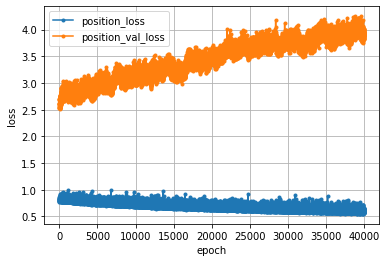

In [64]:
# 学習経過の可視化(位置)
half_position_loss     = half_position_history.history['loss']
half_position_val_loss = half_position_history.history['val_loss']

nb_epoch = len(half_position_loss)
plt.plot(range(nb_epoch), half_position_loss,     marker='.', label='position_loss')
plt.plot(range(nb_epoch), half_position_val_loss, marker='.', label='position_val_loss')
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()